In [1]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt

from tqdm import tqdm
from dynamics import SatelliteDynamics
from scipy.optimize import approx_fprime
from scipy.linalg import block_diag, solve
from utils import get_form_initial_conditions

In [2]:
# Simulation parameters
dt = 60.0  # Time step [s]
T = 395  # Duration [min]
T_RMSE = 300  # Index from which the RMSE is calculated
M = 10  # Number of Monte-Carlo simulations
N = 4  # Number of satellites
formation = 1
n_x = 6  # Number of states
n_p = 3  
n_y_1 = 3  # Number of measurements
n_y_2 = 2
n_y_3 = 2
n_y_4 = 2
K = T
W = 100 # Window size [min]

In [3]:
# Initial state vector and get the true state vectors (propagation) F
X_initial = get_form_initial_conditions(formation)
X_true = np.zeros((24, 1, T))
X_true[:, :, 0] = X_initial
STM_t0 = np.zeros((24, 24, T + 1))
STM_t0[:, :, 0] = np.eye(24)
STM_t = np.zeros((24, 24, T + 1))
STM_t[:, :, 0] = np.eye(24)
X_0_pinv_1 = np.linalg.pinv(X_true[:n_x, :, 0])
X_0_pinv_2 = np.linalg.pinv(X_true[n_x:2*n_x, :, 0])
X_0_pinv_3 = np.linalg.pinv(X_true[2*n_x:3*n_x, :, 0])
X_0_pinv_4 = np.linalg.pinv(X_true[3*n_x:, :, 0])
for t in range(T - 1):
    X_true[:, :, t + 1] = SatelliteDynamics().x_new(dt, X_true[:, :, t])
    # _, STM_t0[:, :, t + 1] = SatelliteDynamics().x_new_and_F(dt, X_true[:, :, t])
    # STM_t0[:, :, t + 1] = STM_t0[:, :, t + 1] @ STM_t0[:, :, t]
    # STM_t0[:, :, t + 1] = SatelliteDynamics().Phi(dt, X_true[:, :, t]) @ STM_t0[:, :, t]
    
    STM_t0[:n_x, :n_x, t + 1] = X_true[:n_x, :, t + 1] @ X_0_pinv_1
    STM_t0[n_x:2*n_x, n_x:2*n_x, t + 1] = X_true[n_x:2*n_x, :, t + 1] @ X_0_pinv_2
    STM_t0[2*n_x:3*n_x, 2*n_x:3*n_x, t + 1] = X_true[2*n_x:3*n_x, :, t + 1] @ X_0_pinv_3
    STM_t0[3*n_x:, 3*n_x:, t + 1] = X_true[3*n_x:, :, t + 1] @ X_0_pinv_4
    
    STM_t[:n_x, :n_x, t + 1] = X_true[:n_x, :, t + 1] @ np.linalg.pinv(X_true[:n_x, :, t])
    STM_t[n_x:2*n_x, n_x:2*n_x, t + 1] = X_true[n_x:2*n_x, :, t + 1] @ np.linalg.pinv(X_true[n_x:2*n_x, :, t])
    STM_t[2*n_x:3*n_x, 2*n_x:3*n_x, t + 1] = X_true[2*n_x:3*n_x, :, t + 1] @ np.linalg.pinv(X_true[2*n_x:3*n_x, :, t])
    STM_t[3*n_x:, 3*n_x:, t + 1] = X_true[3*n_x:, :, t + 1] @ np.linalg.pinv(X_true[3*n_x:, :, t])

# Process noise
q_chief_pos = 1e-1  # [m]
q_chief_vel = 1e-2 # [m / s]
Q_chief = (
    np.diag(np.concatenate([q_chief_pos * np.ones(3), q_chief_vel * np.ones(3)]))
    ** 2
)
q_deputy_pos = 1e0  # [m]
q_deputy_vel = 1e-2  # [m / s]
Q_deputy = (
    np.diag(np.concatenate([q_deputy_pos * np.ones(3), q_deputy_vel * np.ones(3)]))
    ** 2
)
Q_deputies = block_diag(Q_deputy, Q_deputy, Q_deputy)
Q = block_diag(Q_chief, Q_deputies)

# Observation noise
r_chief_pos = 1e-1  # [m]
R_chief = np.diag(np.concatenate([r_chief_pos * np.ones(3)])) ** 2
r_deputy_pos = 1e0  # [m]
R_deputies = np.diag(np.concatenate([r_deputy_pos * np.ones(6)])) ** 2
R = block_diag(R_chief, R_deputies)

# Initial deviation noise
p_pos_initial = 1e2  # [m]
p_vel_initial = 1e-2  # [m / s]
P = np.array([[1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0]])

In [4]:
def h_function_chief(x_vec):
    """
    Computes the measurement vector based on the current state vector.
    The measurement vector includes position components.

    Parameters:
    x_vec (np.array): The current state vector of the satellite (position [km] and velocity [km / s]).
    """
    return x_vec[0:3]

def H_jacobian_chief():
    """
    Computes the Jacobian of the measurement function.
    """
    H = np.zeros((3, 24))
    H[0:3, 0:3] = np.eye(3)
    return H

def h_function_deputy(x_vec):
    """
    Computes the measurement vector based on the current state vector.

    Parameters:
    x_vec (np.array): The current state vector of the satellite (position [km] and velocity [km / s]).

    Returns:
    y (np.array): The measurement vector of the satellite (range [km]).
    """
    r_chief = x_vec[:3]
    r_deputy1 = x_vec[6:9]
    r_deputy2 = x_vec[12:15]
    r_deputy3 = x_vec[18:21]

    range_deputy1_chief = np.linalg.norm(r_deputy1 - r_chief)
    range_deputy1_deputy2 = np.linalg.norm(r_deputy1 - r_deputy2)
    range_deputy1_deputy3 = np.linalg.norm(r_deputy1 - r_deputy3)
    range_deputy2_chief = np.linalg.norm(r_deputy2 - r_chief)
    range_deputy2_deputy3 = np.linalg.norm(r_deputy2 - r_deputy3)
    range_deputy3_chief = np.linalg.norm(r_deputy3 - r_chief)

    return np.array(
        [
            [range_deputy1_chief],
            [range_deputy1_deputy2],
            [range_deputy1_deputy3],
            [range_deputy2_chief],
            [range_deputy2_deputy3],
            [range_deputy3_chief],
        ]
    )

def H_jacobian_deputy(x_vec):
    """
    Computes the Jacobian of the measurement function.

    Parameters:
    x_vec (np.array): The current state vector of the satellite (position [km] and velocity [km / s]).

    Returns:
    H (np.array): The Jacobian of the measurement function.
    """
    r_chief = x_vec[:3]
    r_deputy1 = x_vec[6:9]
    r_deputy2 = x_vec[12:15]
    r_deputy3 = x_vec[18:21]

    range_deputy1_chief = np.linalg.norm(r_deputy1 - r_chief)
    range_deputy1_deputy2 = np.linalg.norm(r_deputy1 - r_deputy2)
    range_deputy1_deputy3 = np.linalg.norm(r_deputy1 - r_deputy3)
    range_deputy2_chief = np.linalg.norm(r_deputy2 - r_chief)
    range_deputy2_deputy3 = np.linalg.norm(r_deputy2 - r_deputy3)
    range_deputy3_chief = np.linalg.norm(r_deputy3 - r_chief)

    H = np.zeros((6, 24))
    H[0, 0:3] = -(r_deputy1 - r_chief).reshape(-1) / range_deputy1_chief
    H[0, 6:9] = (r_deputy1 - r_chief).reshape(-1) / range_deputy1_chief
    H[1, 6:9] = (r_deputy1 - r_deputy2).reshape(-1) / range_deputy1_deputy2
    H[1, 12:15] = -(r_deputy1 - r_deputy2).reshape(-1) / range_deputy1_deputy2
    H[2, 6:9] = (r_deputy1 - r_deputy3).reshape(-1) / range_deputy1_deputy3
    H[2, 18:21] = -(r_deputy1 - r_deputy3).reshape(-1) / range_deputy1_deputy3
    H[3, 0:3] = -(r_deputy2 - r_chief).reshape(-1) / range_deputy2_chief
    H[3, 12:15] = (r_deputy2 - r_chief).reshape(-1) / range_deputy2_chief
    H[4, 12:15] = (r_deputy2 - r_deputy3).reshape(-1) / range_deputy2_deputy3
    H[4, 18:21] = -(r_deputy2 - r_deputy3).reshape(-1) / range_deputy2_deputy3
    H[5, 0:3] = -(r_deputy3 - r_chief).reshape(-1) / range_deputy3_chief
    H[5, 18:21] = (r_deputy3 - r_chief).reshape(-1) / range_deputy3_chief
    return H

def h(x_vec):
    return np.concatenate([h_function_chief(x_vec), h_function_deputy(x_vec)])

def H(x):
    return np.concatenate((H_jacobian_chief(), H_jacobian_deputy(x)))

In [5]:
# Simulation setup
X_est = np.zeros_like(X_true)
initial_dev = np.concatenate(
    (
        p_pos_initial * np.random.randn(3, 1),
        p_vel_initial * np.random.randn(3, 1),
        p_pos_initial * np.random.randn(3, 1),
        p_vel_initial * np.random.randn(3, 1),
        p_pos_initial * np.random.randn(3, 1),
        p_vel_initial * np.random.randn(3, 1),
        p_pos_initial * np.random.randn(3, 1),
        p_vel_initial * np.random.randn(3, 1),
    )
)
X_est[:, :, 0] = X_initial + initial_dev
for t in range(T - 1):
    X_est[:, :, t + 1] = SatelliteDynamics().x_new(dt, X_est[:, :, t])

# Observations
Y = np.zeros((9, 1, T))
for t in range(T):
    Y[:, :, t] = h(X_true[:, :, t]) + np.random.normal(0, np.sqrt(np.diag(R)).reshape((9, 1)), size=(9, 1))
    
dev_chief_initial = np.linalg.norm(X_est[:3, :, :] - X_true[:3, :, :], axis=0).reshape(-1, 1)
dev_deputy1_initial = np.linalg.norm(X_est[6:9, :, :] - X_true[6:9, :, :], axis=0).reshape(-1, 1)
dev_deputy2_initial = np.linalg.norm(X_est[12:15, :, :] - X_true[12:15, :, :], axis=0).reshape(-1, 1)
dev_deputy3_initial = np.linalg.norm(X_est[18:21, :, :] - X_true[18:21, :, :], axis=0).reshape(-1, 1)

In [6]:
def f(x_0, STM, y):
    f_x_0 = 0

    # Extract x_1(0), x_2(0), x_3(0), x_4(0) from flattened state vector x_0
    x_1_k = x_0[:n_x, :]
    x_2_k = x_0[n_x:2*n_x, :]
    x_3_k = x_0[2*n_x:3*n_x, :]
    x_4_k = x_0[3*n_x:4*n_x, :]
    STM_t0_1 = np.eye(n_x)
    STM_t0_2 = np.eye(n_x)
    STM_t0_3 = np.eye(n_x)
    STM_t0_4 = np.eye(n_x)
    
    # Iterate over all sliding window time steps
    for k in range(W):    
        # Absolute residual term: observed data y for each state
        y_1_k = y[:n_y_1, :, k]
        y_rel_k = y[n_y_1:, :, k]

        # Update the cost function with the residuals for self-measurements
        residual = y_1_k - P @ x_1_k
        f_x_0 += 1 / 2 * residual.T @ np.linalg.inv(R_chief) @ residual

        # Pairwise relative measurements
        y_21_k = y_rel_k[0]
        y_23_k = y_rel_k[1]
        y_24_k = y_rel_k[2]
        y_31_k = y_rel_k[3]
        y_34_k = y_rel_k[4]
        y_41_k = y_rel_k[5]

        # Process pairwise relative residuals for each pair
        pairs = [
            (2, 1, x_2_k, x_1_k, y_21_k),  # (2, 1)
            (2, 3, x_2_k, x_3_k, y_23_k),  # (2, 3)
            (2, 4, x_2_k, x_4_k, y_24_k),  # (2, 4)
            (3, 1, x_3_k, x_1_k, y_31_k),  # (3, 1)
            (3, 4, x_3_k, x_4_k, y_34_k),  # (3, 4)
            (4, 1, x_4_k, x_1_k, y_41_k),  # (4, 1)
        ]

        # Iterate over each pair and update the cost function with the residuals for pairwise measurements
        for i, j, x_i_k, x_j_k, y_ij_k in pairs:
            d_ij_k_vec = P @ x_i_k - P @ x_j_k
            d_ij_k = np.linalg.norm(d_ij_k_vec)
            f_x_0 += (y_ij_k - d_ij_k) ** 2 / (2 * r_deputy_pos**2)

        if k < W - 1:
            # Get x_1(k), x_2(k), x_3(k), x_4(k) from the state vector x_0
            x_1_k = STM[:n_x, :n_x, k + 1] @ x_1_k
            x_2_k = STM[n_x:2*n_x, n_x:2*n_x, k + 1] @ x_2_k
            x_3_k = STM[2*n_x:3*n_x, 2*n_x:3*n_x, k + 1] @ x_3_k
            x_4_k = STM[3*n_x:4*n_x, 3*n_x:4*n_x, k + 1] @ x_4_k
            STM_t0_1 = STM[:n_x, :n_x, k + 1] @ STM_t0_1
            STM_t0_2 = STM[n_x:2*n_x, n_x:2*n_x, k + 1] @ STM_t0_2
            STM_t0_3 = STM[2*n_x:3*n_x, 2*n_x:3*n_x, k + 1] @ STM_t0_3
            STM_t0_4 = STM[3*n_x:4*n_x, 3*n_x:4*n_x, k + 1] @ STM_t0_4

    return f_x_0

def grad_f(x_0, STM, y):
    grad_f_x_0 = np.zeros_like(x_0)

    # Extract x_1(0), x_2(0), x_3(0), x_4(0) from flattened state vector x_0
    x_1_k = x_0[:n_x, :]
    x_2_k = x_0[n_x:2*n_x, :]
    x_3_k = x_0[2*n_x:3*n_x, :]
    x_4_k = x_0[3*n_x:4*n_x, :]
    STM_t0_1 = np.eye(n_x)
    STM_t0_2 = np.eye(n_x)
    STM_t0_3 = np.eye(n_x)
    STM_t0_4 = np.eye(n_x)
    
    # Iterate over all sliding window time steps
    for k in range(W):
        # Absolute residual term: observed data y for each state
        y_1_k = y[:n_y_1, :, k]
        y_rel_k = y[n_y_1:, :, k]

        # Compute gradients for the absolute residual terms
        grad_f_x_0[:n_x, :] -= STM_t0_1.T @ P.T @ np.linalg.inv(R_chief) @ (y_1_k - P @ x_1_k)

        # Pairwise relative measurements
        y_21_k = y_rel_k[0]
        y_23_k = y_rel_k[1]
        y_24_k = y_rel_k[2]
        y_31_k = y_rel_k[3]
        y_34_k = y_rel_k[4]
        y_41_k = y_rel_k[5]

        # Process pairwise relative residuals for each pair
        pairs = [
            (2, 1, x_2_k, x_1_k, y_21_k, STM_t0_2, STM_t0_1),  # (2, 1)
            (2, 3, x_2_k, x_3_k, y_23_k, STM_t0_2, STM_t0_3),  # (2, 3)
            (2, 4, x_2_k, x_4_k, y_24_k, STM_t0_2, STM_t0_4),  # (2, 4)
            (3, 1, x_3_k, x_1_k, y_31_k, STM_t0_3, STM_t0_1),  # (3, 1)
            (3, 4, x_3_k, x_4_k, y_34_k, STM_t0_3, STM_t0_4),  # (3, 4)
            (4, 1, x_4_k, x_1_k, y_41_k, STM_t0_4, STM_t0_1),  # (4, 1)
        ]

        # Iterate over each pair and compute gradients
        for i, j, x_i_k, x_j_k, y_ij_k, STM_t0_i, STM_t0_j in pairs:
            d_ij_k_vec = P @ x_i_k - P @ x_j_k
            d_ij_k = np.linalg.norm(d_ij_k_vec)

            # Update the gradient of f(x) with respect to x_i(k) and x_j(k)
            grad_f_x_0[(i - 1) * n_x:i * n_x, :] -= (y_ij_k - d_ij_k) / r_deputy_pos**2 * (STM_t0_i.T @ P.T @ d_ij_k_vec) / d_ij_k
            grad_f_x_0[(j - 1) * n_x:j * n_x, :] += (y_ij_k - d_ij_k) / r_deputy_pos**2 * (STM_t0_j.T @ P.T @ d_ij_k_vec) / d_ij_k

        if k < W - 1:
            # Get x_1(k), x_2(k), x_3(k), x_4(k) from the state vector x_0
            x_1_k = STM[:n_x, :n_x, k + 1] @ x_1_k
            x_2_k = STM[n_x:2*n_x, n_x:2*n_x, k + 1] @ x_2_k
            x_3_k = STM[2*n_x:3*n_x, 2*n_x:3*n_x, k + 1] @ x_3_k
            x_4_k = STM[3*n_x:4*n_x, 3*n_x:4*n_x, k + 1] @ x_4_k
            STM_t0_1 = STM[:n_x, :n_x, k + 1] @ STM_t0_1
            STM_t0_2 = STM[n_x:2*n_x, n_x:2*n_x, k + 1] @ STM_t0_2
            STM_t0_3 = STM[2*n_x:3*n_x, 2*n_x:3*n_x, k + 1] @ STM_t0_3
            STM_t0_4 = STM[3*n_x:4*n_x, 3*n_x:4*n_x, k + 1] @ STM_t0_4

    return grad_f_x_0

def hessian_f(x_0, STM, y):
    hessian_f_x_0 = np.zeros((x_0.shape[0], x_0.shape[0]))  # Initialize Hessian matrix
    
    # Extract x_1(0), x_2(0), x_3(0), x_4(0) from flattened state vector x_0
    x_1_k = x_0[:n_x, :]
    x_2_k = x_0[n_x:2*n_x, :]
    x_3_k = x_0[2*n_x:3*n_x, :]
    x_4_k = x_0[3*n_x:4*n_x, :]
    STM_t0_1 = np.eye(n_x)
    STM_t0_2 = np.eye(n_x)
    STM_t0_3 = np.eye(n_x)
    STM_t0_4 = np.eye(n_x)

    # Iterate over all sliding window time steps
    for k in range(W):
        # Absolute residual term: observed data y for each state
        y_rel_k = y[n_y_1:, :, k]

        # Absolute measurement residuals' Hessian
        hessian_f_x_0[:n_x, :n_x] += STM_t0_1.T @ P.T @ np.linalg.inv(R_chief) @ P @ STM_t0_1 

        # Pairwise relative measurements
        y_21_k = y_rel_k[0]
        y_23_k = y_rel_k[1]
        y_24_k = y_rel_k[2]
        y_31_k = y_rel_k[3]
        y_34_k = y_rel_k[4]
        y_41_k = y_rel_k[5]

        # Process pairwise relative residuals for each pair
        pairs = [
            (2, 1, x_2_k, x_1_k, y_21_k, STM_t0_2, STM_t0_1),  # (2, 1)
            (2, 3, x_2_k, x_3_k, y_23_k, STM_t0_2, STM_t0_3),  # (2, 3)
            (2, 4, x_2_k, x_4_k, y_24_k, STM_t0_2, STM_t0_4),  # (2, 4)
            (3, 1, x_3_k, x_1_k, y_31_k, STM_t0_3, STM_t0_1),  # (3, 1)
            (3, 4, x_3_k, x_4_k, y_34_k, STM_t0_3, STM_t0_4),  # (3, 4)
            (4, 1, x_4_k, x_1_k, y_41_k, STM_t0_4, STM_t0_1),  # (4, 1)
        ]

        # Iterate over each pair and compute gradients
        for i, j, x_i_k, x_j_k, y_ij_k, STM_t0_i, STM_t0_j in pairs:
            d_ij_k_vec = P @ x_i_k - P @ x_j_k
            d_ij_k = np.linalg.norm(d_ij_k_vec)

            # Update the Hessian for x_i(k) and x_j(k)
            idx_i = n_x * (i - 1)
            idx_j = n_x * (j - 1)
            
            hessian_f_x_0[idx_i:idx_i + n_x, idx_i:idx_i + n_x] -= 1 / (r_deputy_pos ** 2) * (STM_t0_i.T @ ((y_ij_k - d_ij_k) / d_ij_k * P.T @ P - y_ij_k / d_ij_k**3 * P.T @ d_ij_k_vec @ d_ij_k_vec.T @ P) @ STM_t0_i)
            hessian_f_x_0[idx_i:idx_i + n_x, idx_j:idx_j + n_x] += 1 / (r_deputy_pos ** 2) * (STM_t0_i.T @ ((y_ij_k - d_ij_k) / d_ij_k * P.T @ P - y_ij_k / d_ij_k**3 * P.T @ d_ij_k_vec @ d_ij_k_vec.T @ P) @ STM_t0_j)
            hessian_f_x_0[idx_j:idx_j + n_x, idx_i:idx_i + n_x] += 1 / (r_deputy_pos ** 2) * (STM_t0_j.T @ ((y_ij_k - d_ij_k) / d_ij_k * P.T @ P - y_ij_k / d_ij_k**3 * P.T @ d_ij_k_vec @ d_ij_k_vec.T @ P) @ STM_t0_i)
            hessian_f_x_0[idx_j:idx_j + n_x, idx_j:idx_j + n_x] -= 1 / (r_deputy_pos ** 2) * (STM_t0_j.T @ ((y_ij_k - d_ij_k) / d_ij_k * P.T @ P - y_ij_k / d_ij_k**3 * P.T @ d_ij_k_vec @ d_ij_k_vec.T @ P) @ STM_t0_j)

        if k < W - 1:
            # Get x_1(k), x_2(k), x_3(k), x_4(k) from the state vector x_0
            x_1_k = STM[:n_x, :n_x, k + 1] @ x_1_k
            x_2_k = STM[n_x:2*n_x, n_x:2*n_x, k + 1] @ x_2_k
            x_3_k = STM[2*n_x:3*n_x, 2*n_x:3*n_x, k + 1] @ x_3_k
            x_4_k = STM[3*n_x:4*n_x, 3*n_x:4*n_x, k + 1] @ x_4_k
            STM_t0_1 = STM[:n_x, :n_x, k + 1] @ STM_t0_1
            STM_t0_2 = STM[n_x:2*n_x, n_x:2*n_x, k + 1] @ STM_t0_2
            STM_t0_3 = STM[2*n_x:3*n_x, 2*n_x:3*n_x, k + 1] @ STM_t0_3
            STM_t0_4 = STM[3*n_x:4*n_x, 3*n_x:4*n_x, k + 1] @ STM_t0_4

    return hessian_f_x_0

In [7]:
def L(x_0, STM, y):
    return f(x_0, STM, y)
    
def grad_L(x_0, STM, y):
    return grad_f(x_0, STM, y)

def hessian_L(x_0, STM, y):
    return hessian_f(x_0, STM, y)

In [8]:
class NKKT:
    def __init__(self, tolerance=1e-6, max_iter=100):
        self.tolerance = tolerance
        self.max_iter = max_iter
        self.i = None
        
        # Storage for results
        self.L_norms = []
        self.grad_L_norms = []

    def solve(self, x_init, STM, Y):
        x = x_init
        for iteration in range(self.max_iter):
            # Compute the cost function, gradient of the Lagrangian and Hessian of the Lagrangian
            L_x = L(x, STM, Y)
            grad_L_x = grad_L(x, STM, Y)
            hessian_L_x = hessian_L(x, STM, Y)
            # print(np.linalg.norm(L_x - f1(x, STM_t0[:, :, :W], Y)), np.linalg.norm(grad_L_x - grad_f1(x, STM_t0[:, :, :W], Y)), np.linalg.norm(hessian_L_x - hessian_f1(x, STM_t0[:, :, :W], Y)))

            # Calculate norms for convergence tracking
            L_norm = np.linalg.norm(L_x)
            grad_L_norm = np.linalg.norm(grad_L_x)

            # Store the norms
            self.L_norms.append(L_norm)
            self.grad_L_norms.append(grad_L_norm)

            # Check convergence and print metrics
            if grad_L_norm < self.tolerance or iteration + 1 == self.max_iter:
                print(f"STOP on Iteration {iteration}\nL_norm = {L_norm}\nGrad_L_norm = {grad_L_norm}\n")
                break
            else:
                if iteration == 0:
                    print(f"Before applying the algorithm\nL_norm = {L_norm}\nGrad_L_norm = {grad_L_norm}\n")
                else:
                    print(f"Iteration {iteration}\nL_norm = {L_norm}\nGrad_L_norm = {grad_L_norm}\n")
                
            # Solve for the Newton step - this is one iteration
            # delta_x = solve(hessian_L_x, -grad_L_x)
            delta_x =  -np.linalg.pinv(hessian_L_x) @ grad_L_x
            x += delta_x
        
            # Save the current iteration
            self.i = iteration + 1

        return x

In [9]:
def give_me_the_plots(i, L_norms, grad_L_norms):
    iterations = np.arange(0, i + 1)

    # Plot 1
    plt.semilogy(iterations, L_norms, '.-')
    plt.xlabel(r'$m$')
    plt.ylabel(r'$||L(x^{(m)})||_2$')
    plt.show()
    
    # Plot 2
    plt.semilogy(iterations, grad_L_norms, '.-')
    plt.xlabel(r'$m$')
    plt.ylabel(r'$||\nabla L(x^{(m)})||_2$')
    plt.show()

In [ ]:
rmse_1 = []
rmse_2 = []
rmse_3 = []
rmse_4 = []
NKKT_first_round_stop_iteration = []
NKKT_K_minus_W_next_rounds_stop_iteration = []
for m in tqdm(range(M), desc="MC run", leave=True):
    print(f"------------------------------------ Monte Carlo run #{m + 1} ------------------------------------")
    Y = np.zeros((9, 1, T))
    for t in range(T):
        Y[:, :, t] = h(X_true[:, :, t]) + np.random.normal(0, np.sqrt(np.diag(R)).reshape((9, 1)), size=(9, 1))

    # Before applying the Newton algorithm for the first time, initialize the initial conditions guess randomly (cold-start) 
    x_init = np.zeros((4 * n_x, 1))
    x_init[:4*n_x, :] = X_est[:, :, 0]
    
    # Apply the algorithm
    p_1_est = np.zeros((n_p, 1, K - W + 1))
    p_2_est = np.zeros((n_p, 1, K - W + 1))
    p_3_est = np.zeros((n_p, 1, K - W + 1))
    p_4_est = np.zeros((n_p, 1, K - W + 1))
    for n in tqdm(range(K - W + 1), desc="Windows", leave=False):
        nkkt = NKKT()
        x_est = nkkt.solve(x_init, STM_t[:, :, n:n + W], Y[:, :, n:n + W])
        p_1_est[:, :, n] = P @ x_est[:n_x, :]
        p_2_est[:, :, n] = P @ x_est[n_x:2*n_x, :]
        p_3_est[:, :, n] = P @ x_est[2*n_x:3*n_x, :]
        p_4_est[:, :, n] = P @ x_est[3*n_x:, :]
        
        # give_me_the_plots(nkkt.i, nkkt.L_norms, nkkt.grad_L_norms)

        if n == 0: # Check divergence in the beginning
            abs_error_init_1 = np.zeros(W)
            abs_error_init_2 = np.zeros(W)
            abs_error_init_3 = np.zeros(W)
            abs_error_init_4 = np.zeros(W)
            for k in range(W):
                abs_error_init_1[k] = np.linalg.norm(P @ STM_t0[:n_x, :n_x, k] @ x_est[:n_x, :] - P @ X_true[:n_x, :, k])
                abs_error_init_2[k] = np.linalg.norm(P @ STM_t0[n_x:2*n_x, n_x:2*n_x, k] @ x_est[n_x:2*n_x, :] - P @ X_true[n_x:2*n_x, :, k])
                abs_error_init_3[k] = np.linalg.norm(P @ STM_t0[2*n_x:3*n_x, 2*n_x:3*n_x, k] @ x_est[2*n_x:3*n_x, :] - P @ X_true[2*n_x:3*n_x, :, k])
                abs_error_init_4[k] = np.linalg.norm(P @ STM_t0[3*n_x:, 3*n_x:, k] @ x_est[3*n_x:, :] - P @ X_true[3*n_x:, :, k])
            rmse_init_1 = np.sqrt(np.mean(abs_error_init_1 ** 2))
            rmse_init_2 = np.sqrt(np.mean(abs_error_init_2 ** 2))
            rmse_init_3 = np.sqrt(np.mean(abs_error_init_3 ** 2))
            rmse_init_4 = np.sqrt(np.mean(abs_error_init_4 ** 2))
            print(rmse_init_1, rmse_init_2, rmse_init_3, rmse_init_4)
            if rmse_init_1 > 1e2 or rmse_init_2 > 1e2 or rmse_init_3 > 1e2 or rmse_init_4 > 1e2:
                print(f"This Monte Carlo run #{m + 1} diverged!")
                # Mimic the propagation for rmse computation below
                for k in range(K - W + 1):
                    p_1_est[:, :, k] = P @ STM_t0[:n_x, :n_x, k] @ x_est[:n_x, :]
                    p_2_est[:, :, k] = P @ STM_t0[n_x:2*n_x, n_x:2*n_x, k] @ x_est[n_x:2*n_x, :]
                    p_3_est[:, :, k] = P @ STM_t0[2*n_x:3*n_x, 2*n_x:3*n_x, k] @ x_est[2*n_x:3*n_x, :]
                    p_4_est[:, :, k] = P @ STM_t0[3*n_x:, 3*n_x:, k] @ x_est[3*n_x:, :]
                break
            else:
                NKKT_first_round_stop_iteration.append(nkkt.i)
        else:
            NKKT_K_minus_W_next_rounds_stop_iteration.append(nkkt.i)

        # Get next new guess (warm-start)
        # The initial guess is the previous window estimate second timestamp value
        x_init[:n_x, :] = STM_t[:n_x, :n_x, n + 1] @ x_est[:n_x, :]
        x_init[n_x:2*n_x, :] = STM_t[n_x:2*n_x, n_x:2*n_x, n + 1] @ x_est[n_x:2*n_x, :]
        x_init[2*n_x:3*n_x, :] = STM_t[2*n_x:3*n_x, 2*n_x:3*n_x, n + 1] @ x_est[2*n_x:3*n_x, :]
        x_init[3*n_x:4*n_x, :] = STM_t[3*n_x:, 3*n_x:, n + 1] @ x_est[3*n_x:, :]

    # After each Monte Carlo Run compute the RMSE_m for each first K - W + 1 iterations
    abs_error_1 = np.zeros(K - W + 1)
    abs_error_2 = np.zeros(K - W + 1)
    abs_error_3 = np.zeros(K - W + 1)
    abs_error_4 = np.zeros(K - W + 1)
    for k in range(K - W + 1):
        abs_error_1[k] = np.linalg.norm(p_1_est[:, :, k] - P @ X_true[:n_x, :, k])
        abs_error_2[k] = np.linalg.norm(p_2_est[:, :, k] - P @ X_true[n_x:2*n_x, :, k])
        abs_error_3[k] = np.linalg.norm(p_3_est[:, :, k] - P @ X_true[2*n_x:3*n_x, :, k])
        abs_error_4[k] = np.linalg.norm(p_4_est[:, :, k] - P @ X_true[3*n_x:4*n_x, :, k])
    rmse_m_1 = np.sqrt(np.mean(abs_error_1 ** 2))
    rmse_m_2 = np.sqrt(np.mean(abs_error_2 ** 2))
    rmse_m_3 = np.sqrt(np.mean(abs_error_3 ** 2))
    rmse_m_4 = np.sqrt(np.mean(abs_error_4 ** 2))
    print(f'This MC run RMSE for the first {K - W + 1} iterations:')
    print(f'RMSE_run{m + 1}_1 = {rmse_m_1}')
    print(f'RMSE_run{m + 1}_2 = {rmse_m_2}')
    print(f'RMSE_run{m + 1}_3 = {rmse_m_3}')
    print(f'RMSE_run{m + 1}_4 = {rmse_m_4}\n')
    if rmse_m_1 > 1e2 or rmse_m_2 > 1e2 or rmse_m_3 > 1e2 or rmse_m_4 > 1e2:
        print(f"Discarding this Monte Carlo run #{m + 1} and going to Monte Carlo run #{m + 2}...\n")
    else:
        rmse_1.append(rmse_m_1)
        rmse_2.append(rmse_m_2)
        rmse_3.append(rmse_m_3)
        rmse_4.append(rmse_m_4)
        
print(f'Average RMSE for the first {K - W + 1} iterations for {len(rmse_1)} ({len(rmse_1) / M * 100} %) valid Monte Carlo runs:')
print(f'RMSE_1 = {np.mean(rmse_1)}')
print(f'RMSE_2 = {np.mean(rmse_2)}')
print(f'RMSE_3 = {np.mean(rmse_3)}')
print(f'RMSE_4 = {np.mean(rmse_4)}')
print(f'The first round of NKKT converged with {np.mean(NKKT_first_round_stop_iteration)} iterations on average.')
print(f'The next {K - W} rounds of NKKT converged with {np.mean(NKKT_K_minus_W_next_rounds_stop_iteration)} iterations on average.')

MC run:   0%|          | 0/10 [00:00<?, ?it/s]

------------------------------------ Monte Carlo run #1 ------------------------------------



Windows:   0%|          | 0/296 [00:00<?, ?it/s]

Before applying the algorithm
L_norm = 88124523.54419623
Grad_L_norm = 1327927.3770621782

Iteration 1
L_norm = 2043.603678162346
Grad_L_norm = 94.6614921146248

Iteration 2
L_norm = 788.7410781799861
Grad_L_norm = 42.6427336491602

Iteration 3
L_norm = 416.21500221818627
Grad_L_norm = 3.5336585912346314

Iteration 4
L_norm = 405.5613789495332
Grad_L_norm = 1.7059946974615632

Iteration 5
L_norm = 403.595633564118
Grad_L_norm = 0.6148990609713412

Iteration 6
L_norm = 403.30999694977453
Grad_L_norm = 0.22389244101749514

Iteration 7
L_norm = 403.28022897643865
Grad_L_norm = 0.03545586847445749

Iteration 8
L_norm = 403.27941951261454
Grad_L_norm = 0.0016659514085320929

Iteration 9
L_norm = 403.27941812608884
Grad_L_norm = 3.2655471346599085e-06

Iteration 10
L_norm = 403.2794181034742
Grad_L_norm = 2.588882068446487e-06

Iteration 11
L_norm = 403.2794181600159
Grad_L_norm = 7.625837420580878e-06

Iteration 12
L_norm = 403.2794180953058
Grad_L_norm = 2.490547946247322e-06

Iteration 13


Windows:   0%|          | 1/296 [00:11<54:30, 11.09s/it]

Iteration 98
L_norm = 403.27941815983405
Grad_L_norm = 2.223722968182373e-06

STOP on Iteration 99
L_norm = 403.27941812577876
Grad_L_norm = 7.499021951052512e-06

0.00857204554177904 2.567847143189995 2.760345632316882 3.1688339044264016
Before applying the algorithm
L_norm = 406.7015543783548
Grad_L_norm = 16.837828565850323

Iteration 1
L_norm = 403.4586306216086
Grad_L_norm = 0.008168560417431157

Iteration 2
L_norm = 403.45861648187264
Grad_L_norm = 2.198504243646914e-05

Iteration 3
L_norm = 403.4586163847714
Grad_L_norm = 4.0620377337483654e-05

Iteration 4
L_norm = 403.45861638474815
Grad_L_norm = 2.5588375119720835e-05

Iteration 5
L_norm = 403.45861637945194
Grad_L_norm = 6.194479225431089e-06

Iteration 6
L_norm = 403.4586164994569
Grad_L_norm = 2.2172378150065705e-05

Iteration 7
L_norm = 403.4586163897187
Grad_L_norm = 4.063381751736587e-05

Iteration 8
L_norm = 403.45861634435624
Grad_L_norm = 2.537261788894127e-05

Iteration 9
L_norm = 403.45861643371023
Grad_L_norm = 5.


Windows:   1%|          | 2/296 [00:21<53:42, 10.96s/it]

STOP on Iteration 99
L_norm = 403.4586164444076
Grad_L_norm = 5.789871590908973e-06

Before applying the algorithm
L_norm = 410.06365760310456
Grad_L_norm = 19.188623956626653

Iteration 1
L_norm = 406.3525469507831
Grad_L_norm = 0.019166233137120337

Iteration 2
L_norm = 406.35248480341556
Grad_L_norm = 6.016881127090248e-06

Iteration 3
L_norm = 406.3524847457655
Grad_L_norm = 2.435519111471199e-05

Iteration 4
L_norm = 406.35248476319026
Grad_L_norm = 8.297788516907801e-06

Iteration 5
L_norm = 406.3524847552151
Grad_L_norm = 8.025158951222529e-06

Iteration 6
L_norm = 406.3524848388429
Grad_L_norm = 6.400960115321503e-06

Iteration 7
L_norm = 406.35248480115285
Grad_L_norm = 6.095478294348664e-06

Iteration 8
L_norm = 406.352484775949
Grad_L_norm = 2.4153714523544353e-05

Iteration 9
L_norm = 406.35248475750774
Grad_L_norm = 8.020487746649152e-06

Iteration 10
L_norm = 406.35248477919527
Grad_L_norm = 8.164856423208374e-06

Iteration 11
L_norm = 406.3524848085973
Grad_L_norm = 6.17


Windows:   1%|          | 3/296 [00:32<53:25, 10.94s/it]

STOP on Iteration 99
L_norm = 406.3524848080955
Grad_L_norm = 6.178669762765498e-06

Before applying the algorithm
L_norm = 412.1470797584411
Grad_L_norm = 6.994715838131436

Iteration 1
L_norm = 411.29492296727386
Grad_L_norm = 0.000736691631007533

Iteration 2
L_norm = 411.29492287491985
Grad_L_norm = 2.6217801346436156e-06

Iteration 3
L_norm = 411.294922887885
Grad_L_norm = 2.6254654819368758e-06

Iteration 4
L_norm = 411.2949228845148
Grad_L_norm = 2.6150129313028477e-06

Iteration 5
L_norm = 411.29492288905294
Grad_L_norm = 2.630718034662345e-06

Iteration 6
L_norm = 411.2949228538123
Grad_L_norm = 1.3439708507258441e-05

Iteration 7
L_norm = 411.2949228436267
Grad_L_norm = 2.855481733336131e-06

Iteration 8
L_norm = 411.29492288566183
Grad_L_norm = 2.6474572828324164e-06

Iteration 9
L_norm = 411.29492288640944
Grad_L_norm = 2.6236273701923342e-06

Iteration 10
L_norm = 411.29492288905135
Grad_L_norm = 2.6375031456429497e-06

Iteration 11
L_norm = 411.2949228981192
Grad_L_norm =


Windows:   1%|▏         | 4/296 [00:44<53:48, 11.06s/it]

STOP on Iteration 99
L_norm = 411.29492288911007
Grad_L_norm = 2.6376363514562825e-06

Before applying the algorithm
L_norm = 418.6286714427939
Grad_L_norm = 16.55554739923025

Iteration 1
L_norm = 414.4729980136652
Grad_L_norm = 0.015964713282063024

Iteration 2
L_norm = 414.4729482467439
Grad_L_norm = 1.5740625400673525e-05

Iteration 3
L_norm = 414.47294819606543
Grad_L_norm = 2.46951688495708e-05

Iteration 4
L_norm = 414.47294821535337
Grad_L_norm = 1.5881018500770742e-05

Iteration 5
L_norm = 414.4729482351971
Grad_L_norm = 1.5442266499878452e-05

Iteration 6
L_norm = 414.4729481342035
Grad_L_norm = 2.5565947652084917e-05

Iteration 7
L_norm = 414.4729482441134
Grad_L_norm = 1.5543018403638124e-05

Iteration 8
L_norm = 414.4729481736036
Grad_L_norm = 2.4565628494252565e-05

Iteration 9
L_norm = 414.47294824340156
Grad_L_norm = 1.6056862059512235e-05

Iteration 10
L_norm = 414.47294822098894
Grad_L_norm = 1.565625214990052e-05

Iteration 11
L_norm = 414.4729481741992
Grad_L_norm =


Windows:   2%|▏         | 5/296 [00:55<54:04, 11.15s/it]

Iteration 98
L_norm = 414.47294822846817
Grad_L_norm = 1.5645916898120986e-05

STOP on Iteration 99
L_norm = 414.47294817168705
Grad_L_norm = 2.457450638798577e-05

Before applying the algorithm
L_norm = 416.6030000724679
Grad_L_norm = 9.581168458968799

Iteration 1
L_norm = 411.02863005858313
Grad_L_norm = 0.0033436152499039936

Iteration 2
L_norm = 411.02862730854713
Grad_L_norm = 2.820404329171694e-05

Iteration 3
L_norm = 411.0286272574559
Grad_L_norm = 6.309740610375192e-06

Iteration 4
L_norm = 411.02862729141856
Grad_L_norm = 6.049548915847523e-06

Iteration 5
L_norm = 411.0286273153742
Grad_L_norm = 5.8466062423051636e-06

Iteration 6
L_norm = 411.02862722420934
Grad_L_norm = 5.837547747144589e-06

Iteration 7
L_norm = 411.02862737538607
Grad_L_norm = 1.1439315838484315e-06

Iteration 8
L_norm = 411.028627317191
Grad_L_norm = 1.0780235849371953e-06

Iteration 9
L_norm = 411.0286273811974
Grad_L_norm = 1.1447533210990578e-06

Iteration 10
L_norm = 411.0286273002646
Grad_L_norm =


Windows:   2%|▏         | 6/296 [00:57<38:43,  8.01s/it]

Before applying the algorithm
L_norm = 414.01375726100633
Grad_L_norm = 17.205436470154925

Iteration 1
L_norm = 405.5122732334121
Grad_L_norm = 0.010784552268111373

Iteration 2
L_norm = 405.51224487850936
Grad_L_norm = 9.771452053921555e-06

Iteration 3
L_norm = 405.5122447816972
Grad_L_norm = 7.179985140646486e-06

Iteration 4
L_norm = 405.5122448137172
Grad_L_norm = 7.097832393238563e-06

Iteration 5
L_norm = 405.5122448128588
Grad_L_norm = 6.594968802611854e-06

Iteration 6
L_norm = 405.51224481043073
Grad_L_norm = 6.534919290916172e-06

Iteration 7
L_norm = 405.51224480252324
Grad_L_norm = 6.264371669019413e-06

Iteration 8
L_norm = 405.51224483458486
Grad_L_norm = 6.183012731234576e-06

Iteration 9
L_norm = 405.51224479389765
Grad_L_norm = 4.397874247085659e-05

Iteration 10
L_norm = 405.5122448742443
Grad_L_norm = 9.736060205919932e-06

Iteration 11
L_norm = 405.51224481525975
Grad_L_norm = 7.052970667880111e-06

Iteration 12
L_norm = 405.5122447766281
Grad_L_norm = 6.667020644


Windows:   2%|▏         | 7/296 [01:08<44:05,  9.15s/it]

Iteration 98
L_norm = 405.5122448088935
Grad_L_norm = 6.956713169254942e-06

STOP on Iteration 99
L_norm = 405.512244778598
Grad_L_norm = 6.697600795040866e-06

Before applying the algorithm
L_norm = 411.91020486063564
Grad_L_norm = 16.95648558496785

Iteration 1
L_norm = 407.28933796431477
Grad_L_norm = 0.009491197487139216

Iteration 2
L_norm = 407.28931595560186
Grad_L_norm = 4.2045267388628364e-05

Iteration 3
L_norm = 407.28931597456153
Grad_L_norm = 2.2015291314991212e-05

Iteration 4
L_norm = 407.2893158968311
Grad_L_norm = 1.5167760884116497e-05

Iteration 5
L_norm = 407.2893158811388
Grad_L_norm = 1.5042587730729472e-05

Iteration 6
L_norm = 407.28931593625487
Grad_L_norm = 2.3826720583845182e-05

Iteration 7
L_norm = 407.2893158845296
Grad_L_norm = 1.5057168781043236e-05

Iteration 8
L_norm = 407.28931597596886
Grad_L_norm = 2.2081502060774628e-05

Iteration 9
L_norm = 407.2893158906827
Grad_L_norm = 1.5192690607685687e-05

Iteration 10
L_norm = 407.28931588265493
Grad_L_norm


Windows:   3%|▎         | 8/296 [01:19<46:45,  9.74s/it]

Iteration 98
L_norm = 407.289315968806
Grad_L_norm = 2.2083101886644258e-05

STOP on Iteration 99
L_norm = 407.28931588599687
Grad_L_norm = 1.5182584676003469e-05

Before applying the algorithm
L_norm = 409.42545035126267
Grad_L_norm = 14.193913967357068

Iteration 1
L_norm = 406.9973210303188
Grad_L_norm = 0.005114627266230806

Iteration 2
L_norm = 406.9973070537928
Grad_L_norm = 8.913851875338825e-06

Iteration 3
L_norm = 406.9973070748071
Grad_L_norm = 8.099915080208045e-06

Iteration 4
L_norm = 406.9973069576044
Grad_L_norm = 4.299683855032377e-05

Iteration 5
L_norm = 406.9973070342007
Grad_L_norm = 2.3874182688714832e-05

Iteration 6
L_norm = 406.99730705717633
Grad_L_norm = 8.79409674429567e-06

Iteration 7
L_norm = 406.9973070775655
Grad_L_norm = 8.269508625841724e-06

Iteration 8
L_norm = 406.9973069610382
Grad_L_norm = 4.307008175435443e-05

Iteration 9
L_norm = 406.9973070582849
Grad_L_norm = 2.3990108565412268e-05

Iteration 10
L_norm = 406.9973070534532
Grad_L_norm = 8.792


Windows:   3%|▎         | 9/296 [01:31<48:51, 10.21s/it]

Iteration 98
L_norm = 406.99730697966487
Grad_L_norm = 4.331697012150645e-05

STOP on Iteration 99
L_norm = 406.9973070590933
Grad_L_norm = 2.40151967149506e-05

Before applying the algorithm
L_norm = 413.6970246608411
Grad_L_norm = 14.222219687643767

Iteration 1
L_norm = 408.9708415662117
Grad_L_norm = 0.029425969990187918

Iteration 2
L_norm = 408.97070779905346
Grad_L_norm = 1.776459931586326e-05

Iteration 3
L_norm = 408.9707077302079
Grad_L_norm = 3.200723571450096e-05

Iteration 4
L_norm = 408.97070783213275
Grad_L_norm = 2.182378936850842e-05

Iteration 5
L_norm = 408.9707078190714
Grad_L_norm = 1.7572850817955203e-05

Iteration 6
L_norm = 408.97070773635096
Grad_L_norm = 3.206920525075691e-05

Iteration 7
L_norm = 408.97070782829616
Grad_L_norm = 1.8973849875748528e-05

Iteration 8
L_norm = 408.9707078196772
Grad_L_norm = 1.7572544175756415e-05

Iteration 9
L_norm = 408.97070773635096
Grad_L_norm = 3.2069190509097065e-05

Iteration 10
L_norm = 408.97070780738005
Grad_L_norm = 


Windows:   3%|▎         | 10/296 [01:42<50:24, 10.58s/it]

Iteration 98
L_norm = 408.9707077244584
Grad_L_norm = 3.218718437026264e-05

STOP on Iteration 99
L_norm = 408.9707078408257
Grad_L_norm = 1.9106974720400292e-05

Before applying the algorithm
L_norm = 410.9195497414978
Grad_L_norm = 15.362070832617889

Iteration 1
L_norm = 407.64282370002087
Grad_L_norm = 1.4594459195639098

Iteration 2
L_norm = 407.3758071840308
Grad_L_norm = 2.0853777997764057e-05

Iteration 3
L_norm = 407.3758072806652
Grad_L_norm = 1.0651499885383521e-05

Iteration 4
L_norm = 407.3758071685622
Grad_L_norm = 2.111375078235179e-05

Iteration 5
L_norm = 407.3758072489428
Grad_L_norm = 1.111962080895185e-05

Iteration 6
L_norm = 407.37580728502525
Grad_L_norm = 1.0647403922201245e-05

Iteration 7
L_norm = 407.3758071652726
Grad_L_norm = 2.1098433444421394e-05

Iteration 8
L_norm = 407.37580724974976
Grad_L_norm = 1.1300293403348714e-05

Iteration 9
L_norm = 407.3758072804395
Grad_L_norm = 1.0451387258721217e-05

Iteration 10
L_norm = 407.37580716270054
Grad_L_norm = 2


Windows:   4%|▎         | 11/296 [01:53<51:05, 10.76s/it]

Iteration 97
L_norm = 407.37580725433156
Grad_L_norm = 1.0809663715883842e-05

Iteration 98
L_norm = 407.37580727845955
Grad_L_norm = 1.04485897904737e-05

STOP on Iteration 99
L_norm = 407.3758071641038
Grad_L_norm = 2.1102528689551528e-05

Before applying the algorithm
L_norm = 411.7827808299617
Grad_L_norm = 5.221946124265432

Iteration 1
L_norm = 409.2773497659685
Grad_L_norm = 0.001088540233202535




Windows:   4%|▍         | 12/296 [01:54<36:00,  7.61s/it]

STOP on Iteration 2
L_norm = 409.27734906177767
Grad_L_norm = 5.26939810347362e-07

Before applying the algorithm
L_norm = 414.65464564981755
Grad_L_norm = 22.466280298168797

Iteration 1
L_norm = 409.732288188814
Grad_L_norm = 0.0040750026635513045

Iteration 2
L_norm = 409.73227807866454
Grad_L_norm = 1.4357143049625634e-05

Iteration 3
L_norm = 409.7322780876114
Grad_L_norm = 1.121592350287809e-06




Windows:   4%|▍         | 13/296 [01:54<25:45,  5.46s/it]

STOP on Iteration 4
L_norm = 409.73227811038413
Grad_L_norm = 9.694963467479996e-07

Before applying the algorithm
L_norm = 414.45315600608836
Grad_L_norm = 11.734552405216638

Iteration 1
L_norm = 411.9106326579745
Grad_L_norm = 0.008764207099335375

Iteration 2
L_norm = 411.9105999057393
Grad_L_norm = 1.0011953140613039e-05

Iteration 3
L_norm = 411.91059990034637
Grad_L_norm = 9.85318256263675e-06

Iteration 4
L_norm = 411.910600002802
Grad_L_norm = 5.584214960990161e-06

Iteration 5
L_norm = 411.91059981975246
Grad_L_norm = 3.158400540292559e-05

Iteration 6
L_norm = 411.91059990156344
Grad_L_norm = 9.950700895953113e-06

Iteration 7
L_norm = 411.9105998961875
Grad_L_norm = 9.863746751575904e-06

Iteration 8
L_norm = 411.91059999616976
Grad_L_norm = 5.62827508278036e-06

Iteration 9
L_norm = 411.9105999968459
Grad_L_norm = 5.520642323607374e-06

Iteration 10
L_norm = 411.91060000992235
Grad_L_norm = 5.5658104443609e-06

Iteration 11
L_norm = 411.91059982004015
Grad_L_norm = 3.16050


Windows:   5%|▍         | 14/296 [02:05<33:27,  7.12s/it]

STOP on Iteration 99
L_norm = 411.9105999069866
Grad_L_norm = 9.94750413033175e-06

Before applying the algorithm
L_norm = 415.4211972609574
Grad_L_norm = 17.961132120141183

Iteration 1
L_norm = 412.64868210540453
Grad_L_norm = 0.00792916111435951

Iteration 2
L_norm = 412.64866696343483
Grad_L_norm = 2.052554995911528e-05

Iteration 3
L_norm = 412.64866696194935
Grad_L_norm = 2.0895336004479157e-06

Iteration 4
L_norm = 412.6486670015191
Grad_L_norm = 2.0686372304281317e-06

Iteration 5
L_norm = 412.64866698898146
Grad_L_norm = 1.6308824004959588e-06

Iteration 6
L_norm = 412.6486669843143
Grad_L_norm = 1.5213694999211828e-06

Iteration 7
L_norm = 412.64866700598424
Grad_L_norm = 1.7366187665249217e-06

Iteration 8
L_norm = 412.64866698624843
Grad_L_norm = 1.5241221430680827e-06

Iteration 9
L_norm = 412.648666996376
Grad_L_norm = 1.5882107168489907e-06

Iteration 10
L_norm = 412.64866701137606
Grad_L_norm = 1.6808955534630398e-06

Iteration 11
L_norm = 412.6486669916807
Grad_L_norm 


Windows:   5%|▌         | 15/296 [02:16<38:23,  8.20s/it]

STOP on Iteration 99
L_norm = 412.64866694451547
Grad_L_norm = 2.0865543841484824e-05

Before applying the algorithm
L_norm = 417.5795717030247
Grad_L_norm = 17.307438632431307

Iteration 1
L_norm = 415.4798739206705
Grad_L_norm = 0.005177069395294444

Iteration 2
L_norm = 415.4798528202497
Grad_L_norm = 9.532918588044276e-06

Iteration 3
L_norm = 415.47985277795846
Grad_L_norm = 6.037087652838786e-06

Iteration 4
L_norm = 415.4798528294625
Grad_L_norm = 9.306487902859516e-06

Iteration 5
L_norm = 415.4798527763624
Grad_L_norm = 6.0615961601621765e-06

Iteration 6
L_norm = 415.47985276716156
Grad_L_norm = 6.150577895297916e-06

Iteration 7
L_norm = 415.4798528475093
Grad_L_norm = 9.682562032832883e-06

Iteration 8
L_norm = 415.47985277151326
Grad_L_norm = 6.275159311891443e-06

Iteration 9
L_norm = 415.4798528346843
Grad_L_norm = 9.478189676518872e-06

Iteration 10
L_norm = 415.4798527578547
Grad_L_norm = 6.201133350532895e-06

Iteration 11
L_norm = 415.479852801266
Grad_L_norm = 5.892


Windows:   5%|▌         | 16/296 [02:26<41:47,  8.96s/it]

Before applying the algorithm
L_norm = 416.93347983337827
Grad_L_norm = 8.534320542184853

Iteration 1
L_norm = 414.23382009585487
Grad_L_norm = 0.16534020528512902

Iteration 2
L_norm = 414.2303379763554
Grad_L_norm = 4.861790366659339e-05

Iteration 3
L_norm = 414.23033780666026
Grad_L_norm = 4.754534575984523e-05

Iteration 4
L_norm = 414.23033798113914
Grad_L_norm = 4.816513393366309e-05

Iteration 5
L_norm = 414.2303378269143
Grad_L_norm = 4.75819543094071e-05

Iteration 6
L_norm = 414.23033796099594
Grad_L_norm = 4.802646534146973e-05

Iteration 7
L_norm = 414.2303378125135
Grad_L_norm = 4.758460749583908e-05

Iteration 8
L_norm = 414.2303379689249
Grad_L_norm = 4.802110746977254e-05

Iteration 9
L_norm = 414.230337820778
Grad_L_norm = 4.741857145449273e-05

Iteration 10
L_norm = 414.2303379757469
Grad_L_norm = 4.8019412409933564e-05

Iteration 11
L_norm = 414.2303378040153
Grad_L_norm = 4.753780064807297e-05

Iteration 12
L_norm = 414.23033765497377
Grad_L_norm = 1.2176650046146


Windows:   6%|▌         | 17/296 [02:38<44:49,  9.64s/it]

STOP on Iteration 99
L_norm = 414.23033801897867
Grad_L_norm = 4.7952290490551573e-05

Before applying the algorithm
L_norm = 416.9039195437362
Grad_L_norm = 12.060276157220578

Iteration 1
L_norm = 413.8179528846812
Grad_L_norm = 0.015352760861930263

Iteration 2
L_norm = 413.81778635218643
Grad_L_norm = 3.401129021568427e-05

Iteration 3
L_norm = 413.8177860657632
Grad_L_norm = 4.118157230340674e-05

Iteration 4
L_norm = 413.81778621772963
Grad_L_norm = 3.6252318826400717e-05

Iteration 5
L_norm = 413.81778608863175
Grad_L_norm = 4.052759062172838e-05

Iteration 6
L_norm = 413.8177862740581
Grad_L_norm = 3.6135373162311055e-05

Iteration 7
L_norm = 413.8177860691562
Grad_L_norm = 4.0601802640327974e-05

Iteration 8
L_norm = 413.8177862149352
Grad_L_norm = 3.6238855002446306e-05

Iteration 9
L_norm = 413.8177861733947
Grad_L_norm = 1.123868113447407e-05

Iteration 10
L_norm = 413.8177861739723
Grad_L_norm = 1.1183223508254965e-05

Iteration 11
L_norm = 413.8177863727516
Grad_L_norm = 


Windows:   6%|▌         | 18/296 [02:49<47:24, 10.23s/it]

STOP on Iteration 99
L_norm = 413.8177860662258
Grad_L_norm = 4.064422505397625e-05

Before applying the algorithm
L_norm = 417.4722798943926
Grad_L_norm = 25.64480840991311

Iteration 1
L_norm = 415.20255602450356
Grad_L_norm = 2.277617992329836

Iteration 2
L_norm = 414.55253676343864
Grad_L_norm = 3.0324991214637617e-05

Iteration 3
L_norm = 414.55253695403894
Grad_L_norm = 2.4669734320338535e-05

Iteration 4
L_norm = 414.5525367413444
Grad_L_norm = 2.741182967840935e-05

Iteration 5
L_norm = 414.5525369350307
Grad_L_norm = 2.4568359764876716e-05

Iteration 6
L_norm = 414.55253675433636
Grad_L_norm = 2.7415510758799276e-05

Iteration 7
L_norm = 414.55253695911694
Grad_L_norm = 2.46243472581533e-05

Iteration 8
L_norm = 414.55253678831264
Grad_L_norm = 2.7423392947138815e-05

Iteration 9
L_norm = 414.5525369365018
Grad_L_norm = 3.0022135063675913e-05

Iteration 10
L_norm = 414.55253678099757
Grad_L_norm = 2.751418763523688e-05

Iteration 11
L_norm = 414.5525369816014
Grad_L_norm = 2.


Windows:   6%|▋         | 19/296 [03:01<49:20, 10.69s/it]

Iteration 98
L_norm = 414.552536767737
Grad_L_norm = 2.7260209324393115e-05

STOP on Iteration 99
L_norm = 414.5525369247136
Grad_L_norm = 2.441465774643376e-05

Before applying the algorithm
L_norm = 418.33252414024383
Grad_L_norm = 11.548701460861489

Iteration 1
L_norm = 414.7149814174457
Grad_L_norm = 0.02038486382771164

Iteration 2
L_norm = 414.7148702909731
Grad_L_norm = 4.1117681465282465e-05

Iteration 3
L_norm = 414.71487021168184
Grad_L_norm = 4.003884988635916e-05

Iteration 4
L_norm = 414.71487028012467
Grad_L_norm = 4.0058799218882096e-05

Iteration 5
L_norm = 414.71487021391596
Grad_L_norm = 4.00329065413025e-05

Iteration 6
L_norm = 414.7148702905573
Grad_L_norm = 4.0119551785400554e-05

Iteration 7
L_norm = 414.71487021558744
Grad_L_norm = 4.0036351091555027e-05

Iteration 8
L_norm = 414.7148703098183
Grad_L_norm = 3.996258745788603e-05

Iteration 9
L_norm = 414.71487019933915
Grad_L_norm = 3.989008817852098e-05

Iteration 10
L_norm = 414.7148703070389
Grad_L_norm = 3.


Windows:   7%|▋         | 20/296 [03:12<49:41, 10.80s/it]

Iteration 98
L_norm = 414.71487030786335
Grad_L_norm = 3.9964012404919443e-05

STOP on Iteration 99
L_norm = 414.71487019769984
Grad_L_norm = 3.989137733844527e-05

Before applying the algorithm
L_norm = 421.1725484056752
Grad_L_norm = 21.280241626593693

Iteration 1
L_norm = 415.78270029297494
Grad_L_norm = 0.030117635642120878

Iteration 2
L_norm = 415.78174578047674
Grad_L_norm = 2.95954453592533e-05

Iteration 3
L_norm = 415.7817460629994
Grad_L_norm = 5.114983399391341e-05

Iteration 4
L_norm = 415.78174579790937
Grad_L_norm = 2.5423124698955345e-05

Iteration 5
L_norm = 415.78174573421296
Grad_L_norm = 1.8541395990300023e-05

Iteration 6
L_norm = 415.781745729872
Grad_L_norm = 1.7407098971866653e-05

Iteration 7
L_norm = 415.7817460644092
Grad_L_norm = 5.1452564755123e-05

Iteration 8
L_norm = 415.78174579254886
Grad_L_norm = 2.4620297929666816e-05

Iteration 9
L_norm = 415.7817457281512
Grad_L_norm = 1.860416434144347e-05

Iteration 10
L_norm = 415.7817460750084
Grad_L_norm = 5.


Windows:   7%|▋         | 21/296 [03:23<50:19, 10.98s/it]

STOP on Iteration 99
L_norm = 415.7817457312168
Grad_L_norm = 1.8425114551795652e-05

Before applying the algorithm
L_norm = 422.2171258064454
Grad_L_norm = 3.034171961894047

Iteration 1
L_norm = 419.9224836683369
Grad_L_norm = 0.03631015979899553

Iteration 2
L_norm = 419.91767694802235
Grad_L_norm = 0.0003196586489138476

Iteration 3
L_norm = 419.9176767883745
Grad_L_norm = 1.2035606441081545e-05

Iteration 4
L_norm = 419.91767673404
Grad_L_norm = 1.1151440295433836e-05

Iteration 5
L_norm = 419.9176766353696
Grad_L_norm = 5.184309754045645e-06

Iteration 6
L_norm = 419.9176766037294
Grad_L_norm = 3.5957466465376433e-06

Iteration 7
L_norm = 419.9176768770471
Grad_L_norm = 2.8838103541522863e-05

Iteration 8
L_norm = 419.917676784984
Grad_L_norm = 1.2044818320009735e-05

Iteration 9
L_norm = 419.9176766096427
Grad_L_norm = 5.017525372989889e-06

Iteration 10
L_norm = 419.91767663783514
Grad_L_norm = 5.180884336800881e-06

Iteration 11
L_norm = 419.9176766051866
Grad_L_norm = 3.59846


Windows:   7%|▋         | 22/296 [03:35<50:46, 11.12s/it]

Iteration 98
L_norm = 419.9176766370407
Grad_L_norm = 5.180545874625449e-06

STOP on Iteration 99
L_norm = 419.91767660367503
Grad_L_norm = 3.597476235050135e-06

Before applying the algorithm
L_norm = 425.3694207454919
Grad_L_norm = 7.19561940475639

Iteration 1
L_norm = 422.13756249501574
Grad_L_norm = 0.013224588810997149

Iteration 2
L_norm = 422.13753938200097
Grad_L_norm = 1.3308442763679104e-05

Iteration 3
L_norm = 422.13753917832065
Grad_L_norm = 4.58047320752932e-05

Iteration 4
L_norm = 422.13753946890057
Grad_L_norm = 6.69229146546135e-05

Iteration 5
L_norm = 422.13753926089896
Grad_L_norm = 4.747973009339014e-05

Iteration 6
L_norm = 422.1375392349482
Grad_L_norm = 1.7216641065455138e-05

Iteration 7
L_norm = 422.1375393985308
Grad_L_norm = 1.329172912590733e-05

Iteration 8
L_norm = 422.1375392018996
Grad_L_norm = 4.627565024260371e-05

Iteration 9
L_norm = 422.13753946918354
Grad_L_norm = 6.636430434689692e-05

Iteration 10
L_norm = 422.1375392776361
Grad_L_norm = 4.766


Windows:   8%|▊         | 23/296 [03:46<50:41, 11.14s/it]

Iteration 98
L_norm = 422.13753927583076
Grad_L_norm = 4.7672150584339086e-05

STOP on Iteration 99
L_norm = 422.1375393196585
Grad_L_norm = 1.510635933496976e-05

Before applying the algorithm
L_norm = 425.5490608199271
Grad_L_norm = 14.324386799048165

Iteration 1
L_norm = 422.7963538805162
Grad_L_norm = 0.18515808110459264

Iteration 2
L_norm = 422.7344542179784
Grad_L_norm = 0.0068313833340401964

Iteration 3
L_norm = 422.7343969655266
Grad_L_norm = 1.305658737136376e-05

Iteration 4
L_norm = 422.73439697127577
Grad_L_norm = 8.608759811605156e-06

Iteration 5
L_norm = 422.73439699205704
Grad_L_norm = 7.440004272022604e-06

Iteration 6
L_norm = 422.7343969995395
Grad_L_norm = 7.489112889461189e-06

Iteration 7
L_norm = 422.73439701433233
Grad_L_norm = 7.369512990481796e-06

Iteration 8
L_norm = 422.73439662452154
Grad_L_norm = 6.333401590613652e-05

Iteration 9
L_norm = 422.73439675356894
Grad_L_norm = 1.4749487635386349e-05

Iteration 10
L_norm = 422.73439690937624
Grad_L_norm = 9.


Windows:   8%|▊         | 24/296 [03:57<50:28, 11.14s/it]

Before applying the algorithm
L_norm = 424.56191277573953
Grad_L_norm = 11.453361987527055

Iteration 1
L_norm = 421.7342124464596
Grad_L_norm = 0.0005361586787606283




Windows:   8%|▊         | 25/296 [03:58<35:47,  7.92s/it]

Iteration 2
L_norm = 421.7342106184327
Grad_L_norm = 2.782566380067173e-06

STOP on Iteration 3
L_norm = 421.73421054391326
Grad_L_norm = 9.464127232029299e-07

Before applying the algorithm
L_norm = 423.8245127964623
Grad_L_norm = 18.510013738414834

Iteration 1
L_norm = 419.719910980863
Grad_L_norm = 0.1758732394248445

Iteration 2
L_norm = 419.60135908778796
Grad_L_norm = 0.07415178166812329

Iteration 3
L_norm = 419.5937962993104
Grad_L_norm = 0.007290677793111487

Iteration 4
L_norm = 419.5937205289687
Grad_L_norm = 9.48017001001893e-05

Iteration 5
L_norm = 419.59372054032923
Grad_L_norm = 6.654397840910599e-06

Iteration 6
L_norm = 419.59372053703623
Grad_L_norm = 6.549737692229169e-06

Iteration 7
L_norm = 419.59372063323366
Grad_L_norm = 3.0396153357316145e-06

Iteration 8
L_norm = 419.5937206346247
Grad_L_norm = 2.9153591773047897e-06

Iteration 9
L_norm = 419.5937203347099
Grad_L_norm = 7.348387649840131e-05

Iteration 10
L_norm = 419.5937204214619
Grad_L_norm = 3.6218084872


Windows:   9%|▉         | 26/296 [04:09<40:02,  8.90s/it]

Iteration 98
L_norm = 419.59372065061626
Grad_L_norm = 3.074662850210723e-06

STOP on Iteration 99
L_norm = 419.59372032807204
Grad_L_norm = 7.363780551510797e-05

Before applying the algorithm
L_norm = 422.28387597003046
Grad_L_norm = 19.936962659432194

Iteration 1
L_norm = 419.80978107645996
Grad_L_norm = 0.5998032733870914

Iteration 2
L_norm = 419.39759330391746
Grad_L_norm = 0.08338542633994316

Iteration 3
L_norm = 419.3697595380631
Grad_L_norm = 0.018958341194279697

Iteration 4
L_norm = 419.3693275367755
Grad_L_norm = 0.0003517955820968976

Iteration 5
L_norm = 419.36932739927215
Grad_L_norm = 1.0956746761843385e-05

Iteration 6
L_norm = 419.36932731089587
Grad_L_norm = 9.801633564580898e-06

Iteration 7
L_norm = 419.36932737675295
Grad_L_norm = 1.0895416349520227e-05

Iteration 8
L_norm = 419.3693273296485
Grad_L_norm = 9.684408200892327e-06

Iteration 9
L_norm = 419.36932730109385
Grad_L_norm = 9.531993614845813e-06

Iteration 10
L_norm = 419.3693273628397
Grad_L_norm = 1.09


Windows:   9%|▉         | 27/296 [04:20<42:25,  9.46s/it]

Iteration 98
L_norm = 419.36932728229857
Grad_L_norm = 9.430329570100305e-06

STOP on Iteration 99
L_norm = 419.3693274002424
Grad_L_norm = 1.0874771199930416e-05

Before applying the algorithm
L_norm = 425.00570576666684
Grad_L_norm = 23.504313189063225

Iteration 1
L_norm = 422.4871572036105
Grad_L_norm = 0.14044029276318015

Iteration 2
L_norm = 422.4903882592273
Grad_L_norm = 0.0189408064486285

Iteration 3
L_norm = 422.49039131691575
Grad_L_norm = 0.00011385185609629333

Iteration 4
L_norm = 422.49039131731047
Grad_L_norm = 9.387105592487467e-06

Iteration 5
L_norm = 422.4903913065029
Grad_L_norm = 9.062411464800195e-06

Iteration 6
L_norm = 422.49039131980794
Grad_L_norm = 9.211689686569916e-06

Iteration 7
L_norm = 422.4903912985862
Grad_L_norm = 8.976374668700258e-06

Iteration 8
L_norm = 422.49039142781226
Grad_L_norm = 3.0424623976961194e-05

Iteration 9
L_norm = 422.49039131848303
Grad_L_norm = 9.332595959749154e-06

Iteration 10
L_norm = 422.4903913220276
Grad_L_norm = 9.20


Windows:   9%|▉         | 28/296 [04:31<44:38,  9.99s/it]

Iteration 98
L_norm = 422.49039130226726
Grad_L_norm = 8.645044381377169e-06

STOP on Iteration 99
L_norm = 422.49039143247825
Grad_L_norm = 3.004020822020197e-05

Before applying the algorithm
L_norm = 427.193804142441
Grad_L_norm = 14.124431742253597

Iteration 1
L_norm = 423.5100465574003
Grad_L_norm = 0.7313103873750251




Windows:  10%|▉         | 29/296 [04:31<31:43,  7.13s/it]

Iteration 2
L_norm = 423.43903107154017
Grad_L_norm = 0.0001965092711760588

STOP on Iteration 3
L_norm = 423.4390310454528
Grad_L_norm = 6.300866216415467e-07

Before applying the algorithm
L_norm = 429.91674015745144
Grad_L_norm = 10.039531147605558

Iteration 1
L_norm = 427.43882512617
Grad_L_norm = 0.17888262827812665

Iteration 2
L_norm = 427.33013682639483
Grad_L_norm = 0.1647698756486062

Iteration 3
L_norm = 427.30189969450316
Grad_L_norm = 0.07406594887526396

Iteration 4
L_norm = 427.29599242356034
Grad_L_norm = 0.02981159779741708

Iteration 5
L_norm = 427.29557801061986
Grad_L_norm = 0.002429704026307532

Iteration 6
L_norm = 427.29557577736716
Grad_L_norm = 4.208611958874116e-05

Iteration 7
L_norm = 427.29557563978557
Grad_L_norm = 2.402442453766558e-05

Iteration 8
L_norm = 427.2955758222346
Grad_L_norm = 3.6130196355333e-05

Iteration 9
L_norm = 427.29557572829674
Grad_L_norm = 4.147334028820879e-05

Iteration 10
L_norm = 427.2955758366477
Grad_L_norm = 3.60457575146296


Windows:  10%|█         | 30/296 [04:42<36:45,  8.29s/it]

Iteration 98
L_norm = 427.29557579798995
Grad_L_norm = 3.672829432788572e-05

STOP on Iteration 99
L_norm = 427.2955756508827
Grad_L_norm = 2.4029388147384097e-05

Before applying the algorithm
L_norm = 430.59283141066123
Grad_L_norm = 7.322381660280514

Iteration 1
L_norm = 426.093540753636
Grad_L_norm = 0.11101466737208773

Iteration 2
L_norm = 426.08446576649396
Grad_L_norm = 0.0033547368448514268

Iteration 3
L_norm = 426.0844491963643
Grad_L_norm = 4.713906970765912e-05

Iteration 4
L_norm = 426.0844490357463
Grad_L_norm = 3.235835103545431e-05

Iteration 5
L_norm = 426.08444913590955
Grad_L_norm = 9.282401911347502e-06

Iteration 6
L_norm = 426.0844491038461
Grad_L_norm = 8.408271315005464e-06

Iteration 7
L_norm = 426.08444919405616
Grad_L_norm = 4.5947070909167595e-05

Iteration 8
L_norm = 426.08444904837955
Grad_L_norm = 3.219726486038672e-05

Iteration 9
L_norm = 426.0844491337858
Grad_L_norm = 9.35199807275768e-06

Iteration 10
L_norm = 426.084449177114
Grad_L_norm = 4.58025


Windows:  10%|█         | 31/296 [04:53<40:02,  9.07s/it]

Iteration 98
L_norm = 426.0844491969236
Grad_L_norm = 4.590785857221506e-05

STOP on Iteration 99
L_norm = 426.08444903727434
Grad_L_norm = 3.228034441551521e-05

Before applying the algorithm
L_norm = 429.5629296682299
Grad_L_norm = 15.780833560861698

Iteration 1
L_norm = 424.2003083933108
Grad_L_norm = 0.6221111166500063

Iteration 2
L_norm = 423.83905779771675
Grad_L_norm = 0.05653187366730106

Iteration 3
L_norm = 423.8345217699538
Grad_L_norm = 0.0009140882261730055

Iteration 4
L_norm = 423.83452061445416
Grad_L_norm = 4.035197750586126e-05

Iteration 5
L_norm = 423.834520834456
Grad_L_norm = 2.0650198568073124e-05

Iteration 6
L_norm = 423.83452080050114
Grad_L_norm = 1.6972230732818407e-05

Iteration 7
L_norm = 423.8345206719801
Grad_L_norm = 3.441216429707625e-06

Iteration 8
L_norm = 423.83452066641007
Grad_L_norm = 3.415758619994246e-06

Iteration 9
L_norm = 423.83452066316437
Grad_L_norm = 3.437880357286836e-06

Iteration 10
L_norm = 423.834520667028
Grad_L_norm = 3.593107


Windows:  11%|█         | 32/296 [05:04<42:01,  9.55s/it]

Iteration 98
L_norm = 423.83452060857445
Grad_L_norm = 4.032694345385103e-05

STOP on Iteration 99
L_norm = 423.8345208285781
Grad_L_norm = 2.0661942116632596e-05

Before applying the algorithm
L_norm = 428.7341537209356
Grad_L_norm = 18.45227700218809

Iteration 1
L_norm = 424.2363099299331
Grad_L_norm = 0.1457730943867282

Iteration 2
L_norm = 424.2220278999033
Grad_L_norm = 0.0018247767285233783

Iteration 3
L_norm = 424.2220223253939
Grad_L_norm = 2.3453154648171572e-06

Iteration 4
L_norm = 424.2220222884734
Grad_L_norm = 1.9067515876101868e-06

Iteration 5
L_norm = 424.22202228181055
Grad_L_norm = 2.365769586585388e-06

Iteration 6
L_norm = 424.2220222773686
Grad_L_norm = 1.42284673222198e-06

Iteration 7
L_norm = 424.2220223101255
Grad_L_norm = 1.683022407159562e-06

Iteration 8
L_norm = 424.2220222715062
Grad_L_norm = 1.2722209724277717e-06

Iteration 9
L_norm = 424.22202225048693
Grad_L_norm = 1.779867581293894e-06

Iteration 10
L_norm = 424.22202227884526
Grad_L_norm = 1.4186


Windows:  11%|█         | 33/296 [05:15<43:55, 10.02s/it]

Iteration 98
L_norm = 424.22202229738957
Grad_L_norm = 1.5491638327824425e-06

STOP on Iteration 99
L_norm = 424.2220222848318
Grad_L_norm = 1.4655974666616809e-06

Before applying the algorithm
L_norm = 429.23826280435924
Grad_L_norm = 7.7557203957209095

Iteration 1
L_norm = 426.83254833492754
Grad_L_norm = 0.024952321147008603

Iteration 2
L_norm = 426.83179358458347
Grad_L_norm = 9.257963499215644e-05

Iteration 3
L_norm = 426.8317936915721
Grad_L_norm = 1.693795469959556e-06

Iteration 4
L_norm = 426.83179369133984
Grad_L_norm = 1.758619971296649e-06

Iteration 5
L_norm = 426.831793673181
Grad_L_norm = 1.5999461978146251e-06

Iteration 6
L_norm = 426.83179369746324
Grad_L_norm = 1.6676333832501847e-06

Iteration 7
L_norm = 426.83179369690663
Grad_L_norm = 1.7795457791686326e-06

Iteration 8
L_norm = 426.83179368394246
Grad_L_norm = 1.4806513898505717e-06

Iteration 9
L_norm = 426.83179368696847
Grad_L_norm = 1.759488166476704e-06

Iteration 10
L_norm = 426.8317936862003
Grad_L_nor


Windows:  11%|█▏        | 34/296 [05:26<44:46, 10.25s/it]

Iteration 98
L_norm = 426.8317935545151
Grad_L_norm = 9.462795606613856e-06

STOP on Iteration 99
L_norm = 426.8317936875693
Grad_L_norm = 1.7593336111040363e-06

Before applying the algorithm
L_norm = 428.646310485519
Grad_L_norm = 25.73103512758062

Iteration 1
L_norm = 424.560988966158
Grad_L_norm = 0.021542212677056194

Iteration 2
L_norm = 424.5609083560802
Grad_L_norm = 2.1741020348488676e-05

Iteration 3
L_norm = 424.5609081076906
Grad_L_norm = 3.0916717300001955e-05

Iteration 4
L_norm = 424.5609083833072
Grad_L_norm = 2.4811062126459068e-05

Iteration 5
L_norm = 424.56090809884586
Grad_L_norm = 3.0929214886226605e-05

Iteration 6
L_norm = 424.56090831721434
Grad_L_norm = 2.5096764979444446e-05

Iteration 7
L_norm = 424.560908308681
Grad_L_norm = 2.075000378002366e-05

Iteration 8
L_norm = 424.5609081287953
Grad_L_norm = 3.4461432228437545e-05

Iteration 9
L_norm = 424.560908395721
Grad_L_norm = 2.4819375599577862e-05

Iteration 10
L_norm = 424.5609080947517
Grad_L_norm = 3.104


Windows:  12%|█▏        | 35/296 [05:37<45:24, 10.44s/it]

STOP on Iteration 99
L_norm = 424.56090811841455
Grad_L_norm = 3.103509495162314e-05

Before applying the algorithm
L_norm = 428.00231587988657
Grad_L_norm = 10.824083696833886

Iteration 1
L_norm = 423.41976589872843
Grad_L_norm = 0.06829737592457695

Iteration 2
L_norm = 423.41816294381636
Grad_L_norm = 4.1116693470078986e-05

Iteration 3
L_norm = 423.4181629331362
Grad_L_norm = 2.5722463291344033e-06

Iteration 4
L_norm = 423.4181629444478
Grad_L_norm = 2.540028275994635e-06

Iteration 5
L_norm = 423.41816296065593
Grad_L_norm = 2.0638216808316533e-06

Iteration 6
L_norm = 423.418162925555
Grad_L_norm = 2.2020277410729346e-06

Iteration 7
L_norm = 423.41816296078156
Grad_L_norm = 2.0637718835038387e-06

Iteration 8
L_norm = 423.4181629251206
Grad_L_norm = 2.2021148163702813e-06

Iteration 9
L_norm = 423.4181629900737
Grad_L_norm = 3.522849767486321e-05

Iteration 10
L_norm = 423.41816301367516
Grad_L_norm = 9.083009341326873e-06

Iteration 11
L_norm = 423.4181630193043
Grad_L_norm =


Windows:  12%|█▏        | 36/296 [05:48<46:15, 10.68s/it]

Iteration 98
L_norm = 423.41816296580487
Grad_L_norm = 2.0636749493539796e-06

STOP on Iteration 99
L_norm = 423.4181629307239
Grad_L_norm = 2.201979989326457e-06

Before applying the algorithm
L_norm = 427.5142734878469
Grad_L_norm = 11.253482673349065

Iteration 1
L_norm = 424.6505511189803
Grad_L_norm = 0.03787478712340554

Iteration 2
L_norm = 424.64841206253936
Grad_L_norm = 0.00011487810979821328

Iteration 3
L_norm = 424.648412103439
Grad_L_norm = 2.1044509735219387e-05

Iteration 4
L_norm = 424.64841206124527
Grad_L_norm = 7.621887408286795e-06

Iteration 5
L_norm = 424.64841207007225
Grad_L_norm = 7.590727487772036e-06

Iteration 6
L_norm = 424.648412103529
Grad_L_norm = 2.1044504701270435e-05

Iteration 7
L_norm = 424.64841205528626
Grad_L_norm = 1.800861840553587e-05

Iteration 8
L_norm = 424.6484120989725
Grad_L_norm = 7.427737180371178e-06

Iteration 9
L_norm = 424.64841210245083
Grad_L_norm = 2.104447555720196e-05

Iteration 10
L_norm = 424.6484120230261
Grad_L_norm = 1.6


Windows:  12%|█▎        | 37/296 [05:59<46:14, 10.71s/it]

STOP on Iteration 99
L_norm = 424.64841210284493
Grad_L_norm = 2.104452768775414e-05

Before applying the algorithm
L_norm = 429.416409949607
Grad_L_norm = 15.588334913774775

Iteration 1
L_norm = 427.8758302890481
Grad_L_norm = 0.009362316582213367

Iteration 2
L_norm = 427.875769432832
Grad_L_norm = 8.888113024126877e-06

Iteration 3
L_norm = 427.8757694230726
Grad_L_norm = 2.5743909124131424e-06

Iteration 4
L_norm = 427.875769400587
Grad_L_norm = 2.5016003257493604e-06

Iteration 5
L_norm = 427.8757693935358
Grad_L_norm = 2.577419466366457e-06

Iteration 6
L_norm = 427.87576930608486
Grad_L_norm = 1.8407604152877894e-05

Iteration 7
L_norm = 427.8757694392409
Grad_L_norm = 8.67400214218505e-06

Iteration 8
L_norm = 427.8757693738247
Grad_L_norm = 2.928810665286266e-06

Iteration 9
L_norm = 427.8757694054173
Grad_L_norm = 2.501776768906036e-06

Iteration 10
L_norm = 427.8757694226366
Grad_L_norm = 2.5739624390923364e-06

Iteration 11
L_norm = 427.87576931006845
Grad_L_norm = 1.83550


Windows:  13%|█▎        | 38/296 [06:10<46:30, 10.82s/it]

STOP on Iteration 99
L_norm = 427.87576941167936
Grad_L_norm = 2.5021295023270392e-06

Before applying the algorithm
L_norm = 429.0222788556785
Grad_L_norm = 11.547027936149636

Iteration 1
L_norm = 422.6840760401724
Grad_L_norm = 0.017613676194656775

Iteration 2
L_norm = 422.683439681664
Grad_L_norm = 0.00015669075715056506

Iteration 3
L_norm = 422.68343986154247
Grad_L_norm = 2.9330479838002498e-05

Iteration 4
L_norm = 422.68343985988224
Grad_L_norm = 5.189979753631866e-06

Iteration 5
L_norm = 422.6834398837846
Grad_L_norm = 4.924270414696623e-06

Iteration 6
L_norm = 422.68343991134316
Grad_L_norm = 4.972575429279233e-06

Iteration 7
L_norm = 422.6834398687034
Grad_L_norm = 4.934268488826116e-06

Iteration 8
L_norm = 422.68343994057415
Grad_L_norm = 4.83645965498033e-06

Iteration 9
L_norm = 422.6834396977832
Grad_L_norm = 5.352146061981213e-05

Iteration 10
L_norm = 422.6834398604028
Grad_L_norm = 2.9347482772098786e-05

Iteration 11
L_norm = 422.68343985339135
Grad_L_norm = 5.


Windows:  13%|█▎        | 39/296 [06:21<46:34, 10.87s/it]

Iteration 98
L_norm = 422.68343972386464
Grad_L_norm = 5.347683890051005e-05

STOP on Iteration 99
L_norm = 422.6834398394198
Grad_L_norm = 2.9219197097948984e-05

Before applying the algorithm
L_norm = 430.0332903082281
Grad_L_norm = 22.606556204558256

Iteration 1
L_norm = 423.0767495593552
Grad_L_norm = 0.2683757913062389

Iteration 2
L_norm = 423.0407054092682
Grad_L_norm = 0.002264308305917589

Iteration 3
L_norm = 423.04070117006177
Grad_L_norm = 1.243156668803352e-06

Iteration 4
L_norm = 423.04070115041304
Grad_L_norm = 2.3226507058715115e-05

Iteration 5
L_norm = 423.04070110619324
Grad_L_norm = 6.234142248998271e-05

Iteration 6
L_norm = 423.04070107912173
Grad_L_norm = 5.571821323725609e-05

Iteration 7
L_norm = 423.0407011043414
Grad_L_norm = 6.224457275845e-05

Iteration 8
L_norm = 423.0407010868118
Grad_L_norm = 5.72532688843063e-05

Iteration 9
L_norm = 423.0407010780917
Grad_L_norm = 6.20737000970312e-05

Iteration 10
L_norm = 423.04070108511047
Grad_L_norm = 5.72539776


Windows:  14%|█▎        | 40/296 [06:32<46:27, 10.89s/it]

Iteration 98
L_norm = 423.0407011642189
Grad_L_norm = 1.2220829084513317e-06

STOP on Iteration 99
L_norm = 423.0407011419358
Grad_L_norm = 2.3172865063880847e-05

Before applying the algorithm
L_norm = 425.19976850449143
Grad_L_norm = 13.425606976312741

Iteration 1
L_norm = 422.615559488898
Grad_L_norm = 0.006768184562799146

Iteration 2
L_norm = 422.61545453750784
Grad_L_norm = 8.893370068086599e-06

Iteration 3
L_norm = 422.6154545237333
Grad_L_norm = 3.5998143465345646e-06

Iteration 4
L_norm = 422.6154545415409
Grad_L_norm = 1.4043330788625779e-06

Iteration 5
L_norm = 422.6154545377251
Grad_L_norm = 1.380760771988963e-06

Iteration 6
L_norm = 422.61545455022855
Grad_L_norm = 1.384435040581603e-06

Iteration 7
L_norm = 422.6154545493164
Grad_L_norm = 1.3135817446026877e-06




Windows:  14%|█▍        | 41/296 [06:33<33:49,  7.96s/it]

Iteration 8
L_norm = 422.615454533548
Grad_L_norm = 1.4205431098191495e-06

STOP on Iteration 9
L_norm = 422.61545452672243
Grad_L_norm = 1.6733287689408855e-07

Before applying the algorithm
L_norm = 433.618077022064
Grad_L_norm = 10.451893235177591

Iteration 1
L_norm = 429.3083000980032
Grad_L_norm = 0.02041118060017711

Iteration 2
L_norm = 429.30705451225174
Grad_L_norm = 0.00010590479658441109

Iteration 3
L_norm = 429.3070545113231
Grad_L_norm = 9.521977665994542e-06

Iteration 4
L_norm = 429.30705447838386
Grad_L_norm = 3.5883977585907474e-06

Iteration 5
L_norm = 429.3070544774942
Grad_L_norm = 3.619175302019446e-06

Iteration 6
L_norm = 429.3070544969707
Grad_L_norm = 3.4206926541343813e-06

Iteration 7
L_norm = 429.3070544805718
Grad_L_norm = 3.649059192829462e-06

Iteration 8
L_norm = 429.30705446301795
Grad_L_norm = 2.3565768386563557e-06

Iteration 9
L_norm = 429.3070544697462
Grad_L_norm = 2.326574326704766e-06

Iteration 10
L_norm = 429.3070544827752
Grad_L_norm = 2.192


Windows:  14%|█▍        | 42/296 [06:44<37:40,  8.90s/it]

Iteration 98
L_norm = 429.30705448345094
Grad_L_norm = 2.204170489069399e-06

STOP on Iteration 99
L_norm = 429.30705445867056
Grad_L_norm = 2.3909455029333405e-06

Before applying the algorithm
L_norm = 434.2655943521455
Grad_L_norm = 12.749053955503706

Iteration 1
L_norm = 428.2872552540498
Grad_L_norm = 1.0040675323774382

Iteration 2
L_norm = 427.5418491089899
Grad_L_norm = 0.060714349467780815

Iteration 3
L_norm = 427.53642017438113
Grad_L_norm = 0.0006214623535286226

Iteration 4
L_norm = 427.5364197815745
Grad_L_norm = 9.203960916035747e-06

Iteration 5
L_norm = 427.5364197835608
Grad_L_norm = 9.307171316081688e-06

Iteration 6
L_norm = 427.5364197745988
Grad_L_norm = 8.918216788837719e-06

Iteration 7
L_norm = 427.53641968015495
Grad_L_norm = 4.133525691442239e-06

Iteration 8
L_norm = 427.5364196859852
Grad_L_norm = 4.134974932506362e-06

Iteration 9
L_norm = 427.5364198584784
Grad_L_norm = 3.401054315071227e-05

Iteration 10
L_norm = 427.5364197878696
Grad_L_norm = 9.262256


Windows:  15%|█▍        | 43/296 [06:55<40:13,  9.54s/it]

Before applying the algorithm
L_norm = 431.0541766370077
Grad_L_norm = 15.522806035969163

Iteration 1
L_norm = 426.78085160464093
Grad_L_norm = 0.021088692317555693

Iteration 2
L_norm = 426.7784043060364
Grad_L_norm = 0.0005614323009069553

Iteration 3
L_norm = 426.77840419992265
Grad_L_norm = 1.1909776685455602e-05

Iteration 4
L_norm = 426.77840425009725
Grad_L_norm = 7.470247387066351e-06

Iteration 5
L_norm = 426.7784042605079
Grad_L_norm = 7.51795422154765e-06

Iteration 6
L_norm = 426.77840426559715
Grad_L_norm = 6.915844940988519e-06

Iteration 7
L_norm = 426.77840405579707
Grad_L_norm = 5.070120732192007e-05

Iteration 8
L_norm = 426.77840416579375
Grad_L_norm = 1.331717104819718e-05

Iteration 9
L_norm = 426.77840416101895
Grad_L_norm = 1.3323201892857954e-05

Iteration 10
L_norm = 426.7784042683725
Grad_L_norm = 7.841322186242478e-06

Iteration 11
L_norm = 426.77840425212054
Grad_L_norm = 7.464361599087865e-06

Iteration 12
L_norm = 426.7784042628977
Grad_L_norm = 6.6578557


Windows:  15%|█▍        | 44/296 [07:06<42:27, 10.11s/it]

Iteration 98
L_norm = 426.77840416212666
Grad_L_norm = 1.3320991035060959e-05

STOP on Iteration 99
L_norm = 426.77840415361607
Grad_L_norm = 1.332688625027105e-05

Before applying the algorithm
L_norm = 431.25379849738744
Grad_L_norm = 18.66161937720752

Iteration 1
L_norm = 429.94043578863045
Grad_L_norm = 0.1455516489236787

Iteration 2
L_norm = 429.936308059203
Grad_L_norm = 0.00046690963288458827

Iteration 3
L_norm = 429.93630798041227
Grad_L_norm = 2.9891303701986925e-05

Iteration 4
L_norm = 429.9363079249563
Grad_L_norm = 8.834001614964622e-06

Iteration 5
L_norm = 429.93630792844306
Grad_L_norm = 8.829962362789942e-06

Iteration 6
L_norm = 429.9363079308976
Grad_L_norm = 7.842709697388475e-06

Iteration 7
L_norm = 429.9363079645038
Grad_L_norm = 6.55425441258988e-06

Iteration 8
L_norm = 429.9363079809564
Grad_L_norm = 2.9879648463627945e-05

Iteration 9
L_norm = 429.9363079415124
Grad_L_norm = 8.738631469230384e-06

Iteration 10
L_norm = 429.9363079324109
Grad_L_norm = 7.846


Windows:  15%|█▌        | 45/296 [07:18<43:43, 10.45s/it]

Iteration 98
L_norm = 429.9363079758259
Grad_L_norm = 2.9890873938864747e-05

STOP on Iteration 99
L_norm = 429.9363079241656
Grad_L_norm = 8.833954136045807e-06

Before applying the algorithm
L_norm = 432.36855701511433
Grad_L_norm = 19.722181594058696

Iteration 1
L_norm = 431.74497427340685
Grad_L_norm = 3.946328760909346

Iteration 2
L_norm = 429.6459581927306
Grad_L_norm = 0.0011935324464609214

Iteration 3
L_norm = 429.64590477419864
Grad_L_norm = 7.148957961610913e-05

Iteration 4
L_norm = 429.6459046952094
Grad_L_norm = 1.5889321878033656e-05

Iteration 5
L_norm = 429.64590474126146
Grad_L_norm = 8.435425435640169e-06

Iteration 6
L_norm = 429.6459047559885
Grad_L_norm = 7.126191538620572e-06

Iteration 7
L_norm = 429.6459046775401
Grad_L_norm = 1.5778873316999487e-05

Iteration 8
L_norm = 429.64590471921707
Grad_L_norm = 8.20566909887979e-06

Iteration 9
L_norm = 429.64590473843776
Grad_L_norm = 7.293423508277324e-06

Iteration 10
L_norm = 429.6459046774695
Grad_L_norm = 1.577


Windows:  16%|█▌        | 46/296 [07:29<44:31, 10.69s/it]

STOP on Iteration 99
L_norm = 429.6459047230314
Grad_L_norm = 8.198132842543052e-06

Before applying the algorithm
L_norm = 433.3871671682381
Grad_L_norm = 18.29751655061845

Iteration 1
L_norm = 432.49586797338833
Grad_L_norm = 2.8146495518173813

Iteration 2
L_norm = 431.22463781559503
Grad_L_norm = 0.03208958734643708

Iteration 3
L_norm = 431.19640219346496
Grad_L_norm = 0.1655324936727275

Iteration 4
L_norm = 431.18616721796445
Grad_L_norm = 0.10426018247044169

Iteration 5
L_norm = 431.1824531957969
Grad_L_norm = 0.03984925379302217

Iteration 6
L_norm = 431.18216825749306
Grad_L_norm = 0.037098717964022865

Iteration 7
L_norm = 431.1817514852544
Grad_L_norm = 0.0035788979479082408

Iteration 8
L_norm = 431.18174746905447
Grad_L_norm = 0.0009013536395807638

Iteration 9
L_norm = 431.18174716687616
Grad_L_norm = 8.48003654658606e-05

Iteration 10
L_norm = 431.1817473506729
Grad_L_norm = 7.830190173143169e-05

Iteration 11
L_norm = 431.181747181583
Grad_L_norm = 8.263734781540473e


Windows:  16%|█▌        | 47/296 [07:40<44:39, 10.76s/it]

Iteration 98
L_norm = 431.1817473664775
Grad_L_norm = 7.83621518651944e-05

STOP on Iteration 99
L_norm = 431.18174716495577
Grad_L_norm = 8.268116804689475e-05

Before applying the algorithm
L_norm = 436.8051597441538
Grad_L_norm = 16.662093207215356

Iteration 1
L_norm = 456.7055500387157
Grad_L_norm = 11.150033557948284

Iteration 2
L_norm = 433.6590513421713
Grad_L_norm = 0.16256795942113259

Iteration 3
L_norm = 433.59054559377574
Grad_L_norm = 0.5361296379345388

Iteration 4
L_norm = 433.5181337646386
Grad_L_norm = 0.00939920701109375

Iteration 5
L_norm = 433.51809780502924
Grad_L_norm = 0.00012588827402490105

Iteration 6
L_norm = 433.5180978192797
Grad_L_norm = 1.606894067310463e-06

Iteration 7
L_norm = 433.51809781787955
Grad_L_norm = 1.6063118102419614e-06




Windows:  16%|█▌        | 48/296 [07:41<32:25,  7.85s/it]

STOP on Iteration 8
L_norm = 433.51809783090005
Grad_L_norm = 7.783512283319276e-07

Before applying the algorithm
L_norm = 435.3889889313176
Grad_L_norm = 8.581609958171994

Iteration 1
L_norm = 433.45232241733584
Grad_L_norm = 0.013093423249883886

Iteration 2
L_norm = 433.4770722549487
Grad_L_norm = 0.5213359672228667

Iteration 3
L_norm = 433.40950723852785
Grad_L_norm = 0.03663589116159679

Iteration 4
L_norm = 433.40901677089437
Grad_L_norm = 0.007305199578428813

Iteration 5
L_norm = 433.4090044673849
Grad_L_norm = 2.2565878600813558e-05

Iteration 6
L_norm = 433.4090044174155
Grad_L_norm = 3.573344600739071e-05

Iteration 7
L_norm = 433.40900441628764
Grad_L_norm = 2.3465206447311737e-05

Iteration 8
L_norm = 433.40900437737776
Grad_L_norm = 3.544679083456746e-05

Iteration 9
L_norm = 433.40900435734954
Grad_L_norm = 3.0345571084481172e-05

Iteration 10
L_norm = 433.4090044119229
Grad_L_norm = 3.540893120559732e-05

Iteration 11
L_norm = 433.40900435793344
Grad_L_norm = 3.03442


Windows:  17%|█▋        | 49/296 [07:52<36:10,  8.79s/it]

Iteration 98
L_norm = 433.4090044399019
Grad_L_norm = 2.3410935022883756e-05

STOP on Iteration 99
L_norm = 433.4090043916996
Grad_L_norm = 3.536666081829152e-05

Before applying the algorithm
L_norm = 439.33414714590236
Grad_L_norm = 13.248900117950798

Iteration 1
L_norm = 444.9694586110018
Grad_L_norm = 3.8488200751239656

Iteration 2
L_norm = 437.7639444788304
Grad_L_norm = 0.8744918612068199

Iteration 3
L_norm = 437.578863289899
Grad_L_norm = 1.1388193535074536

Iteration 4
L_norm = 437.18149278753515
Grad_L_norm = 0.24732101719610092

Iteration 5
L_norm = 437.1632253249238
Grad_L_norm = 0.10186420966454984

Iteration 6
L_norm = 437.16054747858436
Grad_L_norm = 0.00228322966388919

Iteration 7
L_norm = 437.1605458294241
Grad_L_norm = 3.132065050382225e-05

Iteration 8
L_norm = 437.1605458532267
Grad_L_norm = 3.2245573082676825e-06

Iteration 9
L_norm = 437.1605458331525
Grad_L_norm = 3.0216563134734775e-06

Iteration 10
L_norm = 437.16054585370387
Grad_L_norm = 3.2512713604122895


Windows:  17%|█▋        | 50/296 [08:03<38:53,  9.48s/it]

Iteration 98
L_norm = 437.16054584331096
Grad_L_norm = 2.8746341074403505e-06

STOP on Iteration 99
L_norm = 437.16054584991434
Grad_L_norm = 3.2252727801387794e-06

Before applying the algorithm
L_norm = 439.88528093373793
Grad_L_norm = 10.909423207859462

Iteration 1
L_norm = 434.45303094561496
Grad_L_norm = 0.5509846740557228

Iteration 2
L_norm = 434.3136301452632
Grad_L_norm = 0.16572601775962045

Iteration 3
L_norm = 434.30383303494204
Grad_L_norm = 0.0027374880676854702

Iteration 4
L_norm = 434.30383076169187
Grad_L_norm = 9.370155923355158e-06

Iteration 5
L_norm = 434.30383073527395
Grad_L_norm = 2.933109736568074e-05

Iteration 6
L_norm = 434.3038307498529
Grad_L_norm = 4.116572270039468e-06

Iteration 7
L_norm = 434.3038307820527
Grad_L_norm = 4.255060569899806e-06

Iteration 8
L_norm = 434.30383073248123
Grad_L_norm = 4.000207167584518e-06

Iteration 9
L_norm = 434.30383076968303
Grad_L_norm = 4.009282781489214e-06

Iteration 10
L_norm = 434.30383075297055
Grad_L_norm = 3.


Windows:  17%|█▋        | 51/296 [08:14<40:31,  9.92s/it]

Iteration 98
L_norm = 434.3038307611484
Grad_L_norm = 3.8122562308800043e-06

STOP on Iteration 99
L_norm = 434.3038307492876
Grad_L_norm = 3.921717177397047e-06

Before applying the algorithm
L_norm = 438.8625911741562
Grad_L_norm = 33.56780598556426

Iteration 1
L_norm = 1111.261326974759
Grad_L_norm = 70.85536991523698

Iteration 2
L_norm = 434.06733523963504
Grad_L_norm = 0.1913300809079942

Iteration 3
L_norm = 431.36938172912335
Grad_L_norm = 0.678156353828149

Iteration 4
L_norm = 431.0947545615675
Grad_L_norm = 0.13912794239777257

Iteration 5
L_norm = 431.0874722832866
Grad_L_norm = 0.0022821542181507655

Iteration 6
L_norm = 431.0874693945562
Grad_L_norm = 2.0267726103197077e-05

Iteration 7
L_norm = 431.0874693524209
Grad_L_norm = 8.9096020775703e-06

Iteration 8
L_norm = 431.08746932894445
Grad_L_norm = 7.56863070758866e-06

Iteration 9
L_norm = 431.0874692811156
Grad_L_norm = 7.243365822148809e-06

Iteration 10
L_norm = 431.08746928369925
Grad_L_norm = 7.226284534994123e-0


Windows:  18%|█▊        | 52/296 [08:25<41:35, 10.23s/it]

Iteration 98
L_norm = 431.08746931249306
Grad_L_norm = 7.62241404396362e-06

STOP on Iteration 99
L_norm = 431.0874693406857
Grad_L_norm = 7.603625243819984e-06

Before applying the algorithm
L_norm = 434.8370319821357
Grad_L_norm = 4.028347149391833

Iteration 1
L_norm = 431.49764325526615
Grad_L_norm = 1.1331116001210841

Iteration 2
L_norm = 431.0490429035303
Grad_L_norm = 0.046435047825866424

Iteration 3
L_norm = 431.047594264829
Grad_L_norm = 0.0002983733070647215

Iteration 4
L_norm = 431.04759426793515
Grad_L_norm = 1.506045786776024e-05

Iteration 5
L_norm = 431.047594231245
Grad_L_norm = 5.260970652145274e-05

Iteration 6
L_norm = 431.04759413112515
Grad_L_norm = 2.318913041348275e-05

Iteration 7
L_norm = 431.04759423506334
Grad_L_norm = 1.7015089845446152e-05

Iteration 8
L_norm = 431.0475942714255
Grad_L_norm = 1.4964538546408706e-05

Iteration 9
L_norm = 431.0475942482857
Grad_L_norm = 5.257927362346239e-05

Iteration 10
L_norm = 431.04759413365815
Grad_L_norm = 2.3034823


Windows:  18%|█▊        | 53/296 [08:36<42:06, 10.40s/it]

STOP on Iteration 99
L_norm = 431.04759423752336
Grad_L_norm = 1.676939138887296e-05

Before applying the algorithm
L_norm = 435.0610050362404
Grad_L_norm = 19.728798000976287

Iteration 1
L_norm = 431.22453109883054
Grad_L_norm = 0.4026597303396534

Iteration 2
L_norm = 431.1799076886877
Grad_L_norm = 0.0020727579235123405

Iteration 3
L_norm = 431.1799061129926
Grad_L_norm = 2.612436653998318e-06

Iteration 4
L_norm = 431.1799060605729
Grad_L_norm = 2.568369384937266e-05

Iteration 5
L_norm = 431.1799060961381
Grad_L_norm = 1.4506813031897105e-05

Iteration 6
L_norm = 431.1799060997132
Grad_L_norm = 2.5896887790385155e-06

Iteration 7
L_norm = 431.1799061178083
Grad_L_norm = 2.897460705459807e-06

Iteration 8
L_norm = 431.1799060997481
Grad_L_norm = 2.589489890919922e-06

Iteration 9
L_norm = 431.1799061205418
Grad_L_norm = 2.889477377246144e-06

Iteration 10
L_norm = 431.1799060313784
Grad_L_norm = 2.597936987601734e-05

Iteration 11
L_norm = 431.17990610528926
Grad_L_norm = 1.45068


Windows:  18%|█▊        | 54/296 [08:46<42:25, 10.52s/it]

Iteration 98
L_norm = 431.17990611670984
Grad_L_norm = 2.7216302230770025e-06

STOP on Iteration 99
L_norm = 431.1799060454724
Grad_L_norm = 2.5868890270934532e-05

Before applying the algorithm
L_norm = 436.73775257940724
Grad_L_norm = 20.531427624890586

Iteration 1
L_norm = 432.2477793171825
Grad_L_norm = 0.09330991834258484

Iteration 2
L_norm = 432.2405243990392
Grad_L_norm = 0.0008010935565555434

Iteration 3
L_norm = 432.2405242136714
Grad_L_norm = 2.057742552625873e-05

Iteration 4
L_norm = 432.2405241643632
Grad_L_norm = 1.442720928549952e-05

Iteration 5
L_norm = 432.24052422106035
Grad_L_norm = 7.095221287175204e-06

Iteration 6
L_norm = 432.2405242586115
Grad_L_norm = 7.187479990658546e-06

Iteration 7
L_norm = 432.240524430993
Grad_L_norm = 4.1020342283539216e-05

Iteration 8
L_norm = 432.2405241338146
Grad_L_norm = 1.4491217818066373e-05

Iteration 9
L_norm = 432.24052423360246
Grad_L_norm = 1.0261340708547056e-05

Iteration 10
L_norm = 432.2405242127385
Grad_L_norm = 1.0


Windows:  19%|█▊        | 55/296 [08:57<42:40, 10.62s/it]

Iteration 98
L_norm = 432.24052413251326
Grad_L_norm = 1.4532455265529501e-05

STOP on Iteration 99
L_norm = 432.24052423003405
Grad_L_norm = 1.0248724701827109e-05

Before applying the algorithm
L_norm = 435.2525430521572
Grad_L_norm = 6.997381040042939

Iteration 1
L_norm = 430.3936868155065
Grad_L_norm = 0.4611050853879477

Iteration 2
L_norm = 430.34418312306855
Grad_L_norm = 0.00017000846661692785

Iteration 3
L_norm = 430.344183071109
Grad_L_norm = 4.002352860537756e-06




Windows:  19%|█▉        | 56/296 [08:58<30:28,  7.62s/it]

Iteration 4
L_norm = 430.344183094679
Grad_L_norm = 1.1034379567967056e-06

STOP on Iteration 5
L_norm = 430.3441831051466
Grad_L_norm = 9.063016299096438e-07

Before applying the algorithm
L_norm = 431.56038109490794
Grad_L_norm = 10.739337855607312

Iteration 1
L_norm = 427.63605674084516
Grad_L_norm = 0.07769414416991538

Iteration 2
L_norm = 427.6348089241899
Grad_L_norm = 1.7824301169270784e-05

Iteration 3
L_norm = 427.63480881021525
Grad_L_norm = 6.0884206849267724e-05

Iteration 4
L_norm = 427.6348088295704
Grad_L_norm = 5.471583980230608e-05

Iteration 5
L_norm = 427.63480881771494
Grad_L_norm = 6.052166922526313e-05

Iteration 6
L_norm = 427.63480881062526
Grad_L_norm = 5.466005662679895e-05

Iteration 7
L_norm = 427.6348088065943
Grad_L_norm = 6.063595304585559e-05

Iteration 8
L_norm = 427.6348087976527
Grad_L_norm = 5.490490411505157e-05

Iteration 9
L_norm = 427.6348088330101
Grad_L_norm = 6.012956825719078e-05

Iteration 10
L_norm = 427.63480880218566
Grad_L_norm = 5.504


Windows:  19%|█▉        | 57/296 [09:09<34:08,  8.57s/it]

STOP on Iteration 99
L_norm = 427.63480891948683
Grad_L_norm = 1.7876862563711923e-05

Before applying the algorithm
L_norm = 431.5375135170058
Grad_L_norm = 14.709846691653338

Iteration 1
L_norm = 427.6952483439344
Grad_L_norm = 0.003698673208861719

Iteration 2
L_norm = 427.6952237703173
Grad_L_norm = 4.385590701197977e-06

Iteration 3
L_norm = 427.6952237880659
Grad_L_norm = 5.480323717062986e-06

Iteration 4
L_norm = 427.6952238751862
Grad_L_norm = 2.9823954676626698e-05

Iteration 5
L_norm = 427.6952237560703
Grad_L_norm = 8.22791999918392e-06

Iteration 6
L_norm = 427.69522378210456
Grad_L_norm = 8.183630491552719e-06

Iteration 7
L_norm = 427.69522375139877
Grad_L_norm = 6.000811232244946e-06

Iteration 8
L_norm = 427.695223784789
Grad_L_norm = 5.480579197543213e-06

Iteration 9
L_norm = 427.69522387945443
Grad_L_norm = 2.9466349038508686e-05

Iteration 10
L_norm = 427.69522373026837
Grad_L_norm = 8.29478845356408e-06

Iteration 11
L_norm = 427.6952237698978
Grad_L_norm = 8.166


Windows:  20%|█▉        | 58/296 [09:20<36:55,  9.31s/it]

Iteration 97
L_norm = 427.69522376084313
Grad_L_norm = 5.945362586514514e-06

Iteration 98
L_norm = 427.6952237634914
Grad_L_norm = 5.526623916748216e-06

STOP on Iteration 99
L_norm = 427.6952238825037
Grad_L_norm = 2.9399500432675294e-05



Before applying the algorithm
L_norm = 430.20894408081614
Grad_L_norm = 14.369080726348772

Iteration 1
L_norm = 425.8627627094253
Grad_L_norm = 0.011538044913642173

Iteration 2
L_norm = 425.86271613734675
Grad_L_norm = 2.126162286862049e-05

Iteration 3
L_norm = 425.86271630525636
Grad_L_norm = 4.053122459769327e-05

Iteration 4
L_norm = 425.8627161215959
Grad_L_norm = 2.2537270710240836e-05

Iteration 5
L_norm = 425.8627161247485
Grad_L_norm = 2.162704943120154e-05

Iteration 6
L_norm = 425.86271630171154
Grad_L_norm = 4.0396523541458e-05

Iteration 7
L_norm = 425.8627161139908
Grad_L_norm = 2.2334097233158997e-05

Iteration 8
L_norm = 425.86271610307364
Grad_L_norm = 2.1818122502104638e-05

Iteration 9
L_norm = 425.8627162964503
Grad_L_norm = 4.070265005669266e-05

Iteration 10
L_norm = 425.862716124304
Grad_L_norm = 2.2540138361819283e-05

Iteration 11
L_norm = 425.8627163517613
Grad_L_norm = 3.873196890439828e-05

Iteration 12
L_norm = 425.8627161623219
Grad_L_norm = 2.3752675431


Windows:  20%|█▉        | 59/296 [09:31<39:16,  9.94s/it]

Iteration 98
L_norm = 425.8627161669886
Grad_L_norm = 2.3688753787556883e-05

STOP on Iteration 99
L_norm = 425.86271612801886
Grad_L_norm = 2.1623659974409862e-05

Before applying the algorithm
L_norm = 437.3931719728983
Grad_L_norm = 33.34290128236979

Iteration 1
L_norm = 427.79120140103356
Grad_L_norm = 0.007738017999501845

Iteration 2
L_norm = 427.79116895964836
Grad_L_norm = 2.611517255679616e-06

Iteration 3
L_norm = 427.79116896605234
Grad_L_norm = 3.0129219149398937e-06

Iteration 4
L_norm = 427.7911689834708
Grad_L_norm = 2.159387267275768e-06

Iteration 5
L_norm = 427.79116897497903
Grad_L_norm = 3.0007121207529037e-06

Iteration 6
L_norm = 427.7911689982301
Grad_L_norm = 2.2748198348508784e-06

Iteration 7
L_norm = 427.7911689867741
Grad_L_norm = 2.1506076055272155e-06

Iteration 8
L_norm = 427.7911689660426
Grad_L_norm = 3.0129352509662924e-06

Iteration 9
L_norm = 427.79116899762647
Grad_L_norm = 2.2817593628712984e-06

Iteration 10
L_norm = 427.79116896514404
Grad_L_nor


Windows:  20%|██        | 60/296 [09:43<40:49, 10.38s/it]

STOP on Iteration 99
L_norm = 427.7911689975913
Grad_L_norm = 2.281795780867387e-06

Before applying the algorithm
L_norm = 433.62202381567386
Grad_L_norm = 22.771606954919907

Iteration 1
L_norm = 427.8075660389494
Grad_L_norm = 0.06065284785481928

Iteration 2
L_norm = 427.8060758329257
Grad_L_norm = 2.1997516593006738e-05




Windows:  21%|██        | 61/296 [09:43<28:58,  7.40s/it]

STOP on Iteration 3
L_norm = 427.80607581734546
Grad_L_norm = 5.371102781199922e-07

Before applying the algorithm
L_norm = 431.2233876288431
Grad_L_norm = 21.662155653449936

Iteration 1
L_norm = 428.40951283389796
Grad_L_norm = 0.026410658674242717

Iteration 2
L_norm = 428.40928032622287
Grad_L_norm = 2.716072920548766e-06

STOP on Iteration 3
L_norm = 428.40928028267695
Grad_L_norm = 4.861508247876004e-07




Windows:  21%|██        | 62/296 [09:43<20:40,  5.30s/it]

Before applying the algorithm
L_norm = 430.2565641984113
Grad_L_norm = 14.90693495508621

Iteration 1
L_norm = 426.55495708455294
Grad_L_norm = 0.07159819333735704

Iteration 2
L_norm = 426.55282724919005
Grad_L_norm = 1.876218220174766e-05

Iteration 3
L_norm = 426.5528271811174
Grad_L_norm = 5.8184602908691224e-05

Iteration 4
L_norm = 426.552827202527
Grad_L_norm = 3.219631802779746e-05

Iteration 5
L_norm = 426.5528272433063
Grad_L_norm = 2.963063835371191e-05

Iteration 6
L_norm = 426.55282717394624
Grad_L_norm = 5.821707535525562e-05

Iteration 7
L_norm = 426.5528271842572
Grad_L_norm = 3.2127931465636894e-05

Iteration 8
L_norm = 426.55282724758206
Grad_L_norm = 2.9627360861999685e-05

Iteration 9
L_norm = 426.55282717343624
Grad_L_norm = 5.8243518505589536e-05

Iteration 10
L_norm = 426.55282718931966
Grad_L_norm = 3.201786139008841e-05

Iteration 11
L_norm = 426.55282724740687
Grad_L_norm = 4.69960043417874e-06

Iteration 12
L_norm = 426.55282724735906
Grad_L_norm = 4.64796755


Windows:  21%|██▏       | 63/296 [09:54<27:04,  6.97s/it]

Iteration 98
L_norm = 426.5528272298899
Grad_L_norm = 2.956810474968672e-05

STOP on Iteration 99
L_norm = 426.5528271697407
Grad_L_norm = 5.823859756105231e-05

Before applying the algorithm
L_norm = 429.4797509083792
Grad_L_norm = 11.726902061934076

Iteration 1
L_norm = 426.9671873284595
Grad_L_norm = 0.011250065460291678

Iteration 2
L_norm = 426.9670864556527
Grad_L_norm = 3.216459519733595e-05

Iteration 3
L_norm = 426.96708648793026
Grad_L_norm = 2.6010439166565066e-05

Iteration 4
L_norm = 426.9670865022343
Grad_L_norm = 4.7639529399247336e-05

Iteration 5
L_norm = 426.96708648727946
Grad_L_norm = 2.6428810118615696e-05

Iteration 6
L_norm = 426.9670864062993
Grad_L_norm = 1.5171027557307228e-05

Iteration 7
L_norm = 426.9670864850409
Grad_L_norm = 2.6179574831968888e-05

Iteration 8
L_norm = 426.96708649613294
Grad_L_norm = 4.762739527152551e-05

Iteration 9
L_norm = 426.96708649704766
Grad_L_norm = 2.7605889141299115e-05

Iteration 10
L_norm = 426.9670864727587
Grad_L_norm = 


Windows:  22%|██▏       | 64/296 [10:05<31:39,  8.19s/it]

Iteration 98
L_norm = 426.96708648470866
Grad_L_norm = 2.6150292965679282e-05

STOP on Iteration 99
L_norm = 426.96708639463947
Grad_L_norm = 1.4521749887625159e-05

Before applying the algorithm
L_norm = 429.8278356891783
Grad_L_norm = 16.99699268198887

Iteration 1
L_norm = 425.4255513116374
Grad_L_norm = 0.08423205021939932

Iteration 2
L_norm = 425.42432526605427
Grad_L_norm = 9.511790246506173e-06

Iteration 3
L_norm = 425.4243253242212
Grad_L_norm = 1.7293849028321195e-05

Iteration 4
L_norm = 425.4243254387416
Grad_L_norm = 6.553995639587292e-05

Iteration 5
L_norm = 425.42432525840354
Grad_L_norm = 2.078560323201495e-05

Iteration 6
L_norm = 425.4243252962237
Grad_L_norm = 1.8477390028186773e-05

Iteration 7
L_norm = 425.4243253307464
Grad_L_norm = 1.7274693358871725e-05

Iteration 8
L_norm = 425.4243252835689
Grad_L_norm = 7.14755056845902e-06

Iteration 9
L_norm = 425.42432528051967
Grad_L_norm = 7.169820783062564e-06

Iteration 10
L_norm = 425.4243253127887
Grad_L_norm = 1.7


Windows:  22%|██▏       | 65/296 [10:16<34:51,  9.05s/it]

Iteration 98
L_norm = 425.42432543683833
Grad_L_norm = 6.553964140211612e-05

STOP on Iteration 99
L_norm = 425.4243252565616
Grad_L_norm = 2.076982757881414e-05

Before applying the algorithm
L_norm = 427.08721775535105
Grad_L_norm = 27.370020850121215

Iteration 1
L_norm = 420.9031549041371
Grad_L_norm = 0.011084278006727063

Iteration 2
L_norm = 420.9031291818042
Grad_L_norm = 3.271944440440119e-05

Iteration 3
L_norm = 420.9031292249191
Grad_L_norm = 2.7915818874317546e-05

Iteration 4
L_norm = 420.9031292941788
Grad_L_norm = 4.261228466331053e-05

Iteration 5
L_norm = 420.90312919017487
Grad_L_norm = 3.159621209049054e-05

Iteration 6
L_norm = 420.9031292186167
Grad_L_norm = 2.5588935445734857e-05

Iteration 7
L_norm = 420.9031292475496
Grad_L_norm = 4.5537959442861945e-05

Iteration 8
L_norm = 420.90312922344407
Grad_L_norm = 2.791930850834936e-05

Iteration 9
L_norm = 420.9031292913733
Grad_L_norm = 4.278157222780135e-05

Iteration 10
L_norm = 420.90312917779096
Grad_L_norm = 3.


Windows:  22%|██▏       | 66/296 [10:27<37:02,  9.66s/it]

Iteration 98
L_norm = 420.9031292144524
Grad_L_norm = 2.792180421718985e-05

STOP on Iteration 99
L_norm = 420.9031293012008
Grad_L_norm = 4.261475479326802e-05

Before applying the algorithm
L_norm = 425.14910826136077
Grad_L_norm = 21.682778550754357

Iteration 1
L_norm = 419.1767438413043
Grad_L_norm = 0.0014736303400801306

Iteration 2
L_norm = 419.1767430869936
Grad_L_norm = 5.04244868895336e-06

Iteration 3
L_norm = 419.17674304630617
Grad_L_norm = 4.668860080615596e-06

Iteration 4
L_norm = 419.1767430549884
Grad_L_norm = 4.9349666926085865e-06

Iteration 5
L_norm = 419.17674305015544
Grad_L_norm = 4.661481289414544e-06

Iteration 6
L_norm = 419.1767430743769
Grad_L_norm = 4.95163308146162e-06

Iteration 7
L_norm = 419.17674304507557
Grad_L_norm = 4.677872168540985e-06

Iteration 8
L_norm = 419.17674305876557
Grad_L_norm = 4.932735061989658e-06

Iteration 9
L_norm = 419.176743050162
Grad_L_norm = 4.644369609315942e-06

Iteration 10
L_norm = 419.17674300861756
Grad_L_norm = 4.905


Windows:  23%|██▎       | 67/296 [10:39<38:51, 10.18s/it]

STOP on Iteration 99
L_norm = 419.1767431014111
Grad_L_norm = 5.18933420613735e-06

Before applying the algorithm
L_norm = 422.3902404834919
Grad_L_norm = 15.899433635037196

Iteration 1
L_norm = 416.2729873886929
Grad_L_norm = 0.01649811516433392

Iteration 2
L_norm = 416.27288130293476
Grad_L_norm = 6.704532682966046e-06

Iteration 3
L_norm = 416.2728815122441
Grad_L_norm = 2.1734011891847318e-05

Iteration 4
L_norm = 416.2728813912273
Grad_L_norm = 4.82265091196042e-05

Iteration 5
L_norm = 416.2728815082546
Grad_L_norm = 2.4583836884937714e-05

Iteration 6
L_norm = 416.2728815122441
Grad_L_norm = 2.1734045696773577e-05

Iteration 7
L_norm = 416.2728813582964
Grad_L_norm = 1.0927763837645657e-05

Iteration 8
L_norm = 416.2728812946318
Grad_L_norm = 6.995088264598751e-06

Iteration 9
L_norm = 416.2728812926688
Grad_L_norm = 6.993376866708088e-06

Iteration 10
L_norm = 416.2728815299131
Grad_L_norm = 2.1713277456616778e-05

Iteration 11
L_norm = 416.2728813562447
Grad_L_norm = 1.08829


Windows:  23%|██▎       | 68/296 [10:50<39:36, 10.42s/it]

Iteration 98
L_norm = 416.2728812901276
Grad_L_norm = 6.921530549797533e-06

STOP on Iteration 99
L_norm = 416.2728815085707
Grad_L_norm = 2.173219421508649e-05

Before applying the algorithm
L_norm = 418.51940101834487
Grad_L_norm = 13.276242725409016

Iteration 1
L_norm = 415.7842699595796
Grad_L_norm = 0.004655105943840797

Iteration 2
L_norm = 415.7842567224047
Grad_L_norm = 2.942206958722395e-06

Iteration 3
L_norm = 415.78425675649845
Grad_L_norm = 2.721917622898891e-06

Iteration 4
L_norm = 415.78425675683195
Grad_L_norm = 2.7632600709041976e-06

Iteration 5
L_norm = 415.7842567475503
Grad_L_norm = 2.3315395417864318e-06

Iteration 6
L_norm = 415.7842567678378
Grad_L_norm = 2.268700568770033e-06

Iteration 7
L_norm = 415.7842567451093
Grad_L_norm = 2.3222448718986166e-06

Iteration 8
L_norm = 415.7842567777036
Grad_L_norm = 2.186239440808302e-06

Iteration 9
L_norm = 415.78425674596434
Grad_L_norm = 2.0375949241624033e-06

Iteration 10
L_norm = 415.7842567606105
Grad_L_norm = 1.


Windows:  23%|██▎       | 69/296 [11:01<39:52, 10.54s/it]

Before applying the algorithm
L_norm = 418.3423961841643
Grad_L_norm = 22.042310252309566

Iteration 1
L_norm = 411.9349037322748
Grad_L_norm = 0.016145220509955708

Iteration 2
L_norm = 411.9347305595538
Grad_L_norm = 2.0472483135881945e-05

Iteration 3
L_norm = 411.934730635187
Grad_L_norm = 2.0107330947664888e-05

Iteration 4
L_norm = 411.9347305739247
Grad_L_norm = 2.0707699435416672e-05

Iteration 5
L_norm = 411.93473065162726
Grad_L_norm = 2.0092073372714697e-05

Iteration 6
L_norm = 411.93473056464376
Grad_L_norm = 2.0685202276523713e-05

Iteration 7
L_norm = 411.93473065154916
Grad_L_norm = 2.0091845260406486e-05

Iteration 8
L_norm = 411.9347305634441
Grad_L_norm = 2.0685936693019487e-05

Iteration 9
L_norm = 411.93473063650816
Grad_L_norm = 2.026439472718251e-05

Iteration 10
L_norm = 411.93473056716283
Grad_L_norm = 2.0965400385187766e-05

Iteration 11
L_norm = 411.93473064898626
Grad_L_norm = 2.0278671005586216e-05

Iteration 12
L_norm = 411.93473058127694
Grad_L_norm = 2.0


Windows:  24%|██▎       | 70/296 [11:11<39:59, 10.62s/it]

STOP on Iteration 99
L_norm = 411.93473065258127
Grad_L_norm = 2.0087638100328933e-05

Before applying the algorithm
L_norm = 417.38643704364523
Grad_L_norm = 15.401974901188154

Iteration 1
L_norm = 414.85739742884675
Grad_L_norm = 0.0003188988598940412

Iteration 2
L_norm = 414.85739749983753
Grad_L_norm = 3.344612574906913e-05

Iteration 3
L_norm = 414.8573973558661
Grad_L_norm = 2.39224028044764e-05

Iteration 4
L_norm = 414.85739747208567
Grad_L_norm = 3.3098151626521154e-05

Iteration 5
L_norm = 414.85739732075325
Grad_L_norm = 2.4635675382982407e-05

Iteration 6
L_norm = 414.85739734624144
Grad_L_norm = 1.6583619004195344e-05

Iteration 7
L_norm = 414.8573974925632
Grad_L_norm = 3.3748617905219514e-05

Iteration 8
L_norm = 414.85739734126474
Grad_L_norm = 2.4181676595271774e-05

Iteration 9
L_norm = 414.85739748331235
Grad_L_norm = 3.336373158956601e-05

Iteration 10
L_norm = 414.8573973099454
Grad_L_norm = 2.4897187088255396e-05

Iteration 11
L_norm = 414.8573973447023
Grad_L_n


Windows:  24%|██▍       | 71/296 [11:22<40:05, 10.69s/it]

Iteration 98
L_norm = 414.8573973360165
Grad_L_norm = 1.660125940080371e-05

STOP on Iteration 99
L_norm = 414.85739749562316
Grad_L_norm = 3.375947777036847e-05

Before applying the algorithm
L_norm = 420.06305601323464
Grad_L_norm = 17.51043044616973

Iteration 1
L_norm = 415.61901997893256
Grad_L_norm = 0.00196523123864151

Iteration 2
L_norm = 415.61901786863183
Grad_L_norm = 4.4245026370209335e-05

Iteration 3
L_norm = 415.6190179331791
Grad_L_norm = 3.5816992246408374e-05

Iteration 4
L_norm = 415.61901784211835
Grad_L_norm = 4.3836898282284526e-05

Iteration 5
L_norm = 415.6190179219944
Grad_L_norm = 3.5915020468530466e-05

Iteration 6
L_norm = 415.6190178923111
Grad_L_norm = 4.1138942196981796e-05

Iteration 7
L_norm = 415.6190179014273
Grad_L_norm = 3.665683692352542e-05

Iteration 8
L_norm = 415.61901795985483
Grad_L_norm = 2.1163493357243558e-05

Iteration 9
L_norm = 415.6190178885612
Grad_L_norm = 4.4292707792656654e-05

Iteration 10
L_norm = 415.61901792238297
Grad_L_norm 


Windows:  24%|██▍       | 72/296 [11:33<40:04, 10.73s/it]

STOP on Iteration 99
L_norm = 415.6190179835207
Grad_L_norm = 2.1095600367455834e-05

Before applying the algorithm
L_norm = 416.74043462838046
Grad_L_norm = 19.0498817347837

Iteration 1
L_norm = 413.0193933380283
Grad_L_norm = 0.0003501454664845683

Iteration 2
L_norm = 413.01939297574967
Grad_L_norm = 1.966089958924869e-06

Iteration 3
L_norm = 413.0193929567301
Grad_L_norm = 1.7366062253359894e-06

Iteration 4
L_norm = 413.0193929968363
Grad_L_norm = 1.7620056517363737e-06

Iteration 5
L_norm = 413.01939297832786
Grad_L_norm = 1.7626205079743596e-06

Iteration 6
L_norm = 413.01939285254997
Grad_L_norm = 3.1138226815714796e-05

Iteration 7
L_norm = 413.0193930127688
Grad_L_norm = 3.5438118361145383e-05

Iteration 8
L_norm = 413.01939287645956
Grad_L_norm = 3.0928771130711483e-05

Iteration 9
L_norm = 413.0193930440074
Grad_L_norm = 3.480671431612932e-05

Iteration 10
L_norm = 413.0193928521479
Grad_L_norm = 3.1133423958064315e-05

Iteration 11
L_norm = 413.01939303104535
Grad_L_norm


Windows:  25%|██▍       | 73/296 [11:44<40:07, 10.79s/it]

Iteration 98
L_norm = 413.0193928788465
Grad_L_norm = 3.165503724349719e-05

STOP on Iteration 99
L_norm = 413.0193930727521
Grad_L_norm = 3.449150060273614e-05

Before applying the algorithm
L_norm = 415.66645033042954
Grad_L_norm = 18.216299041678113

Iteration 1
L_norm = 411.59869028284095
Grad_L_norm = 0.0008520412013371349

Iteration 2
L_norm = 411.59868917391555
Grad_L_norm = 2.416988945110434e-05

Iteration 3
L_norm = 411.59868919828114
Grad_L_norm = 1.9012424257653033e-05

Iteration 4
L_norm = 411.59868909324564
Grad_L_norm = 1.116591569556801e-05

Iteration 5
L_norm = 411.59868917914133
Grad_L_norm = 1.7634744424599476e-05

Iteration 6
L_norm = 411.59868898624535
Grad_L_norm = 6.386106626690925e-05

Iteration 7
L_norm = 411.59868883327687
Grad_L_norm = 6.999924715746948e-05

Iteration 8
L_norm = 411.5986889818519
Grad_L_norm = 6.386217210344753e-05

Iteration 9
L_norm = 411.5986891555097
Grad_L_norm = 2.4172335575864515e-05

Iteration 10
L_norm = 411.5986891632794
Grad_L_norm 


Windows:  25%|██▌       | 74/296 [11:55<40:17, 10.89s/it]

STOP on Iteration 99
L_norm = 411.5986891545315
Grad_L_norm = 2.4029966156326075e-05

Before applying the algorithm
L_norm = 415.95673713231537
Grad_L_norm = 10.24716545685279

Iteration 1
L_norm = 408.1541549469621
Grad_L_norm = 0.04653537433190679




Windows:  25%|██▌       | 75/296 [11:55<28:26,  7.72s/it]

STOP on Iteration 2
L_norm = 408.15371132335827
Grad_L_norm = 7.464626589212484e-07

Before applying the algorithm
L_norm = 412.6874693138327
Grad_L_norm = 2.7654825027390304

Iteration 1
L_norm = 411.0557862680291
Grad_L_norm = 0.040134404589244596

Iteration 2
L_norm = 411.05552601145087
Grad_L_norm = 3.400479168636224e-05

Iteration 3
L_norm = 411.05552590589497
Grad_L_norm = 2.261141188922278e-05

Iteration 4
L_norm = 411.0555259132262
Grad_L_norm = 1.9639239577103855e-05

Iteration 5
L_norm = 411.05552602062636
Grad_L_norm = 3.9247908220999796e-05

Iteration 6
L_norm = 411.0555259088604
Grad_L_norm = 2.2552972088525157e-05

Iteration 7
L_norm = 411.05552591002294
Grad_L_norm = 1.9621056372022045e-05

Iteration 8
L_norm = 411.05552601288525
Grad_L_norm = 3.938790956977537e-05

Iteration 9
L_norm = 411.0555259045942
Grad_L_norm = 2.2595553969430427e-05

Iteration 10
L_norm = 411.0555259115326
Grad_L_norm = 1.963702985253818e-05

Iteration 11
L_norm = 411.05552601028404
Grad_L_norm =


Windows:  26%|██▌       | 76/296 [12:06<31:51,  8.69s/it]

Iteration 98
L_norm = 411.0555259207915
Grad_L_norm = 2.281429265595731e-05

STOP on Iteration 99
L_norm = 411.05552591153065
Grad_L_norm = 1.9637180919971565e-05

Before applying the algorithm
L_norm = 413.332786118326
Grad_L_norm = 4.397727890303984

Iteration 1
L_norm = 406.3219598290431
Grad_L_norm = 0.02654627451581822

Iteration 2
L_norm = 406.32183314231924
Grad_L_norm = 3.4075183621006666e-05

Iteration 3
L_norm = 406.321833148633
Grad_L_norm = 6.1687511136531625e-06

Iteration 4
L_norm = 406.32183316933435
Grad_L_norm = 6.190792933162828e-06

Iteration 5
L_norm = 406.32183314139263
Grad_L_norm = 5.960940427921719e-06

Iteration 6
L_norm = 406.32183318478565
Grad_L_norm = 1.1122416076664472e-05

Iteration 7
L_norm = 406.32183313457097
Grad_L_norm = 5.943012734740147e-06

Iteration 8
L_norm = 406.3218331225415
Grad_L_norm = 5.899361871498436e-06

Iteration 9
L_norm = 406.3218331874279
Grad_L_norm = 1.1098047744909102e-05

Iteration 10
L_norm = 406.32183313023813
Grad_L_norm = 5.


Windows:  26%|██▌       | 77/296 [12:17<34:03,  9.33s/it]

STOP on Iteration 99
L_norm = 406.32183312104854
Grad_L_norm = 5.899768804086064e-06

Before applying the algorithm
L_norm = 408.11035113588804
Grad_L_norm = 15.488070636655577

Iteration 1
L_norm = 404.1398530173997
Grad_L_norm = 0.000972277041554056

Iteration 2
L_norm = 404.1398527619162
Grad_L_norm = 1.6349026755526209e-06

Iteration 3
L_norm = 404.13985274894645
Grad_L_norm = 1.72058475210241e-06

Iteration 4
L_norm = 404.1398527604489
Grad_L_norm = 1.7219553978765987e-06

Iteration 5
L_norm = 404.139852759551
Grad_L_norm = 1.6206666421453637e-06

Iteration 6
L_norm = 404.13985284406425
Grad_L_norm = 1.826320744898966e-05

Iteration 7
L_norm = 404.139852699276
Grad_L_norm = 1.0502912968209127e-05

Iteration 8
L_norm = 404.13985274659336
Grad_L_norm = 1.7162025920726323e-06

Iteration 9
L_norm = 404.13985275871363
Grad_L_norm = 1.6234460451882516e-06

Iteration 10
L_norm = 404.1398527464011
Grad_L_norm = 1.714741080973988e-06

Iteration 11
L_norm = 404.13985275871363
Grad_L_norm = 


Windows:  26%|██▋       | 78/296 [12:28<35:53,  9.88s/it]

Iteration 98
L_norm = 404.1398527409911
Grad_L_norm = 1.711668893748545e-06

STOP on Iteration 99
L_norm = 404.13985285137466
Grad_L_norm = 1.836270969572113e-05

Before applying the algorithm
L_norm = 411.23346148063575
Grad_L_norm = 8.23665793273616

Iteration 1
L_norm = 408.6245577740818
Grad_L_norm = 0.009618178473348239




Windows:  27%|██▋       | 79/296 [12:29<25:23,  7.02s/it]

STOP on Iteration 2
L_norm = 408.62454253526124
Grad_L_norm = 9.752206304060634e-07

Before applying the algorithm
L_norm = 414.7088069780731
Grad_L_norm = 17.452158254775043

Iteration 1
L_norm = 410.57492902042856
Grad_L_norm = 0.012770850541650485

Iteration 2
L_norm = 410.57490569862046
Grad_L_norm = 5.161141433387311e-06

Iteration 3
L_norm = 410.57490569012367
Grad_L_norm = 4.801430364183379e-06

Iteration 4
L_norm = 410.5749056813216
Grad_L_norm = 4.7737941507665285e-06

Iteration 5
L_norm = 410.57490568508166
Grad_L_norm = 4.77522307920943e-06

Iteration 6
L_norm = 410.5749058074153
Grad_L_norm = 3.221642337394093e-05

Iteration 7
L_norm = 410.57490570781295
Grad_L_norm = 2.4406808381039418e-05

Iteration 8
L_norm = 410.57490567952203
Grad_L_norm = 4.8382717865513285e-06

Iteration 9
L_norm = 410.57490566124244
Grad_L_norm = 4.6138492624407e-06

Iteration 10
L_norm = 410.57490579164397
Grad_L_norm = 3.230995068777633e-05

Iteration 11
L_norm = 410.57490569331856
Grad_L_norm = 2


Windows:  27%|██▋       | 80/296 [12:40<29:29,  8.19s/it]

Iteration 98
L_norm = 410.5749058164446
Grad_L_norm = 3.207246701624055e-05

STOP on Iteration 99
L_norm = 410.5749056999814
Grad_L_norm = 2.4155335465059423e-05

Before applying the algorithm
L_norm = 414.09735292956873
Grad_L_norm = 17.07397366584764

Iteration 1
L_norm = 408.42078961880884
Grad_L_norm = 0.005771995921283939

Iteration 2
L_norm = 408.4207844941196
Grad_L_norm = 1.9919661942215298e-05

Iteration 3
L_norm = 408.4207844378686
Grad_L_norm = 1.6051944900447656e-05

Iteration 4
L_norm = 408.42078438917196
Grad_L_norm = 1.5185052162892776e-05

Iteration 5
L_norm = 408.4207844160627
Grad_L_norm = 4.407429602176325e-05

Iteration 6
L_norm = 408.42078448433847
Grad_L_norm = 1.9384897400589514e-05

Iteration 7
L_norm = 408.42078440745985
Grad_L_norm = 1.580952369935777e-05

Iteration 8
L_norm = 408.4207844106669
Grad_L_norm = 4.401098064575139e-05

Iteration 9
L_norm = 408.42078450883105
Grad_L_norm = 1.973056831664554e-05

Iteration 10
L_norm = 408.42078442057044
Grad_L_norm =


Windows:  27%|██▋       | 81/296 [12:51<32:31,  9.08s/it]

STOP on Iteration 99
L_norm = 408.4207844313906
Grad_L_norm = 1.5948219612815225e-05

Before applying the algorithm
L_norm = 412.9688205769829
Grad_L_norm = 8.508572506161439

Iteration 1
L_norm = 411.10176477974017
Grad_L_norm = 0.0008725058268021906

Iteration 2
L_norm = 411.10176447067585
Grad_L_norm = 1.610822486090406e-05

Iteration 3
L_norm = 411.10176449861353
Grad_L_norm = 3.153971487662524e-05

Iteration 4
L_norm = 411.1017644839871
Grad_L_norm = 1.646954559085945e-05

Iteration 5
L_norm = 411.1017644641688
Grad_L_norm = 1.6110643991401906e-05

Iteration 6
L_norm = 411.10176452529026
Grad_L_norm = 3.139464058300402e-05

Iteration 7
L_norm = 411.10176446838784
Grad_L_norm = 1.6311334485648784e-05

Iteration 8
L_norm = 411.101764493059
Grad_L_norm = 1.6260759115431573e-05

Iteration 9
L_norm = 411.10176450100255
Grad_L_norm = 3.1542111471248326e-05

Iteration 10
L_norm = 411.10176449278475
Grad_L_norm = 1.6462762444003165e-05

Iteration 11
L_norm = 411.1017644687767
Grad_L_norm 


Windows:  28%|██▊       | 82/296 [13:02<34:26,  9.66s/it]

Iteration 98
L_norm = 411.1017644688109
Grad_L_norm = 1.6109183298292012e-05

STOP on Iteration 99
L_norm = 411.1017645182154
Grad_L_norm = 3.1261073448195115e-05

Before applying the algorithm
L_norm = 413.88974065619874
Grad_L_norm = 14.03148023622536

Iteration 1
L_norm = 410.2083209996533
Grad_L_norm = 0.021499543748178997

Iteration 2
L_norm = 410.2081987659586
Grad_L_norm = 5.862984147297275e-06

Iteration 3
L_norm = 410.20819874710264
Grad_L_norm = 5.792364692547744e-06

Iteration 4
L_norm = 410.20819877832923
Grad_L_norm = 1.7766259628624235e-05

Iteration 5
L_norm = 410.20819874200015
Grad_L_norm = 6.114853553089617e-06

Iteration 6
L_norm = 410.2081987521278
Grad_L_norm = 5.930855741198151e-06

Iteration 7
L_norm = 410.2081987593522
Grad_L_norm = 5.864015460899885e-06

Iteration 8
L_norm = 410.20819874982476
Grad_L_norm = 1.770299844001458e-05

Iteration 9
L_norm = 410.20819873760945
Grad_L_norm = 6.08007530192679e-06

Iteration 10
L_norm = 410.2081987510891
Grad_L_norm = 5.9


Windows:  28%|██▊       | 83/296 [13:13<35:49, 10.09s/it]

STOP on Iteration 99
L_norm = 410.20819875262214
Grad_L_norm = 5.867929201638172e-06

Before applying the algorithm
L_norm = 415.91387091019965
Grad_L_norm = 30.690341635194006

Iteration 1
L_norm = 411.41137817952983
Grad_L_norm = 0.009601707642426332

Iteration 2
L_norm = 411.4113454465332
Grad_L_norm = 1.4044246206577307e-05




Windows:  28%|██▊       | 84/296 [13:14<25:36,  7.25s/it]

Iteration 3
L_norm = 411.4113454330184
Grad_L_norm = 1.4101854531705478e-05

STOP on Iteration 4
L_norm = 411.41134560270325
Grad_L_norm = 3.551121332842339e-07




Windows:  29%|██▊       | 85/296 [13:14<18:11,  5.17s/it]

Before applying the algorithm
L_norm = 415.73972552587156
Grad_L_norm = 12.626038923121358

Iteration 1
L_norm = 411.4535765082628
Grad_L_norm = 0.0051890200099396835

STOP on Iteration 2
L_norm = 411.4535693504143
Grad_L_norm = 1.5943738216021812e-07



Before applying the algorithm
L_norm = 413.9974263344164
Grad_L_norm = 12.270621605214425

Iteration 1
L_norm = 409.3054105212502
Grad_L_norm = 0.38990026015569074




Windows:  29%|██▉       | 86/296 [13:14<13:12,  3.77s/it]

Iteration 2
L_norm = 409.28451403327085
Grad_L_norm = 1.4986643378233026e-05

Iteration 3
L_norm = 409.28451405331225
Grad_L_norm = 5.3577169164511335e-06

STOP on Iteration 4
L_norm = 409.2845140093278
Grad_L_norm = 4.3280073574844533e-07

Before applying the algorithm
L_norm = 411.0020941248054
Grad_L_norm = 8.996847562721022

Iteration 1
L_norm = 408.87127989265815
Grad_L_norm = 0.10876872748892424

Iteration 2
L_norm = 408.869732421725
Grad_L_norm = 3.521280547280644e-05

Iteration 3
L_norm = 408.86973248149957
Grad_L_norm = 3.977135431188857e-05

Iteration 4
L_norm = 408.8697324278493
Grad_L_norm = 3.507234771120463e-05

Iteration 5
L_norm = 408.86973249967076
Grad_L_norm = 3.9901940629947125e-05

Iteration 6
L_norm = 408.8697325624279
Grad_L_norm = 4.1581883156056614e-05

Iteration 7
L_norm = 408.8697324778455
Grad_L_norm = 3.97053275309485e-05

Iteration 8
L_norm = 408.86973256540654
Grad_L_norm = 4.13136374211132e-05

Iteration 9
L_norm = 408.8697324834269
Grad_L_norm = 3.96028


Windows:  29%|██▉       | 87/296 [13:25<20:44,  5.96s/it]

STOP on Iteration 99
L_norm = 408.8697324879513
Grad_L_norm = 3.987464612246039e-05

Before applying the algorithm
L_norm = 411.98793799052515
Grad_L_norm = 10.512838777309414

Iteration 1
L_norm = 407.0232287355617
Grad_L_norm = 0.03973362832796532

Iteration 2
L_norm = 407.02290271448
Grad_L_norm = 9.00133273521338e-05

Iteration 3
L_norm = 407.02290281833535
Grad_L_norm = 8.893710790922746e-05

Iteration 4
L_norm = 407.0229026990493
Grad_L_norm = 8.986050588054647e-05

Iteration 5
L_norm = 407.02290281662323
Grad_L_norm = 8.901104341973464e-05

Iteration 6
L_norm = 407.02290271449397
Grad_L_norm = 9.001815829559002e-05

Iteration 7
L_norm = 407.0229027728441
Grad_L_norm = 8.917068340375156e-05

Iteration 8
L_norm = 407.0229027154677
Grad_L_norm = 9.001813779861378e-05

Iteration 9
L_norm = 407.0229028087795
Grad_L_norm = 8.904953070983034e-05

STOP on Iteration 10
L_norm = 407.0229027468478
Grad_L_norm = 3.0659024365545276e-07




Windows:  30%|██▉       | 88/296 [13:27<15:38,  4.51s/it]

Before applying the algorithm
L_norm = 410.1107948041873
Grad_L_norm = 24.570106354817597

Iteration 1
L_norm = 404.61998894018126
Grad_L_norm = 0.08204885938328388

Iteration 2
L_norm = 404.6186707528351
Grad_L_norm = 1.2290567991514991e-05

Iteration 3
L_norm = 404.6186708363572
Grad_L_norm = 1.4165642485277324e-05

Iteration 4
L_norm = 404.61867075768004
Grad_L_norm = 5.84475014191856e-06

Iteration 5
L_norm = 404.61867076421413
Grad_L_norm = 5.564926184440417e-06

Iteration 6
L_norm = 404.61867085784473
Grad_L_norm = 1.4106918409489311e-05

Iteration 7
L_norm = 404.61867075800785
Grad_L_norm = 5.863215717408662e-06

Iteration 8
L_norm = 404.6186707624816
Grad_L_norm = 5.565846027051791e-06

Iteration 9
L_norm = 404.6186708581624
Grad_L_norm = 1.4106671514233884e-05

Iteration 10
L_norm = 404.61867075716015
Grad_L_norm = 5.872096719746577e-06

Iteration 11
L_norm = 404.618670746891
Grad_L_norm = 5.826764983527215e-06

Iteration 12
L_norm = 404.61867075940137
Grad_L_norm = 5.58014898


Windows:  30%|███       | 89/296 [13:37<22:09,  6.42s/it]

STOP on Iteration 99
L_norm = 404.6186708521526
Grad_L_norm = 1.4095530152407195e-05

Before applying the algorithm
L_norm = 407.0777393910924
Grad_L_norm = 9.796378796443442

Iteration 1
L_norm = 404.01752281404856
Grad_L_norm = 0.007232117089722029

Iteration 2
L_norm = 404.01746015265127
Grad_L_norm = 1.8436901182786727e-05

Iteration 3
L_norm = 404.01746007499935
Grad_L_norm = 4.709293413991745e-06

Iteration 4
L_norm = 404.01746006292444
Grad_L_norm = 4.695801968125155e-06

Iteration 5
L_norm = 404.01746007965744
Grad_L_norm = 2.6140075313590316e-06

Iteration 6
L_norm = 404.01746004987683
Grad_L_norm = 2.7190628918451586e-06

Iteration 7
L_norm = 404.01746005766233
Grad_L_norm = 2.7187925787573306e-06

Iteration 8
L_norm = 404.01746006582675
Grad_L_norm = 2.7449642407799753e-06

Iteration 9
L_norm = 404.01746015333424
Grad_L_norm = 4.429582717672793e-05

Iteration 10
L_norm = 404.0174601085952
Grad_L_norm = 1.5537290184835356e-05

Iteration 11
L_norm = 404.01746008562066
Grad_L_n


Windows:  30%|███       | 90/296 [13:49<27:09,  7.91s/it]

Iteration 98
L_norm = 404.01746010029444
Grad_L_norm = 1.5525791309144313e-05

STOP on Iteration 99
L_norm = 404.01746009931094
Grad_L_norm = 5.673110005871058e-06

Before applying the algorithm
L_norm = 409.3186835383896
Grad_L_norm = 10.70389186471779

Iteration 1
L_norm = 405.77624857117627
Grad_L_norm = 0.006389637995970541

Iteration 2
L_norm = 405.7762362353875
Grad_L_norm = 1.3876115977765613e-05

Iteration 3
L_norm = 405.7762362225261
Grad_L_norm = 8.593388852131054e-06

Iteration 4
L_norm = 405.77623620471104
Grad_L_norm = 4.0913381773057354e-05

Iteration 5
L_norm = 405.776236282634
Grad_L_norm = 1.5247859561172768e-05

Iteration 6
L_norm = 405.776236233281
Grad_L_norm = 1.3702494033304803e-05

Iteration 7
L_norm = 405.77623622927155
Grad_L_norm = 8.766685735946114e-06

Iteration 8
L_norm = 405.77623620372805
Grad_L_norm = 4.109900042425546e-05

Iteration 9
L_norm = 405.77623628545166
Grad_L_norm = 1.5458478262603616e-05

Iteration 10
L_norm = 405.7762362515377
Grad_L_norm = 


Windows:  31%|███       | 91/296 [14:00<30:32,  8.94s/it]

STOP on Iteration 99
L_norm = 405.7762362830206
Grad_L_norm = 1.5276659962790557e-05

Before applying the algorithm
L_norm = 416.48381347797016
Grad_L_norm = 8.895234182509377

Iteration 1
L_norm = 412.92030437698236
Grad_L_norm = 0.03428611724893607

Iteration 2
L_norm = 412.9182994216122
Grad_L_norm = 0.00018209429906065216

Iteration 3
L_norm = 412.9182996239002
Grad_L_norm = 4.20099869428217e-05

Iteration 4
L_norm = 412.91829956174325
Grad_L_norm = 2.3379470176887767e-05

Iteration 5
L_norm = 412.9182993828586
Grad_L_norm = 5.158347220831109e-05

Iteration 6
L_norm = 412.9182995169336
Grad_L_norm = 2.8311274501284036e-05

Iteration 7
L_norm = 412.91829955704964
Grad_L_norm = 2.3464015415239307e-05

Iteration 8
L_norm = 412.9182993718719
Grad_L_norm = 5.1680416605351704e-05

Iteration 9
L_norm = 412.9182995110371
Grad_L_norm = 2.8391408691642967e-05

Iteration 10
L_norm = 412.91829956338717
Grad_L_norm = 2.338368472354504e-05

Iteration 11
L_norm = 412.91829940598643
Grad_L_norm = 


Windows:  31%|███       | 92/296 [14:12<33:03,  9.72s/it]

Iteration 98
L_norm = 412.91829938580736
Grad_L_norm = 5.160069737324612e-05

STOP on Iteration 99
L_norm = 412.91829952557947
Grad_L_norm = 2.825432372067335e-05

Before applying the algorithm
L_norm = 417.2374590019112
Grad_L_norm = 10.396573636788895

Iteration 1
L_norm = 413.8357648036849
Grad_L_norm = 0.06309365491328947

Iteration 2
L_norm = 413.83279072724275
Grad_L_norm = 0.0002560958048301116

Iteration 3
L_norm = 413.83279068121834
Grad_L_norm = 2.7071867219504452e-05

Iteration 4
L_norm = 413.8327906863623
Grad_L_norm = 1.730211419197522e-05

Iteration 5
L_norm = 413.8327907024592
Grad_L_norm = 1.5617537761337047e-05

Iteration 6
L_norm = 413.8327906558994
Grad_L_norm = 2.809940505921959e-05

Iteration 7
L_norm = 413.832790688896
Grad_L_norm = 1.664453170932998e-05

Iteration 8
L_norm = 413.83279068339533
Grad_L_norm = 2.7073002424739036e-05

Iteration 9
L_norm = 413.8327906936546
Grad_L_norm = 1.7317019164438537e-05

Iteration 10
L_norm = 413.83279069469984
Grad_L_norm = 1.


Windows:  31%|███▏      | 93/296 [14:23<34:45, 10.27s/it]

STOP on Iteration 99
L_norm = 413.832790670752
Grad_L_norm = 2.6986075772428427e-05

Before applying the algorithm
L_norm = 417.1251200177028
Grad_L_norm = 9.154971329169896

Iteration 1
L_norm = 411.02115990798507
Grad_L_norm = 0.09110719055171326

Iteration 2
L_norm = 411.0072827216313
Grad_L_norm = 0.002503916418141051

Iteration 3
L_norm = 411.007278211999
Grad_L_norm = 6.137251479571389e-05

Iteration 4
L_norm = 411.0072781391193
Grad_L_norm = 5.3268414468552055e-05

Iteration 5
L_norm = 411.00727824709315
Grad_L_norm = 1.532970262010804e-05

Iteration 6
L_norm = 411.0072781731965
Grad_L_norm = 6.334140705054505e-05

Iteration 7
L_norm = 411.0072781408923
Grad_L_norm = 5.335167397567276e-05

Iteration 8
L_norm = 411.00727823627125
Grad_L_norm = 6.15477923426302e-05

Iteration 9
L_norm = 411.00727813846186
Grad_L_norm = 5.334359351013563e-05

Iteration 10
L_norm = 411.007278228734
Grad_L_norm = 1.5280546703852225e-05

Iteration 11
L_norm = 411.0072781955891
Grad_L_norm = 6.32831018


Windows:  32%|███▏      | 94/296 [14:35<35:36, 10.58s/it]

STOP on Iteration 99
L_norm = 411.0072782348069
Grad_L_norm = 1.5212957110881138e-05

Before applying the algorithm
L_norm = 413.43467150427625
Grad_L_norm = 15.433717969044414

Iteration 1
L_norm = 407.5952989543588
Grad_L_norm = 0.05341641538655219

Iteration 2
L_norm = 407.5942154105792
Grad_L_norm = 0.0005890937661188253

Iteration 3
L_norm = 407.5942153502445
Grad_L_norm = 1.7149371803015297e-05

Iteration 4
L_norm = 407.5942153383623
Grad_L_norm = 5.834323157442815e-06

Iteration 5
L_norm = 407.5942153156769
Grad_L_norm = 3.940792893172639e-06

Iteration 6
L_norm = 407.5942153129757
Grad_L_norm = 3.931939630851032e-06

Iteration 7
L_norm = 407.59421531568404
Grad_L_norm = 3.940761547575734e-06

Iteration 8
L_norm = 407.5942153435618
Grad_L_norm = 1.7180941252606003e-05

Iteration 9
L_norm = 407.59421534544146
Grad_L_norm = 5.858238018236174e-06

Iteration 10
L_norm = 407.5942153197306
Grad_L_norm = 3.944022360207406e-06

Iteration 11
L_norm = 407.5942153181757
Grad_L_norm = 3.852


Windows:  32%|███▏      | 95/296 [14:46<35:56, 10.73s/it]

STOP on Iteration 99
L_norm = 407.59421534513586
Grad_L_norm = 5.8460918452636845e-06

Before applying the algorithm
L_norm = 411.3014366084994
Grad_L_norm = 9.5213170375037

Iteration 1
L_norm = 409.60516881051615
Grad_L_norm = 0.6339677466932799

Iteration 2
L_norm = 409.44482659852133
Grad_L_norm = 0.10941754174232025

Iteration 3
L_norm = 409.4362285562621
Grad_L_norm = 0.013466936870444169

Iteration 4
L_norm = 409.4359799968364
Grad_L_norm = 0.000429868161960654

Iteration 5
L_norm = 409.43597974522106
Grad_L_norm = 2.034248807015254e-05

Iteration 6
L_norm = 409.4359800078984
Grad_L_norm = 2.5200691488710515e-05

Iteration 7
L_norm = 409.4359797256152
Grad_L_norm = 2.031863252000094e-05

Iteration 8
L_norm = 409.43597994914995
Grad_L_norm = 2.4841798553293933e-05

Iteration 9
L_norm = 409.4359796985373
Grad_L_norm = 2.225518657346247e-05

Iteration 10
L_norm = 409.43597994642334
Grad_L_norm = 2.484995240365629e-05

Iteration 11
L_norm = 409.43597969299964
Grad_L_norm = 2.2269989


Windows:  32%|███▏      | 96/296 [14:57<36:10, 10.85s/it]

Iteration 98
L_norm = 409.4359797468956
Grad_L_norm = 1.9742803586870804e-05

STOP on Iteration 99
L_norm = 409.43598000774557
Grad_L_norm = 2.5193997535576305e-05

Before applying the algorithm
L_norm = 413.212190760134
Grad_L_norm = 9.078404108930943

Iteration 1
L_norm = 410.6767568575623
Grad_L_norm = 0.018995437291544487

Iteration 2
L_norm = 410.6674338953225
Grad_L_norm = 0.06999235552166172

Iteration 3
L_norm = 410.6645740539611
Grad_L_norm = 0.018628336835002396

Iteration 4
L_norm = 410.66401862504273
Grad_L_norm = 0.013819284240794531

Iteration 5
L_norm = 410.6639273676391
Grad_L_norm = 0.004502575017423511

Iteration 6
L_norm = 410.6639240415239
Grad_L_norm = 5.175773186384089e-05

Iteration 7
L_norm = 410.66392403247687
Grad_L_norm = 4.940557487063766e-06

Iteration 8
L_norm = 410.66392405284506
Grad_L_norm = 1.880930277608816e-05

Iteration 9
L_norm = 410.6639239429061
Grad_L_norm = 2.8904300071262356e-05

Iteration 10
L_norm = 410.66392403072325
Grad_L_norm = 1.9105053


Windows:  33%|███▎      | 97/296 [15:08<36:20, 10.96s/it]

STOP on Iteration 99
L_norm = 410.6639240382153
Grad_L_norm = 4.937274758170414e-06

Before applying the algorithm
L_norm = 419.8890927380598
Grad_L_norm = 12.932600037599912

Iteration 1
L_norm = 591.1074336086252
Grad_L_norm = 19.357093750619967

Iteration 2
L_norm = 423.1363074313102
Grad_L_norm = 1.6021213567182477

Iteration 3
L_norm = 416.7946607821082
Grad_L_norm = 0.4039014070486264

Iteration 4
L_norm = 416.39494063652717
Grad_L_norm = 0.06011460247970928

Iteration 5
L_norm = 416.38840292523435
Grad_L_norm = 0.0013924433430209555

Iteration 6
L_norm = 416.38840005571325
Grad_L_norm = 1.4486501920328897e-05

Iteration 7
L_norm = 416.38839979313036
Grad_L_norm = 3.1089302505172306e-05

Iteration 8
L_norm = 416.3884000672188
Grad_L_norm = 1.6818126355333844e-05

Iteration 9
L_norm = 416.38840004811317
Grad_L_norm = 1.4491750037028849e-05

Iteration 10
L_norm = 416.3883998008535
Grad_L_norm = 3.1201795256532205e-05

Iteration 11
L_norm = 416.3884000489839
Grad_L_norm = 1.69353100


Windows:  33%|███▎      | 98/296 [15:19<36:39, 11.11s/it]

Iteration 98
L_norm = 416.3884000567594
Grad_L_norm = 1.4508536846168068e-05

STOP on Iteration 99
L_norm = 416.38839981190466
Grad_L_norm = 3.1181464300828916e-05

Before applying the algorithm
L_norm = 425.18909311320493
Grad_L_norm = 14.588219203446277

Iteration 1
L_norm = 421.129290654443
Grad_L_norm = 0.21141231600884094

Iteration 2
L_norm = 421.12192195938263
Grad_L_norm = 2.0165077824710954e-05

Iteration 3
L_norm = 421.12192218697385
Grad_L_norm = 3.052371387529428e-05

Iteration 4
L_norm = 421.12192196087096
Grad_L_norm = 8.25688712582913e-06

Iteration 5
L_norm = 421.12192197086466
Grad_L_norm = 7.677227312557191e-06

Iteration 6
L_norm = 421.121921957119
Grad_L_norm = 7.11119059241258e-06

Iteration 7
L_norm = 421.12192197813033
Grad_L_norm = 6.756186580406827e-06

Iteration 8
L_norm = 421.1219221842916
Grad_L_norm = 3.042256689651938e-05

Iteration 9
L_norm = 421.1219219907839
Grad_L_norm = 8.10944325140769e-06

Iteration 10
L_norm = 421.1219219412941
Grad_L_norm = 7.8897


Windows:  33%|███▎      | 99/296 [15:31<37:12, 11.33s/it]

STOP on Iteration 99
L_norm = 421.1219219571127
Grad_L_norm = 8.258244280210998e-06

Before applying the algorithm
L_norm = 424.8928490862358
Grad_L_norm = 9.049473419408507

Iteration 1
L_norm = 415.3499499410039
Grad_L_norm = 0.017694237192342203

Iteration 2
L_norm = 415.34672866547567
Grad_L_norm = 0.0004266887628425057




Windows:  34%|███▍      | 100/296 [15:32<26:24,  8.08s/it]

STOP on Iteration 3
L_norm = 415.3467285490183
Grad_L_norm = 2.104813414200165e-07

Before applying the algorithm
L_norm = 416.08862990600386
Grad_L_norm = 11.505054721408225

Iteration 1
L_norm = 412.65945199292275
Grad_L_norm = 0.08832633375527736

Iteration 2
L_norm = 412.6573384880271
Grad_L_norm = 0.00011297960349882049

Iteration 3
L_norm = 412.65733846856097
Grad_L_norm = 1.3311209524554265e-05

Iteration 4
L_norm = 412.65733848076167
Grad_L_norm = 1.3040738689850904e-05

Iteration 5
L_norm = 412.6573385253081
Grad_L_norm = 1.1127072346842232e-05

Iteration 6
L_norm = 412.65733856292087
Grad_L_norm = 1.0732647545747556e-05

Iteration 7
L_norm = 412.657338584702
Grad_L_norm = 1.0739253931731848e-05

Iteration 8
L_norm = 412.6573384175792
Grad_L_norm = 7.685034059046555e-05

Iteration 9
L_norm = 412.65733863209476
Grad_L_norm = 4.047321633979725e-05

Iteration 10
L_norm = 412.6573385261361
Grad_L_norm = 1.1126073796102407e-05

Iteration 11
L_norm = 412.6573385535293
Grad_L_norm = 


Windows:  34%|███▍      | 101/296 [15:44<29:53,  9.20s/it]

STOP on Iteration 99
L_norm = 412.6573384081189
Grad_L_norm = 7.683064581414112e-05

Before applying the algorithm
L_norm = 418.5223295406824
Grad_L_norm = 28.379737025468216

Iteration 1
L_norm = 412.0174476877423
Grad_L_norm = 0.024780785334373463

Iteration 2
L_norm = 412.01733350956886
Grad_L_norm = 2.8747606643118292e-05

Iteration 3
L_norm = 412.0173336142313
Grad_L_norm = 3.628885825057894e-05

Iteration 4
L_norm = 412.01733351524626
Grad_L_norm = 2.8787804962552463e-05

Iteration 5
L_norm = 412.01733362396755
Grad_L_norm = 3.61799218776428e-05

Iteration 6
L_norm = 412.01733355607445
Grad_L_norm = 3.250831596502466e-05

Iteration 7
L_norm = 412.0173336351855
Grad_L_norm = 3.6187715400623104e-05

Iteration 8
L_norm = 412.0173335323676
Grad_L_norm = 3.247349308407221e-05

Iteration 9
L_norm = 412.0173335929308
Grad_L_norm = 2.944437007340876e-05

Iteration 10
L_norm = 412.0173335392419
Grad_L_norm = 3.247629804037182e-05

Iteration 11
L_norm = 412.0173336250808
Grad_L_norm = 3.63


Windows:  34%|███▍      | 102/296 [15:56<32:26, 10.03s/it]

STOP on Iteration 99
L_norm = 412.0173335919878
Grad_L_norm = 2.9444575163214278e-05

Before applying the algorithm
L_norm = 413.2948542870951
Grad_L_norm = 21.00298300504312

Iteration 1
L_norm = 407.44277083262165
Grad_L_norm = 0.013984200910835024

Iteration 2
L_norm = 407.44233010906703
Grad_L_norm = 1.1114206691699784e-05

Iteration 3
L_norm = 407.4423301854187
Grad_L_norm = 3.0019808863949512e-05

Iteration 4
L_norm = 407.4423300762253
Grad_L_norm = 1.1972854911299276e-05

Iteration 5
L_norm = 407.44233008622257
Grad_L_norm = 5.393679431747409e-06

Iteration 6
L_norm = 407.442330102295
Grad_L_norm = 5.110478633118386e-06

Iteration 7
L_norm = 407.4423300913713
Grad_L_norm = 5.127560511877878e-06

Iteration 8
L_norm = 407.44233009878315
Grad_L_norm = 5.086646957600948e-06

Iteration 9
L_norm = 407.44233016877246
Grad_L_norm = 3.00840143505974e-05

Iteration 10
L_norm = 407.4423300785494
Grad_L_norm = 1.1863453078914166e-05

Iteration 11
L_norm = 407.44233006322986
Grad_L_norm = 5.


Windows:  35%|███▍      | 103/296 [16:08<34:13, 10.64s/it]

STOP on Iteration 99
L_norm = 407.442330094563
Grad_L_norm = 1.1903600224244889e-05

Before applying the algorithm
L_norm = 411.31336267226686
Grad_L_norm = 14.529236421785374

Iteration 1
L_norm = 403.9177977672602
Grad_L_norm = 0.04052374597200767

Iteration 2
L_norm = 403.91133804746926
Grad_L_norm = 0.00010208754499573337

Iteration 3
L_norm = 403.9113379715828
Grad_L_norm = 1.964731764872708e-05

Iteration 4
L_norm = 403.91133803623137
Grad_L_norm = 5.450916896354618e-06

Iteration 5
L_norm = 403.91133805275905
Grad_L_norm = 5.569217177991445e-06

Iteration 6
L_norm = 403.91133806007906
Grad_L_norm = 5.094035347356544e-06

Iteration 7
L_norm = 403.9113380769772
Grad_L_norm = 4.857498247215357e-06

Iteration 8
L_norm = 403.91133795410417
Grad_L_norm = 1.9611727022697906e-05

Iteration 9
L_norm = 403.91133804817895
Grad_L_norm = 5.548108263462776e-06

Iteration 10
L_norm = 403.9113380481159
Grad_L_norm = 5.538520915301373e-06

Iteration 11
L_norm = 403.91133805471884
Grad_L_norm = 4


Windows:  35%|███▌      | 104/296 [16:19<34:37, 10.82s/it]

STOP on Iteration 99
L_norm = 403.91133804411623
Grad_L_norm = 5.441077175531341e-06

Before applying the algorithm
L_norm = 410.1127451835718
Grad_L_norm = 33.06217519139122

Iteration 1
L_norm = 407.9008704051152
Grad_L_norm = 0.0038353689357842075

Iteration 2
L_norm = 407.90086791348176
Grad_L_norm = 1.1590759241912737e-05

Iteration 3
L_norm = 407.9008679287649
Grad_L_norm = 1.1364978757648405e-05

Iteration 4
L_norm = 407.90086792864133
Grad_L_norm = 1.0668707715713815e-05

Iteration 5
L_norm = 407.9008678243005
Grad_L_norm = 4.480318509887631e-05

Iteration 6
L_norm = 407.90086791987756
Grad_L_norm = 2.1490841810465064e-05

Iteration 7
L_norm = 407.90086791231
Grad_L_norm = 1.1529817616818656e-05

Iteration 8
L_norm = 407.90086792895147
Grad_L_norm = 1.0508958035065238e-05

Iteration 9
L_norm = 407.90086781984127
Grad_L_norm = 4.46820561633733e-05

Iteration 10
L_norm = 407.9008679177951
Grad_L_norm = 2.1466329323741265e-05

Iteration 11
L_norm = 407.90086791323097
Grad_L_norm =


Windows:  35%|███▌      | 105/296 [16:30<35:05, 11.02s/it]

Iteration 98
L_norm = 407.9008679179143
Grad_L_norm = 2.1728185514946994e-05

STOP on Iteration 99
L_norm = 407.9008679139753
Grad_L_norm = 1.1529595919106097e-05

Before applying the algorithm
L_norm = 410.0597863854689
Grad_L_norm = 11.835320366776639

Iteration 1
L_norm = 407.10217344629035
Grad_L_norm = 0.01633548879055094

Iteration 2
L_norm = 407.10201218451493
Grad_L_norm = 4.646327295516243e-06

Iteration 3
L_norm = 407.10201217629077
Grad_L_norm = 4.185879044084855e-06

Iteration 4
L_norm = 407.1020121670778
Grad_L_norm = 3.8326156042107424e-06

Iteration 5
L_norm = 407.1020121759913
Grad_L_norm = 3.900718074256954e-06

Iteration 6
L_norm = 407.1020121645939
Grad_L_norm = 3.43071193277859e-06

Iteration 7
L_norm = 407.10201218547223
Grad_L_norm = 3.242860136371077e-06

Iteration 8
L_norm = 407.10201216925145
Grad_L_norm = 3.432251282596898e-06

Iteration 9
L_norm = 407.1020121771452
Grad_L_norm = 3.253881784020478e-06

Iteration 10
L_norm = 407.10201219404485
Grad_L_norm = 3.5


Windows:  36%|███▌      | 106/296 [16:42<35:02, 11.06s/it]

Iteration 98
L_norm = 407.1020121703976
Grad_L_norm = 4.1347467694623375e-05

STOP on Iteration 99
L_norm = 407.1020121201978
Grad_L_norm = 2.849519547606968e-05

Before applying the algorithm
L_norm = 409.4776374549254
Grad_L_norm = 23.022613491919337

Iteration 1
L_norm = 403.00196593957895
Grad_L_norm = 0.23000145830914662

Iteration 2
L_norm = 402.9948846954083
Grad_L_norm = 6.6364089385231095e-06

Iteration 3
L_norm = 402.9948846567062
Grad_L_norm = 3.173011006804702e-06

Iteration 4
L_norm = 402.9948847354835
Grad_L_norm = 1.925650610071977e-05

Iteration 5
L_norm = 402.994884688938
Grad_L_norm = 4.784315433473128e-06

Iteration 6
L_norm = 402.9948846968201
Grad_L_norm = 4.793400160936257e-06

Iteration 7
L_norm = 402.99488468679175
Grad_L_norm = 4.705928498261584e-06

Iteration 8
L_norm = 402.9948846877496
Grad_L_norm = 4.72772808301128e-06

Iteration 9
L_norm = 402.9948847303781
Grad_L_norm = 1.9364291091444724e-05

Iteration 10
L_norm = 402.99488469493417
Grad_L_norm = 4.79361


Windows:  36%|███▌      | 107/296 [16:53<35:00, 11.11s/it]

STOP on Iteration 99
L_norm = 402.9948846877273
Grad_L_norm = 4.706186748009076e-06

Before applying the algorithm
L_norm = 407.15966360695984
Grad_L_norm = 20.924006752372577

Iteration 1
L_norm = 404.9801793054163
Grad_L_norm = 0.000857794566563744

Iteration 2
L_norm = 404.9801788585075
Grad_L_norm = 1.5358005912900602e-05

Iteration 3
L_norm = 404.98017887430154
Grad_L_norm = 1.966442412519084e-05

Iteration 4
L_norm = 404.9801788443473
Grad_L_norm = 1.5448751648234334e-05

Iteration 5
L_norm = 404.980178861063
Grad_L_norm = 1.9587788756232817e-05

Iteration 6
L_norm = 404.9801788405608
Grad_L_norm = 1.5437023152362075e-05

Iteration 7
L_norm = 404.9801788553939
Grad_L_norm = 1.4608139522195798e-05

Iteration 8
L_norm = 404.9801788608439
Grad_L_norm = 2.1003466015908427e-05

Iteration 9
L_norm = 404.98017884876526
Grad_L_norm = 1.544412279520283e-05

Iteration 10
L_norm = 404.98017886660045
Grad_L_norm = 1.9591491902634896e-05

Iteration 11
L_norm = 404.9801788524658
Grad_L_norm = 


Windows:  36%|███▋      | 108/296 [17:04<35:04, 11.20s/it]

Iteration 98
L_norm = 404.9801788540211
Grad_L_norm = 1.4607905594090132e-05

STOP on Iteration 99
L_norm = 404.9801788632577
Grad_L_norm = 2.100225877764797e-05

Before applying the algorithm
L_norm = 408.7930340154629
Grad_L_norm = 27.330824168668578

Iteration 1
L_norm = 402.05629431133184
Grad_L_norm = 0.0034911239230115514

Iteration 2
L_norm = 402.0562907866101
Grad_L_norm = 4.0020427179490596e-06

Iteration 3
L_norm = 402.0562908079395
Grad_L_norm = 1.678460947434674e-05

Iteration 4
L_norm = 402.05629077642965
Grad_L_norm = 9.193100130332082e-06

Iteration 5
L_norm = 402.05629076754866
Grad_L_norm = 3.912892920269384e-06

Iteration 6
L_norm = 402.05629078342304
Grad_L_norm = 4.209684768941544e-06

Iteration 7
L_norm = 402.05629079876763
Grad_L_norm = 1.6796386755430013e-05

Iteration 8
L_norm = 402.056290775989
Grad_L_norm = 9.191166802509866e-06

Iteration 9
L_norm = 402.0562907576613
Grad_L_norm = 3.897740471876167e-06

Iteration 10
L_norm = 402.0562907679855
Grad_L_norm = 4.


Windows:  37%|███▋      | 109/296 [17:15<34:45, 11.15s/it]

Iteration 98
L_norm = 402.05629077724376
Grad_L_norm = 9.194712252364142e-06

STOP on Iteration 99
L_norm = 402.0562907530836
Grad_L_norm = 3.860735874031546e-06

Before applying the algorithm
L_norm = 405.2676983935925
Grad_L_norm = 8.36411709503176

Iteration 1
L_norm = 403.22274453079893
Grad_L_norm = 0.003966968081674489




Windows:  37%|███▋      | 110/296 [17:16<24:31,  7.91s/it]

STOP on Iteration 2
L_norm = 403.2227417537484
Grad_L_norm = 4.3788011642727047e-07

Before applying the algorithm
L_norm = 408.6368271992265
Grad_L_norm = 27.81920358813638

Iteration 1
L_norm = 404.10529949045457
Grad_L_norm = 0.019125024922792815

Iteration 2
L_norm = 404.1051735900278
Grad_L_norm = 2.0364632955604217e-05

Iteration 3
L_norm = 404.1051736345869
Grad_L_norm = 7.890345019851379e-06

Iteration 4
L_norm = 404.105173639212
Grad_L_norm = 7.762937566136655e-06

Iteration 5
L_norm = 404.1051736337419
Grad_L_norm = 7.546815727411603e-06

Iteration 6
L_norm = 404.1051736133138
Grad_L_norm = 7.15226028592756e-06

Iteration 7
L_norm = 404.1051736561099
Grad_L_norm = 5.9342949608581095e-05

Iteration 8
L_norm = 404.10517359564847
Grad_L_norm = 2.512331357605886e-05

Iteration 9
L_norm = 404.10517363181305
Grad_L_norm = 7.886175406481038e-06

Iteration 10
L_norm = 404.10517363747454
Grad_L_norm = 7.787277802225505e-06

Iteration 11
L_norm = 404.10517361611414
Grad_L_norm = 7.5562


Windows:  38%|███▊      | 111/296 [17:27<27:54,  9.05s/it]

STOP on Iteration 99
L_norm = 404.105173607374
Grad_L_norm = 7.0654025450669795e-06

Before applying the algorithm
L_norm = 406.35015972790734
Grad_L_norm = 10.0246792989523

Iteration 1
L_norm = 401.041939228157
Grad_L_norm = 0.02679603302498446

Iteration 2
L_norm = 401.0418128979902
Grad_L_norm = 6.559526641264856e-05

Iteration 3
L_norm = 401.0418130595166
Grad_L_norm = 1.7217321461525247e-05

Iteration 4
L_norm = 401.04181304938857
Grad_L_norm = 1.7020218558269267e-05

Iteration 5
L_norm = 401.0418130802589
Grad_L_norm = 1.3625701369784967e-05

Iteration 6
L_norm = 401.0418130811575
Grad_L_norm = 1.3354479368810593e-05

Iteration 7
L_norm = 401.0418129178715
Grad_L_norm = 6.544842168548064e-05

Iteration 8
L_norm = 401.0418130584667
Grad_L_norm = 1.723687788990089e-05

Iteration 9
L_norm = 401.0418130291822
Grad_L_norm = 1.7086336386331e-05

Iteration 10
L_norm = 401.04181310528503
Grad_L_norm = 1.3534614152239857e-05

Iteration 11
L_norm = 401.0418130784621
Grad_L_norm = 1.338535


Windows:  38%|███▊      | 112/296 [17:39<30:20,  9.90s/it]

Iteration 98
L_norm = 401.04181301941344
Grad_L_norm = 1.0411901234788136e-05

STOP on Iteration 99
L_norm = 401.0418129143069
Grad_L_norm = 6.625748708376708e-05

Before applying the algorithm
L_norm = 408.1720103994506
Grad_L_norm = 6.563028012351491

Iteration 1
L_norm = 404.0537451055021
Grad_L_norm = 1.3449556349375569

Iteration 2
L_norm = 403.8007229624924
Grad_L_norm = 2.9197864742083555e-05

Iteration 3
L_norm = 403.80072285009027
Grad_L_norm = 3.023865614875607e-05

Iteration 4
L_norm = 403.8007229609854
Grad_L_norm = 2.6640045362359152e-05

Iteration 5
L_norm = 403.8007229372671
Grad_L_norm = 2.2140249057775412e-05

Iteration 6
L_norm = 403.8007229180776
Grad_L_norm = 2.0414638994894637e-05

Iteration 7
L_norm = 403.80072297406576
Grad_L_norm = 3.3432661715608903e-05

Iteration 8
L_norm = 403.8007229477255
Grad_L_norm = 2.2122204432905726e-05

Iteration 9
L_norm = 403.8007229782748
Grad_L_norm = 3.228298888961088e-05

Iteration 10
L_norm = 403.8007229378262
Grad_L_norm = 2.2


Windows:  38%|███▊      | 113/296 [17:51<32:04, 10.52s/it]

Iteration 98
L_norm = 403.80072294966124
Grad_L_norm = 2.2123558543224334e-05

STOP on Iteration 99
L_norm = 403.8007229788248
Grad_L_norm = 2.6535148814709517e-05

Before applying the algorithm
L_norm = 410.20251549135264
Grad_L_norm = 19.70618012235718

Iteration 1
L_norm = 406.5804511108119
Grad_L_norm = 0.005318023387793083

Iteration 2
L_norm = 406.5804419883344
Grad_L_norm = 2.253141292913155e-06

Iteration 3
L_norm = 406.5804419824682
Grad_L_norm = 2.3083700795003663e-06

Iteration 4
L_norm = 406.5804419914034
Grad_L_norm = 2.2843785585651264e-06

Iteration 5
L_norm = 406.5804419812337
Grad_L_norm = 2.306123486718004e-06

Iteration 6
L_norm = 406.58044200164505
Grad_L_norm = 2.181124273109288e-06

Iteration 7
L_norm = 406.5804419905112
Grad_L_norm = 2.236453607304139e-06

Iteration 8
L_norm = 406.58044199593576
Grad_L_norm = 2.17650520956136e-06

Iteration 9
L_norm = 406.5804419904111
Grad_L_norm = 2.204827981886874e-06

Iteration 10
L_norm = 406.58044203163405
Grad_L_norm = 2.3


Windows:  39%|███▊      | 114/296 [18:04<33:45, 11.13s/it]

STOP on Iteration 99
L_norm = 406.58044198225576
Grad_L_norm = 2.30972122776912e-06

Before applying the algorithm
L_norm = 414.1592316908171
Grad_L_norm = 14.99092831396262

Iteration 1
L_norm = 409.0200064474149
Grad_L_norm = 0.0169101540056076

Iteration 2
L_norm = 409.01995114593535
Grad_L_norm = 3.274891711442008e-05

Iteration 3
L_norm = 409.0199511247164
Grad_L_norm = 2.8824319073646025e-05

Iteration 4
L_norm = 409.01995112622717
Grad_L_norm = 3.274300538324267e-05

Iteration 5
L_norm = 409.01995110660937
Grad_L_norm = 2.882687780700175e-05

Iteration 6
L_norm = 409.0199511442272
Grad_L_norm = 3.2679539602983915e-05

Iteration 7
L_norm = 409.01995113252923
Grad_L_norm = 2.8857394304048724e-05

Iteration 8
L_norm = 409.0199511037345
Grad_L_norm = 1.10999277086475e-05

Iteration 9
L_norm = 409.01995114799877
Grad_L_norm = 3.267733207471585e-05

Iteration 10
L_norm = 409.01995112313125
Grad_L_norm = 2.8823286604001323e-05

Iteration 11
L_norm = 409.01995112469046
Grad_L_norm = 3.2


Windows:  39%|███▉      | 115/296 [18:16<34:48, 11.54s/it]

STOP on Iteration 99
L_norm = 409.0199510984386
Grad_L_norm = 2.8825769612652452e-05

Before applying the algorithm
L_norm = 412.16397899876984
Grad_L_norm = 9.157923458483948

Iteration 1
L_norm = 410.4330601088754
Grad_L_norm = 0.00578904126836057

Iteration 2
L_norm = 410.4330467699867
Grad_L_norm = 2.980546275550009e-05

Iteration 3
L_norm = 410.4330467821066
Grad_L_norm = 2.826709101800725e-05

Iteration 4
L_norm = 410.4330467306549
Grad_L_norm = 6.280461087728068e-06

Iteration 5
L_norm = 410.4330467433016
Grad_L_norm = 6.283123456067082e-06

Iteration 6
L_norm = 410.4330467379472
Grad_L_norm = 5.393810894890173e-06

Iteration 7
L_norm = 410.4330467412946
Grad_L_norm = 5.130307966825532e-06

Iteration 8
L_norm = 410.43304673192466
Grad_L_norm = 5.080060759509965e-06

Iteration 9
L_norm = 410.43304677131493
Grad_L_norm = 2.827094006339765e-05

Iteration 10
L_norm = 410.43304675192957
Grad_L_norm = 6.284722491585415e-06

Iteration 11
L_norm = 410.43304674779375
Grad_L_norm = 6.2779


Windows:  39%|███▉      | 116/296 [18:28<35:00, 11.67s/it]

STOP on Iteration 99
L_norm = 410.4330467622417
Grad_L_norm = 2.829528197108169e-05

Before applying the algorithm
L_norm = 417.87555380892354
Grad_L_norm = 7.429468403001113

Iteration 1
L_norm = 414.950548555386
Grad_L_norm = 0.0015657850222289967

Iteration 2
L_norm = 414.95054711630524
Grad_L_norm = 3.7195825266776076e-06

Iteration 3
L_norm = 414.9505471532842
Grad_L_norm = 2.739904559402218e-06

Iteration 4
L_norm = 414.95054717699406
Grad_L_norm = 2.7284972390170898e-06

Iteration 5
L_norm = 414.9505471638488
Grad_L_norm = 2.7333712031528973e-06

Iteration 6
L_norm = 414.9505471770947
Grad_L_norm = 2.724251445294239e-06

Iteration 7
L_norm = 414.9505472221622
Grad_L_norm = 2.239746812245925e-06

Iteration 8
L_norm = 414.95054723210524
Grad_L_norm = 2.23254469862832e-06

Iteration 9
L_norm = 414.9505471578274
Grad_L_norm = 2.7307502857002347e-06

Iteration 10
L_norm = 414.9505472312295
Grad_L_norm = 2.234916225991085e-06

Iteration 11
L_norm = 414.9505471804332
Grad_L_norm = 2.71


Windows:  40%|███▉      | 117/296 [18:40<34:36, 11.60s/it]

Iteration 98
L_norm = 414.9505472335853
Grad_L_norm = 2.2354950144101684e-06

STOP on Iteration 99
L_norm = 414.9505472217314
Grad_L_norm = 2.228210763921257e-06

Before applying the algorithm
L_norm = 419.0936304757829
Grad_L_norm = 13.318789060817545

Iteration 1
L_norm = 415.50550878116337
Grad_L_norm = 0.0008876115667388731

Iteration 2
L_norm = 415.50550856855915
Grad_L_norm = 3.9223199963151045e-05

Iteration 3
L_norm = 415.5055085283083
Grad_L_norm = 2.1809382661510775e-06

Iteration 4
L_norm = 415.5055085260201
Grad_L_norm = 2.1808464642583056e-06

Iteration 5
L_norm = 415.50550856865107
Grad_L_norm = 1.0470966452187476e-06

Iteration 6
L_norm = 415.5055085629648
Grad_L_norm = 1.0656385876773785e-06

Iteration 7
L_norm = 415.50550856620225
Grad_L_norm = 1.0478302585962108e-06

Iteration 8
L_norm = 415.50550855610675
Grad_L_norm = 1.0393148275342754e-06

Iteration 9
L_norm = 415.50550854766766
Grad_L_norm = 1.0718475170208871e-06

Iteration 10
L_norm = 415.5055085635173
Grad_L_n


Windows:  40%|███▉      | 118/296 [18:51<34:08, 11.51s/it]

STOP on Iteration 99
L_norm = 415.50550855150925
Grad_L_norm = 2.675367781142518e-06

Before applying the algorithm
L_norm = 418.1454469166922
Grad_L_norm = 10.355218276540729

Iteration 1
L_norm = 415.10986392959984
Grad_L_norm = 0.0049234065908130955

Iteration 2
L_norm = 415.10985660407897
Grad_L_norm = 2.5737591448219035e-05

Iteration 3
L_norm = 415.10985647642894
Grad_L_norm = 1.5734803713365682e-05

Iteration 4
L_norm = 415.10985654366027
Grad_L_norm = 1.356875646988816e-05

Iteration 5
L_norm = 415.1098565927017
Grad_L_norm = 2.573305900461211e-05

Iteration 6
L_norm = 415.1098565192847
Grad_L_norm = 1.5443460348943082e-05

Iteration 7
L_norm = 415.10985652390167
Grad_L_norm = 1.3423016040377228e-05

Iteration 8
L_norm = 415.1098565878885
Grad_L_norm = 2.6293613390434705e-05

Iteration 9
L_norm = 415.10985651775695
Grad_L_norm = 1.5441867413786056e-05

Iteration 10
L_norm = 415.1098566084711
Grad_L_norm = 2.5746149512042318e-05

Iteration 11
L_norm = 415.1098564942241
Grad_L_no


Windows:  40%|████      | 119/296 [19:02<33:45, 11.45s/it]

Iteration 98
L_norm = 415.10985654631406
Grad_L_norm = 1.355484506853282e-05

STOP on Iteration 99
L_norm = 415.10985658234546
Grad_L_norm = 2.6311545133029174e-05

Before applying the algorithm
L_norm = 416.2306925357248
Grad_L_norm = 15.447744184136969

Iteration 1
L_norm = 412.1139846068427
Grad_L_norm = 3.5111979000746705

Iteration 2
L_norm = 410.1736634422377
Grad_L_norm = 0.0002996153570337747

Iteration 3
L_norm = 410.17366331982674
Grad_L_norm = 5.719152953996208e-06

Iteration 4
L_norm = 410.17366317747855
Grad_L_norm = 2.9631536308147067e-05

Iteration 5
L_norm = 410.17366328513884
Grad_L_norm = 1.878143896253417e-05

Iteration 6
L_norm = 410.1736633106702
Grad_L_norm = 5.5807226525826725e-06

Iteration 7
L_norm = 410.1736633214691
Grad_L_norm = 5.620064774727839e-06

Iteration 8
L_norm = 410.1736631820629
Grad_L_norm = 2.9528516645202242e-05

Iteration 9
L_norm = 410.1736632783735
Grad_L_norm = 1.866864833356753e-05

Iteration 10
L_norm = 410.17366332023227
Grad_L_norm = 5.


Windows:  41%|████      | 120/296 [19:13<33:02, 11.26s/it]

Iteration 98
L_norm = 410.1736631847475
Grad_L_norm = 2.9527312473260832e-05

STOP on Iteration 99
L_norm = 410.1736632748024
Grad_L_norm = 1.866597827342862e-05

Before applying the algorithm
L_norm = 414.0916984895545
Grad_L_norm = 34.1473275290387

Iteration 1
L_norm = 407.43045329335735
Grad_L_norm = 0.0001530447291067188

Iteration 2
L_norm = 407.43045334110553
Grad_L_norm = 4.054769496179652e-05

Iteration 3
L_norm = 407.43045321102056
Grad_L_norm = 1.363621798477692e-05

Iteration 4
L_norm = 407.43045321679057
Grad_L_norm = 1.2721457008669952e-05

Iteration 5
L_norm = 407.4304533572978
Grad_L_norm = 4.0072081025751516e-05

Iteration 6
L_norm = 407.43045324476645
Grad_L_norm = 5.264604711329246e-05

Iteration 7
L_norm = 407.43045336601347
Grad_L_norm = 4.046740798706527e-05

Iteration 8
L_norm = 407.43045319360215
Grad_L_norm = 1.3552512135772799e-05

Iteration 9
L_norm = 407.43045321089653
Grad_L_norm = 1.2741610082931584e-05

Iteration 10
L_norm = 407.4304532216739
Grad_L_norm 


Windows:  41%|████      | 121/296 [19:24<32:32, 11.16s/it]

Iteration 98
L_norm = 407.43045322267193
Grad_L_norm = 2.9045615594111435e-06

STOP on Iteration 99
L_norm = 407.4304533283581
Grad_L_norm = 4.0153021355487054e-05

Before applying the algorithm
L_norm = 413.0308236004245
Grad_L_norm = 16.19052875428103

Iteration 1
L_norm = 407.4744196341628
Grad_L_norm = 0.003049507350514894

Iteration 2
L_norm = 407.4744025428625
Grad_L_norm = 4.056947186891555e-06

Iteration 3
L_norm = 407.47440255598036
Grad_L_norm = 2.962018098931001e-06

Iteration 4
L_norm = 407.4744025586773
Grad_L_norm = 2.9798296099401286e-06

Iteration 5
L_norm = 407.4744025534255
Grad_L_norm = 3.0868147349219375e-06

Iteration 6
L_norm = 407.47440248247267
Grad_L_norm = 4.699644987109982e-05

Iteration 7
L_norm = 407.4744024994255
Grad_L_norm = 5.160194829253128e-05

Iteration 8
L_norm = 407.47440249185905
Grad_L_norm = 4.698005202336415e-05

Iteration 9
L_norm = 407.4744024881658
Grad_L_norm = 5.158172573922637e-05

Iteration 10
L_norm = 407.47440249161235
Grad_L_norm = 4.


Windows:  41%|████      | 122/296 [19:35<32:24, 11.17s/it]

Iteration 98
L_norm = 407.4744024939252
Grad_L_norm = 4.716787453390034e-05

STOP on Iteration 99
L_norm = 407.4744025266441
Grad_L_norm = 5.088642914112312e-05

Before applying the algorithm
L_norm = 411.687113075211
Grad_L_norm = 11.509443904311077

Iteration 1
L_norm = 408.24987999631384
Grad_L_norm = 0.0018982846878978347

Iteration 2
L_norm = 408.2498782544393
Grad_L_norm = 4.2223082962403154e-05

Iteration 3
L_norm = 408.249878431408
Grad_L_norm = 1.4287522598324521e-05

Iteration 4
L_norm = 408.2498782028527
Grad_L_norm = 3.5314137156878134e-05

Iteration 5
L_norm = 408.24987835065417
Grad_L_norm = 2.0557778666167725e-05

Iteration 6
L_norm = 408.24987843805684
Grad_L_norm = 1.4143857607225717e-05

Iteration 7
L_norm = 408.2498781919882
Grad_L_norm = 3.5036261874996075e-05

Iteration 8
L_norm = 408.2498783629441
Grad_L_norm = 2.0510368826850502e-05

Iteration 9
L_norm = 408.24987842593646
Grad_L_norm = 1.4035846642788217e-05

Iteration 10
L_norm = 408.2498781896179
Grad_L_norm =


Windows:  42%|████▏     | 123/296 [19:46<32:03, 11.12s/it]

Iteration 98
L_norm = 408.24987836447013
Grad_L_norm = 2.0709857665677452e-05

STOP on Iteration 99
L_norm = 408.24987842414396
Grad_L_norm = 1.407369372979999e-05

Before applying the algorithm
L_norm = 412.7228644578419
Grad_L_norm = 14.955560072709355

Iteration 1
L_norm = 410.9306286299077
Grad_L_norm = 0.0047270542875968175

Iteration 2
L_norm = 410.9306176675294
Grad_L_norm = 2.3936586835609487e-05

Iteration 3
L_norm = 410.9306176552297
Grad_L_norm = 2.0916558514876845e-05

Iteration 4
L_norm = 410.9306177030815
Grad_L_norm = 4.1590854146861936e-05

Iteration 5
L_norm = 410.9306176805986
Grad_L_norm = 2.4002128022650554e-05

Iteration 6
L_norm = 410.9306176463943
Grad_L_norm = 2.0908351509897175e-05

Iteration 7
L_norm = 410.9306177239407
Grad_L_norm = 4.1522853379213994e-05

Iteration 8
L_norm = 410.9306176607788
Grad_L_norm = 2.3900740141081197e-05

Iteration 9
L_norm = 410.93061762726916
Grad_L_norm = 2.0825799247334485e-05

Iteration 10
L_norm = 410.9306177390218
Grad_L_norm


Windows:  42%|████▏     | 124/296 [19:57<31:52, 11.12s/it]

STOP on Iteration 99
L_norm = 410.9306176607153
Grad_L_norm = 1.8127387292852896e-05

Before applying the algorithm
L_norm = 417.8574351425943
Grad_L_norm = 7.585574486064425

Iteration 1
L_norm = 415.9615676188719
Grad_L_norm = 0.006681674552732499

Iteration 2
L_norm = 415.96155529230055
Grad_L_norm = 4.748788651273457e-06

Iteration 3
L_norm = 415.9615552853256
Grad_L_norm = 4.55790641963182e-06

Iteration 4
L_norm = 415.96155530772876
Grad_L_norm = 4.529585162399919e-06

Iteration 5
L_norm = 415.9615552865316
Grad_L_norm = 4.316607493270482e-06

Iteration 6
L_norm = 415.9615552299445
Grad_L_norm = 5.8543733008691124e-05

Iteration 7
L_norm = 415.9615552838692
Grad_L_norm = 1.812547471120009e-05

Iteration 8
L_norm = 415.96155527011445
Grad_L_norm = 1.625480856712684e-05

Iteration 9
L_norm = 415.9615553387898
Grad_L_norm = 5.3243161583827305e-06

Iteration 10
L_norm = 415.9615553022595
Grad_L_norm = 4.718132708837365e-06

Iteration 11
L_norm = 415.9615553029752
Grad_L_norm = 4.5785


Windows:  42%|████▏     | 125/296 [20:08<31:39, 11.11s/it]

Iteration 98
L_norm = 415.96155529631534
Grad_L_norm = 4.365328308576606e-06

STOP on Iteration 99
L_norm = 415.9615552159515
Grad_L_norm = 5.863111400827819e-05

Before applying the algorithm
L_norm = 417.9726372539429
Grad_L_norm = 8.281556385532589

Iteration 1
L_norm = 415.4756945345978
Grad_L_norm = 0.029667299964079845

Iteration 2
L_norm = 415.4755678502519
Grad_L_norm = 6.345129474938166e-06

Iteration 3
L_norm = 415.4755678952953
Grad_L_norm = 6.620500973872859e-05

Iteration 4
L_norm = 415.47556790999244
Grad_L_norm = 6.403742471477294e-05

Iteration 5
L_norm = 415.475567894384
Grad_L_norm = 6.620593512165037e-05

Iteration 6
L_norm = 415.4755679249761
Grad_L_norm = 6.593305469944394e-05

Iteration 7
L_norm = 415.47556789704254
Grad_L_norm = 6.620618447539807e-05

Iteration 8
L_norm = 415.47556793219024
Grad_L_norm = 6.593325692741342e-05

Iteration 9
L_norm = 415.4755678958185
Grad_L_norm = 6.620558761435785e-05

Iteration 10
L_norm = 415.47556793074307
Grad_L_norm = 6.59395


Windows:  43%|████▎     | 126/296 [20:19<31:25, 11.09s/it]

Iteration 98
L_norm = 415.47556793948655
Grad_L_norm = 6.592427608889318e-05

STOP on Iteration 99
L_norm = 415.4755678986745
Grad_L_norm = 6.620045908238669e-05

Before applying the algorithm
L_norm = 418.32552417573044
Grad_L_norm = 14.728000596675873

Iteration 1
L_norm = 413.0401462952158
Grad_L_norm = 0.008886602703443719




Windows:  43%|████▎     | 127/296 [20:20<22:14,  7.90s/it]

Iteration 2
L_norm = 413.04006612244495
Grad_L_norm = 1.393068750617701e-05

STOP on Iteration 3
L_norm = 413.040066246146
Grad_L_norm = 3.473233092328635e-07

Before applying the algorithm
L_norm = 417.72111401023363
Grad_L_norm = 15.299446706738932

Iteration 1
L_norm = 412.7797880920605
Grad_L_norm = 0.02597168632537693

Iteration 2
L_norm = 412.7796976924995
Grad_L_norm = 7.910821534903988e-06

Iteration 3
L_norm = 412.77969769964494
Grad_L_norm = 7.874788978141469e-06

Iteration 4
L_norm = 412.77969769687826
Grad_L_norm = 7.715548823083886e-06

Iteration 5
L_norm = 412.77969769513726
Grad_L_norm = 7.474635768485358e-06

Iteration 6
L_norm = 412.77969760505687
Grad_L_norm = 3.223425214898045e-05

Iteration 7
L_norm = 412.7796976902041
Grad_L_norm = 7.840975812351475e-06

Iteration 8
L_norm = 412.7796977038159
Grad_L_norm = 7.841199083534167e-06

Iteration 9
L_norm = 412.77969769024077
Grad_L_norm = 7.70849566859625e-06

Iteration 10
L_norm = 412.77969769819396
Grad_L_norm = 7.48388


Windows:  43%|████▎     | 128/296 [20:31<24:48,  8.86s/it]

Iteration 98
L_norm = 412.7796977014039
Grad_L_norm = 7.814902249524885e-06

STOP on Iteration 99
L_norm = 412.779697695915
Grad_L_norm = 7.717848501740046e-06

Before applying the algorithm
L_norm = 418.89423906256604
Grad_L_norm = 30.424433908508913

Iteration 1
L_norm = 411.3725245965774
Grad_L_norm = 0.000889322043224525

Iteration 2
L_norm = 411.3725237614467
Grad_L_norm = 5.459520190324721e-05

Iteration 3
L_norm = 411.37252402878795
Grad_L_norm = 4.901702684285422e-05

Iteration 4
L_norm = 411.37252376166623
Grad_L_norm = 5.4528325878747785e-05

Iteration 5
L_norm = 411.3725240333344
Grad_L_norm = 4.9242731269326716e-05

Iteration 6
L_norm = 411.37252376119255
Grad_L_norm = 5.4522120733900414e-05

Iteration 7
L_norm = 411.37252403570045
Grad_L_norm = 4.931528410518141e-05

Iteration 8
L_norm = 411.37252376318156
Grad_L_norm = 5.346328737474146e-05

Iteration 9
L_norm = 411.37252404759147
Grad_L_norm = 4.970413630808431e-05

Iteration 10
L_norm = 411.3725237373511
Grad_L_norm = 5


Windows:  44%|████▎     | 129/296 [20:42<26:33,  9.54s/it]

Iteration 98
L_norm = 411.37252372273844
Grad_L_norm = 5.260920360696871e-05

STOP on Iteration 99
L_norm = 411.3725239306459
Grad_L_norm = 5.248380519810336e-05

Before applying the algorithm
L_norm = 416.1328264074352
Grad_L_norm = 7.055450540603952

Iteration 1
L_norm = 412.93127003556157
Grad_L_norm = 0.005922866370558258

Iteration 2
L_norm = 412.93113727608295
Grad_L_norm = 3.855723132193562e-05

Iteration 3
L_norm = 412.9311368921439
Grad_L_norm = 3.599497776528781e-05

Iteration 4
L_norm = 412.93113730434567
Grad_L_norm = 3.762710437303854e-05

Iteration 5
L_norm = 412.9311368933117
Grad_L_norm = 3.599906923028878e-05

Iteration 6
L_norm = 412.93113730070127
Grad_L_norm = 3.762720001785103e-05

Iteration 7
L_norm = 412.93113688495447
Grad_L_norm = 3.598693250291685e-05

Iteration 8
L_norm = 412.9311373957722
Grad_L_norm = 3.508138826337014e-05

Iteration 9
L_norm = 412.93113689582407
Grad_L_norm = 3.600201372494553e-05

Iteration 10
L_norm = 412.93113739579275
Grad_L_norm = 3.5


Windows:  44%|████▍     | 130/296 [20:53<27:22,  9.90s/it]

STOP on Iteration 99
L_norm = 412.93113689019907
Grad_L_norm = 3.5999024381045e-05

Before applying the algorithm
L_norm = 415.7400847026726
Grad_L_norm = 25.9676305940844

Iteration 1
L_norm = 412.1672250143554
Grad_L_norm = 0.01708732946921635

Iteration 2
L_norm = 412.1671631277665
Grad_L_norm = 1.0276015241455445e-06

Iteration 3
L_norm = 412.16716313846564
Grad_L_norm = 1.0923404573082285e-06

STOP on Iteration 4
L_norm = 412.1671631207086
Grad_L_norm = 9.38116500483518e-07




Windows:  44%|████▍     | 131/296 [20:53<19:30,  7.09s/it]

Before applying the algorithm
L_norm = 420.4567113072713
Grad_L_norm = 22.74534918131493

Iteration 1
L_norm = 415.4826984145604
Grad_L_norm = 0.027599318492127087

Iteration 2
L_norm = 415.482451985883
Grad_L_norm = 2.4413576066551755e-05

Iteration 3
L_norm = 415.4824521589275
Grad_L_norm = 2.0269056265028147e-05

Iteration 4
L_norm = 415.48245200449094
Grad_L_norm = 2.4401529554665447e-05

Iteration 5
L_norm = 415.4824521504967
Grad_L_norm = 2.0299091982360273e-05

Iteration 6
L_norm = 415.4824520301467
Grad_L_norm = 2.405176930915625e-05

Iteration 7
L_norm = 415.4824521678059
Grad_L_norm = 2.0301937424019327e-05

Iteration 8
L_norm = 415.48245222983996
Grad_L_norm = 1.581810206607398e-05

Iteration 9
L_norm = 415.482452019472
Grad_L_norm = 2.522738236684678e-05

Iteration 10
L_norm = 415.4824522103853
Grad_L_norm = 1.60114095008261e-05

Iteration 11
L_norm = 415.4824520221645
Grad_L_norm = 2.4129219432201825e-05

Iteration 12
L_norm = 415.4824521490859
Grad_L_norm = 2.023509741858


Windows:  45%|████▍     | 132/296 [21:04<22:35,  8.27s/it]

Iteration 98
L_norm = 415.48245215152264
Grad_L_norm = 2.0235136384767485e-05

STOP on Iteration 99
L_norm = 415.48245201115026
Grad_L_norm = 2.4403859833095335e-05

Before applying the algorithm
L_norm = 421.18422782429303
Grad_L_norm = 14.760102915896022

Iteration 1
L_norm = 415.9547891748418
Grad_L_norm = 0.10615673730849531

Iteration 2
L_norm = 415.9502701897529
Grad_L_norm = 0.00021632300351728757

Iteration 3
L_norm = 415.9502701074661
Grad_L_norm = 1.777253409091539e-05

Iteration 4
L_norm = 415.9502699359054
Grad_L_norm = 7.090787275512674e-05

Iteration 5
L_norm = 415.9502700049513
Grad_L_norm = 2.7425919989804626e-05

Iteration 6
L_norm = 415.9502700527093
Grad_L_norm = 1.8542529301946456e-05

Iteration 7
L_norm = 415.95027008287053
Grad_L_norm = 1.8240890156044258e-05

Iteration 8
L_norm = 415.95027026725535
Grad_L_norm = 1.0215265147804276e-05

Iteration 9
L_norm = 415.9502700971754
Grad_L_norm = 1.789324630846721e-05

Iteration 10
L_norm = 415.95026993910994
Grad_L_norm 


Windows:  45%|████▍     | 133/296 [21:16<24:52,  9.16s/it]

Iteration 98
L_norm = 415.95027026200324
Grad_L_norm = 1.0078691143214582e-05

STOP on Iteration 99
L_norm = 415.95027025439055
Grad_L_norm = 1.0049781923861085e-05

Before applying the algorithm
L_norm = 419.5427500694243
Grad_L_norm = 15.981562293240405

Iteration 1
L_norm = 417.55233719535516
Grad_L_norm = 0.00816563271721769

Iteration 2
L_norm = 417.55230134959027
Grad_L_norm = 6.641747630296918e-06

Iteration 3
L_norm = 417.5523013478917
Grad_L_norm = 2.1487758801671207e-06

Iteration 4
L_norm = 417.552301352304
Grad_L_norm = 2.1402094886444815e-06




Windows:  45%|████▌     | 134/296 [21:16<17:56,  6.64s/it]

Iteration 5
L_norm = 417.55230134389615
Grad_L_norm = 2.2286134321708395e-06

STOP on Iteration 6
L_norm = 417.55230136874314
Grad_L_norm = 9.622483988325865e-07

Before applying the algorithm
L_norm = 422.1801822580088
Grad_L_norm = 10.58597697475138

Iteration 1
L_norm = 418.91916677158474
Grad_L_norm = 0.020213952603414864

Iteration 2
L_norm = 418.89914589751413
Grad_L_norm = 0.05047166738286923

Iteration 3
L_norm = 418.89776799604954
Grad_L_norm = 0.0029373155585013144

Iteration 4
L_norm = 418.89775979171674
Grad_L_norm = 2.800842290231984e-05

Iteration 5
L_norm = 418.89775985543736
Grad_L_norm = 4.021864704332851e-06

Iteration 6
L_norm = 418.89775996055454
Grad_L_norm = 1.5980361536204785e-06

Iteration 7
L_norm = 418.8977599453458
Grad_L_norm = 1.3888033254807272e-06

Iteration 8
L_norm = 418.8977599605524
Grad_L_norm = 1.5981092205812113e-06

Iteration 9
L_norm = 418.89775995415596
Grad_L_norm = 1.18836289926187e-06

Iteration 10
L_norm = 418.8977599713433
Grad_L_norm = 1.3


Windows:  46%|████▌     | 135/296 [21:27<21:12,  7.90s/it]

STOP on Iteration 99
L_norm = 418.8977599486959
Grad_L_norm = 1.128598464049097e-06

Before applying the algorithm
L_norm = 420.49371444464157
Grad_L_norm = 14.656401075479225

Iteration 1
L_norm = 416.2865492543866
Grad_L_norm = 0.03394776083574472

Iteration 2
L_norm = 416.28181066536183
Grad_L_norm = 0.0021104624361375467

Iteration 3
L_norm = 416.2818007578976
Grad_L_norm = 1.5619784198832635e-05

Iteration 4
L_norm = 416.2818008811553
Grad_L_norm = 2.4654555665543958e-05

Iteration 5
L_norm = 416.28180076075535
Grad_L_norm = 1.4232156919738927e-05

Iteration 6
L_norm = 416.2818008722078
Grad_L_norm = 2.4622586095049394e-05

Iteration 7
L_norm = 416.2818005987738
Grad_L_norm = 3.259385218945154e-05

Iteration 8
L_norm = 416.2818008808854
Grad_L_norm = 2.4646864316073246e-05

Iteration 9
L_norm = 416.28180059701657
Grad_L_norm = 3.256954477799161e-05

Iteration 10
L_norm = 416.28180085553413
Grad_L_norm = 2.7974846665902105e-05

Iteration 11
L_norm = 416.28180076945796
Grad_L_norm =


Windows:  46%|████▌     | 136/296 [21:38<23:33,  8.83s/it]

Before applying the algorithm
L_norm = 425.22615424856355
Grad_L_norm = 7.621991675296046

Iteration 1
L_norm = 420.2481090503948
Grad_L_norm = 0.3106439317854062

Iteration 2
L_norm = 420.2292708895601
Grad_L_norm = 0.0007395279406206941

Iteration 3
L_norm = 420.2292707540597
Grad_L_norm = 7.0814496536168645e-06

Iteration 4
L_norm = 420.22927070534155
Grad_L_norm = 1.428095132360792e-05

Iteration 5
L_norm = 420.22927075956596
Grad_L_norm = 7.174042715639924e-06

Iteration 6
L_norm = 420.22927074093553
Grad_L_norm = 7.088992932334555e-06

Iteration 7
L_norm = 420.2292707240705
Grad_L_norm = 1.4196568925462943e-05

Iteration 8
L_norm = 420.22927074093553
Grad_L_norm = 7.0889920632635635e-06

Iteration 9
L_norm = 420.2292707604285
Grad_L_norm = 7.17403333674887e-06

Iteration 10
L_norm = 420.2292707060354
Grad_L_norm = 1.4280670365595561e-05

Iteration 11
L_norm = 420.229270748195
Grad_L_norm = 7.179128989796491e-06

Iteration 12
L_norm = 420.22927076008096
Grad_L_norm = 7.07107703476


Windows:  46%|████▋     | 137/296 [21:49<24:57,  9.42s/it]

Before applying the algorithm
L_norm = 424.8429885297132
Grad_L_norm = 22.248036441811777

Iteration 1
L_norm = 423.7763297168747
Grad_L_norm = 0.011748700613301502

Iteration 2
L_norm = 423.7762664465712
Grad_L_norm = 2.8481006260215254e-05

Iteration 3
L_norm = 423.7762663524746
Grad_L_norm = 1.4579524676602744e-05

Iteration 4
L_norm = 423.7762663616147
Grad_L_norm = 1.7027792904904083e-05

Iteration 5
L_norm = 423.7762663479909
Grad_L_norm = 1.4570088872411162e-05

Iteration 6
L_norm = 423.77626636090287
Grad_L_norm = 1.7008454180324725e-05

Iteration 7
L_norm = 423.7762663417149
Grad_L_norm = 1.457535597150331e-05

Iteration 8
L_norm = 423.77626635713665
Grad_L_norm = 1.702086047395122e-05

Iteration 9
L_norm = 423.776266442432
Grad_L_norm = 1.9847065026023525e-05

Iteration 10
L_norm = 423.7762663496045
Grad_L_norm = 1.703039832683365e-05

Iteration 11
L_norm = 423.77626635976145
Grad_L_norm = 1.4599492686717294e-05

Iteration 12
L_norm = 423.7762663464464
Grad_L_norm = 1.7032075


Windows:  47%|████▋     | 138/296 [22:00<25:49,  9.81s/it]

Iteration 98
L_norm = 423.7762663487588
Grad_L_norm = 1.7030388944962098e-05

STOP on Iteration 99
L_norm = 423.7762664580163
Grad_L_norm = 1.9869458996801378e-05

Before applying the algorithm
L_norm = 425.17034004147524
Grad_L_norm = 24.03753221085871

Iteration 1
L_norm = 417.91993773309065
Grad_L_norm = 0.06034169122933823

Iteration 2
L_norm = 417.919243748827
Grad_L_norm = 2.030317142376287e-05

Iteration 3
L_norm = 417.91924369554425
Grad_L_norm = 1.7853226100523483e-05

Iteration 4
L_norm = 417.9192436549763
Grad_L_norm = 1.2189034190781375e-05

Iteration 5
L_norm = 417.91924380361814
Grad_L_norm = 9.015316739120247e-06

Iteration 6
L_norm = 417.9192436884371
Grad_L_norm = 1.7683664941442318e-05

Iteration 7
L_norm = 417.9192438034883
Grad_L_norm = 9.021014614709112e-06

Iteration 8
L_norm = 417.91924379972346
Grad_L_norm = 9.134564446663001e-06

Iteration 9
L_norm = 417.91924369207396
Grad_L_norm = 1.780243357074491e-05

Iteration 10
L_norm = 417.9192438065372
Grad_L_norm = 9.


Windows:  47%|████▋     | 139/296 [22:11<26:46, 10.23s/it]

Iteration 98
L_norm = 417.91924376046023
Grad_L_norm = 1.0204251917420734e-05

STOP on Iteration 99
L_norm = 417.9192438090309
Grad_L_norm = 9.005779353156464e-06

Before applying the algorithm
L_norm = 422.9666761066733
Grad_L_norm = 7.586343839408974

Iteration 1
L_norm = 420.9563960019039
Grad_L_norm = 0.022080786830476193

Iteration 2
L_norm = 420.9544809513567
Grad_L_norm = 0.0004037754374527183

Iteration 3
L_norm = 420.95448073600545
Grad_L_norm = 2.8448946412949653e-05

Iteration 4
L_norm = 420.95448080970203
Grad_L_norm = 2.5573083449591605e-05

Iteration 5
L_norm = 420.9544809528736
Grad_L_norm = 1.7706195970288448e-05

Iteration 6
L_norm = 420.95448086320886
Grad_L_norm = 3.0896962618160405e-05

Iteration 7
L_norm = 420.95448080679245
Grad_L_norm = 2.547628570464278e-05

Iteration 8
L_norm = 420.9544808664914
Grad_L_norm = 3.0929417686725784e-05

Iteration 9
L_norm = 420.95448080596407
Grad_L_norm = 2.5478444083224924e-05

Iteration 10
L_norm = 420.9544807535284
Grad_L_norm 


Windows:  47%|████▋     | 140/296 [22:22<27:06, 10.43s/it]

Iteration 97
L_norm = 420.9544807521714
Grad_L_norm = 2.850406631932774e-05

Iteration 98
L_norm = 420.95448081236015
Grad_L_norm = 2.557404570502152e-05

STOP on Iteration 99
L_norm = 420.95448095514024
Grad_L_norm = 1.7698307089155715e-05

Before applying the algorithm
L_norm = 425.3200033838609
Grad_L_norm = 37.17492680337966

Iteration 1
L_norm = 414.0689559389397
Grad_L_norm = 0.03112473833629305

Iteration 2
L_norm = 414.061443676659
Grad_L_norm = 0.005004142230568554

Iteration 3
L_norm = 414.0614369667183
Grad_L_norm = 5.083450884138795e-06

Iteration 4
L_norm = 414.0614369659692
Grad_L_norm = 4.691792478046125e-06

Iteration 5
L_norm = 414.06143688772625
Grad_L_norm = 2.8226571797401652e-06

Iteration 6
L_norm = 414.061436901949
Grad_L_norm = 2.5812362305360315e-06

Iteration 7
L_norm = 414.0614368838787
Grad_L_norm = 2.862611360771534e-06

Iteration 8
L_norm = 414.06143696113645
Grad_L_norm = 3.808045479727152e-05

Iteration 9
L_norm = 414.0614370704074
Grad_L_norm = 7.433632


Windows:  48%|████▊     | 141/296 [22:33<27:26, 10.62s/it]

STOP on Iteration 99
L_norm = 414.06143689556365
Grad_L_norm = 2.8560756174748484e-06

Before applying the algorithm
L_norm = 417.63964767834113
Grad_L_norm = 20.5843295164944

Iteration 1
L_norm = 412.70281657033115
Grad_L_norm = 0.23840478743119375

Iteration 2
L_norm = 412.6813651884371
Grad_L_norm = 0.01653126910867562

Iteration 3
L_norm = 412.68123597652965
Grad_L_norm = 0.00035972213333877897

Iteration 4
L_norm = 412.6812358408313
Grad_L_norm = 1.9684279489107313e-05

Iteration 5
L_norm = 412.68123595787813
Grad_L_norm = 1.995446124521723e-05

Iteration 6
L_norm = 412.6812358376488
Grad_L_norm = 1.9492961190981536e-05

Iteration 7
L_norm = 412.6812359574333
Grad_L_norm = 1.9754832247353177e-05

Iteration 8
L_norm = 412.68123584062494
Grad_L_norm = 1.9475358565582583e-05

Iteration 9
L_norm = 412.68123595354166
Grad_L_norm = 1.9936340500252936e-05

Iteration 10
L_norm = 412.6812358392235
Grad_L_norm = 1.9680655201042704e-05

Iteration 11
L_norm = 412.6812359441275
Grad_L_norm = 


Windows:  48%|████▊     | 142/296 [22:44<27:38, 10.77s/it]

Iteration 98
L_norm = 412.68123584742045
Grad_L_norm = 1.9477971306229047e-05

STOP on Iteration 99
L_norm = 412.68123596205123
Grad_L_norm = 1.993591087338361e-05

Before applying the algorithm
L_norm = 422.3012468204698
Grad_L_norm = 17.14520747543679

Iteration 1
L_norm = 418.7813220256546
Grad_L_norm = 0.644999156228621

Iteration 2
L_norm = 418.5627055196759
Grad_L_norm = 0.25289154208319076

Iteration 3
L_norm = 418.52729518069214
Grad_L_norm = 0.36600701391407636

Iteration 4
L_norm = 418.49804340333463
Grad_L_norm = 0.10821327359747197

Iteration 5
L_norm = 418.5002722241592
Grad_L_norm = 0.2288473720608806

Iteration 6
L_norm = 418.4934106090701
Grad_L_norm = 0.0026038039797250502

Iteration 7
L_norm = 418.49340904880535
Grad_L_norm = 2.0967919936942247e-05

Iteration 8
L_norm = 418.4934090903052
Grad_L_norm = 2.1034227564074005e-05

Iteration 9
L_norm = 418.4934090728442
Grad_L_norm = 2.094459304655663e-05

Iteration 10
L_norm = 418.49340905827785
Grad_L_norm = 2.074942119738


Windows:  48%|████▊     | 143/296 [22:55<27:42, 10.87s/it]

Iteration 98
L_norm = 418.4934091051658
Grad_L_norm = 2.1042720679422385e-05

STOP on Iteration 99
L_norm = 418.4934090658528
Grad_L_norm = 2.0932765866202023e-05

Before applying the algorithm
L_norm = 423.3091912476406
Grad_L_norm = 15.592203139371309

Iteration 1
L_norm = 418.88959075057807
Grad_L_norm = 0.02348980476303133

Iteration 2
L_norm = 418.89559452727406
Grad_L_norm = 0.09766495171197717

Iteration 3
L_norm = 418.8944003015046
Grad_L_norm = 0.00030391706089099104

Iteration 4
L_norm = 418.8944007520955
Grad_L_norm = 4.27892676636918e-05

Iteration 5
L_norm = 418.8944008785036
Grad_L_norm = 1.621864524668104e-05

Iteration 6
L_norm = 418.89440065477737
Grad_L_norm = 2.8877112512008606e-05

Iteration 7
L_norm = 418.8944007786918
Grad_L_norm = 1.734706371942532e-05

Iteration 8
L_norm = 418.89440085923746
Grad_L_norm = 1.6265512060220795e-05

Iteration 9
L_norm = 418.8944003295989
Grad_L_norm = 6.11173005268034e-05

Iteration 10
L_norm = 418.894400742024
Grad_L_norm = 4.27950


Windows:  49%|████▊     | 144/296 [23:06<27:45, 10.96s/it]

Iteration 98
L_norm = 418.89440032604875
Grad_L_norm = 6.109808301963854e-05

STOP on Iteration 99
L_norm = 418.8944007498744
Grad_L_norm = 4.2788304002344854e-05

Before applying the algorithm
L_norm = 426.32149532805215
Grad_L_norm = 7.5606678925767605

Iteration 1
L_norm = 424.41878996101195
Grad_L_norm = 1.0914839957100047

Iteration 2
L_norm = 424.0395174381915
Grad_L_norm = 0.7974914862148659

Iteration 3
L_norm = 423.9473068819126
Grad_L_norm = 0.01304097794355632

Iteration 4
L_norm = 423.9472266378955
Grad_L_norm = 0.00036665647328692585

Iteration 5
L_norm = 423.9472267384414
Grad_L_norm = 2.026165903120678e-05

Iteration 6
L_norm = 423.9472266670314
Grad_L_norm = 1.2252253783356928e-05

Iteration 7
L_norm = 423.94722663175264
Grad_L_norm = 1.1946898534606486e-05

Iteration 8
L_norm = 423.9472267406894
Grad_L_norm = 2.0286337120875366e-05

Iteration 9
L_norm = 423.94722667003555
Grad_L_norm = 1.2248171559757845e-05

Iteration 10
L_norm = 423.94722655820476
Grad_L_norm = 1.138


Windows:  49%|████▉     | 145/296 [23:18<28:00, 11.13s/it]

Iteration 98
L_norm = 423.9472266674933
Grad_L_norm = 1.2249493412396311e-05

STOP on Iteration 99
L_norm = 423.94722674164393
Grad_L_norm = 2.0262977830454706e-05

Before applying the algorithm
L_norm = 427.23235643033263
Grad_L_norm = 21.437695752736566

Iteration 1
L_norm = 423.41546914489885
Grad_L_norm = 0.10282901399861245

Iteration 2
L_norm = 423.4078504492514
Grad_L_norm = 0.0019475687843710633

Iteration 3
L_norm = 423.40784453319026
Grad_L_norm = 5.813603641550672e-06

Iteration 4
L_norm = 423.40784481295753
Grad_L_norm = 4.5646510839921596e-05

Iteration 5
L_norm = 423.40784475854934
Grad_L_norm = 1.7497796609430613e-05

Iteration 6
L_norm = 423.40784468105363
Grad_L_norm = 1.687067720831227e-05

Iteration 7
L_norm = 423.4078445847483
Grad_L_norm = 4.991401666155221e-06

Iteration 8
L_norm = 423.4078445796914
Grad_L_norm = 4.655676225621409e-06

Iteration 9
L_norm = 423.40784481152775
Grad_L_norm = 4.549743512947848e-05

Iteration 10
L_norm = 423.40784476760297
Grad_L_norm 


Windows:  49%|████▉     | 146/296 [23:29<27:51, 11.14s/it]

STOP on Iteration 99
L_norm = 423.4078448095455
Grad_L_norm = 4.56554136003536e-05

Before applying the algorithm
L_norm = 426.78541727950187
Grad_L_norm = 20.797273517899917

Iteration 1
L_norm = 421.61728624381215
Grad_L_norm = 1.3837391367600773

Iteration 2
L_norm = 421.24988766202597
Grad_L_norm = 0.0008496629026684327

Iteration 3
L_norm = 421.24988596354206
Grad_L_norm = 5.094838706685213e-06

Iteration 4
L_norm = 421.24988596077793
Grad_L_norm = 5.034590350548762e-06

Iteration 5
L_norm = 421.2498859298061
Grad_L_norm = 2.9033136060918915e-05

Iteration 6
L_norm = 421.249885981477
Grad_L_norm = 8.468295988170162e-06

Iteration 7
L_norm = 421.2498859580387
Grad_L_norm = 8.111911470219557e-06

Iteration 8
L_norm = 421.24988595834935
Grad_L_norm = 5.052362431209479e-06

Iteration 9
L_norm = 421.24988595045704
Grad_L_norm = 4.907170772595491e-06

Iteration 10
L_norm = 421.24988593700596
Grad_L_norm = 2.8905818163207135e-05

Iteration 11
L_norm = 421.2498859741728
Grad_L_norm = 8.32


Windows:  50%|████▉     | 147/296 [23:40<27:28, 11.06s/it]

Iteration 98
L_norm = 421.2498859625044
Grad_L_norm = 8.260211822600417e-06

STOP on Iteration 99
L_norm = 421.2498859623254
Grad_L_norm = 4.900572258094645e-06

Before applying the algorithm
L_norm = 428.0629921602713
Grad_L_norm = 12.017396057697637

Iteration 1
L_norm = 424.90320890354656
Grad_L_norm = 0.02200612736743088

Iteration 2
L_norm = 424.90312809118274
Grad_L_norm = 4.738455263518788e-05

Iteration 3
L_norm = 424.90312830835745
Grad_L_norm = 3.7476025455584524e-05

Iteration 4
L_norm = 424.90312805151615
Grad_L_norm = 4.687262583177118e-05

Iteration 5
L_norm = 424.9031282747839
Grad_L_norm = 3.770172564795577e-05

Iteration 6
L_norm = 424.90312801974886
Grad_L_norm = 4.3391921997487504e-05

Iteration 7
L_norm = 424.9031282722594
Grad_L_norm = 3.7937277594406974e-05

Iteration 8
L_norm = 424.90312799463993
Grad_L_norm = 4.336068230637847e-05

Iteration 9
L_norm = 424.90312826948485
Grad_L_norm = 3.7826341625820176e-05

Iteration 10
L_norm = 424.90312836358447
Grad_L_norm =


Windows:  50%|█████     | 148/296 [23:51<27:07, 11.00s/it]

STOP on Iteration 99
L_norm = 424.90312801192243
Grad_L_norm = 4.3375682035353864e-05

Before applying the algorithm
L_norm = 428.43691251432114
Grad_L_norm = 23.42592036387077

Iteration 1
L_norm = 422.1881092371371
Grad_L_norm = 0.024532988708843687

Iteration 2
L_norm = 422.1874316231772
Grad_L_norm = 9.88044460409947e-05

Iteration 3
L_norm = 422.1874319063876
Grad_L_norm = 3.867744585100058e-05

Iteration 4
L_norm = 422.18743160571995
Grad_L_norm = 5.0831067908277365e-05

Iteration 5
L_norm = 422.1874321213737
Grad_L_norm = 7.528412000295517e-05

Iteration 6
L_norm = 422.18743158509983
Grad_L_norm = 5.480377806575676e-05

Iteration 7
L_norm = 422.1874319714215
Grad_L_norm = 3.8496334362139476e-05

Iteration 8
L_norm = 422.18743159677496
Grad_L_norm = 5.080466228929264e-05

Iteration 9
L_norm = 422.1874319066567
Grad_L_norm = 3.867745263817613e-05

Iteration 10
L_norm = 422.18743158773765
Grad_L_norm = 5.068486429327768e-05

Iteration 11
L_norm = 422.187432127562
Grad_L_norm = 7.52


Windows:  50%|█████     | 149/296 [24:02<26:49, 10.95s/it]

Iteration 98
L_norm = 422.18743159012314
Grad_L_norm = 5.084828281951328e-05

STOP on Iteration 99
L_norm = 422.1874319101821
Grad_L_norm = 4.0062524199061806e-05

Before applying the algorithm
L_norm = 427.5705658520894
Grad_L_norm = 16.391959127578232

Iteration 1
L_norm = 424.63154997170386
Grad_L_norm = 0.6918410140919158

Iteration 2
L_norm = 424.5698497064831
Grad_L_norm = 7.896394800045695e-05

Iteration 3
L_norm = 424.5698494160179
Grad_L_norm = 3.0587327967685206e-05

Iteration 4
L_norm = 424.56984969292154
Grad_L_norm = 3.2154373182509306e-05

Iteration 5
L_norm = 424.5698494364754
Grad_L_norm = 3.0446593146526303e-05

Iteration 6
L_norm = 424.56984948606834
Grad_L_norm = 1.0750680111822183e-05

Iteration 7
L_norm = 424.5698496626125
Grad_L_norm = 3.239637821331114e-05

Iteration 8
L_norm = 424.5698495274149
Grad_L_norm = 1.1398645719916784e-05

Iteration 9
L_norm = 424.5698495134879
Grad_L_norm = 1.1436171253166076e-05

Iteration 10
L_norm = 424.5698497258277
Grad_L_norm = 3


Windows:  51%|█████     | 150/296 [24:13<26:48, 11.01s/it]

Before applying the algorithm
L_norm = 426.90714911252167
Grad_L_norm = 11.7593186838463

Iteration 1
L_norm = 422.0402727891316
Grad_L_norm = 0.36417670232394656

Iteration 2
L_norm = 422.02318305769245
Grad_L_norm = 4.218328010252091e-05

Iteration 3
L_norm = 422.0231830390158
Grad_L_norm = 1.8959149235356968e-05

Iteration 4
L_norm = 422.0231831052827
Grad_L_norm = 1.9325007014438162e-05

Iteration 5
L_norm = 422.0231830234176
Grad_L_norm = 1.8969284091797376e-05

Iteration 6
L_norm = 422.023183124647
Grad_L_norm = 1.9311050901818505e-05

Iteration 7
L_norm = 422.0231830264154
Grad_L_norm = 1.8969411689693174e-05

Iteration 8
L_norm = 422.02318311841356
Grad_L_norm = 1.927549220104926e-05

Iteration 9
L_norm = 422.0231830406221
Grad_L_norm = 1.895971638245452e-05

Iteration 10
L_norm = 422.02318312141574
Grad_L_norm = 1.927546716556169e-05

Iteration 11
L_norm = 422.02318302558785
Grad_L_norm = 1.896941104760531e-05

Iteration 12
L_norm = 422.0231831339947
Grad_L_norm = 1.9285680786


Windows:  51%|█████     | 151/296 [24:24<26:33, 10.99s/it]

STOP on Iteration 99
L_norm = 422.02318304180693
Grad_L_norm = 1.933342674649166e-05

Before applying the algorithm
L_norm = 425.4076432983241
Grad_L_norm = 17.978597945697015

Iteration 1
L_norm = 421.3955608800642
Grad_L_norm = 0.046721687810223324

Iteration 2
L_norm = 421.39524497406325
Grad_L_norm = 1.9062407952930727e-06

Iteration 3
L_norm = 421.3952449777554
Grad_L_norm = 1.8083852089372661e-06

Iteration 4
L_norm = 421.3952449777394
Grad_L_norm = 1.8141874980959395e-06

Iteration 5
L_norm = 421.39524495699754
Grad_L_norm = 5.1993808556557046e-06

Iteration 6
L_norm = 421.39524497759845
Grad_L_norm = 1.8046032957184708e-06

Iteration 7
L_norm = 421.3952449768148
Grad_L_norm = 1.936112184681395e-06

Iteration 8
L_norm = 421.39524497507557
Grad_L_norm = 1.8074017888914867e-06

Iteration 9
L_norm = 421.39524495900605
Grad_L_norm = 5.1983859567996715e-06

Iteration 10
L_norm = 421.39524497639303
Grad_L_norm = 1.8073225765913878e-06

Iteration 11
L_norm = 421.3952449846415
Grad_L_no


Windows:  51%|█████▏    | 152/296 [24:34<26:15, 10.94s/it]

Iteration 98
L_norm = 421.39524497639303
Grad_L_norm = 1.8073216273079924e-06

STOP on Iteration 99
L_norm = 421.3952449846415
Grad_L_norm = 1.9314133861325724e-06

Before applying the algorithm
L_norm = 426.69533263681126
Grad_L_norm = 11.306750948297797

Iteration 1
L_norm = 422.104350841491
Grad_L_norm = 0.004053066683464882

Iteration 2
L_norm = 422.10434793867444
Grad_L_norm = 2.709909804173e-05

Iteration 3
L_norm = 422.10434788415023
Grad_L_norm = 1.933435842614771e-05

Iteration 4
L_norm = 422.1043479549879
Grad_L_norm = 1.8448546326781727e-05

Iteration 5
L_norm = 422.10434779530146
Grad_L_norm = 7.54242738283746e-05

Iteration 6
L_norm = 422.10434783249406
Grad_L_norm = 5.2592023782292895e-05

Iteration 7
L_norm = 422.1043479236051
Grad_L_norm = 1.8529842537247166e-05

Iteration 8
L_norm = 422.1043479428363
Grad_L_norm = 2.7259511071020266e-05

Iteration 9
L_norm = 422.10434793326954
Grad_L_norm = 1.8521156260226754e-05

Iteration 10
L_norm = 422.1043479360945
Grad_L_norm = 2


Windows:  52%|█████▏    | 153/296 [24:46<26:15, 11.02s/it]

STOP on Iteration 99
L_norm = 422.1043479436894
Grad_L_norm = 2.7256329182174782e-05

Before applying the algorithm
L_norm = 426.5363467881749
Grad_L_norm = 23.166289816705188

Iteration 1
L_norm = 421.33665695346025
Grad_L_norm = 0.0189200566885008

Iteration 2
L_norm = 421.33641295398513
Grad_L_norm = 5.062661598970069e-05

Iteration 3
L_norm = 421.3364127769828
Grad_L_norm = 2.286832090489911e-05

Iteration 4
L_norm = 421.3364128948696
Grad_L_norm = 4.7101277430290446e-05

Iteration 5
L_norm = 421.33641279345346
Grad_L_norm = 2.529401323046395e-05

Iteration 6
L_norm = 421.33641278820437
Grad_L_norm = 2.2732144303814295e-05

Iteration 7
L_norm = 421.33641289988395
Grad_L_norm = 4.7066883007631864e-05

Iteration 8
L_norm = 421.336412793559
Grad_L_norm = 2.5295010159465836e-05

Iteration 9
L_norm = 421.3364127843655
Grad_L_norm = 2.2731121522026694e-05

Iteration 10
L_norm = 421.3364129125964
Grad_L_norm = 4.704829796392911e-05

Iteration 11
L_norm = 421.3364127865846
Grad_L_norm = 2.


Windows:  52%|█████▏    | 154/296 [24:57<26:02, 11.00s/it]

Iteration 98
L_norm = 421.3364128016169
Grad_L_norm = 2.5161876785208244e-05

STOP on Iteration 99
L_norm = 421.33641278958777
Grad_L_norm = 2.253038918010192e-05

Before applying the algorithm
L_norm = 427.45258073344496
Grad_L_norm = 23.49992269729701

Iteration 1
L_norm = 424.4262613657379
Grad_L_norm = 0.0034947948621018156

Iteration 2
L_norm = 424.42621772809565
Grad_L_norm = 7.0185308633933e-06

Iteration 3
L_norm = 424.42621771667086
Grad_L_norm = 6.523025717824629e-06

Iteration 4
L_norm = 424.42621773846514
Grad_L_norm = 6.293566866521989e-06

Iteration 5
L_norm = 424.42621762268783
Grad_L_norm = 1.7145931612443462e-05

Iteration 6
L_norm = 424.4262177087484
Grad_L_norm = 6.514099463528018e-06

Iteration 7
L_norm = 424.4262177426456
Grad_L_norm = 6.375404081430329e-06

Iteration 8
L_norm = 424.4262177324065
Grad_L_norm = 5.939395241254531e-06

Iteration 9
L_norm = 424.42621762179846
Grad_L_norm = 1.6974731984909328e-05

Iteration 10
L_norm = 424.4262177103618
Grad_L_norm = 6.


Windows:  52%|█████▏    | 155/296 [25:08<26:01, 11.07s/it]

STOP on Iteration 99
L_norm = 424.42621771111806
Grad_L_norm = 6.699313756134532e-06

Before applying the algorithm
L_norm = 427.5286431431108
Grad_L_norm = 11.534606830185997

Iteration 1
L_norm = 425.82626562399804
Grad_L_norm = 0.4543687539548483

Iteration 2
L_norm = 425.79013664693673
Grad_L_norm = 2.9376199944995664e-05

Iteration 3
L_norm = 425.7901366428828
Grad_L_norm = 5.208922179906688e-06

Iteration 4
L_norm = 425.79013662083395
Grad_L_norm = 4.8998715317169774e-06

Iteration 5
L_norm = 425.79013666146824
Grad_L_norm = 5.169078024822581e-06

Iteration 6
L_norm = 425.7901366963673
Grad_L_norm = 2.5847113507102065e-06

Iteration 7
L_norm = 425.7901366497803
Grad_L_norm = 5.175490790906259e-06

Iteration 8
L_norm = 425.79013671456136
Grad_L_norm = 2.5993477504985183e-06

Iteration 9
L_norm = 425.7901367000342
Grad_L_norm = 2.3033550635867694e-06

Iteration 10
L_norm = 425.7901366695298
Grad_L_norm = 4.877206700371636e-06

Iteration 11
L_norm = 425.7901366982844
Grad_L_norm = 2


Windows:  53%|█████▎    | 156/296 [25:19<25:50, 11.08s/it]

Iteration 98
L_norm = 425.79013669580485
Grad_L_norm = 2.441385145679418e-06

STOP on Iteration 99
L_norm = 425.7901367215734
Grad_L_norm = 2.4572078430915318e-06

Before applying the algorithm
L_norm = 428.5357553497475
Grad_L_norm = 15.628348657547921

Iteration 1
L_norm = 424.1321173815518
Grad_L_norm = 0.029160597987412235

Iteration 2
L_norm = 424.1317042852433
Grad_L_norm = 1.0211436957618508e-05

Iteration 3
L_norm = 424.13170425864394
Grad_L_norm = 3.7906234456598293e-06

Iteration 4
L_norm = 424.1317042217624
Grad_L_norm = 3.7793312678877604e-06

Iteration 5
L_norm = 424.1317042172725
Grad_L_norm = 2.722550350346689e-05

Iteration 6
L_norm = 424.1317042790922
Grad_L_norm = 8.380127897136071e-06

Iteration 7
L_norm = 424.13170429181594
Grad_L_norm = 7.972992996209411e-06

Iteration 8
L_norm = 424.13170424464187
Grad_L_norm = 3.803565398053339e-06

Iteration 9
L_norm = 424.131704255851
Grad_L_norm = 3.7748097810540806e-06

Iteration 10
L_norm = 424.1317042289823
Grad_L_norm = 3.


Windows:  53%|█████▎    | 157/296 [25:30<25:56, 11.20s/it]

Iteration 98
L_norm = 424.13170425732824
Grad_L_norm = 3.787688890670394e-06

STOP on Iteration 99
L_norm = 424.13170422024706
Grad_L_norm = 3.780362808751393e-06

Before applying the algorithm
L_norm = 426.2426369516054
Grad_L_norm = 4.403847329030546

Iteration 1
L_norm = 423.4479697204029
Grad_L_norm = 1.2516173840432476

Iteration 2
L_norm = 423.1601767008976
Grad_L_norm = 9.438441126493928e-05

Iteration 3
L_norm = 423.16017671416296
Grad_L_norm = 3.132151672417084e-06

Iteration 4
L_norm = 423.1601766997527
Grad_L_norm = 3.1599350525486488e-06

Iteration 5
L_norm = 423.1601767197675
Grad_L_norm = 3.1352943999471213e-06

Iteration 6
L_norm = 423.16017679926006
Grad_L_norm = 2.8676742931680407e-05

Iteration 7
L_norm = 423.1601767475459
Grad_L_norm = 3.664256767568913e-06

Iteration 8
L_norm = 423.1601767507584
Grad_L_norm = 3.6644830064839207e-06

Iteration 9
L_norm = 423.1601767442289
Grad_L_norm = 3.601312513900086e-06

Iteration 10
L_norm = 423.1601767447563
Grad_L_norm = 3.457


Windows:  53%|█████▎    | 158/296 [25:42<25:42, 11.18s/it]

Before applying the algorithm
L_norm = 426.0564155892704
Grad_L_norm = 23.83720469368963

Iteration 1
L_norm = 416.0750642712305
Grad_L_norm = 0.05999404315026368

Iteration 2
L_norm = 416.0741884542776
Grad_L_norm = 6.953280352369181e-06

Iteration 3
L_norm = 416.07418862404273
Grad_L_norm = 1.043327338061717e-05

Iteration 4
L_norm = 416.07418847697664
Grad_L_norm = 6.794048371062332e-06

Iteration 5
L_norm = 416.0741884714075
Grad_L_norm = 6.575730796894594e-06

Iteration 6
L_norm = 416.0741886083155
Grad_L_norm = 1.0503080279920794e-05

Iteration 7
L_norm = 416.0741884607971
Grad_L_norm = 6.6015603358620706e-06

Iteration 8
L_norm = 416.074188644092
Grad_L_norm = 1.044542684953987e-05

Iteration 9
L_norm = 416.0741884680793
Grad_L_norm = 6.838677580017458e-06

Iteration 10
L_norm = 416.074188456236
Grad_L_norm = 6.545381597355334e-06

Iteration 11
L_norm = 416.0741886240595
Grad_L_norm = 1.043299580386029e-05

Iteration 12
L_norm = 416.0741884791575
Grad_L_norm = 6.794470194178113e


Windows:  54%|█████▎    | 159/296 [25:52<25:18, 11.09s/it]

STOP on Iteration 99
L_norm = 416.0741884791575
Grad_L_norm = 6.794256072537002e-06

Before applying the algorithm
L_norm = 418.8597137662272
Grad_L_norm = 19.73598398092766

Iteration 1
L_norm = 413.3505567409171
Grad_L_norm = 0.06933197232277834

Iteration 2
L_norm = 413.34982024640044
Grad_L_norm = 3.171689335652888e-05

Iteration 3
L_norm = 413.3498201292382
Grad_L_norm = 4.117390953737766e-05

Iteration 4
L_norm = 413.34982023269606
Grad_L_norm = 3.222798911316958e-05

Iteration 5
L_norm = 413.3498200091034
Grad_L_norm = 7.530511652615441e-06

Iteration 6
L_norm = 413.34982001766514
Grad_L_norm = 6.454084215605114e-06

Iteration 7
L_norm = 413.3498200900592
Grad_L_norm = 3.5912806640450206e-06

Iteration 8
L_norm = 413.34982007944234
Grad_L_norm = 3.292645644990785e-06

Iteration 9
L_norm = 413.3498200751059
Grad_L_norm = 3.464971403506599e-06

Iteration 10
L_norm = 413.34982023064106
Grad_L_norm = 3.222420772381826e-05

Iteration 11
L_norm = 413.34982013863936
Grad_L_norm = 4.120


Windows:  54%|█████▍    | 160/296 [26:04<25:12, 11.12s/it]

Before applying the algorithm
L_norm = 418.6106199358774
Grad_L_norm = 15.682217314892725

Iteration 1
L_norm = 415.5150554816214
Grad_L_norm = 0.0021091878952547616

Iteration 2
L_norm = 415.5150525025493
Grad_L_norm = 1.6283359702079445e-05

Iteration 3
L_norm = 415.5150525055236
Grad_L_norm = 1.5885083530493074e-05

Iteration 4
L_norm = 415.5150524455968
Grad_L_norm = 1.397529308258788e-05

Iteration 5
L_norm = 415.5150522699738
Grad_L_norm = 1.978722171258769e-06

Iteration 6
L_norm = 415.5150522904162
Grad_L_norm = 1.991123800946936e-06

Iteration 7
L_norm = 415.5150522853041
Grad_L_norm = 1.9959720223170868e-06

Iteration 8
L_norm = 415.5150522818714
Grad_L_norm = 1.8827715612636793e-06

Iteration 9
L_norm = 415.5150522894064
Grad_L_norm = 1.9864486080821574e-06

Iteration 10
L_norm = 415.51505228957586
Grad_L_norm = 1.9941417694497727e-06

Iteration 11
L_norm = 415.5150523561189
Grad_L_norm = 6.021194399521223e-05

Iteration 12
L_norm = 415.51505249556953
Grad_L_norm = 1.6395733


Windows:  54%|█████▍    | 161/296 [26:15<25:08, 11.18s/it]

Iteration 98
L_norm = 415.51505228011666
Grad_L_norm = 1.8799445535485639e-06

STOP on Iteration 99
L_norm = 415.51505235564287
Grad_L_norm = 6.021126795460415e-05

Before applying the algorithm
L_norm = 417.3716897073917
Grad_L_norm = 9.681815109151847

Iteration 1
L_norm = 415.6664186806265
Grad_L_norm = 0.0011253244059915158

Iteration 2
L_norm = 415.66641783554127
Grad_L_norm = 7.103013227331077e-05

Iteration 3
L_norm = 415.6664176566435
Grad_L_norm = 3.961405903010001e-05

Iteration 4
L_norm = 415.6664175657691
Grad_L_norm = 1.5608774911803298e-05

Iteration 5
L_norm = 415.66641755538245
Grad_L_norm = 1.531921549541305e-05

Iteration 6
L_norm = 415.66641784656576
Grad_L_norm = 7.085225763825585e-05

Iteration 7
L_norm = 415.66641764991
Grad_L_norm = 3.959613678402858e-05

Iteration 8
L_norm = 415.6664175728688
Grad_L_norm = 1.559636707714623e-05

Iteration 9
L_norm = 415.66641755987047
Grad_L_norm = 1.5326311325022655e-05

Iteration 10
L_norm = 415.6664178317879
Grad_L_norm = 7.1


Windows:  55%|█████▍    | 162/296 [26:26<24:49, 11.11s/it]

Iteration 98
L_norm = 415.66641783905504
Grad_L_norm = 7.101441282037299e-05

STOP on Iteration 99
L_norm = 415.6664176521589
Grad_L_norm = 3.961244085650083e-05

Before applying the algorithm
L_norm = 422.6186720223703
Grad_L_norm = 7.588280493107752

Iteration 1
L_norm = 419.40262150974263
Grad_L_norm = 0.01310495642503861




Windows:  55%|█████▌    | 163/296 [26:26<17:27,  7.88s/it]

STOP on Iteration 2
L_norm = 419.4025805200676
Grad_L_norm = 2.1443566668253834e-07

Before applying the algorithm
L_norm = 423.6721769502548
Grad_L_norm = 11.368488546716467

Iteration 1
L_norm = 420.43301726640584
Grad_L_norm = 0.0014507105801187027

Iteration 2
L_norm = 420.4330129891969
Grad_L_norm = 1.09645681128822e-05

Iteration 3
L_norm = 420.43301294785016
Grad_L_norm = 7.221477314653309e-06

Iteration 4
L_norm = 420.4330129928663
Grad_L_norm = 6.5694649429668505e-06

Iteration 5
L_norm = 420.43301298852214
Grad_L_norm = 6.446719278641419e-06

Iteration 6
L_norm = 420.43301299627376
Grad_L_norm = 6.2879380154927385e-06

Iteration 7
L_norm = 420.43301306693985
Grad_L_norm = 4.450658685490875e-06

Iteration 8
L_norm = 420.43301306225385
Grad_L_norm = 4.35116364719854e-06

Iteration 9
L_norm = 420.43301273817946
Grad_L_norm = 8.297243025113012e-05

Iteration 10
L_norm = 420.43301289401376
Grad_L_norm = 1.356733891512329e-05

Iteration 11
L_norm = 420.4330129284613
Grad_L_norm = 1


Windows:  55%|█████▌    | 164/296 [26:37<19:17,  8.77s/it]

Iteration 98
L_norm = 420.4330127560615
Grad_L_norm = 8.298157918455649e-05

STOP on Iteration 99
L_norm = 420.4330128874047
Grad_L_norm = 1.3556343651685324e-05

Before applying the algorithm
L_norm = 423.8156436803936
Grad_L_norm = 11.389858174201175

Iteration 1
L_norm = 421.96582370656785
Grad_L_norm = 0.0006908424592890385

Iteration 2
L_norm = 421.9658235167693
Grad_L_norm = 1.0483483527328604e-05

Iteration 3
L_norm = 421.96582349636077
Grad_L_norm = 1.0031419755593427e-05

Iteration 4
L_norm = 421.96582353666236
Grad_L_norm = 8.58548385557996e-06

Iteration 5
L_norm = 421.96582356750946
Grad_L_norm = 7.723813939222872e-06

Iteration 6
L_norm = 421.9658235642619
Grad_L_norm = 7.894557709060343e-06

Iteration 7
L_norm = 421.96582355826763
Grad_L_norm = 4.3515724298875406e-05

Iteration 8
L_norm = 421.96582348745324
Grad_L_norm = 1.0320056821426527e-05

Iteration 9
L_norm = 421.9658235140704
Grad_L_norm = 1.0191628851521108e-05

Iteration 10
L_norm = 421.96582354807697
Grad_L_norm


Windows:  56%|█████▌    | 165/296 [26:48<20:32,  9.41s/it]

Iteration 98
L_norm = 421.96582357878435
Grad_L_norm = 7.88363479588077e-06

STOP on Iteration 99
L_norm = 421.9658235526967
Grad_L_norm = 4.3501519514242954e-05

Before applying the algorithm
L_norm = 426.3940905559251
Grad_L_norm = 10.39280724352918

Iteration 1
L_norm = 422.0331621359031
Grad_L_norm = 0.013201062848851797

Iteration 2
L_norm = 422.0331298555313
Grad_L_norm = 3.5214060448333756e-05

Iteration 3
L_norm = 422.03312992161926
Grad_L_norm = 2.6916932606778436e-05

Iteration 4
L_norm = 422.0331298362819
Grad_L_norm = 3.4799985444931274e-05

Iteration 5
L_norm = 422.03312990015075
Grad_L_norm = 2.787381955527431e-05

Iteration 6
L_norm = 422.03312983476667
Grad_L_norm = 3.480463883860792e-05

Iteration 7
L_norm = 422.0331298450355
Grad_L_norm = 2.871572953897861e-05

Iteration 8
L_norm = 422.0331299649342
Grad_L_norm = 2.6438811616268167e-05

Iteration 9
L_norm = 422.03312982364565
Grad_L_norm = 4.169501531754967e-05

Iteration 10
L_norm = 422.03312990852345
Grad_L_norm = 2


Windows:  56%|█████▌    | 166/296 [26:59<21:22,  9.86s/it]

STOP on Iteration 99
L_norm = 422.0331299124851
Grad_L_norm = 2.6931352369328086e-05

Before applying the algorithm
L_norm = 423.2475553742627
Grad_L_norm = 8.840570061712343

Iteration 1
L_norm = 419.9908087001096
Grad_L_norm = 0.01235310011214825

Iteration 2
L_norm = 419.9906205689805
Grad_L_norm = 3.1894904140157427e-05

Iteration 3
L_norm = 419.9906206444197
Grad_L_norm = 2.826214975466385e-05

Iteration 4
L_norm = 419.99062062808963
Grad_L_norm = 3.0095523568813012e-05

Iteration 5
L_norm = 419.99062063742366
Grad_L_norm = 2.8358222758517295e-05

Iteration 6
L_norm = 419.9906206612046
Grad_L_norm = 3.0380329703313073e-05

Iteration 7
L_norm = 419.99062065687946
Grad_L_norm = 2.840313246743752e-05

Iteration 8
L_norm = 419.99062063124126
Grad_L_norm = 2.9986582647400112e-05

Iteration 9
L_norm = 419.99062064724575
Grad_L_norm = 2.8264885389978285e-05

Iteration 10
L_norm = 419.9906206242168
Grad_L_norm = 3.0095478538653598e-05

Iteration 11
L_norm = 419.9906206471677
Grad_L_norm =


Windows:  56%|█████▋    | 167/296 [27:10<21:58, 10.22s/it]

Before applying the algorithm
L_norm = 422.9118828025639
Grad_L_norm = 10.172430930652771

Iteration 1
L_norm = 421.0005207044049
Grad_L_norm = 0.046910091026496896

Iteration 2
L_norm = 421.0002168887557
Grad_L_norm = 6.704664133170261e-06

Iteration 3
L_norm = 421.000216908975
Grad_L_norm = 6.5263553476948624e-06

Iteration 4
L_norm = 421.00021690739453
Grad_L_norm = 6.5234879688683865e-06

Iteration 5
L_norm = 421.0002169556343
Grad_L_norm = 5.671046506236535e-06

Iteration 6
L_norm = 421.000216979429
Grad_L_norm = 5.289241626700628e-06

Iteration 7
L_norm = 421.00021697949114
Grad_L_norm = 5.294910841294624e-06

Iteration 8
L_norm = 421.00021660824837
Grad_L_norm = 4.737030737964711e-05

Iteration 9
L_norm = 421.00021684559437
Grad_L_norm = 8.059114790830631e-06

Iteration 10
L_norm = 421.00021690355715
Grad_L_norm = 6.5903391234794985e-06

Iteration 11
L_norm = 421.0002168984867
Grad_L_norm = 6.723058665331617e-06

Iteration 12
L_norm = 421.0002169064959
Grad_L_norm = 6.5256785120


Windows:  57%|█████▋    | 168/296 [27:21<22:27, 10.53s/it]

STOP on Iteration 99
L_norm = 421.00021690199196
Grad_L_norm = 6.725772479964257e-06

Before applying the algorithm
L_norm = 424.8925013413429
Grad_L_norm = 10.805618267973541

Iteration 1
L_norm = 422.2950539114083
Grad_L_norm = 0.003975176825581258

Iteration 2
L_norm = 422.295044819389
Grad_L_norm = 3.0577644855662754e-06

Iteration 3
L_norm = 422.29504483630495
Grad_L_norm = 3.04673780238129e-06

Iteration 4
L_norm = 422.29504481039
Grad_L_norm = 3.37401577222638e-05

Iteration 5
L_norm = 422.29504485207724
Grad_L_norm = 5.374757012198742e-06

Iteration 6
L_norm = 422.29504486670294
Grad_L_norm = 3.910293745449853e-06

Iteration 7
L_norm = 422.2950448539599
Grad_L_norm = 4.157007756456367e-06

Iteration 8
L_norm = 422.2950448723256
Grad_L_norm = 3.8512681237662925e-06

Iteration 9
L_norm = 422.2950448489389
Grad_L_norm = 3.704147574444467e-06

Iteration 10
L_norm = 422.2950448523647
Grad_L_norm = 3.966224000832773e-06

Iteration 11
L_norm = 422.29504481827695
Grad_L_norm = 3.025803


Windows:  57%|█████▋    | 169/296 [27:32<22:35, 10.67s/it]

Before applying the algorithm
L_norm = 429.49555686752126
Grad_L_norm = 24.185869229686077

Iteration 1
L_norm = 424.2165060246622
Grad_L_norm = 0.014355777290797669




Windows:  57%|█████▋    | 170/296 [27:33<16:01,  7.63s/it]

Iteration 2
L_norm = 424.21646667116266
Grad_L_norm = 2.6744364295961406e-06

Iteration 3
L_norm = 424.2164666756009
Grad_L_norm = 2.8325993608625582e-06

STOP on Iteration 4
L_norm = 424.2164667257885
Grad_L_norm = 2.5012333397411673e-07

Before applying the algorithm
L_norm = 428.89234384911686
Grad_L_norm = 17.537880743263383

Iteration 1
L_norm = 423.50444871639826
Grad_L_norm = 0.010319043486810868

Iteration 2
L_norm = 423.50435472050395
Grad_L_norm = 7.037992504134054e-06

Iteration 3
L_norm = 423.50435468730416
Grad_L_norm = 1.5222078702084877e-05

Iteration 4
L_norm = 423.5043547088005
Grad_L_norm = 6.7500305994448205e-06

Iteration 5
L_norm = 423.504354723019
Grad_L_norm = 6.214637109484165e-06

Iteration 6
L_norm = 423.5043547202488
Grad_L_norm = 6.208663954074352e-06

Iteration 7
L_norm = 423.50435468533
Grad_L_norm = 1.522882781774268e-05

Iteration 8
L_norm = 423.5043547227654
Grad_L_norm = 6.544343426730474e-06

Iteration 9
L_norm = 423.5043547187753
Grad_L_norm = 6.2101


Windows:  58%|█████▊    | 171/296 [27:44<18:01,  8.65s/it]

Iteration 98
L_norm = 423.50435473829043
Grad_L_norm = 6.090298249878861e-06

STOP on Iteration 99
L_norm = 423.5043546852883
Grad_L_norm = 1.5230639205923418e-05

Before applying the algorithm
L_norm = 431.39104785799907
Grad_L_norm = 13.64716668759904

Iteration 1
L_norm = 430.1351584207659
Grad_L_norm = 9.225531479668129e-05

Iteration 2
L_norm = 430.1351583669083
Grad_L_norm = 1.1033500341563998e-05

Iteration 3
L_norm = 430.1351583009303
Grad_L_norm = 3.729957006229639e-05

Iteration 4
L_norm = 430.13515837338645
Grad_L_norm = 1.1557555571090428e-05

Iteration 5
L_norm = 430.1351583688495
Grad_L_norm = 1.0949455242161159e-05

Iteration 6
L_norm = 430.1351583721436
Grad_L_norm = 1.1080399066327124e-05

Iteration 7
L_norm = 430.13515829628653
Grad_L_norm = 3.730247010062797e-05

Iteration 8
L_norm = 430.135158361625
Grad_L_norm = 1.416160495108841e-05

Iteration 9
L_norm = 430.1351583597898
Grad_L_norm = 1.1305078354709471e-05

Iteration 10
L_norm = 430.13515836854856
Grad_L_norm = 


Windows:  58%|█████▊    | 172/296 [27:55<19:19,  9.35s/it]

Iteration 98
L_norm = 430.1351583720634
Grad_L_norm = 1.1039591569157818e-05

STOP on Iteration 99
L_norm = 430.1351582944338
Grad_L_norm = 3.730135951825039e-05

Before applying the algorithm
L_norm = 439.0452075635524
Grad_L_norm = 24.918299979955464

Iteration 1
L_norm = 436.4109927236373
Grad_L_norm = 0.00583630016065229

Iteration 2
L_norm = 436.4109535859513
Grad_L_norm = 1.6071383308051253e-05

Iteration 3
L_norm = 436.41095357702307
Grad_L_norm = 1.1655797410149467e-05

Iteration 4
L_norm = 436.4109535030187
Grad_L_norm = 5.853507689633957e-06

Iteration 5
L_norm = 436.41095350103427
Grad_L_norm = 5.00855065493367e-06

Iteration 6
L_norm = 436.4109534974984
Grad_L_norm = 4.997660656821503e-06

Iteration 7
L_norm = 436.41095348376393
Grad_L_norm = 4.322162976698843e-05

Iteration 8
L_norm = 436.410953589035
Grad_L_norm = 1.6073265996650436e-05

Iteration 9
L_norm = 436.4109535834093
Grad_L_norm = 1.1684921245574927e-05

Iteration 10
L_norm = 436.4109535119915
Grad_L_norm = 5.082


Windows:  58%|█████▊    | 173/296 [28:06<20:14,  9.88s/it]

STOP on Iteration 99
L_norm = 436.41095358495613
Grad_L_norm = 1.1772820446416331e-05

Before applying the algorithm
L_norm = 438.1479603979187
Grad_L_norm = 8.652898395384174

Iteration 1
L_norm = 433.19394455817473
Grad_L_norm = 0.020372358591605234

Iteration 2
L_norm = 433.1937549179871
Grad_L_norm = 1.1045072591418933e-05

Iteration 3
L_norm = 433.19375495330974
Grad_L_norm = 9.739311578155655e-06

Iteration 4
L_norm = 433.1937551182473
Grad_L_norm = 6.532179878062275e-05

Iteration 5
L_norm = 433.1937549291651
Grad_L_norm = 1.4632651711776357e-05

Iteration 6
L_norm = 433.1937549352006
Grad_L_norm = 1.4386404978559721e-05

Iteration 7
L_norm = 433.1937549273623
Grad_L_norm = 1.2169748134780612e-05

Iteration 8
L_norm = 433.19375492720224
Grad_L_norm = 1.0797225969402404e-05

Iteration 9
L_norm = 433.1937549448405
Grad_L_norm = 9.784821825165491e-06

Iteration 10
L_norm = 433.1937551212214
Grad_L_norm = 6.531458065478511e-05

Iteration 11
L_norm = 433.193754922322
Grad_L_norm = 1.


Windows:  59%|█████▉    | 174/296 [28:17<20:55, 10.29s/it]

Iteration 98
L_norm = 433.1937549396971
Grad_L_norm = 9.761510414534767e-06

STOP on Iteration 99
L_norm = 433.1937551237051
Grad_L_norm = 6.531248302807223e-05

Before applying the algorithm
L_norm = 436.14661018663037
Grad_L_norm = 18.08798159612172

Iteration 1
L_norm = 456.5523551346332
Grad_L_norm = 14.009300829257647

Iteration 2
L_norm = 431.79921121501064
Grad_L_norm = 0.0016175491631927519

Iteration 3
L_norm = 431.799164182773
Grad_L_norm = 4.137529297003741e-06

Iteration 4
L_norm = 431.7991641259954
Grad_L_norm = 7.424034693653207e-06

Iteration 5
L_norm = 431.79916417739366
Grad_L_norm = 4.27182622821901e-06

Iteration 6
L_norm = 431.79916418371965
Grad_L_norm = 4.244027668581159e-06

Iteration 7
L_norm = 431.79916411719876
Grad_L_norm = 7.538298835268792e-06

Iteration 8
L_norm = 431.79916417474055
Grad_L_norm = 4.336594319015054e-06

Iteration 9
L_norm = 431.7991641797247
Grad_L_norm = 4.245023426729699e-06

Iteration 10
L_norm = 431.79916410994304
Grad_L_norm = 7.537917


Windows:  59%|█████▉    | 175/296 [28:28<21:17, 10.56s/it]

STOP on Iteration 99
L_norm = 431.79916418257153
Grad_L_norm = 4.271933970486366e-06

Before applying the algorithm
L_norm = 437.5851711082932
Grad_L_norm = 13.933764550543744

Iteration 1
L_norm = 435.04832037825895
Grad_L_norm = 0.0025419518700380873

Iteration 2
L_norm = 435.0483189003878
Grad_L_norm = 1.1882379423052812e-05

Iteration 3
L_norm = 435.04831893244756
Grad_L_norm = 1.1353229230041796e-05

Iteration 4
L_norm = 435.04831893789606
Grad_L_norm = 1.132379080426634e-05

Iteration 5
L_norm = 435.0483190554657
Grad_L_norm = 3.258233910762826e-05

Iteration 6
L_norm = 435.04831889891614
Grad_L_norm = 1.1991122941051388e-05

Iteration 7
L_norm = 435.048318930784
Grad_L_norm = 1.1318493274971407e-05

Iteration 8
L_norm = 435.04831905255156
Grad_L_norm = 3.257165393752584e-05

Iteration 9
L_norm = 435.04831889882536
Grad_L_norm = 1.1985406441996253e-05

Iteration 10
L_norm = 435.0483189335803
Grad_L_norm = 1.176752089385833e-05

Iteration 11
L_norm = 435.04831892989654
Grad_L_norm


Windows:  59%|█████▉    | 176/296 [28:40<21:34, 10.79s/it]

STOP on Iteration 99
L_norm = 435.0483189350623
Grad_L_norm = 1.1326271402392903e-05

Before applying the algorithm
L_norm = 441.89123553121294
Grad_L_norm = 6.035998933160854

Iteration 1
L_norm = 440.20709924460795
Grad_L_norm = 0.013151870696435287

Iteration 2
L_norm = 440.20707025156537
Grad_L_norm = 9.942953536503282e-05

Iteration 3
L_norm = 440.2070707597111
Grad_L_norm = 0.00010857999412994856

Iteration 4
L_norm = 440.2070702523932
Grad_L_norm = 9.953759640854686e-05

Iteration 5
L_norm = 440.20707034867996
Grad_L_norm = 2.470323935659472e-05

Iteration 6
L_norm = 440.20707072081404
Grad_L_norm = 0.00011741581323802771

Iteration 7
L_norm = 440.2070701193544
Grad_L_norm = 9.516208439787157e-05

Iteration 8
L_norm = 440.20707052659685
Grad_L_norm = 2.956652801589593e-05

Iteration 9
L_norm = 440.2070703380352
Grad_L_norm = 3.3543884350968676e-05

Iteration 10
L_norm = 440.20707075594277
Grad_L_norm = 0.00010845355838165737

Iteration 11
L_norm = 440.20707025216643
Grad_L_norm 


Windows:  60%|█████▉    | 177/296 [28:51<21:36, 10.90s/it]

STOP on Iteration 99
L_norm = 440.2070701188606
Grad_L_norm = 9.515749848808495e-05

Before applying the algorithm
L_norm = 443.7710950727159
Grad_L_norm = 12.75966997299066

Iteration 1
L_norm = 436.8542232597268
Grad_L_norm = 0.3290523934668065

Iteration 2
L_norm = 436.83281843764587
Grad_L_norm = 0.00011401024000633321

Iteration 3
L_norm = 436.83281831681415
Grad_L_norm = 3.038108626404173e-05

Iteration 4
L_norm = 436.83281844115385
Grad_L_norm = 3.080400723427007e-05

Iteration 5
L_norm = 436.83281830829384
Grad_L_norm = 3.0439691402091983e-05

Iteration 6
L_norm = 436.8328184476312
Grad_L_norm = 3.07725612921296e-05

Iteration 7
L_norm = 436.83281831761104
Grad_L_norm = 3.0428862352909e-05

Iteration 8
L_norm = 436.8328184344463
Grad_L_norm = 3.074736469885781e-05

Iteration 9
L_norm = 436.83281831822154
Grad_L_norm = 3.0419456372168607e-05

Iteration 10
L_norm = 436.83281843382116
Grad_L_norm = 3.075944381218534e-05

Iteration 11
L_norm = 436.8328183246213
Grad_L_norm = 3.0437


Windows:  60%|██████    | 178/296 [29:02<21:33, 10.96s/it]

STOP on Iteration 99
L_norm = 436.8328183060371
Grad_L_norm = 3.049689643080804e-05

Before applying the algorithm
L_norm = 444.14053978738247
Grad_L_norm = 24.66895439492709

Iteration 1
L_norm = 438.4369230277972
Grad_L_norm = 0.01326332043450783

Iteration 2
L_norm = 438.4367603421043
Grad_L_norm = 2.7331435681656005e-05

Iteration 3
L_norm = 438.43676029868317
Grad_L_norm = 3.132476684278634e-05

Iteration 4
L_norm = 438.43676034202633
Grad_L_norm = 2.644555523543766e-05

Iteration 5
L_norm = 438.43676038166075
Grad_L_norm = 2.59292368514604e-05

Iteration 6
L_norm = 438.4367603208832
Grad_L_norm = 4.359231290137922e-05

Iteration 7
L_norm = 438.43676038216165
Grad_L_norm = 2.628339964208827e-05

Iteration 8
L_norm = 438.4367602945985
Grad_L_norm = 3.1362501701140276e-05

Iteration 9
L_norm = 438.4367603461621
Grad_L_norm = 2.6679163273223507e-05

Iteration 10
L_norm = 438.4367603672927
Grad_L_norm = 2.5633941546440494e-05

Iteration 11
L_norm = 438.436760316715
Grad_L_norm = 4.358


Windows:  60%|██████    | 179/296 [29:13<21:31, 11.04s/it]

STOP on Iteration 99
L_norm = 438.436760355189
Grad_L_norm = 2.6725354571390866e-05

Before applying the algorithm
L_norm = 442.04024680537077
Grad_L_norm = 17.383231317520885

Iteration 1
L_norm = 438.3752977491404
Grad_L_norm = 0.018916609319452073

Iteration 2
L_norm = 438.37488951323274
Grad_L_norm = 8.665806687457868e-06

Iteration 3
L_norm = 438.3748895106668
Grad_L_norm = 1.3526098903985058e-06

Iteration 4
L_norm = 438.3748894999768
Grad_L_norm = 1.3724412067917134e-06

Iteration 5
L_norm = 438.37488951053456
Grad_L_norm = 1.36276265513054e-06

Iteration 6
L_norm = 438.37488951716546
Grad_L_norm = 1.6380182129005227e-06

Iteration 7
L_norm = 438.3748895053063
Grad_L_norm = 1.371012964228753e-06

Iteration 8
L_norm = 438.3748895107231
Grad_L_norm = 1.3520894493279266e-06

Iteration 9
L_norm = 438.3748896296209
Grad_L_norm = 9.528835368872362e-06

Iteration 10
L_norm = 438.3748894982194
Grad_L_norm = 1.4683991928456415e-06

Iteration 11
L_norm = 438.3748894990934
Grad_L_norm = 1.


Windows:  61%|██████    | 180/296 [29:24<21:16, 11.01s/it]

Iteration 98
L_norm = 438.37488950073316
Grad_L_norm = 1.466544289348541e-06

STOP on Iteration 99
L_norm = 438.3748895014425
Grad_L_norm = 1.3733148812089354e-06

Before applying the algorithm
L_norm = 449.38156267079887
Grad_L_norm = 15.784415674629676

Iteration 1
L_norm = 444.6422868647124
Grad_L_norm = 0.0591238985421547

Iteration 2
L_norm = 444.6400905515281
Grad_L_norm = 3.2018681278571505e-05

Iteration 3
L_norm = 444.64009076116656
Grad_L_norm = 1.9003448587051647e-05

Iteration 4
L_norm = 444.6400905755092
Grad_L_norm = 1.3746507367141746e-05

Iteration 5
L_norm = 444.6400907608287
Grad_L_norm = 1.900361406529776e-05

Iteration 6
L_norm = 444.64009059863133
Grad_L_norm = 1.3915984879963423e-05

Iteration 7
L_norm = 444.6400907908499
Grad_L_norm = 1.86308128895946e-05

Iteration 8
L_norm = 444.6400906412453
Grad_L_norm = 1.609189504167311e-05

Iteration 9
L_norm = 444.6400905744812
Grad_L_norm = 1.3752694853733328e-05

Iteration 10
L_norm = 444.6400907550552
Grad_L_norm = 1.8


Windows:  61%|██████    | 181/296 [29:35<21:04, 11.00s/it]

Before applying the algorithm
L_norm = 447.62049543380624
Grad_L_norm = 4.778981966249675

Iteration 1
L_norm = 444.92307579428416
Grad_L_norm = 0.03694647152050895

Iteration 2
L_norm = 444.9219091607303
Grad_L_norm = 7.039344899489487e-05

Iteration 3
L_norm = 444.921909152722
Grad_L_norm = 7.0315335500592935e-06

Iteration 4
L_norm = 444.92190882921113
Grad_L_norm = 3.306552365674171e-05

Iteration 5
L_norm = 444.9219091305782
Grad_L_norm = 1.2605708365724727e-05

Iteration 6
L_norm = 444.92190915619403
Grad_L_norm = 1.2638517754071905e-05

Iteration 7
L_norm = 444.92190912003736
Grad_L_norm = 7.212825240353442e-06

Iteration 8
L_norm = 444.9219088318454
Grad_L_norm = 3.308706147481116e-05

Iteration 9
L_norm = 444.9219091316717
Grad_L_norm = 1.2605657527855477e-05

Iteration 10
L_norm = 444.9219091555303
Grad_L_norm = 1.2638370934193909e-05

Iteration 11
L_norm = 444.9219091182783
Grad_L_norm = 7.212549238441081e-06

Iteration 12
L_norm = 444.92190883040837
Grad_L_norm = 3.30876834


Windows:  61%|██████▏   | 182/296 [29:46<20:55, 11.02s/it]

STOP on Iteration 99
L_norm = 444.92190915160876
Grad_L_norm = 7.009749704581642e-06

Before applying the algorithm
L_norm = 449.41788143562684
Grad_L_norm = 17.065525343881156

Iteration 1
L_norm = 443.71676488854933
Grad_L_norm = 0.004833204905678295

Iteration 2
L_norm = 443.71675821077923
Grad_L_norm = 2.5613557501759344e-05

Iteration 3
L_norm = 443.7167585212598
Grad_L_norm = 5.19009057012151e-05

Iteration 4
L_norm = 443.7167582393802
Grad_L_norm = 2.649682739691754e-05

Iteration 5
L_norm = 443.7167582169817
Grad_L_norm = 2.5679250415921952e-05

Iteration 6
L_norm = 443.7167585186507
Grad_L_norm = 5.1896926351856814e-05

Iteration 7
L_norm = 443.7167582399746
Grad_L_norm = 2.649661593258775e-05

Iteration 8
L_norm = 443.7167582115817
Grad_L_norm = 2.5672671304214034e-05

Iteration 9
L_norm = 443.71675852894634
Grad_L_norm = 5.1894348004288365e-05

Iteration 10
L_norm = 443.716758245869
Grad_L_norm = 2.6565728674671194e-05

Iteration 11
L_norm = 443.7167582055112
Grad_L_norm = 2


Windows:  62%|██████▏   | 183/296 [29:58<21:01, 11.16s/it]

Iteration 98
L_norm = 443.7167582430697
Grad_L_norm = 2.657219935613388e-05

STOP on Iteration 99
L_norm = 443.71675820077627
Grad_L_norm = 2.5502134095757858e-05

Before applying the algorithm
L_norm = 449.7471139973109
Grad_L_norm = 22.587649124847193

Iteration 1
L_norm = 445.5478828356587
Grad_L_norm = 0.602512970202674

Iteration 2
L_norm = 445.50016889659753
Grad_L_norm = 0.00010151199314739365

Iteration 3
L_norm = 445.5001688274023
Grad_L_norm = 1.7012242541915387e-05

Iteration 4
L_norm = 445.5001688534932
Grad_L_norm = 3.688551727567466e-05

Iteration 5
L_norm = 445.50016880706306
Grad_L_norm = 1.76577616004355e-05

Iteration 6
L_norm = 445.50016881591444
Grad_L_norm = 1.703023282262822e-05

Iteration 7
L_norm = 445.50016882897677
Grad_L_norm = 3.4096796276441546e-05

Iteration 8
L_norm = 445.50016880877064
Grad_L_norm = 1.7664373571961314e-05

Iteration 9
L_norm = 445.5001688265096
Grad_L_norm = 1.7020793657905227e-05

Iteration 10
L_norm = 445.50016881846653
Grad_L_norm = 3


Windows:  62%|██████▏   | 184/296 [30:09<20:51, 11.18s/it]

Iteration 98
L_norm = 445.50016881629824
Grad_L_norm = 1.7714814825654964e-05

STOP on Iteration 99
L_norm = 445.5001688178553
Grad_L_norm = 1.7020625208124414e-05

Before applying the algorithm
L_norm = 449.217459653362
Grad_L_norm = 16.901252864813202

Iteration 1
L_norm = 446.74803276981766
Grad_L_norm = 0.0065748168110513

Iteration 2
L_norm = 446.74800472075617
Grad_L_norm = 2.3601295922426815e-05

Iteration 3
L_norm = 446.7480046310366
Grad_L_norm = 1.5420546416389594e-05

Iteration 4
L_norm = 446.74800458815196
Grad_L_norm = 1.2537220763887572e-05

Iteration 5
L_norm = 446.74800498606584
Grad_L_norm = 5.511080958544493e-05

Iteration 6
L_norm = 446.7480049566263
Grad_L_norm = 4.0449849853974776e-05

Iteration 7
L_norm = 446.74800459968895
Grad_L_norm = 1.2473989900494492e-05

Iteration 8
L_norm = 446.7480049561219
Grad_L_norm = 2.8235259235686133e-05

Iteration 9
L_norm = 446.74800463103406
Grad_L_norm = 1.542054877567934e-05

Iteration 10
L_norm = 446.74800458815196
Grad_L_norm


Windows:  62%|██████▎   | 185/296 [30:20<20:38, 11.16s/it]

Iteration 98
L_norm = 446.74800494728015
Grad_L_norm = 2.811921065126205e-05

STOP on Iteration 99
L_norm = 446.74800464404933
Grad_L_norm = 1.5355446045882322e-05

Before applying the algorithm
L_norm = 448.5342922743021
Grad_L_norm = 7.772619201020136

Iteration 1
L_norm = 446.8532162214125
Grad_L_norm = 0.2182410624721002

Iteration 2
L_norm = 446.84679184408765
Grad_L_norm = 1.673510352217553e-05

Iteration 3
L_norm = 446.8467925168174
Grad_L_norm = 3.362206905469762e-05

Iteration 4
L_norm = 446.84679214123406
Grad_L_norm = 5.2182516002691716e-05

Iteration 5
L_norm = 446.8467924769577
Grad_L_norm = 3.563625306131597e-05

Iteration 6
L_norm = 446.84679187071004
Grad_L_norm = 1.2033596097907797e-05

Iteration 7
L_norm = 446.8467925089278
Grad_L_norm = 3.361061865343582e-05

Iteration 8
L_norm = 446.84679213919105
Grad_L_norm = 5.2165158664371456e-05

Iteration 9
L_norm = 446.8467924807293
Grad_L_norm = 3.5623253802589874e-05

Iteration 10
L_norm = 446.84679207533594
Grad_L_norm = 4


Windows:  63%|██████▎   | 186/296 [30:31<20:31, 11.20s/it]

Iteration 98
L_norm = 446.8467920769187
Grad_L_norm = 4.905195124433607e-05

STOP on Iteration 99
L_norm = 446.84679250494577
Grad_L_norm = 4.057437490454134e-05

Before applying the algorithm
L_norm = 448.6534238859188
Grad_L_norm = 13.945124498974328

Iteration 1
L_norm = 445.5428041469164
Grad_L_norm = 0.01130975155768697

Iteration 2
L_norm = 445.5425895547139
Grad_L_norm = 6.136262577446231e-06

Iteration 3
L_norm = 445.54258957765035
Grad_L_norm = 1.1378969948193916e-06

Iteration 4
L_norm = 445.5425895705952
Grad_L_norm = 1.129635847270344e-06

Iteration 5
L_norm = 445.54258955296655
Grad_L_norm = 1.080770544030103e-06

Iteration 6
L_norm = 445.54258957772413
Grad_L_norm = 1.0744359123193364e-06

Iteration 7
L_norm = 445.54258956907626
Grad_L_norm = 1.1279340367723728e-06

Iteration 8
L_norm = 445.5425898058158
Grad_L_norm = 3.050880909687372e-05

Iteration 9
L_norm = 445.54258949717735
Grad_L_norm = 3.17822414617792e-06

Iteration 10
L_norm = 445.542589501874
Grad_L_norm = 3.07


Windows:  63%|██████▎   | 187/296 [30:42<20:16, 11.16s/it]

Iteration 98
L_norm = 445.54258954091966
Grad_L_norm = 2.358078893589484e-06

STOP on Iteration 99
L_norm = 445.5425895222752
Grad_L_norm = 2.3098304787603647e-06

Before applying the algorithm
L_norm = 449.8936127441335
Grad_L_norm = 18.92155092055756

Iteration 1
L_norm = 446.746338167724
Grad_L_norm = 0.010337191179252844

Iteration 2
L_norm = 446.7461672374621
Grad_L_norm = 1.5456274348381617e-05

Iteration 3
L_norm = 446.74616721300015
Grad_L_norm = 2.999029675175979e-06

Iteration 4
L_norm = 446.74616721294433
Grad_L_norm = 2.9864194613246534e-06

Iteration 5
L_norm = 446.7461672218906
Grad_L_norm = 3.0032706976069012e-06

Iteration 6
L_norm = 446.7461671370595
Grad_L_norm = 3.212590402391137e-06

Iteration 7
L_norm = 446.74616720086226
Grad_L_norm = 3.0073988944080795e-06

Iteration 8
L_norm = 446.7461671444747
Grad_L_norm = 3.314662302330224e-06

Iteration 9
L_norm = 446.7461672216567
Grad_L_norm = 3.003180611847638e-06

Iteration 10
L_norm = 446.7461671392804
Grad_L_norm = 3.2


Windows:  64%|██████▎   | 188/296 [30:53<20:04, 11.15s/it]

STOP on Iteration 99
L_norm = 446.7461672133172
Grad_L_norm = 2.9195364778667322e-06

Before applying the algorithm
L_norm = 449.32009374854186
Grad_L_norm = 9.634292873166276

Iteration 1
L_norm = 448.19477433029164
Grad_L_norm = 2.389129299217694

Iteration 2
L_norm = 446.91115731374856
Grad_L_norm = 0.09380028309991428

Iteration 3
L_norm = 446.8846146012694
Grad_L_norm = 0.008077547659746939

Iteration 4
L_norm = 446.88454357994345
Grad_L_norm = 7.137674198768737e-05

Iteration 5
L_norm = 446.8845439021791
Grad_L_norm = 1.2065251647708321e-05

Iteration 6
L_norm = 446.8845437088106
Grad_L_norm = 4.4173167289264884e-05

Iteration 7
L_norm = 446.88454380295383
Grad_L_norm = 2.1868010837749326e-05

Iteration 8
L_norm = 446.88454382937476
Grad_L_norm = 1.636948147961691e-05

Iteration 9
L_norm = 446.88454369149804
Grad_L_norm = 4.359849781281856e-05

Iteration 10
L_norm = 446.8845438063585
Grad_L_norm = 2.1867921745693914e-05

Iteration 11
L_norm = 446.88454383304145
Grad_L_norm = 1.63


Windows:  64%|██████▍   | 189/296 [31:05<20:05, 11.26s/it]

Iteration 98
L_norm = 446.8845436959915
Grad_L_norm = 4.359366071881718e-05

STOP on Iteration 99
L_norm = 446.88454358124557
Grad_L_norm = 4.0656360694413856e-05

Before applying the algorithm
L_norm = 448.8192058354397
Grad_L_norm = 11.495029590721401

Iteration 1
L_norm = 444.0140296889671
Grad_L_norm = 1.0771377242535922

Iteration 2
L_norm = 443.59608715549325
Grad_L_norm = 0.05613500564353606

Iteration 3
L_norm = 443.5724143235334
Grad_L_norm = 0.07596036818450116

Iteration 4
L_norm = 443.5699419355832
Grad_L_norm = 0.011906332789033547

Iteration 5
L_norm = 443.5699124153927
Grad_L_norm = 0.00010014516773994942

Iteration 6
L_norm = 443.5699123493596
Grad_L_norm = 9.629015368947365e-06

Iteration 7
L_norm = 443.5699122720685
Grad_L_norm = 1.289793854985574e-05

Iteration 8
L_norm = 443.5699123462856
Grad_L_norm = 9.627068668598586e-06

Iteration 9
L_norm = 443.569912271851
Grad_L_norm = 1.289657276371479e-05

Iteration 10
L_norm = 443.5699123872128
Grad_L_norm = 1.140658442922


Windows:  64%|██████▍   | 190/296 [31:16<19:56, 11.29s/it]

STOP on Iteration 99
L_norm = 443.5699122720147
Grad_L_norm = 1.289841048638925e-05

Before applying the algorithm
L_norm = 447.98574851802016
Grad_L_norm = 11.80895633899682

Iteration 1
L_norm = 18723.164069154416
Grad_L_norm = 364.6625420713278

Iteration 2
L_norm = 919.2188355390791
Grad_L_norm = 10.167975647871211

Iteration 3
L_norm = 540.2442449202122
Grad_L_norm = 9.077475881826874

Iteration 4
L_norm = 461.46148356131994
Grad_L_norm = 5.812929679465862

Iteration 5
L_norm = 443.4809881628973
Grad_L_norm = 1.9674823382256363

Iteration 6
L_norm = 439.8027168715869
Grad_L_norm = 2.2879242523832155

Iteration 7
L_norm = 438.3812914551754
Grad_L_norm = 2.200184323339136

Iteration 8
L_norm = 437.72212913349887
Grad_L_norm = 0.035213648402334395

Iteration 9
L_norm = 437.7214452845865
Grad_L_norm = 0.00011196924642413091

Iteration 10
L_norm = 437.7214452687155
Grad_L_norm = 3.4507500275884555e-06

Iteration 11
L_norm = 437.7214453086186
Grad_L_norm = 1.192404358046449e-06

Iterati


Windows:  65%|██████▍   | 191/296 [31:28<19:47, 11.31s/it]

Iteration 97
L_norm = 437.72144530950726
Grad_L_norm = 1.1923178566837809e-06

Iteration 98
L_norm = 437.72144531620967
Grad_L_norm = 1.3013831684546736e-06

STOP on Iteration 99
L_norm = 437.7214453114416
Grad_L_norm = 1.1859197852425632e-06

Before applying the algorithm
L_norm = 440.72569042244834
Grad_L_norm = 15.48287420559649

Iteration 1
L_norm = 436.36434243451504
Grad_L_norm = 0.2573281955720714

Iteration 2
L_norm = 436.3395934055392
Grad_L_norm = 0.0193548163634183

Iteration 3
L_norm = 436.33912995642294
Grad_L_norm = 0.005753705437544427

Iteration 4
L_norm = 436.3391250462535
Grad_L_norm = 2.857274869018899e-05

Iteration 5
L_norm = 436.3391251218644
Grad_L_norm = 1.87327644055196e-05

Iteration 6
L_norm = 436.3391250532324
Grad_L_norm = 1.3502705641621634e-05

Iteration 7
L_norm = 436.33912477880335
Grad_L_norm = 4.077220496106276e-05

Iteration 8
L_norm = 436.33912503472527
Grad_L_norm = 2.1128056514477073e-05

Iteration 9
L_norm = 436.3391250548351
Grad_L_norm = 1.3537


Windows:  65%|██████▍   | 192/296 [31:39<19:36, 11.32s/it]

Iteration 98
L_norm = 436.33912503484237
Grad_L_norm = 1.2568463304533763e-05

STOP on Iteration 99
L_norm = 436.33912476455504
Grad_L_norm = 5.1803769624421076e-05

Before applying the algorithm
L_norm = 443.56625301117117
Grad_L_norm = 10.31552366763359

Iteration 1
L_norm = 440.9193252149787
Grad_L_norm = 0.5377962822791728

Iteration 2
L_norm = 440.74913398267023
Grad_L_norm = 0.2881592969080902

Iteration 3
L_norm = 440.7324394873871
Grad_L_norm = 0.014463494302218455

Iteration 4
L_norm = 440.7324002797548
Grad_L_norm = 2.6483530251888205e-05

Iteration 5
L_norm = 440.73240009360615
Grad_L_norm = 1.7522486742534325e-05

Iteration 6
L_norm = 440.73240011024484
Grad_L_norm = 1.3327278401277436e-05

Iteration 7
L_norm = 440.73240029382265
Grad_L_norm = 2.378584736923069e-05

Iteration 8
L_norm = 440.73240008998147
Grad_L_norm = 1.7366910095931423e-05

Iteration 9
L_norm = 440.7324002894969
Grad_L_norm = 2.3440456940324675e-05

Iteration 10
L_norm = 440.7324000967683
Grad_L_norm = 1.


Windows:  65%|██████▌   | 193/296 [31:50<19:21, 11.27s/it]

STOP on Iteration 99
L_norm = 440.73240008952865
Grad_L_norm = 1.7330550153264326e-05

Before applying the algorithm
L_norm = 440.87732255142976
Grad_L_norm = 13.521554228180891

Iteration 1
L_norm = 441.5976344338795
Grad_L_norm = 4.563789989273473

Iteration 2
L_norm = 438.51687926162003
Grad_L_norm = 0.08829438657477164

Iteration 3
L_norm = 438.47149289187087
Grad_L_norm = 0.11776117693211084

Iteration 4
L_norm = 438.4607652195354
Grad_L_norm = 0.044545192963769235

Iteration 5
L_norm = 438.45882007036056
Grad_L_norm = 0.029833224622607058

Iteration 6
L_norm = 438.4583991984501
Grad_L_norm = 0.006701949683054767

Iteration 7
L_norm = 438.45834695232935
Grad_L_norm = 0.0033803409251685268

Iteration 8
L_norm = 438.45834205239004
Grad_L_norm = 0.0002558691534418349

Iteration 9
L_norm = 438.45834214385144
Grad_L_norm = 5.3933006649063746e-05

Iteration 10
L_norm = 438.4583419816849
Grad_L_norm = 5.7433837048231527e-05

Iteration 11
L_norm = 438.45834214354676
Grad_L_norm = 5.353910


Windows:  66%|██████▌   | 194/296 [32:01<19:04, 11.22s/it]

Iteration 97
L_norm = 438.4583418658948
Grad_L_norm = 4.3456408006183105e-06

Iteration 98
L_norm = 438.45834185467
Grad_L_norm = 4.144152733479925e-06

STOP on Iteration 99
L_norm = 438.45834214643935
Grad_L_norm = 8.419809918739607e-06



Before applying the algorithm
L_norm = 441.01867797997687
Grad_L_norm = 15.05154210368754

Iteration 1
L_norm = 437.43299183331175
Grad_L_norm = 0.25525785336188467

Iteration 2
L_norm = 437.4035277772688
Grad_L_norm = 0.00012296336163861776

Iteration 3
L_norm = 437.40352771849064
Grad_L_norm = 2.833633082274444e-06

Iteration 4
L_norm = 437.4035277348812
Grad_L_norm = 2.9708992359103687e-06

Iteration 5
L_norm = 437.4035277134048
Grad_L_norm = 2.720174256017637e-06

Iteration 6
L_norm = 437.4035277118061
Grad_L_norm = 2.5664590117978445e-06

Iteration 7
L_norm = 437.4035277097598
Grad_L_norm = 2.4171256639930595e-06

Iteration 8
L_norm = 437.4035277241834
Grad_L_norm = 2.4108251755345483e-06

Iteration 9
L_norm = 437.4035277118618
Grad_L_norm = 2.566206432518907e-06

Iteration 10
L_norm = 437.403527711901
Grad_L_norm = 2.394074266899326e-06

Iteration 11
L_norm = 437.4035278509118
Grad_L_norm = 1.8440567567898875e-05

Iteration 12
L_norm = 437.40352771406054
Grad_L_norm = 2.720132061


Windows:  66%|██████▌   | 195/296 [32:12<18:44, 11.13s/it]

STOP on Iteration 99
L_norm = 437.40352783057585
Grad_L_norm = 1.843589982871249e-05

Before applying the algorithm
L_norm = 439.4546444000951
Grad_L_norm = 12.273068790759037

Iteration 1
L_norm = 435.22345270619746
Grad_L_norm = 0.17864215608091846

Iteration 2
L_norm = 435.217298045242
Grad_L_norm = 0.00020455985071333988

Iteration 3
L_norm = 435.2172979103671
Grad_L_norm = 2.6970166984697047e-06




Windows:  66%|██████▌   | 196/296 [32:13<13:15,  7.95s/it]

STOP on Iteration 4
L_norm = 435.2172979664544
Grad_L_norm = 9.127021195567922e-08

Before applying the algorithm
L_norm = 439.57651320646573
Grad_L_norm = 26.376076040913926




Windows:  67%|██████▋   | 197/296 [32:13<09:24,  5.70s/it]

Iteration 1
L_norm = 430.3026484113631
Grad_L_norm = 0.09066757521063139

Iteration 2
L_norm = 430.29810982360146
Grad_L_norm = 3.5604386750375344e-05

STOP on Iteration 3
L_norm = 430.2981098438618
Grad_L_norm = 4.873759338198097e-07

Before applying the algorithm
L_norm = 433.2695108596933
Grad_L_norm = 9.906788487161368

Iteration 1
L_norm = 425.5226263054849
Grad_L_norm = 1.5850492142190198




Windows:  67%|██████▋   | 198/296 [32:14<06:43,  4.12s/it]

Iteration 2
L_norm = 424.6685703171528
Grad_L_norm = 0.0016380721663135798

STOP on Iteration 3
L_norm = 424.6685660282932
Grad_L_norm = 9.119976699109208e-07

Before applying the algorithm
L_norm = 428.34552467797323
Grad_L_norm = 6.191017293667702

Iteration 1
L_norm = 424.52800471797354
Grad_L_norm = 0.26505709565816155

Iteration 2
L_norm = 424.50985854536975
Grad_L_norm = 0.000590710777879073

Iteration 3
L_norm = 424.5098581440478
Grad_L_norm = 4.203466295942721e-06

Iteration 4
L_norm = 424.50985816202024
Grad_L_norm = 3.082672301375646e-06

Iteration 5
L_norm = 424.50985814912946
Grad_L_norm = 3.1232055521149037e-06

Iteration 6
L_norm = 424.5098581288308
Grad_L_norm = 4.161680360360825e-05

Iteration 7
L_norm = 424.50985796961083
Grad_L_norm = 4.720557571781689e-05

Iteration 8
L_norm = 424.5098581274856
Grad_L_norm = 4.162261045479587e-05

Iteration 9
L_norm = 424.50985797812524
Grad_L_norm = 4.7185449962455096e-05

Iteration 10
L_norm = 424.5098581314425
Grad_L_norm = 4.1642


Windows:  67%|██████▋   | 199/296 [32:24<09:56,  6.15s/it]

Iteration 98
L_norm = 424.50985800023534
Grad_L_norm = 5.258704426399697e-05

STOP on Iteration 99
L_norm = 424.50985801051297
Grad_L_norm = 4.416264516617257e-05

Before applying the algorithm
L_norm = 430.1588238516694
Grad_L_norm = 5.944241632871999

Iteration 1
L_norm = 429.4723896108011
Grad_L_norm = 0.020835682719418068

Iteration 2
L_norm = 429.4722131317629
Grad_L_norm = 3.431435483053404e-05

Iteration 3
L_norm = 429.4722132139141
Grad_L_norm = 2.5315688244935422e-05

Iteration 4
L_norm = 429.47221311751537
Grad_L_norm = 3.4317198418912096e-05

Iteration 5
L_norm = 429.47221323936253
Grad_L_norm = 5.861614942267197e-05

Iteration 6
L_norm = 429.47221313672566
Grad_L_norm = 7.164545126965139e-05

Iteration 7
L_norm = 429.4722132059728
Grad_L_norm = 5.8713522428825256e-05

Iteration 8
L_norm = 429.47221312169705
Grad_L_norm = 7.140608891621433e-05

Iteration 9
L_norm = 429.4722132178224
Grad_L_norm = 5.947388724091365e-05

Iteration 10
L_norm = 429.47221313422705
Grad_L_norm = 3


Windows:  68%|██████▊   | 200/296 [32:35<11:56,  7.47s/it]

Iteration 98
L_norm = 429.4722131105248
Grad_L_norm = 7.141238046880643e-05

STOP on Iteration 99
L_norm = 429.47221323349675
Grad_L_norm = 5.947786086834121e-05

Before applying the algorithm
L_norm = 434.1052189658574
Grad_L_norm = 23.164458628459492

Iteration 1
L_norm = 428.0949359971034
Grad_L_norm = 0.03368957498862675

Iteration 2
L_norm = 428.09423013220794
Grad_L_norm = 2.7424784072355125e-05

Iteration 3
L_norm = 428.0942301374222
Grad_L_norm = 2.5695582739243155e-06

Iteration 4
L_norm = 428.0942300942768
Grad_L_norm = 5.2002596455479714e-05

Iteration 5
L_norm = 428.0942304423168
Grad_L_norm = 5.419847556357577e-05

Iteration 6
L_norm = 428.0942300997386
Grad_L_norm = 5.194289816708717e-05

Iteration 7
L_norm = 428.0942304439025
Grad_L_norm = 5.419990572830437e-05

Iteration 8
L_norm = 428.0942301027414
Grad_L_norm = 5.201153545099869e-05

Iteration 9
L_norm = 428.09423044742164
Grad_L_norm = 5.420137228210207e-05

Iteration 10
L_norm = 428.09423003462115
Grad_L_norm = 5.31


Windows:  68%|██████▊   | 201/296 [32:46<13:21,  8.44s/it]

STOP on Iteration 99
L_norm = 428.0942301371431
Grad_L_norm = 2.5678246312085292e-06

Before applying the algorithm
L_norm = 435.6707777111483
Grad_L_norm = 12.876815457412174

Iteration 1
L_norm = 434.43183390805063
Grad_L_norm = 0.001722320250537329

Iteration 2
L_norm = 434.43182728146354
Grad_L_norm = 5.3979777741801394e-05

Iteration 3
L_norm = 434.4318273820928
Grad_L_norm = 7.693408009041899e-06

Iteration 4
L_norm = 434.43182715633355
Grad_L_norm = 3.559836073954825e-05

Iteration 5
L_norm = 434.4318271461808
Grad_L_norm = 8.966328684505883e-05

Iteration 6
L_norm = 434.4318272785344
Grad_L_norm = 5.406230787263161e-05

Iteration 7
L_norm = 434.4318271595672
Grad_L_norm = 3.558815098330647e-05

Iteration 8
L_norm = 434.4318271408496
Grad_L_norm = 8.965185894175717e-05

Iteration 9
L_norm = 434.4318272741889
Grad_L_norm = 5.4068525553411206e-05

Iteration 10
L_norm = 434.43182715656866
Grad_L_norm = 3.558130195580233e-05

Iteration 11
L_norm = 434.4318271320871
Grad_L_norm = 8.9


Windows:  68%|██████▊   | 202/296 [32:57<14:30,  9.26s/it]

STOP on Iteration 99
L_norm = 434.43182726656295
Grad_L_norm = 5.407697703320776e-05

Before applying the algorithm
L_norm = 438.6663606184706
Grad_L_norm = 5.34868849102686

Iteration 1
L_norm = 434.52271105139124
Grad_L_norm = 0.05117620208404879

Iteration 2
L_norm = 434.52142838236625
Grad_L_norm = 2.475526837584199e-05

Iteration 3
L_norm = 434.5214283828059
Grad_L_norm = 2.726175059709037e-06

Iteration 4
L_norm = 434.5214283873444
Grad_L_norm = 2.7248720883621573e-06

Iteration 5
L_norm = 434.52142807743024
Grad_L_norm = 3.44772380789247e-05

Iteration 6
L_norm = 434.52142835738863
Grad_L_norm = 7.089229185717075e-06

Iteration 7
L_norm = 434.52142835386786
Grad_L_norm = 7.0429984151735e-06

Iteration 8
L_norm = 434.52142840738884
Grad_L_norm = 6.1361333269305195e-06

Iteration 9
L_norm = 434.52142840248854
Grad_L_norm = 6.085018057949742e-06

Iteration 10
L_norm = 434.52142836764017
Grad_L_norm = 2.7889380224530353e-06

Iteration 11
L_norm = 434.52142838626554
Grad_L_norm = 2.7


Windows:  69%|██████▊   | 203/296 [33:08<15:16,  9.85s/it]

Iteration 98
L_norm = 434.521428370593
Grad_L_norm = 2.7869373815737597e-06

STOP on Iteration 99
L_norm = 434.52142838184676
Grad_L_norm = 2.719179582736151e-06

Before applying the algorithm
L_norm = 442.4564879603041
Grad_L_norm = 19.370318387462707

Iteration 1
L_norm = 436.2633066852766
Grad_L_norm = 0.01318014903040589

Iteration 2
L_norm = 436.2630584302769
Grad_L_norm = 1.0554020850244907e-05

Iteration 3
L_norm = 436.26305844348605
Grad_L_norm = 3.414111924604949e-06

Iteration 4
L_norm = 436.26305842579814
Grad_L_norm = 3.216779205918625e-06

Iteration 5
L_norm = 436.2630584279168
Grad_L_norm = 3.5040445713012945e-06

Iteration 6
L_norm = 436.26305818644903
Grad_L_norm = 4.471994901998782e-05

Iteration 7
L_norm = 436.2630583098524
Grad_L_norm = 1.547964928984069e-05

Iteration 8
L_norm = 436.2630584520422
Grad_L_norm = 3.7303176449753743e-06

Iteration 9
L_norm = 436.2630584672002
Grad_L_norm = 3.520733420909071e-06

Iteration 10
L_norm = 436.2630584544597
Grad_L_norm = 3.70


Windows:  69%|██████▉   | 204/296 [33:19<15:45, 10.27s/it]

Before applying the algorithm
L_norm = 439.25601170310836
Grad_L_norm = 17.993425086445182

Iteration 1
L_norm = 2359.548302617995
Grad_L_norm = 106.69280359582014

Iteration 2
L_norm = 437.60054226322035
Grad_L_norm = 0.9124559218963919

Iteration 3
L_norm = 436.90540744114116
Grad_L_norm = 0.0027696152659147204

Iteration 4
L_norm = 436.9053839711281
Grad_L_norm = 2.7508066424199472e-06

Iteration 5
L_norm = 436.9053839813503
Grad_L_norm = 2.577948770977425e-06

Iteration 6
L_norm = 436.9053836311071
Grad_L_norm = 5.522784875407073e-05

Iteration 7
L_norm = 436.9053837641622
Grad_L_norm = 6.552990619556886e-05

Iteration 8
L_norm = 436.90538363016134
Grad_L_norm = 5.528543046063109e-05

Iteration 9
L_norm = 436.90538370099085
Grad_L_norm = 3.924093242959073e-05

Iteration 10
L_norm = 436.9053839724043
Grad_L_norm = 2.6336207362244048e-06

Iteration 11
L_norm = 436.9053839823943
Grad_L_norm = 2.6237728245165333e-06

Iteration 12
L_norm = 436.90538365571274
Grad_L_norm = 2.993535918591


Windows:  69%|██████▉   | 205/296 [33:31<16:12, 10.69s/it]

STOP on Iteration 99
L_norm = 436.90538399650967
Grad_L_norm = 2.9322979544849313e-06

Before applying the algorithm
L_norm = 440.9013861123916
Grad_L_norm = 15.078716633862964

Iteration 1
L_norm = 438.7480084532835
Grad_L_norm = 0.00968240428485995

Iteration 2
L_norm = 438.7479904235372
Grad_L_norm = 2.678106730487211e-05

Iteration 3
L_norm = 438.7479904523158
Grad_L_norm = 2.47822166635539e-05

Iteration 4
L_norm = 438.7479909325115
Grad_L_norm = 4.03659369076036e-05

Iteration 5
L_norm = 438.7479904538815
Grad_L_norm = 2.602185128205397e-05

Iteration 6
L_norm = 438.74799043060295
Grad_L_norm = 2.3913750900669223e-05

Iteration 7
L_norm = 438.74799089898147
Grad_L_norm = 5.857563113656236e-05

Iteration 8
L_norm = 438.7479904164939
Grad_L_norm = 2.691337511071149e-05

Iteration 9
L_norm = 438.7479904437133
Grad_L_norm = 2.4661546831053634e-05

Iteration 10
L_norm = 438.7479908968238
Grad_L_norm = 5.856895902759877e-05

Iteration 11
L_norm = 438.7479904091921
Grad_L_norm = 2.69371


Windows:  70%|██████▉   | 206/296 [33:43<16:26, 10.96s/it]

STOP on Iteration 99
L_norm = 438.7479904386473
Grad_L_norm = 2.4778232241085767e-05

Before applying the algorithm
L_norm = 440.9249723413885
Grad_L_norm = 14.352490100902106

Iteration 1
L_norm = 437.02388040561254
Grad_L_norm = 0.04109582604440012

Iteration 2
L_norm = 437.02363380756714
Grad_L_norm = 1.585012657150889e-05

Iteration 3
L_norm = 437.0236335441887
Grad_L_norm = 2.846738414549365e-05

Iteration 4
L_norm = 437.02363377097157
Grad_L_norm = 1.7822947485400796e-05

Iteration 5
L_norm = 437.0236335152941
Grad_L_norm = 2.6783807315413096e-05

Iteration 6
L_norm = 437.0236337799985
Grad_L_norm = 1.8030371253078547e-05

Iteration 7
L_norm = 437.023633763408
Grad_L_norm = 1.7900266269255032e-05

Iteration 8
L_norm = 437.0236335191428
Grad_L_norm = 2.7373403622433457e-05

Iteration 9
L_norm = 437.0236337860527
Grad_L_norm = 1.7967819840956604e-05

Iteration 10
L_norm = 437.0236335178713
Grad_L_norm = 2.672958103887738e-05

Iteration 11
L_norm = 437.0236337816223
Grad_L_norm = 1.


Windows:  70%|██████▉   | 207/296 [33:54<16:13, 10.94s/it]

Iteration 98
L_norm = 437.02363352809994
Grad_L_norm = 2.737901294224438e-05

STOP on Iteration 99
L_norm = 437.0236337868244
Grad_L_norm = 1.796759628623523e-05

Before applying the algorithm
L_norm = 438.94686464064137
Grad_L_norm = 14.370706235017533

Iteration 1
L_norm = 434.9531108263292
Grad_L_norm = 0.09847060448000934

Iteration 2
L_norm = 434.95040841972354
Grad_L_norm = 4.2900557173506984e-05

Iteration 3
L_norm = 434.9504084092391
Grad_L_norm = 2.954671201750481e-06

Iteration 4
L_norm = 434.95040840206127
Grad_L_norm = 2.9390089633810307e-06

Iteration 5
L_norm = 434.95040837939047
Grad_L_norm = 2.563039458915286e-06

Iteration 6
L_norm = 434.9504083660206
Grad_L_norm = 2.535760017429462e-06

Iteration 7
L_norm = 434.950408821091
Grad_L_norm = 6.269473391487032e-05

Iteration 8
L_norm = 434.9504084165016
Grad_L_norm = 4.2826208777151274e-05

Iteration 9
L_norm = 434.95040840856205
Grad_L_norm = 3.169726221479569e-06

Iteration 10
L_norm = 434.9504084239254
Grad_L_norm = 3.1


Windows:  70%|███████   | 208/296 [34:04<15:58, 10.89s/it]

STOP on Iteration 99
L_norm = 434.95040841607823
Grad_L_norm = 2.9634650625807184e-06

Before applying the algorithm
L_norm = 441.0572177543271
Grad_L_norm = 19.17852115543421

Iteration 1
L_norm = 437.57959300751884
Grad_L_norm = 0.17092040428262428

Iteration 2
L_norm = 437.57416500315753
Grad_L_norm = 1.740719462042706e-05

Iteration 3
L_norm = 437.5741649781744
Grad_L_norm = 1.326897079194845e-05

Iteration 4
L_norm = 437.57416499104073
Grad_L_norm = 1.727971791599626e-05

Iteration 5
L_norm = 437.5741650005279
Grad_L_norm = 1.3522738541038083e-05

Iteration 6
L_norm = 437.5741649856803
Grad_L_norm = 1.7301026462242302e-05

Iteration 7
L_norm = 437.57416498723785
Grad_L_norm = 1.3452553983540628e-05

Iteration 8
L_norm = 437.57416496847264
Grad_L_norm = 1.312516960882242e-05

Iteration 9
L_norm = 437.57416499625157
Grad_L_norm = 1.727739981388019e-05

Iteration 10
L_norm = 437.5741649876273
Grad_L_norm = 1.3225945487319953e-05

Iteration 11
L_norm = 437.5741649893549
Grad_L_norm = 


Windows:  71%|███████   | 209/296 [34:15<15:53, 10.96s/it]

Iteration 98
L_norm = 437.57416498147785
Grad_L_norm = 1.3241581583847283e-05

STOP on Iteration 99
L_norm = 437.57416498879223
Grad_L_norm = 1.7300055458707526e-05

Before applying the algorithm
L_norm = 439.13824545075687
Grad_L_norm = 20.932516222912305

Iteration 1
L_norm = 434.0368792343705
Grad_L_norm = 0.011138264794973865

Iteration 2
L_norm = 434.03681190001726
Grad_L_norm = 2.844587759133942e-05

Iteration 3
L_norm = 434.0368118459981
Grad_L_norm = 2.617718825771826e-05

Iteration 4
L_norm = 434.03681205414614
Grad_L_norm = 1.0605560683396515e-05

Iteration 5
L_norm = 434.03681191875324
Grad_L_norm = 2.8521378260754408e-05

Iteration 6
L_norm = 434.0368120492126
Grad_L_norm = 1.1024083802416754e-05

Iteration 7
L_norm = 434.0368120645114
Grad_L_norm = 1.0621281941273722e-05

Iteration 8
L_norm = 434.0368119058078
Grad_L_norm = 2.8495688615673917e-05

Iteration 9
L_norm = 434.0368118509905
Grad_L_norm = 2.6180256844512076e-05

Iteration 10
L_norm = 434.0368120577401
Grad_L_nor


Windows:  71%|███████   | 210/296 [34:27<15:56, 11.12s/it]

STOP on Iteration 99
L_norm = 434.0368119165873
Grad_L_norm = 2.8501076502455728e-05

Before applying the algorithm
L_norm = 437.27360549906484
Grad_L_norm = 8.111958465244415

Iteration 1
L_norm = 434.9249894962763
Grad_L_norm = 0.007223599343342281




Windows:  71%|███████▏  | 211/296 [34:27<11:10,  7.89s/it]

STOP on Iteration 2
L_norm = 434.92497888241553
Grad_L_norm = 1.2684705308351012e-07

Before applying the algorithm
L_norm = 438.8672540317792
Grad_L_norm = 26.7631137032187

Iteration 1
L_norm = 431.69794088413556
Grad_L_norm = 0.009236030507686486

Iteration 2
L_norm = 431.69789875527186
Grad_L_norm = 1.7125564992146322e-05

Iteration 3
L_norm = 431.69789874231554
Grad_L_norm = 1.6355997935465527e-05

Iteration 4
L_norm = 431.6978989309369
Grad_L_norm = 6.318998133804818e-05

Iteration 5
L_norm = 431.6978986732509
Grad_L_norm = 3.5781171716342834e-05

Iteration 6
L_norm = 431.69789876126373
Grad_L_norm = 1.7147248795860308e-05

Iteration 7
L_norm = 431.69789905295653
Grad_L_norm = 5.685509364269793e-05

Iteration 8
L_norm = 431.69789869282465
Grad_L_norm = 3.7098444956367226e-05

Iteration 9
L_norm = 431.6978987529539
Grad_L_norm = 1.7141716413443567e-05

Iteration 10
L_norm = 431.69789905995583
Grad_L_norm = 5.684859695278068e-05

Iteration 11
L_norm = 431.69789869342833
Grad_L_norm


Windows:  72%|███████▏  | 212/296 [34:39<12:28,  8.91s/it]

Iteration 98
L_norm = 431.69789875676827
Grad_L_norm = 1.7148636445854734e-05

STOP on Iteration 99
L_norm = 431.6978990620221
Grad_L_norm = 5.6846741673487915e-05

Before applying the algorithm
L_norm = 438.32825050416005
Grad_L_norm = 13.153744875895104

Iteration 1
L_norm = 430.8791539680672
Grad_L_norm = 0.008329513812437149

Iteration 2
L_norm = 430.87910107647224
Grad_L_norm = 2.9676255773945387e-05

Iteration 3
L_norm = 430.8791010092443
Grad_L_norm = 4.349490451466247e-05

Iteration 4
L_norm = 430.87910101039625
Grad_L_norm = 3.304436803343893e-05

Iteration 5
L_norm = 430.87910101649686
Grad_L_norm = 4.294507920584098e-05

Iteration 6
L_norm = 430.87910099969434
Grad_L_norm = 3.4118496192608114e-05

Iteration 7
L_norm = 430.8791012428911
Grad_L_norm = 1.954914370564577e-06

Iteration 8
L_norm = 430.8791012473076
Grad_L_norm = 1.74143734090225e-06

Iteration 9
L_norm = 430.8791012486609
Grad_L_norm = 1.7308336418148425e-06

Iteration 10
L_norm = 430.8791012214953
Grad_L_norm = 


Windows:  72%|███████▏  | 213/296 [34:49<13:08,  9.50s/it]

STOP on Iteration 99
L_norm = 430.87910100116596
Grad_L_norm = 4.2962511661456855e-05

Before applying the algorithm
L_norm = 437.9216081679524
Grad_L_norm = 22.48482426089716

Iteration 1
L_norm = 430.97664706568673
Grad_L_norm = 0.024001674669077364

Iteration 2
L_norm = 430.9765406507701
Grad_L_norm = 2.709238236993625e-06

Iteration 3
L_norm = 430.9765406501027
Grad_L_norm = 2.7297520517838662e-06

Iteration 4
L_norm = 430.9765406515825
Grad_L_norm = 2.725897754360674e-06

Iteration 5
L_norm = 430.97654069842605
Grad_L_norm = 2.5916407079915866e-06

Iteration 6
L_norm = 430.97654064773127
Grad_L_norm = 2.7321452307254795e-06

Iteration 7
L_norm = 430.9765406990549
Grad_L_norm = 2.592344370142044e-06

Iteration 8
L_norm = 430.9765406961317
Grad_L_norm = 2.587754651606485e-06

Iteration 9
L_norm = 430.9765406520018
Grad_L_norm = 2.7304654330647923e-06

Iteration 10
L_norm = 430.9765406970046
Grad_L_norm = 2.5915065100027365e-06

Iteration 11
L_norm = 430.9765406490184
Grad_L_norm = 2


Windows:  72%|███████▏  | 214/296 [35:00<13:29,  9.87s/it]

Before applying the algorithm
L_norm = 434.8289599616701
Grad_L_norm = 10.065364356586706

Iteration 1
L_norm = 431.2792842081663
Grad_L_norm = 0.0010526207851285466

Iteration 2
L_norm = 431.27928326929435
Grad_L_norm = 1.89289576896109e-05

Iteration 3
L_norm = 431.279283544899
Grad_L_norm = 2.903227976164857e-05

Iteration 4
L_norm = 431.27928329332605
Grad_L_norm = 1.9602499410974594e-05

Iteration 5
L_norm = 431.2792835639003
Grad_L_norm = 2.866379447447416e-05

Iteration 6
L_norm = 431.27928328804813
Grad_L_norm = 2.0393753382460366e-05

Iteration 7
L_norm = 431.27928327129433
Grad_L_norm = 1.9019009455255577e-05

Iteration 8
L_norm = 431.27928355053604
Grad_L_norm = 2.902681022819538e-05

Iteration 9
L_norm = 431.27928329731475
Grad_L_norm = 1.9602312777125668e-05

Iteration 10
L_norm = 431.27928356603036
Grad_L_norm = 2.8699814627230738e-05

Iteration 11
L_norm = 431.27928328795036
Grad_L_norm = 2.03904146654912e-05

Iteration 12
L_norm = 431.279283560011
Grad_L_norm = 2.869633


Windows:  73%|███████▎  | 215/296 [35:11<13:46, 10.20s/it]

STOP on Iteration 99
L_norm = 431.2792835486888
Grad_L_norm = 2.9108285331451656e-05

Before applying the algorithm
L_norm = 433.4657561766965
Grad_L_norm = 9.763198245038733

Iteration 1
L_norm = 426.96510782273066
Grad_L_norm = 0.024636087431839454

Iteration 2
L_norm = 426.96458072984893
Grad_L_norm = 2.2261138686569308e-05

Iteration 3
L_norm = 426.9645807388477
Grad_L_norm = 1.848726734372432e-06

Iteration 4
L_norm = 426.9645807502702
Grad_L_norm = 1.8565880342922377e-06

Iteration 5
L_norm = 426.9645807464094
Grad_L_norm = 1.8610646091859823e-06

Iteration 6
L_norm = 426.9645807604464
Grad_L_norm = 1.856056826879343e-06

Iteration 7
L_norm = 426.964580741363
Grad_L_norm = 1.913470803384378e-06

Iteration 8
L_norm = 426.9645807588286
Grad_L_norm = 1.1949351446355936e-06

Iteration 9
L_norm = 426.9645807473809
Grad_L_norm = 1.259093328601228e-06

Iteration 10
L_norm = 426.9645807668527
Grad_L_norm = 1.2027531447580011e-06

Iteration 11
L_norm = 426.96458074103344
Grad_L_norm = 1.2


Windows:  73%|███████▎  | 216/296 [35:22<13:54, 10.43s/it]

STOP on Iteration 99
L_norm = 426.9645807551931
Grad_L_norm = 1.909312376744067e-06

Before applying the algorithm
L_norm = 431.0570443448942
Grad_L_norm = 19.708756576441846

Iteration 1
L_norm = 427.00735586268263
Grad_L_norm = 0.0035408418717986154

Iteration 2
L_norm = 427.0073504150214
Grad_L_norm = 2.0020002480070113e-05

Iteration 3
L_norm = 427.0073503489291
Grad_L_norm = 1.7558449609016925e-05

Iteration 4
L_norm = 427.0073503348992
Grad_L_norm = 1.6977583537109123e-05

Iteration 5
L_norm = 427.0073503175689
Grad_L_norm = 5.56344480396304e-06

Iteration 6
L_norm = 427.0073503086112
Grad_L_norm = 5.62436988729146e-06

Iteration 7
L_norm = 427.0073503114238
Grad_L_norm = 4.408556493911239e-06

Iteration 8
L_norm = 427.0073503047605
Grad_L_norm = 4.335027276004633e-06

Iteration 9
L_norm = 427.00735033391476
Grad_L_norm = 1.8641000226164648e-05

Iteration 10
L_norm = 427.0073503189845
Grad_L_norm = 5.521877945444336e-06

Iteration 11
L_norm = 427.00735031586
Grad_L_norm = 5.62166


Windows:  73%|███████▎  | 217/296 [35:33<14:02, 10.67s/it]

STOP on Iteration 99
L_norm = 427.00735031706904
Grad_L_norm = 5.605223998335998e-06

Before applying the algorithm
L_norm = 428.7709192279169
Grad_L_norm = 12.495548688710532

Iteration 1
L_norm = 426.3469205439927
Grad_L_norm = 0.003652275456739939

Iteration 2
L_norm = 426.34691061077905
Grad_L_norm = 1.3106732567331403e-05

Iteration 3
L_norm = 426.3469106011594
Grad_L_norm = 1.2903609274711107e-05

Iteration 4
L_norm = 426.34691084993324
Grad_L_norm = 4.0251676071191785e-05

Iteration 5
L_norm = 426.3469107235583
Grad_L_norm = 1.6329617579875303e-05

Iteration 6
L_norm = 426.3469106223761
Grad_L_norm = 1.3099109452724593e-05

Iteration 7
L_norm = 426.3469105732222
Grad_L_norm = 1.2975732506850107e-05

Iteration 8
L_norm = 426.34691083068066
Grad_L_norm = 4.105245259876496e-05

Iteration 9
L_norm = 426.34691072754964
Grad_L_norm = 1.6334108866056608e-05

Iteration 10
L_norm = 426.3469106230181
Grad_L_norm = 1.309726311510561e-05

Iteration 11
L_norm = 426.34691057566926
Grad_L_norm


Windows:  74%|███████▎  | 218/296 [35:44<14:00, 10.78s/it]

Iteration 98
L_norm = 426.3469106060102
Grad_L_norm = 1.310617229517399e-05

STOP on Iteration 99
L_norm = 426.34691060053007
Grad_L_norm = 1.2976526176181182e-05

Before applying the algorithm
L_norm = 434.9235922116811
Grad_L_norm = 18.376807287976927

Iteration 1
L_norm = 433.5908314032998
Grad_L_norm = 0.0016686547877853767

Iteration 2
L_norm = 433.5908286277167
Grad_L_norm = 7.188978675792357e-06

Iteration 3
L_norm = 433.59082866964894
Grad_L_norm = 5.588457461121132e-06




Windows:  74%|███████▍  | 219/296 [35:45<09:57,  7.76s/it]

Iteration 4
L_norm = 433.5908286695742
Grad_L_norm = 5.595335383895893e-06

STOP on Iteration 5
L_norm = 433.5908288073539
Grad_L_norm = 9.89997574542307e-07

Before applying the algorithm
L_norm = 439.8384033478605
Grad_L_norm = 10.40868632392807

Iteration 1
L_norm = 435.76504134702554
Grad_L_norm = 0.06437999330853203

Iteration 2
L_norm = 435.76427930986034
Grad_L_norm = 3.292239570626896e-05

Iteration 3
L_norm = 435.7642793288619
Grad_L_norm = 1.9384017348064455e-05

Iteration 4
L_norm = 435.7642793376246
Grad_L_norm = 1.8795880765085524e-05

Iteration 5
L_norm = 435.764279290888
Grad_L_norm = 3.274074919235292e-05

Iteration 6
L_norm = 435.7642793119601
Grad_L_norm = 1.9105602449661824e-05

Iteration 7
L_norm = 435.76427933326494
Grad_L_norm = 1.8796247298993262e-05

Iteration 8
L_norm = 435.76427929266845
Grad_L_norm = 3.2890975763195895e-05

Iteration 9
L_norm = 435.764279312289
Grad_L_norm = 1.9105248627870937e-05

Iteration 10
L_norm = 435.76427928048827
Grad_L_norm = 3.2600


Windows:  74%|███████▍  | 220/296 [35:56<11:04,  8.75s/it]

Iteration 98
L_norm = 435.76427928416103
Grad_L_norm = 3.2602706750449184e-05

STOP on Iteration 99
L_norm = 435.7642793106328
Grad_L_norm = 1.9457890031352696e-05

Before applying the algorithm
L_norm = 438.53126028695993
Grad_L_norm = 11.342565708628475

Iteration 1
L_norm = 433.34529039084714
Grad_L_norm = 0.011085128894977321

Iteration 2
L_norm = 433.3452529930569
Grad_L_norm = 1.4085938462073106e-05

Iteration 3
L_norm = 433.3452532425304
Grad_L_norm = 2.399296163736613e-05

Iteration 4
L_norm = 433.34525297189685
Grad_L_norm = 1.4283478879227283e-05

Iteration 5
L_norm = 433.3452532659735
Grad_L_norm = 2.3709137667133254e-05

Iteration 6
L_norm = 433.3452530024116
Grad_L_norm = 1.5082902938215293e-05

Iteration 7
L_norm = 433.3452529830511
Grad_L_norm = 1.4290782218368981e-05

Iteration 8
L_norm = 433.3452532537274
Grad_L_norm = 2.371612951346147e-05

Iteration 9
L_norm = 433.34525299234184
Grad_L_norm = 1.4226699864287718e-05

Iteration 10
L_norm = 433.3452529799813
Grad_L_norm


Windows:  75%|███████▍  | 221/296 [36:08<11:56,  9.55s/it]

Iteration 98
L_norm = 433.34525325393287
Grad_L_norm = 2.3721170337234242e-05

STOP on Iteration 99
L_norm = 433.3452529900169
Grad_L_norm = 1.4227219319066984e-05

Before applying the algorithm
L_norm = 438.98348197361673
Grad_L_norm = 25.477853772168075

Iteration 1
L_norm = 434.7743832952905
Grad_L_norm = 0.0022144944992566824

Iteration 2
L_norm = 434.7743808380621
Grad_L_norm = 2.490467192879811e-05

Iteration 3
L_norm = 434.77438102212074
Grad_L_norm = 2.152283835831707e-05

Iteration 4
L_norm = 434.77438029345404
Grad_L_norm = 2.8047654146193428e-05

Iteration 5
L_norm = 434.7743810212741
Grad_L_norm = 2.1518374147372863e-05

Iteration 6
L_norm = 434.77438029224544
Grad_L_norm = 2.7602354289856724e-05

Iteration 7
L_norm = 434.7743810259945
Grad_L_norm = 2.1812987878901753e-05

Iteration 8
L_norm = 434.77438030691354
Grad_L_norm = 2.756895766002569e-05

Iteration 9
L_norm = 434.77438102561473
Grad_L_norm = 2.182841928403043e-05

Iteration 10
L_norm = 434.7743810187391
Grad_L_nor


Windows:  75%|███████▌  | 222/296 [36:19<12:26, 10.08s/it]

STOP on Iteration 99
L_norm = 434.77438029497193
Grad_L_norm = 2.7584402853620287e-05

Before applying the algorithm
L_norm = 441.5505215500624
Grad_L_norm = 19.347024719868816

Iteration 1
L_norm = 436.68742667171443
Grad_L_norm = 0.043913434680308554

Iteration 2
L_norm = 436.686853462389
Grad_L_norm = 7.188090319092747e-05

Iteration 3
L_norm = 436.68685279257454
Grad_L_norm = 6.395487407289119e-05

Iteration 4
L_norm = 436.6868529006546
Grad_L_norm = 4.192051518037233e-06

Iteration 5
L_norm = 436.68685348127775
Grad_L_norm = 7.137878693659318e-05

Iteration 6
L_norm = 436.68685278941115
Grad_L_norm = 6.394613974832852e-05

Iteration 7
L_norm = 436.6868528976146
Grad_L_norm = 4.195502155575239e-06

Iteration 8
L_norm = 436.68685348018846
Grad_L_norm = 7.138102768360278e-05

Iteration 9
L_norm = 436.68685279443434
Grad_L_norm = 6.399027190237754e-05

Iteration 10
L_norm = 436.6868528934781
Grad_L_norm = 4.264090125283087e-06

Iteration 11
L_norm = 436.68685291105356
Grad_L_norm = 4.


Windows:  75%|███████▌  | 223/296 [36:30<12:42, 10.44s/it]

Before applying the algorithm
L_norm = 443.40769326321123
Grad_L_norm = 20.742758904593117

Iteration 1
L_norm = 436.47907131425035
Grad_L_norm = 0.021649985011301554

Iteration 2
L_norm = 436.47897850610354
Grad_L_norm = 6.518464946750149e-05

Iteration 3
L_norm = 436.4789779921975
Grad_L_norm = 5.095224878221923e-05

Iteration 4
L_norm = 436.47897797499627
Grad_L_norm = 3.4593187765022774e-06

Iteration 5
L_norm = 436.4789779891329
Grad_L_norm = 3.306991619619634e-06

Iteration 6
L_norm = 436.47897798415096
Grad_L_norm = 3.324111514295512e-06

Iteration 7
L_norm = 436.4789777879346
Grad_L_norm = 4.6431465313534106e-05

Iteration 8
L_norm = 436.4789782877425
Grad_L_norm = 7.675517848221243e-05

Iteration 9
L_norm = 436.47897778053493
Grad_L_norm = 4.715429872715033e-05

Iteration 10
L_norm = 436.47897798341853
Grad_L_norm = 3.398178933330343e-06

Iteration 11
L_norm = 436.4789779794413
Grad_L_norm = 3.4453339298364772e-06

Iteration 12
L_norm = 436.47897797160687
Grad_L_norm = 3.38811


Windows:  76%|███████▌  | 224/296 [36:41<12:49, 10.69s/it]

STOP on Iteration 99
L_norm = 436.4789779990213
Grad_L_norm = 5.095343689863808e-05

Before applying the algorithm
L_norm = 444.1068661456776
Grad_L_norm = 17.505545106398824

Iteration 1
L_norm = 442.1644485643594
Grad_L_norm = 0.00817914515421763

Iteration 2
L_norm = 442.1644316760558
Grad_L_norm = 4.332336837508503e-06

Iteration 3
L_norm = 442.1644316178332
Grad_L_norm = 1.3947570507302242e-05

Iteration 4
L_norm = 442.1644315246002
Grad_L_norm = 6.4531357297540774e-06

Iteration 5
L_norm = 442.16443168155365
Grad_L_norm = 4.352221701533665e-06

Iteration 6
L_norm = 442.1644316858849
Grad_L_norm = 4.296909089920595e-06

Iteration 7
L_norm = 442.1644316199522
Grad_L_norm = 1.3935394610318984e-05

Iteration 8
L_norm = 442.16443152890315
Grad_L_norm = 6.455681152872493e-06

Iteration 9
L_norm = 442.1644316813339
Grad_L_norm = 4.352659221361805e-06

Iteration 10
L_norm = 442.16443162665115
Grad_L_norm = 1.3928081616078797e-05

Iteration 11
L_norm = 442.16443152510783
Grad_L_norm = 6.4


Windows:  76%|███████▌  | 225/296 [36:52<12:42, 10.74s/it]

Iteration 98
L_norm = 442.16443153024306
Grad_L_norm = 6.452091145250578e-06

STOP on Iteration 99
L_norm = 442.1644316789527
Grad_L_norm = 4.3438828036188825e-06

Before applying the algorithm
L_norm = 442.84303702062414
Grad_L_norm = 11.201314046319366

Iteration 1
L_norm = 439.79712650950313
Grad_L_norm = 0.003792326670252767




Windows:  76%|███████▋  | 226/296 [36:53<08:55,  7.65s/it]

Iteration 2
L_norm = 439.7971145053804
Grad_L_norm = 1.018488450659685e-06

STOP on Iteration 3
L_norm = 439.79711451032745
Grad_L_norm = 4.411330780502235e-07

Before applying the algorithm
L_norm = 442.8694196836566
Grad_L_norm = 12.784592916830508

Iteration 1
L_norm = 438.0211091257891
Grad_L_norm = 0.0008290406725760766

Iteration 2
L_norm = 438.0211076545875
Grad_L_norm = 2.63094570205009e-06

Iteration 3
L_norm = 438.021107656235
Grad_L_norm = 2.6340501411758625e-06

Iteration 4
L_norm = 438.0211076444178
Grad_L_norm = 2.6320869658635224e-06

Iteration 5
L_norm = 438.0211076473403
Grad_L_norm = 2.633989417742656e-06

Iteration 6
L_norm = 438.021107644103
Grad_L_norm = 2.637595713610216e-06

Iteration 7
L_norm = 438.0211076520094
Grad_L_norm = 2.6340673799836537e-06

Iteration 8
L_norm = 438.0211076456124
Grad_L_norm = 2.6341544273591543e-06

Iteration 9
L_norm = 438.021108020646
Grad_L_norm = 5.543756571376011e-05

Iteration 10
L_norm = 438.02110779217674
Grad_L_norm = 3.4082293


Windows:  77%|███████▋  | 227/296 [37:04<09:56,  8.64s/it]

Iteration 98
L_norm = 438.021107649691
Grad_L_norm = 2.6367555502261364e-06

STOP on Iteration 99
L_norm = 438.0211080220349
Grad_L_norm = 5.5434907057733616e-05

Before applying the algorithm
L_norm = 439.84617283499057
Grad_L_norm = 15.7232113962759

Iteration 1
L_norm = 434.3387126486296
Grad_L_norm = 0.0807513488386002

Iteration 2
L_norm = 434.3370905479095
Grad_L_norm = 6.587197407933681e-05

Iteration 3
L_norm = 434.33709083772897
Grad_L_norm = 3.800549478308051e-05

Iteration 4
L_norm = 434.3370905640513
Grad_L_norm = 2.5711194879423405e-05

Iteration 5
L_norm = 434.33709087190874
Grad_L_norm = 9.206522742529325e-06

Iteration 6
L_norm = 434.3370905932989
Grad_L_norm = 2.566258120253213e-05

Iteration 7
L_norm = 434.3370908422972
Grad_L_norm = 3.82363771053862e-05

Iteration 8
L_norm = 434.3370905711647
Grad_L_norm = 2.57327470589282e-05

Iteration 9
L_norm = 434.3370908789215
Grad_L_norm = 3.757288590001553e-05

Iteration 10
L_norm = 434.3370902983816
Grad_L_norm = 7.728377686


Windows:  77%|███████▋  | 228/296 [37:15<10:46,  9.50s/it]

Before applying the algorithm
L_norm = 440.21017644269443
Grad_L_norm = 24.615466301754598

Iteration 1
L_norm = 435.339170348427
Grad_L_norm = 0.005944542457288857

Iteration 2
L_norm = 435.33913723086255
Grad_L_norm = 1.0614763097171751e-05

Iteration 3
L_norm = 435.3391372094047
Grad_L_norm = 1.035272332500943e-05

Iteration 4
L_norm = 435.33913714286416
Grad_L_norm = 9.509482118238461e-06

Iteration 5
L_norm = 435.33913729009026
Grad_L_norm = 4.4263505204331046e-05

Iteration 6
L_norm = 435.3391374048775
Grad_L_norm = 1.6509536296531978e-05

Iteration 7
L_norm = 435.33913723185464
Grad_L_norm = 1.046248864227824e-05

Iteration 8
L_norm = 435.33913714670234
Grad_L_norm = 9.7574123684773e-06

Iteration 9
L_norm = 435.3391371406963
Grad_L_norm = 9.447470173606201e-06

Iteration 10
L_norm = 435.3391372901842
Grad_L_norm = 4.426857263312404e-05

Iteration 11
L_norm = 435.3391374292242
Grad_L_norm = 1.6587625941611977e-05

Iteration 12
L_norm = 435.3391372166384
Grad_L_norm = 1.037874649


Windows:  77%|███████▋  | 229/296 [37:26<11:04,  9.93s/it]

STOP on Iteration 99
L_norm = 435.33913704377585
Grad_L_norm = 7.903183322386473e-06

Before applying the algorithm
L_norm = 441.78378511339207
Grad_L_norm = 30.52643101916562

Iteration 1
L_norm = 438.6923317142232
Grad_L_norm = 0.049675303351620265

Iteration 2
L_norm = 438.69135678075537
Grad_L_norm = 0.00023785130709121378

Iteration 3
L_norm = 438.691356975014
Grad_L_norm = 1.7750845481913655e-05

Iteration 4
L_norm = 438.6913569654085
Grad_L_norm = 1.7523434899002815e-05

Iteration 5
L_norm = 438.69135678198006
Grad_L_norm = 2.3794309721100186e-05

Iteration 6
L_norm = 438.6913569451899
Grad_L_norm = 1.7562676377111548e-05

Iteration 7
L_norm = 438.6913567408422
Grad_L_norm = 1.9378835826698638e-05

Iteration 8
L_norm = 438.69135694088607
Grad_L_norm = 1.7553929394463685e-05

Iteration 9
L_norm = 438.6913567417965
Grad_L_norm = 1.9432515368785086e-05

Iteration 10
L_norm = 438.69135694694535
Grad_L_norm = 1.7563633769057926e-05

Iteration 11
L_norm = 438.69135673863383
Grad_L_nor


Windows:  78%|███████▊  | 230/296 [37:37<11:15, 10.24s/it]

STOP on Iteration 99
L_norm = 438.69135696895444
Grad_L_norm = 1.7564804278628546e-05

Before applying the algorithm
L_norm = 441.60106053254543
Grad_L_norm = 20.63593638335123

Iteration 1
L_norm = 433.2776355626015
Grad_L_norm = 0.015953531054516884

Iteration 2
L_norm = 433.2762289450007
Grad_L_norm = 0.0002201017437023245

Iteration 3
L_norm = 433.27622896478795
Grad_L_norm = 2.3617464978731243e-05

Iteration 4
L_norm = 433.2762290093291
Grad_L_norm = 1.033498193808494e-05

Iteration 5
L_norm = 433.27622890046
Grad_L_norm = 2.6174894738239005e-05

Iteration 6
L_norm = 433.27622897767895
Grad_L_norm = 1.0625834175750194e-05

Iteration 7
L_norm = 433.27622900308614
Grad_L_norm = 1.0258671825366218e-05

Iteration 8
L_norm = 433.2762288991526
Grad_L_norm = 2.6132857785816745e-05

Iteration 9
L_norm = 433.27622896834856
Grad_L_norm = 1.0565160836461904e-05

Iteration 10
L_norm = 433.276228990234
Grad_L_norm = 1.0624216782191233e-05

Iteration 11
L_norm = 433.2762290125282
Grad_L_norm = 


Windows:  78%|███████▊  | 231/296 [37:48<11:19, 10.46s/it]

STOP on Iteration 99
L_norm = 433.27622889331565
Grad_L_norm = 2.6150990585075564e-05

Before applying the algorithm
L_norm = 437.0918192461315
Grad_L_norm = 17.637456375432503

Iteration 1
L_norm = 431.387571663502
Grad_L_norm = 0.08217123046741308

Iteration 2
L_norm = 431.38653333583846
Grad_L_norm = 2.984405736211916e-05




Windows:  78%|███████▊  | 232/296 [37:49<07:58,  7.48s/it]

Iteration 3
L_norm = 431.38653344649504
Grad_L_norm = 1.2906989273226704e-06

STOP on Iteration 4
L_norm = 431.3865334481116
Grad_L_norm = 1.623992935302212e-07

Before applying the algorithm
L_norm = 432.60831484771495
Grad_L_norm = 18.910163504639186

Iteration 1
L_norm = 428.99496038894694
Grad_L_norm = 0.3030762593228597

Iteration 2
L_norm = 428.99661946086377
Grad_L_norm = 0.10355409753099258

Iteration 3
L_norm = 428.9973190839708
Grad_L_norm = 0.009664794383197487

Iteration 4
L_norm = 428.9973368832818
Grad_L_norm = 0.0001479569530395027

Iteration 5
L_norm = 428.997336792794
Grad_L_norm = 3.0537574371303477e-06

Iteration 6
L_norm = 428.99733680428517
Grad_L_norm = 3.0383361575717747e-06

Iteration 7
L_norm = 428.997336797104
Grad_L_norm = 3.0435823687658363e-06

Iteration 8
L_norm = 428.9973368653321
Grad_L_norm = 8.299548618137888e-06

Iteration 9
L_norm = 428.99733679505965
Grad_L_norm = 3.0409745874441947e-06

Iteration 10
L_norm = 428.99733679600223
Grad_L_norm = 3.04766


Windows:  79%|███████▊  | 233/296 [38:00<09:01,  8.59s/it]

Iteration 98
L_norm = 428.99733679031425
Grad_L_norm = 3.0556803566900745e-06

STOP on Iteration 99
L_norm = 428.99733679685835
Grad_L_norm = 3.0338853388907414e-06

Before applying the algorithm
L_norm = 431.09006429435544
Grad_L_norm = 17.59918903961495

Iteration 1
L_norm = 426.4548072547418
Grad_L_norm = 0.05840403339839983

Iteration 2
L_norm = 426.40036242907786
Grad_L_norm = 0.057321193991092034

Iteration 3
L_norm = 426.3976777881855
Grad_L_norm = 0.002706087494925383

Iteration 4
L_norm = 426.3976652727412
Grad_L_norm = 2.2195568215256317e-05




Windows:  79%|███████▉  | 234/296 [38:01<06:26,  6.24s/it]

Iteration 5
L_norm = 426.39766531371566
Grad_L_norm = 4.4747700021926315e-06

STOP on Iteration 6
L_norm = 426.3976652748353
Grad_L_norm = 8.98385879049227e-07

Before applying the algorithm
L_norm = 430.17557202610925
Grad_L_norm = 18.638205849705475

Iteration 1
L_norm = 428.36612827351496
Grad_L_norm = 0.4907699468568043

Iteration 2
L_norm = 428.3070260787175
Grad_L_norm = 0.010740841985271225

Iteration 3
L_norm = 428.30696447857133
Grad_L_norm = 4.503179805428796e-05

Iteration 4
L_norm = 428.3069644010274
Grad_L_norm = 3.540884646826231e-05

Iteration 5
L_norm = 428.30696444185276
Grad_L_norm = 1.6878655302635777e-05

Iteration 6
L_norm = 428.306964422326
Grad_L_norm = 1.4797872214421145e-05

Iteration 7
L_norm = 428.3069643953368
Grad_L_norm = 3.5401800993281904e-05

Iteration 8
L_norm = 428.3069644475065
Grad_L_norm = 1.6884125657582267e-05

Iteration 9
L_norm = 428.3069644236441
Grad_L_norm = 1.58125379098927e-05

Iteration 10
L_norm = 428.30696440143333
Grad_L_norm = 3.54034


Windows:  79%|███████▉  | 235/296 [38:12<07:47,  7.66s/it]

Iteration 98
L_norm = 428.3069644363069
Grad_L_norm = 1.6885791900813196e-05

STOP on Iteration 99
L_norm = 428.3069644273214
Grad_L_norm = 1.5841018164500814e-05

Before applying the algorithm
L_norm = 433.2164927375646
Grad_L_norm = 15.188241658277692

Iteration 1
L_norm = 536.5349695461299
Grad_L_norm = 16.83314479077638

Iteration 2
L_norm = 437.9282902416832
Grad_L_norm = 3.679280731440595

Iteration 3
L_norm = 425.59781991095736
Grad_L_norm = 1.016503077903519

Iteration 4
L_norm = 424.583036073895
Grad_L_norm = 0.3538077125611606

Iteration 5
L_norm = 424.544717383131
Grad_L_norm = 0.005997621352896485

Iteration 6
L_norm = 424.54470260749196
Grad_L_norm = 2.8546933827274738e-05

Iteration 7
L_norm = 424.5447026930282
Grad_L_norm = 5.657222021340714e-06

Iteration 8
L_norm = 424.54470272257106
Grad_L_norm = 3.393922825907307e-06

Iteration 9
L_norm = 424.5447027488335
Grad_L_norm = 2.4020660914664985e-06

Iteration 10
L_norm = 424.5447025961897
Grad_L_norm = 2.02098798324509e-05


Windows:  80%|███████▉  | 236/296 [38:23<08:41,  8.69s/it]

STOP on Iteration 99
L_norm = 424.54470269083845
Grad_L_norm = 5.664977285511579e-06

Before applying the algorithm
L_norm = 428.33483726990545
Grad_L_norm = 12.444184471361257

Iteration 1
L_norm = 428.4534824667033
Grad_L_norm = 5.551513189999777

Iteration 2
L_norm = 422.98021487118297
Grad_L_norm = 0.004562558321592096

Iteration 3
L_norm = 422.9801998364484
Grad_L_norm = 7.99301584260921e-06

Iteration 4
L_norm = 422.9801998467191
Grad_L_norm = 3.0517738407243408e-06

Iteration 5
L_norm = 422.9801998332851
Grad_L_norm = 2.0198425197358085e-06

Iteration 6
L_norm = 422.9801998327184
Grad_L_norm = 1.99382096129457e-06

Iteration 7
L_norm = 422.980199826548
Grad_L_norm = 2.0713408674671417e-06

Iteration 8
L_norm = 422.98019983344926
Grad_L_norm = 1.9905226631265137e-06

Iteration 9
L_norm = 422.9801998343993
Grad_L_norm = 2.0211899630450756e-06

Iteration 10
L_norm = 422.98019978548274
Grad_L_norm = 3.321390866547598e-05

Iteration 11
L_norm = 422.9801999232264
Grad_L_norm = 2.66892


Windows:  80%|████████  | 237/296 [38:33<09:08,  9.30s/it]

Iteration 98
L_norm = 422.9801998336755
Grad_L_norm = 2.0204523486543714e-06

STOP on Iteration 99
L_norm = 422.98019978459104
Grad_L_norm = 3.321416342037966e-05

Before applying the algorithm
L_norm = 424.43103021437287
Grad_L_norm = 3.96898706493508

Iteration 1
L_norm = 423.2870950877288
Grad_L_norm = 0.17868167875821356

Iteration 2
L_norm = 423.25924658136665
Grad_L_norm = 0.13170471854405522

Iteration 3
L_norm = 423.25285492402537
Grad_L_norm = 0.07643038363214365

Iteration 4
L_norm = 423.25088133757464
Grad_L_norm = 0.05612473374180096

Iteration 5
L_norm = 423.25040586726044
Grad_L_norm = 0.00539920543187717

Iteration 6
L_norm = 423.2503967762712
Grad_L_norm = 0.00024955905071692014

Iteration 7
L_norm = 423.2503967533091
Grad_L_norm = 2.057238495068031e-06

Iteration 8
L_norm = 423.25039675295034
Grad_L_norm = 2.1062445740960658e-06

Iteration 9
L_norm = 423.2503967489163
Grad_L_norm = 2.0029569914303195e-06

Iteration 10
L_norm = 423.2503967479389
Grad_L_norm = 2.10516349


Windows:  80%|████████  | 238/296 [38:44<09:26,  9.77s/it]

STOP on Iteration 99
L_norm = 423.2503967579226
Grad_L_norm = 2.1908115286728188e-06

Before applying the algorithm
L_norm = 428.7714140176493
Grad_L_norm = 16.06914560630007

Iteration 1
L_norm = 423.75169423317277
Grad_L_norm = 0.0018848928078766156

Iteration 2
L_norm = 423.7517544124452
Grad_L_norm = 0.0033472572814389505

Iteration 3
L_norm = 423.7517516523746
Grad_L_norm = 7.299739438818612e-06

Iteration 4
L_norm = 423.751751650451
Grad_L_norm = 7.303474029776654e-06

Iteration 5
L_norm = 423.7517516943379
Grad_L_norm = 4.152824813953707e-06

Iteration 6
L_norm = 423.7517515327564
Grad_L_norm = 4.225244414086699e-05

Iteration 7
L_norm = 423.7517516446256
Grad_L_norm = 1.0102570319189584e-05

Iteration 8
L_norm = 423.7517516003346
Grad_L_norm = 8.026513865441044e-06

Iteration 9
L_norm = 423.7517516218141
Grad_L_norm = 7.798458292633173e-06

Iteration 10
L_norm = 423.75175164403373
Grad_L_norm = 7.3088060956048095e-06

Iteration 11
L_norm = 423.7517516987725
Grad_L_norm = 4.2031


Windows:  81%|████████  | 239/296 [38:55<09:40, 10.19s/it]

Before applying the algorithm
L_norm = 426.881513129642
Grad_L_norm = 16.289009510086498

Iteration 1
L_norm = 437.2260552113384
Grad_L_norm = 9.390771434573603

Iteration 2
L_norm = 472.528032057377
Grad_L_norm = 17.356921303602594

Iteration 3
L_norm = 423.06661242751824
Grad_L_norm = 0.8796866325228948

Iteration 4
L_norm = 422.4654978196772
Grad_L_norm = 0.4068658250471113

Iteration 5
L_norm = 422.42078275915856
Grad_L_norm = 0.016260152929087293

Iteration 6
L_norm = 422.4206750104861
Grad_L_norm = 9.045156847241362e-05

Iteration 7
L_norm = 422.4206749959786
Grad_L_norm = 4.474271247765661e-06

Iteration 8
L_norm = 422.4206749984844
Grad_L_norm = 2.1371883577741276e-06

Iteration 9
L_norm = 422.4206749858287
Grad_L_norm = 2.0563604676681127e-06

Iteration 10
L_norm = 422.4206749943922
Grad_L_norm = 2.1478477738413925e-06

Iteration 11
L_norm = 422.42067499116575
Grad_L_norm = 2.0562849101760603e-06

Iteration 12
L_norm = 422.4206750040976
Grad_L_norm = 1.6458142801070371e-06

It


Windows:  81%|████████  | 240/296 [39:06<09:45, 10.46s/it]

STOP on Iteration 99
L_norm = 422.4206750004993
Grad_L_norm = 1.6438334643999206e-06

Before applying the algorithm
L_norm = 425.2762090430157
Grad_L_norm = 22.018239840476753

Iteration 1
L_norm = 421.8845830405484
Grad_L_norm = 0.01214715241541354

Iteration 2
L_norm = 421.88409801525574
Grad_L_norm = 0.00031381885193202546

Iteration 3
L_norm = 421.88409802079497
Grad_L_norm = 3.980054800550198e-05

Iteration 4
L_norm = 421.8840979434718
Grad_L_norm = 2.196467663830809e-05

Iteration 5
L_norm = 421.88409794579394
Grad_L_norm = 2.1113334444872874e-05

Iteration 6
L_norm = 421.88409800902326
Grad_L_norm = 3.983551303300835e-05

Iteration 7
L_norm = 421.8840979514802
Grad_L_norm = 2.1972454985745337e-05

Iteration 8
L_norm = 421.88409796511115
Grad_L_norm = 3.722709552337298e-05

Iteration 9
L_norm = 421.8840979703903
Grad_L_norm = 2.2607648620034516e-05

Iteration 10
L_norm = 421.8840979440637
Grad_L_norm = 2.1298784865861713e-05

Iteration 11
L_norm = 421.8840979712041
Grad_L_norm = 


Windows:  81%|████████▏ | 241/296 [39:18<09:46, 10.66s/it]

Iteration 98
L_norm = 421.88409801235645
Grad_L_norm = 3.982941110761341e-05

STOP on Iteration 99
L_norm = 421.88409794256125
Grad_L_norm = 2.19721865992697e-05

Before applying the algorithm
L_norm = 423.5849984260411
Grad_L_norm = 16.661929191115426

Iteration 1
L_norm = 461.89073419765754
Grad_L_norm = 7.54023225738695

Iteration 2
L_norm = 420.6788029847755
Grad_L_norm = 3.385747846360571

Iteration 3
L_norm = 414.7399935331324
Grad_L_norm = 0.5244235656570381

Iteration 4
L_norm = 414.465943309518
Grad_L_norm = 0.21244946571201173

Iteration 5
L_norm = 414.4591803811067
Grad_L_norm = 0.00025741034432175526

Iteration 6
L_norm = 414.4591805132271
Grad_L_norm = 2.9982099410796447e-06

Iteration 7
L_norm = 414.4591805018936
Grad_L_norm = 2.9364202093306616e-06

Iteration 8
L_norm = 414.45918049879356
Grad_L_norm = 2.9642664257918824e-06

Iteration 9
L_norm = 414.45918053048297
Grad_L_norm = 4.878180805385531e-05

Iteration 10
L_norm = 414.45918037733617
Grad_L_norm = 4.0611539896989


Windows:  82%|████████▏ | 242/296 [39:29<09:47, 10.87s/it]

Iteration 97
L_norm = 414.45918050824196
Grad_L_norm = 2.9601535958584183e-06

Iteration 98
L_norm = 414.45918050110737
Grad_L_norm = 2.9632166745767934e-06

STOP on Iteration 99
L_norm = 414.459180527674
Grad_L_norm = 4.8781332203512155e-05

Before applying the algorithm
L_norm = 418.2336949620168
Grad_L_norm = 21.851754397532513

Iteration 1
L_norm = 413.6742327881264
Grad_L_norm = 0.3792762400932494

Iteration 2
L_norm = 413.5809022742235
Grad_L_norm = 0.012009070392141403

Iteration 3
L_norm = 413.5808434524435
Grad_L_norm = 1.3025429231309297e-05

Iteration 4
L_norm = 413.58084344636643
Grad_L_norm = 5.235033741734884e-06

Iteration 5
L_norm = 413.5808434594705
Grad_L_norm = 5.0709123091614365e-06

Iteration 6
L_norm = 413.58084344505863
Grad_L_norm = 5.061463698172239e-06

Iteration 7
L_norm = 413.58084349459483
Grad_L_norm = 1.692185217900872e-06

Iteration 8
L_norm = 413.58084349519953
Grad_L_norm = 1.687093837345224e-06

Iteration 9
L_norm = 413.5808434833417
Grad_L_norm = 1.7


Windows:  82%|████████▏ | 243/296 [39:40<09:42, 10.99s/it]

Before applying the algorithm
L_norm = 417.0047317309898
Grad_L_norm = 33.25995642107259

Iteration 1
L_norm = 409.5821934532604
Grad_L_norm = 0.016926465164581784

Iteration 2
L_norm = 409.58147452162603
Grad_L_norm = 0.00025552943411849717

Iteration 3
L_norm = 409.58147449541747
Grad_L_norm = 1.4613203666531132e-05

Iteration 4
L_norm = 409.5814744855536
Grad_L_norm = 1.3962516477676857e-05

Iteration 5
L_norm = 409.58147437751217
Grad_L_norm = 2.4868373784023427e-05

Iteration 6
L_norm = 409.58147447959294
Grad_L_norm = 1.3982268546260956e-05

Iteration 7
L_norm = 409.58147438697836
Grad_L_norm = 2.458269784104081e-05

Iteration 8
L_norm = 409.5814744951106
Grad_L_norm = 1.4635873737343534e-05

Iteration 9
L_norm = 409.5814744779342
Grad_L_norm = 1.3982265830030037e-05

Iteration 10
L_norm = 409.58147439096086
Grad_L_norm = 2.4634813029042343e-05

Iteration 11
L_norm = 409.5814744924608
Grad_L_norm = 1.4634012283187574e-05

Iteration 12
L_norm = 409.5814744838193
Grad_L_norm = 1.39


Windows:  82%|████████▏ | 244/296 [39:52<09:38, 11.13s/it]

Iteration 98
L_norm = 409.58147447864184
Grad_L_norm = 1.3982274828523923e-05

STOP on Iteration 99
L_norm = 409.58147438616936
Grad_L_norm = 2.4582836680744238e-05

Before applying the algorithm
L_norm = 415.20484978295883
Grad_L_norm = 18.45168146761766

Iteration 1
L_norm = 412.0100427091339
Grad_L_norm = 0.010752706410579512

Iteration 2
L_norm = 412.0099215972962
Grad_L_norm = 3.419762849579413e-05

Iteration 3
L_norm = 412.0099215825164
Grad_L_norm = 5.048825539685848e-06

Iteration 4
L_norm = 412.0099216633904
Grad_L_norm = 1.894197780432382e-05

Iteration 5
L_norm = 412.0099215781925
Grad_L_norm = 5.9254209024024e-06

Iteration 6
L_norm = 412.00992159184875
Grad_L_norm = 5.458673603413422e-06

Iteration 7
L_norm = 412.0099216096342
Grad_L_norm = 5.443602147795185e-06

Iteration 8
L_norm = 412.00992166036946
Grad_L_norm = 1.8943980984177507e-05

Iteration 9
L_norm = 412.0099215253706
Grad_L_norm = 8.913633590346876e-06

Iteration 10
L_norm = 412.009921588412
Grad_L_norm = 5.4532


Windows:  83%|████████▎ | 245/296 [40:03<09:27, 11.13s/it]

Iteration 98
L_norm = 412.0099215886701
Grad_L_norm = 5.456670690133309e-06

STOP on Iteration 99
L_norm = 412.0099215910412
Grad_L_norm = 5.489409844794151e-06

Before applying the algorithm
L_norm = 417.63752988790253
Grad_L_norm = 20.201122472529377

Iteration 1
L_norm = 414.1908079713495
Grad_L_norm = 0.06520572312024588

Iteration 2
L_norm = 414.18964134071376
Grad_L_norm = 2.1962245753640837e-05

Iteration 3
L_norm = 414.1896413684615
Grad_L_norm = 1.594722241598128e-05

Iteration 4
L_norm = 414.18964134291525
Grad_L_norm = 4.4684619297348205e-06

Iteration 5
L_norm = 414.18964134264945
Grad_L_norm = 4.469919054726567e-06

Iteration 6
L_norm = 414.18964134255106
Grad_L_norm = 4.3690939956826185e-06

Iteration 7
L_norm = 414.1896413580139
Grad_L_norm = 1.596806245981536e-05

Iteration 8
L_norm = 414.18964135289855
Grad_L_norm = 4.4939706432940975e-06

Iteration 9
L_norm = 414.18964135004325
Grad_L_norm = 4.474002886050788e-06

Iteration 10
L_norm = 414.1896413466532
Grad_L_norm = 


Windows:  83%|████████▎ | 246/296 [40:14<09:16, 11.13s/it]

STOP on Iteration 99
L_norm = 414.1896413583964
Grad_L_norm = 1.597469154802195e-05

Before applying the algorithm
L_norm = 418.39493848111067
Grad_L_norm = 24.25142050784923

Iteration 1
L_norm = 411.24519451479705
Grad_L_norm = 0.01073638141902325

Iteration 2
L_norm = 411.2451285366403
Grad_L_norm = 2.7136850563383983e-05

Iteration 3
L_norm = 411.2451285634987
Grad_L_norm = 1.9944613758943084e-05

Iteration 4
L_norm = 411.24512851870855
Grad_L_norm = 2.2731803933443027e-05

Iteration 5
L_norm = 411.24512855468197
Grad_L_norm = 2.0085897613186865e-05

Iteration 6
L_norm = 411.24512851765155
Grad_L_norm = 2.273178108339239e-05

Iteration 7
L_norm = 411.2451285479824
Grad_L_norm = 2.008932171081728e-05

Iteration 8
L_norm = 411.2451285533434
Grad_L_norm = 1.9462027881848663e-05

Iteration 9
L_norm = 411.24512853438137
Grad_L_norm = 2.2995397716585762e-05

Iteration 10
L_norm = 411.2451285513887
Grad_L_norm = 1.9485867985865356e-05

Iteration 11
L_norm = 411.245128514813
Grad_L_norm = 


Windows:  83%|████████▎ | 247/296 [40:25<09:08, 11.20s/it]

STOP on Iteration 99
L_norm = 411.2451285261627
Grad_L_norm = 2.27333475912481e-05

Before applying the algorithm
L_norm = 416.86880828565955
Grad_L_norm = 11.061874279208265

Iteration 1
L_norm = 413.7422517593454
Grad_L_norm = 0.10688963143332177

Iteration 2
L_norm = 413.73871362582236
Grad_L_norm = 0.00013724693519072048

Iteration 3
L_norm = 413.73871359815416
Grad_L_norm = 1.4337177756526253e-05

Iteration 4
L_norm = 413.7387135657924
Grad_L_norm = 1.0879233924237887e-05

Iteration 5
L_norm = 413.7387134741045
Grad_L_norm = 2.080240052447306e-05

Iteration 6
L_norm = 413.73871357454203
Grad_L_norm = 1.112897533323841e-05

Iteration 7
L_norm = 413.7387135542766
Grad_L_norm = 1.0914975237458775e-05

Iteration 8
L_norm = 413.73871348885956
Grad_L_norm = 2.083619270617131e-05

Iteration 9
L_norm = 413.7387135604693
Grad_L_norm = 1.116260537572668e-05

Iteration 10
L_norm = 413.73871356475485
Grad_L_norm = 1.0880316267501541e-05

Iteration 11
L_norm = 413.73871347722104
Grad_L_norm = 


Windows:  84%|████████▍ | 248/296 [40:36<08:55, 11.15s/it]

STOP on Iteration 99
L_norm = 413.7387135642251
Grad_L_norm = 1.0881237507635307e-05

Before applying the algorithm
L_norm = 416.9801110380147
Grad_L_norm = 9.411669853417651

Iteration 1
L_norm = 411.7017340766655
Grad_L_norm = 0.9641485866319255

Iteration 2
L_norm = 411.5243865892793
Grad_L_norm = 0.0004526601787379111

Iteration 3
L_norm = 411.5243865460071
Grad_L_norm = 7.986075856651963e-06

Iteration 4
L_norm = 411.52438654408024
Grad_L_norm = 7.701474341754326e-06

Iteration 5
L_norm = 411.5243865296689
Grad_L_norm = 2.1247793955069605e-05

Iteration 6
L_norm = 411.52438655420576
Grad_L_norm = 3.132992515940819e-05

Iteration 7
L_norm = 411.5243865442933
Grad_L_norm = 2.1446489066865186e-05

Iteration 8
L_norm = 411.5243865419977
Grad_L_norm = 7.698255547957705e-06

Iteration 9
L_norm = 411.52438654178565
Grad_L_norm = 2.1259573920839876e-05

Iteration 10
L_norm = 411.52438655996184
Grad_L_norm = 3.132686376052675e-05

Iteration 11
L_norm = 411.52438654406654
Grad_L_norm = 2.14


Windows:  84%|████████▍ | 249/296 [40:47<08:43, 11.14s/it]

Iteration 98
L_norm = 411.5243865624161
Grad_L_norm = 7.698399197462922e-06

STOP on Iteration 99
L_norm = 411.52438652562705
Grad_L_norm = 2.1250625353031167e-05

Before applying the algorithm
L_norm = 416.9076121807924
Grad_L_norm = 7.157076646029995

Iteration 1
L_norm = 414.20020060579577
Grad_L_norm = 0.00603493972260929

Iteration 2
L_norm = 414.2001601564727
Grad_L_norm = 1.8356932364017997e-05

Iteration 3
L_norm = 414.20016015561833
Grad_L_norm = 1.3639854430533883e-05

Iteration 4
L_norm = 414.20016015564795
Grad_L_norm = 1.0150127551823139e-05

Iteration 5
L_norm = 414.20016015498663
Grad_L_norm = 1.0193038237393641e-05

Iteration 6
L_norm = 414.2001601515242
Grad_L_norm = 1.3655302953942788e-05

Iteration 7
L_norm = 414.20016016091796
Grad_L_norm = 1.0180394765162373e-05

Iteration 8
L_norm = 414.2001601513876
Grad_L_norm = 1.367482894827274e-05

Iteration 9
L_norm = 414.20016016280186
Grad_L_norm = 1.0178169580830659e-05

Iteration 10
L_norm = 414.20016016074777
Grad_L_nor


Windows:  84%|████████▍ | 250/296 [40:58<08:26, 11.01s/it]

Before applying the algorithm
L_norm = 416.91495346531536
Grad_L_norm = 21.447949791922056

Iteration 1
L_norm = 413.655540880294
Grad_L_norm = 0.039818272536707014

Iteration 2
L_norm = 413.6553182086289
Grad_L_norm = 4.23201460817986e-05

Iteration 3
L_norm = 413.6553180921283
Grad_L_norm = 2.3692988264646326e-05

Iteration 4
L_norm = 413.6553183315035
Grad_L_norm = 8.319426488469248e-06

Iteration 5
L_norm = 413.65531831914507
Grad_L_norm = 8.340817396750086e-06

Iteration 6
L_norm = 413.6553183447169
Grad_L_norm = 8.123543282677765e-06

Iteration 7
L_norm = 413.6553180921069
Grad_L_norm = 2.3692824700549248e-05

Iteration 8
L_norm = 413.65531832988086
Grad_L_norm = 8.318241929970322e-06

Iteration 9
L_norm = 413.6553183207924
Grad_L_norm = 8.337390269989448e-06

Iteration 10
L_norm = 413.65531807603
Grad_L_norm = 2.3081967691487e-05

Iteration 11
L_norm = 413.65531832164635
Grad_L_norm = 8.434660112594981e-06

Iteration 12
L_norm = 413.6553183298905
Grad_L_norm = 8.3180584862321e-0


Windows:  85%|████████▍ | 251/296 [41:09<08:13, 10.96s/it]

Iteration 98
L_norm = 413.655318342953
Grad_L_norm = 8.128045462748708e-06

STOP on Iteration 99
L_norm = 413.65531808914454
Grad_L_norm = 2.3697686504529886e-05

Before applying the algorithm
L_norm = 422.0164543732737
Grad_L_norm = 17.536221097179425

Iteration 1
L_norm = 417.11271004925123
Grad_L_norm = 0.5246479608075665

Iteration 2
L_norm = 417.0564711622991
Grad_L_norm = 0.00019255632923148773

Iteration 3
L_norm = 417.05647105502754
Grad_L_norm = 2.9472346171990833e-06

Iteration 4
L_norm = 417.05647105873635
Grad_L_norm = 2.8453547259375358e-06

Iteration 5
L_norm = 417.0564711180813
Grad_L_norm = 1.9020864380129817e-05

Iteration 6
L_norm = 417.0564710604484
Grad_L_norm = 3.2498044391385796e-06

Iteration 7
L_norm = 417.0564710397304
Grad_L_norm = 3.252215543411179e-06

Iteration 8
L_norm = 417.05647103250294
Grad_L_norm = 3.2541573205204004e-06

Iteration 9
L_norm = 417.05647108105217
Grad_L_norm = 2.900468798475124e-06

Iteration 10
L_norm = 417.0564710552949
Grad_L_norm = 


Windows:  85%|████████▌ | 252/296 [41:20<08:00, 10.92s/it]

Iteration 98
L_norm = 417.0564710533434
Grad_L_norm = 2.84800700601614e-06

STOP on Iteration 99
L_norm = 417.05647112931297
Grad_L_norm = 1.9022492714581417e-05

Before applying the algorithm
L_norm = 422.4364198057532
Grad_L_norm = 15.742432086359559

Iteration 1
L_norm = 417.2619171933486
Grad_L_norm = 0.004079222890244745

Iteration 2
L_norm = 417.26190726416354
Grad_L_norm = 2.9314167662217305e-05

Iteration 3
L_norm = 417.2619073360858
Grad_L_norm = 1.3897798771354284e-05

Iteration 4
L_norm = 417.26190740432384
Grad_L_norm = 1.3351388675144839e-05

Iteration 5
L_norm = 417.2619074425391
Grad_L_norm = 9.51795773935231e-06

Iteration 6
L_norm = 417.2619074533762
Grad_L_norm = 9.492379263105303e-06

Iteration 7
L_norm = 417.2619072583786
Grad_L_norm = 6.512317288653386e-05

Iteration 8
L_norm = 417.2619073682027
Grad_L_norm = 1.9088629087220478e-05

Iteration 9
L_norm = 417.2619073498037
Grad_L_norm = 1.3899821066032933e-05

Iteration 10
L_norm = 417.2619074008217
Grad_L_norm = 1.3


Windows:  85%|████████▌ | 253/296 [41:31<07:48, 10.90s/it]

STOP on Iteration 99
L_norm = 417.26190744659965
Grad_L_norm = 9.496434711096854e-06

Before applying the algorithm
L_norm = 419.8561088534365
Grad_L_norm = 12.540082075970215

Iteration 1
L_norm = 414.6444331948844
Grad_L_norm = 0.05854379657095787

Iteration 2
L_norm = 414.64389829453813
Grad_L_norm = 3.53312057316169e-06

Iteration 3
L_norm = 414.6438983009365
Grad_L_norm = 3.5662875886650046e-06

Iteration 4
L_norm = 414.64389829832527
Grad_L_norm = 3.56748367090288e-06

Iteration 5
L_norm = 414.6438982951928
Grad_L_norm = 3.5359460070980572e-06

Iteration 6
L_norm = 414.6438982905538
Grad_L_norm = 3.4149388136971265e-06

Iteration 7
L_norm = 414.643898293431
Grad_L_norm = 3.4096094482091387e-06

Iteration 8
L_norm = 414.64389829379303
Grad_L_norm = 3.402912839952168e-06

Iteration 9
L_norm = 414.6438983068474
Grad_L_norm = 2.0222226323316378e-06

Iteration 10
L_norm = 414.6438983083425
Grad_L_norm = 1.447065756300339e-06

Iteration 11
L_norm = 414.64389831641813
Grad_L_norm = 1.44


Windows:  86%|████████▌ | 254/296 [41:42<07:37, 10.90s/it]

Iteration 98
L_norm = 414.64389839763896
Grad_L_norm = 1.0688005805183476e-05

STOP on Iteration 99
L_norm = 414.64389839049954
Grad_L_norm = 1.0373005525942207e-05

Before applying the algorithm
L_norm = 418.6926442564526
Grad_L_norm = 18.1632309696814

Iteration 1
L_norm = 415.7689299258988
Grad_L_norm = 0.21689047700898953

Iteration 2
L_norm = 415.75830217928615
Grad_L_norm = 4.8622857092152727e-05

Iteration 3
L_norm = 415.75830218192607
Grad_L_norm = 1.9947191229124025e-05

Iteration 4
L_norm = 415.7583021508322
Grad_L_norm = 6.48180647997078e-05

Iteration 5
L_norm = 415.7583021819511
Grad_L_norm = 7.522540054473232e-05

Iteration 6
L_norm = 415.75830213616
Grad_L_norm = 6.500727430292214e-05

Iteration 7
L_norm = 415.75830219500443
Grad_L_norm = 5.5354213849284356e-05

Iteration 8
L_norm = 415.7583021434117
Grad_L_norm = 6.48214086056093e-05

Iteration 9
L_norm = 415.7583021847412
Grad_L_norm = 7.524825558489228e-05

Iteration 10
L_norm = 415.75830213497215
Grad_L_norm = 6.5015


Windows:  86%|████████▌ | 255/296 [41:52<07:23, 10.81s/it]

Before applying the algorithm
L_norm = 419.2358783057394
Grad_L_norm = 12.147586270920865

Iteration 1
L_norm = 416.8168220185734
Grad_L_norm = 0.02512533974005446

Iteration 2
L_norm = 416.81670122460923
Grad_L_norm = 4.945961280642462e-06

Iteration 3
L_norm = 416.8167012451862
Grad_L_norm = 3.97089484800238e-06

Iteration 4
L_norm = 416.8167012439552
Grad_L_norm = 3.964362980436447e-06

Iteration 5
L_norm = 416.81670125144586
Grad_L_norm = 2.728337176952339e-06

Iteration 6
L_norm = 416.8167012701831
Grad_L_norm = 2.72019722438025e-06

Iteration 7
L_norm = 416.8167012630512
Grad_L_norm = 2.708425345384361e-06

Iteration 8
L_norm = 416.81670125976063
Grad_L_norm = 2.700105923357591e-06

Iteration 9
L_norm = 416.81670126346404
Grad_L_norm = 2.0750023694829505e-05

Iteration 10
L_norm = 416.8167012382253
Grad_L_norm = 5.056498318276513e-06

Iteration 11
L_norm = 416.81670124756295
Grad_L_norm = 3.963031239570219e-06

Iteration 12
L_norm = 416.8167012631502
Grad_L_norm = 2.7194964400620


Windows:  86%|████████▋ | 256/296 [42:03<07:12, 10.81s/it]

Before applying the algorithm
L_norm = 424.2742066231038
Grad_L_norm = 17.49958333109253

Iteration 1
L_norm = 422.0496680983715
Grad_L_norm = 0.0016323278230940944




Windows:  87%|████████▋ | 257/296 [42:03<04:59,  7.67s/it]

STOP on Iteration 2
L_norm = 422.04966571947
Grad_L_norm = 5.283774209821601e-07

Before applying the algorithm
L_norm = 426.80511858924376
Grad_L_norm = 16.355724061765052

Iteration 1
L_norm = 423.69788239968136
Grad_L_norm = 1.0974361439721836

Iteration 2
L_norm = 423.53460290215145
Grad_L_norm = 2.154030506613469e-05

Iteration 3
L_norm = 423.53460303900135
Grad_L_norm = 1.1194396218770817e-05

Iteration 4
L_norm = 423.5346030061931
Grad_L_norm = 9.941376976444075e-06

Iteration 5
L_norm = 423.53460291874154
Grad_L_norm = 1.6945687373617238e-05

Iteration 6
L_norm = 423.53460300648715
Grad_L_norm = 1.0867185686597183e-05

Iteration 7
L_norm = 423.53460292244466
Grad_L_norm = 1.6955633427673604e-05

Iteration 8
L_norm = 423.5346030311737
Grad_L_norm = 1.1210818989425566e-05

Iteration 9
L_norm = 423.53460299985113
Grad_L_norm = 9.975258060627169e-06

Iteration 10
L_norm = 423.5346029105566
Grad_L_norm = 1.695226513478688e-05

Iteration 11
L_norm = 423.5346030366391
Grad_L_norm = 1.


Windows:  87%|████████▋ | 258/296 [42:14<05:25,  8.56s/it]

Iteration 98
L_norm = 423.53460302812533
Grad_L_norm = 1.0832384625855868e-05

STOP on Iteration 99
L_norm = 423.5346029004654
Grad_L_norm = 1.6902759747366214e-05

Before applying the algorithm
L_norm = 426.22312870643674
Grad_L_norm = 12.610072815157235

Iteration 1
L_norm = 423.4905497808135
Grad_L_norm = 0.9704027218292718

Iteration 2
L_norm = 423.34457314780695
Grad_L_norm = 6.157849844556659e-05

Iteration 3
L_norm = 423.34457329285425
Grad_L_norm = 2.3446580264360876e-05

Iteration 4
L_norm = 423.34457312820183
Grad_L_norm = 1.461829171920895e-05

Iteration 5
L_norm = 423.34457313544544
Grad_L_norm = 1.4514648935608507e-05

Iteration 6
L_norm = 423.34457320695276
Grad_L_norm = 2.693191976406042e-05

Iteration 7
L_norm = 423.3445731251493
Grad_L_norm = 1.4610681242218123e-05

Iteration 8
L_norm = 423.34457313527224
Grad_L_norm = 1.4513889817405993e-05

Iteration 9
L_norm = 423.3445732066458
Grad_L_norm = 2.693237961184087e-05

Iteration 10
L_norm = 423.3445731278905
Grad_L_norm 


Windows:  88%|████████▊ | 259/296 [42:25<05:41,  9.22s/it]

Before applying the algorithm
L_norm = 429.68147215705557
Grad_L_norm = 12.923310393088164

Iteration 1
L_norm = 423.9869570455018
Grad_L_norm = 0.12328095947321464

Iteration 2
L_norm = 423.9842989542043
Grad_L_norm = 8.54938168250908e-06

Iteration 3
L_norm = 423.9842989432525
Grad_L_norm = 6.405908125698808e-06

Iteration 4
L_norm = 423.98429894367365
Grad_L_norm = 5.689119654460268e-06

Iteration 5
L_norm = 423.9842989369792
Grad_L_norm = 5.725567879515689e-06

Iteration 6
L_norm = 423.9842989741398
Grad_L_norm = 4.079585030683688e-06

Iteration 7
L_norm = 423.9842989680488
Grad_L_norm = 4.134778167637575e-06

Iteration 8
L_norm = 423.98429896814474
Grad_L_norm = 3.793419489179703e-06

Iteration 9
L_norm = 423.98429896249786
Grad_L_norm = 3.830933629235671e-06

Iteration 10
L_norm = 423.984299073893
Grad_L_norm = 3.6077126802516984e-06

Iteration 11
L_norm = 423.9842989640535
Grad_L_norm = 3.845381210097245e-06

Iteration 12
L_norm = 423.98429907354654
Grad_L_norm = 3.6083515826474


Windows:  88%|████████▊ | 260/296 [42:36<05:49,  9.71s/it]

STOP on Iteration 99
L_norm = 423.98429906864817
Grad_L_norm = 3.5576966822135593e-06

Before applying the algorithm
L_norm = 426.9560738964311
Grad_L_norm = 10.503735765684526

Iteration 1
L_norm = 424.9182001718856
Grad_L_norm = 0.007663757088609655

Iteration 2
L_norm = 424.91818725707816
Grad_L_norm = 3.379567237853321e-05

Iteration 3
L_norm = 424.91818724254506
Grad_L_norm = 3.192825602428841e-05

Iteration 4
L_norm = 424.9181873097441
Grad_L_norm = 2.3882280899707103e-05

Iteration 5
L_norm = 424.9181873229998
Grad_L_norm = 3.087116995610411e-05

Iteration 6
L_norm = 424.9181873150291
Grad_L_norm = 2.3890247523344743e-05

Iteration 7
L_norm = 424.91818730547357
Grad_L_norm = 2.9793082392965122e-05

Iteration 8
L_norm = 424.91818731291545
Grad_L_norm = 2.4684767206528318e-05

Iteration 9
L_norm = 424.9181873011124
Grad_L_norm = 2.982480157541469e-05

Iteration 10
L_norm = 424.91818731822514
Grad_L_norm = 2.4689516852167575e-05

Iteration 11
L_norm = 424.918187182418
Grad_L_norm =


Windows:  88%|████████▊ | 261/296 [42:47<05:54, 10.12s/it]

STOP on Iteration 99
L_norm = 424.9181871912442
Grad_L_norm = 2.4576206641864163e-05

Before applying the algorithm
L_norm = 427.9374099058718
Grad_L_norm = 14.713341320495555

Iteration 1
L_norm = 421.7236971295037
Grad_L_norm = 0.0036490354303592687

Iteration 2
L_norm = 421.72368062831504
Grad_L_norm = 2.1981976893706822e-05

Iteration 3
L_norm = 421.72368060739643
Grad_L_norm = 2.4992595925452055e-05

Iteration 4
L_norm = 421.72368064626795
Grad_L_norm = 2.2447172683266348e-05

Iteration 5
L_norm = 421.7236806158575
Grad_L_norm = 2.497985269290426e-05

Iteration 6
L_norm = 421.72368064785564
Grad_L_norm = 2.2461309488978513e-05

Iteration 7
L_norm = 421.72368060890034
Grad_L_norm = 2.4242674378426253e-05

Iteration 8
L_norm = 421.72368065202323
Grad_L_norm = 2.2452133945929087e-05

Iteration 9
L_norm = 421.72368061157164
Grad_L_norm = 2.424234570166894e-05

Iteration 10
L_norm = 421.7236806539116
Grad_L_norm = 2.2452948526023606e-05

Iteration 11
L_norm = 421.7236806140633
Grad_L_n


Windows:  89%|████████▊ | 262/296 [42:58<05:55, 10.46s/it]

STOP on Iteration 99
L_norm = 421.72368059672226
Grad_L_norm = 2.422029794418199e-05

Before applying the algorithm
L_norm = 426.16437760473593
Grad_L_norm = 16.873326350753036

Iteration 1
L_norm = 421.54255218610365
Grad_L_norm = 0.0015968002659108211

Iteration 2
L_norm = 421.5425508382544
Grad_L_norm = 7.301376087413431e-06

Iteration 3
L_norm = 421.5425508256079
Grad_L_norm = 6.789099929314946e-06

Iteration 4
L_norm = 421.54255082647404
Grad_L_norm = 6.78788263590578e-06

Iteration 5
L_norm = 421.54255092435204
Grad_L_norm = 2.0694593814702513e-06

Iteration 6
L_norm = 421.54255093287105
Grad_L_norm = 2.044759089967561e-06

Iteration 7
L_norm = 421.5425506555774
Grad_L_norm = 5.548709194402211e-05

Iteration 8
L_norm = 421.54255088482273
Grad_L_norm = 1.955345300044207e-05

Iteration 9
L_norm = 421.5425508431906
Grad_L_norm = 7.5172752488976084e-06

Iteration 10
L_norm = 421.54255083333624
Grad_L_norm = 7.318442168706e-06

Iteration 11
L_norm = 421.54255083824097
Grad_L_norm = 7.


Windows:  89%|████████▉ | 263/296 [43:09<05:53, 10.72s/it]

STOP on Iteration 99
L_norm = 421.5425509245491
Grad_L_norm = 2.071039059093375e-06

Before applying the algorithm
L_norm = 425.0895397517642
Grad_L_norm = 14.765952118778795

Iteration 1
L_norm = 421.2535486340055
Grad_L_norm = 0.0008466022548924935

Iteration 2
L_norm = 421.25354667741146
Grad_L_norm = 2.099182561362111e-05

Iteration 3
L_norm = 421.2535466151501
Grad_L_norm = 5.861853806570035e-06

Iteration 4
L_norm = 421.253546622478
Grad_L_norm = 5.851724722750681e-06

Iteration 5
L_norm = 421.2535465950741
Grad_L_norm = 4.87029830669611e-06

Iteration 6
L_norm = 421.25354659161485
Grad_L_norm = 4.868221215931566e-06

Iteration 7
L_norm = 421.25354647816255
Grad_L_norm = 2.501483487717615e-05

Iteration 8
L_norm = 421.2535466811431
Grad_L_norm = 7.302394049933085e-06

Iteration 9
L_norm = 421.2535466217264
Grad_L_norm = 5.853922974412455e-06

Iteration 10
L_norm = 421.2535466012446
Grad_L_norm = 4.8627939644419665e-06

Iteration 11
L_norm = 421.25354658931224
Grad_L_norm = 4.8653


Windows:  89%|████████▉ | 264/296 [43:21<05:51, 10.97s/it]

STOP on Iteration 99
L_norm = 421.2535466272832
Grad_L_norm = 5.855803695591158e-06

Before applying the algorithm
L_norm = 424.5304013455182
Grad_L_norm = 13.952051457148944

Iteration 1
L_norm = 420.285164660864
Grad_L_norm = 0.004072558798413456

Iteration 2
L_norm = 420.28515262098796
Grad_L_norm = 8.855902139261812e-06

Iteration 3
L_norm = 420.2851526826402
Grad_L_norm = 7.89978784310656e-06

Iteration 4
L_norm = 420.2851527167249
Grad_L_norm = 7.092483811427299e-06

Iteration 5
L_norm = 420.28515272070183
Grad_L_norm = 6.801544617983893e-06

Iteration 6
L_norm = 420.28515271932855
Grad_L_norm = 6.761634420556411e-06

Iteration 7
L_norm = 420.28515252982777
Grad_L_norm = 4.1349445177460874e-05

Iteration 8
L_norm = 420.2851526285798
Grad_L_norm = 8.840485578132282e-06

Iteration 9
L_norm = 420.2851526830218
Grad_L_norm = 7.899982224274956e-06

Iteration 10
L_norm = 420.28515267273593
Grad_L_norm = 7.876897322669176e-06

Iteration 11
L_norm = 420.285152717554
Grad_L_norm = 7.10554


Windows:  90%|████████▉ | 265/296 [43:32<05:41, 11.00s/it]

STOP on Iteration 99
L_norm = 420.28515268133197
Grad_L_norm = 7.900897498241293e-06

Before applying the algorithm
L_norm = 424.3124524671501
Grad_L_norm = 17.236090321056416

Iteration 1
L_norm = 422.80763031931565
Grad_L_norm = 0.0021149055214211366

Iteration 2
L_norm = 422.8076123331182
Grad_L_norm = 8.376078186397107e-06

Iteration 3
L_norm = 422.80761230939135
Grad_L_norm = 8.283913207102196e-06

Iteration 4
L_norm = 422.80761231756895
Grad_L_norm = 8.276711822664887e-06

Iteration 5
L_norm = 422.80761259235834
Grad_L_norm = 2.481137084192797e-05

Iteration 6
L_norm = 422.80761231647284
Grad_L_norm = 8.496146569715311e-06

Iteration 7
L_norm = 422.8076123246379
Grad_L_norm = 8.258755783385043e-06

Iteration 8
L_norm = 422.8076123094102
Grad_L_norm = 8.277914516388899e-06

Iteration 9
L_norm = 422.8076125863549
Grad_L_norm = 2.480966379127747e-05

Iteration 10
L_norm = 422.80761231599456
Grad_L_norm = 8.496197968642027e-06

Iteration 11
L_norm = 422.80761231578145
Grad_L_norm = 8


Windows:  90%|████████▉ | 266/296 [43:43<05:31, 11.04s/it]

Iteration 98
L_norm = 422.80761233156016
Grad_L_norm = 8.264055562907646e-06

STOP on Iteration 99
L_norm = 422.80761256666864
Grad_L_norm = 2.4777738837948833e-05

Before applying the algorithm
L_norm = 427.7918349755636
Grad_L_norm = 8.041646748360035

Iteration 1
L_norm = 424.3060974333955
Grad_L_norm = 0.01272373627551536

Iteration 2
L_norm = 424.30606405314313
Grad_L_norm = 2.7663660584452795e-06

Iteration 3
L_norm = 424.3060639575221
Grad_L_norm = 3.744264086913792e-06

Iteration 4
L_norm = 424.30606397259214
Grad_L_norm = 3.4836998718146914e-06

Iteration 5
L_norm = 424.3060640704155
Grad_L_norm = 3.0088569169499535e-06

Iteration 6
L_norm = 424.30606397348805
Grad_L_norm = 3.4834538090834656e-06

Iteration 7
L_norm = 424.3060640634507
Grad_L_norm = 3.005571219001437e-06

Iteration 8
L_norm = 424.3060639737421
Grad_L_norm = 3.483594103851704e-06

Iteration 9
L_norm = 424.3060640693049
Grad_L_norm = 3.008071640541031e-06

Iteration 10
L_norm = 424.30606405396287
Grad_L_norm = 3


Windows:  90%|█████████ | 267/296 [43:54<05:18, 10.98s/it]

STOP on Iteration 99
L_norm = 424.3060640568324
Grad_L_norm = 3.0112654351765373e-06

Before applying the algorithm
L_norm = 427.4254097654535
Grad_L_norm = 15.893306162098984

Iteration 1
L_norm = 423.6388625319325
Grad_L_norm = 0.01180117403581703

Iteration 2
L_norm = 423.63870617971224
Grad_L_norm = 5.5058617353860275e-06

Iteration 3
L_norm = 423.6387061790663
Grad_L_norm = 3.708196873390917e-06

Iteration 4
L_norm = 423.63870616949646
Grad_L_norm = 3.702651934921527e-06

Iteration 5
L_norm = 423.6387061611507
Grad_L_norm = 3.280916366263057e-06

Iteration 6
L_norm = 423.63870614425184
Grad_L_norm = 3.3119248207514858e-06

Iteration 7
L_norm = 423.6387061613023
Grad_L_norm = 3.2571759287895116e-06

Iteration 8
L_norm = 423.6387063482855
Grad_L_norm = 3.7982403670012994e-05

Iteration 9
L_norm = 423.63870588523656
Grad_L_norm = 6.175647727313332e-05

Iteration 10
L_norm = 423.6387062546457
Grad_L_norm = 3.985381526911642e-05

Iteration 11
L_norm = 423.63870616917234
Grad_L_norm = 3


Windows:  91%|█████████ | 268/296 [44:05<05:08, 11.01s/it]

STOP on Iteration 99
L_norm = 423.6387061385511
Grad_L_norm = 3.305172925378269e-06

Before applying the algorithm
L_norm = 428.01948355588604
Grad_L_norm = 13.62112050880394

Iteration 1
L_norm = 421.6677434705072
Grad_L_norm = 0.720320138777594

Iteration 2
L_norm = 421.60133030592664
Grad_L_norm = 0.00010328235406605799

Iteration 3
L_norm = 421.60133042287356
Grad_L_norm = 2.9588591510936442e-05

Iteration 4
L_norm = 421.60133052206385
Grad_L_norm = 2.6330017775931514e-05

Iteration 5
L_norm = 421.6013303617856
Grad_L_norm = 2.4659303006282716e-05

Iteration 6
L_norm = 421.60133050745105
Grad_L_norm = 2.6340522517859315e-05

Iteration 7
L_norm = 421.60133036399134
Grad_L_norm = 2.4659585069528258e-05

Iteration 8
L_norm = 421.60133044715553
Grad_L_norm = 7.937714250544794e-06

Iteration 9
L_norm = 421.6013304594908
Grad_L_norm = 7.191613082982436e-06

Iteration 10
L_norm = 421.60133035447427
Grad_L_norm = 2.453483030283116e-05

Iteration 11
L_norm = 421.60133051868996
Grad_L_norm =


Windows:  91%|█████████ | 269/296 [44:16<04:59, 11.08s/it]

Iteration 98
L_norm = 421.6013305221089
Grad_L_norm = 2.6330304527947323e-05

STOP on Iteration 99
L_norm = 421.6013303419603
Grad_L_norm = 2.4503843250018114e-05

Before applying the algorithm
L_norm = 428.59330892525924
Grad_L_norm = 18.45626822685159

Iteration 1
L_norm = 424.1501957476792
Grad_L_norm = 0.05533265607222633

Iteration 2
L_norm = 424.1496349490072
Grad_L_norm = 1.146929074903233e-05

Iteration 3
L_norm = 424.1496349440222
Grad_L_norm = 1.1449617980823151e-05

Iteration 4
L_norm = 424.1496352517519
Grad_L_norm = 3.7168506330342034e-05

Iteration 5
L_norm = 424.14963506922794
Grad_L_norm = 3.4708985376787294e-05

Iteration 6
L_norm = 424.1496352540134
Grad_L_norm = 3.716683197200525e-05

Iteration 7
L_norm = 424.14963510261015
Grad_L_norm = 3.501806564465476e-05

Iteration 8
L_norm = 424.14963525163654
Grad_L_norm = 3.7142861464182715e-05

Iteration 9
L_norm = 424.1496351288202
Grad_L_norm = 3.529648079845065e-05

Iteration 10
L_norm = 424.1496352482942
Grad_L_norm = 3.


Windows:  91%|█████████ | 270/296 [44:27<04:47, 11.06s/it]

Iteration 98
L_norm = 424.1496352485644
Grad_L_norm = 3.714408150740941e-05

STOP on Iteration 99
L_norm = 424.1496351218544
Grad_L_norm = 3.529253310338653e-05

Before applying the algorithm
L_norm = 432.14444143083523
Grad_L_norm = 25.642124385690867

Iteration 1
L_norm = 423.4091019216033
Grad_L_norm = 0.0982473839510423

Iteration 2
L_norm = 423.4056403462971
Grad_L_norm = 5.0370095337846525e-05

Iteration 3
L_norm = 423.40564021624346
Grad_L_norm = 3.6492554804074375e-05

Iteration 4
L_norm = 423.4056402346811
Grad_L_norm = 3.121272788277931e-05

Iteration 5
L_norm = 423.40564034532014
Grad_L_norm = 6.4772130282907464e-06

Iteration 6
L_norm = 423.4056402281896
Grad_L_norm = 3.6517359082005825e-05

Iteration 7
L_norm = 423.405640248211
Grad_L_norm = 3.123146761167214e-05

Iteration 8
L_norm = 423.4056403466771
Grad_L_norm = 6.476988059954875e-06

Iteration 9
L_norm = 423.4056402283422
Grad_L_norm = 3.651735344112607e-05

Iteration 10
L_norm = 423.40564030015514
Grad_L_norm = 7.415


Windows:  92%|█████████▏| 271/296 [44:38<04:34, 10.98s/it]

STOP on Iteration 99
L_norm = 423.40564032178037
Grad_L_norm = 6.6847767572964745e-06

Before applying the algorithm
L_norm = 428.51187620701876
Grad_L_norm = 18.24344659422063

Iteration 1
L_norm = 420.4806310688789
Grad_L_norm = 0.071109822256109

Iteration 2
L_norm = 420.4680277819266
Grad_L_norm = 0.0003186698359518844

Iteration 3
L_norm = 420.468027674333
Grad_L_norm = 4.092425369137875e-05

Iteration 4
L_norm = 420.46802764831205
Grad_L_norm = 3.5571620013245174e-05

Iteration 5
L_norm = 420.46802769391815
Grad_L_norm = 4.07265409430607e-05

Iteration 6
L_norm = 420.4680276417011
Grad_L_norm = 3.5570852725321655e-05

Iteration 7
L_norm = 420.46802757077376
Grad_L_norm = 3.3539067697538336e-05

Iteration 8
L_norm = 420.46802783750064
Grad_L_norm = 7.199666577586524e-05

Iteration 9
L_norm = 420.4680276460575
Grad_L_norm = 3.557303628363303e-05

Iteration 10
L_norm = 420.4680275867407
Grad_L_norm = 3.357446996235518e-05

Iteration 11
L_norm = 420.4680278605173
Grad_L_norm = 7.1840


Windows:  92%|█████████▏| 272/296 [44:49<04:22, 10.95s/it]

STOP on Iteration 99
L_norm = 420.4680275831926
Grad_L_norm = 3.3574413844991744e-05

Before applying the algorithm
L_norm = 425.99589627616564
Grad_L_norm = 18.678093199988684

Iteration 1
L_norm = 424.3949038936534
Grad_L_norm = 0.15552788146965538

Iteration 2
L_norm = 424.391831144662
Grad_L_norm = 2.3257188800076218e-05

Iteration 3
L_norm = 424.39183107692776
Grad_L_norm = 7.687110375418724e-06

Iteration 4
L_norm = 424.3918310815959
Grad_L_norm = 7.597470618259034e-06

Iteration 5
L_norm = 424.39183107345985
Grad_L_norm = 7.605881997917121e-06

Iteration 6
L_norm = 424.3918311556277
Grad_L_norm = 2.3103278299723777e-05

Iteration 7
L_norm = 424.3918310803087
Grad_L_norm = 7.89916621507333e-06

Iteration 8
L_norm = 424.3918310736096
Grad_L_norm = 7.606064502470171e-06

Iteration 9
L_norm = 424.3918310790705
Grad_L_norm = 7.610798317668269e-06

Iteration 10
L_norm = 424.3918311624214
Grad_L_norm = 2.310356970619075e-05

Iteration 11
L_norm = 424.39183107770435
Grad_L_norm = 7.8938


Windows:  92%|█████████▏| 273/296 [45:00<04:12, 10.99s/it]

Iteration 98
L_norm = 424.3918311561671
Grad_L_norm = 2.310873073044208e-05

STOP on Iteration 99
L_norm = 424.3918310739664
Grad_L_norm = 7.898934006655988e-06

Before applying the algorithm
L_norm = 426.0739905901594
Grad_L_norm = 10.15903270973485

Iteration 1
L_norm = 423.5423945058384
Grad_L_norm = 0.17672237824696427

Iteration 2
L_norm = 423.53824712154346
Grad_L_norm = 1.8669858793955112e-05

Iteration 3
L_norm = 423.5382471742441
Grad_L_norm = 2.1982231019178482e-05

Iteration 4
L_norm = 423.53824713418766
Grad_L_norm = 1.8180523619872432e-05

Iteration 5
L_norm = 423.53824714885104
Grad_L_norm = 1.7001019787439542e-05

Iteration 6
L_norm = 423.53824718778384
Grad_L_norm = 2.2176805121929374e-05

Iteration 7
L_norm = 423.53824713240044
Grad_L_norm = 1.791825408612429e-05

Iteration 8
L_norm = 423.5382471806369
Grad_L_norm = 2.2165457839534082e-05

Iteration 9
L_norm = 423.5382471305489
Grad_L_norm = 1.7913237402745844e-05

Iteration 10
L_norm = 423.5382471833997
Grad_L_norm = 


Windows:  93%|█████████▎| 274/296 [45:11<04:04, 11.12s/it]

Iteration 98
L_norm = 423.5382471342915
Grad_L_norm = 1.8179431596452977e-05

STOP on Iteration 99
L_norm = 423.5382471650198
Grad_L_norm = 2.196489650655566e-05

Before applying the algorithm
L_norm = 427.17671547132085
Grad_L_norm = 19.524413579672004

Iteration 1
L_norm = 421.7983580321704
Grad_L_norm = 0.15994465649386574

Iteration 2
L_norm = 421.7943570413223
Grad_L_norm = 2.093967495090461e-05

Iteration 3
L_norm = 421.79435702771804
Grad_L_norm = 1.4132595360442057e-05

Iteration 4
L_norm = 421.79435713534883
Grad_L_norm = 3.504764432711425e-05

Iteration 5
L_norm = 421.79435701384364
Grad_L_norm = 1.4239908727652697e-05

Iteration 6
L_norm = 421.7943570329161
Grad_L_norm = 1.429845612185847e-05

Iteration 7
L_norm = 421.79435713177634
Grad_L_norm = 3.5095941391026746e-05

Iteration 8
L_norm = 421.7943571720064
Grad_L_norm = 7.286162726118167e-05

Iteration 9
L_norm = 421.7943571749786
Grad_L_norm = 3.806914702238288e-05

Iteration 10
L_norm = 421.79435715066614
Grad_L_norm = 3


Windows:  93%|█████████▎| 275/296 [45:23<03:53, 11.12s/it]

STOP on Iteration 99
L_norm = 421.79435717011114
Grad_L_norm = 3.803577810118437e-05

Before applying the algorithm
L_norm = 424.10754109744346
Grad_L_norm = 9.007896970037223

Iteration 1
L_norm = 417.2461267861519
Grad_L_norm = 0.01985947915459871

Iteration 2
L_norm = 417.2459493961686
Grad_L_norm = 3.117010689647236e-06




Windows:  93%|█████████▎| 276/296 [45:23<02:38,  7.93s/it]

STOP on Iteration 3
L_norm = 417.2459493843037
Grad_L_norm = 5.032398518504899e-07

Before applying the algorithm
L_norm = 420.83786359697416
Grad_L_norm = 13.328213049200784

Iteration 1
L_norm = 417.2492871455711
Grad_L_norm = 0.006911150703674714

Iteration 2
L_norm = 417.24922915451907
Grad_L_norm = 2.1594180691134036e-05

Iteration 3
L_norm = 417.2492292848626
Grad_L_norm = 2.7157550155907133e-05

Iteration 4
L_norm = 417.24922914926805
Grad_L_norm = 2.1637292641176197e-05

Iteration 5
L_norm = 417.24922913919585
Grad_L_norm = 2.145741164050817e-05

Iteration 6
L_norm = 417.2492292568615
Grad_L_norm = 2.7380605847990573e-05

Iteration 7
L_norm = 417.24922913023966
Grad_L_norm = 2.1453648261056454e-05

Iteration 8
L_norm = 417.24922926674753
Grad_L_norm = 2.7350099292346207e-05

Iteration 9
L_norm = 417.2492291389671
Grad_L_norm = 2.1640636847447135e-05

Iteration 10
L_norm = 417.24922927584464
Grad_L_norm = 2.7360914279757055e-05

Iteration 11
L_norm = 417.249229142706
Grad_L_norm


Windows:  94%|█████████▎| 277/296 [45:34<02:48,  8.85s/it]

STOP on Iteration 99
L_norm = 417.24922927791033
Grad_L_norm = 2.736055992713666e-05

Before applying the algorithm
L_norm = 420.6161035863726
Grad_L_norm = 21.251772560222353

Iteration 1
L_norm = 413.29704857596295
Grad_L_norm = 0.32050991566986037

Iteration 2
L_norm = 413.2624988754569
Grad_L_norm = 0.003046459806257938

Iteration 3
L_norm = 413.2624942317805
Grad_L_norm = 3.068538767500149e-05

Iteration 4
L_norm = 413.2624941871122
Grad_L_norm = 2.6681166351161498e-05

Iteration 5
L_norm = 413.26249430835423
Grad_L_norm = 3.066016050840657e-05

Iteration 6
L_norm = 413.2624941930777
Grad_L_norm = 2.6694873357547342e-05

Iteration 7
L_norm = 413.262494306558
Grad_L_norm = 3.0669911924152864e-05

Iteration 8
L_norm = 413.26249418776376
Grad_L_norm = 2.669541326220062e-05

Iteration 9
L_norm = 413.26249429149277
Grad_L_norm = 2.835133363920895e-05

Iteration 10
L_norm = 413.26249419311665
Grad_L_norm = 2.679636411339241e-05

Iteration 11
L_norm = 413.26249428831
Grad_L_norm = 2.8353


Windows:  94%|█████████▍| 278/296 [45:45<02:50,  9.50s/it]

STOP on Iteration 99
L_norm = 413.2624942963559
Grad_L_norm = 2.831843985286878e-05

Before applying the algorithm
L_norm = 416.75660710963774
Grad_L_norm = 18.35335979929254

Iteration 1
L_norm = 413.16260420785835
Grad_L_norm = 0.10910838292791623

Iteration 2
L_norm = 413.16072235975
Grad_L_norm = 4.9132765732620774e-05

Iteration 3
L_norm = 413.1607223626493
Grad_L_norm = 1.9378361150134358e-05

Iteration 4
L_norm = 413.16072232926166
Grad_L_norm = 2.8833702533909275e-05

Iteration 5
L_norm = 413.1607223479935
Grad_L_norm = 2.9361847193278295e-05

Iteration 6
L_norm = 413.160722333284
Grad_L_norm = 2.8820026791463218e-05

Iteration 7
L_norm = 413.160722358127
Grad_L_norm = 2.9336094129682674e-05

Iteration 8
L_norm = 413.1607223273761
Grad_L_norm = 2.9938609210274502e-05

Iteration 9
L_norm = 413.1607223589455
Grad_L_norm = 2.9336058964857504e-05

Iteration 10
L_norm = 413.16072233316817
Grad_L_norm = 2.881992889675726e-05

Iteration 11
L_norm = 413.16072234534346
Grad_L_norm = 2.9


Windows:  94%|█████████▍| 279/296 [45:56<02:49,  9.95s/it]

STOP on Iteration 99
L_norm = 413.16072235864516
Grad_L_norm = 2.9352424647843656e-05

Before applying the algorithm
L_norm = 419.2503191503105
Grad_L_norm = 21.689295577314628

Iteration 1
L_norm = 407.9778637777966
Grad_L_norm = 0.3288748772953314

Iteration 2
L_norm = 407.9615309770264
Grad_L_norm = 5.235479501583362e-05

Iteration 3
L_norm = 407.9615309580997
Grad_L_norm = 7.5192051576663395e-06

Iteration 4
L_norm = 407.96153096910336
Grad_L_norm = 7.495107816818099e-06

Iteration 5
L_norm = 407.96153099242207
Grad_L_norm = 6.149450255491751e-06

Iteration 6
L_norm = 407.9615309685959
Grad_L_norm = 6.1003464138433996e-06

Iteration 7
L_norm = 407.96153091528794
Grad_L_norm = 2.7595712583678207e-05

Iteration 8
L_norm = 407.96153098095823
Grad_L_norm = 7.486426155542827e-06

Iteration 9
L_norm = 407.9615309716202
Grad_L_norm = 7.5123931761899625e-06

Iteration 10
L_norm = 407.9615309666691
Grad_L_norm = 6.1368435598282004e-06

Iteration 11
L_norm = 407.9615309792703
Grad_L_norm = 6


Windows:  95%|█████████▍| 280/296 [46:07<02:43, 10.24s/it]

Iteration 97
L_norm = 407.96153090464213
Grad_L_norm = 2.7588030437150065e-05

Iteration 98
L_norm = 407.9615309850136
Grad_L_norm = 7.5001961591333526e-06

STOP on Iteration 99
L_norm = 407.9615309698097
Grad_L_norm = 7.512316481932931e-06

Before applying the algorithm
L_norm = 411.37726014536486
Grad_L_norm = 10.03108987805795

Iteration 1
L_norm = 408.3818133066633
Grad_L_norm = 0.33427848056334664

Iteration 2
L_norm = 408.36584707695346
Grad_L_norm = 2.362962952962967e-05

Iteration 3
L_norm = 408.3658471572246
Grad_L_norm = 4.64717684403418e-06

Iteration 4
L_norm = 408.3658470714532
Grad_L_norm = 3.148402215761172e-06

Iteration 5
L_norm = 408.36584715408134
Grad_L_norm = 4.625899843988412e-06

Iteration 6
L_norm = 408.3658470854548
Grad_L_norm = 3.1313425012011774e-06

Iteration 7
L_norm = 408.36584707368394
Grad_L_norm = 3.148169931250591e-06

Iteration 8
L_norm = 408.3658471544418
Grad_L_norm = 4.622569793561099e-06

Iteration 9
L_norm = 408.3658470769773
Grad_L_norm = 3.109


Windows:  95%|█████████▍| 281/296 [46:18<02:36, 10.45s/it]

Iteration 97
L_norm = 408.36584714015396
Grad_L_norm = 4.6128379571507164e-06

Iteration 98
L_norm = 408.36584707001447
Grad_L_norm = 3.126004299167206e-06

STOP on Iteration 99
L_norm = 408.3658471532246
Grad_L_norm = 4.625893932790156e-06

Before applying the algorithm
L_norm = 414.9176999362064
Grad_L_norm = 17.89872853165204

Iteration 1
L_norm = 410.67679442448065
Grad_L_norm = 0.04338217761957391

Iteration 2
L_norm = 410.67581566982454
Grad_L_norm = 5.900817283770051e-05

Iteration 3
L_norm = 410.6758157480288
Grad_L_norm = 4.00195212958328e-05

Iteration 4
L_norm = 410.67581558326344
Grad_L_norm = 8.212316642765426e-05

Iteration 5
L_norm = 410.67581567092924
Grad_L_norm = 4.5014193204073745e-05

Iteration 6
L_norm = 410.6758157105443
Grad_L_norm = 5.208161098306535e-06

Iteration 7
L_norm = 410.6758157369252
Grad_L_norm = 3.9980870320775755e-05

Iteration 8
L_norm = 410.6758155870037
Grad_L_norm = 8.207670160430867e-05

Iteration 9
L_norm = 410.6758156651617
Grad_L_norm = 4.50


Windows:  95%|█████████▌| 282/296 [46:29<02:29, 10.71s/it]

Iteration 98
L_norm = 410.6758156684376
Grad_L_norm = 4.497756596893755e-05

STOP on Iteration 99
L_norm = 410.6758157075648
Grad_L_norm = 5.207765352379268e-06

Before applying the algorithm
L_norm = 415.77153249817684
Grad_L_norm = 21.490212964145364

Iteration 1
L_norm = 409.8225931643581
Grad_L_norm = 0.20598715899550354

Iteration 2
L_norm = 409.7863661239501
Grad_L_norm = 0.005957288283125335

Iteration 3
L_norm = 409.78634179538346
Grad_L_norm = 4.755740603534166e-05

Iteration 4
L_norm = 409.78634182690956
Grad_L_norm = 2.9090449347494378e-05

Iteration 5
L_norm = 409.7863417308217
Grad_L_norm = 4.556033002887799e-05

Iteration 6
L_norm = 409.78634183448895
Grad_L_norm = 3.0035436364415467e-05

Iteration 7
L_norm = 409.78634192119335
Grad_L_norm = 1.8782776980871538e-06

Iteration 8
L_norm = 409.7863418236091
Grad_L_norm = 2.8419743522990365e-05

Iteration 9
L_norm = 409.7863417398078
Grad_L_norm = 4.630832160813561e-05

Iteration 10
L_norm = 409.7863418231569
Grad_L_norm = 2.9


Windows:  96%|█████████▌| 283/296 [46:40<02:20, 10.77s/it]

Iteration 98
L_norm = 409.7863417428706
Grad_L_norm = 4.6321262891644285e-05

STOP on Iteration 99
L_norm = 409.7863418271569
Grad_L_norm = 2.9092076505734902e-05

Before applying the algorithm
L_norm = 412.0046228430322
Grad_L_norm = 12.394490945719621

Iteration 1
L_norm = 420.86827526725403
Grad_L_norm = 8.565437460422222

Iteration 2
L_norm = 408.37404710141556
Grad_L_norm = 0.17262643435806826

Iteration 3
L_norm = 408.2989600122352
Grad_L_norm = 0.029126845415707384

Iteration 4
L_norm = 408.2984741968885
Grad_L_norm = 0.00017485064527949734

Iteration 5
L_norm = 408.2984741482524
Grad_L_norm = 9.056314241465044e-06

Iteration 6
L_norm = 408.2984741681902
Grad_L_norm = 7.63040961573225e-06

Iteration 7
L_norm = 408.29847412935464
Grad_L_norm = 5.918137506199432e-06

Iteration 8
L_norm = 408.2984741402796
Grad_L_norm = 5.93673887512596e-06

Iteration 9
L_norm = 408.2984739895955
Grad_L_norm = 3.235515381505337e-05

Iteration 10
L_norm = 408.2984741695925
Grad_L_norm = 9.0515194641


Windows:  96%|█████████▌| 284/296 [46:51<02:09, 10.81s/it]

Iteration 98
L_norm = 408.29847415000364
Grad_L_norm = 5.9385362260235025e-06

STOP on Iteration 99
L_norm = 408.2984739871485
Grad_L_norm = 3.2354531077583435e-05

Before applying the algorithm
L_norm = 410.7152399995514
Grad_L_norm = 9.91638868577983

Iteration 1
L_norm = 411.1701452483847
Grad_L_norm = 1.9621829262622583

Iteration 2
L_norm = 409.0234528274125
Grad_L_norm = 0.15972762087742773

Iteration 3
L_norm = 408.93350061252664
Grad_L_norm = 0.04749972835737224

Iteration 4
L_norm = 408.9322057864258
Grad_L_norm = 0.0011969595862362608




Windows:  96%|█████████▋| 285/296 [46:52<01:25,  7.79s/it]

STOP on Iteration 5
L_norm = 408.93220501275607
Grad_L_norm = 8.809135681452424e-07

Before applying the algorithm
L_norm = 417.0423672847501
Grad_L_norm = 22.435604124273436

Iteration 1
L_norm = 420.0862179038176
Grad_L_norm = 4.756055844157073

Iteration 2
L_norm = 448.50854584200863
Grad_L_norm = 14.131840233634252

Iteration 3
L_norm = 416.52509880835504
Grad_L_norm = 1.1619238071088946

Iteration 4
L_norm = 415.33497834542317
Grad_L_norm = 0.4048001437737907

Iteration 5
L_norm = 415.24034651390946
Grad_L_norm = 0.04383289431737991

Iteration 6
L_norm = 415.23874166205957
Grad_L_norm = 0.0013580676457618603

Iteration 7
L_norm = 415.2387395044025
Grad_L_norm = 4.2128258283055304e-05

Iteration 8
L_norm = 415.2387398611581
Grad_L_norm = 1.9645598928798113e-05

Iteration 9
L_norm = 415.23873985703705
Grad_L_norm = 1.6219065580164737e-05

Iteration 10
L_norm = 415.23873950355437
Grad_L_norm = 4.2096663393257934e-05

Iteration 11
L_norm = 415.2387398204391
Grad_L_norm = 2.27025960478


Windows:  97%|█████████▋| 286/296 [47:03<01:27,  8.75s/it]

Iteration 98
L_norm = 415.2387396416097
Grad_L_norm = 4.354672121480678e-06

STOP on Iteration 99
L_norm = 415.2387396395265
Grad_L_norm = 4.323898805824334e-06

Before applying the algorithm
L_norm = 421.3572807834181
Grad_L_norm = 18.4572933586527

Iteration 1
L_norm = 418.3517581023717
Grad_L_norm = 1.6091286313588897

Iteration 2
L_norm = 417.2539258059038
Grad_L_norm = 0.10140709104986204

Iteration 3
L_norm = 417.21496017621104
Grad_L_norm = 0.01647427773481971

Iteration 4
L_norm = 417.2147480059837
Grad_L_norm = 0.0001253080662185394

Iteration 5
L_norm = 417.21474790091884
Grad_L_norm = 4.01084401068145e-06

Iteration 6
L_norm = 417.21474782574865
Grad_L_norm = 4.496976820297009e-05

Iteration 7
L_norm = 417.2147478392028
Grad_L_norm = 9.013176349981283e-06

Iteration 8
L_norm = 417.21474785989693
Grad_L_norm = 5.4051849786485366e-06

Iteration 9
L_norm = 417.21474784869
Grad_L_norm = 5.357085411576202e-06

Iteration 10
L_norm = 417.2147478683621
Grad_L_norm = 4.64410638060353


Windows:  97%|█████████▋| 287/296 [47:14<01:24,  9.44s/it]

STOP on Iteration 99
L_norm = 417.2147478726801
Grad_L_norm = 4.689149069056943e-06

Before applying the algorithm
L_norm = 423.16514269137497
Grad_L_norm = 20.260851206080492

Iteration 1
L_norm = 422.86934204739606
Grad_L_norm = 1.0445586256576356

Iteration 2
L_norm = 422.7448333908713
Grad_L_norm = 0.09349443659048577

Iteration 3
L_norm = 422.74379765611974
Grad_L_norm = 0.00017319776386923627

Iteration 4
L_norm = 422.7437976316865
Grad_L_norm = 2.898742090127395e-05

Iteration 5
L_norm = 422.7437976202371
Grad_L_norm = 6.113317452675397e-05

Iteration 6
L_norm = 422.74379761547266
Grad_L_norm = 3.081531457852099e-05

Iteration 7
L_norm = 422.7437976286574
Grad_L_norm = 2.8998591356169266e-05

Iteration 8
L_norm = 422.74379763054685
Grad_L_norm = 6.114584899647964e-05

Iteration 9
L_norm = 422.7437976521798
Grad_L_norm = 3.3567483888290615e-05

Iteration 10
L_norm = 422.74379763859116
Grad_L_norm = 2.8988087460063213e-05

Iteration 11
L_norm = 422.743797621935
Grad_L_norm = 6.113


Windows:  97%|█████████▋| 288/296 [47:25<01:19,  9.97s/it]

STOP on Iteration 99
L_norm = 422.7437976013074
Grad_L_norm = 3.082578366693164e-05

Before applying the algorithm
L_norm = 422.8698625673061
Grad_L_norm = 13.650413961303087

Iteration 1
L_norm = 420.99361705503816
Grad_L_norm = 0.21873229878654243

Iteration 2
L_norm = 420.9476194672805
Grad_L_norm = 0.0484097252071677

Iteration 3
L_norm = 420.94401572113117
Grad_L_norm = 0.012149420044953809

Iteration 4
L_norm = 420.9439333510126
Grad_L_norm = 0.0002850552611178379

Iteration 5
L_norm = 420.9439332824525
Grad_L_norm = 9.684487940989008e-06

Iteration 6
L_norm = 420.94393301920724
Grad_L_norm = 1.0641685906657198e-05

Iteration 7
L_norm = 420.9439332842019
Grad_L_norm = 9.691135267093141e-06

Iteration 8
L_norm = 420.94393301959184
Grad_L_norm = 1.0636030325469582e-05

Iteration 9
L_norm = 420.94393328671015
Grad_L_norm = 9.69058640965142e-06

Iteration 10
L_norm = 420.94393301368694
Grad_L_norm = 1.064625448927091e-05

Iteration 11
L_norm = 420.94393330393905
Grad_L_norm = 9.79525


Windows:  98%|█████████▊| 289/296 [47:36<01:12, 10.37s/it]

Iteration 98
L_norm = 420.9439332828638
Grad_L_norm = 9.691232216572073e-06

STOP on Iteration 99
L_norm = 420.94393301246714
Grad_L_norm = 1.0646050808663798e-05

Before applying the algorithm
L_norm = 425.2291307089034
Grad_L_norm = 18.0340209167637

Iteration 1
L_norm = 420.94167523858124
Grad_L_norm = 0.13414054518208718

Iteration 2
L_norm = 420.9390147734506
Grad_L_norm = 0.00024360148071999373

Iteration 3
L_norm = 420.939014842604
Grad_L_norm = 6.637710846306628e-06

Iteration 4
L_norm = 420.93901478697467
Grad_L_norm = 4.379104159653676e-06

Iteration 5
L_norm = 420.9390148049235
Grad_L_norm = 4.348739054962171e-06

Iteration 6
L_norm = 420.9390149916312
Grad_L_norm = 4.991868735109152e-05

Iteration 7
L_norm = 420.93901478627436
Grad_L_norm = 1.804841700555275e-05

Iteration 8
L_norm = 420.9390147741332
Grad_L_norm = 1.5572010429566373e-05

Iteration 9
L_norm = 420.9390148391222
Grad_L_norm = 6.636870614076582e-06

Iteration 10
L_norm = 420.93901479459674
Grad_L_norm = 4.3699


Windows:  98%|█████████▊| 290/296 [47:47<01:03, 10.61s/it]

STOP on Iteration 99
L_norm = 420.9390149904805
Grad_L_norm = 4.991912485609702e-05

Before applying the algorithm
L_norm = 424.18856348810993
Grad_L_norm = 18.597249405392727

Iteration 1
L_norm = 420.8114728780059
Grad_L_norm = 0.24272203458030722

Iteration 2
L_norm = 420.79393257272187
Grad_L_norm = 0.0037992503819849243

Iteration 3
L_norm = 420.7939237484109
Grad_L_norm = 8.814578026707493e-06

Iteration 4
L_norm = 420.7939237397634
Grad_L_norm = 6.993929780801533e-06

Iteration 5
L_norm = 420.793923747882
Grad_L_norm = 7.009225368378618e-06

Iteration 6
L_norm = 420.7939237407602
Grad_L_norm = 5.087612230754027e-05

Iteration 7
L_norm = 420.79392359481716
Grad_L_norm = 5.4535459284852126e-05

Iteration 8
L_norm = 420.7939237408763
Grad_L_norm = 5.08761294723679e-05

Iteration 9
L_norm = 420.79392375440705
Grad_L_norm = 1.3050232242135196e-05

Iteration 10
L_norm = 420.7939237491912
Grad_L_norm = 7.715935412704973e-06

Iteration 11
L_norm = 420.7939237645579
Grad_L_norm = 7.59190


Windows:  98%|█████████▊| 291/296 [47:59<00:53, 10.77s/it]

Iteration 97
L_norm = 420.7939237549617
Grad_L_norm = 7.696061557437796e-06

Iteration 98
L_norm = 420.79392375071495
Grad_L_norm = 7.576489257583734e-06

STOP on Iteration 99
L_norm = 420.7939237399743
Grad_L_norm = 6.993961400172953e-06

Before applying the algorithm
L_norm = 426.8663587635546
Grad_L_norm = 17.090536882118815

Iteration 1
L_norm = 419.763628291029
Grad_L_norm = 0.4252376704408546

Iteration 2
L_norm = 419.7129257336249
Grad_L_norm = 0.0014328611593429884

Iteration 3
L_norm = 419.71292563767486
Grad_L_norm = 4.6419315834724284e-05

Iteration 4
L_norm = 419.7129258431887
Grad_L_norm = 2.4939092000634175e-05

Iteration 5
L_norm = 419.71292543381065
Grad_L_norm = 7.301937494479858e-05

Iteration 6
L_norm = 419.71292564336267
Grad_L_norm = 4.641883239894774e-05

Iteration 7
L_norm = 419.7129258378041
Grad_L_norm = 2.496136722167041e-05

Iteration 8
L_norm = 419.7129254369635
Grad_L_norm = 7.300330337840696e-05

Iteration 9
L_norm = 419.7129256394283
Grad_L_norm = 4.64206


Windows:  99%|█████████▊| 292/296 [48:10<00:43, 10.84s/it]

Iteration 98
L_norm = 419.71292532931324
Grad_L_norm = 7.474034720334415e-05

STOP on Iteration 99
L_norm = 419.7129255520163
Grad_L_norm = 4.492960567956772e-05

Before applying the algorithm
L_norm = 427.5331358632723
Grad_L_norm = 6.800213819839645

Iteration 1
L_norm = 426.7842172675833
Grad_L_norm = 0.0023805567873618743

Iteration 2
L_norm = 426.78421369172867
Grad_L_norm = 1.6893681877892219e-06

Iteration 3
L_norm = 426.7842137066683
Grad_L_norm = 1.588548928059996e-06

Iteration 4
L_norm = 426.7842136933375
Grad_L_norm = 1.6075122367914722e-06

Iteration 5
L_norm = 426.7842137090435
Grad_L_norm = 1.5673452869893177e-06

Iteration 6
L_norm = 426.7842136953431
Grad_L_norm = 1.450659723170972e-06

Iteration 7
L_norm = 426.78421371120623
Grad_L_norm = 1.4373127900739104e-06

Iteration 8
L_norm = 426.78421369727823
Grad_L_norm = 1.454900990973607e-06

Iteration 9
L_norm = 426.7842137109333
Grad_L_norm = 1.4373625505300185e-06

Iteration 10
L_norm = 426.7842136951986
Grad_L_norm = 1


Windows:  99%|█████████▉| 293/296 [48:11<00:24,  8.09s/it]

STOP on Iteration 14
L_norm = 426.78421367033485
Grad_L_norm = 8.576485842618601e-07

Before applying the algorithm
L_norm = 433.269294131049
Grad_L_norm = 17.442824947614408

Iteration 1
L_norm = 430.76700789204153
Grad_L_norm = 0.05218125830716506

Iteration 2
L_norm = 430.76655915985185
Grad_L_norm = 4.082110438319166e-06

Iteration 3
L_norm = 430.76655915030756
Grad_L_norm = 4.109960504220339e-06

Iteration 4
L_norm = 430.7665591106293
Grad_L_norm = 3.3211440586759223e-06

Iteration 5
L_norm = 430.76655911560374
Grad_L_norm = 3.2966405926430253e-06

Iteration 6
L_norm = 430.7665591051413
Grad_L_norm = 3.2994152577225135e-06

Iteration 7
L_norm = 430.7665591020519
Grad_L_norm = 3.2695238842959267e-06

Iteration 8
L_norm = 430.7665591192026
Grad_L_norm = 3.2390706090317096e-06

Iteration 9
L_norm = 430.76655932560845
Grad_L_norm = 6.607439024782544e-06

Iteration 10
L_norm = 430.76655909803964
Grad_L_norm = 3.273503866277863e-06

Iteration 11
L_norm = 430.7665591152478
Grad_L_norm = 


Windows:  99%|█████████▉| 294/296 [48:22<00:18,  9.01s/it]

Iteration 98
L_norm = 430.7665590989288
Grad_L_norm = 3.2483906563026966e-06

STOP on Iteration 99
L_norm = 430.76655931845073
Grad_L_norm = 6.607329117612458e-06

Before applying the algorithm
L_norm = 433.3073381345309
Grad_L_norm = 5.391385498127981

Iteration 1
L_norm = 431.44530432336643
Grad_L_norm = 0.02708965456967589

Iteration 2
L_norm = 431.4451904020029
Grad_L_norm = 1.0668743250243605e-05

Iteration 3
L_norm = 431.44519044104163
Grad_L_norm = 9.783723705043426e-06

Iteration 4
L_norm = 431.44519044535815
Grad_L_norm = 9.543832874335099e-06

Iteration 5
L_norm = 431.44519073118306
Grad_L_norm = 5.086968762441237e-05

Iteration 6
L_norm = 431.445190617431
Grad_L_norm = 2.7360994798955565e-05

Iteration 7
L_norm = 431.4451904047553
Grad_L_norm = 1.0071263881976485e-05

Iteration 8
L_norm = 431.4451904501971
Grad_L_norm = 9.709011300668842e-06

Iteration 9
L_norm = 431.44519072590606
Grad_L_norm = 5.08717858041676e-05

Iteration 10
L_norm = 431.44519061798155
Grad_L_norm = 2.7


Windows: 100%|█████████▉| 295/296 [48:34<00:09,  9.66s/it]

STOP on Iteration 99
L_norm = 431.44519044089486
Grad_L_norm = 9.783228247833687e-06

Before applying the algorithm
L_norm = 438.2411865266007
Grad_L_norm = 10.828143533444981

Iteration 1
L_norm = 433.85516100186305
Grad_L_norm = 0.049583270371465024

Iteration 2
L_norm = 433.8541733821858
Grad_L_norm = 2.8189629627273052e-05

Iteration 3
L_norm = 433.8541740929118
Grad_L_norm = 8.272780239216237e-05

Iteration 4
L_norm = 433.85417394685476
Grad_L_norm = 4.194470925014125e-05

Iteration 5
L_norm = 433.8541733736465
Grad_L_norm = 1.3496502020356144e-05

Iteration 6
L_norm = 433.854173400205
Grad_L_norm = 1.2077961212221103e-05

Iteration 7
L_norm = 433.8541739534402
Grad_L_norm = 3.9912631515986504e-05

Iteration 8
L_norm = 433.8541734966379
Grad_L_norm = 1.9546515760137824e-05

Iteration 9
L_norm = 433.8541733736367
Grad_L_norm = 1.3496602220266516e-05

Iteration 10
L_norm = 433.8541733915916
Grad_L_norm = 1.2090855845249584e-05

Iteration 11
L_norm = 433.8541740913992
Grad_L_norm = 8


MC run:  10%|█         | 1/10 [48:45<7:18:46, 2925.15s/it]

STOP on Iteration 99
L_norm = 433.85417336487194
Grad_L_norm = 1.350935485855352e-05

This MC run RMSE for the first 296 iterations:
RMSE_run1_1 = 0.16444554768110534
RMSE_run1_2 = 69.41293371967679
RMSE_run1_3 = 109.96522380052991
RMSE_run1_4 = 94.30351662980485

Discarding this Monte Carlo run #1 and going to Monte Carlo run #2...

------------------------------------ Monte Carlo run #2 ------------------------------------



Windows:   0%|          | 0/296 [00:00<?, ?it/s]

Before applying the algorithm
L_norm = 88112783.2501663
Grad_L_norm = 1327832.6327128967

Iteration 1
L_norm = 2116.2733574857043
Grad_L_norm = 95.09139702195964

Iteration 2
L_norm = 835.9014298760346
Grad_L_norm = 44.33684176736115

Iteration 3
L_norm = 434.17021107312627
Grad_L_norm = 3.744790745373415

Iteration 4
L_norm = 422.4830076688963
Grad_L_norm = 1.8948968858610695

Iteration 5
L_norm = 420.1425363930186
Grad_L_norm = 0.729204963951267

Iteration 6
L_norm = 419.73716155044133
Grad_L_norm = 0.3543644416070879

Iteration 7
L_norm = 419.6624207574424
Grad_L_norm = 0.10759120227002707

Iteration 8
L_norm = 419.6537652150592
Grad_L_norm = 0.03166867702740787

Iteration 9
L_norm = 419.65320169601046
Grad_L_norm = 0.0026817220318890783

Iteration 10
L_norm = 419.6531972202191
Grad_L_norm = 3.876791999572725e-05

Iteration 11
L_norm = 419.65319693993234
Grad_L_norm = 3.794724040778535e-05

Iteration 12
L_norm = 419.653197225574
Grad_L_norm = 2.0289132648465825e-05

Iteration 13
L_n


Windows:   0%|          | 1/296 [00:11<57:19, 11.66s/it]

STOP on Iteration 99
L_norm = 419.65319721752
Grad_L_norm = 1.8961521482971487e-05

0.027878722017724834 2.450490620928631 2.6849143539559535 2.966229164557561
Before applying the algorithm
L_norm = 422.1530193105192
Grad_L_norm = 13.61235425650351

Iteration 1
L_norm = 417.9150208348397
Grad_L_norm = 0.015149548515796122

Iteration 2
L_norm = 417.91497529471906
Grad_L_norm = 3.9529937248575395e-05

Iteration 3
L_norm = 417.91497546017445
Grad_L_norm = 3.2932290387923955e-05

Iteration 4
L_norm = 417.9149754518567
Grad_L_norm = 3.828528551695615e-05

Iteration 5
L_norm = 417.9149754775947
Grad_L_norm = 3.324696845275359e-05

Iteration 6
L_norm = 417.9149754374636
Grad_L_norm = 3.82565025430088e-05

Iteration 7
L_norm = 417.914975469634
Grad_L_norm = 3.3234610055580184e-05

Iteration 8
L_norm = 417.91497540832336
Grad_L_norm = 3.720227684162172e-05

Iteration 9
L_norm = 417.9149753947551
Grad_L_norm = 3.7279199130197425e-05

Iteration 10
L_norm = 417.9149754040107
Grad_L_norm = 3.719664


Windows:   1%|          | 2/296 [00:22<56:01, 11.43s/it]

STOP on Iteration 99
L_norm = 417.91497537897715
Grad_L_norm = 3.718539764399222e-05

Before applying the algorithm
L_norm = 425.0866700857682
Grad_L_norm = 6.020000605956612

Iteration 1
L_norm = 419.71736589784797
Grad_L_norm = 0.48038081567421437

Iteration 2
L_norm = 419.68737149166327
Grad_L_norm = 2.279619004828461e-05

Iteration 3
L_norm = 419.68737149968825
Grad_L_norm = 5.756843468793053e-05

Iteration 4
L_norm = 419.68737152215624
Grad_L_norm = 1.9603436042965056e-05

Iteration 5
L_norm = 419.6873715358821
Grad_L_norm = 1.8709382354226036e-05

Iteration 6
L_norm = 419.68737147345126
Grad_L_norm = 1.7497619524680026e-05

Iteration 7
L_norm = 419.6873715221804
Grad_L_norm = 5.769861398744641e-05

Iteration 8
L_norm = 419.6873715183479
Grad_L_norm = 1.9588949023766574e-05

Iteration 9
L_norm = 419.68737149474555
Grad_L_norm = 1.8567518051664003e-05

Iteration 10
L_norm = 419.6873715097775
Grad_L_norm = 1.768022587448352e-05

Iteration 11
L_norm = 419.68737150889865
Grad_L_norm =


Windows:   1%|          | 3/296 [00:34<55:37, 11.39s/it]

STOP on Iteration 99
L_norm = 419.68737151572583
Grad_L_norm = 1.770230508024709e-05

Before applying the algorithm
L_norm = 425.67423101164303
Grad_L_norm = 14.010624523750883

Iteration 1
L_norm = 421.8172183083255
Grad_L_norm = 0.005049223728553455

Iteration 2
L_norm = 421.8172122777033
Grad_L_norm = 8.393487947047402e-06

Iteration 3
L_norm = 421.81721226972275
Grad_L_norm = 7.730589455533584e-06

Iteration 4
L_norm = 421.81721240448815
Grad_L_norm = 4.0111494376952424e-05

Iteration 5
L_norm = 421.81721229518047
Grad_L_norm = 1.5035527810923535e-05

Iteration 6
L_norm = 421.817212298516
Grad_L_norm = 8.546002599205603e-06

Iteration 7
L_norm = 421.81721228079454
Grad_L_norm = 8.416898126684699e-06

Iteration 8
L_norm = 421.8172122616272
Grad_L_norm = 7.756952153173697e-06

Iteration 9
L_norm = 421.8172122687068
Grad_L_norm = 7.582918264357115e-06

Iteration 10
L_norm = 421.8172124126173
Grad_L_norm = 4.003596559827214e-05

Iteration 11
L_norm = 421.8172122822278
Grad_L_norm = 1.5


Windows:   1%|▏         | 4/296 [00:45<55:31, 11.41s/it]

STOP on Iteration 99
L_norm = 421.8172122739014
Grad_L_norm = 8.362066455493397e-06

Before applying the algorithm
L_norm = 426.03405768731693
Grad_L_norm = 11.993343415186276

Iteration 1
L_norm = 419.9877259681966
Grad_L_norm = 0.00909531050928271

Iteration 2
L_norm = 419.9877088437361
Grad_L_norm = 6.733679840623576e-06

Iteration 3
L_norm = 419.9877088711914
Grad_L_norm = 6.4466775701248215e-06

Iteration 4
L_norm = 419.9877088467756
Grad_L_norm = 6.5065673921912244e-06

Iteration 5
L_norm = 419.98770885646104
Grad_L_norm = 6.227126080424768e-06

Iteration 6
L_norm = 419.9877088628527
Grad_L_norm = 5.8863657338667055e-06

Iteration 7
L_norm = 419.9877088649676
Grad_L_norm = 5.888474497711342e-06

Iteration 8
L_norm = 419.9877088490659
Grad_L_norm = 2.1875309645178398e-05

Iteration 9
L_norm = 419.98770886589716
Grad_L_norm = 6.139799169384472e-06

Iteration 10
L_norm = 419.98770886296904
Grad_L_norm = 6.242617056491505e-06

Iteration 11
L_norm = 419.9877088656817
Grad_L_norm = 5.8


Windows:   2%|▏         | 5/296 [00:57<55:47, 11.50s/it]

Iteration 98
L_norm = 419.98770885556854
Grad_L_norm = 6.224424150130921e-06

STOP on Iteration 99
L_norm = 419.98770886437114
Grad_L_norm = 5.887071598378772e-06

Before applying the algorithm
L_norm = 426.10245362086414
Grad_L_norm = 30.222229479598816

Iteration 1
L_norm = 421.83441522929456
Grad_L_norm = 0.02313992943874027

Iteration 2
L_norm = 421.8343140083231
Grad_L_norm = 8.862478612089277e-06

Iteration 3
L_norm = 421.8343140138726
Grad_L_norm = 8.512709176953545e-06

Iteration 4
L_norm = 421.83431400013353
Grad_L_norm = 8.747010809948596e-06

Iteration 5
L_norm = 421.83431390920964
Grad_L_norm = 2.731029226291231e-05

Iteration 6
L_norm = 421.8343140094486
Grad_L_norm = 8.900507438810744e-06

Iteration 7
L_norm = 421.83431401223606
Grad_L_norm = 8.513324532723562e-06

Iteration 8
L_norm = 421.83431400013353
Grad_L_norm = 8.746743015192683e-06

Iteration 9
L_norm = 421.8343139013351
Grad_L_norm = 2.7293212483651948e-05

Iteration 10
L_norm = 421.83431399857767
Grad_L_norm = 8


Windows:   2%|▏         | 6/296 [01:08<55:03, 11.39s/it]

Iteration 98
L_norm = 421.8343139978157
Grad_L_norm = 8.74206886673911e-06

STOP on Iteration 99
L_norm = 421.8343140158528
Grad_L_norm = 8.749721640048576e-06

Before applying the algorithm
L_norm = 433.085292546991
Grad_L_norm = 14.855539308117917

Iteration 1
L_norm = 429.71989356309433
Grad_L_norm = 0.2964897969770688




Windows:   2%|▏         | 7/296 [01:09<37:38,  7.82s/it]

Iteration 2
L_norm = 429.7057255845773
Grad_L_norm = 7.834742374462186e-06

STOP on Iteration 3
L_norm = 429.7057255934806
Grad_L_norm = 8.228961754587972e-07

Before applying the algorithm
L_norm = 431.79507538362714
Grad_L_norm = 12.021455531038086

Iteration 1
L_norm = 429.35592572959763
Grad_L_norm = 0.003068694371774373




Windows:   3%|▎         | 8/296 [01:09<26:04,  5.43s/it]

STOP on Iteration 2
L_norm = 429.35592293656487
Grad_L_norm = 9.010256147203722e-07

Before applying the algorithm
L_norm = 435.0746173601935
Grad_L_norm = 18.550092657248186

Iteration 1
L_norm = 433.4237849845409
Grad_L_norm = 0.0005002283401233435

Iteration 2
L_norm = 433.4237848481461
Grad_L_norm = 4.41241089398652e-06

Iteration 3
L_norm = 433.4237849295566
Grad_L_norm = 3.8667460867471375e-06

Iteration 4
L_norm = 433.4237849187263
Grad_L_norm = 3.6460881571832465e-06

Iteration 5
L_norm = 433.4237849200807
Grad_L_norm = 3.9690333377828115e-06

Iteration 6
L_norm = 433.4237849120871
Grad_L_norm = 3.617510180238571e-06

Iteration 7
L_norm = 433.42378492954106
Grad_L_norm = 3.658606068365748e-06

Iteration 8
L_norm = 433.423784925084
Grad_L_norm = 3.3057473536271717e-06

Iteration 9
L_norm = 433.42378492689363
Grad_L_norm = 3.622963073845004e-06

Iteration 10
L_norm = 433.42378497755914
Grad_L_norm = 1.2836324882481933e-06

Iteration 11
L_norm = 433.423784995169
Grad_L_norm = 1.06


Windows:   3%|▎         | 9/296 [01:10<20:09,  4.22s/it]

Before applying the algorithm
L_norm = 436.0624556306476
Grad_L_norm = 10.250204362671653

Iteration 1
L_norm = 432.79317414871434
Grad_L_norm = 0.013412534727608193

Iteration 2
L_norm = 432.793136255126
Grad_L_norm = 2.547634858544465e-05

Iteration 3
L_norm = 432.793136410709
Grad_L_norm = 1.8848630989833578e-05

Iteration 4
L_norm = 432.79313609924594
Grad_L_norm = 1.7121634741890348e-06

Iteration 5
L_norm = 432.79313614133184
Grad_L_norm = 5.255332501906093e-05

Iteration 6
L_norm = 432.7931362610999
Grad_L_norm = 2.5391975303797787e-05

Iteration 7
L_norm = 432.79313639484445
Grad_L_norm = 1.8924842361566456e-05

Iteration 8
L_norm = 432.79313606353924
Grad_L_norm = 1.815402815172631e-06

Iteration 9
L_norm = 432.79313607917493
Grad_L_norm = 1.6423571742478188e-06

Iteration 10
L_norm = 432.79313606490183
Grad_L_norm = 1.8208177568021068e-06

Iteration 11
L_norm = 432.7931360883637
Grad_L_norm = 1.730757361631983e-06

Iteration 12
L_norm = 432.7931360764922
Grad_L_norm = 1.74495


Windows:   3%|▎         | 10/296 [01:22<30:23,  6.38s/it]

Iteration 98
L_norm = 432.79313625518756
Grad_L_norm = 2.539724167515595e-05

STOP on Iteration 99
L_norm = 432.7931363829524
Grad_L_norm = 1.894902460703184e-05

Before applying the algorithm
L_norm = 439.50632218715117
Grad_L_norm = 18.23391931328386

Iteration 1
L_norm = 435.7768159434002
Grad_L_norm = 0.010750731798401995

Iteration 2
L_norm = 435.77678852398253
Grad_L_norm = 4.248933682496364e-05

Iteration 3
L_norm = 435.77678824090293
Grad_L_norm = 2.476727005425475e-05

Iteration 4
L_norm = 435.7767884523531
Grad_L_norm = 2.2935820151959814e-05

Iteration 5
L_norm = 435.77678859333406
Grad_L_norm = 4.3092583402527426e-05

Iteration 6
L_norm = 435.77678831590424
Grad_L_norm = 2.4139273973614754e-05

Iteration 7
L_norm = 435.7767884592881
Grad_L_norm = 2.2874302690474717e-05

Iteration 8
L_norm = 435.77678859544
Grad_L_norm = 4.348447314096884e-05

Iteration 9
L_norm = 435.77678831830985
Grad_L_norm = 2.4151868624174826e-05

Iteration 10
L_norm = 435.77678850776243
Grad_L_norm = 


Windows:   4%|▎         | 11/296 [01:33<37:24,  7.87s/it]

STOP on Iteration 99
L_norm = 435.7767882457771
Grad_L_norm = 2.488753699183687e-05

Before applying the algorithm
L_norm = 440.0953103173188
Grad_L_norm = 22.06718262518316

Iteration 1
L_norm = 433.7957197440022
Grad_L_norm = 0.007786436422913623

Iteration 2
L_norm = 433.7956867584401
Grad_L_norm = 5.449792344911752e-06

Iteration 3
L_norm = 433.7956867544353
Grad_L_norm = 5.4588836762885155e-06

Iteration 4
L_norm = 433.7956869438295
Grad_L_norm = 7.2398788438652886e-06

Iteration 5
L_norm = 433.79568675785305
Grad_L_norm = 5.103485464569117e-06

Iteration 6
L_norm = 433.7956867720051
Grad_L_norm = 5.510696054924746e-06

Iteration 7
L_norm = 433.7956869566542
Grad_L_norm = 7.443203024886351e-06

Iteration 8
L_norm = 433.7956867558839
Grad_L_norm = 5.342698180129989e-06

Iteration 9
L_norm = 433.7956869529949
Grad_L_norm = 7.196107597119091e-06

Iteration 10
L_norm = 433.7956867492184
Grad_L_norm = 5.3036964384280495e-06

Iteration 11
L_norm = 433.7956869488575
Grad_L_norm = 7.21832


Windows:   4%|▍         | 12/296 [01:44<42:03,  8.88s/it]

Iteration 98
L_norm = 433.79568675063484
Grad_L_norm = 5.296568881413751e-06

STOP on Iteration 99
L_norm = 433.7956869613396
Grad_L_norm = 7.415308017806072e-06

Before applying the algorithm
L_norm = 437.6687930033813
Grad_L_norm = 17.790480527491333

Iteration 1
L_norm = 433.6523448522027
Grad_L_norm = 0.0020760868581312614

Iteration 2
L_norm = 433.6523436848547
Grad_L_norm = 6.297238801934455e-05

Iteration 3
L_norm = 433.65234384689273
Grad_L_norm = 3.6814307950552066e-05

Iteration 4
L_norm = 433.65234367551386
Grad_L_norm = 3.583050632859563e-05

Iteration 5
L_norm = 433.6523438284879
Grad_L_norm = 3.693627468606369e-05

Iteration 6
L_norm = 433.65234368732615
Grad_L_norm = 3.5935775622618514e-05

Iteration 7
L_norm = 433.6523438406735
Grad_L_norm = 3.6890339699438054e-05

Iteration 8
L_norm = 433.652343678107
Grad_L_norm = 3.58870231270053e-05

Iteration 9
L_norm = 433.6523438284358
Grad_L_norm = 3.690552748550433e-05

Iteration 10
L_norm = 433.6523436829518
Grad_L_norm = 3.58


Windows:   4%|▍         | 13/296 [01:55<45:02,  9.55s/it]

Iteration 98
L_norm = 433.6523436765769
Grad_L_norm = 3.605611804457172e-05

STOP on Iteration 99
L_norm = 433.6523437607787
Grad_L_norm = 3.584335502186893e-05

Before applying the algorithm
L_norm = 438.293491555376
Grad_L_norm = 5.577079512766638

Iteration 1
L_norm = 434.7371408277776
Grad_L_norm = 0.0015863550134865337

Iteration 2
L_norm = 434.73713998761895
Grad_L_norm = 1.1709339251689731e-05

Iteration 3
L_norm = 434.7371399811316
Grad_L_norm = 1.1531168301195022e-05

Iteration 4
L_norm = 434.73713998839025
Grad_L_norm = 8.354158138234736e-06

Iteration 5
L_norm = 434.7371399823641
Grad_L_norm = 8.11061202217329e-06

Iteration 6
L_norm = 434.73714001778905
Grad_L_norm = 5.778946406283309e-06

Iteration 7
L_norm = 434.73714007409137
Grad_L_norm = 5.647063023641073e-06

Iteration 8
L_norm = 434.73714003422646
Grad_L_norm = 5.4258830438380896e-06

Iteration 9
L_norm = 434.7371398203364
Grad_L_norm = 5.805503411606704e-06

Iteration 10
L_norm = 434.7371400648313
Grad_L_norm = 5.58


Windows:   5%|▍         | 14/296 [02:06<47:14, 10.05s/it]

Iteration 98
L_norm = 434.73713980926993
Grad_L_norm = 6.0419701094296505e-06

STOP on Iteration 99
L_norm = 434.73714003701923
Grad_L_norm = 5.6914260344174005e-06

Before applying the algorithm
L_norm = 438.34308931786387
Grad_L_norm = 23.404911361188425

Iteration 1
L_norm = 434.8025102552137
Grad_L_norm = 0.010526245784779023

Iteration 2
L_norm = 434.8024801211308
Grad_L_norm = 2.6169181498320503e-05

Iteration 3
L_norm = 434.8024800657505
Grad_L_norm = 1.2316170467009005e-05

Iteration 4
L_norm = 434.8024800534576
Grad_L_norm = 1.1048428373246973e-05

Iteration 5
L_norm = 434.8024800418422
Grad_L_norm = 1.1023309660420487e-05

Iteration 6
L_norm = 434.8024800944919
Grad_L_norm = 2.673538352799024e-05

Iteration 7
L_norm = 434.80248005828975
Grad_L_norm = 1.251573403202669e-05

Iteration 8
L_norm = 434.80248003813875
Grad_L_norm = 1.0836009454700765e-05

Iteration 9
L_norm = 434.8024800958666
Grad_L_norm = 2.654333473442045e-05

Iteration 10
L_norm = 434.8024800602073
Grad_L_norm 


Windows:   5%|▌         | 15/296 [02:18<48:42, 10.40s/it]

Iteration 98
L_norm = 434.80248003755975
Grad_L_norm = 1.0836906424336858e-05

STOP on Iteration 99
L_norm = 434.802480098592
Grad_L_norm = 2.6547815696816195e-05

Before applying the algorithm
L_norm = 437.7247804612847
Grad_L_norm = 10.544117952171963

Iteration 1
L_norm = 434.2193002964727
Grad_L_norm = 0.03126799776052416

Iteration 2
L_norm = 434.21913105647275
Grad_L_norm = 3.883355871750781e-05

Iteration 3
L_norm = 434.219130920311
Grad_L_norm = 2.926170454869422e-05

Iteration 4
L_norm = 434.21913109541964
Grad_L_norm = 2.128796210532285e-05

Iteration 5
L_norm = 434.21913117594397
Grad_L_norm = 5.7650019200088864e-05

Iteration 6
L_norm = 434.2191309296937
Grad_L_norm = 2.9287711225777277e-05

Iteration 7
L_norm = 434.219131102928
Grad_L_norm = 2.130081180896774e-05

Iteration 8
L_norm = 434.2191310622881
Grad_L_norm = 3.896049135077976e-05

Iteration 9
L_norm = 434.2191311151235
Grad_L_norm = 2.292210808665508e-05

Iteration 10
L_norm = 434.2191311005142
Grad_L_norm = 2.1294


Windows:   5%|▌         | 16/296 [02:29<49:21, 10.58s/it]

STOP on Iteration 99
L_norm = 434.219131107133
Grad_L_norm = 2.289643668806977e-05

Before applying the algorithm
L_norm = 436.72663723086816
Grad_L_norm = 9.75073000758743

Iteration 1
L_norm = 430.94480163715946
Grad_L_norm = 0.026527157169533876

Iteration 2
L_norm = 430.94409636414633
Grad_L_norm = 1.6411832069440322e-05

Iteration 3
L_norm = 430.9440963825224
Grad_L_norm = 7.730722530399118e-06

Iteration 4
L_norm = 430.9440964448491
Grad_L_norm = 5.538736238605317e-06

Iteration 5
L_norm = 430.9440964271811
Grad_L_norm = 5.177014163807483e-06

Iteration 6
L_norm = 430.94409642310524
Grad_L_norm = 5.376108751044905e-06

Iteration 7
L_norm = 430.944096507714
Grad_L_norm = 4.118181139117549e-05

Iteration 8
L_norm = 430.9440963504967
Grad_L_norm = 9.720834642871891e-06

Iteration 9
L_norm = 430.944096371379
Grad_L_norm = 9.684916595761994e-06

Iteration 10
L_norm = 430.9440963803837
Grad_L_norm = 7.880603938355009e-06

Iteration 11
L_norm = 430.94409642052506
Grad_L_norm = 5.2710427


Windows:   6%|▌         | 17/296 [02:40<49:46, 10.70s/it]

Iteration 98
L_norm = 430.94409641863086
Grad_L_norm = 5.411516468650682e-06

STOP on Iteration 99
L_norm = 430.9440965076606
Grad_L_norm = 4.1288017897308786e-05

Before applying the algorithm
L_norm = 434.09654753518294
Grad_L_norm = 19.856297045441334

Iteration 1
L_norm = 426.722561136622
Grad_L_norm = 0.030939694905994464

Iteration 2
L_norm = 426.7216491075433
Grad_L_norm = 1.4813076312492582e-05

Iteration 3
L_norm = 426.72164873783294
Grad_L_norm = 6.584102524777671e-05

Iteration 4
L_norm = 426.7216487231855
Grad_L_norm = 2.2246452251510486e-05

Iteration 5
L_norm = 426.72164879258224
Grad_L_norm = 1.9803127955403194e-05

Iteration 6
L_norm = 426.721648948534
Grad_L_norm = 1.1482977891716289e-05

Iteration 7
L_norm = 426.72164911568467
Grad_L_norm = 1.9911569027128246e-06

Iteration 8
L_norm = 426.72164911947306
Grad_L_norm = 2.175914833977445e-06

Iteration 9
L_norm = 426.7216491116597
Grad_L_norm = 1.9875893834950594e-06

Iteration 10
L_norm = 426.7216491173852
Grad_L_norm =


Windows:   6%|▌         | 18/296 [02:51<50:04, 10.81s/it]

Iteration 98
L_norm = 426.7216491206936
Grad_L_norm = 2.0502242768705104e-06

STOP on Iteration 99
L_norm = 426.72164911676253
Grad_L_norm = 2.126236183133846e-06

Before applying the algorithm
L_norm = 431.6644575765616
Grad_L_norm = 19.0904094522665

Iteration 1
L_norm = 424.4325515147193
Grad_L_norm = 0.0097378974968721

Iteration 2
L_norm = 424.43250771137053
Grad_L_norm = 2.0417897171654237e-05

Iteration 3
L_norm = 424.4325078183164
Grad_L_norm = 1.536992807671652e-05

Iteration 4
L_norm = 424.43250784869696
Grad_L_norm = 1.367778976966876e-05

Iteration 5
L_norm = 424.4325077039146
Grad_L_norm = 2.0629253300126803e-05

Iteration 6
L_norm = 424.4325078161301
Grad_L_norm = 1.535232011918262e-05

Iteration 7
L_norm = 424.4325077132396
Grad_L_norm = 2.0602141418505043e-05

Iteration 8
L_norm = 424.43250781441213
Grad_L_norm = 1.5514490952095334e-05

Iteration 9
L_norm = 424.43250763568534
Grad_L_norm = 1.8681586604918245e-05

Iteration 10
L_norm = 424.4325078020436
Grad_L_norm = 1.5


Windows:   6%|▋         | 19/296 [03:02<50:32, 10.95s/it]

STOP on Iteration 99
L_norm = 424.4325076973416
Grad_L_norm = 2.0607960609647502e-05

Before applying the algorithm
L_norm = 427.9635549013617
Grad_L_norm = 19.940496807695986

Iteration 1
L_norm = 422.6911859018724
Grad_L_norm = 0.01857607069149636

Iteration 2
L_norm = 422.69048745560315
Grad_L_norm = 2.1505305125768197e-05

Iteration 3
L_norm = 422.6904872080325
Grad_L_norm = 2.384220921914553e-06

Iteration 4
L_norm = 422.69048719353833
Grad_L_norm = 1.1479080202754252e-06

Iteration 5
L_norm = 422.6904871868697
Grad_L_norm = 1.346780105662729e-06

Iteration 6
L_norm = 422.69048720975405
Grad_L_norm = 1.2534968545428145e-06

Iteration 7
L_norm = 422.69048719111123
Grad_L_norm = 1.14327027494786e-06

Iteration 8
L_norm = 422.6904871848096
Grad_L_norm = 1.3501487016360217e-06

Iteration 9
L_norm = 422.6904872097202
Grad_L_norm = 1.253521824876857e-06

Iteration 10
L_norm = 422.6904871913957
Grad_L_norm = 1.143372140089023e-06

Iteration 11
L_norm = 422.6904871845226
Grad_L_norm = 1.3


Windows:   7%|▋         | 20/296 [03:12<49:45, 10.82s/it]

Before applying the algorithm
L_norm = 425.2416192336409
Grad_L_norm = 13.304168868337735

Iteration 1
L_norm = 417.926443879032
Grad_L_norm = 0.030831559748885008

Iteration 2
L_norm = 417.9255206453944
Grad_L_norm = 3.388859612470952e-05

Iteration 3
L_norm = 417.9255206447509
Grad_L_norm = 4.118512150666126e-06




Windows:   7%|▋         | 21/296 [03:13<35:44,  7.80s/it]

Iteration 4
L_norm = 417.9255206442002
Grad_L_norm = 3.921847851504598e-06

STOP on Iteration 5
L_norm = 417.9255207436222
Grad_L_norm = 2.333364096924193e-07

Before applying the algorithm
L_norm = 424.6526136787736
Grad_L_norm = 29.474639821873243

Iteration 1
L_norm = 418.02835738605484
Grad_L_norm = 0.017413450288630155

Iteration 2
L_norm = 418.0282667923778
Grad_L_norm = 1.1450005982419689e-05

Iteration 3
L_norm = 418.02826677212335
Grad_L_norm = 1.0621655066467626e-05

Iteration 4
L_norm = 418.0282668848076
Grad_L_norm = 2.723117426542689e-05

Iteration 5
L_norm = 418.02826679480006
Grad_L_norm = 1.2852368807846806e-05

Iteration 6
L_norm = 418.0282667515377
Grad_L_norm = 1.137264794940796e-05

Iteration 7
L_norm = 418.0282667811226
Grad_L_norm = 1.0430261138366399e-05

Iteration 8
L_norm = 418.02826686898635
Grad_L_norm = 2.74881887265468e-05

Iteration 9
L_norm = 418.02826674302224
Grad_L_norm = 1.1349272716975914e-05

Iteration 10
L_norm = 418.0282667836214
Grad_L_norm = 1.0


Windows:   7%|▋         | 22/296 [03:24<39:51,  8.73s/it]

Iteration 98
L_norm = 418.0282667796351
Grad_L_norm = 1.0431610868659271e-05

STOP on Iteration 99
L_norm = 418.0282668750707
Grad_L_norm = 2.700800427176104e-05

Before applying the algorithm
L_norm = 425.053784003436
Grad_L_norm = 15.585963586095668

Iteration 1
L_norm = 421.1652908221074
Grad_L_norm = 0.018005299916027298

Iteration 2
L_norm = 421.165240293406
Grad_L_norm = 1.3124272047522473e-05

Iteration 3
L_norm = 421.16524021804884
Grad_L_norm = 5.701162823556727e-06

Iteration 4
L_norm = 421.1652402954047
Grad_L_norm = 1.2731943819953868e-05

Iteration 5
L_norm = 421.16524020375545
Grad_L_norm = 6.485559482838513e-06

Iteration 6
L_norm = 421.16524021804884
Grad_L_norm = 5.701068132262312e-06

Iteration 7
L_norm = 421.1652402954047
Grad_L_norm = 1.2731943819953868e-05

Iteration 8
L_norm = 421.16524020375545
Grad_L_norm = 6.485559482838513e-06

Iteration 9
L_norm = 421.16524021804884
Grad_L_norm = 5.701068132262312e-06

Iteration 10
L_norm = 421.16524020971104
Grad_L_norm = 5.


Windows:   8%|▊         | 23/296 [03:35<42:37,  9.37s/it]

STOP on Iteration 99
L_norm = 421.16524021690975
Grad_L_norm = 6.628137781911166e-06

Before applying the algorithm
L_norm = 429.5246444481515
Grad_L_norm = 15.699986849420752

Iteration 1
L_norm = 426.18664635209507
Grad_L_norm = 0.20292409456928856

Iteration 2
L_norm = 426.1765481410863
Grad_L_norm = 0.0002518600332964592

Iteration 3
L_norm = 426.17654810790424
Grad_L_norm = 2.4125208680575395e-06

Iteration 4
L_norm = 426.17654809523634
Grad_L_norm = 2.1333799782462547e-06

Iteration 5
L_norm = 426.17654807211494
Grad_L_norm = 1.773294840713446e-06

Iteration 6
L_norm = 426.1765481020931
Grad_L_norm = 2.026333476112167e-06

Iteration 7
L_norm = 426.1765480957069
Grad_L_norm = 2.146935826862117e-06

Iteration 8
L_norm = 426.17654809551067
Grad_L_norm = 2.0007308497882325e-06

Iteration 9
L_norm = 426.17654803276446
Grad_L_norm = 2.2373463406413642e-05

Iteration 10
L_norm = 426.17654803630916
Grad_L_norm = 4.1086789870467124e-06

Iteration 11
L_norm = 426.1765480985156
Grad_L_norm 


Windows:   8%|▊         | 24/296 [03:46<44:28,  9.81s/it]

Iteration 98
L_norm = 426.1765481017843
Grad_L_norm = 2.1500629099327273e-06

STOP on Iteration 99
L_norm = 426.1765480912083
Grad_L_norm = 2.005279064191344e-06

Before applying the algorithm
L_norm = 431.72987478356833
Grad_L_norm = 20.808599784393703

Iteration 1
L_norm = 427.29480999496235
Grad_L_norm = 0.13671015567834427

Iteration 2
L_norm = 427.2680349899417
Grad_L_norm = 0.007357578647615376

Iteration 3
L_norm = 427.26796281976857
Grad_L_norm = 2.0956748441488077e-05

Iteration 4
L_norm = 427.2679629127454
Grad_L_norm = 2.3911033508984103e-05

Iteration 5
L_norm = 427.26796299941805
Grad_L_norm = 1.4762592175788511e-05

Iteration 6
L_norm = 427.2679628235933
Grad_L_norm = 6.536670759465403e-06

Iteration 7
L_norm = 427.2679628183801
Grad_L_norm = 6.531592840953998e-06

Iteration 8
L_norm = 427.2679629050856
Grad_L_norm = 2.3952950262567887e-05

Iteration 9
L_norm = 427.26796293143013
Grad_L_norm = 1.235139692676212e-05

Iteration 10
L_norm = 427.26796282037805
Grad_L_norm = 6


Windows:   8%|▊         | 25/296 [03:57<45:41, 10.12s/it]

Before applying the algorithm
L_norm = 429.58309211959846
Grad_L_norm = 5.362291211411047

Iteration 1
L_norm = 427.2352331069827
Grad_L_norm = 0.18426309661925563

Iteration 2
L_norm = 427.22830130839054
Grad_L_norm = 0.001069405292627933

Iteration 3
L_norm = 427.2283011928941
Grad_L_norm = 2.5791292402809902e-05

Iteration 4
L_norm = 427.2283010653671
Grad_L_norm = 3.7372932436069e-05

Iteration 5
L_norm = 427.22830120424436
Grad_L_norm = 2.5993497503906347e-05

Iteration 6
L_norm = 427.22830120601526
Grad_L_norm = 2.4416463855124576e-05

Iteration 7
L_norm = 427.22830106115623
Grad_L_norm = 3.781316253511527e-05

Iteration 8
L_norm = 427.22830120999134
Grad_L_norm = 2.572345306998684e-05

Iteration 9
L_norm = 427.22830107279594
Grad_L_norm = 3.739562314978587e-05

Iteration 10
L_norm = 427.2283012080327
Grad_L_norm = 2.6043224556278287e-05

Iteration 11
L_norm = 427.2283011942631
Grad_L_norm = 2.4359370262699863e-05

Iteration 12
L_norm = 427.2283010697861
Grad_L_norm = 3.780839069


Windows:   9%|▉         | 26/296 [04:08<46:42, 10.38s/it]

STOP on Iteration 99
L_norm = 427.2283010919085
Grad_L_norm = 3.7371024352797236e-05

Before applying the algorithm
L_norm = 431.8247192528477
Grad_L_norm = 17.371113663123147

Iteration 1
L_norm = 502.34122464662875
Grad_L_norm = 23.21223547186089

Iteration 2
L_norm = 429.70460253221006
Grad_L_norm = 1.2215311394239179

Iteration 3
L_norm = 428.88129252703095
Grad_L_norm = 0.1663165507397887

Iteration 4
L_norm = 428.84169779323713
Grad_L_norm = 0.018913591828168638

Iteration 5
L_norm = 428.8412031584251
Grad_L_norm = 0.0003017917923926223




Windows:   9%|▉         | 27/296 [04:08<33:34,  7.49s/it]

STOP on Iteration 6
L_norm = 428.8412030902405
Grad_L_norm = 7.374577471930054e-07

Before applying the algorithm
L_norm = 431.92702932809317
Grad_L_norm = 9.32216461685637

Iteration 1
L_norm = 430.4454735901782
Grad_L_norm = 0.026628637521556236

Iteration 2
L_norm = 435.89961191003584
Grad_L_norm = 6.156934859384796

Iteration 3
L_norm = 430.55792184719314
Grad_L_norm = 0.3989869414388785

Iteration 4
L_norm = 430.41022841683366
Grad_L_norm = 0.09271073797621905

Iteration 5
L_norm = 430.39677780688453
Grad_L_norm = 0.01979895185696249

Iteration 6
L_norm = 430.39618671590654
Grad_L_norm = 0.0013341288598011838

Iteration 7
L_norm = 430.3961844996594
Grad_L_norm = 6.453927525614147e-06

Iteration 8
L_norm = 430.39618449929566
Grad_L_norm = 1.100657459008297e-06

Iteration 9
L_norm = 430.39618448457196
Grad_L_norm = 1.270252483197501e-06

Iteration 10
L_norm = 430.3961844861254
Grad_L_norm = 1.0702233679376177e-06

Iteration 11
L_norm = 430.39618449632314
Grad_L_norm = 1.253864676646


Windows:   9%|▉         | 28/296 [04:19<37:56,  8.49s/it]

STOP on Iteration 99
L_norm = 430.3961844982014
Grad_L_norm = 1.102105736589714e-06

Before applying the algorithm
L_norm = 434.2383382364806
Grad_L_norm = 19.022920876895977

Iteration 1
L_norm = 431.08896777690177
Grad_L_norm = 0.011271666302350936

Iteration 2
L_norm = 431.08339683983803
Grad_L_norm = 0.03974378765270339

Iteration 3
L_norm = 431.08197798872493
Grad_L_norm = 0.016003665171645625

Iteration 4
L_norm = 431.0816820976126
Grad_L_norm = 0.006757222113488599

Iteration 5
L_norm = 431.08166166204245
Grad_L_norm = 0.0005299798058612836

Iteration 6
L_norm = 431.0816615852895
Grad_L_norm = 8.624781871803203e-06

Iteration 7
L_norm = 431.08166147444956
Grad_L_norm = 1.2523839678139521e-05

Iteration 8
L_norm = 431.081661570025
Grad_L_norm = 7.39358695135135e-06

Iteration 9
L_norm = 431.081661460739
Grad_L_norm = 1.240234904308482e-05

Iteration 10
L_norm = 431.08166155676423
Grad_L_norm = 7.690690765653966e-06

Iteration 11
L_norm = 431.08166157988165
Grad_L_norm = 7.6174878


Windows:  10%|▉         | 29/296 [04:30<41:21,  9.29s/it]

Iteration 98
L_norm = 431.0816615748333
Grad_L_norm = 7.387656567900479e-06

STOP on Iteration 99
L_norm = 431.0816615809682
Grad_L_norm = 7.541397396915708e-06

Before applying the algorithm
L_norm = 434.7410729015602
Grad_L_norm = 30.71455819436402

Iteration 1
L_norm = 430.0882338831605
Grad_L_norm = 2.315999605123756

Iteration 2
L_norm = 429.3750052602279
Grad_L_norm = 0.001814277934951779

Iteration 3
L_norm = 429.3749132036313
Grad_L_norm = 6.709204051770605e-05

Iteration 4
L_norm = 429.374913068983
Grad_L_norm = 2.4894299657281667e-05

Iteration 5
L_norm = 429.37491319531034
Grad_L_norm = 1.5743121882812116e-05

Iteration 6
L_norm = 429.3749132140471
Grad_L_norm = 1.5281581264023464e-05

Iteration 7
L_norm = 429.3749130714351
Grad_L_norm = 2.485643492613002e-05

Iteration 8
L_norm = 429.3749131993675
Grad_L_norm = 1.585194891449104e-05

Iteration 9
L_norm = 429.37491306575635
Grad_L_norm = 2.4876048371616036e-05

Iteration 10
L_norm = 429.3749130504654
Grad_L_norm = 2.22085754


Windows:  10%|█         | 30/296 [04:41<43:11,  9.74s/it]

Before applying the algorithm
L_norm = 432.97336021125176
Grad_L_norm = 10.987116388384784

Iteration 1
L_norm = 430.55882031400506
Grad_L_norm = 1.838311356339186

Iteration 2
L_norm = 429.77305441157716
Grad_L_norm = 0.07541908281713501

Iteration 3
L_norm = 429.762897930807
Grad_L_norm = 0.0036828116692041645

Iteration 4
L_norm = 429.7628817463405
Grad_L_norm = 4.656051229706359e-05

Iteration 5
L_norm = 429.7628818142461
Grad_L_norm = 6.034333028855141e-06

Iteration 6
L_norm = 429.7628818457408
Grad_L_norm = 5.920557144420917e-06

Iteration 7
L_norm = 429.7628816838737
Grad_L_norm = 2.6986889584048727e-05

Iteration 8
L_norm = 429.76288196746907
Grad_L_norm = 3.852535311297757e-05

Iteration 9
L_norm = 429.7628816403159
Grad_L_norm = 7.679858393676884e-05

Iteration 10
L_norm = 429.7628817589561
Grad_L_norm = 4.5720755896887146e-05

Iteration 11
L_norm = 429.7628819547225
Grad_L_norm = 3.844416715042312e-05

Iteration 12
L_norm = 429.76288166379885
Grad_L_norm = 7.70029732790586e


Windows:  10%|█         | 31/296 [04:52<44:34, 10.09s/it]

Iteration 98
L_norm = 429.7628819523038
Grad_L_norm = 3.847275994901128e-05

STOP on Iteration 99
L_norm = 429.7628816445191
Grad_L_norm = 7.671960468420093e-05

Before applying the algorithm
L_norm = 431.44703635116366
Grad_L_norm = 12.940598895720395

Iteration 1
L_norm = 428.72306252590323
Grad_L_norm = 0.0072755623947291

Iteration 2
L_norm = 428.7229113302538
Grad_L_norm = 4.9688905851461925e-05

Iteration 3
L_norm = 428.72291137133686
Grad_L_norm = 1.3836301929090846e-05

Iteration 4
L_norm = 428.7229114221821
Grad_L_norm = 3.5487719025062845e-05

Iteration 5
L_norm = 428.72291131620983
Grad_L_norm = 2.3970467966249673e-05

Iteration 6
L_norm = 428.72291147128306
Grad_L_norm = 3.4184331096336515e-05

Iteration 7
L_norm = 428.7229113276135
Grad_L_norm = 2.3976560779032154e-05

Iteration 8
L_norm = 428.7229114048549
Grad_L_norm = 1.3979152621427577e-05

Iteration 9
L_norm = 428.72291146633046
Grad_L_norm = 3.406392250114942e-05

Iteration 10
L_norm = 428.72291132684745
Grad_L_norm 


Windows:  11%|█         | 32/296 [05:03<45:36, 10.36s/it]

STOP on Iteration 99
L_norm = 428.7229113966538
Grad_L_norm = 1.3831575169079411e-05

Before applying the algorithm
L_norm = 432.9796023884893
Grad_L_norm = 13.676794947515974

Iteration 1
L_norm = 430.5414574376656
Grad_L_norm = 0.018380634544229727

Iteration 2
L_norm = 430.54074720145604
Grad_L_norm = 0.00016566899589864193

Iteration 3
L_norm = 430.5407471945834
Grad_L_norm = 9.19020495974353e-06

Iteration 4
L_norm = 430.54074715258497
Grad_L_norm = 2.427896357297242e-05

Iteration 5
L_norm = 430.5407471602322
Grad_L_norm = 9.33257003374972e-06

Iteration 6
L_norm = 430.5407471929328
Grad_L_norm = 9.365843118874317e-06

Iteration 7
L_norm = 430.54074718538146
Grad_L_norm = 9.111630260658714e-06

Iteration 8
L_norm = 430.5407471501366
Grad_L_norm = 2.4347887125926615e-05

Iteration 9
L_norm = 430.5407471553784
Grad_L_norm = 9.3355182107959e-06

Iteration 10
L_norm = 430.5407471820524
Grad_L_norm = 9.134053032693789e-06

Iteration 11
L_norm = 430.54074715045925
Grad_L_norm = 2.43477


Windows:  11%|█         | 33/296 [05:14<46:13, 10.55s/it]

Iteration 98
L_norm = 430.5407471618443
Grad_L_norm = 1.584920106280587e-05

STOP on Iteration 99
L_norm = 430.54074718510805
Grad_L_norm = 9.021572289869501e-06

Before applying the algorithm
L_norm = 431.74858736268914
Grad_L_norm = 8.064896364658821

Iteration 1
L_norm = 429.11240543034535
Grad_L_norm = 0.012873493712450064

Iteration 2
L_norm = 429.1123023218152
Grad_L_norm = 1.362151594334157e-05

Iteration 3
L_norm = 429.1123022387879
Grad_L_norm = 1.294054932117351e-06

Iteration 4
L_norm = 429.11230222657133
Grad_L_norm = 1.2729544223873757e-06

Iteration 5
L_norm = 429.11230236579013
Grad_L_norm = 4.339686810101272e-05

Iteration 6
L_norm = 429.1123024352092
Grad_L_norm = 3.629501610402038e-05

Iteration 7
L_norm = 429.11230232403244
Grad_L_norm = 6.387112576967066e-06

Iteration 8
L_norm = 429.1123022277217
Grad_L_norm = 1.3144129904724495e-06

Iteration 9
L_norm = 429.11230234088384
Grad_L_norm = 4.421011124042712e-05

Iteration 10
L_norm = 429.1123024343519
Grad_L_norm = 3.


Windows:  11%|█▏        | 34/296 [05:25<47:13, 10.81s/it]

STOP on Iteration 99
L_norm = 429.11230237615075
Grad_L_norm = 4.3525122597488626e-05

Before applying the algorithm
L_norm = 438.87675656479456
Grad_L_norm = 14.173290478055206

Iteration 1
L_norm = 436.808161301612
Grad_L_norm = 0.08194630058643992

Iteration 2
L_norm = 436.80253963074097
Grad_L_norm = 0.0005084455254535933

Iteration 3
L_norm = 436.8025392170711
Grad_L_norm = 7.101565403001269e-06

Iteration 4
L_norm = 436.80253921706174
Grad_L_norm = 7.405350599488409e-06

Iteration 5
L_norm = 436.80253919974865
Grad_L_norm = 6.892156571467896e-06

Iteration 6
L_norm = 436.80253921529174
Grad_L_norm = 2.6000636529155785e-05

Iteration 7
L_norm = 436.8025392328064
Grad_L_norm = 5.7415787436940046e-05

Iteration 8
L_norm = 436.80253930211904
Grad_L_norm = 3.1096207115621245e-05

Iteration 9
L_norm = 436.80253921664485
Grad_L_norm = 2.600057098540611e-05

Iteration 10
L_norm = 436.80253923723643
Grad_L_norm = 5.735953579800389e-05

Iteration 11
L_norm = 436.80253930258306
Grad_L_norm 


Windows:  12%|█▏        | 35/296 [05:37<47:32, 10.93s/it]

Iteration 98
L_norm = 436.8025392965808
Grad_L_norm = 3.105634592633822e-05

STOP on Iteration 99
L_norm = 436.802539217591
Grad_L_norm = 2.6001134571892e-05

Before applying the algorithm
L_norm = 443.0509498641438
Grad_L_norm = 29.389543981856225

Iteration 1
L_norm = 435.2881421812049
Grad_L_norm = 0.049735339027040325

Iteration 2
L_norm = 435.2873017483785
Grad_L_norm = 3.720360468532447e-05

Iteration 3
L_norm = 435.28730156609384
Grad_L_norm = 9.706382507674921e-06

Iteration 4
L_norm = 435.28730174471406
Grad_L_norm = 5.303961047606438e-06

Iteration 5
L_norm = 435.2873017427771
Grad_L_norm = 5.475487911606714e-06

Iteration 6
L_norm = 435.2873015762839
Grad_L_norm = 9.764220527483717e-06

Iteration 7
L_norm = 435.28730172733947
Grad_L_norm = 5.285901641874539e-06

Iteration 8
L_norm = 435.28730174582347
Grad_L_norm = 5.617779495848951e-06

Iteration 9
L_norm = 435.287301560588
Grad_L_norm = 9.925347941887513e-06

Iteration 10
L_norm = 435.2873017414176
Grad_L_norm = 5.43335749


Windows:  12%|█▏        | 36/296 [05:48<47:22, 10.93s/it]

STOP on Iteration 99
L_norm = 435.28730174319696
Grad_L_norm = 5.256687750723661e-06

Before applying the algorithm
L_norm = 437.9574976472036
Grad_L_norm = 10.635989114076107

Iteration 1
L_norm = 432.61400836151967
Grad_L_norm = 0.3621795178686485

Iteration 2
L_norm = 432.5869504142313
Grad_L_norm = 0.001050466160319828

Iteration 3
L_norm = 432.5869483697165
Grad_L_norm = 7.775095597293874e-05

Iteration 4
L_norm = 432.5869482184378
Grad_L_norm = 7.336497291976982e-05

Iteration 5
L_norm = 432.5869483563804
Grad_L_norm = 7.746663330252578e-05

Iteration 6
L_norm = 432.5869482986452
Grad_L_norm = 8.464212436016073e-05

Iteration 7
L_norm = 432.5869483552985
Grad_L_norm = 7.751069366966633e-05

Iteration 8
L_norm = 432.5869482239924
Grad_L_norm = 7.332106034068998e-05

Iteration 9
L_norm = 432.5869483559921
Grad_L_norm = 7.794070110163796e-05

Iteration 10
L_norm = 432.58694822238584
Grad_L_norm = 7.342521126429062e-05

Iteration 11
L_norm = 432.5869483570701
Grad_L_norm = 7.74386340


Windows:  12%|█▎        | 37/296 [05:59<47:39, 11.04s/it]

STOP on Iteration 99
L_norm = 432.5869483527045
Grad_L_norm = 7.750040416303716e-05

Before applying the algorithm
L_norm = 442.2249065396802
Grad_L_norm = 10.335663009676573

Iteration 1
L_norm = 440.8274382754944
Grad_L_norm = 0.16200714175619943

Iteration 2
L_norm = 440.81492259166873
Grad_L_norm = 0.0005071077936429582

Iteration 3
L_norm = 440.8149219997813
Grad_L_norm = 3.1537087797907656e-05

Iteration 4
L_norm = 440.81492174400967
Grad_L_norm = 7.006879662688205e-05

Iteration 5
L_norm = 440.81492200918467
Grad_L_norm = 4.960312939266909e-05

Iteration 6
L_norm = 440.81492200590776
Grad_L_norm = 3.145626468871995e-05

Iteration 7
L_norm = 440.81492176316203
Grad_L_norm = 6.989889922077964e-05

Iteration 8
L_norm = 440.8149220352004
Grad_L_norm = 3.353458917146712e-05

Iteration 9
L_norm = 440.81492198680763
Grad_L_norm = 3.151373383338432e-05

Iteration 10
L_norm = 440.8149217604099
Grad_L_norm = 7.008669539942872e-05

Iteration 11
L_norm = 440.81492201128026
Grad_L_norm = 3.4


Windows:  13%|█▎        | 38/296 [06:10<47:28, 11.04s/it]

Iteration 98
L_norm = 440.8149220066009
Grad_L_norm = 3.4283930245212204e-05

STOP on Iteration 99
L_norm = 440.8149220181587
Grad_L_norm = 3.1423212995864483e-05

Before applying the algorithm
L_norm = 441.91122123712535
Grad_L_norm = 15.092793391471055

Iteration 1
L_norm = 437.3985585113764
Grad_L_norm = 0.0660609336621501

Iteration 2
L_norm = 437.3978342952744
Grad_L_norm = 3.381448393481062e-05

Iteration 3
L_norm = 437.3978341895599
Grad_L_norm = 2.5373361773647476e-05

Iteration 4
L_norm = 437.39783417363367
Grad_L_norm = 2.1745074968088746e-05

Iteration 5
L_norm = 437.39783430106587
Grad_L_norm = 3.386203220354454e-05

Iteration 6
L_norm = 437.3978341920045
Grad_L_norm = 2.498026970016149e-05

Iteration 7
L_norm = 437.39783429859773
Grad_L_norm = 3.383687852883856e-05

Iteration 8
L_norm = 437.39783419859754
Grad_L_norm = 2.51765927170833e-05

Iteration 9
L_norm = 437.3978343154688
Grad_L_norm = 7.075132964868762e-06

Iteration 10
L_norm = 437.39783427598286
Grad_L_norm = 3.4


Windows:  13%|█▎        | 39/296 [06:21<47:17, 11.04s/it]

Iteration 98
L_norm = 437.39783430401826
Grad_L_norm = 7.045922260891479e-06

STOP on Iteration 99
L_norm = 437.39783429338945
Grad_L_norm = 3.3839058101371024e-05

Before applying the algorithm
L_norm = 444.31285520171565
Grad_L_norm = 8.113516138180719

Iteration 1
L_norm = 440.01168102107545
Grad_L_norm = 0.048060712116383124

Iteration 2
L_norm = 440.0089551408061
Grad_L_norm = 0.0002560262306782775

Iteration 3
L_norm = 440.00895496973914
Grad_L_norm = 2.3588905911713722e-05

Iteration 4
L_norm = 440.0089551274679
Grad_L_norm = 1.5640887852861204e-05

Iteration 5
L_norm = 440.0089551176989
Grad_L_norm = 1.4654043122766435e-05

Iteration 6
L_norm = 440.00895496288933
Grad_L_norm = 2.3611154675538587e-05

Iteration 7
L_norm = 440.0089551180073
Grad_L_norm = 1.465407522926838e-05

Iteration 8
L_norm = 440.0089549713008
Grad_L_norm = 2.358908848925973e-05

Iteration 9
L_norm = 440.00895511918196
Grad_L_norm = 1.561273966436511e-05

Iteration 10
L_norm = 440.00895513048823
Grad_L_norm 


Windows:  14%|█▎        | 40/296 [06:32<47:09, 11.05s/it]

STOP on Iteration 99
L_norm = 440.00895505773013
Grad_L_norm = 1.813349765296665e-05

Before applying the algorithm
L_norm = 447.06907484797995
Grad_L_norm = 19.489239181722613

Iteration 1
L_norm = 439.3293061439411
Grad_L_norm = 0.07086624949698662

Iteration 2
L_norm = 439.3271269790492
Grad_L_norm = 0.00039033023190938323

Iteration 3
L_norm = 439.3271269245124
Grad_L_norm = 1.259138728513556e-05

Iteration 4
L_norm = 439.32712690150015
Grad_L_norm = 1.2304950392955608e-05

Iteration 5
L_norm = 439.3271269410085
Grad_L_norm = 4.807060178044798e-06

Iteration 6
L_norm = 439.32712692917937
Grad_L_norm = 4.873344389887658e-06

Iteration 7
L_norm = 439.32712693302324
Grad_L_norm = 4.609196962260593e-06

Iteration 8
L_norm = 439.32712699982227
Grad_L_norm = 2.069750415407504e-05

Iteration 9
L_norm = 439.3271269408947
Grad_L_norm = 4.807031930288337e-06

Iteration 10
L_norm = 439.32712692762783
Grad_L_norm = 5.076538299508032e-06

Iteration 11
L_norm = 439.32712693265006
Grad_L_norm = 4


Windows:  14%|█▍        | 41/296 [06:43<46:55, 11.04s/it]

Iteration 98
L_norm = 439.32712693083494
Grad_L_norm = 4.906910910552655e-06

STOP on Iteration 99
L_norm = 439.32712700602997
Grad_L_norm = 2.099317740064907e-05

Before applying the algorithm
L_norm = 442.5133094023177
Grad_L_norm = 22.23288284363324

Iteration 1
L_norm = 438.22960875056583
Grad_L_norm = 0.023770031358730653

Iteration 2
L_norm = 438.22943446458936
Grad_L_norm = 1.665464632610459e-05

Iteration 3
L_norm = 438.22943439752305
Grad_L_norm = 1.3775251308647059e-05

Iteration 4
L_norm = 438.2294345077644
Grad_L_norm = 3.2767132414967405e-05

Iteration 5
L_norm = 438.22943445496463
Grad_L_norm = 1.5839639475653134e-05

Iteration 6
L_norm = 438.22943439777214
Grad_L_norm = 1.3884085594919439e-05

Iteration 7
L_norm = 438.2294345099707
Grad_L_norm = 3.278449384647651e-05

Iteration 8
L_norm = 438.2294344122715
Grad_L_norm = 1.9308699414001774e-05

Iteration 9
L_norm = 438.2294343966293
Grad_L_norm = 1.3858341767316594e-05

Iteration 10
L_norm = 438.22943450499685
Grad_L_norm


Windows:  14%|█▍        | 42/296 [06:54<47:04, 11.12s/it]

Iteration 98
L_norm = 438.2294343966513
Grad_L_norm = 1.3884210968897641e-05

STOP on Iteration 99
L_norm = 438.2294343926576
Grad_L_norm = 1.368104577631785e-05

Before applying the algorithm
L_norm = 444.54302327725253
Grad_L_norm = 16.444998575355395

Iteration 1
L_norm = 440.29203579480594
Grad_L_norm = 0.18662554275578322

Iteration 2
L_norm = 440.264314744127
Grad_L_norm = 0.0072671993393179585

Iteration 3
L_norm = 440.2642996483697
Grad_L_norm = 9.418947052110752e-06




Windows:  15%|█▍        | 43/296 [06:55<33:42,  8.00s/it]

Iteration 4
L_norm = 440.2642996015294
Grad_L_norm = 6.370874155145386e-06

STOP on Iteration 5
L_norm = 440.2642995571896
Grad_L_norm = 9.061942756943637e-07

Before applying the algorithm
L_norm = 447.1767110994105
Grad_L_norm = 5.972409360104547

Iteration 1
L_norm = 444.69048926271324
Grad_L_norm = 0.024169503653123422

Iteration 2
L_norm = 444.68987606271435
Grad_L_norm = 0.0005596411826256691

Iteration 3
L_norm = 444.6898759539472
Grad_L_norm = 3.799289199860863e-05

Iteration 4
L_norm = 444.68987600059336
Grad_L_norm = 4.3592189003479593e-05

Iteration 5
L_norm = 444.68987594015255
Grad_L_norm = 3.779187878147781e-05

Iteration 6
L_norm = 444.68987593086
Grad_L_norm = 2.2677414354413817e-05

Iteration 7
L_norm = 444.689875912527
Grad_L_norm = 3.390312021570072e-05

Iteration 8
L_norm = 444.6898759940753
Grad_L_norm = 4.360354972385541e-05

Iteration 9
L_norm = 444.6898759533042
Grad_L_norm = 3.7992334208861627e-05

Iteration 10
L_norm = 444.68987599487986
Grad_L_norm = 4.359913


Windows:  15%|█▍        | 44/296 [07:06<37:25,  8.91s/it]

STOP on Iteration 99
L_norm = 444.6898759475846
Grad_L_norm = 3.798530089606464e-05

Before applying the algorithm
L_norm = 448.47604470256147
Grad_L_norm = 13.230295580905864

Iteration 1
L_norm = 510.7850228108231
Grad_L_norm = 22.877007971966872

Iteration 2
L_norm = 444.73237101381267
Grad_L_norm = 0.06823086761119487

Iteration 3
L_norm = 444.6512129895087
Grad_L_norm = 0.07061683569466617

Iteration 4
L_norm = 444.64883925820465
Grad_L_norm = 0.0002014441085939958

Iteration 5
L_norm = 444.6488392464695
Grad_L_norm = 2.017946249620536e-06

Iteration 6
L_norm = 444.64883923811914
Grad_L_norm = 2.2150032526206154e-06

Iteration 7
L_norm = 444.6488392533887
Grad_L_norm = 1.9840812360615326e-06

Iteration 8
L_norm = 444.6488392090282
Grad_L_norm = 1.2893680370943619e-06

Iteration 9
L_norm = 444.64883921953754
Grad_L_norm = 1.2603062839044606e-06

Iteration 10
L_norm = 444.6488392075904
Grad_L_norm = 1.2586271619925363e-06

Iteration 11
L_norm = 444.6488392168302
Grad_L_norm = 1.2266


Windows:  15%|█▌        | 45/296 [07:17<39:56,  9.55s/it]

Iteration 98
L_norm = 444.64883920925047
Grad_L_norm = 1.2891249438816383e-06

STOP on Iteration 99
L_norm = 444.64883922038536
Grad_L_norm = 1.2224650199224005e-06

Before applying the algorithm
L_norm = 448.93681099948327
Grad_L_norm = 15.394422642857899

Iteration 1
L_norm = 445.025105771577
Grad_L_norm = 1.0227612107171942

Iteration 2
L_norm = 444.72708410962565
Grad_L_norm = 0.04106247468100554

Iteration 3
L_norm = 444.72630281926365
Grad_L_norm = 0.0005966638401713946

Iteration 4
L_norm = 444.7263028162947
Grad_L_norm = 1.152779851959451e-06

Iteration 5
L_norm = 444.7263028038866
Grad_L_norm = 1.1138971457245234e-06

Iteration 6
L_norm = 444.72630280235774
Grad_L_norm = 1.1141937768926994e-06

Iteration 7
L_norm = 444.7263028024316
Grad_L_norm = 1.1165687536959183e-06

Iteration 8
L_norm = 444.7263026680439
Grad_L_norm = 2.9802921227420997e-05

Iteration 9
L_norm = 444.7263026995203
Grad_L_norm = 8.851994925385546e-06

Iteration 10
L_norm = 444.72630270861004
Grad_L_norm = 8.


Windows:  16%|█▌        | 46/296 [07:28<41:31,  9.97s/it]

Iteration 97
L_norm = 444.7263027133987
Grad_L_norm = 7.963131458711509e-06

Iteration 98
L_norm = 444.7263028156825
Grad_L_norm = 1.0702906096554763e-06

STOP on Iteration 99
L_norm = 444.72630280424767
Grad_L_norm = 1.1207962891069668e-06

Before applying the algorithm
L_norm = 447.6895464470225
Grad_L_norm = 25.176597191765445

Iteration 1
L_norm = 440.4586807988767
Grad_L_norm = 0.29051145016886315

Iteration 2
L_norm = 441.79377836835215
Grad_L_norm = 2.2399271472903752

Iteration 3
L_norm = 439.7434404136659
Grad_L_norm = 0.4066668426109775

Iteration 4
L_norm = 439.6233417179106
Grad_L_norm = 0.05698418328194296

Iteration 5
L_norm = 439.6213026335467
Grad_L_norm = 0.003668592183091348

Iteration 6
L_norm = 439.6212991244963
Grad_L_norm = 1.2841106395517149e-05

Iteration 7
L_norm = 439.62129911778374
Grad_L_norm = 1.1634513925159711e-05

Iteration 8
L_norm = 439.6212991080448
Grad_L_norm = 1.0726563078522338e-05

Iteration 9
L_norm = 439.62129910019775
Grad_L_norm = 7.952942737


Windows:  16%|█▌        | 47/296 [07:39<42:15, 10.18s/it]

Before applying the algorithm
L_norm = 443.9948883065408
Grad_L_norm = 7.113042289318004

Iteration 1
L_norm = 441.43274162587187
Grad_L_norm = 0.2661143697989981

Iteration 2
L_norm = 443.7752080433309
Grad_L_norm = 2.646783148344383

Iteration 3
L_norm = 590.635804478314
Grad_L_norm = 26.24371265864012

Iteration 4
L_norm = 440.8572864449468
Grad_L_norm = 0.4799112717870286

Iteration 5
L_norm = 440.73315449853146
Grad_L_norm = 0.03679784503930705

Iteration 6
L_norm = 440.72777366114076
Grad_L_norm = 0.007356438969348888

Iteration 7
L_norm = 440.72774035237956
Grad_L_norm = 5.111792811549414e-05

Iteration 8
L_norm = 440.72774036323193
Grad_L_norm = 2.5252334456916207e-06

Iteration 9
L_norm = 440.7277403527768
Grad_L_norm = 2.535891205192557e-06

Iteration 10
L_norm = 440.7277403701228
Grad_L_norm = 2.488159716081389e-06

Iteration 11
L_norm = 440.72774035737336
Grad_L_norm = 1.7007529629471907e-06

Iteration 12
L_norm = 440.72774035273665
Grad_L_norm = 1.6847786331307233e-06

Ite


Windows:  16%|█▌        | 48/296 [07:50<43:11, 10.45s/it]

Iteration 98
L_norm = 440.7277403527753
Grad_L_norm = 1.6848321745978358e-06

STOP on Iteration 99
L_norm = 440.7277403761432
Grad_L_norm = 1.658927800804465e-06

Before applying the algorithm
L_norm = 445.61135962623797
Grad_L_norm = 17.123250505839277

Iteration 1
L_norm = 443.62348969861597
Grad_L_norm = 1.0463803527552213

Iteration 2
L_norm = 443.31492378962383
Grad_L_norm = 0.0024797824304127612

Iteration 3
L_norm = 443.31492214364323
Grad_L_norm = 1.3311706881015597e-06

Iteration 4
L_norm = 443.3149221387136
Grad_L_norm = 1.0591547602663611e-06

Iteration 5
L_norm = 443.31492213420154
Grad_L_norm = 1.0598559252044838e-06




Windows:  17%|█▋        | 49/296 [07:51<31:04,  7.55s/it]

STOP on Iteration 6
L_norm = 443.31492214820605
Grad_L_norm = 9.154520640947097e-07

Before applying the algorithm
L_norm = 446.2837419430579
Grad_L_norm = 20.18826583513854

Iteration 1
L_norm = 442.3077786715813
Grad_L_norm = 0.6484975048870839

Iteration 2
L_norm = 442.1150467948495
Grad_L_norm = 0.2914955342278072

Iteration 3
L_norm = 442.0846940540408
Grad_L_norm = 5.225087927613541e-05

Iteration 4
L_norm = 442.08469393389043
Grad_L_norm = 3.7556366462126165e-06

Iteration 5
L_norm = 442.0846939807118
Grad_L_norm = 2.9453513797789817e-05

Iteration 6
L_norm = 442.08469397179647
Grad_L_norm = 1.1181335355040604e-05

Iteration 7
L_norm = 442.084693933241
Grad_L_norm = 4.049051794205495e-06

Iteration 8
L_norm = 442.084693933932
Grad_L_norm = 4.049974428308664e-06

Iteration 9
L_norm = 442.08469392708594
Grad_L_norm = 3.879695547554145e-06

Iteration 10
L_norm = 442.0846939402563
Grad_L_norm = 3.852120304966845e-06

Iteration 11
L_norm = 442.08469392803164
Grad_L_norm = 4.078431619


Windows:  17%|█▋        | 50/296 [08:02<35:22,  8.63s/it]

Iteration 98
L_norm = 442.084693977434
Grad_L_norm = 1.1176422778970442e-05

STOP on Iteration 99
L_norm = 442.08469392056196
Grad_L_norm = 4.270362291787802e-06

Before applying the algorithm
L_norm = 446.2982006542646
Grad_L_norm = 26.795787117508144

Iteration 1
L_norm = 444.14020096774584
Grad_L_norm = 2.5906916613009936

Iteration 2
L_norm = 443.1956291828248
Grad_L_norm = 0.009441305148964681

Iteration 3
L_norm = 443.19338446311167
Grad_L_norm = 0.0010883361610604493

Iteration 4
L_norm = 443.19338374199026
Grad_L_norm = 1.0162157396790322e-05

Iteration 5
L_norm = 443.1933837323073
Grad_L_norm = 9.983764990068391e-06

Iteration 6
L_norm = 443.19338353507925
Grad_L_norm = 4.9825156062909894e-05

Iteration 7
L_norm = 443.1933837467083
Grad_L_norm = 1.71613291103808e-05

Iteration 8
L_norm = 443.19338370445564
Grad_L_norm = 1.096055959363782e-05

Iteration 9
L_norm = 443.1933837403511
Grad_L_norm = 1.030389747769715e-05

Iteration 10
L_norm = 443.19338373007486
Grad_L_norm = 9.946


Windows:  17%|█▋        | 51/296 [08:13<38:09,  9.35s/it]

Iteration 98
L_norm = 443.19338367613136
Grad_L_norm = 1.2243976961251953e-05

STOP on Iteration 99
L_norm = 443.1933837417543
Grad_L_norm = 1.0304412534536964e-05

Before applying the algorithm
L_norm = 451.5134200535801
Grad_L_norm = 12.493622585058272

Iteration 1
L_norm = 448.9904056006397
Grad_L_norm = 0.03868331446066636

Iteration 2
L_norm = 448.9858515241473
Grad_L_norm = 0.003176254435446049

Iteration 3
L_norm = 448.9858494316717
Grad_L_norm = 5.183526447407436e-05

Iteration 4
L_norm = 448.9858491470462
Grad_L_norm = 3.5258875285627594e-05

Iteration 5
L_norm = 448.9858492110939
Grad_L_norm = 3.28803604479723e-05

Iteration 6
L_norm = 448.98584943581324
Grad_L_norm = 5.68965955309288e-05

Iteration 7
L_norm = 448.9858491774358
Grad_L_norm = 3.438218106760313e-05

Iteration 8
L_norm = 448.9858494282354
Grad_L_norm = 5.1627672064822006e-05

Iteration 9
L_norm = 448.98584915071325
Grad_L_norm = 3.5438677438949414e-05

Iteration 10
L_norm = 448.9858492613002
Grad_L_norm = 3.2862


Windows:  18%|█▊        | 52/296 [08:24<40:03,  9.85s/it]

Iteration 98
L_norm = 448.9858491286017
Grad_L_norm = 3.513238816187395e-05

STOP on Iteration 99
L_norm = 448.9858492290966
Grad_L_norm = 3.324222992841919e-05

Before applying the algorithm
L_norm = 454.06601440440073
Grad_L_norm = 18.76636126828557

Iteration 1
L_norm = 451.39699235111397
Grad_L_norm = 0.3328211989735275

Iteration 2
L_norm = 451.35358252048314
Grad_L_norm = 0.014686579989976741

Iteration 3
L_norm = 451.35352227839275
Grad_L_norm = 1.952555389651428e-05

Iteration 4
L_norm = 451.35352203256525
Grad_L_norm = 5.422808369957345e-06

Iteration 5
L_norm = 451.3535220199725
Grad_L_norm = 5.321871394856836e-06

Iteration 6
L_norm = 451.3535220343932
Grad_L_norm = 5.307550131271548e-06

Iteration 7
L_norm = 451.3535220261281
Grad_L_norm = 5.244583479690647e-06

Iteration 8
L_norm = 451.3535222742258
Grad_L_norm = 2.1513203506701503e-05

Iteration 9
L_norm = 451.3535220166224
Grad_L_norm = 5.542219123639587e-06

Iteration 10
L_norm = 451.3535220221419
Grad_L_norm = 5.325801


Windows:  18%|█▊        | 53/296 [08:35<41:28, 10.24s/it]

STOP on Iteration 99
L_norm = 451.3535220281592
Grad_L_norm = 5.518236694223909e-06

Before applying the algorithm
L_norm = 452.67474791993885
Grad_L_norm = 9.255117097676282

Iteration 1
L_norm = 442.84688019502465
Grad_L_norm = 0.24431482389052087

Iteration 2
L_norm = 442.82458868867747
Grad_L_norm = 0.0012527085644753432

Iteration 3
L_norm = 442.8245881314032
Grad_L_norm = 2.3154017641201175e-05

Iteration 4
L_norm = 442.82458794996165
Grad_L_norm = 1.1233546951949495e-05

Iteration 5
L_norm = 442.8245879028709
Grad_L_norm = 1.0861734122180287e-05

Iteration 6
L_norm = 442.82458814741256
Grad_L_norm = 2.3165554018789815e-05

Iteration 7
L_norm = 442.8245879151203
Grad_L_norm = 1.1240328487842107e-05

Iteration 8
L_norm = 442.8245879143548
Grad_L_norm = 1.0928172333912863e-05

Iteration 9
L_norm = 442.82458813201833
Grad_L_norm = 2.3272044632645148e-05

Iteration 10
L_norm = 442.82458792934176
Grad_L_norm = 1.1321162323959376e-05

Iteration 11
L_norm = 442.82458789936294
Grad_L_nor


Windows:  18%|█▊        | 54/296 [08:46<42:33, 10.55s/it]

Iteration 98
L_norm = 442.8245879139562
Grad_L_norm = 1.0711387169856242e-05

STOP on Iteration 99
L_norm = 442.8245881282559
Grad_L_norm = 2.3062251787492125e-05

Before applying the algorithm
L_norm = 450.33273228676063
Grad_L_norm = 22.711080584837724

Iteration 1
L_norm = 442.3214916542612
Grad_L_norm = 0.006407513562401557

Iteration 2
L_norm = 442.32139286522715
Grad_L_norm = 4.457509735264593e-05

Iteration 3
L_norm = 442.32139282851915
Grad_L_norm = 5.4621024286025215e-05

Iteration 4
L_norm = 442.3213928638106
Grad_L_norm = 5.3045470361709784e-05

Iteration 5
L_norm = 442.3213928216107
Grad_L_norm = 5.4684399709863387e-05

Iteration 6
L_norm = 442.32139286369664
Grad_L_norm = 5.3045794686258596e-05

Iteration 7
L_norm = 442.3213928100101
Grad_L_norm = 5.468921266312672e-05

Iteration 8
L_norm = 442.32139286406317
Grad_L_norm = 5.3071834297689745e-05

Iteration 9
L_norm = 442.3213928187059
Grad_L_norm = 5.467974183993567e-05

Iteration 10
L_norm = 442.3213928612868
Grad_L_norm 


Windows:  19%|█▊        | 55/296 [08:57<42:45, 10.65s/it]

STOP on Iteration 99
L_norm = 442.321392808966
Grad_L_norm = 5.46851441467835e-05

Before applying the algorithm
L_norm = 444.98352805042816
Grad_L_norm = 10.729728257339222

Iteration 1
L_norm = 443.30110282760796
Grad_L_norm = 0.003766327240050557

Iteration 2
L_norm = 443.301098077035
Grad_L_norm = 1.3590182085105816e-05

Iteration 3
L_norm = 443.3010980688256
Grad_L_norm = 1.0011710081653044e-05

Iteration 4
L_norm = 443.30109813432034
Grad_L_norm = 9.597700021106314e-06

Iteration 5
L_norm = 443.30109821793025
Grad_L_norm = 3.261413279223987e-05

Iteration 6
L_norm = 443.3010980716763
Grad_L_norm = 1.029793021102905e-05

Iteration 7
L_norm = 443.30109805593895
Grad_L_norm = 1.0050027416330128e-05

Iteration 8
L_norm = 443.3010981353034
Grad_L_norm = 9.598100804705105e-06

Iteration 9
L_norm = 443.30109819521687
Grad_L_norm = 3.251229441667582e-05

Iteration 10
L_norm = 443.30109807098506
Grad_L_norm = 1.376006081488739e-05

Iteration 11
L_norm = 443.3010980874671
Grad_L_norm = 9.9


Windows:  19%|█▉        | 56/296 [09:08<43:08, 10.78s/it]

Iteration 98
L_norm = 443.30109803409584
Grad_L_norm = 1.3856703380567868e-05

STOP on Iteration 99
L_norm = 443.3010980920866
Grad_L_norm = 9.950016875347936e-06

Before applying the algorithm
L_norm = 448.2855939983516
Grad_L_norm = 22.080399013080875

Iteration 1
L_norm = 439.37643044991813
Grad_L_norm = 0.029608232991911745

Iteration 2
L_norm = 439.3733146993715
Grad_L_norm = 0.00013662285973625051

Iteration 3
L_norm = 439.37331472803254
Grad_L_norm = 1.7565877819594034e-05

Iteration 4
L_norm = 439.37331444438945
Grad_L_norm = 4.6681950749381576e-05

Iteration 5
L_norm = 439.373314613765
Grad_L_norm = 4.511609165397755e-05

Iteration 6
L_norm = 439.3733144478637
Grad_L_norm = 4.6681875110757184e-05

Iteration 7
L_norm = 439.37331461757185
Grad_L_norm = 4.508973813712358e-05

Iteration 8
L_norm = 439.3733144319819
Grad_L_norm = 4.659795457948773e-05

Iteration 9
L_norm = 439.3733146176716
Grad_L_norm = 4.509259449351274e-05

Iteration 10
L_norm = 439.3733144518838
Grad_L_norm = 4


Windows:  19%|█▉        | 57/296 [09:19<43:10, 10.84s/it]

Iteration 98
L_norm = 439.3733146883186
Grad_L_norm = 1.8954813738833727e-05

STOP on Iteration 99
L_norm = 439.37331471374375
Grad_L_norm = 1.7647135905879895e-05

Before applying the algorithm
L_norm = 447.4577272008517
Grad_L_norm = 18.475348641849152

Iteration 1
L_norm = 440.75310476540926
Grad_L_norm = 0.0007849450523172895

Iteration 2
L_norm = 440.7531044730301
Grad_L_norm = 9.081765237511255e-06

Iteration 3
L_norm = 440.75310448610065
Grad_L_norm = 9.053387592662543e-06

Iteration 4
L_norm = 440.75310450110356
Grad_L_norm = 8.936143799474516e-06

Iteration 5
L_norm = 440.75310460101696
Grad_L_norm = 4.171842318787868e-05

Iteration 6
L_norm = 440.7531046024731
Grad_L_norm = 5.9074423837653644e-05

Iteration 7
L_norm = 440.7531046344537
Grad_L_norm = 4.185520068285283e-05

Iteration 8
L_norm = 440.75310445207344
Grad_L_norm = 9.117360997021761e-06

Iteration 9
L_norm = 440.75310450085755
Grad_L_norm = 8.841408654806728e-06

Iteration 10
L_norm = 440.75310455037055
Grad_L_norm 


Windows:  20%|█▉        | 58/296 [09:30<43:09, 10.88s/it]

STOP on Iteration 99
L_norm = 440.75310447894634
Grad_L_norm = 9.036154179348953e-06

Before applying the algorithm
L_norm = 452.70872443764165
Grad_L_norm = 18.615639386921945

Iteration 1
L_norm = 447.24495233939206
Grad_L_norm = 0.1297645781486736

Iteration 2
L_norm = 447.2387732419347
Grad_L_norm = 0.0001637581083522761

Iteration 3
L_norm = 447.2387731765898
Grad_L_norm = 6.109741917408211e-05

Iteration 4
L_norm = 447.2387732195184
Grad_L_norm = 6.424406369369846e-05

Iteration 5
L_norm = 447.2387730913841
Grad_L_norm = 6.16712892791923e-05

Iteration 6
L_norm = 447.23877322223433
Grad_L_norm = 6.395930506313825e-05

Iteration 7
L_norm = 447.23877310608606
Grad_L_norm = 6.165384106084795e-05

Iteration 8
L_norm = 447.23877318928913
Grad_L_norm = 6.321752027473889e-05

Iteration 9
L_norm = 447.2387730975558
Grad_L_norm = 6.157625482587434e-05

Iteration 10
L_norm = 447.23877318920853
Grad_L_norm = 6.321650857894884e-05

Iteration 11
L_norm = 447.23877311275
Grad_L_norm = 6.156182


Windows:  20%|█▉        | 59/296 [09:41<43:03, 10.90s/it]

Iteration 98
L_norm = 447.23877318922433
Grad_L_norm = 6.321648993025675e-05

STOP on Iteration 99
L_norm = 447.23877311275
Grad_L_norm = 6.156182148975508e-05

Before applying the algorithm
L_norm = 451.2297089415315
Grad_L_norm = 13.396529984517771

Iteration 1
L_norm = 447.4434868905547
Grad_L_norm = 0.03048777817863987

Iteration 2
L_norm = 447.44331076562827
Grad_L_norm = 1.6890557049912443e-05

Iteration 3
L_norm = 447.44331071002097
Grad_L_norm = 1.4189932230860697e-05

Iteration 4
L_norm = 447.44331072826407
Grad_L_norm = 1.2922710993583487e-05

Iteration 5
L_norm = 447.4433106908297
Grad_L_norm = 1.2717363535198274e-05

Iteration 6
L_norm = 447.4433106994787
Grad_L_norm = 1.1109373994185383e-05

Iteration 7
L_norm = 447.4433109283638
Grad_L_norm = 5.571346874613501e-05

Iteration 8
L_norm = 447.4433106885863
Grad_L_norm = 1.4406083828210655e-05

Iteration 9
L_norm = 447.4433107218088
Grad_L_norm = 1.3358511957552911e-05

Iteration 10
L_norm = 447.44331068561746
Grad_L_norm = 1


Windows:  20%|██        | 60/296 [09:52<42:50, 10.89s/it]

Iteration 98
L_norm = 447.4433107461602
Grad_L_norm = 1.4453069394005603e-05

STOP on Iteration 99
L_norm = 447.4433107224673
Grad_L_norm = 1.3568974349673162e-05

Before applying the algorithm
L_norm = 449.1583771557652
Grad_L_norm = 8.758907374422954

Iteration 1
L_norm = 445.80981484961563
Grad_L_norm = 0.25708544100938385

Iteration 2
L_norm = 445.80016095606726
Grad_L_norm = 1.3845156150735065e-05

Iteration 3
L_norm = 445.8001611008013
Grad_L_norm = 4.2544726324098737e-05

Iteration 4
L_norm = 445.80016094295075
Grad_L_norm = 1.8038831085612512e-05

Iteration 5
L_norm = 445.80016093943084
Grad_L_norm = 1.651035544583884e-05

Iteration 6
L_norm = 445.8001609692212
Grad_L_norm = 8.200966917397828e-06

Iteration 7
L_norm = 445.8001611017349
Grad_L_norm = 4.253123992541241e-05

Iteration 8
L_norm = 445.8001609390368
Grad_L_norm = 1.8022586971944345e-05

Iteration 9
L_norm = 445.80016094152904
Grad_L_norm = 1.65639341665607e-05

Iteration 10
L_norm = 445.8001609577437
Grad_L_norm = 8.


Windows:  21%|██        | 61/296 [10:03<42:34, 10.87s/it]

STOP on Iteration 99
L_norm = 445.8001610922899
Grad_L_norm = 4.261379245882694e-05

Before applying the algorithm
L_norm = 450.0875502405438
Grad_L_norm = 16.284781676448926

Iteration 1
L_norm = 446.5834327674847
Grad_L_norm = 0.03325441171554411

Iteration 2
L_norm = 446.5831733677271
Grad_L_norm = 6.2796826662765e-06

Iteration 3
L_norm = 446.58317327618664
Grad_L_norm = 1.8131742739307273e-05

Iteration 4
L_norm = 446.58317337670206
Grad_L_norm = 6.5252869362251575e-06

Iteration 5
L_norm = 446.58317336502745
Grad_L_norm = 6.440179556074906e-06

Iteration 6
L_norm = 446.5831732763157
Grad_L_norm = 1.8130536818513748e-05

Iteration 7
L_norm = 446.58317337794216
Grad_L_norm = 6.6320751617982426e-06

Iteration 8
L_norm = 446.58317336423937
Grad_L_norm = 6.568041339025914e-06

Iteration 9
L_norm = 446.5831733840933
Grad_L_norm = 6.397823890324296e-06

Iteration 10
L_norm = 446.58317327703827
Grad_L_norm = 1.813016480515425e-05

Iteration 11
L_norm = 446.58317336152
Grad_L_norm = 6.564


Windows:  21%|██        | 62/296 [10:14<42:51, 10.99s/it]

Iteration 98
L_norm = 446.58317337856323
Grad_L_norm = 6.524163806666492e-06

STOP on Iteration 99
L_norm = 446.5831733630901
Grad_L_norm = 6.56959176541881e-06

Before applying the algorithm
L_norm = 448.33613256532846
Grad_L_norm = 13.492308986241728

Iteration 1
L_norm = 445.87132412730557
Grad_L_norm = 0.0011891707979504716

Iteration 2
L_norm = 445.87132318337444
Grad_L_norm = 1.3066758986890525e-05

Iteration 3
L_norm = 445.87132325113305
Grad_L_norm = 3.4594398255909365e-05

Iteration 4
L_norm = 445.87132321813357
Grad_L_norm = 1.377785786171106e-05

Iteration 5
L_norm = 445.87132320723344
Grad_L_norm = 1.3402165643325038e-05

Iteration 6
L_norm = 445.8713232012561
Grad_L_norm = 1.3291069576566432e-05

Iteration 7
L_norm = 445.8713232470739
Grad_L_norm = 3.4869911167373215e-05

Iteration 8
L_norm = 445.87132322275414
Grad_L_norm = 1.3802032326199115e-05

Iteration 9
L_norm = 445.87132318024373
Grad_L_norm = 1.3065664453852583e-05

Iteration 10
L_norm = 445.87132326724674
Grad_L_


Windows:  21%|██▏       | 63/296 [10:25<42:50, 11.03s/it]

Iteration 98
L_norm = 445.87132326537585
Grad_L_norm = 3.471150289842675e-05

STOP on Iteration 99
L_norm = 445.87132321001593
Grad_L_norm = 1.3560482477966488e-05

Before applying the algorithm
L_norm = 449.3920738770059
Grad_L_norm = 15.102451304109984

Iteration 1
L_norm = 446.5680001396158
Grad_L_norm = 0.010016873880586202

Iteration 2
L_norm = 446.5679842855836
Grad_L_norm = 4.310238890016467e-05

Iteration 3
L_norm = 446.5679840910619
Grad_L_norm = 3.237692614143796e-05

Iteration 4
L_norm = 446.5679839532913
Grad_L_norm = 2.867766474678629e-05

Iteration 5
L_norm = 446.56798416064123
Grad_L_norm = 7.362663094528902e-05

Iteration 6
L_norm = 446.56798420558016
Grad_L_norm = 3.5180803627967305e-05

Iteration 7
L_norm = 446.5679840031883
Grad_L_norm = 2.8741461965488376e-05

Iteration 8
L_norm = 446.5679840620731
Grad_L_norm = 2.508896426379999e-05

Iteration 9
L_norm = 446.5679839965299
Grad_L_norm = 2.8790310178408597e-05

Iteration 10
L_norm = 446.5679840644352
Grad_L_norm = 2.


Windows:  22%|██▏       | 64/296 [10:36<42:41, 11.04s/it]

Iteration 97
L_norm = 446.5679840818101
Grad_L_norm = 2.5139413823869406e-05

Iteration 98
L_norm = 446.5679840018676
Grad_L_norm = 2.8735489144530044e-05

STOP on Iteration 99
L_norm = 446.5679840617749
Grad_L_norm = 2.512516990706941e-05

Before applying the algorithm
L_norm = 451.391925208342
Grad_L_norm = 9.276218678930507

Iteration 1
L_norm = 445.9382172573079
Grad_L_norm = 0.008454415950881993

Iteration 2
L_norm = 445.93820056922294
Grad_L_norm = 1.287422677480172e-05

Iteration 3
L_norm = 445.93820058076096
Grad_L_norm = 1.2389121296293094e-05

Iteration 4
L_norm = 445.93820035951893
Grad_L_norm = 3.237753243995266e-05

Iteration 5
L_norm = 445.9382005519464
Grad_L_norm = 1.3326349315205255e-05

Iteration 6
L_norm = 445.93820059300276
Grad_L_norm = 1.2371827340922153e-05

Iteration 7
L_norm = 445.93820036838457
Grad_L_norm = 3.236573072973377e-05

Iteration 8
L_norm = 445.93820049852684
Grad_L_norm = 1.4687689880181141e-05

Iteration 9
L_norm = 445.93820057230903
Grad_L_norm =


Windows:  22%|██▏       | 65/296 [10:47<42:42, 11.09s/it]

Before applying the algorithm
L_norm = 448.3628232327228
Grad_L_norm = 22.916940729297284

Iteration 1
L_norm = 443.76829273908794
Grad_L_norm = 0.017391079665326426

Iteration 2
L_norm = 443.76822986637995
Grad_L_norm = 1.4953562862526777e-06

Iteration 3
L_norm = 443.76822988478284
Grad_L_norm = 1.3029532940677358e-06

Iteration 4
L_norm = 443.7682298767556
Grad_L_norm = 1.2961725173293583e-06

Iteration 5
L_norm = 443.7682298645703
Grad_L_norm = 1.2705080583396343e-06

Iteration 6
L_norm = 443.7682298657451
Grad_L_norm = 1.2691281481998893e-06

Iteration 7
L_norm = 443.76822988139685
Grad_L_norm = 1.258719488649042e-06

Iteration 8
L_norm = 443.76822987549417
Grad_L_norm = 1.2788127855521266e-06

Iteration 9
L_norm = 443.7682298986521
Grad_L_norm = 4.810314391526901e-05

Iteration 10
L_norm = 443.76822984079035
Grad_L_norm = 3.2951427771934394e-05

Iteration 11
L_norm = 443.76823000341597
Grad_L_norm = 5.422007402495184e-06

Iteration 12
L_norm = 443.76822987973304
Grad_L_norm = 1.2


Windows:  22%|██▏       | 66/296 [10:58<42:23, 11.06s/it]

Iteration 98
L_norm = 443.76822984079035
Grad_L_norm = 3.2951427771934394e-05

STOP on Iteration 99
L_norm = 443.76823000230746
Grad_L_norm = 5.4234591973080175e-06

Before applying the algorithm
L_norm = 449.5239848415768
Grad_L_norm = 12.548653775883796

Iteration 1
L_norm = 444.7992706278218
Grad_L_norm = 0.04288696051888833

Iteration 2
L_norm = 444.7989871372064
Grad_L_norm = 7.106043215655772e-06

Iteration 3
L_norm = 444.7989871388459
Grad_L_norm = 7.272320465325832e-06

Iteration 4
L_norm = 444.7989870677368
Grad_L_norm = 5.261104812049584e-06

Iteration 5
L_norm = 444.7989870572955
Grad_L_norm = 5.1259681638643534e-06

Iteration 6
L_norm = 444.7989870792927
Grad_L_norm = 5.8904782100593073e-05

Iteration 7
L_norm = 444.79898687602264
Grad_L_norm = 4.980683719783007e-05

Iteration 8
L_norm = 444.7989870487136
Grad_L_norm = 5.216543888594538e-06

Iteration 9
L_norm = 444.79898702885913
Grad_L_norm = 5.025087307971872e-06

Iteration 10
L_norm = 444.7989870772763
Grad_L_norm = 5.8


Windows:  23%|██▎       | 67/296 [11:09<42:05, 11.03s/it]

Before applying the algorithm
L_norm = 448.77946149990214
Grad_L_norm = 28.84785693017034

Iteration 1
L_norm = 441.3679357411266
Grad_L_norm = 0.0028338309818787544

Iteration 2
L_norm = 441.3679310995439
Grad_L_norm = 4.174905231358789e-05

Iteration 3
L_norm = 441.36793081996836
Grad_L_norm = 6.396865490168562e-05

Iteration 4
L_norm = 441.36793114757234
Grad_L_norm = 4.580020231279956e-05

Iteration 5
L_norm = 441.3679311417256
Grad_L_norm = 2.484561596902142e-06

Iteration 6
L_norm = 441.36793115504474
Grad_L_norm = 2.6128598713775e-06

Iteration 7
L_norm = 441.36793115995516
Grad_L_norm = 2.8379359970100238e-06

Iteration 8
L_norm = 441.3679310984262
Grad_L_norm = 4.0979257961140576e-05

Iteration 9
L_norm = 441.367930842778
Grad_L_norm = 6.434535138916427e-05

Iteration 10
L_norm = 441.3679311413083
Grad_L_norm = 4.450688239457403e-05

Iteration 11
L_norm = 441.3679310990379
Grad_L_norm = 6.1408276489246255e-06

Iteration 12
L_norm = 441.36793111474185
Grad_L_norm = 6.3909119586


Windows:  23%|██▎       | 68/296 [11:20<41:55, 11.03s/it]

Iteration 98
L_norm = 441.3679311469341
Grad_L_norm = 2.8988410401866097e-06

STOP on Iteration 99
L_norm = 441.3679311608929
Grad_L_norm = 2.5816141485394266e-06

Before applying the algorithm
L_norm = 444.45674042413776
Grad_L_norm = 11.866799386721818

Iteration 1
L_norm = 441.5875826509916
Grad_L_norm = 0.0005894111244098982

Iteration 2
L_norm = 441.5875811837994
Grad_L_norm = 6.813557032680428e-05

Iteration 3
L_norm = 441.58758145128763
Grad_L_norm = 7.595581019167333e-05

Iteration 4
L_norm = 441.5875811995511
Grad_L_norm = 6.87639312706947e-05

Iteration 5
L_norm = 441.5875813723007
Grad_L_norm = 1.8867795068120604e-05

Iteration 6
L_norm = 441.58758136511847
Grad_L_norm = 1.6961190926203706e-05

Iteration 7
L_norm = 441.58758172246945
Grad_L_norm = 4.678946366038956e-06

Iteration 8
L_norm = 441.5875817246258
Grad_L_norm = 3.843774554989703e-06

Iteration 9
L_norm = 441.5875817117158
Grad_L_norm = 3.7882676412316708e-06

Iteration 10
L_norm = 441.5875813607914
Grad_L_norm = 1


Windows:  23%|██▎       | 69/296 [11:31<41:41, 11.02s/it]

STOP on Iteration 99
L_norm = 441.58758171282864
Grad_L_norm = 3.788887366919448e-06

Before applying the algorithm
L_norm = 444.2639574829524
Grad_L_norm = 14.83567465676792

Iteration 1
L_norm = 440.4291127747226
Grad_L_norm = 0.009492144511930941

Iteration 2
L_norm = 440.4289990768972
Grad_L_norm = 7.823239025211505e-06

Iteration 3
L_norm = 440.4289989610704
Grad_L_norm = 3.2933443805776307e-05

Iteration 4
L_norm = 440.4289991141174
Grad_L_norm = 1.703366281492869e-05

Iteration 5
L_norm = 440.42899908778196
Grad_L_norm = 8.132602154653999e-06

Iteration 6
L_norm = 440.4289990903991
Grad_L_norm = 7.439151688738309e-06

Iteration 7
L_norm = 440.42899893168425
Grad_L_norm = 3.315798796957551e-05

Iteration 8
L_norm = 440.4289990892052
Grad_L_norm = 1.7096911135203635e-05

Iteration 9
L_norm = 440.42899907472867
Grad_L_norm = 8.149064707642745e-06

Iteration 10
L_norm = 440.4289990910224
Grad_L_norm = 7.443771613405569e-06

Iteration 11
L_norm = 440.4289989646344
Grad_L_norm = 3.294


Windows:  24%|██▎       | 70/296 [11:42<41:33, 11.04s/it]

Iteration 98
L_norm = 440.4289991071693
Grad_L_norm = 1.6991392128049805e-05

STOP on Iteration 99
L_norm = 440.4289990547833
Grad_L_norm = 7.84359386260098e-06

Before applying the algorithm
L_norm = 444.0123612676152
Grad_L_norm = 6.738462147161524

Iteration 1
L_norm = 436.9429164289408
Grad_L_norm = 0.15535743576771752

Iteration 2
L_norm = 436.9389926270123
Grad_L_norm = 7.093450773260289e-06

Iteration 3
L_norm = 436.9389926528568
Grad_L_norm = 5.9919010313064584e-06

Iteration 4
L_norm = 436.93899260456016
Grad_L_norm = 1.8906824769245476e-05

Iteration 5
L_norm = 436.93899268874867
Grad_L_norm = 7.5672789892420425e-06

Iteration 6
L_norm = 436.9389926524858
Grad_L_norm = 5.935306371375666e-06

Iteration 7
L_norm = 436.9389926453862
Grad_L_norm = 5.936158126547313e-06

Iteration 8
L_norm = 436.9389926354893
Grad_L_norm = 1.8822553779602e-05

Iteration 9
L_norm = 436.93899267691495
Grad_L_norm = 7.627734417331017e-06

Iteration 10
L_norm = 436.93899263244674
Grad_L_norm = 5.94064


Windows:  24%|██▍       | 71/296 [11:53<41:15, 11.00s/it]

Iteration 98
L_norm = 436.93899268079497
Grad_L_norm = 7.493395098780888e-06

STOP on Iteration 99
L_norm = 436.9389926746215
Grad_L_norm = 6.027014613714795e-06

Before applying the algorithm
L_norm = 439.36847837113646
Grad_L_norm = 12.810099789775757

Iteration 1
L_norm = 437.2404670131427
Grad_L_norm = 0.9017468403150627

Iteration 2
L_norm = 437.11382319508857
Grad_L_norm = 2.2467664905794188e-05

Iteration 3
L_norm = 437.11382308953887
Grad_L_norm = 4.041874272433294e-05

Iteration 4
L_norm = 437.1138230528095
Grad_L_norm = 7.936025958005775e-05

Iteration 5
L_norm = 437.1138233425496
Grad_L_norm = 9.863071662587669e-05

Iteration 6
L_norm = 437.11382302559286
Grad_L_norm = 8.012606927965552e-05

Iteration 7
L_norm = 437.1138233341677
Grad_L_norm = 9.361112388660641e-05

Iteration 8
L_norm = 437.1138230042775
Grad_L_norm = 8.067653415273952e-05

Iteration 9
L_norm = 437.11382309971316
Grad_L_norm = 4.12324579575514e-05

Iteration 10
L_norm = 437.1138231758873
Grad_L_norm = 2.3693


Windows:  24%|██▍       | 72/296 [12:05<41:28, 11.11s/it]

STOP on Iteration 99
L_norm = 437.11382309754066
Grad_L_norm = 4.142054885756551e-05

Before applying the algorithm
L_norm = 440.4701340487083
Grad_L_norm = 8.884058650365988

Iteration 1
L_norm = 437.0748182942189
Grad_L_norm = 0.00207065104230602

Iteration 2
L_norm = 437.07481738689745
Grad_L_norm = 1.4102265068440989e-05

Iteration 3
L_norm = 437.07481722953315
Grad_L_norm = 1.4149947658817996e-05

Iteration 4
L_norm = 437.0748173897989
Grad_L_norm = 1.4129131294963772e-05

Iteration 5
L_norm = 437.0748172314683
Grad_L_norm = 1.4152239527735141e-05

Iteration 6
L_norm = 437.0748173503141
Grad_L_norm = 1.4356844786800033e-05

Iteration 7
L_norm = 437.07481724988156
Grad_L_norm = 1.4427354303053509e-05

Iteration 8
L_norm = 437.07481736198116
Grad_L_norm = 1.4392265725396438e-05

Iteration 9
L_norm = 437.07481725048206
Grad_L_norm = 1.4421479830524602e-05

Iteration 10
L_norm = 437.0748173660538
Grad_L_norm = 1.4407786564354955e-05

Iteration 11
L_norm = 437.07481725065526
Grad_L_nor


Windows:  25%|██▍       | 73/296 [12:16<41:37, 11.20s/it]

STOP on Iteration 99
L_norm = 437.0748172570975
Grad_L_norm = 1.4405216337733853e-05

Before applying the algorithm
L_norm = 447.18807320910355
Grad_L_norm = 22.9371125295748

Iteration 1
L_norm = 440.75285562711167
Grad_L_norm = 0.06706972819704668

Iteration 2
L_norm = 440.7521885499407
Grad_L_norm = 4.7171734132231513e-05

Iteration 3
L_norm = 440.7521886203486
Grad_L_norm = 2.447071232959819e-05

Iteration 4
L_norm = 440.7521886383294
Grad_L_norm = 2.2819230553027498e-05

Iteration 5
L_norm = 440.75218857675713
Grad_L_norm = 4.673697620980973e-05

Iteration 6
L_norm = 440.75218858121076
Grad_L_norm = 2.4079131985266342e-05

Iteration 7
L_norm = 440.75218865956504
Grad_L_norm = 2.32330316580134e-05

Iteration 8
L_norm = 440.7521885618032
Grad_L_norm = 4.696199866188377e-05

Iteration 9
L_norm = 440.7521885966724
Grad_L_norm = 2.4286632436672454e-05

Iteration 10
L_norm = 440.752188640695
Grad_L_norm = 2.3010473331996873e-05

Iteration 11
L_norm = 440.75218855642174
Grad_L_norm = 4.6


Windows:  25%|██▌       | 74/296 [12:27<41:12, 11.14s/it]

STOP on Iteration 99
L_norm = 440.75218858143097
Grad_L_norm = 2.4120431468604805e-05

Before applying the algorithm
L_norm = 442.3836902049966
Grad_L_norm = 16.742024615470545

Iteration 1
L_norm = 439.58351341997485
Grad_L_norm = 0.002460952056464016

Iteration 2
L_norm = 439.58351074713767
Grad_L_norm = 3.998704299733219e-05

Iteration 3
L_norm = 439.5835108026645
Grad_L_norm = 3.833572819714241e-05

Iteration 4
L_norm = 439.5835107351062
Grad_L_norm = 3.985322294599888e-05

Iteration 5
L_norm = 439.58351080552546
Grad_L_norm = 3.830787876880132e-05

Iteration 6
L_norm = 439.58351073607946
Grad_L_norm = 3.984890324452623e-05

Iteration 7
L_norm = 439.5835107962968
Grad_L_norm = 3.8344993592297066e-05

Iteration 8
L_norm = 439.5835107446091
Grad_L_norm = 3.989104133182229e-05

Iteration 9
L_norm = 439.583510795946
Grad_L_norm = 3.8349740302826394e-05

Iteration 10
L_norm = 439.583510735352
Grad_L_norm = 3.985338763429271e-05

Iteration 11
L_norm = 439.5835108055063
Grad_L_norm = 3.83


Windows:  25%|██▌       | 75/296 [12:38<40:51, 11.09s/it]

STOP on Iteration 99
L_norm = 439.583510795546
Grad_L_norm = 3.8349776862929246e-05

Before applying the algorithm
L_norm = 443.0715859406556
Grad_L_norm = 11.506495403380457

Iteration 1
L_norm = 439.14093016238974
Grad_L_norm = 0.0009640787581465942

Iteration 2
L_norm = 439.1409292607853
Grad_L_norm = 2.1891386026726434e-05

Iteration 3
L_norm = 439.14092921882036
Grad_L_norm = 2.087269791729762e-05

Iteration 4
L_norm = 439.140929115294
Grad_L_norm = 2.4322712790903787e-05

Iteration 5
L_norm = 439.1409292403806
Grad_L_norm = 2.1565544941210935e-05

Iteration 6
L_norm = 439.14092910978894
Grad_L_norm = 2.4283626241404387e-05

Iteration 7
L_norm = 439.1409292487178
Grad_L_norm = 2.15541106678584e-05

Iteration 8
L_norm = 439.140929114267
Grad_L_norm = 2.4204119304269786e-05

Iteration 9
L_norm = 439.14092924232233
Grad_L_norm = 2.158051461803003e-05

Iteration 10
L_norm = 439.140929123848
Grad_L_norm = 2.4216451935637588e-05

Iteration 11
L_norm = 439.1409292433571
Grad_L_norm = 2.1


Windows:  26%|██▌       | 76/296 [12:49<40:40, 11.09s/it]

Iteration 98
L_norm = 439.14092911542355
Grad_L_norm = 2.4204846147624637e-05

STOP on Iteration 99
L_norm = 439.14092924475256
Grad_L_norm = 2.1580293221956474e-05

Before applying the algorithm
L_norm = 442.0999791218957
Grad_L_norm = 17.663466339332548

Iteration 1
L_norm = 435.12710306531346
Grad_L_norm = 0.0039568670590018505

Iteration 2
L_norm = 435.1270708228648
Grad_L_norm = 4.917167085052184e-05

Iteration 3
L_norm = 435.1270707088879
Grad_L_norm = 3.68120918168835e-05

Iteration 4
L_norm = 435.1270706855308
Grad_L_norm = 5.729009905585702e-06

Iteration 5
L_norm = 435.1270707485842
Grad_L_norm = 2.5085330434235317e-05

Iteration 6
L_norm = 435.12707081954056
Grad_L_norm = 4.9419207136338086e-05

Iteration 7
L_norm = 435.12707069863654
Grad_L_norm = 3.671644397673399e-05

Iteration 8
L_norm = 435.12707068325193
Grad_L_norm = 5.7328481810468695e-06

Iteration 9
L_norm = 435.1270706772868
Grad_L_norm = 5.709655902881359e-06

Iteration 10
L_norm = 435.12707075770817
Grad_L_norm 


Windows:  26%|██▌       | 77/296 [13:00<40:20, 11.05s/it]

STOP on Iteration 99
L_norm = 435.1270706987468
Grad_L_norm = 3.671494830845037e-05

Before applying the algorithm
L_norm = 441.1240915646328
Grad_L_norm = 5.467526818360342

Iteration 1
L_norm = 439.24444946167057
Grad_L_norm = 0.0026531835019300318

Iteration 2
L_norm = 439.2444480826509
Grad_L_norm = 2.81408702577645e-06

Iteration 3
L_norm = 439.2444480792414
Grad_L_norm = 2.813084563437781e-06

Iteration 4
L_norm = 439.2444480744207
Grad_L_norm = 2.7911865023622582e-06

Iteration 5
L_norm = 439.24444807426306
Grad_L_norm = 2.8098091619807416e-06

Iteration 6
L_norm = 439.24444805142014
Grad_L_norm = 1.5519268882213164e-06

Iteration 7
L_norm = 439.2444480597613
Grad_L_norm = 1.5468430125141343e-06

Iteration 8
L_norm = 439.24444805763966
Grad_L_norm = 1.546439135651894e-06

Iteration 9
L_norm = 439.24444805563917
Grad_L_norm = 1.5288964647472975e-06

Iteration 10
L_norm = 439.244448062784
Grad_L_norm = 1.5433478770224045e-06

Iteration 11
L_norm = 439.24444805703774
Grad_L_norm = 


Windows:  26%|██▋       | 78/296 [13:12<40:26, 11.13s/it]

STOP on Iteration 99
L_norm = 439.24444806227115
Grad_L_norm = 1.543179268779594e-06

Before applying the algorithm
L_norm = 443.72859653392464
Grad_L_norm = 17.931627239521124

Iteration 1
L_norm = 440.52589706978324
Grad_L_norm = 0.058340444534628846

Iteration 2
L_norm = 440.52533191010104
Grad_L_norm = 2.9750686449743197e-05

Iteration 3
L_norm = 440.5253317179512
Grad_L_norm = 4.056082399405482e-05

Iteration 4
L_norm = 440.5253319533157
Grad_L_norm = 3.324409149994459e-05

Iteration 5
L_norm = 440.5253317151832
Grad_L_norm = 4.0471805325821796e-05

Iteration 6
L_norm = 440.52533196315824
Grad_L_norm = 3.328693552805569e-05

Iteration 7
L_norm = 440.5253317284143
Grad_L_norm = 4.032874537347167e-05

Iteration 8
L_norm = 440.5253319603804
Grad_L_norm = 3.356096068443061e-05

Iteration 9
L_norm = 440.52533192447584
Grad_L_norm = 2.9757333665696262e-05

Iteration 10
L_norm = 440.52533168092236
Grad_L_norm = 4.109812081242545e-05

Iteration 11
L_norm = 440.5253319289881
Grad_L_norm = 


Windows:  27%|██▋       | 79/296 [13:23<41:07, 11.37s/it]

Iteration 98
L_norm = 440.52533171292805
Grad_L_norm = 4.039781244131791e-05

STOP on Iteration 99
L_norm = 440.5253319559383
Grad_L_norm = 3.3607360793910615e-05

Before applying the algorithm
L_norm = 445.2399479613305
Grad_L_norm = 18.680793882835786

Iteration 1
L_norm = 441.0006362259823
Grad_L_norm = 0.013349420237698752

Iteration 2
L_norm = 441.00053632478364
Grad_L_norm = 1.4955574897081458e-05

Iteration 3
L_norm = 441.0005361600042
Grad_L_norm = 6.088579541837263e-05

Iteration 4
L_norm = 441.00053636801516
Grad_L_norm = 4.6278419150502616e-05

Iteration 5
L_norm = 441.0005363133871
Grad_L_norm = 1.4473769761501846e-05

Iteration 6
L_norm = 441.00053615885923
Grad_L_norm = 6.0891716537787577e-05

Iteration 7
L_norm = 441.0005363676349
Grad_L_norm = 4.626388469813489e-05

Iteration 8
L_norm = 441.00053631677747
Grad_L_norm = 1.4440383133974436e-05

Iteration 9
L_norm = 441.0005361984916
Grad_L_norm = 5.974964081650295e-05

Iteration 10
L_norm = 441.0005363610805
Grad_L_norm =


Windows:  27%|██▋       | 80/296 [13:35<40:55, 11.37s/it]

Iteration 98
L_norm = 441.00053632498003
Grad_L_norm = 1.4486998502172793e-05

STOP on Iteration 99
L_norm = 441.0005361613141
Grad_L_norm = 6.089240731987965e-05

Before applying the algorithm
L_norm = 443.89638059392297
Grad_L_norm = 6.276208692366038

Iteration 1
L_norm = 442.75354332791676
Grad_L_norm = 0.001588492273937559

Iteration 2
L_norm = 442.75354288833194
Grad_L_norm = 4.109337838614233e-05

Iteration 3
L_norm = 442.7535428482851
Grad_L_norm = 3.168451400687884e-05

Iteration 4
L_norm = 442.7535427875247
Grad_L_norm = 2.4180064282932488e-05

Iteration 5
L_norm = 442.7535428176163
Grad_L_norm = 3.139072259062839e-05

Iteration 6
L_norm = 442.75354288814293
Grad_L_norm = 4.121282829349607e-05

Iteration 7
L_norm = 442.75354284753246
Grad_L_norm = 3.171995324973096e-05

Iteration 8
L_norm = 442.7535427799514
Grad_L_norm = 2.4083904779575056e-05

Iteration 9
L_norm = 442.7535428295741
Grad_L_norm = 3.128722482857122e-05

Iteration 10
L_norm = 442.7535428919009
Grad_L_norm = 4.


Windows:  27%|██▋       | 81/296 [13:46<40:40, 11.35s/it]

STOP on Iteration 99
L_norm = 442.75354282487575
Grad_L_norm = 3.14176090199695e-05

Before applying the algorithm
L_norm = 443.71108915653326
Grad_L_norm = 4.891600986435691

Iteration 1
L_norm = 441.86219133940483
Grad_L_norm = 0.00012116043933082167

Iteration 2
L_norm = 441.86219115246814
Grad_L_norm = 1.1932386362785104e-05

Iteration 3
L_norm = 441.86219135791833
Grad_L_norm = 2.4597216996604108e-05

Iteration 4
L_norm = 441.86219113304054
Grad_L_norm = 1.4474304492468219e-05

Iteration 5
L_norm = 441.86219115969556
Grad_L_norm = 1.1741471678599677e-05

Iteration 6
L_norm = 441.86219139775045
Grad_L_norm = 2.5651838411233965e-05

Iteration 7
L_norm = 441.86219113358055
Grad_L_norm = 1.4474140797331446e-05

Iteration 8
L_norm = 441.86219116134873
Grad_L_norm = 1.1741870645915946e-05

Iteration 9
L_norm = 441.8621913969635
Grad_L_norm = 2.557715294776468e-05

Iteration 10
L_norm = 441.8621911206593
Grad_L_norm = 1.2079339306516919e-05

Iteration 11
L_norm = 441.86219115575375
Grad_


Windows:  28%|██▊       | 82/296 [13:57<40:20, 11.31s/it]

STOP on Iteration 99
L_norm = 441.86219141019467
Grad_L_norm = 2.565926611818635e-05

Before applying the algorithm
L_norm = 445.7827103176726
Grad_L_norm = 11.674793710663426

Iteration 1
L_norm = 440.66764795944266
Grad_L_norm = 0.01341533232944292

Iteration 2
L_norm = 440.66739173078787
Grad_L_norm = 2.8985026980415384e-05

Iteration 3
L_norm = 440.6673917043107
Grad_L_norm = 2.568289004536312e-05

Iteration 4
L_norm = 440.66739146427983
Grad_L_norm = 7.27146753388105e-06

Iteration 5
L_norm = 440.6673914939173
Grad_L_norm = 5.674944369128534e-06

Iteration 6
L_norm = 440.6673914881703
Grad_L_norm = 5.657564722496528e-06

Iteration 7
L_norm = 440.66739150902094
Grad_L_norm = 5.593559638073746e-06

Iteration 8
L_norm = 440.66739151187835
Grad_L_norm = 5.60495665566758e-06

Iteration 9
L_norm = 440.66739140135803
Grad_L_norm = 2.0685955088812435e-06

Iteration 10
L_norm = 440.66739141146877
Grad_L_norm = 2.221592553453664e-06

Iteration 11
L_norm = 440.66739140606023
Grad_L_norm = 2.


Windows:  28%|██▊       | 83/296 [14:08<39:55, 11.25s/it]

Iteration 98
L_norm = 440.6673914869175
Grad_L_norm = 5.5127975523847295e-06

STOP on Iteration 99
L_norm = 440.66739151472774
Grad_L_norm = 5.608911788031364e-06

Before applying the algorithm
L_norm = 443.9575837568214
Grad_L_norm = 25.666400944904222

Iteration 1
L_norm = 435.7496752889875
Grad_L_norm = 0.39630431881891764

Iteration 2
L_norm = 435.7287747183932
Grad_L_norm = 2.7044057367849692e-05

Iteration 3
L_norm = 435.72877472128715
Grad_L_norm = 1.823956801277487e-05

Iteration 4
L_norm = 435.7287747661253
Grad_L_norm = 2.1760091504087187e-05

Iteration 5
L_norm = 435.7287747266219
Grad_L_norm = 1.8254670224166285e-05

Iteration 6
L_norm = 435.72877478023753
Grad_L_norm = 2.1735147118299674e-05

Iteration 7
L_norm = 435.7287748213147
Grad_L_norm = 1.909721059793988e-05

Iteration 8
L_norm = 435.72877477572314
Grad_L_norm = 2.1696986328199294e-05

Iteration 9
L_norm = 435.7287748131719
Grad_L_norm = 1.913024723300991e-05

Iteration 10
L_norm = 435.7287747699813
Grad_L_norm = 2


Windows:  28%|██▊       | 84/296 [14:19<39:28, 11.17s/it]

Iteration 98
L_norm = 435.72877472293214
Grad_L_norm = 2.2950000302174073e-05

STOP on Iteration 99
L_norm = 435.72877472703664
Grad_L_norm = 1.8246707074846398e-05

Before applying the algorithm
L_norm = 438.74334717787406
Grad_L_norm = 10.715758112228452

Iteration 1
L_norm = 436.7682377876941
Grad_L_norm = 0.007585627697825555

Iteration 2
L_norm = 436.76815085435584
Grad_L_norm = 1.1831824464017933e-05

Iteration 3
L_norm = 436.7681508248478
Grad_L_norm = 1.1476893644698842e-05

Iteration 4
L_norm = 436.768150846804
Grad_L_norm = 2.2572416341953917e-05

Iteration 5
L_norm = 436.7681508327029
Grad_L_norm = 1.146824294846735e-05

Iteration 6
L_norm = 436.76815083011854
Grad_L_norm = 1.1421227448824106e-05

Iteration 7
L_norm = 436.7681508180043
Grad_L_norm = 2.2621064823794467e-05

Iteration 8
L_norm = 436.76815084491756
Grad_L_norm = 1.1518039469051026e-05

Iteration 9
L_norm = 436.76815084374584
Grad_L_norm = 1.1523206681524501e-05

Iteration 10
L_norm = 436.76815083114184
Grad_L_n


Windows:  29%|██▊       | 85/296 [14:31<39:23, 11.20s/it]

Iteration 98
L_norm = 436.76815083942415
Grad_L_norm = 1.145090800014191e-05

STOP on Iteration 99
L_norm = 436.7681508261697
Grad_L_norm = 2.2668138318951277e-05

Before applying the algorithm
L_norm = 439.8634104362641
Grad_L_norm = 24.67755331101919

Iteration 1
L_norm = 433.60883755187297
Grad_L_norm = 0.09198114151892277

Iteration 2
L_norm = 433.6073522364886
Grad_L_norm = 4.354999754299844e-05

Iteration 3
L_norm = 433.6073523444298
Grad_L_norm = 1.6779318479959733e-05

Iteration 4
L_norm = 433.6073524518898
Grad_L_norm = 1.2708494690997714e-05

Iteration 5
L_norm = 433.6073524706382
Grad_L_norm = 1.2436982618597401e-05

Iteration 6
L_norm = 433.60735221804356
Grad_L_norm = 4.407895260410456e-05

Iteration 7
L_norm = 433.60735233929023
Grad_L_norm = 1.676947628623283e-05

Iteration 8
L_norm = 433.6073524744025
Grad_L_norm = 1.2739884109204212e-05

Iteration 9
L_norm = 433.6073524491242
Grad_L_norm = 1.2668303305042302e-05

Iteration 10
L_norm = 433.6073522288656
Grad_L_norm = 4.


Windows:  29%|██▉       | 86/296 [14:42<39:15, 11.22s/it]

STOP on Iteration 99
L_norm = 433.60735234451965
Grad_L_norm = 1.6866460236164027e-05

Before applying the algorithm
L_norm = 434.77702551201884
Grad_L_norm = 22.870091583365365

Iteration 1
L_norm = 429.66902142665
Grad_L_norm = 0.07181875773342919

Iteration 2
L_norm = 429.66836296910986
Grad_L_norm = 6.909176931359141e-06

Iteration 3
L_norm = 429.66836302467004
Grad_L_norm = 6.466475077468491e-06

Iteration 4
L_norm = 429.66836301997796
Grad_L_norm = 6.42097479042113e-06

Iteration 5
L_norm = 429.6683630246856
Grad_L_norm = 6.2364516707290384e-06

Iteration 6
L_norm = 429.6683630887501
Grad_L_norm = 5.049315387458427e-06

Iteration 7
L_norm = 429.66836308765573
Grad_L_norm = 4.845269977349267e-06

Iteration 8
L_norm = 429.66836309471944
Grad_L_norm = 4.962157989532143e-06

Iteration 9
L_norm = 429.6683628361214
Grad_L_norm = 5.443798051728687e-05

Iteration 10
L_norm = 429.66836295991385
Grad_L_norm = 1.0982320348994394e-05

Iteration 11
L_norm = 429.66836298188434
Grad_L_norm = 6.


Windows:  29%|██▉       | 87/296 [14:53<39:06, 11.23s/it]

STOP on Iteration 99
L_norm = 429.66836307261497
Grad_L_norm = 4.990816993361929e-06

Before applying the algorithm
L_norm = 432.15810887504773
Grad_L_norm = 14.8890748212428

Iteration 1
L_norm = 430.25609103896204
Grad_L_norm = 0.01656887448312163

Iteration 2
L_norm = 430.2560532313251
Grad_L_norm = 2.4890755822819473e-05

Iteration 3
L_norm = 430.2560533770979
Grad_L_norm = 1.859700615613487e-05

Iteration 4
L_norm = 430.2560532456683
Grad_L_norm = 2.1161978751599353e-05

Iteration 5
L_norm = 430.25605338815654
Grad_L_norm = 1.8623358203867156e-05

Iteration 6
L_norm = 430.25605324717594
Grad_L_norm = 2.111864449869775e-05

Iteration 7
L_norm = 430.2560533769577
Grad_L_norm = 1.8724913082911003e-05

Iteration 8
L_norm = 430.2560532465837
Grad_L_norm = 2.1118252293754664e-05

Iteration 9
L_norm = 430.2560533697843
Grad_L_norm = 1.874586893488407e-05

Iteration 10
L_norm = 430.2560532465837
Grad_L_norm = 2.1118252293754664e-05

Iteration 11
L_norm = 430.2560533697843
Grad_L_norm = 1.


Windows:  30%|██▉       | 88/296 [15:04<38:44, 11.18s/it]

STOP on Iteration 99
L_norm = 430.25605335126335
Grad_L_norm = 1.9095707167301025e-05

Before applying the algorithm
L_norm = 434.16453912687064
Grad_L_norm = 17.42053942145493

Iteration 1
L_norm = 430.9910067001426
Grad_L_norm = 0.0018530592989115654

Iteration 2
L_norm = 430.9910056082038
Grad_L_norm = 8.680987921982076e-06

Iteration 3
L_norm = 430.99100562259304
Grad_L_norm = 8.604904891013604e-06

Iteration 4
L_norm = 430.9910055710704
Grad_L_norm = 4.722258817055501e-06

Iteration 5
L_norm = 430.9910055734468
Grad_L_norm = 4.770658581722002e-06

Iteration 6
L_norm = 430.99100559258824
Grad_L_norm = 3.032434854170537e-06

Iteration 7
L_norm = 430.99100559130454
Grad_L_norm = 3.0578076876024245e-06

Iteration 8
L_norm = 430.99100559697473
Grad_L_norm = 3.0015225986415466e-06

Iteration 9
L_norm = 430.9910055938647
Grad_L_norm = 3.022210145764107e-06

Iteration 10
L_norm = 430.9910056099537
Grad_L_norm = 2.7438090911543124e-06

Iteration 11
L_norm = 430.99100560807744
Grad_L_norm =


Windows:  30%|███       | 89/296 [15:15<38:27, 11.15s/it]

STOP on Iteration 99
L_norm = 430.9910056080434
Grad_L_norm = 2.772056867002378e-06

Before applying the algorithm
L_norm = 434.72641229641613
Grad_L_norm = 5.789527818996337

Iteration 1
L_norm = 430.6757478907157
Grad_L_norm = 0.08384780874494878

Iteration 2
L_norm = 430.6745181801735
Grad_L_norm = 1.6694575501641835e-05

Iteration 3
L_norm = 430.67451813978175
Grad_L_norm = 8.882919055078595e-06

Iteration 4
L_norm = 430.6745181336571
Grad_L_norm = 8.081236728065835e-06

Iteration 5
L_norm = 430.67451812458154
Grad_L_norm = 6.531783982673428e-06

Iteration 6
L_norm = 430.6745181172959
Grad_L_norm = 6.604635028774867e-06

Iteration 7
L_norm = 430.6745182924754
Grad_L_norm = 5.3734016342281055e-05

Iteration 8
L_norm = 430.67451811178717
Grad_L_norm = 1.8449269675058735e-05

Iteration 9
L_norm = 430.67451814262046
Grad_L_norm = 8.789754487411477e-06

Iteration 10
L_norm = 430.6745181294238
Grad_L_norm = 8.679647780638845e-06

Iteration 11
L_norm = 430.67451813994495
Grad_L_norm = 8.0


Windows:  30%|███       | 90/296 [15:27<38:40, 11.26s/it]

Iteration 98
L_norm = 430.67451829191754
Grad_L_norm = 5.370825755220548e-05

STOP on Iteration 99
L_norm = 430.67451812465254
Grad_L_norm = 1.8465659594177823e-05

Before applying the algorithm
L_norm = 434.45364807741674
Grad_L_norm = 15.561825392333498

Iteration 1
L_norm = 428.11261803225085
Grad_L_norm = 0.1193871188485516

Iteration 2
L_norm = 428.11002201032795
Grad_L_norm = 1.3650375911510554e-05

Iteration 3
L_norm = 428.1100220366399
Grad_L_norm = 4.418380027739274e-06

Iteration 4
L_norm = 428.1100220365336
Grad_L_norm = 4.382428714386247e-06

Iteration 5
L_norm = 428.1100220369046
Grad_L_norm = 4.3823333521850185e-06

Iteration 6
L_norm = 428.1100221027163
Grad_L_norm = 5.8235006322581063e-05

Iteration 7
L_norm = 428.11002201364636
Grad_L_norm = 1.636516096076012e-05

Iteration 8
L_norm = 428.1100220021962
Grad_L_norm = 1.4599047479905455e-05

Iteration 9
L_norm = 428.11002200816347
Grad_L_norm = 1.395783789452107e-05

Iteration 10
L_norm = 428.11002203674667
Grad_L_norm =


Windows:  31%|███       | 91/296 [15:39<39:01, 11.42s/it]

STOP on Iteration 99
L_norm = 428.11002200816347
Grad_L_norm = 1.395785215104569e-05

Before applying the algorithm
L_norm = 433.60202968308755
Grad_L_norm = 18.305478962856874

Iteration 1
L_norm = 428.76943521358794
Grad_L_norm = 0.03771519004816727

Iteration 2
L_norm = 428.7677061477017
Grad_L_norm = 6.972832242530288e-05




Windows:  31%|███       | 92/296 [15:39<27:41,  8.15s/it]

STOP on Iteration 3
L_norm = 428.76770613695413
Grad_L_norm = 6.633480801486671e-07

Before applying the algorithm
L_norm = 431.01980961616584
Grad_L_norm = 22.3838054900236

Iteration 1
L_norm = 425.794515977843
Grad_L_norm = 0.031041898966047834

Iteration 2
L_norm = 425.7940166550338
Grad_L_norm = 4.844895842081165e-05

Iteration 3
L_norm = 425.7940167337857
Grad_L_norm = 3.0597524665943116e-05

Iteration 4
L_norm = 425.7940168367421
Grad_L_norm = 1.3344802054290142e-05

Iteration 5
L_norm = 425.79401673447717
Grad_L_norm = 2.9859194715954477e-05

Iteration 6
L_norm = 425.794016645965
Grad_L_norm = 4.753599876959574e-05

Iteration 7
L_norm = 425.7940167223943
Grad_L_norm = 3.0623189507133925e-05

Iteration 8
L_norm = 425.794016834405
Grad_L_norm = 1.3422746788615846e-05

Iteration 9
L_norm = 425.79401673525035
Grad_L_norm = 2.9859404576638236e-05

Iteration 10
L_norm = 425.79401664413973
Grad_L_norm = 4.7534986784801104e-05

Iteration 11
L_norm = 425.7940167316044
Grad_L_norm = 4.01


Windows:  31%|███▏      | 93/296 [15:50<30:31,  9.02s/it]

STOP on Iteration 99
L_norm = 425.79401673424684
Grad_L_norm = 2.9859375163186368e-05

Before applying the algorithm
L_norm = 427.84411209092667
Grad_L_norm = 9.456567232322932

Iteration 1
L_norm = 425.842409009073
Grad_L_norm = 0.2551908890958603

Iteration 2
L_norm = 425.8265526423902
Grad_L_norm = 0.0005944338775708751

Iteration 3
L_norm = 425.8265511644392
Grad_L_norm = 1.1431563467145269e-06




Windows:  32%|███▏      | 94/296 [15:51<21:55,  6.51s/it]

Iteration 4
L_norm = 425.82655113607433
Grad_L_norm = 1.3097077183113132e-06

STOP on Iteration 5
L_norm = 425.82655115855675
Grad_L_norm = 4.4368164339128035e-07

Before applying the algorithm
L_norm = 432.365988745313
Grad_L_norm = 13.29887779640494

Iteration 1
L_norm = 430.4076773071067
Grad_L_norm = 0.5327944873588465

Iteration 2
L_norm = 430.30702035954164
Grad_L_norm = 0.004631405192739464

Iteration 3
L_norm = 430.3069847110075
Grad_L_norm = 4.882248075396008e-05

Iteration 4
L_norm = 430.30698436669405
Grad_L_norm = 4.2790574264298205e-05

Iteration 5
L_norm = 430.3069846969428
Grad_L_norm = 4.306572973370503e-05

Iteration 6
L_norm = 430.3069843835067
Grad_L_norm = 4.277096422176704e-05

Iteration 7
L_norm = 430.30698470933083
Grad_L_norm = 4.307036571023166e-05

Iteration 8
L_norm = 430.3069843613681
Grad_L_norm = 4.277297443176194e-05

Iteration 9
L_norm = 430.3069847076194
Grad_L_norm = 4.3041750573067535e-05

Iteration 10
L_norm = 430.30698437986314
Grad_L_norm = 4.27683


Windows:  32%|███▏      | 95/296 [16:02<26:25,  7.89s/it]

STOP on Iteration 99
L_norm = 430.30698470935255
Grad_L_norm = 4.3072982223931025e-05

Before applying the algorithm
L_norm = 436.07410597955965
Grad_L_norm = 9.817209916270492

Iteration 1
L_norm = 441.6579675146397
Grad_L_norm = 3.2121813764738265

Iteration 2
L_norm = 434.1243911519116
Grad_L_norm = 0.438549583200152

Iteration 3
L_norm = 433.16089282817836
Grad_L_norm = 0.3777626248939967

Iteration 4
L_norm = 433.0869459792498
Grad_L_norm = 0.01783111738060287

Iteration 5
L_norm = 433.0855091007564
Grad_L_norm = 0.004142024737919237

Iteration 6
L_norm = 433.08550392204904
Grad_L_norm = 8.094324571425206e-05

Iteration 7
L_norm = 433.0855042495959
Grad_L_norm = 5.636800730628922e-05

Iteration 8
L_norm = 433.08550414839846
Grad_L_norm = 2.721602044714994e-05

Iteration 9
L_norm = 433.0855043052307
Grad_L_norm = 5.386632830072257e-05

Iteration 10
L_norm = 433.08550401157623
Grad_L_norm = 8.343240484410346e-05

Iteration 11
L_norm = 433.08550426121997
Grad_L_norm = 5.6268630753891


Windows:  32%|███▏      | 96/296 [16:13<29:23,  8.82s/it]

Iteration 98
L_norm = 433.08550399963787
Grad_L_norm = 8.3389199359671e-05

STOP on Iteration 99
L_norm = 433.0855042517866
Grad_L_norm = 5.625517974623212e-05

Before applying the algorithm
L_norm = 437.49461844097937
Grad_L_norm = 18.328631475717852

Iteration 1
L_norm = 434.36624584685796
Grad_L_norm = 0.037721245843860905

Iteration 2
L_norm = 434.37000109176176
Grad_L_norm = 0.27269959101812197

Iteration 3
L_norm = 434.32952342379457
Grad_L_norm = 0.05028646421541993

Iteration 4
L_norm = 434.3281348147932
Grad_L_norm = 0.02108885607582979

Iteration 5
L_norm = 434.328058162871
Grad_L_norm = 0.0005190886877761172

Iteration 6
L_norm = 434.3280581284379
Grad_L_norm = 1.8295967909884216e-06

Iteration 7
L_norm = 434.3280581402338
Grad_L_norm = 1.852581230568218e-06

Iteration 8
L_norm = 434.32805814515865
Grad_L_norm = 1.8386523387037457e-06

Iteration 9
L_norm = 434.32805814669086
Grad_L_norm = 1.2608890960524541e-06

Iteration 10
L_norm = 434.3280581377303
Grad_L_norm = 1.3001034


Windows:  33%|███▎      | 97/296 [16:15<22:23,  6.75s/it]

Iteration 15
L_norm = 434.3280581482938
Grad_L_norm = 1.3204915521377457e-06

STOP on Iteration 16
L_norm = 434.3280581311828
Grad_L_norm = 9.458230356541404e-07

Before applying the algorithm
L_norm = 435.1698027051674
Grad_L_norm = 15.951928623449358

Iteration 1
L_norm = 432.03747122260427
Grad_L_norm = 0.06730479134421631

Iteration 2
L_norm = 432.03581367986095
Grad_L_norm = 0.00015280714977006473

Iteration 3
L_norm = 432.03581355929197
Grad_L_norm = 1.3653632273002556e-05

Iteration 4
L_norm = 432.03581339364166
Grad_L_norm = 2.1521551771670146e-05

Iteration 5
L_norm = 432.03581355213294
Grad_L_norm = 1.4855062738440734e-05

Iteration 6
L_norm = 432.0358133910432
Grad_L_norm = 2.151156169030112e-05

Iteration 7
L_norm = 432.0358135654405
Grad_L_norm = 1.6298673814117284e-05

Iteration 8
L_norm = 432.0358135739032
Grad_L_norm = 1.3745937518003474e-05

Iteration 9
L_norm = 432.03581339473664
Grad_L_norm = 2.1530131237314644e-05

Iteration 10
L_norm = 432.03581355242886
Grad_L_nor


Windows:  33%|███▎      | 98/296 [16:26<26:28,  8.02s/it]

STOP on Iteration 99
L_norm = 432.03581340226856
Grad_L_norm = 2.1849064016936033e-05

Before applying the algorithm
L_norm = 437.83357702325566
Grad_L_norm = 15.70277957759116

Iteration 1
L_norm = 432.0776355838382
Grad_L_norm = 1.3664259024106167

Iteration 2
L_norm = 431.81992900880823
Grad_L_norm = 0.0007590248502505927

Iteration 3
L_norm = 431.8199287375432
Grad_L_norm = 1.7089467557369336e-05

Iteration 4
L_norm = 431.81992853344934
Grad_L_norm = 4.376992866710095e-05

Iteration 5
L_norm = 431.8199286314201
Grad_L_norm = 2.248284626077042e-05

Iteration 6
L_norm = 431.8199287499501
Grad_L_norm = 1.7325122515228893e-05

Iteration 7
L_norm = 431.8199287478297
Grad_L_norm = 1.6547404988837824e-05

Iteration 8
L_norm = 431.81992861659415
Grad_L_norm = 4.574430542079592e-05

Iteration 9
L_norm = 431.8199286377784
Grad_L_norm = 2.088866012053565e-05

Iteration 10
L_norm = 431.81992874126615
Grad_L_norm = 1.6700996996991925e-05

Iteration 11
L_norm = 431.8199285408788
Grad_L_norm = 4.


Windows:  33%|███▎      | 99/296 [16:37<29:31,  8.99s/it]

Iteration 98
L_norm = 431.8199286175555
Grad_L_norm = 2.2517778928788374e-05

STOP on Iteration 99
L_norm = 431.8199286491113
Grad_L_norm = 2.0987692405664306e-05

Before applying the algorithm
L_norm = 438.17085631717305
Grad_L_norm = 18.529198118382332

Iteration 1
L_norm = 435.7263156847954
Grad_L_norm = 0.19640938900266836

Iteration 2
L_norm = 435.7176394199267
Grad_L_norm = 0.0003659163131448618

Iteration 3
L_norm = 435.7176394392463
Grad_L_norm = 4.359336261804455e-05

Iteration 4
L_norm = 435.71763926498346
Grad_L_norm = 2.304039791377798e-05

Iteration 5
L_norm = 435.7176392752245
Grad_L_norm = 2.2154440332755892e-05

Iteration 6
L_norm = 435.71763942585017
Grad_L_norm = 4.348953832483314e-05

Iteration 7
L_norm = 435.71763926443225
Grad_L_norm = 2.3039647944503628e-05

Iteration 8
L_norm = 435.71763927349457
Grad_L_norm = 2.215338257866097e-05

Iteration 9
L_norm = 435.71763957674864
Grad_L_norm = 6.522926793437302e-05

Iteration 10
L_norm = 435.71763926999876
Grad_L_norm = 


Windows:  34%|███▍      | 100/296 [16:48<31:33,  9.66s/it]

Iteration 98
L_norm = 435.71763927011517
Grad_L_norm = 2.2155234183586982e-05

STOP on Iteration 99
L_norm = 435.7176395836542
Grad_L_norm = 6.524221546845259e-05

Before applying the algorithm
L_norm = 438.5785665106578
Grad_L_norm = 12.10701521524826

Iteration 1
L_norm = 436.11311259455704
Grad_L_norm = 0.020299692949816036

Iteration 2
L_norm = 436.11299513987444
Grad_L_norm = 6.867892267322871e-06

Iteration 3
L_norm = 436.11299516799863
Grad_L_norm = 4.038175004231442e-06

Iteration 4
L_norm = 436.112995163931
Grad_L_norm = 4.139837859198576e-06

Iteration 5
L_norm = 436.11299517085877
Grad_L_norm = 3.8871841122612315e-06

Iteration 6
L_norm = 436.11299517055147
Grad_L_norm = 3.757232662097738e-06

Iteration 7
L_norm = 436.1129951732414
Grad_L_norm = 3.779931589373837e-06

Iteration 8
L_norm = 436.1129951633565
Grad_L_norm = 3.6893762979869985e-06

Iteration 9
L_norm = 436.11299551265483
Grad_L_norm = 9.65133166981803e-05

Iteration 10
L_norm = 436.1129953027066
Grad_L_norm = 3.0


Windows:  34%|███▍      | 101/296 [16:59<32:32, 10.01s/it]

STOP on Iteration 99
L_norm = 436.1129952266421
Grad_L_norm = 2.190479484228274e-05

Before applying the algorithm
L_norm = 443.8450107712071
Grad_L_norm = 14.697426227700758

Iteration 1
L_norm = 436.8617078736132
Grad_L_norm = 0.5116075746203447

Iteration 2
L_norm = 436.80055702894657
Grad_L_norm = 0.00099851817042596

Iteration 3
L_norm = 436.8005552311239
Grad_L_norm = 2.4922293876897524e-05

Iteration 4
L_norm = 436.80055522878445
Grad_L_norm = 5.59962081206185e-06

Iteration 5
L_norm = 436.8005552147572
Grad_L_norm = 5.62326804007891e-06

Iteration 6
L_norm = 436.8005551857482
Grad_L_norm = 4.595108195226088e-06

Iteration 7
L_norm = 436.80055517655006
Grad_L_norm = 4.48491738097423e-06

Iteration 8
L_norm = 436.8005552506924
Grad_L_norm = 2.4941900842006172e-05

Iteration 9
L_norm = 436.8005552339779
Grad_L_norm = 5.727830935619556e-06

Iteration 10
L_norm = 436.800555214493
Grad_L_norm = 5.619412934427537e-06

Iteration 11
L_norm = 436.8005552123312
Grad_L_norm = 5.63649051253


Windows:  34%|███▍      | 102/296 [17:10<33:27, 10.35s/it]

Iteration 98
L_norm = 436.8005552394363
Grad_L_norm = 2.4935319944635866e-05

STOP on Iteration 99
L_norm = 436.80055523927285
Grad_L_norm = 5.6839160633136456e-06

Before applying the algorithm
L_norm = 440.652780875729
Grad_L_norm = 29.88953168397077

Iteration 1
L_norm = 1372.86833855123
Grad_L_norm = 80.39244740916955

Iteration 2
L_norm = 434.89305019696855
Grad_L_norm = 0.3441301487069377

Iteration 3
L_norm = 434.78388952781916
Grad_L_norm = 0.0011307668716062052

Iteration 4
L_norm = 434.783885536163
Grad_L_norm = 3.74171849968511e-05

Iteration 5
L_norm = 434.78388553432467
Grad_L_norm = 5.20202653149193e-05

Iteration 6
L_norm = 434.783885541157
Grad_L_norm = 3.809547977439932e-05

Iteration 7
L_norm = 434.7838856310697
Grad_L_norm = 1.0013871094319356e-05

Iteration 8
L_norm = 434.78388553822134
Grad_L_norm = 5.2046613192548397e-05

Iteration 9
L_norm = 434.7838855613734
Grad_L_norm = 3.952299056803824e-05

Iteration 10
L_norm = 434.7838856378856
Grad_L_norm = 1.004018046615


Windows:  35%|███▍      | 103/296 [17:21<33:47, 10.51s/it]

Before applying the algorithm
L_norm = 439.3035875038643
Grad_L_norm = 14.277098401591914

Iteration 1
L_norm = 434.9270472497942
Grad_L_norm = 0.22135517259937657

Iteration 2
L_norm = 434.91996965288985
Grad_L_norm = 2.4792330481985896e-05

Iteration 3
L_norm = 434.91996960028126
Grad_L_norm = 1.0851926949513881e-05

Iteration 4
L_norm = 434.9199695999073
Grad_L_norm = 1.0749308864756208e-05

Iteration 5
L_norm = 434.91996966889405
Grad_L_norm = 9.60092409762685e-06

Iteration 6
L_norm = 434.91996972736865
Grad_L_norm = 3.4375544504327276e-05

Iteration 7
L_norm = 434.91996961344
Grad_L_norm = 1.5170499624173394e-05

Iteration 8
L_norm = 434.91996960872785
Grad_L_norm = 1.0718542931737047e-05

Iteration 9
L_norm = 434.9199696747042
Grad_L_norm = 9.599570166183104e-06

Iteration 10
L_norm = 434.9199697237011
Grad_L_norm = 3.434381376099575e-05

Iteration 11
L_norm = 434.9199696016304
Grad_L_norm = 1.0852712878490155e-05

Iteration 12
L_norm = 434.9199696029043
Grad_L_norm = 1.07496011


Windows:  35%|███▌      | 104/296 [17:33<34:26, 10.76s/it]

Iteration 98
L_norm = 434.9199697200453
Grad_L_norm = 3.434326785246798e-05

STOP on Iteration 99
L_norm = 434.91996962049456
Grad_L_norm = 1.5138292419557049e-05

Before applying the algorithm
L_norm = 440.06117173769337
Grad_L_norm = 11.439264995175064

Iteration 1
L_norm = 433.81405760538996
Grad_L_norm = 0.050417301720574965

Iteration 2
L_norm = 433.81343567663123
Grad_L_norm = 3.335227070665321e-05

Iteration 3
L_norm = 433.8134357691284
Grad_L_norm = 4.141657351275152e-06

Iteration 4
L_norm = 433.81343576368147
Grad_L_norm = 4.340962085415408e-06

Iteration 5
L_norm = 433.813435642659
Grad_L_norm = 3.105650978127672e-05

Iteration 6
L_norm = 433.813435507976
Grad_L_norm = 5.819188952671207e-05

Iteration 7
L_norm = 433.81343567972283
Grad_L_norm = 3.6347672774595226e-05

Iteration 8
L_norm = 433.8134357668134
Grad_L_norm = 4.337108851409357e-06

Iteration 9
L_norm = 433.8134357691284
Grad_L_norm = 4.141572184842866e-06

Iteration 10
L_norm = 433.813435634936
Grad_L_norm = 3.090


Windows:  35%|███▌      | 105/296 [17:44<34:56, 10.98s/it]

Iteration 98
L_norm = 433.8134356365468
Grad_L_norm = 3.0911347933316635e-05

STOP on Iteration 99
L_norm = 433.81343551511753
Grad_L_norm = 5.80068595631072e-05

Before applying the algorithm
L_norm = 439.1148340787111
Grad_L_norm = 23.22899063240622

Iteration 1
L_norm = 427.62167941959495
Grad_L_norm = 0.04354625817422549

Iteration 2
L_norm = 427.6210434995359
Grad_L_norm = 9.697715815599871e-06

Iteration 3
L_norm = 427.6210436408918
Grad_L_norm = 3.5909927884170436e-05

Iteration 4
L_norm = 427.6210434126486
Grad_L_norm = 1.92595244656521e-05

Iteration 5
L_norm = 427.62104349731914
Grad_L_norm = 9.884783113218838e-06

Iteration 6
L_norm = 427.6210435007916
Grad_L_norm = 9.752622724838425e-06

Iteration 7
L_norm = 427.62104364196404
Grad_L_norm = 3.5923294981991695e-05

Iteration 8
L_norm = 427.6210434012235
Grad_L_norm = 1.9230374559642417e-05

Iteration 9
L_norm = 427.6210434936996
Grad_L_norm = 9.835756961908668e-06

Iteration 10
L_norm = 427.62104349611155
Grad_L_norm = 9.717


Windows:  36%|███▌      | 106/296 [17:55<35:00, 11.06s/it]

Iteration 98
L_norm = 427.6210434992001
Grad_L_norm = 9.738156943946238e-06

STOP on Iteration 99
L_norm = 427.62104363777314
Grad_L_norm = 3.593104942643337e-05

Before applying the algorithm
L_norm = 429.2992440532365
Grad_L_norm = 8.813147492710778

Iteration 1
L_norm = 427.4352407658114
Grad_L_norm = 0.02610335963322386

Iteration 2
L_norm = 427.4351537841296
Grad_L_norm = 9.95622567806517e-06

Iteration 3
L_norm = 427.435153744754
Grad_L_norm = 9.420767073087467e-06

Iteration 4
L_norm = 427.4351537320242
Grad_L_norm = 9.467292574724802e-06

Iteration 5
L_norm = 427.4351536800061
Grad_L_norm = 8.678251141579689e-06

Iteration 6
L_norm = 427.43515367817463
Grad_L_norm = 4.306655652093882e-05

Iteration 7
L_norm = 427.43515380673637
Grad_L_norm = 1.1511377168880873e-05

Iteration 8
L_norm = 427.43515373342615
Grad_L_norm = 9.509617898463701e-06

Iteration 9
L_norm = 427.43515373165513
Grad_L_norm = 9.445943914950424e-06

Iteration 10
L_norm = 427.43515368183273
Grad_L_norm = 8.62078


Windows:  36%|███▌      | 107/296 [18:06<34:54, 11.08s/it]

STOP on Iteration 99
L_norm = 427.43515360018415
Grad_L_norm = 4.231580092144846e-06

Before applying the algorithm
L_norm = 429.65146484407455
Grad_L_norm = 21.049797762523742

Iteration 1
L_norm = 424.17364695382935
Grad_L_norm = 0.09490106547622122

Iteration 2
L_norm = 424.1724666439078
Grad_L_norm = 9.6797704488659e-06

Iteration 3
L_norm = 424.17246665705255
Grad_L_norm = 9.760869607244859e-06

Iteration 4
L_norm = 424.1724667233524
Grad_L_norm = 1.3342643707456524e-06

Iteration 5
L_norm = 424.17246671579335
Grad_L_norm = 1.3288512931886007e-06

Iteration 6
L_norm = 424.17246671579335
Grad_L_norm = 1.3288059613770834e-06

Iteration 7
L_norm = 424.1724667172225
Grad_L_norm = 1.3294519021597624e-06

Iteration 8
L_norm = 424.1724667172225
Grad_L_norm = 1.3294519021597624e-06

Iteration 9
L_norm = 424.1724667161533
Grad_L_norm = 1.3304531890844857e-06

Iteration 10
L_norm = 424.1724667161533
Grad_L_norm = 1.3304609238241292e-06

Iteration 11
L_norm = 424.1724666587993
Grad_L_norm = 


Windows:  36%|███▋      | 108/296 [18:18<34:57, 11.16s/it]

STOP on Iteration 99
L_norm = 424.17246671141834
Grad_L_norm = 1.3271600707609975e-06

Before applying the algorithm
L_norm = 426.31570622547
Grad_L_norm = 17.112795333855185

Iteration 1
L_norm = 423.6414651839199
Grad_L_norm = 0.0009812374215183298

Iteration 2
L_norm = 423.64146489919887
Grad_L_norm = 1.131396548519753e-05

Iteration 3
L_norm = 423.64146489818336
Grad_L_norm = 8.278864426980475e-06

Iteration 4
L_norm = 423.6414649074632
Grad_L_norm = 8.02179930933998e-06

Iteration 5
L_norm = 423.6414647731744
Grad_L_norm = 4.786345904444422e-05

Iteration 6
L_norm = 423.64146483897383
Grad_L_norm = 1.2565159210501624e-05

Iteration 7
L_norm = 423.64146486561975
Grad_L_norm = 1.1676737542294358e-05

Iteration 8
L_norm = 423.6414649065148
Grad_L_norm = 1.1395983866188307e-05

Iteration 9
L_norm = 423.6414649114824
Grad_L_norm = 8.020651957705122e-06

Iteration 10
L_norm = 423.64146478169346
Grad_L_norm = 4.772838813153939e-05

Iteration 11
L_norm = 423.64146493986436
Grad_L_norm = 1


Windows:  37%|███▋      | 109/296 [18:29<34:54, 11.20s/it]

Before applying the algorithm
L_norm = 426.9154976195964
Grad_L_norm = 15.581384170251589

Iteration 1
L_norm = 419.7099371401204
Grad_L_norm = 0.2184518528394052

Iteration 2
L_norm = 419.69769777635497
Grad_L_norm = 2.5598915340994872e-05

Iteration 3
L_norm = 419.69769759280723
Grad_L_norm = 3.0737908786920636e-05

Iteration 4
L_norm = 419.6976977886068
Grad_L_norm = 1.0021475620124712e-05

Iteration 5
L_norm = 419.69769781287164
Grad_L_norm = 1.0071643410940077e-05

Iteration 6
L_norm = 419.6976978297268
Grad_L_norm = 9.816330852848638e-06

Iteration 7
L_norm = 419.6976975935017
Grad_L_norm = 3.0815991158705676e-05

Iteration 8
L_norm = 419.69769780099534
Grad_L_norm = 1.0160477807807366e-05

Iteration 9
L_norm = 419.6976978053591
Grad_L_norm = 1.01324012646913e-05

Iteration 10
L_norm = 419.69769782175786
Grad_L_norm = 9.736508298877904e-06

Iteration 11
L_norm = 419.6976975904512
Grad_L_norm = 3.084004527313363e-05

Iteration 12
L_norm = 419.69769779868466
Grad_L_norm = 1.0179477


Windows:  37%|███▋      | 110/296 [18:40<34:48, 11.23s/it]

Iteration 98
L_norm = 419.69769782831764
Grad_L_norm = 9.816692826584385e-06

STOP on Iteration 99
L_norm = 419.69769759242934
Grad_L_norm = 3.0736675474741636e-05

Before applying the algorithm
L_norm = 423.47514351209935
Grad_L_norm = 16.690347650711157

Iteration 1
L_norm = 418.94652856541717
Grad_L_norm = 0.010546336127100375




Windows:  38%|███▊      | 111/296 [18:41<24:38,  7.99s/it]

Iteration 2
L_norm = 418.9463132419444
Grad_L_norm = 1.2267370261838503e-05

STOP on Iteration 3
L_norm = 418.9463132332423
Grad_L_norm = 3.813795622318784e-07

Before applying the algorithm
L_norm = 422.8367937028985
Grad_L_norm = 19.8544569015842

Iteration 1
L_norm = 418.54762900543216
Grad_L_norm = 0.010303909784723567

Iteration 2
L_norm = 418.5475562056376
Grad_L_norm = 1.9196345900920683e-05

Iteration 3
L_norm = 418.5475563030847
Grad_L_norm = 1.6527244458094897e-05

Iteration 4
L_norm = 418.54755620589475
Grad_L_norm = 7.742766000588405e-06

Iteration 5
L_norm = 418.5475562158711
Grad_L_norm = 7.870732634134602e-06

Iteration 6
L_norm = 418.5475563056358
Grad_L_norm = 1.6589795501956537e-05

Iteration 7
L_norm = 418.54755622011226
Grad_L_norm = 7.892786559799238e-06

Iteration 8
L_norm = 418.54755620228
Grad_L_norm = 7.649391167625962e-06

Iteration 9
L_norm = 418.5475563040281
Grad_L_norm = 1.6515017814164366e-05

Iteration 10
L_norm = 418.54755620876966
Grad_L_norm = 7.74065


Windows:  38%|███▊      | 112/296 [18:52<27:35,  9.00s/it]

Iteration 98
L_norm = 418.54755620848374
Grad_L_norm = 7.73428569106885e-06

STOP on Iteration 99
L_norm = 418.54755630633747
Grad_L_norm = 1.6536355614020645e-05

Before applying the algorithm
L_norm = 424.4691531845693
Grad_L_norm = 21.530961919161793

Iteration 1
L_norm = 419.98488800119674
Grad_L_norm = 0.33662959853134417

Iteration 2
L_norm = 419.9699937672209
Grad_L_norm = 8.034131148397674e-05

Iteration 3
L_norm = 419.9699939565457
Grad_L_norm = 4.132336651955731e-05

Iteration 4
L_norm = 419.96999405808623
Grad_L_norm = 3.228817679978514e-05

Iteration 5
L_norm = 419.96999384567164
Grad_L_norm = 4.281367160305901e-05

Iteration 6
L_norm = 419.9699940164829
Grad_L_norm = 3.374928778485042e-05

Iteration 7
L_norm = 419.96999394822
Grad_L_norm = 1.7105012282892778e-05

Iteration 8
L_norm = 419.9699937538027
Grad_L_norm = 7.978939380538281e-05

Iteration 9
L_norm = 419.9699939454494
Grad_L_norm = 4.135235235503628e-05

Iteration 10
L_norm = 419.96999407364245
Grad_L_norm = 3.2317


Windows:  38%|███▊      | 113/296 [19:03<29:34,  9.70s/it]

STOP on Iteration 99
L_norm = 419.96999396097186
Grad_L_norm = 3.4157932503148705e-05

Before applying the algorithm
L_norm = 425.76583541940795
Grad_L_norm = 7.943473397828865

Iteration 1
L_norm = 422.2809491262559
Grad_L_norm = 0.0017519305270539145

Iteration 2
L_norm = 422.28094788552005
Grad_L_norm = 1.0268421968783234e-05

Iteration 3
L_norm = 422.2809479791817
Grad_L_norm = 4.734683346940301e-06

Iteration 4
L_norm = 422.2809480711475
Grad_L_norm = 2.796845509826337e-06

Iteration 5
L_norm = 422.28094807553816
Grad_L_norm = 2.788907970588164e-06

Iteration 6
L_norm = 422.2809480740724
Grad_L_norm = 2.7806078308086403e-06

Iteration 7
L_norm = 422.2809480848006
Grad_L_norm = 2.9119527771913824e-06

Iteration 8
L_norm = 422.28094809857265
Grad_L_norm = 1.8981267613017206e-06

Iteration 9
L_norm = 422.2809480946345
Grad_L_norm = 1.9101263793250966e-06

Iteration 10
L_norm = 422.2809481016437
Grad_L_norm = 1.9193701332014513e-06

Iteration 11
L_norm = 422.2809481003223
Grad_L_norm 


Windows:  39%|███▊      | 114/296 [19:15<31:02, 10.23s/it]

STOP on Iteration 99
L_norm = 422.28094809735956
Grad_L_norm = 1.900684447029791e-06

Before applying the algorithm
L_norm = 426.7053121552098
Grad_L_norm = 7.08188287283802

Iteration 1
L_norm = 423.9048498336868
Grad_L_norm = 0.0006421940478323216

Iteration 2
L_norm = 423.90484946940234
Grad_L_norm = 7.983555833600109e-06

Iteration 3
L_norm = 423.90484944108744
Grad_L_norm = 3.633470084507174e-06

Iteration 4
L_norm = 423.9048494115914
Grad_L_norm = 3.718697135823471e-06




Windows:  39%|███▉      | 115/296 [19:16<22:19,  7.40s/it]

Iteration 5
L_norm = 423.90484943896263
Grad_L_norm = 3.6301224354254803e-06

STOP on Iteration 6
L_norm = 423.9048493320809
Grad_L_norm = 6.785352831839104e-07

Before applying the algorithm
L_norm = 429.8379578175525
Grad_L_norm = 11.993757647648811

Iteration 1
L_norm = 427.16848939693614
Grad_L_norm = 0.0006069532874536078

Iteration 2
L_norm = 427.1684894596835
Grad_L_norm = 2.6384913079743206e-05

Iteration 3
L_norm = 427.16848940095247
Grad_L_norm = 2.3747544115194156e-05

Iteration 4
L_norm = 427.16848919898234
Grad_L_norm = 3.153437257891214e-05

Iteration 5
L_norm = 427.1684893974134
Grad_L_norm = 2.372434058275765e-05

Iteration 6
L_norm = 427.1684892412058
Grad_L_norm = 3.076654068325677e-05

Iteration 7
L_norm = 427.1684894607191
Grad_L_norm = 2.5704719173843392e-05

Iteration 8
L_norm = 427.1684892358585
Grad_L_norm = 3.080504097078091e-05

Iteration 9
L_norm = 427.16848945751235
Grad_L_norm = 2.5497848582892505e-05

Iteration 10
L_norm = 427.1684892899732
Grad_L_norm = 2


Windows:  39%|███▉      | 116/296 [19:27<25:32,  8.51s/it]

Iteration 98
L_norm = 427.168489230713
Grad_L_norm = 3.055539916032003e-05

STOP on Iteration 99
L_norm = 427.1684894509409
Grad_L_norm = 2.5434288858628956e-05

Before applying the algorithm
L_norm = 431.85883740423134
Grad_L_norm = 8.5449887479558

Iteration 1
L_norm = 428.87862895301237
Grad_L_norm = 0.00029024439324118646

Iteration 2
L_norm = 428.8786287303992
Grad_L_norm = 5.0576377395664044e-06

Iteration 3
L_norm = 428.87862878246636
Grad_L_norm = 2.7478228622289135e-06

Iteration 4
L_norm = 428.8786287694005
Grad_L_norm = 2.6296716690419417e-06

Iteration 5
L_norm = 428.8786287151489
Grad_L_norm = 5.099050385660312e-06

Iteration 6
L_norm = 428.87862878295635
Grad_L_norm = 2.767862501601196e-06

Iteration 7
L_norm = 428.8786287651608
Grad_L_norm = 2.614031125261416e-06

Iteration 8
L_norm = 428.8786287315349
Grad_L_norm = 5.097174949637516e-06

Iteration 9
L_norm = 428.8786287647685
Grad_L_norm = 2.7872511014161354e-06

Iteration 10
L_norm = 428.8786287169536
Grad_L_norm = 5.2


Windows:  40%|███▉      | 117/296 [19:38<27:32,  9.23s/it]

STOP on Iteration 99
L_norm = 428.8786287647917
Grad_L_norm = 2.787342246252474e-06

Before applying the algorithm
L_norm = 439.80660866047026
Grad_L_norm = 15.922232996254305




Windows:  40%|███▉      | 118/296 [19:38<19:29,  6.57s/it]

Iteration 1
L_norm = 435.4898518666245
Grad_L_norm = 0.005095430544008642

STOP on Iteration 2
L_norm = 435.4898482521924
Grad_L_norm = 6.190661791996423e-07

Before applying the algorithm
L_norm = 439.5427281818027
Grad_L_norm = 22.486089999702862

Iteration 1
L_norm = 436.51810106693074
Grad_L_norm = 0.10492577043072775

Iteration 2
L_norm = 436.51629458305575
Grad_L_norm = 5.4632001529635286e-05

Iteration 3
L_norm = 436.51629518227173
Grad_L_norm = 6.200473445280887e-05

Iteration 4
L_norm = 436.5162945944188
Grad_L_norm = 5.513736013681607e-05

Iteration 5
L_norm = 436.5162946034469
Grad_L_norm = 1.2317550668274503e-05

Iteration 6
L_norm = 436.5162951343623
Grad_L_norm = 6.233379454211293e-05

Iteration 7
L_norm = 436.51629458980466
Grad_L_norm = 5.4495463075483814e-05

Iteration 8
L_norm = 436.51629518482963
Grad_L_norm = 6.202185519166836e-05

Iteration 9
L_norm = 436.5162946019083
Grad_L_norm = 5.510789481974337e-05

Iteration 10
L_norm = 436.51629457899367
Grad_L_norm = 1.230


Windows:  40%|████      | 119/296 [19:49<23:11,  7.86s/it]

Iteration 98
L_norm = 436.5162945807923
Grad_L_norm = 5.452403610294999e-05

STOP on Iteration 99
L_norm = 436.516295185844
Grad_L_norm = 6.201063027486092e-05

Before applying the algorithm
L_norm = 442.1580975474304
Grad_L_norm = 14.613887642086334

Iteration 1
L_norm = 439.49576609733475
Grad_L_norm = 0.002981501477303366

Iteration 2
L_norm = 439.4957482295039
Grad_L_norm = 1.5535146030813824e-05

Iteration 3
L_norm = 439.49574828955167
Grad_L_norm = 1.4704376100598314e-05

Iteration 4
L_norm = 439.4957483642837
Grad_L_norm = 1.0505271314340168e-05

Iteration 5
L_norm = 439.49574856639555
Grad_L_norm = 3.7366866116651836e-05

Iteration 6
L_norm = 439.4957482716459
Grad_L_norm = 1.4911528022401547e-05

Iteration 7
L_norm = 439.4957482899628
Grad_L_norm = 1.4697862518747664e-05

Iteration 8
L_norm = 439.49574852646265
Grad_L_norm = 3.267934748527967e-05

Iteration 9
L_norm = 439.4957482207073
Grad_L_norm = 1.5515890226437732e-05

Iteration 10
L_norm = 439.4957483090928
Grad_L_norm = 


Windows:  41%|████      | 120/296 [20:00<25:44,  8.78s/it]

STOP on Iteration 99
L_norm = 439.4957482910443
Grad_L_norm = 1.4539589799635991e-05

Before applying the algorithm
L_norm = 441.808090277192
Grad_L_norm = 5.0195244237360646

Iteration 1
L_norm = 435.3132547316242
Grad_L_norm = 0.043851795983369274

Iteration 2
L_norm = 435.3124781375972
Grad_L_norm = 2.1676730758345193e-05

Iteration 3
L_norm = 435.3124780600088
Grad_L_norm = 1.875509189159947e-05

Iteration 4
L_norm = 435.3124782754477
Grad_L_norm = 3.998144762021631e-05

Iteration 5
L_norm = 435.31247814755324
Grad_L_norm = 2.172269025057646e-05

Iteration 6
L_norm = 435.3124782102181
Grad_L_norm = 2.114963721157421e-05

Iteration 7
L_norm = 435.3124781436648
Grad_L_norm = 2.1736008107383807e-05

Iteration 8
L_norm = 435.3124782165424
Grad_L_norm = 2.116375081070528e-05

Iteration 9
L_norm = 435.31247814435653
Grad_L_norm = 2.171599543918177e-05

Iteration 10
L_norm = 435.3124782102685
Grad_L_norm = 2.1149552026807085e-05

Iteration 11
L_norm = 435.31247814205886
Grad_L_norm = 2.17


Windows:  41%|████      | 121/296 [20:11<27:38,  9.48s/it]

STOP on Iteration 99
L_norm = 435.31247814908863
Grad_L_norm = 2.1694019252264306e-05

Before applying the algorithm
L_norm = 439.9267835914507
Grad_L_norm = 10.415565718698206

Iteration 1
L_norm = 432.6064724987193
Grad_L_norm = 0.03381489161968718

Iteration 2
L_norm = 432.6063266272006
Grad_L_norm = 1.3692868257785492e-05

Iteration 3
L_norm = 432.6063266070728
Grad_L_norm = 1.3487048547956689e-05

Iteration 4
L_norm = 432.60632664085097
Grad_L_norm = 1.2813014819814539e-05

Iteration 5
L_norm = 432.6063266017757
Grad_L_norm = 4.1944658252924655e-06

Iteration 6
L_norm = 432.6063266463444
Grad_L_norm = 4.41431539397737e-06

Iteration 7
L_norm = 432.6063265473974
Grad_L_norm = 7.990010524714843e-05

Iteration 8
L_norm = 432.6063266173758
Grad_L_norm = 3.336550202838972e-05

Iteration 9
L_norm = 432.6063266077241
Grad_L_norm = 1.3594827558013101e-05

Iteration 10
L_norm = 432.60632660706233
Grad_L_norm = 1.3524183767858694e-05

Iteration 11
L_norm = 432.60632665051
Grad_L_norm = 1.27


Windows:  41%|████      | 122/296 [20:22<28:55,  9.97s/it]

STOP on Iteration 99
L_norm = 432.6063265992142
Grad_L_norm = 3.3352416439219184e-05

Before applying the algorithm
L_norm = 435.45253791054745
Grad_L_norm = 29.22201848043662

Iteration 1
L_norm = 427.10439707623715
Grad_L_norm = 0.02179396455884705

Iteration 2
L_norm = 427.1043163585709
Grad_L_norm = 1.2504843924787279e-05

Iteration 3
L_norm = 427.10431633936105
Grad_L_norm = 1.2382773571087967e-05

Iteration 4
L_norm = 427.10431634703366
Grad_L_norm = 1.2166071795422162e-05

Iteration 5
L_norm = 427.10431642658654
Grad_L_norm = 2.6268135165787623e-05

Iteration 6
L_norm = 427.1043163421073
Grad_L_norm = 1.2391871203595809e-05

Iteration 7
L_norm = 427.1043163472025
Grad_L_norm = 1.2166340392060518e-05

Iteration 8
L_norm = 427.10431643912415
Grad_L_norm = 2.6254975481440073e-05

Iteration 9
L_norm = 427.10431635305287
Grad_L_norm = 1.2375866671074582e-05

Iteration 10
L_norm = 427.10431635028334
Grad_L_norm = 1.2172571683602184e-05

Iteration 11
L_norm = 427.10431642764985
Grad_L_


Windows:  42%|████▏     | 123/296 [20:33<29:46, 10.32s/it]

STOP on Iteration 99
L_norm = 427.10431642391995
Grad_L_norm = 2.614004843967781e-05

Before applying the algorithm
L_norm = 434.9770135895436
Grad_L_norm = 15.918816977654183

Iteration 1
L_norm = 428.96997239432966
Grad_L_norm = 0.003268333730972751

Iteration 2
L_norm = 428.9699698240417
Grad_L_norm = 4.033251091000453e-06

Iteration 3
L_norm = 428.96996983600116
Grad_L_norm = 3.705017704794641e-06

Iteration 4
L_norm = 428.9699698333686
Grad_L_norm = 3.689358354256787e-06

Iteration 5
L_norm = 428.9699697722583
Grad_L_norm = 2.5499104952770844e-05

Iteration 6
L_norm = 428.96996976541953
Grad_L_norm = 7.906851257670694e-06

Iteration 7
L_norm = 428.96996982509626
Grad_L_norm = 4.032781938678566e-06

Iteration 8
L_norm = 428.9699698349441
Grad_L_norm = 4.009142258705645e-06

Iteration 9
L_norm = 428.9699698348697
Grad_L_norm = 3.7066529947827376e-06

Iteration 10
L_norm = 428.9699698457448
Grad_L_norm = 3.6273595276348635e-06

Iteration 11
L_norm = 428.9699697292282
Grad_L_norm = 2.


Windows:  42%|████▏     | 124/296 [20:45<30:19, 10.58s/it]

STOP on Iteration 99
L_norm = 428.9699698374069
Grad_L_norm = 4.026719394280522e-06

Before applying the algorithm
L_norm = 432.5331836951287
Grad_L_norm = 6.71911632078786

Iteration 1
L_norm = 430.38981566450036
Grad_L_norm = 0.01353763714528557

Iteration 2
L_norm = 430.3897917184456
Grad_L_norm = 1.0258458807423185e-05

Iteration 3
L_norm = 430.3897915884685
Grad_L_norm = 9.975351826223986e-05

Iteration 4
L_norm = 430.38979192779044
Grad_L_norm = 5.1023839662967685e-05

Iteration 5
L_norm = 430.3897917083156
Grad_L_norm = 1.6853819188581857e-05

Iteration 6
L_norm = 430.389791728135
Grad_L_norm = 1.6484286039436413e-05

Iteration 7
L_norm = 430.38979172524176
Grad_L_norm = 1.0332106216087216e-05

Iteration 8
L_norm = 430.3897915940783
Grad_L_norm = 9.976110420656347e-05

Iteration 9
L_norm = 430.38979193201754
Grad_L_norm = 5.104536374563067e-05

Iteration 10
L_norm = 430.38979168011446
Grad_L_norm = 1.7047599123208264e-05

Iteration 11
L_norm = 430.38979173338015
Grad_L_norm = 1.


Windows:  42%|████▏     | 125/296 [20:56<30:30, 10.71s/it]

STOP on Iteration 99
L_norm = 430.38979167748477
Grad_L_norm = 1.7054079660632155e-05

Before applying the algorithm
L_norm = 435.6057242716257
Grad_L_norm = 18.59333548709055

Iteration 1
L_norm = 430.748198887289
Grad_L_norm = 0.004595156273878881

Iteration 2
L_norm = 430.748174804541
Grad_L_norm = 5.557325555252251e-06

Iteration 3
L_norm = 430.74817480985064
Grad_L_norm = 5.1053241515825445e-06

Iteration 4
L_norm = 430.748174792317
Grad_L_norm = 5.095467598242433e-06

Iteration 5
L_norm = 430.74817479552064
Grad_L_norm = 5.057154877906628e-06

Iteration 6
L_norm = 430.7481745501864
Grad_L_norm = 1.7343856534631873e-05

Iteration 7
L_norm = 430.7481747940426
Grad_L_norm = 5.247884362456516e-06

Iteration 8
L_norm = 430.7481748026889
Grad_L_norm = 5.088440635798545e-06

Iteration 9
L_norm = 430.74817479996005
Grad_L_norm = 5.114943795393128e-06

Iteration 10
L_norm = 430.7481745457856
Grad_L_norm = 1.7358741345959293e-05

Iteration 11
L_norm = 430.7481748038629
Grad_L_norm = 5.3681


Windows:  43%|████▎     | 126/296 [21:07<30:40, 10.83s/it]

Iteration 98
L_norm = 430.74817480118867
Grad_L_norm = 5.227808709467499e-06

STOP on Iteration 99
L_norm = 430.7481747965618
Grad_L_norm = 5.103528216509891e-06

Before applying the algorithm
L_norm = 436.81606043538216
Grad_L_norm = 19.25164373835852

Iteration 1
L_norm = 433.6627348109666
Grad_L_norm = 0.012193408678767705

Iteration 2
L_norm = 433.66252837511206
Grad_L_norm = 4.041432547131456e-06

Iteration 3
L_norm = 433.6625283806213
Grad_L_norm = 1.7474228491533271e-06

Iteration 4
L_norm = 433.66252838037457
Grad_L_norm = 1.7467536642267778e-06

Iteration 5
L_norm = 433.66252837749005
Grad_L_norm = 1.73478087253727e-06

Iteration 6
L_norm = 433.6625283727999
Grad_L_norm = 1.7264379107725897e-06

Iteration 7
L_norm = 433.662528380543
Grad_L_norm = 1.7451927014841815e-06

Iteration 8
L_norm = 433.66252836518794
Grad_L_norm = 1.7029444686335971e-06

Iteration 9
L_norm = 433.6625283859865
Grad_L_norm = 1.7130221128551504e-06

Iteration 10
L_norm = 433.6625283786982
Grad_L_norm = 1


Windows:  43%|████▎     | 127/296 [21:18<30:42, 10.90s/it]

STOP on Iteration 99
L_norm = 433.66252838576384
Grad_L_norm = 1.571114652794361e-06

Before applying the algorithm
L_norm = 438.86073814781753
Grad_L_norm = 13.256783084440993

Iteration 1
L_norm = 435.2135057002678
Grad_L_norm = 0.01471540802126177

Iteration 2
L_norm = 435.2134190104697
Grad_L_norm = 1.8867994328549816e-05

Iteration 3
L_norm = 435.21341895684066
Grad_L_norm = 1.6424486873016496e-05

Iteration 4
L_norm = 435.2134189796639
Grad_L_norm = 1.5877671552299308e-05

Iteration 5
L_norm = 435.2134190217943
Grad_L_norm = 2.1726816187520098e-05

Iteration 6
L_norm = 435.2134189732704
Grad_L_norm = 1.587888431631888e-05

Iteration 7
L_norm = 435.21341897824226
Grad_L_norm = 1.9290818054100656e-05

Iteration 8
L_norm = 435.21341897318445
Grad_L_norm = 1.5982557113729725e-05

Iteration 9
L_norm = 435.2134189966763
Grad_L_norm = 1.8181453833074386e-05

Iteration 10
L_norm = 435.2134189647013
Grad_L_norm = 1.5981110165913947e-05

Iteration 11
L_norm = 435.2134189984101
Grad_L_norm 


Windows:  43%|████▎     | 128/296 [21:29<30:48, 11.00s/it]

Iteration 98
L_norm = 435.21341897265813
Grad_L_norm = 1.5954836291890474e-05

STOP on Iteration 99
L_norm = 435.2134190085067
Grad_L_norm = 1.8184127545105615e-05

Before applying the algorithm
L_norm = 438.2273294000235
Grad_L_norm = 11.860565012919178

Iteration 1
L_norm = 434.43225435021327
Grad_L_norm = 0.000754932223112011

Iteration 2
L_norm = 434.4322539857627
Grad_L_norm = 1.5254930208974415e-05

Iteration 3
L_norm = 434.43225402422996
Grad_L_norm = 9.2455706081168e-06

Iteration 4
L_norm = 434.43225403742497
Grad_L_norm = 9.22133056075008e-06

Iteration 5
L_norm = 434.43225394233195
Grad_L_norm = 1.5718255857853663e-05

Iteration 6
L_norm = 434.4322540391778
Grad_L_norm = 9.2129358245959e-06

Iteration 7
L_norm = 434.43225397265934
Grad_L_norm = 1.5253698185533675e-05

Iteration 8
L_norm = 434.43225403579646
Grad_L_norm = 9.415294596221816e-06

Iteration 9
L_norm = 434.432254032544
Grad_L_norm = 9.204617999317919e-06

Iteration 10
L_norm = 434.4322539730677
Grad_L_norm = 1.52


Windows:  44%|████▎     | 129/296 [21:40<31:03, 11.16s/it]

STOP on Iteration 99
L_norm = 434.43225401974087
Grad_L_norm = 9.26457923876511e-06

Before applying the algorithm
L_norm = 440.6398578236631
Grad_L_norm = 14.973024528736458

Iteration 1
L_norm = 437.08800218864974
Grad_L_norm = 0.030003427536048042

Iteration 2
L_norm = 437.0877965616748
Grad_L_norm = 8.52925087948202e-06

Iteration 3
L_norm = 437.0877968209968
Grad_L_norm = 1.898468210636558e-05

Iteration 4
L_norm = 437.08779656923934
Grad_L_norm = 8.512843698241415e-06

Iteration 5
L_norm = 437.08779682531974
Grad_L_norm = 1.8983694647937256e-05

Iteration 6
L_norm = 437.0877965645225
Grad_L_norm = 9.441754000952755e-06

Iteration 7
L_norm = 437.0877965855115
Grad_L_norm = 8.794462280870067e-06

Iteration 8
L_norm = 437.08779678937043
Grad_L_norm = 1.9267759349357245e-05

Iteration 9
L_norm = 437.08779659192095
Grad_L_norm = 9.816397501949273e-06

Iteration 10
L_norm = 437.0877965565108
Grad_L_norm = 8.48490918289301e-06

Iteration 11
L_norm = 437.0877968100473
Grad_L_norm = 1.898


Windows:  44%|████▍     | 130/296 [21:52<30:55, 11.18s/it]

STOP on Iteration 99
L_norm = 437.0877965910036
Grad_L_norm = 9.826538294227979e-06

Before applying the algorithm
L_norm = 446.69698201190056
Grad_L_norm = 12.805146683600764

Iteration 1
L_norm = 444.9698589291908
Grad_L_norm = 0.08040773656193097

Iteration 2
L_norm = 444.96901898684536
Grad_L_norm = 3.464066619155822e-05




Windows:  44%|████▍     | 131/296 [21:52<21:57,  7.99s/it]

Iteration 3
L_norm = 444.9690191084003
Grad_L_norm = 2.9618042395992075e-05

STOP on Iteration 4
L_norm = 444.9690189911014
Grad_L_norm = 9.236489261948442e-07

Before applying the algorithm
L_norm = 451.0594672266264
Grad_L_norm = 24.751299505169897

Iteration 1
L_norm = 446.78545540116136
Grad_L_norm = 0.04777825841196245

Iteration 2
L_norm = 446.78440683072597
Grad_L_norm = 2.7291058679874206e-05

Iteration 3
L_norm = 446.7844068244317
Grad_L_norm = 5.802762692590374e-06

Iteration 4
L_norm = 446.7844068177106
Grad_L_norm = 5.764859816810913e-06

Iteration 5
L_norm = 446.78440685141277
Grad_L_norm = 2.852895041686179e-05

Iteration 6
L_norm = 446.7844068645754
Grad_L_norm = 1.2700929618041957e-05

Iteration 7
L_norm = 446.7844068816982
Grad_L_norm = 1.1580992362333339e-05

Iteration 8
L_norm = 446.7844068195277
Grad_L_norm = 5.623930020778649e-06

Iteration 9
L_norm = 446.7844068518494
Grad_L_norm = 2.8528204027651777e-05

Iteration 10
L_norm = 446.7844068680146
Grad_L_norm = 1.240


Windows:  45%|████▍     | 132/296 [22:03<24:29,  8.96s/it]

Iteration 98
L_norm = 446.78440688171776
Grad_L_norm = 1.150472531492437e-05

STOP on Iteration 99
L_norm = 446.7844068614039
Grad_L_norm = 2.866504716130556e-05

Before applying the algorithm
L_norm = 452.2752734927482
Grad_L_norm = 3.152653273140881

Iteration 1
L_norm = 451.1373688281332
Grad_L_norm = 0.26784306010921793

Iteration 2
L_norm = 451.12792083107826
Grad_L_norm = 3.809292168012139e-05

Iteration 3
L_norm = 451.1279208728476
Grad_L_norm = 1.246231192692793e-05

Iteration 4
L_norm = 451.1279208603972
Grad_L_norm = 1.205404054231958e-05

Iteration 5
L_norm = 451.1279208302502
Grad_L_norm = 6.813179565302844e-06

Iteration 6
L_norm = 451.1279208590075
Grad_L_norm = 1.1944646907238238e-05

Iteration 7
L_norm = 451.12792081288825
Grad_L_norm = 6.821468978121221e-06

Iteration 8
L_norm = 451.12792082012237
Grad_L_norm = 6.793786867093432e-06

Iteration 9
L_norm = 451.12792084763737
Grad_L_norm = 1.204655685261686e-05

Iteration 10
L_norm = 451.12792081727366
Grad_L_norm = 6.795


Windows:  45%|████▍     | 133/296 [22:14<25:54,  9.54s/it]

STOP on Iteration 99
L_norm = 451.1279208207362
Grad_L_norm = 6.793840425030903e-06

Before applying the algorithm
L_norm = 454.89130811276874
Grad_L_norm = 18.96845256559573

Iteration 1
L_norm = 444.9945676378202
Grad_L_norm = 0.3741524899213276

Iteration 2
L_norm = 444.9620357049749
Grad_L_norm = 0.002895463356108168

Iteration 3
L_norm = 444.9620071192025
Grad_L_norm = 4.37170528926393e-05

Iteration 4
L_norm = 444.9620073221937
Grad_L_norm = 2.621248402198894e-05

Iteration 5
L_norm = 444.9620074962283
Grad_L_norm = 1.1868664582978671e-05

Iteration 6
L_norm = 444.9620074929691
Grad_L_norm = 1.0656953992753871e-05

Iteration 7
L_norm = 444.9620071243534
Grad_L_norm = 4.3192172819652465e-05

Iteration 8
L_norm = 444.962007436006
Grad_L_norm = 1.43288157051986e-05

Iteration 9
L_norm = 444.9620074382803
Grad_L_norm = 1.4024772249444249e-05

Iteration 10
L_norm = 444.96200749488634
Grad_L_norm = 1.0738009681684971e-05

Iteration 11
L_norm = 444.9620071237139
Grad_L_norm = 4.31357250


Windows:  45%|████▌     | 134/296 [22:25<26:58,  9.99s/it]

Iteration 98
L_norm = 444.9620073251997
Grad_L_norm = 2.6245168120296724e-05

STOP on Iteration 99
L_norm = 444.96200749919655
Grad_L_norm = 1.1863785368838434e-05

Before applying the algorithm
L_norm = 448.1518022345414
Grad_L_norm = 27.02695263313069

Iteration 1
L_norm = 441.8648250769591
Grad_L_norm = 0.12459741454882126

Iteration 2
L_norm = 441.860824731253
Grad_L_norm = 0.006809464647446335

Iteration 3
L_norm = 441.86070213960636
Grad_L_norm = 0.0007749017743260223

Iteration 4
L_norm = 441.86070195823703
Grad_L_norm = 2.469305792950701e-06

Iteration 5
L_norm = 441.8607019540211
Grad_L_norm = 2.4521268169311226e-06

Iteration 6
L_norm = 441.86070195279444
Grad_L_norm = 2.426211449798642e-06

Iteration 7
L_norm = 441.8607019481665
Grad_L_norm = 2.4292494466332964e-06

Iteration 8
L_norm = 441.8607019709879
Grad_L_norm = 2.6461677550481784e-05

Iteration 9
L_norm = 441.8607019977027
Grad_L_norm = 7.274411750876467e-06

Iteration 10
L_norm = 441.86070200093246
Grad_L_norm = 7.24


Windows:  46%|████▌     | 135/296 [22:37<27:43, 10.33s/it]

STOP on Iteration 99
L_norm = 441.8607020016463
Grad_L_norm = 7.264949963156361e-06

Before applying the algorithm
L_norm = 444.2626236373872
Grad_L_norm = 8.680511306767217

Iteration 1
L_norm = 441.6783945548046
Grad_L_norm = 0.10781049931084681

Iteration 2
L_norm = 441.6686656057068
Grad_L_norm = 0.002886457252850418

Iteration 3
L_norm = 441.6686489563567
Grad_L_norm = 6.568228065840407e-06

Iteration 4
L_norm = 441.6686489452729
Grad_L_norm = 3.4511893778716918e-06

Iteration 5
L_norm = 441.6686489879177
Grad_L_norm = 1.7456293254346908e-06

Iteration 6
L_norm = 441.66864897091426
Grad_L_norm = 1.6042155098848662e-06

Iteration 7
L_norm = 441.6686489804851
Grad_L_norm = 1.7430554728468122e-06

Iteration 8
L_norm = 441.66864897300746
Grad_L_norm = 1.6107041225547829e-06

Iteration 9
L_norm = 441.66864897648134
Grad_L_norm = 1.7285296461912372e-06

Iteration 10
L_norm = 441.66864895957343
Grad_L_norm = 1.5591579186397717e-06

Iteration 11
L_norm = 441.66864897252407
Grad_L_norm = 1


Windows:  46%|████▌     | 136/296 [22:48<28:13, 10.59s/it]

Iteration 98
L_norm = 441.6686489669425
Grad_L_norm = 1.1413861033045878e-06

STOP on Iteration 99
L_norm = 441.66864883917907
Grad_L_norm = 1.7706568105776106e-05

Before applying the algorithm
L_norm = 445.241089209433
Grad_L_norm = 33.104251989372344

Iteration 1
L_norm = 435.76001114356217
Grad_L_norm = 0.041606642999282566

Iteration 2
L_norm = 435.7566089846481
Grad_L_norm = 0.00037169209620564655

Iteration 3
L_norm = 435.7566087173484
Grad_L_norm = 2.156005483671246e-06

Iteration 4
L_norm = 435.75660870757525
Grad_L_norm = 2.1788810112198553e-06

Iteration 5
L_norm = 435.75660871422383
Grad_L_norm = 2.1816944842122416e-06

Iteration 6
L_norm = 435.75660870595607
Grad_L_norm = 2.1783948382489268e-06

Iteration 7
L_norm = 435.75660872012105
Grad_L_norm = 2.1811111560600085e-06

Iteration 8
L_norm = 435.75660880217004
Grad_L_norm = 1.8077835312673695e-05

Iteration 9
L_norm = 435.7566086910645
Grad_L_norm = 5.3704441439378535e-06

Iteration 10
L_norm = 435.75660869123067
Grad_L_n


Windows:  46%|████▋     | 137/296 [22:59<28:29, 10.75s/it]

Iteration 98
L_norm = 435.756608709908
Grad_L_norm = 2.1786060819955205e-06

STOP on Iteration 99
L_norm = 435.75660871605044
Grad_L_norm = 2.1862594187429268e-06

Before applying the algorithm
L_norm = 437.1043805863859
Grad_L_norm = 5.080147475900842

Iteration 1
L_norm = 435.94231714126863
Grad_L_norm = 0.1187641362123925

Iteration 2
L_norm = 435.9344454351794
Grad_L_norm = 0.002029126591964278

STOP on Iteration 3
L_norm = 435.93444438567843
Grad_L_norm = 2.3705246753048784e-07




Windows:  47%|████▋     | 138/296 [22:59<20:11,  7.67s/it]

Before applying the algorithm
L_norm = 438.33103820078986
Grad_L_norm = 26.873078833268927

Iteration 1
L_norm = 431.4006086895329
Grad_L_norm = 0.21070752693588682

Iteration 2
L_norm = 431.38601793621143
Grad_L_norm = 0.005538296842339806

Iteration 3
L_norm = 431.3860127765706
Grad_L_norm = 8.311355364050712e-06

Iteration 4
L_norm = 431.3860127909259
Grad_L_norm = 9.8576985455184e-06

Iteration 5
L_norm = 431.3860127775181
Grad_L_norm = 8.372982616658707e-06

Iteration 6
L_norm = 431.38601278280396
Grad_L_norm = 8.365253093500043e-06

Iteration 7
L_norm = 431.3860127914275
Grad_L_norm = 9.865316436624069e-06

Iteration 8
L_norm = 431.3860127822725
Grad_L_norm = 8.365348508264e-06

Iteration 9
L_norm = 431.3860127914275
Grad_L_norm = 9.865313508250628e-06

Iteration 10
L_norm = 431.3860127822725
Grad_L_norm = 8.36535073569659e-06

Iteration 11
L_norm = 431.3860127944558
Grad_L_norm = 9.859799661200553e-06

Iteration 12
L_norm = 431.38601278529285
Grad_L_norm = 8.370866795970545e-06



Windows:  47%|████▋     | 139/296 [23:10<22:47,  8.71s/it]

Iteration 98
L_norm = 431.38601279456066
Grad_L_norm = 9.859872051498789e-06

STOP on Iteration 99
L_norm = 431.38601278539846
Grad_L_norm = 8.370794301894018e-06

Before applying the algorithm
L_norm = 433.93174800976766
Grad_L_norm = 22.328227189528782

Iteration 1
L_norm = 427.0925670085524
Grad_L_norm = 0.3851879753966512

Iteration 2
L_norm = 427.0244835682733
Grad_L_norm = 0.018669446477242887

Iteration 3
L_norm = 427.0243523701484
Grad_L_norm = 2.855097899054104e-05

Iteration 4
L_norm = 427.0243522234798
Grad_L_norm = 2.254805002683244e-06

Iteration 5
L_norm = 427.02435221442533
Grad_L_norm = 2.2443824075763694e-06

Iteration 6
L_norm = 427.0243522253639
Grad_L_norm = 1.58134978910394e-06

Iteration 7
L_norm = 427.02435222353694
Grad_L_norm = 1.580123486932544e-06

Iteration 8
L_norm = 427.0243522324722
Grad_L_norm = 1.5897136714262455e-06

Iteration 9
L_norm = 427.02435221815927
Grad_L_norm = 1.5679638373651818e-06

Iteration 10
L_norm = 427.02435223195664
Grad_L_norm = 1.59


Windows:  47%|████▋     | 140/296 [23:22<24:29,  9.42s/it]

STOP on Iteration 99
L_norm = 427.0243522225525
Grad_L_norm = 1.5805954575157699e-06

Before applying the algorithm
L_norm = 429.89248301581813
Grad_L_norm = 17.810902086662797

Iteration 1
L_norm = 427.5576920850559
Grad_L_norm = 2.2172487435437156

Iteration 2
L_norm = 426.4952743698104
Grad_L_norm = 0.008978462489289329

Iteration 3
L_norm = 426.49523029398506
Grad_L_norm = 1.4678161254142542e-05

Iteration 4
L_norm = 426.4952306379494
Grad_L_norm = 6.295587363532993e-05

Iteration 5
L_norm = 426.4952304926874
Grad_L_norm = 3.4108372261210924e-05

Iteration 6
L_norm = 426.49523039070266
Grad_L_norm = 1.0532491205680545e-05

Iteration 7
L_norm = 426.495230377889
Grad_L_norm = 1.0438637177948717e-05

Iteration 8
L_norm = 426.49523029389377
Grad_L_norm = 8.470357252759983e-06

Iteration 9
L_norm = 426.4952306364369
Grad_L_norm = 6.284344692366368e-05

Iteration 10
L_norm = 426.49523047921633
Grad_L_norm = 3.41011031753845e-05

Iteration 11
L_norm = 426.49523038518305
Grad_L_norm = 1.05


Windows:  48%|████▊     | 141/296 [23:33<25:38,  9.93s/it]

Iteration 98
L_norm = 426.49523029698844
Grad_L_norm = 8.574921840507204e-06

STOP on Iteration 99
L_norm = 426.49523063844697
Grad_L_norm = 6.295137434246232e-05

Before applying the algorithm
L_norm = 433.67530961095855
Grad_L_norm = 25.56344880433309

Iteration 1
L_norm = 427.5529284533852
Grad_L_norm = 0.36896772984101633

Iteration 2
L_norm = 427.50051901676653
Grad_L_norm = 0.17306573135967376

Iteration 3
L_norm = 427.4962234761082
Grad_L_norm = 0.0007462042101368517

Iteration 4
L_norm = 427.4962235300922
Grad_L_norm = 2.258599321944699e-05

Iteration 5
L_norm = 427.4962232543051
Grad_L_norm = 1.603712143248449e-05

Iteration 6
L_norm = 427.4962235188672
Grad_L_norm = 2.1949007487000582e-05

Iteration 7
L_norm = 427.49622325476736
Grad_L_norm = 1.611301365602273e-05

Iteration 8
L_norm = 427.4962235177289
Grad_L_norm = 2.1901916312288093e-05

Iteration 9
L_norm = 427.49622333045977
Grad_L_norm = 1.8616737572199815e-05

Iteration 10
L_norm = 427.49622323681285
Grad_L_norm = 1.51


Windows:  48%|████▊     | 142/296 [23:44<26:34, 10.36s/it]

STOP on Iteration 99
L_norm = 427.49622326499303
Grad_L_norm = 1.6080364189008356e-05

Before applying the algorithm
L_norm = 430.16334221790936
Grad_L_norm = 14.36271142808114

Iteration 1
L_norm = 423.5267125318816
Grad_L_norm = 0.029226219274288527

Iteration 2
L_norm = 423.4821778581755
Grad_L_norm = 0.1088983725066703

Iteration 3
L_norm = 423.4749338705331
Grad_L_norm = 0.11534748752843114

Iteration 4
L_norm = 423.4722203094555
Grad_L_norm = 0.011935525982057929

Iteration 5
L_norm = 423.4721448335884
Grad_L_norm = 0.005736904266708099

Iteration 6
L_norm = 423.4721402522911
Grad_L_norm = 1.1657919592260393e-05

Iteration 7
L_norm = 423.47214030093403
Grad_L_norm = 4.0836342334666315e-06

Iteration 8
L_norm = 423.4721402994494
Grad_L_norm = 4.081189577687266e-06

Iteration 9
L_norm = 423.47214029903955
Grad_L_norm = 4.083591979671277e-06

Iteration 10
L_norm = 423.4721401345956
Grad_L_norm = 4.892692491622537e-05

Iteration 11
L_norm = 423.4721406471819
Grad_L_norm = 7.019911753


Windows:  48%|████▊     | 143/296 [23:55<27:07, 10.63s/it]

Iteration 98
L_norm = 423.4721402990312
Grad_L_norm = 4.083667823252476e-06

STOP on Iteration 99
L_norm = 423.472140293092
Grad_L_norm = 4.08119116530677e-06

Before applying the algorithm
L_norm = 426.2702548839265
Grad_L_norm = 21.689093212465334

Iteration 1
L_norm = 624.7314373633155
Grad_L_norm = 29.710700918116718

Iteration 2
L_norm = 423.9133169746678
Grad_L_norm = 0.8428195270138351

Iteration 3
L_norm = 422.98427534360894
Grad_L_norm = 1.8772930347920114

Iteration 4
L_norm = 422.3128613393978
Grad_L_norm = 0.24671043400932482

Iteration 5
L_norm = 422.285191313371
Grad_L_norm = 0.36074440572408883

Iteration 6
L_norm = 422.2659331509173
Grad_L_norm = 0.011800824796511544

Iteration 7
L_norm = 422.2658624600222
Grad_L_norm = 0.0012935033080858685

Iteration 8
L_norm = 422.2658623495425
Grad_L_norm = 2.2663452300326058e-05




Windows:  49%|████▊     | 144/296 [23:57<19:49,  7.82s/it]

Iteration 9
L_norm = 422.2658624790449
Grad_L_norm = 2.00518910158557e-05

STOP on Iteration 10
L_norm = 422.26586255370415
Grad_L_norm = 9.004982667566744e-07

Before applying the algorithm
L_norm = 424.6601690579516
Grad_L_norm = 8.532038558497684

Iteration 1
L_norm = 420.6434554190789
Grad_L_norm = 0.2548684739722548

Iteration 2
L_norm = 420.5482750490589
Grad_L_norm = 0.21490410613317634

Iteration 3
L_norm = 420.5321027159636
Grad_L_norm = 0.026249885867833247

Iteration 4
L_norm = 420.5319462315852
Grad_L_norm = 8.788458840221694e-05

Iteration 5
L_norm = 420.53194617681385
Grad_L_norm = 4.7902723455632745e-05

Iteration 6
L_norm = 420.5319463745197
Grad_L_norm = 1.7139735969248194e-05

Iteration 7
L_norm = 420.5319463563468
Grad_L_norm = 1.6097682621423805e-05

Iteration 8
L_norm = 420.5319462103748
Grad_L_norm = 1.2461220821026208e-05

Iteration 9
L_norm = 420.5319461865129
Grad_L_norm = 4.772604747394335e-05

Iteration 10
L_norm = 420.53194636882296
Grad_L_norm = 1.694995040


Windows:  49%|████▉     | 145/296 [24:08<22:34,  8.97s/it]

Iteration 98
L_norm = 420.5319463680373
Grad_L_norm = 1.7127889904941004e-05

STOP on Iteration 99
L_norm = 420.53194634886444
Grad_L_norm = 1.5922202724856526e-05

Before applying the algorithm
L_norm = 424.7845836948386
Grad_L_norm = 25.53254575381433

Iteration 1
L_norm = 422.07356490758207
Grad_L_norm = 0.6017087690395914

Iteration 2
L_norm = 422.02165753676275
Grad_L_norm = 0.0007867739123819051




Windows:  49%|████▉     | 146/296 [24:09<16:02,  6.41s/it]

STOP on Iteration 3
L_norm = 422.0216569052284
Grad_L_norm = 2.594806526466503e-07

Before applying the algorithm
L_norm = 428.51764391129467
Grad_L_norm = 23.954116699081137

Iteration 1
L_norm = 423.87387539006016
Grad_L_norm = 0.0955844859469226

Iteration 2
L_norm = 423.8690064870355
Grad_L_norm = 0.0014496642144061205

Iteration 3
L_norm = 423.8690058175712
Grad_L_norm = 5.004491384036616e-06

Iteration 4
L_norm = 423.86900571195
Grad_L_norm = 3.105648712780742e-05

Iteration 5
L_norm = 423.8690058335996
Grad_L_norm = 5.855317468176028e-06

Iteration 6
L_norm = 423.8690058294423
Grad_L_norm = 5.348732986053216e-06

Iteration 7
L_norm = 423.86900581293077
Grad_L_norm = 5.2911579282616325e-06

Iteration 8
L_norm = 423.8690058180062
Grad_L_norm = 5.457827704613485e-06

Iteration 9
L_norm = 423.8690058336965
Grad_L_norm = 4.956944678577078e-06

Iteration 10
L_norm = 423.869005825038
Grad_L_norm = 5.1321446753778766e-06

Iteration 11
L_norm = 423.8690057115826
Grad_L_norm = 3.105490317


Windows:  50%|████▉     | 147/296 [24:20<19:38,  7.91s/it]

Iteration 98
L_norm = 423.8690058204346
Grad_L_norm = 4.985762987231098e-06

STOP on Iteration 99
L_norm = 423.86900582276314
Grad_L_norm = 5.137006454333052e-06

Before applying the algorithm
L_norm = 431.21066801290925
Grad_L_norm = 12.900164665183476

Iteration 1
L_norm = 426.30994045629336
Grad_L_norm = 0.3869423497907546

Iteration 2
L_norm = 426.25264229378587
Grad_L_norm = 0.005369886499708185

Iteration 3
L_norm = 426.2526279836109
Grad_L_norm = 2.461274082604699e-06




Windows:  50%|█████     | 148/296 [24:21<14:12,  5.76s/it]

Iteration 4
L_norm = 426.25262800242757
Grad_L_norm = 1.069358730793088e-06

STOP on Iteration 5
L_norm = 426.25262801141275
Grad_L_norm = 8.542709050554986e-07

Before applying the algorithm
L_norm = 429.33762315893824
Grad_L_norm = 19.397659544137948

Iteration 1
L_norm = 424.674161075097
Grad_L_norm = 0.28365197609475745

Iteration 2
L_norm = 424.6627128257297
Grad_L_norm = 5.3935933110512385e-05

Iteration 3
L_norm = 424.6627128050824
Grad_L_norm = 5.705418498339421e-06

Iteration 4
L_norm = 424.6627129254837
Grad_L_norm = 2.493450697405869e-06

Iteration 5
L_norm = 424.6627129165894
Grad_L_norm = 2.6083264064268237e-06

Iteration 6
L_norm = 424.66271292429724
Grad_L_norm = 2.4739022852400075e-06

Iteration 7
L_norm = 424.6627129307445
Grad_L_norm = 2.4959202612149103e-06

Iteration 8
L_norm = 424.662712913748
Grad_L_norm = 2.4895703971901207e-06

Iteration 9
L_norm = 424.66271299509214
Grad_L_norm = 1.5892366346289957e-06

Iteration 10
L_norm = 424.6627129939564
Grad_L_norm = 1.46


Windows:  50%|█████     | 149/296 [24:32<18:13,  7.44s/it]

STOP on Iteration 99
L_norm = 424.66271303211573
Grad_L_norm = 1.1598337716381907e-06

Before applying the algorithm
L_norm = 428.25626997729444
Grad_L_norm = 13.872032303958095

Iteration 1
L_norm = 424.3781673988221
Grad_L_norm = 0.01272222119919513

Iteration 2
L_norm = 424.3780940799565
Grad_L_norm = 2.4876629550718607e-05

Iteration 3
L_norm = 424.3780941946862
Grad_L_norm = 9.794835083296512e-06

Iteration 4
L_norm = 424.37809408502176
Grad_L_norm = 1.4801084986669877e-05

Iteration 5
L_norm = 424.37809388697656
Grad_L_norm = 3.187884768885415e-05

Iteration 6
L_norm = 424.37809402983356
Grad_L_norm = 1.672510156821545e-05

Iteration 7
L_norm = 424.3780940830813
Grad_L_norm = 1.4774421161654628e-05

Iteration 8
L_norm = 424.3780938916891
Grad_L_norm = 3.1906649320651245e-05

Iteration 9
L_norm = 424.3780940298564
Grad_L_norm = 1.669697204546803e-05

Iteration 10
L_norm = 424.3780940887028
Grad_L_norm = 1.479262222967298e-05

Iteration 11
L_norm = 424.3780938806823
Grad_L_norm = 3


Windows:  51%|█████     | 150/296 [24:43<20:46,  8.54s/it]

STOP on Iteration 99
L_norm = 424.3780940370811
Grad_L_norm = 1.666941881105363e-05

Before applying the algorithm
L_norm = 428.97108212665603
Grad_L_norm = 27.335729124149644

Iteration 1
L_norm = 420.6708394388242
Grad_L_norm = 0.28652539517174314

Iteration 2
L_norm = 420.63478493186045
Grad_L_norm = 0.005312895621545766

Iteration 3
L_norm = 420.63478060437535
Grad_L_norm = 3.7525248892141524e-06

Iteration 4
L_norm = 420.63478066634406
Grad_L_norm = 2.1382780528559818e-06




Windows:  51%|█████     | 151/296 [24:44<14:59,  6.20s/it]

Iteration 5
L_norm = 420.634780662163
Grad_L_norm = 2.089771069083805e-06

STOP on Iteration 6
L_norm = 420.6347807027435
Grad_L_norm = 5.3030459658925e-07

Before applying the algorithm
L_norm = 423.7827206143188
Grad_L_norm = 18.522751071654696

Iteration 1
L_norm = 418.77888769370117
Grad_L_norm = 0.040389473236094486

Iteration 2
L_norm = 418.7784299622337
Grad_L_norm = 1.349011482341886e-05

Iteration 3
L_norm = 418.77842995258356
Grad_L_norm = 5.95294129467087e-06

Iteration 4
L_norm = 418.77842994693464
Grad_L_norm = 5.702292770153943e-06

Iteration 5
L_norm = 418.7784298674055
Grad_L_norm = 5.012629759599e-06

Iteration 6
L_norm = 418.7784300026687
Grad_L_norm = 1.996288902514394e-05

Iteration 7
L_norm = 418.7784299502112
Grad_L_norm = 5.934062963442429e-06

Iteration 8
L_norm = 418.77842994750745
Grad_L_norm = 5.709757168857506e-06

Iteration 9
L_norm = 418.7784298665556
Grad_L_norm = 5.039615581119962e-06

Iteration 10
L_norm = 418.77842987525935
Grad_L_norm = 4.882408307339


Windows:  51%|█████▏    | 152/296 [24:55<18:27,  7.69s/it]

STOP on Iteration 99
L_norm = 418.77842994937566
Grad_L_norm = 5.942772148150136e-06

Before applying the algorithm
L_norm = 421.48453884285664
Grad_L_norm = 4.145853825376115

Iteration 1
L_norm = 420.0198867667126
Grad_L_norm = 0.0006230436190351098

Iteration 2
L_norm = 420.01988690721237
Grad_L_norm = 4.14490543872794e-05

Iteration 3
L_norm = 420.01988661004043
Grad_L_norm = 3.2652244414692714e-05

Iteration 4
L_norm = 420.0198867196421
Grad_L_norm = 2.897127060492678e-05

Iteration 5
L_norm = 420.0198868053814
Grad_L_norm = 2.700111832479695e-05

Iteration 6
L_norm = 420.01988664233136
Grad_L_norm = 5.023064870586754e-05

Iteration 7
L_norm = 420.0198867193533
Grad_L_norm = 2.8335985926639472e-05

Iteration 8
L_norm = 420.0198866250191
Grad_L_norm = 3.2537879285916136e-05

Iteration 9
L_norm = 420.01988671086485
Grad_L_norm = 2.8951840937791537e-05

Iteration 10
L_norm = 420.01988681357375
Grad_L_norm = 2.7018131030531e-05

Iteration 11
L_norm = 420.01988664687354
Grad_L_norm = 5


Windows:  52%|█████▏    | 153/296 [25:07<21:27,  9.00s/it]

STOP on Iteration 99
L_norm = 420.01988672741186
Grad_L_norm = 2.896282666486608e-05

Before applying the algorithm
L_norm = 424.2437731081207
Grad_L_norm = 18.735179836178972

Iteration 1
L_norm = 416.97225262492543
Grad_L_norm = 0.07424468536436579

Iteration 2
L_norm = 416.9673598807953
Grad_L_norm = 0.00014415104913100034

Iteration 3
L_norm = 416.967359850103
Grad_L_norm = 2.2437381023333377e-06




Windows:  52%|█████▏    | 154/296 [25:08<15:25,  6.51s/it]

Iteration 4
L_norm = 416.96735984144254
Grad_L_norm = 2.3944005915953795e-06

STOP on Iteration 5
L_norm = 416.9673598465201
Grad_L_norm = 1.6535127010368912e-07

Before applying the algorithm
L_norm = 420.62218071973706
Grad_L_norm = 6.457024503668913

Iteration 1
L_norm = 418.12439211696585
Grad_L_norm = 0.11105305901716181

Iteration 2
L_norm = 418.1220159888906
Grad_L_norm = 2.205153482000595e-05

Iteration 3
L_norm = 418.12201592180037
Grad_L_norm = 1.793455993570183e-05

Iteration 4
L_norm = 418.1220159826037
Grad_L_norm = 2.012407373218032e-05

Iteration 5
L_norm = 418.1220159102532
Grad_L_norm = 2.2680288011444402e-05

Iteration 6
L_norm = 418.12201599607465
Grad_L_norm = 2.0121663780695004e-05

Iteration 7
L_norm = 418.1220159158217
Grad_L_norm = 1.7945190159842383e-05

Iteration 8
L_norm = 418.1220159953133
Grad_L_norm = 2.005469897211939e-05

Iteration 9
L_norm = 418.1220159113573
Grad_L_norm = 2.267779348098065e-05

Iteration 10
L_norm = 418.12201599059864
Grad_L_norm = 2.0


Windows:  52%|█████▏    | 155/296 [25:20<19:01,  8.10s/it]

Iteration 98
L_norm = 418.1220160014949
Grad_L_norm = 2.0734094041770365e-05

STOP on Iteration 99
L_norm = 418.1220159213277
Grad_L_norm = 1.795786503455598e-05

Before applying the algorithm
L_norm = 419.47121353117
Grad_L_norm = 5.591177951221795

Iteration 1
L_norm = 414.1023295864113
Grad_L_norm = 0.020507067022558962

Iteration 2
L_norm = 414.10212704319974
Grad_L_norm = 1.4093642000973375e-05

Iteration 3
L_norm = 414.10212701790493
Grad_L_norm = 1.1916633609266812e-05

Iteration 4
L_norm = 414.1021270502309
Grad_L_norm = 1.1713475150803475e-05

Iteration 5
L_norm = 414.10212701961456
Grad_L_norm = 1.1912955052067814e-05

Iteration 6
L_norm = 414.10212703744367
Grad_L_norm = 1.1848995689837596e-05

Iteration 7
L_norm = 414.10212701292465
Grad_L_norm = 1.2052802427345218e-05

Iteration 8
L_norm = 414.10212704439965
Grad_L_norm = 1.1860389733714548e-05

Iteration 9
L_norm = 414.1021270147303
Grad_L_norm = 1.2052872710040873e-05

Iteration 10
L_norm = 414.1021270375544
Grad_L_norm 


Windows:  53%|█████▎    | 156/296 [25:31<20:50,  8.93s/it]

Iteration 98
L_norm = 414.1021270391754
Grad_L_norm = 1.193223148736601e-05

STOP on Iteration 99
L_norm = 414.1021270149757
Grad_L_norm = 1.2052559882554048e-05

Before applying the algorithm
L_norm = 419.8665227360124
Grad_L_norm = 31.72663868874592

Iteration 1
L_norm = 412.01134785124833
Grad_L_norm = 0.008058545878584374

Iteration 2
L_norm = 412.01128294246394
Grad_L_norm = 2.946889783729631e-06

Iteration 3
L_norm = 412.0112829375018
Grad_L_norm = 2.975159424539291e-06

Iteration 4
L_norm = 412.011282955813
Grad_L_norm = 2.870664632344363e-06

Iteration 5
L_norm = 412.01128293003796
Grad_L_norm = 2.778759990165316e-06

Iteration 6
L_norm = 412.01128294207007
Grad_L_norm = 2.7974641621785974e-06

Iteration 7
L_norm = 412.0112829404347
Grad_L_norm = 2.787169004167631e-06




Windows:  53%|█████▎    | 157/296 [25:32<15:17,  6.60s/it]

Iteration 8
L_norm = 412.01128294711765
Grad_L_norm = 2.4704922073288424e-06

Iteration 9
L_norm = 412.0112829439252
Grad_L_norm = 2.356602538517225e-06

STOP on Iteration 10
L_norm = 412.01128292218647
Grad_L_norm = 3.4841039974395465e-07

Before applying the algorithm
L_norm = 416.0092604167166
Grad_L_norm = 13.697120598492104

Iteration 1
L_norm = 403.67174286330834
Grad_L_norm = 0.044565000792803

Iteration 2
L_norm = 403.6713652572402
Grad_L_norm = 7.272444001376616e-06

Iteration 3
L_norm = 403.67136541529834
Grad_L_norm = 8.329023243113358e-06

Iteration 4
L_norm = 403.6713652624401
Grad_L_norm = 7.175874629744551e-06

Iteration 5
L_norm = 403.67136541691684
Grad_L_norm = 8.327971882334136e-06

Iteration 6
L_norm = 403.6713652413327
Grad_L_norm = 7.021880039089231e-06

Iteration 7
L_norm = 403.6713654051757
Grad_L_norm = 8.251378329424544e-06

Iteration 8
L_norm = 403.6713652653932
Grad_L_norm = 7.232121133039258e-06

Iteration 9
L_norm = 403.67136542091873
Grad_L_norm = 8.30314


Windows:  53%|█████▎    | 158/296 [25:43<18:15,  7.94s/it]

Before applying the algorithm
L_norm = 407.8161633526971
Grad_L_norm = 7.226009165073357

Iteration 1
L_norm = 404.28771943975636
Grad_L_norm = 0.0054467360527424465

Iteration 2
L_norm = 404.28767392607415
Grad_L_norm = 4.443695608162542e-05

Iteration 3
L_norm = 404.2876738393154
Grad_L_norm = 4.205929577244325e-05

Iteration 4
L_norm = 404.287673917655
Grad_L_norm = 4.45663074568312e-05

Iteration 5
L_norm = 404.2876738323368
Grad_L_norm = 4.2061160233252084e-05

Iteration 6
L_norm = 404.2876739456729
Grad_L_norm = 5.090814275102023e-06

Iteration 7
L_norm = 404.28767392250984
Grad_L_norm = 4.460534661997419e-05

Iteration 8
L_norm = 404.287673833696
Grad_L_norm = 4.205992351504804e-05

Iteration 9
L_norm = 404.2876739161687
Grad_L_norm = 4.4570007377373e-05

Iteration 10
L_norm = 404.2876738314344
Grad_L_norm = 4.20612054710918e-05

Iteration 11
L_norm = 404.2876739525671
Grad_L_norm = 5.098154286030016e-06

Iteration 12
L_norm = 404.2876739130269
Grad_L_norm = 4.46353040009572e-05


Windows:  54%|█████▎    | 159/296 [25:54<20:10,  8.84s/it]

STOP on Iteration 99
L_norm = 404.2876738317337
Grad_L_norm = 4.2061371799420837e-05

Before applying the algorithm
L_norm = 408.41757042821655
Grad_L_norm = 6.546048898485327

Iteration 1
L_norm = 406.56512877809894
Grad_L_norm = 0.018777669639395967

Iteration 2
L_norm = 406.56498415987517
Grad_L_norm = 4.216839455918162e-06

Iteration 3
L_norm = 406.5649841660298
Grad_L_norm = 3.921262030347073e-06




Windows:  54%|█████▍    | 160/296 [25:54<14:26,  6.37s/it]

Iteration 4
L_norm = 406.56498414140145
Grad_L_norm = 3.7772863134728227e-06

STOP on Iteration 5
L_norm = 406.564984179127
Grad_L_norm = 5.963562203505045e-07

Before applying the algorithm
L_norm = 412.2678513244515
Grad_L_norm = 21.77788881108942

Iteration 1
L_norm = 408.3778478220918
Grad_L_norm = 0.01802318438346377

Iteration 2
L_norm = 408.3777166754767
Grad_L_norm = 2.9524967419067962e-06

Iteration 3
L_norm = 408.37771665697653
Grad_L_norm = 1.8966260037105685e-06

Iteration 4
L_norm = 408.37771667790014
Grad_L_norm = 1.5423304495924628e-06

STOP on Iteration 5
L_norm = 408.3777166239635
Grad_L_norm = 1.5153628428374917e-07




Windows:  54%|█████▍    | 161/296 [25:55<10:27,  4.65s/it]

Before applying the algorithm
L_norm = 411.93574807868754
Grad_L_norm = 8.622011273414207

Iteration 1
L_norm = 410.2850534135602
Grad_L_norm = 0.0004143422587659323

Iteration 2
L_norm = 410.28505336059845
Grad_L_norm = 1.0453128267789436e-05

Iteration 3
L_norm = 410.28505333893855
Grad_L_norm = 1.0376995244918947e-05

Iteration 4
L_norm = 410.2850533664589
Grad_L_norm = 9.373042696469224e-06

Iteration 5
L_norm = 410.28505330580515
Grad_L_norm = 5.614323630889874e-06

Iteration 6
L_norm = 410.2850532779519
Grad_L_norm = 4.062623867570001e-05

Iteration 7
L_norm = 410.2850532435981
Grad_L_norm = 5.561494607879238e-05

Iteration 8
L_norm = 410.28505329877436
Grad_L_norm = 4.1563310099841e-05

Iteration 9
L_norm = 410.2850533529378
Grad_L_norm = 1.0434240601783875e-05

Iteration 10
L_norm = 410.28505335066313
Grad_L_norm = 9.305897650253623e-06

Iteration 11
L_norm = 410.2850533046685
Grad_L_norm = 5.615989363827067e-06

Iteration 12
L_norm = 410.28505327983896
Grad_L_norm = 4.06075507


Windows:  55%|█████▍    | 162/296 [26:06<14:35,  6.53s/it]

STOP on Iteration 99
L_norm = 410.28505330121743
Grad_L_norm = 5.604139627024215e-06

Before applying the algorithm
L_norm = 413.39454003477186
Grad_L_norm = 19.667227793610426

Iteration 1
L_norm = 409.7865748507911
Grad_L_norm = 0.005925610588212165

Iteration 2
L_norm = 409.7865607610022
Grad_L_norm = 3.251140770702043e-05

Iteration 3
L_norm = 409.78656081767076
Grad_L_norm = 2.124739075613003e-05

Iteration 4
L_norm = 409.78656073843655
Grad_L_norm = 5.021892529565255e-06

Iteration 5
L_norm = 409.7865608106051
Grad_L_norm = 2.0284828293701867e-05

Iteration 6
L_norm = 409.78656074894536
Grad_L_norm = 3.235761355118886e-05

Iteration 7
L_norm = 409.78656082467364
Grad_L_norm = 2.1373590009336347e-05

Iteration 8
L_norm = 409.7865607277327
Grad_L_norm = 5.163355048682794e-06

Iteration 9
L_norm = 409.78656080294354
Grad_L_norm = 2.028246180499651e-05

Iteration 10
L_norm = 409.7865607511183
Grad_L_norm = 3.2263074841143786e-05

Iteration 11
L_norm = 409.7865608107878
Grad_L_norm = 


Windows:  55%|█████▌    | 163/296 [26:17<17:28,  7.88s/it]

STOP on Iteration 99
L_norm = 409.78656073962753
Grad_L_norm = 5.020296290387481e-06

Before applying the algorithm
L_norm = 412.5680446575266
Grad_L_norm = 17.360179406175206

Iteration 1
L_norm = 407.779826759442
Grad_L_norm = 0.002207595755078544

Iteration 2
L_norm = 407.77982476204767
Grad_L_norm = 2.771560144283788e-05

Iteration 3
L_norm = 407.7798246420406
Grad_L_norm = 2.561494249026769e-05

Iteration 4
L_norm = 407.77982474674957
Grad_L_norm = 2.7547728731362352e-05

Iteration 5
L_norm = 407.7798246113949
Grad_L_norm = 2.6277943378359726e-05

Iteration 6
L_norm = 407.77982475912177
Grad_L_norm = 2.7718381272507884e-05

Iteration 7
L_norm = 407.7798246154685
Grad_L_norm = 2.6282568079095005e-05

Iteration 8
L_norm = 407.7798247562616
Grad_L_norm = 2.7551345879950204e-05

Iteration 9
L_norm = 407.77982460092437
Grad_L_norm = 2.6270189611859265e-05

Iteration 10
L_norm = 407.7798247515207
Grad_L_norm = 2.7715349727519454e-05

Iteration 11
L_norm = 407.7798246117229
Grad_L_norm =


Windows:  55%|█████▌    | 164/296 [26:28<19:13,  8.74s/it]

STOP on Iteration 99
L_norm = 407.7798245965439
Grad_L_norm = 2.630275636959071e-05

Before applying the algorithm
L_norm = 412.2216735107247
Grad_L_norm = 5.33077381605919

Iteration 1
L_norm = 409.59373485373425
Grad_L_norm = 0.00380134389991137

Iteration 2
L_norm = 409.59373121430673
Grad_L_norm = 2.9772426257647594e-06

Iteration 3
L_norm = 409.5937312338931
Grad_L_norm = 2.3117961106884973e-06

Iteration 4
L_norm = 409.59373123029604
Grad_L_norm = 2.30138350431502e-06

Iteration 5
L_norm = 409.59373122325707
Grad_L_norm = 2.3156566352039453e-06

Iteration 6
L_norm = 409.5937312266224
Grad_L_norm = 2.3138783402876026e-06

Iteration 7
L_norm = 409.5937312295658
Grad_L_norm = 2.3135856854938696e-06

Iteration 8
L_norm = 409.5937312335914
Grad_L_norm = 1.5107379975952089e-06

Iteration 9
L_norm = 409.5937312268745
Grad_L_norm = 1.5229471682590842e-06

Iteration 10
L_norm = 409.5937312320068
Grad_L_norm = 1.520984470036106e-06

Iteration 11
L_norm = 409.5937312225003
Grad_L_norm = 1.5


Windows:  56%|█████▌    | 165/296 [26:39<20:32,  9.41s/it]

STOP on Iteration 99
L_norm = 409.59373123008834
Grad_L_norm = 1.36930721674658e-06

Before applying the algorithm
L_norm = 412.80703587851184
Grad_L_norm = 23.908515303253253

Iteration 1
L_norm = 407.3511029674901
Grad_L_norm = 0.0014088129690090657

Iteration 2
L_norm = 407.35109957667055
Grad_L_norm = 5.285534911419174e-06

Iteration 3
L_norm = 407.351099152803
Grad_L_norm = 4.530719753819143e-05

Iteration 4
L_norm = 407.3510997119399
Grad_L_norm = 4.4473955648196135e-05

Iteration 5
L_norm = 407.35109914719743
Grad_L_norm = 4.5303709685822746e-05

Iteration 6
L_norm = 407.35109971329064
Grad_L_norm = 4.447855571224625e-05

Iteration 7
L_norm = 407.35109914477493
Grad_L_norm = 4.5279432176793055e-05

Iteration 8
L_norm = 407.35109971889506
Grad_L_norm = 4.470831474976367e-05

Iteration 9
L_norm = 407.3510991348772
Grad_L_norm = 4.5539882384101935e-05

Iteration 10
L_norm = 407.35109971542374
Grad_L_norm = 4.4740153703295095e-05

Iteration 11
L_norm = 407.3510991471932
Grad_L_norm 


Windows:  56%|█████▌    | 166/296 [26:49<21:16,  9.82s/it]

Iteration 97
L_norm = 407.3510991358332
Grad_L_norm = 4.554523817736676e-05

Iteration 98
L_norm = 407.351099715466
Grad_L_norm = 4.471333102671582e-05

STOP on Iteration 99
L_norm = 407.35109914001407
Grad_L_norm = 4.552201700224094e-05



Before applying the algorithm
L_norm = 412.87461457779284
Grad_L_norm = 18.34198817741887

Iteration 1
L_norm = 408.8670409626997
Grad_L_norm = 0.0015354736662591263

Iteration 2
L_norm = 408.8670400080187
Grad_L_norm = 1.8698573175023987e-05

Iteration 3
L_norm = 408.8670393442957
Grad_L_norm = 4.667653684616345e-05

Iteration 4
L_norm = 408.8670399571885
Grad_L_norm = 2.0923231833432713e-05

Iteration 5
L_norm = 408.8670399991309
Grad_L_norm = 1.8724390786268378e-05

Iteration 6
L_norm = 408.8670393443929
Grad_L_norm = 4.666917405469857e-05

Iteration 7
L_norm = 408.86703994552556
Grad_L_norm = 2.0955657517078726e-05

Iteration 8
L_norm = 408.86704000017664
Grad_L_norm = 1.9208702664685646e-05

Iteration 9
L_norm = 408.8670393162281
Grad_L_norm = 4.602380233414392e-05

Iteration 10
L_norm = 408.86703981386796
Grad_L_norm = 3.94164743832151e-05

Iteration 11
L_norm = 408.8670399970605
Grad_L_norm = 1.8734130661711347e-05

Iteration 12
L_norm = 408.8670393322097
Grad_L_norm = 4.6651196


Windows:  56%|█████▋    | 167/296 [27:00<21:48, 10.14s/it]

STOP on Iteration 99
L_norm = 408.8670393142412
Grad_L_norm = 4.6019667011622904e-05

Before applying the algorithm
L_norm = 414.93916205986847
Grad_L_norm = 2.167374031880196

Iteration 1
L_norm = 411.8584274532606
Grad_L_norm = 0.08321466908262941

Iteration 2
L_norm = 411.85711432413797
Grad_L_norm = 3.392957969308257e-05

Iteration 3
L_norm = 411.85711447877287
Grad_L_norm = 2.8016697821289614e-05

Iteration 4
L_norm = 411.8571146507274
Grad_L_norm = 8.788907936269048e-06

Iteration 5
L_norm = 411.8571142852576
Grad_L_norm = 7.227347999675356e-05

Iteration 6
L_norm = 411.857114323641
Grad_L_norm = 3.432867540225986e-05

Iteration 7
L_norm = 411.857114405495
Grad_L_norm = 3.030402417304879e-05

Iteration 8
L_norm = 411.8571146545443
Grad_L_norm = 8.70357168883182e-06

Iteration 9
L_norm = 411.85711428123795
Grad_L_norm = 7.219027770434007e-05

Iteration 10
L_norm = 411.8571143207477
Grad_L_norm = 3.41776042082596e-05

Iteration 11
L_norm = 411.8571144744723
Grad_L_norm = 2.80895659


Windows:  57%|█████▋    | 168/296 [27:11<22:05, 10.35s/it]

Iteration 97
L_norm = 411.8571143215208
Grad_L_norm = 3.417699041681076e-05

Iteration 98
L_norm = 411.8571144734438
Grad_L_norm = 2.8087886956277166e-05

STOP on Iteration 99
L_norm = 411.85711465001344
Grad_L_norm = 8.779163282322423e-06



Before applying the algorithm
L_norm = 415.5381887867586
Grad_L_norm = 6.714868024730414

Iteration 1
L_norm = 412.9054976129559
Grad_L_norm = 0.00438456309707532

Iteration 2
L_norm = 412.9054891340307
Grad_L_norm = 1.3279241563340866e-05

Iteration 3
L_norm = 412.90548924667024
Grad_L_norm = 3.040714216836126e-05

Iteration 4
L_norm = 412.90548908479616
Grad_L_norm = 1.4157118957103384e-05

Iteration 5
L_norm = 412.90548913111417
Grad_L_norm = 1.3274387087383856e-05

Iteration 6
L_norm = 412.90548918072034
Grad_L_norm = 1.0544556191601555e-05

Iteration 7
L_norm = 412.90548925038706
Grad_L_norm = 3.0414314251331382e-05

Iteration 8
L_norm = 412.9054890790182
Grad_L_norm = 1.4145126979956792e-05

Iteration 9
L_norm = 412.90548918696095
Grad_L_norm = 1.0552916830480169e-05

Iteration 10
L_norm = 412.9054892588402
Grad_L_norm = 3.0412438273108512e-05

Iteration 11
L_norm = 412.90548907893475
Grad_L_norm = 1.4144918898952494e-05

Iteration 12
L_norm = 412.9054891352779
Grad_L_norm = 1.31


Windows:  57%|█████▋    | 169/296 [27:22<22:05, 10.44s/it]

Iteration 97
L_norm = 412.90548917675363
Grad_L_norm = 1.069368115698149e-05

Iteration 98
L_norm = 412.90548925906074
Grad_L_norm = 3.0397113921588543e-05

STOP on Iteration 99
L_norm = 412.9054890844106
Grad_L_norm = 1.4150563392075261e-05

Before applying the algorithm
L_norm = 419.48856274098665
Grad_L_norm = 11.7963369134165

Iteration 1
L_norm = 415.8934627105923
Grad_L_norm = 0.026043589455300466

Iteration 2
L_norm = 415.89262926713775
Grad_L_norm = 1.1772475796205225e-05




Windows:  57%|█████▋    | 170/296 [27:22<15:39,  7.46s/it]

Iteration 3
L_norm = 415.8926292698943
Grad_L_norm = 1.2234836825961718e-06

STOP on Iteration 4
L_norm = 415.89262922977605
Grad_L_norm = 2.148494184310698e-07

Before applying the algorithm
L_norm = 418.5447203598146
Grad_L_norm = 6.279148520026832

Iteration 1
L_norm = 416.1167883047204
Grad_L_norm = 0.0023858092871542743

Iteration 2
L_norm = 416.11678550028824
Grad_L_norm = 1.598626254579775e-05

Iteration 3
L_norm = 416.1167854667821
Grad_L_norm = 1.4880611540885937e-05

Iteration 4
L_norm = 416.1167852419526
Grad_L_norm = 6.2484134616297866e-06

Iteration 5
L_norm = 416.11678527044563
Grad_L_norm = 5.866515476714759e-06

Iteration 6
L_norm = 416.1167854725878
Grad_L_norm = 1.4804949201063704e-05

Iteration 7
L_norm = 416.11678524121004
Grad_L_norm = 6.175587304672765e-06

Iteration 8
L_norm = 416.11678526991125
Grad_L_norm = 5.947877364952037e-06

Iteration 9
L_norm = 416.1167854557497
Grad_L_norm = 1.4677755371521231e-05

Iteration 10
L_norm = 416.1167852401352
Grad_L_norm = 6.


Windows:  58%|█████▊    | 171/296 [27:33<17:36,  8.45s/it]

Iteration 98
L_norm = 416.11678523978804
Grad_L_norm = 6.1826901517872905e-06

STOP on Iteration 99
L_norm = 416.1167852417767
Grad_L_norm = 6.248766657903647e-06

Before applying the algorithm
L_norm = 417.63867891245616
Grad_L_norm = 12.37275250759026

Iteration 1
L_norm = 414.28414873799585
Grad_L_norm = 0.0008810461083151635

Iteration 2
L_norm = 414.28414802917104
Grad_L_norm = 2.3631173226588392e-05

Iteration 3
L_norm = 414.28414760962767
Grad_L_norm = 2.3960386553559514e-05

Iteration 4
L_norm = 414.28414803803764
Grad_L_norm = 2.3623321585894606e-05

Iteration 5
L_norm = 414.28414760957463
Grad_L_norm = 2.3965422538820188e-05

Iteration 6
L_norm = 414.2841480357058
Grad_L_norm = 2.362390133403525e-05

Iteration 7
L_norm = 414.28414761608167
Grad_L_norm = 2.396439504105482e-05

Iteration 8
L_norm = 414.28414802914324
Grad_L_norm = 2.3636939744111072e-05

Iteration 9
L_norm = 414.2841476085767
Grad_L_norm = 2.400338714148627e-05

Iteration 10
L_norm = 414.2841480230403
Grad_L_no


Windows:  58%|█████▊    | 172/296 [27:45<19:18,  9.34s/it]

Iteration 98
L_norm = 414.2841480201361
Grad_L_norm = 2.3653720451644193e-05

STOP on Iteration 99
L_norm = 414.284147611035
Grad_L_norm = 2.4001914858852604e-05

Before applying the algorithm
L_norm = 419.10398409881725
Grad_L_norm = 29.009044909885265

Iteration 1
L_norm = 408.99627515515175
Grad_L_norm = 0.07518291790453477

Iteration 2
L_norm = 408.9946200506855
Grad_L_norm = 5.939306631870517e-05

Iteration 3
L_norm = 408.99462004787176
Grad_L_norm = 2.0108713492686792e-05

Iteration 4
L_norm = 408.9946198547095
Grad_L_norm = 3.8899436411392614e-05

Iteration 5
L_norm = 408.9946200571819
Grad_L_norm = 2.0404089409083066e-05

Iteration 6
L_norm = 408.994619819297
Grad_L_norm = 3.8274945444387126e-05

Iteration 7
L_norm = 408.99462010769196
Grad_L_norm = 5.012961388297433e-05

Iteration 8
L_norm = 408.9946198616808
Grad_L_norm = 3.887893078427298e-05

Iteration 9
L_norm = 408.9946200057924
Grad_L_norm = 2.174894206802212e-05

Iteration 10
L_norm = 408.9946200480258
Grad_L_norm = 2.0


Windows:  58%|█████▊    | 173/296 [27:56<20:21,  9.93s/it]

Iteration 98
L_norm = 408.99462010260237
Grad_L_norm = 4.996375633959674e-05

STOP on Iteration 99
L_norm = 408.994619853723
Grad_L_norm = 3.8880446645953594e-05

Before applying the algorithm
L_norm = 414.26715736078165
Grad_L_norm = 6.978961178494678

Iteration 1
L_norm = 412.5945554355912
Grad_L_norm = 0.004536657694350599




Windows:  59%|█████▉    | 174/296 [27:56<14:24,  7.09s/it]

Iteration 2
L_norm = 412.5945517166691
Grad_L_norm = 1.1727311053803916e-05

STOP on Iteration 3
L_norm = 412.59455159784414
Grad_L_norm = 4.5788685612456175e-08

Before applying the algorithm
L_norm = 417.99975320671746
Grad_L_norm = 9.998272468891786

Iteration 1
L_norm = 414.3633309623596
Grad_L_norm = 0.0025639628550749366

Iteration 2
L_norm = 414.36332117647413
Grad_L_norm = 3.303607297357393e-05

Iteration 3
L_norm = 414.363321304992
Grad_L_norm = 1.7911439952756384e-05

Iteration 4
L_norm = 414.3633213070612
Grad_L_norm = 1.65433734341302e-05

Iteration 5
L_norm = 414.3633213009581
Grad_L_norm = 1.6306255871767414e-05

Iteration 6
L_norm = 414.36332088542065
Grad_L_norm = 8.626368208123727e-05

Iteration 7
L_norm = 414.3633211922688
Grad_L_norm = 3.29826316463797e-05

Iteration 8
L_norm = 414.3633212019221
Grad_L_norm = 3.097233794170008e-05

Iteration 9
L_norm = 414.3633213015928
Grad_L_norm = 1.652670001900916e-05

Iteration 10
L_norm = 414.36332124532487
Grad_L_norm = 1.7365


Windows:  59%|█████▉    | 175/296 [28:08<16:53,  8.37s/it]

STOP on Iteration 99
L_norm = 414.3633211861455
Grad_L_norm = 3.2973758080287974e-05

Before applying the algorithm
L_norm = 423.8813279413283
Grad_L_norm = 11.155940163212621

Iteration 1
L_norm = 420.84954088057424
Grad_L_norm = 0.11825943715945579

Iteration 2
L_norm = 420.84727970022067
Grad_L_norm = 1.693082558713913e-05

Iteration 3
L_norm = 420.8472797445211
Grad_L_norm = 7.0030697356882125e-06

Iteration 4
L_norm = 420.84727973819514
Grad_L_norm = 7.1584528283338866e-06

Iteration 5
L_norm = 420.84727971280887
Grad_L_norm = 1.2737811721710467e-05

Iteration 6
L_norm = 420.84727973347805
Grad_L_norm = 7.189371626621071e-06

Iteration 7
L_norm = 420.84727973975066
Grad_L_norm = 7.156898924406022e-06

Iteration 8
L_norm = 420.84727971438696
Grad_L_norm = 1.279898797793692e-05

Iteration 9
L_norm = 420.84727973692503
Grad_L_norm = 7.182833377905335e-06

Iteration 10
L_norm = 420.84727971364526
Grad_L_norm = 1.273638452433926e-05

Iteration 11
L_norm = 420.8472797647692
Grad_L_norm 


Windows:  59%|█████▉    | 176/296 [28:19<18:20,  9.17s/it]

Iteration 98
L_norm = 420.84727973720766
Grad_L_norm = 7.158116280985905e-06

STOP on Iteration 99
L_norm = 420.84727971225647
Grad_L_norm = 1.2736467720566709e-05

Before applying the algorithm
L_norm = 423.4018573758705
Grad_L_norm = 14.082084477974364

Iteration 1
L_norm = 417.28617581694925
Grad_L_norm = 0.044008067083759865

Iteration 2
L_norm = 417.2843443652448
Grad_L_norm = 2.9832980433393226e-05

Iteration 3
L_norm = 417.2843442137608
Grad_L_norm = 4.4485615482651104e-05

Iteration 4
L_norm = 417.2843443569652
Grad_L_norm = 1.234797340146436e-05

Iteration 5
L_norm = 417.2843443514526
Grad_L_norm = 1.227634634221643e-05

Iteration 6
L_norm = 417.2843443569544
Grad_L_norm = 1.0443881941067416e-05

Iteration 7
L_norm = 417.2843443708104
Grad_L_norm = 1.0446454931614359e-05

Iteration 8
L_norm = 417.28434422564214
Grad_L_norm = 4.448207833673475e-05

Iteration 9
L_norm = 417.28434434234
Grad_L_norm = 1.2343983150156113e-05

Iteration 10
L_norm = 417.2843443520519
Grad_L_norm = 1.


Windows:  60%|█████▉    | 177/296 [28:29<19:07,  9.64s/it]

STOP on Iteration 99
L_norm = 417.284344361339
Grad_L_norm = 1.0443898568552802e-05

Before applying the algorithm
L_norm = 419.5355000811894
Grad_L_norm = 13.368392708070742

Iteration 1
L_norm = 415.15858604051243
Grad_L_norm = 0.019080708639047313




Windows:  60%|██████    | 178/296 [28:30<13:27,  6.85s/it]

STOP on Iteration 2
L_norm = 415.15852995910745
Grad_L_norm = 3.133097229451353e-07

Before applying the algorithm
L_norm = 420.9884331699664
Grad_L_norm = 25.248957546158994

Iteration 1
L_norm = 416.20400569253155
Grad_L_norm = 0.0036776603078440807

Iteration 2
L_norm = 416.203986595082
Grad_L_norm = 4.766664826248249e-05

Iteration 3
L_norm = 416.2039866641279
Grad_L_norm = 4.9895541408866235e-05

Iteration 4
L_norm = 416.2039866148679
Grad_L_norm = 4.766703264625922e-05

Iteration 5
L_norm = 416.20398672841065
Grad_L_norm = 2.3790227997346647e-05

Iteration 6
L_norm = 416.2039867568532
Grad_L_norm = 2.2972648210424586e-05

Iteration 7
L_norm = 416.20398661382035
Grad_L_norm = 4.740418543062456e-05

Iteration 8
L_norm = 416.2039867353991
Grad_L_norm = 2.3520946390872792e-05

Iteration 9
L_norm = 416.2039867517344
Grad_L_norm = 2.324556705476319e-05

Iteration 10
L_norm = 416.2039866138082
Grad_L_norm = 4.7675551851033044e-05

Iteration 11
L_norm = 416.20398665412665
Grad_L_norm = 4


Windows:  60%|██████    | 179/296 [28:41<15:50,  8.13s/it]

STOP on Iteration 99
L_norm = 416.2039867548004
Grad_L_norm = 2.3247844532643674e-05

Before applying the algorithm
L_norm = 420.411877972509
Grad_L_norm = 17.310053173798348

Iteration 1
L_norm = 417.4577211922462
Grad_L_norm = 0.022344288780371094

Iteration 2
L_norm = 417.4576456972034
Grad_L_norm = 1.0371243334167541e-05

Iteration 3
L_norm = 417.45764582017824
Grad_L_norm = 5.635157839358576e-06

Iteration 4
L_norm = 417.45764569551534
Grad_L_norm = 1.0356352854159215e-05

Iteration 5
L_norm = 417.45764581631187
Grad_L_norm = 5.736735156170767e-06

Iteration 6
L_norm = 417.45764574666566
Grad_L_norm = 2.9166936626212843e-06

Iteration 7
L_norm = 417.4576456944447
Grad_L_norm = 1.035505809192795e-05

Iteration 8
L_norm = 417.4576458194737
Grad_L_norm = 5.7350180536240374e-06

Iteration 9
L_norm = 417.45764581793827
Grad_L_norm = 5.639634070898329e-06

Iteration 10
L_norm = 417.45764569953457
Grad_L_norm = 1.0362049386305187e-05

Iteration 11
L_norm = 417.4576458188572
Grad_L_norm =


Windows:  61%|██████    | 180/296 [28:52<17:19,  8.96s/it]

STOP on Iteration 99
L_norm = 417.457645830058
Grad_L_norm = 5.6291446705922815e-06

Before applying the algorithm
L_norm = 422.3972672160962
Grad_L_norm = 19.337526058843025

Iteration 1
L_norm = 421.479890682113
Grad_L_norm = 0.004057599679101316

Iteration 2
L_norm = 421.47988155242155
Grad_L_norm = 2.399247219951612e-05

Iteration 3
L_norm = 421.4798814998157
Grad_L_norm = 3.144696657505096e-05

Iteration 4
L_norm = 421.4798815492286
Grad_L_norm = 2.4168143646988015e-05

Iteration 5
L_norm = 421.4798814185666
Grad_L_norm = 1.833442543377839e-05

Iteration 6
L_norm = 421.47988150830184
Grad_L_norm = 3.1562719802594306e-05

Iteration 7
L_norm = 421.4798815439062
Grad_L_norm = 2.4063745186943713e-05

Iteration 8
L_norm = 421.4798815031087
Grad_L_norm = 3.145192060295531e-05

Iteration 9
L_norm = 421.4798815412199
Grad_L_norm = 2.434213101794481e-05

Iteration 10
L_norm = 421.47988143540573
Grad_L_norm = 1.8049449930978352e-05

Iteration 11
L_norm = 421.47988145758495
Grad_L_norm = 3.3


Windows:  61%|██████    | 181/296 [29:03<18:29,  9.65s/it]

STOP on Iteration 99
L_norm = 421.4798815455715
Grad_L_norm = 2.4339418619424774e-05

Before applying the algorithm
L_norm = 426.3246970559806
Grad_L_norm = 11.83473168180375

Iteration 1
L_norm = 422.1638522042419
Grad_L_norm = 0.0036841550995433112

Iteration 2
L_norm = 422.16383872595327
Grad_L_norm = 1.0235674217078293e-05




Windows:  61%|██████▏   | 182/296 [29:03<13:04,  6.88s/it]

STOP on Iteration 3
L_norm = 422.1638387780131
Grad_L_norm = 7.924412473658793e-07

Before applying the algorithm
L_norm = 425.5819411152448
Grad_L_norm = 21.60743686037571

Iteration 1
L_norm = 422.459732136483
Grad_L_norm = 0.011559053803802446

Iteration 2
L_norm = 422.45969394827557
Grad_L_norm = 9.561429549066157e-06

Iteration 3
L_norm = 422.45969389193283
Grad_L_norm = 5.375753735165171e-06

Iteration 4
L_norm = 422.45969389500067
Grad_L_norm = 5.153540696230899e-06

Iteration 5
L_norm = 422.4596940771301
Grad_L_norm = 2.3606450539559206e-05

Iteration 6
L_norm = 422.459693944452
Grad_L_norm = 9.586855296650233e-06

Iteration 7
L_norm = 422.45969389765634
Grad_L_norm = 5.224900146736561e-06

Iteration 8
L_norm = 422.45969389211217
Grad_L_norm = 5.394929635134843e-06

Iteration 9
L_norm = 422.45969388005216
Grad_L_norm = 5.296686453243866e-06

Iteration 10
L_norm = 422.4596940844926
Grad_L_norm = 2.3753804644896643e-05

Iteration 11
L_norm = 422.4596939484345
Grad_L_norm = 9.5899


Windows:  62%|██████▏   | 183/296 [29:15<15:21,  8.15s/it]

STOP on Iteration 99
L_norm = 422.4596939452225
Grad_L_norm = 9.631600205906164e-06

Before applying the algorithm
L_norm = 427.8680569571205
Grad_L_norm = 17.065007423177164




Windows:  62%|██████▏   | 184/296 [29:15<10:49,  5.80s/it]

Iteration 1
L_norm = 425.08108360744626
Grad_L_norm = 0.004891728652525274

STOP on Iteration 2
L_norm = 425.0810799409282
Grad_L_norm = 3.2406939281903505e-07

Before applying the algorithm
L_norm = 429.14594014659826
Grad_L_norm = 15.90525441101714

Iteration 1
L_norm = 425.9318677093576
Grad_L_norm = 0.04826864698206989




Windows:  62%|██████▎   | 185/296 [29:15<07:45,  4.19s/it]

Iteration 2
L_norm = 425.9310075614239
Grad_L_norm = 1.0033112201027781e-05

STOP on Iteration 3
L_norm = 425.9310075673841
Grad_L_norm = 6.151902251019168e-07

Before applying the algorithm
L_norm = 430.45333133977266
Grad_L_norm = 4.608245196513286

Iteration 1
L_norm = 429.26873692679067
Grad_L_norm = 0.02044185129795119

Iteration 2
L_norm = 429.268656357329
Grad_L_norm = 2.0483837281740282e-05




Windows:  63%|██████▎   | 186/296 [29:16<05:40,  3.09s/it]

Iteration 3
L_norm = 429.2686563225687
Grad_L_norm = 2.793381901294173e-06

STOP on Iteration 4
L_norm = 429.2686562955792
Grad_L_norm = 4.807773550651098e-07

Before applying the algorithm
L_norm = 433.68612093247845
Grad_L_norm = 17.80161740297634

Iteration 1
L_norm = 431.11213300811977
Grad_L_norm = 0.0003218038212965825

Iteration 2
L_norm = 431.11213306330916
Grad_L_norm = 1.4385949750789951e-05

Iteration 3
L_norm = 431.11213319946035
Grad_L_norm = 1.0357547834308517e-05

Iteration 4
L_norm = 431.1121330657113
Grad_L_norm = 1.451830089087685e-05

Iteration 5
L_norm = 431.11213317864565
Grad_L_norm = 1.1303547124640474e-05

Iteration 6
L_norm = 431.11213319674573
Grad_L_norm = 1.0092777542095606e-05

Iteration 7
L_norm = 431.1121330626808
Grad_L_norm = 1.4385755756209901e-05

Iteration 8
L_norm = 431.11213320108845
Grad_L_norm = 1.0269042354735287e-05

Iteration 9
L_norm = 431.11213305322656
Grad_L_norm = 1.4382901374988355e-05

Iteration 10
L_norm = 431.1121332070876
Grad_L_norm


Windows:  63%|██████▎   | 187/296 [29:27<10:00,  5.51s/it]

Iteration 98
L_norm = 431.11213317881925
Grad_L_norm = 1.0108211081562352e-05

STOP on Iteration 99
L_norm = 431.1121330643838
Grad_L_norm = 1.439296811189716e-05

Before applying the algorithm
L_norm = 434.21712977986505
Grad_L_norm = 12.547899063694896

Iteration 1
L_norm = 430.4321489886235
Grad_L_norm = 0.05363019978544332

Iteration 2
L_norm = 430.42686580951045
Grad_L_norm = 0.0011302959425002225

Iteration 3
L_norm = 430.4268645366991
Grad_L_norm = 3.624233187514671e-06

Iteration 4
L_norm = 430.42686459268316
Grad_L_norm = 2.5988330510427795e-06

Iteration 5
L_norm = 430.42686458726786
Grad_L_norm = 2.7573011337631555e-06

Iteration 6
L_norm = 430.4268645974404
Grad_L_norm = 1.6296753302298294e-06

Iteration 7
L_norm = 430.4268645923616
Grad_L_norm = 1.4860984015874812e-06

Iteration 8
L_norm = 430.4268646032886
Grad_L_norm = 1.7020752657911236e-06




Windows:  64%|██████▎   | 188/296 [29:28<07:33,  4.20s/it]

STOP on Iteration 9
L_norm = 430.4268645874594
Grad_L_norm = 4.0021200535334803e-07

Before applying the algorithm
L_norm = 438.48241553050104
Grad_L_norm = 20.673636897869162

Iteration 1
L_norm = 437.2993745643742
Grad_L_norm = 3.8343586283896336

Iteration 2
L_norm = 434.70851171706926
Grad_L_norm = 0.11955734946691693

Iteration 3
L_norm = 434.67099302341023
Grad_L_norm = 0.009919544055436052

Iteration 4
L_norm = 434.6708990984186
Grad_L_norm = 6.675815457845498e-05

Iteration 5
L_norm = 434.6708990876979
Grad_L_norm = 3.5079651273583177e-06

Iteration 6
L_norm = 434.6708990933737
Grad_L_norm = 3.12180460690254e-06

Iteration 7
L_norm = 434.6708990862545
Grad_L_norm = 3.075478152187903e-06

Iteration 8
L_norm = 434.6708990842812
Grad_L_norm = 3.125261949480112e-06

Iteration 9
L_norm = 434.67089908343416
Grad_L_norm = 3.019828122691676e-06

Iteration 10
L_norm = 434.67089905056315
Grad_L_norm = 3.872622349992562e-05

Iteration 11
L_norm = 434.6708990994475
Grad_L_norm = 5.47613899


Windows:  64%|██████▍   | 189/296 [29:39<11:09,  6.26s/it]

Iteration 98
L_norm = 434.670899092416
Grad_L_norm = 3.448364900655563e-06

STOP on Iteration 99
L_norm = 434.67089907477475
Grad_L_norm = 3.4528661864187764e-06

Before applying the algorithm
L_norm = 437.0120590810922
Grad_L_norm = 8.16678745762492

Iteration 1
L_norm = 433.3000482661286
Grad_L_norm = 0.3359419784923287

Iteration 2
L_norm = 433.27261867508156
Grad_L_norm = 0.00668840074983086

Iteration 3
L_norm = 433.272605038507
Grad_L_norm = 3.15280103347692e-05

Iteration 4
L_norm = 433.2726050960752
Grad_L_norm = 1.7685069689010006e-05

Iteration 5
L_norm = 433.2726050657174
Grad_L_norm = 2.2385563363760935e-05

Iteration 6
L_norm = 433.27260529186435
Grad_L_norm = 3.8144902184379015e-05

Iteration 7
L_norm = 433.2726050429564
Grad_L_norm = 3.1535891934340434e-05

Iteration 8
L_norm = 433.2726050878142
Grad_L_norm = 1.768483108121736e-05

Iteration 9
L_norm = 433.27260507732245
Grad_L_norm = 2.2388703840075178e-05

Iteration 10
L_norm = 433.2726052819142
Grad_L_norm = 3.8148042


Windows:  64%|██████▍   | 190/296 [29:50<13:34,  7.68s/it]

STOP on Iteration 99
L_norm = 433.2726050437871
Grad_L_norm = 3.146114160842419e-05

Before applying the algorithm
L_norm = 434.9105865200587
Grad_L_norm = 13.579972997255428

Iteration 1
L_norm = 431.74193387891853
Grad_L_norm = 3.630381683760259

Iteration 2
L_norm = 429.63152673039076
Grad_L_norm = 0.3838010017043829

Iteration 3
L_norm = 429.5871884308124
Grad_L_norm = 0.015830579322099286

Iteration 4
L_norm = 429.5868067360448
Grad_L_norm = 0.0006447650004204687

Iteration 5
L_norm = 429.58680663226824
Grad_L_norm = 6.6155787062029875e-06

Iteration 6
L_norm = 429.5868065974882
Grad_L_norm = 6.036378745269784e-06

Iteration 7
L_norm = 429.58680657010757
Grad_L_norm = 5.569835447927275e-06

Iteration 8
L_norm = 429.5868065768085
Grad_L_norm = 5.407778746558303e-06

Iteration 9
L_norm = 429.58680657804456
Grad_L_norm = 5.579213436525195e-05

Iteration 10
L_norm = 429.5868065700788
Grad_L_norm = 2.1156424760324067e-05

Iteration 11
L_norm = 429.5868066438397
Grad_L_norm = 6.95764141


Windows:  65%|██████▍   | 191/296 [30:01<15:14,  8.71s/it]

STOP on Iteration 99
L_norm = 429.5868065782485
Grad_L_norm = 5.579219411477887e-05

Before applying the algorithm
L_norm = 434.37231105072703
Grad_L_norm = 21.748976719732536

Iteration 1
L_norm = 433.70368254122576
Grad_L_norm = 3.37685112191572

Iteration 2
L_norm = 432.10308773087866
Grad_L_norm = 0.04998527216732093

Iteration 3
L_norm = 434.3027072094429
Grad_L_norm = 3.648224525398728

Iteration 4
L_norm = 432.0996922201229
Grad_L_norm = 0.1538873839264048

Iteration 5
L_norm = 432.0937060174339
Grad_L_norm = 0.002555799148086597

Iteration 6
L_norm = 432.093689601277
Grad_L_norm = 0.0004112783330005168

Iteration 7
L_norm = 432.0936893128431
Grad_L_norm = 5.5206600683882226e-05

Iteration 8
L_norm = 432.0936893969051
Grad_L_norm = 2.6186957317313888e-05

Iteration 9
L_norm = 432.0936895566096
Grad_L_norm = 2.3973898424865132e-05

Iteration 10
L_norm = 432.0936892870181
Grad_L_norm = 2.1632194296256817e-05

Iteration 11
L_norm = 432.0936895568127
Grad_L_norm = 2.3980225220430248


Windows:  65%|██████▍   | 192/296 [30:13<16:24,  9.46s/it]

STOP on Iteration 99
L_norm = 432.09368956095966
Grad_L_norm = 2.3976195278540217e-05

Before applying the algorithm
L_norm = 433.23270701079105
Grad_L_norm = 9.538259144425156

Iteration 1
L_norm = 431.1549278910844
Grad_L_norm = 0.46387560324522076

Iteration 2
L_norm = 431.0559711381555
Grad_L_norm = 0.04221517031588354

Iteration 3
L_norm = 431.05367118755214
Grad_L_norm = 0.005141591443052694




Windows:  65%|██████▌   | 193/296 [30:13<11:42,  6.82s/it]

Iteration 4
L_norm = 431.05366303825997
Grad_L_norm = 1.7103123944560065e-05

STOP on Iteration 5
L_norm = 431.05366305685055
Grad_L_norm = 5.101403857784658e-07

Before applying the algorithm
L_norm = 433.7840861169669
Grad_L_norm = 8.39084610678003

Iteration 1
L_norm = 427.1632142531915
Grad_L_norm = 0.03070104835920441

Iteration 2
L_norm = 427.1618586984747
Grad_L_norm = 0.0001586871957902172

Iteration 3
L_norm = 427.1618587234889
Grad_L_norm = 4.6631828261503336e-05

Iteration 4
L_norm = 427.1618586618669
Grad_L_norm = 4.128267193095212e-05

Iteration 5
L_norm = 427.1618587291876
Grad_L_norm = 4.6437925307778644e-05

Iteration 6
L_norm = 427.1618586640212
Grad_L_norm = 4.128797364900206e-05

Iteration 7
L_norm = 427.1618587993047
Grad_L_norm = 8.08726388287231e-06

Iteration 8
L_norm = 427.1618587748956
Grad_L_norm = 7.898145107037126e-06

Iteration 9
L_norm = 427.16185878062225
Grad_L_norm = 6.599069454295445e-06

Iteration 10
L_norm = 427.1618587792243
Grad_L_norm = 6.59318394


Windows:  66%|██████▌   | 194/296 [30:24<13:40,  8.04s/it]

STOP on Iteration 99
L_norm = 427.1618587826738
Grad_L_norm = 6.593335009488265e-06

Before applying the algorithm
L_norm = 431.7914658959245
Grad_L_norm = 16.858152529262217

Iteration 1
L_norm = 426.04852970496614
Grad_L_norm = 0.004685987298012251

Iteration 2
L_norm = 426.04693295595445
Grad_L_norm = 0.000771323622242092

Iteration 3
L_norm = 426.04693262672646
Grad_L_norm = 5.543036711627643e-06

Iteration 4
L_norm = 426.0469326247889
Grad_L_norm = 5.537016379193382e-06

Iteration 5
L_norm = 426.0469324535977
Grad_L_norm = 2.9061471190950856e-05

Iteration 6
L_norm = 426.0469326481777
Grad_L_norm = 1.1875209382134163e-05

Iteration 7
L_norm = 426.04693264836084
Grad_L_norm = 1.1405391351846573e-05

Iteration 8
L_norm = 426.0469326267914
Grad_L_norm = 5.5376141607632595e-06

Iteration 9
L_norm = 426.0469324457387
Grad_L_norm = 2.9138661842458657e-05

Iteration 10
L_norm = 426.0469326493806
Grad_L_norm = 1.1876118445203135e-05

Iteration 11
L_norm = 426.0469326475872
Grad_L_norm = 1


Windows:  66%|██████▌   | 195/296 [30:35<15:00,  8.92s/it]

STOP on Iteration 99
L_norm = 426.0469326452455
Grad_L_norm = 1.1404599847503264e-05

Before applying the algorithm
L_norm = 428.7751646162311
Grad_L_norm = 15.241503131259513

Iteration 1
L_norm = 424.0908719955622
Grad_L_norm = 0.01412519380309227

Iteration 2
L_norm = 424.089908486577
Grad_L_norm = 0.00012221565346062744

Iteration 3
L_norm = 424.0899085567334
Grad_L_norm = 4.196136780831067e-05

Iteration 4
L_norm = 424.0899084718587
Grad_L_norm = 4.551620642051501e-05

Iteration 5
L_norm = 424.089908559599
Grad_L_norm = 4.2327208931489774e-05

Iteration 6
L_norm = 424.08990844301917
Grad_L_norm = 4.5192212053551636e-05

Iteration 7
L_norm = 424.08990855621585
Grad_L_norm = 4.2357527815623945e-05

Iteration 8
L_norm = 424.0899084567083
Grad_L_norm = 4.503931288251359e-05

Iteration 9
L_norm = 424.0899085709068
Grad_L_norm = 4.2352529256709514e-05

Iteration 10
L_norm = 424.0899084344976
Grad_L_norm = 4.487854876558034e-05

Iteration 11
L_norm = 424.08990851330054
Grad_L_norm = 4.27


Windows:  66%|██████▌   | 196/296 [30:47<16:08,  9.69s/it]

STOP on Iteration 99
L_norm = 424.0899085506985
Grad_L_norm = 4.233754617994706e-05

Before applying the algorithm
L_norm = 429.79877481514643
Grad_L_norm = 10.302048378647552

Iteration 1
L_norm = 429.0085104050125
Grad_L_norm = 0.00045090490947436877

Iteration 2
L_norm = 429.008510341521
Grad_L_norm = 6.827454981072515e-06

Iteration 3
L_norm = 429.0085103502934
Grad_L_norm = 6.045379612887002e-06

Iteration 4
L_norm = 429.008510318944
Grad_L_norm = 1.8471063587071627e-06

Iteration 5
L_norm = 429.0085103359576
Grad_L_norm = 1.6830203961388468e-06

Iteration 6
L_norm = 429.00851033006256
Grad_L_norm = 1.7401234077533572e-06

Iteration 7
L_norm = 429.0085103538369
Grad_L_norm = 1.492523857035805e-06

Iteration 8
L_norm = 429.00851033473543
Grad_L_norm = 1.6560479484894838e-06

Iteration 9
L_norm = 429.008510353177
Grad_L_norm = 1.4922027953714165e-06

Iteration 10
L_norm = 429.00851033473543
Grad_L_norm = 1.656047468970121e-06

Iteration 11
L_norm = 429.008510353177
Grad_L_norm = 1.4


Windows:  67%|██████▋   | 197/296 [30:58<16:44, 10.15s/it]

STOP on Iteration 99
L_norm = 429.0085103679528
Grad_L_norm = 1.3493079041233522e-06

Before applying the algorithm
L_norm = 434.312420832722
Grad_L_norm = 15.826302666817153

Iteration 1
L_norm = 428.8406231748345
Grad_L_norm = 0.007549808909149758

Iteration 2
L_norm = 428.8404864921277
Grad_L_norm = 2.4237716506464398e-05

Iteration 3
L_norm = 428.84048636866777
Grad_L_norm = 1.5791925417809974e-05

Iteration 4
L_norm = 428.84048648829395
Grad_L_norm = 2.25228042633045e-05

Iteration 5
L_norm = 428.84048637894307
Grad_L_norm = 1.5990931176600136e-05

Iteration 6
L_norm = 428.8404864969015
Grad_L_norm = 2.2508956392385784e-05

Iteration 7
L_norm = 428.8404863695877
Grad_L_norm = 1.5930509824813434e-05

Iteration 8
L_norm = 428.8404863628627
Grad_L_norm = 1.5992932577765485e-05

Iteration 9
L_norm = 428.84048648821835
Grad_L_norm = 2.2972167691237865e-05

Iteration 10
L_norm = 428.8404863764345
Grad_L_norm = 1.5992018942636317e-05

Iteration 11
L_norm = 428.84048649059616
Grad_L_norm 


Windows:  67%|██████▋   | 198/296 [31:09<17:06, 10.48s/it]

Iteration 98
L_norm = 428.8404863733682
Grad_L_norm = 1.7143932372839124e-05

STOP on Iteration 99
L_norm = 428.8404863713484
Grad_L_norm = 1.580843311742806e-05

Before applying the algorithm
L_norm = 432.0162718627986
Grad_L_norm = 20.06786018835572

Iteration 1
L_norm = 425.56732971274056
Grad_L_norm = 0.16726945461788337

Iteration 2
L_norm = 425.5612774248746
Grad_L_norm = 0.00017100697689650666

Iteration 3
L_norm = 425.5612772881632
Grad_L_norm = 3.0397403127721116e-05

Iteration 4
L_norm = 425.56127734852646
Grad_L_norm = 1.1602276213045371e-05

Iteration 5
L_norm = 425.56127739700366
Grad_L_norm = 8.50905742784064e-06

Iteration 6
L_norm = 425.5612773970518
Grad_L_norm = 8.491118980707047e-06

Iteration 7
L_norm = 425.56127729546296
Grad_L_norm = 3.027849596599797e-05

Iteration 8
L_norm = 425.56127734957425
Grad_L_norm = 1.1650531718818532e-05

Iteration 9
L_norm = 425.56127739466126
Grad_L_norm = 8.507760676922798e-06

Iteration 10
L_norm = 425.56127739842475
Grad_L_norm = 8


Windows:  67%|██████▋   | 199/296 [31:20<17:15, 10.68s/it]

Iteration 98
L_norm = 425.56127729501355
Grad_L_norm = 3.0334554747564046e-05

STOP on Iteration 99
L_norm = 425.56127734950473
Grad_L_norm = 1.1606950776375741e-05

Before applying the algorithm
L_norm = 427.16380745418644
Grad_L_norm = 13.821324018545189

Iteration 1
L_norm = 423.9794623409279
Grad_L_norm = 0.144859193602624

Iteration 2
L_norm = 423.97613747759794
Grad_L_norm = 2.1243652405191234e-05

Iteration 3
L_norm = 423.9761376717441
Grad_L_norm = 2.661823555722893e-05

Iteration 4
L_norm = 423.9761374757112
Grad_L_norm = 1.1266101984022432e-05

Iteration 5
L_norm = 423.9761374889923
Grad_L_norm = 1.1178794438679414e-05

Iteration 6
L_norm = 423.97613751658764
Grad_L_norm = 9.989828144250238e-06

Iteration 7
L_norm = 423.97613765566956
Grad_L_norm = 2.679304833371906e-05

Iteration 8
L_norm = 423.9761374797313
Grad_L_norm = 1.1235799592929427e-05

Iteration 9
L_norm = 423.9761374695937
Grad_L_norm = 1.1133466118420659e-05

Iteration 10
L_norm = 423.976137656818
Grad_L_norm = 2


Windows:  68%|██████▊   | 200/296 [31:31<17:11, 10.75s/it]

Iteration 98
L_norm = 423.9761374782647
Grad_L_norm = 1.1153119317640652e-05

STOP on Iteration 99
L_norm = 423.9761375205791
Grad_L_norm = 9.908270141462857e-06

Before applying the algorithm
L_norm = 426.8715204658893
Grad_L_norm = 25.06147806684532

Iteration 1
L_norm = 419.7767023293151
Grad_L_norm = 0.024798493262599756

Iteration 2
L_norm = 419.77622740124525
Grad_L_norm = 1.9743027744303817e-05

Iteration 3
L_norm = 419.7762273970666
Grad_L_norm = 1.6448237328892703e-06

Iteration 4
L_norm = 419.7762274121073
Grad_L_norm = 1.8889811091448513e-06




Windows:  68%|██████▊   | 201/296 [31:32<12:16,  7.76s/it]

Iteration 5
L_norm = 419.77622739139207
Grad_L_norm = 1.6074531116596472e-06

STOP on Iteration 6
L_norm = 419.776227384565
Grad_L_norm = 2.185910245710265e-07

Before applying the algorithm
L_norm = 425.72689563946125
Grad_L_norm = 17.497500943333698

Iteration 1
L_norm = 421.9119975392392
Grad_L_norm = 0.019605667533184084

Iteration 2
L_norm = 421.91164376165557
Grad_L_norm = 1.1459615853726636e-05

Iteration 3
L_norm = 421.91164377454385
Grad_L_norm = 6.5841245158871335e-06

Iteration 4
L_norm = 421.9116439585355
Grad_L_norm = 2.7330199632903386e-05

Iteration 5
L_norm = 421.91164376134293
Grad_L_norm = 9.70210702754727e-06

Iteration 6
L_norm = 421.91164375923296
Grad_L_norm = 9.696600387553789e-06

Iteration 7
L_norm = 421.91164375986597
Grad_L_norm = 6.554235914716185e-06

Iteration 8
L_norm = 421.9116439643301
Grad_L_norm = 2.7324768204989832e-05

Iteration 9
L_norm = 421.911643755657
Grad_L_norm = 9.67956344161848e-06

Iteration 10
L_norm = 421.9116437621427
Grad_L_norm = 9.70


Windows:  68%|██████▊   | 202/296 [31:43<13:41,  8.74s/it]

STOP on Iteration 99
L_norm = 421.9116437651403
Grad_L_norm = 9.425575779704702e-06

Before applying the algorithm
L_norm = 425.87822989813486
Grad_L_norm = 15.922163865024693

Iteration 1
L_norm = 421.37528856247854
Grad_L_norm = 0.0036458283960396944

Iteration 2
L_norm = 421.3752817045177
Grad_L_norm = 5.654541647901058e-06

Iteration 3
L_norm = 421.3752817073807
Grad_L_norm = 5.851185936825975e-06




Windows:  69%|██████▊   | 203/296 [31:43<09:44,  6.29s/it]

STOP on Iteration 4
L_norm = 421.3752816745393
Grad_L_norm = 2.747613492210069e-07

Before applying the algorithm
L_norm = 423.95881775029403
Grad_L_norm = 14.909984205406467

Iteration 1
L_norm = 418.95277155755156
Grad_L_norm = 0.1944090611275507

Iteration 2
L_norm = 418.9473319830119
Grad_L_norm = 5.781016185925674e-05

Iteration 3
L_norm = 418.9473320830566
Grad_L_norm = 3.8087000805322094e-05

Iteration 4
L_norm = 418.94733210316656
Grad_L_norm = 3.265826638846359e-05

Iteration 5
L_norm = 418.94733202864774
Grad_L_norm = 5.782831832229829e-05

Iteration 6
L_norm = 418.9473321083683
Grad_L_norm = 3.6439761018797595e-05

Iteration 7
L_norm = 418.94733206788214
Grad_L_norm = 3.24822049350824e-05

Iteration 8
L_norm = 418.9473320210057
Grad_L_norm = 5.813627062627323e-05

Iteration 9
L_norm = 418.94733208516953
Grad_L_norm = 3.6147381908551405e-05

Iteration 10
L_norm = 418.9473319973516
Grad_L_norm = 5.6266830918232934e-05

Iteration 11
L_norm = 418.94733207736545
Grad_L_norm = 3.7


Windows:  69%|██████▉   | 204/296 [31:55<11:50,  7.72s/it]

Iteration 98
L_norm = 418.94733196431537
Grad_L_norm = 5.640053676726218e-05

STOP on Iteration 99
L_norm = 418.94733206799134
Grad_L_norm = 3.793148149320839e-05

Before applying the algorithm
L_norm = 421.1523065209631
Grad_L_norm = 14.676879147025444

Iteration 1
L_norm = 415.9261987065424
Grad_L_norm = 0.03007042258454363

Iteration 2
L_norm = 415.9259995181273
Grad_L_norm = 9.441580019544524e-06

Iteration 3
L_norm = 415.92599951963956
Grad_L_norm = 7.0578255584400685e-06

Iteration 4
L_norm = 415.92599952065535
Grad_L_norm = 6.822091290791747e-06

Iteration 5
L_norm = 415.92599954455795
Grad_L_norm = 6.780867997429067e-06

Iteration 6
L_norm = 415.9259994968363
Grad_L_norm = 5.920722991396403e-06

Iteration 7
L_norm = 415.92599951650925
Grad_L_norm = 5.662242196491293e-06

Iteration 8
L_norm = 415.92599950836876
Grad_L_norm = 5.748102341392096e-06

Iteration 9
L_norm = 415.92599950844857
Grad_L_norm = 5.448486226360418e-06

Iteration 10
L_norm = 415.92599949592505
Grad_L_norm = 5


Windows:  69%|██████▉   | 205/296 [32:06<13:14,  8.73s/it]

STOP on Iteration 99
L_norm = 415.92599951230807
Grad_L_norm = 5.768065845391216e-06

Before applying the algorithm
L_norm = 419.5823327001521
Grad_L_norm = 12.961585249048792

Iteration 1
L_norm = 417.9607781149498
Grad_L_norm = 0.060415691002240826

Iteration 2
L_norm = 417.95982669982965
Grad_L_norm = 6.312061156399185e-05

Iteration 3
L_norm = 417.9598265200912
Grad_L_norm = 5.9055884438898945e-05

Iteration 4
L_norm = 417.9598267036198
Grad_L_norm = 6.221890198183104e-05

Iteration 5
L_norm = 417.9598265306278
Grad_L_norm = 5.9443491033728686e-05

Iteration 6
L_norm = 417.9598266897211
Grad_L_norm = 6.222427821332257e-05

Iteration 7
L_norm = 417.95982653107035
Grad_L_norm = 5.944340625278071e-05

Iteration 8
L_norm = 417.9598266152573
Grad_L_norm = 2.349002689175371e-05

Iteration 9
L_norm = 417.95982651666844
Grad_L_norm = 5.460668151688356e-05

Iteration 10
L_norm = 417.95982673056943
Grad_L_norm = 0.0001066148613741726

Iteration 11
L_norm = 417.95982655657565
Grad_L_norm = 6.


Windows:  70%|██████▉   | 206/296 [32:17<14:13,  9.48s/it]

Iteration 98
L_norm = 417.95982661651743
Grad_L_norm = 2.1882779513460357e-05

STOP on Iteration 99
L_norm = 417.9598264861633
Grad_L_norm = 5.8640378764422185e-05

Before applying the algorithm
L_norm = 421.89419572924544
Grad_L_norm = 17.946364035604564

Iteration 1
L_norm = 419.63519520917725
Grad_L_norm = 0.0004991776059056471

Iteration 2
L_norm = 419.6351951563998
Grad_L_norm = 1.2059335717438394e-05

Iteration 3
L_norm = 419.63519514853044
Grad_L_norm = 3.210418232205831e-05

Iteration 4
L_norm = 419.6351951093431
Grad_L_norm = 1.678833090817592e-05

Iteration 5
L_norm = 419.63519514553155
Grad_L_norm = 1.2410043604685114e-05

Iteration 6
L_norm = 419.6351951465975
Grad_L_norm = 1.206409026728725e-05

Iteration 7
L_norm = 419.63519515294
Grad_L_norm = 3.21114051223628e-05

Iteration 8
L_norm = 419.63519512775133
Grad_L_norm = 1.387985406800991e-05

Iteration 9
L_norm = 419.63519515562894
Grad_L_norm = 1.2072065018402131e-05

Iteration 10
L_norm = 419.63519515294
Grad_L_norm = 3.


Windows:  70%|██████▉   | 207/296 [32:28<14:46,  9.96s/it]

Iteration 98
L_norm = 419.63519513609884
Grad_L_norm = 1.3914029230087776e-05

STOP on Iteration 99
L_norm = 419.63519513393703
Grad_L_norm = 1.228551143878748e-05

Before applying the algorithm
L_norm = 422.57901394584474
Grad_L_norm = 12.418426564749163

Iteration 1
L_norm = 420.4071247993369
Grad_L_norm = 0.029349813160617227

Iteration 2
L_norm = 420.4069719520168
Grad_L_norm = 3.855239454681256e-05

Iteration 3
L_norm = 420.4069716994243
Grad_L_norm = 3.936827040539959e-05

Iteration 4
L_norm = 420.4069719631402
Grad_L_norm = 3.837195786670732e-05

Iteration 5
L_norm = 420.4069716941224
Grad_L_norm = 3.937925998076395e-05

Iteration 6
L_norm = 420.4069719636926
Grad_L_norm = 3.841509865645462e-05

Iteration 7
L_norm = 420.40697170472873
Grad_L_norm = 3.937703969481635e-05

Iteration 8
L_norm = 420.4069719669777
Grad_L_norm = 3.841565508886089e-05

Iteration 9
L_norm = 420.4069717026154
Grad_L_norm = 3.937928631206764e-05

Iteration 10
L_norm = 420.40697195745463
Grad_L_norm = 3.84


Windows:  70%|███████   | 208/296 [32:39<14:58, 10.21s/it]

STOP on Iteration 99
L_norm = 420.406971693371
Grad_L_norm = 3.938153727150872e-05

Before applying the algorithm
L_norm = 425.17586647146817
Grad_L_norm = 8.072471724378687

Iteration 1
L_norm = 421.7053446678849
Grad_L_norm = 0.014145975212588043

Iteration 2
L_norm = 421.7053082302016
Grad_L_norm = 4.325508157220497e-05

Iteration 3
L_norm = 421.7053080118362
Grad_L_norm = 1.9446094972132114e-05

Iteration 4
L_norm = 421.7053079939251
Grad_L_norm = 1.9340653724020782e-05

Iteration 5
L_norm = 421.7053079225777
Grad_L_norm = 5.249446289321215e-06

Iteration 6
L_norm = 421.7053082247944
Grad_L_norm = 4.324282767968249e-05

Iteration 7
L_norm = 421.70530801973257
Grad_L_norm = 1.943763683002191e-05

Iteration 8
L_norm = 421.70530796587144
Grad_L_norm = 1.7746403329644293e-05

Iteration 9
L_norm = 421.70530792076784
Grad_L_norm = 5.2280606814257755e-06

Iteration 10
L_norm = 421.7053082295667
Grad_L_norm = 4.3236042320948216e-05

Iteration 11
L_norm = 421.70530801233
Grad_L_norm = 1.944


Windows:  71%|███████   | 209/296 [32:50<15:14, 10.51s/it]

Iteration 98
L_norm = 421.7053082291986
Grad_L_norm = 4.323634519493047e-05

STOP on Iteration 99
L_norm = 421.7053080121505
Grad_L_norm = 1.9445833486840047e-05

Before applying the algorithm
L_norm = 426.50775033924936
Grad_L_norm = 8.582298620768594

Iteration 1
L_norm = 422.81966321150105
Grad_L_norm = 0.319744485174878

Iteration 2
L_norm = 422.80161129037987
Grad_L_norm = 3.22015143747811e-05

Iteration 3
L_norm = 422.8016112756031
Grad_L_norm = 2.005542257514596e-05

Iteration 4
L_norm = 422.80161128660524
Grad_L_norm = 1.8458752641078196e-05

Iteration 5
L_norm = 422.80161126730513
Grad_L_norm = 2.0054674501976612e-05

Iteration 6
L_norm = 422.80161128434406
Grad_L_norm = 1.8346051419011163e-05

Iteration 7
L_norm = 422.80161126782957
Grad_L_norm = 1.938423876399962e-05

Iteration 8
L_norm = 422.8016112907106
Grad_L_norm = 1.8462500131597503e-05

Iteration 9
L_norm = 422.80161126750795
Grad_L_norm = 1.938534182871556e-05

Iteration 10
L_norm = 422.8016112721685
Grad_L_norm = 1.


Windows:  71%|███████   | 210/296 [33:03<16:02, 11.19s/it]

STOP on Iteration 99
L_norm = 422.80161125180103
Grad_L_norm = 1.9496071498927307e-05

Before applying the algorithm
L_norm = 426.49688073978507
Grad_L_norm = 11.655518974575285

Iteration 1
L_norm = 422.5761456515375
Grad_L_norm = 0.0015584992110158334

Iteration 2
L_norm = 422.5761445088344
Grad_L_norm = 2.3254949411696473e-06

Iteration 3
L_norm = 422.57614451439883
Grad_L_norm = 2.437089572607275e-06

Iteration 4
L_norm = 422.5761444919084
Grad_L_norm = 2.2719674683536745e-06

Iteration 5
L_norm = 422.5761445014302
Grad_L_norm = 2.336956361288838e-06

Iteration 6
L_norm = 422.57614450612834
Grad_L_norm = 2.2218328698526905e-06

Iteration 7
L_norm = 422.57614449561333
Grad_L_norm = 2.338320095593045e-06




Windows:  71%|███████▏  | 211/296 [33:04<11:35,  8.18s/it]

STOP on Iteration 8
L_norm = 422.57614452938896
Grad_L_norm = 6.928132347593175e-07

Before applying the algorithm
L_norm = 430.26750176461377
Grad_L_norm = 20.96553530863451

Iteration 1
L_norm = 424.0959291514959
Grad_L_norm = 0.004580717813620395

Iteration 2
L_norm = 424.09591195000206
Grad_L_norm = 2.4010392478977153e-05

Iteration 3
L_norm = 424.09591223963645
Grad_L_norm = 2.9656651957908576e-06

Iteration 4
L_norm = 424.09591223725045
Grad_L_norm = 2.9810791766005027e-06

Iteration 5
L_norm = 424.09591225822294
Grad_L_norm = 1.1338202655345902e-06

Iteration 6
L_norm = 424.0959122404106
Grad_L_norm = 1.1916644090562086e-06

Iteration 7
L_norm = 424.095912244263
Grad_L_norm = 1.1380802835670724e-06

Iteration 8
L_norm = 424.0959122548128
Grad_L_norm = 1.18258131316299e-06

Iteration 9
L_norm = 424.09591224425793
Grad_L_norm = 1.1422425119201812e-06

Iteration 10
L_norm = 424.0959122542155
Grad_L_norm = 1.1837944526953696e-06

Iteration 11
L_norm = 424.09591224425793
Grad_L_norm 


Windows:  72%|███████▏  | 212/296 [33:05<08:35,  6.13s/it]

STOP on Iteration 12
L_norm = 424.0959122434281
Grad_L_norm = 3.1055476320139066e-07

Before applying the algorithm
L_norm = 427.6102281173483
Grad_L_norm = 13.73141923057618




Windows:  72%|███████▏  | 213/296 [33:06<06:06,  4.42s/it]

Iteration 1
L_norm = 421.9206878537333
Grad_L_norm = 0.029194256792317137

Iteration 2
L_norm = 421.9199512874699
Grad_L_norm = 8.53379652500403e-06

STOP on Iteration 3
L_norm = 421.9199513019898
Grad_L_norm = 2.497609288485455e-07

Before applying the algorithm
L_norm = 424.533614243386
Grad_L_norm = 23.456686263487782

Iteration 1
L_norm = 420.22190018826007
Grad_L_norm = 0.059184394921812065

Iteration 2
L_norm = 420.2211971170813
Grad_L_norm = 5.037542059925944e-05

Iteration 3
L_norm = 420.2211970056132
Grad_L_norm = 4.447615144739616e-05

Iteration 4
L_norm = 420.22119711632234
Grad_L_norm = 5.01687375381645e-05

Iteration 5
L_norm = 420.2211970091027
Grad_L_norm = 4.447133402479857e-05

Iteration 6
L_norm = 420.221197150152
Grad_L_norm = 4.9055620516966644e-05

Iteration 7
L_norm = 420.22119702118283
Grad_L_norm = 4.586395501594197e-05

Iteration 8
L_norm = 420.2211971493637
Grad_L_norm = 4.906370475711362e-05

Iteration 9
L_norm = 420.22119702114
Grad_L_norm = 4.58576191541617


Windows:  72%|███████▏  | 214/296 [33:17<08:45,  6.40s/it]

Iteration 98
L_norm = 420.2211971561382
Grad_L_norm = 4.905513729962338e-05

STOP on Iteration 99
L_norm = 420.2211969423486
Grad_L_norm = 6.044126659916022e-05

Before applying the algorithm
L_norm = 423.38872427146663
Grad_L_norm = 23.188519686209663

Iteration 1
L_norm = 417.18343876207456
Grad_L_norm = 0.006035495783360795

Iteration 2
L_norm = 417.183399661315
Grad_L_norm = 2.3767396473630034e-05

Iteration 3
L_norm = 417.1833997381195
Grad_L_norm = 2.2615631066322353e-05

Iteration 4
L_norm = 417.18339982158363
Grad_L_norm = 3.152457645347945e-05

Iteration 5
L_norm = 417.18339970150015
Grad_L_norm = 2.304516859790707e-05

Iteration 6
L_norm = 417.183399824453
Grad_L_norm = 3.0745523326913107e-05

Iteration 7
L_norm = 417.1833996997296
Grad_L_norm = 2.304371004283153e-05

Iteration 8
L_norm = 417.18339978917226
Grad_L_norm = 3.0185481580125614e-05

Iteration 9
L_norm = 417.18339968477784
Grad_L_norm = 2.3797456158003005e-05

Iteration 10
L_norm = 417.18339971920255
Grad_L_norm = 


Windows:  73%|███████▎  | 215/296 [33:28<10:27,  7.74s/it]

Iteration 98
L_norm = 417.18339968110104
Grad_L_norm = 2.303020319764756e-05

STOP on Iteration 99
L_norm = 417.1833998111533
Grad_L_norm = 3.016786245410319e-05

Before applying the algorithm
L_norm = 421.96754659372397
Grad_L_norm = 13.604453323834045

Iteration 1
L_norm = 417.5165427030526
Grad_L_norm = 0.009215443709553508

Iteration 2
L_norm = 417.5165258700853
Grad_L_norm = 2.4831897282888107e-05

Iteration 3
L_norm = 417.5165261014919
Grad_L_norm = 4.9023558634282755e-05

Iteration 4
L_norm = 417.5165259436925
Grad_L_norm = 2.714069948647986e-05

Iteration 5
L_norm = 417.51652587573926
Grad_L_norm = 2.4887528233073375e-05

Iteration 6
L_norm = 417.51652610137296
Grad_L_norm = 4.9020971561896556e-05

Iteration 7
L_norm = 417.51652591095547
Grad_L_norm = 2.6807301795766806e-05

Iteration 8
L_norm = 417.5165260785448
Grad_L_norm = 4.66664780359364e-05

Iteration 9
L_norm = 417.516525932325
Grad_L_norm = 2.7373431023243153e-05

Iteration 10
L_norm = 417.5165259120336
Grad_L_norm = 2


Windows:  73%|███████▎  | 216/296 [33:47<14:51, 11.15s/it]

STOP on Iteration 99
L_norm = 417.51652612582797
Grad_L_norm = 4.881363310712565e-05

Before applying the algorithm
L_norm = 420.94423826266177
Grad_L_norm = 16.886416942591726

Iteration 1
L_norm = 410.1354963030821
Grad_L_norm = 0.00877273947942352

Iteration 2
L_norm = 410.13544831052803
Grad_L_norm = 6.260010684798913e-05

Iteration 3
L_norm = 410.135448155058
Grad_L_norm = 6.362616629097783e-05

Iteration 4
L_norm = 410.1354483282423
Grad_L_norm = 6.391609780689354e-05

Iteration 5
L_norm = 410.13544815890396
Grad_L_norm = 6.361722787959245e-05

Iteration 6
L_norm = 410.1354483300322
Grad_L_norm = 6.391476075091674e-05

Iteration 7
L_norm = 410.1354481571643
Grad_L_norm = 6.366975180880655e-05

Iteration 8
L_norm = 410.1354483267349
Grad_L_norm = 6.39154149198517e-05

Iteration 9
L_norm = 410.1354481596349
Grad_L_norm = 6.366049100160001e-05

Iteration 10
L_norm = 410.1354483298731
Grad_L_norm = 6.391550772142439e-05

Iteration 11
L_norm = 410.1354481539059
Grad_L_norm = 6.3668191


Windows:  73%|███████▎  | 217/296 [34:07<18:14, 13.86s/it]

STOP on Iteration 99
L_norm = 410.1354481739712
Grad_L_norm = 6.377339267922177e-05

Before applying the algorithm
L_norm = 411.3953206033661
Grad_L_norm = 16.765449534321014

Iteration 1
L_norm = 407.5326285404448
Grad_L_norm = 0.07152852236417204

Iteration 2
L_norm = 407.5317830940275
Grad_L_norm = 1.9475424662357585e-05

Iteration 3
L_norm = 407.5317831093241
Grad_L_norm = 9.741553071467168e-06

Iteration 4
L_norm = 407.5317830995035
Grad_L_norm = 9.48779441186747e-06

Iteration 5
L_norm = 407.5317830918742
Grad_L_norm = 9.42394590505369e-06

Iteration 6
L_norm = 407.5317831071517
Grad_L_norm = 9.053363702377717e-06

Iteration 7
L_norm = 407.5317831457779
Grad_L_norm = 6.330632180321058e-05

Iteration 8
L_norm = 407.5317830856839
Grad_L_norm = 1.9399599247916115e-05

Iteration 9
L_norm = 407.5317831214668
Grad_L_norm = 1.6714841238759062e-05

Iteration 10
L_norm = 407.53178309662326
Grad_L_norm = 9.460968365770159e-06

Iteration 11
L_norm = 407.5317830951492
Grad_L_norm = 9.4313990


Windows:  74%|███████▎  | 218/296 [34:18<16:57, 13.04s/it]

STOP on Iteration 99
L_norm = 407.5317830974533
Grad_L_norm = 9.437603515820557e-06

Before applying the algorithm
L_norm = 411.39666851309767
Grad_L_norm = 13.111094522281396

Iteration 1
L_norm = 405.9827760890431
Grad_L_norm = 0.09196006341162581

Iteration 2
L_norm = 405.98050120659394
Grad_L_norm = 1.653059120148355e-05

Iteration 3
L_norm = 405.9805012590697
Grad_L_norm = 7.4611463199915355e-06

Iteration 4
L_norm = 405.9805012829654
Grad_L_norm = 7.108348932668744e-06

Iteration 5
L_norm = 405.98050128564597
Grad_L_norm = 6.4256705011292765e-06

Iteration 6
L_norm = 405.98050129395665
Grad_L_norm = 6.206613368494433e-06

Iteration 7
L_norm = 405.98050130716126
Grad_L_norm = 5.120623275642874e-05

Iteration 8
L_norm = 405.98050121535255
Grad_L_norm = 1.1727927269957053e-05

Iteration 9
L_norm = 405.9805012214912
Grad_L_norm = 1.142589148893527e-05

Iteration 10
L_norm = 405.98050125926756
Grad_L_norm = 7.453188121266217e-06

Iteration 11
L_norm = 405.98050127780215
Grad_L_norm = 


Windows:  74%|███████▍  | 219/296 [34:29<16:00, 12.47s/it]

STOP on Iteration 99
L_norm = 405.9805012068455
Grad_L_norm = 1.1663625639846982e-05

Before applying the algorithm
L_norm = 410.81229184366924
Grad_L_norm = 15.252072750337183

Iteration 1
L_norm = 408.44972092021703
Grad_L_norm = 0.008939014829899094

Iteration 2
L_norm = 408.4496856458004
Grad_L_norm = 5.45153695991691e-06

Iteration 3
L_norm = 408.4496856431745
Grad_L_norm = 4.950782350052084e-06

Iteration 4
L_norm = 408.4496856400553
Grad_L_norm = 4.838115264068768e-06

Iteration 5
L_norm = 408.44968557963995
Grad_L_norm = 3.7662830399703e-06

Iteration 6
L_norm = 408.44968557988614
Grad_L_norm = 3.575829356268284e-06

Iteration 7
L_norm = 408.4496855735604
Grad_L_norm = 3.683317476827761e-06

Iteration 8
L_norm = 408.4496856113119
Grad_L_norm = 2.7015893736516514e-05

Iteration 9
L_norm = 408.44968564202134
Grad_L_norm = 5.1737367638987e-06

Iteration 10
L_norm = 408.44968564888654
Grad_L_norm = 4.975719136738756e-06

Iteration 11
L_norm = 408.44968564148235
Grad_L_norm = 4.9453


Windows:  74%|███████▍  | 220/296 [34:57<21:50, 17.25s/it]

STOP on Iteration 99
L_norm = 408.4496855789737
Grad_L_norm = 3.692076307552001e-06

Before applying the algorithm
L_norm = 414.1845838641583
Grad_L_norm = 18.762267868761995

Iteration 1
L_norm = 409.2342130854954
Grad_L_norm = 0.04242272586545443

Iteration 2
L_norm = 409.23356062081774
Grad_L_norm = 4.102030884010288e-05

Iteration 3
L_norm = 409.2335606668601
Grad_L_norm = 5.0498702251492854e-05

Iteration 4
L_norm = 409.2335606729046
Grad_L_norm = 4.178324167859063e-05

Iteration 5
L_norm = 409.2335607278325
Grad_L_norm = 8.500445561155293e-06

Iteration 6
L_norm = 409.2335606576066
Grad_L_norm = 5.055762118907583e-05

Iteration 7
L_norm = 409.2335606693562
Grad_L_norm = 4.182093081286378e-05

Iteration 8
L_norm = 409.23356072994324
Grad_L_norm = 8.502775077532501e-06

Iteration 9
L_norm = 409.2335606704832
Grad_L_norm = 5.050362935606939e-05

Iteration 10
L_norm = 409.23356066971456
Grad_L_norm = 4.178407903812292e-05

Iteration 11
L_norm = 409.2335607229218
Grad_L_norm = 8.49729


Windows:  75%|███████▍  | 221/296 [35:09<19:26, 15.55s/it]

STOP on Iteration 99
L_norm = 409.2335606631926
Grad_L_norm = 5.055586516731896e-05

Before applying the algorithm
L_norm = 414.48965587559206
Grad_L_norm = 14.737252802001082

Iteration 1
L_norm = 411.41340041633595
Grad_L_norm = 0.026212778445148858

Iteration 2
L_norm = 411.41330501791623
Grad_L_norm = 3.6870534420026784e-05

Iteration 3
L_norm = 411.4133050731442
Grad_L_norm = 2.4353444452539197e-05

Iteration 4
L_norm = 411.413305057314
Grad_L_norm = 6.930705515112923e-06

Iteration 5
L_norm = 411.4133050145805
Grad_L_norm = 3.6749729551924376e-05

Iteration 6
L_norm = 411.4133050964406
Grad_L_norm = 2.504349123995744e-05

Iteration 7
L_norm = 411.4133050792297
Grad_L_norm = 7.423642945144722e-06

Iteration 8
L_norm = 411.4133050673351
Grad_L_norm = 6.928418759150178e-06

Iteration 9
L_norm = 411.41330501816424
Grad_L_norm = 3.6835287735963794e-05

Iteration 10
L_norm = 411.41330509720535
Grad_L_norm = 2.5125931678571705e-05

Iteration 11
L_norm = 411.41330508057666
Grad_L_norm = 


Windows:  75%|███████▌  | 222/296 [35:20<17:21, 14.08s/it]

Before applying the algorithm
L_norm = 417.2353424574369
Grad_L_norm = 14.144099873292722

Iteration 1
L_norm = 409.73055156319367
Grad_L_norm = 0.021964661939513894

Iteration 2
L_norm = 409.730352411621
Grad_L_norm = 6.280474295362225e-05

Iteration 3
L_norm = 409.7303524216598
Grad_L_norm = 2.926553565380947e-05

Iteration 4
L_norm = 409.73035246374855
Grad_L_norm = 2.240190140553164e-05

Iteration 5
L_norm = 409.73035241424617
Grad_L_norm = 6.291257882219853e-05

Iteration 6
L_norm = 409.7303524316372
Grad_L_norm = 2.9404480653004534e-05

Iteration 7
L_norm = 409.7303524676147
Grad_L_norm = 2.3193575226082827e-05

Iteration 8
L_norm = 409.73035244579233
Grad_L_norm = 2.0338706780132546e-05

Iteration 9
L_norm = 409.7303524089953
Grad_L_norm = 6.292116334913675e-05

Iteration 10
L_norm = 409.73035242284266
Grad_L_norm = 2.9423023437258315e-05

Iteration 11
L_norm = 409.7303524452902
Grad_L_norm = 2.2296293601334093e-05

Iteration 12
L_norm = 409.7303524073404
Grad_L_norm = 6.2875402


Windows:  75%|███████▌  | 223/296 [35:31<15:56, 13.10s/it]

STOP on Iteration 99
L_norm = 409.7303524137039
Grad_L_norm = 6.294016796641585e-05

Before applying the algorithm
L_norm = 411.8293786332665
Grad_L_norm = 10.126872864220513

Iteration 1
L_norm = 408.4674634512211
Grad_L_norm = 0.011614733930415405

Iteration 2
L_norm = 408.4674239395255
Grad_L_norm = 2.2530646670120067e-05

Iteration 3
L_norm = 408.4674238761117
Grad_L_norm = 1.6279366682702456e-05

Iteration 4
L_norm = 408.46742371219784
Grad_L_norm = 3.3698014737323844e-05

Iteration 5
L_norm = 408.4674238309003
Grad_L_norm = 1.6623374684878816e-05

Iteration 6
L_norm = 408.4674238781416
Grad_L_norm = 1.623590852189351e-05

Iteration 7
L_norm = 408.46742369661354
Grad_L_norm = 3.36607340811015e-05

Iteration 8
L_norm = 408.46742385640266
Grad_L_norm = 1.6586715011070103e-05

Iteration 9
L_norm = 408.4674238816296
Grad_L_norm = 1.6234381743826126e-05

Iteration 10
L_norm = 408.46742369720766
Grad_L_norm = 3.365724167843105e-05

Iteration 11
L_norm = 408.4674238490647
Grad_L_norm = 1


Windows:  76%|███████▌  | 224/296 [35:42<15:02, 12.53s/it]

Iteration 98
L_norm = 408.467423832254
Grad_L_norm = 1.6623195622911645e-05

STOP on Iteration 99
L_norm = 408.467423878323
Grad_L_norm = 1.623450229651156e-05

Before applying the algorithm
L_norm = 411.92573096168087
Grad_L_norm = 12.784440525927609

Iteration 1
L_norm = 406.83831545402063
Grad_L_norm = 0.009552104948451896

Iteration 2
L_norm = 406.8382694864024
Grad_L_norm = 2.1006910966155708e-05

Iteration 3
L_norm = 406.8382693861055
Grad_L_norm = 1.8638303067718254e-05

Iteration 4
L_norm = 406.8382693972074
Grad_L_norm = 1.837679184218492e-05

Iteration 5
L_norm = 406.83826936556324
Grad_L_norm = 7.252049668611763e-05

Iteration 6
L_norm = 406.83826951280497
Grad_L_norm = 2.0848746066041128e-05

Iteration 7
L_norm = 406.83826948818677
Grad_L_norm = 2.0470258528285096e-05

Iteration 8
L_norm = 406.8382693902889
Grad_L_norm = 1.835061533944315e-05

Iteration 9
L_norm = 406.83826938007974
Grad_L_norm = 7.237835253140185e-05

Iteration 10
L_norm = 406.83826941787936
Grad_L_norm = 


Windows:  76%|███████▌  | 225/296 [35:52<14:11, 11.99s/it]

STOP on Iteration 99
L_norm = 406.8382694912141
Grad_L_norm = 2.0966833145516673e-05

Before applying the algorithm
L_norm = 410.3742178732828
Grad_L_norm = 26.96309014383025

Iteration 1
L_norm = 404.23357539747957
Grad_L_norm = 0.03984181514559736

Iteration 2
L_norm = 404.2331157273601
Grad_L_norm = 5.7596425729014774e-05

Iteration 3
L_norm = 404.23311571854754
Grad_L_norm = 3.450953266364659e-05

Iteration 4
L_norm = 404.23311569120864
Grad_L_norm = 4.780282965368936e-05

Iteration 5
L_norm = 404.233115725375
Grad_L_norm = 3.515348050119798e-05

Iteration 6
L_norm = 404.2331157322006
Grad_L_norm = 3.268790772930551e-05

Iteration 7
L_norm = 404.23311566725476
Grad_L_norm = 4.83299122433168e-05

Iteration 8
L_norm = 404.23311569223836
Grad_L_norm = 3.275375764403492e-05

Iteration 9
L_norm = 404.23311570193283
Grad_L_norm = 4.7887463846023e-05

Iteration 10
L_norm = 404.2331157252222
Grad_L_norm = 3.515938700709775e-05

Iteration 11
L_norm = 404.233115722304
Grad_L_norm = 3.2679536


Windows:  76%|███████▋  | 226/296 [36:03<13:35, 11.66s/it]

Before applying the algorithm
L_norm = 408.87383708905594
Grad_L_norm = 12.746713444742994

Iteration 1
L_norm = 403.71048462800957
Grad_L_norm = 0.06961529177539372

Iteration 2
L_norm = 403.70959999186374
Grad_L_norm = 1.7676687939504914e-05

Iteration 3
L_norm = 403.7095999228768
Grad_L_norm = 1.351777283867815e-05

Iteration 4
L_norm = 403.7095998336237
Grad_L_norm = 5.58329590041233e-06

Iteration 5
L_norm = 403.70959982674725
Grad_L_norm = 5.580796454621933e-06

Iteration 6
L_norm = 403.70960009229026
Grad_L_norm = 3.264614760708879e-05

Iteration 7
L_norm = 403.7095999892118
Grad_L_norm = 1.7330517977303615e-05

Iteration 8
L_norm = 403.7095998376698
Grad_L_norm = 5.5556818561271475e-06

Iteration 9
L_norm = 403.7095998318357
Grad_L_norm = 5.583466268568971e-06

Iteration 10
L_norm = 403.70959983280414
Grad_L_norm = 5.582648156765886e-06

Iteration 11
L_norm = 403.70960008214854
Grad_L_norm = 3.265176919165041e-05

Iteration 12
L_norm = 403.70959998656684
Grad_L_norm = 1.7331608


Windows:  77%|███████▋  | 227/296 [36:14<13:07, 11.41s/it]

STOP on Iteration 99
L_norm = 403.70959982525056
Grad_L_norm = 5.580987122763192e-06

Before applying the algorithm
L_norm = 407.29194990135966
Grad_L_norm = 4.448108406188

Iteration 1
L_norm = 404.1936317864544
Grad_L_norm = 0.010594976950461639

Iteration 2
L_norm = 404.19360543822694
Grad_L_norm = 1.226102245237277e-06

STOP on Iteration 3
L_norm = 404.1936054410853
Grad_L_norm = 2.6311751237618143e-07




Windows:  77%|███████▋  | 228/296 [36:15<09:12,  8.12s/it]

Before applying the algorithm
L_norm = 405.02511579385003
Grad_L_norm = 14.061585309163771

Iteration 1
L_norm = 554.6291161792924
Grad_L_norm = 35.235991954153526

Iteration 2
L_norm = 398.69887467097385
Grad_L_norm = 0.023843829239945796

Iteration 3
L_norm = 398.6886219124658
Grad_L_norm = 0.0015127362162321216

Iteration 4
L_norm = 398.688621450688
Grad_L_norm = 1.6719320841714033e-05

Iteration 5
L_norm = 398.6886214324742
Grad_L_norm = 5.216771822514468e-06

Iteration 6
L_norm = 398.6886214147788
Grad_L_norm = 5.095028384395319e-06

Iteration 7
L_norm = 398.68862141918737
Grad_L_norm = 5.07604697680758e-06

Iteration 8
L_norm = 398.68862145803337
Grad_L_norm = 1.6794523045352353e-05

Iteration 9
L_norm = 398.68862143579116
Grad_L_norm = 5.277618948291738e-06

Iteration 10
L_norm = 398.68862141384983
Grad_L_norm = 5.101565794421397e-06

Iteration 11
L_norm = 398.6886214108416
Grad_L_norm = 5.094001048767694e-06

Iteration 12
L_norm = 398.68862145308685
Grad_L_norm = 1.554994552664


Windows:  77%|███████▋  | 229/296 [36:26<10:02,  8.99s/it]

STOP on Iteration 99
L_norm = 398.6886214151202
Grad_L_norm = 5.095080551237285e-06

Before applying the algorithm
L_norm = 400.39043474755704
Grad_L_norm = 29.130258424981847

Iteration 1
L_norm = 390.8098029464928
Grad_L_norm = 0.11435598077893679

Iteration 2
L_norm = 390.80692955002144
Grad_L_norm = 2.3570955544054932e-05

Iteration 3
L_norm = 390.80692964845946
Grad_L_norm = 1.8049361505094875e-06

Iteration 4
L_norm = 390.8069296391462
Grad_L_norm = 1.8355079606050438e-06

Iteration 5
L_norm = 390.8069296427566
Grad_L_norm = 1.8218400147953495e-06

Iteration 6
L_norm = 390.80692963690984
Grad_L_norm = 1.835489945018891e-06




Windows:  78%|███████▊  | 230/296 [36:27<07:13,  6.57s/it]

STOP on Iteration 7
L_norm = 390.80692960786666
Grad_L_norm = 2.867987391728507e-07

Before applying the algorithm
L_norm = 397.3552086688572
Grad_L_norm = 12.878155959089705

Iteration 1
L_norm = 391.2365345619664
Grad_L_norm = 0.5494697939869463

Iteration 2
L_norm = 391.1944701862371
Grad_L_norm = 0.0004223672044495815

STOP on Iteration 3
L_norm = 391.1944701535741
Grad_L_norm = 2.4010587694874955e-07




Windows:  78%|███████▊  | 231/296 [36:27<05:07,  4.73s/it]

Before applying the algorithm
L_norm = 396.2945569947295
Grad_L_norm = 14.186766488132347

Iteration 1
L_norm = 390.86403144415453
Grad_L_norm = 0.8570882454701089

Iteration 2
L_norm = 390.75484700349847
Grad_L_norm = 0.006725973714618039

Iteration 3
L_norm = 390.75481719265713
Grad_L_norm = 2.8787752159004785e-05

Iteration 4
L_norm = 390.7548174574924
Grad_L_norm = 1.741230448674094e-05

Iteration 5
L_norm = 390.75481715126705
Grad_L_norm = 2.051482405976962e-05

Iteration 6
L_norm = 390.7548174403784
Grad_L_norm = 1.8552338425528556e-05

Iteration 7
L_norm = 390.754817148874
Grad_L_norm = 2.052045946402634e-05

Iteration 8
L_norm = 390.7548174444831
Grad_L_norm = 1.855536224093246e-05

Iteration 9
L_norm = 390.75481714740823
Grad_L_norm = 2.051284661289086e-05

Iteration 10
L_norm = 390.75481747638446
Grad_L_norm = 5.6406260642600075e-05

Iteration 11
L_norm = 390.75481746161097
Grad_L_norm = 3.8025795160664055e-05

Iteration 12
L_norm = 390.754817147342
Grad_L_norm = 2.0485913515


Windows:  78%|███████▊  | 232/296 [36:38<06:58,  6.55s/it]

Iteration 97
L_norm = 390.75481746932195
Grad_L_norm = 5.641480582801348e-05

Iteration 98
L_norm = 390.7548174660421
Grad_L_norm = 3.8030481556335735e-05

STOP on Iteration 99
L_norm = 390.7548171442334
Grad_L_norm = 2.0485305520791908e-05



Before applying the algorithm
L_norm = 392.6119572859701
Grad_L_norm = 21.89008171137686

Iteration 1
L_norm = 435.81991835320184
Grad_L_norm = 16.932157797842653

Iteration 2
L_norm = 388.84517632316386
Grad_L_norm = 0.7674246292762951

Iteration 3
L_norm = 388.75952751970823
Grad_L_norm = 0.00096185660509139

Iteration 4
L_norm = 388.7595271389904
Grad_L_norm = 1.4354985822779795e-05

Iteration 5
L_norm = 388.7595272318127
Grad_L_norm = 1.19413040616011e-05

Iteration 6
L_norm = 388.7595273097762
Grad_L_norm = 5.737931157112539e-06

Iteration 7
L_norm = 388.75952730858285
Grad_L_norm = 5.620943884353201e-06

Iteration 8
L_norm = 388.75952730767966
Grad_L_norm = 5.6399298597631775e-06

Iteration 9
L_norm = 388.7595271249618
Grad_L_norm = 4.943842840429277e-05

Iteration 10
L_norm = 388.7595270450483
Grad_L_norm = 2.0146391338546485e-05

Iteration 11
L_norm = 388.759527226376
Grad_L_norm = 1.1934600835976151e-05

Iteration 12
L_norm = 388.7595273017784
Grad_L_norm = 5.7153553974238225e


Windows:  79%|███████▊  | 233/296 [36:49<08:16,  7.88s/it]

Iteration 98
L_norm = 388.75952731020493
Grad_L_norm = 5.620137370577439e-06

STOP on Iteration 99
L_norm = 388.75952730518867
Grad_L_norm = 5.639713785241757e-06

Before applying the algorithm
L_norm = 394.2208622699324
Grad_L_norm = 16.097949789551024

Iteration 1
L_norm = 391.1672728637336
Grad_L_norm = 0.9292776657654289

Iteration 2
L_norm = 391.00593205492504
Grad_L_norm = 0.06452180051199886

Iteration 3
L_norm = 391.004941810481
Grad_L_norm = 0.00018530080170042323

Iteration 4
L_norm = 391.0049418646515
Grad_L_norm = 2.39392397378873e-05

Iteration 5
L_norm = 391.00494185368854
Grad_L_norm = 2.5320299093497068e-05

Iteration 6
L_norm = 391.0049418605364
Grad_L_norm = 2.394190411491389e-05

Iteration 7
L_norm = 391.00494185921434
Grad_L_norm = 2.534702715904946e-05

Iteration 8
L_norm = 391.00494186400147
Grad_L_norm = 2.3941977883333346e-05

Iteration 9
L_norm = 391.00494185836186
Grad_L_norm = 2.532058728435367e-05

Iteration 10
L_norm = 391.0049419165672
Grad_L_norm = 2.5467


Windows:  79%|███████▉  | 234/296 [37:00<09:02,  8.75s/it]

Iteration 98
L_norm = 391.00494192240615
Grad_L_norm = 2.546435854311141e-05

STOP on Iteration 99
L_norm = 391.0049418582916
Grad_L_norm = 2.5341281844967866e-05

Before applying the algorithm
L_norm = 395.43572804585096
Grad_L_norm = 4.840870038838223

Iteration 1
L_norm = 393.1869286822492
Grad_L_norm = 0.05285618647402959

Iteration 2
L_norm = 393.1832543834387
Grad_L_norm = 0.0011441259283250988

Iteration 3
L_norm = 393.1832540108003
Grad_L_norm = 2.887627784591115e-06

Iteration 4
L_norm = 393.1832540076063
Grad_L_norm = 2.8760127197380835e-06

Iteration 5
L_norm = 393.1832540072973
Grad_L_norm = 2.876651114206008e-06

Iteration 6
L_norm = 393.18325406066464
Grad_L_norm = 1.0554538502075027e-06

Iteration 7
L_norm = 393.1832540591548
Grad_L_norm = 1.0554715693169667e-06

Iteration 8
L_norm = 393.1832540591548
Grad_L_norm = 1.055470747550962e-06

Iteration 9
L_norm = 393.1832540591548
Grad_L_norm = 1.0554728955211268e-06

Iteration 10
L_norm = 393.1832540591548
Grad_L_norm = 1.05


Windows:  79%|███████▉  | 235/296 [37:11<09:35,  9.44s/it]

Iteration 98
L_norm = 393.18325406353455
Grad_L_norm = 1.0664535568840694e-06

STOP on Iteration 99
L_norm = 393.1832540610497
Grad_L_norm = 1.0552340929769656e-06

Before applying the algorithm
L_norm = 397.86292082215635
Grad_L_norm = 24.245281928768893

Iteration 1
L_norm = 394.5202993364652
Grad_L_norm = 0.11247155067027041

Iteration 2
L_norm = 394.51098720618484
Grad_L_norm = 0.008198981393098818

Iteration 3
L_norm = 394.51096637307995
Grad_L_norm = 5.242715996044653e-05

Iteration 4
L_norm = 394.5109662171182
Grad_L_norm = 4.604675646381207e-05

Iteration 5
L_norm = 394.5109662877024
Grad_L_norm = 4.2046382991758645e-05

Iteration 6
L_norm = 394.51096620442274
Grad_L_norm = 4.6060759536887143e-05

Iteration 7
L_norm = 394.51096635612777
Grad_L_norm = 5.230899578274352e-05

Iteration 8
L_norm = 394.51096623366755
Grad_L_norm = 4.674768976050917e-05

Iteration 9
L_norm = 394.51096630040047
Grad_L_norm = 4.207760394577469e-05

Iteration 10
L_norm = 394.51096619249057
Grad_L_norm =


Windows:  80%|███████▉  | 236/296 [37:22<09:57,  9.96s/it]

Iteration 98
L_norm = 394.5109662063028
Grad_L_norm = 4.6720678185422e-05

STOP on Iteration 99
L_norm = 394.510966293844
Grad_L_norm = 4.204047025330307e-05

Before applying the algorithm
L_norm = 401.66849492189294
Grad_L_norm = 16.397855813280813

Iteration 1
L_norm = 400.23014417062143
Grad_L_norm = 0.47033667383202044

Iteration 2
L_norm = 400.18544603169636
Grad_L_norm = 0.04071723260685184

Iteration 3
L_norm = 400.18508113134374
Grad_L_norm = 0.0003208382608140065

Iteration 4
L_norm = 400.18508105047107
Grad_L_norm = 6.265673184664881e-06

Iteration 5
L_norm = 400.18508099151603
Grad_L_norm = 6.851266683789027e-05

Iteration 6
L_norm = 400.18508110050556
Grad_L_norm = 5.618277897243394e-05

Iteration 7
L_norm = 400.18508103471146
Grad_L_norm = 6.947865434563426e-06

Iteration 8
L_norm = 400.185081054267
Grad_L_norm = 6.210158826844443e-06

Iteration 9
L_norm = 400.1850809830308
Grad_L_norm = 6.842745860122003e-05

Iteration 10
L_norm = 400.18508109250286
Grad_L_norm = 5.616971


Windows:  80%|████████  | 237/296 [37:39<11:47, 12.00s/it]

STOP on Iteration 99
L_norm = 400.18508105433574
Grad_L_norm = 6.267712024395103e-06

Before applying the algorithm
L_norm = 405.427215501065
Grad_L_norm = 8.282282995297583

Iteration 1
L_norm = 403.40355042753686
Grad_L_norm = 0.3935820060801717

Iteration 2
L_norm = 403.35155976961084
Grad_L_norm = 0.534511949359518

Iteration 3
L_norm = 403.27438155205317
Grad_L_norm = 0.10751870529595647

Iteration 4
L_norm = 403.27200028490364
Grad_L_norm = 0.007668698597071671

Iteration 5
L_norm = 403.2719873660764
Grad_L_norm = 7.4173008378510035e-06

Iteration 6
L_norm = 403.27198730817304
Grad_L_norm = 3.655872294168953e-06

Iteration 7
L_norm = 403.27198730776263
Grad_L_norm = 3.6555255330453562e-06

Iteration 8
L_norm = 403.27198730635746
Grad_L_norm = 3.6596940109980534e-06

Iteration 9
L_norm = 403.27198741660305
Grad_L_norm = 3.908808751385448e-05

Iteration 10
L_norm = 403.27198723080227
Grad_L_norm = 2.5613994014191393e-05

Iteration 11
L_norm = 403.2719873624828
Grad_L_norm = 4.60577


Windows:  80%|████████  | 238/296 [38:03<15:11, 15.72s/it]

Iteration 97
L_norm = 403.2719873123245
Grad_L_norm = 3.6509698350395537e-06

Iteration 98
L_norm = 403.2719873055773
Grad_L_norm = 3.658892044612133e-06

STOP on Iteration 99
L_norm = 403.2719873097832
Grad_L_norm = 3.6539265639323704e-06

Before applying the algorithm
L_norm = 408.8814076943005
Grad_L_norm = 20.22708676283688

Iteration 1
L_norm = 406.5312817042608
Grad_L_norm = 0.004652641532304502

Iteration 2
L_norm = 406.531684764659
Grad_L_norm = 0.006279193974155951

Iteration 3
L_norm = 406.53167971788145
Grad_L_norm = 8.262194629350173e-06

Iteration 4
L_norm = 406.5316797344165
Grad_L_norm = 7.995343304212199e-06

Iteration 5
L_norm = 406.53167963361244
Grad_L_norm = 5.369555549020962e-06

Iteration 6
L_norm = 406.5316796296701
Grad_L_norm = 5.319936009912105e-06

Iteration 7
L_norm = 406.5316797337465
Grad_L_norm = 7.949986445204415e-06

Iteration 8
L_norm = 406.53167963223814
Grad_L_norm = 5.333107904434571e-06

Iteration 9
L_norm = 406.53167973443885
Grad_L_norm = 7.95820


Windows:  81%|████████  | 239/296 [38:14<13:40, 14.39s/it]

Iteration 97
L_norm = 406.5316796278689
Grad_L_norm = 5.377867222762039e-06

Iteration 98
L_norm = 406.53167962523315
Grad_L_norm = 5.313248364266245e-06

STOP on Iteration 99
L_norm = 406.53167973276254
Grad_L_norm = 7.95141825592054e-06

Before applying the algorithm
L_norm = 411.2782903142623
Grad_L_norm = 10.635125016503688

Iteration 1
L_norm = 408.49383194446017
Grad_L_norm = 0.0030244731420531537

Iteration 2
L_norm = 408.4938296101652
Grad_L_norm = 2.5110845480360475e-05

Iteration 3
L_norm = 408.4938296837145
Grad_L_norm = 1.3527569828687843e-06

Iteration 4
L_norm = 408.49382968528494
Grad_L_norm = 1.2758755800888682e-06

Iteration 5
L_norm = 408.49382970171683
Grad_L_norm = 1.3399565261157804e-06

Iteration 6
L_norm = 408.4938297095018
Grad_L_norm = 1.9423771593656532e-05

Iteration 7
L_norm = 408.4938296966618
Grad_L_norm = 2.029630123862815e-06

Iteration 8
L_norm = 408.4938297045528
Grad_L_norm = 2.0119486705294383e-06

Iteration 9
L_norm = 408.49382969651015
Grad_L_norm 


Windows:  81%|████████  | 240/296 [38:25<12:32, 13.44s/it]

STOP on Iteration 99
L_norm = 408.493829522732
Grad_L_norm = 5.3676387504163075e-05

Before applying the algorithm
L_norm = 413.1094613204404
Grad_L_norm = 23.114034847136217

Iteration 1
L_norm = 405.9034336809682
Grad_L_norm = 0.2537234550274683

Iteration 2
L_norm = 405.87595453760173
Grad_L_norm = 0.029864532717253877

Iteration 3
L_norm = 405.8754664436727
Grad_L_norm = 0.0004510634320309391




Windows:  81%|████████▏ | 241/296 [38:26<08:48,  9.61s/it]

Iteration 4
L_norm = 405.8754663317305
Grad_L_norm = 5.623134259689031e-06

STOP on Iteration 5
L_norm = 405.87546628470034
Grad_L_norm = 2.9402413913567103e-07

Before applying the algorithm
L_norm = 409.2758896320931
Grad_L_norm = 14.381872965063502

Iteration 1
L_norm = 410.28209395107376
Grad_L_norm = 5.241985259156475

Iteration 2
L_norm = 406.63145306101785
Grad_L_norm = 0.035868105166948897

Iteration 3
L_norm = 406.6300677745512
Grad_L_norm = 0.0016788679837930309

Iteration 4
L_norm = 406.6300673880135
Grad_L_norm = 7.85116211918351e-06

Iteration 5
L_norm = 406.6300673358202
Grad_L_norm = 9.602413838358234e-06

Iteration 6
L_norm = 406.63006738791574
Grad_L_norm = 7.859705326879319e-06

Iteration 7
L_norm = 406.63006733208783
Grad_L_norm = 9.598458982188836e-06

Iteration 8
L_norm = 406.6300673896829
Grad_L_norm = 7.86455144568524e-06

Iteration 9
L_norm = 406.6300673330829
Grad_L_norm = 9.603386423938982e-06

Iteration 10
L_norm = 406.6300673884098
Grad_L_norm = 7.8444619626


Windows:  82%|████████▏ | 242/296 [38:37<09:04, 10.09s/it]

Iteration 98
L_norm = 406.6300673283289
Grad_L_norm = 9.599253441251151e-06

STOP on Iteration 99
L_norm = 406.63006739514094
Grad_L_norm = 7.841088816638241e-06

Before applying the algorithm
L_norm = 413.64675261352204
Grad_L_norm = 11.117422230845488

Iteration 1
L_norm = 411.03778156224354
Grad_L_norm = 1.5156553604078922

Iteration 2
L_norm = 410.7281265520207
Grad_L_norm = 0.0003873317859515533




Windows:  82%|████████▏ | 243/296 [38:38<06:21,  7.20s/it]

STOP on Iteration 3
L_norm = 410.72812619188704
Grad_L_norm = 4.858458684310709e-07

Before applying the algorithm
L_norm = 418.483106364896
Grad_L_norm = 24.917821813184645

Iteration 1
L_norm = 416.1319214741767
Grad_L_norm = 0.6181786279882586

Iteration 2
L_norm = 416.0545528838288
Grad_L_norm = 4.580905911761329e-05

Iteration 3
L_norm = 416.0545529749496
Grad_L_norm = 2.0493719813122998e-05

Iteration 4
L_norm = 416.05455289473366
Grad_L_norm = 1.7158688744036078e-05

Iteration 5
L_norm = 416.05455286939736
Grad_L_norm = 2.692410044021339e-05

Iteration 6
L_norm = 416.05455290723353
Grad_L_norm = 2.003137703594557e-05

Iteration 7
L_norm = 416.0545529159004
Grad_L_norm = 2.4936507678900048e-05

Iteration 8
L_norm = 416.0545529109782
Grad_L_norm = 2.0029111402745296e-05

Iteration 9
L_norm = 416.0545529026301
Grad_L_norm = 1.7187948752760006e-05

Iteration 10
L_norm = 416.0545528451369
Grad_L_norm = 2.6977057780081375e-05

Iteration 11
L_norm = 416.05455290398436
Grad_L_norm = 1.7


Windows:  82%|████████▏ | 244/296 [38:49<07:13,  8.34s/it]

STOP on Iteration 99
L_norm = 416.0545529063473
Grad_L_norm = 2.0029593579998668e-05

Before applying the algorithm
L_norm = 422.9625151747338
Grad_L_norm = 13.28358726061013

Iteration 1
L_norm = 418.88759671302165
Grad_L_norm = 0.575996095760422

Iteration 2
L_norm = 418.8150790195965
Grad_L_norm = 0.0027972289186830924

Iteration 3
L_norm = 418.81507143883834
Grad_L_norm = 2.0813618784113466e-05

Iteration 4
L_norm = 418.81507147619254
Grad_L_norm = 4.273977954902898e-05

Iteration 5
L_norm = 418.8150714221024
Grad_L_norm = 2.384366544971865e-05

Iteration 6
L_norm = 418.81507144222314
Grad_L_norm = 4.193616358888386e-05

Iteration 7
L_norm = 418.8150713680658
Grad_L_norm = 2.522612317437528e-05

Iteration 8
L_norm = 418.81507141544716
Grad_L_norm = 2.384762396857171e-05

Iteration 9
L_norm = 418.8150714299097
Grad_L_norm = 4.1987873801411276e-05

Iteration 10
L_norm = 418.8150713912556
Grad_L_norm = 2.4972142793966647e-05

Iteration 11
L_norm = 418.81507144886046
Grad_L_norm = 2.06


Windows:  83%|████████▎ | 245/296 [39:00<07:48,  9.18s/it]

Iteration 98
L_norm = 418.81507139462605
Grad_L_norm = 2.4951380119479616e-05

STOP on Iteration 99
L_norm = 418.8150714325777
Grad_L_norm = 2.0712739700113388e-05

Before applying the algorithm
L_norm = 422.57746820050096
Grad_L_norm = 20.642988106208396

Iteration 1
L_norm = 684.6093238311227
Grad_L_norm = 36.6331524354921

Iteration 2
L_norm = 416.11049916435013
Grad_L_norm = 0.21916112200235557

Iteration 3
L_norm = 416.0663990101034
Grad_L_norm = 0.0021994104229300982

Iteration 4
L_norm = 416.0663971692837
Grad_L_norm = 7.436616701624166e-06

Iteration 5
L_norm = 416.06639716724646
Grad_L_norm = 7.409790724804817e-06

Iteration 6
L_norm = 416.06639712835556
Grad_L_norm = 2.608647981267104e-05

Iteration 7
L_norm = 416.0663971514302
Grad_L_norm = 9.019588114798422e-06

Iteration 8
L_norm = 416.0663971496781
Grad_L_norm = 9.06322887225231e-06

Iteration 9
L_norm = 416.0663971640696
Grad_L_norm = 7.40837516608572e-06

Iteration 10
L_norm = 416.06639712436555
Grad_L_norm = 2.60958319


Windows:  83%|████████▎ | 246/296 [39:11<08:06,  9.72s/it]

Iteration 98
L_norm = 416.06639715392043
Grad_L_norm = 9.070483697126422e-06

STOP on Iteration 99
L_norm = 416.06639714633025
Grad_L_norm = 9.03803571727177e-06

Before applying the algorithm
L_norm = 420.43277653900105
Grad_L_norm = 5.6262334212129295

Iteration 1
L_norm = 414.17613708407436
Grad_L_norm = 2.517402381678953

Iteration 2
L_norm = 413.1934168749444
Grad_L_norm = 0.00027960014294211

Iteration 3
L_norm = 413.19341682583513
Grad_L_norm = 2.2529142340300493e-05

Iteration 4
L_norm = 413.19341681650496
Grad_L_norm = 7.838804133436977e-06

Iteration 5
L_norm = 413.1934167867722
Grad_L_norm = 7.851490250323017e-06

Iteration 6
L_norm = 413.19341667724586
Grad_L_norm = 2.861989906713143e-06

Iteration 7
L_norm = 413.1934167981257
Grad_L_norm = 7.794676061449968e-06

Iteration 8
L_norm = 413.1934166771886
Grad_L_norm = 3.6267908427373817e-06

Iteration 9
L_norm = 413.1934166461925
Grad_L_norm = 2.8225673483943006e-06

Iteration 10
L_norm = 413.19341667604095
Grad_L_norm = 2.835


Windows:  83%|████████▎ | 247/296 [39:22<08:15, 10.11s/it]

Iteration 98
L_norm = 413.19341680879484
Grad_L_norm = 7.829194351879394e-06

STOP on Iteration 99
L_norm = 413.19341666160375
Grad_L_norm = 3.6332242607200493e-06

Before applying the algorithm
L_norm = 417.92769473658745
Grad_L_norm = 15.302515717252376

Iteration 1
L_norm = 414.6263667076046
Grad_L_norm = 0.003951587559041792

Iteration 2
L_norm = 414.62635093326446
Grad_L_norm = 2.521272248235188e-06

Iteration 3
L_norm = 414.6263508623654
Grad_L_norm = 5.91825177798447e-06

Iteration 4
L_norm = 414.62635094684373
Grad_L_norm = 2.1962698040343444e-06

Iteration 5
L_norm = 414.62635093965645
Grad_L_norm = 2.2417898680140954e-06

Iteration 6
L_norm = 414.6263508547055
Grad_L_norm = 5.938432504851389e-06

Iteration 7
L_norm = 414.6263509240318
Grad_L_norm = 2.410103698431581e-06

Iteration 8
L_norm = 414.62635094298207
Grad_L_norm = 2.2007316800915563e-06

Iteration 9
L_norm = 414.6263508592528
Grad_L_norm = 5.917482178464317e-06

Iteration 10
L_norm = 414.6263509191165
Grad_L_norm = 


Windows:  84%|████████▍ | 248/296 [39:33<08:21, 10.45s/it]

Iteration 97
L_norm = 414.62635091660036
Grad_L_norm = 2.434332632624756e-06

Iteration 98
L_norm = 414.626350948872
Grad_L_norm = 2.1937786525780933e-06

STOP on Iteration 99
L_norm = 414.6263509312827
Grad_L_norm = 2.196431887455112e-06



Before applying the algorithm
L_norm = 416.763881432131
Grad_L_norm = 4.532176649608948

Iteration 1
L_norm = 412.7915615745951
Grad_L_norm = 0.010681661484816921




Windows:  84%|████████▍ | 249/296 [39:34<05:48,  7.41s/it]

STOP on Iteration 2
L_norm = 412.7915072471195
Grad_L_norm = 5.25025251907454e-07

Before applying the algorithm
L_norm = 415.0441332994958
Grad_L_norm = 16.7829791970203

Iteration 1
L_norm = 410.40963407176395
Grad_L_norm = 0.002149548721945333

Iteration 2
L_norm = 410.40963164253145
Grad_L_norm = 3.7753645658524688e-06

Iteration 3
L_norm = 410.40963164269533
Grad_L_norm = 3.7871051831040423e-06

Iteration 4
L_norm = 410.40963163313
Grad_L_norm = 3.822100022600724e-06

Iteration 5
L_norm = 410.40963164620354
Grad_L_norm = 3.7788388380433408e-06

Iteration 6
L_norm = 410.4096316398634
Grad_L_norm = 3.452209036102147e-06

Iteration 7
L_norm = 410.409631593705
Grad_L_norm = 5.943247214471046e-05

Iteration 8
L_norm = 410.40963179295204
Grad_L_norm = 1.4734439477151698e-05

Iteration 9
L_norm = 410.40963171266645
Grad_L_norm = 1.0374546573878137e-05

Iteration 10
L_norm = 410.4096317163416
Grad_L_norm = 1.0369927620765454e-05

Iteration 11
L_norm = 410.4096316813015
Grad_L_norm = 6.226


Windows:  84%|████████▍ | 250/296 [39:45<06:31,  8.51s/it]

Iteration 98
L_norm = 410.4096317130446
Grad_L_norm = 1.037021494354344e-05

STOP on Iteration 99
L_norm = 410.40963171454996
Grad_L_norm = 1.037365546314177e-05

Before applying the algorithm
L_norm = 419.02331470196026
Grad_L_norm = 11.06903198340093

Iteration 1
L_norm = 415.69310743033503
Grad_L_norm = 0.00206030115947839

Iteration 2
L_norm = 415.69310524999617
Grad_L_norm = 1.3570727513683755e-05

Iteration 3
L_norm = 415.69310526526084
Grad_L_norm = 1.352069281485959e-05

Iteration 4
L_norm = 415.69310507132326
Grad_L_norm = 3.999850119315698e-05

Iteration 5
L_norm = 415.6931051965481
Grad_L_norm = 1.8175124990445184e-05

Iteration 6
L_norm = 415.69310525483064
Grad_L_norm = 1.35425059979076e-05

Iteration 7
L_norm = 415.69310527516654
Grad_L_norm = 1.339381907156857e-05

Iteration 8
L_norm = 415.6931052519602
Grad_L_norm = 5.30417097223412e-05

Iteration 9
L_norm = 415.69310518529204
Grad_L_norm = 1.82031860620319e-05

Iteration 10
L_norm = 415.6931052166303
Grad_L_norm = 1.42


Windows:  85%|████████▍ | 251/296 [39:57<07:17,  9.71s/it]

STOP on Iteration 99
L_norm = 415.69310525047746
Grad_L_norm = 1.3545327960995726e-05

Before applying the algorithm
L_norm = 423.8074289574228
Grad_L_norm = 16.19248741836816

Iteration 1
L_norm = 421.053218795151
Grad_L_norm = 0.010076410905006357

Iteration 2
L_norm = 421.0531937559878
Grad_L_norm = 1.6370423737957118e-05

Iteration 3
L_norm = 421.0531937759549
Grad_L_norm = 2.396590349410509e-05

Iteration 4
L_norm = 421.0531937651113
Grad_L_norm = 1.6399316427280405e-05

Iteration 5
L_norm = 421.0531938213429
Grad_L_norm = 2.1964164521164272e-05

Iteration 6
L_norm = 421.0531938849787
Grad_L_norm = 2.8826361181796417e-05

Iteration 7
L_norm = 421.05319377362986
Grad_L_norm = 2.3971258742904636e-05

Iteration 8
L_norm = 421.0531937656801
Grad_L_norm = 1.6391108968590718e-05

Iteration 9
L_norm = 421.0531938140359
Grad_L_norm = 2.1967065600965583e-05

Iteration 10
L_norm = 421.05319388671
Grad_L_norm = 2.8826801536521087e-05

Iteration 11
L_norm = 421.05319376958124
Grad_L_norm = 2.


Windows:  85%|████████▌ | 252/296 [40:27<11:36, 15.83s/it]

STOP on Iteration 99
L_norm = 421.05319377394085
Grad_L_norm = 2.3971384403535646e-05

Before applying the algorithm
L_norm = 425.46117080682245
Grad_L_norm = 16.709415092030174

Iteration 1
L_norm = 421.45605119551965
Grad_L_norm = 0.0198115866101307

Iteration 2
L_norm = 421.455758969493
Grad_L_norm = 2.115855447567591e-05

Iteration 3
L_norm = 421.45575894234275
Grad_L_norm = 2.308006181846396e-05

Iteration 4
L_norm = 421.45575896561513
Grad_L_norm = 1.8991514797275966e-05

Iteration 5
L_norm = 421.4557589402465
Grad_L_norm = 1.513449892463151e-05

Iteration 6
L_norm = 421.45575898654954
Grad_L_norm = 2.560758586261571e-05

Iteration 7
L_norm = 421.45575896664144
Grad_L_norm = 1.8974911937281916e-05

Iteration 8
L_norm = 421.4557589730141
Grad_L_norm = 2.560749922009337e-05

Iteration 9
L_norm = 421.45575896952147
Grad_L_norm = 1.9015283813150163e-05

Iteration 10
L_norm = 421.455758947675
Grad_L_norm = 1.5098306057181651e-05

Iteration 11
L_norm = 421.45575898263974
Grad_L_norm = 


Windows:  85%|████████▌ | 253/296 [40:38<10:17, 14.37s/it]

STOP on Iteration 99
L_norm = 421.45575896948094
Grad_L_norm = 1.9001466786206804e-05

Before applying the algorithm
L_norm = 424.2683196321216
Grad_L_norm = 19.74617563847235

Iteration 1
L_norm = 420.3503038291083
Grad_L_norm = 0.0023337778355159043

Iteration 2
L_norm = 420.3502493427938
Grad_L_norm = 6.0344169774582085e-05

Iteration 3
L_norm = 420.3502493925506
Grad_L_norm = 3.216830670377391e-05

Iteration 4
L_norm = 420.3502492726604
Grad_L_norm = 2.852971335185975e-06

Iteration 5
L_norm = 420.35024927927844
Grad_L_norm = 2.9046415131425034e-06

Iteration 6
L_norm = 420.35024934046544
Grad_L_norm = 2.557525399277733e-05

Iteration 7
L_norm = 420.35024927394977
Grad_L_norm = 3.302120665456401e-06

Iteration 8
L_norm = 420.35024926405265
Grad_L_norm = 3.3358333240217307e-06

Iteration 9
L_norm = 420.35024926848314
Grad_L_norm = 3.3159521013235644e-06

Iteration 10
L_norm = 420.35024927524285
Grad_L_norm = 3.196941103521724e-06

Iteration 11
L_norm = 420.35024928150744
Grad_L_norm


Windows:  86%|████████▌ | 254/296 [40:50<09:29, 13.56s/it]

STOP on Iteration 99
L_norm = 420.3502493330545
Grad_L_norm = 2.561396892745216e-05

Before applying the algorithm
L_norm = 423.6759909894481
Grad_L_norm = 11.862036715519935

Iteration 1
L_norm = 422.25344544658003
Grad_L_norm = 0.001085589713185519

Iteration 2
L_norm = 422.2534432896542
Grad_L_norm = 1.0022551422589915e-05

Iteration 3
L_norm = 422.2534432937722
Grad_L_norm = 9.808232529299692e-06

Iteration 4
L_norm = 422.2534434330689
Grad_L_norm = 2.387185323096469e-06

Iteration 5
L_norm = 422.2534433041261
Grad_L_norm = 9.823640920357702e-06

Iteration 6
L_norm = 422.2534434217848
Grad_L_norm = 2.396500377713798e-06

Iteration 7
L_norm = 422.25344342037073
Grad_L_norm = 2.3964688528114838e-06

Iteration 8
L_norm = 422.2534434253518
Grad_L_norm = 2.3762656558096517e-06

Iteration 9
L_norm = 422.25344342944334
Grad_L_norm = 2.355781387844097e-06

Iteration 10
L_norm = 422.253443297929
Grad_L_norm = 9.779197140598394e-06

Iteration 11
L_norm = 422.25344342934375
Grad_L_norm = 2.37


Windows:  86%|████████▌ | 255/296 [41:01<08:43, 12.77s/it]

Iteration 97
L_norm = 422.25344342051835
Grad_L_norm = 2.4265963546246897e-06

Iteration 98
L_norm = 422.2534434259745
Grad_L_norm = 2.374687817825746e-06

STOP on Iteration 99
L_norm = 422.25344341914445
Grad_L_norm = 2.426734518133025e-06

Before applying the algorithm
L_norm = 425.3000853121472
Grad_L_norm = 19.172268189287703

Iteration 1
L_norm = 419.0628964231637
Grad_L_norm = 0.0005675747546285685

Iteration 2
L_norm = 419.06289583187254
Grad_L_norm = 2.3666151357364315e-05

Iteration 3
L_norm = 419.0628956588662
Grad_L_norm = 3.8470299271997886e-05

Iteration 4
L_norm = 419.0628957740214
Grad_L_norm = 2.98279287207659e-05

Iteration 5
L_norm = 419.06289565634285
Grad_L_norm = 3.530838430228562e-05

Iteration 6
L_norm = 419.0628957751098
Grad_L_norm = 2.9826899118047504e-05

Iteration 7
L_norm = 419.06289583653364
Grad_L_norm = 2.363537169915843e-05

Iteration 8
L_norm = 419.0628956491462
Grad_L_norm = 3.848081995962903e-05

Iteration 9
L_norm = 419.0628958370818
Grad_L_norm = 2


Windows:  86%|████████▋ | 256/296 [41:12<08:08, 12.22s/it]

STOP on Iteration 99
L_norm = 419.062895777017
Grad_L_norm = 2.9829337469220397e-05

Before applying the algorithm
L_norm = 428.44908184204945
Grad_L_norm = 8.77349915467245

Iteration 1
L_norm = 424.05191944864725
Grad_L_norm = 0.021973119897379483

Iteration 2
L_norm = 424.05174282677245
Grad_L_norm = 4.292754289207509e-05

Iteration 3
L_norm = 424.05174296212994
Grad_L_norm = 4.3548346690857673e-05

Iteration 4
L_norm = 424.0517428366132
Grad_L_norm = 4.286414956023911e-05

Iteration 5
L_norm = 424.0517429623452
Grad_L_norm = 4.35484157809816e-05

Iteration 6
L_norm = 424.05174283622426
Grad_L_norm = 4.287559541313192e-05

Iteration 7
L_norm = 424.05174296185015
Grad_L_norm = 4.3546148107877816e-05

Iteration 8
L_norm = 424.0517428361439
Grad_L_norm = 4.287300253567924e-05

Iteration 9
L_norm = 424.05174296788977
Grad_L_norm = 4.2385414523476256e-05

Iteration 10
L_norm = 424.05174283785146
Grad_L_norm = 4.2864009662827824e-05

Iteration 11
L_norm = 424.051742975619
Grad_L_norm = 4.


Windows:  87%|████████▋ | 257/296 [41:23<07:41, 11.83s/it]

STOP on Iteration 99
L_norm = 424.05174296047875
Grad_L_norm = 4.3547170763214626e-05

Before applying the algorithm
L_norm = 425.4927505014691
Grad_L_norm = 23.354123376968754

Iteration 1
L_norm = 421.0007972956795
Grad_L_norm = 0.017030694072784354

Iteration 2
L_norm = 421.00074301100864
Grad_L_norm = 8.262964041874219e-06

Iteration 3
L_norm = 421.00074302667997
Grad_L_norm = 6.414388327879497e-06

Iteration 4
L_norm = 421.0007430117744
Grad_L_norm = 5.446606320586519e-06

Iteration 5
L_norm = 421.00074302423536
Grad_L_norm = 5.452773738397435e-06

Iteration 6
L_norm = 421.00074303813676
Grad_L_norm = 1.3068208840018157e-06

Iteration 7
L_norm = 421.00074304043676
Grad_L_norm = 1.3148505374077103e-06

Iteration 8
L_norm = 421.00074304185966
Grad_L_norm = 1.3084117844507528e-06

Iteration 9
L_norm = 421.00074303425913
Grad_L_norm = 1.3087843583045366e-06

Iteration 10
L_norm = 421.0007430343644
Grad_L_norm = 1.306516595358755e-06

Iteration 11
L_norm = 421.00074317127417
Grad_L_nor


Windows:  87%|████████▋ | 258/296 [41:33<07:16, 11.48s/it]

Iteration 98
L_norm = 421.0007430510748
Grad_L_norm = 1.315584549759366e-06

STOP on Iteration 99
L_norm = 421.00074302478345
Grad_L_norm = 1.3050193296524863e-06

Before applying the algorithm
L_norm = 426.90567044380145
Grad_L_norm = 33.113529959924726

Iteration 1
L_norm = 422.74391428451304
Grad_L_norm = 0.012330955210282485




Windows:  88%|████████▊ | 259/296 [41:34<05:02,  8.18s/it]

Iteration 2
L_norm = 422.7436125540246
Grad_L_norm = 3.73166944820526e-06

STOP on Iteration 3
L_norm = 422.7436125411677
Grad_L_norm = 6.964365231510719e-07

Before applying the algorithm
L_norm = 428.7595552334674
Grad_L_norm = 8.953051581570586

Iteration 1
L_norm = 422.76650431824515
Grad_L_norm = 0.005394645283332225

Iteration 2
L_norm = 422.7664606540561
Grad_L_norm = 2.3872421530291156e-06




Windows:  88%|████████▊ | 260/296 [41:34<03:31,  5.88s/it]

Iteration 3
L_norm = 422.76646066140114
Grad_L_norm = 2.3814890844574446e-06

STOP on Iteration 4
L_norm = 422.76646064396135
Grad_L_norm = 9.474441247090023e-07

Before applying the algorithm
L_norm = 427.1099130597174
Grad_L_norm = 19.94257941882499

Iteration 1
L_norm = 423.9592142816151
Grad_L_norm = 0.0706504166421479

Iteration 2
L_norm = 423.9578768584224
Grad_L_norm = 1.3088182718626554e-05

Iteration 3
L_norm = 423.95787684777923
Grad_L_norm = 7.249292342976246e-06

Iteration 4
L_norm = 423.9578768175012
Grad_L_norm = 6.871923031428683e-06

Iteration 5
L_norm = 423.9578768260292
Grad_L_norm = 6.849442654326241e-06

Iteration 6
L_norm = 423.95787681558886
Grad_L_norm = 6.6803681636999815e-06

Iteration 7
L_norm = 423.9578772306362
Grad_L_norm = 5.255338135149341e-05

Iteration 8
L_norm = 423.9578768812201
Grad_L_norm = 9.142225101686904e-06

Iteration 9
L_norm = 423.9578768802024
Grad_L_norm = 8.102953881523358e-06

Iteration 10
L_norm = 423.9578768621603
Grad_L_norm = 7.849041


Windows:  88%|████████▊ | 261/296 [41:45<04:16,  7.33s/it]

Iteration 97
L_norm = 423.9578768778353
Grad_L_norm = 8.131132517596779e-06

Iteration 98
L_norm = 423.9578768600815
Grad_L_norm = 7.84445113900826e-06

STOP on Iteration 99
L_norm = 423.95787683460134
Grad_L_norm = 7.260596423690328e-06

Before applying the algorithm
L_norm = 429.3184811947055
Grad_L_norm = 6.057124782191018

Iteration 1
L_norm = 426.2873402739453
Grad_L_norm = 0.004823607223682256

Iteration 2
L_norm = 426.2873221436275
Grad_L_norm = 9.754761648233253e-05

Iteration 3
L_norm = 426.2873223793536
Grad_L_norm = 0.00010266066536974052

Iteration 4
L_norm = 426.2873221203686
Grad_L_norm = 9.763616443427881e-05

Iteration 5
L_norm = 426.2873223799723
Grad_L_norm = 0.00010226456521629291

Iteration 6
L_norm = 426.28732213839913
Grad_L_norm = 9.792927383455324e-05

Iteration 7
L_norm = 426.287322376697
Grad_L_norm = 0.00010225715909229837

Iteration 8
L_norm = 426.2873221306818
Grad_L_norm = 9.792817131908129e-05

Iteration 9
L_norm = 426.28732249733173
Grad_L_norm = 8.44451


Windows:  89%|████████▊ | 262/296 [41:56<04:43,  8.33s/it]

STOP on Iteration 99
L_norm = 426.28732237994615
Grad_L_norm = 0.00010226456436377592

Before applying the algorithm
L_norm = 428.3613494415186
Grad_L_norm = 20.26769784435305




Windows:  89%|████████▉ | 263/296 [41:56<03:15,  5.93s/it]

Iteration 1
L_norm = 425.19710724959003
Grad_L_norm = 0.00571357595363536

STOP on Iteration 2
L_norm = 425.1970646250896
Grad_L_norm = 6.428507846181594e-07

Before applying the algorithm
L_norm = 429.60090833507616
Grad_L_norm = 21.46089707462114

Iteration 1
L_norm = 425.15906536271433
Grad_L_norm = 0.0021120055499638645

Iteration 2
L_norm = 425.15906062909426
Grad_L_norm = 7.995122333451072e-05

Iteration 3
L_norm = 425.1590603713893
Grad_L_norm = 5.1508003440281455e-05

Iteration 4
L_norm = 425.1590602627213
Grad_L_norm = 3.1135041516401285e-05

Iteration 5
L_norm = 425.1590606554679
Grad_L_norm = 7.991003437602256e-05

Iteration 6
L_norm = 425.1590603741271
Grad_L_norm = 5.1496598522728655e-05

Iteration 7
L_norm = 425.15906026363217
Grad_L_norm = 3.11351541767502e-05

Iteration 8
L_norm = 425.15906058788846
Grad_L_norm = 8.750574533453846e-05

Iteration 9
L_norm = 425.15906036894825
Grad_L_norm = 5.150175341693873e-05

Iteration 10
L_norm = 425.1590602846634
Grad_L_norm = 3.114


Windows:  89%|████████▉ | 264/296 [42:07<04:01,  7.54s/it]

STOP on Iteration 99
L_norm = 425.1590602852547
Grad_L_norm = 3.113945822131726e-05

Before applying the algorithm
L_norm = 431.8888683871126
Grad_L_norm = 9.820964227284733

Iteration 1
L_norm = 428.4340497202673
Grad_L_norm = 0.015354418195605134

Iteration 2
L_norm = 428.43399418773186
Grad_L_norm = 1.702828159671262e-05

Iteration 3
L_norm = 428.43399434352443
Grad_L_norm = 2.600711186543385e-05

Iteration 4
L_norm = 428.4339941842072
Grad_L_norm = 1.7156408276091144e-05

Iteration 5
L_norm = 428.4339941443666
Grad_L_norm = 1.6515194846497942e-05

Iteration 6
L_norm = 428.4339943601196
Grad_L_norm = 2.6319785764207132e-05

Iteration 7
L_norm = 428.4339941627733
Grad_L_norm = 1.7050071402306987e-05

Iteration 8
L_norm = 428.43399435049326
Grad_L_norm = 2.599609110381518e-05

Iteration 9
L_norm = 428.4339941625755
Grad_L_norm = 1.7156183907153157e-05

Iteration 10
L_norm = 428.4339941685016
Grad_L_norm = 1.651986730251437e-05

Iteration 11
L_norm = 428.43399433649273
Grad_L_norm = 2.


Windows:  90%|████████▉ | 265/296 [42:18<04:27,  8.62s/it]

Before applying the algorithm
L_norm = 430.8162263989978
Grad_L_norm = 6.161731415508689

Iteration 1
L_norm = 425.91404359376264
Grad_L_norm = 0.005215555375628268

Iteration 2
L_norm = 425.91401981509034
Grad_L_norm = 2.1564428976115994e-05

Iteration 3
L_norm = 425.91401973730314
Grad_L_norm = 3.6916088223572954e-06

Iteration 4
L_norm = 425.9140197396491
Grad_L_norm = 3.6747632928043363e-06

Iteration 5
L_norm = 425.9140197384206
Grad_L_norm = 3.682840825481232e-06

Iteration 6
L_norm = 425.9140197237108
Grad_L_norm = 2.4479088321476825e-06

Iteration 7
L_norm = 425.9140197275835
Grad_L_norm = 2.44047149460557e-06

Iteration 8
L_norm = 425.91401972160105
Grad_L_norm = 2.4479094255399205e-06

Iteration 9
L_norm = 425.91401980572056
Grad_L_norm = 2.1480313666032652e-05

Iteration 10
L_norm = 425.9140197461134
Grad_L_norm = 3.7980085447593718e-06

Iteration 11
L_norm = 425.9140197387204
Grad_L_norm = 3.6896495734057664e-06

Iteration 12
L_norm = 425.914019738473
Grad_L_norm = 3.674685


Windows:  90%|████████▉ | 266/296 [42:29<04:40,  9.34s/it]

Iteration 98
L_norm = 425.9140197225666
Grad_L_norm = 2.447984490098896e-06

STOP on Iteration 99
L_norm = 425.9140197225666
Grad_L_norm = 2.447984490098896e-06

Before applying the algorithm
L_norm = 428.8944273472479
Grad_L_norm = 6.797101918608369

Iteration 1
L_norm = 422.9704679621585
Grad_L_norm = 0.06142707458936378

Iteration 2
L_norm = 422.9691431407967
Grad_L_norm = 2.408285793034141e-05

Iteration 3
L_norm = 422.9691431882089
Grad_L_norm = 1.1393852680594813e-05

Iteration 4
L_norm = 422.969143093061
Grad_L_norm = 4.98342389827348e-06

Iteration 5
L_norm = 422.96914305568276
Grad_L_norm = 4.9415023779483005e-06

Iteration 6
L_norm = 422.9691431768464
Grad_L_norm = 2.1438562907767647e-05

Iteration 7
L_norm = 422.96914317670104
Grad_L_norm = 1.1377081517244231e-05

Iteration 8
L_norm = 422.9691430691464
Grad_L_norm = 4.976092450027909e-06

Iteration 9
L_norm = 422.9691430873815
Grad_L_norm = 4.9677639902831345e-06

Iteration 10
L_norm = 422.96914316109786
Grad_L_norm = 2.1470


Windows:  90%|█████████ | 267/296 [42:40<04:45,  9.84s/it]

Before applying the algorithm
L_norm = 428.7925436599703
Grad_L_norm = 14.91480081382587

Iteration 1
L_norm = 425.185166552649
Grad_L_norm = 0.0036672372944273205

Iteration 2
L_norm = 425.18515575863063
Grad_L_norm = 3.6871152111132893e-05

Iteration 3
L_norm = 425.1851557248978
Grad_L_norm = 3.158895766188084e-05

Iteration 4
L_norm = 425.1851557499794
Grad_L_norm = 3.660949155391815e-05

Iteration 5
L_norm = 425.1851557040132
Grad_L_norm = 3.188582788342862e-05

Iteration 6
L_norm = 425.1851557403656
Grad_L_norm = 3.661230306675546e-05

Iteration 7
L_norm = 425.1851557044619
Grad_L_norm = 3.184423779442523e-05

Iteration 8
L_norm = 425.18515586232274
Grad_L_norm = 2.0773426129310318e-05

Iteration 9
L_norm = 425.1851557553326
Grad_L_norm = 3.6901281752585385e-05

Iteration 10
L_norm = 425.18515571905283
Grad_L_norm = 3.158974258713777e-05

Iteration 11
L_norm = 425.1851557680144
Grad_L_norm = 3.69016081141175e-05

Iteration 12
L_norm = 425.1851557207686
Grad_L_norm = 3.162722229983


Windows:  91%|█████████ | 268/296 [42:51<04:45, 10.18s/it]

STOP on Iteration 99
L_norm = 425.1851557678529
Grad_L_norm = 3.704945938880931e-05

Before applying the algorithm
L_norm = 431.2590827436636
Grad_L_norm = 17.98554060520794

Iteration 1
L_norm = 424.94648807780277
Grad_L_norm = 0.04795920584141902




Windows:  91%|█████████ | 269/296 [42:52<03:15,  7.25s/it]

Iteration 2
L_norm = 424.9450630626174
Grad_L_norm = 2.9932494158525003e-05

STOP on Iteration 3
L_norm = 424.9450630691488
Grad_L_norm = 8.542375084829271e-07

Before applying the algorithm
L_norm = 427.5069619447539
Grad_L_norm = 9.87888554223251

Iteration 1
L_norm = 424.9724599647851
Grad_L_norm = 0.0005182964357370489

Iteration 2
L_norm = 424.97245964625705
Grad_L_norm = 1.1026965687358884e-05

Iteration 3
L_norm = 424.97245966335015
Grad_L_norm = 1.03716749404407e-05

Iteration 4
L_norm = 424.97245967796806
Grad_L_norm = 6.5781226442274226e-06

Iteration 5
L_norm = 424.9724596654266
Grad_L_norm = 6.500736961641978e-06

Iteration 6
L_norm = 424.97245967689867
Grad_L_norm = 1.0395255019596614e-05

Iteration 7
L_norm = 424.97245968964955
Grad_L_norm = 6.603806024766666e-06

Iteration 8
L_norm = 424.9724596876689
Grad_L_norm = 6.473263635473131e-06

Iteration 9
L_norm = 424.972459676158
Grad_L_norm = 1.0411823832778345e-05

Iteration 10
L_norm = 424.9724596664844
Grad_L_norm = 6.511


Windows:  91%|█████████ | 270/296 [43:03<03:37,  8.38s/it]

Iteration 98
L_norm = 424.9724596775462
Grad_L_norm = 6.487639708068218e-06

STOP on Iteration 99
L_norm = 424.9724596846498
Grad_L_norm = 1.037738451443654e-05

Before applying the algorithm
L_norm = 429.12648283877087
Grad_L_norm = 13.805864901225084

Iteration 1
L_norm = 427.74240660823614
Grad_L_norm = 0.08663021759820864

Iteration 2
L_norm = 427.73985615657585
Grad_L_norm = 1.658517217264385e-05

Iteration 3
L_norm = 427.7398561594489
Grad_L_norm = 1.5959035779783796e-05

Iteration 4
L_norm = 427.73985619939396
Grad_L_norm = 2.7245400732510642e-05

Iteration 5
L_norm = 427.73985615311767
Grad_L_norm = 1.6305391325891115e-05

Iteration 6
L_norm = 427.7398561983209
Grad_L_norm = 2.722097074872062e-05

Iteration 7
L_norm = 427.73985616996424
Grad_L_norm = 1.6602991511978635e-05

Iteration 8
L_norm = 427.7398561706853
Grad_L_norm = 1.5956647039233456e-05

Iteration 9
L_norm = 427.7398561812299
Grad_L_norm = 2.7219586307697594e-05

Iteration 10
L_norm = 427.73985615016755
Grad_L_norm 


Windows:  92%|█████████▏| 271/296 [43:14<03:49,  9.17s/it]

STOP on Iteration 99
L_norm = 427.7398561639436
Grad_L_norm = 1.5955649603148893e-05

Before applying the algorithm
L_norm = 432.4334175498412
Grad_L_norm = 9.0354784498485

Iteration 1
L_norm = 428.1587247052057
Grad_L_norm = 0.040092048432627536

Iteration 2
L_norm = 428.1584620258623
Grad_L_norm = 1.0441496160361159e-05

Iteration 3
L_norm = 428.1584620266636
Grad_L_norm = 6.649327613485633e-06

Iteration 4
L_norm = 428.1584620199098
Grad_L_norm = 6.634870003812809e-06

Iteration 5
L_norm = 428.15846202494765
Grad_L_norm = 6.648750626517461e-06

Iteration 6
L_norm = 428.1584621628325
Grad_L_norm = 5.8154069431209926e-05

Iteration 7
L_norm = 428.15846202842295
Grad_L_norm = 1.1083602774712374e-05

Iteration 8
L_norm = 428.15846204330876
Grad_L_norm = 1.1008817196576242e-05

Iteration 9
L_norm = 428.15846204615895
Grad_L_norm = 1.0556519359649842e-05

Iteration 10
L_norm = 428.15846203573915
Grad_L_norm = 1.0478453855863103e-05

Iteration 11
L_norm = 428.1584620289587
Grad_L_norm = 6


Windows:  92%|█████████▏| 272/296 [43:25<03:53,  9.74s/it]

STOP on Iteration 99
L_norm = 428.1584620339456
Grad_L_norm = 6.562469438584136e-06

Before applying the algorithm
L_norm = 433.3047737397787
Grad_L_norm = 27.79674036473014

Iteration 1
L_norm = 427.6575622697373
Grad_L_norm = 0.008650881376862768

Iteration 2
L_norm = 427.6575380344739
Grad_L_norm = 8.53812535341607e-06

Iteration 3
L_norm = 427.65753805921196
Grad_L_norm = 8.565349422778637e-06

Iteration 4
L_norm = 427.65753809026756
Grad_L_norm = 6.822377566552389e-06

Iteration 5
L_norm = 427.65753810309036
Grad_L_norm = 6.749488204142193e-06

Iteration 6
L_norm = 427.65753813932486
Grad_L_norm = 1.9059001144684928e-05

Iteration 7
L_norm = 427.657538036669
Grad_L_norm = 8.50429364741e-06

Iteration 8
L_norm = 427.6575381038532
Grad_L_norm = 6.879952990928865e-06

Iteration 9
L_norm = 427.6575381159171
Grad_L_norm = 6.684796982714507e-06

Iteration 10
L_norm = 427.6575381120064
Grad_L_norm = 1.9118463538024258e-05

Iteration 11
L_norm = 427.65753809738186
Grad_L_norm = 6.88498668


Windows:  92%|█████████▏| 273/296 [43:54<05:59, 15.62s/it]

Iteration 98
L_norm = 427.65753808115824
Grad_L_norm = 6.816801905943929e-06

STOP on Iteration 99
L_norm = 427.65753812003487
Grad_L_norm = 6.884926086841448e-06

Before applying the algorithm
L_norm = 430.8866516072409
Grad_L_norm = 14.12372658670685

Iteration 1
L_norm = 425.8438547954354
Grad_L_norm = 0.07974748805868523

Iteration 2
L_norm = 425.8424478366261
Grad_L_norm = 1.2747791151688993e-05

Iteration 3
L_norm = 425.8424478613424
Grad_L_norm = 1.0792354451225472e-06




Windows:  93%|█████████▎| 274/296 [43:55<04:05, 11.14s/it]

Iteration 4
L_norm = 425.84244783997985
Grad_L_norm = 1.115143954284829e-06

STOP on Iteration 5
L_norm = 425.8424478233759
Grad_L_norm = 9.756987898045299e-07

Before applying the algorithm
L_norm = 430.01498472279854
Grad_L_norm = 30.423720380658963

Iteration 1
L_norm = 420.2056109430219
Grad_L_norm = 0.25783087678657723

Iteration 2
L_norm = 420.191557642538
Grad_L_norm = 0.00016614137093602446

Iteration 3
L_norm = 420.1915575485383
Grad_L_norm = 3.134101752502747e-05

Iteration 4
L_norm = 420.19155763197614
Grad_L_norm = 1.5106885661875702e-05

Iteration 5
L_norm = 420.1915576231974
Grad_L_norm = 1.4878250633850124e-05

Iteration 6
L_norm = 420.191557556143
Grad_L_norm = 3.133614985951993e-05

Iteration 7
L_norm = 420.1915576275643
Grad_L_norm = 1.5103188091126071e-05

Iteration 8
L_norm = 420.19155762602384
Grad_L_norm = 1.488032601796081e-05

Iteration 9
L_norm = 420.1915575563191
Grad_L_norm = 3.133602326345832e-05

Iteration 10
L_norm = 420.19155763446963
Grad_L_norm = 3.7941


Windows:  93%|█████████▎| 275/296 [44:06<03:54, 11.14s/it]

Iteration 98
L_norm = 420.191557633877
Grad_L_norm = 1.4879618411718834e-05

STOP on Iteration 99
L_norm = 420.1915575533332
Grad_L_norm = 3.1338989676401076e-05

Before applying the algorithm
L_norm = 421.74894001521903
Grad_L_norm = 12.252414003268367

Iteration 1
L_norm = 419.3547851142528
Grad_L_norm = 0.010244901160252775

Iteration 2
L_norm = 419.3547294584357
Grad_L_norm = 1.1835320718252888e-05

Iteration 3
L_norm = 419.35472949192643
Grad_L_norm = 3.860296995106066e-06

Iteration 4
L_norm = 419.35472948788913
Grad_L_norm = 1.1904648506216805e-06

Iteration 5
L_norm = 419.3547294923894
Grad_L_norm = 1.1697711658321062e-06

Iteration 6
L_norm = 419.354729444903
Grad_L_norm = 1.1665447266988138e-05

Iteration 7
L_norm = 419.35472948190295
Grad_L_norm = 4.117520363927403e-06

Iteration 8
L_norm = 419.35472949119384
Grad_L_norm = 4.146330052721849e-06

Iteration 9
L_norm = 419.3547294885623
Grad_L_norm = 3.838681159766568e-06

Iteration 10
L_norm = 419.35472944502544
Grad_L_norm = 


Windows:  93%|█████████▎| 276/296 [44:17<03:41, 11.07s/it]

Iteration 98
L_norm = 419.3547294440916
Grad_L_norm = 1.1685961032717243e-05

STOP on Iteration 99
L_norm = 419.3547294845158
Grad_L_norm = 4.136301074867283e-06

Before applying the algorithm
L_norm = 425.0146702935804
Grad_L_norm = 11.763312221215715

Iteration 1
L_norm = 422.90819200881845
Grad_L_norm = 0.9082552743073112

Iteration 2
L_norm = 422.717469079006
Grad_L_norm = 0.0006435594708643443

Iteration 3
L_norm = 422.71746872428383
Grad_L_norm = 3.897919966128545e-05




Windows:  94%|█████████▎| 277/296 [44:18<02:30,  7.92s/it]

STOP on Iteration 4
L_norm = 422.7174687111085
Grad_L_norm = 5.648922395489237e-07

Before applying the algorithm
L_norm = 426.85963964306586
Grad_L_norm = 5.288782384350885

Iteration 1
L_norm = 425.9897688767022
Grad_L_norm = 5.810360619793665

Iteration 2
L_norm = 421.32881026295115
Grad_L_norm = 0.003960768078666222

Iteration 3
L_norm = 421.32870131191373
Grad_L_norm = 2.552530235820295e-05

Iteration 4
L_norm = 421.3287012763741
Grad_L_norm = 1.191333720004363e-05

Iteration 5
L_norm = 421.3287012696226
Grad_L_norm = 1.1839033713603879e-05

Iteration 6
L_norm = 421.3287013212325
Grad_L_norm = 2.1051973954615466e-05

Iteration 7
L_norm = 421.3287012672216
Grad_L_norm = 1.1936345258068063e-05

Iteration 8
L_norm = 421.328701269169
Grad_L_norm = 1.1810986737655187e-05

Iteration 9
L_norm = 421.3287012588643
Grad_L_norm = 2.7900717290176698e-05

Iteration 10
L_norm = 421.3287012739386
Grad_L_norm = 1.1912959194427416e-05

Iteration 11
L_norm = 421.3287012666026
Grad_L_norm = 1.183451


Windows:  94%|█████████▍| 278/296 [44:29<02:39,  8.88s/it]

STOP on Iteration 99
L_norm = 421.3287013026741
Grad_L_norm = 2.368914210956702e-05

Before applying the algorithm
L_norm = 424.150525814223
Grad_L_norm = 24.482239534402925

Iteration 1
L_norm = 419.85120226850984
Grad_L_norm = 0.03229205752925736

Iteration 2
L_norm = 419.85094407898407
Grad_L_norm = 1.1176948922162919e-05




Windows:  94%|█████████▍| 279/296 [44:29<01:47,  6.35s/it]

STOP on Iteration 3
L_norm = 419.85094405263766
Grad_L_norm = 6.59234981741393e-07

Before applying the algorithm
L_norm = 421.9675195403599
Grad_L_norm = 18.13588671178017

Iteration 1
L_norm = 417.0464972153903
Grad_L_norm = 0.02364506159114817

Iteration 2
L_norm = 417.04640825445193
Grad_L_norm = 1.2600652541064101e-05

Iteration 3
L_norm = 417.04640826704707
Grad_L_norm = 1.1020876118626592e-05

Iteration 4
L_norm = 417.046408209359
Grad_L_norm = 3.3527739043463816e-05

Iteration 5
L_norm = 417.04640825074347
Grad_L_norm = 1.254800698513814e-05

Iteration 6
L_norm = 417.04640827677724
Grad_L_norm = 1.1018100607305237e-05

Iteration 7
L_norm = 417.0464082141448
Grad_L_norm = 3.351194749193892e-05

Iteration 8
L_norm = 417.0464081861095
Grad_L_norm = 2.560985282628084e-05

Iteration 9
L_norm = 417.0464082766293
Grad_L_norm = 1.1018120637449983e-05

Iteration 10
L_norm = 417.0464082018752
Grad_L_norm = 3.352428878895292e-05

Iteration 11
L_norm = 417.04640824482675
Grad_L_norm = 1.37


Windows:  95%|█████████▍| 280/296 [44:49<02:48, 10.55s/it]

STOP on Iteration 99
L_norm = 417.0464082394708
Grad_L_norm = 1.3791790296284868e-05

Before applying the algorithm
L_norm = 421.7709281484203
Grad_L_norm = 19.000342219301434

Iteration 1
L_norm = 416.8717518249895
Grad_L_norm = 0.6386155533612998

Iteration 2
L_norm = 416.8060573231145
Grad_L_norm = 0.00030494829171880355

Iteration 3
L_norm = 416.80605725591187
Grad_L_norm = 1.4581508824810476e-06

Iteration 4
L_norm = 416.80605723715223
Grad_L_norm = 1.485716751850974e-06

Iteration 5
L_norm = 416.80605723637194
Grad_L_norm = 1.464322112148763e-06

Iteration 6
L_norm = 416.80605724411794
Grad_L_norm = 1.5024110190371126e-06

Iteration 7
L_norm = 416.80605724886703
Grad_L_norm = 1.4544305830215721e-06




Windows:  95%|█████████▍| 281/296 [44:55<02:14,  8.97s/it]

STOP on Iteration 8
L_norm = 416.8060572658397
Grad_L_norm = 3.261159036503854e-07

Before applying the algorithm
L_norm = 420.120607249246
Grad_L_norm = 17.99413993400009

Iteration 1
L_norm = 416.6541415724443
Grad_L_norm = 0.11018280914133989

Iteration 2
L_norm = 416.62885099979155
Grad_L_norm = 0.011450148144865571

Iteration 3
L_norm = 416.6287972999524
Grad_L_norm = 2.2344201451183736e-05

Iteration 4
L_norm = 416.62879732031666
Grad_L_norm = 8.712580246715326e-06

Iteration 5
L_norm = 416.6287974342113
Grad_L_norm = 2.972656097789866e-06

Iteration 6
L_norm = 416.6287974395088
Grad_L_norm = 2.9614069418546874e-06

Iteration 7
L_norm = 416.6287973209881
Grad_L_norm = 8.714621523264141e-06

Iteration 8
L_norm = 416.62879743485695
Grad_L_norm = 2.9796390437370848e-06

Iteration 9
L_norm = 416.628797439212
Grad_L_norm = 2.9599872601935152e-06

Iteration 10
L_norm = 416.62879743205
Grad_L_norm = 2.9785623191360457e-06

Iteration 11
L_norm = 416.6287973284416
Grad_L_norm = 8.73784394


Windows:  95%|█████████▌| 282/296 [45:14<02:47, 11.97s/it]

Iteration 98
L_norm = 416.62879731962096
Grad_L_norm = 8.711145738431961e-06

STOP on Iteration 99
L_norm = 416.6287974435669
Grad_L_norm = 2.9587989142453935e-06

Before applying the algorithm
L_norm = 420.28013999431806
Grad_L_norm = 21.02206696694778

Iteration 1
L_norm = 414.8699973718933
Grad_L_norm = 0.2217483250376766

Iteration 2
L_norm = 414.8361725808527
Grad_L_norm = 0.0042316447606724344

Iteration 3
L_norm = 414.8361082863284
Grad_L_norm = 2.6253935116419625e-05

Iteration 4
L_norm = 414.83610826188476
Grad_L_norm = 5.364031993943152e-06

Iteration 5
L_norm = 414.83610825641216
Grad_L_norm = 5.4323207956445665e-06

Iteration 6
L_norm = 414.8361082688773
Grad_L_norm = 4.5428957954058e-06

Iteration 7
L_norm = 414.8361082516372
Grad_L_norm = 4.577018237312854e-06

Iteration 8
L_norm = 414.8361082421627
Grad_L_norm = 5.225643532988854e-05

Iteration 9
L_norm = 414.8361083148853
Grad_L_norm = 1.9290368986721237e-05

Iteration 10
L_norm = 414.836108291347
Grad_L_norm = 1.599413


Windows:  96%|█████████▌| 283/296 [45:36<03:15, 15.02s/it]

STOP on Iteration 99
L_norm = 414.83610825935085
Grad_L_norm = 5.39751963022888e-06

Before applying the algorithm
L_norm = 417.05966243872996
Grad_L_norm = 14.513684354702756

Iteration 1
L_norm = 413.18309877179894
Grad_L_norm = 0.5623994560583977

Iteration 2
L_norm = 413.0810843332588
Grad_L_norm = 0.014261365902076748

Iteration 3
L_norm = 413.0807147663965
Grad_L_norm = 0.00023077478665782864

Iteration 4
L_norm = 413.08071476043733
Grad_L_norm = 2.1048430265359724e-05

Iteration 5
L_norm = 413.0807148065098
Grad_L_norm = 1.8490982429750098e-05

Iteration 6
L_norm = 413.0807147524042
Grad_L_norm = 2.1043043881573493e-05

Iteration 7
L_norm = 413.0807148052374
Grad_L_norm = 1.8496423288680227e-05

Iteration 8
L_norm = 413.0807147559667
Grad_L_norm = 2.1044962901141424e-05

Iteration 9
L_norm = 413.08071476740895
Grad_L_norm = 2.0245480876535715e-05

Iteration 10
L_norm = 413.0807147259212
Grad_L_norm = 2.0107357816548905e-05

Iteration 11
L_norm = 413.0807147640486
Grad_L_norm = 2


Windows:  96%|█████████▌| 284/296 [45:54<03:12, 16.08s/it]

STOP on Iteration 99
L_norm = 413.0807147597687
Grad_L_norm = 2.0216545476776586e-05

Before applying the algorithm
L_norm = 420.5307386407149
Grad_L_norm = 12.908168548304769

Iteration 1
L_norm = 418.4921481225773
Grad_L_norm = 2.8819399845252476

Iteration 2
L_norm = 417.0986863959703
Grad_L_norm = 0.32530690373440024

Iteration 3
L_norm = 417.0525061254846
Grad_L_norm = 0.07099204756988466

Iteration 4
L_norm = 417.05159863652153
Grad_L_norm = 0.0008314546542531837

Iteration 5
L_norm = 417.0515980048373
Grad_L_norm = 1.2908523256097647e-05

Iteration 6
L_norm = 417.0515980440584
Grad_L_norm = 1.5695376234719186e-05

Iteration 7
L_norm = 417.0515979939204
Grad_L_norm = 1.2569359383441742e-05

Iteration 8
L_norm = 417.0515979746897
Grad_L_norm = 1.030046483965334e-05

Iteration 9
L_norm = 417.051597995411
Grad_L_norm = 1.256599750956802e-05

Iteration 10
L_norm = 417.0515980427255
Grad_L_norm = 1.569436098684347e-05

Iteration 11
L_norm = 417.0515979959762
Grad_L_norm = 1.2568555790


Windows:  96%|█████████▋| 285/296 [46:05<02:40, 14.55s/it]

Before applying the algorithm
L_norm = 419.2673464424236
Grad_L_norm = 16.573259784072015

Iteration 1
L_norm = 1230.5278742787627
Grad_L_norm = 61.20803522458663

Iteration 2
L_norm = 500.7257389610531
Grad_L_norm = 3.1781053584475156

Iteration 3
L_norm = 430.5627233278354
Grad_L_norm = 2.879606770713153

Iteration 4
L_norm = 417.20690972502024
Grad_L_norm = 1.1106166112825764

Iteration 5
L_norm = 415.200254403727
Grad_L_norm = 0.7553077563164833

Iteration 6
L_norm = 414.916005895081
Grad_L_norm = 0.14306988140644802

Iteration 7
L_norm = 414.89960769268447
Grad_L_norm = 0.03165156423091093

Iteration 8
L_norm = 414.8966441571377
Grad_L_norm = 0.01915124318156859

Iteration 9
L_norm = 414.89643033667267
Grad_L_norm = 0.000972095052303568

Iteration 10
L_norm = 414.8964289070872
Grad_L_norm = 1.7775132328896113e-05

Iteration 11
L_norm = 414.89642879481534
Grad_L_norm = 9.183112497649556e-06

Iteration 12
L_norm = 414.8964289647656
Grad_L_norm = 6.0789038885122834e-05

Iteration 13



Windows:  97%|█████████▋| 286/296 [46:17<02:15, 13.53s/it]

STOP on Iteration 99
L_norm = 414.89642881571893
Grad_L_norm = 9.161267351460109e-06

Before applying the algorithm
L_norm = 419.0662385585278
Grad_L_norm = 6.129284481668094

Iteration 1
L_norm = 416.0658933333894
Grad_L_norm = 0.4301852445877767

Iteration 2
L_norm = 416.0202928647961
Grad_L_norm = 0.04588682521345961

Iteration 3
L_norm = 416.0200084859366
Grad_L_norm = 1.7790785690293967e-05

Iteration 4
L_norm = 416.0200084829435
Grad_L_norm = 9.25426469927608e-06

Iteration 5
L_norm = 416.0200084924078
Grad_L_norm = 9.958150860504788e-06

Iteration 6
L_norm = 416.02000847298683
Grad_L_norm = 9.246592566188786e-06

Iteration 7
L_norm = 416.02000849183463
Grad_L_norm = 9.95808843109879e-06

Iteration 8
L_norm = 416.0200084707335
Grad_L_norm = 9.25568463814315e-06

Iteration 9
L_norm = 416.02000849223487
Grad_L_norm = 9.960614741567187e-06

Iteration 10
L_norm = 416.0200084667678
Grad_L_norm = 9.255955589693782e-06

Iteration 11
L_norm = 416.02000849135493
Grad_L_norm = 9.9580222821


Windows:  97%|█████████▋| 287/296 [46:28<01:55, 12.86s/it]

STOP on Iteration 99
L_norm = 416.02000848902185
Grad_L_norm = 9.957886470075312e-06

Before applying the algorithm
L_norm = 420.532604110646
Grad_L_norm = 21.222262559981328

Iteration 1
L_norm = 413.4818694774702
Grad_L_norm = 0.8658065678873362

Iteration 2
L_norm = 413.3727028080374
Grad_L_norm = 0.029713338196972017

Iteration 3
L_norm = 413.3726399432016
Grad_L_norm = 0.00013560614585670408

Iteration 4
L_norm = 413.37264016854743
Grad_L_norm = 4.74586720864569e-06

Iteration 5
L_norm = 413.37264013898704
Grad_L_norm = 4.3455213696498336e-06

Iteration 6
L_norm = 413.3726401487592
Grad_L_norm = 4.346414044036888e-06

Iteration 7
L_norm = 413.37264014626936
Grad_L_norm = 6.227752876205709e-05

Iteration 8
L_norm = 413.3726399540552
Grad_L_norm = 5.2069898774602376e-05

Iteration 9
L_norm = 413.37264014056035
Grad_L_norm = 4.345509928426302e-06

Iteration 10
L_norm = 413.3726401483228
Grad_L_norm = 4.348107681742537e-06

Iteration 11
L_norm = 413.37264013912403
Grad_L_norm = 6.2274


Windows:  97%|█████████▋| 288/296 [46:39<01:38, 12.27s/it]

Iteration 98
L_norm = 413.3726401461111
Grad_L_norm = 6.227961527930695e-05

STOP on Iteration 99
L_norm = 413.37263996403277
Grad_L_norm = 5.206497158403326e-05

Before applying the algorithm
L_norm = 419.3421608660429
Grad_L_norm = 13.311288084899259

Iteration 1
L_norm = 416.9739800919702
Grad_L_norm = 0.02861098518960876

Iteration 2
L_norm = 416.9725790646282
Grad_L_norm = 0.0038479952071524665

Iteration 3
L_norm = 416.97257265337737
Grad_L_norm = 2.531182565571716e-05

Iteration 4
L_norm = 416.97257264082657
Grad_L_norm = 1.9837708024634056e-05

Iteration 5
L_norm = 416.9725728200119
Grad_L_norm = 4.868367493309273e-05

Iteration 6
L_norm = 416.97257265588206
Grad_L_norm = 2.208104229123721e-05

Iteration 7
L_norm = 416.97257266588974
Grad_L_norm = 2.024886619661683e-05

Iteration 8
L_norm = 416.9725727782485
Grad_L_norm = 4.678893099639175e-05

Iteration 9
L_norm = 416.97257265800914
Grad_L_norm = 2.208233618288776e-05

Iteration 10
L_norm = 416.97257265913095
Grad_L_norm = 2.0


Windows:  98%|█████████▊| 289/296 [46:50<01:23, 11.87s/it]

Iteration 98
L_norm = 416.97257277389735
Grad_L_norm = 4.678475790473771e-05

STOP on Iteration 99
L_norm = 416.9725726653537
Grad_L_norm = 2.599580643078788e-05

Before applying the algorithm
L_norm = 419.28868818553053
Grad_L_norm = 10.32548874009688

Iteration 1
L_norm = 417.5717992349872
Grad_L_norm = 0.03794138798449995

Iteration 2
L_norm = 417.57066443886254
Grad_L_norm = 0.0002989835909382923

Iteration 3
L_norm = 417.5706640085343
Grad_L_norm = 1.3874395973146094e-05

Iteration 4
L_norm = 417.570664157111
Grad_L_norm = 1.870250541604193e-05

Iteration 5
L_norm = 417.5706639077058
Grad_L_norm = 6.157511900289115e-05

Iteration 6
L_norm = 417.57066402587424
Grad_L_norm = 6.621107279710335e-05

Iteration 7
L_norm = 417.5706639233137
Grad_L_norm = 6.156745530103657e-05

Iteration 8
L_norm = 417.570664020103
Grad_L_norm = 6.621367342247238e-05

Iteration 9
L_norm = 417.5706639323429
Grad_L_norm = 6.268629450783815e-05

Iteration 10
L_norm = 417.57066401875755
Grad_L_norm = 6.611681


Windows:  98%|█████████▊| 290/296 [47:01<01:09, 11.60s/it]

Iteration 98
L_norm = 417.57066400863295
Grad_L_norm = 6.610793189149557e-05

STOP on Iteration 99
L_norm = 417.5706639351645
Grad_L_norm = 6.268132803883881e-05

Before applying the algorithm
L_norm = 424.7526676719861
Grad_L_norm = 25.352109695965954

Iteration 1
L_norm = 420.3421010025412
Grad_L_norm = 1.8190940216022862

Iteration 2
L_norm = 419.919000144478
Grad_L_norm = 0.0037782187851535965

Iteration 3
L_norm = 419.91899732685715
Grad_L_norm = 3.882927266312355e-05

Iteration 4
L_norm = 419.9189972669233
Grad_L_norm = 5.390668685257452e-06

Iteration 5
L_norm = 419.9189973096874
Grad_L_norm = 3.1608094925069615e-05

Iteration 6
L_norm = 419.91899719666225
Grad_L_norm = 6.693941267352818e-05

Iteration 7
L_norm = 419.9189973215042
Grad_L_norm = 3.882372311616832e-05

Iteration 8
L_norm = 419.91899726065463
Grad_L_norm = 5.39234637985167e-06

Iteration 9
L_norm = 419.91899731117064
Grad_L_norm = 3.161526354259611e-05

Iteration 10
L_norm = 419.9189971958686
Grad_L_norm = 6.693940


Windows:  98%|█████████▊| 291/296 [47:11<00:56, 11.35s/it]

STOP on Iteration 99
L_norm = 419.9189973210898
Grad_L_norm = 3.8823728437066516e-05

Before applying the algorithm
L_norm = 422.59772848281494
Grad_L_norm = 7.75512963635225

Iteration 1
L_norm = 422.47751935833924
Grad_L_norm = 2.7922343758359154

Iteration 2
L_norm = 421.4040255550031
Grad_L_norm = 0.009319939614340753

Iteration 3
L_norm = 421.4032312110955
Grad_L_norm = 0.00020623331986063605

Iteration 4
L_norm = 421.40323116162796
Grad_L_norm = 1.7362653310913348e-06

Iteration 5
L_norm = 421.4032311628933
Grad_L_norm = 1.717416818506087e-06

Iteration 6
L_norm = 421.40323117788813
Grad_L_norm = 1.3968211325896337e-06

Iteration 7
L_norm = 421.403231194425
Grad_L_norm = 1.3906173517053972e-06

Iteration 8
L_norm = 421.4032311843911
Grad_L_norm = 1.3786422466193964e-06

Iteration 9
L_norm = 421.4032311835205
Grad_L_norm = 1.3762328810973709e-06

Iteration 10
L_norm = 421.4032311786971
Grad_L_norm = 1.4022195558572319e-06

Iteration 11
L_norm = 421.4032311850365
Grad_L_norm = 1.37


Windows:  99%|█████████▊| 292/296 [47:23<00:45, 11.31s/it]

STOP on Iteration 99
L_norm = 421.40323118221346
Grad_L_norm = 1.3762504663738496e-06

Before applying the algorithm
L_norm = 427.1842067080885
Grad_L_norm = 8.562686197705146

Iteration 1
L_norm = 424.4085411167953
Grad_L_norm = 0.4491165705963185

Iteration 2
L_norm = 424.35308380111314
Grad_L_norm = 0.0015272050484781625

Iteration 3
L_norm = 424.3530830973531
Grad_L_norm = 1.0711166923414626e-05

Iteration 4
L_norm = 424.35308316806294
Grad_L_norm = 3.4173826546049526e-05

Iteration 5
L_norm = 424.35308324301093
Grad_L_norm = 4.1936217731502275e-05

Iteration 6
L_norm = 424.35308317620627
Grad_L_norm = 3.4178042596495366e-05

Iteration 7
L_norm = 424.35308313646937
Grad_L_norm = 1.1570976605687053e-05

Iteration 8
L_norm = 424.3530830886409
Grad_L_norm = 1.0732418806572682e-05

Iteration 9
L_norm = 424.3530830707123
Grad_L_norm = 1.0500709990184226e-05

Iteration 10
L_norm = 424.3530831745053
Grad_L_norm = 3.417811420285746e-05

Iteration 11
L_norm = 424.35308322690025
Grad_L_norm 


Windows:  99%|█████████▉| 293/296 [47:34<00:33, 11.22s/it]

Iteration 98
L_norm = 424.35308317447317
Grad_L_norm = 3.417261177281604e-05

STOP on Iteration 99
L_norm = 424.3530831402791
Grad_L_norm = 1.1566315280548468e-05

Before applying the algorithm
L_norm = 428.6785593015674
Grad_L_norm = 14.398873656876855

Iteration 1
L_norm = 423.9826317129764
Grad_L_norm = 0.287716112114468

Iteration 2
L_norm = 423.94537889386424
Grad_L_norm = 0.0026070188781798977

Iteration 3
L_norm = 423.94537053075953
Grad_L_norm = 1.0677170708109386e-05

Iteration 4
L_norm = 423.9453704915496
Grad_L_norm = 4.375428478263003e-06

Iteration 5
L_norm = 423.9453704836226
Grad_L_norm = 4.221900337743063e-06

Iteration 6
L_norm = 423.9453704902229
Grad_L_norm = 4.205038636104591e-06

Iteration 7
L_norm = 423.94537047598004
Grad_L_norm = 4.185223822608613e-06

Iteration 8
L_norm = 423.94537051307134
Grad_L_norm = 3.599617541214521e-05

Iteration 9
L_norm = 423.94537053420686
Grad_L_norm = 1.0613457347863409e-05

Iteration 10
L_norm = 423.9453705251151
Grad_L_norm = 1.04


Windows:  99%|█████████▉| 294/296 [47:45<00:22, 11.11s/it]

Iteration 98
L_norm = 423.94537047697537
Grad_L_norm = 4.18483707801937e-06

STOP on Iteration 99
L_norm = 423.9453704789989
Grad_L_norm = 4.14253298688169e-06

Before applying the algorithm
L_norm = 428.0500483589104
Grad_L_norm = 18.5442011987398

Iteration 1
L_norm = 425.11036602729513
Grad_L_norm = 0.028182120161978266

Iteration 2
L_norm = 425.10988981871185
Grad_L_norm = 1.9707849888013115e-05

Iteration 3
L_norm = 425.109889976888
Grad_L_norm = 3.25411828914151e-05

Iteration 4
L_norm = 425.1098898055381
Grad_L_norm = 3.539650471489271e-05

Iteration 5
L_norm = 425.10988996573445
Grad_L_norm = 3.3476396069511236e-05

Iteration 6
L_norm = 425.1098898082626
Grad_L_norm = 3.539601291998429e-05

Iteration 7
L_norm = 425.10988996606903
Grad_L_norm = 3.356332857722865e-05

Iteration 8
L_norm = 425.1098898374896
Grad_L_norm = 1.3844388044155505e-05

Iteration 9
L_norm = 425.10988981488583
Grad_L_norm = 1.3395843598034742e-05

Iteration 10
L_norm = 425.1098899643615
Grad_L_norm = 3.2489


Windows: 100%|█████████▉| 295/296 [47:56<00:11, 11.09s/it]

Before applying the algorithm
L_norm = 433.86341605251346
Grad_L_norm = 18.009288175029226

Iteration 1
L_norm = 428.2432360238537
Grad_L_norm = 0.21598930903853078

Iteration 2
L_norm = 428.20930755447097
Grad_L_norm = 0.0012686514325883432

Iteration 3
L_norm = 428.2093042439542
Grad_L_norm = 6.200875323574044e-06

Iteration 4
L_norm = 428.2093042434759
Grad_L_norm = 6.236864435321618e-06

Iteration 5
L_norm = 428.2093042545436
Grad_L_norm = 6.0954349608905635e-06

Iteration 6
L_norm = 428.209304260439
Grad_L_norm = 5.961958036563005e-06

Iteration 7
L_norm = 428.2093042559133
Grad_L_norm = 5.896130640406506e-06

Iteration 8
L_norm = 428.20930429521
Grad_L_norm = 2.0671019102213137e-05

Iteration 9
L_norm = 428.2093042631888
Grad_L_norm = 6.126549787257738e-06

Iteration 10
L_norm = 428.2093042633872
Grad_L_norm = 5.9426038608771565e-06

Iteration 11
L_norm = 428.20930425926525
Grad_L_norm = 5.896498443258611e-06

Iteration 12
L_norm = 428.2093042540104
Grad_L_norm = 5.90208214768901


MC run:  20%|██        | 2/10 [1:36:51<6:27:00, 2902.57s/it]A

STOP on Iteration 99
L_norm = 428.2093042636298
Grad_L_norm = 5.938281856911718e-06

This MC run RMSE for the first 296 iterations:
RMSE_run2_1 = 0.16628280666949885
RMSE_run2_2 = 50.76705870108818
RMSE_run2_3 = 65.6115472090916
RMSE_run2_4 = 88.68172825553121

------------------------------------ Monte Carlo run #3 ------------------------------------



Windows:   0%|          | 0/296 [00:00<?, ?it/s]

Before applying the algorithm
L_norm = 88127381.4395935
Grad_L_norm = 1327942.1012554313

Iteration 1
L_norm = 2205.9984415237136
Grad_L_norm = 95.33546818281852

Iteration 2
L_norm = 903.4066340143277
Grad_L_norm = 45.59747809200995

Iteration 3
L_norm = 483.3095127680843
Grad_L_norm = 3.6968625959767314

Iteration 4
L_norm = 471.6636033388205
Grad_L_norm = 1.8953513676236522

Iteration 5
L_norm = 469.3347037217896
Grad_L_norm = 0.7298498956558259

Iteration 6
L_norm = 468.9326300627027
Grad_L_norm = 0.3439303237136164

Iteration 7
L_norm = 468.86100493337636
Grad_L_norm = 0.10417820807327738

Iteration 8
L_norm = 468.8530692316452
Grad_L_norm = 0.027764635596808702

Iteration 9
L_norm = 468.8526333293591
Grad_L_norm = 0.0019951976765352

Iteration 10
L_norm = 468.8526308525339
Grad_L_norm = 2.8763429591849746e-05

Iteration 11
L_norm = 468.85263099240655
Grad_L_norm = 7.898574881331035e-05

Iteration 12
L_norm = 468.8526308406644
Grad_L_norm = 4.845737553928764e-05

Iteration 13
L_no


Windows:   0%|          | 1/296 [00:11<54:25, 11.07s/it]

0.01825885324416277 2.240534695491708 2.7462206763861423 2.9381197064418134
Before applying the algorithm
L_norm = 473.80259357959596
Grad_L_norm = 6.968119161287723

Iteration 1
L_norm = 471.6542104714597
Grad_L_norm = 0.007968324136337234

Iteration 2
L_norm = 471.654194507327
Grad_L_norm = 1.4362372926629931e-05

Iteration 3
L_norm = 471.6541944828655
Grad_L_norm = 1.3953309173906591e-05

Iteration 4
L_norm = 471.6541945476897
Grad_L_norm = 7.834148187461107e-06

Iteration 5
L_norm = 471.6541945414047
Grad_L_norm = 7.359965575125975e-06

Iteration 6
L_norm = 471.65419453984475
Grad_L_norm = 7.590879145587648e-06

Iteration 7
L_norm = 471.6541945124457
Grad_L_norm = 3.22463582808095e-05

Iteration 8
L_norm = 471.6541945530851
Grad_L_norm = 9.728411527982731e-06

Iteration 9
L_norm = 471.6541945575263
Grad_L_norm = 7.96243185581152e-06

Iteration 10
L_norm = 471.6541945268176
Grad_L_norm = 7.470028630979895e-06

Iteration 11
L_norm = 471.65419455083486
Grad_L_norm = 7.350172264135744e


Windows:   1%|          | 2/296 [00:21<53:33, 10.93s/it]

STOP on Iteration 99
L_norm = 471.6541945193924
Grad_L_norm = 3.207919245066309e-05

Before applying the algorithm
L_norm = 478.1571943386397
Grad_L_norm = 11.368500188333929

Iteration 1
L_norm = 476.72256877344836
Grad_L_norm = 2.62145070809359




Windows:   1%|          | 3/296 [00:22<29:57,  6.13s/it]

Iteration 2
L_norm = 475.62565244348167
Grad_L_norm = 0.0014732817105378752

STOP on Iteration 3
L_norm = 475.62565156679193
Grad_L_norm = 6.795994668382682e-07

Before applying the algorithm
L_norm = 478.04339087926496
Grad_L_norm = 11.95762688857701

Iteration 1
L_norm = 473.45083323308046
Grad_L_norm = 0.004656334251765013

Iteration 2
L_norm = 473.4508290284216
Grad_L_norm = 5.901099990844486e-06

Iteration 3
L_norm = 473.4508290198113
Grad_L_norm = 5.360691183112085e-06

Iteration 4
L_norm = 473.450829064542
Grad_L_norm = 2.782085223478631e-06

Iteration 5
L_norm = 473.45082906572566
Grad_L_norm = 2.868183979175252e-06

Iteration 6
L_norm = 473.45082906844897
Grad_L_norm = 2.759688012683205e-06

Iteration 7
L_norm = 473.45082906740134
Grad_L_norm = 2.763906243922913e-06

Iteration 8
L_norm = 473.45082911050827
Grad_L_norm = 1.2619227964653635e-05

Iteration 9
L_norm = 473.45082903115576
Grad_L_norm = 5.445856578475758e-06

Iteration 10
L_norm = 473.450829056899
Grad_L_norm = 2.698


Windows:   1%|▏         | 4/296 [00:33<39:27,  8.11s/it]

STOP on Iteration 99
L_norm = 473.45082907215084
Grad_L_norm = 2.830029963861637e-06

Before applying the algorithm
L_norm = 479.6917443021952
Grad_L_norm = 18.754691364686526

Iteration 1
L_norm = 474.7539743135769
Grad_L_norm = 0.008332340389750663

Iteration 2
L_norm = 474.7539606911754
Grad_L_norm = 4.7990644900501626e-05

Iteration 3
L_norm = 474.75396066421206
Grad_L_norm = 3.023894673212474e-05

Iteration 4
L_norm = 474.75396084214816
Grad_L_norm = 5.696951706932035e-06

Iteration 5
L_norm = 474.75396085418305
Grad_L_norm = 5.586944987543876e-06

Iteration 6
L_norm = 474.75396070366
Grad_L_norm = 4.7944822711624406e-05

Iteration 7
L_norm = 474.7539606696055
Grad_L_norm = 3.0229520560992347e-05

Iteration 8
L_norm = 474.7539607075912
Grad_L_norm = 2.3581200469659065e-05

Iteration 9
L_norm = 474.7539606907822
Grad_L_norm = 4.7861715574322874e-05

Iteration 10
L_norm = 474.7539606559161
Grad_L_norm = 3.0138054622164314e-05

Iteration 11
L_norm = 474.75396072334445
Grad_L_norm = 2


Windows:   2%|▏         | 5/296 [00:44<44:17,  9.13s/it]

STOP on Iteration 99
L_norm = 474.7539607010649
Grad_L_norm = 4.7996313705307187e-05

Before applying the algorithm
L_norm = 475.9003141534114
Grad_L_norm = 11.064597984473998

Iteration 1
L_norm = 473.02440520143824
Grad_L_norm = 0.0018993411687064628

Iteration 2
L_norm = 473.02440417720686
Grad_L_norm = 3.568467963466455e-05

Iteration 3
L_norm = 473.02440432341973
Grad_L_norm = 5.579508893894009e-05

Iteration 4
L_norm = 473.02440419667704
Grad_L_norm = 3.672389562631224e-05

Iteration 5
L_norm = 473.024404145529
Grad_L_norm = 3.4025127236232875e-05

Iteration 6
L_norm = 473.0244043189491
Grad_L_norm = 5.6069527769374374e-05

Iteration 7
L_norm = 473.0244041993585
Grad_L_norm = 3.646595464391775e-05

Iteration 8
L_norm = 473.0244040034081
Grad_L_norm = 1.2133496695633017e-05

Iteration 9
L_norm = 473.0244043314252
Grad_L_norm = 5.587559598351778e-05

Iteration 10
L_norm = 473.02440419811245
Grad_L_norm = 3.6466996045139535e-05

Iteration 11
L_norm = 473.0244040012543
Grad_L_norm = 


Windows:   2%|▏         | 6/296 [00:55<47:14,  9.77s/it]

STOP on Iteration 99
L_norm = 473.0244043169438
Grad_L_norm = 5.606865316298054e-05

Before applying the algorithm
L_norm = 477.5306164443888
Grad_L_norm = 8.837068037243771

Iteration 1
L_norm = 475.8726779628364
Grad_L_norm = 0.0006322385796673402

Iteration 2
L_norm = 475.872678005973
Grad_L_norm = 5.490425548763499e-06

Iteration 3
L_norm = 475.8726780158094
Grad_L_norm = 2.5969991040250387e-06

Iteration 4
L_norm = 475.87267801883894
Grad_L_norm = 2.5949660604212624e-06

Iteration 5
L_norm = 475.87267801231224
Grad_L_norm = 2.6394483696704415e-06

Iteration 6
L_norm = 475.8726780128072
Grad_L_norm = 2.5542375552180123e-06

Iteration 7
L_norm = 475.8726779333365
Grad_L_norm = 2.5897064294873316e-05

Iteration 8
L_norm = 475.8726779017176
Grad_L_norm = 9.82033154143541e-06

Iteration 9
L_norm = 475.8726779956345
Grad_L_norm = 5.660742512401565e-06

Iteration 10
L_norm = 475.8726780220587
Grad_L_norm = 2.613906862152918e-06

Iteration 11
L_norm = 475.87267800120276
Grad_L_norm = 2.86


Windows:   2%|▏         | 7/296 [01:06<49:08, 10.20s/it]

STOP on Iteration 99
L_norm = 475.87267791376456
Grad_L_norm = 1.0006898510265775e-05

Before applying the algorithm
L_norm = 480.69578175369026
Grad_L_norm = 27.98934187019438

Iteration 1
L_norm = 474.8964948564454
Grad_L_norm = 0.004961746709563463

Iteration 2
L_norm = 474.8964909578917
Grad_L_norm = 9.031459308377082e-06

Iteration 3
L_norm = 474.8964909554729
Grad_L_norm = 8.289687759386666e-06

Iteration 4
L_norm = 474.8964909554729
Grad_L_norm = 8.289697509289728e-06

Iteration 5
L_norm = 474.89649095576993
Grad_L_norm = 7.93115510991651e-06

Iteration 6
L_norm = 474.89649111912337
Grad_L_norm = 3.936833530593921e-05

Iteration 7
L_norm = 474.8964909530907
Grad_L_norm = 8.914609860031538e-06

Iteration 8
L_norm = 474.89649095555745
Grad_L_norm = 8.813213001706175e-06

Iteration 9
L_norm = 474.89649095465387
Grad_L_norm = 8.379031718306012e-06

Iteration 10
L_norm = 474.89649095433094
Grad_L_norm = 7.932584510497396e-06

Iteration 11
L_norm = 474.8964909477455
Grad_L_norm = 7.84


Windows:   3%|▎         | 8/296 [01:17<50:34, 10.54s/it]

STOP on Iteration 99
L_norm = 474.8964909537993
Grad_L_norm = 8.89122550688532e-06

Before applying the algorithm
L_norm = 480.32438414648334
Grad_L_norm = 9.776098382244037

Iteration 1
L_norm = 475.2296911832699
Grad_L_norm = 0.008737691644490574

Iteration 2
L_norm = 475.2296587893696
Grad_L_norm = 3.105126942723087e-05

Iteration 3
L_norm = 475.2296586189896
Grad_L_norm = 3.8010541211738874e-05

Iteration 4
L_norm = 475.2296587665935
Grad_L_norm = 3.152671408703625e-05

Iteration 5
L_norm = 475.2296587291681
Grad_L_norm = 5.002469458247466e-06

Iteration 6
L_norm = 475.2296587194062
Grad_L_norm = 4.7455906827437405e-06

Iteration 7
L_norm = 475.22965872720295
Grad_L_norm = 4.530289175591317e-06

Iteration 8
L_norm = 475.22965870971353
Grad_L_norm = 4.10597760713323e-06

Iteration 9
L_norm = 475.22965871136176
Grad_L_norm = 3.813605039755588e-06

Iteration 10
L_norm = 475.2296587034222
Grad_L_norm = 4.130879742249358e-06

Iteration 11
L_norm = 475.2296587947225
Grad_L_norm = 3.10879


Windows:   3%|▎         | 9/296 [01:28<50:44, 10.61s/it]

Iteration 98
L_norm = 475.22965878801256
Grad_L_norm = 3.117511550945012e-05

STOP on Iteration 99
L_norm = 475.22965862340214
Grad_L_norm = 3.8343713548479365e-05

Before applying the algorithm
L_norm = 477.50049680999877
Grad_L_norm = 33.96506796913111

Iteration 1
L_norm = 468.1880446372596
Grad_L_norm = 0.032340928334993684

Iteration 2
L_norm = 468.18789062676797
Grad_L_norm = 2.349791657703355e-05

Iteration 3
L_norm = 468.18789075609504
Grad_L_norm = 3.425997225020963e-05

Iteration 4
L_norm = 468.1878906322984
Grad_L_norm = 2.3797770753858922e-05

Iteration 5
L_norm = 468.187890827976
Grad_L_norm = 1.795564980465749e-05

Iteration 6
L_norm = 468.1878906385988
Grad_L_norm = 2.3843779789288295e-05

Iteration 7
L_norm = 468.18789083020823
Grad_L_norm = 1.7975771212293716e-05

Iteration 8
L_norm = 468.187890620798
Grad_L_norm = 2.3663384512275895e-05

Iteration 9
L_norm = 468.1878907523934
Grad_L_norm = 3.4324122627301744e-05

Iteration 10
L_norm = 468.1878906299206
Grad_L_norm = 2


Windows:   3%|▎         | 10/296 [01:39<51:14, 10.75s/it]

STOP on Iteration 99
L_norm = 468.18789083837436
Grad_L_norm = 1.8025641858172563e-05

Before applying the algorithm
L_norm = 472.757656392205
Grad_L_norm = 24.87863771357361

Iteration 1
L_norm = 469.30511054232187
Grad_L_norm = 0.00019519393725830696

Iteration 2
L_norm = 469.30511050790216
Grad_L_norm = 9.909218968961191e-06

Iteration 3
L_norm = 469.305110508584
Grad_L_norm = 9.47930197256004e-06

Iteration 4
L_norm = 469.30511071009073
Grad_L_norm = 3.7153658958084484e-05

Iteration 5
L_norm = 469.30511051302176
Grad_L_norm = 1.0094063482453423e-05

Iteration 6
L_norm = 469.30511050743957
Grad_L_norm = 1.0094471838528234e-05

Iteration 7
L_norm = 469.30511050439543
Grad_L_norm = 9.893529445325079e-06

Iteration 8
L_norm = 469.30511049100437
Grad_L_norm = 9.461065860190733e-06

Iteration 9
L_norm = 469.30511071154876
Grad_L_norm = 3.716741977525015e-05

Iteration 10
L_norm = 469.3051105074641
Grad_L_norm = 1.0095519336037158e-05

Iteration 11
L_norm = 469.30511050743957
Grad_L_norm


Windows:   4%|▎         | 11/296 [01:50<51:32, 10.85s/it]

Iteration 98
L_norm = 469.30511049084987
Grad_L_norm = 9.461040571654714e-06

STOP on Iteration 99
L_norm = 469.30511071154876
Grad_L_norm = 3.716741977525015e-05

Before applying the algorithm
L_norm = 478.52330051470136
Grad_L_norm = 16.649783274074792

Iteration 1
L_norm = 476.1519875367144
Grad_L_norm = 0.01792563347041957

Iteration 2
L_norm = 476.15191218528946
Grad_L_norm = 1.2502451872205601e-05

Iteration 3
L_norm = 476.15191214220476
Grad_L_norm = 3.312539729192733e-05

Iteration 4
L_norm = 476.15191222385477
Grad_L_norm = 1.7458340679070608e-05

Iteration 5
L_norm = 476.1519121614231
Grad_L_norm = 1.2483441924482394e-05

Iteration 6
L_norm = 476.15191214749996
Grad_L_norm = 3.33877337725632e-05

Iteration 7
L_norm = 476.1519122205842
Grad_L_norm = 1.7944816895615195e-05

Iteration 8
L_norm = 476.1519121701969
Grad_L_norm = 1.2186550715240444e-05

Iteration 9
L_norm = 476.15191218258826
Grad_L_norm = 1.255007249374213e-05

Iteration 10
L_norm = 476.1519121533831
Grad_L_norm =


Windows:   4%|▍         | 12/296 [02:01<50:56, 10.76s/it]

Iteration 98
L_norm = 476.15191214581927
Grad_L_norm = 3.3499502904804435e-05

STOP on Iteration 99
L_norm = 476.1519122196061
Grad_L_norm = 1.7761782362752364e-05

Before applying the algorithm
L_norm = 480.53428516238097
Grad_L_norm = 19.685882771601168

Iteration 1
L_norm = 476.91630904310136
Grad_L_norm = 0.0013250641295461578

Iteration 2
L_norm = 476.91630795587326
Grad_L_norm = 8.39499217124523e-06

Iteration 3
L_norm = 476.91630797027096
Grad_L_norm = 7.721487194990964e-06




Windows:   4%|▍         | 13/296 [02:01<36:22,  7.71s/it]

Iteration 4
L_norm = 476.9163079584098
Grad_L_norm = 7.923099855888945e-06

STOP on Iteration 5
L_norm = 476.9163078811192
Grad_L_norm = 1.3726697058675042e-07

Before applying the algorithm
L_norm = 480.2388876811283
Grad_L_norm = 16.539424827614177

Iteration 1
L_norm = 475.5610351538758
Grad_L_norm = 0.0018208448657441646

Iteration 2
L_norm = 475.56103340800706
Grad_L_norm = 3.708373928718648e-06

Iteration 3
L_norm = 475.5610334388196
Grad_L_norm = 2.068666512052528e-06

Iteration 4
L_norm = 475.5610334463757
Grad_L_norm = 1.8527482058875365e-06

Iteration 5
L_norm = 475.56103345004465
Grad_L_norm = 1.8804077292754191e-06

Iteration 6
L_norm = 475.5610334494763
Grad_L_norm = 1.8324355139840973e-06

Iteration 7
L_norm = 475.56103345432007
Grad_L_norm = 1.8382098565120333e-06

Iteration 8
L_norm = 475.5610334566472
Grad_L_norm = 1.8051540874981774e-06

Iteration 9
L_norm = 475.5610334592686
Grad_L_norm = 1.8560035593387524e-06

Iteration 10
L_norm = 475.5610334487412
Grad_L_norm = 1


Windows:   5%|▍         | 14/296 [02:12<40:50,  8.69s/it]

Before applying the algorithm
L_norm = 478.1698972341943
Grad_L_norm = 16.26891784199685

Iteration 1
L_norm = 473.2422750092625
Grad_L_norm = 0.010880503121087503

Iteration 2
L_norm = 473.24219813652184
Grad_L_norm = 2.103455970799739e-05

Iteration 3
L_norm = 473.24219775266977
Grad_L_norm = 2.0037765289882858e-05

Iteration 4
L_norm = 473.2421981154334
Grad_L_norm = 2.1443123939047676e-05

Iteration 5
L_norm = 473.2421977503212
Grad_L_norm = 2.0049619142370308e-05

Iteration 6
L_norm = 473.2421981080146
Grad_L_norm = 2.1288855526639434e-05

Iteration 7
L_norm = 473.2421977558919
Grad_L_norm = 1.987910862330254e-05

Iteration 8
L_norm = 473.2421981694847
Grad_L_norm = 1.9672346252345044e-05

Iteration 9
L_norm = 473.24219774998187
Grad_L_norm = 2.005020982191534e-05

Iteration 10
L_norm = 473.2421981334597
Grad_L_norm = 1.966225224733751e-05

Iteration 11
L_norm = 473.2421977734353
Grad_L_norm = 1.9955239834266126e-05

Iteration 12
L_norm = 473.24219811283876
Grad_L_norm = 2.1262083


Windows:   5%|▌         | 15/296 [02:23<43:57,  9.39s/it]

Iteration 98
L_norm = 473.2421981462253
Grad_L_norm = 1.9580703449541143e-05

STOP on Iteration 99
L_norm = 473.2421977732076
Grad_L_norm = 1.9954893426184846e-05

Before applying the algorithm
L_norm = 478.88061243774564
Grad_L_norm = 23.873810368524786

Iteration 1
L_norm = 476.23773575053013
Grad_L_norm = 0.01073959035655898

Iteration 2
L_norm = 476.2376904310531
Grad_L_norm = 1.2739946563793365e-05

Iteration 3
L_norm = 476.2376902412974
Grad_L_norm = 1.4817674215328937e-05

Iteration 4
L_norm = 476.2376904399759
Grad_L_norm = 1.285529245474059e-05

Iteration 5
L_norm = 476.2376902366178
Grad_L_norm = 1.4810820575721495e-05

Iteration 6
L_norm = 476.2376904259876
Grad_L_norm = 1.2936408416695082e-05

Iteration 7
L_norm = 476.2376904521641
Grad_L_norm = 1.2477702696621424e-05

Iteration 8
L_norm = 476.23769027078316
Grad_L_norm = 4.8352802358409585e-05

Iteration 9
L_norm = 476.23769025935184
Grad_L_norm = 4.087932982646158e-05

Iteration 10
L_norm = 476.2376902561288
Grad_L_norm =


Windows:   5%|▌         | 16/296 [02:34<45:59,  9.85s/it]

STOP on Iteration 99
L_norm = 476.23769028724104
Grad_L_norm = 4.1211256764285935e-05

Before applying the algorithm
L_norm = 481.56712939454627
Grad_L_norm = 9.911066981620166

Iteration 1
L_norm = 475.29507436310183
Grad_L_norm = 0.01041654667864722

Iteration 2
L_norm = 475.29497240526973
Grad_L_norm = 2.6724404504191624e-05

Iteration 3
L_norm = 475.2949723224943
Grad_L_norm = 2.3985310978463824e-05

Iteration 4
L_norm = 475.2949725844108
Grad_L_norm = 3.648841357798258e-06

Iteration 5
L_norm = 475.29497238992036
Grad_L_norm = 2.5997815737436277e-05

Iteration 6
L_norm = 475.2949723078189
Grad_L_norm = 2.37776926762303e-05

Iteration 7
L_norm = 475.2949725861227
Grad_L_norm = 3.650433093962107e-06

Iteration 8
L_norm = 475.29497239612647
Grad_L_norm = 2.6146523109129794e-05

Iteration 9
L_norm = 475.294972310416
Grad_L_norm = 2.3943579230365116e-05

Iteration 10
L_norm = 475.2949723998249
Grad_L_norm = 2.6155357855647946e-05

Iteration 11
L_norm = 475.29497232000296
Grad_L_norm = 


Windows:   6%|▌         | 17/296 [02:45<47:10, 10.14s/it]

STOP on Iteration 99
L_norm = 475.2949723996015
Grad_L_norm = 2.601631369392057e-05

Before applying the algorithm
L_norm = 476.9324991188244
Grad_L_norm = 22.129462992643596

Iteration 1
L_norm = 472.43664081781174
Grad_L_norm = 0.020339887258418482

Iteration 2
L_norm = 472.4365355322784
Grad_L_norm = 1.1770048330620992e-05

Iteration 3
L_norm = 472.4365354727519
Grad_L_norm = 6.975810264988264e-06

Iteration 4
L_norm = 472.4365354850261
Grad_L_norm = 7.017875578914076e-06

Iteration 5
L_norm = 472.43653548737564
Grad_L_norm = 6.931724273737017e-06

Iteration 6
L_norm = 472.43653536852855
Grad_L_norm = 2.1254828398842592e-05

Iteration 7
L_norm = 472.4365354715999
Grad_L_norm = 7.237650770693832e-06

Iteration 8
L_norm = 472.436535480094
Grad_L_norm = 7.026845919699032e-06

Iteration 9
L_norm = 472.436535480716
Grad_L_norm = 6.678388333089059e-06

Iteration 10
L_norm = 472.4365353717563
Grad_L_norm = 2.093672321738252e-05

Iteration 11
L_norm = 472.4365354745229
Grad_L_norm = 7.15955


Windows:   6%|▌         | 18/296 [02:56<48:23, 10.44s/it]

STOP on Iteration 99
L_norm = 472.4365354684576
Grad_L_norm = 7.463737326565531e-06

Before applying the algorithm
L_norm = 476.4599074735623
Grad_L_norm = 15.901576407288507

Iteration 1
L_norm = 473.59490999919205
Grad_L_norm = 0.0074072949122592595

Iteration 2
L_norm = 473.59485703735504
Grad_L_norm = 1.2515441164179164e-05

Iteration 3
L_norm = 473.59485701619786
Grad_L_norm = 1.0931740297694622e-05

Iteration 4
L_norm = 473.59485698584916
Grad_L_norm = 2.3307886202869784e-05

Iteration 5
L_norm = 473.594857033061
Grad_L_norm = 1.1828962553671435e-05

Iteration 6
L_norm = 473.5948570411695
Grad_L_norm = 1.0796875190286863e-05

Iteration 7
L_norm = 473.59485700613874
Grad_L_norm = 2.3325699987789298e-05

Iteration 8
L_norm = 473.5948570442814
Grad_L_norm = 1.2181302061526012e-05

Iteration 9
L_norm = 473.59485702428924
Grad_L_norm = 1.0663303716559888e-05

Iteration 10
L_norm = 473.5948569999345
Grad_L_norm = 2.340828600002565e-05

Iteration 11
L_norm = 473.5948570214736
Grad_L_nor


Windows:   6%|▋         | 19/296 [03:07<48:57, 10.61s/it]

STOP on Iteration 99
L_norm = 473.59485704176916
Grad_L_norm = 1.2184117091953365e-05

Before applying the algorithm
L_norm = 476.5985835527641
Grad_L_norm = 26.16188637372175

Iteration 1
L_norm = 471.0277406518201
Grad_L_norm = 0.007634415339534307

Iteration 2
L_norm = 471.0277067658641
Grad_L_norm = 1.1519377320454305e-05

Iteration 3
L_norm = 471.02770686756605
Grad_L_norm = 2.0657252584266157e-06

Iteration 4
L_norm = 471.0277068735794
Grad_L_norm = 2.079505704959321e-06

Iteration 5
L_norm = 471.0277068864443
Grad_L_norm = 1.9340366199567152e-06

Iteration 6
L_norm = 471.0277068736717
Grad_L_norm = 2.0831840931544925e-06

Iteration 7
L_norm = 471.027706775864
Grad_L_norm = 1.1878886007880245e-05

Iteration 8
L_norm = 471.0277067264691
Grad_L_norm = 2.9675001933308785e-05

Iteration 9
L_norm = 471.02770673430155
Grad_L_norm = 1.3330600553894867e-05

Iteration 10
L_norm = 471.02770678056663
Grad_L_norm = 1.1878425580568452e-05

Iteration 11
L_norm = 471.0277068971919
Grad_L_norm =


Windows:   7%|▋         | 20/296 [03:18<49:05, 10.67s/it]

Iteration 98
L_norm = 471.02770688975664
Grad_L_norm = 1.9370788663709173e-06

STOP on Iteration 99
L_norm = 471.0277068745054
Grad_L_norm = 2.133201757782227e-06

Before applying the algorithm
L_norm = 473.50640454371654
Grad_L_norm = 25.94116471309487

Iteration 1
L_norm = 466.7384184772431
Grad_L_norm = 0.44094138556067625

Iteration 2
L_norm = 466.70852027296644
Grad_L_norm = 5.665377073260454e-05

Iteration 3
L_norm = 466.7085196625279
Grad_L_norm = 5.4577441952998825e-05

Iteration 4
L_norm = 466.708520177344
Grad_L_norm = 4.562413924390972e-05

Iteration 5
L_norm = 466.7085202678203
Grad_L_norm = 4.846419761619306e-06

Iteration 6
L_norm = 466.7085202792637
Grad_L_norm = 4.855801524326594e-06

Iteration 7
L_norm = 466.7085196797906
Grad_L_norm = 5.470496515697374e-05

Iteration 8
L_norm = 466.70852021399173
Grad_L_norm = 4.414865482277735e-05

Iteration 9
L_norm = 466.70852027569555
Grad_L_norm = 4.855070819571907e-06

Iteration 10
L_norm = 466.7085202714849
Grad_L_norm = 4.7755


Windows:   7%|▋         | 21/296 [03:29<49:28, 10.80s/it]

Before applying the algorithm
L_norm = 469.24271710665033
Grad_L_norm = 19.375196338321842

Iteration 1
L_norm = 462.10342514123806
Grad_L_norm = 0.036357653470641765

Iteration 2
L_norm = 462.1031162784547
Grad_L_norm = 1.0360130175726051e-05

Iteration 3
L_norm = 462.1031162485641
Grad_L_norm = 2.1741335031866934e-06

Iteration 4
L_norm = 462.10311628282864
Grad_L_norm = 2.2144528971632726e-06

Iteration 5
L_norm = 462.10311625757487
Grad_L_norm = 2.4621919651320777e-06

Iteration 6
L_norm = 462.10311626092795
Grad_L_norm = 2.1677600134131512e-06

Iteration 7
L_norm = 462.10311625557256
Grad_L_norm = 2.233048137082153e-06

Iteration 8
L_norm = 462.1031162578431
Grad_L_norm = 2.704942311493325e-05

Iteration 9
L_norm = 462.10311629924627
Grad_L_norm = 4.82997558500899e-06

Iteration 10
L_norm = 462.1031162849141
Grad_L_norm = 5.00128502247964e-06

Iteration 11
L_norm = 462.1031162722183
Grad_L_norm = 4.370945183674516e-06

Iteration 12
L_norm = 462.1031162810436
Grad_L_norm = 4.269347


Windows:   7%|▋         | 22/296 [03:40<49:25, 10.82s/it]

Iteration 98
L_norm = 462.1031163018148
Grad_L_norm = 4.981809012522849e-06

STOP on Iteration 99
L_norm = 462.1031162792806
Grad_L_norm = 4.305470178229672e-06

Before applying the algorithm
L_norm = 467.82675430194297
Grad_L_norm = 18.053090658276098

Iteration 1
L_norm = 461.75517860253916
Grad_L_norm = 0.011324585894296151

Iteration 2
L_norm = 461.7551485217262
Grad_L_norm = 8.9302958573426e-06

Iteration 3
L_norm = 461.75514853117375
Grad_L_norm = 4.8956669209842885e-05

Iteration 4
L_norm = 461.7551486467691
Grad_L_norm = 1.81961381303779e-05

Iteration 5
L_norm = 461.75514859380615
Grad_L_norm = 1.2654106024962352e-05

Iteration 6
L_norm = 461.7551485896981
Grad_L_norm = 1.2144564084500732e-05

Iteration 7
L_norm = 461.75514850623654
Grad_L_norm = 8.713948155273592e-06

Iteration 8
L_norm = 461.7551485357372
Grad_L_norm = 4.868499553365561e-05

Iteration 9
L_norm = 461.7551486312878
Grad_L_norm = 1.787892956643001e-05

Iteration 10
L_norm = 461.75514861201276
Grad_L_norm = 1.29


Windows:   8%|▊         | 23/296 [03:51<49:20, 10.84s/it]

STOP on Iteration 99
L_norm = 461.75514859380615
Grad_L_norm = 1.2654132270036164e-05

Before applying the algorithm
L_norm = 464.30119469874523
Grad_L_norm = 21.93646292940839

Iteration 1
L_norm = 459.13078340420304
Grad_L_norm = 0.06902461175913446

Iteration 2
L_norm = 459.1285691867449
Grad_L_norm = 0.00021098351398921475

Iteration 3
L_norm = 459.1285692142657
Grad_L_norm = 5.220015511221222e-06

Iteration 4
L_norm = 459.12856938530933
Grad_L_norm = 9.929364126276493e-06

Iteration 5
L_norm = 459.12856919410484
Grad_L_norm = 5.4630618840447755e-06

Iteration 6
L_norm = 459.1285692073101
Grad_L_norm = 5.338022329761802e-06

Iteration 7
L_norm = 459.12856938961716
Grad_L_norm = 1.0137947614949355e-05

Iteration 8
L_norm = 459.12856922197443
Grad_L_norm = 5.3957663601965e-06

Iteration 9
L_norm = 459.1285692258813
Grad_L_norm = 5.335187628204957e-06

Iteration 10
L_norm = 459.12856937266474
Grad_L_norm = 9.952773651805367e-06

Iteration 11
L_norm = 459.1285692033256
Grad_L_norm = 5.


Windows:   8%|▊         | 24/296 [04:02<48:56, 10.80s/it]

Iteration 98
L_norm = 459.128569388053
Grad_L_norm = 9.928428640061026e-06

STOP on Iteration 99
L_norm = 459.1285692132344
Grad_L_norm = 5.501087165612179e-06

Before applying the algorithm
L_norm = 461.293098451093
Grad_L_norm = 20.63222862633605

Iteration 1
L_norm = 454.8614073907448
Grad_L_norm = 1.4977846500527499

Iteration 2
L_norm = 453.6643404668313
Grad_L_norm = 0.0735959833500345

Iteration 3
L_norm = 453.6442963251734
Grad_L_norm = 0.003702341302368201

Iteration 4
L_norm = 453.6442827007223
Grad_L_norm = 1.0856360238835938e-05

Iteration 5
L_norm = 453.64428262448666
Grad_L_norm = 2.779972869544466e-05

Iteration 6
L_norm = 453.64428249682237
Grad_L_norm = 2.9268187896203542e-05

Iteration 7
L_norm = 453.6442826273088
Grad_L_norm = 2.779999664457419e-05

Iteration 8
L_norm = 453.6442824962848
Grad_L_norm = 2.9174513948670605e-05

Iteration 9
L_norm = 453.6442826154316
Grad_L_norm = 2.770703327202567e-05

Iteration 10
L_norm = 453.64428249908224
Grad_L_norm = 2.91784652371


Windows:   8%|▊         | 25/296 [04:12<48:43, 10.79s/it]

Before applying the algorithm
L_norm = 455.55912398955604
Grad_L_norm = 12.974378021850839

Iteration 1
L_norm = 451.6054899951557
Grad_L_norm = 0.4851565468190911

Iteration 2
L_norm = 451.5380336589582
Grad_L_norm = 0.009036749491599733

Iteration 3
L_norm = 451.53790660352524
Grad_L_norm = 7.499201640824463e-05

Iteration 4
L_norm = 451.5379068436439
Grad_L_norm = 1.9279236957251732e-05

Iteration 5
L_norm = 451.53790692373155
Grad_L_norm = 1.491564736177533e-05

Iteration 6
L_norm = 451.53790699623585
Grad_L_norm = 9.506121315336522e-06

Iteration 7
L_norm = 451.5379065993448
Grad_L_norm = 5.075944571004901e-05

Iteration 8
L_norm = 451.53790684555634
Grad_L_norm = 1.9678056111313302e-05

Iteration 9
L_norm = 451.53790684641984
Grad_L_norm = 1.8299970717733414e-05

Iteration 10
L_norm = 451.53790699265136
Grad_L_norm = 1.0147556024505033e-05

Iteration 11
L_norm = 451.5379069848538
Grad_L_norm = 9.658000197657696e-06

Iteration 12
L_norm = 451.53790661183655
Grad_L_norm = 5.0899452


Windows:   9%|▉         | 26/296 [04:23<48:41, 10.82s/it]

Iteration 97
L_norm = 451.53790661078574
Grad_L_norm = 5.089411981955805e-05

Iteration 98
L_norm = 451.53790683220876
Grad_L_norm = 1.9826264370407096e-05

STOP on Iteration 99
L_norm = 451.5379068594446
Grad_L_norm = 1.8380323580196085e-05

Before applying the algorithm
L_norm = 455.1637500945339
Grad_L_norm = 4.925554103596205

Iteration 1
L_norm = 452.67840210472866
Grad_L_norm = 0.09515474029744093

Iteration 2
L_norm = 452.67672718686595
Grad_L_norm = 0.0010739408369046456

Iteration 3
L_norm = 452.67672607531154
Grad_L_norm = 2.541210133360916e-06




Windows:   9%|▉         | 27/296 [04:24<35:03,  7.82s/it]

Iteration 4
L_norm = 452.676726066321
Grad_L_norm = 1.2393083030165922e-06

Iteration 5
L_norm = 452.6767260766557
Grad_L_norm = 1.3103633258805103e-06

STOP on Iteration 6
L_norm = 452.6767260757677
Grad_L_norm = 6.853122817991903e-07

Before applying the algorithm
L_norm = 455.59016701764534
Grad_L_norm = 11.867274726764233

Iteration 1
L_norm = 449.3082857909447
Grad_L_norm = 0.13815069247077055

Iteration 2
L_norm = 449.3057670707068
Grad_L_norm = 0.00024281511365080853

Iteration 3
L_norm = 449.30576559688774
Grad_L_norm = 9.191901788430993e-06

Iteration 4
L_norm = 449.30576544210294
Grad_L_norm = 3.748770680374457e-06

Iteration 5
L_norm = 449.30576542978287
Grad_L_norm = 3.827101806129243e-06

Iteration 6
L_norm = 449.3057656078826
Grad_L_norm = 4.817558724654639e-06

Iteration 7
L_norm = 449.30576543756234
Grad_L_norm = 3.851469333433662e-06

Iteration 8
L_norm = 449.3057656156975
Grad_L_norm = 5.036245430960919e-06

Iteration 9
L_norm = 449.3057654323799
Grad_L_norm = 3.86833


Windows:   9%|▉         | 28/296 [04:35<38:42,  8.67s/it]

STOP on Iteration 99
L_norm = 449.3057656126521
Grad_L_norm = 4.820271119853055e-06

Before applying the algorithm
L_norm = 451.1363695795765
Grad_L_norm = 7.731849311485214

Iteration 1
L_norm = 446.83876328200176
Grad_L_norm = 0.02625574833227188

Iteration 2
L_norm = 446.8190973676377
Grad_L_norm = 0.083613477601601

Iteration 3
L_norm = 446.8174426308079
Grad_L_norm = 0.0037996173142801873

Iteration 4
L_norm = 446.81742846542204
Grad_L_norm = 7.679410334168296e-05

Iteration 5
L_norm = 446.8174284558802
Grad_L_norm = 1.1401152422189538e-05

Iteration 6
L_norm = 446.81742817701024
Grad_L_norm = 5.497955179895032e-05

Iteration 7
L_norm = 446.817428355283
Grad_L_norm = 1.991659348040433e-05

Iteration 8
L_norm = 446.81742845752433
Grad_L_norm = 1.2957764534696402e-05

Iteration 9
L_norm = 446.8174284590129
Grad_L_norm = 1.168455921506442e-05

Iteration 10
L_norm = 446.8174284674505
Grad_L_norm = 1.1431504945397574e-05

Iteration 11
L_norm = 446.81742817927073
Grad_L_norm = 5.4980629


Windows:  10%|▉         | 29/296 [04:46<41:21,  9.29s/it]

Iteration 98
L_norm = 446.81742836214687
Grad_L_norm = 1.881444453892332e-05

STOP on Iteration 99
L_norm = 446.8174284747282
Grad_L_norm = 1.142355363474618e-05

Before applying the algorithm
L_norm = 450.874118666433
Grad_L_norm = 13.641918494444013

Iteration 1
L_norm = 443.26465498410806
Grad_L_norm = 0.12385939326716455

Iteration 2
L_norm = 443.2418624707755
Grad_L_norm = 0.03391674240389249

Iteration 3
L_norm = 443.2406347445998
Grad_L_norm = 0.0028168358653655663

Iteration 4
L_norm = 443.24062301116066
Grad_L_norm = 5.072989280075426e-05

Iteration 5
L_norm = 443.24062281699116
Grad_L_norm = 4.756295096810619e-06

Iteration 6
L_norm = 443.24062284660187
Grad_L_norm = 4.967037846437294e-06

Iteration 7
L_norm = 443.24062283402156
Grad_L_norm = 4.940838036941737e-06

Iteration 8
L_norm = 443.24062274479604
Grad_L_norm = 4.479430582828309e-05

Iteration 9
L_norm = 443.24062305715455
Grad_L_norm = 4.130532596426372e-05

Iteration 10
L_norm = 443.24062273246716
Grad_L_norm = 4.466


Windows:  10%|█         | 30/296 [04:56<43:11,  9.74s/it]

Iteration 98
L_norm = 443.2406230555661
Grad_L_norm = 4.1469512957122754e-05

STOP on Iteration 99
L_norm = 443.24062283120725
Grad_L_norm = 4.717203458024374e-06

Before applying the algorithm
L_norm = 446.8445534959909
Grad_L_norm = 10.34790487059959

Iteration 1
L_norm = 443.8155525397317
Grad_L_norm = 0.4135523094938835

Iteration 2
L_norm = 443.768380236471
Grad_L_norm = 0.01820493980227732

Iteration 3
L_norm = 443.76734603044724
Grad_L_norm = 0.0014193326992437603

Iteration 4
L_norm = 443.76734334290245
Grad_L_norm = 1.6563204061022387e-05

Iteration 5
L_norm = 443.76734333449014
Grad_L_norm = 1.562591424041227e-05

Iteration 6
L_norm = 443.7673436713272
Grad_L_norm = 3.0590821065615186e-05

Iteration 7
L_norm = 443.76734334299374
Grad_L_norm = 1.5810865103696856e-05

Iteration 8
L_norm = 443.7673433323284
Grad_L_norm = 1.5626423416720575e-05

Iteration 9
L_norm = 443.7673436693535
Grad_L_norm = 3.05563958235236e-05

Iteration 10
L_norm = 443.7673433394629
Grad_L_norm = 1.57543


Windows:  10%|█         | 31/296 [05:07<44:47, 10.14s/it]

STOP on Iteration 99
L_norm = 443.76734334036036
Grad_L_norm = 1.5671416385085465e-05

Before applying the algorithm
L_norm = 447.8097767457689
Grad_L_norm = 15.511218903622165

Iteration 1
L_norm = 444.64789800488654
Grad_L_norm = 0.2852620414516881

Iteration 2
L_norm = 444.5569855124596
Grad_L_norm = 0.018026515492103445

Iteration 3
L_norm = 444.5565628301579
Grad_L_norm = 9.485275510224669e-05

Iteration 4
L_norm = 444.556562877523
Grad_L_norm = 1.1108227889625312e-05

Iteration 5
L_norm = 444.55656293341025
Grad_L_norm = 1.005067847719139e-05

Iteration 6
L_norm = 444.5565628866864
Grad_L_norm = 9.535254014426381e-06

Iteration 7
L_norm = 444.55656291483564
Grad_L_norm = 2.3223655491338056e-05

Iteration 8
L_norm = 444.5565629421575
Grad_L_norm = 1.0100238309777426e-05

Iteration 9
L_norm = 444.55656289627217
Grad_L_norm = 9.600259234303709e-06

Iteration 10
L_norm = 444.55656289699
Grad_L_norm = 2.322431743401753e-05

Iteration 11
L_norm = 444.5565629020613
Grad_L_norm = 1.02280


Windows:  11%|█         | 32/296 [05:18<45:46, 10.40s/it]

Iteration 97
L_norm = 444.55656291528413
Grad_L_norm = 2.322388543321999e-05

Iteration 98
L_norm = 444.55656293345316
Grad_L_norm = 9.975448045823931e-06

STOP on Iteration 99
L_norm = 444.5565628897848
Grad_L_norm = 9.645327914841124e-06

Before applying the algorithm
L_norm = 453.07921413229917
Grad_L_norm = 16.528006053088156

Iteration 1
L_norm = 451.668633956989
Grad_L_norm = 0.06736578330346622

Iteration 2
L_norm = 451.6675222462968
Grad_L_norm = 0.0001265448333214826

Iteration 3
L_norm = 451.6675222165858
Grad_L_norm = 1.1832474994802207e-05

Iteration 4
L_norm = 451.6675225634758
Grad_L_norm = 8.039834426464782e-05

Iteration 5
L_norm = 451.66752252057364
Grad_L_norm = 6.032141983793884e-05

Iteration 6
L_norm = 451.66752224264343
Grad_L_norm = 1.1798410522298878e-05

Iteration 7
L_norm = 451.66752222926016
Grad_L_norm = 1.1864399642314601e-05

Iteration 8
L_norm = 451.66752255655683
Grad_L_norm = 8.037043103708362e-05

Iteration 9
L_norm = 451.6675225235732
Grad_L_norm = 6.


Windows:  11%|█         | 33/296 [05:29<46:08, 10.53s/it]

Iteration 98
L_norm = 451.66752258199944
Grad_L_norm = 8.032614036437812e-05

STOP on Iteration 99
L_norm = 451.667522620601
Grad_L_norm = 6.357202374821467e-05

Before applying the algorithm
L_norm = 459.4287796192722
Grad_L_norm = 30.275076215594083

Iteration 1
L_norm = 453.8646386558193
Grad_L_norm = 0.40921839020163003

Iteration 2
L_norm = 453.8370378499451
Grad_L_norm = 0.0002763884305657444

Iteration 3
L_norm = 453.8370378442846
Grad_L_norm = 6.118308665633708e-06

Iteration 4
L_norm = 453.8370378499775
Grad_L_norm = 6.059194658926904e-06

Iteration 5
L_norm = 453.837037659427
Grad_L_norm = 7.010949059899754e-06

Iteration 6
L_norm = 453.8370378554422
Grad_L_norm = 6.152319433563753e-06

Iteration 7
L_norm = 453.83703764452423
Grad_L_norm = 7.334929121444125e-06

Iteration 8
L_norm = 453.8370378511501
Grad_L_norm = 6.208088427564721e-06

Iteration 9
L_norm = 453.8370376618663
Grad_L_norm = 6.8363767645607675e-06

Iteration 10
L_norm = 453.83703785584197
Grad_L_norm = 6.0790428


Windows:  11%|█▏        | 34/296 [05:40<46:08, 10.57s/it]

Iteration 98
L_norm = 453.8370378498302
Grad_L_norm = 6.17035210306954e-06

STOP on Iteration 99
L_norm = 453.83703765764767
Grad_L_norm = 7.207534854451581e-06

Before applying the algorithm
L_norm = 455.74263737394193
Grad_L_norm = 17.37952468825266

Iteration 1
L_norm = 452.9422096998327
Grad_L_norm = 0.0038271504960155503

Iteration 2
L_norm = 452.94219778107083
Grad_L_norm = 2.5963173550482286e-05

Iteration 3
L_norm = 452.94219765678645
Grad_L_norm = 2.0003722069279644e-05

Iteration 4
L_norm = 452.9421978985797
Grad_L_norm = 4.594919248810376e-05

Iteration 5
L_norm = 452.9421978057411
Grad_L_norm = 2.5994391463969583e-05

Iteration 6
L_norm = 452.9421976589189
Grad_L_norm = 2.0001401117377385e-05

Iteration 7
L_norm = 452.942197881097
Grad_L_norm = 4.603553544902631e-05

Iteration 8
L_norm = 452.9421977937837
Grad_L_norm = 2.6006921750626003e-05

Iteration 9
L_norm = 452.9421976604916
Grad_L_norm = 2.0003456654590188e-05

Iteration 10
L_norm = 452.94219788628635
Grad_L_norm = 4


Windows:  12%|█▏        | 35/296 [05:51<46:16, 10.64s/it]

STOP on Iteration 99
L_norm = 452.94219765701234
Grad_L_norm = 2.0003637353105895e-05

Before applying the algorithm
L_norm = 458.20807740912727
Grad_L_norm = 23.994787314889763

Iteration 1
L_norm = 452.71753703511985
Grad_L_norm = 0.03519054092764843

Iteration 2
L_norm = 452.7161635650632
Grad_L_norm = 0.00014246264108769188

Iteration 3
L_norm = 452.7161641081449
Grad_L_norm = 4.407024391898804e-05

Iteration 4
L_norm = 452.71616430123504
Grad_L_norm = 3.497988950132568e-05

Iteration 5
L_norm = 452.7161635541803
Grad_L_norm = 7.546186324743511e-05

Iteration 6
L_norm = 452.7161641168977
Grad_L_norm = 4.4070496189323424e-05

Iteration 7
L_norm = 452.71616430645287
Grad_L_norm = 3.497907753083624e-05

Iteration 8
L_norm = 452.7161637224747
Grad_L_norm = 8.91575619851786e-05

Iteration 9
L_norm = 452.7161643986893
Grad_L_norm = 0.0001040143115316898

Iteration 10
L_norm = 452.7161638762502
Grad_L_norm = 9.68005130585788e-05

Iteration 11
L_norm = 452.71616411486264
Grad_L_norm = 4.40


Windows:  12%|█▏        | 36/296 [06:01<46:10, 10.66s/it]

STOP on Iteration 99
L_norm = 452.71616411835157
Grad_L_norm = 4.413177643727658e-05

Before applying the algorithm
L_norm = 457.48832408584065
Grad_L_norm = 13.798601314382156

Iteration 1
L_norm = 454.08140234330347
Grad_L_norm = 0.18453271497613333

Iteration 2
L_norm = 454.07672981913225
Grad_L_norm = 5.0466130598039776e-05

Iteration 3
L_norm = 454.0767295904501
Grad_L_norm = 4.7487327634372135e-05

Iteration 4
L_norm = 454.0767298359954
Grad_L_norm = 4.8741390272411135e-05

Iteration 5
L_norm = 454.07672960258554
Grad_L_norm = 4.7593358744756e-05

Iteration 6
L_norm = 454.07672984554705
Grad_L_norm = 4.8707462322934676e-05

Iteration 7
L_norm = 454.0767295872378
Grad_L_norm = 4.770433949955275e-05

Iteration 8
L_norm = 454.0767298446865
Grad_L_norm = 4.8707785305656766e-05

Iteration 9
L_norm = 454.0767296039892
Grad_L_norm = 4.759366468068165e-05

Iteration 10
L_norm = 454.07672982840995
Grad_L_norm = 4.868095052303549e-05

Iteration 11
L_norm = 454.07672959839056
Grad_L_norm = 


Windows:  12%|█▎        | 37/296 [06:12<46:08, 10.69s/it]

Iteration 98
L_norm = 454.07672960223465
Grad_L_norm = 4.759375700319294e-05

STOP on Iteration 99
L_norm = 454.0767298203337
Grad_L_norm = 4.8714220187640414e-05

Before applying the algorithm
L_norm = 457.67777223453186
Grad_L_norm = 22.766405619099142

Iteration 1
L_norm = 452.2209832339933
Grad_L_norm = 2.6255512858362287

Iteration 2
L_norm = 451.3522043462857
Grad_L_norm = 0.0002574657046392722

Iteration 3
L_norm = 451.3522034853066
Grad_L_norm = 3.158163136320695e-05

Iteration 4
L_norm = 451.3522036640738
Grad_L_norm = 1.717429954020782e-05

Iteration 5
L_norm = 451.3522036564324
Grad_L_norm = 1.6869267852870445e-05

Iteration 6
L_norm = 451.3522035002769
Grad_L_norm = 3.1614118059807325e-05

Iteration 7
L_norm = 451.35220367832585
Grad_L_norm = 1.69227997918913e-05

Iteration 8
L_norm = 451.3522037870032
Grad_L_norm = 1.330597336258895e-05

Iteration 9
L_norm = 451.3522034820383
Grad_L_norm = 3.159567337376058e-05

Iteration 10
L_norm = 451.3522036640738
Grad_L_norm = 1.71743


Windows:  13%|█▎        | 38/296 [06:23<46:07, 10.73s/it]

Before applying the algorithm
L_norm = 456.76903983465695
Grad_L_norm = 17.30917342735589

Iteration 1
L_norm = 452.4926091329987
Grad_L_norm = 0.030320197229553387

Iteration 2
L_norm = 452.49217789753686
Grad_L_norm = 3.093142767949114e-05

Iteration 3
L_norm = 452.4921778577353
Grad_L_norm = 1.5572303612279644e-05

Iteration 4
L_norm = 452.4921779129775
Grad_L_norm = 9.965207222148014e-06

Iteration 5
L_norm = 452.49217788979456
Grad_L_norm = 9.415293166543795e-06

Iteration 6
L_norm = 452.4921778640031
Grad_L_norm = 1.5618701190088623e-05

Iteration 7
L_norm = 452.4921778994895
Grad_L_norm = 9.544261851148437e-06

Iteration 8
L_norm = 452.4921778601777
Grad_L_norm = 1.5681112973239986e-05

Iteration 9
L_norm = 452.49217792446365
Grad_L_norm = 9.965501222101027e-06

Iteration 10
L_norm = 452.4921778896339
Grad_L_norm = 9.415700161998907e-06

Iteration 11
L_norm = 452.4921778738607
Grad_L_norm = 1.5598998987425086e-05

Iteration 12
L_norm = 452.49217790805506
Grad_L_norm = 9.85828281


Windows:  13%|█▎        | 39/296 [06:34<46:22, 10.83s/it]

Iteration 98
L_norm = 452.492177857467
Grad_L_norm = 1.5730854680450613e-05

STOP on Iteration 99
L_norm = 452.4921779024392
Grad_L_norm = 9.524316231508453e-06

Before applying the algorithm
L_norm = 459.94818765007227
Grad_L_norm = 6.454077052652476

Iteration 1
L_norm = 456.3177383474853
Grad_L_norm = 0.11473787897699832

Iteration 2
L_norm = 456.3085655142576
Grad_L_norm = 0.0005145758846821753

Iteration 3
L_norm = 456.30856476672534
Grad_L_norm = 1.2206282270112902e-05

Iteration 4
L_norm = 456.30856468625296
Grad_L_norm = 8.972640656361832e-06

Iteration 5
L_norm = 456.3085646249383
Grad_L_norm = 6.341669119569869e-06

Iteration 6
L_norm = 456.308564825892
Grad_L_norm = 5.7948859763571875e-05

Iteration 7
L_norm = 456.3085649991463
Grad_L_norm = 2.4521415674501744e-05

Iteration 8
L_norm = 456.30856488928004
Grad_L_norm = 1.7637408974383572e-05

Iteration 9
L_norm = 456.30856468878085
Grad_L_norm = 8.868602829358545e-06

Iteration 10
L_norm = 456.3085646280096
Grad_L_norm = 6.49


Windows:  14%|█▎        | 40/296 [06:45<46:25, 10.88s/it]

STOP on Iteration 99
L_norm = 456.3085647316269
Grad_L_norm = 1.081041960376784e-05

Before applying the algorithm
L_norm = 461.5138904728513
Grad_L_norm = 22.91558888437894

Iteration 1
L_norm = 457.32289034981045
Grad_L_norm = 0.05323859816904543




Windows:  14%|█▍        | 41/296 [06:45<32:54,  7.74s/it]

Iteration 2
L_norm = 457.32149715818383
Grad_L_norm = 8.51328201975377e-05

STOP on Iteration 3
L_norm = 457.3214971946374
Grad_L_norm = 6.299814200543511e-07

Before applying the algorithm
L_norm = 459.4504138036329
Grad_L_norm = 10.269302151266457

Iteration 1
L_norm = 456.3762340221348
Grad_L_norm = 0.3809608329117252

Iteration 2
L_norm = 456.28249801957645
Grad_L_norm = 0.00491616650591507

Iteration 3
L_norm = 456.2824421999628
Grad_L_norm = 1.043034602546371e-05

Iteration 4
L_norm = 456.2824422254515
Grad_L_norm = 6.425061569319104e-06

Iteration 5
L_norm = 456.2824422447109
Grad_L_norm = 6.293531696076037e-06




Windows:  14%|█▍        | 42/296 [06:46<24:00,  5.67s/it]

Iteration 6
L_norm = 456.28244224520205
Grad_L_norm = 6.359950252771559e-06

STOP on Iteration 7
L_norm = 456.28244241837325
Grad_L_norm = 4.676716355180219e-07

Before applying the algorithm
L_norm = 459.6533260402418
Grad_L_norm = 13.11279792278579

Iteration 1
L_norm = 455.40255878129324
Grad_L_norm = 0.029924713369103347

Iteration 2
L_norm = 455.4017481355076
Grad_L_norm = 0.0004988041235723699

Iteration 3
L_norm = 455.4017479570946
Grad_L_norm = 1.366719302560253e-05

Iteration 4
L_norm = 455.401747885429
Grad_L_norm = 1.2079448743244168e-05

Iteration 5
L_norm = 455.4017480937062
Grad_L_norm = 2.296421643444632e-05

Iteration 6
L_norm = 455.40174790815604
Grad_L_norm = 1.2179574533326026e-05

Iteration 7
L_norm = 455.4017479022981
Grad_L_norm = 1.208729793474945e-05

Iteration 8
L_norm = 455.40174809274095
Grad_L_norm = 2.2964408959465602e-05

Iteration 9
L_norm = 455.4017478825181
Grad_L_norm = 1.2079807228833037e-05

Iteration 10
L_norm = 455.40174789463333
Grad_L_norm = 1.21


Windows:  15%|█▍        | 43/296 [06:57<30:21,  7.20s/it]

STOP on Iteration 99
L_norm = 455.40174790280844
Grad_L_norm = 1.22990055068135e-05

Before applying the algorithm
L_norm = 458.8455191574179
Grad_L_norm = 10.15863911138331

Iteration 1
L_norm = 456.7120132007176
Grad_L_norm = 0.007543705282716188

Iteration 2
L_norm = 456.7119872996567
Grad_L_norm = 5.526234930365694e-06

Iteration 3
L_norm = 456.71198729756986
Grad_L_norm = 3.7694965242685274e-06

Iteration 4
L_norm = 456.7119873176731
Grad_L_norm = 3.5293015997983495e-06

Iteration 5
L_norm = 456.7119873244897
Grad_L_norm = 2.069031324651742e-05

Iteration 6
L_norm = 456.7119873960257
Grad_L_norm = 3.2832969584354326e-05

Iteration 7
L_norm = 456.71198739232636
Grad_L_norm = 2.442393186654801e-05

Iteration 8
L_norm = 456.71198727988116
Grad_L_norm = 4.764502880491136e-06

Iteration 9
L_norm = 456.7119872930176
Grad_L_norm = 3.668740525617934e-06

Iteration 10
L_norm = 456.71198730390023
Grad_L_norm = 3.574163368594976e-06

Iteration 11
L_norm = 456.71198731522657
Grad_L_norm = 2.0


Windows:  15%|█▍        | 44/296 [07:08<35:17,  8.40s/it]

Iteration 98
L_norm = 456.7119872864517
Grad_L_norm = 4.7468856659972706e-06

STOP on Iteration 99
L_norm = 456.711987302709
Grad_L_norm = 3.7362464037243137e-06

Before applying the algorithm
L_norm = 461.0821920002008
Grad_L_norm = 12.831268645124332

Iteration 1
L_norm = 458.8996931303824
Grad_L_norm = 0.1918810806889365

Iteration 2
L_norm = 458.87377013161955
Grad_L_norm = 0.005118698526370397

Iteration 3
L_norm = 458.87375784013074
Grad_L_norm = 6.6804779532392315e-06

Iteration 4
L_norm = 458.8737578692517
Grad_L_norm = 5.595979640978558e-06

Iteration 5
L_norm = 458.8737578708181
Grad_L_norm = 5.6148564099549e-06

Iteration 6
L_norm = 458.8737576449366
Grad_L_norm = 5.871267509085604e-05

Iteration 7
L_norm = 458.8737581966349
Grad_L_norm = 6.165465388542347e-05

Iteration 8
L_norm = 458.87375765289335
Grad_L_norm = 5.867800729746539e-05

Iteration 9
L_norm = 458.8737581976495
Grad_L_norm = 6.16493600338088e-05

Iteration 10
L_norm = 458.8737576544714
Grad_L_norm = 5.865879144


Windows:  15%|█▌        | 45/296 [07:19<38:30,  9.20s/it]

STOP on Iteration 99
L_norm = 458.8737578370468
Grad_L_norm = 6.3556879099216405e-06

Before applying the algorithm
L_norm = 467.0062117593436
Grad_L_norm = 11.153518299337819

Iteration 1
L_norm = 458.0500433854299
Grad_L_norm = 0.7705243743659208

Iteration 2
L_norm = 457.66841956379665
Grad_L_norm = 0.1420703724586261

Iteration 3
L_norm = 457.6602071865531
Grad_L_norm = 0.0006465989233687798

Iteration 4
L_norm = 457.6602049885117
Grad_L_norm = 1.9451948020332928e-05

Iteration 5
L_norm = 457.6602050091739
Grad_L_norm = 1.707489929734863e-05

Iteration 6
L_norm = 457.6602051451423
Grad_L_norm = 2.7517515194965016e-05

Iteration 7
L_norm = 457.66020500271316
Grad_L_norm = 1.781184135455189e-05

Iteration 8
L_norm = 457.66020509805054
Grad_L_norm = 2.5565669766596703e-05

Iteration 9
L_norm = 457.66020497291385
Grad_L_norm = 1.91201124471049e-05

Iteration 10
L_norm = 457.66020502310414
Grad_L_norm = 1.7094232384118122e-05

Iteration 11
L_norm = 457.6602051478804
Grad_L_norm = 2.7521


Windows:  16%|█▌        | 46/296 [07:30<40:38,  9.75s/it]

STOP on Iteration 99
L_norm = 457.6602049837285
Grad_L_norm = 1.9136972115539926e-05

Before applying the algorithm
L_norm = 460.11659939642504
Grad_L_norm = 18.75328620639813

Iteration 1
L_norm = 454.8684663814631
Grad_L_norm = 0.2022797104725981

Iteration 2
L_norm = 454.4867032264185
Grad_L_norm = 0.26491704304839386

Iteration 3
L_norm = 454.4040369881191
Grad_L_norm = 0.1431244431203581

Iteration 4
L_norm = 454.3873412104584
Grad_L_norm = 0.039000847072577165

Iteration 5
L_norm = 454.3863550132368
Grad_L_norm = 0.012934380312162633




Windows:  16%|█▌        | 47/296 [07:31<29:23,  7.08s/it]

Iteration 6
L_norm = 454.386313006753
Grad_L_norm = 2.503591219327187e-05

STOP on Iteration 7
L_norm = 454.386313029089
Grad_L_norm = 8.416741099564499e-07

Before applying the algorithm
L_norm = 458.4649339935812
Grad_L_norm = 13.868784512395205

Iteration 1
L_norm = 39739.62329099752
Grad_L_norm = 443.76008763257346

Iteration 2
L_norm = 1202.0364962253211
Grad_L_norm = 25.905171399311786

Iteration 3
L_norm = 516.0443927219704
Grad_L_norm = 7.0079300420946025

Iteration 4
L_norm = 474.328195351825
Grad_L_norm = 4.034841432735882

Iteration 5
L_norm = 460.40272281117916
Grad_L_norm = 2.1879028217298795

Iteration 6
L_norm = 460.46240954050785
Grad_L_norm = 4.509280860646194

Iteration 7
L_norm = 455.42590747517784
Grad_L_norm = 1.1745622567529248

Iteration 8
L_norm = 455.46589902255556
Grad_L_norm = 1.5056069362226496

Iteration 9
L_norm = 454.8763542577149
Grad_L_norm = 0.4017384779604082

Iteration 10
L_norm = 454.870320597388
Grad_L_norm = 0.4092997389304714

Iteration 11
L_norm


Windows:  16%|█▌        | 48/296 [07:42<34:01,  8.23s/it]

STOP on Iteration 99
L_norm = 454.8268473673583
Grad_L_norm = 2.3977960006344192e-06

Before applying the algorithm
L_norm = 462.0506984337621
Grad_L_norm = 23.796481871113524

Iteration 1
L_norm = 454.74074373787334
Grad_L_norm = 0.016786189314663448

Iteration 2
L_norm = 454.85687876057926
Grad_L_norm = 0.6943642100526148

Iteration 3
L_norm = 454.7816346237781
Grad_L_norm = 0.010330132225293968

Iteration 4
L_norm = 454.7816723108722
Grad_L_norm = 0.0006110906984344924

Iteration 5
L_norm = 454.7816721923053
Grad_L_norm = 2.7393094242267825e-06

Iteration 6
L_norm = 454.78167220195303
Grad_L_norm = 2.9151920280408227e-06

Iteration 7
L_norm = 454.7816727934444
Grad_L_norm = 6.597517335106879e-05

Iteration 8
L_norm = 454.7816725233836
Grad_L_norm = 1.4840652194048228e-05

Iteration 9
L_norm = 454.7816725085521
Grad_L_norm = 1.4763054558278335e-05

Iteration 10
L_norm = 454.78167248026523
Grad_L_norm = 1.3800650039681665e-05

Iteration 11
L_norm = 454.78167243952146
Grad_L_norm = 1.3


Windows:  17%|█▋        | 49/296 [07:53<37:11,  9.03s/it]

STOP on Iteration 99
L_norm = 454.7816725305319
Grad_L_norm = 1.4955567732096205e-05

Before applying the algorithm
L_norm = 458.74275603844427
Grad_L_norm = 22.674946058048803

Iteration 1
L_norm = 452.86100754436194
Grad_L_norm = 1.3335855284522318

Iteration 2
L_norm = 452.4606874216657
Grad_L_norm = 0.6407403246372605

Iteration 3
L_norm = 452.31689948568794
Grad_L_norm = 0.05380317408113114

Iteration 4
L_norm = 452.3158647149316
Grad_L_norm = 0.0005731892637816163

Iteration 5
L_norm = 452.31586447240744
Grad_L_norm = 5.425742186123178e-06

Iteration 6
L_norm = 452.3158644960811
Grad_L_norm = 5.466577545451391e-06

Iteration 7
L_norm = 452.31586456170976
Grad_L_norm = 4.145972722867302e-06

Iteration 8
L_norm = 452.3158644906907
Grad_L_norm = 5.480166574205546e-06

Iteration 9
L_norm = 452.3158645665473
Grad_L_norm = 4.154905904755578e-06

Iteration 10
L_norm = 452.3158645900681
Grad_L_norm = 4.104283929810159e-06

Iteration 11
L_norm = 452.3158644639945
Grad_L_norm = 5.436586103


Windows:  17%|█▋        | 50/296 [08:04<39:14,  9.57s/it]

Before applying the algorithm
L_norm = 456.5046221946526
Grad_L_norm = 12.85019885906038

Iteration 1
L_norm = 456.3134212248779
Grad_L_norm = 3.3445867124273456

Iteration 2
L_norm = 453.54841326718395
Grad_L_norm = 0.136929266254747

Iteration 3
L_norm = 453.4920370109747
Grad_L_norm = 0.06819238011192996

Iteration 4
L_norm = 453.49008677050955
Grad_L_norm = 0.0031507988307259227

Iteration 5
L_norm = 453.4900840739177
Grad_L_norm = 2.131204099348202e-06




Windows:  17%|█▋        | 51/296 [08:05<28:29,  6.98s/it]

Iteration 6
L_norm = 453.4900840411294
Grad_L_norm = 1.0798903290053757e-06

Iteration 7
L_norm = 453.4900840567815
Grad_L_norm = 1.198447438437454e-06

STOP on Iteration 8
L_norm = 453.49008407593396
Grad_L_norm = 7.258731727367908e-07

Before applying the algorithm
L_norm = 458.03817049050673
Grad_L_norm = 9.961389925200882

Iteration 1
L_norm = 453.90180688383805
Grad_L_norm = 1.799633871573662

Iteration 2
L_norm = 450.99908295456584
Grad_L_norm = 0.5722979455282207

Iteration 3
L_norm = 450.83073947421366
Grad_L_norm = 0.03232379020269794

Iteration 4
L_norm = 450.8300831241979
Grad_L_norm = 0.00030776094629882887

Iteration 5
L_norm = 450.83008277958146
Grad_L_norm = 7.025499816043046e-05

Iteration 6
L_norm = 450.8300831438952
Grad_L_norm = 9.113656228024506e-05

Iteration 7
L_norm = 450.83008280717644
Grad_L_norm = 7.340917801303898e-05

Iteration 8
L_norm = 450.8300831132495
Grad_L_norm = 5.7270089387661355e-05

Iteration 9
L_norm = 450.83008277675066
Grad_L_norm = 7.026497510


Windows:  18%|█▊        | 52/296 [08:16<33:13,  8.17s/it]

Iteration 98
L_norm = 450.8300831107755
Grad_L_norm = 5.731155329755723e-05

STOP on Iteration 99
L_norm = 450.8300827770158
Grad_L_norm = 7.026437782544041e-05

Before applying the algorithm
L_norm = 459.9862932238151
Grad_L_norm = 25.573396575615618

Iteration 1
L_norm = 455.7040869837926
Grad_L_norm = 0.006354134402898945

Iteration 2
L_norm = 455.70398751781846
Grad_L_norm = 3.7019990232453e-05

Iteration 3
L_norm = 455.7039872460089
Grad_L_norm = 2.5155653284488628e-05

Iteration 4
L_norm = 455.70398762833094
Grad_L_norm = 4.331541274897074e-05

Iteration 5
L_norm = 455.7039873517642
Grad_L_norm = 2.8583685025873324e-05

Iteration 6
L_norm = 455.70398761569925
Grad_L_norm = 4.282456270836902e-05

Iteration 7
L_norm = 455.7039873487472
Grad_L_norm = 2.8998361474919498e-05

Iteration 8
L_norm = 455.7039872402236
Grad_L_norm = 2.5082409668909386e-05

Iteration 9
L_norm = 455.7039876226878
Grad_L_norm = 4.339499474215081e-05

Iteration 10
L_norm = 455.7039873667124
Grad_L_norm = 2.887


Windows:  18%|█▊        | 53/296 [08:27<36:59,  9.13s/it]

Iteration 98
L_norm = 455.7039876255527
Grad_L_norm = 4.279646903588372e-05

STOP on Iteration 99
L_norm = 455.7039873396102
Grad_L_norm = 2.8970000422403552e-05

Before applying the algorithm
L_norm = 460.14687019674477
Grad_L_norm = 17.31876844635962

Iteration 1
L_norm = 455.8388317216861
Grad_L_norm = 1.028342835041315

Iteration 2
L_norm = 455.58938317980085
Grad_L_norm = 0.00036280269191293885

Iteration 3
L_norm = 455.5893830912128
Grad_L_norm = 5.801163116951732e-06

Iteration 4
L_norm = 455.5893831031387
Grad_L_norm = 5.715736621596342e-06

Iteration 5
L_norm = 455.58938313874677
Grad_L_norm = 4.171997936834137e-06

Iteration 6
L_norm = 455.5893831252134
Grad_L_norm = 4.1996721271935225e-06

Iteration 7
L_norm = 455.5893831344669
Grad_L_norm = 4.172756920992864e-06

Iteration 8
L_norm = 455.58938306692164
Grad_L_norm = 1.648121286270647e-05

Iteration 9
L_norm = 455.5893830880494
Grad_L_norm = 5.7478686316974095e-06

Iteration 10
L_norm = 455.5893831360831
Grad_L_norm = 4.1720


Windows:  18%|█▊        | 54/296 [08:38<39:08,  9.70s/it]

Iteration 98
L_norm = 455.58938312238314
Grad_L_norm = 4.199796236185103e-06

STOP on Iteration 99
L_norm = 455.58938313498487
Grad_L_norm = 4.17294099372273e-06

Before applying the algorithm
L_norm = 458.2092105277726
Grad_L_norm = 9.055945766781813

Iteration 1
L_norm = 3512.80024303014
Grad_L_norm = 108.16355471221252

Iteration 2
L_norm = 462.41622810177864
Grad_L_norm = 1.9005770624107676

Iteration 3
L_norm = 454.59383692597413
Grad_L_norm = 0.6792358283851947




Windows:  19%|█▊        | 55/296 [08:39<28:06,  7.00s/it]

Iteration 4
L_norm = 454.49245426783534
Grad_L_norm = 0.00026540962671844557

STOP on Iteration 5
L_norm = 454.4924541980438
Grad_L_norm = 5.394757639749088e-07

Before applying the algorithm
L_norm = 458.5094636570738
Grad_L_norm = 24.470053709895442

Iteration 1
L_norm = 452.7016860693016
Grad_L_norm = 0.04017253254575185

Iteration 2
L_norm = 452.69806902310347
Grad_L_norm = 0.00044249322056348124

Iteration 3
L_norm = 452.69806895285967
Grad_L_norm = 6.934551818265633e-06




Windows:  19%|█▉        | 56/296 [08:39<20:21,  5.09s/it]

Iteration 4
L_norm = 452.69806896746053
Grad_L_norm = 6.905569891510373e-06

STOP on Iteration 5
L_norm = 452.698069102796
Grad_L_norm = 6.131515760249966e-07

Before applying the algorithm
L_norm = 457.4274616780164
Grad_L_norm = 26.02321645564485

Iteration 1
L_norm = 447.9605146849062
Grad_L_norm = 0.5924449842323367

Iteration 2
L_norm = 447.89590298878454
Grad_L_norm = 3.150097460622285e-05

Iteration 3
L_norm = 447.8959028232512
Grad_L_norm = 1.8812693309168104e-05

Iteration 4
L_norm = 447.89590299117503
Grad_L_norm = 2.3853609409164198e-05

Iteration 5
L_norm = 447.89590282562875
Grad_L_norm = 1.8744944062792475e-05

Iteration 6
L_norm = 447.8959029915098
Grad_L_norm = 2.3850839310998896e-05

Iteration 7
L_norm = 447.89590283197066
Grad_L_norm = 1.8749680749634343e-05

Iteration 8
L_norm = 447.8959029900339
Grad_L_norm = 2.378823644628814e-05

Iteration 9
L_norm = 447.8959028678629
Grad_L_norm = 3.0531720661770476e-05

Iteration 10
L_norm = 447.8959029878584
Grad_L_norm = 2.378


Windows:  19%|█▉        | 57/296 [08:50<27:09,  6.82s/it]

Iteration 98
L_norm = 447.8959029892065
Grad_L_norm = 2.404276572192166e-05

STOP on Iteration 99
L_norm = 447.89590283780996
Grad_L_norm = 1.8791393766891913e-05

Before applying the algorithm
L_norm = 450.63437320158744
Grad_L_norm = 27.3576928566219

Iteration 1
L_norm = 441.4154949343987
Grad_L_norm = 0.03528363557537834

Iteration 2
L_norm = 441.4149646542804
Grad_L_norm = 1.4542588568622302e-05

Iteration 3
L_norm = 441.4149648376438
Grad_L_norm = 3.54550313260566e-05

Iteration 4
L_norm = 441.4149647578678
Grad_L_norm = 2.3434445704842167e-05

Iteration 5
L_norm = 441.41496464187594
Grad_L_norm = 1.9641602632933688e-05

Iteration 6
L_norm = 441.4149648428143
Grad_L_norm = 3.5331710702331585e-05

Iteration 7
L_norm = 441.41496467249294
Grad_L_norm = 2.088863134457716e-05

Iteration 8
L_norm = 441.4149646351017
Grad_L_norm = 1.96131014617078e-05

Iteration 9
L_norm = 441.41496483595
Grad_L_norm = 3.605677110711126e-05

Iteration 10
L_norm = 441.41496466104394
Grad_L_norm = 1.97552


Windows:  20%|█▉        | 58/296 [09:01<31:58,  8.06s/it]

Iteration 98
L_norm = 441.4149647378631
Grad_L_norm = 2.3659999303343204e-05

STOP on Iteration 99
L_norm = 441.41496463513
Grad_L_norm = 1.9613089355010113e-05

Before applying the algorithm
L_norm = 451.2301714883372
Grad_L_norm = 20.582964729189563

Iteration 1
L_norm = 442.4047157121884
Grad_L_norm = 0.10056687176185856

Iteration 2
L_norm = 442.40201696667856
Grad_L_norm = 2.6570428493418046e-05

Iteration 3
L_norm = 442.4020170644545
Grad_L_norm = 5.161436577547342e-05

Iteration 4
L_norm = 442.4020168516523
Grad_L_norm = 2.45726411760931e-05

Iteration 5
L_norm = 442.40201695116843
Grad_L_norm = 1.924258430486637e-05

Iteration 6
L_norm = 442.4020169821023
Grad_L_norm = 3.588598103939337e-05

Iteration 7
L_norm = 442.40201697057506
Grad_L_norm = 2.010949615230474e-05

Iteration 8
L_norm = 442.4020169623008
Grad_L_norm = 1.9279993085450025e-05

Iteration 9
L_norm = 442.40201696778297
Grad_L_norm = 3.5934740304091634e-05

Iteration 10
L_norm = 442.4020169613727
Grad_L_norm = 1.977


Windows:  20%|█▉        | 59/296 [09:12<35:15,  8.93s/it]

Iteration 98
L_norm = 442.40201699138413
Grad_L_norm = 1.8897313663030488e-05

STOP on Iteration 99
L_norm = 442.4020169851698
Grad_L_norm = 3.570555147338e-05

Before applying the algorithm
L_norm = 445.36739650846624
Grad_L_norm = 11.966702297426888

Iteration 1
L_norm = 440.9956777117816
Grad_L_norm = 0.12793965239327285

Iteration 2
L_norm = 440.99144549698667
Grad_L_norm = 6.144922685301345e-05

Iteration 3
L_norm = 440.99144567058136
Grad_L_norm = 4.041224858864341e-06

Iteration 4
L_norm = 440.9914456157512
Grad_L_norm = 3.669110208730073e-05

Iteration 5
L_norm = 440.99144547434867
Grad_L_norm = 1.6429152721916956e-05

Iteration 6
L_norm = 440.99144548284835
Grad_L_norm = 1.5158898342856634e-05

Iteration 7
L_norm = 440.991445660997
Grad_L_norm = 3.899786256651342e-06

Iteration 8
L_norm = 440.9914456686545
Grad_L_norm = 3.912437642001067e-06

Iteration 9
L_norm = 440.99144561630175
Grad_L_norm = 3.6706917131978486e-05

Iteration 10
L_norm = 440.9914454777063
Grad_L_norm = 1.55


Windows:  20%|██        | 60/296 [09:23<37:27,  9.52s/it]

Iteration 98
L_norm = 440.9914456157512
Grad_L_norm = 3.669109955538693e-05

STOP on Iteration 99
L_norm = 440.99144547434867
Grad_L_norm = 1.6429208778991272e-05

Before applying the algorithm
L_norm = 450.4281137084351
Grad_L_norm = 24.74712172837246

Iteration 1
L_norm = 445.7370730550676
Grad_L_norm = 0.06392462879055756

Iteration 2
L_norm = 445.73635335582264
Grad_L_norm = 8.216861717910099e-06

Iteration 3
L_norm = 445.73635336059687
Grad_L_norm = 3.690944932388907e-06

Iteration 4
L_norm = 445.73635335375803
Grad_L_norm = 3.6159511597861624e-06

Iteration 5
L_norm = 445.73635336924525
Grad_L_norm = 3.6155400285946136e-06

Iteration 6
L_norm = 445.73635337279876
Grad_L_norm = 3.5600815510283406e-06

Iteration 7
L_norm = 445.7363531619687
Grad_L_norm = 2.4471883914529288e-05

Iteration 8
L_norm = 445.73635335683434
Grad_L_norm = 3.796923605979255e-06

Iteration 9
L_norm = 445.7363533536141
Grad_L_norm = 3.8135361805235243e-06

Iteration 10
L_norm = 445.73635335773207
Grad_L_norm 


Windows:  21%|██        | 61/296 [09:34<39:07,  9.99s/it]

STOP on Iteration 99
L_norm = 445.7363533621315
Grad_L_norm = 3.7408108281456182e-06

Before applying the algorithm
L_norm = 451.26360934144384
Grad_L_norm = 12.02561212998253

Iteration 1
L_norm = 447.7697247135218
Grad_L_norm = 0.01204463857864373

Iteration 2
L_norm = 447.7696311922629
Grad_L_norm = 9.40752337526721e-06

Iteration 3
L_norm = 447.76963131523183
Grad_L_norm = 3.7113542808688876e-06

Iteration 4
L_norm = 447.7696312931222
Grad_L_norm = 3.6314056642990283e-06

Iteration 5
L_norm = 447.76963129301004
Grad_L_norm = 3.5348308688576354e-06

Iteration 6
L_norm = 447.76963132453824
Grad_L_norm = 3.6768042338374264e-06




Windows:  21%|██        | 62/296 [09:35<28:25,  7.29s/it]

Iteration 7
L_norm = 447.7696312770684
Grad_L_norm = 3.305800689764724e-06

STOP on Iteration 8
L_norm = 447.7696313763054
Grad_L_norm = 8.246175322963827e-07

Before applying the algorithm
L_norm = 452.1535843870211
Grad_L_norm = 14.671164974976241

Iteration 1
L_norm = 448.88161181375364
Grad_L_norm = 0.008982048093554263

Iteration 2
L_norm = 448.8815993249244
Grad_L_norm = 1.1756839140982514e-05

Iteration 3
L_norm = 448.8815993027571
Grad_L_norm = 1.1113608186911474e-05

Iteration 4
L_norm = 448.88159929284245
Grad_L_norm = 1.0730886002384292e-05

Iteration 5
L_norm = 448.8815991565549
Grad_L_norm = 3.0640345684640206e-06

Iteration 6
L_norm = 448.8815991873943
Grad_L_norm = 3.0274500638377207e-06

Iteration 7
L_norm = 448.8815991583814
Grad_L_norm = 2.82303456081524e-06

Iteration 8
L_norm = 448.8815991660184
Grad_L_norm = 2.7037983762319234e-06

Iteration 9
L_norm = 448.881599154532
Grad_L_norm = 9.993328826317558e-06

Iteration 10
L_norm = 448.8815991679496
Grad_L_norm = 2.7285


Windows:  21%|██▏       | 63/296 [09:46<32:41,  8.42s/it]

Iteration 98
L_norm = 448.8815991449119
Grad_L_norm = 2.8174188912479002e-06

STOP on Iteration 99
L_norm = 448.88159919390415
Grad_L_norm = 3.0332713655402376e-06

Before applying the algorithm
L_norm = 458.402253409478
Grad_L_norm = 25.6104556223827

Iteration 1
L_norm = 453.5758160206989
Grad_L_norm = 0.0017363367537251177




Windows:  22%|██▏       | 64/296 [09:47<23:11,  6.00s/it]

STOP on Iteration 2
L_norm = 453.57581566794494
Grad_L_norm = 7.745247875271157e-07

Before applying the algorithm
L_norm = 459.75768317709066
Grad_L_norm = 14.319204825069319

Iteration 1
L_norm = 457.1393597777249
Grad_L_norm = 0.048404795747305024

Iteration 2
L_norm = 457.13879707573926
Grad_L_norm = 9.0723511591988e-06

Iteration 3
L_norm = 457.1387970830052
Grad_L_norm = 9.167190091621506e-06

Iteration 4
L_norm = 457.1387970341992
Grad_L_norm = 5.9842802278424894e-06

Iteration 5
L_norm = 457.13879704359533
Grad_L_norm = 6.0373072077958436e-06

Iteration 6
L_norm = 457.13879712348825
Grad_L_norm = 3.793828198919473e-05

Iteration 7
L_norm = 457.1387970854194
Grad_L_norm = 1.10930576101521e-05

Iteration 8
L_norm = 457.13879709094624
Grad_L_norm = 1.0844663237743615e-05

Iteration 9
L_norm = 457.13879703277195
Grad_L_norm = 5.995065213590387e-06

Iteration 10
L_norm = 457.13879704786547
Grad_L_norm = 6.176808267554858e-06

Iteration 11
L_norm = 457.13879711876933
Grad_L_norm = 3.


Windows:  22%|██▏       | 65/296 [09:58<28:47,  7.48s/it]

STOP on Iteration 99
L_norm = 457.13879704070877
Grad_L_norm = 5.915999902090902e-06

Before applying the algorithm
L_norm = 463.5533266095876
Grad_L_norm = 12.201758404334063

Iteration 1
L_norm = 460.8016020811561
Grad_L_norm = 0.008794661563801282

Iteration 2
L_norm = 460.80157982558893
Grad_L_norm = 1.920995793318015e-05

Iteration 3
L_norm = 460.80157979860763
Grad_L_norm = 1.0041736911954549e-05

Iteration 4
L_norm = 460.8015797562288
Grad_L_norm = 1.0000533117754424e-05

Iteration 5
L_norm = 460.8015798307636
Grad_L_norm = 1.915334557046489e-05

Iteration 6
L_norm = 460.80157976703003
Grad_L_norm = 1.0132936630853333e-05

Iteration 7
L_norm = 460.8015797705059
Grad_L_norm = 1.00844425484699e-05

Iteration 8
L_norm = 460.8015798362912
Grad_L_norm = 1.9226598291437628e-05

Iteration 9
L_norm = 460.8015797715641
Grad_L_norm = 1.0135000257424584e-05

Iteration 10
L_norm = 460.8015798109332
Grad_L_norm = 1.8888906464068438e-05

Iteration 11
L_norm = 460.8015798472162
Grad_L_norm = 1


Windows:  22%|██▏       | 66/296 [10:08<32:36,  8.50s/it]

STOP on Iteration 99
L_norm = 460.80157979598874
Grad_L_norm = 1.9083114889776905e-05

Before applying the algorithm
L_norm = 469.8715844831268
Grad_L_norm = 15.954731251014964

Iteration 1
L_norm = 464.7678757524
Grad_L_norm = 0.017313269416318916

Iteration 2
L_norm = 464.76773303637464
Grad_L_norm = 9.221348176246227e-06

Iteration 3
L_norm = 464.76773305441964
Grad_L_norm = 8.810191768654916e-06

Iteration 4
L_norm = 464.7677330710838
Grad_L_norm = 1.3666777024868013e-06

Iteration 5
L_norm = 464.76773308337584
Grad_L_norm = 1.341378843205599e-06

Iteration 6
L_norm = 464.76773306723675
Grad_L_norm = 1.3592942711915947e-06

Iteration 7
L_norm = 464.7677330806377
Grad_L_norm = 1.0607853455077678e-06

Iteration 8
L_norm = 464.76773307677405
Grad_L_norm = 1.0878731074512667e-06

Iteration 9
L_norm = 464.7677330801318
Grad_L_norm = 1.0591799015241901e-06

Iteration 10
L_norm = 464.7677330753565
Grad_L_norm = 1.0817376175270374e-06

Iteration 11
L_norm = 464.76773303459964
Grad_L_norm =


Windows:  23%|██▎       | 67/296 [10:19<35:17,  9.25s/it]

Before applying the algorithm
L_norm = 469.8605683461587
Grad_L_norm = 13.338736803604533

Iteration 1
L_norm = 466.6783937703768
Grad_L_norm = 0.0008290998997781979

Iteration 2
L_norm = 466.67839329693527
Grad_L_norm = 5.753813103233462e-06

Iteration 3
L_norm = 466.67839332694234
Grad_L_norm = 5.901712712957938e-06

Iteration 4
L_norm = 466.67839328737574
Grad_L_norm = 4.8801048828582915e-06

Iteration 5
L_norm = 466.67839331879065
Grad_L_norm = 5.021310594559716e-06

Iteration 6
L_norm = 466.6783932835982
Grad_L_norm = 4.198126200833841e-06

Iteration 7
L_norm = 466.67839331387586
Grad_L_norm = 4.340477176566691e-06

Iteration 8
L_norm = 466.67839326458534
Grad_L_norm = 3.218695299522654e-06

Iteration 9
L_norm = 466.67839329483616
Grad_L_norm = 3.360636960877117e-06

Iteration 10
L_norm = 466.678393265706
Grad_L_norm = 3.217160235877574e-06




Windows:  23%|██▎       | 68/296 [10:21<26:02,  6.85s/it]

STOP on Iteration 11
L_norm = 466.678393245657
Grad_L_norm = 2.6007356704582093e-07

Before applying the algorithm
L_norm = 467.46892474707624
Grad_L_norm = 9.191058501653403

Iteration 1
L_norm = 463.95250338327725
Grad_L_norm = 0.19497261523512613

Iteration 2
L_norm = 463.94572729634757
Grad_L_norm = 7.679526803442729e-06

Iteration 3
L_norm = 463.94572734246975
Grad_L_norm = 4.211753915712498e-06

Iteration 4
L_norm = 463.9457273354129
Grad_L_norm = 4.181637119679603e-06

Iteration 5
L_norm = 463.9457273501493
Grad_L_norm = 4.258076260378202e-05

Iteration 6
L_norm = 463.94572731351707
Grad_L_norm = 4.093260627208783e-05

Iteration 7
L_norm = 463.9457273287357
Grad_L_norm = 4.161956711494266e-06

Iteration 8
L_norm = 463.9457273526197
Grad_L_norm = 4.2590705898386135e-05

Iteration 9
L_norm = 463.94572730302383
Grad_L_norm = 4.084596267400808e-05

Iteration 10
L_norm = 463.9457273420175
Grad_L_norm = 4.262045160455899e-05

Iteration 11
L_norm = 463.9457273164104
Grad_L_norm = 4.093


Windows:  23%|██▎       | 69/296 [10:32<30:55,  8.17s/it]

Iteration 98
L_norm = 463.9457273000254
Grad_L_norm = 4.0893081910958156e-05

STOP on Iteration 99
L_norm = 463.94572734905915
Grad_L_norm = 4.259067766713317e-05

Before applying the algorithm
L_norm = 467.6429267536324
Grad_L_norm = 14.829165610708765

Iteration 1
L_norm = 462.30453925164346
Grad_L_norm = 0.004147267898237522

Iteration 2
L_norm = 462.3045215196236
Grad_L_norm = 3.4031632677840666e-05

Iteration 3
L_norm = 462.30452159921117
Grad_L_norm = 2.993412933484124e-05

Iteration 4
L_norm = 462.3045214822985
Grad_L_norm = 3.0743233948910436e-05

Iteration 5
L_norm = 462.3045216030944
Grad_L_norm = 2.994506644833661e-05

Iteration 6
L_norm = 462.30452148538274
Grad_L_norm = 3.07382350843528e-05

Iteration 7
L_norm = 462.3045216095195
Grad_L_norm = 2.994290135316537e-05

Iteration 8
L_norm = 462.3045214996577
Grad_L_norm = 3.070350875727422e-05

Iteration 9
L_norm = 462.3045216019341
Grad_L_norm = 2.987919280705296e-05

Iteration 10
L_norm = 462.30452150917705
Grad_L_norm = 3.0


Windows:  24%|██▎       | 70/296 [10:43<34:10,  9.07s/it]

STOP on Iteration 99
L_norm = 462.3045215075576
Grad_L_norm = 3.0687548023889946e-05

Before applying the algorithm
L_norm = 470.99895169493146
Grad_L_norm = 15.952951846104998

Iteration 1
L_norm = 468.0474991417658
Grad_L_norm = 0.0027165182982290233

Iteration 2
L_norm = 468.04749608600594
Grad_L_norm = 5.039445507777409e-05

Iteration 3
L_norm = 468.0474962586249
Grad_L_norm = 1.2924262261632598e-05

Iteration 4
L_norm = 468.0474962775504
Grad_L_norm = 1.2191788240371357e-05

Iteration 5
L_norm = 468.0474962493035
Grad_L_norm = 1.0638777030339886e-05

Iteration 6
L_norm = 468.04749630743737
Grad_L_norm = 9.644677675989504e-06

Iteration 7
L_norm = 468.0474960581038
Grad_L_norm = 4.955474327383989e-05

Iteration 8
L_norm = 468.0474964603245
Grad_L_norm = 6.421733958981644e-05

Iteration 9
L_norm = 468.04749593582096
Grad_L_norm = 8.604868560686252e-05

Iteration 10
L_norm = 468.04749638513096
Grad_L_norm = 6.643622071080144e-05

Iteration 11
L_norm = 468.04749605001757
Grad_L_norm =


Windows:  24%|██▍       | 71/296 [10:54<36:25,  9.71s/it]

STOP on Iteration 99
L_norm = 468.0474962746962
Grad_L_norm = 1.2279324791416708e-05

Before applying the algorithm
L_norm = 477.43331553024416
Grad_L_norm = 15.794578221615957

Iteration 1
L_norm = 469.85623132376276
Grad_L_norm = 0.0020406408038608627

Iteration 2
L_norm = 469.8562280345767
Grad_L_norm = 2.665236227419181e-05

Iteration 3
L_norm = 469.8562280397533
Grad_L_norm = 3.577041512778771e-05

Iteration 4
L_norm = 469.8562280481931
Grad_L_norm = 2.6781122899374525e-05

Iteration 5
L_norm = 469.8562280392348
Grad_L_norm = 3.577013225014618e-05

Iteration 6
L_norm = 469.8562280741388
Grad_L_norm = 2.9743851666159704e-05

Iteration 7
L_norm = 469.85622804618873
Grad_L_norm = 3.534151307251987e-05

Iteration 8
L_norm = 469.85622809517594
Grad_L_norm = 3.036217564838407e-05

Iteration 9
L_norm = 469.85622800822125
Grad_L_norm = 2.666756156035762e-05

Iteration 10
L_norm = 469.856228033366
Grad_L_norm = 3.6166111407029664e-05

Iteration 11
L_norm = 469.856228030237
Grad_L_norm = 2.


Windows:  24%|██▍       | 72/296 [11:05<37:49, 10.13s/it]

Iteration 98
L_norm = 469.8562280877156
Grad_L_norm = 3.039638668887365e-05

STOP on Iteration 99
L_norm = 469.8562280339885
Grad_L_norm = 2.6598751197545633e-05

Before applying the algorithm
L_norm = 474.8572099527347
Grad_L_norm = 18.001511828749063

Iteration 1
L_norm = 473.46564897596545
Grad_L_norm = 0.002803477849248451

Iteration 2
L_norm = 473.46564249068524
Grad_L_norm = 6.988460968354955e-06

Iteration 3
L_norm = 473.46564251131196
Grad_L_norm = 6.5722584347207415e-06

Iteration 4
L_norm = 473.46564248842077
Grad_L_norm = 6.36544965834501e-06

Iteration 5
L_norm = 473.46564254914546
Grad_L_norm = 9.96757324411962e-06

Iteration 6
L_norm = 473.4656424744592
Grad_L_norm = 6.3599189806216135e-06

Iteration 7
L_norm = 473.46564249957993
Grad_L_norm = 6.364350798139028e-06

Iteration 8
L_norm = 473.4656425556207
Grad_L_norm = 9.960773689215147e-06

Iteration 9
L_norm = 473.46564246340284
Grad_L_norm = 6.2462722890684e-06

Iteration 10
L_norm = 473.4656424930832
Grad_L_norm = 6.36


Windows:  25%|██▍       | 73/296 [11:16<38:40, 10.40s/it]

STOP on Iteration 99
L_norm = 473.4656425490677
Grad_L_norm = 9.967236373851449e-06

Before applying the algorithm
L_norm = 476.538733820698
Grad_L_norm = 22.942410796069552

Iteration 1
L_norm = 469.53375956311515
Grad_L_norm = 0.0024913742553561353

Iteration 2
L_norm = 469.5337582989195
Grad_L_norm = 1.565639324992415e-05

Iteration 3
L_norm = 469.5337582320064
Grad_L_norm = 6.127769229738299e-06

Iteration 4
L_norm = 469.5337582899473
Grad_L_norm = 1.5552634923902733e-05

Iteration 5
L_norm = 469.53375822843327
Grad_L_norm = 7.126508962384195e-06

Iteration 6
L_norm = 469.5337582552543
Grad_L_norm = 6.371139871654728e-06

Iteration 7
L_norm = 469.5337582709105
Grad_L_norm = 1.5795848927038994e-05

Iteration 8
L_norm = 469.5337582507002
Grad_L_norm = 7.361710449532324e-06

Iteration 9
L_norm = 469.5337582393837
Grad_L_norm = 6.133954291649386e-06

Iteration 10
L_norm = 469.53375828814615
Grad_L_norm = 1.5560272494450588e-05

Iteration 11
L_norm = 469.533758225558
Grad_L_norm = 7.123


Windows:  25%|██▌       | 74/296 [11:28<39:16, 10.61s/it]

STOP on Iteration 99
L_norm = 469.5337582493938
Grad_L_norm = 6.365946747120223e-06

Before applying the algorithm
L_norm = 474.6574103332838
Grad_L_norm = 21.81339311604645

Iteration 1
L_norm = 470.66588285253
Grad_L_norm = 0.025804422197900023

Iteration 2
L_norm = 470.6656725036239
Grad_L_norm = 9.831237806607285e-06

Iteration 3
L_norm = 470.66567251376256
Grad_L_norm = 1.5202869114919127e-05

Iteration 4
L_norm = 470.6656724998941
Grad_L_norm = 9.636936698269416e-06

Iteration 5
L_norm = 470.66567251559724
Grad_L_norm = 9.79115034833893e-06

Iteration 6
L_norm = 470.6656724865137
Grad_L_norm = 1.5355251222819336e-05

Iteration 7
L_norm = 470.6656725071644
Grad_L_norm = 9.80884451988727e-06

Iteration 8
L_norm = 470.6656724845711
Grad_L_norm = 1.534836320737031e-05

Iteration 9
L_norm = 470.66567253791806
Grad_L_norm = 1.1280011861205823e-05

Iteration 10
L_norm = 470.66567250976215
Grad_L_norm = 9.798648867033619e-06

Iteration 11
L_norm = 470.6656724873563
Grad_L_norm = 1.536222


Windows:  25%|██▌       | 75/296 [11:39<39:39, 10.77s/it]

STOP on Iteration 99
L_norm = 470.66567250927454
Grad_L_norm = 9.813442504949823e-06

Before applying the algorithm
L_norm = 477.7996476311438
Grad_L_norm = 8.042668257346952

Iteration 1
L_norm = 473.81530935025796
Grad_L_norm = 0.0014153265179816354

Iteration 2
L_norm = 473.8153088293591
Grad_L_norm = 1.6058163271654142e-05

Iteration 3
L_norm = 473.8153087529278
Grad_L_norm = 1.2221656605431922e-05

Iteration 4
L_norm = 473.81530886957995
Grad_L_norm = 1.608079678572258e-05

Iteration 5
L_norm = 473.8153087562068
Grad_L_norm = 1.2207796297772182e-05

Iteration 6
L_norm = 473.8153087572626
Grad_L_norm = 1.1948779013543251e-05

Iteration 7
L_norm = 473.8153088618545
Grad_L_norm = 1.6093167904499278e-05

Iteration 8
L_norm = 473.81530875925176
Grad_L_norm = 1.1955131238116813e-05

Iteration 9
L_norm = 473.8153088666787
Grad_L_norm = 1.6068679350204993e-05

Iteration 10
L_norm = 473.81530875443394
Grad_L_norm = 1.2220997074130457e-05

Iteration 11
L_norm = 473.8153088498229
Grad_L_norm


Windows:  26%|██▌       | 76/296 [11:50<39:52, 10.88s/it]

Iteration 98
L_norm = 473.81530886003776
Grad_L_norm = 1.6100463846571814e-05

STOP on Iteration 99
L_norm = 473.8153087590866
Grad_L_norm = 1.1954899823699258e-05

Before applying the algorithm
L_norm = 477.7660658800325
Grad_L_norm = 24.00909155340605

Iteration 1
L_norm = 471.99482000992435
Grad_L_norm = 0.158224680682928

Iteration 2
L_norm = 471.98990461736605
Grad_L_norm = 6.134491931160331e-06

Iteration 3
L_norm = 471.9899046021793
Grad_L_norm = 3.4744122025164704e-06

Iteration 4
L_norm = 471.989904626614
Grad_L_norm = 2.8224991641041605e-06

Iteration 5
L_norm = 471.9899046055311
Grad_L_norm = 2.752466117295828e-06

Iteration 6
L_norm = 471.9899046220241
Grad_L_norm = 2.8836554583522264e-06

Iteration 7
L_norm = 471.9899046051829
Grad_L_norm = 2.751140492925883e-06

Iteration 8
L_norm = 471.989904668839
Grad_L_norm = 2.982409353470316e-05

Iteration 9
L_norm = 471.9899047209032
Grad_L_norm = 1.994954177257285e-05

Iteration 10
L_norm = 471.989904625228
Grad_L_norm = 2.8763131


Windows:  26%|██▌       | 77/296 [12:01<39:57, 10.95s/it]

STOP on Iteration 99
L_norm = 471.989904604055
Grad_L_norm = 2.751234318479686e-06

Before applying the algorithm
L_norm = 474.0158663829727
Grad_L_norm = 16.08228395656555

Iteration 1
L_norm = 468.1811941231155
Grad_L_norm = 0.0016131474691468287

Iteration 2
L_norm = 468.18119286891584
Grad_L_norm = 3.6611337586263405e-06

Iteration 3
L_norm = 468.1811928981737
Grad_L_norm = 3.6784365623206914e-06

Iteration 4
L_norm = 468.18119286659106
Grad_L_norm = 3.713455988957853e-06

Iteration 5
L_norm = 468.1811929005515
Grad_L_norm = 3.523019637171871e-06

Iteration 6
L_norm = 468.18119292291493
Grad_L_norm = 3.185115581113743e-06

Iteration 7
L_norm = 468.1811928802513
Grad_L_norm = 3.2489178423148143e-06

Iteration 8
L_norm = 468.181192924823
Grad_L_norm = 3.202135442756911e-06

Iteration 9
L_norm = 468.1811929068495
Grad_L_norm = 2.534641023385029e-06

Iteration 10
L_norm = 468.18119295682084
Grad_L_norm = 2.6267015307194236e-06

Iteration 11
L_norm = 468.18119290757
Grad_L_norm = 2.6701


Windows:  26%|██▋       | 78/296 [12:12<39:51, 10.97s/it]

Iteration 98
L_norm = 468.1811928972112
Grad_L_norm = 6.291420388190931e-06

STOP on Iteration 99
L_norm = 468.181192967206
Grad_L_norm = 5.352553353439e-06

Before applying the algorithm
L_norm = 473.0575479553835
Grad_L_norm = 11.644070609200236

Iteration 1
L_norm = 471.31191799662196
Grad_L_norm = 0.5867864825374552

Iteration 2
L_norm = 471.26470829738633
Grad_L_norm = 1.2112454109139401e-05

Iteration 3
L_norm = 471.2647081234269
Grad_L_norm = 2.849663808870875e-05

Iteration 4
L_norm = 471.26470826468505
Grad_L_norm = 1.2044383601854603e-05

Iteration 5
L_norm = 471.26470826990186
Grad_L_norm = 1.1128942208257742e-05

Iteration 6
L_norm = 471.2647082438869
Grad_L_norm = 8.558458746418863e-06

Iteration 7
L_norm = 471.26470812586655
Grad_L_norm = 2.8500168497298662e-05

Iteration 8
L_norm = 471.26470826823146
Grad_L_norm = 1.2024551682855295e-05

Iteration 9
L_norm = 471.2647082704679
Grad_L_norm = 1.1129134973894062e-05

Iteration 10
L_norm = 471.26470814363046
Grad_L_norm = 2.8


Windows:  27%|██▋       | 79/296 [12:23<39:47, 11.00s/it]

STOP on Iteration 99
L_norm = 471.2647082406036
Grad_L_norm = 1.21410538079592e-05

Before applying the algorithm
L_norm = 473.35794178295674
Grad_L_norm = 10.384194615094444

Iteration 1
L_norm = 470.2679436131158
Grad_L_norm = 0.0021103904051309732

Iteration 2
L_norm = 470.26794277065386
Grad_L_norm = 1.9176990290750736e-05

Iteration 3
L_norm = 470.26794273257616
Grad_L_norm = 1.7961850011730466e-05

Iteration 4
L_norm = 470.2679426865104
Grad_L_norm = 4.2831024488595454e-05

Iteration 5
L_norm = 470.2679427660938
Grad_L_norm = 1.92284260205142e-05

Iteration 6
L_norm = 470.26794274577645
Grad_L_norm = 1.8584878990359428e-05

Iteration 7
L_norm = 470.26794266706867
Grad_L_norm = 4.27063291059026e-05

Iteration 8
L_norm = 470.267942758289
Grad_L_norm = 1.926056295286921e-05

Iteration 9
L_norm = 470.26794276198973
Grad_L_norm = 1.8620466440504664e-05

Iteration 10
L_norm = 470.26794270840514
Grad_L_norm = 4.239507377943641e-05

Iteration 11
L_norm = 470.26794270411153
Grad_L_norm = 


Windows:  27%|██▋       | 80/296 [12:34<39:40, 11.02s/it]

STOP on Iteration 99
L_norm = 470.2679427606931
Grad_L_norm = 1.923076661216607e-05

Before applying the algorithm
L_norm = 477.74358626128264
Grad_L_norm = 12.441952484535253

Iteration 1
L_norm = 472.78779456719747
Grad_L_norm = 0.07107098622174912

Iteration 2
L_norm = 472.7870471114795
Grad_L_norm = 2.213770260362631e-05

Iteration 3
L_norm = 472.7870472023513
Grad_L_norm = 9.907297504586252e-06

Iteration 4
L_norm = 472.78704711806034
Grad_L_norm = 2.646034724499984e-05

Iteration 5
L_norm = 472.78704712488104
Grad_L_norm = 2.2141912537069092e-05

Iteration 6
L_norm = 472.78704713854677
Grad_L_norm = 2.6065465946529714e-05

Iteration 7
L_norm = 472.78704711245337
Grad_L_norm = 2.2217078986460897e-05

Iteration 8
L_norm = 472.7870471967717
Grad_L_norm = 9.887263857226877e-06

Iteration 9
L_norm = 472.78704713312925
Grad_L_norm = 2.6429303481180125e-05

Iteration 10
L_norm = 472.78704711916646
Grad_L_norm = 2.2140266830840617e-05

Iteration 11
L_norm = 472.78704713833883
Grad_L_norm


Windows:  27%|██▋       | 81/296 [12:45<39:38, 11.06s/it]

Iteration 98
L_norm = 472.78704713575166
Grad_L_norm = 2.644174699404105e-05

STOP on Iteration 99
L_norm = 472.78704719211606
Grad_L_norm = 1.0104044359996266e-05

Before applying the algorithm
L_norm = 476.9665636030438
Grad_L_norm = 13.333071965059743

Iteration 1
L_norm = 474.78218365484634
Grad_L_norm = 0.004250041270336226

Iteration 2
L_norm = 474.7821642134679
Grad_L_norm = 3.0484244608104806e-05

Iteration 3
L_norm = 474.7821640843072
Grad_L_norm = 1.3316850640886244e-05

Iteration 4
L_norm = 474.7821640869451
Grad_L_norm = 1.3426246911527806e-05

Iteration 5
L_norm = 474.7821642127244
Grad_L_norm = 3.0608603311640076e-05

Iteration 6
L_norm = 474.78216419180205
Grad_L_norm = 2.31729894058774e-05

Iteration 7
L_norm = 474.78216405102256
Grad_L_norm = 1.3286014107995562e-05

Iteration 8
L_norm = 474.78216421594647
Grad_L_norm = 3.056572937283511e-05

Iteration 9
L_norm = 474.7821640804264
Grad_L_norm = 1.353559285901763e-05

Iteration 10
L_norm = 474.7821640715564
Grad_L_norm =


Windows:  28%|██▊       | 82/296 [12:56<39:27, 11.06s/it]

Iteration 98
L_norm = 474.7821642100566
Grad_L_norm = 3.056653102208958e-05

STOP on Iteration 99
L_norm = 474.7821640962364
Grad_L_norm = 1.3532224943011856e-05

Before applying the algorithm
L_norm = 478.4290425329809
Grad_L_norm = 13.989225082931698

Iteration 1
L_norm = 468.9441490365959
Grad_L_norm = 0.005118981749501552

Iteration 2
L_norm = 468.9441425479031
Grad_L_norm = 3.050113628647984e-05

Iteration 3
L_norm = 468.94414286235116
Grad_L_norm = 2.672882544276271e-05

Iteration 4
L_norm = 468.9441428897783
Grad_L_norm = 2.0511865849630266e-05

Iteration 5
L_norm = 468.94414256537874
Grad_L_norm = 3.07796155814734e-05

Iteration 6
L_norm = 468.94414289599973
Grad_L_norm = 2.0944073188209184e-05

Iteration 7
L_norm = 468.94414255476886
Grad_L_norm = 3.0490514215563736e-05

Iteration 8
L_norm = 468.94414290144493
Grad_L_norm = 2.0993495607188376e-05

Iteration 9
L_norm = 468.94414254270646
Grad_L_norm = 3.0365481987017048e-05

Iteration 10
L_norm = 468.94414286941316
Grad_L_norm 


Windows:  28%|██▊       | 83/296 [13:07<39:13, 11.05s/it]

Iteration 98
L_norm = 468.9441425503395
Grad_L_norm = 3.0492458209809653e-05

STOP on Iteration 99
L_norm = 468.94414288139524
Grad_L_norm = 2.674886351520471e-05

Before applying the algorithm
L_norm = 471.1637964390472
Grad_L_norm = 18.25385543244881

Iteration 1
L_norm = 462.4459853386176
Grad_L_norm = 0.06518935482909557

Iteration 2
L_norm = 462.4454080480372
Grad_L_norm = 9.51458125232582e-06

Iteration 3
L_norm = 462.4454080140111
Grad_L_norm = 9.497501104803632e-06

Iteration 4
L_norm = 462.445408067035
Grad_L_norm = 7.248131406398125e-06

Iteration 5
L_norm = 462.44540810457585
Grad_L_norm = 6.8929345597256415e-06

Iteration 6
L_norm = 462.4454081012661
Grad_L_norm = 6.6879004783351584e-06

Iteration 7
L_norm = 462.44540815700753
Grad_L_norm = 3.1447747479613e-06

Iteration 8
L_norm = 462.4454081524845
Grad_L_norm = 2.9947909235088765e-06

Iteration 9
L_norm = 462.44540815973664
Grad_L_norm = 3.063817387374948e-06

Iteration 10
L_norm = 462.4454081523116
Grad_L_norm = 3.047634


Windows:  28%|██▊       | 84/296 [13:18<38:57, 11.03s/it]

STOP on Iteration 99
L_norm = 462.44540817538746
Grad_L_norm = 3.089945494669421e-06

Before applying the algorithm
L_norm = 465.1555396444909
Grad_L_norm = 21.100483034148667

Iteration 1
L_norm = 460.69675361673086
Grad_L_norm = 0.018500501841635673

Iteration 2
L_norm = 460.69640666221613
Grad_L_norm = 1.2944132739168619e-05

Iteration 3
L_norm = 460.6964066726895
Grad_L_norm = 1.0078086078329732e-05

Iteration 4
L_norm = 460.69640676336786
Grad_L_norm = 4.28880816120696e-06

Iteration 5
L_norm = 460.6964067491081
Grad_L_norm = 4.473639619213475e-06

Iteration 6
L_norm = 460.6964067727876
Grad_L_norm = 4.179988600257972e-06

Iteration 7
L_norm = 460.6964065682375
Grad_L_norm = 4.3445084642591345e-05

Iteration 8
L_norm = 460.69640671268013
Grad_L_norm = 1.2202968064532917e-05

Iteration 9
L_norm = 460.69640670279097
Grad_L_norm = 1.0342579984599318e-05

Iteration 10
L_norm = 460.69640669760724
Grad_L_norm = 1.002755637690823e-05

Iteration 11
L_norm = 460.6964067633216
Grad_L_norm =


Windows:  29%|██▊       | 85/296 [13:30<39:48, 11.32s/it]

Iteration 98
L_norm = 460.69640658464607
Grad_L_norm = 4.3516231441575555e-05

STOP on Iteration 99
L_norm = 460.696406656016
Grad_L_norm = 1.073328921540433e-05

Before applying the algorithm
L_norm = 463.7985540679331
Grad_L_norm = 5.6556950350579305

Iteration 1
L_norm = 461.5961415465634
Grad_L_norm = 0.0029029933686961847

Iteration 2
L_norm = 461.5961387163602
Grad_L_norm = 2.317798073902155e-05

Iteration 3
L_norm = 461.5961386852004
Grad_L_norm = 8.802471662592316e-06

Iteration 4
L_norm = 461.59613867054094
Grad_L_norm = 8.656154280083603e-06

Iteration 5
L_norm = 461.5961386959832
Grad_L_norm = 2.3173623454187853e-05

Iteration 6
L_norm = 461.59613875876835
Grad_L_norm = 3.0458669898459925e-05

Iteration 7
L_norm = 461.5961387485977
Grad_L_norm = 2.445700138919936e-05

Iteration 8
L_norm = 461.5961386715946
Grad_L_norm = 8.787641020328163e-06

Iteration 9
L_norm = 461.5961386638622
Grad_L_norm = 8.691296725411911e-06

Iteration 10
L_norm = 461.59613870305145
Grad_L_norm = 2.3


Windows:  29%|██▉       | 86/296 [13:42<39:52, 11.39s/it]

Iteration 98
L_norm = 461.5961386588022
Grad_L_norm = 8.687192411574214e-06

STOP on Iteration 99
L_norm = 461.59613871934204
Grad_L_norm = 2.3428935572288525e-05

Before applying the algorithm
L_norm = 470.94402539081375
Grad_L_norm = 12.133132728531915

Iteration 1
L_norm = 470.039939141835
Grad_L_norm = 0.000661388169540766

Iteration 2
L_norm = 470.0399390169392
Grad_L_norm = 5.233022179196299e-05

Iteration 3
L_norm = 470.0399390292368
Grad_L_norm = 4.9305387280730646e-06

Iteration 4
L_norm = 470.0399389507359
Grad_L_norm = 1.4812200274274869e-05

Iteration 5
L_norm = 470.0399390104409
Grad_L_norm = 5.0190930619559335e-06

Iteration 6
L_norm = 470.03993902944575
Grad_L_norm = 4.996199755132273e-06

Iteration 7
L_norm = 470.03993901200556
Grad_L_norm = 4.951215879996502e-06

Iteration 8
L_norm = 470.03993895187114
Grad_L_norm = 1.481193242895649e-05

Iteration 9
L_norm = 470.03993902422417
Grad_L_norm = 5.000787395314816e-06

Iteration 10
L_norm = 470.039939007563
Grad_L_norm = 5.


Windows:  29%|██▉       | 87/296 [13:53<39:28, 11.33s/it]

Iteration 98
L_norm = 470.03993901390044
Grad_L_norm = 5.009018174787086e-06

STOP on Iteration 99
L_norm = 470.03993896411833
Grad_L_norm = 1.4887227908163033e-05

Before applying the algorithm
L_norm = 475.7603160741336
Grad_L_norm = 9.2729244784656

Iteration 1
L_norm = 471.14737378464446
Grad_L_norm = 0.0009700634089698801

Iteration 2
L_norm = 471.1473734401809
Grad_L_norm = 2.209883241538882e-05

Iteration 3
L_norm = 471.14737349674544
Grad_L_norm = 1.861118220298463e-05

Iteration 4
L_norm = 471.14737351812676
Grad_L_norm = 3.488354431568257e-05

Iteration 5
L_norm = 471.1473734660146
Grad_L_norm = 2.2141653217598915e-05

Iteration 6
L_norm = 471.1473734410063
Grad_L_norm = 3.276785681041681e-05

Iteration 7
L_norm = 471.1473734451943
Grad_L_norm = 2.212408502323965e-05

Iteration 8
L_norm = 471.1473735311148
Grad_L_norm = 1.8468948276966008e-05

Iteration 9
L_norm = 471.14737344050934
Grad_L_norm = 3.27586579099029e-05

Iteration 10
L_norm = 471.14737345439204
Grad_L_norm = 2.2


Windows:  30%|██▉       | 88/296 [14:04<39:05, 11.28s/it]

Iteration 98
L_norm = 471.14737352708994
Grad_L_norm = 1.8469129358759038e-05

STOP on Iteration 99
L_norm = 471.14737350462553
Grad_L_norm = 3.444940592583608e-05

Before applying the algorithm
L_norm = 473.563892552078
Grad_L_norm = 13.978766520944053

Iteration 1
L_norm = 467.9820982254624
Grad_L_norm = 0.043779859786222154

Iteration 2
L_norm = 467.98184196494043
Grad_L_norm = 8.742918936601308e-05

Iteration 3
L_norm = 467.981842018211
Grad_L_norm = 4.724141864112428e-05

Iteration 4
L_norm = 467.9818418834985
Grad_L_norm = 2.004319440102071e-05

Iteration 5
L_norm = 467.98184184712477
Grad_L_norm = 1.4818114771846996e-05

Iteration 6
L_norm = 467.981841952731
Grad_L_norm = 8.7686083330314e-05

Iteration 7
L_norm = 467.9818421406639
Grad_L_norm = 8.39454506747472e-05

Iteration 8
L_norm = 467.98184195432066
Grad_L_norm = 8.761476582285754e-05

Iteration 9
L_norm = 467.98184213602286
Grad_L_norm = 8.403472534793538e-05

Iteration 10
L_norm = 467.98184186075696
Grad_L_norm = 1.47154


Windows:  30%|███       | 89/296 [14:16<38:54, 11.28s/it]

STOP on Iteration 99
L_norm = 467.981842015959
Grad_L_norm = 4.728192857961482e-05

Before applying the algorithm
L_norm = 472.6939531927649
Grad_L_norm = 27.12345622715835

Iteration 1
L_norm = 465.66139219059136
Grad_L_norm = 0.009040997430049292

Iteration 2
L_norm = 465.6613470150905
Grad_L_norm = 3.735752393739743e-05

Iteration 3
L_norm = 465.66134690029423
Grad_L_norm = 3.0319834475272752e-05

Iteration 4
L_norm = 465.66134699806236
Grad_L_norm = 3.538118084339114e-05

Iteration 5
L_norm = 465.6613469422188
Grad_L_norm = 3.1864218199912645e-05

Iteration 6
L_norm = 465.66134701620746
Grad_L_norm = 3.5384858182595074e-05

Iteration 7
L_norm = 465.66134690575876
Grad_L_norm = 3.1674649903850736e-05

Iteration 8
L_norm = 465.6613470524041
Grad_L_norm = 3.5176814008479894e-05

Iteration 9
L_norm = 465.6613468806178
Grad_L_norm = 3.1478959815846945e-05

Iteration 10
L_norm = 465.66134705190797
Grad_L_norm = 3.380578633518944e-05

Iteration 11
L_norm = 465.66134692060075
Grad_L_norm =


Windows:  30%|███       | 90/296 [14:27<38:42, 11.27s/it]

Iteration 98
L_norm = 465.66134692521564
Grad_L_norm = 3.285428479201972e-05

STOP on Iteration 99
L_norm = 465.6613470147605
Grad_L_norm = 3.404475873359145e-05

Before applying the algorithm
L_norm = 470.1654353066546
Grad_L_norm = 24.731630600249648

Iteration 1
L_norm = 463.6002749085611
Grad_L_norm = 0.07641274187526999

Iteration 2
L_norm = 463.5907019668784
Grad_L_norm = 0.0004090766856649045

Iteration 3
L_norm = 463.59070183891157
Grad_L_norm = 4.354245319439917e-06

Iteration 4
L_norm = 463.59070186530084
Grad_L_norm = 4.335111059879026e-06

Iteration 5
L_norm = 463.5907017718496
Grad_L_norm = 2.8391006833662483e-06

Iteration 6
L_norm = 463.5907017894204
Grad_L_norm = 2.9321186501370384e-06

Iteration 7
L_norm = 463.59070183825133
Grad_L_norm = 4.351142229780021e-06

Iteration 8
L_norm = 463.59070176710287
Grad_L_norm = 2.9157922464635703e-06

Iteration 9
L_norm = 463.59070186396787
Grad_L_norm = 4.3499129682615385e-06

Iteration 10
L_norm = 463.590701790699
Grad_L_norm = 2.


Windows:  31%|███       | 91/296 [14:38<38:09, 11.17s/it]

Iteration 98
L_norm = 463.59070178752825
Grad_L_norm = 2.9317013701393737e-06

STOP on Iteration 99
L_norm = 463.59070184196077
Grad_L_norm = 4.362019622135006e-06

Before applying the algorithm
L_norm = 468.0413964320598
Grad_L_norm = 20.811179987605417

Iteration 1
L_norm = 463.1828551752551
Grad_L_norm = 0.06377650390268032

Iteration 2
L_norm = 463.18126627844634
Grad_L_norm = 9.140455301081292e-05

Iteration 3
L_norm = 463.1812664123397
Grad_L_norm = 2.5546536643552625e-06

Iteration 4
L_norm = 463.1812664200801
Grad_L_norm = 2.5878846220972412e-06

Iteration 5
L_norm = 463.1812664148668
Grad_L_norm = 2.1354705403250425e-06

Iteration 6
L_norm = 463.1812664252108
Grad_L_norm = 2.1189411962448337e-06

Iteration 7
L_norm = 463.18126641284607
Grad_L_norm = 2.143123133445308e-06

Iteration 8
L_norm = 463.18126641504256
Grad_L_norm = 2.1353079778579166e-06

STOP on Iteration 9
L_norm = 463.18126646507426
Grad_L_norm = 1.756258597611686e-07




Windows:  31%|███       | 92/296 [14:39<27:39,  8.14s/it]

Before applying the algorithm
L_norm = 471.04518043290796
Grad_L_norm = 23.004379072866534

Iteration 1
L_norm = 468.635224147791
Grad_L_norm = 0.007336655552145453

Iteration 2
L_norm = 468.6349976617101
Grad_L_norm = 1.5036754065831926e-05

Iteration 3
L_norm = 468.6349976788872
Grad_L_norm = 5.57104785003624e-06

Iteration 4
L_norm = 468.63499768532375
Grad_L_norm = 4.331235057717483e-06

Iteration 5
L_norm = 468.6349977011402
Grad_L_norm = 4.227039610620592e-06

Iteration 6
L_norm = 468.6349978208995
Grad_L_norm = 1.6092496598303777e-05

Iteration 7
L_norm = 468.63499768796606
Grad_L_norm = 5.891612559339994e-06

Iteration 8
L_norm = 468.6349976675544
Grad_L_norm = 5.650131278521544e-06

Iteration 9
L_norm = 468.63499769893787
Grad_L_norm = 4.374888082516901e-06

Iteration 10
L_norm = 468.6349976906171
Grad_L_norm = 4.146957897571177e-06

Iteration 11
L_norm = 468.63499780928015
Grad_L_norm = 1.5929180693371445e-05

Iteration 12
L_norm = 468.6349976601862
Grad_L_norm = 5.8239486015


Windows:  31%|███▏      | 93/296 [14:50<30:36,  9.05s/it]

Iteration 98
L_norm = 468.6349978188155
Grad_L_norm = 1.6155950586460445e-05

STOP on Iteration 99
L_norm = 468.63499768106567
Grad_L_norm = 5.920538618666968e-06

Before applying the algorithm
L_norm = 472.9055307936808
Grad_L_norm = 13.160997185268794

Iteration 1
L_norm = 470.59142880718616
Grad_L_norm = 0.27396505920305536

Iteration 2
L_norm = 470.58115780869656
Grad_L_norm = 3.919817625033163e-05

Iteration 3
L_norm = 470.5811579483858
Grad_L_norm = 4.0037378607294e-06

Iteration 4
L_norm = 470.5811579263624
Grad_L_norm = 3.9930396421736275e-06

Iteration 5
L_norm = 470.5811580264381
Grad_L_norm = 3.124723650325469e-06

Iteration 6
L_norm = 470.5811579301394
Grad_L_norm = 3.992933372166973e-06

Iteration 7
L_norm = 470.58115802499486
Grad_L_norm = 3.1181342732386723e-06

Iteration 8
L_norm = 470.58115802996264
Grad_L_norm = 3.1484063614082067e-06

Iteration 9
L_norm = 470.58115791435847
Grad_L_norm = 4.088285730682923e-06

Iteration 10
L_norm = 470.58115802818736
Grad_L_norm = 3.


Windows:  32%|███▏      | 94/296 [15:01<32:29,  9.65s/it]

STOP on Iteration 99
L_norm = 470.58115801290205
Grad_L_norm = 3.128630495830611e-06

Before applying the algorithm
L_norm = 474.0863131924438
Grad_L_norm = 12.203504117030393

Iteration 1
L_norm = 470.1958489262109
Grad_L_norm = 2.1460987167972596

Iteration 2
L_norm = 468.2715428369493
Grad_L_norm = 0.4102411969349479

Iteration 3
L_norm = 468.2103403865749
Grad_L_norm = 0.0018506592145328034

Iteration 4
L_norm = 468.2103333412063
Grad_L_norm = 5.76944574971229e-05

Iteration 5
L_norm = 468.21033377640526
Grad_L_norm = 2.3349017162215235e-05

Iteration 6
L_norm = 468.2103336596748
Grad_L_norm = 5.285231666291992e-06

Iteration 7
L_norm = 468.21033326548564
Grad_L_norm = 8.425768817527033e-05

Iteration 8
L_norm = 468.2103333431366
Grad_L_norm = 5.7611495834331846e-05

Iteration 9
L_norm = 468.2103337778473
Grad_L_norm = 2.335034564774548e-05

Iteration 10
L_norm = 468.2103332564062
Grad_L_norm = 8.427182833179197e-05

Iteration 11
L_norm = 468.2103333374392
Grad_L_norm = 5.777850433


Windows:  32%|███▏      | 95/296 [15:12<33:36, 10.03s/it]

STOP on Iteration 99
L_norm = 468.21033378057996
Grad_L_norm = 2.3298188174186617e-05

Before applying the algorithm
L_norm = 473.5530933125116
Grad_L_norm = 21.89290652359557

Iteration 1
L_norm = 665.5841326427558
Grad_L_norm = 37.784158997379286

Iteration 2
L_norm = 476.0027892176008
Grad_L_norm = 0.4830771849009832

Iteration 3
L_norm = 471.58411328521527
Grad_L_norm = 0.7545894315665121

Iteration 4
L_norm = 470.91520339709075
Grad_L_norm = 0.30854324731165406

Iteration 5
L_norm = 470.81861962955685
Grad_L_norm = 0.15740582906267908

Iteration 6
L_norm = 470.8063698443482
Grad_L_norm = 0.038500337282284046

Iteration 7
L_norm = 470.80569544341336
Grad_L_norm = 0.0016540356987394746

Iteration 8
L_norm = 470.8056892248146
Grad_L_norm = 3.6769384266093005e-05

Iteration 9
L_norm = 470.8056892193678
Grad_L_norm = 6.538043822519285e-06

Iteration 10
L_norm = 470.80568920515003
Grad_L_norm = 6.705609748560446e-06

Iteration 11
L_norm = 470.8056892120136
Grad_L_norm = 5.95934934808390


Windows:  32%|███▏      | 96/296 [15:23<34:25, 10.33s/it]

Iteration 98
L_norm = 470.8056892275125
Grad_L_norm = 7.423158251761706e-06

STOP on Iteration 99
L_norm = 470.80568922515
Grad_L_norm = 6.623606728948027e-06

Before applying the algorithm
L_norm = 474.0621718467448
Grad_L_norm = 17.81120808966269

Iteration 1
L_norm = 464.1957154612966
Grad_L_norm = 0.4323892117326716

Iteration 2
L_norm = 464.14828491778144
Grad_L_norm = 0.09016277977458341

Iteration 3
L_norm = 464.14637701473805
Grad_L_norm = 0.0009547784101668484

Iteration 4
L_norm = 464.14637725980856
Grad_L_norm = 1.9644609178468347e-05

Iteration 5
L_norm = 464.14637680451233
Grad_L_norm = 3.0493404428349006e-05

Iteration 6
L_norm = 464.1463771698853
Grad_L_norm = 2.3766807879357974e-05

Iteration 7
L_norm = 464.14637680704686
Grad_L_norm = 2.978698822310143e-05

Iteration 8
L_norm = 464.1463771599445
Grad_L_norm = 2.4013056629657034e-05

Iteration 9
L_norm = 464.14637681245426
Grad_L_norm = 2.9777328395120677e-05

Iteration 10
L_norm = 464.1463771776137
Grad_L_norm = 2.4053


Windows:  33%|███▎      | 97/296 [15:34<34:46, 10.48s/it]

Iteration 98
L_norm = 464.146376811962
Grad_L_norm = 3.0386095495777803e-05

STOP on Iteration 99
L_norm = 464.14637716119984
Grad_L_norm = 2.3728430438636774e-05

Before applying the algorithm
L_norm = 467.58127659364055
Grad_L_norm = 13.599258933268455

Iteration 1
L_norm = 465.0844159838985
Grad_L_norm = 1.3574285775363666

Iteration 2
L_norm = 464.51673068095175
Grad_L_norm = 0.2659918057461826

Iteration 3
L_norm = 464.42641643311873
Grad_L_norm = 0.1618731140355431

Iteration 4
L_norm = 464.4049620344796
Grad_L_norm = 0.11611067610696055

Iteration 5
L_norm = 464.39924156893784
Grad_L_norm = 0.045197127044185846

Iteration 6
L_norm = 464.39778370045633
Grad_L_norm = 0.026331433653422723

Iteration 7
L_norm = 464.3976508679097
Grad_L_norm = 0.0011667586602436034

Iteration 8
L_norm = 464.39765058267096
Grad_L_norm = 1.5591403305436797e-05

Iteration 9
L_norm = 464.3976505723821
Grad_L_norm = 1.3716149543166714e-05

Iteration 10
L_norm = 464.3976506090502
Grad_L_norm = 1.5602506715


Windows:  33%|███▎      | 98/296 [15:45<34:54, 10.58s/it]

STOP on Iteration 99
L_norm = 464.3976506247772
Grad_L_norm = 1.5637548582878145e-05

Before applying the algorithm
L_norm = 471.72922412334174
Grad_L_norm = 16.6268366296044

Iteration 1
L_norm = 463.8077068698309
Grad_L_norm = 0.009061676435692901

Iteration 2
L_norm = 463.80729118814213
Grad_L_norm = 7.596714802668481e-05

Iteration 3
L_norm = 463.80729118464274
Grad_L_norm = 3.5619755655472923e-06

Iteration 4
L_norm = 463.807291190361
Grad_L_norm = 3.129807266176868e-06

Iteration 5
L_norm = 463.80729119542116
Grad_L_norm = 3.1630501393469137e-06

Iteration 6
L_norm = 463.80729120078405
Grad_L_norm = 3.1199418697329843e-06

Iteration 7
L_norm = 463.80729103572867
Grad_L_norm = 3.763576733795024e-05

Iteration 8
L_norm = 463.8072911888387
Grad_L_norm = 4.218795332431391e-06

Iteration 9
L_norm = 463.80729120645714
Grad_L_norm = 4.10241305236527e-06

Iteration 10
L_norm = 463.80729118925035
Grad_L_norm = 3.9129936184469725e-06

Iteration 11
L_norm = 463.80729118904685
Grad_L_norm = 


Windows:  33%|███▎      | 99/296 [15:56<35:10, 10.71s/it]

Iteration 98
L_norm = 463.80729120033044
Grad_L_norm = 3.1198173256255163e-06

STOP on Iteration 99
L_norm = 463.8072910360126
Grad_L_norm = 3.763586182104744e-05

Before applying the algorithm
L_norm = 469.0415019471714
Grad_L_norm = 26.201083344465186

Iteration 1
L_norm = 462.56500754625233
Grad_L_norm = 0.046293577899101136

Iteration 2
L_norm = 462.5646441062376
Grad_L_norm = 1.2712966685931188e-05

Iteration 3
L_norm = 462.564644111572
Grad_L_norm = 1.1591585989858728e-05

Iteration 4
L_norm = 462.5646441628266
Grad_L_norm = 2.6890167441005947e-05

Iteration 5
L_norm = 462.56464413682244
Grad_L_norm = 1.241852445582818e-05

Iteration 6
L_norm = 462.56464408069746
Grad_L_norm = 1.1546197423683022e-05

Iteration 7
L_norm = 462.56464414277053
Grad_L_norm = 2.6851269934291117e-05

Iteration 8
L_norm = 462.56464414591034
Grad_L_norm = 1.5434111999023796e-05

Iteration 9
L_norm = 462.56464416095076
Grad_L_norm = 1.144171725069383e-05

Iteration 10
L_norm = 462.56464419719214
Grad_L_nor


Windows:  34%|███▍      | 100/296 [16:07<35:18, 10.81s/it]

Iteration 98
L_norm = 462.56464415683917
Grad_L_norm = 1.5434306435539207e-05

STOP on Iteration 99
L_norm = 462.5646441149856
Grad_L_norm = 1.158613933869067e-05

Before applying the algorithm
L_norm = 465.5910826426874
Grad_L_norm = 19.24021937031924

Iteration 1
L_norm = 460.4611158692732
Grad_L_norm = 0.002648246884466984

Iteration 2
L_norm = 460.46111258886265
Grad_L_norm = 1.3836825211089267e-05

Iteration 3
L_norm = 460.46111250414214
Grad_L_norm = 3.083339506917718e-05

Iteration 4
L_norm = 460.46111249245314
Grad_L_norm = 1.9958679166731183e-05

Iteration 5
L_norm = 460.46111261881316
Grad_L_norm = 1.3781439205279204e-05

Iteration 6
L_norm = 460.46111250490475
Grad_L_norm = 3.081496726038326e-05

Iteration 7
L_norm = 460.4611124852694
Grad_L_norm = 1.994121538484712e-05

Iteration 8
L_norm = 460.46111261503614
Grad_L_norm = 1.378210102213097e-05

Iteration 9
L_norm = 460.46111250105866
Grad_L_norm = 3.079069875351494e-05

Iteration 10
L_norm = 460.46111260203907
Grad_L_norm 


Windows:  34%|███▍      | 101/296 [16:18<35:13, 10.84s/it]

Iteration 98
L_norm = 460.4611126070169
Grad_L_norm = 1.3798761590892484e-05

STOP on Iteration 99
L_norm = 460.46111250504566
Grad_L_norm = 3.065555002341784e-05

Before applying the algorithm
L_norm = 463.10632266535544
Grad_L_norm = 15.813191817333431

Iteration 1
L_norm = 456.5883104226567
Grad_L_norm = 0.026546640165135683

Iteration 2
L_norm = 456.58728899551755
Grad_L_norm = 2.7761185239812852e-05

Iteration 3
L_norm = 456.5872890115719
Grad_L_norm = 1.8920137160017591e-06

Iteration 4
L_norm = 456.5872890042591
Grad_L_norm = 1.8829234069587735e-06

Iteration 5
L_norm = 456.5872890070098
Grad_L_norm = 1.891638273665221e-06

Iteration 6
L_norm = 456.5872890072991
Grad_L_norm = 1.8900207571219991e-06

Iteration 7
L_norm = 456.58728931732503
Grad_L_norm = 3.4627712639218076e-05

Iteration 8
L_norm = 456.5872890971318
Grad_L_norm = 4.403911232371538e-06

Iteration 9
L_norm = 456.5872891176801
Grad_L_norm = 3.6439714697128044e-06

Iteration 10
L_norm = 456.5872891030143
Grad_L_norm =


Windows:  34%|███▍      | 102/296 [16:29<35:12, 10.89s/it]

Iteration 98
L_norm = 456.5872891103759
Grad_L_norm = 3.515302995270299e-06

STOP on Iteration 99
L_norm = 456.5872890998576
Grad_L_norm = 3.6824338920146793e-06

Before applying the algorithm
L_norm = 458.65309087141003
Grad_L_norm = 10.125344558954307

Iteration 1
L_norm = 456.4376584652069
Grad_L_norm = 0.6576164653468827

Iteration 2
L_norm = 456.3830929302634
Grad_L_norm = 2.499887625155951e-05

Iteration 3
L_norm = 456.3830929632628
Grad_L_norm = 2.2218526868626343e-05

Iteration 4
L_norm = 456.3830930145625
Grad_L_norm = 2.183128932599254e-05

Iteration 5
L_norm = 456.38309296743853
Grad_L_norm = 2.2216846992925122e-05

Iteration 6
L_norm = 456.38309300020086
Grad_L_norm = 2.1878958806368346e-05

Iteration 7
L_norm = 456.38309295790816
Grad_L_norm = 2.222080550590767e-05

Iteration 8
L_norm = 456.3830930177427
Grad_L_norm = 2.182364767680636e-05

Iteration 9
L_norm = 456.3830929615251
Grad_L_norm = 2.2218653130606683e-05

Iteration 10
L_norm = 456.3830930089129
Grad_L_norm = 2.1


Windows:  35%|███▍      | 103/296 [16:40<35:24, 11.01s/it]

Iteration 98
L_norm = 456.3830930041924
Grad_L_norm = 2.1842439234952848e-05

STOP on Iteration 99
L_norm = 456.38309296123805
Grad_L_norm = 2.221843224789657e-05

Before applying the algorithm
L_norm = 463.5591974869025
Grad_L_norm = 12.375245471311905

Iteration 1
L_norm = 456.8779614018443
Grad_L_norm = 0.022228126387543956

Iteration 2
L_norm = 456.8778457841242
Grad_L_norm = 2.6141024949559047e-05

Iteration 3
L_norm = 456.87784563653656
Grad_L_norm = 2.756857877123921e-05

Iteration 4
L_norm = 456.87784574992935
Grad_L_norm = 2.6138725202301184e-05

Iteration 5
L_norm = 456.8778456295502
Grad_L_norm = 2.7579359584211306e-05

Iteration 6
L_norm = 456.8778457838432
Grad_L_norm = 2.6155380729843292e-05

Iteration 7
L_norm = 456.8778456433838
Grad_L_norm = 2.750369503628963e-05

Iteration 8
L_norm = 456.87784578116424
Grad_L_norm = 2.615536760544206e-05

Iteration 9
L_norm = 456.87784560494816
Grad_L_norm = 2.7585515905965105e-05

Iteration 10
L_norm = 456.87784578328603
Grad_L_norm 


Windows:  35%|███▌      | 104/296 [16:51<35:24, 11.06s/it]

STOP on Iteration 99
L_norm = 456.87784574431737
Grad_L_norm = 2.701428172389142e-05

Before applying the algorithm
L_norm = 459.87549997677064
Grad_L_norm = 9.415228789552701

Iteration 1
L_norm = 458.7700390926161
Grad_L_norm = 0.005690298196714795

Iteration 2
L_norm = 458.7700174603981
Grad_L_norm = 2.602618217472889e-05

Iteration 3
L_norm = 458.77001757567496
Grad_L_norm = 2.2568519340365927e-05

Iteration 4
L_norm = 458.77001766963235
Grad_L_norm = 1.6452475046873845e-05

Iteration 5
L_norm = 458.77001721722036
Grad_L_norm = 4.711436610923641e-05

Iteration 6
L_norm = 458.7700175756875
Grad_L_norm = 2.2912027457600043e-05

Iteration 7
L_norm = 458.7700175555919
Grad_L_norm = 2.2425569469092467e-05

Iteration 8
L_norm = 458.7700172387549
Grad_L_norm = 4.710922043729108e-05

Iteration 9
L_norm = 458.77001756854816
Grad_L_norm = 2.293787946971322e-05

Iteration 10
L_norm = 458.77001756532695
Grad_L_norm = 2.2514862397327333e-05

Iteration 11
L_norm = 458.77001723767006
Grad_L_norm 


Windows:  35%|███▌      | 105/296 [17:02<35:09, 11.04s/it]

STOP on Iteration 99
L_norm = 458.7700172280269
Grad_L_norm = 4.700632946354174e-05

Before applying the algorithm
L_norm = 464.10132596505895
Grad_L_norm = 22.773963409089763

Iteration 1
L_norm = 459.46129793770547
Grad_L_norm = 0.05030955718069556

Iteration 2
L_norm = 459.46051962725505
Grad_L_norm = 1.4709758380019952e-05

Iteration 3
L_norm = 459.4605194269376
Grad_L_norm = 1.031802588897479e-05

Iteration 4
L_norm = 459.4605194285816
Grad_L_norm = 1.0240081374293336e-05

Iteration 5
L_norm = 459.46051937822045
Grad_L_norm = 6.445701544067543e-06

Iteration 6
L_norm = 459.4605193077814
Grad_L_norm = 5.478239966717105e-06

Iteration 7
L_norm = 459.4605193180565
Grad_L_norm = 5.378792813614237e-06

Iteration 8
L_norm = 459.4605193059403
Grad_L_norm = 5.617502786847489e-06

Iteration 9
L_norm = 459.4605198417777
Grad_L_norm = 8.125294279894985e-05

Iteration 10
L_norm = 459.4605196934491
Grad_L_norm = 2.1413156707985235e-05

Iteration 11
L_norm = 459.4605196098506
Grad_L_norm = 1.24


Windows:  36%|███▌      | 106/296 [17:13<35:05, 11.08s/it]

STOP on Iteration 99
L_norm = 459.46051983911775
Grad_L_norm = 8.118677329285113e-05

Before applying the algorithm
L_norm = 466.43851320078477
Grad_L_norm = 21.34959348341525

Iteration 1
L_norm = 462.2279150222188
Grad_L_norm = 0.00616947066150246

Iteration 2
L_norm = 462.2278971381395
Grad_L_norm = 6.137868542272993e-05

Iteration 3
L_norm = 462.2278972966891
Grad_L_norm = 3.4983728483276266e-05

Iteration 4
L_norm = 462.22789706118056
Grad_L_norm = 3.189022656768466e-05

Iteration 5
L_norm = 462.22789716178625
Grad_L_norm = 3.116564560535643e-05

Iteration 6
L_norm = 462.2278970781421
Grad_L_norm = 3.1910112757801934e-05

Iteration 7
L_norm = 462.22789712370536
Grad_L_norm = 3.1376028756171766e-05

Iteration 8
L_norm = 462.2278971060856
Grad_L_norm = 3.214307158729441e-05

Iteration 9
L_norm = 462.2278972332033
Grad_L_norm = 3.46255105198205e-05

Iteration 10
L_norm = 462.22789708071736
Grad_L_norm = 3.2138702854989504e-05

Iteration 11
L_norm = 462.2278971582597
Grad_L_norm = 3.1


Windows:  36%|███▌      | 107/296 [17:24<34:52, 11.07s/it]

Iteration 98
L_norm = 462.2278970798032
Grad_L_norm = 3.212461531607286e-05

STOP on Iteration 99
L_norm = 462.2278972672086
Grad_L_norm = 3.4650006609009925e-05

Before applying the algorithm
L_norm = 467.694779828068
Grad_L_norm = 27.941331361182144

Iteration 1
L_norm = 462.0245230180961
Grad_L_norm = 0.04158993715390984

Iteration 2
L_norm = 462.02428715731907
Grad_L_norm = 2.8877489526612315e-05

Iteration 3
L_norm = 462.02428678003434
Grad_L_norm = 2.1367411449422338e-05

Iteration 4
L_norm = 462.02428678290096
Grad_L_norm = 2.119222571419057e-05

Iteration 5
L_norm = 462.02428703610104
Grad_L_norm = 3.641130441600985e-05

Iteration 6
L_norm = 462.0242867988426
Grad_L_norm = 2.1419711180422024e-05

Iteration 7
L_norm = 462.0242871319409
Grad_L_norm = 2.8852529648210792e-05

Iteration 8
L_norm = 462.02428680323743
Grad_L_norm = 2.1357384717828133e-05

Iteration 9
L_norm = 462.02428679742684
Grad_L_norm = 2.119716919543686e-05

Iteration 10
L_norm = 462.02428703042534
Grad_L_norm =


Windows:  36%|███▋      | 108/296 [17:35<34:44, 11.09s/it]

Iteration 98
L_norm = 462.02428679397707
Grad_L_norm = 2.1128037472333628e-05

STOP on Iteration 99
L_norm = 462.0242870412017
Grad_L_norm = 3.638169254985621e-05

Before applying the algorithm
L_norm = 467.41318641533945
Grad_L_norm = 11.846743204326568

Iteration 1
L_norm = 465.3996833306005
Grad_L_norm = 0.00590810643743905

Iteration 2
L_norm = 465.39966984326685
Grad_L_norm = 1.0061383161460338e-05

Iteration 3
L_norm = 465.3996698801934
Grad_L_norm = 2.5214367049393398e-05

Iteration 4
L_norm = 465.399670043557
Grad_L_norm = 3.797490567943644e-05

Iteration 5
L_norm = 465.39966989419327
Grad_L_norm = 2.534726840115906e-05

Iteration 6
L_norm = 465.3996698527294
Grad_L_norm = 1.0053175866275092e-05

Iteration 7
L_norm = 465.3996698714666
Grad_L_norm = 2.5225558577384043e-05

Iteration 8
L_norm = 465.39967004129556
Grad_L_norm = 3.799393001861545e-05

Iteration 9
L_norm = 465.3996698894753
Grad_L_norm = 2.528736851702505e-05

Iteration 10
L_norm = 465.3996698474722
Grad_L_norm = 9.


Windows:  37%|███▋      | 109/296 [17:46<34:26, 11.05s/it]

STOP on Iteration 99
L_norm = 465.3996698719748
Grad_L_norm = 2.51156511868374e-05

Before applying the algorithm
L_norm = 469.2171322735259
Grad_L_norm = 16.13340556373005

Iteration 1
L_norm = 464.8930039736056
Grad_L_norm = 0.004949144283502818

Iteration 2
L_norm = 464.8929663305852
Grad_L_norm = 6.23634439361347e-05

Iteration 3
L_norm = 464.8929665670404
Grad_L_norm = 5.192095948188246e-05

Iteration 4
L_norm = 464.8929666693645
Grad_L_norm = 1.013143798234025e-05

Iteration 5
L_norm = 464.89296671866305
Grad_L_norm = 9.694453866285693e-06

Iteration 6
L_norm = 464.8929666328435
Grad_L_norm = 5.642120292302284e-06

Iteration 7
L_norm = 464.89296672970215
Grad_L_norm = 9.712467278034867e-06

Iteration 8
L_norm = 464.89296663082297
Grad_L_norm = 5.643316040097027e-06

Iteration 9
L_norm = 464.89296667370286
Grad_L_norm = 5.974095707844233e-06

Iteration 10
L_norm = 464.89296668603464
Grad_L_norm = 1.005256347853219e-05

Iteration 11
L_norm = 464.89296666691604
Grad_L_norm = 6.00168


Windows:  37%|███▋      | 110/296 [17:57<34:12, 11.04s/it]

Iteration 98
L_norm = 464.8929666358376
Grad_L_norm = 5.629531709687968e-06

STOP on Iteration 99
L_norm = 464.8929667240216
Grad_L_norm = 9.70212741802355e-06

Before applying the algorithm
L_norm = 466.4549182997293
Grad_L_norm = 32.34039221439221

Iteration 1
L_norm = 457.31356356744647
Grad_L_norm = 0.002393147006044603




Windows:  38%|███▊      | 111/296 [17:58<24:09,  7.83s/it]

STOP on Iteration 2
L_norm = 457.31355607953356
Grad_L_norm = 2.756994166995256e-07

Before applying the algorithm
L_norm = 466.6714912814708
Grad_L_norm = 13.08496707513112

Iteration 1
L_norm = 466.5443928045914
Grad_L_norm = 5.260354218859513

Iteration 2
L_norm = 462.51131459300717
Grad_L_norm = 0.0004041031701029706

Iteration 3
L_norm = 462.5113144972308
Grad_L_norm = 9.419694742363931e-06

Iteration 4
L_norm = 462.51131451654373
Grad_L_norm = 9.56889352091215e-06

Iteration 5
L_norm = 462.5113142050046
Grad_L_norm = 6.1983992218551e-05

Iteration 6
L_norm = 462.511314570823
Grad_L_norm = 4.6645338468136844e-05

Iteration 7
L_norm = 462.51131450224864
Grad_L_norm = 9.431254010927026e-06

Iteration 8
L_norm = 462.5113142146003
Grad_L_norm = 6.179714317698624e-05

Iteration 9
L_norm = 462.51131447001546
Grad_L_norm = 5.321507321827566e-05

Iteration 10
L_norm = 462.5113144931695
Grad_L_norm = 9.433715495915238e-06

Iteration 11
L_norm = 462.51131421229815
Grad_L_norm = 6.1791361428


Windows:  38%|███▊      | 112/296 [18:09<27:14,  8.88s/it]

STOP on Iteration 99
L_norm = 462.5113144929424
Grad_L_norm = 5.340206783533485e-05

Before applying the algorithm
L_norm = 472.4668924811042
Grad_L_norm = 17.986272929346793

Iteration 1
L_norm = 469.09553932113914
Grad_L_norm = 0.03030100192117283

Iteration 2
L_norm = 469.0954104061963
Grad_L_norm = 2.457406365603365e-05

Iteration 3
L_norm = 469.09541039853275
Grad_L_norm = 2.1975774974724878e-05

Iteration 4
L_norm = 469.0954101950392
Grad_L_norm = 5.234782149575873e-06

Iteration 5
L_norm = 469.09541021185913
Grad_L_norm = 1.2137446001358306e-05

Iteration 6
L_norm = 469.0954102132732
Grad_L_norm = 5.903071503031708e-06

Iteration 7
L_norm = 469.09541017642744
Grad_L_norm = 5.259652705612154e-06

Iteration 8
L_norm = 469.09541021155616
Grad_L_norm = 1.2158333286096554e-05

Iteration 9
L_norm = 469.0954102131366
Grad_L_norm = 5.903289671492618e-06

Iteration 10
L_norm = 469.0954102024756
Grad_L_norm = 5.21659526364132e-06

Iteration 11
L_norm = 469.0954102156379
Grad_L_norm = 1.21


Windows:  38%|███▊      | 113/296 [18:20<29:18,  9.61s/it]

STOP on Iteration 99
L_norm = 469.0954102007448
Grad_L_norm = 5.233559255439362e-06

Before applying the algorithm
L_norm = 471.9930279818944
Grad_L_norm = 10.424437997711458

Iteration 1
L_norm = 469.0654901781654
Grad_L_norm = 0.0002515313502661077

Iteration 2
L_norm = 469.0654901357368
Grad_L_norm = 1.2688121515312582e-05

Iteration 3
L_norm = 469.0654901694976
Grad_L_norm = 9.621205487676613e-06

Iteration 4
L_norm = 469.0654901485831
Grad_L_norm = 9.43169246599331e-06

Iteration 5
L_norm = 469.0654901438428
Grad_L_norm = 8.34856913858009e-06

Iteration 6
L_norm = 469.0654901176989
Grad_L_norm = 6.1657005643616145e-06

Iteration 7
L_norm = 469.0654901056589
Grad_L_norm = 4.527764580033344e-06

Iteration 8
L_norm = 469.06549010516335
Grad_L_norm = 4.526245939915134e-06

Iteration 9
L_norm = 469.06549009303376
Grad_L_norm = 4.5115469463030165e-06




Windows:  39%|███▊      | 114/296 [18:22<21:29,  7.08s/it]

STOP on Iteration 10
L_norm = 469.06549017621194
Grad_L_norm = 9.63095330660403e-07

Before applying the algorithm
L_norm = 474.3506321620023
Grad_L_norm = 21.662591349961904

Iteration 1
L_norm = 468.2139700350561
Grad_L_norm = 0.008602445622000418

Iteration 2
L_norm = 468.2139245385172
Grad_L_norm = 1.8215169335064824e-05

Iteration 3
L_norm = 468.2139245558265
Grad_L_norm = 9.749260355565407e-06

Iteration 4
L_norm = 468.2139244673836
Grad_L_norm = 3.780301304990543e-06

Iteration 5
L_norm = 468.2139244796207
Grad_L_norm = 3.844110358574115e-06

Iteration 6
L_norm = 468.21392457503515
Grad_L_norm = 9.850348386556542e-06

Iteration 7
L_norm = 468.2139244645212
Grad_L_norm = 3.878599347212176e-06

Iteration 8
L_norm = 468.2139244709336
Grad_L_norm = 3.7566331430606135e-06

Iteration 9
L_norm = 468.2139244771224
Grad_L_norm = 3.843190274073524e-06

Iteration 10
L_norm = 468.21392456593276
Grad_L_norm = 9.841973912977464e-06

Iteration 11
L_norm = 468.213924474187
Grad_L_norm = 3.85026


Windows:  39%|███▉      | 115/296 [18:32<24:45,  8.21s/it]

Iteration 98
L_norm = 468.2139244759805
Grad_L_norm = 3.766421669164258e-06

STOP on Iteration 99
L_norm = 468.2139245778159
Grad_L_norm = 9.774798963348324e-06

Before applying the algorithm
L_norm = 470.58195978406195
Grad_L_norm = 11.533935569070268

Iteration 1
L_norm = 465.53658089012697
Grad_L_norm = 0.022569805860972396

Iteration 2
L_norm = 465.5364770061538
Grad_L_norm = 7.5978967883511285e-06

Iteration 3
L_norm = 465.5364771002647
Grad_L_norm = 1.1869498036937e-05

Iteration 4
L_norm = 465.5364770249871
Grad_L_norm = 7.701944755834511e-06

Iteration 5
L_norm = 465.53647710194065
Grad_L_norm = 1.1869377740782402e-05

Iteration 6
L_norm = 465.5364770249871
Grad_L_norm = 7.701944755834511e-06

Iteration 7
L_norm = 465.5364770210667
Grad_L_norm = 7.76262116056434e-06

Iteration 8
L_norm = 465.536477103043
Grad_L_norm = 1.1927387598073193e-05

Iteration 9
L_norm = 465.5364770221526
Grad_L_norm = 7.764202758109861e-06

Iteration 10
L_norm = 465.5364771030265
Grad_L_norm = 1.192738


Windows:  39%|███▉      | 116/296 [18:43<26:55,  8.98s/it]

STOP on Iteration 99
L_norm = 465.53647702944676
Grad_L_norm = 7.774134008409144e-06

Before applying the algorithm
L_norm = 469.7247962214808
Grad_L_norm = 14.852854360150918

Iteration 1
L_norm = 468.0871209887366
Grad_L_norm = 0.00044857159016406794

Iteration 2
L_norm = 468.0871207896464
Grad_L_norm = 8.063898475984365e-06

Iteration 3
L_norm = 468.087120791671
Grad_L_norm = 7.495875470978195e-06

Iteration 4
L_norm = 468.0871207889011
Grad_L_norm = 7.603598169653895e-06

Iteration 5
L_norm = 468.0871207804428
Grad_L_norm = 4.671168556158589e-06

Iteration 6
L_norm = 468.08712077204194
Grad_L_norm = 4.4720699326030406e-06

Iteration 7
L_norm = 468.08712077304824
Grad_L_norm = 4.357414663412137e-06

Iteration 8
L_norm = 468.08712062000717
Grad_L_norm = 6.150959387264179e-05

Iteration 9
L_norm = 468.08712066902416
Grad_L_norm = 1.4406242309091863e-05

Iteration 10
L_norm = 468.0871207823582
Grad_L_norm = 9.041927762744849e-06

Iteration 11
L_norm = 468.0871207872817
Grad_L_norm = 8.


Windows:  40%|███▉      | 117/296 [18:54<28:40,  9.61s/it]

STOP on Iteration 99
L_norm = 468.0871207893272
Grad_L_norm = 7.598722004147063e-06

Before applying the algorithm
L_norm = 470.5141494166243
Grad_L_norm = 4.054590059541107

Iteration 1
L_norm = 466.1792834930066
Grad_L_norm = 0.004062577208632105

Iteration 2
L_norm = 466.1792713032123
Grad_L_norm = 4.152682720792605e-05

Iteration 3
L_norm = 466.1792712119176
Grad_L_norm = 5.785224726285261e-05

Iteration 4
L_norm = 466.1792712821688
Grad_L_norm = 4.332715872968933e-05

Iteration 5
L_norm = 466.1792713559291
Grad_L_norm = 9.84085262835063e-06

Iteration 6
L_norm = 466.17927142198204
Grad_L_norm = 2.087705905175411e-05

Iteration 7
L_norm = 466.1792713682528
Grad_L_norm = 1.16536361143084e-05

Iteration 8
L_norm = 466.17927137173774
Grad_L_norm = 9.754711042677306e-06

Iteration 9
L_norm = 466.1792714199291
Grad_L_norm = 2.0860906137534093e-05

Iteration 10
L_norm = 466.1792713666404
Grad_L_norm = 1.1593687384449462e-05

Iteration 11
L_norm = 466.17927136613247
Grad_L_norm = 9.818450


Windows:  40%|███▉      | 118/296 [19:05<29:50, 10.06s/it]

STOP on Iteration 99
L_norm = 466.1792714145475
Grad_L_norm = 2.0846313294823752e-05

Before applying the algorithm
L_norm = 468.2539522685693
Grad_L_norm = 7.66417931562159

Iteration 1
L_norm = 465.6615977255975
Grad_L_norm = 0.048371439163415075

Iteration 2
L_norm = 465.6610299445803
Grad_L_norm = 1.581586007128683e-05

Iteration 3
L_norm = 465.66102992276626
Grad_L_norm = 1.5184022374148076e-05

Iteration 4
L_norm = 465.6610299092529
Grad_L_norm = 9.638018043639716e-06

Iteration 5
L_norm = 465.66102993992325
Grad_L_norm = 1.5049415314420674e-05

Iteration 6
L_norm = 465.6610299168994
Grad_L_norm = 1.0104314060927059e-05

Iteration 7
L_norm = 465.66102992519376
Grad_L_norm = 9.758296409501036e-06

Iteration 8
L_norm = 465.66102992738956
Grad_L_norm = 1.5176245278881451e-05

Iteration 9
L_norm = 465.6610299278511
Grad_L_norm = 9.759834635510439e-06

Iteration 10
L_norm = 465.6610299291676
Grad_L_norm = 1.5174744681667089e-05

Iteration 11
L_norm = 465.661029929073
Grad_L_norm = 1.0


Windows:  40%|████      | 119/296 [19:17<30:45, 10.42s/it]

Iteration 98
L_norm = 465.66102993632757
Grad_L_norm = 1.5161416886842773e-05

STOP on Iteration 99
L_norm = 465.6610299209592
Grad_L_norm = 1.0223540204359464e-05

Before applying the algorithm
L_norm = 469.79404979221755
Grad_L_norm = 16.15845971296743

Iteration 1
L_norm = 466.94713560365267
Grad_L_norm = 0.004733521258227747

Iteration 2
L_norm = 466.94712869701686
Grad_L_norm = 5.459710755298908e-06

Iteration 3
L_norm = 466.94712880832975
Grad_L_norm = 4.134443279753e-05

Iteration 4
L_norm = 466.94712848113915
Grad_L_norm = 4.956862694982542e-05

Iteration 5
L_norm = 466.9471287948838
Grad_L_norm = 4.212135145447842e-05

Iteration 6
L_norm = 466.947128473975
Grad_L_norm = 4.953249513469748e-05

Iteration 7
L_norm = 466.9471286756447
Grad_L_norm = 5.1490201108892746e-05

Iteration 8
L_norm = 466.9471284594302
Grad_L_norm = 4.9542752742535575e-05

Iteration 9
L_norm = 466.9471286748888
Grad_L_norm = 5.1550814957554605e-05

Iteration 10
L_norm = 466.94712847453656
Grad_L_norm = 4.9


Windows:  41%|████      | 120/296 [19:28<31:16, 10.66s/it]

Iteration 98
L_norm = 466.94712867720835
Grad_L_norm = 6.03744004061958e-06

STOP on Iteration 99
L_norm = 466.94712868560475
Grad_L_norm = 5.544767761550164e-06

Before applying the algorithm
L_norm = 470.5007111987477
Grad_L_norm = 10.04270419494219

Iteration 1
L_norm = 467.60869826567074
Grad_L_norm = 0.0048502122293564015

Iteration 2
L_norm = 467.6086866045625
Grad_L_norm = 5.00743484376349e-06

Iteration 3
L_norm = 467.608686622985
Grad_L_norm = 4.8290977538430196e-06

Iteration 4
L_norm = 467.60868699437765
Grad_L_norm = 6.784715555771175e-05

Iteration 5
L_norm = 467.60868692228576
Grad_L_norm = 3.430704710769428e-05

Iteration 6
L_norm = 467.60868684219326
Grad_L_norm = 2.1359534232090704e-05

Iteration 7
L_norm = 467.6086866105906
Grad_L_norm = 4.986173719840724e-06

Iteration 8
L_norm = 467.60868662608567
Grad_L_norm = 4.8364694064048965e-06

Iteration 9
L_norm = 467.60868699428556
Grad_L_norm = 6.784728166302633e-05

Iteration 10
L_norm = 467.6086869228711
Grad_L_norm = 3.


Windows:  41%|████      | 121/296 [19:39<31:42, 10.87s/it]

STOP on Iteration 99
L_norm = 467.6086868426354
Grad_L_norm = 2.136146040398743e-05

Before applying the algorithm
L_norm = 473.6638872289548
Grad_L_norm = 8.445937324365348

Iteration 1
L_norm = 467.53068139794914
Grad_L_norm = 0.002834652706464887

Iteration 2
L_norm = 467.530679932309
Grad_L_norm = 6.920651463912023e-05

Iteration 3
L_norm = 467.53067953071604
Grad_L_norm = 3.622705064864503e-05

Iteration 4
L_norm = 467.5306794157916
Grad_L_norm = 2.9535660837055726e-05

Iteration 5
L_norm = 467.530679945765
Grad_L_norm = 6.880045587455141e-05

Iteration 6
L_norm = 467.5306795239522
Grad_L_norm = 3.6261086779748254e-05

Iteration 7
L_norm = 467.5306794205298
Grad_L_norm = 2.9508626446192733e-05

Iteration 8
L_norm = 467.53067993716405
Grad_L_norm = 6.877396025278739e-05

Iteration 9
L_norm = 467.5306795394665
Grad_L_norm = 3.620811063193188e-05

Iteration 10
L_norm = 467.5306794162838
Grad_L_norm = 2.9534716286053252e-05

Iteration 11
L_norm = 467.530679947585
Grad_L_norm = 6.87616


Windows:  41%|████      | 122/296 [19:50<31:44, 10.95s/it]

Iteration 98
L_norm = 467.5306799112341
Grad_L_norm = 6.719214922461729e-05

STOP on Iteration 99
L_norm = 467.5306795270967
Grad_L_norm = 3.679501903895745e-05

Before applying the algorithm
L_norm = 471.70432316947193
Grad_L_norm = 13.401401051422939

Iteration 1
L_norm = 469.2695530152574
Grad_L_norm = 0.0008468139875112421

Iteration 2
L_norm = 469.26955259929116
Grad_L_norm = 1.4167002121904599e-06

Iteration 3
L_norm = 469.26955251885346
Grad_L_norm = 6.173520124902957e-06

Iteration 4
L_norm = 469.26955260655853
Grad_L_norm = 1.465315877242888e-06

Iteration 5
L_norm = 469.2695525995559
Grad_L_norm = 1.4240750572330288e-06

Iteration 6
L_norm = 469.26955260987586
Grad_L_norm = 1.4560975190856125e-06

Iteration 7
L_norm = 469.26955259567416
Grad_L_norm = 1.4374810161559336e-06

Iteration 8
L_norm = 469.2695525236522
Grad_L_norm = 6.146107855354599e-06

Iteration 9
L_norm = 469.2695526014889
Grad_L_norm = 1.4565724755003336e-06

Iteration 10
L_norm = 469.26955260961955
Grad_L_norm


Windows:  42%|████▏     | 123/296 [20:01<31:39, 10.98s/it]

STOP on Iteration 99
L_norm = 469.2695525986914
Grad_L_norm = 1.4558060271837147e-06

Before applying the algorithm
L_norm = 471.3067344028981
Grad_L_norm = 6.946038875671747

Iteration 1
L_norm = 468.7186030943899
Grad_L_norm = 0.0024617764377254394

Iteration 2
L_norm = 468.71860192192173
Grad_L_norm = 2.126716183119514e-05

Iteration 3
L_norm = 468.71860205993937
Grad_L_norm = 1.263220316799693e-05

Iteration 4
L_norm = 468.7186019297562
Grad_L_norm = 2.0934095366322173e-05

Iteration 5
L_norm = 468.7186019316239
Grad_L_norm = 2.3740169052778733e-05

Iteration 6
L_norm = 468.71860193122694
Grad_L_norm = 2.091933038041036e-05

Iteration 7
L_norm = 468.7186019271297
Grad_L_norm = 2.3724602463146233e-05

Iteration 8
L_norm = 468.71860192548064
Grad_L_norm = 2.0951437358482746e-05

Iteration 9
L_norm = 468.7186019282959
Grad_L_norm = 2.372158293384198e-05

Iteration 10
L_norm = 468.71860193240576
Grad_L_norm = 2.1257069282861322e-05

Iteration 11
L_norm = 468.7186020573529
Grad_L_norm =


Windows:  42%|████▏     | 124/296 [20:13<31:37, 11.03s/it]

Iteration 98
L_norm = 468.7186019253567
Grad_L_norm = 2.0951520648257133e-05

STOP on Iteration 99
L_norm = 468.7186020573529
Grad_L_norm = 1.2632669288432678e-05

Before applying the algorithm
L_norm = 471.5400000604134
Grad_L_norm = 13.273177190177236

Iteration 1
L_norm = 469.8070723941565
Grad_L_norm = 0.02801289301235201

Iteration 2
L_norm = 469.80694798737403
Grad_L_norm = 6.203669752288141e-06

Iteration 3
L_norm = 469.8069479803787
Grad_L_norm = 5.97918089519068e-06

Iteration 4
L_norm = 469.80694816502705
Grad_L_norm = 5.686500629463097e-05

Iteration 5
L_norm = 469.8069480982057
Grad_L_norm = 4.5133976472974185e-05

Iteration 6
L_norm = 469.80694798080225
Grad_L_norm = 6.268397681890529e-06

Iteration 7
L_norm = 469.8069479636564
Grad_L_norm = 5.997439897355633e-06

Iteration 8
L_norm = 469.8069481717383
Grad_L_norm = 5.687962867253246e-05

Iteration 9
L_norm = 469.8069480889944
Grad_L_norm = 4.529549016175956e-05

Iteration 10
L_norm = 469.8069479926974
Grad_L_norm = 5.8498


Windows:  42%|████▏     | 125/296 [20:24<31:26, 11.03s/it]

STOP on Iteration 99
L_norm = 469.8069481599462
Grad_L_norm = 5.68609108655521e-05

Before applying the algorithm
L_norm = 475.0770821576021
Grad_L_norm = 23.77672659833847

Iteration 1
L_norm = 471.40601209922136
Grad_L_norm = 0.07029950725870969

Iteration 2
L_norm = 471.4043424402589
Grad_L_norm = 2.1780214199704484e-05

Iteration 3
L_norm = 471.40434240693816
Grad_L_norm = 3.535200263515819e-05

Iteration 4
L_norm = 471.4043424694485
Grad_L_norm = 1.5437555499933648e-05

Iteration 5
L_norm = 471.40434246581924
Grad_L_norm = 1.4547413939753107e-05

Iteration 6
L_norm = 471.40434246258343
Grad_L_norm = 1.3842671546215885e-05

Iteration 7
L_norm = 471.4043424089087
Grad_L_norm = 3.548880933867097e-05

Iteration 8
L_norm = 471.40434247954283
Grad_L_norm = 1.4735907467773603e-05

Iteration 9
L_norm = 471.404342442764
Grad_L_norm = 1.3787267424534915e-05

Iteration 10
L_norm = 471.404342419094
Grad_L_norm = 3.5295543190375146e-05

Iteration 11
L_norm = 471.4043424538208
Grad_L_norm = 1.5


Windows:  43%|████▎     | 126/296 [20:35<31:24, 11.08s/it]

STOP on Iteration 99
L_norm = 471.4043424720099
Grad_L_norm = 1.4671372378338128e-05

Before applying the algorithm
L_norm = 474.2825484954245
Grad_L_norm = 17.323413194057107

Iteration 1
L_norm = 471.6557605934192
Grad_L_norm = 0.0033934586928445155

Iteration 2
L_norm = 471.6557581526781
Grad_L_norm = 6.458164327760878e-06

Iteration 3
L_norm = 471.6557581670354
Grad_L_norm = 6.094542377484185e-06

Iteration 4
L_norm = 471.65575817180667
Grad_L_norm = 6.103899601111821e-06

Iteration 5
L_norm = 471.65575816739226
Grad_L_norm = 5.948810717975968e-06

Iteration 6
L_norm = 471.65575803485575
Grad_L_norm = 1.1820327893572193e-05

Iteration 7
L_norm = 471.65575816973376
Grad_L_norm = 6.030564976684948e-06

Iteration 8
L_norm = 471.655758167844
Grad_L_norm = 5.9352400996172814e-06

Iteration 9
L_norm = 471.6557580338489
Grad_L_norm = 1.1807343905767095e-05

Iteration 10
L_norm = 471.65575817161255
Grad_L_norm = 5.999273861497711e-06

Iteration 11
L_norm = 471.6557580335987
Grad_L_norm = 1


Windows:  43%|████▎     | 127/296 [20:46<31:22, 11.14s/it]

STOP on Iteration 99
L_norm = 471.65575817021255
Grad_L_norm = 6.030390793510403e-06

Before applying the algorithm
L_norm = 479.201539204381
Grad_L_norm = 14.832825030343669

Iteration 1
L_norm = 477.26525511164846
Grad_L_norm = 0.016094458395617746

Iteration 2
L_norm = 477.26520670381467
Grad_L_norm = 2.1909524556697944e-05

Iteration 3
L_norm = 477.2652065477929
Grad_L_norm = 1.4389047919888098e-05

Iteration 4
L_norm = 477.26520634929074
Grad_L_norm = 5.755504676190269e-06

Iteration 5
L_norm = 477.26520652104955
Grad_L_norm = 1.2716242021132986e-05

Iteration 6
L_norm = 477.2652063401271
Grad_L_norm = 5.730933130354785e-06

Iteration 7
L_norm = 477.2652063448859
Grad_L_norm = 5.760194747245362e-06

Iteration 8
L_norm = 477.2652065123011
Grad_L_norm = 1.274027015237592e-05

Iteration 9
L_norm = 477.265206342975
Grad_L_norm = 5.781654835435986e-06

Iteration 10
L_norm = 477.2652063640828
Grad_L_norm = 5.770813592390266e-06

Iteration 11
L_norm = 477.2652064936557
Grad_L_norm = 1.27


Windows:  43%|████▎     | 128/296 [20:57<31:16, 11.17s/it]

STOP on Iteration 99
L_norm = 477.2652063535246
Grad_L_norm = 5.7481479657447405e-06

Before applying the algorithm
L_norm = 481.6071820380911
Grad_L_norm = 21.610784674626334

Iteration 1
L_norm = 477.55276117190346
Grad_L_norm = 0.005033999905448001

Iteration 2
L_norm = 477.5527375425664
Grad_L_norm = 4.868913075394221e-05

Iteration 3
L_norm = 477.5527381115879
Grad_L_norm = 3.7199731016430366e-05

Iteration 4
L_norm = 477.5527375423401
Grad_L_norm = 4.608658099335041e-05

Iteration 5
L_norm = 477.5527381073126
Grad_L_norm = 3.733112568646293e-05

Iteration 6
L_norm = 477.55273754444534
Grad_L_norm = 4.609695620816712e-05

Iteration 7
L_norm = 477.5527380007354
Grad_L_norm = 4.137441866744133e-05

Iteration 8
L_norm = 477.55273739360786
Grad_L_norm = 4.1734822874903475e-05

Iteration 9
L_norm = 477.5527380051174
Grad_L_norm = 4.137850464627251e-05

Iteration 10
L_norm = 477.5527373798491
Grad_L_norm = 4.1594900779476266e-05

Iteration 11
L_norm = 477.55273801325353
Grad_L_norm = 4.


Windows:  44%|████▎     | 129/296 [21:08<31:02, 11.16s/it]

Iteration 98
L_norm = 477.5527373941853
Grad_L_norm = 4.159959195641315e-05

STOP on Iteration 99
L_norm = 477.5527379987059
Grad_L_norm = 4.1375508788535794e-05

Before applying the algorithm
L_norm = 480.04351586687227
Grad_L_norm = 19.2997089485921

Iteration 1
L_norm = 476.565650434428
Grad_L_norm = 0.07056600869154428

Iteration 2
L_norm = 476.56419946641523
Grad_L_norm = 2.6951057256965967e-05

Iteration 3
L_norm = 476.5641993237851
Grad_L_norm = 1.1894472861066702e-05

Iteration 4
L_norm = 476.5641993206105
Grad_L_norm = 2.0066457972325062e-05

Iteration 5
L_norm = 476.56419931922915
Grad_L_norm = 1.1798851257082947e-05

Iteration 6
L_norm = 476.56419931343754
Grad_L_norm = 1.1910521176000947e-05

Iteration 7
L_norm = 476.5641993265341
Grad_L_norm = 2.0087426838456896e-05

Iteration 8
L_norm = 476.5641993171476
Grad_L_norm = 1.197878600606622e-05

Iteration 9
L_norm = 476.5641993265177
Grad_L_norm = 2.00872284953499e-05

Iteration 10
L_norm = 476.5641993171535
Grad_L_norm = 1.19


Windows:  44%|████▍     | 130/296 [21:19<30:42, 11.10s/it]

Iteration 98
L_norm = 476.564199358222
Grad_L_norm = 1.9949306297674353e-05

STOP on Iteration 99
L_norm = 476.564199303383
Grad_L_norm = 1.1825997997464481e-05

Before applying the algorithm
L_norm = 478.971521529349
Grad_L_norm = 21.45320267061646

Iteration 1
L_norm = 474.8706079646508
Grad_L_norm = 0.05274289441129301

Iteration 2
L_norm = 474.86712396335525
Grad_L_norm = 0.00016666624893170464

Iteration 3
L_norm = 474.8671243384599
Grad_L_norm = 3.045466313619281e-05

Iteration 4
L_norm = 474.8671240977684
Grad_L_norm = 1.374234038305555e-05

Iteration 5
L_norm = 474.8671239575468
Grad_L_norm = 9.808741874155107e-06

Iteration 6
L_norm = 474.86712395518276
Grad_L_norm = 9.903889523304412e-06

Iteration 7
L_norm = 474.8671243346755
Grad_L_norm = 3.0455917535752907e-05

Iteration 8
L_norm = 474.8671241004682
Grad_L_norm = 1.3742369186407992e-05

Iteration 9
L_norm = 474.8671239520296
Grad_L_norm = 9.803499940783027e-06

Iteration 10
L_norm = 474.8671239537953
Grad_L_norm = 9.904239


Windows:  44%|████▍     | 131/296 [21:30<30:26, 11.07s/it]

STOP on Iteration 99
L_norm = 474.8671243375874
Grad_L_norm = 3.06562611331739e-05

Before applying the algorithm
L_norm = 483.48227788213336
Grad_L_norm = 25.87610307977015

Iteration 1
L_norm = 475.20390853031205
Grad_L_norm = 0.7781326739461583

Iteration 2
L_norm = 475.0633788624059
Grad_L_norm = 0.0005446178724276444

STOP on Iteration 3
L_norm = 475.063378182869
Grad_L_norm = 5.149354337303017e-07




Windows:  45%|████▍     | 132/296 [21:31<21:31,  7.88s/it]

Before applying the algorithm
L_norm = 479.8052857508929
Grad_L_norm = 19.609833651591316

Iteration 1
L_norm = 472.15005004444487
Grad_L_norm = 0.041408166258681774

Iteration 2
L_norm = 472.1495543530033
Grad_L_norm = 3.642373185566343e-05

Iteration 3
L_norm = 472.14955408480137
Grad_L_norm = 2.148310127879212e-05

Iteration 4
L_norm = 472.14955410790856
Grad_L_norm = 1.510780683916682e-06

Iteration 5
L_norm = 472.1495541013866
Grad_L_norm = 1.2562223206225821e-06

Iteration 6
L_norm = 472.1495541004299
Grad_L_norm = 1.4446663501979135e-06

Iteration 7
L_norm = 472.1495540730686
Grad_L_norm = 1.2856468246677322e-06

Iteration 8
L_norm = 472.14955411893715
Grad_L_norm = 1.435075255001207e-06

Iteration 9
L_norm = 472.1495540793332
Grad_L_norm = 1.100817420359377e-06

Iteration 10
L_norm = 472.1495540848547
Grad_L_norm = 1.3297115391530557e-06

Iteration 11
L_norm = 472.149554102516
Grad_L_norm = 1.0278659719113114e-06

Iteration 12
L_norm = 472.1495540823146
Grad_L_norm = 1.23358511


Windows:  45%|████▍     | 133/296 [21:32<16:18,  6.01s/it]

STOP on Iteration 14
L_norm = 472.14955404763447
Grad_L_norm = 6.908438915265323e-07

Before applying the algorithm
L_norm = 475.98025452914266
Grad_L_norm = 8.517649424144235

Iteration 1
L_norm = 474.0216566624808
Grad_L_norm = 0.10656882838451336

Iteration 2
L_norm = 474.01992209169094
Grad_L_norm = 2.654028936172843e-05

Iteration 3
L_norm = 474.01992187388953
Grad_L_norm = 2.0615934905344267e-05

Iteration 4
L_norm = 474.0199221971708
Grad_L_norm = 5.777458459394158e-05

Iteration 5
L_norm = 474.01992174237745
Grad_L_norm = 7.272192827241828e-05

Iteration 6
L_norm = 474.01992217767975
Grad_L_norm = 5.7888023229485344e-05

Iteration 7
L_norm = 474.01992168434225
Grad_L_norm = 7.074050106748353e-05

Iteration 8
L_norm = 474.01992215580435
Grad_L_norm = 5.822011145564609e-05

Iteration 9
L_norm = 474.01992190343583
Grad_L_norm = 2.0613923112077918e-05

Iteration 10
L_norm = 474.0199221832787
Grad_L_norm = 1.0531238209900484e-05

Iteration 11
L_norm = 474.0199218739531
Grad_L_norm =


Windows:  45%|████▌     | 134/296 [21:43<20:13,  7.49s/it]

STOP on Iteration 99
L_norm = 474.0199218739531
Grad_L_norm = 2.0471660069953205e-05

Before applying the algorithm
L_norm = 475.74839807980004
Grad_L_norm = 27.72720375285408

Iteration 1
L_norm = 470.637110118008
Grad_L_norm = 0.12815026782096992

Iteration 2
L_norm = 470.63179774722005
Grad_L_norm = 0.007067162584360855

Iteration 3
L_norm = 470.63175474655185
Grad_L_norm = 9.10854814408977e-05

Iteration 4
L_norm = 470.63175476741134
Grad_L_norm = 2.5940419345877107e-05

Iteration 5
L_norm = 470.63175445226267
Grad_L_norm = 4.124201852417156e-05

Iteration 6
L_norm = 470.63175473628206
Grad_L_norm = 2.7914283868824477e-05

Iteration 7
L_norm = 470.63175488811925
Grad_L_norm = 2.2195267213305418e-05

Iteration 8
L_norm = 470.6317545515852
Grad_L_norm = 4.894826984485409e-05

Iteration 9
L_norm = 470.631754756901
Grad_L_norm = 2.602545661432171e-05

Iteration 10
L_norm = 470.63175488760345
Grad_L_norm = 2.2195410835469055e-05

Iteration 11
L_norm = 470.63175455278366
Grad_L_norm = 4.


Windows:  46%|████▌     | 135/296 [21:54<22:58,  8.56s/it]

Iteration 98
L_norm = 470.6317545492655
Grad_L_norm = 4.894808124560076e-05

STOP on Iteration 99
L_norm = 470.6317547373722
Grad_L_norm = 2.791930561446141e-05

Before applying the algorithm
L_norm = 473.68195116559457
Grad_L_norm = 11.332859194413734

Iteration 1
L_norm = 468.8672366745685
Grad_L_norm = 0.002972014552716383

Iteration 2
L_norm = 468.8669744599926
Grad_L_norm = 0.00010126149366316786

Iteration 3
L_norm = 468.866974509019
Grad_L_norm = 1.2443227340317206e-05

Iteration 4
L_norm = 468.866974154038
Grad_L_norm = 3.132969337672292e-05

Iteration 5
L_norm = 468.86697431483634
Grad_L_norm = 2.48544858307613e-05

Iteration 6
L_norm = 468.8669745230924
Grad_L_norm = 1.2085746131561617e-05

Iteration 7
L_norm = 468.8669741362034
Grad_L_norm = 3.104243515845715e-05

Iteration 8
L_norm = 468.86697444050685
Grad_L_norm = 1.423611074007301e-05

Iteration 9
L_norm = 468.8669744991297
Grad_L_norm = 1.2452909693443199e-05

Iteration 10
L_norm = 468.8669741520708
Grad_L_norm = 3.1324


Windows:  46%|████▌     | 136/296 [22:53<1:02:59, 23.62s/it]

Before applying the algorithm
L_norm = 471.9385070806454
Grad_L_norm = 9.792411920676177

Iteration 1
L_norm = 468.2735778328656
Grad_L_norm = 0.2916689714710189

Iteration 2
L_norm = 468.2353896350135
Grad_L_norm = 0.0051694664975703505

Iteration 3
L_norm = 468.23536957292873
Grad_L_norm = 2.7832443199505605e-06

Iteration 4
L_norm = 468.23536958382374
Grad_L_norm = 2.754734121151378e-06




Windows:  46%|████▋     | 137/296 [22:54<44:27, 16.78s/it]  

Iteration 5
L_norm = 468.2353695808486
Grad_L_norm = 2.602258636916302e-06

STOP on Iteration 6
L_norm = 468.2353696449175
Grad_L_norm = 5.250499782182448e-07

Before applying the algorithm
L_norm = 469.59834037495756
Grad_L_norm = 22.589773418923226

Iteration 1
L_norm = 464.02551840042594
Grad_L_norm = 0.06625474794549965

Iteration 2
L_norm = 464.0242896873142
Grad_L_norm = 8.430142498893022e-05

Iteration 3
L_norm = 464.02428993596453
Grad_L_norm = 3.7323212929200606e-05

Iteration 4
L_norm = 464.02428971194274
Grad_L_norm = 2.8318467217041042e-05

Iteration 5
L_norm = 464.0242899822082
Grad_L_norm = 3.393569467917413e-05

Iteration 6
L_norm = 464.0242897245904
Grad_L_norm = 2.932369245500959e-05

Iteration 7
L_norm = 464.0242899873645
Grad_L_norm = 3.3872251018319985e-05

Iteration 8
L_norm = 464.0242897345138
Grad_L_norm = 2.9465090949014308e-05

Iteration 9
L_norm = 464.02428981809936
Grad_L_norm = 1.5354272383661096e-05

Iteration 10
L_norm = 464.0242897114357
Grad_L_norm = 2.8


Windows:  47%|████▋     | 138/296 [23:05<39:20, 14.94s/it]

STOP on Iteration 99
L_norm = 464.0242899205056
Grad_L_norm = 3.731015125260434e-05

Before applying the algorithm
L_norm = 468.6264460165508
Grad_L_norm = 12.92740206363582

Iteration 1
L_norm = 461.1890051538684
Grad_L_norm = 0.007747118504369035

Iteration 2
L_norm = 461.1889903750326
Grad_L_norm = 6.679640078003725e-05

Iteration 3
L_norm = 461.18899004965044
Grad_L_norm = 3.2326446042539237e-05

Iteration 4
L_norm = 461.18898998733323
Grad_L_norm = 2.8868079849313195e-05

Iteration 5
L_norm = 461.1889900437826
Grad_L_norm = 1.1139183170884894e-05

Iteration 6
L_norm = 461.1889900789163
Grad_L_norm = 1.019907577730421e-05

Iteration 7
L_norm = 461.18898999297375
Grad_L_norm = 2.86671294804891e-05

Iteration 8
L_norm = 461.18899037635276
Grad_L_norm = 6.680288775134439e-05

Iteration 9
L_norm = 461.1889900474919
Grad_L_norm = 3.2330693297631975e-05

Iteration 10
L_norm = 461.18898998064617
Grad_L_norm = 2.8847298423420232e-05

Iteration 11
L_norm = 461.18899037756995
Grad_L_norm = 6


Windows:  47%|████▋     | 139/296 [23:16<35:58, 13.75s/it]

STOP on Iteration 99
L_norm = 461.18899006715924
Grad_L_norm = 3.755667480978978e-05

Before applying the algorithm
L_norm = 466.22504866698455
Grad_L_norm = 5.386443333970009

Iteration 1
L_norm = 461.7885026651853
Grad_L_norm = 1.676124760645491

Iteration 2
L_norm = 460.9506167642877
Grad_L_norm = 0.020037853381192607

Iteration 3
L_norm = 460.9502585592773
Grad_L_norm = 0.0001366357970935755

Iteration 4
L_norm = 460.95025840934926
Grad_L_norm = 3.3560721686542446e-05

Iteration 5
L_norm = 460.9502583745777
Grad_L_norm = 1.0908195481083002e-05

Iteration 6
L_norm = 460.9502583776404
Grad_L_norm = 9.599857064321991e-06

Iteration 7
L_norm = 460.95025836852136
Grad_L_norm = 5.330989543015007e-06

Iteration 8
L_norm = 460.9502585899999
Grad_L_norm = 4.8092162421903373e-05

Iteration 9
L_norm = 460.9502584375031
Grad_L_norm = 1.3361916382393919e-05

Iteration 10
L_norm = 460.95025843289255
Grad_L_norm = 1.235611632601498e-05

Iteration 11
L_norm = 460.9502583730242
Grad_L_norm = 1.0830


Windows:  47%|████▋     | 140/296 [23:27<33:52, 13.03s/it]

Iteration 98
L_norm = 460.95025844354467
Grad_L_norm = 1.3351092746091577e-05

STOP on Iteration 99
L_norm = 460.9502584217292
Grad_L_norm = 1.2367571481955615e-05

Before applying the algorithm
L_norm = 462.1549092919818
Grad_L_norm = 5.576595661171256

Iteration 1
L_norm = 460.05958749422155
Grad_L_norm = 0.04109339674882736

Iteration 2
L_norm = 460.05934450316335
Grad_L_norm = 2.3016482993246734e-05

Iteration 3
L_norm = 460.05934455627965
Grad_L_norm = 1.1529752710775151e-05

Iteration 4
L_norm = 460.059344540955
Grad_L_norm = 9.90008088839709e-06

Iteration 5
L_norm = 460.05934424282003
Grad_L_norm = 4.3574310834722924e-05

Iteration 6
L_norm = 460.0593445195769
Grad_L_norm = 1.7038579177470962e-05

Iteration 7
L_norm = 460.05934455449074
Grad_L_norm = 1.1523593846816502e-05

Iteration 8
L_norm = 460.05934454290525
Grad_L_norm = 9.901341319483035e-06

Iteration 9
L_norm = 460.0593442482505
Grad_L_norm = 4.3585004606895774e-05

Iteration 10
L_norm = 460.0593444919819
Grad_L_norm =


Windows:  48%|████▊     | 141/296 [23:38<32:01, 12.39s/it]

Iteration 97
L_norm = 460.0593445079345
Grad_L_norm = 1.7058437674002165e-05

Iteration 98
L_norm = 460.05934456223684
Grad_L_norm = 1.143263225431867e-05

STOP on Iteration 99
L_norm = 460.059344535059
Grad_L_norm = 9.918620999063748e-06

Before applying the algorithm
L_norm = 463.29045119253135
Grad_L_norm = 16.965745554963696

Iteration 1
L_norm = 459.9071955618997
Grad_L_norm = 0.6054796726142048

Iteration 2
L_norm = 459.80831489832
Grad_L_norm = 0.01266574270252989

Iteration 3
L_norm = 459.8081825764188
Grad_L_norm = 0.0007016890478210721

Iteration 4
L_norm = 459.80818251300246
Grad_L_norm = 1.4978848799026974e-06

Iteration 5
L_norm = 459.80818251764555
Grad_L_norm = 1.5013710598434249e-06

Iteration 6
L_norm = 459.8081825050884
Grad_L_norm = 1.4967021317985217e-06

Iteration 7
L_norm = 459.8081825081453
Grad_L_norm = 1.506947948488377e-06

Iteration 8
L_norm = 459.8081825249912
Grad_L_norm = 9.318300348747564e-06

Iteration 9
L_norm = 459.8081825123889
Grad_L_norm = 1.5157943


Windows:  48%|████▊     | 142/296 [23:49<30:56, 12.06s/it]

Iteration 98
L_norm = 459.8081825203275
Grad_L_norm = 1.5156797987767186e-06

STOP on Iteration 99
L_norm = 459.8081825076645
Grad_L_norm = 1.4989794698362919e-06

Before applying the algorithm
L_norm = 462.68587864412433
Grad_L_norm = 12.02612866376116

Iteration 1
L_norm = 459.3701209068393
Grad_L_norm = 0.1561416952193337

Iteration 2
L_norm = 459.1172923560093
Grad_L_norm = 0.35400501878706203

Iteration 3
L_norm = 459.05705055926416
Grad_L_norm = 0.09672768569371158

Iteration 4
L_norm = 459.0512509639571
Grad_L_norm = 0.048036200386697946

Iteration 5
L_norm = 459.0509263409276
Grad_L_norm = 0.00016098362563785664

Iteration 6
L_norm = 459.0509261169875
Grad_L_norm = 5.266217686940993e-05

Iteration 7
L_norm = 459.05092631060245
Grad_L_norm = 3.293476684913988e-05

Iteration 8
L_norm = 459.0509260347809
Grad_L_norm = 3.855112566957531e-05

Iteration 9
L_norm = 459.0509262965237
Grad_L_norm = 3.3392751865865826e-05

Iteration 10
L_norm = 459.05092604739156
Grad_L_norm = 3.83663477


Windows:  48%|████▊     | 143/296 [24:01<30:12, 11.85s/it]

STOP on Iteration 99
L_norm = 459.050926047784
Grad_L_norm = 3.8366256202555304e-05

Before applying the algorithm
L_norm = 459.9414893895661
Grad_L_norm = 13.455006758502554

Iteration 1
L_norm = 455.5079298312025
Grad_L_norm = 0.005114873556662832

Iteration 2
L_norm = 455.5032228471949
Grad_L_norm = 0.05363987775716599

Iteration 3
L_norm = 455.5025636558576
Grad_L_norm = 0.0029078579357873302

Iteration 4
L_norm = 455.50256027411376
Grad_L_norm = 5.283145079921887e-05

Iteration 5
L_norm = 455.50256041357653
Grad_L_norm = 2.232902956734412e-05

Iteration 6
L_norm = 455.50256024668136
Grad_L_norm = 3.6583486046022723e-05

Iteration 7
L_norm = 455.50256043295633
Grad_L_norm = 2.3325074953087483e-05

Iteration 8
L_norm = 455.5025604284719
Grad_L_norm = 2.0958934227346912e-05

Iteration 9
L_norm = 455.5025602560952
Grad_L_norm = 3.72380662679215e-05

Iteration 10
L_norm = 455.5025604152412
Grad_L_norm = 2.2440760918881986e-05

Iteration 11
L_norm = 455.5025604583656
Grad_L_norm = 2.069


Windows:  49%|████▊     | 144/296 [24:12<29:29, 11.64s/it]

Before applying the algorithm
L_norm = 459.3348641158631
Grad_L_norm = 29.568588877510084

Iteration 1
L_norm = 451.429459337341
Grad_L_norm = 0.21399728624943654

Iteration 2
L_norm = 451.409819299458
Grad_L_norm = 1.1656741399815362

Iteration 3
L_norm = 451.19760169244654
Grad_L_norm = 0.18006044984107916

Iteration 4
L_norm = 451.2176865859995
Grad_L_norm = 0.5299484896383017

Iteration 5
L_norm = 451.18087034888043
Grad_L_norm = 0.018552053451085314

Iteration 6
L_norm = 451.1808049056417
Grad_L_norm = 0.0002648728600077476

Iteration 7
L_norm = 451.1808049611595
Grad_L_norm = 1.7563072501094457e-05

Iteration 8
L_norm = 451.18080496955423
Grad_L_norm = 1.618016961965043e-05

Iteration 9
L_norm = 451.1808047111079
Grad_L_norm = 8.032437971705847e-05

Iteration 10
L_norm = 451.18080491625324
Grad_L_norm = 8.229819242598167e-05

Iteration 11
L_norm = 451.1808047131937
Grad_L_norm = 8.026820813144453e-05

Iteration 12
L_norm = 451.1808048597799
Grad_L_norm = 2.6557164154525585e-05

I


Windows:  49%|████▉     | 145/296 [24:23<28:54, 11.49s/it]

STOP on Iteration 99
L_norm = 451.18080497385324
Grad_L_norm = 1.762912916717357e-05

Before applying the algorithm
L_norm = 456.7116351566398
Grad_L_norm = 18.483720868895016

Iteration 1
L_norm = 454.269493105865
Grad_L_norm = 0.016068598765343483

Iteration 2
L_norm = 454.26847800509904
Grad_L_norm = 0.0016420877657588313

Iteration 3
L_norm = 454.26847754633536
Grad_L_norm = 9.955784914415821e-06

Iteration 4
L_norm = 454.2684775730276
Grad_L_norm = 9.769008190068318e-06

Iteration 5
L_norm = 454.26847738905377
Grad_L_norm = 4.3056112499395e-05

Iteration 6
L_norm = 454.26847752900716
Grad_L_norm = 1.0839152683505786e-05

Iteration 7
L_norm = 454.2684775417258
Grad_L_norm = 1.0756980528109162e-05

Iteration 8
L_norm = 454.26847754640403
Grad_L_norm = 1.0029262381277079e-05

Iteration 9
L_norm = 454.2684775799333
Grad_L_norm = 9.809455798692335e-06

Iteration 10
L_norm = 454.2684773884451
Grad_L_norm = 4.305551488306899e-05

Iteration 11
L_norm = 454.2684775449018
Grad_L_norm = 1.08


Windows:  49%|████▉     | 146/296 [24:34<28:17, 11.32s/it]

Iteration 97
L_norm = 454.26847755470834
Grad_L_norm = 1.0745700395359033e-05

Iteration 98
L_norm = 454.26847755075744
Grad_L_norm = 1.0004491397864805e-05

STOP on Iteration 99
L_norm = 454.26847757823725
Grad_L_norm = 9.819613170810157e-06



Before applying the algorithm
L_norm = 456.63281859015274
Grad_L_norm = 19.685652490283506

Iteration 1
L_norm = 452.43786993564714
Grad_L_norm = 0.2972962420881152

Iteration 2
L_norm = 452.40867835492764
Grad_L_norm = 0.018794716208392934

Iteration 3
L_norm = 452.4086145594397
Grad_L_norm = 8.388709741597447e-06

Iteration 4
L_norm = 452.40861457808035
Grad_L_norm = 1.5831778043421804e-06

Iteration 5
L_norm = 452.4086145731676
Grad_L_norm = 1.392351772333419e-06

Iteration 6
L_norm = 452.40861458548727
Grad_L_norm = 1.5913891559584136e-06

Iteration 7
L_norm = 452.4086145772194
Grad_L_norm = 1.38502141118056e-06

Iteration 8
L_norm = 452.4086145906439
Grad_L_norm = 1.584872612555733e-06

STOP on Iteration 9
L_norm = 452.4086145496847
Grad_L_norm = 9.009727433660083e-07




Windows:  50%|████▉     | 147/296 [24:35<20:28,  8.24s/it]

Before applying the algorithm
L_norm = 456.3175300987965
Grad_L_norm = 25.179076174877633

Iteration 1
L_norm = 449.3478417035196
Grad_L_norm = 0.5959538104483989

Iteration 2
L_norm = 449.19372282005156
Grad_L_norm = 0.015941330235776208

Iteration 3
L_norm = 449.19340329690993
Grad_L_norm = 6.238832697724797e-05

Iteration 4
L_norm = 449.1934033586337
Grad_L_norm = 3.3762369523386824e-05

Iteration 5
L_norm = 449.1934033404824
Grad_L_norm = 7.538433069376058e-06

Iteration 6
L_norm = 449.1934033303878
Grad_L_norm = 7.546230450524133e-06

Iteration 7
L_norm = 449.1934033371962
Grad_L_norm = 7.1995561132016625e-06

Iteration 8
L_norm = 449.1934032962581
Grad_L_norm = 4.856603853071026e-06

Iteration 9
L_norm = 449.1934033058496
Grad_L_norm = 4.489981109630974e-06

Iteration 10
L_norm = 449.19340329680625
Grad_L_norm = 4.586226222987005e-06

Iteration 11
L_norm = 449.1934033447833
Grad_L_norm = 3.3817865523310315e-05

Iteration 12
L_norm = 449.19340334181345
Grad_L_norm = 7.557717600976


Windows:  50%|█████     | 148/296 [24:46<22:20,  9.05s/it]

Iteration 98
L_norm = 449.1934033266045
Grad_L_norm = 7.156676043178547e-06

STOP on Iteration 99
L_norm = 449.19340331067275
Grad_L_norm = 4.65985244436862e-06

Before applying the algorithm
L_norm = 457.1078981453042
Grad_L_norm = 18.78212856792635

Iteration 1
L_norm = 452.8081546559508
Grad_L_norm = 0.012757419658022658

Iteration 2
L_norm = 452.80779865754386
Grad_L_norm = 0.00013602904620560973

Iteration 3
L_norm = 452.80779868435377
Grad_L_norm = 4.230941680652704e-05

Iteration 4
L_norm = 452.8077986643457
Grad_L_norm = 4.2307626309977954e-05

Iteration 5
L_norm = 452.807798678627
Grad_L_norm = 4.2407965061068096e-05

Iteration 6
L_norm = 452.80779865782324
Grad_L_norm = 4.232168191516647e-05

Iteration 7
L_norm = 452.80779868290614
Grad_L_norm = 4.230942245407499e-05

Iteration 8
L_norm = 452.8077986615044
Grad_L_norm = 4.230422905902232e-05

Iteration 9
L_norm = 452.80779867958074
Grad_L_norm = 4.2407856001521045e-05

Iteration 10
L_norm = 452.80779866523693
Grad_L_norm = 4.


Windows:  50%|█████     | 149/296 [24:57<23:35,  9.63s/it]

STOP on Iteration 99
L_norm = 452.8077986858137
Grad_L_norm = 4.2300523718886785e-05

Before applying the algorithm
L_norm = 453.8455847422007
Grad_L_norm = 7.880724545412483

Iteration 1
L_norm = 449.1322926710503
Grad_L_norm = 0.0029862389870689058

Iteration 2
L_norm = 449.13228937046796
Grad_L_norm = 6.479268289466108e-05

Iteration 3
L_norm = 449.1322894744578
Grad_L_norm = 3.356757567791939e-05

Iteration 4
L_norm = 449.1322894461788
Grad_L_norm = 2.4442114863820726e-05

Iteration 5
L_norm = 449.13228933136656
Grad_L_norm = 4.3600031593294166e-05

Iteration 6
L_norm = 449.1322894739763
Grad_L_norm = 2.5803575304853168e-05

Iteration 7
L_norm = 449.13228944121073
Grad_L_norm = 2.4313968906163044e-05

Iteration 8
L_norm = 449.13228934391964
Grad_L_norm = 6.506578804179126e-05

Iteration 9
L_norm = 449.1322894724468
Grad_L_norm = 3.3949540346295685e-05

Iteration 10
L_norm = 449.13228943733554
Grad_L_norm = 2.4176892629977346e-05

Iteration 11
L_norm = 449.13228935511546
Grad_L_norm


Windows:  51%|█████     | 150/296 [25:08<24:32, 10.08s/it]

Iteration 98
L_norm = 449.1322893639783
Grad_L_norm = 6.478531575699088e-05

STOP on Iteration 99
L_norm = 449.13228945921907
Grad_L_norm = 3.3647786904626825e-05

Before applying the algorithm
L_norm = 450.88840363382747
Grad_L_norm = 7.456741759975026

Iteration 1
L_norm = 445.7442204029475
Grad_L_norm = 0.01086050420485568

Iteration 2
L_norm = 445.7441113271328
Grad_L_norm = 1.6220340309845283e-05

Iteration 3
L_norm = 445.74411118023505
Grad_L_norm = 1.3873128751748694e-05

Iteration 4
L_norm = 445.74411132397296
Grad_L_norm = 1.1531703801445824e-05

Iteration 5
L_norm = 445.7441111715331
Grad_L_norm = 1.386299642961208e-05

Iteration 6
L_norm = 445.7441113275099
Grad_L_norm = 1.1550814956518762e-05

Iteration 7
L_norm = 445.7441113407901
Grad_L_norm = 1.0516763467967058e-05

Iteration 8
L_norm = 445.7441111963706
Grad_L_norm = 1.3896748459146669e-05

Iteration 9
L_norm = 445.7441113194512
Grad_L_norm = 1.06744452267358e-05

Iteration 10
L_norm = 445.74411119908285
Grad_L_norm = 1


Windows:  51%|█████     | 151/296 [25:19<25:13, 10.44s/it]

Before applying the algorithm
L_norm = 448.03968647220864
Grad_L_norm = 31.088186157772075

Iteration 1
L_norm = 441.31374054980347
Grad_L_norm = 3.6198585273827986

Iteration 2
L_norm = 438.65450963628126
Grad_L_norm = 0.0024091337230597353

Iteration 3
L_norm = 438.6544792478696
Grad_L_norm = 1.3252283416528716e-05

Iteration 4
L_norm = 438.6544793380585
Grad_L_norm = 2.4715489713895747e-05

Iteration 5
L_norm = 438.65447924513484
Grad_L_norm = 1.2840583420182898e-05

Iteration 6
L_norm = 438.6544792657632
Grad_L_norm = 1.2642577379847316e-05

Iteration 7
L_norm = 438.6544793380359
Grad_L_norm = 2.4723572883852878e-05

Iteration 8
L_norm = 438.65447924945704
Grad_L_norm = 1.284305533113348e-05

Iteration 9
L_norm = 438.6544792761513
Grad_L_norm = 1.2632196453720735e-05

Iteration 10
L_norm = 438.6544793284044
Grad_L_norm = 2.4705241894199673e-05

Iteration 11
L_norm = 438.65447925737465
Grad_L_norm = 1.2828011382416597e-05

Iteration 12
L_norm = 438.65447927177627
Grad_L_norm = 1.263


Windows:  51%|█████▏    | 152/296 [25:31<25:43, 10.72s/it]

Iteration 98
L_norm = 438.6544792561606
Grad_L_norm = 1.2828274217561095e-05

STOP on Iteration 99
L_norm = 438.65447927126013
Grad_L_norm = 1.2633904878777772e-05

Before applying the algorithm
L_norm = 444.1147645791599
Grad_L_norm = 15.72896895723415

Iteration 1
L_norm = 439.7078857133106
Grad_L_norm = 0.0051772432146941

Iteration 2
L_norm = 439.70788159653245
Grad_L_norm = 1.233370800557879e-06

Iteration 3
L_norm = 439.7078816188427
Grad_L_norm = 1.2400493926849045e-06

Iteration 4
L_norm = 439.7078816096414
Grad_L_norm = 1.223796565462865e-06

Iteration 5
L_norm = 439.707881611566
Grad_L_norm = 1.2250684363486548e-06

Iteration 6
L_norm = 439.7078816111661
Grad_L_norm = 1.3054477276273126e-06

Iteration 7
L_norm = 439.70788160551865
Grad_L_norm = 1.2425020908929454e-06

Iteration 8
L_norm = 439.70788160895205
Grad_L_norm = 1.2219452844282855e-06

Iteration 9
L_norm = 439.70788162718617
Grad_L_norm = 1.0955607213803037e-06

Iteration 10
L_norm = 439.70788170578925
Grad_L_norm = 


Windows:  52%|█████▏    | 153/296 [25:43<26:44, 11.22s/it]

STOP on Iteration 99
L_norm = 439.7078816124312
Grad_L_norm = 1.3058951787396094e-06

Before applying the algorithm
L_norm = 444.9902694946592
Grad_L_norm = 9.46301309999975

Iteration 1
L_norm = 441.89252540280245
Grad_L_norm = 0.2560861027571477

Iteration 2
L_norm = 441.88060003615055
Grad_L_norm = 1.4258298753882093e-05

Iteration 3
L_norm = 441.8806000152725
Grad_L_norm = 1.4498841612567193e-05

Iteration 4
L_norm = 441.88060015705446
Grad_L_norm = 4.30640948889849e-05

Iteration 5
L_norm = 441.88060000662233
Grad_L_norm = 4.455131113708449e-05

Iteration 6
L_norm = 441.8806001499225
Grad_L_norm = 4.30692934867486e-05

Iteration 7
L_norm = 441.88060000229984
Grad_L_norm = 4.4624027513461234e-05

Iteration 8
L_norm = 441.88060015835964
Grad_L_norm = 4.3224880629668876e-05

Iteration 9
L_norm = 441.88060000554503
Grad_L_norm = 4.478932298357528e-05

Iteration 10
L_norm = 441.8806001610913
Grad_L_norm = 4.3302053532272026e-05

Iteration 11
L_norm = 441.88059999931073
Grad_L_norm = 4.


Windows:  52%|█████▏    | 154/296 [25:54<26:14, 11.09s/it]

STOP on Iteration 99
L_norm = 441.8805999992027
Grad_L_norm = 4.4779168922916026e-05

Before applying the algorithm
L_norm = 445.138530744801
Grad_L_norm = 11.316026153881014




Windows:  52%|█████▏    | 155/296 [25:54<18:28,  7.86s/it]

Iteration 1
L_norm = 441.7684685788491
Grad_L_norm = 0.004583147520011754

STOP on Iteration 2
L_norm = 441.76846214465786
Grad_L_norm = 5.1360349748325e-07

Before applying the algorithm
L_norm = 444.1881358457336
Grad_L_norm = 18.333774308905948

Iteration 1
L_norm = 439.91869994789585
Grad_L_norm = 0.030289605362080696

Iteration 2
L_norm = 439.9182218044929
Grad_L_norm = 6.451297351126245e-06

Iteration 3
L_norm = 439.91822180638945
Grad_L_norm = 1.9824596753611935e-06

Iteration 4
L_norm = 439.91822180520234
Grad_L_norm = 2.630815882464049e-06

Iteration 5
L_norm = 439.91822179403056
Grad_L_norm = 1.99515682809444e-06

Iteration 6
L_norm = 439.9182218095081
Grad_L_norm = 2.6315480616892755e-06

Iteration 7
L_norm = 439.91822179403056
Grad_L_norm = 1.99515682809444e-06

Iteration 8
L_norm = 439.9182218095081
Grad_L_norm = 2.6315480616892755e-06

Iteration 9
L_norm = 439.9182217947497
Grad_L_norm = 2.0055666008288377e-06

Iteration 10
L_norm = 439.918221785378
Grad_L_norm = 1.950014


Windows:  53%|█████▎    | 156/296 [26:05<20:25,  8.75s/it]

STOP on Iteration 99
L_norm = 439.9182218038862
Grad_L_norm = 2.613316111916813e-06

Before applying the algorithm
L_norm = 446.5614069945523
Grad_L_norm = 19.3636858628549

Iteration 1
L_norm = 443.9025164215207
Grad_L_norm = 0.0016495713892787061

Iteration 2
L_norm = 443.90251467922906
Grad_L_norm = 2.380286670256179e-05

Iteration 3
L_norm = 443.9025148470946
Grad_L_norm = 4.346359396003365e-06

Iteration 4
L_norm = 443.902514868336
Grad_L_norm = 4.145867239098515e-06

Iteration 5
L_norm = 443.902514854545
Grad_L_norm = 3.9343138538379815e-06

Iteration 6
L_norm = 443.90251467021517
Grad_L_norm = 2.3563032689302082e-05

Iteration 7
L_norm = 443.9025148397724
Grad_L_norm = 4.384749773185135e-06

Iteration 8
L_norm = 443.9025148483569
Grad_L_norm = 4.376721689009955e-06

Iteration 9
L_norm = 443.90251484808243
Grad_L_norm = 4.33783125086198e-06

Iteration 10
L_norm = 443.9025148691105
Grad_L_norm = 3.977628363871333e-06

Iteration 11
L_norm = 443.9025148449183
Grad_L_norm = 4.1392476


Windows:  53%|█████▎    | 157/296 [26:16<21:48,  9.41s/it]

STOP on Iteration 99
L_norm = 443.90251467281576
Grad_L_norm = 2.3596162031426995e-05

Before applying the algorithm
L_norm = 448.7633642172388
Grad_L_norm = 25.165550897055756

Iteration 1
L_norm = 438.85847040629056
Grad_L_norm = 0.27171366372182354

Iteration 2
L_norm = 438.8427666565354
Grad_L_norm = 0.00010132336409127641

Iteration 3
L_norm = 438.8427666859981
Grad_L_norm = 3.506838823224441e-05

Iteration 4
L_norm = 438.8427666676879
Grad_L_norm = 2.5853669738322463e-05

Iteration 5
L_norm = 438.84276670257935
Grad_L_norm = 3.49150722102426e-05

Iteration 6
L_norm = 438.8427666647237
Grad_L_norm = 2.8968116926302243e-05

Iteration 7
L_norm = 438.84276663936066
Grad_L_norm = 1.3544512133511832e-05

Iteration 8
L_norm = 438.8427667193808
Grad_L_norm = 3.4947309498214596e-05

Iteration 9
L_norm = 438.8427666737964
Grad_L_norm = 2.592174759531957e-05

Iteration 10
L_norm = 438.8427666538004
Grad_L_norm = 1.30832695654473e-05

Iteration 11
L_norm = 438.842766734569
Grad_L_norm = 3.49


Windows:  53%|█████▎    | 158/296 [26:27<22:55,  9.97s/it]

STOP on Iteration 99
L_norm = 438.8427667312579
Grad_L_norm = 3.497538851223384e-05

Before applying the algorithm
L_norm = 442.5899232192633
Grad_L_norm = 22.96802749699578

Iteration 1
L_norm = 439.1876881993482
Grad_L_norm = 0.04733797840634641

Iteration 2
L_norm = 439.1872821082822
Grad_L_norm = 8.903026677978692e-06

Iteration 3
L_norm = 439.1872821078776
Grad_L_norm = 8.047792066672465e-06

Iteration 4
L_norm = 439.1872821348786
Grad_L_norm = 6.265926645381733e-06

Iteration 5
L_norm = 439.1872819728952
Grad_L_norm = 2.9656638376342e-05

Iteration 6
L_norm = 439.18728207945287
Grad_L_norm = 9.560790791731646e-06

Iteration 7
L_norm = 439.18728211841227
Grad_L_norm = 8.27757815593753e-06

Iteration 8
L_norm = 439.1872821217328
Grad_L_norm = 8.219343658756837e-06

Iteration 9
L_norm = 439.18728214083967
Grad_L_norm = 6.1165391258632004e-06

Iteration 10
L_norm = 439.1872819891515
Grad_L_norm = 2.9669479098404487e-05

Iteration 11
L_norm = 439.18728206350477
Grad_L_norm = 9.5905769


Windows:  54%|█████▎    | 159/296 [26:38<23:31, 10.30s/it]

STOP on Iteration 99
L_norm = 439.18728212647915
Grad_L_norm = 8.230841154749409e-06

Before applying the algorithm
L_norm = 444.6425838688586
Grad_L_norm = 23.83980735372153

Iteration 1
L_norm = 435.8668739439746
Grad_L_norm = 0.0077459888824482365

Iteration 2
L_norm = 435.86685888944675
Grad_L_norm = 4.08558097443579e-05

Iteration 3
L_norm = 435.8668588268587
Grad_L_norm = 3.2284545698990936e-05

Iteration 4
L_norm = 435.86685882717063
Grad_L_norm = 2.2094237733377044e-05

Iteration 5
L_norm = 435.8668588719667
Grad_L_norm = 4.1671416484721874e-05

Iteration 6
L_norm = 435.8668588194792
Grad_L_norm = 3.2222380886399654e-05

Iteration 7
L_norm = 435.86685889264805
Grad_L_norm = 4.0751514951395215e-05

Iteration 8
L_norm = 435.8668588277679
Grad_L_norm = 3.220063094628294e-05

Iteration 9
L_norm = 435.86685889214084
Grad_L_norm = 4.066852854401496e-05

Iteration 10
L_norm = 435.8668588560928
Grad_L_norm = 6.031064148468756e-05

Iteration 11
L_norm = 435.8668588735323
Grad_L_norm = 4


Windows:  54%|█████▍    | 160/296 [26:49<23:49, 10.51s/it]

Iteration 98
L_norm = 435.8668588282775
Grad_L_norm = 2.0894708513911586e-05

STOP on Iteration 99
L_norm = 435.86685887255805
Grad_L_norm = 4.161377086776679e-05

Before applying the algorithm
L_norm = 443.8932279579939
Grad_L_norm = 11.21191046924503

Iteration 1
L_norm = 439.2371525586206
Grad_L_norm = 0.007413153762423303

Iteration 2
L_norm = 439.2371393690053
Grad_L_norm = 1.1942534919878676e-05

Iteration 3
L_norm = 439.2371393802249
Grad_L_norm = 1.1739242565165627e-05

Iteration 4
L_norm = 439.23713917308396
Grad_L_norm = 3.197714209833443e-05

Iteration 5
L_norm = 439.2371389957598
Grad_L_norm = 7.582312759048873e-05

Iteration 6
L_norm = 439.2371391781446
Grad_L_norm = 3.7972937307684086e-05

Iteration 7
L_norm = 439.2371391833369
Grad_L_norm = 3.355619772752359e-05

Iteration 8
L_norm = 439.23713902318394
Grad_L_norm = 7.244429347798322e-05

Iteration 9
L_norm = 439.23713917357554
Grad_L_norm = 3.795792805424726e-05

Iteration 10
L_norm = 439.2371391917827
Grad_L_norm = 3.3


Windows:  54%|█████▍    | 161/296 [27:00<24:05, 10.70s/it]

STOP on Iteration 99
L_norm = 439.23713919529575
Grad_L_norm = 3.797387695784244e-05

Before applying the algorithm
L_norm = 446.239114512665
Grad_L_norm = 22.37308267100821

Iteration 1
L_norm = 442.1821531048038
Grad_L_norm = 0.0009526887471547941

Iteration 2
L_norm = 442.18215088525784
Grad_L_norm = 1.1013065956939576e-05

Iteration 3
L_norm = 442.1821507424935
Grad_L_norm = 4.548087543836214e-05

Iteration 4
L_norm = 442.18215079631904
Grad_L_norm = 7.397191807540145e-05

Iteration 5
L_norm = 442.18215064525805
Grad_L_norm = 5.596624507313077e-05

Iteration 6
L_norm = 442.1821507723731
Grad_L_norm = 7.182807362343834e-05

Iteration 7
L_norm = 442.18215079856196
Grad_L_norm = 7.852359005136686e-05

Iteration 8
L_norm = 442.1821507681165
Grad_L_norm = 7.183728505112762e-05

Iteration 9
L_norm = 442.18215081665
Grad_L_norm = 7.735086393496583e-05

Iteration 10
L_norm = 442.182150798375
Grad_L_norm = 7.372407710757572e-05

Iteration 11
L_norm = 442.1821508068169
Grad_L_norm = 7.734957


Windows:  55%|█████▍    | 162/296 [27:11<24:10, 10.82s/it]

STOP on Iteration 99
L_norm = 442.1821506325615
Grad_L_norm = 5.596587979552563e-05

Before applying the algorithm
L_norm = 449.5008004162186
Grad_L_norm = 12.575879780676969

Iteration 1
L_norm = 439.74877567914916
Grad_L_norm = 0.12760316994491006

Iteration 2
L_norm = 439.74632979297763
Grad_L_norm = 2.9851933913286948e-05

Iteration 3
L_norm = 439.74632967331337
Grad_L_norm = 1.0516102599507599e-05

Iteration 4
L_norm = 439.74632970940854
Grad_L_norm = 6.947494947435031e-06

Iteration 5
L_norm = 439.74632999950217
Grad_L_norm = 3.4058857933223424e-05

Iteration 6
L_norm = 439.74632978671787
Grad_L_norm = 2.941323322758976e-05

Iteration 7
L_norm = 439.74632971221286
Grad_L_norm = 6.0481932646871395e-06

Iteration 8
L_norm = 439.7463300074074
Grad_L_norm = 3.3885226779981063e-05

Iteration 9
L_norm = 439.7463297794121
Grad_L_norm = 2.9189570095264058e-05

Iteration 10
L_norm = 439.74632971208644
Grad_L_norm = 6.257850475951584e-06

Iteration 11
L_norm = 439.74633000095344
Grad_L_nor


Windows:  55%|█████▌    | 163/296 [27:22<24:03, 10.85s/it]

Iteration 98
L_norm = 439.7463298030369
Grad_L_norm = 2.8258277958288435e-05

STOP on Iteration 99
L_norm = 439.7463297123064
Grad_L_norm = 6.029631958585654e-06

Before applying the algorithm
L_norm = 441.91119511801327
Grad_L_norm = 13.8392946548318

Iteration 1
L_norm = 435.774665242509
Grad_L_norm = 0.11578260622418363

Iteration 2
L_norm = 435.7719263567793
Grad_L_norm = 2.6082624576236984e-05

Iteration 3
L_norm = 435.77192636200203
Grad_L_norm = 2.049041637560036e-05

Iteration 4
L_norm = 435.7719266320251
Grad_L_norm = 3.057158416394287e-05

Iteration 5
L_norm = 435.7719263695909
Grad_L_norm = 2.1265636453957615e-05

Iteration 6
L_norm = 435.7719263791255
Grad_L_norm = 1.8623689904128368e-05

Iteration 7
L_norm = 435.77192662270244
Grad_L_norm = 5.762260160708297e-05

Iteration 8
L_norm = 435.7719264313653
Grad_L_norm = 2.821312877920583e-05

Iteration 9
L_norm = 435.7719263601309
Grad_L_norm = 2.0588785359122245e-05

Iteration 10
L_norm = 435.77192661305554
Grad_L_norm = 3.063


Windows:  55%|█████▌    | 164/296 [27:33<23:56, 10.88s/it]

STOP on Iteration 99
L_norm = 435.7719263492789
Grad_L_norm = 2.0600304887896267e-05

Before applying the algorithm
L_norm = 437.25736729639743
Grad_L_norm = 10.315012357205422

Iteration 1
L_norm = 430.9294178272631
Grad_L_norm = 0.017785498928805956

Iteration 2
L_norm = 430.9293767337074
Grad_L_norm = 1.0489507035228086e-05

Iteration 3
L_norm = 430.92937682337964
Grad_L_norm = 2.67485905129969e-05

Iteration 4
L_norm = 430.9293768094395
Grad_L_norm = 5.1192462104022826e-05

Iteration 5
L_norm = 430.929376873907
Grad_L_norm = 3.271864656098438e-05

Iteration 6
L_norm = 430.929376759271
Grad_L_norm = 1.0458184860734778e-05

Iteration 7
L_norm = 430.92937681920233
Grad_L_norm = 2.6902562067828872e-05

Iteration 8
L_norm = 430.9293767422265
Grad_L_norm = 1.0701483793878912e-05

Iteration 9
L_norm = 430.9293767550087
Grad_L_norm = 1.0465000009388026e-05

Iteration 10
L_norm = 430.9293768281332
Grad_L_norm = 2.6902708207280293e-05

Iteration 11
L_norm = 430.9293768132496
Grad_L_norm = 5.


Windows:  56%|█████▌    | 165/296 [27:44<23:51, 10.93s/it]

Iteration 98
L_norm = 430.9293768326408
Grad_L_norm = 2.6751082404830554e-05

STOP on Iteration 99
L_norm = 430.92937681231143
Grad_L_norm = 5.1187450851419454e-05

Before applying the algorithm
L_norm = 435.40751966083246
Grad_L_norm = 11.62278046810613

Iteration 1
L_norm = 426.56397199000986
Grad_L_norm = 0.029758053670473524




Windows:  56%|█████▌    | 166/296 [27:45<16:52,  7.79s/it]

Iteration 2
L_norm = 426.56254351546494
Grad_L_norm = 1.0825657278163818e-05

STOP on Iteration 3
L_norm = 426.5625434917078
Grad_L_norm = 8.81168772746918e-07

Before applying the algorithm
L_norm = 431.7304255842809
Grad_L_norm = 9.243663388572308

Iteration 1
L_norm = 426.88317741612633
Grad_L_norm = 0.0038893005303207505

Iteration 2
L_norm = 426.8831683240415
Grad_L_norm = 3.0860927619879956e-05

Iteration 3
L_norm = 426.8831683966899
Grad_L_norm = 2.3765666388332902e-05

Iteration 4
L_norm = 426.88316837406717
Grad_L_norm = 1.0222338380527186e-05

Iteration 5
L_norm = 426.883168354512
Grad_L_norm = 9.54004662997308e-06

Iteration 6
L_norm = 426.8831683808549
Grad_L_norm = 2.377494228963701e-05

Iteration 7
L_norm = 426.8831683060705
Grad_L_norm = 3.053811959097608e-05

Iteration 8
L_norm = 426.8831683773066
Grad_L_norm = 2.3582136264149285e-05

Iteration 9
L_norm = 426.88316837504624
Grad_L_norm = 1.0220767431482107e-05

Iteration 10
L_norm = 426.88316835416003
Grad_L_norm = 9.53


Windows:  56%|█████▋    | 167/296 [27:56<18:50,  8.76s/it]

Iteration 98
L_norm = 426.88316836248765
Grad_L_norm = 1.0312877538276674e-05

STOP on Iteration 99
L_norm = 426.8831683398586
Grad_L_norm = 9.622027840843694e-06

Before applying the algorithm
L_norm = 430.97634163878854
Grad_L_norm = 8.521419646101887

Iteration 1
L_norm = 429.9866394847626
Grad_L_norm = 0.0010107169764339095

Iteration 2
L_norm = 429.9866391915171
Grad_L_norm = 1.1229537278320279e-05

Iteration 3
L_norm = 429.9866391912523
Grad_L_norm = 3.85185157864979e-06

Iteration 4
L_norm = 429.98663918299115
Grad_L_norm = 3.745785923662266e-06

Iteration 5
L_norm = 429.98663919325895
Grad_L_norm = 3.84286069129066e-06

Iteration 6
L_norm = 429.9866391680034
Grad_L_norm = 3.003078749174103e-06

Iteration 7
L_norm = 429.9866391768157
Grad_L_norm = 3.082013510236913e-06

Iteration 8
L_norm = 429.9866391743675
Grad_L_norm = 3.0111383572430688e-06

Iteration 9
L_norm = 429.9866391695084
Grad_L_norm = 1.8880526122765734e-06

Iteration 10
L_norm = 429.9866391656666
Grad_L_norm = 1.89


Windows:  57%|█████▋    | 168/296 [28:07<20:04,  9.41s/it]

Iteration 98
L_norm = 429.98663916714054
Grad_L_norm = 1.883805008796282e-06

STOP on Iteration 99
L_norm = 429.98663916531865
Grad_L_norm = 1.8112487942882505e-06

Before applying the algorithm
L_norm = 432.5342776139076
Grad_L_norm = 22.176138785937905

Iteration 1
L_norm = 429.05050373092763
Grad_L_norm = 0.001310234254419292

Iteration 2
L_norm = 429.0505029310013
Grad_L_norm = 1.9966121090671207e-05

Iteration 3
L_norm = 429.0505028772211
Grad_L_norm = 1.418048214249682e-05

Iteration 4
L_norm = 429.0505028758643
Grad_L_norm = 1.3355257998236082e-05

Iteration 5
L_norm = 429.05050289143804
Grad_L_norm = 2.04114357765643e-05

Iteration 6
L_norm = 429.0505028667483
Grad_L_norm = 1.3366651538890187e-05

Iteration 7
L_norm = 429.05050292769585
Grad_L_norm = 1.999276456787267e-05

Iteration 8
L_norm = 429.0505028798292
Grad_L_norm = 1.4127102741927837e-05

Iteration 9
L_norm = 429.0505028901377
Grad_L_norm = 1.336188434592974e-05

Iteration 10
L_norm = 429.05050289279905
Grad_L_norm = 


Windows:  57%|█████▋    | 169/296 [28:18<20:59,  9.92s/it]

Iteration 98
L_norm = 429.05050285823904
Grad_L_norm = 1.3355020237649935e-05

STOP on Iteration 99
L_norm = 429.050502919575
Grad_L_norm = 2.0421291803784782e-05

Before applying the algorithm
L_norm = 432.626900883232
Grad_L_norm = 9.926982027151867

Iteration 1
L_norm = 424.5112270062487
Grad_L_norm = 0.004318998177675535

Iteration 2
L_norm = 424.51121714754674
Grad_L_norm = 1.687264221990816e-05

Iteration 3
L_norm = 424.51121715811917
Grad_L_norm = 4.440084189145434e-06

Iteration 4
L_norm = 424.5112171485601
Grad_L_norm = 4.683129914771448e-06

Iteration 5
L_norm = 424.5112171173627
Grad_L_norm = 1.687574288589743e-05

Iteration 6
L_norm = 424.51121732135266
Grad_L_norm = 4.546658728580238e-05

Iteration 7
L_norm = 424.5112172168378
Grad_L_norm = 2.451138956644424e-05

Iteration 8
L_norm = 424.51121710741194
Grad_L_norm = 1.6884212642591187e-05

Iteration 9
L_norm = 424.511217165149
Grad_L_norm = 4.447041949780885e-06

Iteration 10
L_norm = 424.5112171480203
Grad_L_norm = 4.6844


Windows:  57%|█████▋    | 170/296 [28:29<21:32, 10.26s/it]

STOP on Iteration 99
L_norm = 424.5112171153643
Grad_L_norm = 1.660840223859849e-05

Before applying the algorithm
L_norm = 432.5732435897917
Grad_L_norm = 25.978800775440302

Iteration 1
L_norm = 423.45419526325816
Grad_L_norm = 0.601500983750717

Iteration 2
L_norm = 423.4054090075988
Grad_L_norm = 1.872051032018583e-05

Iteration 3
L_norm = 423.40540898561596
Grad_L_norm = 1.0193875145493837e-05

Iteration 4
L_norm = 423.4054090199226
Grad_L_norm = 8.593288996912276e-06

Iteration 5
L_norm = 423.4054089739739
Grad_L_norm = 1.0197649618987972e-05

Iteration 6
L_norm = 423.40540901922594
Grad_L_norm = 8.597418698339216e-06

Iteration 7
L_norm = 423.40540897595963
Grad_L_norm = 1.0192636225573344e-05

Iteration 8
L_norm = 423.4054090175416
Grad_L_norm = 8.597436238589725e-06

Iteration 9
L_norm = 423.40540897653534
Grad_L_norm = 1.0192207099100849e-05

Iteration 10
L_norm = 423.4054090173071
Grad_L_norm = 8.596271396202695e-06

Iteration 11
L_norm = 423.4054089751759
Grad_L_norm = 1.01


Windows:  58%|█████▊    | 171/296 [28:40<21:42, 10.42s/it]

STOP on Iteration 99
L_norm = 423.4054089694045
Grad_L_norm = 1.0204289757416858e-05

Before applying the algorithm
L_norm = 428.2371089181069
Grad_L_norm = 12.51517436165084

Iteration 1
L_norm = 422.9462961265398
Grad_L_norm = 0.05114733260148351

Iteration 2
L_norm = 422.9455258775345
Grad_L_norm = 2.533263178454284e-06

Iteration 3
L_norm = 422.9455258414343
Grad_L_norm = 1.4660660129356934e-06

Iteration 4
L_norm = 422.9455258667385
Grad_L_norm = 1.3676456380398806e-06

Iteration 5
L_norm = 422.94552584913134
Grad_L_norm = 1.3757590830130006e-06

Iteration 6
L_norm = 422.94552586048286
Grad_L_norm = 1.429520251419627e-06

Iteration 7
L_norm = 422.9455258635872
Grad_L_norm = 1.3615674208222418e-06

Iteration 8
L_norm = 422.9455259950328
Grad_L_norm = 5.829104205892106e-05

Iteration 9
L_norm = 422.9455259924844
Grad_L_norm = 1.5043866738055027e-05

Iteration 10
L_norm = 422.94552595084696
Grad_L_norm = 1.4516505019123811e-05

Iteration 11
L_norm = 422.94552589823974
Grad_L_norm = 2


Windows:  58%|█████▊    | 172/296 [28:51<22:10, 10.73s/it]

Iteration 98
L_norm = 422.9455258569735
Grad_L_norm = 1.3773049129066869e-06

STOP on Iteration 99
L_norm = 422.94552585067373
Grad_L_norm = 1.4573393800136856e-06

Before applying the algorithm
L_norm = 426.30915106706124
Grad_L_norm = 15.737860741446017

Iteration 1
L_norm = 423.0942371652695
Grad_L_norm = 0.024859179730020796




Windows:  58%|█████▊    | 173/296 [28:52<15:40,  7.65s/it]

Iteration 2
L_norm = 423.09407292037145
Grad_L_norm = 3.3490284563965833e-06

STOP on Iteration 3
L_norm = 423.0940729272245
Grad_L_norm = 9.273540798803409e-07

Before applying the algorithm
L_norm = 426.3623875804538
Grad_L_norm = 20.455825152117168

Iteration 1
L_norm = 421.1750517086891
Grad_L_norm = 0.006897320988487601

Iteration 2
L_norm = 421.17504118257506
Grad_L_norm = 2.267146641745037e-05

Iteration 3
L_norm = 421.1750411879054
Grad_L_norm = 2.2385052080880688e-05

Iteration 4
L_norm = 421.1750412818434
Grad_L_norm = 2.0487435484037993e-05

Iteration 5
L_norm = 421.1750411876551
Grad_L_norm = 2.2356289046325256e-05

Iteration 6
L_norm = 421.175041289
Grad_L_norm = 2.04703623641109e-05

Iteration 7
L_norm = 421.1750411888305
Grad_L_norm = 2.2356184991395128e-05

Iteration 8
L_norm = 421.1750413007625
Grad_L_norm = 5.6879637395094674e-05

Iteration 9
L_norm = 421.17504122062144
Grad_L_norm = 2.469262328904177e-05

Iteration 10
L_norm = 421.17504118035663
Grad_L_norm = 2.25631


Windows:  59%|█████▉    | 174/296 [29:03<18:04,  8.89s/it]

STOP on Iteration 99
L_norm = 421.1750412066784
Grad_L_norm = 2.2823599423114648e-05

Before applying the algorithm
L_norm = 422.64158868838774
Grad_L_norm = 22.28876657991371

Iteration 1
L_norm = 415.67737526606015
Grad_L_norm = 0.0012767174175480288

Iteration 2
L_norm = 415.67736794423405
Grad_L_norm = 2.6239027965481148e-05

Iteration 3
L_norm = 415.67736801372894
Grad_L_norm = 3.2188567851818627e-06

Iteration 4
L_norm = 415.67736799701873
Grad_L_norm = 3.2023196043275017e-06

Iteration 5
L_norm = 415.6773678910722
Grad_L_norm = 2.0944581712261075e-05

Iteration 6
L_norm = 415.6773679313644
Grad_L_norm = 2.5968703016207687e-05

Iteration 7
L_norm = 415.6773679099061
Grad_L_norm = 2.1205269484297573e-05

Iteration 8
L_norm = 415.6773679401483
Grad_L_norm = 2.5952945956763718e-05

Iteration 9
L_norm = 415.67736788515583
Grad_L_norm = 2.100855137639198e-05

Iteration 10
L_norm = 415.67736800019577
Grad_L_norm = 3.2336091389383183e-06

Iteration 11
L_norm = 415.6773680252108
Grad_L_n


Windows:  59%|█████▉    | 175/296 [29:14<19:17,  9.56s/it]

Before applying the algorithm
L_norm = 421.0648037781129
Grad_L_norm = 6.262381070240114

Iteration 1
L_norm = 417.0384392586972
Grad_L_norm = 0.29216166919747505

Iteration 2
L_norm = 417.01905242769664
Grad_L_norm = 4.252184087742134e-05

Iteration 3
L_norm = 417.0190525503795
Grad_L_norm = 6.614067500884733e-05

Iteration 4
L_norm = 417.0190524441389
Grad_L_norm = 2.4550538746681544e-05

Iteration 5
L_norm = 417.01905251215277
Grad_L_norm = 2.0161236917510033e-05

Iteration 6
L_norm = 417.019052448055
Grad_L_norm = 1.1360368852975832e-05

Iteration 7
L_norm = 417.0190524361767
Grad_L_norm = 1.1197567871378532e-05

Iteration 8
L_norm = 417.01905254683635
Grad_L_norm = 6.613981290171937e-05

Iteration 9
L_norm = 417.01905244584657
Grad_L_norm = 2.4554790804848728e-05

Iteration 10
L_norm = 417.0190525160061
Grad_L_norm = 2.0160983360432017e-05

Iteration 11
L_norm = 417.0190524499627
Grad_L_norm = 1.1204075500559453e-05

Iteration 12
L_norm = 417.01905252563347
Grad_L_norm = 6.5908629


Windows:  59%|█████▉    | 176/296 [29:25<19:52,  9.94s/it]

Iteration 98
L_norm = 417.0190524302852
Grad_L_norm = 1.1576887717221323e-05

STOP on Iteration 99
L_norm = 417.01905245337906
Grad_L_norm = 1.11400362218596e-05

Before applying the algorithm
L_norm = 419.3636621853966
Grad_L_norm = 8.547695917833625

Iteration 1
L_norm = 417.3052098158656
Grad_L_norm = 0.029571967437450136

Iteration 2
L_norm = 417.3046397213689
Grad_L_norm = 2.567429627709282e-05

Iteration 3
L_norm = 417.30463969320857
Grad_L_norm = 1.8441495528074647e-05

Iteration 4
L_norm = 417.3046397476927
Grad_L_norm = 2.246014566364081e-05

Iteration 5
L_norm = 417.3046396998463
Grad_L_norm = 1.8482739314893248e-05

Iteration 6
L_norm = 417.30463974571614
Grad_L_norm = 2.2459811634033338e-05

Iteration 7
L_norm = 417.304639714507
Grad_L_norm = 1.8480140488057903e-05

Iteration 8
L_norm = 417.30463971845126
Grad_L_norm = 1.762084360982015e-05

Iteration 9
L_norm = 417.3046397002105
Grad_L_norm = 2.3538604148375008e-05

Iteration 10
L_norm = 417.30463972518703
Grad_L_norm = 1.


Windows:  60%|█████▉    | 177/296 [29:36<20:17, 10.23s/it]

STOP on Iteration 99
L_norm = 417.3046397202871
Grad_L_norm = 2.3263188814816786e-05

Before applying the algorithm
L_norm = 419.2877531881914
Grad_L_norm = 11.047699103006835

Iteration 1
L_norm = 414.4899342930004
Grad_L_norm = 0.010273182572313872

Iteration 2
L_norm = 414.48990235588394
Grad_L_norm = 1.658536843244042e-05

Iteration 3
L_norm = 414.4899023826293
Grad_L_norm = 1.385082317767601e-05

Iteration 4
L_norm = 414.48990242505806
Grad_L_norm = 4.381733821907717e-05

Iteration 5
L_norm = 414.48990237022014
Grad_L_norm = 1.726576196738592e-05

Iteration 6
L_norm = 414.48990237656386
Grad_L_norm = 1.3983996624450842e-05

Iteration 7
L_norm = 414.48990238498817
Grad_L_norm = 1.3846169699313539e-05

Iteration 8
L_norm = 414.48990242418796
Grad_L_norm = 4.3816560586962106e-05

Iteration 9
L_norm = 414.48990237235694
Grad_L_norm = 1.7261392263581612e-05

Iteration 10
L_norm = 414.48990237202923
Grad_L_norm = 1.3988393268415587e-05

Iteration 11
L_norm = 414.48990238509447
Grad_L_no


Windows:  60%|██████    | 178/296 [29:47<20:27, 10.40s/it]

Iteration 98
L_norm = 414.4899023789864
Grad_L_norm = 1.3723855610174147e-05

STOP on Iteration 99
L_norm = 414.4899024280181
Grad_L_norm = 4.369118910932108e-05

Before applying the algorithm
L_norm = 417.2632162037443
Grad_L_norm = 21.50383081346861

Iteration 1
L_norm = 415.02645836280067
Grad_L_norm = 0.03674926068365712

Iteration 2
L_norm = 415.0258813120916
Grad_L_norm = 3.7795842335682555e-05

Iteration 3
L_norm = 415.02588148573494
Grad_L_norm = 5.121081790515297e-05

Iteration 4
L_norm = 415.02588132191386
Grad_L_norm = 3.871486365499552e-05

Iteration 5
L_norm = 415.0258815135764
Grad_L_norm = 5.131980952313274e-05

Iteration 6
L_norm = 415.025881323885
Grad_L_norm = 3.925477383042038e-05

Iteration 7
L_norm = 415.0258813829494
Grad_L_norm = 7.664248516436852e-06

Iteration 8
L_norm = 415.0258813788589
Grad_L_norm = 7.196551047892692e-06

Iteration 9
L_norm = 415.0258815074867
Grad_L_norm = 5.1396796423313746e-05

Iteration 10
L_norm = 415.02588131180414
Grad_L_norm = 3.9274


Windows:  60%|██████    | 179/296 [29:58<20:38, 10.58s/it]

Iteration 98
L_norm = 415.02588133693365
Grad_L_norm = 3.9022763214054185e-05

STOP on Iteration 99
L_norm = 415.0258813781811
Grad_L_norm = 7.958848095119664e-06

Before applying the algorithm
L_norm = 419.33391336061925
Grad_L_norm = 26.73848382867738

Iteration 1
L_norm = 411.6390006520954
Grad_L_norm = 0.0038789432483557146

Iteration 2
L_norm = 411.63899201228054
Grad_L_norm = 1.770391386127511e-05

Iteration 3
L_norm = 411.63899194757215
Grad_L_norm = 1.3586471413017871e-05

Iteration 4
L_norm = 411.6389920059063
Grad_L_norm = 1.7849694962666446e-05

Iteration 5
L_norm = 411.63899194792594
Grad_L_norm = 1.3760682223960235e-05

Iteration 6
L_norm = 411.63899200690685
Grad_L_norm = 1.784995469913439e-05

Iteration 7
L_norm = 411.63899197454833
Grad_L_norm = 1.4005710213697454e-05

Iteration 8
L_norm = 411.6389920061025
Grad_L_norm = 1.7924818928066947e-05

Iteration 9
L_norm = 411.63899197380255
Grad_L_norm = 1.400087510284551e-05

Iteration 10
L_norm = 411.63899192480534
Grad_L_no


Windows:  61%|██████    | 180/296 [30:09<20:43, 10.72s/it]

Iteration 98
L_norm = 411.6389920070194
Grad_L_norm = 1.7925375022984176e-05

STOP on Iteration 99
L_norm = 411.6389919476453
Grad_L_norm = 1.3841200300798087e-05

Before applying the algorithm
L_norm = 415.0265609888497
Grad_L_norm = 20.66473239125163

Iteration 1
L_norm = 411.13525399830144
Grad_L_norm = 0.0046744611050597

Iteration 2
L_norm = 411.13523198393017
Grad_L_norm = 1.1375860336323672e-05

Iteration 3
L_norm = 411.1352320340159
Grad_L_norm = 9.1471032760452e-06

Iteration 4
L_norm = 411.1352320292836
Grad_L_norm = 9.120318004824065e-06

Iteration 5
L_norm = 411.13523214474634
Grad_L_norm = 2.6385991517106736e-05

Iteration 6
L_norm = 411.1352320203523
Grad_L_norm = 9.498734041322423e-06

Iteration 7
L_norm = 411.1352320340159
Grad_L_norm = 9.146964086984624e-06

Iteration 8
L_norm = 411.13523216702714
Grad_L_norm = 2.646078966384701e-05

Iteration 9
L_norm = 411.1352319964808
Grad_L_norm = 1.1465293432279896e-05

Iteration 10
L_norm = 411.13523201126657
Grad_L_norm = 9.495


Windows:  61%|██████    | 181/296 [30:20<20:43, 10.81s/it]

STOP on Iteration 99
L_norm = 411.1352320264296
Grad_L_norm = 9.120297909040494e-06

Before applying the algorithm
L_norm = 416.8394535058222
Grad_L_norm = 24.810361682348557

Iteration 1
L_norm = 413.35097035017844
Grad_L_norm = 0.009085652676454921

Iteration 2
L_norm = 413.35093840107083
Grad_L_norm = 2.1899901933373112e-05

Iteration 3
L_norm = 413.350938327206
Grad_L_norm = 1.487412802151944e-05

Iteration 4
L_norm = 413.3509383314904
Grad_L_norm = 1.324228472635405e-05

Iteration 5
L_norm = 413.35093856391694
Grad_L_norm = 4.944965137337661e-05

Iteration 6
L_norm = 413.35093839822434
Grad_L_norm = 2.185814269810578e-05

Iteration 7
L_norm = 413.35093833210396
Grad_L_norm = 1.4904108845168125e-05

Iteration 8
L_norm = 413.3509383324316
Grad_L_norm = 1.324180201888856e-05

Iteration 9
L_norm = 413.3509385622737
Grad_L_norm = 4.9445503207882825e-05

Iteration 10
L_norm = 413.35093840777427
Grad_L_norm = 2.1893535665157666e-05

Iteration 11
L_norm = 413.3509383271703
Grad_L_norm = 1


Windows:  61%|██████▏   | 182/296 [30:31<20:27, 10.77s/it]

STOP on Iteration 99
L_norm = 413.35093833041645
Grad_L_norm = 1.3323552260717022e-05

Before applying the algorithm
L_norm = 419.50933187613487
Grad_L_norm = 22.01532954167027

Iteration 1
L_norm = 417.1613984101826
Grad_L_norm = 0.019302647642679693

Iteration 2
L_norm = 417.1613285221833
Grad_L_norm = 9.918607789132426e-06

Iteration 3
L_norm = 417.16132851755333
Grad_L_norm = 9.637603364603507e-06

Iteration 4
L_norm = 417.16132851591755
Grad_L_norm = 8.44419344925295e-06

Iteration 5
L_norm = 417.161328527097
Grad_L_norm = 8.135326633279568e-06

Iteration 6
L_norm = 417.16132849678024
Grad_L_norm = 7.83702919210452e-06

Iteration 7
L_norm = 417.1613284948052
Grad_L_norm = 6.648277819480325e-06

Iteration 8
L_norm = 417.1613284948399
Grad_L_norm = 8.075955700465157e-06

Iteration 9
L_norm = 417.1613285015171
Grad_L_norm = 6.6861970364015236e-06

Iteration 10
L_norm = 417.16132851135853
Grad_L_norm = 7.805689679183198e-06

Iteration 11
L_norm = 417.1613284904612
Grad_L_norm = 6.4450


Windows:  62%|██████▏   | 183/296 [30:42<20:29, 10.88s/it]

Iteration 98
L_norm = 417.16132850498474
Grad_L_norm = 8.020476612048034e-06

STOP on Iteration 99
L_norm = 417.1613285154717
Grad_L_norm = 9.59469295234176e-06

Before applying the algorithm
L_norm = 419.8641041287058
Grad_L_norm = 13.899009777686752

Iteration 1
L_norm = 416.9050548851087
Grad_L_norm = 0.022098853639072092

Iteration 2
L_norm = 416.90331033771224
Grad_L_norm = 8.318388093925212e-05

Iteration 3
L_norm = 416.90331033023386
Grad_L_norm = 1.0071699676891717e-05

Iteration 4
L_norm = 416.90331035199523
Grad_L_norm = 9.898857049527561e-06

Iteration 5
L_norm = 416.90331025563296
Grad_L_norm = 2.2637925474366576e-05

Iteration 6
L_norm = 416.90331032080184
Grad_L_norm = 1.0281284888900531e-05

Iteration 7
L_norm = 416.90331033928237
Grad_L_norm = 9.565334915554112e-06

Iteration 8
L_norm = 416.9033102505351
Grad_L_norm = 2.2394720486864833e-05

Iteration 9
L_norm = 416.9033103228434
Grad_L_norm = 1.0096008220714758e-05

Iteration 10
L_norm = 416.9033103507727
Grad_L_norm =


Windows:  62%|██████▏   | 184/296 [30:53<20:29, 10.98s/it]

Iteration 98
L_norm = 416.90331033067514
Grad_L_norm = 1.0220880362857721e-05

STOP on Iteration 99
L_norm = 416.90331034179206
Grad_L_norm = 9.773007794244865e-06

Before applying the algorithm
L_norm = 422.76932899275005
Grad_L_norm = 16.153580917808892

Iteration 1
L_norm = 419.56736603206343
Grad_L_norm = 0.01116270060894875

Iteration 2
L_norm = 419.5671977177752
Grad_L_norm = 1.5668372760799942e-05

Iteration 3
L_norm = 419.567197723387
Grad_L_norm = 5.541123183098424e-06

Iteration 4
L_norm = 419.56719772510974
Grad_L_norm = 5.75146083808544e-06

Iteration 5
L_norm = 419.56719772486457
Grad_L_norm = 5.3558555109673155e-06

Iteration 6
L_norm = 419.56719772760556
Grad_L_norm = 5.615776483569123e-06

Iteration 7
L_norm = 419.5671977095759
Grad_L_norm = 1.2853339539384757e-06




Windows:  62%|██████▎   | 185/296 [30:54<14:49,  8.02s/it]

Iteration 8
L_norm = 419.56719769513916
Grad_L_norm = 1.3713422418588572e-06

STOP on Iteration 9
L_norm = 419.56719770571465
Grad_L_norm = 2.572766062425342e-07

Before applying the algorithm
L_norm = 421.9468290125616
Grad_L_norm = 15.998503889860666

Iteration 1
L_norm = 412.35529550038956
Grad_L_norm = 0.05706496154969683

Iteration 2
L_norm = 412.3534395677063
Grad_L_norm = 2.4507195254425713e-05

Iteration 3
L_norm = 412.353439573007
Grad_L_norm = 2.179536845320929e-06

Iteration 4
L_norm = 412.35343956822277
Grad_L_norm = 2.183220254811239e-06

Iteration 5
L_norm = 412.3534395725478
Grad_L_norm = 2.1802082858959294e-06

Iteration 6
L_norm = 412.35343959556315
Grad_L_norm = 2.121354343931853e-06

Iteration 7
L_norm = 412.3534396482449
Grad_L_norm = 6.084591500340296e-05

Iteration 8
L_norm = 412.3534396011067
Grad_L_norm = 2.2090894480177075e-05

Iteration 9
L_norm = 412.3534396828461
Grad_L_norm = 2.0264692937448098e-05

Iteration 10
L_norm = 412.35343967770416
Grad_L_norm = 1.6


Windows:  63%|██████▎   | 186/296 [31:05<16:20,  8.92s/it]

STOP on Iteration 99
L_norm = 412.35343966820705
Grad_L_norm = 6.09014129701365e-05

Before applying the algorithm
L_norm = 414.10239403079163
Grad_L_norm = 22.027512246772698

Iteration 1
L_norm = 408.2420953780175
Grad_L_norm = 0.5852680569668318

Iteration 2
L_norm = 408.1714347151079
Grad_L_norm = 0.004924310597759079

Iteration 3
L_norm = 408.17141078119283
Grad_L_norm = 1.2573664500988014e-05

Iteration 4
L_norm = 408.17141073732927
Grad_L_norm = 2.179018927594224e-05

Iteration 5
L_norm = 408.1714107708501
Grad_L_norm = 9.450915230945943e-06

Iteration 6
L_norm = 408.17141077728013
Grad_L_norm = 9.46626941697135e-06

Iteration 7
L_norm = 408.17141078068113
Grad_L_norm = 8.268052329396263e-06

Iteration 8
L_norm = 408.1714107431507
Grad_L_norm = 2.1848852521704237e-05

Iteration 9
L_norm = 408.1714107807976
Grad_L_norm = 9.47469371570265e-06

Iteration 10
L_norm = 408.17141077446735
Grad_L_norm = 8.27601853805926e-06

Iteration 11
L_norm = 408.1714107458491
Grad_L_norm = 2.183167


Windows:  63%|██████▎   | 187/296 [31:16<17:19,  9.54s/it]

Before applying the algorithm
L_norm = 415.3368688945819
Grad_L_norm = 11.302012462901077

Iteration 1
L_norm = 413.1754155251782
Grad_L_norm = 0.0072122385499607975

Iteration 2
L_norm = 413.175333643153
Grad_L_norm = 3.592775329380124e-05

Iteration 3
L_norm = 413.1753340199302
Grad_L_norm = 7.05146149460782e-06

Iteration 4
L_norm = 413.1753340577119
Grad_L_norm = 5.983987776174763e-06

Iteration 5
L_norm = 413.1753340621467
Grad_L_norm = 6.293860677100753e-06

Iteration 6
L_norm = 413.1753336855028
Grad_L_norm = 2.5056043744851486e-05

Iteration 7
L_norm = 413.17533397508447
Grad_L_norm = 7.439607023042365e-06

Iteration 8
L_norm = 413.17533402416086
Grad_L_norm = 7.0445229338605085e-06

Iteration 9
L_norm = 413.1753340656614
Grad_L_norm = 5.98051192992064e-06

Iteration 10
L_norm = 413.17533405187265
Grad_L_norm = 6.293998344976102e-06

Iteration 11
L_norm = 413.1753336801284
Grad_L_norm = 2.5060917966159663e-05

Iteration 12
L_norm = 413.1753339776143
Grad_L_norm = 7.442288865804


Windows:  64%|██████▎   | 188/296 [31:27<18:01, 10.01s/it]

Iteration 98
L_norm = 413.17533402969116
Grad_L_norm = 6.753053125792505e-06

STOP on Iteration 99
L_norm = 413.1753340615696
Grad_L_norm = 6.2954620498474836e-06

Before applying the algorithm
L_norm = 419.60946922105074
Grad_L_norm = 17.33273352548216

Iteration 1
L_norm = 424.71733420328985
Grad_L_norm = 8.10898997292076

Iteration 2
L_norm = 415.4278195057055
Grad_L_norm = 0.11211369027546522

Iteration 3
L_norm = 415.2472296844823
Grad_L_norm = 0.05654866925370613

Iteration 4
L_norm = 415.24265497442093
Grad_L_norm = 0.001701921853114679

Iteration 5
L_norm = 415.2426495689418
Grad_L_norm = 3.7608089450811677e-05

Iteration 6
L_norm = 415.242649765105
Grad_L_norm = 3.0073202027008917e-05

Iteration 7
L_norm = 415.2426495621968
Grad_L_norm = 3.769793401985066e-05

Iteration 8
L_norm = 415.2426497698485
Grad_L_norm = 3.0091028351135974e-05

Iteration 9
L_norm = 415.24264976256404
Grad_L_norm = 2.659855702478205e-05

Iteration 10
L_norm = 415.2426495696589
Grad_L_norm = 3.8821541823


Windows:  64%|██████▍   | 189/296 [31:38<18:27, 10.35s/it]

Iteration 98
L_norm = 415.2426495619602
Grad_L_norm = 3.769793066936774e-05

STOP on Iteration 99
L_norm = 415.24264976044
Grad_L_norm = 3.0075988058722557e-05

Before applying the algorithm
L_norm = 419.97953378277964
Grad_L_norm = 11.777661433779118

Iteration 1
L_norm = 622.7720050162578
Grad_L_norm = 39.56497140436892

Iteration 2
L_norm = 419.3162243725594
Grad_L_norm = 0.6424947259397344

Iteration 3
L_norm = 417.76039962287905
Grad_L_norm = 0.35239140664764484

Iteration 4
L_norm = 417.69628403597704
Grad_L_norm = 0.02035987434111809

Iteration 5
L_norm = 417.6961276922711
Grad_L_norm = 8.924276149225648e-05

Iteration 6
L_norm = 417.6961276837435
Grad_L_norm = 1.5654381346542834e-05

Iteration 7
L_norm = 417.69612761755997
Grad_L_norm = 3.0032659919999773e-05

Iteration 8
L_norm = 417.69612771849876
Grad_L_norm = 1.681583846113817e-05

Iteration 9
L_norm = 417.69612768437287
Grad_L_norm = 1.4946043371057768e-05

Iteration 10
L_norm = 417.6961276277005
Grad_L_norm = 3.0271505737


Windows:  64%|██████▍   | 190/296 [31:50<18:40, 10.57s/it]

Iteration 98
L_norm = 417.69612768408274
Grad_L_norm = 1.566436710028261e-05

STOP on Iteration 99
L_norm = 417.6961276844489
Grad_L_norm = 1.494191967849483e-05

Before applying the algorithm
L_norm = 427.78935385996215
Grad_L_norm = 16.237982880904294

Iteration 1
L_norm = 423.6913349255083
Grad_L_norm = 0.5018132403580234

Iteration 2
L_norm = 423.67510726145343
Grad_L_norm = 0.7287330703207111

Iteration 3
L_norm = 423.5681891920943
Grad_L_norm = 0.03539567234483349

Iteration 4
L_norm = 423.56705264339854
Grad_L_norm = 0.003246415507914462

Iteration 5
L_norm = 423.56704697127407
Grad_L_norm = 1.2409953664262066e-05

Iteration 6
L_norm = 423.56704694209805
Grad_L_norm = 8.550957219045814e-06

Iteration 7
L_norm = 423.56704693479594
Grad_L_norm = 3.531559442288946e-06

Iteration 8
L_norm = 423.56704693850804
Grad_L_norm = 3.31616848997775e-06

Iteration 9
L_norm = 423.567046906339
Grad_L_norm = 1.854355713532231e-06

Iteration 10
L_norm = 423.5670469085157
Grad_L_norm = 2.063617346


Windows:  65%|██████▍   | 191/296 [32:01<18:55, 10.81s/it]

STOP on Iteration 99
L_norm = 423.5670469410328
Grad_L_norm = 3.5279006895342605e-06

Before applying the algorithm
L_norm = 428.6093484723427
Grad_L_norm = 29.145983461490204

Iteration 1
L_norm = 422.0794952750204
Grad_L_norm = 0.13961846019855118

Iteration 2
L_norm = 422.0430946632559
Grad_L_norm = 0.12137339143796663

Iteration 3
L_norm = 422.0381295214512
Grad_L_norm = 0.0005303944635273204

Iteration 4
L_norm = 422.0381296479563
Grad_L_norm = 7.577786416584012e-06

Iteration 5
L_norm = 422.03812954190914
Grad_L_norm = 6.242960736471697e-06

Iteration 6
L_norm = 422.0381296466884
Grad_L_norm = 7.50071464587167e-06

Iteration 7
L_norm = 422.0381295435943
Grad_L_norm = 6.2479963401722035e-06

Iteration 8
L_norm = 422.0381295561252
Grad_L_norm = 6.2259640161942925e-06

Iteration 9
L_norm = 422.0381296436809
Grad_L_norm = 7.566322055346521e-06

Iteration 10
L_norm = 422.0381295417561
Grad_L_norm = 6.241531931365129e-06

Iteration 11
L_norm = 422.03812964691565
Grad_L_norm = 7.4982278


Windows:  65%|██████▍   | 192/296 [32:12<18:55, 10.92s/it]

Iteration 98
L_norm = 422.03812953931845
Grad_L_norm = 6.248241003980932e-06

STOP on Iteration 99
L_norm = 422.0381296521193
Grad_L_norm = 7.501060727543013e-06

Before applying the algorithm
L_norm = 427.0358909545561
Grad_L_norm = 27.233761765102024

Iteration 1
L_norm = 422.97932282790117
Grad_L_norm = 0.3762324388161439

Iteration 2
L_norm = 422.96016636847304
Grad_L_norm = 0.0010864752419719702

Iteration 3
L_norm = 422.96016120961315
Grad_L_norm = 4.465743622216958e-05

Iteration 4
L_norm = 422.9601607680419
Grad_L_norm = 1.567274617526389e-05

Iteration 5
L_norm = 422.9601612112709
Grad_L_norm = 1.5395119557243047e-05

Iteration 6
L_norm = 422.96016076877606
Grad_L_norm = 1.5670114909619987e-05

Iteration 7
L_norm = 422.960161206712
Grad_L_norm = 1.5236740662255399e-05

Iteration 8
L_norm = 422.96016077564485
Grad_L_norm = 1.5534812679747256e-05

Iteration 9
L_norm = 422.9601612054903
Grad_L_norm = 1.5238856330695932e-05

Iteration 10
L_norm = 422.9601607752334
Grad_L_norm = 1.


Windows:  65%|██████▌   | 193/296 [32:23<18:42, 10.90s/it]

STOP on Iteration 99
L_norm = 422.9601612045249
Grad_L_norm = 1.5241804251246387e-05

Before applying the algorithm
L_norm = 427.996652110807
Grad_L_norm = 9.653699965207602

Iteration 1
L_norm = 458.34001974458283
Grad_L_norm = 10.838582699741941

Iteration 2
L_norm = 427.12641328252823
Grad_L_norm = 1.2437625998913258

Iteration 3
L_norm = 424.84354922377673
Grad_L_norm = 0.38199985026455474

Iteration 4
L_norm = 424.68683018852835
Grad_L_norm = 0.07186968088428687

Iteration 5
L_norm = 424.68482317930403
Grad_L_norm = 0.0006230099350112516

Iteration 6
L_norm = 424.684823628623
Grad_L_norm = 6.491802363813187e-05

Iteration 7
L_norm = 424.68482319732345
Grad_L_norm = 3.483732543410177e-05

Iteration 8
L_norm = 424.68482295459415
Grad_L_norm = 1.562860548717802e-05

Iteration 9
L_norm = 424.68482306717675
Grad_L_norm = 2.368705409569276e-05

Iteration 10
L_norm = 424.68482296687205
Grad_L_norm = 1.5725544793776643e-05

Iteration 11
L_norm = 424.6848229026389
Grad_L_norm = 1.515420119


Windows:  66%|██████▌   | 194/296 [32:34<18:31, 10.89s/it]

STOP on Iteration 99
L_norm = 424.68482307374063
Grad_L_norm = 2.3708756401429844e-05

Before applying the algorithm
L_norm = 431.1929841182412
Grad_L_norm = 21.75544782544997

Iteration 1
L_norm = 425.5200967366088
Grad_L_norm = 0.017949932788612562

Iteration 2
L_norm = 425.51903189877714
Grad_L_norm = 0.00047148601911439823

Iteration 3
L_norm = 425.5190317688199
Grad_L_norm = 8.274786900024463e-06

Iteration 4
L_norm = 425.5190318054158
Grad_L_norm = 7.890871508636176e-06

Iteration 5
L_norm = 425.519031939559
Grad_L_norm = 2.211603317996515e-05

Iteration 6
L_norm = 425.51903177563696
Grad_L_norm = 8.202278151365556e-06

Iteration 7
L_norm = 425.5190318116859
Grad_L_norm = 7.988194839021457e-06

Iteration 8
L_norm = 425.51903181625
Grad_L_norm = 7.775601310484635e-06

Iteration 9
L_norm = 425.51903193463863
Grad_L_norm = 2.2110760877203945e-05

Iteration 10
L_norm = 425.51903177877546
Grad_L_norm = 8.194572565166806e-06

Iteration 11
L_norm = 425.51903180171837
Grad_L_norm = 7.978


Windows:  66%|██████▌   | 195/296 [32:45<18:28, 10.97s/it]

Iteration 98
L_norm = 425.5190318107129
Grad_L_norm = 7.987851688701242e-06

STOP on Iteration 99
L_norm = 425.5190319515751
Grad_L_norm = 2.2321692659665937e-05

Before applying the algorithm
L_norm = 429.7539099829735
Grad_L_norm = 19.16690836779785

Iteration 1
L_norm = 426.218782381822
Grad_L_norm = 0.059996526365343396

Iteration 2
L_norm = 426.21814512538356
Grad_L_norm = 0.00010447712621590484

Iteration 3
L_norm = 426.2181454548407
Grad_L_norm = 6.634411386324548e-05

Iteration 4
L_norm = 426.2181451141473
Grad_L_norm = 3.368991310550137e-05

Iteration 5
L_norm = 426.2181456327658
Grad_L_norm = 4.4630607774254025e-05

Iteration 6
L_norm = 426.21814514408817
Grad_L_norm = 3.381099648175109e-05

Iteration 7
L_norm = 426.2181456556797
Grad_L_norm = 4.440084971597391e-05

Iteration 8
L_norm = 426.2181451896286
Grad_L_norm = 3.959620786062394e-05

Iteration 9
L_norm = 426.2181456486576
Grad_L_norm = 4.439603620071131e-05

Iteration 10
L_norm = 426.21814511762443
Grad_L_norm = 9.9701


Windows:  66%|██████▌   | 196/296 [32:47<13:34,  8.14s/it]

Iteration 11
L_norm = 426.2181453742921
Grad_L_norm = 7.003390396439325e-05

STOP on Iteration 12
L_norm = 426.2181455186138
Grad_L_norm = 4.6505400757749163e-07

Before applying the algorithm
L_norm = 427.17930116468193
Grad_L_norm = 7.4878780529924756

Iteration 1
L_norm = 422.69186434129495
Grad_L_norm = 0.08839148849671291

Iteration 2
L_norm = 422.6908333766367
Grad_L_norm = 1.770098744581431e-05

Iteration 3
L_norm = 422.6908333074297
Grad_L_norm = 1.4014969602035004e-05

Iteration 4
L_norm = 422.6908332965419
Grad_L_norm = 1.3309033087202578e-05

Iteration 5
L_norm = 422.6908334950583
Grad_L_norm = 2.7996306060746504e-05

Iteration 6
L_norm = 422.6908333103741
Grad_L_norm = 1.36476980782206e-05

Iteration 7
L_norm = 422.6908333006485
Grad_L_norm = 1.3587204722887552e-05

Iteration 8
L_norm = 422.69083347998725
Grad_L_norm = 2.8220295625633356e-05

Iteration 9
L_norm = 422.69083330990077
Grad_L_norm = 1.4013559130194314e-05

Iteration 10
L_norm = 422.69083328415365
Grad_L_norm = 


Windows:  67%|██████▋   | 197/296 [33:00<15:49,  9.59s/it]

Iteration 98
L_norm = 422.6908334883591
Grad_L_norm = 2.7854879291901258e-05

STOP on Iteration 99
L_norm = 422.69083332234777
Grad_L_norm = 1.3732717669467426e-05

Before applying the algorithm
L_norm = 429.7103313416444
Grad_L_norm = 32.49938688357493

Iteration 1
L_norm = 430.37827984645384
Grad_L_norm = 7.7885977743918104

Iteration 2
L_norm = 422.36476706788864
Grad_L_norm = 0.0030663477277667853

Iteration 3
L_norm = 422.3647398663021
Grad_L_norm = 2.9156082762316034e-06

Iteration 4
L_norm = 422.3647398491444
Grad_L_norm = 1.653559279360052e-06

Iteration 5
L_norm = 422.3647398535898
Grad_L_norm = 1.4748311534073982e-06

Iteration 6
L_norm = 422.364739848925
Grad_L_norm = 1.652638365561402e-06

Iteration 7
L_norm = 422.36473986708853
Grad_L_norm = 1.5403907213257314e-06

Iteration 8
L_norm = 422.3647398761284
Grad_L_norm = 1.5525673996602054e-06

Iteration 9
L_norm = 422.3647398838843
Grad_L_norm = 1.3611860702109524e-06

Iteration 10
L_norm = 422.3647398699253
Grad_L_norm = 1.5


Windows:  67%|██████▋   | 198/296 [33:17<19:34, 11.99s/it]

STOP on Iteration 99
L_norm = 422.36473981307904
Grad_L_norm = 1.8697080258966518e-06

Before applying the algorithm
L_norm = 428.1429159204934
Grad_L_norm = 13.377038505638652

Iteration 1
L_norm = 422.3535339253989
Grad_L_norm = 0.006397041083058754

Iteration 2
L_norm = 422.35352186194365
Grad_L_norm = 2.1272677712697365e-05

Iteration 3
L_norm = 422.3535214690398
Grad_L_norm = 1.098457874389273e-05

Iteration 4
L_norm = 422.353521443752
Grad_L_norm = 1.0187787184065373e-05

Iteration 5
L_norm = 422.3535218698485
Grad_L_norm = 2.131802566315743e-05

Iteration 6
L_norm = 422.3535214629404
Grad_L_norm = 1.0992264154692864e-05

Iteration 7
L_norm = 422.35352144429646
Grad_L_norm = 1.0185520802357805e-05

Iteration 8
L_norm = 422.3535218648873
Grad_L_norm = 2.1325714296112367e-05

Iteration 9
L_norm = 422.3535214693211
Grad_L_norm = 1.0995957372157732e-05

Iteration 10
L_norm = 422.3535214517921
Grad_L_norm = 1.0188190389913592e-05

Iteration 11
L_norm = 422.35352186337485
Grad_L_norm =


Windows:  67%|██████▋   | 199/296 [33:58<33:21, 20.63s/it]

STOP on Iteration 99
L_norm = 422.35352147572104
Grad_L_norm = 1.0988145506104992e-05

Before applying the algorithm
L_norm = 426.2433289380751
Grad_L_norm = 17.318944495518558

Iteration 1
L_norm = 423.0268502689603
Grad_L_norm = 0.11505488157552898

Iteration 2
L_norm = 423.01997131694367
Grad_L_norm = 0.00043292575014820236

Iteration 3
L_norm = 423.0199712428167
Grad_L_norm = 2.1537967437797218e-05

Iteration 4
L_norm = 423.0199712711737
Grad_L_norm = 5.161128060875642e-05

Iteration 5
L_norm = 423.019971241495
Grad_L_norm = 2.5719083893656974e-05

Iteration 6
L_norm = 423.01997123921524
Grad_L_norm = 2.155800361203308e-05

Iteration 7
L_norm = 423.0199712712283
Grad_L_norm = 5.1552621277199564e-05

Iteration 8
L_norm = 423.0199712442794
Grad_L_norm = 2.5690896630721255e-05

Iteration 9
L_norm = 423.0199712431895
Grad_L_norm = 2.458814425475609e-05

Iteration 10
L_norm = 423.0199712700514
Grad_L_norm = 5.155286009473892e-05

Iteration 11
L_norm = 423.0199714434944
Grad_L_norm = 5.9


Windows:  68%|██████▊   | 200/296 [34:09<28:23, 17.74s/it]

Iteration 98
L_norm = 423.01997124300067
Grad_L_norm = 2.5690741452983293e-05

STOP on Iteration 99
L_norm = 423.0199712457269
Grad_L_norm = 2.458586176632079e-05

Before applying the algorithm
L_norm = 425.9048920295088
Grad_L_norm = 15.721967043404037

Iteration 1
L_norm = 423.6049572799815
Grad_L_norm = 0.04638071350119474

Iteration 2
L_norm = 423.60431814545365
Grad_L_norm = 2.5467536307288545e-05

Iteration 3
L_norm = 423.60431821409475
Grad_L_norm = 1.1900584863285768e-05

Iteration 4
L_norm = 423.60431824398955
Grad_L_norm = 1.1620324236544654e-05

Iteration 5
L_norm = 423.6043181581117
Grad_L_norm = 2.299970763857634e-05

Iteration 6
L_norm = 423.6043182177865
Grad_L_norm = 1.188263441265174e-05

Iteration 7
L_norm = 423.60431823938615
Grad_L_norm = 1.1571465044798726e-05

Iteration 8
L_norm = 423.6043181545959
Grad_L_norm = 2.2945582494494196e-05

Iteration 9
L_norm = 423.60431821899135
Grad_L_norm = 1.1897752666063308e-05

Iteration 10
L_norm = 423.60431824105257
Grad_L_norm


Windows:  68%|██████▊   | 201/296 [34:20<24:59, 15.78s/it]

STOP on Iteration 99
L_norm = 423.6043182260668
Grad_L_norm = 1.163122127655907e-05

Before applying the algorithm
L_norm = 425.99784935406586
Grad_L_norm = 5.631659982596656

Iteration 1
L_norm = 423.6209365296862
Grad_L_norm = 0.004661077352875576

Iteration 2
L_norm = 423.6209241160737
Grad_L_norm = 3.434618328770023e-05

Iteration 3
L_norm = 423.62092386313054
Grad_L_norm = 3.817938172099442e-06

Iteration 4
L_norm = 423.62092385092865
Grad_L_norm = 3.7070290827844597e-06

Iteration 5
L_norm = 423.62092384093626
Grad_L_norm = 3.528695636735146e-06

Iteration 6
L_norm = 423.6209238293717
Grad_L_norm = 3.4212761461698337e-06

Iteration 7
L_norm = 423.6209238527613
Grad_L_norm = 4.02508796332291e-05

Iteration 8
L_norm = 423.62092410987714
Grad_L_norm = 3.4271059645841615e-05

Iteration 9
L_norm = 423.62092384344004
Grad_L_norm = 3.522809706653399e-06

Iteration 10
L_norm = 423.6209238289837
Grad_L_norm = 3.421151955744908e-06

Iteration 11
L_norm = 423.62092383987874
Grad_L_norm = 4.


Windows:  68%|██████▊   | 202/296 [34:31<22:27, 14.33s/it]

Iteration 98
L_norm = 423.6209238508669
Grad_L_norm = 3.707343730665566e-06

STOP on Iteration 99
L_norm = 423.6209238409401
Grad_L_norm = 3.52870300223115e-06

Before applying the algorithm
L_norm = 430.40184731425563
Grad_L_norm = 32.949384077533054

Iteration 1
L_norm = 423.709885406419
Grad_L_norm = 1.5392947330641689

Iteration 2
L_norm = 423.39412338735974
Grad_L_norm = 0.00017245723918164196

Iteration 3
L_norm = 423.39412326453606
Grad_L_norm = 2.958030919518841e-05

Iteration 4
L_norm = 423.3941232885612
Grad_L_norm = 8.103195648119256e-06

Iteration 5
L_norm = 423.394123268263
Grad_L_norm = 6.185494066283904e-06

Iteration 6
L_norm = 423.3941232700552
Grad_L_norm = 5.819310607764673e-06

Iteration 7
L_norm = 423.3941232579331
Grad_L_norm = 5.5285484486799515e-06

Iteration 8
L_norm = 423.3941232690547
Grad_L_norm = 5.38895115750581e-06

Iteration 9
L_norm = 423.3941232755497
Grad_L_norm = 2.936012854095443e-05

Iteration 10
L_norm = 423.39412328208203
Grad_L_norm = 6.34330283


Windows:  69%|██████▊   | 203/296 [34:42<20:39, 13.33s/it]

Iteration 98
L_norm = 423.3941232773889
Grad_L_norm = 5.392440937254553e-06

STOP on Iteration 99
L_norm = 423.3941232649297
Grad_L_norm = 2.936385206385341e-05

Before applying the algorithm
L_norm = 430.5719660790927
Grad_L_norm = 18.580474835034806

Iteration 1
L_norm = 427.4796621407515
Grad_L_norm = 0.011523016410698705

Iteration 2
L_norm = 427.4796348379732
Grad_L_norm = 2.8353625520319577e-05

Iteration 3
L_norm = 427.4796346795569
Grad_L_norm = 2.1712456610814353e-05

Iteration 4
L_norm = 427.47963483383205
Grad_L_norm = 2.758883772664347e-05

Iteration 5
L_norm = 427.4796347216255
Grad_L_norm = 2.1830280773467647e-05

Iteration 6
L_norm = 427.47963484826477
Grad_L_norm = 2.7460825476291842e-05

Iteration 7
L_norm = 427.47963471180816
Grad_L_norm = 2.1923599100776465e-05

Iteration 8
L_norm = 427.4796348549724
Grad_L_norm = 2.735621450288319e-05

Iteration 9
L_norm = 427.47963470835685
Grad_L_norm = 2.1949460990866156e-05

Iteration 10
L_norm = 427.4796348556122
Grad_L_norm = 


Windows:  69%|██████▉   | 204/296 [34:53<19:23, 12.65s/it]

Iteration 97
L_norm = 427.47963484077036
Grad_L_norm = 2.7489461439698674e-05

Iteration 98
L_norm = 427.4796347037838
Grad_L_norm = 2.191222605168337e-05

STOP on Iteration 99
L_norm = 427.47963486293503
Grad_L_norm = 2.744457598492996e-05



Before applying the algorithm
L_norm = 430.8411635604364
Grad_L_norm = 16.92345549941318

Iteration 1
L_norm = 425.7489668630656
Grad_L_norm = 0.29264038951549187

Iteration 2
L_norm = 425.7377871916985
Grad_L_norm = 2.99967917188193e-05

Iteration 3
L_norm = 425.737787151078
Grad_L_norm = 3.803490775724948e-05

Iteration 4
L_norm = 425.7377871740301
Grad_L_norm = 2.9885955535253592e-05

Iteration 5
L_norm = 425.73778715080755
Grad_L_norm = 3.4647475966074044e-05

Iteration 6
L_norm = 425.7377871767923
Grad_L_norm = 2.9778468039447102e-05

Iteration 7
L_norm = 425.7377871388997
Grad_L_norm = 3.4539076843357804e-05

Iteration 8
L_norm = 425.737787162198
Grad_L_norm = 2.9860339347333984e-05

Iteration 9
L_norm = 425.7377871538116
Grad_L_norm = 3.462713804771432e-05

Iteration 10
L_norm = 425.7377872065668
Grad_L_norm = 3.113083707491941e-05

Iteration 11
L_norm = 425.7377873101726
Grad_L_norm = 2.34381391195778e-05

Iteration 12
L_norm = 425.73778717981685
Grad_L_norm = 2.977598882223140


Windows:  69%|██████▉   | 205/296 [35:04<18:25, 12.15s/it]

Iteration 97
L_norm = 425.73778714740814
Grad_L_norm = 3.4486979564517155e-05

Iteration 98
L_norm = 425.73778718301133
Grad_L_norm = 2.9775753627288974e-05

STOP on Iteration 99
L_norm = 425.7377873117289
Grad_L_norm = 2.3438906571351817e-05

Before applying the algorithm
L_norm = 430.88200602769
Grad_L_norm = 19.2283008095339

Iteration 1
L_norm = 424.2044061914402
Grad_L_norm = 0.009068243682421989

Iteration 2
L_norm = 424.2043551750834
Grad_L_norm = 3.2425571448672665e-05

Iteration 3
L_norm = 424.204355611368
Grad_L_norm = 2.9380745220956846e-05

Iteration 4
L_norm = 424.20435516550236
Grad_L_norm = 3.231297493166278e-05

Iteration 5
L_norm = 424.2043556090095
Grad_L_norm = 2.9436854409159858e-05

Iteration 6
L_norm = 424.20435518154056
Grad_L_norm = 3.2400820143638734e-05

Iteration 7
L_norm = 424.2043556018549
Grad_L_norm = 2.9464812312562224e-05

Iteration 8
L_norm = 424.2043551786324
Grad_L_norm = 3.239942972755297e-05

Iteration 9
L_norm = 424.2043556018768
Grad_L_norm = 2.9


Windows:  70%|██████▉   | 206/296 [35:15<17:44, 11.82s/it]

Iteration 98
L_norm = 424.2043551900404
Grad_L_norm = 3.252842745330155e-05

STOP on Iteration 99
L_norm = 424.20435560990404
Grad_L_norm = 2.8056208755626772e-05

Before applying the algorithm
L_norm = 429.31438094607273
Grad_L_norm = 9.653526402230074

Iteration 1
L_norm = 423.46709400291275
Grad_L_norm = 0.027282849965228312

Iteration 2
L_norm = 423.4658807442554
Grad_L_norm = 1.6996870401985978e-05

Iteration 3
L_norm = 423.4658807369553
Grad_L_norm = 1.2545836739658068e-05

Iteration 4
L_norm = 423.4658807426241
Grad_L_norm = 4.1868274072178275e-05

Iteration 5
L_norm = 423.46588075573607
Grad_L_norm = 1.4031795970887236e-05

Iteration 6
L_norm = 423.4658807639505
Grad_L_norm = 1.3819297118449225e-05

Iteration 7
L_norm = 423.4658807596261
Grad_L_norm = 1.2463190524470027e-05

Iteration 8
L_norm = 423.46588075802987
Grad_L_norm = 4.185099559745412e-05

Iteration 9
L_norm = 423.46588076755916
Grad_L_norm = 1.4046867579594336e-05

Iteration 10
L_norm = 423.465880770682
Grad_L_norm 


Windows:  70%|██████▉   | 207/296 [35:26<17:06, 11.54s/it]

Before applying the algorithm
L_norm = 427.3472895013479
Grad_L_norm = 18.521887365073717

Iteration 1
L_norm = 421.51899736910116
Grad_L_norm = 0.007493019088809913

Iteration 2
L_norm = 421.51893305381486
Grad_L_norm = 2.142692628580718e-05

Iteration 3
L_norm = 421.5189328571337
Grad_L_norm = 1.531665208054937e-05

Iteration 4
L_norm = 421.5189330579101
Grad_L_norm = 2.1359250911919378e-05

Iteration 5
L_norm = 421.5189328985468
Grad_L_norm = 1.804423985543803e-05

Iteration 6
L_norm = 421.51893304149314
Grad_L_norm = 2.144192970054414e-05

Iteration 7
L_norm = 421.5189329013912
Grad_L_norm = 1.8142361938667822e-05

Iteration 8
L_norm = 421.51893287010506
Grad_L_norm = 1.5311330417613636e-05

Iteration 9
L_norm = 421.5189330338802
Grad_L_norm = 2.155486448621261e-05

Iteration 10
L_norm = 421.5189328622069
Grad_L_norm = 1.5476131892230697e-05

Iteration 11
L_norm = 421.5189330352556
Grad_L_norm = 2.147025550677166e-05

Iteration 12
L_norm = 421.5189329009529
Grad_L_norm = 1.79138698


Windows:  70%|███████   | 208/296 [35:37<16:50, 11.49s/it]

Before applying the algorithm
L_norm = 427.7526910229076
Grad_L_norm = 21.737508547418823

Iteration 1
L_norm = 424.0991201809765
Grad_L_norm = 0.0001561758785018317

Iteration 2
L_norm = 424.09912014490544
Grad_L_norm = 4.759548119057678e-06

Iteration 3
L_norm = 424.0991201492968
Grad_L_norm = 4.647740926259545e-06

Iteration 4
L_norm = 424.099120148622
Grad_L_norm = 3.7772910350172833e-06

Iteration 5
L_norm = 424.0991201429856
Grad_L_norm = 3.679027215433469e-06

Iteration 6
L_norm = 424.09912015447645
Grad_L_norm = 3.7764802981576443e-06

Iteration 7
L_norm = 424.09912012131775
Grad_L_norm = 3.1610927238096657e-06

Iteration 8
L_norm = 424.0991201195769
Grad_L_norm = 3.102778098411645e-06

Iteration 9
L_norm = 424.09912015002476
Grad_L_norm = 3.009717728132217e-06

Iteration 10
L_norm = 424.09912006238665
Grad_L_norm = 5.619206986235718e-06

Iteration 11
L_norm = 424.09912011536363
Grad_L_norm = 3.1613233152505766e-06

Iteration 12
L_norm = 424.0991201345429
Grad_L_norm = 2.970834


Windows:  71%|███████   | 209/296 [35:48<16:25, 11.32s/it]

Iteration 98
L_norm = 424.09912014469694
Grad_L_norm = 2.9134911121648437e-06

STOP on Iteration 99
L_norm = 424.09912006765734
Grad_L_norm = 5.581786230410705e-06

Before applying the algorithm
L_norm = 428.0262914377278
Grad_L_norm = 12.89786107241289

Iteration 1
L_norm = 426.7362074266271
Grad_L_norm = 0.006877923835100302

Iteration 2
L_norm = 426.7361985454414
Grad_L_norm = 7.915715155818248e-05

Iteration 3
L_norm = 426.7361988864854
Grad_L_norm = 7.458543846093912e-05

Iteration 4
L_norm = 426.7361985596092
Grad_L_norm = 7.718204214524506e-05

Iteration 5
L_norm = 426.7361989214528
Grad_L_norm = 7.62253988450029e-05

Iteration 6
L_norm = 426.73619855788775
Grad_L_norm = 7.711011543070441e-05

Iteration 7
L_norm = 426.7361989102846
Grad_L_norm = 7.61616858949854e-05

Iteration 8
L_norm = 426.7361985588589
Grad_L_norm = 7.719080313721754e-05

Iteration 9
L_norm = 426.7361989108441
Grad_L_norm = 7.618011966414493e-05

Iteration 10
L_norm = 426.7361985518054
Grad_L_norm = 7.7179693


Windows:  71%|███████   | 210/296 [35:59<16:08, 11.26s/it]

Iteration 97
L_norm = 426.73619891133876
Grad_L_norm = 7.618033045647618e-05

Iteration 98
L_norm = 426.73619855015045
Grad_L_norm = 7.717376197967216e-05

STOP on Iteration 99
L_norm = 426.7361989226313
Grad_L_norm = 7.622082006845598e-05

Before applying the algorithm
L_norm = 431.7422068446216
Grad_L_norm = 12.4097466501103

Iteration 1
L_norm = 422.54173706292937
Grad_L_norm = 0.07654509272991837

Iteration 2
L_norm = 422.539421110989
Grad_L_norm = 3.2871400407841484e-05

Iteration 3
L_norm = 422.5394215379801
Grad_L_norm = 2.0009155915983017e-05

Iteration 4
L_norm = 422.5394215556494
Grad_L_norm = 1.9016491127441286e-05

Iteration 5
L_norm = 422.53942111174706
Grad_L_norm = 2.8436095227234142e-05

Iteration 6
L_norm = 422.5394215491896
Grad_L_norm = 1.980672845627818e-05

Iteration 7
L_norm = 422.5394211126978
Grad_L_norm = 2.785312884120527e-05

Iteration 8
L_norm = 422.5394215373432
Grad_L_norm = 2.0015216659269902e-05

Iteration 9
L_norm = 422.53942154107887
Grad_L_norm = 1.90


Windows:  71%|███████▏  | 211/296 [36:10<15:49, 11.17s/it]

Before applying the algorithm
L_norm = 425.48942491423634
Grad_L_norm = 26.865081857488732

Iteration 1
L_norm = 415.4690126714958
Grad_L_norm = 0.040023024456178696

Iteration 2
L_norm = 415.4681841098966
Grad_L_norm = 9.814474721651623e-06

Iteration 3
L_norm = 415.46818409286
Grad_L_norm = 5.36472860825846e-06

Iteration 4
L_norm = 415.4681840928575
Grad_L_norm = 4.4736910908118435e-06

Iteration 5
L_norm = 415.4681840952771
Grad_L_norm = 4.461861040450218e-06

Iteration 6
L_norm = 415.46818408650586
Grad_L_norm = 3.4008171410030823e-06

Iteration 7
L_norm = 415.4681841034758
Grad_L_norm = 3.3325329468073814e-06

Iteration 8
L_norm = 415.4681840903611
Grad_L_norm = 3.5002052681425743e-06

Iteration 9
L_norm = 415.4681838745076
Grad_L_norm = 3.8632749812253335e-05

Iteration 10
L_norm = 415.46818392072265
Grad_L_norm = 2.004056382877399e-05

Iteration 11
L_norm = 415.468184101327
Grad_L_norm = 4.390364487610627e-06

Iteration 12
L_norm = 415.46818409481153
Grad_L_norm = 4.56326428454


Windows:  72%|███████▏  | 212/296 [36:21<15:35, 11.14s/it]

Iteration 98
L_norm = 415.4681838610836
Grad_L_norm = 3.8563054324337424e-05

STOP on Iteration 99
L_norm = 415.4681839397956
Grad_L_norm = 1.9974601777620006e-05

Before applying the algorithm
L_norm = 418.93269623744817
Grad_L_norm = 14.046617471491755

Iteration 1
L_norm = 416.2843486051629
Grad_L_norm = 0.6234851513167544

Iteration 2
L_norm = 416.22567556639666
Grad_L_norm = 6.353150217803653e-05

Iteration 3
L_norm = 416.22567590593917
Grad_L_norm = 3.576203598955548e-05

Iteration 4
L_norm = 416.2256759563761
Grad_L_norm = 9.661487963954143e-06

Iteration 5
L_norm = 416.22567596708717
Grad_L_norm = 9.411687716848221e-06

Iteration 6
L_norm = 416.22567554425086
Grad_L_norm = 4.928249743126194e-05

Iteration 7
L_norm = 416.2256759021691
Grad_L_norm = 3.576068960117783e-05

Iteration 8
L_norm = 416.2256759654806
Grad_L_norm = 9.47207393545919e-06

Iteration 9
L_norm = 416.2256755627719
Grad_L_norm = 4.848543707206369e-05

Iteration 10
L_norm = 416.2256759000079
Grad_L_norm = 3.5738


Windows:  72%|███████▏  | 213/296 [36:32<15:18, 11.06s/it]

Iteration 98
L_norm = 416.2256759564515
Grad_L_norm = 9.661462156494738e-06

STOP on Iteration 99
L_norm = 416.22567596295437
Grad_L_norm = 9.46251283449534e-06

Before applying the algorithm
L_norm = 420.6346113865769
Grad_L_norm = 24.399910116352558

Iteration 1
L_norm = 415.52025305422296
Grad_L_norm = 0.0027667527741838905

Iteration 2
L_norm = 415.52024756296635
Grad_L_norm = 1.906169097800163e-06

Iteration 3
L_norm = 415.52024756709443
Grad_L_norm = 1.9071344732159234e-06

Iteration 4
L_norm = 415.52024755652127
Grad_L_norm = 1.992699483157056e-06

Iteration 5
L_norm = 415.5202475539464
Grad_L_norm = 1.984468307598598e-06

Iteration 6
L_norm = 415.52024754722675
Grad_L_norm = 1.598971435649192e-06

Iteration 7
L_norm = 415.5202475625616
Grad_L_norm = 1.5257017478414761e-06

Iteration 8
L_norm = 415.52024754549166
Grad_L_norm = 1.5964863130978402e-06

Iteration 9
L_norm = 415.52024754653155
Grad_L_norm = 1.5987767568581475e-06

Iteration 10
L_norm = 415.52024755840046
Grad_L_norm


Windows:  72%|███████▏  | 214/296 [36:43<15:05, 11.04s/it]

Iteration 98
L_norm = 415.52024754950145
Grad_L_norm = 1.6011732510138001e-06

STOP on Iteration 99
L_norm = 415.52024734143305
Grad_L_norm = 4.155427830931846e-05

Before applying the algorithm
L_norm = 420.2616715605377
Grad_L_norm = 13.697645789044312

Iteration 1
L_norm = 418.21690386583106
Grad_L_norm = 0.0019948145736834832

Iteration 2
L_norm = 418.2169027005056
Grad_L_norm = 1.244898295971905e-05

Iteration 3
L_norm = 418.2169030034577
Grad_L_norm = 4.124011404777004e-05

Iteration 4
L_norm = 418.2169027346682
Grad_L_norm = 1.8779455060681426e-05

Iteration 5
L_norm = 418.2169027615516
Grad_L_norm = 1.715184468365423e-05

Iteration 6
L_norm = 418.2169026931805
Grad_L_norm = 1.2471299374290279e-05

Iteration 7
L_norm = 418.2169030063455
Grad_L_norm = 4.195196180968158e-05

Iteration 8
L_norm = 418.21690273590065
Grad_L_norm = 1.8777269049972402e-05

Iteration 9
L_norm = 418.21690276278645
Grad_L_norm = 1.714946282815245e-05

Iteration 10
L_norm = 418.216903008429
Grad_L_norm = 4


Windows:  73%|███████▎  | 215/296 [36:54<14:51, 11.01s/it]

Iteration 98
L_norm = 418.2169027647577
Grad_L_norm = 1.714455643206124e-05

STOP on Iteration 99
L_norm = 418.21690300777243
Grad_L_norm = 4.12783039290296e-05

Before applying the algorithm
L_norm = 421.8748739673723
Grad_L_norm = 15.654024839206967

Iteration 1
L_norm = 417.74924464167935
Grad_L_norm = 0.026017718832441042

Iteration 2
L_norm = 417.74854968679165
Grad_L_norm = 3.5398463924974116e-05

Iteration 3
L_norm = 417.7485492876544
Grad_L_norm = 5.6188131530011686e-05

Iteration 4
L_norm = 417.74854943364664
Grad_L_norm = 5.2486438021425194e-05

Iteration 5
L_norm = 417.74854967396163
Grad_L_norm = 1.6293911612530504e-05

Iteration 6
L_norm = 417.74854965508086
Grad_L_norm = 1.4676725525937429e-05

Iteration 7
L_norm = 417.7485496741891
Grad_L_norm = 3.620775901991738e-05

Iteration 8
L_norm = 417.7485492964971
Grad_L_norm = 5.619723722682828e-05

Iteration 9
L_norm = 417.7485494380925
Grad_L_norm = 5.249219909002401e-05

Iteration 10
L_norm = 417.74854930303394
Grad_L_norm =


Windows:  73%|███████▎  | 216/296 [37:05<14:38, 10.99s/it]

Iteration 98
L_norm = 417.74854943712603
Grad_L_norm = 5.249398956367365e-05

STOP on Iteration 99
L_norm = 417.7485496689244
Grad_L_norm = 1.6297189928759406e-05

Before applying the algorithm
L_norm = 424.7732374170142
Grad_L_norm = 7.588062741742271

Iteration 1
L_norm = 422.2359728494369
Grad_L_norm = 0.05724579565205766

Iteration 2
L_norm = 422.2349344339379
Grad_L_norm = 2.4700895017192715e-05

Iteration 3
L_norm = 422.2349344774976
Grad_L_norm = 5.258492971681735e-06

Iteration 4
L_norm = 422.23493450031594
Grad_L_norm = 5.0109184025817424e-06

Iteration 5
L_norm = 422.2349344801313
Grad_L_norm = 4.962761211860727e-06

Iteration 6
L_norm = 422.2349344459906
Grad_L_norm = 2.2543112891550926e-05

Iteration 7
L_norm = 422.23493481587906
Grad_L_norm = 5.20667234983618e-05

Iteration 8
L_norm = 422.23493455855805
Grad_L_norm = 3.0554371695060465e-05

Iteration 9
L_norm = 422.2349344272087
Grad_L_norm = 2.2616217328341163e-05

Iteration 10
L_norm = 422.23493483534253
Grad_L_norm = 5.

Iteration 97
L_norm = 422.23493482748376
Grad_L_norm = 5.206670774530962e-05

Iteration 98
L_norm = 422.2349345490801
Grad_L_norm = 3.055093505848032e-05

STOP on Iteration 99
L_norm = 422.23493449231023
Grad_L_norm = 4.9911143895621605e-06



Windows:  73%|███████▎  | 217/296 [37:16<14:32, 11.05s/it]

Before applying the algorithm
L_norm = 424.56351568201455
Grad_L_norm = 15.921499882783433

Iteration 1
L_norm = 422.57883375426763
Grad_L_norm = 0.005714923129024224

Iteration 2
L_norm = 422.5788196857753
Grad_L_norm = 7.86673014449887e-06

Iteration 3
L_norm = 422.5788196910913
Grad_L_norm = 7.8515295230136e-06

Iteration 4
L_norm = 422.57881968002897
Grad_L_norm = 1.721842644181017e-05

Iteration 5
L_norm = 422.57881966474275
Grad_L_norm = 8.015041280681061e-06

Iteration 6
L_norm = 422.57881967584103
Grad_L_norm = 7.841140320515373e-06

Iteration 7
L_norm = 422.57881968097064
Grad_L_norm = 1.7348708234786065e-05

Iteration 8
L_norm = 422.5788196858864
Grad_L_norm = 8.078253380579525e-06

Iteration 9
L_norm = 422.578819693296
Grad_L_norm = 7.85773619830049e-06

Iteration 10
L_norm = 422.57881967272493
Grad_L_norm = 1.721998271722386e-05

Iteration 11
L_norm = 422.5788196638327
Grad_L_norm = 8.016441230517883e-06

Iteration 12
L_norm = 422.5788196874501
Grad_L_norm = 7.8348403434211


Windows:  74%|███████▎  | 218/296 [37:27<14:22, 11.05s/it]

STOP on Iteration 99
L_norm = 422.5788196802691
Grad_L_norm = 1.734783872958776e-05

Before applying the algorithm
L_norm = 427.8913402158209
Grad_L_norm = 9.027702198419254

Iteration 1
L_norm = 423.62596857458504
Grad_L_norm = 0.03270691014944176

Iteration 2
L_norm = 423.62555730303154
Grad_L_norm = 1.5510592637258795e-05

Iteration 3
L_norm = 423.6255571011198
Grad_L_norm = 9.256273202275756e-06

Iteration 4
L_norm = 423.62555703476374
Grad_L_norm = 4.472155755405132e-06

Iteration 5
L_norm = 423.6255570343913
Grad_L_norm = 4.576558113259818e-06

Iteration 6
L_norm = 423.62555752369093
Grad_L_norm = 4.571826209533335e-05

Iteration 7
L_norm = 423.62555729512223
Grad_L_norm = 1.55201512518794e-05

Iteration 8
L_norm = 423.62555729644964
Grad_L_norm = 1.5072001794796893e-05

Iteration 9
L_norm = 423.6255570923685
Grad_L_norm = 9.229563981224014e-06

Iteration 10
L_norm = 423.62555703756703
Grad_L_norm = 4.548995615212844e-06

Iteration 11
L_norm = 423.6255570345905
Grad_L_norm = 4.45


Windows:  74%|███████▍  | 219/296 [37:39<14:13, 11.08s/it]

Iteration 98
L_norm = 423.62555729661375
Grad_L_norm = 1.520304803844229e-05

STOP on Iteration 99
L_norm = 423.62555729601985
Grad_L_norm = 1.5078151554381719e-05

Before applying the algorithm
L_norm = 431.47240957413106
Grad_L_norm = 22.313016034059007

Iteration 1
L_norm = 427.8189027312632
Grad_L_norm = 0.0021767885330790334

Iteration 2
L_norm = 427.81889847960224
Grad_L_norm = 2.246041000333546e-06

Iteration 3
L_norm = 427.818898471089
Grad_L_norm = 2.222353251584853e-06

Iteration 4
L_norm = 427.8188985297597
Grad_L_norm = 1.4427207818644755e-06

Iteration 5
L_norm = 427.8188985244424
Grad_L_norm = 1.4306505408580586e-06

Iteration 6
L_norm = 427.8188985294468
Grad_L_norm = 1.4430506663291057e-06

Iteration 7
L_norm = 427.8188985343614
Grad_L_norm = 1.5241793280592988e-06

Iteration 8
L_norm = 427.81889853660596
Grad_L_norm = 1.2203155410358368e-06

Iteration 9
L_norm = 427.8188985330099
Grad_L_norm = 1.2076518262021544e-06

Iteration 10
L_norm = 427.8188985407656
Grad_L_norm 


Windows:  74%|███████▍  | 220/296 [37:50<14:02, 11.09s/it]

Iteration 98
L_norm = 427.81889852758525
Grad_L_norm = 1.1961677810928102e-06

STOP on Iteration 99
L_norm = 427.8188984290573
Grad_L_norm = 3.3724059984998647e-06

Before applying the algorithm
L_norm = 432.56541181969357
Grad_L_norm = 10.297939416804565

Iteration 1
L_norm = 426.6293823783542
Grad_L_norm = 0.0054559187714131666

Iteration 2
L_norm = 426.6293666274433
Grad_L_norm = 2.076884282818517e-05

Iteration 3
L_norm = 426.6293666246122
Grad_L_norm = 2.0360144634342434e-05

Iteration 4
L_norm = 426.62936666874253
Grad_L_norm = 3.0052296557103706e-05

Iteration 5
L_norm = 426.6293666123839
Grad_L_norm = 2.037375018868091e-05

Iteration 6
L_norm = 426.6293666425762
Grad_L_norm = 1.7531171841955015e-05

Iteration 7
L_norm = 426.6293664924416
Grad_L_norm = 5.392403644329386e-05

Iteration 8
L_norm = 426.62936653204827
Grad_L_norm = 3.102779677699596e-05

Iteration 9
L_norm = 426.6293666293784
Grad_L_norm = 1.7522340579338128e-05

Iteration 10
L_norm = 426.62936666791325
Grad_L_norm 


Windows:  75%|███████▍  | 221/296 [38:01<13:47, 11.03s/it]

Iteration 97
L_norm = 426.6293666091106
Grad_L_norm = 2.0325634488855843e-05

Iteration 98
L_norm = 426.62936666866375
Grad_L_norm = 3.003334359343772e-05

STOP on Iteration 99
L_norm = 426.6293666246048
Grad_L_norm = 2.0810718603906637e-05

Before applying the algorithm
L_norm = 438.2757458334317
Grad_L_norm = 12.611777214266523

Iteration 1
L_norm = 434.2253015746278
Grad_L_norm = 0.002341799235538947

Iteration 2
L_norm = 434.22528937518837
Grad_L_norm = 1.7238127539680656e-05

Iteration 3
L_norm = 434.225289358614
Grad_L_norm = 1.582421102190161e-05

Iteration 4
L_norm = 434.2252898398545
Grad_L_norm = 3.1696159550947815e-05

Iteration 5
L_norm = 434.2252893658692
Grad_L_norm = 1.7159813547058662e-05

Iteration 6
L_norm = 434.2252893588863
Grad_L_norm = 1.582416422979637e-05

Iteration 7
L_norm = 434.2252898457728
Grad_L_norm = 3.169400754977352e-05

Iteration 8
L_norm = 434.22528934055725
Grad_L_norm = 1.7079471909818867e-05

Iteration 9
L_norm = 434.2252893604137
Grad_L_norm = 1.


Windows:  75%|███████▌  | 222/296 [38:12<13:36, 11.03s/it]

STOP on Iteration 99
L_norm = 434.22528982190454
Grad_L_norm = 3.136658049772314e-05

Before applying the algorithm
L_norm = 437.308310211015
Grad_L_norm = 13.156331227888167

Iteration 1
L_norm = 435.1336398157081
Grad_L_norm = 0.0031986005369813216

Iteration 2
L_norm = 435.1336329706344
Grad_L_norm = 2.6061152551159794e-05

Iteration 3
L_norm = 435.1336330923494
Grad_L_norm = 1.582481599787246e-05

Iteration 4
L_norm = 435.1336331090142
Grad_L_norm = 1.354608703686543e-05

Iteration 5
L_norm = 435.1336329699304
Grad_L_norm = 2.6040053008062483e-05

Iteration 6
L_norm = 435.13363309510356
Grad_L_norm = 1.3678654560122148e-05

Iteration 7
L_norm = 435.13363310946295
Grad_L_norm = 1.355040323838021e-05

Iteration 8
L_norm = 435.13363296436773
Grad_L_norm = 2.5996044317821117e-05

Iteration 9
L_norm = 435.1336330949905
Grad_L_norm = 1.3536260734010009e-05

Iteration 10
L_norm = 435.1336331067682
Grad_L_norm = 1.3622457515270167e-05

Iteration 11
L_norm = 435.13363296852293
Grad_L_norm =


Windows:  75%|███████▌  | 223/296 [38:23<13:25, 11.04s/it]

Iteration 97
L_norm = 435.13363310673526
Grad_L_norm = 1.3546293526317236e-05

Iteration 98
L_norm = 435.13363296195143
Grad_L_norm = 2.598196125631719e-05

STOP on Iteration 99
L_norm = 435.13363309407634
Grad_L_norm = 1.3568568592065786e-05

Before applying the algorithm
L_norm = 443.90043384255745
Grad_L_norm = 8.79273226244161

Iteration 1
L_norm = 441.2685773012977
Grad_L_norm = 0.006370445568236642

Iteration 2
L_norm = 441.2685596523583
Grad_L_norm = 2.5765305300843025e-05

Iteration 3
L_norm = 441.26855965886233
Grad_L_norm = 2.729480293630491e-05

Iteration 4
L_norm = 441.26855964209784
Grad_L_norm = 2.568387492758932e-05

Iteration 5
L_norm = 441.2685596721683
Grad_L_norm = 2.7278761597967043e-05

Iteration 6
L_norm = 441.26855964478773
Grad_L_norm = 2.5730712949655255e-05

Iteration 7
L_norm = 441.26855966189856
Grad_L_norm = 2.733882237352228e-05

Iteration 8
L_norm = 441.2685596934575
Grad_L_norm = 2.6143949702182764e-05

Iteration 9
L_norm = 441.26855974496243
Grad_L_norm


Windows:  76%|███████▌  | 224/296 [38:34<13:11, 11.00s/it]

Iteration 98
L_norm = 441.26855969029526
Grad_L_norm = 2.6144908018362064e-05

STOP on Iteration 99
L_norm = 441.2685597264705
Grad_L_norm = 2.1951778207985053e-05

Before applying the algorithm
L_norm = 443.62741965170085
Grad_L_norm = 19.97133199655733

Iteration 1
L_norm = 438.7549519470919
Grad_L_norm = 0.025354180708118713

Iteration 2
L_norm = 438.7547723033287
Grad_L_norm = 5.309023270927926e-05

Iteration 3
L_norm = 438.7547726124111
Grad_L_norm = 3.838477479434433e-05

Iteration 4
L_norm = 438.75477264368146
Grad_L_norm = 1.5059068591084663e-05

Iteration 5
L_norm = 438.7547722868696
Grad_L_norm = 5.314684069763847e-05

Iteration 6
L_norm = 438.75477263521105
Grad_L_norm = 3.818092357647628e-05

Iteration 7
L_norm = 438.75477264549363
Grad_L_norm = 1.5056845327739437e-05

Iteration 8
L_norm = 438.7547722905973
Grad_L_norm = 5.3148364965351235e-05

Iteration 9
L_norm = 438.7547726219424
Grad_L_norm = 3.815068316396581e-05

Iteration 10
L_norm = 438.7547726422038
Grad_L_norm = 1


Windows:  76%|███████▌  | 225/296 [38:45<13:04, 11.05s/it]

Iteration 98
L_norm = 438.75477263336586
Grad_L_norm = 3.8181547003891265e-05

STOP on Iteration 99
L_norm = 438.7547726407908
Grad_L_norm = 1.5058043590203225e-05

Before applying the algorithm
L_norm = 441.3625914169217
Grad_L_norm = 12.08022798690342

Iteration 1
L_norm = 438.3917211704474
Grad_L_norm = 0.02007042247766543

Iteration 2
L_norm = 438.39147162160174
Grad_L_norm = 2.7328282570966446e-05

Iteration 3
L_norm = 438.39147159994025
Grad_L_norm = 7.1853993843841965e-06

Iteration 4
L_norm = 438.3914715996316
Grad_L_norm = 7.197725136050787e-06

Iteration 5
L_norm = 438.3914715935497
Grad_L_norm = 7.181216218232405e-06

Iteration 6
L_norm = 438.3914716310201
Grad_L_norm = 2.5835123576681046e-05

Iteration 7
L_norm = 438.39147159184006
Grad_L_norm = 7.111471323484381e-06

Iteration 8
L_norm = 438.391471600283
Grad_L_norm = 7.2405934857000504e-06

Iteration 9
L_norm = 438.3914715952661
Grad_L_norm = 7.1815962617247086e-06

Iteration 10
L_norm = 438.3914716164412
Grad_L_norm = 2.


Windows:  76%|███████▋  | 226/296 [38:56<12:48, 10.99s/it]

Iteration 98
L_norm = 438.3914715968797
Grad_L_norm = 7.109110916076456e-06

STOP on Iteration 99
L_norm = 438.39147149850953
Grad_L_norm = 2.1415720407723406e-05

Before applying the algorithm
L_norm = 445.36309424029855
Grad_L_norm = 30.48075401676296

Iteration 1
L_norm = 437.9530212951474
Grad_L_norm = 0.008945619424114573

Iteration 2
L_norm = 437.95269800745564
Grad_L_norm = 2.060240075206474e-05

Iteration 3
L_norm = 437.95269824243195
Grad_L_norm = 5.347853807136151e-06

Iteration 4
L_norm = 437.9526982313468
Grad_L_norm = 3.5718670756947705e-06

Iteration 5
L_norm = 437.9526982303215
Grad_L_norm = 3.574775757825254e-06

Iteration 6
L_norm = 437.9526983012054
Grad_L_norm = 1.2928301461559125e-06

Iteration 7
L_norm = 437.95269828809035
Grad_L_norm = 1.2795520422356821e-06

Iteration 8
L_norm = 437.95269829492287
Grad_L_norm = 1.2924515410799531e-06

Iteration 9
L_norm = 437.9526983010411
Grad_L_norm = 1.2914676603377508e-06

Iteration 10
L_norm = 437.95269828612277
Grad_L_norm 


Windows:  77%|███████▋  | 227/296 [39:07<12:37, 10.97s/it]

STOP on Iteration 99
L_norm = 437.95269829121816
Grad_L_norm = 1.2590129277818613e-06

Before applying the algorithm
L_norm = 444.43290350926515
Grad_L_norm = 13.433318403357912

Iteration 1
L_norm = 440.23193930624296
Grad_L_norm = 0.11374631690943886

Iteration 2
L_norm = 440.22541850153675
Grad_L_norm = 0.00012473205514846583

Iteration 3
L_norm = 440.2254186309171
Grad_L_norm = 1.071779918125099e-05

Iteration 4
L_norm = 440.22541849181187
Grad_L_norm = 2.1722813563547117e-05

Iteration 5
L_norm = 440.22541863894065
Grad_L_norm = 1.0882018937975796e-05

Iteration 6
L_norm = 440.22541862339534
Grad_L_norm = 1.0732165574891949e-05

Iteration 7
L_norm = 440.2254184997303
Grad_L_norm = 2.1654276277262715e-05

Iteration 8
L_norm = 440.2254186457549
Grad_L_norm = 1.0848133075071965e-05

Iteration 9
L_norm = 440.2254186245589
Grad_L_norm = 1.0727619589084246e-05

Iteration 10
L_norm = 440.22541849317713
Grad_L_norm = 2.1724645963599946e-05

Iteration 11
L_norm = 440.22541864434027
Grad_L_


Windows:  77%|███████▋  | 228/296 [39:17<12:23, 10.93s/it]

STOP on Iteration 99
L_norm = 440.22541863847124
Grad_L_norm = 1.0855232968962234e-05

Before applying the algorithm
L_norm = 445.1941209460774
Grad_L_norm = 5.478803132502873

Iteration 1
L_norm = 442.4868810899414
Grad_L_norm = 0.020942332219116185

Iteration 2
L_norm = 442.48628424177804
Grad_L_norm = 3.7091192315889885e-05

Iteration 3
L_norm = 442.48628427278356
Grad_L_norm = 5.8897943968912205e-06

Iteration 4
L_norm = 442.4862842620839
Grad_L_norm = 5.964918051579027e-06

Iteration 5
L_norm = 442.48628428493754
Grad_L_norm = 5.6522178071845725e-06

Iteration 6
L_norm = 442.4862842950393
Grad_L_norm = 5.601947860938436e-06

Iteration 7
L_norm = 442.4862843022615
Grad_L_norm = 5.547256465832014e-06

Iteration 8
L_norm = 442.48628426750474
Grad_L_norm = 2.3358659350786844e-06

Iteration 9
L_norm = 442.4862842556777
Grad_L_norm = 2.3500655849392234e-06

Iteration 10
L_norm = 442.48628425624076
Grad_L_norm = 2.350588229569499e-06

Iteration 11
L_norm = 442.48628427505435
Grad_L_norm 


Windows:  77%|███████▋  | 229/296 [39:28<12:09, 10.89s/it]

Iteration 98
L_norm = 442.48628426477575
Grad_L_norm = 2.065840451740062e-06

STOP on Iteration 99
L_norm = 442.48628426609224
Grad_L_norm = 2.0407113115235357e-06

Before applying the algorithm
L_norm = 447.06828466262516
Grad_L_norm = 11.900285597153127

Iteration 1
L_norm = 444.4728267778742
Grad_L_norm = 0.35121011557725595




Windows:  78%|███████▊  | 230/296 [39:29<08:31,  7.75s/it]

Iteration 2
L_norm = 444.44848285868875
Grad_L_norm = 5.343495077507385e-05

STOP on Iteration 3
L_norm = 444.44848310315524
Grad_L_norm = 6.819473911724501e-07

Before applying the algorithm
L_norm = 451.66684492643145
Grad_L_norm = 7.939672452600294

Iteration 1
L_norm = 443.2519643383219
Grad_L_norm = 0.010191343055179382

Iteration 2
L_norm = 443.2509813495945
Grad_L_norm = 0.00027199884899445847

Iteration 3
L_norm = 443.2509813135875
Grad_L_norm = 8.393815748438426e-06

Iteration 4
L_norm = 443.2509814190387
Grad_L_norm = 1.6986339883929025e-05

Iteration 5
L_norm = 443.2509813481817
Grad_L_norm = 9.556877643174874e-06

Iteration 6
L_norm = 443.25098142940925
Grad_L_norm = 1.6999948686194988e-05

Iteration 7
L_norm = 443.2509813665551
Grad_L_norm = 1.1182208383251486e-05

Iteration 8
L_norm = 443.25098133391293
Grad_L_norm = 9.540070597905866e-06

Iteration 9
L_norm = 443.25098144171346
Grad_L_norm = 1.6976765066383863e-05

Iteration 10
L_norm = 443.250981333021
Grad_L_norm = 9.5


Windows:  78%|███████▊  | 231/296 [39:40<09:42,  8.96s/it]

Iteration 98
L_norm = 443.25098134941175
Grad_L_norm = 9.551488770331732e-06

STOP on Iteration 99
L_norm = 443.25098131405224
Grad_L_norm = 8.393760555366748e-06

Before applying the algorithm
L_norm = 446.2427665497451
Grad_L_norm = 16.349601560942624

Iteration 1
L_norm = 441.6548324166215
Grad_L_norm = 0.34581429860207813

Iteration 2
L_norm = 441.5760959401792
Grad_L_norm = 0.02545825073500707

Iteration 3
L_norm = 441.57536513468585
Grad_L_norm = 0.00023942457697881714

Iteration 4
L_norm = 441.5753648809973
Grad_L_norm = 9.682820945449893e-06

Iteration 5
L_norm = 441.5753654128078
Grad_L_norm = 2.9939499359911598e-05

Iteration 6
L_norm = 441.57536508345225
Grad_L_norm = 1.871887545876298e-05

Iteration 7
L_norm = 441.57536487900484
Grad_L_norm = 9.675985271708165e-06

Iteration 8
L_norm = 441.5753654211268
Grad_L_norm = 2.993612031013597e-05

Iteration 9
L_norm = 441.5753650829473
Grad_L_norm = 1.8711695706294502e-05

Iteration 10
L_norm = 441.5753648783526
Grad_L_norm = 9.675


Windows:  78%|███████▊  | 232/296 [39:52<10:21,  9.71s/it]

Iteration 98
L_norm = 441.57536508565096
Grad_L_norm = 1.8675839178134005e-05

STOP on Iteration 99
L_norm = 441.5753648810234
Grad_L_norm = 9.709651826940779e-06

Before applying the algorithm
L_norm = 448.8513681641078
Grad_L_norm = 14.077950765666726

Iteration 1
L_norm = 444.9505217471467
Grad_L_norm = 0.04663236435599796

Iteration 2
L_norm = 444.9314771004466
Grad_L_norm = 0.07030079216059852

Iteration 3
L_norm = 444.9270517518405
Grad_L_norm = 0.02075344856084557

Iteration 4
L_norm = 444.92604158235895
Grad_L_norm = 0.016054724685736817

Iteration 5
L_norm = 444.9257767797482
Grad_L_norm = 0.008202402693707672

Iteration 6
L_norm = 444.9257645606303
Grad_L_norm = 2.2616720483148448e-05

Iteration 7
L_norm = 444.9257647941641
Grad_L_norm = 3.179372043201103e-05

Iteration 8
L_norm = 444.92576457412116
Grad_L_norm = 2.266116574504066e-05

Iteration 9
L_norm = 444.92576452579374
Grad_L_norm = 2.1290779724275815e-05

Iteration 10
L_norm = 444.925764769527
Grad_L_norm = 5.331972315


Windows:  79%|███████▊  | 233/296 [40:03<10:39, 10.15s/it]

Iteration 98
L_norm = 444.92576479891807
Grad_L_norm = 3.179090119790237e-05

STOP on Iteration 99
L_norm = 444.9257645717632
Grad_L_norm = 2.2661247983040463e-05

Before applying the algorithm
L_norm = 447.8172673051849
Grad_L_norm = 13.46654596975844

Iteration 1
L_norm = 446.08630009528576
Grad_L_norm = 0.10759366436667095

Iteration 2
L_norm = 446.0846418170285
Grad_L_norm = 0.0001848308393864633

Iteration 3
L_norm = 446.08464161190983
Grad_L_norm = 8.131100635452925e-06

Iteration 4
L_norm = 446.08464131247723
Grad_L_norm = 5.2505545228096076e-05

Iteration 5
L_norm = 446.08464143281674
Grad_L_norm = 4.460880591633117e-05

Iteration 6
L_norm = 446.08464161394426
Grad_L_norm = 8.106266127975282e-06

Iteration 7
L_norm = 446.08464130801997
Grad_L_norm = 5.2502439785417366e-05

Iteration 8
L_norm = 446.08464143399755
Grad_L_norm = 4.460552214653566e-05

Iteration 9
L_norm = 446.0846416091586
Grad_L_norm = 8.10960601621112e-06

Iteration 10
L_norm = 446.08464131103153
Grad_L_norm = 5


Windows:  79%|███████▉  | 234/296 [40:14<10:47, 10.45s/it]

STOP on Iteration 99
L_norm = 446.0846416346371
Grad_L_norm = 8.106686287836014e-06

Before applying the algorithm
L_norm = 449.1820471137267
Grad_L_norm = 13.04992910301565

Iteration 1
L_norm = 446.1253029880865
Grad_L_norm = 0.687960637819045

Iteration 2
L_norm = 445.9425440114862
Grad_L_norm = 0.04095301058412724

Iteration 3
L_norm = 445.9417784697654
Grad_L_norm = 0.00012089705442364027

Iteration 4
L_norm = 445.9417783956662
Grad_L_norm = 1.4652498784723898e-05

Iteration 5
L_norm = 445.9417784806148
Grad_L_norm = 5.383848430924978e-05

Iteration 6
L_norm = 445.9417785143489
Grad_L_norm = 3.0209799231538696e-05

Iteration 7
L_norm = 445.94177846822396
Grad_L_norm = 1.665681445445861e-05

Iteration 8
L_norm = 445.94177852245883
Grad_L_norm = 5.3023090284134075e-05

Iteration 9
L_norm = 445.9417785192872
Grad_L_norm = 3.018492531059849e-05

Iteration 10
L_norm = 445.94177846775636
Grad_L_norm = 1.6676456919876332e-05

Iteration 11
L_norm = 445.941778396829
Grad_L_norm = 1.4642679


Windows:  79%|███████▉  | 235/296 [40:25<10:43, 10.55s/it]

Iteration 97
L_norm = 445.94177839218713
Grad_L_norm = 1.4648588157628906e-05

Iteration 98
L_norm = 445.9417784792712
Grad_L_norm = 5.3833381042397245e-05

STOP on Iteration 99
L_norm = 445.94177847695704
Grad_L_norm = 2.9075124084423985e-05

Before applying the algorithm
L_norm = 449.1717590509451
Grad_L_norm = 14.008739575574952

Iteration 1
L_norm = 446.3450223023718
Grad_L_norm = 0.4648959126276386

Iteration 2
L_norm = 446.22661043341424
Grad_L_norm = 0.08423284761355496

Iteration 3
L_norm = 446.22381848698024
Grad_L_norm = 0.0008411531851297379

Iteration 4
L_norm = 446.2238180968491
Grad_L_norm = 1.3204990516451201e-05

Iteration 5
L_norm = 446.22381816276015
Grad_L_norm = 1.0948710575629559e-05

Iteration 6
L_norm = 446.2238180622758
Grad_L_norm = 8.530326002509365e-06

Iteration 7
L_norm = 446.22381810632226
Grad_L_norm = 1.3207372648205263e-05

Iteration 8
L_norm = 446.22381805096677
Grad_L_norm = 8.53267999968757e-06

Iteration 9
L_norm = 446.22381810679383
Grad_L_norm = 1


Windows:  80%|███████▉  | 236/296 [40:36<10:36, 10.60s/it]

Iteration 98
L_norm = 446.2238181025868
Grad_L_norm = 1.3212132038363688e-05

STOP on Iteration 99
L_norm = 446.2238181336219
Grad_L_norm = 1.0262076070694012e-05

Before applying the algorithm
L_norm = 451.74233107284863
Grad_L_norm = 8.21325126127813

Iteration 1
L_norm = 450.1276138977556
Grad_L_norm = 0.08356449918004347

Iteration 2
L_norm = 450.12653373351236
Grad_L_norm = 0.0002832289660476091

Iteration 3
L_norm = 450.12653367525996
Grad_L_norm = 1.2060039078455839e-05

Iteration 4
L_norm = 450.1265336473659
Grad_L_norm = 1.092021460728176e-05

Iteration 5
L_norm = 450.12653400070946
Grad_L_norm = 2.391545853262486e-05

Iteration 6
L_norm = 450.1265336874975
Grad_L_norm = 1.207557376428758e-05

Iteration 7
L_norm = 450.12653363835716
Grad_L_norm = 1.0903163339135144e-05

Iteration 8
L_norm = 450.1265340036517
Grad_L_norm = 2.3921890195723234e-05

Iteration 9
L_norm = 450.1265336822538
Grad_L_norm = 1.207003265082544e-05

Iteration 10
L_norm = 450.12653364401467
Grad_L_norm = 1.


Windows:  80%|████████  | 237/296 [40:47<10:40, 10.85s/it]

STOP on Iteration 99
L_norm = 450.12653369367257
Grad_L_norm = 1.2349724377196906e-05

Before applying the algorithm
L_norm = 453.78476378006957
Grad_L_norm = 9.00997766128798

Iteration 1
L_norm = 452.67063692953195
Grad_L_norm = 2.240684290968015

Iteration 2
L_norm = 451.1877301208002
Grad_L_norm = 0.6788789824176916

Iteration 3
L_norm = 451.0337097543078
Grad_L_norm = 0.3248681136737692

Iteration 4
L_norm = 451.0050192311509
Grad_L_norm = 0.008996435502655262

Iteration 5
L_norm = 451.0050088571734
Grad_L_norm = 2.421493878940944e-05

Iteration 6
L_norm = 451.0050088270412
Grad_L_norm = 1.3882531219201008e-05

Iteration 7
L_norm = 451.0050086763678
Grad_L_norm = 2.973627839562795e-05

Iteration 8
L_norm = 451.00500887458475
Grad_L_norm = 2.34744499720275e-05

Iteration 9
L_norm = 451.00500867873217
Grad_L_norm = 2.9729565515084064e-05

Iteration 10
L_norm = 451.00500885594204
Grad_L_norm = 2.3973011060507344e-05

Iteration 11
L_norm = 451.0050088329041
Grad_L_norm = 1.38401465558


Windows:  80%|████████  | 238/296 [40:58<10:32, 10.91s/it]

STOP on Iteration 99
L_norm = 451.0050086877512
Grad_L_norm = 2.973236096216838e-05

Before applying the algorithm
L_norm = 455.0262857705225
Grad_L_norm = 15.655505130727722

Iteration 1
L_norm = 450.84731018375805
Grad_L_norm = 0.0032199890324655

Iteration 2
L_norm = 450.84738468300117
Grad_L_norm = 0.0011451462291053713

Iteration 3
L_norm = 450.84738450107994
Grad_L_norm = 2.143221224424723e-05

Iteration 4
L_norm = 450.84738450655004
Grad_L_norm = 1.5780941843240542e-05

Iteration 5
L_norm = 450.8473845359531
Grad_L_norm = 1.4813727956184903e-05

Iteration 6
L_norm = 450.84738454063387
Grad_L_norm = 2.277956416297729e-05

Iteration 7
L_norm = 450.8473845439804
Grad_L_norm = 1.4817672881443068e-05

Iteration 8
L_norm = 450.847384507712
Grad_L_norm = 2.1422048348709286e-05

Iteration 9
L_norm = 450.84738450857856
Grad_L_norm = 1.577921503319667e-05

Iteration 10
L_norm = 450.8473845066618
Grad_L_norm = 2.142109952807608e-05

Iteration 11
L_norm = 450.8473844807331
Grad_L_norm = 1.6


Windows:  81%|████████  | 239/296 [41:09<10:22, 10.93s/it]

Iteration 98
L_norm = 450.84738453696036
Grad_L_norm = 2.2782886252994443e-05

STOP on Iteration 99
L_norm = 450.8473845423438
Grad_L_norm = 1.4822908552315828e-05

Before applying the algorithm
L_norm = 454.65396782281783
Grad_L_norm = 7.61343592565136

Iteration 1
L_norm = 453.84072253848416
Grad_L_norm = 0.5909445975265553

Iteration 2
L_norm = 453.784683353823
Grad_L_norm = 0.8112764455131504

Iteration 3
L_norm = 453.6971811612719
Grad_L_norm = 0.025918678501390045

Iteration 4
L_norm = 453.6970010586866
Grad_L_norm = 3.060431113741804e-05

Iteration 5
L_norm = 453.697001100059
Grad_L_norm = 6.793168857315737e-06

Iteration 6
L_norm = 453.6970011135099
Grad_L_norm = 6.486075330384087e-06

Iteration 7
L_norm = 453.6970011160477
Grad_L_norm = 6.481051462192837e-06

Iteration 8
L_norm = 453.697000637967
Grad_L_norm = 6.674186971199595e-05

Iteration 9
L_norm = 453.69700097559075
Grad_L_norm = 6.16537291959981e-05

Iteration 10
L_norm = 453.6970006402305
Grad_L_norm = 6.67435323985628


Windows:  81%|████████  | 240/296 [41:20<10:14, 10.97s/it]

Iteration 98
L_norm = 453.6970009737955
Grad_L_norm = 6.171480597965616e-05

STOP on Iteration 99
L_norm = 453.6970006440471
Grad_L_norm = 6.676963972566637e-05

Before applying the algorithm
L_norm = 459.1711139764877
Grad_L_norm = 10.193662514464368

Iteration 1
L_norm = 456.4133257128152
Grad_L_norm = 1.9441611078287806

Iteration 2
L_norm = 455.62825006548843
Grad_L_norm = 0.26846306217172455

Iteration 3
L_norm = 455.6185568063286
Grad_L_norm = 0.7487310386611131

Iteration 4
L_norm = 455.53622292858597
Grad_L_norm = 0.08358605613181162

Iteration 5
L_norm = 455.53337726282086
Grad_L_norm = 0.08964880304252118

Iteration 6
L_norm = 455.532121899215
Grad_L_norm = 0.007657656166906784

Iteration 7
L_norm = 455.5320971089732
Grad_L_norm = 0.0011507172123324833

Iteration 8
L_norm = 455.53209686936503
Grad_L_norm = 6.669370402896829e-06

Iteration 9
L_norm = 455.53209697654916
Grad_L_norm = 6.080305443875913e-06

Iteration 10
L_norm = 455.5320968880079
Grad_L_norm = 6.580910281272303e


Windows:  81%|████████▏ | 241/296 [41:31<10:05, 11.00s/it]

STOP on Iteration 99
L_norm = 455.53209697199486
Grad_L_norm = 6.0559816175520925e-06

Before applying the algorithm
L_norm = 457.17143143352735
Grad_L_norm = 7.165250905686571

Iteration 1
L_norm = 453.3309917876265
Grad_L_norm = 0.12398423138629965

Iteration 2
L_norm = 453.3249681527876
Grad_L_norm = 0.0024810499356200956

Iteration 3
L_norm = 453.32496502874795
Grad_L_norm = 9.401178946233693e-06

Iteration 4
L_norm = 453.3249651318336
Grad_L_norm = 5.870714932394965e-06

Iteration 5
L_norm = 453.32496512135464
Grad_L_norm = 5.779782657921837e-06

Iteration 6
L_norm = 453.32496515878717
Grad_L_norm = 5.38703882490171e-06

Iteration 7
L_norm = 453.3249652500095
Grad_L_norm = 1.8902365028551407e-06

Iteration 8
L_norm = 453.32496527380283
Grad_L_norm = 1.8380972012390506e-06

Iteration 9
L_norm = 453.32496515182055
Grad_L_norm = 5.350380390700463e-06

Iteration 10
L_norm = 453.3249652611142
Grad_L_norm = 1.8390733427109893e-06

Iteration 11
L_norm = 453.3249652595408
Grad_L_norm = 1.


Windows:  82%|████████▏ | 242/296 [41:43<09:57, 11.07s/it]

STOP on Iteration 99
L_norm = 453.32496515666463
Grad_L_norm = 5.333576483393051e-06

Before applying the algorithm
L_norm = 457.9797558650294
Grad_L_norm = 13.429164428783952

Iteration 1
L_norm = 456.7736299442249
Grad_L_norm = 0.024182010423160365

Iteration 2
L_norm = 456.7733898946546
Grad_L_norm = 4.995219918719815e-05

Iteration 3
L_norm = 456.773389860188
Grad_L_norm = 1.2814130494815039e-05

Iteration 4
L_norm = 456.77338972696646
Grad_L_norm = 1.0134575511776739e-05

Iteration 5
L_norm = 456.7733897111639
Grad_L_norm = 9.407656311942835e-06

Iteration 6
L_norm = 456.7733897017638
Grad_L_norm = 9.395736843419524e-06

Iteration 7
L_norm = 456.77338989480194
Grad_L_norm = 3.509173174746607e-05

Iteration 8
L_norm = 456.773389744367
Grad_L_norm = 1.0222090162389019e-05

Iteration 9
L_norm = 456.77338973047165
Grad_L_norm = 1.0133494390230912e-05

Iteration 10
L_norm = 456.77338970901496
Grad_L_norm = 9.399932541035548e-06

Iteration 11
L_norm = 456.7733898951819
Grad_L_norm = 3.5


Windows:  82%|████████▏ | 243/296 [41:53<09:43, 11.02s/it]

STOP on Iteration 99
L_norm = 456.7733897257543
Grad_L_norm = 1.0133815001004766e-05

Before applying the algorithm
L_norm = 465.118218502125
Grad_L_norm = 34.11612068651914

Iteration 1
L_norm = 461.9033559860578
Grad_L_norm = 0.02829495794365748

Iteration 2
L_norm = 461.9031627072126
Grad_L_norm = 2.724998405000932e-05

Iteration 3
L_norm = 461.90316267238813
Grad_L_norm = 1.019381195056332e-05

Iteration 4
L_norm = 461.9031625326949
Grad_L_norm = 3.283648949925253e-06

Iteration 5
L_norm = 461.9031625224488
Grad_L_norm = 3.273497420170332e-06

Iteration 6
L_norm = 461.903162519783
Grad_L_norm = 3.0289609396091937e-06

Iteration 7
L_norm = 461.90316251801255
Grad_L_norm = 3.023511772050779e-06

Iteration 8
L_norm = 461.9031625230017
Grad_L_norm = 3.0327138885408197e-06

Iteration 9
L_norm = 461.9031625250802
Grad_L_norm = 2.9992849633711474e-06

Iteration 10
L_norm = 461.9031625928788
Grad_L_norm = 4.1430117048556375e-05

Iteration 11
L_norm = 461.9031627254143
Grad_L_norm = 1.09887


Windows:  82%|████████▏ | 244/296 [42:04<09:31, 11.00s/it]

STOP on Iteration 99
L_norm = 461.9031625373414
Grad_L_norm = 3.287177152924489e-06

Before applying the algorithm
L_norm = 468.372650575196
Grad_L_norm = 34.934416900011456

Iteration 1
L_norm = 462.87411510141914
Grad_L_norm = 0.032101369482329445

Iteration 2
L_norm = 462.87357626584736
Grad_L_norm = 3.0002899283900037e-05

Iteration 3
L_norm = 462.87357627108025
Grad_L_norm = 2.492316123651223e-06

Iteration 4
L_norm = 462.87357627340106
Grad_L_norm = 2.526236114912299e-06

Iteration 5
L_norm = 462.873576243463
Grad_L_norm = 1.6022838799269613e-06

Iteration 6
L_norm = 462.8735762409329
Grad_L_norm = 1.6053949314460044e-06

Iteration 7
L_norm = 462.8735762421887
Grad_L_norm = 1.5771855809002498e-06

Iteration 8
L_norm = 462.87357624624264
Grad_L_norm = 1.608185688916516e-06

Iteration 9
L_norm = 462.8735762441299
Grad_L_norm = 1.6115501901476464e-06

Iteration 10
L_norm = 462.87357624337204
Grad_L_norm = 1.6040490028457737e-06

Iteration 11
L_norm = 462.8735762412602
Grad_L_norm = 


Windows:  83%|████████▎ | 245/296 [42:15<09:19, 10.97s/it]

STOP on Iteration 99
L_norm = 462.87357624575094
Grad_L_norm = 1.6037538891540638e-06

Before applying the algorithm
L_norm = 468.20013117733754
Grad_L_norm = 8.456852227228012

Iteration 1
L_norm = 466.00724155842926
Grad_L_norm = 0.09086552307979143

Iteration 2
L_norm = 466.0027808992102
Grad_L_norm = 0.0002945536590348479

Iteration 3
L_norm = 466.00278085145175
Grad_L_norm = 7.606097410923512e-06

Iteration 4
L_norm = 466.0027809172519
Grad_L_norm = 6.159275835739131e-06

Iteration 5
L_norm = 466.0027807662291
Grad_L_norm = 1.8596015951776358e-05

Iteration 6
L_norm = 466.00278087584286
Grad_L_norm = 7.598660470030978e-06

Iteration 7
L_norm = 466.0027809193753
Grad_L_norm = 6.161314925581218e-06

Iteration 8
L_norm = 466.00278091815665
Grad_L_norm = 6.160951458180615e-06

Iteration 9
L_norm = 466.00278077647573
Grad_L_norm = 1.871810097905354e-05

Iteration 10
L_norm = 466.00278086712365
Grad_L_norm = 7.601450056033455e-06

Iteration 11
L_norm = 466.0027809205718
Grad_L_norm = 6.


Windows:  83%|████████▎ | 246/296 [42:26<09:06, 10.93s/it]

Iteration 97
L_norm = 466.0027809179404
Grad_L_norm = 6.159459284571648e-06

Iteration 98
L_norm = 466.00278076579593
Grad_L_norm = 1.8596181919549835e-05

STOP on Iteration 99
L_norm = 466.0027808758478
Grad_L_norm = 7.5986618147211515e-06



Before applying the algorithm
L_norm = 467.61745503636905
Grad_L_norm = 24.277882265792016

Iteration 1
L_norm = 463.71176412615324
Grad_L_norm = 0.02541426577726599

Iteration 2
L_norm = 463.71143878396725
Grad_L_norm = 1.6387641256116967e-05

Iteration 3
L_norm = 463.71143871572883
Grad_L_norm = 2.402938362523781e-06

Iteration 4
L_norm = 463.71143871907213
Grad_L_norm = 2.4214493877048355e-06

Iteration 5
L_norm = 463.7114386996697
Grad_L_norm = 2.4006273848026562e-06

Iteration 6
L_norm = 463.71143878782243
Grad_L_norm = 7.397774531525357e-06

Iteration 7
L_norm = 463.7114386978703
Grad_L_norm = 2.4252071121294563e-06

Iteration 8
L_norm = 463.71143871274046
Grad_L_norm = 2.4006614958554206e-06

Iteration 9
L_norm = 463.7114387173722
Grad_L_norm = 2.4029966590924193e-06

Iteration 10
L_norm = 463.71143877408275
Grad_L_norm = 7.38900479818022e-06

Iteration 11
L_norm = 463.7114387185703
Grad_L_norm = 2.4478001842255622e-06

Iteration 12
L_norm = 463.7114386999489
Grad_L_norm = 2.407


Windows:  83%|████████▎ | 247/296 [42:37<08:56, 10.95s/it]

Iteration 98
L_norm = 463.7114387172792
Grad_L_norm = 2.4030947270420352e-06

STOP on Iteration 99
L_norm = 463.7114386999569
Grad_L_norm = 2.4070367562679495e-06

Before applying the algorithm
L_norm = 468.8381236946555
Grad_L_norm = 15.61760545936473

Iteration 1
L_norm = 461.38695022463486
Grad_L_norm = 0.2034405266870828

Iteration 2
L_norm = 461.36183282189063
Grad_L_norm = 0.0004988346387794364

Iteration 3
L_norm = 461.3618323244851
Grad_L_norm = 2.2290614716326756e-05

Iteration 4
L_norm = 461.36183241126093
Grad_L_norm = 1.7784497127538155e-05

Iteration 5
L_norm = 461.36183197988163
Grad_L_norm = 4.985902523091336e-05

Iteration 6
L_norm = 461.3618322909627
Grad_L_norm = 2.2924440437874393e-05

Iteration 7
L_norm = 461.3618324074021
Grad_L_norm = 1.7744743074802978e-05

Iteration 8
L_norm = 461.36183241289456
Grad_L_norm = 1.7727663468676637e-05

Iteration 9
L_norm = 461.36183199269726
Grad_L_norm = 5.001711762174783e-05

Iteration 10
L_norm = 461.36183233048763
Grad_L_norm =


Windows:  84%|████████▍ | 248/296 [42:48<08:49, 11.04s/it]

STOP on Iteration 99
L_norm = 461.3618323258736
Grad_L_norm = 2.220954098924992e-05

Before applying the algorithm
L_norm = 463.6673404593256
Grad_L_norm = 6.3399410464442

Iteration 1
L_norm = 462.540723139377
Grad_L_norm = 0.0016895549389010398

Iteration 2
L_norm = 462.54072252074985
Grad_L_norm = 2.8740244831248004e-05

Iteration 3
L_norm = 462.54072276827713
Grad_L_norm = 3.750048188134265e-05

Iteration 4
L_norm = 462.5407225108804
Grad_L_norm = 2.8714298391992677e-05

Iteration 5
L_norm = 462.54072276624134
Grad_L_norm = 3.743143497689852e-05

Iteration 6
L_norm = 462.5407224969816
Grad_L_norm = 2.921312329473678e-05

Iteration 7
L_norm = 462.5407227722888
Grad_L_norm = 3.743689274693394e-05

Iteration 8
L_norm = 462.5407224674901
Grad_L_norm = 3.108732099593839e-05

Iteration 9
L_norm = 462.5407223362808
Grad_L_norm = 1.541617212245549e-05

Iteration 10
L_norm = 462.5407227451798
Grad_L_norm = 3.7457576796733915e-05

Iteration 11
L_norm = 462.54072251161574
Grad_L_norm = 2.9239


Windows:  84%|████████▍ | 249/296 [42:59<08:39, 11.05s/it]

STOP on Iteration 99
L_norm = 462.54072251530755
Grad_L_norm = 2.9244324560760842e-05

Before applying the algorithm
L_norm = 473.8244789114146
Grad_L_norm = 12.812748398994007

Iteration 1
L_norm = 472.0255751470766
Grad_L_norm = 0.0016351998737702143

Iteration 2
L_norm = 472.0255722389283
Grad_L_norm = 3.515274806241236e-05

Iteration 3
L_norm = 472.02557185501365
Grad_L_norm = 1.3843463693120516e-05

Iteration 4
L_norm = 472.0255724236778
Grad_L_norm = 7.308106398856137e-05

Iteration 5
L_norm = 472.02557213509056
Grad_L_norm = 3.912793534125473e-05

Iteration 6
L_norm = 472.025571832166
Grad_L_norm = 1.702627183765389e-05

Iteration 7
L_norm = 472.0255718398373
Grad_L_norm = 1.4010884618178653e-05

Iteration 8
L_norm = 472.02557185177795
Grad_L_norm = 1.3777410371158698e-05

Iteration 9
L_norm = 472.0255724560644
Grad_L_norm = 7.368533227990167e-05

Iteration 10
L_norm = 472.02557223786107
Grad_L_norm = 3.5198888927619804e-05

Iteration 11
L_norm = 472.02557181552504
Grad_L_norm =


Windows:  84%|████████▍ | 250/296 [43:11<08:32, 11.14s/it]

STOP on Iteration 99
L_norm = 472.02557184786525
Grad_L_norm = 1.7024495875037922e-05

Before applying the algorithm
L_norm = 479.8559248560032
Grad_L_norm = 12.381792026465849

Iteration 1
L_norm = 477.6929139496795
Grad_L_norm = 0.016223040269471113

Iteration 2
L_norm = 477.692827235242
Grad_L_norm = 4.8447308109533594e-06

Iteration 3
L_norm = 477.6928272398731
Grad_L_norm = 4.6719689127133764e-06

Iteration 4
L_norm = 477.6928275753605
Grad_L_norm = 5.122344830537013e-05

Iteration 5
L_norm = 477.6928273813785
Grad_L_norm = 1.7373745805144555e-05

Iteration 6
L_norm = 477.69282746447874
Grad_L_norm = 1.5000341983344485e-05

Iteration 7
L_norm = 477.69282722029936
Grad_L_norm = 4.7760504281793e-06

Iteration 8
L_norm = 477.69282723005074
Grad_L_norm = 4.785766700855024e-06

Iteration 9
L_norm = 477.6928272353879
Grad_L_norm = 4.674975542513794e-06

Iteration 10
L_norm = 477.69282724062543
Grad_L_norm = 4.6746118421745545e-06

Iteration 11
L_norm = 477.6928275894993
Grad_L_norm = 5.


Windows:  85%|████████▍ | 251/296 [43:22<08:24, 11.21s/it]

STOP on Iteration 99
L_norm = 477.69282723006756
Grad_L_norm = 4.785720579882749e-06

Before applying the algorithm
L_norm = 479.7162124299341
Grad_L_norm = 17.62004815336118

Iteration 1
L_norm = 474.57649885204717
Grad_L_norm = 0.01185239718836539

Iteration 2
L_norm = 474.5764789809579
Grad_L_norm = 5.662282391274534e-06

Iteration 3
L_norm = 474.57647895807924
Grad_L_norm = 5.493430554181689e-06

Iteration 4
L_norm = 474.57647894767075
Grad_L_norm = 2.3218129813659947e-05

Iteration 5
L_norm = 474.5764789903894
Grad_L_norm = 3.695854066168544e-05

Iteration 6
L_norm = 474.57647894846076
Grad_L_norm = 2.4752460896131505e-05

Iteration 7
L_norm = 474.576478969761
Grad_L_norm = 5.671965450942708e-06

Iteration 8
L_norm = 474.57647895412134
Grad_L_norm = 5.531190466591905e-06

Iteration 9
L_norm = 474.5764789462537
Grad_L_norm = 2.324074996135587e-05

Iteration 10
L_norm = 474.5764789929544
Grad_L_norm = 3.695449429703988e-05

Iteration 11
L_norm = 474.5764789477735
Grad_L_norm = 2.475


Windows:  85%|████████▌ | 252/296 [43:34<08:15, 11.27s/it]

STOP on Iteration 99
L_norm = 474.57647895021097
Grad_L_norm = 2.3221548563196912e-05

Before applying the algorithm
L_norm = 482.1178995863645
Grad_L_norm = 21.743308708871496

Iteration 1
L_norm = 476.10621544788086
Grad_L_norm = 0.0036865276011455424

Iteration 2
L_norm = 476.1062089044663
Grad_L_norm = 2.3128973230085558e-05

Iteration 3
L_norm = 476.106208834466
Grad_L_norm = 2.1827964359713995e-05

Iteration 4
L_norm = 476.10620888658923
Grad_L_norm = 2.165471919670067e-05

Iteration 5
L_norm = 476.10620882701494
Grad_L_norm = 2.183237969823708e-05

Iteration 6
L_norm = 476.1062088897713
Grad_L_norm = 2.166043108544447e-05

Iteration 7
L_norm = 476.1062088296237
Grad_L_norm = 2.1836037068626935e-05

Iteration 8
L_norm = 476.1062088964167
Grad_L_norm = 2.1658887248110615e-05

Iteration 9
L_norm = 476.10620883059266
Grad_L_norm = 2.183201136955296e-05

Iteration 10
L_norm = 476.10620889008203
Grad_L_norm = 2.1655946956260783e-05

Iteration 11
L_norm = 476.10620883002616
Grad_L_norm


Windows:  85%|████████▌ | 253/296 [43:45<08:08, 11.36s/it]

Iteration 98
L_norm = 476.1062088892181
Grad_L_norm = 2.1655711585469275e-05

STOP on Iteration 99
L_norm = 476.1062088270804
Grad_L_norm = 2.183239188488709e-05

Before applying the algorithm
L_norm = 477.29961877202214
Grad_L_norm = 5.549335514925042

Iteration 1
L_norm = 474.0323764198622
Grad_L_norm = 0.03745008974042618

Iteration 2
L_norm = 474.03151888364664
Grad_L_norm = 1.0086108042384624e-05

Iteration 3
L_norm = 474.0315188766977
Grad_L_norm = 3.668520421521579e-06

Iteration 4
L_norm = 474.03151887616525
Grad_L_norm = 3.6319205727651465e-06

Iteration 5
L_norm = 474.0315188756078
Grad_L_norm = 3.647155948259129e-06

Iteration 6
L_norm = 474.03151887788016
Grad_L_norm = 3.6409080299842357e-06

Iteration 7
L_norm = 474.0315188122698
Grad_L_norm = 1.5820643535482643e-06

Iteration 8
L_norm = 474.03151880777716
Grad_L_norm = 1.4854825764411478e-06

Iteration 9
L_norm = 474.0315188073742
Grad_L_norm = 1.4793704480161567e-06

Iteration 10
L_norm = 474.031518807386
Grad_L_norm = 1


Windows:  86%|████████▌ | 254/296 [45:16<24:35, 35.13s/it]

STOP on Iteration 99
L_norm = 474.0315188048647
Grad_L_norm = 1.4551671828537366e-06

Before applying the algorithm
L_norm = 476.1645595733101
Grad_L_norm = 12.619404199148006

Iteration 1
L_norm = 473.4651800411252
Grad_L_norm = 0.005886524187442834




Windows:  86%|████████▌ | 255/296 [45:21<17:53, 26.18s/it]

STOP on Iteration 2
L_norm = 473.46517531162016
Grad_L_norm = 6.71658255991918e-07

Before applying the algorithm
L_norm = 481.4029367221581
Grad_L_norm = 20.72374915482059

Iteration 1
L_norm = 475.02666061024826
Grad_L_norm = 0.05163427682878368

Iteration 2
L_norm = 475.0262370642673
Grad_L_norm = 5.391174376116607e-05

Iteration 3
L_norm = 475.026236271003
Grad_L_norm = 1.7219477213468793e-05

Iteration 4
L_norm = 475.0262362688767
Grad_L_norm = 1.1778288147204718e-05

Iteration 5
L_norm = 475.02623630419646
Grad_L_norm = 1.1577552578717808e-05

Iteration 6
L_norm = 475.02623630711224
Grad_L_norm = 1.1568705553681875e-05

Iteration 7
L_norm = 475.02623704841545
Grad_L_norm = 5.317577557498506e-05

Iteration 8
L_norm = 475.0262362677059
Grad_L_norm = 1.719554525459307e-05

Iteration 9
L_norm = 475.0262363094189
Grad_L_norm = 1.5086663668942686e-05

Iteration 10
L_norm = 475.02623631761287
Grad_L_norm = 1.154372168716892e-05

Iteration 11
L_norm = 475.02623633340687
Grad_L_norm = 1.1


Windows:  86%|████████▋ | 256/296 [46:19<23:49, 35.73s/it]

STOP on Iteration 99
L_norm = 475.0262370512749
Grad_L_norm = 5.317660702969175e-05

Before applying the algorithm
L_norm = 480.2264721891516
Grad_L_norm = 22.307308509991522

Iteration 1
L_norm = 475.3277651728017
Grad_L_norm = 0.004172183284077382

Iteration 2
L_norm = 475.32775709929257
Grad_L_norm = 3.507445745514802e-06

Iteration 3
L_norm = 475.3277570928752
Grad_L_norm = 3.4963981948789984e-06

Iteration 4
L_norm = 475.32775709051066
Grad_L_norm = 3.49758039741375e-06

Iteration 5
L_norm = 475.3277570933087
Grad_L_norm = 2.925648375747966e-06

Iteration 6
L_norm = 475.32775709096626
Grad_L_norm = 2.9306196173896244e-06

Iteration 7
L_norm = 475.32775708022524
Grad_L_norm = 2.918374260037015e-06

Iteration 8
L_norm = 475.32775708681316
Grad_L_norm = 2.9101093282834137e-06

Iteration 9
L_norm = 475.32775707196095
Grad_L_norm = 1.5768454362536577e-06

Iteration 10
L_norm = 475.32775706357097
Grad_L_norm = 1.3927760457446238e-06

Iteration 11
L_norm = 475.32775706942556
Grad_L_norm 


Windows:  87%|████████▋ | 257/296 [46:30<18:25, 28.34s/it]

Iteration 98
L_norm = 475.32775709860147
Grad_L_norm = 3.5074208176632985e-06

STOP on Iteration 99
L_norm = 475.32775708447394
Grad_L_norm = 3.4804488163259453e-06

Before applying the algorithm
L_norm = 480.4662469235724
Grad_L_norm = 7.661275660310381

Iteration 1
L_norm = 476.8361832679011
Grad_L_norm = 0.0005612291863446802

Iteration 2
L_norm = 476.83618255052613
Grad_L_norm = 6.264433971365347e-05

Iteration 3
L_norm = 476.83618238169214
Grad_L_norm = 3.6149178410738164e-05

Iteration 4
L_norm = 476.8361826831311
Grad_L_norm = 2.238845493319163e-05

Iteration 5
L_norm = 476.8361831446934
Grad_L_norm = 5.619186288417831e-06

Iteration 6
L_norm = 476.836182569728
Grad_L_norm = 6.264695317275041e-05

Iteration 7
L_norm = 476.83618237626985
Grad_L_norm = 3.619079055602674e-05

Iteration 8
L_norm = 476.83618270016694
Grad_L_norm = 2.235661771228943e-05

Iteration 9
L_norm = 476.8361831301482
Grad_L_norm = 5.606316802969495e-06

Iteration 10
L_norm = 476.836182569328
Grad_L_norm = 6.2


Windows:  87%|████████▋ | 258/296 [46:41<14:40, 23.17s/it]

STOP on Iteration 99
L_norm = 476.83618255990996
Grad_L_norm = 6.264134691594401e-05

Before applying the algorithm
L_norm = 479.92557896658457
Grad_L_norm = 7.711764828101793

Iteration 1
L_norm = 474.6795721254178
Grad_L_norm = 0.002509785449529924

Iteration 2
L_norm = 474.67956719298314
Grad_L_norm = 1.669620276478283e-05

Iteration 3
L_norm = 474.67956766869514
Grad_L_norm = 2.7082671931351653e-05

Iteration 4
L_norm = 474.6795671938554
Grad_L_norm = 1.724256927048762e-05

Iteration 5
L_norm = 474.6795671833448
Grad_L_norm = 1.6010825571695216e-05

Iteration 6
L_norm = 474.67956767186917
Grad_L_norm = 2.7106594858569535e-05

Iteration 7
L_norm = 474.67956718088897
Grad_L_norm = 1.6669918026921347e-05

Iteration 8
L_norm = 474.67956718663044
Grad_L_norm = 1.6002688736151942e-05

Iteration 9
L_norm = 474.6795676477803
Grad_L_norm = 2.7576944031555708e-05

Iteration 10
L_norm = 474.67956718911256
Grad_L_norm = 1.668422875890538e-05

Iteration 11
L_norm = 474.6795676624431
Grad_L_norm


Windows:  88%|████████▊ | 259/296 [46:53<12:05, 19.60s/it]

STOP on Iteration 99
L_norm = 474.67956764404414
Grad_L_norm = 2.7578921465493213e-05

Before applying the algorithm
L_norm = 476.97880595277053
Grad_L_norm = 14.230383538652625

Iteration 1
L_norm = 468.70266408630533
Grad_L_norm = 0.00806493781023794

Iteration 2
L_norm = 468.70247571457736
Grad_L_norm = 2.1297025336834345e-05

Iteration 3
L_norm = 468.70247555086337
Grad_L_norm = 1.3987026551150266e-05

Iteration 4
L_norm = 468.7024755442774
Grad_L_norm = 1.3416604171499798e-05

Iteration 5
L_norm = 468.7024761314205
Grad_L_norm = 6.78166149067118e-05

Iteration 6
L_norm = 468.7024757474975
Grad_L_norm = 2.307207597355214e-05

Iteration 7
L_norm = 468.70247571920663
Grad_L_norm = 2.108508670198038e-05

Iteration 8
L_norm = 468.70247555547485
Grad_L_norm = 1.3988535316580604e-05

Iteration 9
L_norm = 468.7024759092615
Grad_L_norm = 3.5922662001209214e-05

Iteration 10
L_norm = 468.70247571950125
Grad_L_norm = 2.1085135304627212e-05

Iteration 11
L_norm = 468.7024755547699
Grad_L_norm


Windows:  88%|████████▊ | 260/296 [47:04<10:19, 17.20s/it]

STOP on Iteration 99
L_norm = 468.70247557182796
Grad_L_norm = 1.4017540824032915e-05

Before applying the algorithm
L_norm = 472.05720392021396
Grad_L_norm = 17.673346585005195

Iteration 1
L_norm = 465.0936923016427
Grad_L_norm = 0.08788946470701826

Iteration 2
L_norm = 465.09200323403155
Grad_L_norm = 6.646096515010026e-05

Iteration 3
L_norm = 465.09200293240247
Grad_L_norm = 8.598292689106248e-06

Iteration 4
L_norm = 465.0920036778005
Grad_L_norm = 5.765020869820954e-05

Iteration 5
L_norm = 465.09200321223034
Grad_L_norm = 3.4171079448152743e-05

Iteration 6
L_norm = 465.0920031035321
Grad_L_norm = 2.8084332006314125e-05

Iteration 7
L_norm = 465.0920036504816
Grad_L_norm = 5.805826389290628e-05

Iteration 8
L_norm = 465.0920032253363
Grad_L_norm = 3.421658818238662e-05

Iteration 9
L_norm = 465.09200309179226
Grad_L_norm = 2.8067515615037758e-05

Iteration 10
L_norm = 465.09200366017274
Grad_L_norm = 5.8062188485604383e-05

Iteration 11
L_norm = 465.0920031129791
Grad_L_norm =


Windows:  88%|████████▊ | 261/296 [47:15<08:57, 15.36s/it]

STOP on Iteration 99
L_norm = 465.09200310704676
Grad_L_norm = 2.811412528409691e-05

Before applying the algorithm
L_norm = 469.7283544930423
Grad_L_norm = 25.18649295415552

Iteration 1
L_norm = 462.0118140666754
Grad_L_norm = 0.1807726151854814

Iteration 2
L_norm = 462.00640638664896
Grad_L_norm = 1.1943182680228877e-05

Iteration 3
L_norm = 462.0064058650363
Grad_L_norm = 3.518597014375531e-05

Iteration 4
L_norm = 462.00640647990053
Grad_L_norm = 3.8222503685661716e-05

Iteration 5
L_norm = 462.00640585618066
Grad_L_norm = 3.52246185371432e-05

Iteration 6
L_norm = 462.00640647979475
Grad_L_norm = 3.824522833479375e-05

Iteration 7
L_norm = 462.0064058732261
Grad_L_norm = 3.523819666870138e-05

Iteration 8
L_norm = 462.0064064839138
Grad_L_norm = 3.8225920174570445e-05

Iteration 9
L_norm = 462.0064058400602
Grad_L_norm = 3.572376272781012e-05

Iteration 10
L_norm = 462.0064063059046
Grad_L_norm = 1.1914075623483563e-05

Iteration 11
L_norm = 462.0064063490525
Grad_L_norm = 8.985


Windows:  89%|████████▊ | 262/296 [47:26<07:58, 14.08s/it]

Iteration 98
L_norm = 462.00640647701516
Grad_L_norm = 3.825467876200782e-05

STOP on Iteration 99
L_norm = 462.00640585872793
Grad_L_norm = 3.524180680569031e-05

Before applying the algorithm
L_norm = 466.7809054963504
Grad_L_norm = 8.584514210425224

Iteration 1
L_norm = 464.70324262495217
Grad_L_norm = 0.01896496865981681

Iteration 2
L_norm = 464.70313542451777
Grad_L_norm = 4.883539290542995e-05

Iteration 3
L_norm = 464.7031349995274
Grad_L_norm = 6.276824991823828e-05

Iteration 4
L_norm = 464.7031353873894
Grad_L_norm = 5.048887506798334e-05

Iteration 5
L_norm = 464.7031351246555
Grad_L_norm = 2.3236145081114476e-05

Iteration 6
L_norm = 464.70313539316055
Grad_L_norm = 4.8227255247806626e-05

Iteration 7
L_norm = 464.70313522871913
Grad_L_norm = 6.972072602433488e-05

Iteration 8
L_norm = 464.7031353931844
Grad_L_norm = 5.048875421534694e-05

Iteration 9
L_norm = 464.70313499595625
Grad_L_norm = 6.277042539179682e-05

Iteration 10
L_norm = 464.70313539353907
Grad_L_norm = 5.


Windows:  89%|████████▉ | 263/296 [47:37<07:14, 13.17s/it]

Iteration 98
L_norm = 464.70313538824695
Grad_L_norm = 5.048632709101802e-05

STOP on Iteration 99
L_norm = 464.7031349920823
Grad_L_norm = 6.280299967047543e-05

Before applying the algorithm
L_norm = 472.5465044262144
Grad_L_norm = 18.507335313949206

Iteration 1
L_norm = 471.23797157704786
Grad_L_norm = 0.3420873484852208

Iteration 2
L_norm = 471.22283213808845
Grad_L_norm = 5.6203709925419846e-05

Iteration 3
L_norm = 471.2228324803642
Grad_L_norm = 4.615898618567469e-05

Iteration 4
L_norm = 471.2228320360168
Grad_L_norm = 4.525964138724791e-05

Iteration 5
L_norm = 471.2228324666445
Grad_L_norm = 4.616219131073835e-05

Iteration 6
L_norm = 471.22283205049916
Grad_L_norm = 4.529847344672257e-05

Iteration 7
L_norm = 471.22283245537096
Grad_L_norm = 4.6170230254872366e-05

Iteration 8
L_norm = 471.2228320408228
Grad_L_norm = 4.525715252425452e-05

Iteration 9
L_norm = 471.22283246773696
Grad_L_norm = 4.616313063587467e-05

Iteration 10
L_norm = 471.2228320366597
Grad_L_norm = 4.52


Windows:  89%|████████▉ | 264/296 [47:48<06:41, 12.55s/it]

Iteration 98
L_norm = 471.22283203670827
Grad_L_norm = 4.525952469004295e-05

STOP on Iteration 99
L_norm = 471.2228324667311
Grad_L_norm = 4.6162166403445266e-05

Before applying the algorithm
L_norm = 475.8359224502537
Grad_L_norm = 20.177744820834334

Iteration 1
L_norm = 471.7718390910805
Grad_L_norm = 0.004587292809810758

Iteration 2
L_norm = 471.7718230040017
Grad_L_norm = 7.0482890301579676e-06

Iteration 3
L_norm = 471.7718231204337
Grad_L_norm = 3.4883763837071843e-06

Iteration 4
L_norm = 471.7718231035915
Grad_L_norm = 3.5468146953474433e-06

Iteration 5
L_norm = 471.7718229446496
Grad_L_norm = 2.5431872310421983e-05

Iteration 6
L_norm = 471.771823031006
Grad_L_norm = 7.048198100733692e-06

Iteration 7
L_norm = 471.77182300922925
Grad_L_norm = 6.9960721550622854e-06

Iteration 8
L_norm = 471.77182312657345
Grad_L_norm = 3.4867133249672253e-06

Iteration 9
L_norm = 471.7718231156357
Grad_L_norm = 3.5251764705210084e-06

Iteration 10
L_norm = 471.7718231269862
Grad_L_norm = 


Windows:  90%|████████▉ | 265/296 [47:59<06:12, 12.03s/it]

Iteration 98
L_norm = 471.77182312443205
Grad_L_norm = 3.4890947789870243e-06

STOP on Iteration 99
L_norm = 471.7718231015268
Grad_L_norm = 3.53759862569166e-06

Before applying the algorithm
L_norm = 474.64132330154115
Grad_L_norm = 24.585796698276592

Iteration 1
L_norm = 468.979059388021
Grad_L_norm = 0.01807723093933707

Iteration 2
L_norm = 468.9789605335725
Grad_L_norm = 1.4429694988666584e-06

Iteration 3
L_norm = 468.9789605358362
Grad_L_norm = 1.28157900753516e-06

Iteration 4
L_norm = 468.9789605222693
Grad_L_norm = 1.3113479096165907e-06

Iteration 5
L_norm = 468.9789605352031
Grad_L_norm = 1.2853140053364507e-06

Iteration 6
L_norm = 468.97896053226447
Grad_L_norm = 1.2687393131487595e-06

Iteration 7
L_norm = 468.97896054431936
Grad_L_norm = 1.2748755055682742e-06

Iteration 8
L_norm = 468.97896052485163
Grad_L_norm = 1.3133332190298949e-06




Windows:  90%|████████▉ | 266/296 [48:00<04:21,  8.73s/it]

STOP on Iteration 9
L_norm = 468.97896052719193
Grad_L_norm = 9.878464932503803e-07

Before applying the algorithm
L_norm = 476.0001514370001
Grad_L_norm = 18.41829895037374

Iteration 1
L_norm = 472.3719979005495
Grad_L_norm = 0.0045684276615485

Iteration 2
L_norm = 472.3719679198177
Grad_L_norm = 1.0371618790983635e-05

Iteration 3
L_norm = 472.3719679129003
Grad_L_norm = 9.535282728149235e-06

Iteration 4
L_norm = 472.3719679376225
Grad_L_norm = 9.388759310747286e-06

Iteration 5
L_norm = 472.37196750197126
Grad_L_norm = 3.6896557396768106e-05

Iteration 6
L_norm = 472.3719679315382
Grad_L_norm = 1.0299623924233216e-05

Iteration 7
L_norm = 472.3719679322596
Grad_L_norm = 1.027334192107343e-05

Iteration 8
L_norm = 472.3719679127393
Grad_L_norm = 9.502722591266627e-06

Iteration 9
L_norm = 472.371967928902
Grad_L_norm = 9.379398804754536e-06

Iteration 10
L_norm = 472.37196750094785
Grad_L_norm = 3.6887460436995274e-05

Iteration 11
L_norm = 472.37196791667117
Grad_L_norm = 1.02985


Windows:  90%|█████████ | 267/296 [48:11<04:33,  9.43s/it]

STOP on Iteration 99
L_norm = 472.371967933615
Grad_L_norm = 9.386156136021863e-06

Before applying the algorithm
L_norm = 478.554860210089
Grad_L_norm = 10.336367568632568

Iteration 1
L_norm = 475.9398412332997
Grad_L_norm = 0.005268782056416606

Iteration 2
L_norm = 475.93983028139195
Grad_L_norm = 3.925464421036831e-05

Iteration 3
L_norm = 475.93983022900073
Grad_L_norm = 7.150482167418503e-06

Iteration 4
L_norm = 475.9398302188871
Grad_L_norm = 6.686511323099902e-06

Iteration 5
L_norm = 475.9398302132873
Grad_L_norm = 6.453988907042049e-06

Iteration 6
L_norm = 475.93983020846815
Grad_L_norm = 6.428902396119987e-06

Iteration 7
L_norm = 475.9398302025406
Grad_L_norm = 3.4110417502774456e-05

Iteration 8
L_norm = 475.93983018942833
Grad_L_norm = 3.62165245854813e-05

Iteration 9
L_norm = 475.93983018059856
Grad_L_norm = 3.449296470347638e-05

Iteration 10
L_norm = 475.9398302378576
Grad_L_norm = 7.384433224349541e-06

Iteration 11
L_norm = 475.9398302206848
Grad_L_norm = 7.17488


Windows:  91%|█████████ | 268/296 [48:22<04:38,  9.95s/it]

STOP on Iteration 99
L_norm = 475.9398302103663
Grad_L_norm = 3.412246708579625e-05

Before applying the algorithm
L_norm = 479.3104775845789
Grad_L_norm = 12.12508212099027

Iteration 1
L_norm = 475.6919216479147
Grad_L_norm = 0.02439739849191374

Iteration 2
L_norm = 475.69156224719535
Grad_L_norm = 2.254479042537156e-05

Iteration 3
L_norm = 475.6915622419934
Grad_L_norm = 2.1468978650484702e-05

Iteration 4
L_norm = 475.6915623065025
Grad_L_norm = 2.7980686934925788e-05

Iteration 5
L_norm = 475.6915622350243
Grad_L_norm = 2.1475839966745634e-05

Iteration 6
L_norm = 475.6915624251469
Grad_L_norm = 1.2851482581250149e-05

Iteration 7
L_norm = 475.6915622244927
Grad_L_norm = 2.1511142589849383e-05

Iteration 8
L_norm = 475.69156230893606
Grad_L_norm = 2.8020160393517298e-05

Iteration 9
L_norm = 475.69156222669415
Grad_L_norm = 2.1513981033243765e-05

Iteration 10
L_norm = 475.69156232005736
Grad_L_norm = 2.8018720254264923e-05

Iteration 11
L_norm = 475.6915622420477
Grad_L_norm = 


Windows:  91%|█████████ | 269/296 [48:34<04:40, 10.38s/it]

STOP on Iteration 99
L_norm = 475.69156224128085
Grad_L_norm = 2.1458673581230483e-05

Before applying the algorithm
L_norm = 479.90230505706245
Grad_L_norm = 21.381444970961326

Iteration 1
L_norm = 472.3558709333022
Grad_L_norm = 0.04120891295934874

Iteration 2
L_norm = 472.35513769152703
Grad_L_norm = 1.893625648097265e-05

Iteration 3
L_norm = 472.35513770111106
Grad_L_norm = 6.452916641443652e-06

Iteration 4
L_norm = 472.3551373558896
Grad_L_norm = 3.658920950717716e-05

Iteration 5
L_norm = 472.3551378178644
Grad_L_norm = 3.977792122404784e-05

Iteration 6
L_norm = 472.35513734293124
Grad_L_norm = 3.6590025300514823e-05

Iteration 7
L_norm = 472.35513784299064
Grad_L_norm = 3.974674712853094e-05

Iteration 8
L_norm = 472.355137333442
Grad_L_norm = 3.6583806167548514e-05

Iteration 9
L_norm = 472.3551378350152
Grad_L_norm = 3.974557967281525e-05

Iteration 10
L_norm = 472.35513733306004
Grad_L_norm = 3.658512154180449e-05

Iteration 11
L_norm = 472.35513768355094
Grad_L_norm = 7


Windows:  91%|█████████ | 270/296 [48:45<04:36, 10.64s/it]

Iteration 98
L_norm = 472.35513782775206
Grad_L_norm = 3.981398755291541e-05

STOP on Iteration 99
L_norm = 472.3551373028254
Grad_L_norm = 3.521976123774735e-05

Before applying the algorithm
L_norm = 474.3946419728333
Grad_L_norm = 19.10909321324656

Iteration 1
L_norm = 469.73316286145905
Grad_L_norm = 0.10300602219755885

Iteration 2
L_norm = 469.7311282460872
Grad_L_norm = 9.458639742835465e-06

Iteration 3
L_norm = 469.73112824977835
Grad_L_norm = 9.229322563353448e-06

Iteration 4
L_norm = 469.73112789751974
Grad_L_norm = 4.4807011515302275e-05

Iteration 5
L_norm = 469.7311281252817
Grad_L_norm = 2.5311166304166817e-05

Iteration 6
L_norm = 469.73112825646757
Grad_L_norm = 9.367998863328144e-06

Iteration 7
L_norm = 469.73112824954296
Grad_L_norm = 9.23692286839722e-06

Iteration 8
L_norm = 469.7311279186041
Grad_L_norm = 4.4503429389945465e-05

Iteration 9
L_norm = 469.7311281231659
Grad_L_norm = 2.528175604634274e-05

Iteration 10
L_norm = 469.7311282529392
Grad_L_norm = 9.36


Windows:  92%|█████████▏| 271/296 [48:56<04:30, 10.80s/it]

STOP on Iteration 99
L_norm = 469.7311281179915
Grad_L_norm = 2.538456412965297e-05

Before applying the algorithm
L_norm = 478.0440573900587
Grad_L_norm = 37.813519119668534

Iteration 1
L_norm = 474.50988306823217
Grad_L_norm = 0.02151438478357479

Iteration 2
L_norm = 474.5098028052805
Grad_L_norm = 3.064287126591737e-05

Iteration 3
L_norm = 474.50980228540493
Grad_L_norm = 1.6856333948117033e-05

Iteration 4
L_norm = 474.509802241802
Grad_L_norm = 1.602186806019179e-05

Iteration 5
L_norm = 474.509802866427
Grad_L_norm = 2.9543213495676692e-05

Iteration 6
L_norm = 474.50980223310563
Grad_L_norm = 1.622317006183563e-05

Iteration 7
L_norm = 474.5098028709667
Grad_L_norm = 2.94761041434308e-05

Iteration 8
L_norm = 474.5098022652254
Grad_L_norm = 1.695600107789035e-05

Iteration 9
L_norm = 474.5098022505742
Grad_L_norm = 1.6208623570063235e-05

Iteration 10
L_norm = 474.50980286056773
Grad_L_norm = 2.9544379377778592e-05

Iteration 11
L_norm = 474.5098022803024
Grad_L_norm = 1.6920


Windows:  92%|█████████▏| 272/296 [49:07<04:21, 10.88s/it]

STOP on Iteration 99
L_norm = 474.50980223851
Grad_L_norm = 1.6034968127755842e-05

Before applying the algorithm
L_norm = 478.4765272123734
Grad_L_norm = 12.863916581053912

Iteration 1
L_norm = 474.913342266594
Grad_L_norm = 0.016867616367147873

Iteration 2
L_norm = 474.91326895972867
Grad_L_norm = 1.715104375893092e-05

Iteration 3
L_norm = 474.9132689461508
Grad_L_norm = 1.5783543356580603e-05

Iteration 4
L_norm = 474.9132688901927
Grad_L_norm = 3.0193181194294202e-05

Iteration 5
L_norm = 474.91326896694414
Grad_L_norm = 1.6296151648004424e-05

Iteration 6
L_norm = 474.91326894648705
Grad_L_norm = 1.5789353512061805e-05

Iteration 7
L_norm = 474.9132688984963
Grad_L_norm = 3.0237944778646297e-05

Iteration 8
L_norm = 474.91326896890035
Grad_L_norm = 1.6308688335778367e-05

Iteration 9
L_norm = 474.913268917951
Grad_L_norm = 1.582937783615582e-05

Iteration 10
L_norm = 474.91326889675526
Grad_L_norm = 3.0238422381555656e-05

Iteration 11
L_norm = 474.9132689461077
Grad_L_norm = 1


Windows:  92%|█████████▏| 273/296 [49:18<04:11, 10.93s/it]

Iteration 98
L_norm = 474.9132688966351
Grad_L_norm = 3.024422218961457e-05

STOP on Iteration 99
L_norm = 474.9132689327262
Grad_L_norm = 1.584280798207258e-05

Before applying the algorithm
L_norm = 482.131062030095
Grad_L_norm = 13.989823969722302

Iteration 1
L_norm = 480.4989683693034
Grad_L_norm = 0.03697609394302122

Iteration 2
L_norm = 480.49853473190353
Grad_L_norm = 4.861354825388894e-06

Iteration 3
L_norm = 480.4985347364797
Grad_L_norm = 1.019966597151191e-06




Windows:  93%|█████████▎| 274/296 [49:19<02:52,  7.85s/it]

Iteration 4
L_norm = 480.49853472921416
Grad_L_norm = 1.0104583289742263e-06

STOP on Iteration 5
L_norm = 480.4985347344616
Grad_L_norm = 9.760610749531908e-07

Before applying the algorithm
L_norm = 487.69247993655017
Grad_L_norm = 13.789089507842629

Iteration 1
L_norm = 481.9608894499448
Grad_L_norm = 0.5008473750166694

Iteration 2
L_norm = 481.9291330804373
Grad_L_norm = 1.7393638698123315e-05

Iteration 3
L_norm = 481.92913305869354
Grad_L_norm = 1.5981933351957115e-05

Iteration 4
L_norm = 481.9291333319766
Grad_L_norm = 4.744330334701557e-05

Iteration 5
L_norm = 481.92913343462914
Grad_L_norm = 2.4942369006720758e-05

Iteration 6
L_norm = 481.9291330837077
Grad_L_norm = 1.6121412042559967e-05

Iteration 7
L_norm = 481.9291333273625
Grad_L_norm = 4.744271150206932e-05

Iteration 8
L_norm = 481.92913343696694
Grad_L_norm = 2.5006531010807663e-05

Iteration 9
L_norm = 481.92913308810944
Grad_L_norm = 1.6122567685584483e-05

Iteration 10
L_norm = 481.9291330262861
Grad_L_norm = 1


Windows:  93%|█████████▎| 275/296 [49:30<03:04,  8.80s/it]

Iteration 98
L_norm = 481.929133074334
Grad_L_norm = 1.599586419162319e-05

STOP on Iteration 99
L_norm = 481.9291333390181
Grad_L_norm = 4.743276001222591e-05

Before applying the algorithm
L_norm = 488.2341737636238
Grad_L_norm = 11.029247110270571

Iteration 1
L_norm = 486.14547074694934
Grad_L_norm = 0.016644022089190406

Iteration 2
L_norm = 486.14538733207644
Grad_L_norm = 1.6300204145712745e-05

Iteration 3
L_norm = 486.14538716823944
Grad_L_norm = 1.2814732678505943e-05

Iteration 4
L_norm = 486.1453870403839
Grad_L_norm = 3.612081941817572e-06

Iteration 5
L_norm = 486.14538716614226
Grad_L_norm = 1.2531514629408015e-05

Iteration 6
L_norm = 486.1453870470525
Grad_L_norm = 3.6193184676673324e-06

Iteration 7
L_norm = 486.1453870327343
Grad_L_norm = 3.6343620883694923e-06

Iteration 8
L_norm = 486.1453870340265
Grad_L_norm = 3.5888698898295027e-06

Iteration 9
L_norm = 486.1453871586565
Grad_L_norm = 1.2526998331015328e-05

Iteration 10
L_norm = 486.1453870435768
Grad_L_norm = 


Windows:  93%|█████████▎| 276/296 [49:41<03:10,  9.50s/it]

Iteration 98
L_norm = 486.1453870407257
Grad_L_norm = 3.5929178681214658e-06

STOP on Iteration 99
L_norm = 486.14538715044927
Grad_L_norm = 1.2533628973044909e-05

Before applying the algorithm
L_norm = 492.18011644755444
Grad_L_norm = 17.340725636027145

Iteration 1
L_norm = 490.17595725518913
Grad_L_norm = 0.030833431406024382

Iteration 2
L_norm = 490.1756436088693
Grad_L_norm = 9.603214528364998e-06

Iteration 3
L_norm = 490.1756436287519
Grad_L_norm = 9.156427260908675e-06

Iteration 4
L_norm = 490.17564334528265
Grad_L_norm = 2.261377213801744e-05

Iteration 5
L_norm = 490.1756436038666
Grad_L_norm = 9.465622140970834e-06

Iteration 6
L_norm = 490.17564363410196
Grad_L_norm = 9.1651608176936e-06

Iteration 7
L_norm = 490.1756432332655
Grad_L_norm = 1.768987907594707e-05

Iteration 8
L_norm = 490.1756436082821
Grad_L_norm = 9.484910530985709e-06

Iteration 9
L_norm = 490.1756436272616
Grad_L_norm = 9.15703293870625e-06

Iteration 10
L_norm = 490.1756432378848
Grad_L_norm = 1.7667


Windows:  94%|█████████▎| 277/296 [49:53<03:11, 10.09s/it]

Iteration 98
L_norm = 490.1756436025586
Grad_L_norm = 9.473025395000045e-06

STOP on Iteration 99
L_norm = 490.17564363326505
Grad_L_norm = 9.164092649578687e-06

Before applying the algorithm
L_norm = 492.9760801571989
Grad_L_norm = 12.068986285144994

Iteration 1
L_norm = 545.1033362707593
Grad_L_norm = 20.271904402456354

Iteration 2
L_norm = 489.9778807145606
Grad_L_norm = 0.024607147119456278

Iteration 3
L_norm = 489.97380876947636
Grad_L_norm = 0.00019750218591695656

Iteration 4
L_norm = 489.97380879855194
Grad_L_norm = 9.35301106903153e-06

Iteration 5
L_norm = 489.97380879059534
Grad_L_norm = 9.266911699687296e-06

Iteration 6
L_norm = 489.97380744899795
Grad_L_norm = 7.117970729947796e-05

Iteration 7
L_norm = 489.9738079437091
Grad_L_norm = 3.6258399305473734e-05

Iteration 8
L_norm = 489.9738087187853
Grad_L_norm = 9.998678714182238e-06

Iteration 9
L_norm = 489.9738087388389
Grad_L_norm = 1.0026290722718806e-05

Iteration 10
L_norm = 489.9738087843342
Grad_L_norm = 9.2621


Windows:  94%|█████████▍| 278/296 [50:04<03:08, 10.46s/it]

Iteration 98
L_norm = 489.97380871723544
Grad_L_norm = 9.99687288489946e-06

STOP on Iteration 99
L_norm = 489.97380873994973
Grad_L_norm = 1.002655192046135e-05

Before applying the algorithm
L_norm = 497.29968950247286
Grad_L_norm = 23.986525044091902

Iteration 1
L_norm = 493.1481671258262
Grad_L_norm = 0.05182709613803879

Iteration 2
L_norm = 493.14715393165886
Grad_L_norm = 2.9460594685742825e-05

Iteration 3
L_norm = 493.1471539925601
Grad_L_norm = 2.914727954346973e-06

Iteration 4
L_norm = 493.14715393304374
Grad_L_norm = 3.964761584069697e-06

Iteration 5
L_norm = 493.1471540028873
Grad_L_norm = 3.034905156678531e-06

Iteration 6
L_norm = 493.14715393901014
Grad_L_norm = 3.992016302150236e-06

Iteration 7
L_norm = 493.1471539986938
Grad_L_norm = 3.053866551195942e-06

Iteration 8
L_norm = 493.14715394101313
Grad_L_norm = 3.991992344098995e-06

Iteration 9
L_norm = 493.14715399706625
Grad_L_norm = 3.060619791031775e-06

Iteration 10
L_norm = 493.14715399494827
Grad_L_norm = 2.


Windows:  94%|█████████▍| 279/296 [50:15<03:00, 10.59s/it]

Iteration 97
L_norm = 493.14715393602285
Grad_L_norm = 3.991989024569447e-06

Iteration 98
L_norm = 493.14715399801713
Grad_L_norm = 3.0537596092737058e-06

STOP on Iteration 99
L_norm = 493.14715393982254
Grad_L_norm = 3.991956953668015e-06

Before applying the algorithm
L_norm = 500.5730474189976
Grad_L_norm = 17.14646700688531

Iteration 1
L_norm = 497.3722638641365
Grad_L_norm = 0.020049144587678282

Iteration 2
L_norm = 497.3721772644285
Grad_L_norm = 4.724297257711777e-05

Iteration 3
L_norm = 497.3721778583968
Grad_L_norm = 2.3024302610039815e-05

Iteration 4
L_norm = 497.3721779681293
Grad_L_norm = 2.155028466512255e-05

Iteration 5
L_norm = 497.37217737626605
Grad_L_norm = 5.380948899291561e-05

Iteration 6
L_norm = 497.37217768132126
Grad_L_norm = 2.5777942695549566e-05

Iteration 7
L_norm = 497.37217796849467
Grad_L_norm = 2.1546397887334673e-05

Iteration 8
L_norm = 497.37217724866196
Grad_L_norm = 4.599334896361739e-05

Iteration 9
L_norm = 497.3721777587447
Grad_L_norm = 


Windows:  95%|█████████▍| 280/296 [50:26<02:51, 10.74s/it]

Iteration 98
L_norm = 497.37217724898244
Grad_L_norm = 4.597912252195956e-05

STOP on Iteration 99
L_norm = 497.3721777603775
Grad_L_norm = 2.4316711969124832e-05

Before applying the algorithm
L_norm = 502.39305841130175
Grad_L_norm = 15.164870229732665

Iteration 1
L_norm = 496.56296431543245
Grad_L_norm = 0.05767280719561668

Iteration 2
L_norm = 496.530611644843
Grad_L_norm = 0.0031278539739876834

Iteration 3
L_norm = 496.5305794867361
Grad_L_norm = 1.0434774032345331e-05

Iteration 4
L_norm = 496.5305795337135
Grad_L_norm = 7.047349550861059e-06

Iteration 5
L_norm = 496.5305795461802
Grad_L_norm = 7.017931319068885e-06

Iteration 6
L_norm = 496.5305792306476
Grad_L_norm = 2.286407295254399e-05

Iteration 7
L_norm = 496.5305794937887
Grad_L_norm = 8.157688890236925e-06

Iteration 8
L_norm = 496.5305795452345
Grad_L_norm = 7.041329134747181e-06

Iteration 9
L_norm = 496.5305795395131
Grad_L_norm = 7.044701704178704e-06

Iteration 10
L_norm = 496.5305792245345
Grad_L_norm = 2.28722


Windows:  95%|█████████▍| 281/296 [50:37<02:42, 10.85s/it]

STOP on Iteration 99
L_norm = 496.5305794861426
Grad_L_norm = 8.161366364957291e-06

Before applying the algorithm
L_norm = 497.95174819403877
Grad_L_norm = 5.179227398655489

Iteration 1
L_norm = 491.4922646368009
Grad_L_norm = 0.01726873827569955

Iteration 2
L_norm = 491.48886004565463
Grad_L_norm = 0.0006353040732821792

Iteration 3
L_norm = 491.4888599412198
Grad_L_norm = 6.256387085490599e-05

Iteration 4
L_norm = 491.4888596027914
Grad_L_norm = 3.62929535043221e-05

Iteration 5
L_norm = 491.48885950343214
Grad_L_norm = 7.988713436486673e-06

Iteration 6
L_norm = 491.4888594567005
Grad_L_norm = 6.769438204909797e-06

Iteration 7
L_norm = 491.48885941959577
Grad_L_norm = 5.8466935646423375e-06

Iteration 8
L_norm = 491.48885940669203
Grad_L_norm = 5.8113694922438505e-06

Iteration 9
L_norm = 491.4888599508517
Grad_L_norm = 6.253817177294621e-05

Iteration 10
L_norm = 491.4888595937453
Grad_L_norm = 3.628138703338118e-05

Iteration 11
L_norm = 491.4888594959802
Grad_L_norm = 7.9813


Windows:  95%|█████████▌| 282/296 [50:48<02:32, 10.93s/it]

STOP on Iteration 99
L_norm = 491.4888599517524
Grad_L_norm = 6.250997433166322e-05

Before applying the algorithm
L_norm = 497.0372903015393
Grad_L_norm = 8.23522489646895

Iteration 1
L_norm = 494.425691676332
Grad_L_norm = 0.12794757871785875

Iteration 2
L_norm = 494.42329616349895
Grad_L_norm = 3.2149114107143764e-05

Iteration 3
L_norm = 494.4232958383306
Grad_L_norm = 1.570925676611331e-05

Iteration 4
L_norm = 494.42329592603437
Grad_L_norm = 8.7614121893356e-06

Iteration 5
L_norm = 494.42329590313
Grad_L_norm = 1.3809678469997777e-05

Iteration 6
L_norm = 494.42329592409834
Grad_L_norm = 8.762943914061734e-06

Iteration 7
L_norm = 494.423295906496
Grad_L_norm = 1.3802252386545144e-05

Iteration 8
L_norm = 494.4232960215317
Grad_L_norm = 1.0506216845814585e-05

Iteration 9
L_norm = 494.4232959100354
Grad_L_norm = 8.736187317592072e-06

Iteration 10
L_norm = 494.42329590800284
Grad_L_norm = 1.3791079013597156e-05

Iteration 11
L_norm = 494.4232959225632
Grad_L_norm = 8.74488436


Windows:  96%|█████████▌| 283/296 [50:59<02:22, 10.99s/it]

STOP on Iteration 99
L_norm = 494.4232959125875
Grad_L_norm = 8.736262237572119e-06

Before applying the algorithm
L_norm = 498.25933429027805
Grad_L_norm = 24.993747471625962

Iteration 1
L_norm = 492.30147969308825
Grad_L_norm = 0.2120885432596279

Iteration 2
L_norm = 492.2390164309034
Grad_L_norm = 0.02983117644667417

Iteration 3
L_norm = 492.23749219436274
Grad_L_norm = 0.0023159432070100497

Iteration 4
L_norm = 492.23748971144295
Grad_L_norm = 2.112876993622273e-05

Iteration 5
L_norm = 492.23748946343727
Grad_L_norm = 2.5044318055318003e-05

Iteration 6
L_norm = 492.2374896671139
Grad_L_norm = 2.1737643257763372e-05

Iteration 7
L_norm = 492.23748937241646
Grad_L_norm = 2.3488844473160873e-05

Iteration 8
L_norm = 492.2374896582588
Grad_L_norm = 2.1727950400089446e-05

Iteration 9
L_norm = 492.23748938516786
Grad_L_norm = 2.349782695213946e-05

Iteration 10
L_norm = 492.2374896672585
Grad_L_norm = 2.1736310446454632e-05

Iteration 11
L_norm = 492.23748937809677
Grad_L_norm = 2


Windows:  96%|█████████▌| 284/296 [51:11<02:12, 11.05s/it]

Iteration 98
L_norm = 492.2374896636687
Grad_L_norm = 2.174858944244706e-05

STOP on Iteration 99
L_norm = 492.2374893853224
Grad_L_norm = 2.3497947309258623e-05

Before applying the algorithm
L_norm = 493.94748668567235
Grad_L_norm = 10.62758984276556

Iteration 1
L_norm = 491.59527851877993
Grad_L_norm = 0.3922409970256618

Iteration 2
L_norm = 491.5229777855657
Grad_L_norm = 0.0288274960338863

Iteration 3
L_norm = 491.522565892603
Grad_L_norm = 0.0001324924681364922

Iteration 4
L_norm = 491.52256570387203
Grad_L_norm = 1.9195469480308364e-05

Iteration 5
L_norm = 491.5225657946999
Grad_L_norm = 1.4499119070627601e-05

Iteration 6
L_norm = 491.52256575310025
Grad_L_norm = 1.2578992822318519e-05

Iteration 7
L_norm = 491.5225656967835
Grad_L_norm = 1.9767462381304698e-05

Iteration 8
L_norm = 491.52256575529043
Grad_L_norm = 1.2586331035765175e-05

Iteration 9
L_norm = 491.52256569261544
Grad_L_norm = 1.9171574419857857e-05

Iteration 10
L_norm = 491.5225657924161
Grad_L_norm = 1.44


Windows:  96%|█████████▋| 285/296 [51:22<02:02, 11.13s/it]

Iteration 98
L_norm = 491.52256570009956
Grad_L_norm = 1.9773539998136855e-05

STOP on Iteration 99
L_norm = 491.5225657598035
Grad_L_norm = 1.2589635445630811e-05

Before applying the algorithm
L_norm = 494.7190627028625
Grad_L_norm = 12.843480253986101

Iteration 1
L_norm = 493.70037661045455
Grad_L_norm = 0.3563319861036131

Iteration 2
L_norm = 493.6547912464634
Grad_L_norm = 1.2392353628391994

Iteration 3
L_norm = 494.0757125052698
Grad_L_norm = 2.164633053326179

Iteration 4
L_norm = 493.08803356151435
Grad_L_norm = 0.09283014494015943

Iteration 5
L_norm = 493.03578033361356
Grad_L_norm = 0.04220105445801343

Iteration 6
L_norm = 493.03099541916987
Grad_L_norm = 0.01091288039205318

Iteration 7
L_norm = 493.0308436909326
Grad_L_norm = 0.0005484896670101411

Iteration 8
L_norm = 493.0308435667223
Grad_L_norm = 3.0839687234683666e-06

Iteration 9
L_norm = 493.0308435672157
Grad_L_norm = 1.5084623348801062e-06

Iteration 10
L_norm = 493.0308435505851
Grad_L_norm = 1.54825358600966


Windows:  97%|█████████▋| 286/296 [51:25<01:26,  8.60s/it]

Iteration 21
L_norm = 493.03084357191005
Grad_L_norm = 1.0366294492874992e-06

STOP on Iteration 22
L_norm = 493.03084360241456
Grad_L_norm = 5.67279846515103e-07

Before applying the algorithm
L_norm = 498.72839806301585
Grad_L_norm = 25.6866418450527

Iteration 1
L_norm = 492.8918995948632
Grad_L_norm = 2.092490253093968

Iteration 2
L_norm = 491.60310507586007
Grad_L_norm = 0.4712990518767343

Iteration 3
L_norm = 491.56605373781684
Grad_L_norm = 0.00519590921970313

Iteration 4
L_norm = 491.5661560914312
Grad_L_norm = 0.0008871169030617508

Iteration 5
L_norm = 491.56615595528746
Grad_L_norm = 1.5916193973254086e-05

Iteration 6
L_norm = 491.5661558775408
Grad_L_norm = 1.3014476892432815e-05

Iteration 7
L_norm = 491.5661559454273
Grad_L_norm = 1.589934867071137e-05

Iteration 8
L_norm = 491.56615587938416
Grad_L_norm = 1.301670730159929e-05

Iteration 9
L_norm = 491.5661559309694
Grad_L_norm = 1.4090526631492267e-05

Iteration 10
L_norm = 491.5661558743094
Grad_L_norm = 1.30202177


Windows:  97%|█████████▋| 287/296 [51:36<01:24,  9.36s/it]

STOP on Iteration 99
L_norm = 491.56615594520576
Grad_L_norm = 1.5908109502421593e-05

Before applying the algorithm
L_norm = 493.30221820555
Grad_L_norm = 8.643627218609954

Iteration 1
L_norm = 601.5232621677785
Grad_L_norm = 17.440224522988533

Iteration 2
L_norm = 492.1820173798239
Grad_L_norm = 1.4911301263282948

Iteration 3
L_norm = 487.98492041894855
Grad_L_norm = 0.19963910313958036

Iteration 4
L_norm = 487.9246724099789
Grad_L_norm = 0.04180205893122796

Iteration 5
L_norm = 487.92426101918903
Grad_L_norm = 0.00028545551802145353




Windows:  97%|█████████▋| 288/296 [51:36<00:54,  6.78s/it]

STOP on Iteration 6
L_norm = 487.92426101627524
Grad_L_norm = 5.195276036811896e-07

Before applying the algorithm
L_norm = 490.3300795078948
Grad_L_norm = 21.063675569248524

Iteration 1
L_norm = 488.50202891582734
Grad_L_norm = 2.029862844509169

Iteration 2
L_norm = 485.8279908288793
Grad_L_norm = 0.4236527186253009

Iteration 3
L_norm = 485.725880832392
Grad_L_norm = 0.04713032925183347

Iteration 4
L_norm = 485.724377640115
Grad_L_norm = 0.001687957123279005

Iteration 5
L_norm = 485.7243768824633
Grad_L_norm = 3.0634902879630002e-06

Iteration 6
L_norm = 485.72437687965817
Grad_L_norm = 2.9636507683770714e-06

Iteration 7
L_norm = 485.72437687754353
Grad_L_norm = 2.9624875692280976e-06

Iteration 8
L_norm = 485.72437654079306
Grad_L_norm = 3.367850323713041e-05

Iteration 9
L_norm = 485.72437663859665
Grad_L_norm = 7.74577825158257e-06

Iteration 10
L_norm = 485.7243767170328
Grad_L_norm = 7.217042842007637e-06

Iteration 11
L_norm = 485.72437680461843
Grad_L_norm = 4.25055150254


Windows:  98%|█████████▊| 289/296 [51:48<00:56,  8.11s/it]

Iteration 98
L_norm = 485.724376878279
Grad_L_norm = 2.968158539795991e-06

STOP on Iteration 99
L_norm = 485.72437687384456
Grad_L_norm = 2.9657271433869993e-06

Before applying the algorithm
L_norm = 490.23136222740004
Grad_L_norm = 7.594883363913143

Iteration 1
L_norm = 630.8356124278912
Grad_L_norm = 32.528127297473034

Iteration 2
L_norm = 480.2877953652137
Grad_L_norm = 1.3122393914297106

Iteration 3
L_norm = 478.3067498063499
Grad_L_norm = 0.445367343234234

Iteration 4
L_norm = 478.2136029888716
Grad_L_norm = 0.01940313710213037

Iteration 5
L_norm = 478.213327550513
Grad_L_norm = 0.00012142612687640122

Iteration 6
L_norm = 478.2133275206203
Grad_L_norm = 1.1676707250332377e-05

Iteration 7
L_norm = 478.2133274822158
Grad_L_norm = 1.1479637857338516e-05

Iteration 8
L_norm = 478.21332741488186
Grad_L_norm = 1.1058220820793132e-05

Iteration 9
L_norm = 478.21332753434655
Grad_L_norm = 2.785379906873872e-05

Iteration 10
L_norm = 478.2133274811868
Grad_L_norm = 1.1499368872921


Windows:  98%|█████████▊| 290/296 [51:59<00:53,  8.95s/it]

Iteration 98
L_norm = 478.2133275412085
Grad_L_norm = 2.7857165601881815e-05

STOP on Iteration 99
L_norm = 478.21332752508334
Grad_L_norm = 1.1675299516535894e-05

Before applying the algorithm
L_norm = 480.8115291181308
Grad_L_norm = 14.679809442305336

Iteration 1
L_norm = 475.42205162920465
Grad_L_norm = 0.022229553510365745

Iteration 2
L_norm = 475.42177933345135
Grad_L_norm = 0.00012341981733679408

Iteration 3
L_norm = 475.42177924491887
Grad_L_norm = 3.5562019813005034e-06

Iteration 4
L_norm = 475.42177924637355
Grad_L_norm = 3.5621495515540163e-06

Iteration 5
L_norm = 475.4217792033902
Grad_L_norm = 3.3768185096319824e-06

Iteration 6
L_norm = 475.4217792160952
Grad_L_norm = 3.3311696955365054e-06

Iteration 7
L_norm = 475.42177921771315
Grad_L_norm = 3.318076467275792e-06

Iteration 8
L_norm = 475.42177924660734
Grad_L_norm = 2.494033595793595e-05

Iteration 9
L_norm = 475.4217793317779
Grad_L_norm = 9.470205863270804e-06

Iteration 10
L_norm = 475.4217792374954
Grad_L_nor


Windows:  98%|█████████▊| 291/296 [52:10<00:48,  9.79s/it]

STOP on Iteration 99
L_norm = 475.42177925222643
Grad_L_norm = 3.5501092255873377e-06

Before applying the algorithm
L_norm = 478.67320932268893
Grad_L_norm = 9.96932753905228

Iteration 1
L_norm = 472.94416900568626
Grad_L_norm = 1.027231524641721

Iteration 2
L_norm = 472.5858680036687
Grad_L_norm = 0.030982100736921366

Iteration 3
L_norm = 472.584847188079
Grad_L_norm = 0.00027694970569269213

Iteration 4
L_norm = 472.5848472908874
Grad_L_norm = 3.8312100488668996e-05

Iteration 5
L_norm = 472.5848471450176
Grad_L_norm = 1.7238883595390902e-05

Iteration 6
L_norm = 472.58484707236397
Grad_L_norm = 1.3390940942887805e-05

Iteration 7
L_norm = 472.58484704702516
Grad_L_norm = 1.3123262444420098e-05

Iteration 8
L_norm = 472.5848473024144
Grad_L_norm = 3.833865720107825e-05

Iteration 9
L_norm = 472.5848470821784
Grad_L_norm = 1.4649538931711629e-05

Iteration 10
L_norm = 472.5848470711244
Grad_L_norm = 1.3356711366875147e-05

Iteration 11
L_norm = 472.5848470464304
Grad_L_norm = 1.31


Windows:  99%|█████████▊| 292/296 [52:21<00:40, 10.17s/it]

STOP on Iteration 99
L_norm = 472.5848470812363
Grad_L_norm = 1.4636669405976409e-05

Before applying the algorithm
L_norm = 476.55479488811056
Grad_L_norm = 26.152945019430152

Iteration 1
L_norm = 471.59925630932827
Grad_L_norm = 0.04453083847997655

Iteration 2
L_norm = 471.5988419741627
Grad_L_norm = 6.130789378057104e-05

Iteration 3
L_norm = 471.5988419600426
Grad_L_norm = 4.660254283750958e-06

Iteration 4
L_norm = 471.59884197168503
Grad_L_norm = 4.505773740923622e-06

Iteration 5
L_norm = 471.59884199013254
Grad_L_norm = 4.265643793929894e-06

Iteration 6
L_norm = 471.5988419857182
Grad_L_norm = 4.256688865754425e-06

Iteration 7
L_norm = 471.59884198455904
Grad_L_norm = 4.262917827450337e-06

Iteration 8
L_norm = 471.59884186799053
Grad_L_norm = 5.9422385895471e-05

Iteration 9
L_norm = 471.59884175753206
Grad_L_norm = 3.548755939237471e-05

Iteration 10
L_norm = 471.59884196014355
Grad_L_norm = 4.661375538818363e-06

Iteration 11
L_norm = 471.5988419827534
Grad_L_norm = 4.50


Windows:  99%|█████████▉| 293/296 [52:32<00:31, 10.44s/it]

STOP on Iteration 99
L_norm = 471.59884196672175
Grad_L_norm = 4.65867624051467e-06

Before applying the algorithm
L_norm = 474.7283943691707
Grad_L_norm = 16.295214428251914

Iteration 1
L_norm = 468.5787133371654
Grad_L_norm = 2.1051049797584254

Iteration 2
L_norm = 467.927291581984
Grad_L_norm = 0.00900161300927283

Iteration 3
L_norm = 467.92719181392044
Grad_L_norm = 2.3141505873642422e-05

Iteration 4
L_norm = 467.9271918308421
Grad_L_norm = 8.72847667938511e-06

Iteration 5
L_norm = 467.9271918581059
Grad_L_norm = 8.293208641535969e-06

Iteration 6
L_norm = 467.9271916199259
Grad_L_norm = 5.472047183779039e-05

Iteration 7
L_norm = 467.9271918383828
Grad_L_norm = 8.173240684369333e-05

Iteration 8
L_norm = 467.9271916507162
Grad_L_norm = 5.565622154969678e-05

Iteration 9
L_norm = 467.9271918111186
Grad_L_norm = 9.332758667251266e-06

Iteration 10
L_norm = 467.9271918324098
Grad_L_norm = 8.752974967674947e-06

Iteration 11
L_norm = 467.92719182336253
Grad_L_norm = 8.69974311307


Windows:  99%|█████████▉| 294/296 [52:43<00:21, 10.60s/it]

Iteration 98
L_norm = 467.92719182304245
Grad_L_norm = 9.332537923905275e-06

STOP on Iteration 99
L_norm = 467.92719183125826
Grad_L_norm = 8.731654004722492e-06

Before applying the algorithm
L_norm = 469.93184355967776
Grad_L_norm = 5.788792215449228

Iteration 1
L_norm = 466.10111915787394
Grad_L_norm = 0.04810624226416412

Iteration 2
L_norm = 466.1001480664128
Grad_L_norm = 0.0001316728675793531

Iteration 3
L_norm = 466.1001480482067
Grad_L_norm = 3.634983337394733e-05

Iteration 4
L_norm = 466.10014801990735
Grad_L_norm = 3.125128018078816e-05

Iteration 5
L_norm = 466.10014807542274
Grad_L_norm = 3.611795307044548e-05

Iteration 6
L_norm = 466.10014805701786
Grad_L_norm = 3.475636617872477e-05

Iteration 7
L_norm = 466.10014806724826
Grad_L_norm = 3.608598257824415e-05

Iteration 8
L_norm = 466.1001480486084
Grad_L_norm = 3.472787599058829e-05

Iteration 9
L_norm = 466.100148042917
Grad_L_norm = 3.0914631363935785e-05

Iteration 10
L_norm = 466.10014798553493
Grad_L_norm = 4.2


Windows: 100%|█████████▉| 295/296 [52:54<00:10, 10.73s/it]

STOP on Iteration 99
L_norm = 466.10014805960213
Grad_L_norm = 3.47502571843524e-05

Before applying the algorithm
L_norm = 471.5899764400286
Grad_L_norm = 19.651120734091986

Iteration 1
L_norm = 470.55795653919813
Grad_L_norm = 0.017597196083410736

Iteration 2
L_norm = 470.5578690631932
Grad_L_norm = 2.171648883802e-05

Iteration 3
L_norm = 470.55786899140634
Grad_L_norm = 1.3286242992137602e-05

Iteration 4
L_norm = 470.557869008094
Grad_L_norm = 5.852927075885253e-06

Iteration 5
L_norm = 470.55786905843075
Grad_L_norm = 3.875162335682063e-06

Iteration 6
L_norm = 470.55786896522665
Grad_L_norm = 1.3326115387542556e-05

Iteration 7
L_norm = 470.55786902805175
Grad_L_norm = 5.886876263690699e-06

Iteration 8
L_norm = 470.5578690429601
Grad_L_norm = 3.846655075948643e-06

Iteration 9
L_norm = 470.5578690528273
Grad_L_norm = 3.8758357180980995e-06

Iteration 10
L_norm = 470.5578689885749
Grad_L_norm = 1.3331728413191921e-05

Iteration 11
L_norm = 470.55786903001956
Grad_L_norm = 5.89


MC run:  30%|███       | 3/10 [2:29:57<5:53:43, 3032.00s/it]A

STOP on Iteration 99
L_norm = 470.5578690594034
Grad_L_norm = 3.875399496262351e-06

This MC run RMSE for the first 296 iterations:
RMSE_run3_1 = 0.1710881949773157
RMSE_run3_2 = 60.098906449473674
RMSE_run3_3 = 114.85480202142215
RMSE_run3_4 = 99.6391246799123

Discarding this Monte Carlo run #3 and going to Monte Carlo run #4...

------------------------------------ Monte Carlo run #4 ------------------------------------



Windows:   0%|          | 0/296 [00:00<?, ?it/s]

Before applying the algorithm
L_norm = 88132220.13514423
Grad_L_norm = 1327970.3768083649

Iteration 1
L_norm = 2226.512200798711
Grad_L_norm = 96.140059015806

Iteration 2
L_norm = 904.3170555549702
Grad_L_norm = 45.885254663366595

Iteration 3
L_norm = 477.7927586181261
Grad_L_norm = 3.927463652929041

Iteration 4
L_norm = 463.2015227957004
Grad_L_norm = 2.5158521786610777

Iteration 5
L_norm = 459.4554598713087
Grad_L_norm = 1.3136456989512022

Iteration 6
L_norm = 458.6916421009645
Grad_L_norm = 0.6488059089127375

Iteration 7
L_norm = 458.6025850165636
Grad_L_norm = 0.03073192004612607

Iteration 8
L_norm = 458.60242704365385
Grad_L_norm = 9.883424349841668e-06

Iteration 9
L_norm = 458.60242724140204
Grad_L_norm = 5.757762148877252e-05

Iteration 10
L_norm = 458.6024273740383
Grad_L_norm = 3.66631695467328e-05

Iteration 11
L_norm = 458.60242698786897
Grad_L_norm = 1.2341539376685391e-05

Iteration 12
L_norm = 458.6024270499787
Grad_L_norm = 9.454794162202381e-06

Iteration 13
L_


Windows:   0%|          | 1/296 [00:10<53:15, 10.83s/it]

STOP on Iteration 99
L_norm = 458.6024273735092
Grad_L_norm = 3.66365892160374e-05

0.007765183893155573 2.316934286813301 2.619819380749523 3.703398803471656
Before applying the algorithm
L_norm = 459.106893420551
Grad_L_norm = 21.28902182416511

Iteration 1
L_norm = 454.1011303494547
Grad_L_norm = 0.026195235319632474

Iteration 2
L_norm = 454.1010249837811
Grad_L_norm = 2.370689472463921e-06

Iteration 3
L_norm = 454.1010249408925
Grad_L_norm = 1.371222439039242e-06

Iteration 4
L_norm = 454.1010249363944
Grad_L_norm = 1.6276497278301293e-06

Iteration 5
L_norm = 454.10102494030656
Grad_L_norm = 1.5793304495647525e-06

Iteration 6
L_norm = 454.10102493617296
Grad_L_norm = 1.6244198886980767e-06

Iteration 7
L_norm = 454.10102493101283
Grad_L_norm = 1.598991228140032e-06

Iteration 8
L_norm = 454.1010249362897
Grad_L_norm = 1.5244031518868427e-06




Windows:   1%|          | 2/296 [00:11<24:53,  5.08s/it]

STOP on Iteration 9
L_norm = 454.1010248693522
Grad_L_norm = 2.622469704121072e-07

Before applying the algorithm
L_norm = 456.68367342535487
Grad_L_norm = 13.843070757838104

Iteration 1
L_norm = 454.8138626532757
Grad_L_norm = 0.13655202470033406

Iteration 2
L_norm = 454.8113240386982
Grad_L_norm = 1.5262122059493762e-05

Iteration 3
L_norm = 454.81132397707694
Grad_L_norm = 3.9212990132342127e-05

Iteration 4
L_norm = 454.8113239116322
Grad_L_norm = 1.6597646917051477e-05

Iteration 5
L_norm = 454.8113239668947
Grad_L_norm = 1.6661787367944964e-05

Iteration 6
L_norm = 454.8113240887278
Grad_L_norm = 1.4562363561223868e-05

Iteration 7
L_norm = 454.81132398757944
Grad_L_norm = 3.920515087354342e-05

Iteration 8
L_norm = 454.8113239195123
Grad_L_norm = 1.6735560031742306e-05

Iteration 9
L_norm = 454.81132405194546
Grad_L_norm = 1.5075291508871873e-05

Iteration 10
L_norm = 454.8113239746443
Grad_L_norm = 3.908531607152391e-05

Iteration 11
L_norm = 454.8113239117922
Grad_L_norm = 1


Windows:   1%|          | 3/296 [00:22<38:10,  7.82s/it]

STOP on Iteration 99
L_norm = 454.8113240464792
Grad_L_norm = 1.5191072000120153e-05

Before applying the algorithm
L_norm = 463.99063647944456
Grad_L_norm = 16.75089645229

Iteration 1
L_norm = 460.4653983936312
Grad_L_norm = 0.004546650179463199

Iteration 2
L_norm = 460.46539374110665
Grad_L_norm = 2.4955285208366845e-06




Windows:   1%|▏         | 4/296 [00:23<24:06,  4.95s/it]

Iteration 3
L_norm = 460.46539373157395
Grad_L_norm = 2.530739858882411e-06

STOP on Iteration 4
L_norm = 460.46539381166747
Grad_L_norm = 4.781409227980662e-07

Before applying the algorithm
L_norm = 461.192549166646
Grad_L_norm = 10.533559347968897

Iteration 1
L_norm = 474.2038255246271
Grad_L_norm = 11.825445606197755

Iteration 2
L_norm = 456.3268885064712
Grad_L_norm = 0.003603401094966223

Iteration 3
L_norm = 456.3268782797298
Grad_L_norm = 5.064605728915487e-06

Iteration 4
L_norm = 456.32687826204136
Grad_L_norm = 4.709176204585868e-06

Iteration 5
L_norm = 456.326878264925
Grad_L_norm = 4.874039015143769e-06

Iteration 6
L_norm = 456.3268782470309
Grad_L_norm = 4.197819786471509e-06

Iteration 7
L_norm = 456.3268782438759
Grad_L_norm = 4.4667332797306464e-06

Iteration 8
L_norm = 456.32687824355344
Grad_L_norm = 4.2000861694124415e-06

Iteration 9
L_norm = 456.3268784113044
Grad_L_norm = 3.1055626300434244e-05

Iteration 10
L_norm = 456.3268782881785
Grad_L_norm = 4.91420728


Windows:   2%|▏         | 5/296 [00:34<35:05,  7.24s/it]

STOP on Iteration 99
L_norm = 456.32687824395094
Grad_L_norm = 4.362099774939767e-06

Before applying the algorithm
L_norm = 457.4149429288004
Grad_L_norm = 12.59199653296404

Iteration 1
L_norm = 452.80207868620346
Grad_L_norm = 0.0032720199137001396

Iteration 2
L_norm = 452.80207646558665
Grad_L_norm = 2.594158160282054e-06

Iteration 3
L_norm = 452.80207646616356
Grad_L_norm = 2.5142544403890076e-06

Iteration 4
L_norm = 452.8020764660645
Grad_L_norm = 2.4793840473031e-06

Iteration 5
L_norm = 452.8020764513894
Grad_L_norm = 2.5860457229407994e-06

Iteration 6
L_norm = 452.8020764775517
Grad_L_norm = 2.4789209020564686e-06

Iteration 7
L_norm = 452.80207647628276
Grad_L_norm = 2.3947226218500665e-06

Iteration 8
L_norm = 452.80207646694487
Grad_L_norm = 2.3145709835335055e-06

Iteration 9
L_norm = 452.8020764831169
Grad_L_norm = 2.2424392329969793e-06

Iteration 10
L_norm = 452.80207648149656
Grad_L_norm = 2.24334322157355e-06

Iteration 11
L_norm = 452.80207646379097
Grad_L_norm =


Windows:   2%|▏         | 6/296 [00:46<41:36,  8.61s/it]

STOP on Iteration 99
L_norm = 452.80207636859336
Grad_L_norm = 1.5145314097915635e-06

Before applying the algorithm
L_norm = 455.74287750992755
Grad_L_norm = 12.026275114043106

Iteration 1
L_norm = 452.50841588416483
Grad_L_norm = 3.486831580313752

Iteration 2
L_norm = 450.9506155617478
Grad_L_norm = 0.00018858789909391126

Iteration 3
L_norm = 450.9506155075165
Grad_L_norm = 7.090955400701188e-06

Iteration 4
L_norm = 450.9506155037217
Grad_L_norm = 7.145240885680183e-06

Iteration 5
L_norm = 450.9506155045433
Grad_L_norm = 6.7136996958126096e-06

Iteration 6
L_norm = 450.95061550710346
Grad_L_norm = 6.674358663470798e-06

Iteration 7
L_norm = 450.9506154678385
Grad_L_norm = 4.0654568256320885e-05

Iteration 8
L_norm = 450.95061557776967
Grad_L_norm = 8.307290227623423e-06

Iteration 9
L_norm = 450.9506155163546
Grad_L_norm = 7.125641427171152e-06

Iteration 10
L_norm = 450.9506155092339
Grad_L_norm = 7.13211306873613e-06

Iteration 11
L_norm = 450.9506155109818
Grad_L_norm = 7.073


Windows:   2%|▏         | 7/296 [00:57<45:21,  9.42s/it]

Iteration 98
L_norm = 450.9506155027393
Grad_L_norm = 7.147436345288545e-06

STOP on Iteration 99
L_norm = 450.9506155074238
Grad_L_norm = 7.111627847391077e-06

Before applying the algorithm
L_norm = 461.6485577456264
Grad_L_norm = 9.042494768018013

Iteration 1
L_norm = 457.4313996728464
Grad_L_norm = 0.011817224988975649

Iteration 2
L_norm = 457.43135813062975
Grad_L_norm = 3.236583709302529e-05

Iteration 3
L_norm = 457.4313580334947
Grad_L_norm = 1.3617771281217154e-05

Iteration 4
L_norm = 457.43135819698745
Grad_L_norm = 2.8663795035447274e-06

Iteration 5
L_norm = 457.4313581951315
Grad_L_norm = 2.764022199193864e-06

Iteration 6
L_norm = 457.43135819148233
Grad_L_norm = 2.7674040539782245e-06

Iteration 7
L_norm = 457.4313581908246
Grad_L_norm = 2.7889701514635974e-06

Iteration 8
L_norm = 457.43135818529964
Grad_L_norm = 2.633342438379143e-06

Iteration 9
L_norm = 457.4313581941576
Grad_L_norm = 2.735409059223625e-06

Iteration 10
L_norm = 457.431358193471
Grad_L_norm = 2.62


Windows:   3%|▎         | 8/296 [01:08<47:54,  9.98s/it]

Iteration 98
L_norm = 457.43135819148165
Grad_L_norm = 2.7361332085485797e-06

STOP on Iteration 99
L_norm = 457.43135819119465
Grad_L_norm = 2.6316273061324383e-06

Before applying the algorithm
L_norm = 460.9848621526539
Grad_L_norm = 10.270341405354847

Iteration 1
L_norm = 457.9978813175068
Grad_L_norm = 0.0065796389812534445

Iteration 2
L_norm = 457.99785595299267
Grad_L_norm = 3.623603931238801e-06

Iteration 3
L_norm = 457.99785597200565
Grad_L_norm = 3.535880834627723e-06

Iteration 4
L_norm = 457.99785597259535
Grad_L_norm = 3.532535491374175e-06

Iteration 5
L_norm = 457.9978556258213
Grad_L_norm = 1.2966341513461339e-05

Iteration 6
L_norm = 457.9978559520933
Grad_L_norm = 3.6979143229386504e-06

Iteration 7
L_norm = 457.9978559724987
Grad_L_norm = 3.5587392762239086e-06

Iteration 8
L_norm = 457.99785595398924
Grad_L_norm = 3.4937189018253882e-06

Iteration 9
L_norm = 457.9978556418234
Grad_L_norm = 1.2898315035825004e-05

Iteration 10
L_norm = 457.9978559325256
Grad_L_nor


Windows:   3%|▎         | 9/296 [01:19<49:41, 10.39s/it]

Iteration 97
L_norm = 457.997855644539
Grad_L_norm = 1.2893511234801585e-05

Iteration 98
L_norm = 457.99785593404687
Grad_L_norm = 3.632745734937602e-06

STOP on Iteration 99
L_norm = 457.9978559724138
Grad_L_norm = 3.5649329490930084e-06

Before applying the algorithm
L_norm = 459.4729936168242
Grad_L_norm = 14.02733883880629

Iteration 1
L_norm = 453.0682117688938
Grad_L_norm = 0.006941408743960686

Iteration 2
L_norm = 453.068185785634
Grad_L_norm = 2.4619690579291193e-05

Iteration 3
L_norm = 453.06818595800905
Grad_L_norm = 6.166934080115129e-05

Iteration 4
L_norm = 453.06818594339404
Grad_L_norm = 2.9295983970592065e-05

Iteration 5
L_norm = 453.06818577506976
Grad_L_norm = 2.5156782960778105e-05

Iteration 6
L_norm = 453.06818583905164
Grad_L_norm = 1.4482006435831807e-05

Iteration 7
L_norm = 453.0681858459853
Grad_L_norm = 1.3710106382512758e-05

Iteration 8
L_norm = 453.06818577645413
Grad_L_norm = 2.5242386733897683e-05

Iteration 9
L_norm = 453.0681858509148
Grad_L_norm =


Windows:   3%|▎         | 10/296 [01:30<50:39, 10.63s/it]

Iteration 98
L_norm = 453.0681857689506
Grad_L_norm = 2.4407802617748273e-05

STOP on Iteration 99
L_norm = 453.06818595851655
Grad_L_norm = 6.167161827686791e-05

Before applying the algorithm
L_norm = 459.1599882643297
Grad_L_norm = 24.451812093970045

Iteration 1
L_norm = 454.5003462186067
Grad_L_norm = 0.0037520101677533174

Iteration 2
L_norm = 454.5003419609991
Grad_L_norm = 1.0697336549936057e-05

Iteration 3
L_norm = 454.50034217491935
Grad_L_norm = 2.0103114262588554e-05

Iteration 4
L_norm = 454.5003419718936
Grad_L_norm = 1.0680512510216113e-05

Iteration 5
L_norm = 454.5003421451684
Grad_L_norm = 1.9992476556904244e-05

Iteration 6
L_norm = 454.5003419422667
Grad_L_norm = 1.1008894516334958e-05

Iteration 7
L_norm = 454.5003419731993
Grad_L_norm = 1.0676725367804664e-05

Iteration 8
L_norm = 454.50034214532565
Grad_L_norm = 1.999138889648829e-05

Iteration 9
L_norm = 454.5003419512371
Grad_L_norm = 1.0780434960242222e-05

Iteration 10
L_norm = 454.50034196783986
Grad_L_norm


Windows:   4%|▎         | 11/296 [01:41<50:55, 10.72s/it]

Iteration 98
L_norm = 454.5003419393188
Grad_L_norm = 1.1017002998545248e-05

STOP on Iteration 99
L_norm = 454.5003419682598
Grad_L_norm = 1.0681739247546908e-05

Before applying the algorithm
L_norm = 457.34087853469583
Grad_L_norm = 27.214715796569024

Iteration 1
L_norm = 452.9858568093772
Grad_L_norm = 0.04812475958170962

Iteration 2
L_norm = 452.98546164944713
Grad_L_norm = 1.2477219728790812e-05

Iteration 3
L_norm = 452.9854616439326
Grad_L_norm = 1.2270757898930387e-05

Iteration 4
L_norm = 452.98546173743046
Grad_L_norm = 3.940828281282764e-06

Iteration 5
L_norm = 452.98546165419026
Grad_L_norm = 1.2176259087183421e-05

Iteration 6
L_norm = 452.98546173844335
Grad_L_norm = 3.969683339410206e-06

Iteration 7
L_norm = 452.98546173495595
Grad_L_norm = 3.7446794597077007e-06

Iteration 8
L_norm = 452.98546172721024
Grad_L_norm = 3.896087901112679e-06

Iteration 9
L_norm = 452.9854616581441
Grad_L_norm = 1.2009811395968053e-05

Iteration 10
L_norm = 452.98546173751714
Grad_L_nor


Windows:   4%|▍         | 12/296 [01:52<51:23, 10.86s/it]

STOP on Iteration 99
L_norm = 452.98546173528456
Grad_L_norm = 3.853187712971756e-06

Before applying the algorithm
L_norm = 460.88297414619063
Grad_L_norm = 29.591105224236184

Iteration 1
L_norm = 453.955926326079
Grad_L_norm = 0.0036615551467300647

Iteration 2
L_norm = 453.95591582007654
Grad_L_norm = 2.456454764829232e-05

Iteration 3
L_norm = 453.9559161510932
Grad_L_norm = 2.17438354954713e-05

Iteration 4
L_norm = 453.95591583766
Grad_L_norm = 2.4846283221135264e-05

Iteration 5
L_norm = 453.95591615937326
Grad_L_norm = 2.1759517306490666e-05

Iteration 6
L_norm = 453.95591631662376
Grad_L_norm = 1.890051371186683e-05

Iteration 7
L_norm = 453.95591584983345
Grad_L_norm = 2.4821046012535397e-05

Iteration 8
L_norm = 453.95591616221066
Grad_L_norm = 2.1582319008962242e-05

Iteration 9
L_norm = 453.9559158547427
Grad_L_norm = 2.48118042847455e-05

Iteration 10
L_norm = 453.95591616828375
Grad_L_norm = 2.162121279502357e-05

Iteration 11
L_norm = 453.955915851538
Grad_L_norm = 2.4


Windows:   4%|▍         | 13/296 [02:03<51:12, 10.86s/it]

Iteration 98
L_norm = 453.9559161518424
Grad_L_norm = 2.1745051160399677e-05

STOP on Iteration 99
L_norm = 453.95591584729453
Grad_L_norm = 2.483517598014033e-05

Before applying the algorithm
L_norm = 458.5454378214282
Grad_L_norm = 15.91858957244133

Iteration 1
L_norm = 455.1720867131938
Grad_L_norm = 0.015791789331477728

Iteration 2
L_norm = 455.172012215453
Grad_L_norm = 1.3879522865643772e-05

Iteration 3
L_norm = 455.1720125240119
Grad_L_norm = 1.7466481004305154e-05

Iteration 4
L_norm = 455.172012224737
Grad_L_norm = 1.4380751375403265e-05

Iteration 5
L_norm = 455.1720125464032
Grad_L_norm = 1.7426683679572044e-05

Iteration 6
L_norm = 455.17201222487216
Grad_L_norm = 1.4392730595433129e-05

Iteration 7
L_norm = 455.1720125443997
Grad_L_norm = 1.7425961912126364e-05

Iteration 8
L_norm = 455.17201222049033
Grad_L_norm = 1.4383291614079143e-05

Iteration 9
L_norm = 455.1720125280387
Grad_L_norm = 1.7426257702123478e-05

Iteration 10
L_norm = 455.17201239293064
Grad_L_norm = 


Windows:   5%|▍         | 14/296 [02:14<51:16, 10.91s/it]

Iteration 98
L_norm = 455.1720125372015
Grad_L_norm = 1.7518581491183486e-05

STOP on Iteration 99
L_norm = 455.17201222547027
Grad_L_norm = 1.4438243854084416e-05

Before applying the algorithm
L_norm = 458.8479827243531
Grad_L_norm = 15.183684424299154

Iteration 1
L_norm = 451.59134286961716
Grad_L_norm = 0.029833574853376628

Iteration 2
L_norm = 451.5911098750079
Grad_L_norm = 4.4687737947041006e-05

Iteration 3
L_norm = 451.59111017666976
Grad_L_norm = 3.9628861233686804e-05

Iteration 4
L_norm = 451.5911104589218
Grad_L_norm = 6.072529924699839e-06

Iteration 5
L_norm = 451.5911097950618
Grad_L_norm = 4.40356694778562e-05

Iteration 6
L_norm = 451.5911101818572
Grad_L_norm = 3.990970316896685e-05

Iteration 7
L_norm = 451.5911104652551
Grad_L_norm = 5.855611972899832e-06

Iteration 8
L_norm = 451.59110980288887
Grad_L_norm = 4.394465997121017e-05

Iteration 9
L_norm = 451.59111018314366
Grad_L_norm = 3.990638672517908e-05

Iteration 10
L_norm = 451.5911097995908
Grad_L_norm = 4.


Windows:   5%|▌         | 15/296 [02:25<51:29, 10.99s/it]

STOP on Iteration 99
L_norm = 451.5911098065577
Grad_L_norm = 4.38278102275318e-05

Before applying the algorithm
L_norm = 455.5024802020672
Grad_L_norm = 22.324972132253848

Iteration 1
L_norm = 453.02245064897255
Grad_L_norm = 0.0004802183228194018

Iteration 2
L_norm = 453.02245063807555
Grad_L_norm = 1.2045952503137662e-05

Iteration 3
L_norm = 453.0224506160964
Grad_L_norm = 1.894745795755241e-06

Iteration 4
L_norm = 453.0224506387935
Grad_L_norm = 1.665741294391509e-06

Iteration 5
L_norm = 453.0224505178114
Grad_L_norm = 2.4433911117505317e-05

Iteration 6
L_norm = 453.0224505863202
Grad_L_norm = 1.2360488339783686e-05

Iteration 7
L_norm = 453.02245065124566
Grad_L_norm = 1.1867593347220806e-05

Iteration 8
L_norm = 453.02245052353555
Grad_L_norm = 2.4575316345245207e-05

Iteration 9
L_norm = 453.0224505888538
Grad_L_norm = 1.2445051281375653e-05

Iteration 10
L_norm = 453.0224506340286
Grad_L_norm = 1.181376932279138e-05

Iteration 11
L_norm = 453.02245053511524
Grad_L_norm =


Windows:   5%|▌         | 16/296 [02:38<52:59, 11.36s/it]

Iteration 98
L_norm = 453.0224506218763
Grad_L_norm = 1.2163890359205597e-05

STOP on Iteration 99
L_norm = 453.0224506143956
Grad_L_norm = 1.2113562555791058e-05

Before applying the algorithm
L_norm = 455.02552368935335
Grad_L_norm = 19.217048095964834

Iteration 1
L_norm = 449.78992213188974
Grad_L_norm = 0.04137504882788932

Iteration 2
L_norm = 449.7895335265465
Grad_L_norm = 1.5065519226988301e-05

Iteration 3
L_norm = 449.7895335388265
Grad_L_norm = 1.2792079634324954e-05

Iteration 4
L_norm = 449.7895335794218
Grad_L_norm = 1.2940331100833931e-05

Iteration 5
L_norm = 449.7895336670648
Grad_L_norm = 1.0792020293510161e-05

Iteration 6
L_norm = 449.7895332415295
Grad_L_norm = 4.494109445425315e-05

Iteration 7
L_norm = 449.7895335799759
Grad_L_norm = 1.3222611782909397e-05

Iteration 8
L_norm = 449.78953355177237
Grad_L_norm = 1.273841993844755e-05

Iteration 9
L_norm = 449.7895336717518
Grad_L_norm = 1.090906888990332e-05

Iteration 10
L_norm = 449.7895336782315
Grad_L_norm = 1


Windows:   6%|▌         | 17/296 [02:49<53:00, 11.40s/it]

Iteration 97
L_norm = 449.78953308190626
Grad_L_norm = 6.709693814293193e-05

Iteration 98
L_norm = 449.78953351431966
Grad_L_norm = 1.4132255711866949e-05

STOP on Iteration 99
L_norm = 449.78953353271373
Grad_L_norm = 1.2996122371388009e-05



Before applying the algorithm
L_norm = 457.01268423577403
Grad_L_norm = 7.1116981447942305

Iteration 1
L_norm = 451.8672182034753
Grad_L_norm = 0.045011757753891025

Iteration 2
L_norm = 451.8653670341792
Grad_L_norm = 6.572856955218602e-05

Iteration 3
L_norm = 451.86536679111157
Grad_L_norm = 2.7271441634049304e-05

Iteration 4
L_norm = 451.8653665531081
Grad_L_norm = 2.193409541286734e-05

Iteration 5
L_norm = 451.86536699236296
Grad_L_norm = 5.0365791193200694e-05

Iteration 6
L_norm = 451.865366794267
Grad_L_norm = 2.7478337612889736e-05

Iteration 7
L_norm = 451.8653665557003
Grad_L_norm = 2.1933105929055795e-05

Iteration 8
L_norm = 451.8653669990027
Grad_L_norm = 5.027922987627584e-05

Iteration 9
L_norm = 451.86536684035894
Grad_L_norm = 2.8570905016182454e-05

Iteration 10
L_norm = 451.8653665528364
Grad_L_norm = 2.1938434754470853e-05

Iteration 11
L_norm = 451.8653669920547
Grad_L_norm = 5.0361457402369006e-05

Iteration 12
L_norm = 451.86536679396426
Grad_L_norm = 2.74826


Windows:   6%|▌         | 18/296 [03:00<52:24, 11.31s/it]

STOP on Iteration 99
L_norm = 451.8653667819056
Grad_L_norm = 2.739233040024351e-05

Before applying the algorithm
L_norm = 453.650173125701
Grad_L_norm = 20.061223663710376

Iteration 1
L_norm = 450.75388472273875
Grad_L_norm = 0.0010645007314571185

Iteration 2
L_norm = 450.7538843554963
Grad_L_norm = 2.301278350038764e-05

Iteration 3
L_norm = 450.7538841445742
Grad_L_norm = 2.8239936372701357e-05

Iteration 4
L_norm = 450.7538844577652
Grad_L_norm = 4.802075753494586e-05

Iteration 5
L_norm = 450.75388398071806
Grad_L_norm = 7.168380652828808e-05

Iteration 6
L_norm = 450.75388425504144
Grad_L_norm = 7.110490293480455e-05

Iteration 7
L_norm = 450.75388398320985
Grad_L_norm = 7.160098085192344e-05

Iteration 8
L_norm = 450.75388425171116
Grad_L_norm = 7.110266466025772e-05

Iteration 9
L_norm = 450.75388397501985
Grad_L_norm = 7.147561481076232e-05

Iteration 10
L_norm = 450.7538842656183
Grad_L_norm = 7.088261320473202e-05

Iteration 11
L_norm = 450.7538839878247
Grad_L_norm = 7.1


Windows:   6%|▋         | 19/296 [03:11<51:42, 11.20s/it]

Iteration 98
L_norm = 450.75388427796673
Grad_L_norm = 7.08810007777097e-05

STOP on Iteration 99
L_norm = 450.75388395912074
Grad_L_norm = 7.145719419205154e-05

Before applying the algorithm
L_norm = 454.17430491036936
Grad_L_norm = 10.51246332473257

Iteration 1
L_norm = 449.85754841534083
Grad_L_norm = 0.013656712797002868

Iteration 2
L_norm = 449.8571586934926
Grad_L_norm = 8.032139283854482e-06

Iteration 3
L_norm = 449.85715870460024
Grad_L_norm = 7.212729944741336e-06

Iteration 4
L_norm = 449.85715887623405
Grad_L_norm = 2.4003639181348306e-05

Iteration 5
L_norm = 449.8571587229941
Grad_L_norm = 7.314959769490307e-06

Iteration 6
L_norm = 449.8571587221361
Grad_L_norm = 7.542134484743342e-06

Iteration 7
L_norm = 449.85715870659516
Grad_L_norm = 7.313653985948914e-06

Iteration 8
L_norm = 449.8571588844468
Grad_L_norm = 2.39989192232565e-05

Iteration 9
L_norm = 449.85715877655434
Grad_L_norm = 8.205495469286403e-06

Iteration 10
L_norm = 449.8571587218166
Grad_L_norm = 7.54


Windows:   7%|▋         | 20/296 [03:22<51:07, 11.11s/it]

Iteration 98
L_norm = 449.8571587230292
Grad_L_norm = 7.545216281797038e-06

STOP on Iteration 99
L_norm = 449.8571587090057
Grad_L_norm = 7.223911586205418e-06

Before applying the algorithm
L_norm = 450.9864097392898
Grad_L_norm = 13.911559320984182

Iteration 1
L_norm = 446.91394796491954
Grad_L_norm = 0.005385891415380575

Iteration 2
L_norm = 446.91392491719574
Grad_L_norm = 5.1758163216720485e-06

Iteration 3
L_norm = 446.9139249615066
Grad_L_norm = 3.935642109888109e-06

Iteration 4
L_norm = 446.9139250188258
Grad_L_norm = 1.99316007747774e-06

Iteration 5
L_norm = 446.91392500239016
Grad_L_norm = 1.9505160803021948e-06

Iteration 6
L_norm = 446.9139250350573
Grad_L_norm = 1.1785904402458575e-06

Iteration 7
L_norm = 446.9139250530632
Grad_L_norm = 1.173066814050976e-06

Iteration 8
L_norm = 446.91392504486186
Grad_L_norm = 1.150905051290278e-06

Iteration 9
L_norm = 446.91392504106176
Grad_L_norm = 1.1539793009790307e-06

Iteration 10
L_norm = 446.913925053029
Grad_L_norm = 1.1


Windows:   7%|▋         | 21/296 [03:33<50:55, 11.11s/it]

STOP on Iteration 99
L_norm = 446.91392502190484
Grad_L_norm = 1.9461334503183636e-06

Before applying the algorithm
L_norm = 449.78887714629974
Grad_L_norm = 10.604522791553634

Iteration 1
L_norm = 446.95356757429045
Grad_L_norm = 0.007978319081734938

Iteration 2
L_norm = 446.95350821303566
Grad_L_norm = 3.957710824587796e-05

Iteration 3
L_norm = 446.9535084128773
Grad_L_norm = 2.5020509621870756e-05

Iteration 4
L_norm = 446.95350818261454
Grad_L_norm = 3.940666501291479e-05

Iteration 5
L_norm = 446.9535083623708
Grad_L_norm = 2.5623650252384058e-05

Iteration 6
L_norm = 446.9535084755338
Grad_L_norm = 2.382257821770665e-05

Iteration 7
L_norm = 446.9535082074012
Grad_L_norm = 4.007929415308333e-05

Iteration 8
L_norm = 446.9535083625639
Grad_L_norm = 2.5600684586810047e-05

Iteration 9
L_norm = 446.95350857956845
Grad_L_norm = 2.2288589984817986e-05

Iteration 10
L_norm = 446.9535082081219
Grad_L_norm = 3.9995115692976886e-05

Iteration 11
L_norm = 446.95350841088685
Grad_L_norm


Windows:   7%|▋         | 22/296 [03:45<51:23, 11.26s/it]

Iteration 98
L_norm = 446.9535082213614
Grad_L_norm = 4.017875282655076e-05

STOP on Iteration 99
L_norm = 446.9535084793816
Grad_L_norm = 2.3824967734247433e-05

Before applying the algorithm
L_norm = 451.87350645248233
Grad_L_norm = 12.443694808519531

Iteration 1
L_norm = 447.6819772607904
Grad_L_norm = 0.004365327494856523

Iteration 2
L_norm = 447.6819415073574
Grad_L_norm = 1.3235182538098865e-05

Iteration 3
L_norm = 447.68194135531695
Grad_L_norm = 1.2153820089542187e-05

Iteration 4
L_norm = 447.68194150219705
Grad_L_norm = 1.215498183424544e-05

Iteration 5
L_norm = 447.6819413696613
Grad_L_norm = 1.2048479997266977e-05

Iteration 6
L_norm = 447.68194149652163
Grad_L_norm = 1.2144386668639491e-05

Iteration 7
L_norm = 447.68194136657917
Grad_L_norm = 1.1942290250772935e-05

Iteration 8
L_norm = 447.68194150576267
Grad_L_norm = 1.2073910042993914e-05

Iteration 9
L_norm = 447.6819413539688
Grad_L_norm = 1.208447442180972e-05

Iteration 10
L_norm = 447.68194151426087
Grad_L_nor


Windows:   8%|▊         | 23/296 [03:56<51:14, 11.26s/it]

Iteration 98
L_norm = 447.681941359172
Grad_L_norm = 1.2164255396192541e-05

STOP on Iteration 99
L_norm = 447.6819415105247
Grad_L_norm = 1.2259876083912012e-05

Before applying the algorithm
L_norm = 451.5473865032581
Grad_L_norm = 24.73854439109401

Iteration 1
L_norm = 447.77431427772285
Grad_L_norm = 0.053188444439360584

Iteration 2
L_norm = 447.77384112462397
Grad_L_norm = 1.5776535310069068e-05

Iteration 3
L_norm = 447.7738411457415
Grad_L_norm = 2.0124446037603752e-06

Iteration 4
L_norm = 447.77384111475277
Grad_L_norm = 2.116677464493651e-06

Iteration 5
L_norm = 447.77384112961585
Grad_L_norm = 2.159287335431087e-06




Windows:   8%|▊         | 24/296 [03:57<36:45,  8.11s/it]

STOP on Iteration 6
L_norm = 447.7738411688727
Grad_L_norm = 9.952731954113544e-07

Before applying the algorithm
L_norm = 450.57199562004394
Grad_L_norm = 19.33319167092284

Iteration 1
L_norm = 446.14055222692275
Grad_L_norm = 0.19984684157902155

Iteration 2
L_norm = 446.031495156079
Grad_L_norm = 0.0332600440676798

Iteration 3
L_norm = 446.03019412694755
Grad_L_norm = 0.0004863826983247036

Iteration 4
L_norm = 446.0301938984078
Grad_L_norm = 2.0195428095487383e-05

Iteration 5
L_norm = 446.0301937203839
Grad_L_norm = 6.207707798121682e-05

Iteration 6
L_norm = 446.03019376687394
Grad_L_norm = 2.290207415204741e-05

Iteration 7
L_norm = 446.0301938635675
Grad_L_norm = 2.1056767632647795e-05

Iteration 8
L_norm = 446.0301938986449
Grad_L_norm = 2.0206842484548168e-05

Iteration 9
L_norm = 446.0301937093224
Grad_L_norm = 6.188080288778333e-05

Iteration 10
L_norm = 446.0301937804663
Grad_L_norm = 2.262922559242142e-05

Iteration 11
L_norm = 446.03019387299724
Grad_L_norm = 2.1109173


Windows:   8%|▊         | 25/296 [04:08<40:40,  9.01s/it]

STOP on Iteration 99
L_norm = 446.0301937814533
Grad_L_norm = 6.33967548098105e-05

Before applying the algorithm
L_norm = 450.5079796389494
Grad_L_norm = 12.708661253860177

Iteration 1
L_norm = 446.38952908685644
Grad_L_norm = 0.008399251816797385

Iteration 2
L_norm = 446.3892633745167
Grad_L_norm = 0.00014766082366433672




Windows:   9%|▉         | 26/296 [04:08<28:59,  6.44s/it]

STOP on Iteration 3
L_norm = 446.3892633721367
Grad_L_norm = 5.747027563977991e-07

Before applying the algorithm
L_norm = 454.1631630695434
Grad_L_norm = 35.94063488974104

Iteration 1
L_norm = 702.3872125784653
Grad_L_norm = 33.4969524533806

Iteration 2
L_norm = 446.4687411267749
Grad_L_norm = 0.15515723716143445

Iteration 3
L_norm = 445.94384016263643
Grad_L_norm = 0.3089664302816037

Iteration 4
L_norm = 445.8318899637288
Grad_L_norm = 0.11535151782085389

Iteration 5
L_norm = 445.8051994272839
Grad_L_norm = 0.06189509611467901

Iteration 6
L_norm = 445.79840689854666
Grad_L_norm = 0.03234422067249021

Iteration 7
L_norm = 445.79657227925753
Grad_L_norm = 0.01832492218612951

Iteration 8
L_norm = 445.7960665593546
Grad_L_norm = 0.01035873943780297

Iteration 9
L_norm = 445.79595987396925
Grad_L_norm = 0.003916274261281361

Iteration 10
L_norm = 445.7959521029949
Grad_L_norm = 0.00035288160922934664

Iteration 11
L_norm = 445.79595206659224
Grad_L_norm = 6.8799120277081726e-06

It


Windows:   9%|▉         | 27/296 [04:20<35:17,  7.87s/it]

STOP on Iteration 99
L_norm = 445.7959520889726
Grad_L_norm = 7.972127269661702e-06

Before applying the algorithm
L_norm = 447.8655170833818
Grad_L_norm = 13.361524865027517

Iteration 1
L_norm = 444.54420944854
Grad_L_norm = 0.021841338183974067

Iteration 2
L_norm = 444.5345850003397
Grad_L_norm = 0.057788420775862215

Iteration 3
L_norm = 444.5325863477868
Grad_L_norm = 0.015763282900945193

Iteration 4
L_norm = 444.53239895690183
Grad_L_norm = 0.0025143498348295735

Iteration 5
L_norm = 444.5323970320932
Grad_L_norm = 3.900482299513452e-05

Iteration 6
L_norm = 444.5323969488867
Grad_L_norm = 1.4837949538531064e-05

Iteration 7
L_norm = 444.5323968995685
Grad_L_norm = 1.2111716679210748e-05

Iteration 8
L_norm = 444.5323970414902
Grad_L_norm = 2.826337802791946e-05

Iteration 9
L_norm = 444.53239693745905
Grad_L_norm = 1.4928345826561886e-05

Iteration 10
L_norm = 444.5323969115902
Grad_L_norm = 1.2027079325274863e-05

Iteration 11
L_norm = 444.5323970511133
Grad_L_norm = 2.820605


Windows:   9%|▉         | 28/296 [04:31<39:56,  8.94s/it]

Iteration 98
L_norm = 444.53239706228146
Grad_L_norm = 2.8295679401440786e-05

STOP on Iteration 99
L_norm = 444.53239693251857
Grad_L_norm = 1.5123169513392017e-05

Before applying the algorithm
L_norm = 450.61756899641506
Grad_L_norm = 5.048210310419006

Iteration 1
L_norm = 447.00436497028255
Grad_L_norm = 0.02880026420302994

Iteration 2
L_norm = 447.0353086966199
Grad_L_norm = 0.12466924831269578

Iteration 3
L_norm = 447.03393470441455
Grad_L_norm = 0.002373402577473246

Iteration 4
L_norm = 447.03394163316744
Grad_L_norm = 2.6294899464662893e-05

Iteration 5
L_norm = 447.0339415723755
Grad_L_norm = 4.083185753515718e-06

Iteration 6
L_norm = 447.0339415771398
Grad_L_norm = 3.9902066962531325e-06

Iteration 7
L_norm = 447.0339416601821
Grad_L_norm = 6.8070778712354035e-06

Iteration 8
L_norm = 447.03394155521283
Grad_L_norm = 3.927607382457116e-06

Iteration 9
L_norm = 447.03394159186763
Grad_L_norm = 4.0642579636112404e-06

Iteration 10
L_norm = 447.0339416706305
Grad_L_norm = 6


Windows:  10%|▉         | 29/296 [04:42<42:53,  9.64s/it]

STOP on Iteration 99
L_norm = 447.0339416598243
Grad_L_norm = 6.713320886997951e-06

Before applying the algorithm
L_norm = 448.3107549704294
Grad_L_norm = 12.743495254490961

Iteration 1
L_norm = 446.0384513027443
Grad_L_norm = 0.04763312314396334

Iteration 2
L_norm = 446.03688649512577
Grad_L_norm = 0.0016523722137310078

Iteration 3
L_norm = 446.0368845604675
Grad_L_norm = 8.849709270490723e-06

Iteration 4
L_norm = 446.03688463808857
Grad_L_norm = 8.093868392566747e-06

Iteration 5
L_norm = 446.03688457096047
Grad_L_norm = 8.203624920319497e-05

Iteration 6
L_norm = 446.0368848064857
Grad_L_norm = 5.309757135867419e-05

Iteration 7
L_norm = 446.03688455406495
Grad_L_norm = 8.70653277701196e-06

Iteration 8
L_norm = 446.0368845765671
Grad_L_norm = 8.598950996743215e-06

Iteration 9
L_norm = 446.03688464990285
Grad_L_norm = 7.94028306910161e-06

Iteration 10
L_norm = 446.03688466258495
Grad_L_norm = 7.938124408154374e-06

Iteration 11
L_norm = 446.03688456057677
Grad_L_norm = 8.1913


Windows:  10%|█         | 30/296 [04:54<45:00, 10.15s/it]

Iteration 98
L_norm = 446.036884560382
Grad_L_norm = 8.191348753396326e-05

STOP on Iteration 99
L_norm = 446.0368848022224
Grad_L_norm = 5.3012151289142624e-05

Before applying the algorithm
L_norm = 451.25556548820805
Grad_L_norm = 24.34996093542592

Iteration 1
L_norm = 445.5199566617605
Grad_L_norm = 0.3323365459324835

Iteration 2
L_norm = 445.5024192242272
Grad_L_norm = 0.0014126784635190585

Iteration 3
L_norm = 445.502416697511
Grad_L_norm = 1.6975255788831315e-06

Iteration 4
L_norm = 445.5024167162794
Grad_L_norm = 1.148579643147486e-06

Iteration 5
L_norm = 445.5024167196987
Grad_L_norm = 1.2058225401217243e-06

Iteration 6
L_norm = 445.50241673429707
Grad_L_norm = 1.155119119250976e-06

Iteration 7
L_norm = 445.502416726591
Grad_L_norm = 1.2086209460904141e-06

Iteration 8
L_norm = 445.50241670615384
Grad_L_norm = 1.2611151228720857e-06

STOP on Iteration 9
L_norm = 445.5024167080894
Grad_L_norm = 9.982724768356962e-07




Windows:  10%|█         | 31/296 [04:55<32:53,  7.45s/it]

Before applying the algorithm
L_norm = 450.9151865691174
Grad_L_norm = 19.989764706906396

Iteration 1
L_norm = 448.38373166163177
Grad_L_norm = 0.12727013291564332

Iteration 2
L_norm = 448.38169213444826
Grad_L_norm = 2.0533514976113515e-05

Iteration 3
L_norm = 448.38169199708926
Grad_L_norm = 2.3482748126101853e-05

Iteration 4
L_norm = 448.3816921217772
Grad_L_norm = 2.2013303785433008e-05

Iteration 5
L_norm = 448.3816919942999
Grad_L_norm = 2.3551951955740278e-05

Iteration 6
L_norm = 448.3816921290826
Grad_L_norm = 2.2050893132864965e-05

Iteration 7
L_norm = 448.3816919906881
Grad_L_norm = 2.348244711099535e-05

Iteration 8
L_norm = 448.38169212237824
Grad_L_norm = 2.205154286250395e-05

Iteration 9
L_norm = 448.3816919943639
Grad_L_norm = 2.355196588221481e-05

Iteration 10
L_norm = 448.3816921245241
Grad_L_norm = 2.2132668267626106e-05

Iteration 11
L_norm = 448.38169199313757
Grad_L_norm = 2.3552009768358385e-05

Iteration 12
L_norm = 448.3816921149966
Grad_L_norm = 2.22046


Windows:  11%|█         | 32/296 [05:06<37:32,  8.53s/it]

Iteration 98
L_norm = 448.3816921338457
Grad_L_norm = 2.0712184367043545e-05

STOP on Iteration 99
L_norm = 448.3816920657693
Grad_L_norm = 3.4613530851866224e-05

Before applying the algorithm
L_norm = 450.1312681685234
Grad_L_norm = 10.810495631087363

Iteration 1
L_norm = 446.6986271415324
Grad_L_norm = 0.025755356353749405

Iteration 2
L_norm = 446.6979577520191
Grad_L_norm = 0.00011049418299663193

Iteration 3
L_norm = 446.6979577401322
Grad_L_norm = 3.840802697570198e-05

Iteration 4
L_norm = 446.69795772465346
Grad_L_norm = 2.9130377288559583e-05

Iteration 5
L_norm = 446.6979577469236
Grad_L_norm = 3.7951220711566004e-05

Iteration 6
L_norm = 446.6979577014454
Grad_L_norm = 2.942546216094953e-05

Iteration 7
L_norm = 446.6979577447754
Grad_L_norm = 3.7919047171605185e-05

Iteration 8
L_norm = 446.6979577386628
Grad_L_norm = 2.9629868752059275e-05

Iteration 9
L_norm = 446.6979577129254
Grad_L_norm = 2.7089045873794612e-05

Iteration 10
L_norm = 446.6979577360936
Grad_L_norm = 3


Windows:  11%|█         | 33/296 [05:17<40:51,  9.32s/it]

Iteration 98
L_norm = 446.6979577624075
Grad_L_norm = 3.792359853383736e-05

STOP on Iteration 99
L_norm = 446.69795774836797
Grad_L_norm = 2.9541263095489555e-05

Before applying the algorithm
L_norm = 453.8475891446889
Grad_L_norm = 25.070408223727043

Iteration 1
L_norm = 447.0086063433284
Grad_L_norm = 0.014051220329162093

Iteration 2
L_norm = 447.00786698440083
Grad_L_norm = 9.616390381877715e-05

Iteration 3
L_norm = 447.0078673012517
Grad_L_norm = 2.901188893202029e-06

Iteration 4
L_norm = 447.0078672797351
Grad_L_norm = 2.5120070360770105e-06

Iteration 5
L_norm = 447.0078672799107
Grad_L_norm = 2.5790939181201806e-06

Iteration 6
L_norm = 447.00786730252184
Grad_L_norm = 2.910544975356108e-06




Windows:  11%|█▏        | 34/296 [05:18<29:37,  6.78s/it]

STOP on Iteration 7
L_norm = 447.00786724836473
Grad_L_norm = 2.984425525848356e-07

Before applying the algorithm
L_norm = 451.6943218851512
Grad_L_norm = 13.447446581265956

Iteration 1
L_norm = 444.72936086582837
Grad_L_norm = 0.02972940482271666

Iteration 2
L_norm = 444.72866581644064
Grad_L_norm = 7.328997919650716e-05

Iteration 3
L_norm = 444.7286660221238
Grad_L_norm = 1.949058320087781e-05

Iteration 4
L_norm = 444.72866567876054
Grad_L_norm = 8.438589738212041e-05

Iteration 5
L_norm = 444.7286658503917
Grad_L_norm = 5.8765073728285335e-05

Iteration 6
L_norm = 444.7286660197505
Grad_L_norm = 1.9234644355564957e-05

Iteration 7
L_norm = 444.7286660368142
Grad_L_norm = 1.9130900185520368e-05

Iteration 8
L_norm = 444.72866570576247
Grad_L_norm = 8.459147930129518e-05

Iteration 9
L_norm = 444.72866584538224
Grad_L_norm = 5.858908957227031e-05

Iteration 10
L_norm = 444.72866601746387
Grad_L_norm = 1.9008380142547508e-05

Iteration 11
L_norm = 444.72866567329703
Grad_L_norm = 


Windows:  12%|█▏        | 35/296 [05:29<35:15,  8.11s/it]

Iteration 98
L_norm = 444.7286656694463
Grad_L_norm = 8.45170231068519e-05

STOP on Iteration 99
L_norm = 444.72866582520766
Grad_L_norm = 5.848068785981006e-05

Before applying the algorithm
L_norm = 447.3796749380348
Grad_L_norm = 12.735826329136568

Iteration 1
L_norm = 443.1961952533907
Grad_L_norm = 0.06228671876793625

Iteration 2
L_norm = 443.1928805407828
Grad_L_norm = 0.00022590844872592274

Iteration 3
L_norm = 443.1928804820025
Grad_L_norm = 3.303327059324121e-05

Iteration 4
L_norm = 443.19288052824396
Grad_L_norm = 4.074734361425923e-05

Iteration 5
L_norm = 443.1928804984949
Grad_L_norm = 3.301134976760064e-05

Iteration 6
L_norm = 443.1928805086438
Grad_L_norm = 3.878723602321539e-05

Iteration 7
L_norm = 443.1928804797122
Grad_L_norm = 3.3218335191973894e-05

Iteration 8
L_norm = 443.19288052213915
Grad_L_norm = 3.8921595388853334e-05

Iteration 9
L_norm = 443.1928804904357
Grad_L_norm = 3.315128057831801e-05

Iteration 10
L_norm = 443.19288050300196
Grad_L_norm = 3.866


Windows:  12%|█▏        | 36/296 [05:41<39:53,  9.20s/it]

Iteration 98
L_norm = 443.1928804576591
Grad_L_norm = 3.369562295945522e-05

STOP on Iteration 99
L_norm = 443.19288050300975
Grad_L_norm = 3.866967836577698e-05

Before applying the algorithm
L_norm = 444.74457900148957
Grad_L_norm = 16.134154516324678

Iteration 1
L_norm = 437.93745318552845
Grad_L_norm = 0.3098757614933294

Iteration 2
L_norm = 437.91422156823893
Grad_L_norm = 8.718814977338653e-05

Iteration 3
L_norm = 437.9142215338524
Grad_L_norm = 3.3679639315419684e-06

Iteration 4
L_norm = 437.9142215554046
Grad_L_norm = 3.2617321055386866e-06

Iteration 5
L_norm = 437.9142215514469
Grad_L_norm = 3.3683146599105413e-06

Iteration 6
L_norm = 437.9142219761275
Grad_L_norm = 5.556667809068926e-05

Iteration 7
L_norm = 437.91422175898543
Grad_L_norm = 2.2058477298588204e-05

Iteration 8
L_norm = 437.91422164299286
Grad_L_norm = 9.168783352279859e-06

Iteration 9
L_norm = 437.91422162080414
Grad_L_norm = 8.943344532919966e-06

Iteration 10
L_norm = 437.91422155675093
Grad_L_norm = 


Windows:  12%|█▎        | 37/296 [05:52<42:30,  9.85s/it]

Iteration 98
L_norm = 437.91422198680937
Grad_L_norm = 5.556047054978723e-05

STOP on Iteration 99
L_norm = 437.9142217666081
Grad_L_norm = 2.2024001495315283e-05

Before applying the algorithm
L_norm = 443.57803794078734
Grad_L_norm = 17.95674164840376

Iteration 1
L_norm = 436.36532826897945
Grad_L_norm = 0.04618810267986302

Iteration 2
L_norm = 436.3643908424359
Grad_L_norm = 3.722928876725537e-05

Iteration 3
L_norm = 436.36439080440965
Grad_L_norm = 7.4638996584203766e-06

Iteration 4
L_norm = 436.36439081865393
Grad_L_norm = 6.94027246178109e-06

Iteration 5
L_norm = 436.36439078841084
Grad_L_norm = 1.2817732585781803e-05

Iteration 6
L_norm = 436.364390819131
Grad_L_norm = 7.409969077889251e-06

Iteration 7
L_norm = 436.36439081134995
Grad_L_norm = 6.771266860473793e-06

Iteration 8
L_norm = 436.36439078267824
Grad_L_norm = 1.2513038836830455e-05

Iteration 9
L_norm = 436.36439082729976
Grad_L_norm = 6.752226153100056e-06

Iteration 10
L_norm = 436.3643908260338
Grad_L_norm = 6


Windows:  13%|█▎        | 38/296 [06:03<44:08, 10.26s/it]

STOP on Iteration 99
L_norm = 436.3643908409263
Grad_L_norm = 6.9190598322073684e-06

Before applying the algorithm
L_norm = 443.19496834806
Grad_L_norm = 22.25907144836213

Iteration 1
L_norm = 439.334105055287
Grad_L_norm = 0.011770482503091161

Iteration 2
L_norm = 439.33406282055734
Grad_L_norm = 6.7578604539197886e-06

Iteration 3
L_norm = 439.3340627874098
Grad_L_norm = 3.1564995800926903e-06

Iteration 4
L_norm = 439.33406275996714
Grad_L_norm = 3.1923211204323437e-06

Iteration 5
L_norm = 439.3340627891319
Grad_L_norm = 3.1570208146463996e-06

Iteration 6
L_norm = 439.3340627960219
Grad_L_norm = 3.255432336991905e-06

Iteration 7
L_norm = 439.33406254781664
Grad_L_norm = 4.0038606294929774e-05

Iteration 8
L_norm = 439.3340626274442
Grad_L_norm = 1.0040039107247462e-05

Iteration 9
L_norm = 439.33406277527484
Grad_L_norm = 3.5831393632895195e-06

Iteration 10
L_norm = 439.3340627745019
Grad_L_norm = 3.554660732442087e-06

Iteration 11
L_norm = 439.3340627406571
Grad_L_norm = 3.


Windows:  13%|█▎        | 39/296 [06:15<45:12, 10.56s/it]

Iteration 98
L_norm = 439.3340627693396
Grad_L_norm = 3.4580813000497394e-06

STOP on Iteration 99
L_norm = 439.33406277527814
Grad_L_norm = 3.555025839039303e-06

Before applying the algorithm
L_norm = 443.46663134199133
Grad_L_norm = 13.116505757715307

Iteration 1
L_norm = 441.780814868766
Grad_L_norm = 0.030046551566162562

Iteration 2
L_norm = 441.78042592128656
Grad_L_norm = 1.82914323846353e-05

Iteration 3
L_norm = 441.7804260393582
Grad_L_norm = 1.638309559525642e-05

Iteration 4
L_norm = 441.78042588442975
Grad_L_norm = 1.3999276193311387e-06

Iteration 5
L_norm = 441.7804258910023
Grad_L_norm = 1.3791016854662102e-06

Iteration 6
L_norm = 441.7804258421663
Grad_L_norm = 3.426442227589561e-06

Iteration 7
L_norm = 441.78042588598174
Grad_L_norm = 1.4002827423471853e-06

Iteration 8
L_norm = 441.78042588841737
Grad_L_norm = 1.327593309907205e-06

Iteration 9
L_norm = 441.78042584824624
Grad_L_norm = 3.3320445290649807e-06

Iteration 10
L_norm = 441.7804258887302
Grad_L_norm = 


Windows:  14%|█▎        | 40/296 [06:26<45:42, 10.71s/it]

Iteration 98
L_norm = 441.7804258845363
Grad_L_norm = 1.3613247421942576e-06

STOP on Iteration 99
L_norm = 441.7804258512738
Grad_L_norm = 3.3561034588954214e-06

Before applying the algorithm
L_norm = 446.7420018686141
Grad_L_norm = 15.703353597004948

Iteration 1
L_norm = 441.64787728350234
Grad_L_norm = 0.17459071643714746

Iteration 2
L_norm = 441.6218130389357
Grad_L_norm = 0.005431476413436379

Iteration 3
L_norm = 441.62180483314376
Grad_L_norm = 5.667817848132265e-06

Iteration 4
L_norm = 441.6218054181646
Grad_L_norm = 5.053889262305834e-05

Iteration 5
L_norm = 441.6218048320852
Grad_L_norm = 5.292916290985539e-05

Iteration 6
L_norm = 441.62180541720585
Grad_L_norm = 5.0494268634280254e-05

Iteration 7
L_norm = 441.6218048458895
Grad_L_norm = 5.2953450240990615e-05

Iteration 8
L_norm = 441.62180541716106
Grad_L_norm = 5.055936038143536e-05

Iteration 9
L_norm = 441.6218048277212
Grad_L_norm = 5.290945053862219e-05

Iteration 10
L_norm = 441.6218054162373
Grad_L_norm = 5.05


Windows:  14%|█▍        | 41/296 [06:37<45:56, 10.81s/it]

Iteration 98
L_norm = 441.62180544354464
Grad_L_norm = 5.1727607306796894e-05

STOP on Iteration 99
L_norm = 441.62180481718343
Grad_L_norm = 5.279482532823024e-05

Before applying the algorithm
L_norm = 443.9766628795064
Grad_L_norm = 12.99485195943352

Iteration 1
L_norm = 440.8896673263153
Grad_L_norm = 0.036714040225969115

Iteration 2
L_norm = 440.8882372996142
Grad_L_norm = 0.00014731160562579906

Iteration 3
L_norm = 440.88823725394116
Grad_L_norm = 6.6197718588906e-06

Iteration 4
L_norm = 440.88823727992093
Grad_L_norm = 6.709348925923875e-06

Iteration 5
L_norm = 440.8882372952307
Grad_L_norm = 6.481811299764716e-06

Iteration 6
L_norm = 440.8882372488189
Grad_L_norm = 6.401023080716591e-06

Iteration 7
L_norm = 440.88823697216793
Grad_L_norm = 3.0468935747007438e-05

Iteration 8
L_norm = 440.88823724458933
Grad_L_norm = 9.28148577886176e-06

Iteration 9
L_norm = 440.88823726731067
Grad_L_norm = 6.622382586650391e-06

Iteration 10
L_norm = 440.888237274804
Grad_L_norm = 6.520


Windows:  14%|█▍        | 42/296 [06:48<45:49, 10.82s/it]

STOP on Iteration 99
L_norm = 440.8882372605064
Grad_L_norm = 6.660028275401577e-06

Before applying the algorithm
L_norm = 443.75502555975044
Grad_L_norm = 4.456084071464403

Iteration 1
L_norm = 441.20150182929603
Grad_L_norm = 0.02706498819291889

Iteration 2
L_norm = 441.20092861420414
Grad_L_norm = 0.00018803177099845073

Iteration 3
L_norm = 441.2009287874209
Grad_L_norm = 1.3657993968860429e-06

Iteration 4
L_norm = 441.20092877957774
Grad_L_norm = 1.3193605567640854e-06

Iteration 5
L_norm = 441.2009288324652
Grad_L_norm = 1.3815715733632894e-06

Iteration 6
L_norm = 441.2009287968345
Grad_L_norm = 1.283400130166874e-06

Iteration 7
L_norm = 441.200928790673
Grad_L_norm = 1.2442254126375333e-06

Iteration 8
L_norm = 441.20092859673593
Grad_L_norm = 3.8660089941554095e-06

Iteration 9
L_norm = 441.2009288292964
Grad_L_norm = 1.3821297007541675e-06

Iteration 10
L_norm = 441.2009288016436
Grad_L_norm = 1.3590622779575573e-06

Iteration 11
L_norm = 441.20092877768343
Grad_L_norm =


Windows:  15%|█▍        | 43/296 [06:59<46:35, 11.05s/it]

STOP on Iteration 99
L_norm = 441.2009287895507
Grad_L_norm = 1.3554567216093796e-06

Before applying the algorithm
L_norm = 444.89756115394675
Grad_L_norm = 20.33064070966478

Iteration 1
L_norm = 439.83673824769176
Grad_L_norm = 0.18598191154882088

Iteration 2
L_norm = 439.83129019563347
Grad_L_norm = 0.00016528863787269423

Iteration 3
L_norm = 439.83129016948106
Grad_L_norm = 1.2673102968384223e-05

Iteration 4
L_norm = 439.831290222
Grad_L_norm = 1.1673446084596089e-05

Iteration 5
L_norm = 439.83129044747153
Grad_L_norm = 2.1443403728021786e-05

Iteration 6
L_norm = 439.8312901830531
Grad_L_norm = 1.2495325060610148e-05

Iteration 7
L_norm = 439.83129021484547
Grad_L_norm = 1.1804487111264222e-05

Iteration 8
L_norm = 439.8312904475202
Grad_L_norm = 2.1588859344390698e-05

Iteration 9
L_norm = 439.8312901851352
Grad_L_norm = 1.2496400039239565e-05

Iteration 10
L_norm = 439.83129021544994
Grad_L_norm = 1.180468143549677e-05

Iteration 11
L_norm = 439.831290460972
Grad_L_norm = 2


Windows:  15%|█▍        | 44/296 [07:11<47:38, 11.34s/it]

STOP on Iteration 99
L_norm = 439.83129022232595
Grad_L_norm = 1.1673404958361998e-05

Before applying the algorithm
L_norm = 441.8269549697805
Grad_L_norm = 10.058916969249095

Iteration 1
L_norm = 439.9497577823159
Grad_L_norm = 0.0037982560904906756

Iteration 2
L_norm = 439.9497112287905
Grad_L_norm = 4.3511950066036e-05

Iteration 3
L_norm = 439.9497109229449
Grad_L_norm = 1.0103802501718393e-05

Iteration 4
L_norm = 439.9497112522263
Grad_L_norm = 7.538901248715802e-06

Iteration 5
L_norm = 439.94971122343844
Grad_L_norm = 3.758957170522654e-06

Iteration 6
L_norm = 439.949710940065
Grad_L_norm = 1.0116303990982171e-05

Iteration 7
L_norm = 439.94971124298354
Grad_L_norm = 3.825943530049081e-06

Iteration 8
L_norm = 439.94971126034807
Grad_L_norm = 3.921867582618193e-06

Iteration 9
L_norm = 439.94971122056
Grad_L_norm = 3.7589043341596695e-06

Iteration 10
L_norm = 439.94971094006763
Grad_L_norm = 1.0116329181200415e-05

Iteration 11
L_norm = 439.94971124298354
Grad_L_norm = 3.8


Windows:  15%|█▌        | 45/296 [07:22<46:44, 11.17s/it]

STOP on Iteration 99
L_norm = 439.9497112601777
Grad_L_norm = 3.921803603393721e-06

Before applying the algorithm
L_norm = 442.9970848394803
Grad_L_norm = 14.247592858283845

Iteration 1
L_norm = 437.9718860219598
Grad_L_norm = 0.8788519833081438

Iteration 2
L_norm = 437.5696123998125
Grad_L_norm = 0.06451466768881223

Iteration 3
L_norm = 437.56775126762176
Grad_L_norm = 0.0013970440677748544

Iteration 4
L_norm = 437.56775066348797
Grad_L_norm = 1.0509427575626827e-05

Iteration 5
L_norm = 437.5677506556477
Grad_L_norm = 9.943527269531153e-06

Iteration 6
L_norm = 437.5677506350506
Grad_L_norm = 9.31881608546872e-06

Iteration 7
L_norm = 437.5677507716184
Grad_L_norm = 1.3464268329012582e-05

Iteration 8
L_norm = 437.56775063380246
Grad_L_norm = 9.313741804276292e-06

Iteration 9
L_norm = 437.56775078442314
Grad_L_norm = 1.2991623499785433e-05

Iteration 10
L_norm = 437.56775064662014
Grad_L_norm = 9.99249228028098e-06

Iteration 11
L_norm = 437.5677506341421
Grad_L_norm = 9.293523


Windows:  16%|█▌        | 46/296 [07:33<46:18, 11.12s/it]

Iteration 98
L_norm = 437.56775078113014
Grad_L_norm = 1.2983660857700127e-05

STOP on Iteration 99
L_norm = 437.56775064854685
Grad_L_norm = 9.971537013578449e-06

Before applying the algorithm
L_norm = 447.27557956099537
Grad_L_norm = 25.94195329609753

Iteration 1
L_norm = 446.16543812012316
Grad_L_norm = 4.170633406704812

Iteration 2
L_norm = 441.9172297296888
Grad_L_norm = 1.1849690013244116

Iteration 3
L_norm = 441.5532169707464
Grad_L_norm = 0.051534420211800616

Iteration 4
L_norm = 441.55241708797894
Grad_L_norm = 0.0004046501051037856

Iteration 5
L_norm = 441.5524171922491
Grad_L_norm = 1.76263131689589e-05

Iteration 6
L_norm = 441.5524172008189
Grad_L_norm = 1.581066838522989e-05

Iteration 7
L_norm = 441.552416992457
Grad_L_norm = 1.9789509728886893e-05

Iteration 8
L_norm = 441.5524171939912
Grad_L_norm = 1.581624715162266e-05

Iteration 9
L_norm = 441.55241697493267
Grad_L_norm = 1.9964571361973898e-05

Iteration 10
L_norm = 441.5524172045739
Grad_L_norm = 1.661658635


Windows:  16%|█▌        | 47/296 [07:44<46:01, 11.09s/it]

Iteration 98
L_norm = 441.5524171917582
Grad_L_norm = 1.651624854247662e-05

STOP on Iteration 99
L_norm = 441.5524169840247
Grad_L_norm = 1.941033853891164e-05

Before applying the algorithm
L_norm = 445.491144869101
Grad_L_norm = 16.81593505913808

Iteration 1
L_norm = 441.06903808125486
Grad_L_norm = 0.023729627249326576

Iteration 2
L_norm = 441.06662908418804
Grad_L_norm = 0.028738650012289774

Iteration 3
L_norm = 441.06630010244476
Grad_L_norm = 0.0014650362452635678

Iteration 4
L_norm = 441.0662975987495
Grad_L_norm = 0.00011119777377066158

Iteration 5
L_norm = 441.0662976072621
Grad_L_norm = 9.325088605885048e-06

Iteration 6
L_norm = 441.066297650585
Grad_L_norm = 8.246023092086244e-06

Iteration 7
L_norm = 441.06629764792916
Grad_L_norm = 8.090617861691073e-06

Iteration 8
L_norm = 441.06629764991675
Grad_L_norm = 7.580352988864685e-06

Iteration 9
L_norm = 441.0662976073501
Grad_L_norm = 3.6484584981144896e-05

Iteration 10
L_norm = 441.0662976153255
Grad_L_norm = 9.69450


Windows:  16%|█▌        | 48/296 [07:55<45:47, 11.08s/it]

STOP on Iteration 99
L_norm = 441.06629761936074
Grad_L_norm = 9.84233767616503e-06

Before applying the algorithm
L_norm = 445.14686873089363
Grad_L_norm = 6.822616287434787

Iteration 1
L_norm = 441.5636038303368
Grad_L_norm = 0.014183126243452152

Iteration 2
L_norm = 441.5377769779927
Grad_L_norm = 0.17468716676919563

Iteration 3
L_norm = 441.52590603550937
Grad_L_norm = 0.051275183016944774

Iteration 4
L_norm = 441.52483014037927
Grad_L_norm = 0.009314938699419812

Iteration 5
L_norm = 441.5248048404953
Grad_L_norm = 6.219924822660322e-05

Iteration 6
L_norm = 441.5248048535658
Grad_L_norm = 9.01442843698308e-06

Iteration 7
L_norm = 441.524804778293
Grad_L_norm = 7.5807178086697595e-06

Iteration 8
L_norm = 441.524804992118
Grad_L_norm = 2.997658559456944e-05

Iteration 9
L_norm = 441.5248048394849
Grad_L_norm = 9.683255351509016e-06

Iteration 10
L_norm = 441.5248048698218
Grad_L_norm = 9.07654401197094e-06

Iteration 11
L_norm = 441.52480478742757
Grad_L_norm = 7.732630284554


Windows:  17%|█▋        | 49/296 [08:06<45:02, 10.94s/it]

Iteration 98
L_norm = 441.52480485668156
Grad_L_norm = 9.135525528721068e-06

STOP on Iteration 99
L_norm = 441.52480479363163
Grad_L_norm = 7.690771329315685e-06

Before applying the algorithm
L_norm = 445.0719073904898
Grad_L_norm = 14.948001229888186

Iteration 1
L_norm = 441.8523543792034
Grad_L_norm = 0.08742750806140662

Iteration 2
L_norm = 441.8032217133336
Grad_L_norm = 0.17014429367854633

Iteration 3
L_norm = 441.79331128483983
Grad_L_norm = 0.007343051151058939

Iteration 4
L_norm = 441.79326815687887
Grad_L_norm = 5.033681563544804e-05

Iteration 5
L_norm = 441.79326815850055
Grad_L_norm = 3.960345459438181e-06

Iteration 6
L_norm = 441.7932681660591
Grad_L_norm = 3.827299489497354e-06

Iteration 7
L_norm = 441.79326830666975
Grad_L_norm = 1.292851083623356e-06

Iteration 8
L_norm = 441.793268311024
Grad_L_norm = 1.152556832784814e-06

Iteration 9
L_norm = 441.7932683044415
Grad_L_norm = 1.2893058531949851e-06

Iteration 10
L_norm = 441.79326831059655
Grad_L_norm = 1.15522


Windows:  17%|█▋        | 50/296 [08:07<33:26,  8.16s/it]

Iteration 14
L_norm = 441.7932683054816
Grad_L_norm = 1.294993984044036e-06

STOP on Iteration 15
L_norm = 441.7932682942476
Grad_L_norm = 9.610922817362665e-07

Before applying the algorithm
L_norm = 444.73641799809394
Grad_L_norm = 25.419960557474987

Iteration 1
L_norm = 439.63492111678477
Grad_L_norm = 0.4663062598566742

Iteration 2
L_norm = 439.40177598475105
Grad_L_norm = 0.137038150668716

Iteration 3
L_norm = 439.3882364319481
Grad_L_norm = 0.016210602097629173

Iteration 4
L_norm = 439.3881203233121
Grad_L_norm = 0.00011499504849936746

Iteration 5
L_norm = 439.38812019436745
Grad_L_norm = 1.3494455348475129e-05

Iteration 6
L_norm = 439.3881200993456
Grad_L_norm = 1.171939341316283e-05

Iteration 7
L_norm = 439.38812032510936
Grad_L_norm = 2.6281398589475974e-05

Iteration 8
L_norm = 439.38812020361644
Grad_L_norm = 1.3576248503887539e-05

Iteration 9
L_norm = 439.38812010382765
Grad_L_norm = 1.173031146658966e-05

Iteration 10
L_norm = 439.3881203234867
Grad_L_norm = 2.6299


Windows:  17%|█▋        | 51/296 [08:18<36:37,  8.97s/it]

Iteration 98
L_norm = 439.3881201988136
Grad_L_norm = 1.3576190931979615e-05

STOP on Iteration 99
L_norm = 439.3881201948658
Grad_L_norm = 1.3137889216856745e-05

Before applying the algorithm
L_norm = 444.60142542375473
Grad_L_norm = 19.739516092201903

Iteration 1
L_norm = 441.6701670869315
Grad_L_norm = 0.3318450623993493

Iteration 2
L_norm = 441.6420428210991
Grad_L_norm = 0.0013508769730556584

Iteration 3
L_norm = 441.64204048471765
Grad_L_norm = 2.671410014436872e-06

Iteration 4
L_norm = 441.64204076922283
Grad_L_norm = 9.570269172590341e-06

Iteration 5
L_norm = 441.64204050362866
Grad_L_norm = 1.6693078159793403e-06

Iteration 6
L_norm = 441.6420404896236
Grad_L_norm = 1.6361221577913125e-06

Iteration 7
L_norm = 441.6420405153494
Grad_L_norm = 1.5889536809760175e-06

Iteration 8
L_norm = 441.64204049087414
Grad_L_norm = 1.6292363345585129e-06

Iteration 9
L_norm = 441.6420405066382
Grad_L_norm = 1.6619695514392767e-06

Iteration 10
L_norm = 441.64204077104
Grad_L_norm = 9.


Windows:  18%|█▊        | 52/296 [08:30<39:16,  9.66s/it]

Iteration 98
L_norm = 441.6420404910201
Grad_L_norm = 1.6291348441583585e-06

STOP on Iteration 99
L_norm = 441.6420405151936
Grad_L_norm = 1.5888395821856698e-06

Before applying the algorithm
L_norm = 443.9877121272522
Grad_L_norm = 7.219963058188314

Iteration 1
L_norm = 442.5717808367794
Grad_L_norm = 0.07619152786780252

Iteration 2
L_norm = 442.5703025975981
Grad_L_norm = 2.62911196282769e-05

Iteration 3
L_norm = 442.57030245656637
Grad_L_norm = 3.99189312267496e-05

Iteration 4
L_norm = 442.57030258601674
Grad_L_norm = 2.367205277738558e-05

Iteration 5
L_norm = 442.57030231270954
Grad_L_norm = 1.1467342045738925e-05

Iteration 6
L_norm = 442.5703026199467
Grad_L_norm = 2.303117644152875e-05

Iteration 7
L_norm = 442.5703023305886
Grad_L_norm = 1.2054154161839746e-05

Iteration 8
L_norm = 442.57030230191947
Grad_L_norm = 1.1709674003381973e-05

Iteration 9
L_norm = 442.5703026027326
Grad_L_norm = 2.3136582494986067e-05

Iteration 10
L_norm = 442.5703023324169
Grad_L_norm = 1.19


Windows:  18%|█▊        | 53/296 [08:40<40:42, 10.05s/it]

Iteration 98
L_norm = 442.57030231953996
Grad_L_norm = 1.1788506531594089e-05

STOP on Iteration 99
L_norm = 442.570302606594
Grad_L_norm = 2.3402874265329616e-05

Before applying the algorithm
L_norm = 451.10619500562814
Grad_L_norm = 28.268819365580672

Iteration 1
L_norm = 448.256689788034
Grad_L_norm = 0.0032959926415179392

Iteration 2
L_norm = 448.25668726200485
Grad_L_norm = 4.130890474842757e-06

Iteration 3
L_norm = 448.25668726251405
Grad_L_norm = 4.041809890050933e-06

Iteration 4
L_norm = 448.2566872856891
Grad_L_norm = 3.877309446349421e-06

Iteration 5
L_norm = 448.2566872546623
Grad_L_norm = 3.741592671173709e-06

Iteration 6
L_norm = 448.25668724903613
Grad_L_norm = 3.8023192838030806e-06

Iteration 7
L_norm = 448.25668823285554
Grad_L_norm = 9.855018992280056e-05

Iteration 8
L_norm = 448.25668677158274
Grad_L_norm = 0.00012320796614025776

Iteration 9
L_norm = 448.25668804303086
Grad_L_norm = 0.00010414668836883389

Iteration 10
L_norm = 448.25668740297675
Grad_L_norm


Windows:  18%|█▊        | 54/296 [08:51<41:42, 10.34s/it]

Before applying the algorithm
L_norm = 450.32918495905
Grad_L_norm = 20.566401153393066

Iteration 1
L_norm = 444.2314302111282
Grad_L_norm = 0.01993941300422201

Iteration 2
L_norm = 444.230722518473
Grad_L_norm = 0.00026170933517087266

Iteration 3
L_norm = 444.2307225953819
Grad_L_norm = 6.31416675246237e-06

Iteration 4
L_norm = 444.23072258849174
Grad_L_norm = 6.15489385080271e-06

Iteration 5
L_norm = 444.23072276458834
Grad_L_norm = 1.1433644412281063e-05

Iteration 6
L_norm = 444.23072258490805
Grad_L_norm = 6.178699767603009e-06

Iteration 7
L_norm = 444.23072258028856
Grad_L_norm = 6.17502786520981e-06

Iteration 8
L_norm = 444.2307227756367
Grad_L_norm = 1.1447615951789445e-05

Iteration 9
L_norm = 444.2307225785132
Grad_L_norm = 6.2015393505810465e-06

Iteration 10
L_norm = 444.23072258902835
Grad_L_norm = 6.20639041857132e-06

Iteration 11
L_norm = 444.2307227753654
Grad_L_norm = 1.1452571118455096e-05

Iteration 12
L_norm = 444.23072257898446
Grad_L_norm = 6.1973717942631


Windows:  19%|█▊        | 55/296 [09:03<42:30, 10.58s/it]

STOP on Iteration 99
L_norm = 444.23072277454384
Grad_L_norm = 1.1452239208437948e-05

Before applying the algorithm
L_norm = 449.75700307135946
Grad_L_norm = 22.779661216014667

Iteration 1
L_norm = 442.87178809430986
Grad_L_norm = 0.14605782025875316

Iteration 2
L_norm = 442.86165386088834
Grad_L_norm = 0.0005926800480414116

Iteration 3
L_norm = 442.86165334987135
Grad_L_norm = 2.077660439397362e-05

Iteration 4
L_norm = 442.86165381402304
Grad_L_norm = 4.233287532054562e-05

Iteration 5
L_norm = 442.8616534951925
Grad_L_norm = 2.223214982436509e-05

Iteration 6
L_norm = 442.8616533566264
Grad_L_norm = 2.0927820332042995e-05

Iteration 7
L_norm = 442.8616537951187
Grad_L_norm = 4.240159929335454e-05

Iteration 8
L_norm = 442.86165349019257
Grad_L_norm = 2.2288008508639733e-05

Iteration 9
L_norm = 442.8616533270367
Grad_L_norm = 2.0826811042873662e-05

Iteration 10
L_norm = 442.8616538151849
Grad_L_norm = 4.237172546707343e-05

Iteration 11
L_norm = 442.86165347906103
Grad_L_norm =


Windows:  19%|█▉        | 56/296 [09:14<43:03, 10.76s/it]

Iteration 98
L_norm = 442.86165350682677
Grad_L_norm = 2.2368536866579492e-05

STOP on Iteration 99
L_norm = 442.8616533264979
Grad_L_norm = 2.0826512264470833e-05

Before applying the algorithm
L_norm = 445.7364296855913
Grad_L_norm = 15.480389896358243

Iteration 1
L_norm = 440.92645951355036
Grad_L_norm = 0.006145739484422998

Iteration 2
L_norm = 440.92644404098917
Grad_L_norm = 1.471316441763218e-05

Iteration 3
L_norm = 440.9264439055885
Grad_L_norm = 1.339410491016703e-05

Iteration 4
L_norm = 440.9264438775684
Grad_L_norm = 1.3150669486502827e-05

Iteration 5
L_norm = 440.9264436837771
Grad_L_norm = 8.903516967399511e-06

Iteration 6
L_norm = 440.9264438608388
Grad_L_norm = 1.3098611172179938e-05

Iteration 7
L_norm = 440.9264440045657
Grad_L_norm = 5.3462239875667226e-05

Iteration 8
L_norm = 440.92644403044494
Grad_L_norm = 1.5374297612661612e-05

Iteration 9
L_norm = 440.9264439101746
Grad_L_norm = 1.3364099555191142e-05

Iteration 10
L_norm = 440.9264438967319
Grad_L_norm =


Windows:  19%|█▉        | 57/296 [09:25<43:24, 10.90s/it]

STOP on Iteration 99
L_norm = 440.9264438532805
Grad_L_norm = 1.3083789942652301e-05

Before applying the algorithm
L_norm = 444.9170378479925
Grad_L_norm = 17.77335576326325

Iteration 1
L_norm = 441.00057057035144
Grad_L_norm = 0.1510412290597738

Iteration 2
L_norm = 440.99505224227147
Grad_L_norm = 6.655671250302907e-05

Iteration 3
L_norm = 440.9950522661351
Grad_L_norm = 2.2297878732259335e-06

Iteration 4
L_norm = 440.99505224941925
Grad_L_norm = 2.2784543956590405e-06

Iteration 5
L_norm = 440.9950522670816
Grad_L_norm = 1.9515348133538703e-06

Iteration 6
L_norm = 440.9950522568315
Grad_L_norm = 1.9886696053120222e-06

Iteration 7
L_norm = 440.9950522658411
Grad_L_norm = 1.97922232907876e-06

Iteration 8
L_norm = 440.9950522538751
Grad_L_norm = 1.9869447422460007e-06

Iteration 9
L_norm = 440.9950522633367
Grad_L_norm = 1.9768537916801995e-06

Iteration 10
L_norm = 440.9950524586291
Grad_L_norm = 7.923304496850564e-06

Iteration 11
L_norm = 440.99505226342126
Grad_L_norm = 1.9


Windows:  20%|█▉        | 58/296 [09:36<43:23, 10.94s/it]

Before applying the algorithm
L_norm = 446.11761225330696
Grad_L_norm = 11.379226591631948

Iteration 1
L_norm = 446.3361053679067
Grad_L_norm = 5.256823310768469

Iteration 2
L_norm = 442.29799755005604
Grad_L_norm = 0.0028811749340094776

Iteration 3
L_norm = 442.2979641934953
Grad_L_norm = 1.668051378191566e-05

Iteration 4
L_norm = 442.2979634165027
Grad_L_norm = 4.8584236900792346e-05

Iteration 5
L_norm = 442.2979640328745
Grad_L_norm = 1.803750253536923e-05

Iteration 6
L_norm = 442.2979641371187
Grad_L_norm = 1.6795213224790046e-05

Iteration 7
L_norm = 442.2979642289383
Grad_L_norm = 1.4909766250453376e-05

Iteration 8
L_norm = 442.2979634126617
Grad_L_norm = 4.860561200311618e-05

Iteration 9
L_norm = 442.2979640468569
Grad_L_norm = 1.7843631423841756e-05

Iteration 10
L_norm = 442.29796411444227
Grad_L_norm = 1.7091558590824457e-05

Iteration 11
L_norm = 442.2979642368031
Grad_L_norm = 1.4697218203991243e-05

Iteration 12
L_norm = 442.2979634234772
Grad_L_norm = 4.8582047380


Windows:  20%|█▉        | 59/296 [09:47<43:16, 10.96s/it]

STOP on Iteration 99
L_norm = 442.2979642362674
Grad_L_norm = 1.4914998899175416e-05

Before applying the algorithm
L_norm = 445.2227470421066
Grad_L_norm = 12.820222814682701

Iteration 1
L_norm = 442.8382957859322
Grad_L_norm = 0.004183017342222205

Iteration 2
L_norm = 442.8382884592315
Grad_L_norm = 8.511728855901313e-06

Iteration 3
L_norm = 442.8382884911894
Grad_L_norm = 8.567935970695104e-06

Iteration 4
L_norm = 442.8382882306191
Grad_L_norm = 2.098107854446704e-06

Iteration 5
L_norm = 442.8382882112403
Grad_L_norm = 2.186261732973506e-06

Iteration 6
L_norm = 442.8382882351003
Grad_L_norm = 2.081907450103547e-06

Iteration 7
L_norm = 442.8382882401251
Grad_L_norm = 2.0793379908066876e-06

Iteration 8
L_norm = 442.8382882198321
Grad_L_norm = 1.9559368126110706e-06

Iteration 9
L_norm = 442.8382882361151
Grad_L_norm = 2.170478710949072e-06

Iteration 10
L_norm = 442.83828822247887
Grad_L_norm = 1.9375651803550726e-06

Iteration 11
L_norm = 442.8382882353606
Grad_L_norm = 2.170


Windows:  20%|██        | 60/296 [09:58<43:21, 11.02s/it]

Iteration 98
L_norm = 442.83828822231374
Grad_L_norm = 1.9375411682031227e-06

STOP on Iteration 99
L_norm = 442.8382882356661
Grad_L_norm = 2.1689903140640485e-06

Before applying the algorithm
L_norm = 445.49490123392155
Grad_L_norm = 13.9542588492029

Iteration 1
L_norm = 443.35082377714355
Grad_L_norm = 0.08017300066048477

Iteration 2
L_norm = 443.3498445711618
Grad_L_norm = 5.236176333413747e-06

Iteration 3
L_norm = 443.3498445029169
Grad_L_norm = 1.743228692950066e-05

Iteration 4
L_norm = 443.3498443269723
Grad_L_norm = 1.8268293743828674e-05

Iteration 5
L_norm = 443.3498445276689
Grad_L_norm = 1.756592864431431e-05

Iteration 6
L_norm = 443.34984434896893
Grad_L_norm = 1.832608872904004e-05

Iteration 7
L_norm = 443.34984449389384
Grad_L_norm = 1.7353449876930093e-05

Iteration 8
L_norm = 443.3498443831145
Grad_L_norm = 1.8109675501513502e-05

Iteration 9
L_norm = 443.34984449365066
Grad_L_norm = 1.735229845990225e-05

Iteration 10
L_norm = 443.3498443652008
Grad_L_norm = 1.


Windows:  21%|██        | 61/296 [10:09<43:00, 10.98s/it]

Iteration 98
L_norm = 443.34984451239234
Grad_L_norm = 1.743590837379063e-05

STOP on Iteration 99
L_norm = 443.3498443387842
Grad_L_norm = 1.8320785190646213e-05

Before applying the algorithm
L_norm = 452.7131319722365
Grad_L_norm = 25.10039729197418

Iteration 1
L_norm = 448.513331590991
Grad_L_norm = 0.0056752191184548705

Iteration 2
L_norm = 448.51330925358934
Grad_L_norm = 2.619925877297544e-05

Iteration 3
L_norm = 448.51330883819935
Grad_L_norm = 3.078367109863961e-05

Iteration 4
L_norm = 448.5133091855489
Grad_L_norm = 2.6341752623661947e-05

Iteration 5
L_norm = 448.51330939011325
Grad_L_norm = 1.7294863967857703e-05

Iteration 6
L_norm = 448.51330893036845
Grad_L_norm = 3.47427811570137e-05

Iteration 7
L_norm = 448.51330924932165
Grad_L_norm = 2.5509033497361148e-05

Iteration 8
L_norm = 448.513308935308
Grad_L_norm = 3.4734873696361505e-05

Iteration 9
L_norm = 448.51330921330134
Grad_L_norm = 2.63801244477223e-05

Iteration 10
L_norm = 448.5133093849083
Grad_L_norm = 1.


Windows:  21%|██        | 62/296 [10:20<42:37, 10.93s/it]

Iteration 98
L_norm = 448.51330926276034
Grad_L_norm = 2.553884742202884e-05

STOP on Iteration 99
L_norm = 448.5133089298183
Grad_L_norm = 3.4755253787418024e-05

Before applying the algorithm
L_norm = 452.7018214034462
Grad_L_norm = 20.22895932458696

Iteration 1
L_norm = 442.0543142783503
Grad_L_norm = 0.09354222523482819

Iteration 2
L_norm = 442.04964490621757
Grad_L_norm = 6.872681455744056e-05

Iteration 3
L_norm = 442.0496449735069
Grad_L_norm = 3.2433199209300775e-06

Iteration 4
L_norm = 442.0496449485603
Grad_L_norm = 3.0883157597858694e-06

Iteration 5
L_norm = 442.0496449483911
Grad_L_norm = 3.3384431062400995e-06

Iteration 6
L_norm = 442.049644937262
Grad_L_norm = 3.0774004676467428e-06

Iteration 7
L_norm = 442.04964498430604
Grad_L_norm = 2.9925579445705164e-06

Iteration 8
L_norm = 442.0496449568324
Grad_L_norm = 2.939353275058934e-06

Iteration 9
L_norm = 442.0496449801577
Grad_L_norm = 2.987309602151064e-06

Iteration 10
L_norm = 442.049644994419
Grad_L_norm = 2.682


Windows:  21%|██▏       | 63/296 [10:31<42:42, 11.00s/it]

STOP on Iteration 99
L_norm = 442.0496449761416
Grad_L_norm = 3.2038166675494492e-06

Before applying the algorithm
L_norm = 445.59499855046965
Grad_L_norm = 8.878727113405565

Iteration 1
L_norm = 441.64728245540823
Grad_L_norm = 0.000979975209985257

Iteration 2
L_norm = 441.64727898293074
Grad_L_norm = 5.882499707013426e-05

Iteration 3
L_norm = 441.6472795884625
Grad_L_norm = 5.1399348059023105e-05

Iteration 4
L_norm = 441.6472789734175
Grad_L_norm = 5.8916376190396796e-05

Iteration 5
L_norm = 441.64727956298003
Grad_L_norm = 5.2426350615671685e-05

Iteration 6
L_norm = 441.6472789401561
Grad_L_norm = 5.870093074968217e-05

Iteration 7
L_norm = 441.6472794608117
Grad_L_norm = 5.544190490506541e-05

Iteration 8
L_norm = 441.6472789722123
Grad_L_norm = 5.856850433378383e-05

Iteration 9
L_norm = 441.6472794803
Grad_L_norm = 5.546672450641506e-05

Iteration 10
L_norm = 441.64727877499587
Grad_L_norm = 3.1581904601739254e-05

Iteration 11
L_norm = 441.64727961682627
Grad_L_norm = 4.9


Windows:  22%|██▏       | 64/296 [10:43<43:01, 11.13s/it]

STOP on Iteration 99
L_norm = 441.6472794757079
Grad_L_norm = 5.552520905234462e-05

Before applying the algorithm
L_norm = 444.9207765499499
Grad_L_norm = 17.35089029048914

Iteration 1
L_norm = 441.12650631396974
Grad_L_norm = 0.007533073202627653

Iteration 2
L_norm = 441.1264926977258
Grad_L_norm = 2.025350206225081e-05

Iteration 3
L_norm = 441.1264926077814
Grad_L_norm = 2.1528331722587358e-05

Iteration 4
L_norm = 441.1264926781905
Grad_L_norm = 2.0155267409740746e-05

Iteration 5
L_norm = 441.12649263712404
Grad_L_norm = 2.153880458535127e-05

Iteration 6
L_norm = 441.12649267294813
Grad_L_norm = 2.0319686247871385e-05

Iteration 7
L_norm = 441.1264926194237
Grad_L_norm = 2.168219431722302e-05

Iteration 8
L_norm = 441.12649269127456
Grad_L_norm = 2.0306639694721092e-05

Iteration 9
L_norm = 441.1264926160267
Grad_L_norm = 2.1536323214999695e-05

Iteration 10
L_norm = 441.12649257926694
Grad_L_norm = 2.8031859739942927e-05

Iteration 11
L_norm = 441.12649267202704
Grad_L_norm =


Windows:  22%|██▏       | 65/296 [10:54<42:47, 11.12s/it]

Before applying the algorithm
L_norm = 443.8938612444447
Grad_L_norm = 29.404302732214706

Iteration 1
L_norm = 437.4556723971439
Grad_L_norm = 0.014705707554260221

Iteration 2
L_norm = 437.455542071722
Grad_L_norm = 9.734681037398629e-06

Iteration 3
L_norm = 437.4555420437831
Grad_L_norm = 9.23829697312501e-06

Iteration 4
L_norm = 437.4555419705939
Grad_L_norm = 5.7505662168897385e-06

Iteration 5
L_norm = 437.4555419704369
Grad_L_norm = 5.61484183539642e-06

Iteration 6
L_norm = 437.45554196970113
Grad_L_norm = 5.613375420695458e-06

Iteration 7
L_norm = 437.45554222303736
Grad_L_norm = 2.8264222190941968e-05

Iteration 8
L_norm = 437.4555420616325
Grad_L_norm = 9.393703240138605e-06

Iteration 9
L_norm = 437.4555419790929
Grad_L_norm = 5.810196413960551e-06

Iteration 10
L_norm = 437.4555419717592
Grad_L_norm = 5.610065276995263e-06

Iteration 11
L_norm = 437.45554197101967
Grad_L_norm = 5.608595187576061e-06

Iteration 12
L_norm = 437.4555422249865
Grad_L_norm = 2.82714584957468


Windows:  22%|██▏       | 66/296 [11:05<42:24, 11.06s/it]

STOP on Iteration 99
L_norm = 437.4555419753748
Grad_L_norm = 5.7437210640217305e-06

Before applying the algorithm
L_norm = 440.18835039400733
Grad_L_norm = 8.19085792036609

Iteration 1
L_norm = 436.95229374255354
Grad_L_norm = 0.21887784229944077

Iteration 2
L_norm = 436.9414868205567
Grad_L_norm = 2.2086323125427926e-05




Windows:  23%|██▎       | 67/296 [11:05<30:09,  7.90s/it]

Iteration 3
L_norm = 436.9414868348638
Grad_L_norm = 9.546863883547698e-06

STOP on Iteration 4
L_norm = 436.94148706287626
Grad_L_norm = 5.767285300185652e-07

Before applying the algorithm
L_norm = 443.0618789062632
Grad_L_norm = 21.19050372826498

Iteration 1
L_norm = 438.44312412894567
Grad_L_norm = 0.07070877331499344

Iteration 2
L_norm = 438.4424782067548
Grad_L_norm = 4.86996312906298e-06

Iteration 3
L_norm = 438.44247819504267
Grad_L_norm = 4.696243788251898e-06

Iteration 4
L_norm = 438.44247817168457
Grad_L_norm = 4.016975629019598e-06

Iteration 5
L_norm = 438.4424780036642
Grad_L_norm = 7.621572327258891e-06

Iteration 6
L_norm = 438.44247819504267
Grad_L_norm = 4.69622801059491e-06

Iteration 7
L_norm = 438.44247818073075
Grad_L_norm = 4.031995948249043e-06

Iteration 8
L_norm = 438.44247800896244
Grad_L_norm = 7.806693706836225e-06

Iteration 9
L_norm = 438.4424781924385
Grad_L_norm = 4.9157806892187e-06

Iteration 10
L_norm = 438.4424781908018
Grad_L_norm = 3.891840901


Windows:  23%|██▎       | 68/296 [11:16<33:43,  8.87s/it]

Iteration 98
L_norm = 438.44247800466025
Grad_L_norm = 7.6018776732240485e-06

STOP on Iteration 99
L_norm = 438.44247820571763
Grad_L_norm = 4.7079228977846886e-06

Before applying the algorithm
L_norm = 439.54126894935996
Grad_L_norm = 24.711693129305974

Iteration 1
L_norm = 433.95524368868126
Grad_L_norm = 0.0010986836575011783




Windows:  23%|██▎       | 69/296 [11:17<24:01,  6.35s/it]

Iteration 2
L_norm = 433.9552419790403
Grad_L_norm = 4.5788700578340145e-06

STOP on Iteration 3
L_norm = 433.9552421391015
Grad_L_norm = 5.898353679566801e-07

Before applying the algorithm
L_norm = 439.87210824391053
Grad_L_norm = 6.236615939518154

Iteration 1
L_norm = 431.49234660514685
Grad_L_norm = 0.006739025624172228

Iteration 2
L_norm = 431.49233189807273
Grad_L_norm = 3.175507749766461e-06

Iteration 3
L_norm = 431.4923319092138
Grad_L_norm = 3.132848228029423e-06

Iteration 4
L_norm = 431.49233188918345
Grad_L_norm = 2.459735638039009e-06

Iteration 5
L_norm = 431.4923318907582
Grad_L_norm = 2.4807627726931432e-06

Iteration 6
L_norm = 431.4923319055174
Grad_L_norm = 2.429980777333085e-06

Iteration 7
L_norm = 431.4923318874509
Grad_L_norm = 2.482095845309404e-06

Iteration 8
L_norm = 431.4923320879432
Grad_L_norm = 1.4925858399131675e-05

Iteration 9
L_norm = 431.4923319062703
Grad_L_norm = 3.206956809443709e-06

Iteration 10
L_norm = 431.4923318956186
Grad_L_norm = 3.1039


Windows:  24%|██▎       | 70/296 [11:28<29:17,  7.78s/it]

STOP on Iteration 99
L_norm = 431.4923320791568
Grad_L_norm = 1.488838864047337e-05

Before applying the algorithm
L_norm = 436.1254507500457
Grad_L_norm = 32.82679638618766

Iteration 1
L_norm = 428.4193049802321
Grad_L_norm = 0.002453767256709

Iteration 2
L_norm = 428.41929676853744
Grad_L_norm = 3.234796722023034e-05

Iteration 3
L_norm = 428.4192969755675
Grad_L_norm = 2.707639650692788e-05

Iteration 4
L_norm = 428.4192967706529
Grad_L_norm = 3.225962269897285e-05

Iteration 5
L_norm = 428.419296913317
Grad_L_norm = 4.079995323354458e-05

Iteration 6
L_norm = 428.41929675507566
Grad_L_norm = 3.312819611961814e-05

Iteration 7
L_norm = 428.41929699077474
Grad_L_norm = 2.719718694562766e-05

Iteration 8
L_norm = 428.41929674860785
Grad_L_norm = 3.2330534052101415e-05

Iteration 9
L_norm = 428.41929698288334
Grad_L_norm = 2.7046296450803824e-05

Iteration 10
L_norm = 428.4192967595993
Grad_L_norm = 3.099145610963898e-05

Iteration 11
L_norm = 428.41929689690767
Grad_L_norm = 4.07821


Windows:  24%|██▍       | 71/296 [11:39<32:58,  8.79s/it]

Before applying the algorithm
L_norm = 432.53101497134946
Grad_L_norm = 8.059634835995794

Iteration 1
L_norm = 429.42312921704337
Grad_L_norm = 0.006461507496077774

Iteration 2
L_norm = 429.42308857309047
Grad_L_norm = 4.048152119752697e-06

Iteration 3
L_norm = 429.4230885989695
Grad_L_norm = 4.126149941544758e-06

Iteration 4
L_norm = 429.423088586303
Grad_L_norm = 3.8106278244237288e-06

Iteration 5
L_norm = 429.4230885927763
Grad_L_norm = 3.830109247428864e-06

Iteration 6
L_norm = 429.42308855695927
Grad_L_norm = 3.5874088206441757e-06

Iteration 7
L_norm = 429.4230887555556
Grad_L_norm = 7.696743099570352e-06

Iteration 8
L_norm = 429.42308858970597
Grad_L_norm = 3.8017672256430003e-06

Iteration 9
L_norm = 429.42308856371216
Grad_L_norm = 3.602673339444915e-06

Iteration 10
L_norm = 429.42308875248204
Grad_L_norm = 7.722332709392202e-06

Iteration 11
L_norm = 429.42308859268616
Grad_L_norm = 3.830155557667238e-06

Iteration 12
L_norm = 429.42308855979394
Grad_L_norm = 3.583151


Windows:  24%|██▍       | 72/296 [11:50<35:13,  9.44s/it]

STOP on Iteration 99
L_norm = 429.42308872971347
Grad_L_norm = 8.034525869551368e-06

Before applying the algorithm
L_norm = 433.1979150543289
Grad_L_norm = 9.651200634757673

Iteration 1
L_norm = 427.4131588604832
Grad_L_norm = 0.030150177073440754

Iteration 2
L_norm = 427.412974064741
Grad_L_norm = 1.7149525666532118e-05

Iteration 3
L_norm = 427.4129740531575
Grad_L_norm = 1.621499308977162e-05

Iteration 4
L_norm = 427.4129738400811
Grad_L_norm = 2.5872233691789216e-05

Iteration 5
L_norm = 427.41297406608606
Grad_L_norm = 1.7091792998152766e-05

Iteration 6
L_norm = 427.41297386253297
Grad_L_norm = 2.5467826389194615e-05

Iteration 7
L_norm = 427.4129740623908
Grad_L_norm = 1.7104665443018557e-05

Iteration 8
L_norm = 427.4129740576694
Grad_L_norm = 1.621467072430139e-05

Iteration 9
L_norm = 427.41297384070026
Grad_L_norm = 2.586845980547838e-05

Iteration 10
L_norm = 427.4129740692148
Grad_L_norm = 1.7087293282954953e-05

Iteration 11
L_norm = 427.41297386228075
Grad_L_norm = 2


Windows:  25%|██▍       | 73/296 [12:01<36:43,  9.88s/it]

STOP on Iteration 99
L_norm = 427.41297384812884
Grad_L_norm = 2.587463071684231e-05

Before applying the algorithm
L_norm = 431.8254889970211
Grad_L_norm = 13.114751207083687

Iteration 1
L_norm = 428.89875274562394
Grad_L_norm = 0.00725679701144518

Iteration 2
L_norm = 428.89872089097895
Grad_L_norm = 7.052317402170806e-06

Iteration 3
L_norm = 428.89872088674775
Grad_L_norm = 6.611942186418599e-06

Iteration 4
L_norm = 428.8987208494149
Grad_L_norm = 5.260938408743741e-06

Iteration 5
L_norm = 428.89872085091935
Grad_L_norm = 5.411093739895319e-06

Iteration 6
L_norm = 428.8987211221005
Grad_L_norm = 3.9257757768771736e-05

Iteration 7
L_norm = 428.8987207166445
Grad_L_norm = 6.043001240905539e-05

Iteration 8
L_norm = 428.89872109635326
Grad_L_norm = 3.9895603115680604e-05

Iteration 9
L_norm = 428.89872088180147
Grad_L_norm = 6.592180368495457e-06

Iteration 10
L_norm = 428.8987209002833
Grad_L_norm = 6.617418060104773e-06

Iteration 11
L_norm = 428.8987208448624
Grad_L_norm = 5.


Windows:  25%|██▌       | 74/296 [12:12<38:01, 10.28s/it]

Iteration 98
L_norm = 428.8987211001286
Grad_L_norm = 3.9963686874884556e-05

STOP on Iteration 99
L_norm = 428.8987208962888
Grad_L_norm = 6.6183732662289905e-06

Before applying the algorithm
L_norm = 435.31791812403026
Grad_L_norm = 24.220297440279705

Iteration 1
L_norm = 431.28196824207583
Grad_L_norm = 0.0266781793400609

Iteration 2
L_norm = 431.281830463498
Grad_L_norm = 1.5679389357282903e-05

Iteration 3
L_norm = 431.2818304478985
Grad_L_norm = 1.5542454676119283e-05

Iteration 4
L_norm = 431.28183047254447
Grad_L_norm = 1.9190403345444654e-05

Iteration 5
L_norm = 431.2818304561861
Grad_L_norm = 1.5467470782859592e-05

Iteration 6
L_norm = 431.28183047462267
Grad_L_norm = 1.8497566378097985e-05

Iteration 7
L_norm = 431.2818304967017
Grad_L_norm = 1.5694650462887633e-05

Iteration 8
L_norm = 431.28183045239706
Grad_L_norm = 1.8520770489124852e-05

Iteration 9
L_norm = 431.28183045104055
Grad_L_norm = 1.570803668754659e-05

Iteration 10
L_norm = 431.281830488043
Grad_L_norm =


Windows:  25%|██▌       | 75/296 [12:23<39:07, 10.62s/it]

Iteration 98
L_norm = 431.2818304730758
Grad_L_norm = 1.8551603625371132e-05

STOP on Iteration 99
L_norm = 431.281830451027
Grad_L_norm = 1.570943168039876e-05

Before applying the algorithm
L_norm = 436.4698799478309
Grad_L_norm = 14.294546848379007

Iteration 1
L_norm = 435.6520819240589
Grad_L_norm = 0.000223314026114761

Iteration 2
L_norm = 435.6520820500877
Grad_L_norm = 1.0973705077805473e-05

Iteration 3
L_norm = 435.6520817830021
Grad_L_norm = 3.0201598091915384e-05

Iteration 4
L_norm = 435.65208197969577
Grad_L_norm = 4.408244907276542e-05

Iteration 5
L_norm = 435.6520818744067
Grad_L_norm = 3.146728766381745e-05

Iteration 6
L_norm = 435.65208198645735
Grad_L_norm = 1.2068585451453603e-05

Iteration 7
L_norm = 435.652082106735
Grad_L_norm = 1.1013414753796394e-05

Iteration 8
L_norm = 435.6520818146152
Grad_L_norm = 3.0304669117618893e-05

Iteration 9
L_norm = 435.65208201783787
Grad_L_norm = 4.1997419310694e-05

Iteration 10
L_norm = 435.65208185760315
Grad_L_norm = 3.20


Windows:  26%|██▌       | 76/296 [12:35<39:37, 10.81s/it]

STOP on Iteration 99
L_norm = 435.65208180803177
Grad_L_norm = 3.025268759692052e-05

Before applying the algorithm
L_norm = 439.3936518370459
Grad_L_norm = 27.370911213854114

Iteration 1
L_norm = 430.556608031674
Grad_L_norm = 0.0011523199208605202

Iteration 2
L_norm = 430.55660697339164
Grad_L_norm = 1.331970745320375e-05

Iteration 3
L_norm = 430.5566070766165
Grad_L_norm = 7.057868569735146e-06

Iteration 4
L_norm = 430.5566070703674
Grad_L_norm = 6.986465339980863e-06

Iteration 5
L_norm = 430.5566070199158
Grad_L_norm = 5.726265501556102e-06

Iteration 6
L_norm = 430.5566070116782
Grad_L_norm = 5.8123983901118896e-06

Iteration 7
L_norm = 430.55660697964197
Grad_L_norm = 2.2047603753429688e-05

Iteration 8
L_norm = 430.5566070688697
Grad_L_norm = 7.007118743404341e-06

Iteration 9
L_norm = 430.556607068008
Grad_L_norm = 7.040793639818331e-06

Iteration 10
L_norm = 430.5566070361935
Grad_L_norm = 5.878500588164874e-06

Iteration 11
L_norm = 430.5566069555445
Grad_L_norm = 2.2326


Windows:  26%|██▌       | 77/296 [12:46<39:51, 10.92s/it]

Before applying the algorithm
L_norm = 432.6239405573501
Grad_L_norm = 17.935024774442027

Iteration 1
L_norm = 428.8376599035297
Grad_L_norm = 0.036493604984405605

Iteration 2
L_norm = 428.837467596401
Grad_L_norm = 3.267924024107978e-06

Iteration 3
L_norm = 428.83746767554993
Grad_L_norm = 2.1860797689252632e-06

Iteration 4
L_norm = 428.8374676000536
Grad_L_norm = 3.2449995318815787e-06

Iteration 5
L_norm = 428.83746766681
Grad_L_norm = 2.392125366425373e-06

Iteration 6
L_norm = 428.83746768145375
Grad_L_norm = 2.218084738202019e-06

Iteration 7
L_norm = 428.8374675983164
Grad_L_norm = 3.258919308050647e-06

Iteration 8
L_norm = 428.83746768039794
Grad_L_norm = 2.192114531569258e-06

Iteration 9
L_norm = 428.83746759688427
Grad_L_norm = 3.2592396768657655e-06

Iteration 10
L_norm = 428.8374676676802
Grad_L_norm = 2.4000305434529774e-06

Iteration 11
L_norm = 428.83746759585904
Grad_L_norm = 3.2522934151616127e-06

Iteration 12
L_norm = 428.837467675496
Grad_L_norm = 2.4075305760


Windows:  26%|██▋       | 78/296 [12:57<39:51, 10.97s/it]

Iteration 98
L_norm = 428.83746768430404
Grad_L_norm = 2.2078594368692056e-06

STOP on Iteration 99
L_norm = 428.83746759188784
Grad_L_norm = 3.2593931460305173e-06

Before applying the algorithm
L_norm = 434.8647873960957
Grad_L_norm = 22.486068979840756

Iteration 1
L_norm = 432.30485722769055
Grad_L_norm = 0.00489516094414293

Iteration 2
L_norm = 432.3048534227332
Grad_L_norm = 7.12482179117879e-06

Iteration 3
L_norm = 432.3048534013283
Grad_L_norm = 7.122250339844682e-06

Iteration 4
L_norm = 432.3048533954868
Grad_L_norm = 6.989483739897735e-06

Iteration 5
L_norm = 432.3048533860164
Grad_L_norm = 2.825597031278261e-05

Iteration 6
L_norm = 432.3048533520512
Grad_L_norm = 8.389593086177741e-06

Iteration 7
L_norm = 432.3048533906838
Grad_L_norm = 7.312936105084284e-06

Iteration 8
L_norm = 432.30485338344226
Grad_L_norm = 6.952711118049608e-06

Iteration 9
L_norm = 432.3048533866391
Grad_L_norm = 6.989733098788261e-06

Iteration 10
L_norm = 432.3048533701328
Grad_L_norm = 2.8291


Windows:  27%|██▋       | 79/296 [13:08<40:01, 11.07s/it]

Before applying the algorithm
L_norm = 438.5426462471499
Grad_L_norm = 29.54203886660242

Iteration 1
L_norm = 432.1339482811796
Grad_L_norm = 0.0021301455145602177

Iteration 2
L_norm = 432.1339360834157
Grad_L_norm = 5.840162572395069e-06

Iteration 3
L_norm = 432.13393608946024
Grad_L_norm = 6.101453597999347e-06

Iteration 4
L_norm = 432.1339360712835
Grad_L_norm = 5.364339261120077e-06

Iteration 5
L_norm = 432.13393607009414
Grad_L_norm = 5.51755950447446e-06

Iteration 6
L_norm = 432.13393637514434
Grad_L_norm = 5.645772925539478e-05

Iteration 7
L_norm = 432.13393601302005
Grad_L_norm = 5.986812734511579e-05

Iteration 8
L_norm = 432.133936360077
Grad_L_norm = 5.6467499579241216e-05

Iteration 9
L_norm = 432.1339359639221
Grad_L_norm = 5.874407909920227e-05

Iteration 10
L_norm = 432.13393637878755
Grad_L_norm = 5.645765738051624e-05

Iteration 11
L_norm = 432.13393596204173
Grad_L_norm = 5.8680211309373517e-05

Iteration 12
L_norm = 432.1339363798232
Grad_L_norm = 5.6510771903


Windows:  27%|██▋       | 80/296 [13:19<39:49, 11.06s/it]

Before applying the algorithm
L_norm = 446.6020965114448
Grad_L_norm = 30.335398823309642

Iteration 1
L_norm = 434.60486009049714
Grad_L_norm = 0.031048210874878683

Iteration 2
L_norm = 434.6045790444489
Grad_L_norm = 3.355347941494841e-06

Iteration 3
L_norm = 434.6045790644199
Grad_L_norm = 2.685258364538166e-06

Iteration 4
L_norm = 434.6045790286212
Grad_L_norm = 2.677930619541338e-06

Iteration 5
L_norm = 434.60457903977795
Grad_L_norm = 2.489169909138951e-06




Windows:  27%|██▋       | 81/296 [13:20<28:39,  8.00s/it]

STOP on Iteration 6
L_norm = 434.60457903453806
Grad_L_norm = 8.208711211268829e-07

Before applying the algorithm
L_norm = 443.27242979648963
Grad_L_norm = 13.075440935553038

Iteration 1
L_norm = 441.0876911271033
Grad_L_norm = 0.5178092950420539

Iteration 2
L_norm = 441.0399374538007
Grad_L_norm = 2.793641093547663e-05

Iteration 3
L_norm = 441.03993758317245
Grad_L_norm = 2.532786076778507e-05

Iteration 4
L_norm = 441.03993745774136
Grad_L_norm = 2.2051587627524683e-05

Iteration 5
L_norm = 441.0399376077755
Grad_L_norm = 2.519717613150776e-05

Iteration 6
L_norm = 441.0399374591524
Grad_L_norm = 2.1932566272344184e-05

Iteration 7
L_norm = 441.0399376051297
Grad_L_norm = 2.520213252124801e-05

Iteration 8
L_norm = 441.03993746379695
Grad_L_norm = 2.2058250276423285e-05

Iteration 9
L_norm = 441.03993758129866
Grad_L_norm = 2.5328732229794063e-05

Iteration 10
L_norm = 441.03993745428926
Grad_L_norm = 2.2205056056733066e-05

Iteration 11
L_norm = 441.03993760773034
Grad_L_norm = 


Windows:  28%|██▊       | 82/296 [13:31<32:04,  9.00s/it]

STOP on Iteration 99
L_norm = 441.0399373977711
Grad_L_norm = 2.1600523985284947e-05

Before applying the algorithm
L_norm = 443.7761490839235
Grad_L_norm = 20.314661518257495

Iteration 1
L_norm = 439.996749033575
Grad_L_norm = 0.0008285116849015918

Iteration 2
L_norm = 439.99674736350545
Grad_L_norm = 3.1226495465048196e-05

Iteration 3
L_norm = 439.9967475302047
Grad_L_norm = 3.464687950995989e-05

Iteration 4
L_norm = 439.9967473363981
Grad_L_norm = 3.1066087720666014e-05

Iteration 5
L_norm = 439.9967475350733
Grad_L_norm = 3.298941935135227e-05

Iteration 6
L_norm = 439.9967473342629
Grad_L_norm = 3.106446117699716e-05

Iteration 7
L_norm = 439.99674755071766
Grad_L_norm = 3.297943053449208e-05

Iteration 8
L_norm = 439.9967473413899
Grad_L_norm = 3.1042774669159724e-05

Iteration 9
L_norm = 439.9967475274325
Grad_L_norm = 3.3097471164613664e-05

Iteration 10
L_norm = 439.9967473511003
Grad_L_norm = 3.139270602940734e-05

Iteration 11
L_norm = 439.996747546083
Grad_L_norm = 3.31


Windows:  28%|██▊       | 83/296 [13:43<34:12,  9.64s/it]

Iteration 98
L_norm = 439.9967473909688
Grad_L_norm = 3.1469639750927994e-05

STOP on Iteration 99
L_norm = 439.9967475255233
Grad_L_norm = 3.306285898737335e-05

Before applying the algorithm
L_norm = 446.59682917565414
Grad_L_norm = 18.0129859267538

Iteration 1
L_norm = 440.40575883956683
Grad_L_norm = 0.001088438790846454

Iteration 2
L_norm = 440.4057576407676
Grad_L_norm = 1.5162192735983135e-06

Iteration 3
L_norm = 440.4057576490113
Grad_L_norm = 1.4924465516848872e-06

Iteration 4
L_norm = 440.40575764802975
Grad_L_norm = 1.3624641518109288e-06

Iteration 5
L_norm = 440.4057576570839
Grad_L_norm = 1.3419682655825128e-06

Iteration 6
L_norm = 440.40575767895405
Grad_L_norm = 1.339484738080248e-06

Iteration 7
L_norm = 440.40575764973346
Grad_L_norm = 1.5797393075169627e-06

Iteration 8
L_norm = 440.40575765474193
Grad_L_norm = 1.3342797029299341e-06

Iteration 9
L_norm = 440.4057576517558
Grad_L_norm = 1.1801557982976104e-06

Iteration 10
L_norm = 440.40575767065525
Grad_L_norm


Windows:  28%|██▊       | 84/296 [13:44<25:39,  7.26s/it]

Iteration 13
L_norm = 440.40575766422376
Grad_L_norm = 1.3421876160844947e-06

STOP on Iteration 14
L_norm = 440.40575767348287
Grad_L_norm = 5.33650029260891e-07

Before applying the algorithm
L_norm = 442.33684363799483
Grad_L_norm = 13.389770693629282

Iteration 1
L_norm = 435.1692179182538
Grad_L_norm = 0.0852258341998721

Iteration 2
L_norm = 435.16829837346404
Grad_L_norm = 7.628255996792269e-06

Iteration 3
L_norm = 435.16829836969123
Grad_L_norm = 5.384655230601391e-06

Iteration 4
L_norm = 435.16829839372
Grad_L_norm = 5.0810695732794e-06

Iteration 5
L_norm = 435.1682984136153
Grad_L_norm = 4.9680507065510056e-06

Iteration 6
L_norm = 435.16829841269123
Grad_L_norm = 4.725902970435118e-06

Iteration 7
L_norm = 435.1682984147666
Grad_L_norm = 4.979733089472235e-06

Iteration 8
L_norm = 435.1682982525417
Grad_L_norm = 3.628198984382946e-05

Iteration 9
L_norm = 435.16829838597533
Grad_L_norm = 7.66057299552028e-06

Iteration 10
L_norm = 435.1682983801614
Grad_L_norm = 5.3562301


Windows:  29%|██▊       | 85/296 [13:56<29:48,  8.47s/it]

Iteration 98
L_norm = 435.168298414739
Grad_L_norm = 4.9716605899662065e-06

STOP on Iteration 99
L_norm = 435.1682984175674
Grad_L_norm = 4.9234854975132085e-06

Before applying the algorithm
L_norm = 439.7334197262967
Grad_L_norm = 23.17330473742338

Iteration 1
L_norm = 435.8067084239246
Grad_L_norm = 0.15560418137788096

Iteration 2
L_norm = 435.802932066145
Grad_L_norm = 8.18395125421441e-06

Iteration 3
L_norm = 435.8029320557107
Grad_L_norm = 2.1070260346690714e-06




Windows:  29%|██▉       | 86/296 [13:56<21:25,  6.12s/it]

Iteration 4
L_norm = 435.80293204558967
Grad_L_norm = 2.1021004603574726e-06

STOP on Iteration 5
L_norm = 435.80293204219197
Grad_L_norm = 4.030204326979927e-07

Before applying the algorithm
L_norm = 438.3095479088002
Grad_L_norm = 6.238146110597793

Iteration 1
L_norm = 433.63839252231844
Grad_L_norm = 0.018661097777954414

Iteration 2
L_norm = 433.6382989450963
Grad_L_norm = 3.8359230162728276e-05

Iteration 3
L_norm = 433.63829885385974
Grad_L_norm = 2.3741906334180807e-05

Iteration 4
L_norm = 433.63829886286226
Grad_L_norm = 2.0015010568564626e-05

Iteration 5
L_norm = 433.6382989357656
Grad_L_norm = 3.8981041163282986e-05

Iteration 6
L_norm = 433.638298871958
Grad_L_norm = 2.3722828932202448e-05

Iteration 7
L_norm = 433.63829884590376
Grad_L_norm = 1.9640491953226736e-05

Iteration 8
L_norm = 433.638298940881
Grad_L_norm = 3.893567320569325e-05

Iteration 9
L_norm = 433.6382988554174
Grad_L_norm = 2.3749160940456236e-05

Iteration 10
L_norm = 433.6382988399597
Grad_L_norm = 1


Windows:  29%|██▉       | 87/296 [14:07<26:34,  7.63s/it]

Iteration 98
L_norm = 433.63829886211744
Grad_L_norm = 2.3750308930617712e-05

STOP on Iteration 99
L_norm = 433.6382988448395
Grad_L_norm = 1.9616109306392608e-05

Before applying the algorithm
L_norm = 440.1233017935362
Grad_L_norm = 24.333221471229404

Iteration 1
L_norm = 432.2494742150316
Grad_L_norm = 0.0314640878432205

Iteration 2
L_norm = 432.2463408921736
Grad_L_norm = 4.408330268413639e-05

Iteration 3
L_norm = 432.2463408884062
Grad_L_norm = 3.851556591232476e-05

Iteration 4
L_norm = 432.24634082347694
Grad_L_norm = 2.7526881065739183e-05

Iteration 5
L_norm = 432.2463408660832
Grad_L_norm = 3.67979722076491e-05

Iteration 6
L_norm = 432.2463408255925
Grad_L_norm = 2.8708395233915983e-05

Iteration 7
L_norm = 432.2463408718259
Grad_L_norm = 2.0310275458318383e-05

Iteration 8
L_norm = 432.2463408905968
Grad_L_norm = 3.840434905256461e-05

Iteration 9
L_norm = 432.24634082824355
Grad_L_norm = 2.7439408024943743e-05

Iteration 10
L_norm = 432.2463408664661
Grad_L_norm = 3.68


Windows:  30%|██▉       | 88/296 [14:18<29:59,  8.65s/it]

STOP on Iteration 99
L_norm = 432.2463408287775
Grad_L_norm = 2.753339098619539e-05

Before applying the algorithm
L_norm = 435.193638491555
Grad_L_norm = 3.4204287745650084

Iteration 1
L_norm = 430.8394312015946
Grad_L_norm = 0.04917775716795184

Iteration 2
L_norm = 430.83861692853674
Grad_L_norm = 2.13537857416221e-05

Iteration 3
L_norm = 430.8386169963257
Grad_L_norm = 1.6595295816890477e-05

Iteration 4
L_norm = 430.8386169099499
Grad_L_norm = 2.180533147361173e-05

Iteration 5
L_norm = 430.83861704775256
Grad_L_norm = 1.8306367039014535e-05

Iteration 6
L_norm = 430.83861691078624
Grad_L_norm = 2.1791159198828465e-05

Iteration 7
L_norm = 430.8386170217414
Grad_L_norm = 1.8329716243971254e-05

Iteration 8
L_norm = 430.8386170067618
Grad_L_norm = 1.6557701947416226e-05

Iteration 9
L_norm = 430.83861696276085
Grad_L_norm = 2.3121817369712503e-05

Iteration 10
L_norm = 430.83861702314806
Grad_L_norm = 1.6665614123402285e-05

Iteration 11
L_norm = 430.83861693264976
Grad_L_norm = 


Windows:  30%|███       | 89/296 [14:29<32:16,  9.35s/it]

STOP on Iteration 99
L_norm = 430.8386169058685
Grad_L_norm = 2.179136681364582e-05

Before applying the algorithm
L_norm = 435.23687199869363
Grad_L_norm = 10.978681625574525

Iteration 1
L_norm = 430.7511595906504
Grad_L_norm = 0.03768077435589004

Iteration 2
L_norm = 430.7474490293714
Grad_L_norm = 9.036300359940656e-05

Iteration 3
L_norm = 430.747448963062
Grad_L_norm = 1.4822577901088592e-05

Iteration 4
L_norm = 430.74744901377676
Grad_L_norm = 1.37270413088371e-05

Iteration 5
L_norm = 430.7474490232157
Grad_L_norm = 3.0856375033992025e-05

Iteration 6
L_norm = 430.7474489924634
Grad_L_norm = 2.0387886134078617e-05

Iteration 7
L_norm = 430.74744901773124
Grad_L_norm = 1.3744541122982278e-05

Iteration 8
L_norm = 430.74744903701657
Grad_L_norm = 3.081084931710824e-05

Iteration 9
L_norm = 430.7474489706795
Grad_L_norm = 1.4823217741818649e-05

Iteration 10
L_norm = 430.74744901877034
Grad_L_norm = 1.3746544217193691e-05

Iteration 11
L_norm = 430.7474490424048
Grad_L_norm = 3.


Windows:  30%|███       | 90/296 [14:40<33:36,  9.79s/it]

Iteration 98
L_norm = 430.7474490760528
Grad_L_norm = 3.08598758078794e-05

STOP on Iteration 99
L_norm = 430.7474489813943
Grad_L_norm = 1.5107907720301137e-05

Before applying the algorithm
L_norm = 433.7056418520166
Grad_L_norm = 18.79918069719412

Iteration 1
L_norm = 423.816288941117
Grad_L_norm = 0.07311615272500999

Iteration 2
L_norm = 423.81292002434486
Grad_L_norm = 0.00012860165750089593

Iteration 3
L_norm = 423.8129200272457
Grad_L_norm = 1.8437933385225024e-06

Iteration 4
L_norm = 423.8129200352617
Grad_L_norm = 1.8695304348884013e-06

Iteration 5
L_norm = 423.81291994424754
Grad_L_norm = 1.5044175888333468e-05

Iteration 6
L_norm = 423.8129200186593
Grad_L_norm = 2.9414701978804394e-06

Iteration 7
L_norm = 423.8129199974998
Grad_L_norm = 2.9077535141255795e-06

Iteration 8
L_norm = 423.81292003142573
Grad_L_norm = 1.8655937391651585e-06

Iteration 9
L_norm = 423.81292003548504
Grad_L_norm = 1.8694900289734023e-06

Iteration 10
L_norm = 423.81292004694404
Grad_L_norm = 


Windows:  31%|███       | 91/296 [14:51<34:25, 10.07s/it]

Iteration 98
L_norm = 423.81292003614357
Grad_L_norm = 1.8651269361451417e-06

STOP on Iteration 99
L_norm = 423.8129200219462
Grad_L_norm = 1.8464188252173396e-06

Before applying the algorithm
L_norm = 427.127941582754
Grad_L_norm = 6.63961167567309

Iteration 1
L_norm = 420.301335015925
Grad_L_norm = 0.14509782761678172

Iteration 2
L_norm = 420.29794955307625
Grad_L_norm = 1.4533292821905667e-05

Iteration 3
L_norm = 420.29794942216074
Grad_L_norm = 2.648039290682378e-05

Iteration 4
L_norm = 420.2979495687195
Grad_L_norm = 9.553671775386088e-06

Iteration 5
L_norm = 420.2979495585734
Grad_L_norm = 8.951335574599519e-06

Iteration 6
L_norm = 420.2979494017644
Grad_L_norm = 2.655987024935559e-05

Iteration 7
L_norm = 420.2979495626767
Grad_L_norm = 9.67322519506017e-06

Iteration 8
L_norm = 420.2979495688371
Grad_L_norm = 9.839433047876189e-06

Iteration 9
L_norm = 420.2979495545788
Grad_L_norm = 8.813884117600518e-06

Iteration 10
L_norm = 420.297949403428
Grad_L_norm = 2.655918554


Windows:  31%|███       | 92/296 [15:02<35:30, 10.44s/it]

Iteration 98
L_norm = 420.29794955181507
Grad_L_norm = 8.908856893281188e-06

STOP on Iteration 99
L_norm = 420.2979494058213
Grad_L_norm = 2.641057883917436e-05

Before applying the algorithm
L_norm = 425.1809222011241
Grad_L_norm = 16.056364508913173

Iteration 1
L_norm = 420.14938938060146
Grad_L_norm = 0.06504454280482137

Iteration 2
L_norm = 420.1487784010896
Grad_L_norm = 1.1359582416893146e-05

Iteration 3
L_norm = 420.1487783964088
Grad_L_norm = 6.464573387041875e-06

Iteration 4
L_norm = 420.148778395195
Grad_L_norm = 6.46955133696902e-06

Iteration 5
L_norm = 420.14877832491214
Grad_L_norm = 1.8147004752641696e-06

Iteration 6
L_norm = 420.14877832803774
Grad_L_norm = 1.953537519422051e-06




Windows:  31%|███▏      | 93/296 [15:03<25:45,  7.61s/it]

Iteration 7
L_norm = 420.14877832785993
Grad_L_norm = 1.8063299468467703e-06

STOP on Iteration 8
L_norm = 420.14877833946264
Grad_L_norm = 7.94781276906616e-07

Before applying the algorithm
L_norm = 424.2784551705503
Grad_L_norm = 14.235015908666307

Iteration 1
L_norm = 421.5820297430071
Grad_L_norm = 0.011552663384388213

Iteration 2
L_norm = 421.58196727467447
Grad_L_norm = 1.30284395999025e-05

Iteration 3
L_norm = 421.5819672678964
Grad_L_norm = 3.8610323942604266e-05

Iteration 4
L_norm = 421.58196724083905
Grad_L_norm = 2.3696439866466508e-05

Iteration 5
L_norm = 421.58196727188715
Grad_L_norm = 1.3109407755550949e-05

Iteration 6
L_norm = 421.58196728333536
Grad_L_norm = 3.858130236990097e-05

Iteration 7
L_norm = 421.58196724018444
Grad_L_norm = 2.369295383560833e-05

Iteration 8
L_norm = 421.5819672747699
Grad_L_norm = 1.3116610491577966e-05

Iteration 9
L_norm = 421.58196728149915
Grad_L_norm = 3.735229509451632e-05

Iteration 10
L_norm = 421.58196723765155
Grad_L_norm = 


Windows:  32%|███▏      | 94/296 [15:15<29:21,  8.72s/it]

Before applying the algorithm
L_norm = 425.34639182913764
Grad_L_norm = 11.439783588988035

Iteration 1
L_norm = 420.7834043620211
Grad_L_norm = 0.20582230525063464

Iteration 2
L_norm = 420.74481755225537
Grad_L_norm = 0.01938408875409331

Iteration 3
L_norm = 420.7444701250052
Grad_L_norm = 0.0003063259127892894




Windows:  32%|███▏      | 95/296 [15:15<20:59,  6.26s/it]

STOP on Iteration 4
L_norm = 420.74447002639823
Grad_L_norm = 7.262326805025832e-07

Before applying the algorithm
L_norm = 423.5029326858299
Grad_L_norm = 10.275797738866626

Iteration 1
L_norm = 421.10657610682654
Grad_L_norm = 0.34794525971515067

Iteration 2
L_norm = 420.96543900393226
Grad_L_norm = 0.07046140922046214

Iteration 3
L_norm = 420.95876279863904
Grad_L_norm = 0.007691720903118409

Iteration 4
L_norm = 420.95871175716906
Grad_L_norm = 5.0175864891440855e-05

Iteration 5
L_norm = 420.9587114103472
Grad_L_norm = 2.3080564044579583e-05

Iteration 6
L_norm = 420.9587114666769
Grad_L_norm = 5.036926444481295e-05

Iteration 7
L_norm = 420.95871141909385
Grad_L_norm = 2.512504445550248e-05

Iteration 8
L_norm = 420.9587114331701
Grad_L_norm = 2.3061475372407506e-05

Iteration 9
L_norm = 420.95871147122216
Grad_L_norm = 5.0370436846739454e-05

Iteration 10
L_norm = 420.95871141675696
Grad_L_norm = 2.511325818132781e-05

Iteration 11
L_norm = 420.95871142716163
Grad_L_norm = 2.


Windows:  32%|███▏      | 96/296 [15:17<16:31,  4.96s/it]

Iteration 15
L_norm = 420.95871177339023
Grad_L_norm = 2.2189405834822302e-06

STOP on Iteration 16
L_norm = 420.9587117831969
Grad_L_norm = 4.600885536268211e-07

Before applying the algorithm
L_norm = 426.44675949034666
Grad_L_norm = 27.613872899326324

Iteration 1
L_norm = 421.4838392803681
Grad_L_norm = 0.11715736315291025

Iteration 2
L_norm = 421.4357372607596
Grad_L_norm = 0.19442068147757982

Iteration 3
L_norm = 421.42663796952144
Grad_L_norm = 0.029452273982647235

Iteration 4
L_norm = 421.4265016515238
Grad_L_norm = 8.289142906721583e-05

Iteration 5
L_norm = 421.42650134135937
Grad_L_norm = 3.7052872100018364e-05

Iteration 6
L_norm = 421.4265017342864
Grad_L_norm = 3.630791462660362e-05

Iteration 7
L_norm = 421.42650133782325
Grad_L_norm = 3.7054923554152494e-05

Iteration 8
L_norm = 421.4265017208519
Grad_L_norm = 3.646035235211996e-05

Iteration 9
L_norm = 421.4265013490711
Grad_L_norm = 3.721030665647212e-05

Iteration 10
L_norm = 421.42650172308754
Grad_L_norm = 3.646


Windows:  33%|███▎      | 97/296 [15:31<25:42,  7.75s/it]

STOP on Iteration 99
L_norm = 421.4265013474689
Grad_L_norm = 3.7208893981682166e-05

Before applying the algorithm
L_norm = 422.0275221504549
Grad_L_norm = 14.701986139100795

Iteration 1
L_norm = 441.6776344482601
Grad_L_norm = 12.909977307776053

Iteration 2
L_norm = 435.6354406496979
Grad_L_norm = 7.089247727348234

Iteration 3
L_norm = 417.92113731714466
Grad_L_norm = 0.9825172290243454

Iteration 4
L_norm = 417.0826585760897
Grad_L_norm = 0.21970814817636178

Iteration 5
L_norm = 417.0520878457793
Grad_L_norm = 0.012844284309950276

Iteration 6
L_norm = 417.0520072438554
Grad_L_norm = 5.671494019692348e-05

Iteration 7
L_norm = 417.0520074641306
Grad_L_norm = 6.60772218474386e-05

Iteration 8
L_norm = 417.0520073190046
Grad_L_norm = 4.595787090804523e-05

Iteration 9
L_norm = 417.05200744328374
Grad_L_norm = 2.1323978488127945e-05

Iteration 10
L_norm = 417.0520072640423
Grad_L_norm = 4.1176509154112894e-05

Iteration 11
L_norm = 417.0520074281002
Grad_L_norm = 6.600353991544644e


Windows:  33%|███▎      | 98/296 [16:09<54:55, 16.64s/it]

Iteration 98
L_norm = 417.05200727158035
Grad_L_norm = 4.141709364962879e-05

STOP on Iteration 99
L_norm = 417.0520074229086
Grad_L_norm = 6.604169991523962e-05

Before applying the algorithm
L_norm = 423.87734770219504
Grad_L_norm = 18.272553745151107

Iteration 1
L_norm = 420.38792317046983
Grad_L_norm = 1.7792752823849092

Iteration 2
L_norm = 419.9711721462397
Grad_L_norm = 0.002586920409233044

Iteration 3
L_norm = 419.9711602272509
Grad_L_norm = 1.2736143858862273e-05

Iteration 4
L_norm = 419.9711602703458
Grad_L_norm = 9.475874396185081e-06

Iteration 5
L_norm = 419.9711602742943
Grad_L_norm = 8.845958404156121e-06

Iteration 6
L_norm = 419.97116023605156
Grad_L_norm = 3.619128376198076e-05

Iteration 7
L_norm = 419.97116022244313
Grad_L_norm = 1.2180669033315817e-05

Iteration 8
L_norm = 419.9711602489999
Grad_L_norm = 1.0011341386526283e-05

Iteration 9
L_norm = 419.9711602812864
Grad_L_norm = 9.497547869780651e-06

Iteration 10
L_norm = 419.97116028777765
Grad_L_norm = 8.87


Windows:  33%|███▎      | 99/296 [16:20<49:08, 14.97s/it]

STOP on Iteration 99
L_norm = 419.97116022266556
Grad_L_norm = 3.702274799097654e-05

Before applying the algorithm
L_norm = 422.2520131061189
Grad_L_norm = 10.925765319814714

Iteration 1
L_norm = 418.2600357288151
Grad_L_norm = 0.012038504973620278

Iteration 2
L_norm = 418.2599314090058
Grad_L_norm = 6.566269228585526e-06

Iteration 3
L_norm = 418.25993142797677
Grad_L_norm = 2.94591188986952e-06

Iteration 4
L_norm = 418.25993142159143
Grad_L_norm = 3.133452753289846e-06

Iteration 5
L_norm = 418.2599314230093
Grad_L_norm = 2.9932962946459724e-06

Iteration 6
L_norm = 418.2599313077161
Grad_L_norm = 3.23814926295013e-05

Iteration 7
L_norm = 418.2599313923453
Grad_L_norm = 7.657155704014682e-06

Iteration 8
L_norm = 418.25993140865216
Grad_L_norm = 7.925584951495622e-06

Iteration 9
L_norm = 418.2599314002361
Grad_L_norm = 3.2814307811069195e-06

Iteration 10
L_norm = 418.2599314260723
Grad_L_norm = 3.4523822585415285e-06

Iteration 11
L_norm = 418.2599314060727
Grad_L_norm = 2.977


Windows:  34%|███▍      | 100/296 [16:49<1:03:03, 19.30s/it]

STOP on Iteration 99
L_norm = 418.2599313977363
Grad_L_norm = 7.658983690171694e-06

Before applying the algorithm
L_norm = 422.121580602423
Grad_L_norm = 17.393454449798984

Iteration 1
L_norm = 419.6014265426973
Grad_L_norm = 0.036300678009357365

Iteration 2
L_norm = 419.6006604893224
Grad_L_norm = 5.026449135097676e-05

Iteration 3
L_norm = 419.6006606910379
Grad_L_norm = 1.5526094203191143e-05

Iteration 4
L_norm = 419.60066073645265
Grad_L_norm = 1.6427037735997057e-05

Iteration 5
L_norm = 419.6006606937177
Grad_L_norm = 1.552752286468788e-05

Iteration 6
L_norm = 419.60066073867114
Grad_L_norm = 1.643377631708148e-05

Iteration 7
L_norm = 419.60066070455366
Grad_L_norm = 1.5544302609128492e-05

Iteration 8
L_norm = 419.6006607386464
Grad_L_norm = 1.643385580673931e-05

Iteration 9
L_norm = 419.6006607040525
Grad_L_norm = 1.554012783632782e-05

Iteration 10
L_norm = 419.6006607386479
Grad_L_norm = 1.64339195824995e-05

Iteration 11
L_norm = 419.6006607041616
Grad_L_norm = 1.5540


Windows:  34%|███▍      | 101/296 [17:11<1:05:05, 20.03s/it]

Iteration 98
L_norm = 419.60066073983904
Grad_L_norm = 1.6567951268859507e-05

STOP on Iteration 99
L_norm = 419.6006606995671
Grad_L_norm = 1.5680923659397715e-05

Before applying the algorithm
L_norm = 421.5273848312367
Grad_L_norm = 3.5477904131655107

Iteration 1
L_norm = 419.25515822041586
Grad_L_norm = 0.02350020295117293

Iteration 2
L_norm = 419.2550349678349
Grad_L_norm = 1.751848998248861e-05

Iteration 3
L_norm = 419.2550350065665
Grad_L_norm = 1.3510095873381124e-05

Iteration 4
L_norm = 419.25503500914436
Grad_L_norm = 1.242829771854809e-06

Iteration 5
L_norm = 419.2550350094247
Grad_L_norm = 1.2429058947618407e-06

Iteration 6
L_norm = 419.2550349041048
Grad_L_norm = 6.562131907407435e-05

Iteration 7
L_norm = 419.25503496650896
Grad_L_norm = 7.38056453205974e-05

Iteration 8
L_norm = 419.25503493339767
Grad_L_norm = 6.562441141834063e-05

Iteration 9
L_norm = 419.2550349329676
Grad_L_norm = 7.359365202299977e-05

Iteration 10
L_norm = 419.2550349442474
Grad_L_norm = 6.5


Windows:  34%|███▍      | 102/296 [17:23<56:35, 17.50s/it]  

Iteration 98
L_norm = 419.25503501439044
Grad_L_norm = 1.2477955846448566e-06

STOP on Iteration 99
L_norm = 419.25503491128546
Grad_L_norm = 6.551010227788301e-05

Before applying the algorithm
L_norm = 423.1379299630798
Grad_L_norm = 12.231241826946652

Iteration 1
L_norm = 414.144887675129
Grad_L_norm = 0.017377149255030394

Iteration 2
L_norm = 414.14437139794984
Grad_L_norm = 1.2022754739221791e-05

Iteration 3
L_norm = 414.14437140473217
Grad_L_norm = 8.651407741318484e-06

Iteration 4
L_norm = 414.1443713933435
Grad_L_norm = 8.038368474507208e-06

Iteration 5
L_norm = 414.14437132263726
Grad_L_norm = 4.361307001566189e-05

Iteration 6
L_norm = 414.1443712381494
Grad_L_norm = 3.9319968459594347e-05

Iteration 7
L_norm = 414.14437139338287
Grad_L_norm = 8.039015398605016e-06

Iteration 8
L_norm = 414.1443713472681
Grad_L_norm = 4.3527334445139164e-05

Iteration 9
L_norm = 414.14437121125667
Grad_L_norm = 3.8852145501923606e-05

Iteration 10
L_norm = 414.14437141260885
Grad_L_norm 


Windows:  35%|███▍      | 103/296 [17:33<49:53, 15.51s/it]

Iteration 98
L_norm = 414.1443714157771
Grad_L_norm = 8.120418144204719e-06

STOP on Iteration 99
L_norm = 414.1443713505191
Grad_L_norm = 4.348714984435794e-05

Before applying the algorithm
L_norm = 417.33384799179714
Grad_L_norm = 14.296572768630138

Iteration 1
L_norm = 416.4942083967516
Grad_L_norm = 0.002008087090439328

Iteration 2
L_norm = 416.49420508635563
Grad_L_norm = 5.389589498856744e-05

Iteration 3
L_norm = 416.4942049786469
Grad_L_norm = 5.407524063640199e-05

Iteration 4
L_norm = 416.49420508231117
Grad_L_norm = 5.362996692395335e-05

Iteration 5
L_norm = 416.49420527225885
Grad_L_norm = 1.0794859343417044e-05

Iteration 6
L_norm = 416.4942052447822
Grad_L_norm = 1.0633715916409856e-05

Iteration 7
L_norm = 416.49420524199223
Grad_L_norm = 1.0388070314316799e-05

Iteration 8
L_norm = 416.49420513047266
Grad_L_norm = 5.103826220579759e-05

Iteration 9
L_norm = 416.4942049768429
Grad_L_norm = 5.8130850213702536e-05

Iteration 10
L_norm = 416.49420507466516
Grad_L_norm =


Windows:  35%|███▌      | 104/296 [17:44<45:13, 14.13s/it]

Iteration 98
L_norm = 416.49420509057103
Grad_L_norm = 5.365856162854347e-05

STOP on Iteration 99
L_norm = 416.4942049872817
Grad_L_norm = 5.3867718263798066e-05

Before applying the algorithm
L_norm = 418.54441234550205
Grad_L_norm = 7.415925358628195

Iteration 1
L_norm = 417.3187603875519
Grad_L_norm = 0.016271931241323596

Iteration 2
L_norm = 417.3187257492513
Grad_L_norm = 3.216756990721498e-05

Iteration 3
L_norm = 417.31872576386803
Grad_L_norm = 2.3126163147079778e-05

Iteration 4
L_norm = 417.31872572959924
Grad_L_norm = 3.0456376504115355e-05

Iteration 5
L_norm = 417.3187257661128
Grad_L_norm = 2.3220123000558674e-05

Iteration 6
L_norm = 417.31872577200625
Grad_L_norm = 2.2901168759352863e-05

Iteration 7
L_norm = 417.3187257339869
Grad_L_norm = 3.2458349098647166e-05

Iteration 8
L_norm = 417.31872575624527
Grad_L_norm = 2.3319949450406067e-05

Iteration 9
L_norm = 417.31872572984315
Grad_L_norm = 3.0546081497803056e-05

Iteration 10
L_norm = 417.31872577047545
Grad_L_no


Windows:  35%|███▌      | 105/296 [17:55<41:59, 13.19s/it]

STOP on Iteration 99
L_norm = 417.3187257687539
Grad_L_norm = 2.320083137905723e-05

Before applying the algorithm
L_norm = 421.2781102891394
Grad_L_norm = 20.123702029240466

Iteration 1
L_norm = 418.6418993090911
Grad_L_norm = 0.007455250845503142

Iteration 2
L_norm = 418.6418827437026
Grad_L_norm = 2.0379560613475045e-05

Iteration 3
L_norm = 418.64188274256173
Grad_L_norm = 1.9252266484781248e-05

Iteration 4
L_norm = 418.6418828980143
Grad_L_norm = 1.900033516300599e-05

Iteration 5
L_norm = 418.6418827472367
Grad_L_norm = 1.913342438634011e-05

Iteration 6
L_norm = 418.6418829036193
Grad_L_norm = 1.8956640044148618e-05

Iteration 7
L_norm = 418.64188275141987
Grad_L_norm = 1.9252032755465378e-05

Iteration 8
L_norm = 418.6418829088521
Grad_L_norm = 1.8956776577242968e-05

Iteration 9
L_norm = 418.6418827480452
Grad_L_norm = 1.9252375815198255e-05

Iteration 10
L_norm = 418.64188287862345
Grad_L_norm = 1.8997971714767273e-05

Iteration 11
L_norm = 418.6418827615888
Grad_L_norm = 


Windows:  36%|███▌      | 106/296 [18:06<39:26, 12.46s/it]

Iteration 98
L_norm = 418.641882904097
Grad_L_norm = 1.8971734918433715e-05

STOP on Iteration 99
L_norm = 418.6418827381987
Grad_L_norm = 1.907012453690519e-05

Before applying the algorithm
L_norm = 421.2467440935785
Grad_L_norm = 18.42309606838173

Iteration 1
L_norm = 411.17213144007786
Grad_L_norm = 0.00700507530050212

Iteration 2
L_norm = 411.1721198296613
Grad_L_norm = 1.6912087672656563e-05

Iteration 3
L_norm = 411.1721198427248
Grad_L_norm = 1.6460379860422697e-05

Iteration 4
L_norm = 411.1721198387936
Grad_L_norm = 5.234446355229559e-05

Iteration 5
L_norm = 411.17211993084425
Grad_L_norm = 3.2322099152814255e-05

Iteration 6
L_norm = 411.17211984552347
Grad_L_norm = 1.6392992036226713e-05

Iteration 7
L_norm = 411.1721199793587
Grad_L_norm = 2.5008211414671656e-05

Iteration 8
L_norm = 411.1721198312747
Grad_L_norm = 1.669545741403235e-05

Iteration 9
L_norm = 411.1721199655942
Grad_L_norm = 2.504981782033622e-05

Iteration 10
L_norm = 411.17211981807515
Grad_L_norm = 1.6


Windows:  36%|███▌      | 107/296 [18:17<37:48, 12.00s/it]

Iteration 98
L_norm = 411.1721198156839
Grad_L_norm = 1.6771635239205546e-05

STOP on Iteration 99
L_norm = 411.17211996281094
Grad_L_norm = 2.5046024767087043e-05

Before applying the algorithm
L_norm = 418.5276456993193
Grad_L_norm = 8.213501374887302

Iteration 1
L_norm = 414.98563504799836
Grad_L_norm = 0.005975682356243707

Iteration 2
L_norm = 414.9855973020414
Grad_L_norm = 1.481886173198647e-05

Iteration 3
L_norm = 414.98559725730166
Grad_L_norm = 9.5030308266921e-06

Iteration 4
L_norm = 414.9855974767579
Grad_L_norm = 4.7041667697761493e-05

Iteration 5
L_norm = 414.98559743165475
Grad_L_norm = 2.754629273156915e-05

Iteration 6
L_norm = 414.9855972641199
Grad_L_norm = 9.59313866445671e-06

Iteration 7
L_norm = 414.9855972713638
Grad_L_norm = 9.35783629475893e-06

Iteration 8
L_norm = 414.9855974606951
Grad_L_norm = 4.6855695098864465e-05

Iteration 9
L_norm = 414.9855974304215
Grad_L_norm = 2.7510039176814962e-05

Iteration 10
L_norm = 414.98559727002294
Grad_L_norm = 9.585


Windows:  36%|███▋      | 108/296 [18:28<36:30, 11.65s/it]

STOP on Iteration 99
L_norm = 414.98559725656474
Grad_L_norm = 9.50309592519234e-06

Before applying the algorithm
L_norm = 416.3332651105909
Grad_L_norm = 10.751973263046892

Iteration 1
L_norm = 414.85048260647324
Grad_L_norm = 0.0003510094873287445

Iteration 2
L_norm = 414.85048237966635
Grad_L_norm = 1.297583815903739e-05

Iteration 3
L_norm = 414.8504823730239
Grad_L_norm = 1.2737999006862366e-05




Windows:  37%|███▋      | 109/296 [18:28<26:00,  8.35s/it]

Iteration 4
L_norm = 414.85048237388685
Grad_L_norm = 1.2011694190528324e-05

STOP on Iteration 5
L_norm = 414.85048230199226
Grad_L_norm = 4.50194836762823e-07

Before applying the algorithm
L_norm = 417.62933459565977
Grad_L_norm = 10.714769006210053

Iteration 1
L_norm = 411.6898855006382
Grad_L_norm = 0.06062242562739126

Iteration 2
L_norm = 411.6882299566725
Grad_L_norm = 1.0175840297615698e-05




Windows:  37%|███▋      | 110/296 [18:29<18:31,  5.98s/it]

STOP on Iteration 3
L_norm = 411.6882300188508
Grad_L_norm = 1.4984767279610497e-07

Before applying the algorithm
L_norm = 418.1525283265824
Grad_L_norm = 25.378117512435477

Iteration 1
L_norm = 415.27232010650937
Grad_L_norm = 0.00305661167590041

Iteration 2
L_norm = 415.2723174414364
Grad_L_norm = 8.691351878980576e-06

Iteration 3
L_norm = 415.27231741333793
Grad_L_norm = 8.672190998422666e-06

Iteration 4
L_norm = 415.2723174045594
Grad_L_norm = 8.407846524930622e-06

Iteration 5
L_norm = 415.27231740219867
Grad_L_norm = 6.658525927341399e-06

Iteration 6
L_norm = 415.27231741607085
Grad_L_norm = 6.597855632208282e-06

Iteration 7
L_norm = 415.272317517134
Grad_L_norm = 4.070466872662557e-06

Iteration 8
L_norm = 415.27231751958976
Grad_L_norm = 4.061675346010169e-06

Iteration 9
L_norm = 415.2723174109412
Grad_L_norm = 6.6612996242864746e-06

Iteration 10
L_norm = 415.2723175181041
Grad_L_norm = 4.062740587709239e-06

Iteration 11
L_norm = 415.2723174115901
Grad_L_norm = 6.6609


Windows:  38%|███▊      | 111/296 [18:40<22:59,  7.46s/it]

Iteration 98
L_norm = 415.2723174141541
Grad_L_norm = 8.676389202542058e-06

STOP on Iteration 99
L_norm = 415.27231740534734
Grad_L_norm = 8.385798917268458e-06

Before applying the algorithm
L_norm = 421.5128381528187
Grad_L_norm = 30.74595732478643

Iteration 1
L_norm = 413.19235556560704
Grad_L_norm = 0.007473032265036135

Iteration 2
L_norm = 413.19232553999956
Grad_L_norm = 9.508294372733234e-06

Iteration 3
L_norm = 413.1923256063399
Grad_L_norm = 1.384481511501459e-05

Iteration 4
L_norm = 413.19232556282776
Grad_L_norm = 9.450836048385857e-06

Iteration 5
L_norm = 413.1923256040245
Grad_L_norm = 1.3817966431143672e-05

Iteration 6
L_norm = 413.1923254324466
Grad_L_norm = 3.474864600968602e-05

Iteration 7
L_norm = 413.1923256550433
Grad_L_norm = 2.087498893286158e-05

Iteration 8
L_norm = 413.1923256095131
Grad_L_norm = 1.3808442997390418e-05

Iteration 9
L_norm = 413.1923254304238
Grad_L_norm = 3.475074229336382e-05

Iteration 10
L_norm = 413.19232565403644
Grad_L_norm = 2.08


Windows:  38%|███▊      | 112/296 [18:54<29:02,  9.47s/it]

Iteration 97
L_norm = 413.19232564725047
Grad_L_norm = 2.0977794480558093e-05

Iteration 98
L_norm = 413.1923256081973
Grad_L_norm = 1.3807231376479322e-05

STOP on Iteration 99
L_norm = 413.1923254299707
Grad_L_norm = 3.475035191128563e-05




Windows:  38%|███▊      | 113/296 [18:54<20:30,  6.72s/it]

Before applying the algorithm
L_norm = 414.61018602682543
Grad_L_norm = 16.741139699559135

Iteration 1
L_norm = 410.0018878958693
Grad_L_norm = 0.0017016589242096365

STOP on Iteration 2
L_norm = 410.00188264681515
Grad_L_norm = 7.20750826097015e-07

Before applying the algorithm
L_norm = 415.45667396877445
Grad_L_norm = 13.62486874484264

Iteration 1
L_norm = 412.145580025701
Grad_L_norm = 0.0013504973092241124

Iteration 2
L_norm = 412.1455790960379
Grad_L_norm = 2.2380545102389942e-05

Iteration 3
L_norm = 412.14557910022694
Grad_L_norm = 1.83796818769927e-05

Iteration 4
L_norm = 412.145579196808
Grad_L_norm = 1.045308876178182e-05

Iteration 5
L_norm = 412.14557911229366
Grad_L_norm = 1.6876620152078072e-05

Iteration 6
L_norm = 412.14557921417463
Grad_L_norm = 1.0364270507783775e-05

Iteration 7
L_norm = 412.1455791069903
Grad_L_norm = 1.6786055809644458e-05

Iteration 8
L_norm = 412.1455791997507
Grad_L_norm = 1.1508482421340728e-05

Iteration 9
L_norm = 412.14557919941984
Grad


Windows:  39%|███▊      | 114/296 [19:05<24:07,  7.96s/it]

STOP on Iteration 99
L_norm = 412.14557918694516
Grad_L_norm = 1.046934977062872e-05

Before applying the algorithm
L_norm = 417.26032104858984
Grad_L_norm = 9.320033321499956

Iteration 1
L_norm = 413.9201411616597
Grad_L_norm = 1.6308816412270284

Iteration 2
L_norm = 413.58247997583476
Grad_L_norm = 4.445747374298022e-05

Iteration 3
L_norm = 413.5824800533267
Grad_L_norm = 3.1435622090804854e-05

Iteration 4
L_norm = 413.58248005320974
Grad_L_norm = 2.7598639346899223e-05

Iteration 5
L_norm = 413.5824799121459
Grad_L_norm = 4.8544999384399165e-05

Iteration 6
L_norm = 413.58248004722054
Grad_L_norm = 3.124137405542171e-05

Iteration 7
L_norm = 413.58247996723594
Grad_L_norm = 4.272200913342029e-05

Iteration 8
L_norm = 413.58248005932444
Grad_L_norm = 3.144058565529706e-05

Iteration 9
L_norm = 413.5824800564168
Grad_L_norm = 2.7597398513140693e-05

Iteration 10
L_norm = 413.58247996138505
Grad_L_norm = 4.3670828700209176e-05

Iteration 11
L_norm = 413.58248003901537
Grad_L_norm =


Windows:  39%|███▉      | 115/296 [19:16<26:59,  8.95s/it]

Iteration 98
L_norm = 413.5824800531744
Grad_L_norm = 3.1435369604425536e-05

STOP on Iteration 99
L_norm = 413.5824800491789
Grad_L_norm = 2.7589226361497092e-05

Before applying the algorithm
L_norm = 414.40960162289804
Grad_L_norm = 6.687273417273652

Iteration 1
L_norm = 412.3403442580699
Grad_L_norm = 0.03062273392714589

Iteration 2
L_norm = 412.3402110321677
Grad_L_norm = 2.5036534965801684e-05

Iteration 3
L_norm = 412.3402111862404
Grad_L_norm = 1.8961968359743463e-05

Iteration 4
L_norm = 412.3402110250069
Grad_L_norm = 2.498257547987405e-05

Iteration 5
L_norm = 412.3402112085669
Grad_L_norm = 1.9758368645709336e-05

Iteration 6
L_norm = 412.34021102649035
Grad_L_norm = 2.4635838736317795e-05

Iteration 7
L_norm = 412.34021121533357
Grad_L_norm = 1.965066980594468e-05

Iteration 8
L_norm = 412.34021102923236
Grad_L_norm = 2.4640127963111097e-05

Iteration 9
L_norm = 412.34021123084835
Grad_L_norm = 2.038437143515674e-05

Iteration 10
L_norm = 412.34021118989233
Grad_L_norm =


Windows:  39%|███▉      | 116/296 [19:27<28:48,  9.60s/it]

STOP on Iteration 99
L_norm = 412.34021101841097
Grad_L_norm = 2.4530738435696546e-05

Before applying the algorithm
L_norm = 420.15306827383137
Grad_L_norm = 21.65100058826041

Iteration 1
L_norm = 412.9854999449098
Grad_L_norm = 0.001509717337813167

Iteration 2
L_norm = 412.9854991946182
Grad_L_norm = 1.8195799425343595e-05

Iteration 3
L_norm = 412.98549907118337
Grad_L_norm = 1.1213535461459885e-05

Iteration 4
L_norm = 412.9854991989181
Grad_L_norm = 1.755766023488669e-05

Iteration 5
L_norm = 412.9854990831675
Grad_L_norm = 1.1788799251978489e-05

Iteration 6
L_norm = 412.98549906148713
Grad_L_norm = 1.1217601313177876e-05

Iteration 7
L_norm = 412.9854991971374
Grad_L_norm = 1.7555481906169484e-05

Iteration 8
L_norm = 412.98549906051215
Grad_L_norm = 1.1204823134978308e-05

Iteration 9
L_norm = 412.985499173011
Grad_L_norm = 1.7745055951696466e-05

Iteration 10
L_norm = 412.9854991127151
Grad_L_norm = 1.200402358427713e-05

Iteration 11
L_norm = 412.9854990540732
Grad_L_norm =


Windows:  40%|███▉      | 117/296 [19:39<30:00, 10.06s/it]

Iteration 98
L_norm = 412.98549909050877
Grad_L_norm = 1.179112969446778e-05

STOP on Iteration 99
L_norm = 412.98549917310424
Grad_L_norm = 1.7743546789592936e-05

Before applying the algorithm
L_norm = 424.43300702538744
Grad_L_norm = 8.529706795530398

Iteration 1
L_norm = 422.5413589356002
Grad_L_norm = 0.0013145028222920846

Iteration 2
L_norm = 422.54135845430244
Grad_L_norm = 3.1475703685983106e-05

Iteration 3
L_norm = 422.5413585279773
Grad_L_norm = 1.0387659522021704e-05

Iteration 4
L_norm = 422.54135849399796
Grad_L_norm = 9.072108453185808e-06

Iteration 5
L_norm = 422.5413585132461
Grad_L_norm = 9.093915443102556e-06

Iteration 6
L_norm = 422.5413584564098
Grad_L_norm = 3.0468677046049616e-05

Iteration 7
L_norm = 422.54135851479566
Grad_L_norm = 1.0407124045074812e-05

Iteration 8
L_norm = 422.54135851562836
Grad_L_norm = 9.371897359254231e-06

Iteration 9
L_norm = 422.5413585275052
Grad_L_norm = 9.067630998792625e-06

Iteration 10
L_norm = 422.5413584467764
Grad_L_norm 


Windows:  40%|███▉      | 118/296 [19:50<30:42, 10.35s/it]

STOP on Iteration 99
L_norm = 422.5413585090417
Grad_L_norm = 9.058148627351697e-06

Before applying the algorithm
L_norm = 427.1945859950874
Grad_L_norm = 15.420290556600252

Iteration 1
L_norm = 423.78594050150946
Grad_L_norm = 0.0009500996361668578

Iteration 2
L_norm = 423.7859399493513
Grad_L_norm = 2.774238097122745e-05

Iteration 3
L_norm = 423.78593998383496
Grad_L_norm = 1.0633181628483513e-05

Iteration 4
L_norm = 423.7859399309366
Grad_L_norm = 8.940883185005968e-06

Iteration 5
L_norm = 423.7859399729738
Grad_L_norm = 8.186699896092533e-06

Iteration 6
L_norm = 423.7859399389444
Grad_L_norm = 2.7790999076227195e-05

Iteration 7
L_norm = 423.7859399980287
Grad_L_norm = 1.066883305715829e-05

Iteration 8
L_norm = 423.78593992376403
Grad_L_norm = 8.937526964499214e-06

Iteration 9
L_norm = 423.78593995361905
Grad_L_norm = 8.14154821851358e-06

Iteration 10
L_norm = 423.7859399494095
Grad_L_norm = 2.7743764354769265e-05

Iteration 11
L_norm = 423.78593997899986
Grad_L_norm = 1.


Windows:  40%|████      | 119/296 [20:01<31:06, 10.55s/it]

STOP on Iteration 99
L_norm = 423.7859399816554
Grad_L_norm = 2.7748722821475006e-05

Before applying the algorithm
L_norm = 428.942397880071
Grad_L_norm = 9.037220997045429

Iteration 1
L_norm = 427.65506935427976
Grad_L_norm = 0.00032768525502004895

Iteration 2
L_norm = 427.6550692563081
Grad_L_norm = 1.5444709681692264e-05

Iteration 3
L_norm = 427.6550694892523
Grad_L_norm = 3.51664124736616e-05

Iteration 4
L_norm = 427.6550692586766
Grad_L_norm = 1.932224755011891e-05

Iteration 5
L_norm = 427.6550692789608
Grad_L_norm = 1.8054850250435647e-05

Iteration 6
L_norm = 427.65506947151357
Grad_L_norm = 3.5190089627732075e-05

Iteration 7
L_norm = 427.65506926142285
Grad_L_norm = 1.842748939745863e-05

Iteration 8
L_norm = 427.65506924992593
Grad_L_norm = 1.5431396012930065e-05

Iteration 9
L_norm = 427.65506948929686
Grad_L_norm = 3.516605133951233e-05

Iteration 10
L_norm = 427.65506925104876
Grad_L_norm = 1.837005324070265e-05

Iteration 11
L_norm = 427.655069272604
Grad_L_norm = 1


Windows:  41%|████      | 120/296 [20:11<31:08, 10.62s/it]

STOP on Iteration 99
L_norm = 427.6550694853293
Grad_L_norm = 3.516517318602712e-05

Before applying the algorithm
L_norm = 430.84629466516407
Grad_L_norm = 15.987171919083215

Iteration 1
L_norm = 428.1069158745588
Grad_L_norm = 0.0625194399926041

Iteration 2
L_norm = 428.10615755623553
Grad_L_norm = 9.279074806477472e-06

Iteration 3
L_norm = 428.106157597137
Grad_L_norm = 8.323786754167817e-06

Iteration 4
L_norm = 428.106157704848
Grad_L_norm = 2.698457467012942e-05

Iteration 5
L_norm = 428.10615761458195
Grad_L_norm = 9.194175822610498e-06

Iteration 6
L_norm = 428.10615756661605
Grad_L_norm = 8.989574539766843e-06

Iteration 7
L_norm = 428.1061575974925
Grad_L_norm = 8.319800932002164e-06

Iteration 8
L_norm = 428.10615770471384
Grad_L_norm = 2.6986376999253486e-05

Iteration 9
L_norm = 428.10615761487475
Grad_L_norm = 9.194313936090864e-06

Iteration 10
L_norm = 428.1061575670037
Grad_L_norm = 8.986534723321418e-06

Iteration 11
L_norm = 428.1061575985687
Grad_L_norm = 8.24792


Windows:  41%|████      | 121/296 [20:22<31:03, 10.65s/it]

Iteration 98
L_norm = 428.1061575978646
Grad_L_norm = 9.206344918376675e-06

STOP on Iteration 99
L_norm = 428.106157592433
Grad_L_norm = 8.924939414131487e-06

Before applying the algorithm
L_norm = 434.0189223468751
Grad_L_norm = 15.888647014528141

Iteration 1
L_norm = 428.92341842589036
Grad_L_norm = 0.23829144482932757

Iteration 2
L_norm = 428.9152093889933
Grad_L_norm = 3.1778342678871254e-05

Iteration 3
L_norm = 428.9152096336348
Grad_L_norm = 2.1922785091851286e-05

Iteration 4
L_norm = 428.9152093829652
Grad_L_norm = 3.185414438856841e-05

Iteration 5
L_norm = 428.9152096257139
Grad_L_norm = 2.2474367478407647e-05

Iteration 6
L_norm = 428.91520938969956
Grad_L_norm = 3.157554803969081e-05

Iteration 7
L_norm = 428.9152096224968
Grad_L_norm = 4.8846447173539665e-05

Iteration 8
L_norm = 428.9152093889862
Grad_L_norm = 3.186179027511116e-05

Iteration 9
L_norm = 428.9152096213426
Grad_L_norm = 2.194179326301725e-05

Iteration 10
L_norm = 428.91520940328644
Grad_L_norm = 3.159


Windows:  41%|████      | 122/296 [20:33<31:08, 10.74s/it]

STOP on Iteration 99
L_norm = 428.91520962015903
Grad_L_norm = 2.193148242211391e-05

Before applying the algorithm
L_norm = 432.94907870167225
Grad_L_norm = 13.893618658597374

Iteration 1
L_norm = 428.7760501289592
Grad_L_norm = 0.030897290410036634

Iteration 2
L_norm = 428.77592198923617
Grad_L_norm = 1.864173263042508e-05

Iteration 3
L_norm = 428.7759219995838
Grad_L_norm = 1.705907957816315e-05

Iteration 4
L_norm = 428.77592199252234
Grad_L_norm = 1.4312057691990634e-05

Iteration 5
L_norm = 428.7759219787837
Grad_L_norm = 1.428050398754716e-05

Iteration 6
L_norm = 428.77592198465726
Grad_L_norm = 1.87911852621977e-05

Iteration 7
L_norm = 428.77592198511326
Grad_L_norm = 1.4286336746052784e-05

Iteration 8
L_norm = 428.7759219940073
Grad_L_norm = 1.705718015750122e-05

Iteration 9
L_norm = 428.7759219862648
Grad_L_norm = 1.4199506739267376e-05

Iteration 10
L_norm = 428.77592199059694
Grad_L_norm = 1.6982339147529536e-05

Iteration 11
L_norm = 428.77592200308845
Grad_L_norm =


Windows:  42%|████▏     | 123/296 [20:44<31:18, 10.86s/it]

STOP on Iteration 99
L_norm = 428.7759219957049
Grad_L_norm = 1.6981765217191806e-05

Before applying the algorithm
L_norm = 430.0689482307346
Grad_L_norm = 15.654257760636064

Iteration 1
L_norm = 427.54167725437736
Grad_L_norm = 0.05387236571889171

Iteration 2
L_norm = 427.5413025190707
Grad_L_norm = 3.537789527992176e-05

Iteration 3
L_norm = 427.54130251853974
Grad_L_norm = 1.7345085172634236e-05

Iteration 4
L_norm = 427.54130251760444
Grad_L_norm = 3.383729279646883e-06

Iteration 5
L_norm = 427.5413024404602
Grad_L_norm = 1.1209617657257468e-06

Iteration 6
L_norm = 427.5413024687689
Grad_L_norm = 1.161544261936145e-06

Iteration 7
L_norm = 427.54130247560033
Grad_L_norm = 1.1507963157542218e-06

Iteration 8
L_norm = 427.54130243941586
Grad_L_norm = 1.1180168684659688e-06

Iteration 9
L_norm = 427.5413024672672
Grad_L_norm = 1.1601856530199894e-06

Iteration 10
L_norm = 427.54130247560033
Grad_L_norm = 1.1507963157542218e-06

Iteration 11
L_norm = 427.54130243941586
Grad_L_norm

Iteration 97
L_norm = 427.5413024524695
Grad_L_norm = 1.1512069228395551e-06

Iteration 98
L_norm = 427.54130252219073
Grad_L_norm = 1.7329415092204285e-05

STOP on Iteration 99
L_norm = 427.54130247287543
Grad_L_norm = 3.300247817930631e-05



Windows:  42%|████▏     | 124/296 [20:55<31:04, 10.84s/it]

Before applying the algorithm
L_norm = 434.09722561159464
Grad_L_norm = 15.200348281923603

Iteration 1
L_norm = 429.71794183558836
Grad_L_norm = 0.07821612028260015

Iteration 2
L_norm = 429.7171023050673
Grad_L_norm = 1.639582532154783e-05

Iteration 3
L_norm = 429.71710230926226
Grad_L_norm = 1.9875097961447207e-05

Iteration 4
L_norm = 429.71710233257187
Grad_L_norm = 1.6467954350548746e-05

Iteration 5
L_norm = 429.717102313613
Grad_L_norm = 1.979622251498768e-05

Iteration 6
L_norm = 429.7171023223497
Grad_L_norm = 1.6573858809701545e-05

Iteration 7
L_norm = 429.71710230934684
Grad_L_norm = 1.647440571296222e-05

Iteration 8
L_norm = 429.7171022994236
Grad_L_norm = 2.10458257002583e-05

Iteration 9
L_norm = 429.7171023235255
Grad_L_norm = 1.6340531712212396e-05

Iteration 10
L_norm = 429.71710229386207
Grad_L_norm = 2.095575842823703e-05

Iteration 11
L_norm = 429.71710230885526
Grad_L_norm = 1.6448987714765363e-05

Iteration 12
L_norm = 429.7171023104769
Grad_L_norm = 1.9867466


Windows:  42%|████▏     | 125/296 [21:06<31:02, 10.89s/it]

Iteration 98
L_norm = 429.7171022968737
Grad_L_norm = 2.1046121745487997e-05

STOP on Iteration 99
L_norm = 429.7171023211781
Grad_L_norm = 1.635118156275982e-05

Before applying the algorithm
L_norm = 434.95352173680595
Grad_L_norm = 35.1494337762347

Iteration 1
L_norm = 427.43436740587964
Grad_L_norm = 0.008066705158160317

Iteration 2
L_norm = 427.4343585850774
Grad_L_norm = 5.103734086960996e-05

Iteration 3
L_norm = 427.43435868397074
Grad_L_norm = 2.2128064488268006e-05

Iteration 4
L_norm = 427.4343588047596
Grad_L_norm = 1.354765720149285e-05

Iteration 5
L_norm = 427.4343587821984
Grad_L_norm = 1.2818147975086542e-05

Iteration 6
L_norm = 427.4343585783134
Grad_L_norm = 5.0488998202287946e-05

Iteration 7
L_norm = 427.4343586686313
Grad_L_norm = 2.2233508560876762e-05

Iteration 8
L_norm = 427.4343588221837
Grad_L_norm = 1.3551692071487725e-05

Iteration 9
L_norm = 427.4343587466395
Grad_L_norm = 1.2687110177826032e-05

Iteration 10
L_norm = 427.4343586058017
Grad_L_norm = 5.


Windows:  43%|████▎     | 126/296 [21:17<31:05, 10.98s/it]

STOP on Iteration 99
L_norm = 427.4343586436468
Grad_L_norm = 2.3807100639629545e-05

Before applying the algorithm
L_norm = 431.7748824117954
Grad_L_norm = 11.718836003431065

Iteration 1
L_norm = 429.79872758866577
Grad_L_norm = 0.0007620473137346435

Iteration 2
L_norm = 429.79872679914473
Grad_L_norm = 2.2332472175412338e-05

Iteration 3
L_norm = 429.79872690551
Grad_L_norm = 2.1032350779265868e-05

Iteration 4
L_norm = 429.79872681844995
Grad_L_norm = 2.224439340404978e-05

Iteration 5
L_norm = 429.7987269184122
Grad_L_norm = 2.11188264820755e-05

Iteration 6
L_norm = 429.7987268048386
Grad_L_norm = 2.227997174595796e-05

Iteration 7
L_norm = 429.79872691462947
Grad_L_norm = 2.1143876090607487e-05

Iteration 8
L_norm = 429.7987268141983
Grad_L_norm = 2.219396826209373e-05

Iteration 9
L_norm = 429.79872691580044
Grad_L_norm = 2.1048409890283752e-05

Iteration 10
L_norm = 429.7987268142908
Grad_L_norm = 2.2181972521070277e-05

Iteration 11
L_norm = 429.7987269246196
Grad_L_norm = 2


Windows:  43%|████▎     | 127/296 [21:28<30:47, 10.93s/it]

Before applying the algorithm
L_norm = 438.2812865026873
Grad_L_norm = 11.878585707982596

Iteration 1
L_norm = 431.9762538532653
Grad_L_norm = 0.004838619490830215

Iteration 2
L_norm = 431.97624352391597
Grad_L_norm = 6.275053752006439e-06

Iteration 3
L_norm = 431.976243494449
Grad_L_norm = 4.626966136037031e-06

Iteration 4
L_norm = 431.97624349787844
Grad_L_norm = 4.541343379551837e-06

Iteration 5
L_norm = 431.97624348946516
Grad_L_norm = 4.667899854989094e-06

Iteration 6
L_norm = 431.9762434800927
Grad_L_norm = 4.1473283225050766e-06

Iteration 7
L_norm = 431.976243495821
Grad_L_norm = 4.147515566400217e-06

Iteration 8
L_norm = 431.9762435022627
Grad_L_norm = 2.400114750123003e-05

Iteration 9
L_norm = 431.97624349169973
Grad_L_norm = 4.770860026352233e-06

Iteration 10
L_norm = 431.97624349405055
Grad_L_norm = 4.624842104882663e-06

Iteration 11
L_norm = 431.9762435038875
Grad_L_norm = 4.518345020682192e-06

Iteration 12
L_norm = 431.97624348373347
Grad_L_norm = 4.66239508502


Windows:  43%|████▎     | 128/296 [21:39<30:28, 10.88s/it]

STOP on Iteration 99
L_norm = 431.97624349688385
Grad_L_norm = 6.227054409837058e-06

Before applying the algorithm
L_norm = 438.1253516731904
Grad_L_norm = 10.13100954345015

Iteration 1
L_norm = 436.4323606698643
Grad_L_norm = 0.0029461179786686403

Iteration 2
L_norm = 436.43234611903665
Grad_L_norm = 2.4566912521750947e-05

Iteration 3
L_norm = 436.43234595771776
Grad_L_norm = 1.7125928483887295e-05

Iteration 4
L_norm = 436.4323459554073
Grad_L_norm = 2.2254197672820176e-06

Iteration 5
L_norm = 436.432345956589
Grad_L_norm = 2.2325991057212135e-06

Iteration 6
L_norm = 436.43234596409724
Grad_L_norm = 2.1877951884281556e-06

Iteration 7
L_norm = 436.43234597377386
Grad_L_norm = 2.182104605834678e-06

Iteration 8
L_norm = 436.4323459513836
Grad_L_norm = 2.2243539160496577e-06

Iteration 9
L_norm = 436.4323459625568
Grad_L_norm = 2.1868696816421134e-06

Iteration 10
L_norm = 436.43234595775124
Grad_L_norm = 2.231421441068663e-06

Iteration 11
L_norm = 436.4323459703374
Grad_L_norm 


Windows:  44%|████▎     | 129/296 [21:40<22:31,  8.09s/it]

STOP on Iteration 13
L_norm = 436.4323459131218
Grad_L_norm = 3.7775798826414344e-07

Before applying the algorithm
L_norm = 443.0405785566457
Grad_L_norm = 28.117534426439484

Iteration 1
L_norm = 437.5747638935986
Grad_L_norm = 0.0017277168524247924

Iteration 2
L_norm = 437.5747507102231
Grad_L_norm = 2.5713060362937243e-05

Iteration 3
L_norm = 437.5747505323655
Grad_L_norm = 4.3232042462557954e-05

Iteration 4
L_norm = 437.5747506713465
Grad_L_norm = 2.7069148554147365e-05

Iteration 5
L_norm = 437.57475053186965
Grad_L_norm = 4.302563813132216e-05

Iteration 6
L_norm = 437.57475060985945
Grad_L_norm = 2.733003099652826e-05

Iteration 7
L_norm = 437.5747507062452
Grad_L_norm = 2.5777634503390747e-05

Iteration 8
L_norm = 437.5747505344939
Grad_L_norm = 4.309506915547047e-05

Iteration 9
L_norm = 437.5747506704802
Grad_L_norm = 2.7069515379786843e-05

Iteration 10
L_norm = 437.57475074293046
Grad_L_norm = 2.5484125262010212e-05

Iteration 11
L_norm = 437.5747505412362
Grad_L_norm =


Windows:  44%|████▍     | 130/296 [21:51<24:46,  8.96s/it]

Iteration 98
L_norm = 437.5747505438745
Grad_L_norm = 4.328625513062948e-05

STOP on Iteration 99
L_norm = 437.57475070468803
Grad_L_norm = 2.57772452675926e-05

Before applying the algorithm
L_norm = 441.65995718293914
Grad_L_norm = 12.771167503902674

Iteration 1
L_norm = 436.54633560095994
Grad_L_norm = 0.1986167889544719

Iteration 2
L_norm = 436.54121458430785
Grad_L_norm = 5.873880576012805e-06

Iteration 3
L_norm = 436.5412146147474
Grad_L_norm = 3.1538167669900555e-06

Iteration 4
L_norm = 436.5412146134394
Grad_L_norm = 3.165046201598918e-06

Iteration 5
L_norm = 436.5412146107431
Grad_L_norm = 3.1645725621207792e-06

Iteration 6
L_norm = 436.54121461903827
Grad_L_norm = 3.1528249128211246e-06

Iteration 7
L_norm = 436.54121460902917
Grad_L_norm = 3.098846851498362e-06

Iteration 8
L_norm = 436.5412146062918
Grad_L_norm = 3.0981627993851324e-06

Iteration 9
L_norm = 436.54121455864356
Grad_L_norm = 3.4799840960724245e-05

Iteration 10
L_norm = 436.5412145338004
Grad_L_norm = 6


Windows:  44%|████▍     | 131/296 [22:02<26:19,  9.58s/it]

STOP on Iteration 99
L_norm = 436.54121455365055
Grad_L_norm = 3.479806628523988e-05

Before applying the algorithm
L_norm = 442.70568722716104
Grad_L_norm = 13.62591154138063

Iteration 1
L_norm = 440.8910102777006
Grad_L_norm = 0.025195144948397218

Iteration 2
L_norm = 440.8905438879089
Grad_L_norm = 2.1216593566101074e-05

Iteration 3
L_norm = 440.89054388881254
Grad_L_norm = 1.8889138496338826e-05

Iteration 4
L_norm = 440.8905437877236
Grad_L_norm = 1.6290883276552236e-05

Iteration 5
L_norm = 440.89054378557427
Grad_L_norm = 4.867122106171571e-05

Iteration 6
L_norm = 440.89054372836677
Grad_L_norm = 5.5173507865702463e-05

Iteration 7
L_norm = 440.89054376890516
Grad_L_norm = 4.864571729905369e-05

Iteration 8
L_norm = 440.8905437457142
Grad_L_norm = 5.510455719077381e-05

Iteration 9
L_norm = 440.8905437769513
Grad_L_norm = 4.940489570270094e-05

Iteration 10
L_norm = 440.89054372325495
Grad_L_norm = 5.513708684169703e-05

Iteration 11
L_norm = 440.8905437891732
Grad_L_norm = 


Windows:  45%|████▍     | 132/296 [22:14<27:26, 10.04s/it]

STOP on Iteration 99
L_norm = 440.89054378256395
Grad_L_norm = 4.942852738140944e-05

Before applying the algorithm
L_norm = 444.1843079396863
Grad_L_norm = 31.87877093651311

Iteration 1
L_norm = 437.9403412494981
Grad_L_norm = 2.350929968226753

Iteration 2
L_norm = 437.23441635550284
Grad_L_norm = 0.0009180536119571033

Iteration 3
L_norm = 437.2344137959727
Grad_L_norm = 3.3673960820214075e-05

Iteration 4
L_norm = 437.2344136085917
Grad_L_norm = 1.9039306905612854e-05

Iteration 5
L_norm = 437.2344136214211
Grad_L_norm = 1.8578508741321423e-05

Iteration 6
L_norm = 437.23441380291683
Grad_L_norm = 3.368013183340714e-05

Iteration 7
L_norm = 437.23441360897397
Grad_L_norm = 1.892110608802983e-05

Iteration 8
L_norm = 437.23441361419435
Grad_L_norm = 1.809728721001656e-05

Iteration 9
L_norm = 437.2344137143754
Grad_L_norm = 3.6653433185466735e-05

Iteration 10
L_norm = 437.23441360852377
Grad_L_norm = 1.8921194514043108e-05

Iteration 11
L_norm = 437.2344136082156
Grad_L_norm = 1.8


Windows:  45%|████▍     | 133/296 [22:25<28:51, 10.62s/it]

Iteration 98
L_norm = 437.2344136121214
Grad_L_norm = 1.8662337586305222e-05

STOP on Iteration 99
L_norm = 437.23441380314927
Grad_L_norm = 3.3747714560045866e-05

Before applying the algorithm
L_norm = 443.31935905309996
Grad_L_norm = 12.659083157674427

Iteration 1
L_norm = 438.706078858808
Grad_L_norm = 0.5173768660447868

Iteration 2
L_norm = 438.5196470946434
Grad_L_norm = 0.017991119455176174

Iteration 3
L_norm = 438.518630821019
Grad_L_norm = 0.00013895469767484503

Iteration 4
L_norm = 438.51863092657607
Grad_L_norm = 1.5681182431815546e-05

Iteration 5
L_norm = 438.51863092631277
Grad_L_norm = 1.5472085300346173e-05

Iteration 6
L_norm = 438.51863075967145
Grad_L_norm = 2.038282540757812e-05

Iteration 7
L_norm = 438.51863092496467
Grad_L_norm = 1.547205786806683e-05

Iteration 8
L_norm = 438.5186307803096
Grad_L_norm = 2.0271588537592917e-05

Iteration 9
L_norm = 438.5186309180126
Grad_L_norm = 1.5482014636983257e-05

Iteration 10
L_norm = 438.5186307866831
Grad_L_norm = 1.


Windows:  45%|████▌     | 134/296 [22:37<29:33, 10.95s/it]

STOP on Iteration 99
L_norm = 438.518630946493
Grad_L_norm = 1.5459943147358588e-05

Before applying the algorithm
L_norm = 444.2004908754716
Grad_L_norm = 26.45981112160113

Iteration 1
L_norm = 441.60667643942946
Grad_L_norm = 0.006383829210655694

Iteration 2
L_norm = 441.60664812922204
Grad_L_norm = 8.144620217379683e-05

Iteration 3
L_norm = 441.60664822284156
Grad_L_norm = 8.916016566936491e-06

Iteration 4
L_norm = 441.60664793542264
Grad_L_norm = 3.82759114605075e-05

Iteration 5
L_norm = 441.6066481172327
Grad_L_norm = 1.4515018651135104e-05

Iteration 6
L_norm = 441.6066481192187
Grad_L_norm = 1.4364779457964532e-05

Iteration 7
L_norm = 441.6066482255229
Grad_L_norm = 8.930833727528212e-06

Iteration 8
L_norm = 441.6066479381331
Grad_L_norm = 3.818586580940624e-05

Iteration 9
L_norm = 441.60664810784334
Grad_L_norm = 1.4412626152961781e-05

Iteration 10
L_norm = 441.60664811542284
Grad_L_norm = 1.4376057651738058e-05

Iteration 11
L_norm = 441.6066482302763
Grad_L_norm = 9.


Windows:  46%|████▌     | 135/296 [22:48<29:38, 11.05s/it]

STOP on Iteration 99
L_norm = 441.60664823270594
Grad_L_norm = 8.936403911816275e-06

Before applying the algorithm
L_norm = 443.8428782826862
Grad_L_norm = 6.526461359897445

Iteration 1
L_norm = 442.7312833605639
Grad_L_norm = 1.6819112838850458

Iteration 2
L_norm = 442.2508348826907
Grad_L_norm = 0.011904881055788494

Iteration 3
L_norm = 442.25081276962413
Grad_L_norm = 6.1563731335860705e-06

Iteration 4
L_norm = 442.2508127695556
Grad_L_norm = 6.256816941058824e-06

Iteration 5
L_norm = 442.2508127790668
Grad_L_norm = 6.085509724394878e-06

Iteration 6
L_norm = 442.2508127758116
Grad_L_norm = 5.941149000252513e-06

Iteration 7
L_norm = 442.2508128277307
Grad_L_norm = 4.798184225652495e-06

Iteration 8
L_norm = 442.2508128586892
Grad_L_norm = 3.7097108193671356e-06

Iteration 9
L_norm = 442.2508128554272
Grad_L_norm = 3.597120868431874e-06

Iteration 10
L_norm = 442.25081285921806
Grad_L_norm = 3.730919608949446e-06

Iteration 11
L_norm = 442.2508128440732
Grad_L_norm = 5.8453175


Windows:  46%|████▌     | 136/296 [23:07<35:14, 13.22s/it]

STOP on Iteration 99
L_norm = 442.25081284449715
Grad_L_norm = 5.845137238737254e-06

Before applying the algorithm
L_norm = 446.26307736442226
Grad_L_norm = 10.783972365996913

Iteration 1
L_norm = 440.9098442705778
Grad_L_norm = 0.3417175338790964

Iteration 2
L_norm = 440.7325804919998
Grad_L_norm = 0.019526182611755864

Iteration 3
L_norm = 440.7321481007644
Grad_L_norm = 4.1958771680745624e-05

Iteration 4
L_norm = 440.7321480063402
Grad_L_norm = 1.2074801136620546e-05

Iteration 5
L_norm = 440.7321480208308
Grad_L_norm = 1.1868611113246811e-05

Iteration 6
L_norm = 440.7321482309178
Grad_L_norm = 1.1192961410628331e-05

Iteration 7
L_norm = 440.7321480206858
Grad_L_norm = 1.1868637531306213e-05

Iteration 8
L_norm = 440.7321482286854
Grad_L_norm = 1.1194417587405242e-05

Iteration 9
L_norm = 440.73214812660103
Grad_L_norm = 7.115515665641572e-06

Iteration 10
L_norm = 440.73214799679937
Grad_L_norm = 1.2159482815895655e-05

Iteration 11
L_norm = 440.73214818526924
Grad_L_norm = 8


Windows:  46%|████▋     | 137/296 [23:42<52:51, 19.95s/it]

STOP on Iteration 99
L_norm = 440.73214823155644
Grad_L_norm = 1.129930719558776e-05

Before applying the algorithm
L_norm = 444.92206083275823
Grad_L_norm = 20.183603615246454

Iteration 1
L_norm = 438.0614651147464
Grad_L_norm = 0.06729831066933509

Iteration 2
L_norm = 438.0556189543623
Grad_L_norm = 0.00046073800071491113




Windows:  47%|████▋     | 138/296 [23:43<37:12, 14.13s/it]

Iteration 3
L_norm = 438.05561873944
Grad_L_norm = 1.6092016217688423e-06

STOP on Iteration 4
L_norm = 438.05561877840415
Grad_L_norm = 7.501380110923603e-07

Before applying the algorithm
L_norm = 442.0086538514421
Grad_L_norm = 25.090398456497923

Iteration 1
L_norm = 437.9421513014141
Grad_L_norm = 0.010812929508262095

Iteration 2
L_norm = 437.94210535243764
Grad_L_norm = 1.6804544043961263e-05

Iteration 3
L_norm = 437.94210554231756
Grad_L_norm = 3.104065347847537e-05

Iteration 4
L_norm = 437.9421051692463
Grad_L_norm = 6.65639040963912e-05

Iteration 5
L_norm = 437.942105336102
Grad_L_norm = 4.439104696061493e-05

Iteration 6
L_norm = 437.94210533543423
Grad_L_norm = 1.6119852083649596e-05

Iteration 7
L_norm = 437.94210551109404
Grad_L_norm = 3.346652539827617e-05

Iteration 8
L_norm = 437.94210529853143
Grad_L_norm = 3.0196208506336956e-05

Iteration 9
L_norm = 437.9421055025083
Grad_L_norm = 3.3515594690556646e-05

Iteration 10
L_norm = 437.94210516772
Grad_L_norm = 6.65630


Windows:  47%|████▋     | 139/296 [23:54<34:15, 13.09s/it]

Iteration 98
L_norm = 437.9421052974042
Grad_L_norm = 4.2404388189588705e-05

STOP on Iteration 99
L_norm = 437.9421053774757
Grad_L_norm = 1.5843474656007936e-05

Before applying the algorithm
L_norm = 447.4930245710302
Grad_L_norm = 21.68435365859761

Iteration 1
L_norm = 442.5382494019088
Grad_L_norm = 0.30938786853310424

Iteration 2
L_norm = 442.42958485712734
Grad_L_norm = 0.024635227401181535

Iteration 3
L_norm = 442.4293654720544
Grad_L_norm = 2.9551425744919447e-05

Iteration 4
L_norm = 442.4293654345264
Grad_L_norm = 1.386123385811329e-05

Iteration 5
L_norm = 442.4293654974709
Grad_L_norm = 1.4863341725532948e-05

Iteration 6
L_norm = 442.42936543247754
Grad_L_norm = 1.3860448487958095e-05

Iteration 7
L_norm = 442.42936549484676
Grad_L_norm = 1.486161977338735e-05

Iteration 8
L_norm = 442.4293654356726
Grad_L_norm = 1.3852586045644327e-05

Iteration 9
L_norm = 442.42936549589416
Grad_L_norm = 1.4855338227908001e-05

Iteration 10
L_norm = 442.429365430735
Grad_L_norm = 1.3


Windows:  47%|████▋     | 140/296 [24:05<32:20, 12.44s/it]

Before applying the algorithm
L_norm = 445.19995260975725
Grad_L_norm = 12.354216904924318

Iteration 1
L_norm = 443.5551135326664
Grad_L_norm = 2.0245854922959046

Iteration 2
L_norm = 442.88402728204704
Grad_L_norm = 0.03970147459126265

Iteration 3
L_norm = 442.8817843359982
Grad_L_norm = 0.0018647330920140523

Iteration 4
L_norm = 442.8817836704945
Grad_L_norm = 2.896318223129504e-06

Iteration 5
L_norm = 442.88178383204536
Grad_L_norm = 1.169021698341418e-06

Iteration 6
L_norm = 442.88178366799315
Grad_L_norm = 3.052790501394438e-06

Iteration 7
L_norm = 442.8817838271476
Grad_L_norm = 1.3301173647583292e-06

Iteration 8
L_norm = 442.88178383204536
Grad_L_norm = 1.1690329052313363e-06

Iteration 9
L_norm = 442.8817838131026
Grad_L_norm = 1.1676254071911935e-06

Iteration 10
L_norm = 442.8817836882309
Grad_L_norm = 2.9038558991795092e-06

Iteration 11
L_norm = 442.8817838274871
Grad_L_norm = 1.17660698952457e-06

Iteration 12
L_norm = 442.88178380162145
Grad_L_norm = 1.25811597203


Windows:  48%|████▊     | 141/296 [24:16<31:17, 12.12s/it]

STOP on Iteration 99
L_norm = 442.8817836819995
Grad_L_norm = 3.039176919606663e-06

Before applying the algorithm
L_norm = 448.2867709263142
Grad_L_norm = 9.413448590271637

Iteration 1
L_norm = 564.0748127191393
Grad_L_norm = 17.423793638152624

Iteration 2
L_norm = 447.94022351298224
Grad_L_norm = 2.551278486642651

Iteration 3
L_norm = 445.4302188333819
Grad_L_norm = 0.4905327709884504

Iteration 4
L_norm = 445.31631699831775
Grad_L_norm = 0.11759500668865694

Iteration 5
L_norm = 445.314075700269
Grad_L_norm = 0.00025772537607904333

Iteration 6
L_norm = 445.3140756689816
Grad_L_norm = 2.4812045684890913e-06

Iteration 7
L_norm = 445.3140757053397
Grad_L_norm = 2.2617930055972358e-06

Iteration 8
L_norm = 445.3140755186451
Grad_L_norm = 6.394455742223395e-06

Iteration 9
L_norm = 445.31407568613974
Grad_L_norm = 2.4577539757125635e-06

Iteration 10
L_norm = 445.3140757125751
Grad_L_norm = 2.2528888737655855e-06

Iteration 11
L_norm = 445.31407566921496
Grad_L_norm = 2.486690898210


Windows:  48%|████▊     | 142/296 [24:59<54:39, 21.30s/it]

Iteration 98
L_norm = 445.3140757121381
Grad_L_norm = 2.2529400970395625e-06

STOP on Iteration 99
L_norm = 445.31407568136973
Grad_L_norm = 2.516824350719267e-06

Before applying the algorithm
L_norm = 448.11047745049774
Grad_L_norm = 13.907590324871688

Iteration 1
L_norm = 445.22077791675474
Grad_L_norm = 1.2783539253968292

Iteration 2
L_norm = 446.1236792875795
Grad_L_norm = 3.6487366367587852

Iteration 3
L_norm = 444.34962469328644
Grad_L_norm = 0.06442084611419654

Iteration 4
L_norm = 444.3472163950855
Grad_L_norm = 0.01044202204719776

Iteration 5
L_norm = 444.3472013996221
Grad_L_norm = 5.847606110200496e-06

Iteration 6
L_norm = 444.34720140828483
Grad_L_norm = 5.331019767426986e-06

Iteration 7
L_norm = 444.34720142301404
Grad_L_norm = 5.178667447940444e-06

Iteration 8
L_norm = 444.3472014341637
Grad_L_norm = 2.616675084619482e-06

Iteration 9
L_norm = 444.34720144672184
Grad_L_norm = 2.726606234857478e-06

Iteration 10
L_norm = 444.34720128025674
Grad_L_norm = 2.07410100


Windows:  48%|████▊     | 143/296 [25:09<46:12, 18.12s/it]

Iteration 98
L_norm = 444.34720140298856
Grad_L_norm = 5.2251657793079075e-06

STOP on Iteration 99
L_norm = 444.3472014345606
Grad_L_norm = 2.607301107811731e-06

Before applying the algorithm
L_norm = 447.2430283375348
Grad_L_norm = 15.842580658222458

Iteration 1
L_norm = 445.35430559556767
Grad_L_norm = 0.008279490472390167

Iteration 2
L_norm = 445.3686028224191
Grad_L_norm = 0.27335798925118054

Iteration 3
L_norm = 445.3694444913203
Grad_L_norm = 0.28550528756641447

Iteration 4
L_norm = 445.35963864919853
Grad_L_norm = 0.010595865203998054

Iteration 5
L_norm = 445.3596238705951
Grad_L_norm = 0.00025992181510701127

Iteration 6
L_norm = 445.35962392076027
Grad_L_norm = 1.1434733373597634e-06

Iteration 7
L_norm = 445.35962389257423
Grad_L_norm = 1.147027903105044e-06

Iteration 8
L_norm = 445.3596238961883
Grad_L_norm = 1.1522548260260852e-06

Iteration 9
L_norm = 445.3596239222345
Grad_L_norm = 1.1435158581404955e-06

Iteration 10
L_norm = 445.35962389289034
Grad_L_norm = 1.14


Windows:  49%|████▊     | 144/296 [25:20<40:25, 15.96s/it]

Iteration 98
L_norm = 445.3596238940746
Grad_L_norm = 1.1423732509097375e-06

STOP on Iteration 99
L_norm = 445.3596239324712
Grad_L_norm = 1.1643836251341559e-06

Before applying the algorithm
L_norm = 447.7172180472015
Grad_L_norm = 14.477447967590251

Iteration 1
L_norm = 4449.877845809903
Grad_L_norm = 122.20336628909666

Iteration 2
L_norm = 1108.5570864893264
Grad_L_norm = 8.807722875604563

Iteration 3
L_norm = 597.5564105389421
Grad_L_norm = 9.67484158367016

Iteration 4
L_norm = 480.51854219879675
Grad_L_norm = 3.8863842054506264

Iteration 5
L_norm = 453.1179176415234
Grad_L_norm = 2.7202285145038334

Iteration 6
L_norm = 446.3815190154624
Grad_L_norm = 1.204233505708346

Iteration 7
L_norm = 445.42552817153717
Grad_L_norm = 2.0418972731344556

Iteration 8
L_norm = 444.68530645840644
Grad_L_norm = 0.21860475274360103

Iteration 9
L_norm = 444.66232260688
Grad_L_norm = 0.26407736984564073

Iteration 10
L_norm = 444.6525319077513
Grad_L_norm = 0.0031325758042157602




Windows:  49%|████▉     | 145/296 [25:22<29:10, 11.59s/it]

Iteration 11
L_norm = 444.6525273011198
Grad_L_norm = 5.5515318269705e-05

STOP on Iteration 12
L_norm = 444.6525273001968
Grad_L_norm = 5.044552366853615e-07

Before applying the algorithm
L_norm = 450.5781904237142
Grad_L_norm = 25.538600624919642

Iteration 1
L_norm = 440.81516845130113
Grad_L_norm = 0.014016432818950717

Iteration 2
L_norm = 440.8145126290737
Grad_L_norm = 0.0006049657345485404

Iteration 3
L_norm = 440.81451241624353
Grad_L_norm = 3.848563297499794e-06

Iteration 4
L_norm = 440.81451240915425
Grad_L_norm = 3.71607402338605e-06

Iteration 5
L_norm = 440.8145125064299
Grad_L_norm = 5.263261188998649e-06

Iteration 6
L_norm = 440.81451242476663
Grad_L_norm = 3.854044954854938e-06

Iteration 7
L_norm = 440.8145125079014
Grad_L_norm = 5.2954916229760325e-06

Iteration 8
L_norm = 440.8145124229359
Grad_L_norm = 3.87262437000551e-06

Iteration 9
L_norm = 440.8145125281021
Grad_L_norm = 5.286326873312325e-06

Iteration 10
L_norm = 440.8145124073253
Grad_L_norm = 3.8640057


Windows:  49%|████▉     | 146/296 [25:33<28:33, 11.42s/it]

Iteration 98
L_norm = 440.8145125253705
Grad_L_norm = 5.425669824386665e-06

STOP on Iteration 99
L_norm = 440.81451239644235
Grad_L_norm = 4.0179310949843264e-06

Before applying the algorithm
L_norm = 446.5097769776654
Grad_L_norm = 25.57722587737608

Iteration 1
L_norm = 442.41411980006063
Grad_L_norm = 0.15514199639340226

Iteration 2
L_norm = 442.4092999160598
Grad_L_norm = 0.00046491589781113

Iteration 3
L_norm = 442.4092997898322
Grad_L_norm = 7.53875460189327e-06

Iteration 4
L_norm = 442.4093003047146
Grad_L_norm = 3.859442182767278e-05

Iteration 5
L_norm = 442.4092999464229
Grad_L_norm = 2.5552833543658367e-05

Iteration 6
L_norm = 442.4092998204923
Grad_L_norm = 7.909297623501321e-06

Iteration 7
L_norm = 442.40929978700166
Grad_L_norm = 7.734012435130883e-06

Iteration 8
L_norm = 442.4093002980113
Grad_L_norm = 3.8873121748638994e-05

Iteration 9
L_norm = 442.409299928103
Grad_L_norm = 2.5572100410098115e-05

Iteration 10
L_norm = 442.409299790653
Grad_L_norm = 7.53447594


Windows:  50%|████▉     | 147/296 [25:44<28:20, 11.41s/it]

STOP on Iteration 99
L_norm = 442.4092999289558
Grad_L_norm = 2.513054287827913e-05

Before applying the algorithm
L_norm = 446.2339128083151
Grad_L_norm = 6.867317412145991

Iteration 1
L_norm = 442.2764294734391
Grad_L_norm = 0.1594061230380576

Iteration 2
L_norm = 442.2707179948112
Grad_L_norm = 0.0004023587123276001

Iteration 3
L_norm = 442.2707178888247
Grad_L_norm = 3.615445435634133e-06

Iteration 4
L_norm = 442.27071788277203
Grad_L_norm = 3.58946316509282e-06

Iteration 5
L_norm = 442.27071790130685
Grad_L_norm = 3.348295066157363e-06

Iteration 6
L_norm = 442.2707178828976
Grad_L_norm = 3.382098955558117e-06

Iteration 7
L_norm = 442.27071785985066
Grad_L_norm = 3.3506635662757716e-06

Iteration 8
L_norm = 442.27071788988127
Grad_L_norm = 3.1340071752143792e-06

Iteration 9
L_norm = 442.27071787979327
Grad_L_norm = 3.365919229242349e-06

Iteration 10
L_norm = 442.2707178448241
Grad_L_norm = 3.2466118619135955e-06

Iteration 11
L_norm = 442.27071787421977
Grad_L_norm = 3.029


Windows:  50%|█████     | 148/296 [25:55<28:00, 11.36s/it]

STOP on Iteration 99
L_norm = 442.2707178559412
Grad_L_norm = 3.2362030573730448e-06

Before applying the algorithm
L_norm = 445.76986907614327
Grad_L_norm = 19.87453846136629

Iteration 1
L_norm = 442.1540559878737
Grad_L_norm = 0.003757433905890826

Iteration 2
L_norm = 442.1539708975355
Grad_L_norm = 6.265276711297597e-06

Iteration 3
L_norm = 442.1539708968186
Grad_L_norm = 1.3479105644107439e-06

Iteration 4
L_norm = 442.1539709818573
Grad_L_norm = 3.9957967807164146e-05

Iteration 5
L_norm = 442.1539707295518
Grad_L_norm = 4.801728128097701e-05

Iteration 6
L_norm = 442.1539709697344
Grad_L_norm = 4.0126163448038166e-05

Iteration 7
L_norm = 442.1539707283158
Grad_L_norm = 4.8004488963286306e-05

Iteration 8
L_norm = 442.15397097588306
Grad_L_norm = 4.0709881463839114e-05

Iteration 9
L_norm = 442.1539706499327
Grad_L_norm = 4.624778639927599e-05

Iteration 10
L_norm = 442.15397097378315
Grad_L_norm = 4.072912636967223e-05

Iteration 11
L_norm = 442.15397090490933
Grad_L_norm = 1


Windows:  50%|█████     | 149/296 [26:07<27:44, 11.32s/it]

Iteration 98
L_norm = 442.1539709005867
Grad_L_norm = 1.4736635005527997e-06

STOP on Iteration 99
L_norm = 442.15397089975545
Grad_L_norm = 1.4736182735310686e-06

Before applying the algorithm
L_norm = 448.7056570412457
Grad_L_norm = 13.860714250240843

Iteration 1
L_norm = 445.7725935170059
Grad_L_norm = 0.12024160730945732

Iteration 2
L_norm = 445.76683689530375
Grad_L_norm = 0.0001915250597451439

Iteration 3
L_norm = 445.766836928204
Grad_L_norm = 4.354555615684834e-06

Iteration 4
L_norm = 445.76683692847206
Grad_L_norm = 4.153360627074952e-06

Iteration 5
L_norm = 445.7668370003791
Grad_L_norm = 2.8518633756257773e-05

Iteration 6
L_norm = 445.76683686033385
Grad_L_norm = 1.3791351684852512e-05

Iteration 7
L_norm = 445.76683692648913
Grad_L_norm = 4.1739343796609104e-06

Iteration 8
L_norm = 445.76683693073625
Grad_L_norm = 4.327566327797921e-06

Iteration 9
L_norm = 445.7668369316553
Grad_L_norm = 4.1760608804217115e-06

Iteration 10
L_norm = 445.7668370036889
Grad_L_norm = 


Windows:  51%|█████     | 150/296 [26:18<27:20, 11.24s/it]

Iteration 98
L_norm = 445.76683686038706
Grad_L_norm = 1.42085769820572e-05

STOP on Iteration 99
L_norm = 445.76683686662903
Grad_L_norm = 1.3740972036216438e-05

Before applying the algorithm
L_norm = 451.853992348342
Grad_L_norm = 11.739898570557479

Iteration 1
L_norm = 446.680827005513
Grad_L_norm = 0.013677010128799938

Iteration 2
L_norm = 446.68078283072686
Grad_L_norm = 3.688072921034042e-05

Iteration 3
L_norm = 446.6807828661329
Grad_L_norm = 3.412422914677137e-05

Iteration 4
L_norm = 446.68078283407965
Grad_L_norm = 3.689473143474128e-05

Iteration 5
L_norm = 446.6807828657099
Grad_L_norm = 3.402847653538371e-05

Iteration 6
L_norm = 446.6807828435841
Grad_L_norm = 3.678322685659939e-05

Iteration 7
L_norm = 446.6807828648014
Grad_L_norm = 3.4014498402615975e-05

Iteration 8
L_norm = 446.68078279697016
Grad_L_norm = 3.406230241804511e-05

Iteration 9
L_norm = 446.68078287182726
Grad_L_norm = 3.401042473107673e-05

Iteration 10
L_norm = 446.6807827958353
Grad_L_norm = 3.405


Windows:  51%|█████     | 151/296 [26:29<26:56, 11.15s/it]

STOP on Iteration 99
L_norm = 446.68078285057106
Grad_L_norm = 3.722465699580716e-05

Before applying the algorithm
L_norm = 452.4043400944167
Grad_L_norm = 14.791052295097218

Iteration 1
L_norm = 449.8171465122552
Grad_L_norm = 0.0012628816731815882

Iteration 2
L_norm = 449.8171249032839
Grad_L_norm = 2.3907253156999205e-05

Iteration 3
L_norm = 449.8171248966644
Grad_L_norm = 1.816034717903658e-05

Iteration 4
L_norm = 449.8171248263431
Grad_L_norm = 1.907837113911935e-05

Iteration 5
L_norm = 449.8171248993136
Grad_L_norm = 1.8331098428610153e-05

Iteration 6
L_norm = 449.81712480567376
Grad_L_norm = 1.9118390222079278e-05

Iteration 7
L_norm = 449.8171249168774
Grad_L_norm = 1.8335711077627024e-05

Iteration 8
L_norm = 449.8171248151421
Grad_L_norm = 1.9123249396021172e-05

Iteration 9
L_norm = 449.817124901113
Grad_L_norm = 1.8215652515255662e-05

Iteration 10
L_norm = 449.81712482460205
Grad_L_norm = 1.8941276952601793e-05

Iteration 11
L_norm = 449.81712490713534
Grad_L_norm =


Windows:  51%|█████▏    | 152/296 [26:39<26:33, 11.07s/it]

STOP on Iteration 99
L_norm = 449.81712491958797
Grad_L_norm = 1.8806771011565793e-05

Before applying the algorithm
L_norm = 454.0409855790986
Grad_L_norm = 13.461156122745031

Iteration 1
L_norm = 445.88496498256234
Grad_L_norm = 0.0016934603465153478

Iteration 2
L_norm = 445.8849625738318
Grad_L_norm = 7.070725550549786e-05

Iteration 3
L_norm = 445.88496303168665
Grad_L_norm = 4.9512075590750594e-05

Iteration 4
L_norm = 445.8849628568615
Grad_L_norm = 1.1440826173721955e-05

Iteration 5
L_norm = 445.8849631301122
Grad_L_norm = 3.697602904000751e-05

Iteration 6
L_norm = 445.8849625808355
Grad_L_norm = 7.0677696107325e-05

Iteration 7
L_norm = 445.8849630931429
Grad_L_norm = 3.7593892474744814e-05

Iteration 8
L_norm = 445.8849628608566
Grad_L_norm = 1.124758444068573e-05

Iteration 9
L_norm = 445.8849631342064
Grad_L_norm = 3.703464206555826e-05

Iteration 10
L_norm = 445.8849625708067
Grad_L_norm = 7.067777716114588e-05

Iteration 11
L_norm = 445.8849630359317
Grad_L_norm = 4.95


Windows:  52%|█████▏    | 153/296 [26:50<26:20, 11.05s/it]

Iteration 98
L_norm = 445.88496303597293
Grad_L_norm = 4.9510223170092966e-05

STOP on Iteration 99
L_norm = 445.8849628645711
Grad_L_norm = 1.1251611867205419e-05

Before applying the algorithm
L_norm = 451.21443798386747
Grad_L_norm = 15.788574752990405

Iteration 1
L_norm = 449.1693361892927
Grad_L_norm = 0.0034815403190871018

Iteration 2
L_norm = 449.1693347557025
Grad_L_norm = 2.342057203733928e-06

Iteration 3
L_norm = 449.1693347640074
Grad_L_norm = 2.43104244747068e-06

Iteration 4
L_norm = 449.1693347665112
Grad_L_norm = 1.1486481914355686e-05

Iteration 5
L_norm = 449.1693347610225
Grad_L_norm = 2.4230752626399706e-06

Iteration 6
L_norm = 449.1693347645898
Grad_L_norm = 2.433081533412674e-06

Iteration 7
L_norm = 449.16933475909565
Grad_L_norm = 2.4336785932170897e-06

Iteration 8
L_norm = 449.16933477243373
Grad_L_norm = 2.451078387304364e-06

Iteration 9
L_norm = 449.1693347630914
Grad_L_norm = 2.4315078262310343e-06

Iteration 10
L_norm = 449.1693347717402
Grad_L_norm = 


Windows:  52%|█████▏    | 154/296 [27:02<26:10, 11.06s/it]

Before applying the algorithm
L_norm = 452.37806681430476
Grad_L_norm = 16.21274929224796

Iteration 1
L_norm = 447.8683494235568
Grad_L_norm = 2.807607892272401

Iteration 2
L_norm = 446.84738973258544
Grad_L_norm = 7.582054428266634e-05

Iteration 3
L_norm = 446.84738974643113
Grad_L_norm = 6.2016557096635694e-06

Iteration 4
L_norm = 446.8473897583593
Grad_L_norm = 6.072237012212611e-06

Iteration 5
L_norm = 446.84738975560487
Grad_L_norm = 6.074945952179749e-06

Iteration 6
L_norm = 446.847389819236
Grad_L_norm = 5.382088079901248e-06

Iteration 7
L_norm = 446.84738982086355
Grad_L_norm = 2.8846397984951666e-06

Iteration 8
L_norm = 446.84738982964626
Grad_L_norm = 2.816136946946609e-06

Iteration 9
L_norm = 446.847389825798
Grad_L_norm = 2.684189119998989e-06

Iteration 10
L_norm = 446.8473898229538
Grad_L_norm = 2.8242186274762272e-06

Iteration 11
L_norm = 446.8473898258634
Grad_L_norm = 2.822136072333352e-06

Iteration 12
L_norm = 446.84738983169234
Grad_L_norm = 2.814680845047


Windows:  52%|█████▏    | 155/296 [27:12<25:53, 11.02s/it]

Iteration 98
L_norm = 446.84738975628136
Grad_L_norm = 6.196140904458566e-06

STOP on Iteration 99
L_norm = 446.84738977081236
Grad_L_norm = 5.938224708469938e-06

Before applying the algorithm
L_norm = 450.5274531203061
Grad_L_norm = 3.199387263432728

Iteration 1
L_norm = 447.80334406439255
Grad_L_norm = 0.0009919262823959757

STOP on Iteration 2
L_norm = 447.8033433283419
Grad_L_norm = 1.4196325068288423e-07




Windows:  53%|█████▎    | 156/296 [27:13<18:12,  7.81s/it]

Before applying the algorithm
L_norm = 455.44904736591127
Grad_L_norm = 16.55448334614396

Iteration 1
L_norm = 451.56284500650986
Grad_L_norm = 0.8570824961261556

Iteration 2
L_norm = 451.43063047241463
Grad_L_norm = 2.7327178682102925e-05

Iteration 3
L_norm = 451.43063051717075
Grad_L_norm = 4.040167591970353e-06

Iteration 4
L_norm = 451.4306305001737
Grad_L_norm = 4.1856215413931684e-06

Iteration 5
L_norm = 451.4306304883499
Grad_L_norm = 3.954809955133533e-06

Iteration 6
L_norm = 451.430630414048
Grad_L_norm = 2.1887153477562867e-06

Iteration 7
L_norm = 451.4306304144918
Grad_L_norm = 1.992849457296563e-06

Iteration 8
L_norm = 451.4306304215722
Grad_L_norm = 2.1881795374921637e-06

Iteration 9
L_norm = 451.43063042428776
Grad_L_norm = 1.9868914716431573e-06

Iteration 10
L_norm = 451.4306304051408
Grad_L_norm = 2.1615469776610334e-06

Iteration 11
L_norm = 451.4306309103784
Grad_L_norm = 8.644172529206787e-05

Iteration 12
L_norm = 451.4306307493678
Grad_L_norm = 3.275934098


Windows:  53%|█████▎    | 157/296 [27:24<20:12,  8.72s/it]

Iteration 98
L_norm = 451.4306305574171
Grad_L_norm = 8.043726550102908e-06

STOP on Iteration 99
L_norm = 451.4306305324207
Grad_L_norm = 7.998704294110798e-06

Before applying the algorithm
L_norm = 458.05903891740576
Grad_L_norm = 27.170132427988655

Iteration 1
L_norm = 461.555069906801
Grad_L_norm = 8.168746935817273

Iteration 2
L_norm = 452.6291272966502
Grad_L_norm = 0.0004902951296044303

Iteration 3
L_norm = 452.62912717595117
Grad_L_norm = 2.2192335017286184e-05

Iteration 4
L_norm = 452.6291271631485
Grad_L_norm = 1.859652885855306e-05

Iteration 5
L_norm = 452.6291272042632
Grad_L_norm = 2.1992474893656123e-05

Iteration 6
L_norm = 452.62912716545657
Grad_L_norm = 1.862236387070448e-05

Iteration 7
L_norm = 452.62912720365125
Grad_L_norm = 2.1998417980206173e-05

Iteration 8
L_norm = 452.6291271669577
Grad_L_norm = 1.862394200244865e-05

Iteration 9
L_norm = 452.629127157055
Grad_L_norm = 1.1897992525317195e-05

Iteration 10
L_norm = 452.6291271711924
Grad_L_norm = 2.21939


Windows:  53%|█████▎    | 158/296 [27:35<21:44,  9.45s/it]

Iteration 98
L_norm = 452.62912716800486
Grad_L_norm = 1.8616502386986886e-05

STOP on Iteration 99
L_norm = 452.62912718729075
Grad_L_norm = 2.20064683157265e-05

Before applying the algorithm
L_norm = 458.7942183724383
Grad_L_norm = 10.49531093545647

Iteration 1
L_norm = 455.5053168996738
Grad_L_norm = 0.0006073485616705783




Windows:  54%|█████▎    | 159/296 [27:35<15:20,  6.72s/it]

STOP on Iteration 2
L_norm = 455.50531663718436
Grad_L_norm = 8.214106592721173e-07

Before applying the algorithm
L_norm = 458.3666394862784
Grad_L_norm = 12.708752451944285

Iteration 1
L_norm = 455.6657119434035
Grad_L_norm = 0.29492683079138154

Iteration 2
L_norm = 455.6544668247979
Grad_L_norm = 4.170620818514249e-05

Iteration 3
L_norm = 455.65446692611545
Grad_L_norm = 4.766354974906418e-05

Iteration 4
L_norm = 455.65446684609685
Grad_L_norm = 4.182354546350984e-05

Iteration 5
L_norm = 455.65446695433695
Grad_L_norm = 4.714071469792647e-05

Iteration 6
L_norm = 455.65446683701884
Grad_L_norm = 4.1816995340506577e-05

Iteration 7
L_norm = 455.6544667526626
Grad_L_norm = 3.989488970101081e-05

Iteration 8
L_norm = 455.654466923141
Grad_L_norm = 5.342226012912539e-05

Iteration 9
L_norm = 455.654466745571
Grad_L_norm = 4.0190768346970195e-05

Iteration 10
L_norm = 455.65446687317143
Grad_L_norm = 5.1740562979710365e-05

Iteration 11
L_norm = 455.65446681218873
Grad_L_norm = 4.15


Windows:  54%|█████▍    | 160/296 [27:47<18:26,  8.13s/it]

Iteration 98
L_norm = 455.6544667544356
Grad_L_norm = 3.990069859311168e-05

STOP on Iteration 99
L_norm = 455.6544669173272
Grad_L_norm = 5.3417015332272826e-05

Before applying the algorithm
L_norm = 459.9279251675353
Grad_L_norm = 16.62222463684862

Iteration 1
L_norm = 450.3684773677944
Grad_L_norm = 0.004823279486758385

Iteration 2
L_norm = 450.36844507619304
Grad_L_norm = 6.80173182822811e-06

Iteration 3
L_norm = 450.36844508268445
Grad_L_norm = 6.575178509011018e-06

Iteration 4
L_norm = 450.36844508937344
Grad_L_norm = 6.196402123607245e-06

Iteration 5
L_norm = 450.3684450863124
Grad_L_norm = 6.3338936523660265e-06

Iteration 6
L_norm = 450.36844508851283
Grad_L_norm = 4.9047076287382375e-06

Iteration 7
L_norm = 450.36844508816324
Grad_L_norm = 4.913081359646748e-06

Iteration 8
L_norm = 450.36844496018364
Grad_L_norm = 3.600110855871143e-05

Iteration 9
L_norm = 450.36844508173925
Grad_L_norm = 6.571999984929932e-06

Iteration 10
L_norm = 450.36844506723753
Grad_L_norm = 6


Windows:  54%|█████▍    | 161/296 [27:58<20:29,  9.11s/it]

STOP on Iteration 99
L_norm = 450.3684449681651
Grad_L_norm = 3.6241369702808177e-05

Before applying the algorithm
L_norm = 453.863654222374
Grad_L_norm = 9.061588359322874

Iteration 1
L_norm = 450.1277648963152
Grad_L_norm = 0.010885916022048081

Iteration 2
L_norm = 450.12774046328326
Grad_L_norm = 5.361404906930451e-06

Iteration 3
L_norm = 450.12774047646
Grad_L_norm = 4.379042140844949e-06

Iteration 4
L_norm = 450.1277404700174
Grad_L_norm = 3.875893021052631e-06

Iteration 5
L_norm = 450.1277404572633
Grad_L_norm = 4.378451895095085e-06

Iteration 6
L_norm = 450.1277404742248
Grad_L_norm = 3.8426603788053874e-06

Iteration 7
L_norm = 450.1277404637887
Grad_L_norm = 4.3752736809285045e-06

Iteration 8
L_norm = 450.12774046948977
Grad_L_norm = 5.319020961752067e-06

Iteration 9
L_norm = 450.12774047001017
Grad_L_norm = 4.553734470330365e-06

Iteration 10
L_norm = 450.1277404651195
Grad_L_norm = 3.885894878629053e-06

Iteration 11
L_norm = 450.12774045791883
Grad_L_norm = 4.36840


Windows:  55%|█████▍    | 162/296 [28:09<21:45,  9.74s/it]

Iteration 98
L_norm = 450.1277404663783
Grad_L_norm = 3.869176003669471e-06

STOP on Iteration 99
L_norm = 450.12774047521197
Grad_L_norm = 4.393773432877693e-06

Before applying the algorithm
L_norm = 458.3735802141427
Grad_L_norm = 15.961013371416845

Iteration 1
L_norm = 454.78042083583483
Grad_L_norm = 0.0022218484346171468

Iteration 2
L_norm = 454.78041996297884
Grad_L_norm = 4.751406029411565e-06

Iteration 3
L_norm = 454.7804199169746
Grad_L_norm = 4.4161559828259375e-06

Iteration 4
L_norm = 454.7804199288312
Grad_L_norm = 4.548875975274144e-06

Iteration 5
L_norm = 454.78041992312734
Grad_L_norm = 2.736171630875285e-06

Iteration 6
L_norm = 454.7804199283432
Grad_L_norm = 2.877468265302571e-06

Iteration 7
L_norm = 454.7804199215877
Grad_L_norm = 2.7327880432168115e-06

Iteration 8
L_norm = 454.78041992877314
Grad_L_norm = 2.869997398160658e-06

Iteration 9
L_norm = 454.7804197872817
Grad_L_norm = 6.500383451400742e-06

Iteration 10
L_norm = 454.78041992289394
Grad_L_norm = 2


Windows:  55%|█████▌    | 163/296 [28:20<22:31, 10.16s/it]

Iteration 98
L_norm = 454.78041979309654
Grad_L_norm = 6.355904411000872e-06

STOP on Iteration 99
L_norm = 454.7804199208584
Grad_L_norm = 2.7336208000824244e-06

Before applying the algorithm
L_norm = 456.1502327693385
Grad_L_norm = 18.44156636493846

Iteration 1
L_norm = 452.9172850374803
Grad_L_norm = 9.953771702854367e-05

Iteration 2
L_norm = 452.917285322553
Grad_L_norm = 5.999200025399327e-05

Iteration 3
L_norm = 452.91728502726954
Grad_L_norm = 3.02976051878891e-05

Iteration 4
L_norm = 452.9172850486138
Grad_L_norm = 2.411473052552861e-05

Iteration 5
L_norm = 452.9172853315429
Grad_L_norm = 5.999884251487535e-05

Iteration 6
L_norm = 452.917285005125
Grad_L_norm = 3.029553694166104e-05

Iteration 7
L_norm = 452.91728507496174
Grad_L_norm = 2.413366028313049e-05

Iteration 8
L_norm = 452.9172852681439
Grad_L_norm = 5.8293743983080884e-05

Iteration 9
L_norm = 452.91728512301273
Grad_L_norm = 3.797651446225118e-05

Iteration 10
L_norm = 452.9172850655817
Grad_L_norm = 2.41107


Windows:  55%|█████▌    | 164/296 [28:31<22:53, 10.40s/it]

STOP on Iteration 99
L_norm = 452.9172850093025
Grad_L_norm = 3.0223076671322735e-05

Before applying the algorithm
L_norm = 455.52699637031196
Grad_L_norm = 13.852181627394481

Iteration 1
L_norm = 452.33955554760416
Grad_L_norm = 0.009423803888665505

Iteration 2
L_norm = 452.3395191842556
Grad_L_norm = 1.2425325990599627e-06

Iteration 3
L_norm = 452.3395191871339
Grad_L_norm = 1.3212122135996427e-06

Iteration 4
L_norm = 452.3395191887105
Grad_L_norm = 1.4608154824026315e-06

Iteration 5
L_norm = 452.3395191917182
Grad_L_norm = 1.461098335279438e-06

Iteration 6
L_norm = 452.3395192005155
Grad_L_norm = 1.4532937346681456e-06




Windows:  56%|█████▌    | 165/296 [28:32<16:26,  7.53s/it]

STOP on Iteration 7
L_norm = 452.339519179266
Grad_L_norm = 5.49029117621283e-07

Before applying the algorithm
L_norm = 454.7704391923709
Grad_L_norm = 18.976963673874693

Iteration 1
L_norm = 452.2930382724117
Grad_L_norm = 0.002884627898248802

Iteration 2
L_norm = 452.2930329871982
Grad_L_norm = 1.3903878312014323e-06




Windows:  56%|█████▌    | 166/296 [28:33<11:44,  5.42s/it]

STOP on Iteration 3
L_norm = 452.2930329489684
Grad_L_norm = 6.62777018448285e-07

Before applying the algorithm
L_norm = 458.5650323104556
Grad_L_norm = 13.394753860596051

Iteration 1
L_norm = 452.0163570247869
Grad_L_norm = 0.036223731375105976

Iteration 2
L_norm = 452.01565787859886
Grad_L_norm = 3.842350819742502e-05

Iteration 3
L_norm = 452.015657492458
Grad_L_norm = 4.690478513309176e-05

Iteration 4
L_norm = 452.0156579851257
Grad_L_norm = 4.850601893459599e-05

Iteration 5
L_norm = 452.0156574835639
Grad_L_norm = 4.689969656855015e-05

Iteration 6
L_norm = 452.0156579925995
Grad_L_norm = 4.8503586102239556e-05

Iteration 7
L_norm = 452.01565748356984
Grad_L_norm = 4.689948768910889e-05

Iteration 8
L_norm = 452.0156579769895
Grad_L_norm = 4.840799193220112e-05

Iteration 9
L_norm = 452.01565749177377
Grad_L_norm = 4.6795256665253634e-05

Iteration 10
L_norm = 452.0156579805014
Grad_L_norm = 4.840814062422206e-05

Iteration 11
L_norm = 452.0156574924841
Grad_L_norm = 4.689328


Windows:  56%|█████▋    | 167/296 [28:44<15:13,  7.08s/it]

Iteration 98
L_norm = 452.0156579951732
Grad_L_norm = 4.850898583368411e-05

STOP on Iteration 99
L_norm = 452.01565747909524
Grad_L_norm = 4.6895145007109006e-05

Before applying the algorithm
L_norm = 459.0569686512252
Grad_L_norm = 11.978188632820135

Iteration 1
L_norm = 457.90174583840604
Grad_L_norm = 0.002422650026568471

Iteration 2
L_norm = 457.9017420945216
Grad_L_norm = 4.29620184758506e-06

Iteration 3
L_norm = 457.9017420960328
Grad_L_norm = 4.298517852413998e-06

Iteration 4
L_norm = 457.9017420714902
Grad_L_norm = 3.679712169421946e-06

Iteration 5
L_norm = 457.90174206975
Grad_L_norm = 3.673733562205922e-06

Iteration 6
L_norm = 457.90174207024705
Grad_L_norm = 3.6668067043303017e-06

Iteration 7
L_norm = 457.9017420407808
Grad_L_norm = 2.9635806681388686e-06

Iteration 8
L_norm = 457.9017420331226
Grad_L_norm = 2.9624854029898615e-06

Iteration 9
L_norm = 457.90174203828093
Grad_L_norm = 2.9710224857758747e-06

Iteration 10
L_norm = 457.90174203728435
Grad_L_norm = 2.5


Windows:  57%|█████▋    | 168/296 [28:54<17:23,  8.15s/it]

Before applying the algorithm
L_norm = 462.77325422278096
Grad_L_norm = 16.33413894303892

Iteration 1
L_norm = 456.6824884972903
Grad_L_norm = 0.2111823284757194

Iteration 2
L_norm = 456.6726789111773
Grad_L_norm = 1.5931630150647365e-05

Iteration 3
L_norm = 456.67267877602904
Grad_L_norm = 3.1621852850181255e-06

Iteration 4
L_norm = 456.6726787563564
Grad_L_norm = 3.1726155346707202e-06

Iteration 5
L_norm = 456.67267876355646
Grad_L_norm = 3.263536118575973e-06

Iteration 6
L_norm = 456.67267874187814
Grad_L_norm = 3.0673691575370022e-06




Windows:  57%|█████▋    | 169/296 [28:55<12:43,  6.01s/it]

Iteration 7
L_norm = 456.6726787477802
Grad_L_norm = 3.1512354029744584e-06

STOP on Iteration 8
L_norm = 456.6726787263987
Grad_L_norm = 2.7023852900943253e-07

Before applying the algorithm
L_norm = 458.4110341328531
Grad_L_norm = 7.440583517026754

Iteration 1
L_norm = 454.11656718909154
Grad_L_norm = 0.012609798650860154

Iteration 2
L_norm = 454.1165304336367
Grad_L_norm = 1.2164326237191224e-05

Iteration 3
L_norm = 454.11653045687905
Grad_L_norm = 1.1665939657283289e-05

Iteration 4
L_norm = 454.11653045773676
Grad_L_norm = 1.054296650594974e-05

Iteration 5
L_norm = 454.11653042300196
Grad_L_norm = 1.7690572957966826e-05

Iteration 6
L_norm = 454.11653046326364
Grad_L_norm = 1.0748749768463423e-05

Iteration 7
L_norm = 454.11653046221005
Grad_L_norm = 1.0523271240132323e-05

Iteration 8
L_norm = 454.11653041089374
Grad_L_norm = 1.7690302277628145e-05

Iteration 9
L_norm = 454.11653046320873
Grad_L_norm = 1.0728760034574001e-05

Iteration 10
L_norm = 454.1165304617833
Grad_L_nor


Windows:  57%|█████▋    | 170/296 [29:06<15:44,  7.49s/it]

Iteration 98
L_norm = 454.1165304540334
Grad_L_norm = 1.0410587041947446e-05

STOP on Iteration 99
L_norm = 454.1165304268736
Grad_L_norm = 1.768741032362326e-05

Before applying the algorithm
L_norm = 459.8162920841646
Grad_L_norm = 12.301988632603273

Iteration 1
L_norm = 455.1516243611611
Grad_L_norm = 0.0022172578364531817

Iteration 2
L_norm = 455.15160486860856
Grad_L_norm = 3.301795167691012e-05

Iteration 3
L_norm = 455.15160489155
Grad_L_norm = 1.8537850642642746e-05

Iteration 4
L_norm = 455.1516049212069
Grad_L_norm = 1.4215929710852575e-05

Iteration 5
L_norm = 455.1516048691579
Grad_L_norm = 3.304593336583175e-05

Iteration 6
L_norm = 455.1516048808276
Grad_L_norm = 1.8533764831630514e-05

Iteration 7
L_norm = 455.15160493368097
Grad_L_norm = 1.4208410515773119e-05

Iteration 8
L_norm = 455.1516048996551
Grad_L_norm = 1.3954650697558414e-05

Iteration 9
L_norm = 455.151604866563
Grad_L_norm = 3.3162538259202684e-05

Iteration 10
L_norm = 455.15160491278476
Grad_L_norm = 1.


Windows:  58%|█████▊    | 171/296 [29:17<17:47,  8.54s/it]

Iteration 98
L_norm = 455.1516048980961
Grad_L_norm = 1.8529401952540552e-05

STOP on Iteration 99
L_norm = 455.1516049084878
Grad_L_norm = 1.4056257330696098e-05

Before applying the algorithm
L_norm = 456.9666839547039
Grad_L_norm = 6.027968317094917

Iteration 1
L_norm = 452.53571120656386
Grad_L_norm = 0.022493506344131362

Iteration 2
L_norm = 452.53558673997804
Grad_L_norm = 4.704985457569934e-05

Iteration 3
L_norm = 452.5355863192853
Grad_L_norm = 2.491711947481149e-05

Iteration 4
L_norm = 452.5355867573759
Grad_L_norm = 2.0448989695098995e-06

Iteration 5
L_norm = 452.53558674062805
Grad_L_norm = 1.762862031723033e-06

Iteration 6
L_norm = 452.5355867443243
Grad_L_norm = 1.7864755521306557e-06

Iteration 7
L_norm = 452.53558674280754
Grad_L_norm = 1.7801373256941034e-06

Iteration 8
L_norm = 452.5355867684861
Grad_L_norm = 4.6873979231206426e-05

Iteration 9
L_norm = 452.5355863831039
Grad_L_norm = 2.5916525923827783e-05

Iteration 10
L_norm = 452.53558671297117
Grad_L_norm =


Windows:  58%|█████▊    | 172/296 [29:33<21:55, 10.61s/it]

STOP on Iteration 99
L_norm = 452.53558638334
Grad_L_norm = 2.5916836440333704e-05

Before applying the algorithm
L_norm = 459.98017851254247
Grad_L_norm = 25.136597493737813

Iteration 1
L_norm = 455.4466934334855
Grad_L_norm = 0.0017561696376534824

Iteration 2
L_norm = 455.44668768290256
Grad_L_norm = 8.313366217305577e-05

Iteration 3
L_norm = 455.44668764755113
Grad_L_norm = 5.731439627614146e-05

Iteration 4
L_norm = 455.44668784683444
Grad_L_norm = 5.779659356181708e-05

Iteration 5
L_norm = 455.44668765056815
Grad_L_norm = 5.72723995024428e-05

Iteration 6
L_norm = 455.44668785849234
Grad_L_norm = 5.780282175118311e-05

Iteration 7
L_norm = 455.4466876571405
Grad_L_norm = 5.7266830572037196e-05




Windows:  58%|█████▊    | 173/296 [29:36<17:36,  8.59s/it]

STOP on Iteration 8
L_norm = 455.4466879004681
Grad_L_norm = 7.693187216946436e-07

Before applying the algorithm
L_norm = 458.0001267916491
Grad_L_norm = 12.126246718940001

Iteration 1
L_norm = 451.7399764955034
Grad_L_norm = 0.02221008377202857

Iteration 2
L_norm = 451.7398081308324
Grad_L_norm = 1.8035488641842648e-06




Windows:  59%|█████▉    | 174/296 [29:42<15:35,  7.67s/it]

STOP on Iteration 3
L_norm = 451.7398081200466
Grad_L_norm = 4.9760720822065e-07

Before applying the algorithm
L_norm = 455.0433173711982
Grad_L_norm = 9.549238048428178

Iteration 1
L_norm = 449.66165125204793
Grad_L_norm = 0.03040962499286016

Iteration 2
L_norm = 449.6602295269172
Grad_L_norm = 1.4834625157258238e-05

Iteration 3
L_norm = 449.6602295408191
Grad_L_norm = 7.68226519185032e-06

Iteration 4
L_norm = 449.6602295536732
Grad_L_norm = 6.4049914283496886e-06

Iteration 5
L_norm = 449.66022956118974
Grad_L_norm = 6.65461202305875e-06

Iteration 6
L_norm = 449.6602293775
Grad_L_norm = 5.9774471786212855e-06

Iteration 7
L_norm = 449.66022956490013
Grad_L_norm = 6.653681956213613e-06

Iteration 8
L_norm = 449.66022937195095
Grad_L_norm = 5.977484820475238e-06

Iteration 9
L_norm = 449.66022936932694
Grad_L_norm = 5.652850157271891e-06

Iteration 10
L_norm = 449.6602295588649
Grad_L_norm = 6.376867088693758e-06

Iteration 11
L_norm = 449.66022937421616
Grad_L_norm = 5.692168802


Windows:  59%|█████▉    | 175/296 [31:41<1:22:58, 41.15s/it]

STOP on Iteration 99
L_norm = 449.6602295690562
Grad_L_norm = 6.632284759726296e-06

Before applying the algorithm
L_norm = 458.3363990849816
Grad_L_norm = 11.362467947092396

Iteration 1
L_norm = 454.5059496709018
Grad_L_norm = 0.016667651223325974

Iteration 2
L_norm = 454.50578390975727
Grad_L_norm = 3.77114200864148e-05

Iteration 3
L_norm = 454.5057843165835
Grad_L_norm = 3.419934860316499e-05

Iteration 4
L_norm = 454.50578392752146
Grad_L_norm = 3.457281351102672e-05

Iteration 5
L_norm = 454.5057843130398
Grad_L_norm = 3.416092033223378e-05

Iteration 6
L_norm = 454.50578393657156
Grad_L_norm = 3.456248166010733e-05

Iteration 7
L_norm = 454.5057843140621
Grad_L_norm = 3.416071082639534e-05

Iteration 8
L_norm = 454.5057839374301
Grad_L_norm = 3.45734017660856e-05

Iteration 9
L_norm = 454.5057843130994
Grad_L_norm = 3.417573814593794e-05

Iteration 10
L_norm = 454.50578393781575
Grad_L_norm = 3.4592064917089096e-05

Iteration 11
L_norm = 454.50578431179406
Grad_L_norm = 3.4401


Windows:  59%|█████▉    | 176/296 [31:52<1:04:13, 32.11s/it]

Iteration 98
L_norm = 454.50578392155035
Grad_L_norm = 3.4272571764381615e-05

STOP on Iteration 99
L_norm = 454.5057843130008
Grad_L_norm = 3.4458926507976305e-05

Before applying the algorithm
L_norm = 460.5271563113527
Grad_L_norm = 19.911574244979608

Iteration 1
L_norm = 458.15476624527105
Grad_L_norm = 0.002532869385253014

Iteration 2
L_norm = 458.1547635218796
Grad_L_norm = 3.6257431844834e-05

Iteration 3
L_norm = 458.15476352265136
Grad_L_norm = 1.1716960834723038e-05

Iteration 4
L_norm = 458.15476349281016
Grad_L_norm = 1.1507739497861641e-05

Iteration 5
L_norm = 458.1547635080217
Grad_L_norm = 1.1517090669466752e-05

Iteration 6
L_norm = 458.15476351129854
Grad_L_norm = 3.6281785256181043e-05

Iteration 7
L_norm = 458.1547635066212
Grad_L_norm = 1.1857163226973941e-05

Iteration 8
L_norm = 458.1547635113825
Grad_L_norm = 1.1519685703357967e-05

Iteration 9
L_norm = 458.1547635068489
Grad_L_norm = 1.1456072885415919e-05

Iteration 10
L_norm = 458.154763513176
Grad_L_norm =


Windows:  60%|█████▉    | 177/296 [32:03<51:05, 25.76s/it]  

STOP on Iteration 99
L_norm = 458.15476352867563
Grad_L_norm = 1.1994602016202787e-05

Before applying the algorithm
L_norm = 463.2927260590581
Grad_L_norm = 23.330333595452803

Iteration 1
L_norm = 457.89131745402733
Grad_L_norm = 0.016678072262012143

Iteration 2
L_norm = 457.8910710420117
Grad_L_norm = 1.4526489794431655e-05

Iteration 3
L_norm = 457.8910710077598
Grad_L_norm = 1.1415059149615697e-05

Iteration 4
L_norm = 457.8910712412112
Grad_L_norm = 2.368283011483561e-05

Iteration 5
L_norm = 457.8910710153456
Grad_L_norm = 1.1719128729380241e-05

Iteration 6
L_norm = 457.89107101963145
Grad_L_norm = 1.1236990193996614e-05

Iteration 7
L_norm = 457.8910712417046
Grad_L_norm = 2.3683061648329196e-05

Iteration 8
L_norm = 457.8910710153697
Grad_L_norm = 1.1722393473530768e-05

Iteration 9
L_norm = 457.89107103133347
Grad_L_norm = 1.1233266327894462e-05

Iteration 10
L_norm = 457.8910712417046
Grad_L_norm = 2.3683102263216528e-05

Iteration 11
L_norm = 457.89107101541146
Grad_L_nor


Windows:  60%|██████    | 178/296 [32:14<42:05, 21.40s/it]

Before applying the algorithm
L_norm = 462.2804665152103
Grad_L_norm = 28.336570335017687

Iteration 1
L_norm = 455.8681243601737
Grad_L_norm = 0.001848573613697076

Iteration 2
L_norm = 455.8681197490963
Grad_L_norm = 4.694401732769929e-06

Iteration 3
L_norm = 455.86811979258607
Grad_L_norm = 4.163744603116151e-06

Iteration 4
L_norm = 455.86811975944767
Grad_L_norm = 1.9411387271457288e-05

Iteration 5
L_norm = 455.8681197665313
Grad_L_norm = 4.64807842301778e-06

Iteration 6
L_norm = 455.86811977403414
Grad_L_norm = 4.740696152984578e-06

Iteration 7
L_norm = 455.86811976143565
Grad_L_norm = 4.6702055025918e-06

Iteration 8
L_norm = 455.8681197976795
Grad_L_norm = 4.163752159410203e-06

Iteration 9
L_norm = 455.868119766868
Grad_L_norm = 1.938995458341853e-05

Iteration 10
L_norm = 455.86811977740615
Grad_L_norm = 4.732595177836414e-06

Iteration 11
L_norm = 455.8681197785879
Grad_L_norm = 4.740037433500557e-06

Iteration 12
L_norm = 455.8681197583481
Grad_L_norm = 4.58503320702267


Windows:  60%|██████    | 179/296 [32:26<35:52, 18.40s/it]

Iteration 98
L_norm = 455.8681197977015
Grad_L_norm = 4.16383805406146e-06

STOP on Iteration 99
L_norm = 455.868119758545
Grad_L_norm = 1.9389864807792703e-05

Before applying the algorithm
L_norm = 461.48006305312356
Grad_L_norm = 15.224681404946864

Iteration 1
L_norm = 447.3223265036643
Grad_L_norm = 0.016847564719843142

Iteration 2
L_norm = 447.32194366783995
Grad_L_norm = 5.886044095947756e-06

Iteration 3
L_norm = 447.32194366055126
Grad_L_norm = 2.909506783499437e-06

Iteration 4
L_norm = 447.3219436630157
Grad_L_norm = 2.9118468510238046e-06

Iteration 5
L_norm = 447.32194366758927
Grad_L_norm = 3.0397927913470966e-06

Iteration 6
L_norm = 447.3219436600657
Grad_L_norm = 2.9085954111095793e-06

Iteration 7
L_norm = 447.32194365203503
Grad_L_norm = 2.7872946093118684e-06

Iteration 8
L_norm = 447.3219436562037
Grad_L_norm = 2.6969226533940015e-06

STOP on Iteration 9
L_norm = 447.32194356820077
Grad_L_norm = 9.25715731478292e-07




Windows:  61%|██████    | 180/296 [32:27<25:33, 13.22s/it]

Before applying the algorithm
L_norm = 451.9632263931374
Grad_L_norm = 9.551538380158972

Iteration 1
L_norm = 444.41620307584856
Grad_L_norm = 0.01422452669888792

Iteration 2
L_norm = 444.41588860359457
Grad_L_norm = 1.693991069332618e-05

Iteration 3
L_norm = 444.41588861101104
Grad_L_norm = 1.3021556328304418e-05

Iteration 4
L_norm = 444.4158885910063
Grad_L_norm = 1.694547282021001e-05

Iteration 5
L_norm = 444.4158886081607
Grad_L_norm = 1.3021235261107365e-05

Iteration 6
L_norm = 444.4158885604787
Grad_L_norm = 1.6848743583819046e-05

Iteration 7
L_norm = 444.4158886058329
Grad_L_norm = 1.3282113802131344e-05

Iteration 8
L_norm = 444.41588861848095
Grad_L_norm = 1.3014988114670037e-05

Iteration 9
L_norm = 444.4158885802297
Grad_L_norm = 1.6940199323053353e-05

Iteration 10
L_norm = 444.41588861824107
Grad_L_norm = 1.3015285472312132e-05

Iteration 11
L_norm = 444.4158885807289
Grad_L_norm = 1.6930967355655146e-05

Iteration 12
L_norm = 444.4158886229754
Grad_L_norm = 1.30147


Windows:  61%|██████    | 181/296 [32:38<24:04, 12.56s/it]

Before applying the algorithm
L_norm = 447.73278442825085
Grad_L_norm = 7.587087463134574

Iteration 1
L_norm = 445.14006284343156
Grad_L_norm = 0.04956083089110959

Iteration 2
L_norm = 445.13925699947714
Grad_L_norm = 3.8031699570477504e-05

Iteration 3
L_norm = 445.13925682933734
Grad_L_norm = 3.985845291445663e-05

Iteration 4
L_norm = 445.13925696614245
Grad_L_norm = 3.58736618856669e-05

Iteration 5
L_norm = 445.139256810189
Grad_L_norm = 3.97568112298783e-05

Iteration 6
L_norm = 445.13925694894004
Grad_L_norm = 3.597247601011601e-05

Iteration 7
L_norm = 445.13925680555735
Grad_L_norm = 3.973317583238384e-05

Iteration 8
L_norm = 445.1392569787002
Grad_L_norm = 3.5859690326452316e-05

Iteration 9
L_norm = 445.1392569939432
Grad_L_norm = 3.447807973321165e-05

Iteration 10
L_norm = 445.13925687744796
Grad_L_norm = 4.262315711742427e-05

Iteration 11
L_norm = 445.1392570074667
Grad_L_norm = 3.4568109993152646e-05

Iteration 12
L_norm = 445.1392568435037
Grad_L_norm = 4.2456398979


Windows:  61%|██████▏   | 182/296 [32:49<22:59, 12.10s/it]

Iteration 98
L_norm = 445.1392568305384
Grad_L_norm = 3.9927551511699495e-05

STOP on Iteration 99
L_norm = 445.13925702014234
Grad_L_norm = 3.499562872521034e-05

Before applying the algorithm
L_norm = 448.7036797515396
Grad_L_norm = 13.858132631087939

Iteration 1
L_norm = 442.32499380528384
Grad_L_norm = 0.1257040524112166

Iteration 2
L_norm = 442.31560515224874
Grad_L_norm = 0.000285441418269886

Iteration 3
L_norm = 442.3156050449961
Grad_L_norm = 1.486616038926592e-05

Iteration 4
L_norm = 442.3156051449348
Grad_L_norm = 7.617820004519057e-06

Iteration 5
L_norm = 442.3156051478469
Grad_L_norm = 7.311527134258479e-06

Iteration 6
L_norm = 442.31560506049334
Grad_L_norm = 2.645704719369319e-05

Iteration 7
L_norm = 442.31560505686014
Grad_L_norm = 1.4435001993383421e-05

Iteration 8
L_norm = 442.315605148773
Grad_L_norm = 7.59601607051165e-06

Iteration 9
L_norm = 442.31560505526437
Grad_L_norm = 2.6740066717817192e-05

Iteration 10
L_norm = 442.31560505549476
Grad_L_norm = 1.505


Windows:  62%|██████▏   | 183/296 [33:00<22:06, 11.74s/it]

Iteration 98
L_norm = 442.3156051496111
Grad_L_norm = 7.59179552283798e-06

STOP on Iteration 99
L_norm = 442.3156050525909
Grad_L_norm = 2.6780830096790334e-05

Before applying the algorithm
L_norm = 447.2508300067231
Grad_L_norm = 16.479943869726686

Iteration 1
L_norm = 445.22938129933635
Grad_L_norm = 0.004414641884759764

Iteration 2
L_norm = 445.2293772755282
Grad_L_norm = 1.2178646631551004e-05

Iteration 3
L_norm = 445.2293773975362
Grad_L_norm = 6.726424615967002e-06

Iteration 4
L_norm = 445.22937740292025
Grad_L_norm = 6.705719193489168e-06

Iteration 5
L_norm = 445.22937732882633
Grad_L_norm = 3.034089143126383e-05

Iteration 6
L_norm = 445.22937752465015
Grad_L_norm = 3.385656322171841e-05

Iteration 7
L_norm = 445.22937731709027
Grad_L_norm = 3.0280054543134303e-05

Iteration 8
L_norm = 445.22937727746364
Grad_L_norm = 1.2129704154605572e-05

Iteration 9
L_norm = 445.22937742015176
Grad_L_norm = 6.770316891770726e-06

Iteration 10
L_norm = 445.22937739363516
Grad_L_norm =


Windows:  62%|██████▏   | 184/296 [33:11<21:28, 11.50s/it]

Iteration 98
L_norm = 445.2293772836648
Grad_L_norm = 1.213184091212184e-05

STOP on Iteration 99
L_norm = 445.2293773020982
Grad_L_norm = 1.2197808194702506e-05

Before applying the algorithm
L_norm = 454.5766678069395
Grad_L_norm = 15.16953443722872

Iteration 1
L_norm = 450.5232886485856
Grad_L_norm = 0.20023775717555836

Iteration 2
L_norm = 450.5175068994322
Grad_L_norm = 5.1870283860639004e-05

Iteration 3
L_norm = 450.51750650627724
Grad_L_norm = 2.5672571253719676e-05

Iteration 4
L_norm = 450.51750687834425
Grad_L_norm = 1.6796217644167465e-05

Iteration 5
L_norm = 450.51750646431634
Grad_L_norm = 2.4309898078084153e-05

Iteration 6
L_norm = 450.51750672795526
Grad_L_norm = 2.394763882234345e-05

Iteration 7
L_norm = 450.5175064665777
Grad_L_norm = 2.430395191734582e-05

Iteration 8
L_norm = 450.5175067222172
Grad_L_norm = 2.409428898929981e-05

Iteration 9
L_norm = 450.5175064701498
Grad_L_norm = 2.435569827527143e-05

Iteration 10
L_norm = 450.51750671832974
Grad_L_norm = 2.


Windows:  62%|██████▎   | 185/296 [33:22<21:05, 11.40s/it]

Iteration 98
L_norm = 450.517506647626
Grad_L_norm = 2.5912945224180212e-05

STOP on Iteration 99
L_norm = 450.51750647685316
Grad_L_norm = 2.42967964827816e-05

Before applying the algorithm
L_norm = 454.06579960105796
Grad_L_norm = 15.65683822989372

Iteration 1
L_norm = 451.6836418093948
Grad_L_norm = 0.33810798430186645

Iteration 2
L_norm = 451.647554604174
Grad_L_norm = 0.0023677019479414656

Iteration 3
L_norm = 451.6475474357157
Grad_L_norm = 2.2639158234885173e-06

Iteration 4
L_norm = 451.64754742338647
Grad_L_norm = 1.4618864704849473e-06

Iteration 5
L_norm = 451.64754741858087
Grad_L_norm = 1.4629654392263027e-06

Iteration 6
L_norm = 451.6475474305401
Grad_L_norm = 1.6234180980471871e-06

Iteration 7
L_norm = 451.64754742183084
Grad_L_norm = 1.461953162337071e-06

Iteration 8
L_norm = 451.64754758761893
Grad_L_norm = 7.146978310106612e-06

Iteration 9
L_norm = 451.6475474274384
Grad_L_norm = 1.4737266059758925e-06

Iteration 10
L_norm = 451.6475474218076
Grad_L_norm = 1.4


Windows:  63%|██████▎   | 186/296 [33:33<20:34, 11.22s/it]

Iteration 98
L_norm = 451.64754741849896
Grad_L_norm = 1.4629687206137608e-06

STOP on Iteration 99
L_norm = 451.64754742994944
Grad_L_norm = 1.6243373449573842e-06

Before applying the algorithm
L_norm = 457.5538151614402
Grad_L_norm = 18.030800720468488

Iteration 1
L_norm = 451.0233830137921
Grad_L_norm = 0.3707422330783128

Iteration 2
L_norm = 450.9759843983981
Grad_L_norm = 0.0017959358668820408

Iteration 3
L_norm = 450.9759789403089
Grad_L_norm = 1.7963620751105073e-05

Iteration 4
L_norm = 450.9759792086194
Grad_L_norm = 7.698972642576709e-06

Iteration 5
L_norm = 450.97597928305464
Grad_L_norm = 5.189761376717177e-06

Iteration 6
L_norm = 450.9759792790886
Grad_L_norm = 5.260149513832491e-06

Iteration 7
L_norm = 450.9759789344203
Grad_L_norm = 5.189005460381156e-05

Iteration 8
L_norm = 450.97597893638334
Grad_L_norm = 1.8607524065593605e-05

Iteration 9
L_norm = 450.9759789890214
Grad_L_norm = 1.7445195412351197e-05

Iteration 10
L_norm = 450.97597920333715
Grad_L_norm = 7.


Windows:  63%|██████▎   | 187/296 [33:44<20:22, 11.21s/it]

STOP on Iteration 99
L_norm = 450.9759792741002
Grad_L_norm = 5.184842083704364e-06

Before applying the algorithm
L_norm = 453.6538430120876
Grad_L_norm = 18.83599180072997

Iteration 1
L_norm = 450.54035814753996
Grad_L_norm = 0.07753120007091205

Iteration 2
L_norm = 450.52929820739166
Grad_L_norm = 0.002437173414411839

Iteration 3
L_norm = 450.52928951987633
Grad_L_norm = 1.621695303121327e-05

Iteration 4
L_norm = 450.5292897541858
Grad_L_norm = 7.378495975329201e-06

Iteration 5
L_norm = 450.5292893000653
Grad_L_norm = 4.019178484970489e-05

Iteration 6
L_norm = 450.529289483619
Grad_L_norm = 1.6700550954729382e-05

Iteration 7
L_norm = 450.5292895241185
Grad_L_norm = 1.5743060179694217e-05

Iteration 8
L_norm = 450.52928973745554
Grad_L_norm = 7.210142578668192e-06

Iteration 9
L_norm = 450.52928931354376
Grad_L_norm = 4.0161229904504814e-05

Iteration 10
L_norm = 450.5292894902442
Grad_L_norm = 1.684352092935823e-05

Iteration 11
L_norm = 450.52928949505974
Grad_L_norm = 1.556


Windows:  64%|██████▎   | 188/296 [33:55<20:10, 11.21s/it]

STOP on Iteration 99
L_norm = 450.52928931773505
Grad_L_norm = 4.002657612271756e-05

Before applying the algorithm
L_norm = 458.2080497355194
Grad_L_norm = 25.52062834387068

Iteration 1
L_norm = 453.53676407808945
Grad_L_norm = 0.06219041395269715

Iteration 2
L_norm = 453.528241704152
Grad_L_norm = 0.001496884045646982

Iteration 3
L_norm = 453.52824092377864
Grad_L_norm = 5.69838065555608e-06

Iteration 4
L_norm = 453.5282409593349
Grad_L_norm = 3.919444518101946e-06

Iteration 5
L_norm = 453.5282409632588
Grad_L_norm = 3.9259427154990845e-06

Iteration 6
L_norm = 453.5282408677508
Grad_L_norm = 5.546655450845084e-05

Iteration 7
L_norm = 453.5282407589352
Grad_L_norm = 1.4441472499648583e-05

Iteration 8
L_norm = 453.52824077521245
Grad_L_norm = 1.3455441133203563e-05

Iteration 9
L_norm = 453.52824080607365
Grad_L_norm = 1.1382904999422785e-05

Iteration 10
L_norm = 453.5282409104708
Grad_L_norm = 5.677655601975875e-06

Iteration 11
L_norm = 453.5282409574046
Grad_L_norm = 3.9178


Windows:  64%|██████▍   | 189/296 [34:06<19:55, 11.17s/it]

Iteration 98
L_norm = 453.5282408794302
Grad_L_norm = 5.54557702881802e-05

STOP on Iteration 99
L_norm = 453.528240756072
Grad_L_norm = 1.4311150903172881e-05

Before applying the algorithm
L_norm = 457.4034050434513
Grad_L_norm = 9.495370389606766

Iteration 1
L_norm = 454.6191115428178
Grad_L_norm = 0.5683254208810974

Iteration 2
L_norm = 454.3580138762618
Grad_L_norm = 0.10487018466576892

Iteration 3
L_norm = 454.3246127689641
Grad_L_norm = 0.056147431704294044

Iteration 4
L_norm = 454.3220455512598
Grad_L_norm = 0.004171885297087831

Iteration 5
L_norm = 454.3220198722375
Grad_L_norm = 0.00010262541632598782

Iteration 6
L_norm = 454.3220200088191
Grad_L_norm = 3.170337534664536e-06

Iteration 7
L_norm = 454.32202001421786
Grad_L_norm = 2.026388994190312e-06

Iteration 8
L_norm = 454.32202002624445
Grad_L_norm = 2.0147223207177834e-06

Iteration 9
L_norm = 454.3220200181836
Grad_L_norm = 2.021684894465058e-06

Iteration 10
L_norm = 454.32202002421286
Grad_L_norm = 2.01456826792


Windows:  64%|██████▍   | 190/296 [34:09<15:11,  8.60s/it]

STOP on Iteration 21
L_norm = 454.3220200465869
Grad_L_norm = 3.934416759794016e-07

Before applying the algorithm
L_norm = 459.9717423734344
Grad_L_norm = 15.81489849263984

Iteration 1
L_norm = 464.6470891023036
Grad_L_norm = 4.937360154107888

Iteration 2
L_norm = 457.7299785365688
Grad_L_norm = 1.1946067081299145

Iteration 3
L_norm = 456.7111110874786
Grad_L_norm = 0.32255590643327486

Iteration 4
L_norm = 456.5533668295279
Grad_L_norm = 0.08310367200497913

Iteration 5
L_norm = 456.52792404315824
Grad_L_norm = 0.03526912974422907

Iteration 6
L_norm = 456.5226730901396
Grad_L_norm = 0.02220085956873469

Iteration 7
L_norm = 456.5212303049636
Grad_L_norm = 0.012845872174965989

Iteration 8
L_norm = 456.52081589363377
Grad_L_norm = 0.007359404668242987

Iteration 9
L_norm = 456.5206987058587
Grad_L_norm = 0.004033192596757561

Iteration 10
L_norm = 456.5206954726496
Grad_L_norm = 4.8459058512704125e-06

Iteration 11
L_norm = 456.52069548785266
Grad_L_norm = 1.3764202028468774e-06




Windows:  65%|██████▍   | 191/296 [34:11<11:31,  6.58s/it]

STOP on Iteration 16
L_norm = 456.520695492696
Grad_L_norm = 5.063372416837439e-07

Before applying the algorithm
L_norm = 459.95382304156016
Grad_L_norm = 18.887177364996347

Iteration 1
L_norm = 456.71597725946856
Grad_L_norm = 0.14210726411802288

Iteration 2
L_norm = 456.70499794887
Grad_L_norm = 0.0010382659067847964

Iteration 3
L_norm = 456.7049964079838
Grad_L_norm = 1.1157321086184665e-05

Iteration 4
L_norm = 456.70499656095024
Grad_L_norm = 5.482443271493706e-06

Iteration 5
L_norm = 456.7049965222073
Grad_L_norm = 5.041474310559653e-06

Iteration 6
L_norm = 456.7049965562923
Grad_L_norm = 4.781058095461907e-06

Iteration 7
L_norm = 456.7049961693276
Grad_L_norm = 5.151035839693702e-05

Iteration 8
L_norm = 456.70499639076826
Grad_L_norm = 1.4553574833054228e-05

Iteration 9
L_norm = 456.7049964061083
Grad_L_norm = 1.0879848205700721e-05

Iteration 10
L_norm = 456.70499644340106
Grad_L_norm = 9.970388813376561e-06

Iteration 11
L_norm = 456.704996524447
Grad_L_norm = 5.74258


Windows:  65%|██████▍   | 192/296 [34:22<13:51,  7.99s/it]

STOP on Iteration 99
L_norm = 456.70499637681297
Grad_L_norm = 1.4685569911623249e-05

Before applying the algorithm
L_norm = 456.4372656045559
Grad_L_norm = 30.325267950924072

Iteration 1
L_norm = 452.3674941551393
Grad_L_norm = 0.23420039370683465

Iteration 2
L_norm = 452.32083426648967
Grad_L_norm = 0.16219077044971872

Iteration 3
L_norm = 452.30798762748765
Grad_L_norm = 0.06815795834172535

Iteration 4
L_norm = 452.30604394852253
Grad_L_norm = 0.026932177104908

Iteration 5
L_norm = 452.3059312342516
Grad_L_norm = 0.00027954498891246586

Iteration 6
L_norm = 452.30593108959647
Grad_L_norm = 8.668780467168084e-06

Iteration 7
L_norm = 452.30593108630535
Grad_L_norm = 8.025202748830025e-06

Iteration 8
L_norm = 452.30593109920466
Grad_L_norm = 8.271389770627192e-06

Iteration 9
L_norm = 452.30593142894514
Grad_L_norm = 6.36374485962743e-05

Iteration 10
L_norm = 452.30593133072176
Grad_L_norm = 1.9953188055161097e-05

Iteration 11
L_norm = 452.3059312173147
Grad_L_norm = 1.504814


Windows:  65%|██████▌   | 193/296 [34:33<15:29,  9.02s/it]

Iteration 98
L_norm = 452.30593109678796
Grad_L_norm = 8.274182457524974e-06

STOP on Iteration 99
L_norm = 452.3059314327532
Grad_L_norm = 6.374429106978231e-05

Before applying the algorithm
L_norm = 455.17622029379834
Grad_L_norm = 17.737308178032208

Iteration 1
L_norm = 451.6056885430976
Grad_L_norm = 0.6931945342486572

Iteration 2
L_norm = 451.49968892265554
Grad_L_norm = 0.0006674405673135803

Iteration 3
L_norm = 451.4996875303997
Grad_L_norm = 2.0724958478557936e-05

Iteration 4
L_norm = 451.49968767333405
Grad_L_norm = 1.0644209133718495e-05

Iteration 5
L_norm = 451.49968748153196
Grad_L_norm = 2.9287884467908916e-05

Iteration 6
L_norm = 451.49968753195856
Grad_L_norm = 2.083432031368544e-05

Iteration 7
L_norm = 451.49968768154883
Grad_L_norm = 1.0493737222104812e-05

Iteration 8
L_norm = 451.49968748165884
Grad_L_norm = 2.9247200732156025e-05

Iteration 9
L_norm = 451.4996875192758
Grad_L_norm = 2.0840324586470437e-05

Iteration 10
L_norm = 451.49968769095676
Grad_L_norm


Windows:  66%|██████▌   | 194/296 [34:45<16:26,  9.67s/it]

Iteration 98
L_norm = 451.4996874753912
Grad_L_norm = 2.92412417596899e-05

STOP on Iteration 99
L_norm = 451.4996875235867
Grad_L_norm = 2.0829223192541214e-05

Before applying the algorithm
L_norm = 459.1927067916638
Grad_L_norm = 11.518711098691323

Iteration 1
L_norm = 456.3874114584181
Grad_L_norm = 0.13587490794512624

Iteration 2
L_norm = 456.38355951936023
Grad_L_norm = 2.4042801707549574e-05

Iteration 3
L_norm = 456.38355948582847
Grad_L_norm = 5.719403803405592e-06

Iteration 4
L_norm = 456.3835594926124
Grad_L_norm = 5.485690023411301e-06

Iteration 5
L_norm = 456.3835594335797
Grad_L_norm = 2.8119571048102034e-05

Iteration 6
L_norm = 456.38355951853043
Grad_L_norm = 1.0668684616932049e-05

Iteration 7
L_norm = 456.3835594843412
Grad_L_norm = 5.7197964349706975e-06

Iteration 8
L_norm = 456.3835594787417
Grad_L_norm = 5.69421075921226e-06

Iteration 9
L_norm = 456.3835595028559
Grad_L_norm = 5.496777693658793e-06

Iteration 10
L_norm = 456.38355942455917
Grad_L_norm = 2.81


Windows:  66%|██████▌   | 195/296 [34:56<16:57, 10.07s/it]

Iteration 98
L_norm = 456.3835595185204
Grad_L_norm = 1.0788581792080983e-05

STOP on Iteration 99
L_norm = 456.3835594802893
Grad_L_norm = 5.693204750993474e-06

Before applying the algorithm
L_norm = 459.40701533859425
Grad_L_norm = 17.10667223064948

Iteration 1
L_norm = 454.7252214207833
Grad_L_norm = 0.9783999495140909

Iteration 2
L_norm = 454.5737734039828
Grad_L_norm = 0.003874007677971141

Iteration 3
L_norm = 454.57376907140133
Grad_L_norm = 1.6512841960468587e-05

Iteration 4
L_norm = 454.5737689941521
Grad_L_norm = 1.0265961599535146e-05

Iteration 5
L_norm = 454.5737690608757
Grad_L_norm = 1.646324852412493e-05

Iteration 6
L_norm = 454.57376895831095
Grad_L_norm = 1.1265612440337063e-05

Iteration 7
L_norm = 454.5737689983367
Grad_L_norm = 1.0267186170348148e-05

Iteration 8
L_norm = 454.57376905581964
Grad_L_norm = 1.632128738754866e-05

Iteration 9
L_norm = 454.57376899860725
Grad_L_norm = 1.0244199716805364e-05

Iteration 10
L_norm = 454.5737690732139
Grad_L_norm = 1.6


Windows:  66%|██████▌   | 196/296 [35:07<17:16, 10.36s/it]

Iteration 98
L_norm = 454.573768954732
Grad_L_norm = 1.1256622883729357e-05

STOP on Iteration 99
L_norm = 454.5737689944853
Grad_L_norm = 1.0265080136296784e-05

Before applying the algorithm
L_norm = 459.4097866285434
Grad_L_norm = 22.679688510804876

Iteration 1
L_norm = 458.6585394882686
Grad_L_norm = 0.019375257099465158

Iteration 2
L_norm = 458.6582716214319
Grad_L_norm = 4.874404649047346e-05

Iteration 3
L_norm = 458.6582716279372
Grad_L_norm = 8.821860564863587e-06

Iteration 4
L_norm = 458.6582716461409
Grad_L_norm = 8.288109241591334e-06

Iteration 5
L_norm = 458.6582715639701
Grad_L_norm = 1.9856998993791947e-05

Iteration 6
L_norm = 458.65827163393436
Grad_L_norm = 8.825183643764874e-06

Iteration 7
L_norm = 458.658271645884
Grad_L_norm = 8.290376199301235e-06

Iteration 8
L_norm = 458.6582715622283
Grad_L_norm = 1.983662162504083e-05

Iteration 9
L_norm = 458.65827162957106
Grad_L_norm = 8.825364540031016e-06

Iteration 10
L_norm = 458.6582716461409
Grad_L_norm = 8.28815


Windows:  67%|██████▋   | 197/296 [35:18<17:25, 10.56s/it]

Iteration 98
L_norm = 458.6582715571381
Grad_L_norm = 1.9838997723555292e-05

STOP on Iteration 99
L_norm = 458.65827163704967
Grad_L_norm = 8.831058254130583e-06

Before applying the algorithm
L_norm = 467.76272772087094
Grad_L_norm = 19.070553871175463

Iteration 1
L_norm = 461.0337339027623
Grad_L_norm = 0.03775325257798818

Iteration 2
L_norm = 461.03306718675816
Grad_L_norm = 6.034676323260593e-05

Iteration 3
L_norm = 461.0330667804258
Grad_L_norm = 3.2066433938160545e-05

Iteration 4
L_norm = 461.03306720011426
Grad_L_norm = 3.109266578507587e-05

Iteration 5
L_norm = 461.03306677535426
Grad_L_norm = 3.206137847699704e-05

Iteration 6
L_norm = 461.0330671894724
Grad_L_norm = 3.205029862473468e-05

Iteration 7
L_norm = 461.03306678111835
Grad_L_norm = 3.206613596054746e-05

Iteration 8
L_norm = 461.0330671938751
Grad_L_norm = 3.205106713855049e-05

Iteration 9
L_norm = 461.03306677668127
Grad_L_norm = 3.199150230111345e-05

Iteration 10
L_norm = 461.03306719278635
Grad_L_norm = 3


Windows:  67%|██████▋   | 198/296 [35:29<17:30, 10.72s/it]

Iteration 98
L_norm = 461.0330671917865
Grad_L_norm = 3.2163247263731697e-05

STOP on Iteration 99
L_norm = 461.03306677762373
Grad_L_norm = 3.206720661516263e-05

Before applying the algorithm
L_norm = 463.53188480732973
Grad_L_norm = 14.877606400404684

Iteration 1
L_norm = 461.2804286899603
Grad_L_norm = 0.02618609042548437

Iteration 2
L_norm = 461.2798510104983
Grad_L_norm = 2.9100683836276863e-05

Iteration 3
L_norm = 461.2798510422835
Grad_L_norm = 2.4604463023624315e-05

Iteration 4
L_norm = 461.27985100940873
Grad_L_norm = 2.0463019248470412e-05

Iteration 5
L_norm = 461.27985102767354
Grad_L_norm = 2.0003295688973203e-05

Iteration 6
L_norm = 461.2798510581629
Grad_L_norm = 2.4990052747631634e-05

Iteration 7
L_norm = 461.2798510274648
Grad_L_norm = 2.002829171768924e-05

Iteration 8
L_norm = 461.27985104176
Grad_L_norm = 2.485442270543699e-05

Iteration 9
L_norm = 461.27985102255
Grad_L_norm = 2.002944713584327e-05

Iteration 10
L_norm = 461.2798510419516
Grad_L_norm = 2.482


Windows:  67%|██████▋   | 199/296 [35:40<17:28, 10.81s/it]

Iteration 98
L_norm = 461.2798510053851
Grad_L_norm = 2.046305989230821e-05

STOP on Iteration 99
L_norm = 461.2798510402226
Grad_L_norm = 2.460619164351895e-05

Before applying the algorithm
L_norm = 464.45931331748136
Grad_L_norm = 17.56489849499786

Iteration 1
L_norm = 461.26412787797597
Grad_L_norm = 0.17006142885018946

Iteration 2
L_norm = 461.2593309925845
Grad_L_norm = 6.345254801410326e-05

Iteration 3
L_norm = 461.2593309926871
Grad_L_norm = 6.631299706788729e-05

Iteration 4
L_norm = 461.25933099756537
Grad_L_norm = 6.123132124452572e-05

Iteration 5
L_norm = 461.25933081629637
Grad_L_norm = 1.6180208586392744e-05

Iteration 6
L_norm = 461.2593309830052
Grad_L_norm = 6.638073842279096e-05

Iteration 7
L_norm = 461.2593310080853
Grad_L_norm = 6.100143047834558e-05

Iteration 8
L_norm = 461.2593309952997
Grad_L_norm = 6.6339681199586e-05

Iteration 9
L_norm = 461.2593309922149
Grad_L_norm = 6.102135763733406e-05

Iteration 10
L_norm = 461.25933099336953
Grad_L_norm = 6.622754


Windows:  68%|██████▊   | 200/296 [35:51<17:21, 10.85s/it]

STOP on Iteration 99
L_norm = 461.25933100191537
Grad_L_norm = 6.104519492121407e-05

Before applying the algorithm
L_norm = 466.9854640888074
Grad_L_norm = 9.016592224627805

Iteration 1
L_norm = 465.3481018878567
Grad_L_norm = 0.034732564698561535

Iteration 2
L_norm = 465.34773970837404
Grad_L_norm = 7.796356581484901e-06

STOP on Iteration 3
L_norm = 465.34773971087253
Grad_L_norm = 1.427937196402594e-07




Windows:  68%|██████▊   | 201/296 [35:51<12:13,  7.72s/it]

Before applying the algorithm
L_norm = 466.89793233105524
Grad_L_norm = 20.00413755857326

Iteration 1
L_norm = 462.52859548240804
Grad_L_norm = 0.011080411791372789

Iteration 2
L_norm = 462.5285303544985
Grad_L_norm = 1.3837831773524412e-05

Iteration 3
L_norm = 462.5285303415911
Grad_L_norm = 1.3106924157346797e-05

Iteration 4
L_norm = 462.52853054228615
Grad_L_norm = 4.489829504705564e-05

Iteration 5
L_norm = 462.5285303264499
Grad_L_norm = 1.983333528349671e-05

Iteration 6
L_norm = 462.52853035421674
Grad_L_norm = 1.3187471596846282e-05

Iteration 7
L_norm = 462.5285303233964
Grad_L_norm = 1.3043318750229943e-05

Iteration 8
L_norm = 462.5285305415044
Grad_L_norm = 4.489850576164063e-05

Iteration 9
L_norm = 462.5285303124461
Grad_L_norm = 1.9668881172294984e-05

Iteration 10
L_norm = 462.5285303523246
Grad_L_norm = 1.3187248307967132e-05

Iteration 11
L_norm = 462.5285305424704
Grad_L_norm = 4.4710368767888497e-05

Iteration 12
L_norm = 462.5285303266465
Grad_L_norm = 1.983281


Windows:  68%|██████▊   | 202/296 [36:02<13:33,  8.66s/it]

Iteration 98
L_norm = 462.5285303397345
Grad_L_norm = 1.3118677425062553e-05

STOP on Iteration 99
L_norm = 462.5285305484378
Grad_L_norm = 4.490544597428073e-05

Before applying the algorithm
L_norm = 463.908662052651
Grad_L_norm = 9.470175691194882

Iteration 1
L_norm = 460.7588186423572
Grad_L_norm = 0.008815442963885926

Iteration 2
L_norm = 460.7588007351046
Grad_L_norm = 7.278052837259469e-06

Iteration 3
L_norm = 460.7588007590049
Grad_L_norm = 7.263818048930317e-06

Iteration 4
L_norm = 460.75880074556324
Grad_L_norm = 7.266951916051833e-06

Iteration 5
L_norm = 460.75880079892454
Grad_L_norm = 3.0249853412175595e-05

Iteration 6
L_norm = 460.7588007454595
Grad_L_norm = 7.758125936588727e-06

Iteration 7
L_norm = 460.75880074642913
Grad_L_norm = 7.199657697224447e-06

Iteration 8
L_norm = 460.75880075485105
Grad_L_norm = 7.268026943487052e-06

Iteration 9
L_norm = 460.7588007444387
Grad_L_norm = 7.271020767745246e-06

Iteration 10
L_norm = 460.7588008045545
Grad_L_norm = 3.0254


Windows:  69%|██████▊   | 203/296 [36:14<14:47,  9.55s/it]

STOP on Iteration 99
L_norm = 460.758800743418
Grad_L_norm = 7.272003748509884e-06

Before applying the algorithm
L_norm = 461.66456764528124
Grad_L_norm = 4.1541174385690995

Iteration 1
L_norm = 460.10733285012685
Grad_L_norm = 0.0007442919119833329

Iteration 2
L_norm = 460.1073325285933
Grad_L_norm = 1.506223623884672e-05

Iteration 3
L_norm = 460.1073325454431
Grad_L_norm = 7.770315821469103e-06

Iteration 4
L_norm = 460.1073325220043
Grad_L_norm = 6.398170924027163e-06

Iteration 5
L_norm = 460.10733270224927
Grad_L_norm = 5.5343934209639154e-05

Iteration 6
L_norm = 460.1073325643017
Grad_L_norm = 1.7176617879320848e-05

Iteration 7
L_norm = 460.10733254403874
Grad_L_norm = 1.520666502044692e-05

Iteration 8
L_norm = 460.10733254036495
Grad_L_norm = 1.5054708234389348e-05

Iteration 9
L_norm = 460.10733253356074
Grad_L_norm = 6.394264027723388e-06

Iteration 10
L_norm = 460.10733269685585
Grad_L_norm = 5.534036668720784e-05

Iteration 11
L_norm = 460.10733256053027
Grad_L_norm =


Windows:  69%|██████▉   | 204/296 [36:25<15:16,  9.96s/it]

Iteration 98
L_norm = 460.1073325359877
Grad_L_norm = 6.390758304796499e-06

STOP on Iteration 99
L_norm = 460.10733270060894
Grad_L_norm = 5.5430706798953745e-05

Before applying the algorithm
L_norm = 467.13987699975957
Grad_L_norm = 12.009896864779419

Iteration 1
L_norm = 463.44988552110914
Grad_L_norm = 0.005430213599108891

Iteration 2
L_norm = 463.44986179056525
Grad_L_norm = 3.819784227687701e-05

Iteration 3
L_norm = 463.44986172319796
Grad_L_norm = 2.6508082169331754e-05

Iteration 4
L_norm = 463.44986178250554
Grad_L_norm = 2.2380368474954358e-05

Iteration 5
L_norm = 463.4498617843252
Grad_L_norm = 3.813470522937592e-05

Iteration 6
L_norm = 463.44986176863586
Grad_L_norm = 2.3537182308811146e-05

Iteration 7
L_norm = 463.44986178406316
Grad_L_norm = 2.218842534726358e-05

Iteration 8
L_norm = 463.44986178776895
Grad_L_norm = 4.072999554900722e-05

Iteration 9
L_norm = 463.4498617584212
Grad_L_norm = 2.3281457838833807e-05

Iteration 10
L_norm = 463.44986178414285
Grad_L_no


Windows:  69%|██████▉   | 205/296 [36:36<15:36, 10.29s/it]

STOP on Iteration 99
L_norm = 463.4498617855802
Grad_L_norm = 3.816041070486454e-05

Before applying the algorithm
L_norm = 468.01957655800294
Grad_L_norm = 4.113688208145161

Iteration 1
L_norm = 465.04639044224615
Grad_L_norm = 0.011000857947319335

Iteration 2
L_norm = 465.0462346729192
Grad_L_norm = 2.1818213167203863e-05

Iteration 3
L_norm = 465.046234583509
Grad_L_norm = 3.515163548308292e-05

Iteration 4
L_norm = 465.04623464372986
Grad_L_norm = 2.1930312723031683e-05

Iteration 5
L_norm = 465.0462346606351
Grad_L_norm = 1.9946696434017367e-05

Iteration 6
L_norm = 465.0462345666637
Grad_L_norm = 3.5029767295121726e-05

Iteration 7
L_norm = 465.04623465847123
Grad_L_norm = 2.159204307413494e-05

Iteration 8
L_norm = 465.04623466363563
Grad_L_norm = 1.9812891605039534e-05

Iteration 9
L_norm = 465.0462345748739
Grad_L_norm = 3.5145963779157105e-05

Iteration 10
L_norm = 465.04623464225057
Grad_L_norm = 2.1735948676968526e-05

Iteration 11
L_norm = 465.0462345768374
Grad_L_norm =


Windows:  70%|██████▉   | 206/296 [36:47<15:49, 10.55s/it]

Iteration 98
L_norm = 465.04623462783974
Grad_L_norm = 2.17615918523901e-05

STOP on Iteration 99
L_norm = 465.04623465804696
Grad_L_norm = 1.9707626920837593e-05

Before applying the algorithm
L_norm = 470.4836336674578
Grad_L_norm = 17.889095342236015

Iteration 1
L_norm = 462.42729104732405
Grad_L_norm = 0.002176695759711052

Iteration 2
L_norm = 462.42727702798345
Grad_L_norm = 3.4078782970017605e-05

Iteration 3
L_norm = 462.4272768524884
Grad_L_norm = 1.251632169970351e-06

Iteration 4
L_norm = 462.427276855932
Grad_L_norm = 1.2906792654507243e-06

Iteration 5
L_norm = 462.4272768714073
Grad_L_norm = 1.4076165659377594e-06

Iteration 6
L_norm = 462.4272768634922
Grad_L_norm = 1.2825834436146175e-06

Iteration 7
L_norm = 462.42727688419507
Grad_L_norm = 1.2038558497263473e-06

Iteration 8
L_norm = 462.4272768735096
Grad_L_norm = 1.0785507231522006e-06

Iteration 9
L_norm = 462.427276882116
Grad_L_norm = 1.2035403310725787e-06




Windows:  70%|██████▉   | 207/296 [36:48<11:31,  7.77s/it]

Iteration 10
L_norm = 462.42727687548336
Grad_L_norm = 1.072677318346799e-06

STOP on Iteration 11
L_norm = 462.4272769633915
Grad_L_norm = 8.243596174263108e-07

Before applying the algorithm
L_norm = 464.31656110060305
Grad_L_norm = 11.200400206817493

Iteration 1
L_norm = 462.64664215537437
Grad_L_norm = 0.0061501019858956636

Iteration 2
L_norm = 462.64655011493187
Grad_L_norm = 2.5102794908737533e-06

Iteration 3
L_norm = 462.6465501476404
Grad_L_norm = 1.1586869988073533e-06

Iteration 4
L_norm = 462.64655012480677
Grad_L_norm = 1.1217355405724121e-06

Iteration 5
L_norm = 462.6465501365697
Grad_L_norm = 1.133836187444019e-06

Iteration 6
L_norm = 462.64655013617033
Grad_L_norm = 1.1327788667039737e-06

Iteration 7
L_norm = 462.6465501404402
Grad_L_norm = 1.1566210542282671e-06

Iteration 8
L_norm = 462.6465501265645
Grad_L_norm = 1.1190231419271023e-06

Iteration 9
L_norm = 462.646550149726
Grad_L_norm = 1.0521100112703143e-06

Iteration 10
L_norm = 462.64655014388114
Grad_L_nor


Windows:  70%|███████   | 208/296 [36:59<12:48,  8.74s/it]

Iteration 98
L_norm = 462.6465501285944
Grad_L_norm = 1.125514359494192e-06

STOP on Iteration 99
L_norm = 462.6465501366077
Grad_L_norm = 1.13137156089114e-06

Before applying the algorithm
L_norm = 466.0961946904235
Grad_L_norm = 8.828794027017146

Iteration 1
L_norm = 483.02799883804425
Grad_L_norm = 11.473101930325672

Iteration 2
L_norm = 463.4232199664716
Grad_L_norm = 0.006094491847036331

Iteration 3
L_norm = 463.42320521953144
Grad_L_norm = 1.845881796163379e-06

Iteration 4
L_norm = 463.4232052179063
Grad_L_norm = 1.6636130815805995e-06

Iteration 5
L_norm = 463.4232052191656
Grad_L_norm = 1.6604867871026793e-06

Iteration 6
L_norm = 463.42320522197224
Grad_L_norm = 1.6474441335072747e-06

Iteration 7
L_norm = 463.42320522019685
Grad_L_norm = 1.6500491884167076e-06

Iteration 8
L_norm = 463.4232052164479
Grad_L_norm = 1.6477475212886583e-06

Iteration 9
L_norm = 463.42320522224173
Grad_L_norm = 1.63110432035704e-06




Windows:  71%|███████   | 209/296 [37:00<09:25,  6.50s/it]

Iteration 10
L_norm = 463.42320520213224
Grad_L_norm = 1.5797938079663979e-06

STOP on Iteration 11
L_norm = 463.4232052480869
Grad_L_norm = 7.76488817795669e-07

Before applying the algorithm
L_norm = 471.70283818667093
Grad_L_norm = 8.21094691549572

Iteration 1
L_norm = 465.07657266670236
Grad_L_norm = 0.002691362371611745

Iteration 2
L_norm = 465.0765594798606
Grad_L_norm = 5.134240409085006e-06

Iteration 3
L_norm = 465.07655949736187
Grad_L_norm = 3.5664888599065603e-06

Iteration 4
L_norm = 465.07655950548667
Grad_L_norm = 3.5817997322035196e-06

Iteration 5
L_norm = 465.07655950019824
Grad_L_norm = 3.564472584545093e-06

Iteration 6
L_norm = 465.0765594465019
Grad_L_norm = 2.8703905245672808e-05

Iteration 7
L_norm = 465.0765594619677
Grad_L_norm = 6.3547506896240124e-06

Iteration 8
L_norm = 465.0765594818534
Grad_L_norm = 5.166055341601642e-06

Iteration 9
L_norm = 465.07655948350657
Grad_L_norm = 5.247152150292475e-06

Iteration 10
L_norm = 465.0765595051597
Grad_L_norm = 3


Windows:  71%|███████   | 210/296 [37:11<11:16,  7.87s/it]

STOP on Iteration 99
L_norm = 465.07655945828714
Grad_L_norm = 6.427058333127943e-06

Before applying the algorithm
L_norm = 473.5914137481355
Grad_L_norm = 25.211139167909245

Iteration 1
L_norm = 467.92902907427185
Grad_L_norm = 0.7112846278617936

Iteration 2
L_norm = 467.86192669873105
Grad_L_norm = 1.835827257661063e-05

Iteration 3
L_norm = 467.8619267441666
Grad_L_norm = 1.3351089925439224e-05

Iteration 4
L_norm = 467.8619269341097
Grad_L_norm = 2.8200603598942957e-05

Iteration 5
L_norm = 467.8619267277251
Grad_L_norm = 1.4525037743692617e-05

Iteration 6
L_norm = 467.8619267425002
Grad_L_norm = 1.335328635465424e-05

Iteration 7
L_norm = 467.8619269309466
Grad_L_norm = 2.8199062502287843e-05

Iteration 8
L_norm = 467.8619267266553
Grad_L_norm = 1.45249711698151e-05

Iteration 9
L_norm = 467.86192673957277
Grad_L_norm = 1.3354763213632482e-05

Iteration 10
L_norm = 467.8619269464839
Grad_L_norm = 2.8202690254758436e-05

Iteration 11
L_norm = 467.8619267117809
Grad_L_norm = 1.4


Windows:  71%|███████▏  | 211/296 [37:22<12:30,  8.83s/it]

Iteration 98
L_norm = 467.86192671259727
Grad_L_norm = 1.4806651023358524e-05

STOP on Iteration 99
L_norm = 467.8619267426339
Grad_L_norm = 1.335318569284417e-05

Before applying the algorithm
L_norm = 468.8644370741742
Grad_L_norm = 4.774924388822358

Iteration 1
L_norm = 467.22581110629096
Grad_L_norm = 0.0064696225096008255

Iteration 2
L_norm = 467.2258013429656
Grad_L_norm = 2.3588817933419334e-05

Iteration 3
L_norm = 467.2258008301084
Grad_L_norm = 2.4415425614084194e-05

Iteration 4
L_norm = 467.2258013425743
Grad_L_norm = 2.362430655887558e-05

Iteration 5
L_norm = 467.22580082263846
Grad_L_norm = 2.453236556499769e-05

Iteration 6
L_norm = 467.2258013270498
Grad_L_norm = 2.3686724362081757e-05

Iteration 7
L_norm = 467.2258008186371
Grad_L_norm = 2.444373168321425e-05

Iteration 8
L_norm = 467.22580133678196
Grad_L_norm = 2.3625678670391287e-05

Iteration 9
L_norm = 467.225800815365
Grad_L_norm = 2.453275788522561e-05

Iteration 10
L_norm = 467.2258013299741
Grad_L_norm = 2.


Windows:  72%|███████▏  | 212/296 [37:34<13:26,  9.60s/it]

STOP on Iteration 99
L_norm = 467.2258008182663
Grad_L_norm = 2.455641166991544e-05

Before applying the algorithm
L_norm = 477.12665204492635
Grad_L_norm = 25.686332395839205

Iteration 1
L_norm = 472.51683286533336
Grad_L_norm = 0.0016222940985773163

Iteration 2
L_norm = 472.5168325816018
Grad_L_norm = 4.2931518762888284e-05

Iteration 3
L_norm = 472.5168327626631
Grad_L_norm = 3.1969969845349875e-05

Iteration 4
L_norm = 472.51683213469835
Grad_L_norm = 8.174226494802278e-05

Iteration 5
L_norm = 472.51683257351294
Grad_L_norm = 4.3028334204951516e-05

Iteration 6
L_norm = 472.5168327530143
Grad_L_norm = 3.1966567361181784e-05

Iteration 7
L_norm = 472.5168329177724
Grad_L_norm = 2.1304108145522486e-05

Iteration 8
L_norm = 472.5168321189399
Grad_L_norm = 8.24474415517641e-05

Iteration 9
L_norm = 472.5168325235109
Grad_L_norm = 4.1824292440204144e-05

Iteration 10
L_norm = 472.5168329295811
Grad_L_norm = 2.3614051067533467e-05

Iteration 11
L_norm = 472.5168318000811
Grad_L_norm =


Windows:  72%|███████▏  | 213/296 [37:46<14:12, 10.27s/it]

STOP on Iteration 99
L_norm = 472.5168325439859
Grad_L_norm = 4.1824328230318906e-05

Before applying the algorithm
L_norm = 474.51220301484875
Grad_L_norm = 10.010221814250057




Windows:  72%|███████▏  | 214/296 [37:46<09:57,  7.29s/it]

Iteration 1
L_norm = 469.02645287698886
Grad_L_norm = 0.003251558143118176

STOP on Iteration 2
L_norm = 469.02644878672567
Grad_L_norm = 3.694219367245993e-07

Before applying the algorithm
L_norm = 473.1527252637771
Grad_L_norm = 14.121760883285605

Iteration 1
L_norm = 472.55505628731726
Grad_L_norm = 0.00040656067774726

Iteration 2
L_norm = 472.55505610161475
Grad_L_norm = 1.8978190932349233e-05

Iteration 3
L_norm = 472.55505608530075
Grad_L_norm = 1.8117300993958723e-05

Iteration 4
L_norm = 472.55505618397854
Grad_L_norm = 1.3887318707880848e-05

Iteration 5
L_norm = 472.555056208532
Grad_L_norm = 2.4200546392575586e-05

Iteration 6
L_norm = 472.5550561947047
Grad_L_norm = 1.4454104313224907e-05

Iteration 7
L_norm = 472.55505619471603
Grad_L_norm = 1.3888751228744088e-05

Iteration 8
L_norm = 472.5550562141593
Grad_L_norm = 2.4201712990179315e-05

Iteration 9
L_norm = 472.5550561910066
Grad_L_norm = 1.4468004372115611e-05

Iteration 10
L_norm = 472.5550562323003
Grad_L_norm = 


Windows:  73%|███████▎  | 215/296 [37:58<11:32,  8.55s/it]

STOP on Iteration 99
L_norm = 472.5550562272968
Grad_L_norm = 2.329342598549312e-05

Before applying the algorithm
L_norm = 482.0569961919275
Grad_L_norm = 21.82545397774616

Iteration 1
L_norm = 474.7796728477989
Grad_L_norm = 0.0036996446192292796

Iteration 2
L_norm = 474.77966259333857
Grad_L_norm = 5.6086934473779485e-06

Iteration 3
L_norm = 474.7796625732887
Grad_L_norm = 4.828526386350561e-06

Iteration 4
L_norm = 474.77966250922054
Grad_L_norm = 3.986660687015927e-06

Iteration 5
L_norm = 474.77966251390785
Grad_L_norm = 4.049523878751187e-06

Iteration 6
L_norm = 474.779662492119
Grad_L_norm = 3.94271601319838e-06

Iteration 7
L_norm = 474.77966250583063
Grad_L_norm = 3.4863843014212853e-06

Iteration 8
L_norm = 474.77966248365374
Grad_L_norm = 3.38057308697629e-06

Iteration 9
L_norm = 474.7796625033026
Grad_L_norm = 3.392985587068135e-06

Iteration 10
L_norm = 474.77966248200687
Grad_L_norm = 3.2846055883483633e-06

Iteration 11
L_norm = 474.7796625026456
Grad_L_norm = 3.38


Windows:  73%|███████▎  | 216/296 [38:09<12:23,  9.29s/it]

Iteration 98
L_norm = 474.77966249400845
Grad_L_norm = 3.944244422704819e-06

STOP on Iteration 99
L_norm = 474.77966251923937
Grad_L_norm = 3.978430175969711e-06

Before applying the algorithm
L_norm = 482.86084872470116
Grad_L_norm = 33.740381336102246

Iteration 1
L_norm = 470.89279327744924
Grad_L_norm = 0.04563698388820857

Iteration 2
L_norm = 470.89216756877573
Grad_L_norm = 5.473495893754105e-05

Iteration 3
L_norm = 470.8921674993349
Grad_L_norm = 5.2820181242277573e-05

Iteration 4
L_norm = 470.8921675936096
Grad_L_norm = 5.30984562148865e-05

Iteration 5
L_norm = 470.89216748137517
Grad_L_norm = 5.286111348638083e-05

Iteration 6
L_norm = 470.8921676018103
Grad_L_norm = 5.309296027214498e-05

Iteration 7
L_norm = 470.8921674976426
Grad_L_norm = 5.282303626129866e-05

Iteration 8
L_norm = 470.8921675906045
Grad_L_norm = 5.3054723459931126e-05

Iteration 9
L_norm = 470.89216750237813
Grad_L_norm = 5.2822408179533085e-05

Iteration 10
L_norm = 470.89216759610827
Grad_L_norm = 5


Windows:  73%|███████▎  | 217/296 [38:20<12:57,  9.84s/it]

STOP on Iteration 99
L_norm = 470.89216760615494
Grad_L_norm = 5.309791103590733e-05

Before applying the algorithm
L_norm = 474.68838164121007
Grad_L_norm = 18.4824445427369

Iteration 1
L_norm = 470.3044716732034
Grad_L_norm = 0.025903191391232882

Iteration 2
L_norm = 470.30410749470025
Grad_L_norm = 1.166754259206686e-05

Iteration 3
L_norm = 470.30410746456704
Grad_L_norm = 1.094404617376935e-05

Iteration 4
L_norm = 470.30410727328075
Grad_L_norm = 1.2611257245752056e-05

Iteration 5
L_norm = 470.30410746080753
Grad_L_norm = 1.0944592691871561e-05

Iteration 6
L_norm = 470.30410727307526
Grad_L_norm = 1.2605049598933815e-05

Iteration 7
L_norm = 470.30410746190984
Grad_L_norm = 1.0946162330237971e-05

Iteration 8
L_norm = 470.30410727191054
Grad_L_norm = 1.2605120653000917e-05

Iteration 9
L_norm = 470.3041074618855
Grad_L_norm = 1.0946063917656883e-05

Iteration 10
L_norm = 470.30410727381656
Grad_L_norm = 1.2603539647848395e-05

Iteration 11
L_norm = 470.3041074619177
Grad_L_no


Windows:  74%|███████▎  | 218/296 [38:31<13:14, 10.19s/it]

Iteration 98
L_norm = 470.3041072733802
Grad_L_norm = 1.2603750803501679e-05

STOP on Iteration 99
L_norm = 470.3041074809524
Grad_L_norm = 1.1148111098512764e-05

Before applying the algorithm
L_norm = 476.0690729170903
Grad_L_norm = 27.220282122927884

Iteration 1
L_norm = 471.22279129408577
Grad_L_norm = 0.002369465020148044

Iteration 2
L_norm = 471.22278028514467
Grad_L_norm = 7.313824775605605e-06

Iteration 3
L_norm = 471.22278028735656
Grad_L_norm = 2.186363947988895e-05

Iteration 4
L_norm = 471.22278027583855
Grad_L_norm = 7.555169477844746e-06

Iteration 5
L_norm = 471.22278027990143
Grad_L_norm = 7.323538945109728e-06

Iteration 6
L_norm = 471.2227802688782
Grad_L_norm = 2.1755620606773722e-05

Iteration 7
L_norm = 471.22278049104693
Grad_L_norm = 2.058885413426341e-05

Iteration 8
L_norm = 471.22278027795016
Grad_L_norm = 7.1636688677382396e-06

Iteration 9
L_norm = 471.2227802643438
Grad_L_norm = 2.1599528541794327e-05

Iteration 10
L_norm = 471.22278027488335
Grad_L_norm


Windows:  74%|███████▍  | 219/296 [38:42<13:25, 10.46s/it]

Iteration 98
L_norm = 471.22278026641675
Grad_L_norm = 2.1754406058766895e-05

STOP on Iteration 99
L_norm = 471.22278049004143
Grad_L_norm = 2.058834010895824e-05

Before applying the algorithm
L_norm = 474.9263670354701
Grad_L_norm = 9.903844359597514

Iteration 1
L_norm = 471.384809836573
Grad_L_norm = 0.01958389024659398

Iteration 2
L_norm = 471.38467402708943
Grad_L_norm = 2.790126135155721e-05

Iteration 3
L_norm = 471.38467413106594
Grad_L_norm = 1.1981084461419108e-05

Iteration 4
L_norm = 471.3846741969407
Grad_L_norm = 1.0652111154588588e-05

Iteration 5
L_norm = 471.38467428565497
Grad_L_norm = 6.201327438433005e-06

Iteration 6
L_norm = 471.3846740200675
Grad_L_norm = 2.798813327405138e-05

Iteration 7
L_norm = 471.3846741532704
Grad_L_norm = 1.2017123364564453e-05

Iteration 8
L_norm = 471.38467417861216
Grad_L_norm = 1.0610741074095248e-05

Iteration 9
L_norm = 471.38467428560085
Grad_L_norm = 6.199969067378147e-06

Iteration 10
L_norm = 471.3846740213066
Grad_L_norm = 2


Windows:  74%|███████▍  | 220/296 [38:53<13:30, 10.66s/it]

Iteration 98
L_norm = 471.3846740358067
Grad_L_norm = 2.787188267955637e-05

STOP on Iteration 99
L_norm = 471.3846741401125
Grad_L_norm = 1.1755491066600652e-05

Before applying the algorithm
L_norm = 475.3587596336447
Grad_L_norm = 20.57939976065138

Iteration 1
L_norm = 468.98490150222966
Grad_L_norm = 0.007389918411431632

Iteration 2
L_norm = 468.9848121104585
Grad_L_norm = 3.5671126644460026e-06

Iteration 3
L_norm = 468.984812112922
Grad_L_norm = 1.7205712844218653e-06

Iteration 4
L_norm = 468.9848121122529
Grad_L_norm = 1.9012965501190504e-06

Iteration 5
L_norm = 468.9848120612764
Grad_L_norm = 1.0200683358752506e-06

Iteration 6
L_norm = 468.98481210824224
Grad_L_norm = 1.9008851649154851e-06

Iteration 7
L_norm = 468.98481206518636
Grad_L_norm = 1.0238879511837791e-06




Windows:  75%|███████▍  | 221/296 [38:54<09:41,  7.75s/it]

STOP on Iteration 8
L_norm = 468.98481206383786
Grad_L_norm = 8.428961453708284e-07

Before applying the algorithm
L_norm = 472.5090700551045
Grad_L_norm = 19.337108107566177

Iteration 1
L_norm = 468.6491839409161
Grad_L_norm = 0.001498956760199318

Iteration 2
L_norm = 468.64918023970193
Grad_L_norm = 4.487722134575485e-06

Iteration 3
L_norm = 468.6491802452373
Grad_L_norm = 4.523648299730022e-06




Windows:  75%|███████▌  | 222/296 [38:55<06:56,  5.63s/it]

Iteration 4
L_norm = 468.64918036839856
Grad_L_norm = 1.040210661635016e-06

STOP on Iteration 5
L_norm = 468.64918034312444
Grad_L_norm = 7.300472155008516e-07

Before applying the algorithm
L_norm = 472.5573648096887
Grad_L_norm = 5.13004720087042

Iteration 1
L_norm = 471.1713372421755
Grad_L_norm = 0.0016202369528137877

Iteration 2
L_norm = 471.1713370386423
Grad_L_norm = 5.083733875052248e-05

Iteration 3
L_norm = 471.1713366165033
Grad_L_norm = 2.0673623935664196e-05

Iteration 4
L_norm = 471.17133648553124
Grad_L_norm = 1.4625298596513165e-05

Iteration 5
L_norm = 471.1713364960671
Grad_L_norm = 1.4588289805766255e-05

Iteration 6
L_norm = 471.17133705057216
Grad_L_norm = 5.082648757446831e-05

Iteration 7
L_norm = 471.17133662458116
Grad_L_norm = 2.0685142895641886e-05

Iteration 8
L_norm = 471.17133646981983
Grad_L_norm = 1.505447054033589e-05

Iteration 9
L_norm = 471.1713364967454
Grad_L_norm = 1.4587592391465937e-05

Iteration 10
L_norm = 471.17133644179853
Grad_L_norm = 1


Windows:  75%|███████▌  | 223/296 [39:06<08:51,  7.27s/it]

STOP on Iteration 99
L_norm = 471.1713370184246
Grad_L_norm = 5.2897430434342146e-05

Before applying the algorithm
L_norm = 475.91927133111074
Grad_L_norm = 11.348049650168734

Iteration 1
L_norm = 469.67256046882386
Grad_L_norm = 0.01761856097579027

Iteration 2
L_norm = 469.6721203612464
Grad_L_norm = 5.1276394225836866e-05

Iteration 3
L_norm = 469.6721203984942
Grad_L_norm = 7.037726036762276e-05

Iteration 4
L_norm = 469.67212039794435
Grad_L_norm = 4.242517123374926e-05

Iteration 5
L_norm = 469.6721203651358
Grad_L_norm = 1.630485234818485e-05

Iteration 6
L_norm = 469.6721203828603
Grad_L_norm = 1.5968504993903516e-05

Iteration 7
L_norm = 469.67212048613845
Grad_L_norm = 7.078937686403017e-05

Iteration 8
L_norm = 469.67212029827317
Grad_L_norm = 3.9601365842151565e-05

Iteration 9
L_norm = 469.6721203581579
Grad_L_norm = 1.630794835641315e-05

Iteration 10
L_norm = 469.67212038385145
Grad_L_norm = 1.596913814952676e-05

Iteration 11
L_norm = 469.6721204716514
Grad_L_norm = 7


Windows:  76%|███████▌  | 224/296 [39:17<10:02,  8.37s/it]

Iteration 98
L_norm = 469.6721204193917
Grad_L_norm = 4.215430796832879e-05

STOP on Iteration 99
L_norm = 469.6721203641725
Grad_L_norm = 1.6299917360842218e-05

Before applying the algorithm
L_norm = 471.57832257042287
Grad_L_norm = 20.590755814090624

Iteration 1
L_norm = 466.12151000410944
Grad_L_norm = 0.01058686702340397

Iteration 2
L_norm = 466.12146328890327
Grad_L_norm = 1.936640657059342e-05

Iteration 3
L_norm = 466.12146301872474
Grad_L_norm = 2.2297748461662558e-05

Iteration 4
L_norm = 466.1214632898384
Grad_L_norm = 1.906741029400662e-05

Iteration 5
L_norm = 466.1214630207696
Grad_L_norm = 2.2298212836236552e-05

Iteration 6
L_norm = 466.12146329147606
Grad_L_norm = 1.9064973233336083e-05

Iteration 7
L_norm = 466.1214629520599
Grad_L_norm = 2.0493969431622243e-05

Iteration 8
L_norm = 466.12146330070624
Grad_L_norm = 1.9196467034351534e-05

Iteration 9
L_norm = 466.1214629547246
Grad_L_norm = 2.0496270649752886e-05

Iteration 10
L_norm = 466.1214633077276
Grad_L_norm 


Windows:  76%|███████▌  | 225/296 [39:28<10:55,  9.24s/it]

STOP on Iteration 99
L_norm = 466.12146294976344
Grad_L_norm = 2.049650366658885e-05

Before applying the algorithm
L_norm = 468.671341602114
Grad_L_norm = 24.098992446583427

Iteration 1
L_norm = 464.70471783735576
Grad_L_norm = 0.4098930513278289

Iteration 2
L_norm = 464.67462268281906
Grad_L_norm = 2.8572900887825348e-05

Iteration 3
L_norm = 464.6746227561353
Grad_L_norm = 7.32681567005403e-06

Iteration 4
L_norm = 464.674622745824
Grad_L_norm = 7.315435826156164e-06

Iteration 5
L_norm = 464.6746227432004
Grad_L_norm = 7.1669059366790895e-06

Iteration 6
L_norm = 464.6746224816548
Grad_L_norm = 3.463837858268834e-05

Iteration 7
L_norm = 464.674622699687
Grad_L_norm = 8.29986093372382e-06

Iteration 8
L_norm = 464.67462275189547
Grad_L_norm = 7.307049684957839e-06

Iteration 9
L_norm = 464.67462275931496
Grad_L_norm = 7.32239791938018e-06

Iteration 10
L_norm = 464.67462275296197
Grad_L_norm = 7.313109373219717e-06

Iteration 11
L_norm = 464.6746224919051
Grad_L_norm = 3.46295820


Windows:  76%|███████▋  | 226/296 [39:39<11:28,  9.83s/it]

STOP on Iteration 99
L_norm = 464.674622749012
Grad_L_norm = 7.166056064547175e-06

Before applying the algorithm
L_norm = 472.18504513914934
Grad_L_norm = 19.624948210640923

Iteration 1
L_norm = 463.3648108558829
Grad_L_norm = 0.026910577680615028

Iteration 2
L_norm = 463.36394939018334
Grad_L_norm = 0.00013395485638899714

Iteration 3
L_norm = 463.3639492563856
Grad_L_norm = 1.2303100533463635e-05

Iteration 4
L_norm = 463.36394917112864
Grad_L_norm = 1.1875389944003786e-05

Iteration 5
L_norm = 463.36394900916207
Grad_L_norm = 1.724428611225791e-06

Iteration 6
L_norm = 463.36394893064346
Grad_L_norm = 1.2036199144898026e-06

Iteration 7
L_norm = 463.3639489767733
Grad_L_norm = 1.0808263382761795e-06

Iteration 8
L_norm = 463.36394902729785
Grad_L_norm = 1.776063145473709e-06

Iteration 9
L_norm = 463.36394894719524
Grad_L_norm = 1.1805650564077964e-06

Iteration 10
L_norm = 463.36394903098716
Grad_L_norm = 1.7779442802219318e-06

Iteration 11
L_norm = 463.3639489401554
Grad_L_nor


Windows:  77%|███████▋  | 227/296 [39:50<11:42, 10.18s/it]

STOP on Iteration 99
L_norm = 463.36394902564854
Grad_L_norm = 1.7740029456974089e-06

Before applying the algorithm
L_norm = 468.2480702806131
Grad_L_norm = 32.518708778141594

Iteration 1
L_norm = 462.18453000662583
Grad_L_norm = 0.0030413103691810835

Iteration 2
L_norm = 462.18452225569513
Grad_L_norm = 1.01456155927323e-05

Iteration 3
L_norm = 462.1845223518795
Grad_L_norm = 5.7637491045445895e-06

Iteration 4
L_norm = 462.18452236662944
Grad_L_norm = 5.735105237305688e-06

Iteration 5
L_norm = 462.1845223905856
Grad_L_norm = 5.331715128560307e-06

Iteration 6
L_norm = 462.1845225116695
Grad_L_norm = 2.602135773765259e-06

Iteration 7
L_norm = 462.18452252393035
Grad_L_norm = 2.6243085837058947e-06

Iteration 8
L_norm = 462.18452250595834
Grad_L_norm = 2.603804191952999e-06

Iteration 9
L_norm = 462.18452251584824
Grad_L_norm = 2.669026668971148e-06

Iteration 10
L_norm = 462.1845225161623
Grad_L_norm = 2.5757058937363167e-06

Iteration 11
L_norm = 462.18452253071644
Grad_L_norm 


Windows:  77%|███████▋  | 228/296 [40:01<11:52, 10.47s/it]

Iteration 98
L_norm = 462.1845225412077
Grad_L_norm = 2.544156809446963e-06

STOP on Iteration 99
L_norm = 462.1845225232802
Grad_L_norm = 2.5234585882361636e-06

Before applying the algorithm
L_norm = 465.5875405724587
Grad_L_norm = 15.542634821334355

Iteration 1
L_norm = 459.43928356600344
Grad_L_norm = 0.033854178647729896

Iteration 2
L_norm = 459.438732179578
Grad_L_norm = 3.7086664513107724e-05

Iteration 3
L_norm = 459.4387321449309
Grad_L_norm = 1.3152972552840139e-05

Iteration 4
L_norm = 459.4387320756569
Grad_L_norm = 1.682882101752943e-05

Iteration 5
L_norm = 459.4387321520686
Grad_L_norm = 1.3144895831962103e-05

Iteration 6
L_norm = 459.43873207860116
Grad_L_norm = 1.6609337801643428e-05

Iteration 7
L_norm = 459.43873211715925
Grad_L_norm = 1.3618278658766166e-05

Iteration 8
L_norm = 459.4387320792957
Grad_L_norm = 1.660941863592158e-05

Iteration 9
L_norm = 459.4387321154557
Grad_L_norm = 1.361862253445412e-05

Iteration 10
L_norm = 459.4387320555157
Grad_L_norm = 1.


Windows:  77%|███████▋  | 229/296 [40:13<11:59, 10.74s/it]

Iteration 98
L_norm = 459.4387321386225
Grad_L_norm = 1.3751923652165553e-05

STOP on Iteration 99
L_norm = 459.4387321526943
Grad_L_norm = 1.314324604557519e-05

Before applying the algorithm
L_norm = 467.34022889601033
Grad_L_norm = 17.574619236032618

Iteration 1
L_norm = 463.51449285072897
Grad_L_norm = 0.028663436466788407

Iteration 2
L_norm = 463.5143622011726
Grad_L_norm = 2.1340405100251967e-05

Iteration 3
L_norm = 463.51436230802597
Grad_L_norm = 3.933095379283143e-05

Iteration 4
L_norm = 463.5143621804235
Grad_L_norm = 2.0983104245730506e-05

Iteration 5
L_norm = 463.5143620571364
Grad_L_norm = 2.6664770248143978e-05

Iteration 6
L_norm = 463.51436220016507
Grad_L_norm = 2.1282284381867234e-05

Iteration 7
L_norm = 463.5143620505877
Grad_L_norm = 2.6441242296735094e-05

Iteration 8
L_norm = 463.5143621824392
Grad_L_norm = 2.1294236059325824e-05

Iteration 9
L_norm = 463.5143620590725
Grad_L_norm = 2.653355786154098e-05

Iteration 10
L_norm = 463.5143621658243
Grad_L_norm =


Windows:  78%|███████▊  | 230/296 [40:24<11:59, 10.90s/it]

Before applying the algorithm
L_norm = 465.63441198207937
Grad_L_norm = 22.039999176217094

Iteration 1
L_norm = 460.57759549863476
Grad_L_norm = 2.2882949024627957

Iteration 2
L_norm = 459.26459235371544
Grad_L_norm = 0.0015472591491235848

Iteration 3
L_norm = 459.2645914018504
Grad_L_norm = 7.517137372811212e-06

Iteration 4
L_norm = 459.2645914061317
Grad_L_norm = 7.4779068401182384e-06

Iteration 5
L_norm = 459.264591377386
Grad_L_norm = 1.5990669467116252e-05

Iteration 6
L_norm = 459.2645913975698
Grad_L_norm = 7.518084371561867e-06

Iteration 7
L_norm = 459.2645914033511
Grad_L_norm = 7.472794493629328e-06

Iteration 8
L_norm = 459.2645913836732
Grad_L_norm = 1.5982898013972947e-05

Iteration 9
L_norm = 459.2645913952108
Grad_L_norm = 7.511205975634089e-06

Iteration 10
L_norm = 459.2645914023053
Grad_L_norm = 7.49797247812535e-06

Iteration 11
L_norm = 459.26459138766216
Grad_L_norm = 1.599472666906651e-05

Iteration 12
L_norm = 459.2645913958088
Grad_L_norm = 7.5181729907647


Windows:  78%|███████▊  | 231/296 [40:35<11:56, 11.03s/it]

STOP on Iteration 99
L_norm = 459.2645913994212
Grad_L_norm = 7.516533753445023e-06

Before applying the algorithm
L_norm = 462.8016065036915
Grad_L_norm = 11.117712288350969

Iteration 1
L_norm = 459.8841407728209
Grad_L_norm = 0.0012735055711358908

Iteration 2
L_norm = 459.88413054058304
Grad_L_norm = 3.680503013024159e-06

Iteration 3
L_norm = 459.88413053493764
Grad_L_norm = 1.1806550669704658e-06

Iteration 4
L_norm = 459.8841305299978
Grad_L_norm = 1.141082501908336e-06

Iteration 5
L_norm = 459.8841305288096
Grad_L_norm = 1.1475310081605397e-06

Iteration 6
L_norm = 459.88413052884897
Grad_L_norm = 1.140886961985832e-06

Iteration 7
L_norm = 459.88413052894504
Grad_L_norm = 1.1409310571301088e-06




Windows:  78%|███████▊  | 232/296 [40:36<08:33,  8.02s/it]

STOP on Iteration 8
L_norm = 459.8841305517289
Grad_L_norm = 9.528715889148906e-07

Before applying the algorithm
L_norm = 461.3238073894724
Grad_L_norm = 19.275121829341607

Iteration 1
L_norm = 457.8994687528852
Grad_L_norm = 0.22191421114980803

Iteration 2
L_norm = 458.0117701971205
Grad_L_norm = 0.1884022804521056

Iteration 3
L_norm = 458.0056366285627
Grad_L_norm = 0.0013932734415248167

Iteration 4
L_norm = 458.005637289911
Grad_L_norm = 2.868480211591304e-05

Iteration 5
L_norm = 458.0056370841232
Grad_L_norm = 1.6788141885696967e-06

Iteration 6
L_norm = 458.0056370732195
Grad_L_norm = 1.6153983349088106e-06

Iteration 7
L_norm = 458.0056370842688
Grad_L_norm = 1.638110794217038e-06

Iteration 8
L_norm = 458.0056370909872
Grad_L_norm = 1.5189979813812321e-06

Iteration 9
L_norm = 458.00563710235116
Grad_L_norm = 1.5420073034242014e-06

Iteration 10
L_norm = 458.0056370926305
Grad_L_norm = 1.5188916678803446e-06

Iteration 11
L_norm = 458.00563710126005
Grad_L_norm = 1.5391464


Windows:  79%|███████▊  | 233/296 [40:47<09:19,  8.89s/it]

Iteration 98
L_norm = 458.0056370907725
Grad_L_norm = 1.6269072948284855e-06

STOP on Iteration 99
L_norm = 458.0056370829896
Grad_L_norm = 1.6415132666323522e-06

Before applying the algorithm
L_norm = 461.594441998258
Grad_L_norm = 23.348308029952634

Iteration 1
L_norm = 456.79082953955657
Grad_L_norm = 1.9190386941092654

Iteration 2
L_norm = 456.21512707728846
Grad_L_norm = 0.6266848806677052

Iteration 3
L_norm = 456.1612088105769
Grad_L_norm = 0.0031710606402859083

Iteration 4
L_norm = 456.1611903872144
Grad_L_norm = 3.316515104407682e-05

Iteration 5
L_norm = 456.1611900508547
Grad_L_norm = 4.5930949294412245e-05

Iteration 6
L_norm = 456.1611902881991
Grad_L_norm = 2.0989262131227462e-05

Iteration 7
L_norm = 456.1611903853233
Grad_L_norm = 1.7859643899631127e-05

Iteration 8
L_norm = 456.16118998329745
Grad_L_norm = 4.408140200317066e-05

Iteration 9
L_norm = 456.1611902845268
Grad_L_norm = 2.2038759248239425e-05

Iteration 10
L_norm = 456.1611903163223
Grad_L_norm = 1.94786


Windows:  79%|███████▉  | 234/296 [40:58<09:53,  9.57s/it]

STOP on Iteration 99
L_norm = 456.16119039013404
Grad_L_norm = 1.784360390659977e-05

Before applying the algorithm
L_norm = 461.14392198840835
Grad_L_norm = 22.543318366110245

Iteration 1
L_norm = 1406.27526199624
Grad_L_norm = 86.71980128647812

Iteration 2
L_norm = 461.61890608655455
Grad_L_norm = 0.18485873379918424

Iteration 3
L_norm = 459.1432692000301
Grad_L_norm = 1.0627257362819562

Iteration 4
L_norm = 458.8746825051625
Grad_L_norm = 0.040511429786029174

Iteration 5
L_norm = 458.8735586134773
Grad_L_norm = 0.0014873100977298064

Iteration 6
L_norm = 458.8735583097062
Grad_L_norm = 1.2428204578524941e-05

Iteration 7
L_norm = 458.8735580074988
Grad_L_norm = 4.331982523531061e-05

Iteration 8
L_norm = 458.87355828129733
Grad_L_norm = 1.466730407569367e-05

Iteration 9
L_norm = 458.87355827571366
Grad_L_norm = 1.392241168567857e-05

Iteration 10
L_norm = 458.8735582782322
Grad_L_norm = 1.3436032479003932e-05

Iteration 11
L_norm = 458.8735580071359
Grad_L_norm = 4.33197880874


Windows:  79%|███████▉  | 235/296 [41:09<10:07,  9.95s/it]

Iteration 98
L_norm = 458.8735583089881
Grad_L_norm = 1.2413731106315604e-05

STOP on Iteration 99
L_norm = 458.8735580046738
Grad_L_norm = 4.331287161432594e-05

Before applying the algorithm
L_norm = 464.2659097233531
Grad_L_norm = 15.002691940513666

Iteration 1
L_norm = 460.262636737594
Grad_L_norm = 0.08296621645145107

Iteration 2
L_norm = 460.25590901488874
Grad_L_norm = 0.002823185375826072

Iteration 3
L_norm = 460.2559078116727
Grad_L_norm = 2.3609955256031696e-05

Iteration 4
L_norm = 460.25590790892716
Grad_L_norm = 2.050124311517608e-05

Iteration 5
L_norm = 460.2559077272559
Grad_L_norm = 3.784288815725647e-05

Iteration 6
L_norm = 460.2559078915634
Grad_L_norm = 2.1398152766787638e-05

Iteration 7
L_norm = 460.25590789760406
Grad_L_norm = 1.982743494658274e-05

Iteration 8
L_norm = 460.25590772444275
Grad_L_norm = 3.783659016680674e-05

Iteration 9
L_norm = 460.2559078882231
Grad_L_norm = 2.141334152961052e-05

Iteration 10
L_norm = 460.2559079013155
Grad_L_norm = 1.9820


Windows:  80%|███████▉  | 236/296 [41:20<10:15, 10.26s/it]

Before applying the algorithm
L_norm = 464.3111379949069
Grad_L_norm = 19.9209453996453

Iteration 1
L_norm = 460.0129548586001
Grad_L_norm = 0.006374304486628235

Iteration 2
L_norm = 460.0128086513626
Grad_L_norm = 0.0001645903644727172

Iteration 3
L_norm = 460.0128087123579
Grad_L_norm = 1.3549190633239412e-05

Iteration 4
L_norm = 460.01280865555776
Grad_L_norm = 1.3486296549603605e-05

Iteration 5
L_norm = 460.0128087132512
Grad_L_norm = 1.3551619194549153e-05

Iteration 6
L_norm = 460.0128086486639
Grad_L_norm = 1.3472067944027553e-05

Iteration 7
L_norm = 460.0128087171096
Grad_L_norm = 1.3534825879774213e-05

Iteration 8
L_norm = 460.01280864866493
Grad_L_norm = 1.3472188291376808e-05

Iteration 9
L_norm = 460.01280871711157
Grad_L_norm = 1.353481375331324e-05

Iteration 10
L_norm = 460.01280864792733
Grad_L_norm = 1.34742026847002e-05

Iteration 11
L_norm = 460.0128087131978
Grad_L_norm = 1.355123979239792e-05

Iteration 12
L_norm = 460.01280865007874
Grad_L_norm = 1.34718734


Windows:  80%|████████  | 237/296 [41:31<10:24, 10.59s/it]

STOP on Iteration 99
L_norm = 460.0128087184167
Grad_L_norm = 1.3533043111644255e-05

Before applying the algorithm
L_norm = 463.74981065934577
Grad_L_norm = 22.692263489680318

Iteration 1
L_norm = 459.3868718173234
Grad_L_norm = 0.07094157546556146

Iteration 2
L_norm = 459.3643861845223
Grad_L_norm = 0.1310733547861573

Iteration 3
L_norm = 459.3575893752636
Grad_L_norm = 0.030263825092718372

Iteration 6
L_norm = 459.3573932284932
Grad_L_norm = 2.319999706043415e-05

Iteration 7
L_norm = 459.35739341413273
Grad_L_norm = 3.867413521953863e-05

Iteration 8
L_norm = 459.35739323799385
Grad_L_norm = 2.3745704290826953e-05

Iteration 9
L_norm = 459.3573935555832
Grad_L_norm = 3.4708336567158624e-05

Iteration 10
L_norm = 459.3573932971651
Grad_L_norm = 2.504304479506807e-05

Iteration 11
L_norm = 459.35739323196816
Grad_L_norm = 2.321866727502153e-05

Iteration 12
L_norm = 459.3573934710752
Grad_L_norm = 3.7539180938697125e-05

Iteration 13
L_norm = 459.35739326404376
Grad_L_norm = 2.42


Windows:  80%|████████  | 238/296 [41:42<10:18, 10.66s/it]

Iteration 98
L_norm = 459.35739326543813
Grad_L_norm = 2.4266480055984406e-05

STOP on Iteration 99
L_norm = 459.3573935571796
Grad_L_norm = 3.470660102401747e-05

Before applying the algorithm
L_norm = 466.30788393230836
Grad_L_norm = 12.476355596569594

Iteration 1
L_norm = 457.0789085873664
Grad_L_norm = 0.13996897567108363

Iteration 2
L_norm = 457.07573903764717
Grad_L_norm = 0.0007961886982438496

Iteration 3
L_norm = 457.0757387984
Grad_L_norm = 2.9274913653878693e-06

Iteration 4
L_norm = 457.0757387769951
Grad_L_norm = 2.0086442276663017e-06

Iteration 5
L_norm = 457.0757388688573
Grad_L_norm = 2.1164143326141892e-05

Iteration 6
L_norm = 457.07573889779803
Grad_L_norm = 4.311431031927998e-06

Iteration 7
L_norm = 457.07573881855154
Grad_L_norm = 2.5891212910171124e-06

Iteration 8
L_norm = 457.0757388237683
Grad_L_norm = 2.5948664433489033e-06

Iteration 9
L_norm = 457.0757388191452
Grad_L_norm = 2.589276480751897e-06

Iteration 10
L_norm = 457.0757387991317
Grad_L_norm = 2.0


Windows:  83%|████████▎ | 247/296 [43:19<08:47, 10.77s/it]

STOP on Iteration 99
L_norm = 470.18472243285896
Grad_L_norm = 1.3903508818281613e-05

Before applying the algorithm
L_norm = 471.86076971286343
Grad_L_norm = 12.675178162064777

Iteration 1
L_norm = 468.43158050356993
Grad_L_norm = 0.010117937807753103

Iteration 2
L_norm = 468.4315159423126
Grad_L_norm = 1.931491245998333e-05

Iteration 3
L_norm = 468.4315159286614
Grad_L_norm = 1.5587884570941884e-05

Iteration 4
L_norm = 468.4315161563105
Grad_L_norm = 3.613694699845142e-05

Iteration 5
L_norm = 468.43151603505606
Grad_L_norm = 2.1388423057169675e-05

Iteration 6
L_norm = 468.4315159293533
Grad_L_norm = 1.554948252708925e-05

Iteration 7
L_norm = 468.431516159899
Grad_L_norm = 3.6096630459472146e-05

Iteration 8
L_norm = 468.4315160377041
Grad_L_norm = 2.1348182916999475e-05

Iteration 9
L_norm = 468.4315159266948
Grad_L_norm = 1.558948059613847e-05

Iteration 10
L_norm = 468.4315161561973
Grad_L_norm = 3.610011942225773e-05

Iteration 11
L_norm = 468.4315160415786
Grad_L_norm = 2.


Windows:  84%|████████▍ | 248/296 [43:30<08:41, 10.87s/it]

STOP on Iteration 99
L_norm = 468.4315159266659
Grad_L_norm = 1.558944752908899e-05

Before applying the algorithm
L_norm = 472.1247146901333
Grad_L_norm = 20.51807905823825

Iteration 1
L_norm = 465.8573633173437
Grad_L_norm = 0.03966740906901849

Iteration 2
L_norm = 465.85578949880073
Grad_L_norm = 7.839073826124489e-05

Iteration 3
L_norm = 465.8557894788086
Grad_L_norm = 9.522858174167889e-06

Iteration 4
L_norm = 465.8557894314731
Grad_L_norm = 6.703587023368515e-06

Iteration 5
L_norm = 465.855789398222
Grad_L_norm = 6.433828479557012e-06

Iteration 6
L_norm = 465.85578938719505
Grad_L_norm = 6.45261616686633e-06

Iteration 7
L_norm = 465.8557893949927
Grad_L_norm = 6.431815556139111e-06

Iteration 8
L_norm = 465.8557893860105
Grad_L_norm = 5.991095735042041e-06

Iteration 9
L_norm = 465.8557898661123
Grad_L_norm = 7.332519331107485e-05

Iteration 10
L_norm = 465.85578914953766
Grad_L_norm = 9.513194734547086e-05

Iteration 11
L_norm = 465.85578976972585
Grad_L_norm = 7.63319975


Windows:  84%|████████▍ | 249/296 [43:42<08:36, 10.99s/it]

Iteration 98
L_norm = 465.85578937706066
Grad_L_norm = 5.9841609423899835e-06

STOP on Iteration 99
L_norm = 465.85578988064003
Grad_L_norm = 7.333633477878677e-05

Before applying the algorithm
L_norm = 471.1707622280087
Grad_L_norm = 8.718025735147156

Iteration 1
L_norm = 464.49902714180587
Grad_L_norm = 0.040878973370468946

Iteration 2
L_norm = 464.49855795941636
Grad_L_norm = 1.5639071869826368e-06

Iteration 3
L_norm = 464.49855795428306
Grad_L_norm = 1.125120532637897e-06

Iteration 4
L_norm = 464.49855796677474
Grad_L_norm = 1.109272690306056e-06

Iteration 5
L_norm = 464.4985579700275
Grad_L_norm = 1.1188801399180275e-06

Iteration 6
L_norm = 464.49855796180043
Grad_L_norm = 1.1262104620589166e-06

Iteration 7
L_norm = 464.4985579697033
Grad_L_norm = 1.109289265105183e-06




Windows:  84%|████████▍ | 250/296 [43:43<06:07,  7.99s/it]

STOP on Iteration 8
L_norm = 464.49855795861816
Grad_L_norm = 9.089816399282547e-07

Before applying the algorithm
L_norm = 468.14161462590755
Grad_L_norm = 25.88492069505091

Iteration 1
L_norm = 462.6327323826993
Grad_L_norm = 0.005060782564690613

Iteration 2
L_norm = 462.6327151529062
Grad_L_norm = 2.2084345785597403e-06

Iteration 3
L_norm = 462.63271516210716
Grad_L_norm = 2.2018063601029514e-06

Iteration 4
L_norm = 462.6327151609724
Grad_L_norm = 2.2044947085998896e-06




Windows:  85%|████████▍ | 251/296 [43:43<04:21,  5.81s/it]

STOP on Iteration 5
L_norm = 462.6327151172775
Grad_L_norm = 2.1675765965388915e-07

Before applying the algorithm
L_norm = 464.5738679404078
Grad_L_norm = 27.207619787265802

Iteration 1
L_norm = 460.3102729370839
Grad_L_norm = 0.5535712585017707

Iteration 2
L_norm = 460.26278451793087
Grad_L_norm = 6.0570013200743414e-05

Iteration 3
L_norm = 460.262784946778
Grad_L_norm = 5.993705378458291e-05

Iteration 4
L_norm = 460.2627842573376
Grad_L_norm = 7.55623921465395e-05

Iteration 5
L_norm = 460.26278493262475
Grad_L_norm = 5.995807513906898e-05

Iteration 6
L_norm = 460.26278451917256
Grad_L_norm = 4.727490076139514e-05

Iteration 7
L_norm = 460.2627849269591
Grad_L_norm = 5.9907762546131566e-05

Iteration 8
L_norm = 460.26278426509634
Grad_L_norm = 7.549329506018297e-05

Iteration 9
L_norm = 460.26278489229065
Grad_L_norm = 6.126903094320323e-05

Iteration 10
L_norm = 460.262784513998
Grad_L_norm = 4.729158560032792e-05

Iteration 11
L_norm = 460.2627849158998
Grad_L_norm = 5.994964


Windows:  85%|████████▌ | 252/296 [43:55<05:28,  7.46s/it]

Iteration 98
L_norm = 460.2627841575886
Grad_L_norm = 0.00011241161051824302

STOP on Iteration 99
L_norm = 460.2627848750452
Grad_L_norm = 6.133569294901925e-05

Before applying the algorithm
L_norm = 461.36704660626634
Grad_L_norm = 16.59087262852715

Iteration 1
L_norm = 455.31397759641095
Grad_L_norm = 0.11976230118562124

Iteration 2
L_norm = 455.31154837215144
Grad_L_norm = 2.569743407442098e-05

Iteration 3
L_norm = 455.3115483377861
Grad_L_norm = 2.1015810947479685e-05

Iteration 4
L_norm = 455.31154821639575
Grad_L_norm = 2.2657747501750013e-06

Iteration 5
L_norm = 455.3115482165344
Grad_L_norm = 2.2655084881078913e-06

Iteration 6
L_norm = 455.3115482091543
Grad_L_norm = 2.16090003094721e-06

Iteration 7
L_norm = 455.31154835188937
Grad_L_norm = 2.616748200720886e-05

Iteration 8
L_norm = 455.31154833484754
Grad_L_norm = 2.098597916528807e-05

Iteration 9
L_norm = 455.3115482178897
Grad_L_norm = 2.270049329727059e-06

Iteration 10
L_norm = 455.31154821559494
Grad_L_norm = 2.


Windows:  85%|████████▌ | 253/296 [44:06<06:10,  8.63s/it]

Before applying the algorithm
L_norm = 459.1033963941564
Grad_L_norm = 20.132638701685675

Iteration 1
L_norm = 455.8505019502322
Grad_L_norm = 0.03155441508486714

Iteration 2
L_norm = 455.85032178496147
Grad_L_norm = 3.768195968350697e-05

Iteration 3
L_norm = 455.8503216865974
Grad_L_norm = 3.672925649814862e-06

Iteration 4
L_norm = 455.850321679752
Grad_L_norm = 3.3490801932851963e-06

Iteration 5
L_norm = 455.85032169694534
Grad_L_norm = 3.2314911977026867e-06

Iteration 6
L_norm = 455.8503217021719
Grad_L_norm = 3.2496904648129082e-06

Iteration 7
L_norm = 455.8503218522718
Grad_L_norm = 4.1787857311703235e-05

Iteration 8
L_norm = 455.85032178417055
Grad_L_norm = 3.584357370514224e-05

Iteration 9
L_norm = 455.850321696609
Grad_L_norm = 3.2450063524131154e-06

Iteration 10
L_norm = 455.85032184020184
Grad_L_norm = 2.730381303061293e-05

Iteration 11
L_norm = 455.8503216985534
Grad_L_norm = 3.913976359262615e-06

Iteration 12
L_norm = 455.8503216872218
Grad_L_norm = 3.8971795244


Windows:  86%|████████▌ | 254/296 [44:17<06:29,  9.27s/it]

Before applying the algorithm
L_norm = 457.83948208607126
Grad_L_norm = 10.692724463844634

Iteration 1
L_norm = 454.47615340919833
Grad_L_norm = 0.6233306188713239

Iteration 2
L_norm = 454.40705158628435
Grad_L_norm = 0.0001143462112502118

Iteration 3
L_norm = 454.4070511944292
Grad_L_norm = 6.040564221310872e-05

Iteration 4
L_norm = 454.40705157182555
Grad_L_norm = 5.4047874507550026e-05

Iteration 5
L_norm = 454.40705138031893
Grad_L_norm = 1.8166239636879752e-05

Iteration 6
L_norm = 454.4070512183008
Grad_L_norm = 6.316226005522562e-05

Iteration 7
L_norm = 454.40705158606147
Grad_L_norm = 5.265857895790826e-05

Iteration 8
L_norm = 454.4070511909566
Grad_L_norm = 6.0392430563671156e-05

Iteration 9
L_norm = 454.40705156707463
Grad_L_norm = 5.4055254783653224e-05

Iteration 10
L_norm = 454.40705119464275
Grad_L_norm = 6.037336255657469e-05

Iteration 11
L_norm = 454.40705151639816
Grad_L_norm = 5.6407463724904434e-05

Iteration 12
L_norm = 454.4070513907948
Grad_L_norm = 1.9555


Windows:  86%|████████▌ | 255/296 [44:28<06:40,  9.77s/it]

Iteration 98
L_norm = 454.4070515791051
Grad_L_norm = 5.267158684458881e-05

STOP on Iteration 99
L_norm = 454.4070511984685
Grad_L_norm = 6.0410127516600516e-05

Before applying the algorithm
L_norm = 467.33420147301274
Grad_L_norm = 23.33680623650641

Iteration 1
L_norm = 458.8419798451866
Grad_L_norm = 0.004734551912332508

Iteration 2
L_norm = 458.84191028106835
Grad_L_norm = 2.0555235862944297e-05

Iteration 3
L_norm = 458.8419104463618
Grad_L_norm = 2.1011453538870775e-05

Iteration 4
L_norm = 458.8419102831808
Grad_L_norm = 2.0559591321430376e-05

Iteration 5
L_norm = 458.8419104391394
Grad_L_norm = 2.103671972275512e-05

Iteration 6
L_norm = 458.841910311316
Grad_L_norm = 2.0589330616864515e-05

Iteration 7
L_norm = 458.8419104394684
Grad_L_norm = 2.1035992495383876e-05

Iteration 8
L_norm = 458.84191028987505
Grad_L_norm = 2.0553128057915998e-05

Iteration 9
L_norm = 458.84191045212754
Grad_L_norm = 2.1019249825518464e-05

Iteration 10
L_norm = 458.84191028148484
Grad_L_norm =


Windows:  86%|████████▋ | 256/296 [44:39<06:46, 10.15s/it]

STOP on Iteration 99
L_norm = 458.84191043163116
Grad_L_norm = 2.1045745369940543e-05

Before applying the algorithm
L_norm = 463.49425358194594
Grad_L_norm = 27.65339676403913

Iteration 1
L_norm = 457.52100578441514
Grad_L_norm = 0.05329123695787924

Iteration 2
L_norm = 457.52029795989455
Grad_L_norm = 3.602457881763282e-05

Iteration 3
L_norm = 457.52029809058735
Grad_L_norm = 4.53140938620145e-06

Iteration 4
L_norm = 457.52029811126783
Grad_L_norm = 4.479460027469597e-06

Iteration 5
L_norm = 457.5202980964581
Grad_L_norm = 4.5180629133826484e-06

Iteration 6
L_norm = 457.52029813317415
Grad_L_norm = 3.411957990680214e-06

Iteration 7
L_norm = 457.5202981155343
Grad_L_norm = 3.4642100763191467e-06

Iteration 8
L_norm = 457.5202981324082
Grad_L_norm = 3.403572541259403e-06

Iteration 9
L_norm = 457.52029815961396
Grad_L_norm = 1.8856796334047517e-06

Iteration 10
L_norm = 457.5202981873326
Grad_L_norm = 1.8373144155231638e-06

Iteration 11
L_norm = 457.5202981593271
Grad_L_norm = 


Windows:  87%|████████▋ | 257/296 [44:40<04:56,  7.59s/it]

Before applying the algorithm
L_norm = 461.91007408508926
Grad_L_norm = 15.035035953169395

Iteration 1
L_norm = 456.230772562291
Grad_L_norm = 0.006937434159881533

Iteration 2
L_norm = 456.2307580317864
Grad_L_norm = 5.891728135233441e-05

Iteration 3
L_norm = 456.23075760000506
Grad_L_norm = 4.817907908944869e-05

Iteration 4
L_norm = 456.23075808068774
Grad_L_norm = 5.762725753776284e-05

Iteration 5
L_norm = 456.23075762681054
Grad_L_norm = 4.884757228860147e-05

Iteration 6
L_norm = 456.23075809404247
Grad_L_norm = 5.672033366260022e-05

Iteration 7
L_norm = 456.2307577218207
Grad_L_norm = 5.379017779739917e-05

Iteration 8
L_norm = 456.23075809544594
Grad_L_norm = 5.6707087689813037e-05

Iteration 9
L_norm = 456.2307577263559
Grad_L_norm = 5.378664549054854e-05

Iteration 10
L_norm = 456.2307577572717
Grad_L_norm = 4.702897756788794e-06

Iteration 11
L_norm = 456.2307577739128
Grad_L_norm = 4.710763943551276e-06

Iteration 12
L_norm = 456.23075752582736
Grad_L_norm = 4.468465686


Windows:  87%|████████▋ | 258/296 [44:51<05:25,  8.58s/it]

Iteration 98
L_norm = 456.23075764284323
Grad_L_norm = 4.884198910116125e-05

STOP on Iteration 99
L_norm = 456.2307580891608
Grad_L_norm = 5.671373882283641e-05

Before applying the algorithm
L_norm = 458.9816582473693
Grad_L_norm = 14.580194321223022

Iteration 1
L_norm = 456.3131681380719
Grad_L_norm = 0.02022906162853545

Iteration 2
L_norm = 456.31298150114554
Grad_L_norm = 1.9879438157346855e-05

Iteration 3
L_norm = 456.31298153201317
Grad_L_norm = 3.260761068773371e-05

Iteration 4
L_norm = 456.31298153689056
Grad_L_norm = 3.429690739415664e-05

Iteration 5
L_norm = 456.3129815380597
Grad_L_norm = 3.256901864272946e-05

Iteration 6
L_norm = 456.3129815401347
Grad_L_norm = 3.424908173642542e-05

Iteration 7
L_norm = 456.3129815330461
Grad_L_norm = 3.2569064812939296e-05

Iteration 8
L_norm = 456.31298153999086
Grad_L_norm = 3.425026960478547e-05

Iteration 9
L_norm = 456.3129815357156
Grad_L_norm = 3.256925974311751e-05

Iteration 10
L_norm = 456.3129815463971
Grad_L_norm = 3.42


Windows:  88%|████████▊ | 259/296 [45:02<05:44,  9.30s/it]

STOP on Iteration 99
L_norm = 456.312981518094
Grad_L_norm = 3.441849709425425e-05

Before applying the algorithm
L_norm = 462.70491755754796
Grad_L_norm = 16.57247814079809

Iteration 1
L_norm = 458.652223435077
Grad_L_norm = 0.06799518645412246

Iteration 2
L_norm = 458.6515240642225
Grad_L_norm = 2.470797442828061e-05

Iteration 3
L_norm = 458.6515241005347
Grad_L_norm = 5.887305109872068e-06

Iteration 4
L_norm = 458.6515240978102
Grad_L_norm = 2.2464211112205863e-05

Iteration 5
L_norm = 458.6515239533315
Grad_L_norm = 5.7948639091911846e-05

Iteration 6
L_norm = 458.65152410536547
Grad_L_norm = 4.9095705093220806e-05

Iteration 7
L_norm = 458.6515239477374
Grad_L_norm = 5.717319979970062e-05

Iteration 8
L_norm = 458.65152409953333
Grad_L_norm = 4.98975635426791e-05

Iteration 9
L_norm = 458.65152409904005
Grad_L_norm = 5.888128573835313e-06

Iteration 10
L_norm = 458.6515240962699
Grad_L_norm = 2.2466175603053892e-05

Iteration 11
L_norm = 458.65152395292813
Grad_L_norm = 5.7948


Windows:  88%|████████▊ | 260/296 [45:13<05:54,  9.84s/it]

STOP on Iteration 99
L_norm = 458.65152409975013
Grad_L_norm = 4.989753078848249e-05

Before applying the algorithm
L_norm = 463.4684930834039
Grad_L_norm = 10.802870287128721

Iteration 1
L_norm = 460.4203951660395
Grad_L_norm = 0.010890916319949422

Iteration 2
L_norm = 460.4203634728613
Grad_L_norm = 3.668861994546334e-05

Iteration 3
L_norm = 460.4203631913197
Grad_L_norm = 3.995089439101284e-05

Iteration 4
L_norm = 460.42036349643587
Grad_L_norm = 3.6771669381583316e-05

Iteration 5
L_norm = 460.42036324554516
Grad_L_norm = 1.3976879630418448e-05

Iteration 6
L_norm = 460.42036351963105
Grad_L_norm = 3.629986036108281e-05

Iteration 7
L_norm = 460.42036324542835
Grad_L_norm = 4.636714312873059e-05

Iteration 8
L_norm = 460.4203635194769
Grad_L_norm = 3.639846848333074e-05

Iteration 9
L_norm = 460.4203631902779
Grad_L_norm = 4.104277791771431e-05

Iteration 10
L_norm = 460.42036349605416
Grad_L_norm = 3.6780388747390226e-05

Iteration 11
L_norm = 460.4203631902325
Grad_L_norm = 3


Windows:  88%|████████▊ | 261/296 [45:25<05:59, 10.28s/it]

Iteration 98
L_norm = 460.42036352606226
Grad_L_norm = 3.6305990391169e-05

STOP on Iteration 99
L_norm = 460.4203632437083
Grad_L_norm = 4.637598873406515e-05

Before applying the algorithm
L_norm = 469.55269982491166
Grad_L_norm = 13.09979191075932

Iteration 1
L_norm = 461.63196257834255
Grad_L_norm = 0.03707000741237757

Iteration 2
L_norm = 461.6284681704591
Grad_L_norm = 6.425768560304361e-05

Iteration 3
L_norm = 461.62846815182735
Grad_L_norm = 1.361537779284993e-05

Iteration 4
L_norm = 461.6284681989648
Grad_L_norm = 1.001663198714663e-05

Iteration 5
L_norm = 461.6284682214174
Grad_L_norm = 2.104515139473509e-05

Iteration 6
L_norm = 461.6284681839692
Grad_L_norm = 1.0711446392922112e-05

Iteration 7
L_norm = 461.6284682010519
Grad_L_norm = 1.003338313915883e-05

Iteration 8
L_norm = 461.6284682226517
Grad_L_norm = 2.1063764666868577e-05

Iteration 9
L_norm = 461.62846819871186
Grad_L_norm = 1.071614285560449e-05

Iteration 10
L_norm = 461.6284682109764
Grad_L_norm = 1.00266


Windows:  89%|████████▊ | 262/296 [45:36<05:58, 10.56s/it]

Iteration 98
L_norm = 461.6284682192851
Grad_L_norm = 2.1062363148597157e-05

STOP on Iteration 99
L_norm = 461.62846818476805
Grad_L_norm = 1.0729308372226456e-05

Before applying the algorithm
L_norm = 464.8480725324005
Grad_L_norm = 2.8757907391368973

Iteration 1
L_norm = 463.160341024674
Grad_L_norm = 0.07741148839839027

Iteration 2
L_norm = 463.15939296593115
Grad_L_norm = 3.0043879369164397e-05

Iteration 3
L_norm = 463.15939315962476
Grad_L_norm = 2.3388606165973553e-05

Iteration 4
L_norm = 463.15939296908385
Grad_L_norm = 3.0035518516885983e-05

Iteration 5
L_norm = 463.15939316438437
Grad_L_norm = 2.5565087806312744e-05

Iteration 6
L_norm = 463.1593930838573
Grad_L_norm = 1.4795567976830388e-05

Iteration 7
L_norm = 463.1593929759635
Grad_L_norm = 3.065552667213612e-05

Iteration 8
L_norm = 463.15939314762693
Grad_L_norm = 2.3392372764677197e-05

Iteration 9
L_norm = 463.15939296308693
Grad_L_norm = 3.003082659686485e-05

Iteration 10
L_norm = 463.1593931685329
Grad_L_norm


Windows:  89%|████████▉ | 263/296 [45:47<05:54, 10.74s/it]

Iteration 98
L_norm = 463.1593929752549
Grad_L_norm = 3.0654933630985024e-05

STOP on Iteration 99
L_norm = 463.1593931041565
Grad_L_norm = 1.5087552971025284e-05

Before applying the algorithm
L_norm = 465.91783248872565
Grad_L_norm = 8.085426896708718

Iteration 1
L_norm = 462.6857539522439
Grad_L_norm = 0.014990057275822975

Iteration 2
L_norm = 462.6857078097011
Grad_L_norm = 4.144409379626374e-05

Iteration 3
L_norm = 462.6857077093183
Grad_L_norm = 2.343870530870272e-05

Iteration 4
L_norm = 462.6857078057749
Grad_L_norm = 3.7886303585091374e-05

Iteration 5
L_norm = 462.6857077179974
Grad_L_norm = 2.3923496239211745e-05

Iteration 6
L_norm = 462.68570781823337
Grad_L_norm = 3.685003967781611e-05

Iteration 7
L_norm = 462.6857078035483
Grad_L_norm = 6.273757009174717e-05

Iteration 8
L_norm = 462.6857078597833
Grad_L_norm = 4.13256191043412e-05

Iteration 9
L_norm = 462.68570771600207
Grad_L_norm = 2.344763533335823e-05

Iteration 10
L_norm = 462.685707806922
Grad_L_norm = 3.7675


Windows:  89%|████████▉ | 264/296 [45:58<05:47, 10.87s/it]

Iteration 98
L_norm = 462.6857077868335
Grad_L_norm = 6.23425907808041e-05

STOP on Iteration 99
L_norm = 462.6857078325772
Grad_L_norm = 4.142680534417671e-05

Before applying the algorithm
L_norm = 466.11849247646626
Grad_L_norm = 10.67429970123658

Iteration 1
L_norm = 463.79617718631533
Grad_L_norm = 0.0036696437209095567

Iteration 2
L_norm = 463.79617038208715
Grad_L_norm = 3.473929817910151e-05

Iteration 3
L_norm = 463.79617037988146
Grad_L_norm = 7.335709240265786e-06

Iteration 4
L_norm = 463.79617038498054
Grad_L_norm = 6.548906675690587e-06

Iteration 5
L_norm = 463.7961703887139
Grad_L_norm = 6.4515733402482845e-06

Iteration 6
L_norm = 463.7961703766557
Grad_L_norm = 4.31125795393066e-06




Windows:  90%|████████▉ | 265/296 [45:59<04:03,  7.87s/it]

STOP on Iteration 7
L_norm = 463.7961703255318
Grad_L_norm = 1.397399293401356e-07

Before applying the algorithm
L_norm = 474.9372748871536
Grad_L_norm = 29.52331123149019

Iteration 1
L_norm = 469.0158469913566
Grad_L_norm = 0.004704254314356289

Iteration 2
L_norm = 469.01584008341933
Grad_L_norm = 5.2127647601872235e-06

Iteration 3
L_norm = 469.0158400940347
Grad_L_norm = 4.551557127777893e-06

Iteration 4
L_norm = 469.0158400851904
Grad_L_norm = 4.518811228019107e-06

Iteration 5
L_norm = 469.0158400961553
Grad_L_norm = 4.166781127743873e-06

Iteration 6
L_norm = 469.0158400846793
Grad_L_norm = 4.1581999090989875e-06

Iteration 7
L_norm = 469.01584006862186
Grad_L_norm = 4.886714270050288e-05

Iteration 8
L_norm = 469.01584004961785
Grad_L_norm = 2.6928257609639102e-05

Iteration 9
L_norm = 469.01584009141874
Grad_L_norm = 5.210419433892443e-06

Iteration 10
L_norm = 469.0158400946541
Grad_L_norm = 4.550505295190893e-06

Iteration 11
L_norm = 469.01584009737957
Grad_L_norm = 4.55


Windows:  90%|████████▉ | 266/296 [46:10<04:24,  8.81s/it]

Before applying the algorithm
L_norm = 476.5840884460989
Grad_L_norm = 9.320036732719682

Iteration 1
L_norm = 469.9643334700844
Grad_L_norm = 0.6894256014058109

Iteration 2
L_norm = 469.885678298744
Grad_L_norm = 4.83506598087549e-05

Iteration 3
L_norm = 469.8856782922042
Grad_L_norm = 8.344054260767422e-06

Iteration 4
L_norm = 469.8856782789515
Grad_L_norm = 1.5662832231179062e-05

Iteration 5
L_norm = 469.8856782884008
Grad_L_norm = 8.344233069636865e-06

Iteration 6
L_norm = 469.8856782909715
Grad_L_norm = 8.356465755478242e-06

Iteration 7
L_norm = 469.8856782733124
Grad_L_norm = 1.5676912299711582e-05

Iteration 8
L_norm = 469.8856782963226
Grad_L_norm = 8.352671902649069e-06

Iteration 9
L_norm = 469.8856782846231
Grad_L_norm = 8.348261503206324e-06

Iteration 10
L_norm = 469.8856782826087
Grad_L_norm = 1.566858653375745e-05

Iteration 11
L_norm = 469.88567829024913
Grad_L_norm = 8.357531638442731e-06

Iteration 12
L_norm = 469.88567828582114
Grad_L_norm = 8.124855895219795e-


Windows:  90%|█████████ | 267/296 [46:21<04:36,  9.54s/it]

Iteration 98
L_norm = 469.88567829673883
Grad_L_norm = 8.35587177002815e-06

STOP on Iteration 99
L_norm = 469.88567828007155
Grad_L_norm = 1.567602720303905e-05

Before applying the algorithm
L_norm = 473.6287417828057
Grad_L_norm = 18.176621310324904

Iteration 1
L_norm = 468.97316072257456
Grad_L_norm = 0.022436211866841225

Iteration 2
L_norm = 468.9729768142158
Grad_L_norm = 1.322483381277309e-05

Iteration 3
L_norm = 468.972976826223
Grad_L_norm = 1.269807149807049e-05

Iteration 4
L_norm = 468.9729769051107
Grad_L_norm = 5.283470359950605e-06

Iteration 5
L_norm = 468.9729768995968
Grad_L_norm = 5.2767469837186826e-06

Iteration 6
L_norm = 468.97297691436745
Grad_L_norm = 4.948132759343696e-06

Iteration 7
L_norm = 468.97297690756204
Grad_L_norm = 4.825950690007993e-06

Iteration 8
L_norm = 468.97297692032504
Grad_L_norm = 4.8482388187189374e-06

Iteration 9
L_norm = 468.97297693766984
Grad_L_norm = 3.901882076062164e-06

Iteration 10
L_norm = 468.97297693537155
Grad_L_norm = 3.


Windows:  91%|█████████ | 268/296 [46:33<04:41, 10.04s/it]

STOP on Iteration 99
L_norm = 468.9729769103815
Grad_L_norm = 5.291776828072893e-06

Before applying the algorithm
L_norm = 471.6005027702999
Grad_L_norm = 11.32388289859411

Iteration 1
L_norm = 469.7280785186681
Grad_L_norm = 0.01061588379895653

Iteration 2
L_norm = 469.7279736158798
Grad_L_norm = 1.2710097130770356e-05

Iteration 3
L_norm = 469.7279734777361
Grad_L_norm = 3.140606230818839e-05

Iteration 4
L_norm = 469.7279735316135
Grad_L_norm = 1.980597621359043e-05

Iteration 5
L_norm = 469.7279736163839
Grad_L_norm = 1.2507865700401809e-05

Iteration 6
L_norm = 469.7279734805654
Grad_L_norm = 3.1406090198220174e-05

Iteration 7
L_norm = 469.72797353026044
Grad_L_norm = 1.9806807170614025e-05

Iteration 8
L_norm = 469.7279736071059
Grad_L_norm = 1.2505630142737664e-05

Iteration 9
L_norm = 469.7279734763142
Grad_L_norm = 3.140606883415957e-05

Iteration 10
L_norm = 469.7279735347561
Grad_L_norm = 1.9795390808202937e-05

Iteration 11
L_norm = 469.72797360022423
Grad_L_norm = 1.25


Windows:  91%|█████████ | 269/296 [46:43<04:38, 10.30s/it]

STOP on Iteration 99
L_norm = 469.72797346010327
Grad_L_norm = 3.1382340441302474e-05

Before applying the algorithm
L_norm = 472.5868600447901
Grad_L_norm = 16.39620595568526




Windows:  91%|█████████ | 270/296 [46:44<03:10,  7.31s/it]

Iteration 1
L_norm = 467.18981234925866
Grad_L_norm = 0.010168884573910115

STOP on Iteration 2
L_norm = 467.1897959946317
Grad_L_norm = 1.9377496791376126e-07

Before applying the algorithm
L_norm = 470.7304640326721
Grad_L_norm = 15.08977260894578

Iteration 1
L_norm = 468.8814646456975
Grad_L_norm = 0.001508409264058594

Iteration 2
L_norm = 468.88146312173
Grad_L_norm = 3.917066397312779e-05

Iteration 3
L_norm = 468.8814629960809
Grad_L_norm = 2.558439744689935e-05

Iteration 4
L_norm = 468.8814631395632
Grad_L_norm = 3.8730054725193585e-05

Iteration 5
L_norm = 468.88146306080387
Grad_L_norm = 4.1931758716302074e-05

Iteration 6
L_norm = 468.88146314812525
Grad_L_norm = 3.8764453399905894e-05

Iteration 7
L_norm = 468.88146304133426
Grad_L_norm = 4.185056616257437e-05

Iteration 8
L_norm = 468.88146316996074
Grad_L_norm = 3.872600234910223e-05

Iteration 9
L_norm = 468.8814630110012
Grad_L_norm = 2.5584095403784774e-05

Iteration 10
L_norm = 468.88146300593297
Grad_L_norm = 2.516


Windows:  92%|█████████▏| 271/296 [46:55<03:33,  8.53s/it]

Iteration 98
L_norm = 468.8814631522336
Grad_L_norm = 3.872998590254011e-05

STOP on Iteration 99
L_norm = 468.8814630634148
Grad_L_norm = 4.182724309864992e-05

Before applying the algorithm
L_norm = 473.7055264056182
Grad_L_norm = 10.987917139266635

Iteration 1
L_norm = 465.90022314375307
Grad_L_norm = 0.004489728912910097




Windows:  92%|█████████▏| 272/296 [46:56<02:25,  6.08s/it]

STOP on Iteration 2
L_norm = 465.90020723168215
Grad_L_norm = 3.0110042406426123e-07

Before applying the algorithm
L_norm = 468.85463269835924
Grad_L_norm = 15.119615311800871

Iteration 1
L_norm = 466.2469130698332
Grad_L_norm = 0.0069193225829446104

Iteration 2
L_norm = 466.24676871539157
Grad_L_norm = 1.1720095063580197e-05

Iteration 3
L_norm = 466.24676871717156
Grad_L_norm = 8.158284539329873e-06

Iteration 4
L_norm = 466.2467687100707
Grad_L_norm = 8.13607079934521e-06

Iteration 5
L_norm = 466.2467687360016
Grad_L_norm = 7.115402472588723e-06

Iteration 6
L_norm = 466.24676873626066
Grad_L_norm = 7.104301185274691e-06

Iteration 7
L_norm = 466.24676868296564
Grad_L_norm = 5.3124037533742485e-06

Iteration 8
L_norm = 466.2467686993619
Grad_L_norm = 5.192285696838343e-06

Iteration 9
L_norm = 466.2467687332259
Grad_L_norm = 4.327576657611084e-05

Iteration 10
L_norm = 466.2467687155574
Grad_L_norm = 8.167257746603635e-06

Iteration 11
L_norm = 466.24676872933304
Grad_L_norm = 8


Windows:  92%|█████████▏| 273/296 [47:07<02:56,  7.68s/it]

STOP on Iteration 99
L_norm = 466.2467687006859
Grad_L_norm = 5.173711882546164e-06

Before applying the algorithm
L_norm = 468.9804396129047
Grad_L_norm = 13.08757887304413

Iteration 1
L_norm = 465.6187149619518
Grad_L_norm = 0.04548037544993556

Iteration 2
L_norm = 465.61807621983684
Grad_L_norm = 1.9961112734924685e-05

Iteration 3
L_norm = 465.618076234669
Grad_L_norm = 2.7862595738267736e-05

Iteration 4
L_norm = 465.6180762075432
Grad_L_norm = 1.2173918284639196e-05

Iteration 5
L_norm = 465.61807621977255
Grad_L_norm = 1.1708464407880667e-05

Iteration 6
L_norm = 465.61807622433463
Grad_L_norm = 2.785283346557373e-05

Iteration 7
L_norm = 465.6180762052608
Grad_L_norm = 1.2215497113294079e-05

Iteration 8
L_norm = 465.6180762224186
Grad_L_norm = 1.174541970667865e-05

Iteration 9
L_norm = 465.6180762542357
Grad_L_norm = 2.6057453596927483e-05

Iteration 10
L_norm = 465.6180763557642
Grad_L_norm = 4.589211930260836e-05

Iteration 11
L_norm = 465.6180762284028
Grad_L_norm = 2.81


Windows:  93%|█████████▎| 274/296 [47:18<03:11,  8.71s/it]

Before applying the algorithm
L_norm = 470.7152607791235
Grad_L_norm = 32.580445782462576

Iteration 1
L_norm = 462.3115317864163
Grad_L_norm = 0.07622311019549687

Iteration 2
L_norm = 462.3099608891174
Grad_L_norm = 3.888068008868162e-05

Iteration 3
L_norm = 462.3099609368238
Grad_L_norm = 4.541680186989313e-06

Iteration 4
L_norm = 462.30996094087084
Grad_L_norm = 4.538851881307762e-06

Iteration 5
L_norm = 462.3099608459558
Grad_L_norm = 2.619808814657805e-05

Iteration 6
L_norm = 462.30996089760146
Grad_L_norm = 1.4047109389380522e-05

Iteration 7
L_norm = 462.30996095187913
Grad_L_norm = 4.537066911235526e-06

Iteration 8
L_norm = 462.3099609580977
Grad_L_norm = 4.527446492903677e-06

Iteration 9
L_norm = 462.3099609350321
Grad_L_norm = 4.542730854584106e-06

Iteration 10
L_norm = 462.30996084530886
Grad_L_norm = 2.620384985575523e-05

Iteration 11
L_norm = 462.30996087625704
Grad_L_norm = 1.4053250446502972e-05

Iteration 12
L_norm = 462.3099609510632
Grad_L_norm = 4.5437879168


Windows:  93%|█████████▎| 275/296 [47:29<03:15,  9.32s/it]

Iteration 98
L_norm = 462.30996096300964
Grad_L_norm = 4.527268369655083e-06

STOP on Iteration 99
L_norm = 462.30996094005445
Grad_L_norm = 4.542630587498766e-06

Before applying the algorithm
L_norm = 465.55912075507695
Grad_L_norm = 15.439399989679492

Iteration 1
L_norm = 459.3752061400633
Grad_L_norm = 0.07416512592071493

Iteration 2
L_norm = 459.36004406130724
Grad_L_norm = 0.0009198786161747355

Iteration 3
L_norm = 459.3600433106089
Grad_L_norm = 4.336209355172251e-06

Iteration 4
L_norm = 459.36004329336873
Grad_L_norm = 4.175423033645061e-06

Iteration 5
L_norm = 459.36004334301356
Grad_L_norm = 3.5824581427509256e-06

Iteration 6
L_norm = 459.3600433210027
Grad_L_norm = 3.5758105678850876e-06

Iteration 7
L_norm = 459.36004334985523
Grad_L_norm = 3.2964560010780656e-06

Iteration 8
L_norm = 459.36004335091604
Grad_L_norm = 3.202979719264797e-06

Iteration 9
L_norm = 459.3600433567141
Grad_L_norm = 3.224618009613183e-06

Iteration 10
L_norm = 459.3600433595006
Grad_L_norm = 


Windows:  93%|█████████▎| 276/296 [47:39<03:14,  9.74s/it]

Iteration 98
L_norm = 459.3600432985432
Grad_L_norm = 4.317841404322493e-06

STOP on Iteration 99
L_norm = 459.36004330542664
Grad_L_norm = 4.178491221316976e-06

Before applying the algorithm
L_norm = 462.8838545235605
Grad_L_norm = 6.7742719881746245

Iteration 1
L_norm = 457.2614080866892
Grad_L_norm = 0.013928886346119863

Iteration 2
L_norm = 457.26124356196806
Grad_L_norm = 3.5751274529296814e-05

Iteration 3
L_norm = 457.26124347100017
Grad_L_norm = 3.206373479192872e-05

Iteration 4
L_norm = 457.2612435634539
Grad_L_norm = 3.588612264904549e-05

Iteration 5
L_norm = 457.26124346974217
Grad_L_norm = 3.208713510836759e-05

Iteration 6
L_norm = 457.26124356431126
Grad_L_norm = 3.585677346846489e-05

Iteration 7
L_norm = 457.26124347551445
Grad_L_norm = 3.2086327377253606e-05

Iteration 8
L_norm = 457.2612435531812
Grad_L_norm = 3.581708960074482e-05

Iteration 9
L_norm = 457.2612433315204
Grad_L_norm = 6.277083692592362e-05

Iteration 10
L_norm = 457.26124352900797
Grad_L_norm = 4


Windows:  94%|█████████▎| 277/296 [47:50<03:11, 10.10s/it]

STOP on Iteration 99
L_norm = 457.2612433301843
Grad_L_norm = 6.277014394907084e-05

Before applying the algorithm
L_norm = 465.8268801758575
Grad_L_norm = 16.165981774650316

Iteration 1
L_norm = 461.3814361447665
Grad_L_norm = 0.04503426382510825

Iteration 2
L_norm = 461.3773096984757
Grad_L_norm = 0.00016840769373653407

Iteration 3
L_norm = 461.377309538123
Grad_L_norm = 1.830958385897068e-05

Iteration 4
L_norm = 461.37730963127956
Grad_L_norm = 4.135245771001082e-05

Iteration 5
L_norm = 461.3773095913753
Grad_L_norm = 2.124361064775395e-05

Iteration 6
L_norm = 461.3773095577203
Grad_L_norm = 1.8324383304745297e-05

Iteration 7
L_norm = 461.3773096305656
Grad_L_norm = 4.132510027354925e-05

Iteration 8
L_norm = 461.3773095938218
Grad_L_norm = 2.1186100241543758e-05

Iteration 9
L_norm = 461.3773095571586
Grad_L_norm = 1.8405029323787248e-05

Iteration 10
L_norm = 461.3773096296781
Grad_L_norm = 4.1381563124937525e-05

Iteration 11
L_norm = 461.37730959795573
Grad_L_norm = 2.121


Windows:  94%|█████████▍| 278/296 [48:02<03:07, 10.40s/it]

Iteration 98
L_norm = 461.3773096050953
Grad_L_norm = 2.136988830906849e-05

STOP on Iteration 99
L_norm = 461.37730956441897
Grad_L_norm = 1.8716527414797862e-05

Before applying the algorithm
L_norm = 464.8299409323342
Grad_L_norm = 24.098188448209427

Iteration 1
L_norm = 459.0704057891817
Grad_L_norm = 0.9488297499708181

Iteration 2
L_norm = 458.8091064101433
Grad_L_norm = 0.007070163717240074

Iteration 3
L_norm = 458.8089110661393
Grad_L_norm = 3.065709628211173e-05

Iteration 4
L_norm = 458.80891098563006
Grad_L_norm = 3.915485072015514e-05

Iteration 5
L_norm = 458.8089110552496
Grad_L_norm = 2.6335220248782887e-05

Iteration 6
L_norm = 458.80891098561165
Grad_L_norm = 3.433066625535385e-05

Iteration 7
L_norm = 458.80891105191597
Grad_L_norm = 2.6531084017615887e-05

Iteration 8
L_norm = 458.8089109741098
Grad_L_norm = 3.428997932944771e-05

Iteration 9
L_norm = 458.8089110426188
Grad_L_norm = 2.8030639532852485e-05

Iteration 10
L_norm = 458.80891095708154
Grad_L_norm = 3.26


Windows:  94%|█████████▍| 279/296 [48:12<02:58, 10.51s/it]

Iteration 98
L_norm = 458.8089110513264
Grad_L_norm = 2.6535478531424527e-05

STOP on Iteration 99
L_norm = 458.80891096156546
Grad_L_norm = 3.429513553512252e-05

Before applying the algorithm
L_norm = 463.4770510032285
Grad_L_norm = 22.385530671498948

Iteration 1
L_norm = 459.11658563694004
Grad_L_norm = 1.1771768600170096

Iteration 2
L_norm = 458.8580652572842
Grad_L_norm = 0.0012617088098215994

Iteration 3
L_norm = 458.85806051971866
Grad_L_norm = 3.258713869079293e-05

Iteration 4
L_norm = 458.85806044346
Grad_L_norm = 3.5910145767138553e-05

Iteration 5
L_norm = 458.85806051842394
Grad_L_norm = 3.252792600733066e-05

Iteration 6
L_norm = 458.8580604476962
Grad_L_norm = 3.591008646706708e-05

Iteration 7
L_norm = 458.8580605163644
Grad_L_norm = 3.25277970683063e-05

Iteration 8
L_norm = 458.85806047927696
Grad_L_norm = 2.9250592261918395e-05

Iteration 9
L_norm = 458.85806047619906
Grad_L_norm = 4.9770446330679866e-05

Iteration 10
L_norm = 458.8580605066733
Grad_L_norm = 3.058


Windows:  95%|█████████▍| 280/296 [48:23<02:50, 10.65s/it]

STOP on Iteration 99
L_norm = 458.8580605154045
Grad_L_norm = 3.253100365167699e-05

Before applying the algorithm
L_norm = 464.11707387104826
Grad_L_norm = 10.86649315037768

Iteration 1
L_norm = 471.5885873116313
Grad_L_norm = 9.203652858174937

Iteration 2
L_norm = 460.88675334458384
Grad_L_norm = 0.005970033535183764

Iteration 3
L_norm = 460.8858706053647
Grad_L_norm = 0.0002587347673333137

Iteration 4
L_norm = 460.8858707732048
Grad_L_norm = 3.3591366139130026e-05

Iteration 5
L_norm = 460.8858705844096
Grad_L_norm = 2.3319159793673876e-05

Iteration 6
L_norm = 460.88587060157835
Grad_L_norm = 2.1683122955335836e-05

Iteration 7
L_norm = 460.8858707075655
Grad_L_norm = 4.2135247278821845e-05

Iteration 8
L_norm = 460.885870580345
Grad_L_norm = 2.331246483630441e-05

Iteration 9
L_norm = 460.8858707606417
Grad_L_norm = 3.197362832174287e-05

Iteration 10
L_norm = 460.88587057669287
Grad_L_norm = 2.3416512930389203e-05

Iteration 11
L_norm = 460.88587058627843
Grad_L_norm = 2.1872


Windows:  95%|█████████▍| 281/296 [48:34<02:41, 10.75s/it]

Iteration 98
L_norm = 460.885870760876
Grad_L_norm = 3.198966033285857e-05

STOP on Iteration 99
L_norm = 460.88587057943295
Grad_L_norm = 2.3318815903395474e-05

Before applying the algorithm
L_norm = 465.31510252982486
Grad_L_norm = 6.145139005086849

Iteration 1
L_norm = 461.6654172729057
Grad_L_norm = 0.08301540440305605

Iteration 2
L_norm = 461.663533423786
Grad_L_norm = 9.820260040392014e-05

Iteration 3
L_norm = 461.66353343118334
Grad_L_norm = 4.291845019060906e-06

Iteration 4
L_norm = 461.66353343507507
Grad_L_norm = 4.292600781466399e-06

Iteration 5
L_norm = 461.6635334296894
Grad_L_norm = 4.2995552534044266e-06

Iteration 6
L_norm = 461.66353336067624
Grad_L_norm = 5.080081569581267e-05

Iteration 7
L_norm = 461.66353359460123
Grad_L_norm = 2.3992120000674372e-05

Iteration 8
L_norm = 461.66353345760047
Grad_L_norm = 1.0538130991572427e-05

Iteration 9
L_norm = 461.6635334003359
Grad_L_norm = 5.179937741677802e-06

Iteration 10
L_norm = 461.663533435119
Grad_L_norm = 4.29


Windows:  95%|█████████▌| 282/296 [48:46<02:32, 10.92s/it]

Before applying the algorithm
L_norm = 464.96617749707025
Grad_L_norm = 25.845256561850146

Iteration 1
L_norm = 459.872729045961
Grad_L_norm = 0.2055857427183734

Iteration 2
L_norm = 459.7646569164417
Grad_L_norm = 0.01225510505188078

Iteration 3
L_norm = 459.7640894603462
Grad_L_norm = 0.00021181698720973847




Windows:  96%|█████████▌| 283/296 [48:46<01:41,  7.81s/it]

STOP on Iteration 4
L_norm = 459.76408947773155
Grad_L_norm = 1.7179274681659862e-07

Before applying the algorithm
L_norm = 465.6305099715195
Grad_L_norm = 32.017621847966055

Iteration 1
L_norm = 456.9900033730818
Grad_L_norm = 0.936267193813182

Iteration 2
L_norm = 456.4173811554489
Grad_L_norm = 0.09656955005329432

Iteration 3
L_norm = 456.40003782990743
Grad_L_norm = 0.006123732584612208

Iteration 4
L_norm = 456.3999958794109
Grad_L_norm = 6.241152727849355e-05

Iteration 5
L_norm = 456.3999957757223
Grad_L_norm = 2.837230634232329e-05




Windows:  96%|█████████▌| 284/296 [48:47<01:08,  5.69s/it]

STOP on Iteration 6
L_norm = 456.3999958959274
Grad_L_norm = 2.978405414954764e-07

Before applying the algorithm
L_norm = 461.3027473159382
Grad_L_norm = 14.224716119251267

Iteration 1
L_norm = 459.61667768455317
Grad_L_norm = 2.962802745135914

Iteration 2
L_norm = 457.5064390502495
Grad_L_norm = 0.16659445897044445

Iteration 3
L_norm = 457.48878926014174
Grad_L_norm = 0.10964106299379846

Iteration 4
L_norm = 457.48487060182816
Grad_L_norm = 0.010961271731085593

Iteration 5
L_norm = 457.4848015579199
Grad_L_norm = 0.00022348811462072468

Iteration 6
L_norm = 457.48480139102134
Grad_L_norm = 4.4060641425449804e-05

Iteration 7
L_norm = 457.4848014680742
Grad_L_norm = 5.2196506622457114e-05

Iteration 8
L_norm = 457.48480140503096
Grad_L_norm = 4.4670328962509465e-05

Iteration 9
L_norm = 457.4848014680804
Grad_L_norm = 5.2193869026792035e-05

Iteration 10
L_norm = 457.4848014160877
Grad_L_norm = 4.612485108974045e-05

Iteration 11
L_norm = 457.4848014581424
Grad_L_norm = 4.7265054


Windows:  96%|█████████▋| 285/296 [48:59<01:25,  7.73s/it]

STOP on Iteration 99
L_norm = 457.4848014083253
Grad_L_norm = 4.612827180889854e-05

Before applying the algorithm
L_norm = 460.7478297131219
Grad_L_norm = 7.995705865565747

Iteration 1
L_norm = 524.4969624980209
Grad_L_norm = 19.8803152730832

Iteration 2
L_norm = 459.1284292591535
Grad_L_norm = 1.1121568190087032

Iteration 3
L_norm = 455.8984396511318
Grad_L_norm = 0.5269197461197861

Iteration 4
L_norm = 2893.735198524675
Grad_L_norm = 102.34231366989188

Iteration 5
L_norm = 785.590866172092
Grad_L_norm = 6.293873924372787

Iteration 6
L_norm = 519.9525182367682
Grad_L_norm = 5.4279793850385865

Iteration 7
L_norm = 467.26340052003656
Grad_L_norm = 2.6217883874212187

Iteration 8
L_norm = 457.18634963834035
Grad_L_norm = 1.212293036402168

Iteration 9
L_norm = 455.54855220874447
Grad_L_norm = 1.1779358910958497

Iteration 10
L_norm = 455.13444296759315
Grad_L_norm = 0.19961487393594549

Iteration 11
L_norm = 455.10949539225993
Grad_L_norm = 0.053499263734766656

Iteration 12
L_no


Windows:  97%|█████████▋| 286/296 [49:10<01:26,  8.69s/it]

STOP on Iteration 99
L_norm = 455.10827621140686
Grad_L_norm = 2.9891724511127102e-06

Before applying the algorithm
L_norm = 456.51403839657803
Grad_L_norm = 15.624319007940331

Iteration 1
L_norm = 454.4311961328811
Grad_L_norm = 0.2600620793867899

Iteration 2
L_norm = 454.99383501986966
Grad_L_norm = 1.3756820304186597

Iteration 3
L_norm = 454.3916174543341
Grad_L_norm = 0.05843703062745209

Iteration 4
L_norm = 454.38904933242975
Grad_L_norm = 0.00019301381119643787

Iteration 5
L_norm = 454.3890492325274
Grad_L_norm = 5.136299910496438e-06

Iteration 6
L_norm = 454.3890492292789
Grad_L_norm = 4.869844891651444e-06

Iteration 7
L_norm = 454.3890492288953
Grad_L_norm = 4.864840826150607e-06

Iteration 8
L_norm = 454.3890492318515
Grad_L_norm = 4.232571576943498e-06

Iteration 9
L_norm = 454.38904922482976
Grad_L_norm = 4.268133243425453e-06

Iteration 10
L_norm = 454.3890492157442
Grad_L_norm = 3.555874130278899e-06

Iteration 11
L_norm = 454.3890492298524
Grad_L_norm = 3.52495369


Windows:  97%|█████████▋| 287/296 [49:21<01:24,  9.36s/it]

STOP on Iteration 99
L_norm = 454.3890492145074
Grad_L_norm = 3.3272187745076245e-06

Before applying the algorithm
L_norm = 455.6064028467378
Grad_L_norm = 15.969161487048897

Iteration 1
L_norm = 449.02470312112456
Grad_L_norm = 1.5700223263685558

Iteration 2
L_norm = 449.0177680774611
Grad_L_norm = 1.7678154415008347

Iteration 3
L_norm = 453.65196945402334
Grad_L_norm = 3.7533057135256684

Iteration 4
L_norm = 448.68975644444856
Grad_L_norm = 0.7104833407131986

Iteration 5
L_norm = 448.1330995054315
Grad_L_norm = 0.22933751630837373

Iteration 6
L_norm = 448.08633616265575
Grad_L_norm = 0.04888653389527327

Iteration 7
L_norm = 448.08527979114535
Grad_L_norm = 0.0009308814606732911

Iteration 8
L_norm = 448.0852785834256
Grad_L_norm = 3.90194735388765e-05

Iteration 9
L_norm = 448.0852786729886
Grad_L_norm = 3.2990800129271053e-06

Iteration 10
L_norm = 448.08527866100525
Grad_L_norm = 3.289724495168992e-06

Iteration 11
L_norm = 448.08527877595986
Grad_L_norm = 4.855979208408055


Windows:  97%|█████████▋| 288/296 [49:32<01:18,  9.87s/it]

STOP on Iteration 99
L_norm = 448.085278660632
Grad_L_norm = 3.2929638692958764e-06

Before applying the algorithm
L_norm = 452.0700410874159
Grad_L_norm = 12.26347611112871

Iteration 1
L_norm = 448.0740723750023
Grad_L_norm = 0.17890669058836386

Iteration 2
L_norm = 448.04437885842475
Grad_L_norm = 0.05970206153351289

Iteration 3
L_norm = 448.04190296629065
Grad_L_norm = 0.0031919215648872493

Iteration 4
L_norm = 448.04189786436683
Grad_L_norm = 1.549348672257624e-05

Iteration 5
L_norm = 448.041897855074
Grad_L_norm = 2.6944613846613636e-06

Iteration 6
L_norm = 448.041897887324
Grad_L_norm = 1.5962882718185561e-06

Iteration 7
L_norm = 448.0418978753111
Grad_L_norm = 1.5480615097661196e-06

Iteration 8
L_norm = 448.0418980286595
Grad_L_norm = 3.7584834255174374e-05

Iteration 9
L_norm = 448.041897995171
Grad_L_norm = 6.959995808889762e-05

Iteration 10
L_norm = 448.04189802080685
Grad_L_norm = 4.033044617381355e-05

Iteration 11
L_norm = 448.04189786779517
Grad_L_norm = 2.679818


Windows:  98%|█████████▊| 289/296 [49:43<01:11, 10.25s/it]

Iteration 98
L_norm = 448.0418980264527
Grad_L_norm = 3.7547370552451385e-05

STOP on Iteration 99
L_norm = 448.0418979938545
Grad_L_norm = 6.959984718467317e-05

Before applying the algorithm
L_norm = 453.00000865240094
Grad_L_norm = 15.366458526155359

Iteration 1
L_norm = 447.86922425295654
Grad_L_norm = 1.6578695512955612

Iteration 2
L_norm = 447.2343111284045
Grad_L_norm = 0.15182781983898258

Iteration 3
L_norm = 447.1841089230234
Grad_L_norm = 0.10132565831684606

Iteration 4
L_norm = 447.1792602540665
Grad_L_norm = 0.0078663588421131

Iteration 5
L_norm = 447.1791976692726
Grad_L_norm = 0.0002146018308994205

Iteration 6
L_norm = 447.1791976506751
Grad_L_norm = 6.9787187569283e-06

Iteration 7
L_norm = 447.1791975960687
Grad_L_norm = 2.7769948358987242e-06

Iteration 8
L_norm = 447.1791975834712
Grad_L_norm = 2.724794348234761e-06

Iteration 9
L_norm = 447.1791975721387
Grad_L_norm = 2.1125475708388486e-06

Iteration 10
L_norm = 447.17919756744726
Grad_L_norm = 2.0666754869599


Windows:  98%|█████████▊| 290/296 [49:55<01:03, 10.53s/it]

STOP on Iteration 99
L_norm = 447.17919756947396
Grad_L_norm = 2.1033253120671906e-06

Before applying the algorithm
L_norm = 451.49205315393937
Grad_L_norm = 10.964549555742124

Iteration 1
L_norm = 447.74431936829643
Grad_L_norm = 0.06288647235135521

Iteration 2
L_norm = 447.7151280166677
Grad_L_norm = 0.012850979966200564

Iteration 3
L_norm = 447.7149722278078
Grad_L_norm = 9.454435637413072e-05

Iteration 4
L_norm = 447.7149726215195
Grad_L_norm = 2.298850155644771e-05

Iteration 5
L_norm = 447.71497264867446
Grad_L_norm = 2.2404365079438388e-05

Iteration 6
L_norm = 447.7149722618139
Grad_L_norm = 4.287709414648379e-05

Iteration 7
L_norm = 447.7149726271649
Grad_L_norm = 2.2987317680960404e-05

Iteration 8
L_norm = 447.7149726443208
Grad_L_norm = 2.237682660007434e-05

Iteration 9
L_norm = 447.714972260385
Grad_L_norm = 4.287132566692467e-05

Iteration 10
L_norm = 447.7149726248078
Grad_L_norm = 2.2987059465112466e-05

Iteration 11
L_norm = 447.71497264426006
Grad_L_norm = 2.23


Windows:  98%|█████████▊| 291/296 [50:05<00:53, 10.63s/it]

STOP on Iteration 99
L_norm = 447.714972265153
Grad_L_norm = 4.2876542142712106e-05

Before applying the algorithm
L_norm = 453.1982714035892
Grad_L_norm = 14.456489092590322

Iteration 1
L_norm = 451.8495603455627
Grad_L_norm = 0.01598749563103503

Iteration 2
L_norm = 451.84864692140746
Grad_L_norm = 0.0002992959842875778

Iteration 3
L_norm = 451.8486467221228
Grad_L_norm = 4.7199161432597385e-05

Iteration 4
L_norm = 451.8486468065343
Grad_L_norm = 5.406755098922581e-06

Iteration 5
L_norm = 451.84864680148036
Grad_L_norm = 1.6662829573253004e-06

Iteration 6
L_norm = 451.8486467939972
Grad_L_norm = 1.6320638354502037e-06

Iteration 7
L_norm = 451.8486468061691
Grad_L_norm = 1.6634021230981402e-06

Iteration 8
L_norm = 451.84864679356247
Grad_L_norm = 1.6321103298437777e-06

Iteration 9
L_norm = 451.848646797805
Grad_L_norm = 1.6458433671567437e-06

Iteration 10
L_norm = 451.84864678516533
Grad_L_norm = 1.4790885162127986e-06

Iteration 11
L_norm = 451.84864679333066
Grad_L_norm = 


Windows:  99%|█████████▊| 292/296 [50:17<00:43, 10.78s/it]

Iteration 98
L_norm = 451.8486467866519
Grad_L_norm = 1.4791400651428615e-06

STOP on Iteration 99
L_norm = 451.8486467934593
Grad_L_norm = 1.5130064171325232e-06

Before applying the algorithm
L_norm = 458.73415750465773
Grad_L_norm = 10.350852217723148

Iteration 1
L_norm = 456.30135796058465
Grad_L_norm = 0.025601804744858913

Iteration 2
L_norm = 456.30113758083684
Grad_L_norm = 1.4770135834399016e-05

Iteration 3
L_norm = 456.301137569409
Grad_L_norm = 5.587176679875796e-06

Iteration 4
L_norm = 456.30113758002886
Grad_L_norm = 9.9692727866503e-06

Iteration 5
L_norm = 456.3011375553988
Grad_L_norm = 6.6342841175795425e-06

Iteration 6
L_norm = 456.30113758168136
Grad_L_norm = 5.5873353729036595e-06

Iteration 7
L_norm = 456.3011375742636
Grad_L_norm = 9.973483191364244e-06

Iteration 8
L_norm = 456.3011375591785
Grad_L_norm = 6.6331937344274745e-06

Iteration 9
L_norm = 456.3011375847485
Grad_L_norm = 9.970118928959342e-06

Iteration 10
L_norm = 456.30113755788756
Grad_L_norm = 6


Windows:  99%|█████████▉| 293/296 [50:28<00:32, 10.82s/it]

Iteration 97
L_norm = 456.3011375864935
Grad_L_norm = 5.58297228517955e-06

Iteration 98
L_norm = 456.30113758492604
Grad_L_norm = 9.969429757174643e-06

STOP on Iteration 99
L_norm = 456.3011375611759
Grad_L_norm = 6.62990713956652e-06

Before applying the algorithm
L_norm = 458.8034570947805
Grad_L_norm = 18.321989967389726

Iteration 1
L_norm = 451.1678105889749
Grad_L_norm = 0.3837395558434895

Iteration 2
L_norm = 451.07271571273407
Grad_L_norm = 0.0055657530678320695

Iteration 3
L_norm = 451.07262861450846
Grad_L_norm = 4.634054132480322e-05

Iteration 4
L_norm = 451.0726285244257
Grad_L_norm = 4.29228880582564e-05

Iteration 5
L_norm = 451.07262839451664
Grad_L_norm = 5.461440870340272e-06

Iteration 6
L_norm = 451.07262838432746
Grad_L_norm = 5.238537395853621e-06

Iteration 7
L_norm = 451.07262839098
Grad_L_norm = 5.25855338756625e-06

Iteration 8
L_norm = 451.07262838021853
Grad_L_norm = 2.086926133703477e-05

Iteration 9
L_norm = 451.07262839303655
Grad_L_norm = 5.539083226


Windows:  99%|█████████▉| 294/296 [50:38<00:21, 10.87s/it]

Iteration 98
L_norm = 451.07262837613456
Grad_L_norm = 2.0867010002163447e-05

STOP on Iteration 99
L_norm = 451.0726283931285
Grad_L_norm = 5.5395419255610945e-06

Before applying the algorithm
L_norm = 455.4211723354979
Grad_L_norm = 19.093877232104795

Iteration 1
L_norm = 451.91152247264756
Grad_L_norm = 0.010963281954041159

Iteration 2
L_norm = 451.91125433572313
Grad_L_norm = 2.4762823636671782e-05

Iteration 3
L_norm = 451.9112543807177
Grad_L_norm = 4.736705662836516e-06

Iteration 4
L_norm = 451.9112543649123
Grad_L_norm = 4.728602227856874e-06

Iteration 5
L_norm = 451.9112543794298
Grad_L_norm = 4.743387710119944e-06

Iteration 6
L_norm = 451.9112543649857
Grad_L_norm = 2.7222482420606622e-06

Iteration 7
L_norm = 451.91125437429
Grad_L_norm = 2.74360536360951e-06




Windows: 100%|█████████▉| 295/296 [50:40<00:07,  7.93s/it]

Iteration 8
L_norm = 451.9112543621109
Grad_L_norm = 2.734877074978741e-06

STOP on Iteration 9
L_norm = 451.9112543812011
Grad_L_norm = 1.750273673299176e-07

Before applying the algorithm
L_norm = 455.5263283530499
Grad_L_norm = 7.631102103110009

Iteration 1
L_norm = 450.9004922243099
Grad_L_norm = 0.021406124731218047

Iteration 2
L_norm = 450.9003199534818
Grad_L_norm = 5.622972081259358e-05

Iteration 3
L_norm = 450.9003200329932
Grad_L_norm = 3.563110822696687e-05

Iteration 4
L_norm = 450.90031984509875
Grad_L_norm = 2.3848065465166483e-05

Iteration 5
L_norm = 450.90031980614305
Grad_L_norm = 2.283272451581783e-05

Iteration 6
L_norm = 450.90031995080426
Grad_L_norm = 5.622138839706363e-05

Iteration 7
L_norm = 450.9003198948123
Grad_L_norm = 2.4709650283972086e-05

Iteration 8
L_norm = 450.9003198314663
Grad_L_norm = 2.316116330405287e-05

Iteration 9
L_norm = 450.9003199355501
Grad_L_norm = 5.622013619649513e-05

Iteration 10
L_norm = 450.9003198993103
Grad_L_norm = 2.477122


MC run:  40%|████      | 4/10 [3:20:49<5:03:57, 3039.54s/it]A

STOP on Iteration 99
L_norm = 450.9003199418688
Grad_L_norm = 5.6222594781730986e-05

This MC run RMSE for the first 296 iterations:
RMSE_run4_1 = 0.17472512460121678
RMSE_run4_2 = 42.719328169065555
RMSE_run4_3 = 53.72286750529566
RMSE_run4_4 = 111.16315900657605

Discarding this Monte Carlo run #4 and going to Monte Carlo run #5...

------------------------------------ Monte Carlo run #5 ------------------------------------



Windows:   0%|          | 0/296 [00:00<?, ?it/s]

Before applying the algorithm
L_norm = 88133210.57940759
Grad_L_norm = 1327985.111119385

Iteration 1
L_norm = 2098.409705301019
Grad_L_norm = 95.31041372174948

Iteration 2
L_norm = 827.4332295365549
Grad_L_norm = 43.66276574058704

Iteration 3
L_norm = 437.6762964164569
Grad_L_norm = 3.7429633659607804

Iteration 4
L_norm = 424.9822154269999
Grad_L_norm = 2.0822367352224376

Iteration 5
L_norm = 422.0350788718391
Grad_L_norm = 1.0181685982026896

Iteration 6
L_norm = 421.37366930097033
Grad_L_norm = 0.6712150091072876

Iteration 7
L_norm = 421.20464407713365
Grad_L_norm = 0.2513325334617208

Iteration 8
L_norm = 421.1903001770431
Grad_L_norm = 0.01700609508128227

Iteration 9
L_norm = 421.1902515272067
Grad_L_norm = 1.016946228020496e-05

Iteration 10
L_norm = 421.19025154175614
Grad_L_norm = 3.344530598693815e-05

Iteration 11
L_norm = 421.1902515201684
Grad_L_norm = 1.1427325649531235e-05

Iteration 12
L_norm = 421.1902515050145
Grad_L_norm = 1.1816702271172952e-05

Iteration 13
L_


Windows:   0%|          | 1/296 [00:11<54:15, 11.04s/it]

STOP on Iteration 99
L_norm = 421.1902515206709
Grad_L_norm = 1.14320274125777e-05

0.013459860340285347 2.760609896807716 2.6640273403402768 3.9582668101360388
Before applying the algorithm
L_norm = 425.8392789660774
Grad_L_norm = 11.324048500814994

Iteration 1
L_norm = 422.6064485849898
Grad_L_norm = 0.03188280652083834

Iteration 2
L_norm = 422.60595080986246
Grad_L_norm = 1.7872898538929755e-05

Iteration 3
L_norm = 422.6059508238448
Grad_L_norm = 1.551424456418509e-05

Iteration 4
L_norm = 422.60595083340365
Grad_L_norm = 1.3553603932410048e-05

Iteration 5
L_norm = 422.6059508440209
Grad_L_norm = 1.3000052168044506e-05

Iteration 6
L_norm = 422.60595101438616
Grad_L_norm = 7.713838489428286e-05

Iteration 7
L_norm = 422.6059508403093
Grad_L_norm = 2.2508065113967514e-05

Iteration 8
L_norm = 422.6059508095173
Grad_L_norm = 1.6204463575260745e-05

Iteration 9
L_norm = 422.60595082157926
Grad_L_norm = 1.5562587214131003e-05

Iteration 10
L_norm = 422.6059508490886
Grad_L_norm = 1.


Windows:   1%|          | 2/296 [00:22<54:29, 11.12s/it]

Iteration 98
L_norm = 422.6059508272452
Grad_L_norm = 2.1239497329926923e-05

STOP on Iteration 99
L_norm = 422.6059508254794
Grad_L_norm = 1.634369145333697e-05

Before applying the algorithm
L_norm = 427.73486113742706
Grad_L_norm = 24.193099064661922

Iteration 1
L_norm = 423.5538611388172
Grad_L_norm = 0.011489983255670305

Iteration 2
L_norm = 423.55383637747957
Grad_L_norm = 9.369145947268449e-06

Iteration 3
L_norm = 423.55383636590614
Grad_L_norm = 9.34063608674918e-06

Iteration 4
L_norm = 423.55383638701403
Grad_L_norm = 3.9810223228818114e-05

Iteration 5
L_norm = 423.55383634556523
Grad_L_norm = 1.3055518169239775e-05

Iteration 6
L_norm = 423.553836344713
Grad_L_norm = 1.2858007282093766e-05

Iteration 7
L_norm = 423.5538363822476
Grad_L_norm = 9.351273313834442e-06

Iteration 8
L_norm = 423.55383636953854
Grad_L_norm = 9.303796063568347e-06

Iteration 9
L_norm = 423.55383639302994
Grad_L_norm = 3.973292124293565e-05

Iteration 10
L_norm = 423.5538363627452
Grad_L_norm = 1


Windows:   1%|          | 3/296 [00:33<53:51, 11.03s/it]

Iteration 98
L_norm = 423.55383637659634
Grad_L_norm = 9.453751502937891e-06

STOP on Iteration 99
L_norm = 423.5538363644728
Grad_L_norm = 9.333191611140439e-06

Before applying the algorithm
L_norm = 428.4240169216063
Grad_L_norm = 32.7509678052155

Iteration 1
L_norm = 422.4144298232585
Grad_L_norm = 0.002817516463783922

Iteration 2
L_norm = 422.41442797595005
Grad_L_norm = 5.409611593361948e-05

Iteration 3
L_norm = 422.4144278209049
Grad_L_norm = 1.0710963934790687e-05

Iteration 4
L_norm = 422.41442783924913
Grad_L_norm = 2.7344907323499666e-05

Iteration 5
L_norm = 422.41442786643694
Grad_L_norm = 1.1206052025595106e-05

Iteration 6
L_norm = 422.4144278429047
Grad_L_norm = 1.1003058211442209e-05

Iteration 7
L_norm = 422.4144278502687
Grad_L_norm = 2.7264516007907385e-05

Iteration 8
L_norm = 422.41442785920896
Grad_L_norm = 1.0985989594253428e-05

Iteration 9
L_norm = 422.4144278542006
Grad_L_norm = 1.1069328969719318e-05

Iteration 10
L_norm = 422.4144278147981
Grad_L_norm = 


Windows:   1%|▏         | 4/296 [00:44<53:41, 11.03s/it]

STOP on Iteration 99
L_norm = 422.4144278679119
Grad_L_norm = 1.1198631347478043e-05

Before applying the algorithm
L_norm = 428.40628006367973
Grad_L_norm = 10.652333865092746

Iteration 1
L_norm = 426.14063647090654
Grad_L_norm = 0.004361357608080617

Iteration 2
L_norm = 426.140631610317
Grad_L_norm = 5.342861507601653e-05

Iteration 3
L_norm = 426.1406322885768
Grad_L_norm = 5.863641316632626e-05

Iteration 4
L_norm = 426.1406316339275
Grad_L_norm = 5.36145697257442e-05

Iteration 5
L_norm = 426.14063230663936
Grad_L_norm = 5.853468771499272e-05

Iteration 6
L_norm = 426.1406316338891
Grad_L_norm = 5.363210128943112e-05

Iteration 7
L_norm = 426.1406323041439
Grad_L_norm = 5.835970574807328e-05

Iteration 8
L_norm = 426.14063165048486
Grad_L_norm = 5.5417922067229354e-05

Iteration 9
L_norm = 426.14063233879733
Grad_L_norm = 5.8165547819670536e-05

Iteration 10
L_norm = 426.1406316535112
Grad_L_norm = 5.543710501684456e-05

Iteration 11
L_norm = 426.1406323375805
Grad_L_norm = 5.81


Windows:   2%|▏         | 5/296 [00:55<53:18, 10.99s/it]

Iteration 98
L_norm = 426.14063168559954
Grad_L_norm = 5.6067286855330746e-05

STOP on Iteration 99
L_norm = 426.1406323380472
Grad_L_norm = 5.81640289694803e-05

Before applying the algorithm
L_norm = 431.8996207411737
Grad_L_norm = 27.66199529830983

Iteration 1
L_norm = 424.61555162329523
Grad_L_norm = 0.001512960248419142

Iteration 2
L_norm = 424.61555118464736
Grad_L_norm = 6.149896285097782e-05

Iteration 3
L_norm = 424.6155508897399
Grad_L_norm = 2.3734234498837933e-05

Iteration 4
L_norm = 424.6155508825906
Grad_L_norm = 2.153429930264632e-05

Iteration 5
L_norm = 424.61555117706683
Grad_L_norm = 6.140566647447741e-05

Iteration 6
L_norm = 424.6155509771608
Grad_L_norm = 7.416803977979949e-05

Iteration 7
L_norm = 424.61555117329493
Grad_L_norm = 6.153026751724957e-05

Iteration 8
L_norm = 424.61555094300036
Grad_L_norm = 7.164329318047652e-05

Iteration 9
L_norm = 424.6155511491831
Grad_L_norm = 6.188276753631116e-05

Iteration 10
L_norm = 424.6155508857244
Grad_L_norm = 2.36


Windows:   2%|▏         | 6/296 [01:05<52:56, 10.96s/it]

Before applying the algorithm
L_norm = 427.8836955622592
Grad_L_norm = 16.337518527345964

Iteration 1
L_norm = 419.50195008688286
Grad_L_norm = 0.04660946316883816

Iteration 2
L_norm = 419.5013712372555
Grad_L_norm = 2.7201482952839195e-05

Iteration 3
L_norm = 419.50137119232875
Grad_L_norm = 5.2097333077187616e-05

Iteration 4
L_norm = 419.5013711621004
Grad_L_norm = 5.408641011547442e-05

Iteration 5
L_norm = 419.5013712135064
Grad_L_norm = 5.249394496089123e-05

Iteration 6
L_norm = 419.5013711609268
Grad_L_norm = 5.395042016419373e-05

Iteration 7
L_norm = 419.5013712189796
Grad_L_norm = 5.2502091564198884e-05

Iteration 8
L_norm = 419.5013711725187
Grad_L_norm = 5.3996330804101894e-05

Iteration 9
L_norm = 419.50137120106376
Grad_L_norm = 5.2558399091631196e-05

Iteration 10
L_norm = 419.5013711756986
Grad_L_norm = 5.3987687043824654e-05

Iteration 11
L_norm = 419.50137121547897
Grad_L_norm = 5.24225377338871e-05

Iteration 12
L_norm = 419.50137120199656
Grad_L_norm = 2.7601185


Windows:   2%|▏         | 7/296 [01:17<52:59, 11.00s/it]

Iteration 98
L_norm = 419.5013711703061
Grad_L_norm = 5.3994590458936965e-05

STOP on Iteration 99
L_norm = 419.5013712009368
Grad_L_norm = 5.256087138730057e-05

Before applying the algorithm
L_norm = 422.05919774221593
Grad_L_norm = 13.322688045994045

Iteration 1
L_norm = 421.01117853816874
Grad_L_norm = 0.000795256280330843

Iteration 2
L_norm = 421.0111783599823
Grad_L_norm = 2.3530049885394098e-05

Iteration 3
L_norm = 421.01117819429015
Grad_L_norm = 8.928297281807806e-06

Iteration 4
L_norm = 421.0111782413816
Grad_L_norm = 8.228654176143326e-06

Iteration 5
L_norm = 421.01117821885765
Grad_L_norm = 8.153759710953336e-06

Iteration 6
L_norm = 421.0111783635366
Grad_L_norm = 2.353998303193721e-05

Iteration 7
L_norm = 421.01117820357393
Grad_L_norm = 8.885551376151773e-06

Iteration 8
L_norm = 421.01117823618995
Grad_L_norm = 8.267979844541288e-06

Iteration 9
L_norm = 421.0111782243767
Grad_L_norm = 8.109851715722757e-06

Iteration 10
L_norm = 421.0111783688435
Grad_L_norm = 2.


Windows:   3%|▎         | 8/296 [01:28<52:55, 11.02s/it]

Iteration 97
L_norm = 421.0111783593745
Grad_L_norm = 2.369916999406716e-05

Iteration 98
L_norm = 421.01117822196153
Grad_L_norm = 8.997787085650398e-06

STOP on Iteration 99
L_norm = 421.01117823441587
Grad_L_norm = 8.230531981909624e-06

Before applying the algorithm
L_norm = 426.914546610357
Grad_L_norm = 6.935078614642983

Iteration 1
L_norm = 422.5673222153997
Grad_L_norm = 0.0053574027415347406

Iteration 2
L_norm = 422.56731326412904
Grad_L_norm = 3.0216249231050013e-05

Iteration 3
L_norm = 422.5673132994254
Grad_L_norm = 2.0027578089332443e-05

Iteration 4
L_norm = 422.56731313542053
Grad_L_norm = 4.421088757893113e-05

Iteration 5
L_norm = 422.5673132998417
Grad_L_norm = 2.957207868589818e-05

Iteration 6
L_norm = 422.5673132657059
Grad_L_norm = 1.6108231499496133e-05

Iteration 7
L_norm = 422.5673131384223
Grad_L_norm = 4.4222727241489825e-05

Iteration 8
L_norm = 422.56731330197584
Grad_L_norm = 2.9462363393147906e-05

Iteration 9
L_norm = 422.5673132530789
Grad_L_norm = 1


Windows:   3%|▎         | 9/296 [01:39<52:48, 11.04s/it]

Iteration 98
L_norm = 422.5673132985193
Grad_L_norm = 2.957218692512529e-05

STOP on Iteration 99
L_norm = 422.5673132623435
Grad_L_norm = 1.6102470565862283e-05

Before applying the algorithm
L_norm = 426.6591185335324
Grad_L_norm = 19.383246198930422

Iteration 1
L_norm = 421.42459013955903
Grad_L_norm = 0.011659758679154107

Iteration 2
L_norm = 421.42456063725956
Grad_L_norm = 1.882984172151297e-05

Iteration 3
L_norm = 421.4245606597883
Grad_L_norm = 1.4695142447633137e-05

Iteration 4
L_norm = 421.424560791728
Grad_L_norm = 6.136641638887585e-05

Iteration 5
L_norm = 421.42456064505586
Grad_L_norm = 2.1394954120290654e-05

Iteration 6
L_norm = 421.4245606400867
Grad_L_norm = 1.8891401808433567e-05

Iteration 7
L_norm = 421.42456066608406
Grad_L_norm = 1.5737433994368135e-05

Iteration 8
L_norm = 421.4245607235969
Grad_L_norm = 2.0188143022551007e-05

Iteration 9
L_norm = 421.42456063513384
Grad_L_norm = 1.879417446300809e-05

Iteration 10
L_norm = 421.4245607187946
Grad_L_norm = 


Windows:   3%|▎         | 10/296 [01:50<52:40, 11.05s/it]

Iteration 98
L_norm = 421.4245606369391
Grad_L_norm = 1.8826000169799585e-05

STOP on Iteration 99
L_norm = 421.42456072350103
Grad_L_norm = 2.0187637253803103e-05

Before applying the algorithm
L_norm = 426.93667468385195
Grad_L_norm = 20.04812275763448

Iteration 1
L_norm = 422.1649067266079
Grad_L_norm = 0.0019334458465038206

Iteration 2
L_norm = 422.16490469896826
Grad_L_norm = 1.4681019804096076e-05

Iteration 3
L_norm = 422.1649046574921
Grad_L_norm = 1.2547692361378575e-05

Iteration 4
L_norm = 422.1649047335588
Grad_L_norm = 3.1202059165962776e-05

Iteration 5
L_norm = 422.16490469940595
Grad_L_norm = 1.4867668885670452e-05

Iteration 6
L_norm = 422.1649046599258
Grad_L_norm = 1.2512184271462792e-05

Iteration 7
L_norm = 422.1649047233322
Grad_L_norm = 3.120457171213601e-05

Iteration 8
L_norm = 422.1649046881818
Grad_L_norm = 1.4894323531659246e-05

Iteration 9
L_norm = 422.1649046634981
Grad_L_norm = 1.2529054093746389e-05

Iteration 10
L_norm = 422.1649047437637
Grad_L_norm


Windows:   4%|▎         | 11/296 [02:01<52:39, 11.09s/it]

STOP on Iteration 99
L_norm = 422.16490465439813
Grad_L_norm = 1.25498276063447e-05

Before applying the algorithm
L_norm = 431.29254156655423
Grad_L_norm = 30.758948737726815




Windows:   4%|▍         | 12/296 [02:01<37:01,  7.82s/it]

Iteration 1
L_norm = 430.696259737261
Grad_L_norm = 0.000111194158864332

STOP on Iteration 2
L_norm = 430.69625974102416
Grad_L_norm = 6.14949144109341e-07

Before applying the algorithm
L_norm = 434.8084883198027
Grad_L_norm = 28.82513915530534

Iteration 1
L_norm = 428.23309744085566
Grad_L_norm = 0.23567706886006798

Iteration 2
L_norm = 428.22269741141525
Grad_L_norm = 2.5974058299063648e-05

Iteration 3
L_norm = 428.2226973896924
Grad_L_norm = 2.444619566094719e-05

Iteration 4
L_norm = 428.22269733131316
Grad_L_norm = 4.931501340797367e-05

Iteration 5
L_norm = 428.2226974022598
Grad_L_norm = 2.4840797093046426e-05

Iteration 6
L_norm = 428.22269737931384
Grad_L_norm = 2.4471466116133443e-05

Iteration 7
L_norm = 428.22269732976997
Grad_L_norm = 4.931921567479787e-05

Iteration 8
L_norm = 428.2226974022598
Grad_L_norm = 2.4840797093046426e-05

Iteration 9
L_norm = 428.22269737931384
Grad_L_norm = 2.4471466116133443e-05

Iteration 10
L_norm = 428.2226973322345
Grad_L_norm = 4.926


Windows:   4%|▍         | 13/296 [02:13<42:04,  8.92s/it]

STOP on Iteration 99
L_norm = 428.2226973823959
Grad_L_norm = 2.4450568483555404e-05

Before applying the algorithm
L_norm = 430.35150186890155
Grad_L_norm = 17.80954054468447

Iteration 1
L_norm = 425.89768308759915
Grad_L_norm = 0.007815744187050111

Iteration 2
L_norm = 425.8976156134599
Grad_L_norm = 4.144396136026089e-05

Iteration 3
L_norm = 425.8976157349581
Grad_L_norm = 4.995992579338673e-05

Iteration 4
L_norm = 425.897615620104
Grad_L_norm = 4.1801906556863875e-05

Iteration 5
L_norm = 425.8976157062141
Grad_L_norm = 5.0074895232382016e-05

Iteration 6
L_norm = 425.89761563892824
Grad_L_norm = 4.477640786827861e-05

Iteration 7
L_norm = 425.8976155663096
Grad_L_norm = 3.7764236256501714e-05

Iteration 8
L_norm = 425.89761561902276
Grad_L_norm = 4.2236647937716013e-05

Iteration 9
L_norm = 425.89761571395934
Grad_L_norm = 5.003699031326988e-05

Iteration 10
L_norm = 425.89761564647375
Grad_L_norm = 4.4744523074889776e-05

Iteration 11
L_norm = 425.89761556684255
Grad_L_norm =


Windows:   5%|▍         | 14/296 [02:24<45:50,  9.75s/it]

Iteration 98
L_norm = 425.89761564198074
Grad_L_norm = 4.471416996459146e-05

STOP on Iteration 99
L_norm = 425.89761555780814
Grad_L_norm = 3.773861584953592e-05

Before applying the algorithm
L_norm = 431.4098186905238
Grad_L_norm = 33.1870118467787

Iteration 1
L_norm = 423.2541416356157
Grad_L_norm = 0.0013529831931352277

Iteration 2
L_norm = 423.2541403556854
Grad_L_norm = 6.393600923996517e-06

Iteration 3
L_norm = 423.25414041788036
Grad_L_norm = 3.0160860123944627e-06

Iteration 4
L_norm = 423.2541404222122
Grad_L_norm = 3.01847276143469e-06

Iteration 5
L_norm = 423.2541404125989
Grad_L_norm = 3.098041315190265e-06

Iteration 6
L_norm = 423.2541404231101
Grad_L_norm = 2.9903195465017564e-06

Iteration 7
L_norm = 423.2541404237127
Grad_L_norm = 2.991573323041623e-06

Iteration 8
L_norm = 423.25414041618933
Grad_L_norm = 3.1038444850937455e-06

Iteration 9
L_norm = 423.25414043185657
Grad_L_norm = 2.5215821908385814e-06

Iteration 10
L_norm = 423.2541404250562
Grad_L_norm = 2.5


Windows:   5%|▌         | 15/296 [02:36<48:12, 10.29s/it]

Iteration 97
L_norm = 423.2541404259356
Grad_L_norm = 2.443502382570621e-06

Iteration 98
L_norm = 423.254140435996
Grad_L_norm = 2.3340259375850113e-06

STOP on Iteration 99
L_norm = 423.2541403839109
Grad_L_norm = 6.355090987505103e-05



Before applying the algorithm
L_norm = 425.17434395268975
Grad_L_norm = 6.990472272209324

Iteration 1
L_norm = 420.880107524985
Grad_L_norm = 0.10570373483107959

Iteration 2
L_norm = 420.87839406319904
Grad_L_norm = 1.3369677796380533e-05

Iteration 3
L_norm = 420.8783940400349
Grad_L_norm = 1.2866684380231063e-05

Iteration 4
L_norm = 420.87839405319147
Grad_L_norm = 1.1311599789984539e-05

Iteration 5
L_norm = 420.87839424610775
Grad_L_norm = 2.7799706308280366e-05

Iteration 6
L_norm = 420.87839404709706
Grad_L_norm = 1.284442919685274e-05

Iteration 7
L_norm = 420.87839404521503
Grad_L_norm = 1.1398184984072131e-05

Iteration 8
L_norm = 420.8783942563781
Grad_L_norm = 2.7817015878954335e-05

Iteration 9
L_norm = 420.8783940537097
Grad_L_norm = 1.4376923737131409e-05

Iteration 10
L_norm = 420.87839404470725
Grad_L_norm = 1.2949742208166016e-05

Iteration 11
L_norm = 420.87839425159825
Grad_L_norm = 2.792508395452901e-05

Iteration 12
L_norm = 420.8783940567537
Grad_L_norm = 1.437


Windows:   5%|▌         | 16/296 [02:47<49:06, 10.52s/it]

Iteration 98
L_norm = 420.8783940479207
Grad_L_norm = 1.2692372172762945e-05

STOP on Iteration 99
L_norm = 420.87839425271363
Grad_L_norm = 2.7756339731217923e-05

Before applying the algorithm
L_norm = 425.0927895368428
Grad_L_norm = 17.04540606185383

Iteration 1
L_norm = 420.95053961799056
Grad_L_norm = 0.0012462954405903718

Iteration 2
L_norm = 420.9505375196391
Grad_L_norm = 1.9436085320244788e-05

Iteration 3
L_norm = 420.95053752320916
Grad_L_norm = 3.049118621959651e-05

Iteration 4
L_norm = 420.95053750911194
Grad_L_norm = 2.3055289379904346e-05

Iteration 5
L_norm = 420.9505375128616
Grad_L_norm = 1.9548103706484687e-05

Iteration 6
L_norm = 420.9505374930412
Grad_L_norm = 3.11033837819138e-05

Iteration 7
L_norm = 420.95053752607345
Grad_L_norm = 1.9471385978386043e-05

Iteration 8
L_norm = 420.950537502439
Grad_L_norm = 3.0398698259488976e-05

Iteration 9
L_norm = 420.9505375380898
Grad_L_norm = 1.97246437799398e-05

Iteration 10
L_norm = 420.95053752163204
Grad_L_norm = 


Windows:   6%|▌         | 17/296 [02:58<49:30, 10.65s/it]

STOP on Iteration 99
L_norm = 420.950537549613
Grad_L_norm = 1.9741846543995933e-05

Before applying the algorithm
L_norm = 427.7713517943093
Grad_L_norm = 18.524718704741

Iteration 1
L_norm = 423.0400220670562
Grad_L_norm = 0.0037747138221875722

Iteration 2
L_norm = 423.04001993793815
Grad_L_norm = 2.7753324402641124e-06

Iteration 3
L_norm = 423.0400199383148
Grad_L_norm = 2.379382531407556e-06

Iteration 4
L_norm = 423.04001994023844
Grad_L_norm = 2.337500388858024e-06

Iteration 5
L_norm = 423.04001994662775
Grad_L_norm = 1.1329285460780757e-06

Iteration 6
L_norm = 423.0400199508212
Grad_L_norm = 1.090429199783855e-06

Iteration 7
L_norm = 423.0400199523546
Grad_L_norm = 1.0907747588844537e-06

Iteration 8
L_norm = 423.0400199458869
Grad_L_norm = 1.131524346876191e-06

Iteration 9
L_norm = 423.0400199508212
Grad_L_norm = 1.0904636883178563e-06

Iteration 10
L_norm = 423.0400199523546
Grad_L_norm = 1.0907828861101867e-06

Iteration 11
L_norm = 423.0400199455211
Grad_L_norm = 1.09


Windows:   6%|▌         | 18/296 [03:00<37:18,  8.05s/it]

Iteration 16
L_norm = 423.0400199413631
Grad_L_norm = 1.0119727078552153e-06

STOP on Iteration 17
L_norm = 423.04001994401386
Grad_L_norm = 9.68198144340934e-07

Before applying the algorithm
L_norm = 424.66962893557513
Grad_L_norm = 10.275214821881065

Iteration 1
L_norm = 421.31782672540027
Grad_L_norm = 0.003780256581170615

Iteration 2
L_norm = 421.3177938993503
Grad_L_norm = 2.598886800645276e-06

Iteration 3
L_norm = 421.3177938895712
Grad_L_norm = 1.4457174752390513e-06




Windows:   6%|▋         | 19/296 [03:01<26:56,  5.83s/it]

Iteration 4
L_norm = 421.3177938864558
Grad_L_norm = 1.4358836081795707e-06

STOP on Iteration 5
L_norm = 421.31779386195484
Grad_L_norm = 3.6452174185797386e-07

Before applying the algorithm
L_norm = 429.1919661171318
Grad_L_norm = 9.673652165249875

Iteration 1
L_norm = 426.69943933684374
Grad_L_norm = 0.024298011911381225

Iteration 2
L_norm = 426.6991985974467
Grad_L_norm = 7.753064655558058e-06

Iteration 3
L_norm = 426.69919860556945
Grad_L_norm = 3.836545293579746e-06

Iteration 4
L_norm = 426.69919862051495
Grad_L_norm = 3.756047412499307e-06

Iteration 5
L_norm = 426.6991986154515
Grad_L_norm = 3.7848873793817226e-06

Iteration 6
L_norm = 426.69919864789307
Grad_L_norm = 2.6126662546027882e-06

Iteration 7
L_norm = 426.6991986521764
Grad_L_norm = 2.609826649257983e-06

Iteration 8
L_norm = 426.6991986445568
Grad_L_norm = 2.635367757151534e-06

Iteration 9
L_norm = 426.69919863914424
Grad_L_norm = 1.2291834824537797e-06

Iteration 10
L_norm = 426.6991986525992
Grad_L_norm = 2.


Windows:   7%|▋         | 20/296 [03:12<33:55,  7.37s/it]

Iteration 98
L_norm = 426.69919863717
Grad_L_norm = 1.2054325879944777e-06

STOP on Iteration 99
L_norm = 426.6991986460777
Grad_L_norm = 2.6507008087931306e-06

Before applying the algorithm
L_norm = 432.34078960496873
Grad_L_norm = 12.82072625824478

Iteration 1
L_norm = 428.05565605331896
Grad_L_norm = 0.036314335806833666

Iteration 2
L_norm = 428.0543492633616
Grad_L_norm = 3.9816401096291474e-05

Iteration 3
L_norm = 428.0543494094456
Grad_L_norm = 2.2692325783367547e-05

Iteration 4
L_norm = 428.0543495041658
Grad_L_norm = 2.0490570762248078e-05

Iteration 5
L_norm = 428.0543493030677
Grad_L_norm = 2.6259061660784667e-05

Iteration 6
L_norm = 428.05434950162874
Grad_L_norm = 2.0497084187684016e-05

Iteration 7
L_norm = 428.05434930279114
Grad_L_norm = 2.6258610738949795e-05

Iteration 8
L_norm = 428.054349458507
Grad_L_norm = 2.14969875805921e-05

Iteration 9
L_norm = 428.05434927619746
Grad_L_norm = 2.5461779376179383e-05

Iteration 10
L_norm = 428.05434946121215
Grad_L_norm = 


Windows:   7%|▋         | 21/296 [03:23<39:06,  8.53s/it]

Iteration 98
L_norm = 428.0543494577819
Grad_L_norm = 2.1495795668464055e-05

STOP on Iteration 99
L_norm = 428.05434927276025
Grad_L_norm = 2.5562370320776607e-05

Before applying the algorithm
L_norm = 432.7158883350388
Grad_L_norm = 21.341345569977797

Iteration 1
L_norm = 428.50837966071697
Grad_L_norm = 0.002403256124759102

Iteration 2
L_norm = 428.5083785578104
Grad_L_norm = 2.6442529226822598e-05

Iteration 3
L_norm = 428.5083785508629
Grad_L_norm = 5.787555644710992e-06

Iteration 4
L_norm = 428.50837855080806
Grad_L_norm = 4.200772311357304e-06

Iteration 5
L_norm = 428.5083785366515
Grad_L_norm = 4.050347126784162e-06

Iteration 6
L_norm = 428.5083786366586
Grad_L_norm = 2.5138156023216464e-06

Iteration 7
L_norm = 428.5083786171793
Grad_L_norm = 2.5505106921852256e-06

Iteration 8
L_norm = 428.50837863372965
Grad_L_norm = 2.5017976806171384e-06

Iteration 9
L_norm = 428.5083786116835
Grad_L_norm = 2.2418824302493683e-06

Iteration 10
L_norm = 428.508378653702
Grad_L_norm = 


Windows:   7%|▋         | 22/296 [03:34<42:16,  9.26s/it]

STOP on Iteration 99
L_norm = 428.5083786343831
Grad_L_norm = 2.3634744634183747e-06

Before applying the algorithm
L_norm = 432.82020480129114
Grad_L_norm = 17.641186144423216

Iteration 1
L_norm = 428.4377751577438
Grad_L_norm = 0.027452424835556297

Iteration 2
L_norm = 428.43706000375636
Grad_L_norm = 6.639786528527458e-05

Iteration 3
L_norm = 428.4370599032571
Grad_L_norm = 1.6889000850019488e-05

Iteration 4
L_norm = 428.4370599947004
Grad_L_norm = 1.1076424009067146e-05

Iteration 5
L_norm = 428.4370600346528
Grad_L_norm = 9.297641133993178e-06

Iteration 6
L_norm = 428.4370598921885
Grad_L_norm = 1.67762453157754e-05

Iteration 7
L_norm = 428.437059997537
Grad_L_norm = 1.0969374363151037e-05

Iteration 8
L_norm = 428.4370600269715
Grad_L_norm = 9.411309725581574e-06

Iteration 9
L_norm = 428.4370599122192
Grad_L_norm = 1.677326514206713e-05

Iteration 10
L_norm = 428.43706003763293
Grad_L_norm = 9.335477480816356e-06

Iteration 11
L_norm = 428.4370598998017
Grad_L_norm = 1.665


Windows:   8%|▊         | 23/296 [03:45<44:21,  9.75s/it]

STOP on Iteration 99
L_norm = 428.4370598934254
Grad_L_norm = 1.6775924588423294e-05

Before applying the algorithm
L_norm = 430.52533654942664
Grad_L_norm = 10.64845064672348

Iteration 1
L_norm = 428.26750278912493
Grad_L_norm = 0.04979832365225704

Iteration 2
L_norm = 428.26718690509955
Grad_L_norm = 1.5511955361630546e-05

Iteration 3
L_norm = 428.26718693261677
Grad_L_norm = 2.0489724828916912e-05

Iteration 4
L_norm = 428.2671869091474
Grad_L_norm = 1.4817475058818786e-05

Iteration 5
L_norm = 428.2671869098262
Grad_L_norm = 2.0081311707593462e-05

Iteration 6
L_norm = 428.26718690032607
Grad_L_norm = 1.523508966599938e-05

Iteration 7
L_norm = 428.2671869288295
Grad_L_norm = 2.0271190068929514e-05

Iteration 8
L_norm = 428.2671869048232
Grad_L_norm = 1.5529462498954455e-05

Iteration 9
L_norm = 428.26718690572795
Grad_L_norm = 1.472683187456439e-05

Iteration 10
L_norm = 428.2671869146613
Grad_L_norm = 2.004418236997966e-05

Iteration 11
L_norm = 428.26718690757696
Grad_L_norm 


IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)


Windows:  44%|████▎     | 129/296 [21:58<27:22,  9.83s/it]

STOP on Iteration 99
L_norm = 413.8049886071866
Grad_L_norm = 9.25473852351777e-06

Before applying the algorithm
L_norm = 419.1420419986315
Grad_L_norm = 23.63859280679849

Iteration 1
L_norm = 416.2465885369025
Grad_L_norm = 0.21659346785928393

Iteration 2
L_norm = 416.2402828640768
Grad_L_norm = 2.993288541753315e-05

Iteration 3
L_norm = 416.2402826558151
Grad_L_norm = 1.0232377723478978e-05

Iteration 4
L_norm = 416.2402825939237
Grad_L_norm = 3.3639069558399386e-05

Iteration 5
L_norm = 416.240282855227
Grad_L_norm = 2.8801327016573428e-05

Iteration 6
L_norm = 416.2402826686259
Grad_L_norm = 1.025540032898229e-05

Iteration 7
L_norm = 416.24028258693977
Grad_L_norm = 3.370868121474414e-05

Iteration 8
L_norm = 416.240282671466
Grad_L_norm = 1.0672632042087642e-05

Iteration 9
L_norm = 416.2402826749759
Grad_L_norm = 1.0861622684291631e-05

Iteration 10
L_norm = 416.24028265787604
Grad_L_norm = 1.022890161219836e-05

Iteration 11
L_norm = 416.2402825914219
Grad_L_norm = 3.378849


Windows:  44%|████▍     | 130/296 [22:10<28:36, 10.34s/it]

Iteration 98
L_norm = 416.2402826699804
Grad_L_norm = 1.0672643669659369e-05

STOP on Iteration 99
L_norm = 416.2402826727629
Grad_L_norm = 1.0862571260866745e-05

Before applying the algorithm
L_norm = 419.0566327548214
Grad_L_norm = 21.08460241998933

Iteration 1
L_norm = 412.93839487303205
Grad_L_norm = 0.05094339845595271

Iteration 2
L_norm = 412.93707768085585
Grad_L_norm = 9.421953990804389e-05

Iteration 3
L_norm = 412.93707780232006
Grad_L_norm = 1.0281491919033106e-05

Iteration 4
L_norm = 412.9370777920801
Grad_L_norm = 1.016396970829397e-05

Iteration 5
L_norm = 412.93707815300576
Grad_L_norm = 6.13403631072511e-05

Iteration 6
L_norm = 412.9370778204138
Grad_L_norm = 2.8833997524836892e-05

Iteration 7
L_norm = 412.9370776547782
Grad_L_norm = 2.2498984196502667e-05

Iteration 8
L_norm = 412.9370777977343
Grad_L_norm = 1.0149806893718234e-05

Iteration 9
L_norm = 412.93707814564965
Grad_L_norm = 6.133967369164962e-05

Iteration 10
L_norm = 412.9370778160435
Grad_L_norm = 2.


Windows:  44%|████▍     | 131/296 [22:21<29:07, 10.59s/it]

STOP on Iteration 99
L_norm = 412.9370776588332
Grad_L_norm = 2.2518170356111057e-05

Before applying the algorithm
L_norm = 415.44208235473866
Grad_L_norm = 5.564917800938889

Iteration 1
L_norm = 414.5878656927964
Grad_L_norm = 0.015291976182021121

Iteration 2
L_norm = 414.587811454814
Grad_L_norm = 8.382774355301628e-06

Iteration 3
L_norm = 414.58781146321036
Grad_L_norm = 7.986535842927753e-06

Iteration 4
L_norm = 414.5878114467365
Grad_L_norm = 1.6752005783347876e-05

Iteration 5
L_norm = 414.5878114423669
Grad_L_norm = 8.383375674107014e-06

Iteration 6
L_norm = 414.587811470285
Grad_L_norm = 7.95498781795519e-06

Iteration 7
L_norm = 414.5878114553318
Grad_L_norm = 1.6727590136259197e-05

Iteration 8
L_norm = 414.5878114412332
Grad_L_norm = 8.384051042486074e-06

Iteration 9
L_norm = 414.58781146915993
Grad_L_norm = 7.956654277753092e-06

Iteration 10
L_norm = 414.58781147758964
Grad_L_norm = 7.978366664103045e-06

Iteration 11
L_norm = 414.58781145035886
Grad_L_norm = 1.6751


Windows:  45%|████▍     | 132/296 [22:32<29:30, 10.79s/it]

STOP on Iteration 99
L_norm = 414.5878114483726
Grad_L_norm = 1.672014331633576e-05

Before applying the algorithm
L_norm = 418.01246703969684
Grad_L_norm = 18.6329489605786

Iteration 1
L_norm = 416.0095872426083
Grad_L_norm = 0.01421402393756574

Iteration 2
L_norm = 416.0094937941393
Grad_L_norm = 1.9844459053527123e-05

Iteration 3
L_norm = 416.0094938125143
Grad_L_norm = 3.899078890756288e-06

Iteration 4
L_norm = 416.0094938930068
Grad_L_norm = 1.4928782156990487e-05

Iteration 5
L_norm = 416.00949383955106
Grad_L_norm = 4.325163797535571e-06

Iteration 6
L_norm = 416.00949383965735
Grad_L_norm = 4.262976610499697e-06

Iteration 7
L_norm = 416.00949380748847
Grad_L_norm = 3.819275497858516e-06

Iteration 8
L_norm = 416.009493902061
Grad_L_norm = 1.4846406964891241e-05

Iteration 9
L_norm = 416.0094939042411
Grad_L_norm = 6.24620475151168e-06

Iteration 10
L_norm = 416.0094938411202
Grad_L_norm = 4.311372725068991e-06

Iteration 11
L_norm = 416.0094938092394
Grad_L_norm = 3.865071


Windows:  45%|████▍     | 133/296 [22:43<29:41, 10.93s/it]

Iteration 97
L_norm = 416.00949381354644
Grad_L_norm = 3.847086949617519e-06

Iteration 98
L_norm = 416.00949389591403
Grad_L_norm = 1.4847498090717326e-05

STOP on Iteration 99
L_norm = 416.00949390015364
Grad_L_norm = 6.236011741131252e-06

Before applying the algorithm
L_norm = 418.122399555314
Grad_L_norm = 9.938141015544291

Iteration 1
L_norm = 413.3560566402812
Grad_L_norm = 0.2526773428986732

Iteration 2
L_norm = 413.331133850202
Grad_L_norm = 0.002831912662745207

Iteration 3
L_norm = 413.33110719427907
Grad_L_norm = 9.304778441077177e-06

Iteration 4
L_norm = 413.33110719523086
Grad_L_norm = 6.9722537900854855e-06

Iteration 5
L_norm = 413.331107218425
Grad_L_norm = 2.319705506049417e-05

Iteration 6
L_norm = 413.33110720199807
Grad_L_norm = 7.079199988850518e-06

Iteration 7
L_norm = 413.33110719216046
Grad_L_norm = 6.871862622338642e-06

Iteration 8
L_norm = 413.3311071972356
Grad_L_norm = 6.9879390119349836e-06

Iteration 9
L_norm = 413.33110721607596
Grad_L_norm = 2.3196


Windows:  45%|████▌     | 134/296 [22:54<29:26, 10.90s/it]

Iteration 98
L_norm = 413.3311071824228
Grad_L_norm = 7.06037199713968e-06

STOP on Iteration 99
L_norm = 413.33110719943204
Grad_L_norm = 6.998963618123102e-06

Before applying the algorithm
L_norm = 417.426185253225
Grad_L_norm = 10.91574710199928

Iteration 1
L_norm = 416.47458733247765
Grad_L_norm = 0.037089158224193064

Iteration 2
L_norm = 416.47047415075343
Grad_L_norm = 0.061331201165082436

Iteration 3
L_norm = 416.4661124502285
Grad_L_norm = 0.005315110365263952

Iteration 4
L_norm = 416.46599705684747
Grad_L_norm = 0.0002478194145356699

Iteration 5
L_norm = 416.4659964111187
Grad_L_norm = 6.265696785783521e-05

Iteration 6
L_norm = 416.46599653111264
Grad_L_norm = 1.7532131812220072e-05

Iteration 7
L_norm = 416.4659966913621
Grad_L_norm = 1.375525599795734e-05

Iteration 8
L_norm = 416.4659968155671
Grad_L_norm = 1.09120773226015e-05

Iteration 9
L_norm = 416.46599681995735
Grad_L_norm = 1.0886045351726728e-05

Iteration 10
L_norm = 416.465996642219
Grad_L_norm = 2.5239143


Windows:  46%|████▌     | 135/296 [23:05<29:23, 10.95s/it]

STOP on Iteration 99
L_norm = 416.46599668360295
Grad_L_norm = 1.3752682530370416e-05

Before applying the algorithm
L_norm = 418.58644445810415
Grad_L_norm = 17.750496595567252

Iteration 1
L_norm = 415.7305200231355
Grad_L_norm = 0.48356566539365803

Iteration 2
L_norm = 415.53409933630394
Grad_L_norm = 0.04513515327108866

Iteration 3
L_norm = 415.5303229403407
Grad_L_norm = 0.0009253078845592491

Iteration 4
L_norm = 415.53032098956896
Grad_L_norm = 3.357383665402908e-05

Iteration 5
L_norm = 415.5303205763624
Grad_L_norm = 5.651952254973909e-05

Iteration 6
L_norm = 415.53032091936313
Grad_L_norm = 3.564759853208922e-05

Iteration 7
L_norm = 415.5303205889651
Grad_L_norm = 8.177247560174388e-06

Iteration 8
L_norm = 415.53032058218696
Grad_L_norm = 8.149772319603854e-06

Iteration 9
L_norm = 415.53032101018863
Grad_L_norm = 3.376603060529734e-05

Iteration 10
L_norm = 415.53032057887737
Grad_L_norm = 5.6426445303554256e-05

Iteration 11
L_norm = 415.53032087714007
Grad_L_norm = 3.


Windows:  46%|████▌     | 136/296 [23:17<29:41, 11.13s/it]

Iteration 97
L_norm = 415.53032059498975
Grad_L_norm = 8.237041269625186e-06

Iteration 98
L_norm = 415.53032100629815
Grad_L_norm = 3.383330053953627e-05

STOP on Iteration 99
L_norm = 415.530320583248
Grad_L_norm = 5.657799267595649e-05



Before applying the algorithm
L_norm = 416.2574370701502
Grad_L_norm = 26.206329965500704

Iteration 1
L_norm = 411.80543029537864
Grad_L_norm = 0.04669780155014946

Iteration 2
L_norm = 411.8049020644592
Grad_L_norm = 3.55346832012112e-05

Iteration 3
L_norm = 411.8049019984515
Grad_L_norm = 1.2411403178397039e-05

Iteration 4
L_norm = 411.8049020447261
Grad_L_norm = 4.523073226954258e-06

Iteration 5
L_norm = 411.8049020112168
Grad_L_norm = 3.850522129338761e-06

Iteration 6
L_norm = 411.8049020066755
Grad_L_norm = 3.844602635063772e-06

Iteration 7
L_norm = 411.8049020088334
Grad_L_norm = 3.848263644900272e-06

Iteration 8
L_norm = 411.80490198356586
Grad_L_norm = 2.6819777694466503e-06

Iteration 9
L_norm = 411.80490196922636
Grad_L_norm = 2.92010049917446e-06

Iteration 10
L_norm = 411.80490196749344
Grad_L_norm = 2.8911900041654845e-06

Iteration 11
L_norm = 411.80490197515434
Grad_L_norm = 2.894901721471919e-06

Iteration 12
L_norm = 411.80490285030595
Grad_L_norm = 0.0001017322


Windows:  46%|████▋     | 137/296 [23:28<29:56, 11.30s/it]

Iteration 98
L_norm = 411.8049028583175
Grad_L_norm = 0.00010171283183502376

STOP on Iteration 99
L_norm = 411.80490240329124
Grad_L_norm = 3.123591706215499e-05

Before applying the algorithm
L_norm = 416.233738841731
Grad_L_norm = 18.895670851257314

Iteration 1
L_norm = 409.93097489958507
Grad_L_norm = 0.08115535559433902

Iteration 2
L_norm = 409.926932885158
Grad_L_norm = 7.777534022305977e-05

Iteration 3
L_norm = 409.9269328089183
Grad_L_norm = 2.2196877045485576e-06

Iteration 4
L_norm = 409.92693283683013
Grad_L_norm = 1.9624570707285535e-06




Windows:  47%|████▋     | 138/296 [23:29<21:28,  8.15s/it]

Iteration 5
L_norm = 409.92693284693655
Grad_L_norm = 1.0148622386717882e-06

STOP on Iteration 6
L_norm = 409.92693286177024
Grad_L_norm = 7.965366167731562e-07

Before applying the algorithm
L_norm = 414.239702139167
Grad_L_norm = 7.732299812518203

Iteration 1
L_norm = 411.418261631103
Grad_L_norm = 0.027413934329026623

Iteration 2
L_norm = 411.4174009658291
Grad_L_norm = 0.00013502008233495287

Iteration 3
L_norm = 411.4174010165099
Grad_L_norm = 2.122110648419434e-05

Iteration 4
L_norm = 411.4174009630926
Grad_L_norm = 8.835484046311547e-06

Iteration 5
L_norm = 411.41740095210855
Grad_L_norm = 8.06273497536409e-06

Iteration 6
L_norm = 411.41740101309625
Grad_L_norm = 2.13553188656923e-05

Iteration 7
L_norm = 411.4174010165831
Grad_L_norm = 1.0483324129999478e-05

Iteration 8
L_norm = 411.4174009490923
Grad_L_norm = 8.073927850459802e-06

Iteration 9
L_norm = 411.41740102201794
Grad_L_norm = 2.1342011279239302e-05

Iteration 10
L_norm = 411.4174010234266
Grad_L_norm = 1.049658


Windows:  47%|████▋     | 139/296 [23:41<23:53,  9.13s/it]

Iteration 98
L_norm = 411.4174010211819
Grad_L_norm = 2.134072274640008e-05

STOP on Iteration 99
L_norm = 411.41740102253016
Grad_L_norm = 1.0497782683588601e-05

Before applying the algorithm
L_norm = 414.4954781149762
Grad_L_norm = 12.528313886282362

Iteration 1
L_norm = 412.2995100739904
Grad_L_norm = 0.5967335921137827

Iteration 2
L_norm = 412.21285959799303
Grad_L_norm = 0.006603041807731259

Iteration 3
L_norm = 412.212837744353
Grad_L_norm = 8.817217139127402e-06

Iteration 4
L_norm = 412.2128377681483
Grad_L_norm = 7.3801326551604605e-06

Iteration 5
L_norm = 412.21283775906875
Grad_L_norm = 6.438934358951512e-06

Iteration 6
L_norm = 412.21283771509616
Grad_L_norm = 5.448075672332731e-06

Iteration 7
L_norm = 412.2128377059883
Grad_L_norm = 5.305776317685832e-06

Iteration 8
L_norm = 412.21283774681376
Grad_L_norm = 6.913137979682317e-06

Iteration 9
L_norm = 412.21283772356475
Grad_L_norm = 5.427007215140613e-06

Iteration 10
L_norm = 412.21283772872806
Grad_L_norm = 7.086


Windows:  47%|████▋     | 140/296 [23:52<25:35,  9.84s/it]

STOP on Iteration 99
L_norm = 412.2128376876893
Grad_L_norm = 5.313099663609854e-06

Before applying the algorithm
L_norm = 419.1103606503535
Grad_L_norm = 35.22603712855198

Iteration 1
L_norm = 406.6725914116245
Grad_L_norm = 0.09898682732471324

Iteration 2
L_norm = 406.6682715989997
Grad_L_norm = 0.0006699249202047939

Iteration 3
L_norm = 406.66827127186565
Grad_L_norm = 2.0178935494653404e-06

Iteration 4
L_norm = 406.66827127863036
Grad_L_norm = 1.785014294545032e-06

Iteration 5
L_norm = 406.66827126875097
Grad_L_norm = 2.0468038202975156e-06

Iteration 6
L_norm = 406.6682712757537
Grad_L_norm = 1.7795910155453605e-06




Windows:  48%|████▊     | 141/296 [23:53<18:31,  7.17s/it]

STOP on Iteration 7
L_norm = 406.668271329888
Grad_L_norm = 9.204202463030591e-07

Before applying the algorithm
L_norm = 410.3458884429824
Grad_L_norm = 15.598096368445878

Iteration 1
L_norm = 408.7888933759089
Grad_L_norm = 1.5870982509626248

Iteration 2
L_norm = 408.3197033537904
Grad_L_norm = 0.009772118139629483

Iteration 3
L_norm = 408.31950461340534
Grad_L_norm = 0.0002820599704435384

Iteration 4
L_norm = 408.31950457485794
Grad_L_norm = 1.209390196158291e-05

Iteration 5
L_norm = 408.3195045805564
Grad_L_norm = 3.512439890813887e-05

Iteration 6
L_norm = 408.3195045090542
Grad_L_norm = 2.2450196060056503e-05

Iteration 7
L_norm = 408.3195045629441
Grad_L_norm = 1.2247546756103857e-05

Iteration 8
L_norm = 408.319504574886
Grad_L_norm = 3.537557544087058e-05

Iteration 9
L_norm = 408.3195045228715
Grad_L_norm = 2.271083696551333e-05

Iteration 10
L_norm = 408.3195045616649
Grad_L_norm = 1.2102363714134886e-05

Iteration 11
L_norm = 408.3195045627234
Grad_L_norm = 3.522238795


Windows:  48%|████▊     | 142/296 [24:05<21:37,  8.43s/it]

Iteration 98
L_norm = 408.3195045786156
Grad_L_norm = 3.607096378902584e-05

STOP on Iteration 99
L_norm = 408.31950455548275
Grad_L_norm = 2.0791501683227226e-05

Before applying the algorithm
L_norm = 411.6945005348773
Grad_L_norm = 9.523007501821246

Iteration 1
L_norm = 405.458668741798
Grad_L_norm = 0.2049939771904502

Iteration 2
L_norm = 408.9746038714335
Grad_L_norm = 4.549146472765986

Iteration 3
L_norm = 405.94264014878325
Grad_L_norm = 0.7618259180020619

Iteration 4
L_norm = 405.87389353264865
Grad_L_norm = 0.35023429142312945

Iteration 5
L_norm = 405.858054665536
Grad_L_norm = 5.1461275864332734e-05

Iteration 6
L_norm = 405.8580546514707
Grad_L_norm = 3.816765803545604e-06

Iteration 7
L_norm = 405.85805468229364
Grad_L_norm = 3.036426528357322e-06

Iteration 8
L_norm = 405.8580546806125
Grad_L_norm = 3.0243247973564578e-06




Windows:  48%|████▊     | 143/296 [24:06<15:58,  6.26s/it]

Iteration 9
L_norm = 405.8580546625109
Grad_L_norm = 3.033021035342118e-06

STOP on Iteration 10
L_norm = 405.85805466679847
Grad_L_norm = 7.386583196427272e-07

Before applying the algorithm
L_norm = 410.519735837315
Grad_L_norm = 22.553140473562827

Iteration 1
L_norm = 405.93205344963405
Grad_L_norm = 0.02168980112562623

Iteration 2
L_norm = 405.9307494099387
Grad_L_norm = 0.04103957496889887

Iteration 3
L_norm = 405.9305317154447
Grad_L_norm = 5.139856860563664e-05




Windows:  49%|████▊     | 144/296 [24:06<11:37,  4.59s/it]

Iteration 4
L_norm = 405.93053169502815
Grad_L_norm = 4.566300954002163e-06

STOP on Iteration 5
L_norm = 405.9305317213576
Grad_L_norm = 9.515580818631195e-07

Before applying the algorithm
L_norm = 408.3239513462499
Grad_L_norm = 10.941782553175118

Iteration 1
L_norm = 409.9890160419172
Grad_L_norm = 3.913668131453297

Iteration 2
L_norm = 406.68276438966166
Grad_L_norm = 1.7177565997264037

Iteration 3
L_norm = 405.94831961888747
Grad_L_norm = 0.3566781961327048

Iteration 4
L_norm = 405.9209299977538
Grad_L_norm = 0.008158505361966438

Iteration 5
L_norm = 405.9208752496313
Grad_L_norm = 6.410459403837189e-05

Iteration 6
L_norm = 405.9208752608068
Grad_L_norm = 1.3104747438855208e-06

Iteration 7
L_norm = 405.9208752639007
Grad_L_norm = 1.427142475461297e-06

Iteration 8
L_norm = 405.9208752639378
Grad_L_norm = 1.4186681927563798e-06

Iteration 9
L_norm = 405.92087526814976
Grad_L_norm = 1.4252464530152633e-06

Iteration 10
L_norm = 405.92087526285763
Grad_L_norm = 1.424050521178


Windows:  49%|████▉     | 145/296 [24:18<16:46,  6.66s/it]

Before applying the algorithm
L_norm = 406.8359111465938
Grad_L_norm = 15.394777077647293

Iteration 1
L_norm = 403.9541341391294
Grad_L_norm = 0.9110711817389306

Iteration 2
L_norm = 403.7437203164926
Grad_L_norm = 0.05366292179972317

Iteration 3
L_norm = 403.74316289448313
Grad_L_norm = 2.639044620955165e-06

Iteration 4
L_norm = 403.74316289754574
Grad_L_norm = 2.129620304975632e-06

Iteration 5
L_norm = 403.7431629120956
Grad_L_norm = 2.1393313592625425e-06

Iteration 6
L_norm = 403.7431628985252
Grad_L_norm = 2.1295485094199596e-06

Iteration 7
L_norm = 403.74316289984625
Grad_L_norm = 2.129483467022988e-06

Iteration 8
L_norm = 403.7431630088668
Grad_L_norm = 1.3568998948212928e-06




Windows:  49%|████▉     | 146/296 [24:19<12:31,  5.01s/it]

STOP on Iteration 9
L_norm = 403.7431629955633
Grad_L_norm = 8.554103551649728e-07

Before applying the algorithm
L_norm = 412.5609179593444
Grad_L_norm = 14.428313336362088

Iteration 1
L_norm = 413.1028056208094
Grad_L_norm = 4.164923649678485

Iteration 2
L_norm = 409.13860771319645
Grad_L_norm = 0.025647185239337355

Iteration 3
L_norm = 409.1367326754815
Grad_L_norm = 0.0017850630182827843

Iteration 4
L_norm = 409.13673260340875
Grad_L_norm = 4.6069660348443856e-05

Iteration 5
L_norm = 409.1367322331999
Grad_L_norm = 5.9982258480258786e-05

Iteration 6
L_norm = 409.13673251071526
Grad_L_norm = 4.843050997242242e-05

Iteration 7
L_norm = 409.13673218491556
Grad_L_norm = 5.855907619258154e-05

Iteration 8
L_norm = 409.13673249770767
Grad_L_norm = 4.8591611863469284e-05

Iteration 9
L_norm = 409.13673249654715
Grad_L_norm = 3.3627002994460394e-05

Iteration 10
L_norm = 409.1367321895532
Grad_L_norm = 6.35267113345211e-05

Iteration 11
L_norm = 409.1367326215056
Grad_L_norm = 4.6005


Windows:  50%|████▉     | 147/296 [24:31<17:14,  6.94s/it]

Before applying the algorithm
L_norm = 413.53454234776956
Grad_L_norm = 9.174938435217426

Iteration 1
L_norm = 412.3555347628234
Grad_L_norm = 0.21439345312236882

Iteration 2
L_norm = 412.3458988804109
Grad_L_norm = 1.8635307859585288e-05

Iteration 3
L_norm = 412.34589892136563
Grad_L_norm = 2.2111511090641263e-05

Iteration 4
L_norm = 412.34589891729513
Grad_L_norm = 1.2724127313497334e-05

Iteration 5
L_norm = 412.34589887601345
Grad_L_norm = 1.6137094032057892e-05

Iteration 6
L_norm = 412.3458988864763
Grad_L_norm = 1.2643835308950905e-05

Iteration 7
L_norm = 412.3458988967679
Grad_L_norm = 1.652666294469182e-05

Iteration 8
L_norm = 412.345898849882
Grad_L_norm = 1.3361304037073944e-05

Iteration 9
L_norm = 412.3458988911965
Grad_L_norm = 1.265484019577874e-05

Iteration 10
L_norm = 412.3458988885699
Grad_L_norm = 2.187021593939098e-05

Iteration 11
L_norm = 412.345898916295
Grad_L_norm = 1.2926819360449963e-05

Iteration 12
L_norm = 412.34589889849747
Grad_L_norm = 1.65198552


Windows:  50%|█████     | 148/296 [24:42<20:26,  8.29s/it]

Iteration 98
L_norm = 412.345898890269
Grad_L_norm = 1.6586588624640698e-05

STOP on Iteration 99
L_norm = 412.3458988979571
Grad_L_norm = 1.2716104053728195e-05

Before applying the algorithm
L_norm = 418.90871843419484
Grad_L_norm = 28.97302152750841

Iteration 1
L_norm = 413.38825467403757
Grad_L_norm = 0.015086058321077818

Iteration 2
L_norm = 413.38811692821935
Grad_L_norm = 6.613165544557154e-05

Iteration 3
L_norm = 413.3881168929319
Grad_L_norm = 2.984546606340599e-05

Iteration 4
L_norm = 413.38811669929595
Grad_L_norm = 2.2937216595480542e-05

Iteration 5
L_norm = 413.38811664057863
Grad_L_norm = 2.1870945714396763e-05

Iteration 6
L_norm = 413.38811686764376
Grad_L_norm = 6.470138572990567e-05

Iteration 7
L_norm = 413.388116854737
Grad_L_norm = 2.885403817130901e-05

Iteration 8
L_norm = 413.3881166821447
Grad_L_norm = 2.2114448755765467e-05

Iteration 9
L_norm = 413.3881169306978
Grad_L_norm = 6.20071170640346e-05

Iteration 10
L_norm = 413.3881168934411
Grad_L_norm = 2.9


Windows:  53%|█████▎    | 158/296 [26:37<26:21, 11.46s/it]

Iteration 98
L_norm = 407.1717677146993
Grad_L_norm = 2.720568221779377e-05

STOP on Iteration 99
L_norm = 407.1717677485816
Grad_L_norm = 3.106719594257803e-05

Before applying the algorithm
L_norm = 410.63798693417414
Grad_L_norm = 5.7143862711081

Iteration 1
L_norm = 409.3647990509582
Grad_L_norm = 0.0007451808815682935

Iteration 2
L_norm = 409.36479894873594
Grad_L_norm = 5.09531259217722e-06

Iteration 3
L_norm = 409.36479893191967
Grad_L_norm = 5.001445137482609e-06

Iteration 4
L_norm = 409.3647989293347
Grad_L_norm = 5.047426491186531e-06

Iteration 5
L_norm = 409.3647989017504
Grad_L_norm = 4.817614223664614e-06

Iteration 6
L_norm = 409.36479888474696
Grad_L_norm = 4.87877539099091e-06

Iteration 7
L_norm = 409.3647988295812
Grad_L_norm = 7.645840680935697e-05

Iteration 8
L_norm = 409.3647989183995
Grad_L_norm = 4.570331531911552e-05

Iteration 9
L_norm = 409.3647989411998
Grad_L_norm = 6.193361736661233e-06

Iteration 10
L_norm = 409.36479894342017
Grad_L_norm = 5.0942786


Windows:  54%|█████▎    | 159/296 [26:49<26:22, 11.55s/it]

Iteration 98
L_norm = 409.36479894342017
Grad_L_norm = 5.0942786741134685e-06

STOP on Iteration 99
L_norm = 409.36479892773696
Grad_L_norm = 5.011261527489248e-06

Before applying the algorithm
L_norm = 414.0622973021768
Grad_L_norm = 13.11501307114784

Iteration 1
L_norm = 410.96552793175243
Grad_L_norm = 0.0009783211137727346

Iteration 2
L_norm = 410.96552770559
Grad_L_norm = 7.735030374754793e-06

Iteration 3
L_norm = 410.9655276746971
Grad_L_norm = 5.614035636604139e-06

Iteration 4
L_norm = 410.96552754390916
Grad_L_norm = 2.8126335010619643e-05

Iteration 5
L_norm = 410.9655276863651
Grad_L_norm = 7.845987707238725e-06

Iteration 6
L_norm = 410.9655276816414
Grad_L_norm = 7.830926208050632e-06

Iteration 7
L_norm = 410.96552769537533
Grad_L_norm = 7.714497027456296e-06

Iteration 8
L_norm = 410.965527657892
Grad_L_norm = 5.579228186867687e-06

Iteration 9
L_norm = 410.96552755567893
Grad_L_norm = 2.8362209816063978e-05

Iteration 10
L_norm = 410.96552769639396
Grad_L_norm = 7.8


Windows:  54%|█████▍    | 160/296 [27:00<26:14, 11.58s/it]

STOP on Iteration 99
L_norm = 410.96552753549565
Grad_L_norm = 2.8139355844256547e-05

Before applying the algorithm
L_norm = 416.3760761767899
Grad_L_norm = 24.17096906662732

Iteration 1
L_norm = 411.8908438759334
Grad_L_norm = 0.004604610653298897

Iteration 2
L_norm = 411.8908264201509
Grad_L_norm = 7.518654524033579e-05

Iteration 3
L_norm = 411.89082637776767
Grad_L_norm = 5.199877740252372e-05

Iteration 4
L_norm = 411.89082642553603
Grad_L_norm = 6.30349610848781e-05

Iteration 5
L_norm = 411.8908263325342
Grad_L_norm = 7.669372903625346e-05

Iteration 6
L_norm = 411.89082636390685
Grad_L_norm = 6.496739066777485e-05

Iteration 7
L_norm = 411.8908263751946
Grad_L_norm = 5.199451955312269e-05

Iteration 8
L_norm = 411.89082642205284
Grad_L_norm = 6.303833091283647e-05

Iteration 9
L_norm = 411.8908263391633
Grad_L_norm = 7.667051566883184e-05

Iteration 10
L_norm = 411.89082636102967
Grad_L_norm = 6.497705687507313e-05

Iteration 11
L_norm = 411.8908263750537
Grad_L_norm = 5.197


Windows:  54%|█████▍    | 161/296 [27:12<25:54, 11.51s/it]

Iteration 98
L_norm = 411.89082636545425
Grad_L_norm = 6.517412143911476e-05

STOP on Iteration 99
L_norm = 411.8908263828068
Grad_L_norm = 5.198020839650883e-05

Before applying the algorithm
L_norm = 416.5757315907006
Grad_L_norm = 25.657566104358295

Iteration 1
L_norm = 408.2175776314818
Grad_L_norm = 0.08189628760507489

Iteration 2
L_norm = 408.2164847256646
Grad_L_norm = 3.0162103812507446e-05

Iteration 3
L_norm = 408.2164849801252
Grad_L_norm = 1.6906508688078002e-05

Iteration 4
L_norm = 408.2164849907947
Grad_L_norm = 1.5467469278780622e-05

Iteration 5
L_norm = 408.21648473262155
Grad_L_norm = 3.104306288843464e-05

Iteration 6
L_norm = 408.2164849713717
Grad_L_norm = 1.690625025396746e-05

Iteration 7
L_norm = 408.21648499605834
Grad_L_norm = 1.5484176103456402e-05

Iteration 8
L_norm = 408.2164847215088
Grad_L_norm = 3.097865575216315e-05

Iteration 9
L_norm = 408.21648497627876
Grad_L_norm = 1.6912798952571724e-05

Iteration 10
L_norm = 408.2164849924215
Grad_L_norm = 1.


Windows:  55%|█████▍    | 162/296 [27:23<25:42, 11.51s/it]

Iteration 98
L_norm = 408.21648487261086
Grad_L_norm = 4.700705804025622e-05

STOP on Iteration 99
L_norm = 408.2164847490175
Grad_L_norm = 3.286189844413711e-05

Before applying the algorithm
L_norm = 411.1419792750558
Grad_L_norm = 9.649545857691491

Iteration 1
L_norm = 407.77594243455553
Grad_L_norm = 0.03099981132854047

Iteration 2
L_norm = 407.7757984937036
Grad_L_norm = 2.534970771656345e-05

Iteration 3
L_norm = 407.7757983875187
Grad_L_norm = 2.1022576097743206e-05

Iteration 4
L_norm = 407.77579852996496
Grad_L_norm = 2.3905395010009357e-05

Iteration 5
L_norm = 407.7757983787982
Grad_L_norm = 2.1800146667565735e-05

Iteration 6
L_norm = 407.7757985242947
Grad_L_norm = 2.380861332134311e-05

Iteration 7
L_norm = 407.7757983830036
Grad_L_norm = 2.1792964053810822e-05

Iteration 8
L_norm = 407.7757985182788
Grad_L_norm = 2.3799397546262782e-05

Iteration 9
L_norm = 407.7757983843716
Grad_L_norm = 2.1793040361184816e-05

Iteration 10
L_norm = 407.77579852278905
Grad_L_norm = 2.


Windows:  55%|█████▌    | 163/296 [27:35<25:35, 11.55s/it]

STOP on Iteration 99
L_norm = 407.77579837034966
Grad_L_norm = 2.0900722354286006e-05

Before applying the algorithm
L_norm = 412.07034499423526
Grad_L_norm = 9.65971248039829

Iteration 1
L_norm = 409.34802295341666
Grad_L_norm = 0.00019812053405724106

Iteration 2
L_norm = 409.3480233447593
Grad_L_norm = 2.608453309388577e-05

Iteration 3
L_norm = 409.34802339685876
Grad_L_norm = 2.4499007033805552e-05

Iteration 4
L_norm = 409.34802323453926
Grad_L_norm = 2.4775112954293097e-05

Iteration 5
L_norm = 409.34802339235756
Grad_L_norm = 2.451242397262628e-05

Iteration 6
L_norm = 409.34802323157214
Grad_L_norm = 2.478055826883053e-05

Iteration 7
L_norm = 409.34802339337625
Grad_L_norm = 2.4521990509110413e-05

Iteration 8
L_norm = 409.3480232211592
Grad_L_norm = 2.4776567130151965e-05

Iteration 9
L_norm = 409.3480233914697
Grad_L_norm = 2.4540126808648647e-05

Iteration 10
L_norm = 409.3480232267651
Grad_L_norm = 2.479201503561837e-05

Iteration 11
L_norm = 409.3480233939482
Grad_L_nor


Windows:  55%|█████▌    | 164/296 [27:46<25:22, 11.54s/it]

STOP on Iteration 99
L_norm = 409.348023178068
Grad_L_norm = 1.7217145384190877e-05

Before applying the algorithm
L_norm = 411.1238024497003
Grad_L_norm = 16.116297550752194

Iteration 1
L_norm = 406.8907816428316
Grad_L_norm = 0.12675315947821322

Iteration 2
L_norm = 406.8880032503757
Grad_L_norm = 2.9022579948990274e-05

Iteration 3
L_norm = 406.88800315200456
Grad_L_norm = 2.4374318275922728e-05

Iteration 4
L_norm = 406.88800327953703
Grad_L_norm = 2.8237556683000828e-05

Iteration 5
L_norm = 406.8880031589552
Grad_L_norm = 2.4391973625895466e-05

Iteration 6
L_norm = 406.8880031704004
Grad_L_norm = 1.2409070947077883e-05

Iteration 7
L_norm = 406.88800323436203
Grad_L_norm = 2.9113269131843863e-05

Iteration 8
L_norm = 406.8880031492701
Grad_L_norm = 2.3784324794278683e-05

Iteration 9
L_norm = 406.8880032747098
Grad_L_norm = 2.8228421579618926e-05

Iteration 10
L_norm = 406.88800315234016
Grad_L_norm = 2.4370317315296667e-05

Iteration 11
L_norm = 406.8880032737191
Grad_L_norm 


Windows:  56%|█████▌    | 165/296 [27:58<25:14, 11.56s/it]

Iteration 98
L_norm = 406.8880032517779
Grad_L_norm = 2.923237731352652e-05

STOP on Iteration 99
L_norm = 406.888003150246
Grad_L_norm = 2.438879250682701e-05

Before applying the algorithm
L_norm = 411.58434403204683
Grad_L_norm = 16.599384282006657

Iteration 1
L_norm = 407.00131853573026
Grad_L_norm = 0.015863403421911944

Iteration 2
L_norm = 407.000968840949
Grad_L_norm = 3.3798202390333534e-05

Iteration 3
L_norm = 407.0009688154958
Grad_L_norm = 1.5115177574540914e-05

Iteration 4
L_norm = 407.00096879085186
Grad_L_norm = 1.0894379744433335e-05

Iteration 5
L_norm = 407.0009687690467
Grad_L_norm = 9.778831403111028e-06

Iteration 6
L_norm = 407.00096884239775
Grad_L_norm = 3.167475641141843e-05

Iteration 7
L_norm = 407.0009688202428
Grad_L_norm = 1.5120494870626029e-05

Iteration 8
L_norm = 407.00096876673285
Grad_L_norm = 1.0006455954636386e-05

Iteration 9
L_norm = 407.0009688500684
Grad_L_norm = 3.1627537126545655e-05

Iteration 10
L_norm = 407.0009686452975
Grad_L_norm = 4


Windows:  56%|█████▌    | 166/296 [28:09<24:53, 11.49s/it]

Iteration 98
L_norm = 407.0009688113188
Grad_L_norm = 1.5344420621488656e-05

STOP on Iteration 99
L_norm = 407.00096877053755
Grad_L_norm = 9.780257973098092e-06

Before applying the algorithm
L_norm = 411.9280569334284
Grad_L_norm = 17.08819829061866

Iteration 1
L_norm = 406.61155449523307
Grad_L_norm = 0.028330481969414116

Iteration 2
L_norm = 406.61127454970284
Grad_L_norm = 2.1031304847957725e-05

Iteration 3
L_norm = 406.6112745103138
Grad_L_norm = 1.7075573638211586e-05

Iteration 4
L_norm = 406.611274539788
Grad_L_norm = 1.6456491528257318e-05

Iteration 5
L_norm = 406.611274582427
Grad_L_norm = 1.9819730648195e-05

Iteration 6
L_norm = 406.6112745426175
Grad_L_norm = 1.6455347751628208e-05

Iteration 7
L_norm = 406.6112745813874
Grad_L_norm = 1.9922444843915837e-05

Iteration 8
L_norm = 406.6112745330775
Grad_L_norm = 1.646820487452176e-05

Iteration 9
L_norm = 406.61127456741355
Grad_L_norm = 1.9336147627126692e-05

Iteration 10
L_norm = 406.61127451306703
Grad_L_norm = 1.7


Windows:  56%|█████▋    | 167/296 [28:21<24:40, 11.48s/it]

STOP on Iteration 99
L_norm = 406.6112745732747
Grad_L_norm = 1.981466706848048e-05

Before applying the algorithm
L_norm = 407.46486521082176
Grad_L_norm = 22.124810006392156

Iteration 1
L_norm = 403.8506393611969
Grad_L_norm = 0.0013841229068365492

Iteration 2
L_norm = 403.85063855388466
Grad_L_norm = 5.543185566196927e-06

Iteration 3
L_norm = 403.8506385091035
Grad_L_norm = 4.610122531551717e-06

Iteration 4
L_norm = 403.8506385200124
Grad_L_norm = 4.613057437225096e-06

Iteration 5
L_norm = 403.85063849823683
Grad_L_norm = 4.122254855869188e-06

Iteration 6
L_norm = 403.8506385023734
Grad_L_norm = 4.109831675730907e-06

Iteration 7
L_norm = 403.8506385632943
Grad_L_norm = 3.098669274347688e-05

Iteration 8
L_norm = 403.85063856928
Grad_L_norm = 5.887442274848334e-06

Iteration 9
L_norm = 403.8506385537158
Grad_L_norm = 5.460639411939478e-06

Iteration 10
L_norm = 403.85063851326504
Grad_L_norm = 4.618134520637875e-06

Iteration 11
L_norm = 403.8506385172818
Grad_L_norm = 4.60408


Windows:  57%|█████▋    | 168/296 [28:32<24:28, 11.47s/it]

Iteration 98
L_norm = 403.850638568353
Grad_L_norm = 5.885015929627202e-06

STOP on Iteration 99
L_norm = 403.85063855331026
Grad_L_norm = 5.461034470282042e-06

Before applying the algorithm
L_norm = 409.40848193176345
Grad_L_norm = 6.637285632542601

Iteration 1
L_norm = 403.1834728125995
Grad_L_norm = 0.15392326142666182

Iteration 2
L_norm = 403.17908811332376
Grad_L_norm = 3.317963658597232e-05

Iteration 3
L_norm = 403.17908790897684
Grad_L_norm = 2.9365791855711208e-05

Iteration 4
L_norm = 403.1790878658405
Grad_L_norm = 1.1872206483622019e-05

Iteration 5
L_norm = 403.17908809709485
Grad_L_norm = 3.320285101286955e-05

Iteration 6
L_norm = 403.179087913549
Grad_L_norm = 2.8973745254998327e-05

Iteration 7
L_norm = 403.17908811303965
Grad_L_norm = 3.3458916878329564e-05

Iteration 8
L_norm = 403.17908791351715
Grad_L_norm = 2.9434678784187335e-05

Iteration 9
L_norm = 403.17908783532073
Grad_L_norm = 1.2125653914258775e-05

Iteration 10
L_norm = 403.1790880864759
Grad_L_norm = 


Windows:  57%|█████▋    | 169/296 [28:44<24:22, 11.51s/it]

STOP on Iteration 99
L_norm = 403.17908810360444
Grad_L_norm = 3.339064379396764e-05

Before applying the algorithm
L_norm = 408.6935290187165
Grad_L_norm = 21.61649222570585

Iteration 1
L_norm = 405.07284247774913
Grad_L_norm = 0.006318283285877461

Iteration 2
L_norm = 405.07280430033774
Grad_L_norm = 5.365733290381079e-05

Iteration 3
L_norm = 405.07280414287567
Grad_L_norm = 8.950787006455064e-06

Iteration 4
L_norm = 405.07280414332115
Grad_L_norm = 8.944364674810465e-06

Iteration 5
L_norm = 405.07280409424646
Grad_L_norm = 7.25355834132847e-06

Iteration 6
L_norm = 405.0728040619613
Grad_L_norm = 6.797555299335652e-06

Iteration 7
L_norm = 405.0728042000439
Grad_L_norm = 1.2774652837266398e-05

Iteration 8
L_norm = 405.072804094816
Grad_L_norm = 7.254925387364962e-06

Iteration 9
L_norm = 405.0728040640409
Grad_L_norm = 6.81758185327941e-06

Iteration 10
L_norm = 405.0728041888621
Grad_L_norm = 1.2822900127742666e-05

Iteration 11
L_norm = 405.072804070688
Grad_L_norm = 6.83579


Windows:  57%|█████▋    | 170/296 [28:56<24:23, 11.62s/it]

STOP on Iteration 99
L_norm = 405.0728042044391
Grad_L_norm = 1.2796924226433742e-05

Before applying the algorithm
L_norm = 412.11587970529075
Grad_L_norm = 17.031785035976316

Iteration 1
L_norm = 407.57709589001263
Grad_L_norm = 0.03463881832576426

Iteration 2
L_norm = 407.5769331272029
Grad_L_norm = 8.043946416736053e-06

Iteration 3
L_norm = 407.57693313189395
Grad_L_norm = 8.027683340885272e-06

Iteration 4
L_norm = 407.57693307441286
Grad_L_norm = 5.572258093354722e-06

Iteration 5
L_norm = 407.5769330600191
Grad_L_norm = 5.472757524101346e-06

Iteration 6
L_norm = 407.57693306266094
Grad_L_norm = 5.454393792073864e-06

Iteration 7
L_norm = 407.5769330523619
Grad_L_norm = 4.222859662623431e-06

Iteration 8
L_norm = 407.57693306311876
Grad_L_norm = 5.45781107128358e-06

Iteration 9
L_norm = 407.57693305119676
Grad_L_norm = 4.234807038536054e-06

Iteration 10
L_norm = 407.57693304123734
Grad_L_norm = 5.451261730262576e-06

Iteration 11
L_norm = 407.57693306803793
Grad_L_norm = 4.


Windows:  58%|█████▊    | 171/296 [29:08<24:29, 11.76s/it]

Before applying the algorithm
L_norm = 410.4780550849034
Grad_L_norm = 21.665678350541395

Iteration 1
L_norm = 404.1588222487259
Grad_L_norm = 0.10372131113847567

Iteration 2
L_norm = 404.15623743710347
Grad_L_norm = 6.710327879933515e-06

Iteration 3
L_norm = 404.1562374325486
Grad_L_norm = 1.8902115765565813e-06

Iteration 4
L_norm = 404.1562374213768
Grad_L_norm = 1.7864331951239785e-06

Iteration 5
L_norm = 404.15623740143576
Grad_L_norm = 1.7876144797390118e-06

Iteration 6
L_norm = 404.1562374038767
Grad_L_norm = 1.784717386981952e-06

Iteration 7
L_norm = 404.1562374321869
Grad_L_norm = 1.658192185032199e-06

Iteration 8
L_norm = 404.1562374113655
Grad_L_norm = 1.844516231530205e-06

Iteration 9
L_norm = 404.1562373992489
Grad_L_norm = 1.7502596869610986e-05

Iteration 10
L_norm = 404.1562374542014
Grad_L_norm = 2.0614472171869e-06

Iteration 11
L_norm = 404.15623743682175
Grad_L_norm = 2.550775411899896e-06

Iteration 12
L_norm = 404.15623743407855
Grad_L_norm = 2.04680990241


Windows:  58%|█████▊    | 172/296 [29:19<24:08, 11.69s/it]

STOP on Iteration 99
L_norm = 404.15623742057693
Grad_L_norm = 1.747035191687874e-06

Before applying the algorithm
L_norm = 410.7152069030884
Grad_L_norm = 15.81678431574004

Iteration 1
L_norm = 409.23666140656303
Grad_L_norm = 0.00020364661196559371

Iteration 2
L_norm = 409.2366614428489
Grad_L_norm = 2.549557281892309e-05

Iteration 3
L_norm = 409.236661503441
Grad_L_norm = 2.4884037550385592e-05

Iteration 4
L_norm = 409.23666141482056
Grad_L_norm = 5.230265483707554e-05

Iteration 5
L_norm = 409.2366614596645
Grad_L_norm = 2.5587598503028466e-05

Iteration 6
L_norm = 409.2366614813659
Grad_L_norm = 2.4815242802991853e-05

Iteration 7
L_norm = 409.23666140721895
Grad_L_norm = 5.232296145552711e-05

Iteration 8
L_norm = 409.23666146701294
Grad_L_norm = 2.5609723107380663e-05

Iteration 9
L_norm = 409.2366614977781
Grad_L_norm = 2.4880860050689245e-05

Iteration 10
L_norm = 409.2366614020617
Grad_L_norm = 5.231439761675503e-05

Iteration 11
L_norm = 409.2366614781156
Grad_L_norm = 


Windows:  58%|█████▊    | 173/296 [29:31<23:46, 11.60s/it]

Iteration 98
L_norm = 409.23666145082757
Grad_L_norm = 2.5598435809879004e-05

STOP on Iteration 99
L_norm = 409.23666151561764
Grad_L_norm = 2.4896851029271963e-05

Before applying the algorithm
L_norm = 413.9299046198646
Grad_L_norm = 16.491855885221163

Iteration 1
L_norm = 408.2392605688012
Grad_L_norm = 0.0019699953819179404

Iteration 2
L_norm = 408.2392593894609
Grad_L_norm = 1.9707621371417115e-05

Iteration 3
L_norm = 408.23925938293536
Grad_L_norm = 1.657823256528578e-05

Iteration 4
L_norm = 408.2392594079711
Grad_L_norm = 2.780692354864031e-05

Iteration 5
L_norm = 408.23925939166566
Grad_L_norm = 1.6743820968685315e-05

Iteration 6
L_norm = 408.23925942553313
Grad_L_norm = 2.763979916129008e-05

Iteration 7
L_norm = 408.2392594013983
Grad_L_norm = 1.9722756132863318e-05

Iteration 8
L_norm = 408.2392593829946
Grad_L_norm = 1.6577816874264033e-05

Iteration 9
L_norm = 408.23925940564726
Grad_L_norm = 2.7814646967125714e-05

Iteration 10
L_norm = 408.23925937637586
Grad_L_no


Windows:  59%|█████▉    | 174/296 [29:42<23:22, 11.49s/it]

Iteration 98
L_norm = 408.23925938523644
Grad_L_norm = 1.6564868435611803e-05

STOP on Iteration 99
L_norm = 408.2392594070784
Grad_L_norm = 2.7806619845557234e-05

Before applying the algorithm
L_norm = 412.1898587377863
Grad_L_norm = 10.164282024037954

Iteration 1
L_norm = 408.14490981787793
Grad_L_norm = 0.011335847457018633

Iteration 2
L_norm = 408.1448908016918
Grad_L_norm = 2.4365980184139286e-05

Iteration 3
L_norm = 408.14489072636064
Grad_L_norm = 1.40264401691087e-05

Iteration 4
L_norm = 408.14489075455356
Grad_L_norm = 4.971610177570649e-05

Iteration 5
L_norm = 408.14489079121796
Grad_L_norm = 2.4478119829884823e-05

Iteration 6
L_norm = 408.14489076318006
Grad_L_norm = 2.3891063902235976e-05

Iteration 7
L_norm = 408.1448907623288
Grad_L_norm = 4.9838379954622486e-05

Iteration 8
L_norm = 408.1448907899329
Grad_L_norm = 2.459665868793762e-05

Iteration 9
L_norm = 408.1448907600179
Grad_L_norm = 2.3760362468298695e-05

Iteration 10
L_norm = 408.1448907594291
Grad_L_norm 


Windows:  59%|█████▉    | 175/296 [29:53<23:09, 11.48s/it]

STOP on Iteration 99
L_norm = 408.14489077178484
Grad_L_norm = 2.369048716655574e-05

Before applying the algorithm
L_norm = 410.8084709388032
Grad_L_norm = 19.69070926679905

Iteration 1
L_norm = 406.39884987708615
Grad_L_norm = 0.0056448376176109925

Iteration 2
L_norm = 406.39875148482247
Grad_L_norm = 2.280752876874712e-05

Iteration 3
L_norm = 406.3987513957283
Grad_L_norm = 1.627678299814253e-05

Iteration 4
L_norm = 406.39875150497784
Grad_L_norm = 2.2543477031762383e-05

Iteration 5
L_norm = 406.39875139050764
Grad_L_norm = 1.6163160583541636e-05

Iteration 6
L_norm = 406.398751505702
Grad_L_norm = 2.2466971646498498e-05

Iteration 7
L_norm = 406.3987514238273
Grad_L_norm = 1.6485286228873206e-05

Iteration 8
L_norm = 406.39875138742343
Grad_L_norm = 1.6078600982513247e-05

Iteration 9
L_norm = 406.39875147786324
Grad_L_norm = 2.279679467409943e-05

Iteration 10
L_norm = 406.3987514014335
Grad_L_norm = 1.626567998543472e-05

Iteration 11
L_norm = 406.39875150704984
Grad_L_norm 


Windows:  59%|█████▉    | 176/296 [30:05<22:56, 11.47s/it]

Iteration 98
L_norm = 406.3987513880128
Grad_L_norm = 1.619677300198535e-05

STOP on Iteration 99
L_norm = 406.39875147672825
Grad_L_norm = 2.279683043883283e-05

Before applying the algorithm
L_norm = 410.3813267496459
Grad_L_norm = 21.99242935210785

Iteration 1
L_norm = 402.50432698876836
Grad_L_norm = 0.006861277833792661

Iteration 2
L_norm = 402.5042743220722
Grad_L_norm = 4.9618843250210135e-05

Iteration 3
L_norm = 402.5042742303797
Grad_L_norm = 3.018329018456959e-05

Iteration 4
L_norm = 402.504274317979
Grad_L_norm = 3.6306731011685864e-05

Iteration 5
L_norm = 402.50427423770685
Grad_L_norm = 3.0257573210892182e-05

Iteration 6
L_norm = 402.5042743127445
Grad_L_norm = 3.633637080863896e-05

Iteration 7
L_norm = 402.5042742667306
Grad_L_norm = 3.164028937540095e-05

Iteration 8
L_norm = 402.50427422421257
Grad_L_norm = 3.1167795931656394e-05

Iteration 9
L_norm = 402.504274265742
Grad_L_norm = 3.14543097378158e-05

Iteration 10
L_norm = 402.5042742455473
Grad_L_norm = 3.0988


Windows:  60%|█████▉    | 177/296 [30:16<22:41, 11.44s/it]

Iteration 98
L_norm = 402.5042742289739
Grad_L_norm = 3.107905039785744e-05

STOP on Iteration 99
L_norm = 402.50427425810676
Grad_L_norm = 3.137585474121135e-05

Before applying the algorithm
L_norm = 407.90205979856535
Grad_L_norm = 17.07757225927719

Iteration 1
L_norm = 403.4571679733882
Grad_L_norm = 0.3125319233087434

Iteration 2
L_norm = 403.4421277437659
Grad_L_norm = 1.3750320592925652e-05

Iteration 3
L_norm = 403.44212777170776
Grad_L_norm = 1.3307681435814856e-05

Iteration 4
L_norm = 403.4421277812643
Grad_L_norm = 1.3297804872946652e-05

Iteration 5
L_norm = 403.44212779624235
Grad_L_norm = 7.597812167287893e-06

Iteration 6
L_norm = 403.44212779647745
Grad_L_norm = 7.435996953659515e-06

Iteration 7
L_norm = 403.44212778585893
Grad_L_norm = 1.3141918550169739e-05

Iteration 8
L_norm = 403.44212779017107
Grad_L_norm = 7.429220807596844e-06

Iteration 9
L_norm = 403.44212776721685
Grad_L_norm = 7.3278218280210745e-06

Iteration 10
L_norm = 403.4421277745916
Grad_L_norm = 


Windows:  60%|██████    | 178/296 [30:28<22:45, 11.57s/it]

STOP on Iteration 99
L_norm = 403.4421278004224
Grad_L_norm = 7.585757778756088e-06

Before applying the algorithm
L_norm = 409.3622731541619
Grad_L_norm = 8.119913338049768

Iteration 1
L_norm = 402.16802149268403
Grad_L_norm = 0.037867912833533086

Iteration 2
L_norm = 402.16770995491237
Grad_L_norm = 1.3645437015714624e-05

Iteration 3
L_norm = 402.1677100090942
Grad_L_norm = 2.3903060026050006e-05

Iteration 4
L_norm = 402.16770994514775
Grad_L_norm = 1.4191187406880123e-05

Iteration 5
L_norm = 402.16770994375344
Grad_L_norm = 1.3970981158374011e-05

Iteration 6
L_norm = 402.167710009589
Grad_L_norm = 2.401108014515971e-05

Iteration 7
L_norm = 402.1677099350819
Grad_L_norm = 1.3981318019976214e-05

Iteration 8
L_norm = 402.1677099483636
Grad_L_norm = 1.3974355868354755e-05

Iteration 9
L_norm = 402.16771000169973
Grad_L_norm = 2.4154397407673883e-05

Iteration 10
L_norm = 402.1677099531658
Grad_L_norm = 1.3871016006134321e-05

Iteration 11
L_norm = 402.1677100374088
Grad_L_norm =

Iteration 97
L_norm = 402.1677099471627
Grad_L_norm = 1.419420612188749e-05

Iteration 98
L_norm = 402.1677099522689
Grad_L_norm = 1.3862824422075352e-05

STOP on Iteration 99
L_norm = 402.1677100018781
Grad_L_norm = 2.3899891510998247e-05



Windows:  60%|██████    | 179/296 [30:40<22:56, 11.76s/it]

Before applying the algorithm
L_norm = 411.73360550192854
Grad_L_norm = 7.810509995656323

Iteration 1
L_norm = 406.90881236948593
Grad_L_norm = 0.02735513011580247

Iteration 2
L_norm = 406.90866046516487
Grad_L_norm = 2.924497905587523e-05

Iteration 3
L_norm = 406.90866068909963
Grad_L_norm = 2.357859250985117e-05

Iteration 4
L_norm = 406.9086604674091
Grad_L_norm = 2.909089751112271e-05

Iteration 5
L_norm = 406.9086606560248
Grad_L_norm = 2.5876297470593874e-05

Iteration 6
L_norm = 406.9086607125426
Grad_L_norm = 2.3434919372527872e-05

Iteration 7
L_norm = 406.9086606028503
Grad_L_norm = 3.4552665256456284e-05

Iteration 8
L_norm = 406.9086606953961
Grad_L_norm = 2.359057072330496e-05

Iteration 9
L_norm = 406.90866046116344
Grad_L_norm = 2.929135260232714e-05

Iteration 10
L_norm = 406.90866070417167
Grad_L_norm = 2.3809502110764884e-05

Iteration 11
L_norm = 406.90866046432177
Grad_L_norm = 2.91872751820852e-05

Iteration 12
L_norm = 406.9086606953279
Grad_L_norm = 2.36991791


Windows:  61%|██████    | 180/296 [30:52<22:38, 11.71s/it]

STOP on Iteration 99
L_norm = 406.9086604617115
Grad_L_norm = 2.9284894838614614e-05

Before applying the algorithm
L_norm = 411.75550331697445
Grad_L_norm = 16.405704782278335

Iteration 1
L_norm = 410.455157066893
Grad_L_norm = 0.004214644097568276

Iteration 2
L_norm = 410.45515427219505
Grad_L_norm = 3.5556825311662022e-06

Iteration 3
L_norm = 410.45515427089185
Grad_L_norm = 3.352329809320193e-06

Iteration 4
L_norm = 410.4551542811078
Grad_L_norm = 3.4773743179544844e-06

Iteration 5
L_norm = 410.45515426707277
Grad_L_norm = 3.3249628418011086e-06

Iteration 6
L_norm = 410.4551542700163
Grad_L_norm = 3.3391634375005325e-06

Iteration 7
L_norm = 410.4551543782145
Grad_L_norm = 2.3073496646142727e-05

Iteration 8
L_norm = 410.4551543074664
Grad_L_norm = 5.346709218028287e-06

Iteration 9
L_norm = 410.45515426899954
Grad_L_norm = 3.5593861965514596e-06

Iteration 10
L_norm = 410.4551542696171
Grad_L_norm = 3.3523807337674484e-06

Iteration 11
L_norm = 410.455154278787
Grad_L_norm =


Windows:  61%|██████    | 181/296 [31:03<22:14, 11.60s/it]

Iteration 98
L_norm = 410.45515426852796
Grad_L_norm = 3.352297879607693e-06

STOP on Iteration 99
L_norm = 410.45515427109206
Grad_L_norm = 3.3522990725934077e-06

Before applying the algorithm
L_norm = 412.65524420023183
Grad_L_norm = 11.749527071357354

Iteration 1
L_norm = 410.96704607873914
Grad_L_norm = 0.0020627522114537045

Iteration 2
L_norm = 410.96704477401494
Grad_L_norm = 3.321216045876738e-05

Iteration 3
L_norm = 410.96704486264815
Grad_L_norm = 3.221243964944816e-05

Iteration 4
L_norm = 410.96704476992323
Grad_L_norm = 3.321339413582741e-05

Iteration 5
L_norm = 410.96704486991194
Grad_L_norm = 3.2201730610832866e-05

Iteration 6
L_norm = 410.9670447789991
Grad_L_norm = 3.320940510844965e-05

Iteration 7
L_norm = 410.9670448683577
Grad_L_norm = 3.220174556405891e-05

Iteration 8
L_norm = 410.9670447770852
Grad_L_norm = 3.3209323103825115e-05

Iteration 9
L_norm = 410.9670448726994
Grad_L_norm = 3.222553347732571e-05

Iteration 10
L_norm = 410.9670447788986
Grad_L_norm 


Windows:  61%|██████▏   | 182/296 [31:15<22:04, 11.62s/it]

Iteration 98
L_norm = 410.967044865077
Grad_L_norm = 3.219695859590522e-05

STOP on Iteration 99
L_norm = 410.9670447731431
Grad_L_norm = 3.3213537148625515e-05

Before applying the algorithm
L_norm = 415.5348819366428
Grad_L_norm = 17.052606329694726

Iteration 1
L_norm = 420.8990928541172
Grad_L_norm = 8.27773349443031

Iteration 2
L_norm = 410.8829091078033
Grad_L_norm = 0.008793007835394722

Iteration 3
L_norm = 410.88267782498264
Grad_L_norm = 1.8218898365736403e-05

Iteration 4
L_norm = 410.88267783063185
Grad_L_norm = 1.5151034624001867e-05

Iteration 5
L_norm = 410.88267783029863
Grad_L_norm = 1.340402750091335e-05

Iteration 6
L_norm = 410.88267786197093
Grad_L_norm = 4.414525787719335e-05

Iteration 7
L_norm = 410.88267782152644
Grad_L_norm = 1.5559506835702827e-05

Iteration 8
L_norm = 410.8826778187505
Grad_L_norm = 1.514790488329932e-05

Iteration 9
L_norm = 410.88267782959866
Grad_L_norm = 1.3403856915741733e-05

Iteration 10
L_norm = 410.8826778658574
Grad_L_norm = 4.415


Windows:  62%|██████▏   | 183/296 [31:27<22:04, 11.72s/it]

STOP on Iteration 99
L_norm = 410.88267781284196
Grad_L_norm = 1.5557543213562524e-05

Before applying the algorithm
L_norm = 416.3276602475762
Grad_L_norm = 19.39559475182763

Iteration 1
L_norm = 412.76944625254737
Grad_L_norm = 0.0357283732573

Iteration 2
L_norm = 412.76878202829016
Grad_L_norm = 2.730157569793494e-05

Iteration 3
L_norm = 412.7687820744751
Grad_L_norm = 2.47836293493262e-05

Iteration 4
L_norm = 412.7687820273651
Grad_L_norm = 2.1666359285371273e-05

Iteration 5
L_norm = 412.76878206895475
Grad_L_norm = 2.4786586658308998e-05

Iteration 6
L_norm = 412.7687820278503
Grad_L_norm = 2.1667593773516982e-05

Iteration 7
L_norm = 412.7687820497715
Grad_L_norm = 2.484707827126055e-05

Iteration 8
L_norm = 412.76878202369846
Grad_L_norm = 2.168069978804292e-05

Iteration 9
L_norm = 412.76878208968856
Grad_L_norm = 2.30057833248286e-05

Iteration 10
L_norm = 412.7687820260486
Grad_L_norm = 2.1684600571758633e-05

Iteration 11
L_norm = 412.7687820732149
Grad_L_norm = 2.30831


Windows:  62%|██████▏   | 184/296 [31:38<21:41, 11.62s/it]

Iteration 98
L_norm = 412.76878201788793
Grad_L_norm = 2.180571782985932e-05

STOP on Iteration 99
L_norm = 412.7687820908938
Grad_L_norm = 2.3005794436845583e-05

Before applying the algorithm
L_norm = 424.0684066956483
Grad_L_norm = 12.63701023107843

Iteration 1
L_norm = 421.56178065172196
Grad_L_norm = 0.017359746057391587

Iteration 2
L_norm = 421.5616476332999
Grad_L_norm = 2.2672703711906742e-05

Iteration 3
L_norm = 421.5616475929321
Grad_L_norm = 1.893895140495077e-05

Iteration 4
L_norm = 421.56164763633086
Grad_L_norm = 1.308401385798737e-05

Iteration 5
L_norm = 421.56164759686317
Grad_L_norm = 1.892172010855986e-05

Iteration 6
L_norm = 421.5616476332529
Grad_L_norm = 1.3072102054345056e-05

Iteration 7
L_norm = 421.5616476645446
Grad_L_norm = 9.463922771454059e-06

Iteration 8
L_norm = 421.5616476437169
Grad_L_norm = 1.3075952276372392e-05

Iteration 9
L_norm = 421.56164767193286
Grad_L_norm = 9.480331314498518e-06

Iteration 10
L_norm = 421.561647681699
Grad_L_norm = 9.5


Windows:  62%|██████▎   | 185/296 [31:50<21:47, 11.77s/it]

Iteration 98
L_norm = 421.56164764944174
Grad_L_norm = 1.3075751449108126e-05

STOP on Iteration 99
L_norm = 421.561647676491
Grad_L_norm = 9.762380314310993e-06

Before applying the algorithm
L_norm = 429.219061848139
Grad_L_norm = 8.837391540379887

Iteration 1
L_norm = 427.2058535415177
Grad_L_norm = 0.03100488626861743

Iteration 2
L_norm = 427.2056402006152
Grad_L_norm = 9.846167894572607e-06

Iteration 3
L_norm = 427.2056402145731
Grad_L_norm = 1.079642305250783e-05

Iteration 4
L_norm = 427.2056402222184
Grad_L_norm = 8.195689681411421e-06

Iteration 5
L_norm = 427.20564020514354
Grad_L_norm = 1.0784697904825865e-05

Iteration 6
L_norm = 427.2056402163914
Grad_L_norm = 8.41832777954052e-06




Windows:  63%|██████▎   | 186/296 [31:51<15:39,  8.54s/it]

STOP on Iteration 7
L_norm = 427.205640212842
Grad_L_norm = 4.7494317145865797e-07

Before applying the algorithm
L_norm = 436.342438158721
Grad_L_norm = 22.86729309275226

Iteration 1
L_norm = 433.3229735667673
Grad_L_norm = 0.16557002470500487

Iteration 2
L_norm = 433.3112277702597
Grad_L_norm = 0.0013562812050470026

Iteration 3
L_norm = 433.31122618553024
Grad_L_norm = 4.714101836756817e-05

Iteration 4
L_norm = 433.3112262546031
Grad_L_norm = 1.4947293406358599e-05

Iteration 5
L_norm = 433.31122623763355
Grad_L_norm = 1.2564640284755015e-05

Iteration 6
L_norm = 433.31122621451357
Grad_L_norm = 1.112153179778763e-05

Iteration 7
L_norm = 433.3112262171718
Grad_L_norm = 1.0562112467573774e-05

Iteration 8
L_norm = 433.3112261724992
Grad_L_norm = 4.72093454342252e-05

Iteration 9
L_norm = 433.31122625417066
Grad_L_norm = 1.4953805327591549e-05

Iteration 10
L_norm = 433.31122623476114
Grad_L_norm = 1.2485975534729355e-05

Iteration 11
L_norm = 433.3112262109204
Grad_L_norm = 1.120


Windows:  63%|██████▎   | 187/296 [32:03<17:11,  9.46s/it]

Iteration 98
L_norm = 433.3112262301331
Grad_L_norm = 1.2487735567331848e-05

STOP on Iteration 99
L_norm = 433.3112262030713
Grad_L_norm = 1.113007540740047e-05

Before applying the algorithm
L_norm = 439.0316955424511
Grad_L_norm = 13.053727847898708

Iteration 1
L_norm = 436.4412162156749
Grad_L_norm = 0.2258793749912195

Iteration 2
L_norm = 436.43155768344985
Grad_L_norm = 6.898534405227842e-05

Iteration 3
L_norm = 436.43155762869253
Grad_L_norm = 1.3600644236682658e-05

Iteration 4
L_norm = 436.43155770139117
Grad_L_norm = 2.0469891461167235e-05

Iteration 5
L_norm = 436.43155762053846
Grad_L_norm = 1.405147500377387e-05

Iteration 6
L_norm = 436.43155762185995
Grad_L_norm = 1.358501593390157e-05

Iteration 7
L_norm = 436.4315576713253
Grad_L_norm = 2.1734766549663153e-05

Iteration 8
L_norm = 436.4315576339542
Grad_L_norm = 1.3595644824108935e-05

Iteration 9
L_norm = 436.43155769221346
Grad_L_norm = 2.0468833887841012e-05

Iteration 10
L_norm = 436.4315576112259
Grad_L_norm = 


Windows:  64%|██████▎   | 188/296 [32:15<18:25, 10.24s/it]

Iteration 98
L_norm = 436.43155760843274
Grad_L_norm = 1.4163446904455853e-05

STOP on Iteration 99
L_norm = 436.43155769267776
Grad_L_norm = 2.0468333958920913e-05

Before applying the algorithm
L_norm = 446.21799118400446
Grad_L_norm = 27.479878966822596

Iteration 1
L_norm = 442.8541458497934
Grad_L_norm = 0.79070648272065




Windows:  64%|██████▍   | 189/296 [32:15<13:02,  7.31s/it]

Iteration 2
L_norm = 442.7502286509984
Grad_L_norm = 0.0007773401345993478

STOP on Iteration 3
L_norm = 442.7502275081817
Grad_L_norm = 7.283219953315377e-07

Before applying the algorithm
L_norm = 446.4868713872196
Grad_L_norm = 15.212554503821487

Iteration 1
L_norm = 474.57621412837904
Grad_L_norm = 13.55158929300107

Iteration 2
L_norm = 447.0221848686235
Grad_L_norm = 0.5329527344852466

Iteration 3
L_norm = 446.824786279894
Grad_L_norm = 0.17757489414655375

Iteration 4
L_norm = 446.8231548606932
Grad_L_norm = 0.004642441969748129

Iteration 5
L_norm = 446.8231546232642
Grad_L_norm = 2.169998961001966e-05

Iteration 6
L_norm = 446.8231546171928
Grad_L_norm = 2.876195185832666e-05

Iteration 7
L_norm = 446.82315465189
Grad_L_norm = 1.9172627184315732e-05

Iteration 8
L_norm = 446.8231546193964
Grad_L_norm = 1.7585830086001558e-05

Iteration 9
L_norm = 446.8231546168396
Grad_L_norm = 2.8756637963968468e-05

Iteration 10
L_norm = 446.8231546524372
Grad_L_norm = 1.917821366101684e-0


Windows:  64%|██████▍   | 190/296 [32:27<15:20,  8.68s/it]

STOP on Iteration 99
L_norm = 446.82315461677194
Grad_L_norm = 1.7583223369242246e-05

Before applying the algorithm
L_norm = 440.80455210237454
Grad_L_norm = 9.951158192380712

Iteration 1
L_norm = 435.64217416254286
Grad_L_norm = 0.5785079472045812

Iteration 2
L_norm = 435.1022103462976
Grad_L_norm = 0.2699498195090697

Iteration 3
L_norm = 434.9910153112539
Grad_L_norm = 0.14269703460821698

Iteration 4
L_norm = 434.978719201845
Grad_L_norm = 0.01819680287502074

Iteration 5
L_norm = 434.9785434379223
Grad_L_norm = 0.0002593235913503228

Iteration 6
L_norm = 434.97854338024547
Grad_L_norm = 1.2936436673564642e-05




Windows:  65%|██████▍   | 191/296 [32:28<11:09,  6.38s/it]

STOP on Iteration 7
L_norm = 434.978543389802
Grad_L_norm = 7.561837110446032e-07

Before applying the algorithm
L_norm = 439.4724944374138
Grad_L_norm = 4.750224751439337

Iteration 1
L_norm = 438.53615527805545
Grad_L_norm = 0.15404498336625344

Iteration 2
L_norm = 438.53243094896663
Grad_L_norm = 0.004284177377300454

Iteration 3
L_norm = 438.53242553125773
Grad_L_norm = 9.132954807892713e-06

Iteration 4
L_norm = 438.5324255351157
Grad_L_norm = 7.195037211910813e-06

Iteration 5
L_norm = 438.5324255321239
Grad_L_norm = 7.147661599164266e-06

Iteration 6
L_norm = 438.532425536513
Grad_L_norm = 6.763304414303274e-06

Iteration 7
L_norm = 438.532425588847
Grad_L_norm = 2.8597980960112403e-05

Iteration 8
L_norm = 438.53242554202797
Grad_L_norm = 7.449117596359419e-06

Iteration 9
L_norm = 438.53242553711806
Grad_L_norm = 7.149501326869944e-06

Iteration 10
L_norm = 438.53242553140257
Grad_L_norm = 7.153265030655167e-06

Iteration 11
L_norm = 438.53242553402623
Grad_L_norm = 6.7628506


Windows:  65%|██████▍   | 192/296 [32:40<13:45,  7.94s/it]

Iteration 98
L_norm = 438.5324255368968
Grad_L_norm = 7.44226460531535e-06

STOP on Iteration 99
L_norm = 438.5324255349238
Grad_L_norm = 7.149119515679698e-06

Before applying the algorithm
L_norm = 440.69054843178037
Grad_L_norm = 15.317340462614702

Iteration 1
L_norm = 438.30407639735984
Grad_L_norm = 5.209650431788003

Iteration 2
L_norm = 434.2825544499277
Grad_L_norm = 0.1260864878479909

Iteration 3
L_norm = 434.27342292652503
Grad_L_norm = 0.005020204450592799

Iteration 4
L_norm = 434.273417077181
Grad_L_norm = 6.281154754635894e-05

Iteration 5
L_norm = 434.27341706936795
Grad_L_norm = 5.480645490460804e-05

Iteration 6
L_norm = 434.2734170244987
Grad_L_norm = 1.638290663610477e-05

Iteration 7
L_norm = 434.27341706866997
Grad_L_norm = 6.317251533808579e-05

Iteration 8
L_norm = 434.2734170633155
Grad_L_norm = 5.475417352635354e-05

Iteration 9
L_norm = 434.2734170767735
Grad_L_norm = 6.26057037463808e-05

Iteration 10
L_norm = 434.2734170712514
Grad_L_norm = 5.4806230677833


Windows:  65%|██████▌   | 193/296 [32:52<15:36,  9.09s/it]

Iteration 98
L_norm = 434.27341706826604
Grad_L_norm = 5.474688978312289e-05

STOP on Iteration 99
L_norm = 434.273417079839
Grad_L_norm = 6.250322971656818e-05

Before applying the algorithm
L_norm = 438.3416481845805
Grad_L_norm = 17.152693055829385

Iteration 1
L_norm = 1338.643766586498
Grad_L_norm = 69.77009038522364

Iteration 2
L_norm = 494.43064905375195
Grad_L_norm = 8.491387088811601

Iteration 3
L_norm = 441.67607982197865
Grad_L_norm = 3.0471420954658366

Iteration 4
L_norm = 434.2683843284998
Grad_L_norm = 1.2408328085307012

Iteration 5
L_norm = 433.55460734669765
Grad_L_norm = 0.1303477901720588

Iteration 6
L_norm = 433.54247449808446
Grad_L_norm = 0.005023579226112866

Iteration 7
L_norm = 433.5424647497282
Grad_L_norm = 6.031771380462001e-05

Iteration 8
L_norm = 433.5424648590689
Grad_L_norm = 5.07331735670333e-05

Iteration 9
L_norm = 433.542464713199
Grad_L_norm = 5.932184620092751e-05

Iteration 10
L_norm = 433.5424648613206
Grad_L_norm = 5.575834723665872e-05

It


Windows:  70%|███████   | 208/296 [35:34<16:25, 11.20s/it]

Iteration 98
L_norm = 440.06707863434934
Grad_L_norm = 5.499976301626441e-05

STOP on Iteration 99
L_norm = 440.0670787261696
Grad_L_norm = 2.3660848529893197e-05

Before applying the algorithm
L_norm = 444.68437873758666
Grad_L_norm = 11.799123219304153

Iteration 1
L_norm = 439.52766482404854
Grad_L_norm = 0.006704516332846323

Iteration 2
L_norm = 439.5276236422857
Grad_L_norm = 1.5390315093619958e-05

Iteration 3
L_norm = 439.5276236619562
Grad_L_norm = 1.3837594421691719e-05

Iteration 4
L_norm = 439.5276240708879
Grad_L_norm = 7.932220235709538e-05

Iteration 5
L_norm = 439.5276237646939
Grad_L_norm = 4.72412787930211e-05

Iteration 6
L_norm = 439.5276236605737
Grad_L_norm = 1.55328136342247e-05

Iteration 7
L_norm = 439.5276236573356
Grad_L_norm = 1.3732716557255231e-05

Iteration 8
L_norm = 439.5276240661171
Grad_L_norm = 7.930380467772586e-05

Iteration 9
L_norm = 439.52762377254993
Grad_L_norm = 4.725033512196732e-05

Iteration 10
L_norm = 439.52762368918695
Grad_L_norm = 1.6


Windows:  71%|███████   | 209/296 [35:45<16:08, 11.13s/it]

Iteration 98
L_norm = 439.52762376452677
Grad_L_norm = 4.726112441422921e-05

STOP on Iteration 99
L_norm = 439.5276236838515
Grad_L_norm = 1.6211699257733356e-05

Before applying the algorithm
L_norm = 444.9008436359551
Grad_L_norm = 23.61209364496216

Iteration 1
L_norm = 441.96955919577505
Grad_L_norm = 0.003571236716311139

Iteration 2
L_norm = 441.96955230354484
Grad_L_norm = 1.6604251614495944e-05

Iteration 3
L_norm = 441.96955243212085
Grad_L_norm = 1.9546050487881984e-05

Iteration 4
L_norm = 441.96955223469257
Grad_L_norm = 4.249760982726275e-05

Iteration 5
L_norm = 441.96955235882615
Grad_L_norm = 2.1193944581254653e-05

Iteration 6
L_norm = 441.9695524239688
Grad_L_norm = 1.9452859883678157e-05

Iteration 7
L_norm = 441.96955224833846
Grad_L_norm = 4.2491818019420156e-05

Iteration 8
L_norm = 441.96955234210094
Grad_L_norm = 2.1198983380492904e-05

Iteration 9
L_norm = 441.96955242467124
Grad_L_norm = 1.9461119024185258e-05

Iteration 10
L_norm = 441.96955231472583
Grad_L_


Windows:  71%|███████   | 210/296 [35:55<15:47, 11.01s/it]

Iteration 98
L_norm = 441.96955224710723
Grad_L_norm = 4.248988036626946e-05

STOP on Iteration 99
L_norm = 441.9695523532929
Grad_L_norm = 2.1207369756294527e-05

Before applying the algorithm
L_norm = 445.5311833741139
Grad_L_norm = 12.081714411979354

Iteration 1
L_norm = 438.3716007827307
Grad_L_norm = 0.10673438934914785

Iteration 2
L_norm = 438.36985179471924
Grad_L_norm = 3.4151171476098714e-05

Iteration 3
L_norm = 438.36985182187044
Grad_L_norm = 1.5529873039660296e-05

Iteration 4
L_norm = 438.3698518991633
Grad_L_norm = 7.89473703347219e-06

Iteration 5
L_norm = 438.369851933176
Grad_L_norm = 6.107424374876183e-06

Iteration 6
L_norm = 438.3698517944992
Grad_L_norm = 3.4137204637324876e-05

Iteration 7
L_norm = 438.3698518025584
Grad_L_norm = 1.6396958953425646e-05

Iteration 8
L_norm = 438.3698518956034
Grad_L_norm = 7.843750782827483e-06

Iteration 9
L_norm = 438.3698519298944
Grad_L_norm = 6.154533610089581e-06

Iteration 10
L_norm = 438.36985193584627
Grad_L_norm = 5.94


Windows:  71%|███████▏  | 211/296 [36:07<15:48, 11.16s/it]

STOP on Iteration 99
L_norm = 438.36985194084525
Grad_L_norm = 6.156409228950164e-06

Before applying the algorithm
L_norm = 447.07619338132315
Grad_L_norm = 20.643911650032948

Iteration 1
L_norm = 443.509279544239
Grad_L_norm = 0.009065005897114547

Iteration 2
L_norm = 443.50910746953673
Grad_L_norm = 2.6382991637517484e-05

Iteration 3
L_norm = 443.5091073404569
Grad_L_norm = 2.6919053148640363e-05

Iteration 4
L_norm = 443.50910746968333
Grad_L_norm = 2.6320180693562488e-05

Iteration 5
L_norm = 443.5091073328363
Grad_L_norm = 2.692384091764981e-05

Iteration 6
L_norm = 443.50910748268166
Grad_L_norm = 2.6198597037771664e-05

Iteration 7
L_norm = 443.5091073180983
Grad_L_norm = 2.676086205880206e-05

Iteration 8
L_norm = 443.50910747137
Grad_L_norm = 2.70524285040969e-05

Iteration 9
L_norm = 443.50910731734854
Grad_L_norm = 2.6761014207328934e-05

Iteration 10
L_norm = 443.5091074692905
Grad_L_norm = 2.7048796317370682e-05

Iteration 11
L_norm = 443.5091073361995
Grad_L_norm = 2.


Windows:  72%|███████▏  | 212/296 [36:18<15:43, 11.23s/it]

Iteration 98
L_norm = 443.509107467559
Grad_L_norm = 2.6320417816131047e-05

STOP on Iteration 99
L_norm = 443.5091073361113
Grad_L_norm = 2.6923562470142446e-05

Before applying the algorithm
L_norm = 451.09156599316003
Grad_L_norm = 6.233990407435348

Iteration 1
L_norm = 447.60963229550885
Grad_L_norm = 1.3895397302098238

Iteration 2
L_norm = 447.35978911854136
Grad_L_norm = 1.3897203989779415e-05

Iteration 3
L_norm = 447.35978900937005
Grad_L_norm = 2.8130253880011913e-05

Iteration 4
L_norm = 447.35978904616434
Grad_L_norm = 1.5246142637258026e-05

Iteration 5
L_norm = 447.3597891104737
Grad_L_norm = 2.277030210708382e-06

Iteration 6
L_norm = 447.35978910157985
Grad_L_norm = 2.314952692824379e-06

Iteration 7
L_norm = 447.35978909861296
Grad_L_norm = 1.799753583587322e-06

Iteration 8
L_norm = 447.3597891458694
Grad_L_norm = 1.8344556855330017e-06

Iteration 9
L_norm = 447.35978912469454
Grad_L_norm = 1.8345586423367507e-06

Iteration 10
L_norm = 447.359789135651
Grad_L_norm = 


Windows:  72%|███████▏  | 213/296 [36:30<15:35, 11.27s/it]

Iteration 97
L_norm = 447.3597891237064
Grad_L_norm = 1.8311940097027268e-06

Iteration 98
L_norm = 447.35978900048366
Grad_L_norm = 2.816146665731192e-05

STOP on Iteration 99
L_norm = 447.3597890744737
Grad_L_norm = 1.5240086280231216e-05

Before applying the algorithm
L_norm = 452.75311681967094
Grad_L_norm = 12.613534340143898

Iteration 1
L_norm = 445.0299730885023
Grad_L_norm = 0.015216300533400534

Iteration 2
L_norm = 445.029875092612
Grad_L_norm = 1.3932199369039212e-05

Iteration 3
L_norm = 445.0298750271234
Grad_L_norm = 6.645277198960924e-06

Iteration 4
L_norm = 445.0298751235797
Grad_L_norm = 4.360473875672456e-05

Iteration 5
L_norm = 445.0298751051563
Grad_L_norm = 1.8909716517780632e-05

Iteration 6
L_norm = 445.02987508278534
Grad_L_norm = 1.3865389014561194e-05

Iteration 7
L_norm = 445.0298750243758
Grad_L_norm = 6.646041827655583e-06

Iteration 8
L_norm = 445.0298750153311
Grad_L_norm = 6.707958559689719e-06

Iteration 9
L_norm = 445.02987512287035
Grad_L_norm = 4.


Windows:  72%|███████▏  | 214/296 [36:41<15:26, 11.30s/it]

Iteration 97
L_norm = 445.02987509589246
Grad_L_norm = 1.9011006453319607e-05

Iteration 98
L_norm = 445.0298750871209
Grad_L_norm = 1.3829278978114609e-05

STOP on Iteration 99
L_norm = 445.0298750755572
Grad_L_norm = 1.3487504965756702e-05

Before applying the algorithm
L_norm = 448.969254051808
Grad_L_norm = 10.36622192412999

Iteration 1
L_norm = 447.33169144335136
Grad_L_norm = 0.00048380940630386726

Iteration 2
L_norm = 447.3316914774399
Grad_L_norm = 3.6148412599496405e-05

Iteration 3
L_norm = 447.3316913311116
Grad_L_norm = 1.944105449025558e-05

Iteration 4
L_norm = 447.33169130223985
Grad_L_norm = 1.2859348987301844e-05

Iteration 5
L_norm = 447.33169148699653
Grad_L_norm = 3.607621731185814e-05

Iteration 6
L_norm = 447.3316913385051
Grad_L_norm = 1.9443757901491905e-05

Iteration 7
L_norm = 447.3316913377492
Grad_L_norm = 1.7195565940006068e-05

Iteration 8
L_norm = 447.3316914708953
Grad_L_norm = 3.606247628204023e-05

Iteration 9
L_norm = 447.3316913502956
Grad_L_norm =


Windows:  73%|███████▎  | 215/296 [36:52<15:07, 11.20s/it]

STOP on Iteration 99
L_norm = 447.33169134271617
Grad_L_norm = 1.950781936336017e-05

Before applying the algorithm
L_norm = 452.70449618344617
Grad_L_norm = 4.281346657862009

Iteration 1
L_norm = 450.3416627352
Grad_L_norm = 0.005193620192531648

Iteration 2
L_norm = 450.34165373161545
Grad_L_norm = 1.8811184657083606e-06

Iteration 3
L_norm = 450.34165374126127
Grad_L_norm = 1.823269651672041e-06

Iteration 4
L_norm = 450.3416537382502
Grad_L_norm = 1.8209366271785543e-06

Iteration 5
L_norm = 450.34165373805126
Grad_L_norm = 1.8206663915195983e-06

Iteration 6
L_norm = 450.341653735484
Grad_L_norm = 1.8402547582284435e-06

Iteration 7
L_norm = 450.34165373023643
Grad_L_norm = 1.6173116250258776e-06

Iteration 8
L_norm = 450.34165371736907
Grad_L_norm = 1.6428780457630916e-06

Iteration 9
L_norm = 450.3416537503731
Grad_L_norm = 1.6036035521245553e-06

Iteration 10
L_norm = 450.3416537197957
Grad_L_norm = 1.6445577232866842e-06

Iteration 11
L_norm = 450.34165373317916
Grad_L_norm =


Windows:  73%|███████▎  | 216/296 [36:53<11:01,  8.26s/it]

STOP on Iteration 12
L_norm = 450.3416537158533
Grad_L_norm = 7.93726445553035e-07

Before applying the algorithm
L_norm = 454.6339880116031
Grad_L_norm = 15.33473858009928

Iteration 1
L_norm = 451.77663023944126
Grad_L_norm = 0.01617791154999438

Iteration 2
L_norm = 451.77658222582835
Grad_L_norm = 2.705255869507843e-06

Iteration 3
L_norm = 451.7765822475171
Grad_L_norm = 2.541089382018605e-06

Iteration 4
L_norm = 451.7765822474829
Grad_L_norm = 2.5410773983474505e-06

Iteration 5
L_norm = 451.7765822542806
Grad_L_norm = 2.228981701495244e-06

Iteration 6
L_norm = 451.77658225419566
Grad_L_norm = 2.229093348655445e-06

Iteration 7
L_norm = 451.776582256276
Grad_L_norm = 2.2227894755638586e-06

Iteration 8
L_norm = 451.77658225587413
Grad_L_norm = 2.2232400689194507e-06

Iteration 9
L_norm = 451.77658225589926
Grad_L_norm = 2.221746818575232e-06

Iteration 10
L_norm = 451.77658226823905
Grad_L_norm = 2.1247349239912788e-06

Iteration 11
L_norm = 451.77658226823905
Grad_L_norm = 2.1


Windows:  73%|███████▎  | 217/296 [37:04<11:55,  9.06s/it]

Iteration 98
L_norm = 451.7765822734543
Grad_L_norm = 2.1178770783125485e-06

STOP on Iteration 99
L_norm = 451.7765822700595
Grad_L_norm = 2.116911946349819e-06

Before applying the algorithm
L_norm = 456.8708414930751
Grad_L_norm = 12.639032186245553

Iteration 1
L_norm = 453.0029352311885
Grad_L_norm = 0.11879512235312277

Iteration 2
L_norm = 452.9992658991613
Grad_L_norm = 3.155617383752557e-05

Iteration 3
L_norm = 452.9992658561885
Grad_L_norm = 2.6958297616985874e-05

Iteration 4
L_norm = 452.9992655341279
Grad_L_norm = 7.48909822939471e-05

Iteration 5
L_norm = 452.9992658765013
Grad_L_norm = 3.1824442344679154e-05

Iteration 6
L_norm = 452.9992658936956
Grad_L_norm = 2.9391232533432082e-05

Iteration 7
L_norm = 452.999265536491
Grad_L_norm = 7.380065078872433e-05

Iteration 8
L_norm = 452.999265719213
Grad_L_norm = 4.0647450124578824e-05

Iteration 9
L_norm = 452.99926588263844
Grad_L_norm = 2.9698444570738437e-05

Iteration 10
L_norm = 452.99926567260366
Grad_L_norm = 1.8197


Windows:  74%|███████▎  | 218/296 [37:16<12:38,  9.73s/it]

Iteration 98
L_norm = 452.999265859935
Grad_L_norm = 3.180861463246344e-05

STOP on Iteration 99
L_norm = 452.9992658770472
Grad_L_norm = 2.9700421940429726e-05

Before applying the algorithm
L_norm = 458.8346217507474
Grad_L_norm = 16.245141439852613

Iteration 1
L_norm = 455.1464723979777
Grad_L_norm = 0.0005117367789913401

Iteration 2
L_norm = 455.1464698637841
Grad_L_norm = 1.5730632213016398e-05

Iteration 3
L_norm = 455.14646988639356
Grad_L_norm = 1.5342961960502005e-05

Iteration 4
L_norm = 455.14646972250927
Grad_L_norm = 7.828873413495813e-06

Iteration 5
L_norm = 455.14646986008523
Grad_L_norm = 1.4775855913132468e-05

Iteration 6
L_norm = 455.14646972308833
Grad_L_norm = 7.935020777153721e-06

Iteration 7
L_norm = 455.14646972228763
Grad_L_norm = 7.771813346613037e-06

Iteration 8
L_norm = 455.1464698657317
Grad_L_norm = 1.4774918871668483e-05

Iteration 9
L_norm = 455.1464697224791
Grad_L_norm = 7.93371103963748e-06

Iteration 10
L_norm = 455.14646971478925
Grad_L_norm = 


Windows:  74%|███████▍  | 219/296 [37:27<12:58, 10.10s/it]

Iteration 98
L_norm = 455.14646972215303
Grad_L_norm = 7.935120946320165e-06

STOP on Iteration 99
L_norm = 455.1464697118874
Grad_L_norm = 7.784935581278449e-06

Before applying the algorithm
L_norm = 459.8254367576807
Grad_L_norm = 8.550309770140121

Iteration 1
L_norm = 457.0214601274671
Grad_L_norm = 0.004062045371747025

Iteration 2
L_norm = 457.0214488967303
Grad_L_norm = 1.3829416324300473e-05

Iteration 3
L_norm = 457.02144892140313
Grad_L_norm = 1.352340779519877e-05

Iteration 4
L_norm = 457.0214489524837
Grad_L_norm = 1.2769415421289933e-05

Iteration 5
L_norm = 457.0214490716128
Grad_L_norm = 3.424879827643183e-05

Iteration 6
L_norm = 457.0214488991957
Grad_L_norm = 1.3720179768662092e-05

Iteration 7
L_norm = 457.02144895775945
Grad_L_norm = 1.277161839464107e-05

Iteration 8
L_norm = 457.02144904580575
Grad_L_norm = 3.3274429791098944e-05

Iteration 9
L_norm = 457.0214488991472
Grad_L_norm = 1.380811751618891e-05

Iteration 10
L_norm = 457.021448935329
Grad_L_norm = 1.35


Windows:  74%|███████▍  | 220/296 [37:38<13:22, 10.56s/it]

Iteration 98
L_norm = 457.02144906815755
Grad_L_norm = 3.423984451988747e-05

STOP on Iteration 99
L_norm = 457.0214489013316
Grad_L_norm = 1.3721628709281684e-05

Before applying the algorithm
L_norm = 459.428068375038
Grad_L_norm = 11.590756970110242

Iteration 1
L_norm = 457.2800447574305
Grad_L_norm = 0.016331912416590717

Iteration 2
L_norm = 457.2799381716584
Grad_L_norm = 5.6968925691340314e-05

Iteration 3
L_norm = 457.2799382257097
Grad_L_norm = 4.00852124359072e-05

Iteration 4
L_norm = 457.27993818995355
Grad_L_norm = 5.680018223317347e-05

Iteration 5
L_norm = 457.2799381985201
Grad_L_norm = 4.080331697116035e-05

Iteration 6
L_norm = 457.2799382423761
Grad_L_norm = 8.569782230201268e-06

Iteration 7
L_norm = 457.2799382436027
Grad_L_norm = 8.177384309296119e-06

Iteration 8
L_norm = 457.2799381691107
Grad_L_norm = 5.681364618166429e-05

Iteration 9
L_norm = 457.27993818922755
Grad_L_norm = 4.0796002006934245e-05

Iteration 10
L_norm = 457.27993824240207
Grad_L_norm = 8.564


Windows:  75%|███████▍  | 221/296 [37:49<13:25, 10.75s/it]

STOP on Iteration 99
L_norm = 457.2799381712656
Grad_L_norm = 5.681008417403909e-05

Before applying the algorithm
L_norm = 458.8972670053995
Grad_L_norm = 12.29768169290432

Iteration 1
L_norm = 453.5660416314701
Grad_L_norm = 0.11988023403589923

Iteration 2
L_norm = 453.5634743419415
Grad_L_norm = 2.309319674796292e-05

Iteration 3
L_norm = 453.5634748549852
Grad_L_norm = 3.695449648680133e-05

Iteration 4
L_norm = 453.5634743167965
Grad_L_norm = 2.207725768675426e-05

Iteration 5
L_norm = 453.5634743559824
Grad_L_norm = 2.1919672751501695e-05

Iteration 6
L_norm = 453.56347484314153
Grad_L_norm = 3.762303729773427e-05

Iteration 7
L_norm = 453.5634743364178
Grad_L_norm = 2.205501455508117e-05

Iteration 8
L_norm = 453.5634748832258
Grad_L_norm = 3.6844700309652514e-05

Iteration 9
L_norm = 453.56347451106126
Grad_L_norm = 3.275560403112823e-05

Iteration 10
L_norm = 453.56347430939934
Grad_L_norm = 2.1617126330323152e-05

Iteration 11
L_norm = 453.5634748617782
Grad_L_norm = 3.7504


Windows:  75%|███████▌  | 222/296 [38:01<13:30, 10.95s/it]

Iteration 98
L_norm = 453.56347449846294
Grad_L_norm = 3.2749427368697805e-05

STOP on Iteration 99
L_norm = 453.5634748561299
Grad_L_norm = 3.693592511683814e-05

Before applying the algorithm
L_norm = 458.3637071232901
Grad_L_norm = 6.525327288583353

Iteration 1
L_norm = 457.15855725435506
Grad_L_norm = 0.0014051425155728206

Iteration 2
L_norm = 457.1585542433445
Grad_L_norm = 3.714266530338458e-05

Iteration 3
L_norm = 457.15855424186225
Grad_L_norm = 1.2353868099728573e-05

Iteration 4
L_norm = 457.1585541969803
Grad_L_norm = 1.0133963284421802e-05

Iteration 5
L_norm = 457.1585542095533
Grad_L_norm = 9.276654840941142e-06

Iteration 6
L_norm = 457.1585542341376
Grad_L_norm = 3.6641987464119246e-05

Iteration 7
L_norm = 457.15855425047727
Grad_L_norm = 1.2318832229611349e-05

Iteration 8
L_norm = 457.1585541902249
Grad_L_norm = 1.0165260615780086e-05

Iteration 9
L_norm = 457.1585541856658
Grad_L_norm = 1.0092924985070082e-05

Iteration 10
L_norm = 457.1585542141736
Grad_L_norm =


Windows:  75%|███████▌  | 223/296 [38:12<13:32, 11.14s/it]

Iteration 98
L_norm = 457.158554236502
Grad_L_norm = 1.2315619434345432e-05

STOP on Iteration 99
L_norm = 457.1585541956737
Grad_L_norm = 1.0161875416215971e-05

Before applying the algorithm
L_norm = 460.4324817458359
Grad_L_norm = 10.241749457509272

Iteration 1
L_norm = 456.27720665679044
Grad_L_norm = 0.003651869934880622

Iteration 2
L_norm = 456.27720348218713
Grad_L_norm = 1.846638674128367e-05

Iteration 3
L_norm = 456.27720341719805
Grad_L_norm = 7.870845223141088e-06

Iteration 4
L_norm = 456.2772034424333
Grad_L_norm = 7.763414395905408e-06

Iteration 5
L_norm = 456.2772034811966
Grad_L_norm = 1.5281406858612744e-05

Iteration 6
L_norm = 456.2772034120569
Grad_L_norm = 7.847680394852196e-06

Iteration 7
L_norm = 456.277203432784
Grad_L_norm = 7.72343584910255e-06

Iteration 8
L_norm = 456.27720345328447
Grad_L_norm = 1.5198562014972952e-05

Iteration 9
L_norm = 456.2772034338364
Grad_L_norm = 7.724714675216831e-06

Iteration 10
L_norm = 456.2772034143561
Grad_L_norm = 7.846


Windows:  76%|███████▌  | 224/296 [38:24<13:30, 11.25s/it]

Iteration 98
L_norm = 456.2772034596354
Grad_L_norm = 1.5191574745029936e-05

STOP on Iteration 99
L_norm = 456.2772034331708
Grad_L_norm = 7.760042831494277e-06

Before applying the algorithm
L_norm = 462.5317613963354
Grad_L_norm = 17.865089779038648

Iteration 1
L_norm = 456.7903924398589
Grad_L_norm = 0.023655319645906378

Iteration 2
L_norm = 456.7898091345457
Grad_L_norm = 4.073762973819733e-05

Iteration 3
L_norm = 456.7898090132714
Grad_L_norm = 2.0036330179041927e-05

Iteration 4
L_norm = 456.78980898444894
Grad_L_norm = 1.2246984109535405e-05

Iteration 5
L_norm = 456.7898091168493
Grad_L_norm = 3.943745009866413e-05

Iteration 6
L_norm = 456.78980902693235
Grad_L_norm = 2.0470274521496622e-05

Iteration 7
L_norm = 456.7898089995502
Grad_L_norm = 1.2566124416086513e-05

Iteration 8
L_norm = 456.7898091281411
Grad_L_norm = 3.949763204933557e-05

Iteration 9
L_norm = 456.7898090263155
Grad_L_norm = 2.047075527767424e-05

Iteration 10
L_norm = 456.789809014965
Grad_L_norm = 2.00


Windows:  76%|███████▌  | 225/296 [38:36<13:28, 11.39s/it]

Iteration 98
L_norm = 456.7898091254017
Grad_L_norm = 3.949983301898869e-05

STOP on Iteration 99
L_norm = 456.7898090153487
Grad_L_norm = 2.047697212348211e-05

Before applying the algorithm
L_norm = 460.2873678945399
Grad_L_norm = 27.92284797668491

Iteration 1
L_norm = 452.39855653670213
Grad_L_norm = 0.011978584282526673

Iteration 2
L_norm = 452.39837991503043
Grad_L_norm = 2.3346638868624496e-05

Iteration 3
L_norm = 452.39837988798666
Grad_L_norm = 1.5061482004493537e-05

Iteration 4
L_norm = 452.39837985276444
Grad_L_norm = 6.866832043667586e-05

Iteration 5
L_norm = 452.3983797297807
Grad_L_norm = 3.3589610145177966e-05

Iteration 6
L_norm = 452.39837992348254
Grad_L_norm = 1.5604752769945575e-05

Iteration 7
L_norm = 452.3983799015698
Grad_L_norm = 1.5105798458175518e-05

Iteration 8
L_norm = 452.39837984283287
Grad_L_norm = 6.857922241540612e-05

Iteration 9
L_norm = 452.3983797320111
Grad_L_norm = 3.359620869077853e-05

Iteration 10
L_norm = 452.3983797617176
Grad_L_norm = 


Windows:  76%|███████▋  | 226/296 [38:48<13:30, 11.58s/it]

Iteration 98
L_norm = 452.39837975982584
Grad_L_norm = 3.209602386754675e-05

STOP on Iteration 99
L_norm = 452.39837984689126
Grad_L_norm = 6.833417848603296e-05

Before applying the algorithm
L_norm = 456.3834273662406
Grad_L_norm = 12.93815310482524

Iteration 1
L_norm = 453.4643050804494
Grad_L_norm = 0.045310365688977006

Iteration 2
L_norm = 453.46364485489187
Grad_L_norm = 5.574365931027567e-05

Iteration 3
L_norm = 453.46364481460404
Grad_L_norm = 2.9870775569237112e-05

Iteration 4
L_norm = 453.46364499224313
Grad_L_norm = 3.84300173370772e-05

Iteration 5
L_norm = 453.4636448274788
Grad_L_norm = 2.9876018132179968e-05

Iteration 6
L_norm = 453.46364499421435
Grad_L_norm = 3.832477571289632e-05

Iteration 7
L_norm = 453.4636448491773
Grad_L_norm = 3.2589053374066454e-05

Iteration 8
L_norm = 453.46364497375697
Grad_L_norm = 3.7716214685554e-05

Iteration 9
L_norm = 453.46364484989135
Grad_L_norm = 3.259001481931564e-05

Iteration 10
L_norm = 453.4636447975618
Grad_L_norm = 2.8


Windows:  77%|███████▋  | 227/296 [38:59<13:18, 11.58s/it]

STOP on Iteration 99
L_norm = 453.463644875372
Grad_L_norm = 3.304165502898246e-05

Before applying the algorithm
L_norm = 454.40879594191136
Grad_L_norm = 13.526408298810976

Iteration 1
L_norm = 450.2426015148519
Grad_L_norm = 0.022081353242569476

Iteration 2
L_norm = 450.2420811010737
Grad_L_norm = 5.2183010582356895e-05

Iteration 3
L_norm = 450.24208149146
Grad_L_norm = 4.2882776744059196e-05

Iteration 4
L_norm = 450.2420811501071
Grad_L_norm = 6.563190438861582e-05

Iteration 5
L_norm = 450.24208138437314
Grad_L_norm = 4.722728214284767e-05

Iteration 6
L_norm = 450.2420810338548
Grad_L_norm = 1.323092495955575e-05

Iteration 7
L_norm = 450.2420809974954
Grad_L_norm = 1.2934308824164412e-05

Iteration 8
L_norm = 450.24208149072115
Grad_L_norm = 4.2886389884198374e-05

Iteration 9
L_norm = 450.2420811444591
Grad_L_norm = 6.551869616998982e-05

Iteration 10
L_norm = 450.24208138620014
Grad_L_norm = 4.722720380491131e-05

Iteration 11
L_norm = 450.2420810226276
Grad_L_norm = 1.320


Windows:  77%|███████▋  | 228/296 [39:10<12:50, 11.32s/it]

Iteration 98
L_norm = 450.242081382715
Grad_L_norm = 4.7225072351086727e-05

STOP on Iteration 99
L_norm = 450.2420811157632
Grad_L_norm = 4.786959177257317e-05

Before applying the algorithm
L_norm = 455.49146816044913
Grad_L_norm = 16.345875852278354

Iteration 1
L_norm = 450.00039157834476
Grad_L_norm = 0.008433832358046092

Iteration 2
L_norm = 450.00014844649456
Grad_L_norm = 5.278137076135608e-05

Iteration 3
L_norm = 450.00014851541965
Grad_L_norm = 1.890597127069164e-05

Iteration 4
L_norm = 450.000148441935
Grad_L_norm = 1.4734255247012103e-05

Iteration 5
L_norm = 450.00014852375466
Grad_L_norm = 1.8917323789602913e-05

Iteration 6
L_norm = 450.00014838912966
Grad_L_norm = 4.908160614175402e-05

Iteration 7
L_norm = 450.000148444943
Grad_L_norm = 4.4374267847430554e-05

Iteration 8
L_norm = 450.00014843937066
Grad_L_norm = 1.4712443164109389e-05

Iteration 9
L_norm = 450.00014851453506
Grad_L_norm = 1.890865085549827e-05

Iteration 10
L_norm = 450.00014839719375
Grad_L_norm =


Windows:  77%|███████▋  | 229/296 [39:21<12:37, 11.30s/it]

Iteration 98
L_norm = 450.00014844449487
Grad_L_norm = 1.470466416850057e-05

STOP on Iteration 99
L_norm = 450.00014851529863
Grad_L_norm = 1.8910785358089102e-05

Before applying the algorithm
L_norm = 452.63397646237036
Grad_L_norm = 7.795323550565653

Iteration 1
L_norm = 450.0214346926832
Grad_L_norm = 0.021629641770436133

Iteration 2
L_norm = 450.02136436995346
Grad_L_norm = 2.102643317294639e-06

Iteration 3
L_norm = 450.0213643940621
Grad_L_norm = 1.1895597508663713e-06

Iteration 4
L_norm = 450.0213643901796
Grad_L_norm = 1.1884009447405829e-06




Windows:  78%|███████▊  | 230/296 [39:22<08:56,  8.12s/it]

STOP on Iteration 5
L_norm = 450.0213643654002
Grad_L_norm = 8.072257305029966e-08

Before applying the algorithm
L_norm = 452.08727797709486
Grad_L_norm = 12.486973510473678

Iteration 1
L_norm = 449.4788664326137
Grad_L_norm = 0.018232620023044842

Iteration 2
L_norm = 449.4775752990904
Grad_L_norm = 0.0003218399290024627

Iteration 3
L_norm = 449.4775752357226
Grad_L_norm = 5.943009258183443e-06

Iteration 4
L_norm = 449.47757518934685
Grad_L_norm = 5.8516840828890186e-06

Iteration 5
L_norm = 449.4775751932652
Grad_L_norm = 5.859274847309656e-06

Iteration 6
L_norm = 449.47757518355627
Grad_L_norm = 5.771722547367479e-06

Iteration 7
L_norm = 449.47757516424696
Grad_L_norm = 4.702888589574823e-06

Iteration 8
L_norm = 449.4775751644516
Grad_L_norm = 4.712690077928341e-06

Iteration 9
L_norm = 449.4775751195363
Grad_L_norm = 3.482368430675047e-06

Iteration 10
L_norm = 449.4775750760196
Grad_L_norm = 1.7773227618589323e-06

Iteration 11
L_norm = 449.47757507587187
Grad_L_norm = 1.77


Windows:  78%|███████▊  | 231/296 [39:33<09:43,  8.98s/it]

Iteration 98
L_norm = 449.47757506135997
Grad_L_norm = 1.5984390965754189e-06

STOP on Iteration 99
L_norm = 449.4775752678918
Grad_L_norm = 5.2712295557742085e-05

Before applying the algorithm
L_norm = 455.6423856634031
Grad_L_norm = 11.978278911528703

Iteration 1
L_norm = 452.38801349395067
Grad_L_norm = 0.02274017939396749

Iteration 2
L_norm = 452.38793088373745
Grad_L_norm = 1.1740457105458392e-05

Iteration 3
L_norm = 452.3879308836581
Grad_L_norm = 6.512994302871527e-06

Iteration 4
L_norm = 452.3879308836794
Grad_L_norm = 6.493655708082721e-06

Iteration 5
L_norm = 452.3879309339697
Grad_L_norm = 1.9196402037707577e-06

Iteration 6
L_norm = 452.387930945148
Grad_L_norm = 1.966480101122223e-06

Iteration 7
L_norm = 452.3879309410359
Grad_L_norm = 1.9668768534073593e-06

Iteration 8
L_norm = 452.3879309415345
Grad_L_norm = 1.964564398076245e-06

Iteration 9
L_norm = 452.38793094958083
Grad_L_norm = 1.949622853240865e-06

Iteration 10
L_norm = 452.3879307478439
Grad_L_norm = 4.3


Windows:  78%|███████▊  | 232/296 [39:44<10:15,  9.61s/it]

STOP on Iteration 99
L_norm = 452.38793091228086
Grad_L_norm = 3.2142299097249696e-06

Before applying the algorithm
L_norm = 458.31162994800843
Grad_L_norm = 15.044995398367632

Iteration 1
L_norm = 456.3030943822293
Grad_L_norm = 0.32733645918671517

Iteration 2
L_norm = 456.2883285981339
Grad_L_norm = 0.0014037634835733692

Iteration 3
L_norm = 456.28824762165414
Grad_L_norm = 0.0021356433437192237

Iteration 4
L_norm = 456.2882450801347
Grad_L_norm = 3.050609856884728e-05

Iteration 5
L_norm = 456.28824505598044
Grad_L_norm = 2.94758896913746e-06

Iteration 6
L_norm = 456.28824505988484
Grad_L_norm = 2.9121135259283137e-06

Iteration 7
L_norm = 456.2882450382811
Grad_L_norm = 1.186978033983056e-06

Iteration 8
L_norm = 456.288245038896
Grad_L_norm = 1.1868759627366945e-06

Iteration 9
L_norm = 456.2882450352562
Grad_L_norm = 1.2001076818380357e-06

Iteration 10
L_norm = 456.2882450419133
Grad_L_norm = 1.1877189419969238e-06

Iteration 11
L_norm = 456.2882450392922
Grad_L_norm = 1.2


Windows:  79%|███████▊  | 233/296 [39:55<10:34, 10.08s/it]

STOP on Iteration 99
L_norm = 456.28824508233106
Grad_L_norm = 4.065227281961671e-06

Before applying the algorithm
L_norm = 459.13772714884135
Grad_L_norm = 20.208781829068723

Iteration 1
L_norm = 459.682413958676
Grad_L_norm = 3.8612786902380996

Iteration 2
L_norm = 455.41586649070246
Grad_L_norm = 0.5630412187892018

Iteration 3
L_norm = 455.1318614355606
Grad_L_norm = 0.07834389457426896

Iteration 4
L_norm = 455.1227912665901
Grad_L_norm = 0.005026544935327016

Iteration 5
L_norm = 455.12276673547524
Grad_L_norm = 1.529292788918616e-05

Iteration 6
L_norm = 455.1227667456648
Grad_L_norm = 4.996046338052428e-06

Iteration 7
L_norm = 455.1227667954864
Grad_L_norm = 3.7946333067386927e-06

Iteration 8
L_norm = 455.12276680078116
Grad_L_norm = 3.805858764694808e-06

Iteration 9
L_norm = 455.12276680241405
Grad_L_norm = 3.8017222133809005e-06

Iteration 10
L_norm = 455.12276669417577
Grad_L_norm = 2.2650961677194175e-05

Iteration 11
L_norm = 455.1227667328653
Grad_L_norm = 4.9329062


Windows:  79%|███████▉  | 234/296 [40:07<10:52, 10.52s/it]

STOP on Iteration 99
L_norm = 455.1227667996286
Grad_L_norm = 3.8058647282654625e-06

Before applying the algorithm
L_norm = 460.48074106620277
Grad_L_norm = 9.650349647767623

Iteration 1
L_norm = 458.66089787542984
Grad_L_norm = 1.5984664766311147

Iteration 2
L_norm = 458.34062842676735
Grad_L_norm = 0.000310143933202406

Iteration 3
L_norm = 458.340628090596
Grad_L_norm = 4.25872778701675e-06

Iteration 4
L_norm = 458.34062811486865
Grad_L_norm = 3.3574727098673287e-06

Iteration 5
L_norm = 458.34062812605686
Grad_L_norm = 3.357461682322332e-06

Iteration 6
L_norm = 458.34062812107925
Grad_L_norm = 3.361858049213203e-06

Iteration 7
L_norm = 458.3406281453092
Grad_L_norm = 1.246668754842872e-06

Iteration 8
L_norm = 458.34062813842047
Grad_L_norm = 1.208609044563473e-06

Iteration 9
L_norm = 458.3406281189774
Grad_L_norm = 3.35639707641536e-06

Iteration 10
L_norm = 458.34062813232674
Grad_L_norm = 1.2462716272104931e-06

Iteration 11
L_norm = 458.34062813766843
Grad_L_norm = 1.211


Windows:  79%|███████▉  | 235/296 [40:18<11:01, 10.85s/it]

STOP on Iteration 99
L_norm = 458.34062811097357
Grad_L_norm = 3.413583797964282e-06

Before applying the algorithm
L_norm = 461.7511114039996
Grad_L_norm = 9.05721639256532

Iteration 1
L_norm = 461.04831673783593
Grad_L_norm = 0.08760264390620921

Iteration 2
L_norm = 461.04099490522646
Grad_L_norm = 0.005706765450603521

Iteration 3
L_norm = 461.04098828424515
Grad_L_norm = 4.157509538714147e-05

Iteration 4
L_norm = 461.0409880460242
Grad_L_norm = 4.6190800040891944e-05

Iteration 5
L_norm = 461.0409882881589
Grad_L_norm = 4.150773529405832e-05

Iteration 6
L_norm = 461.04098800443353
Grad_L_norm = 4.470498300211223e-05

Iteration 7
L_norm = 461.04098827534193
Grad_L_norm = 4.1479496833925936e-05

Iteration 8
L_norm = 461.0409880174994
Grad_L_norm = 4.474242424334102e-05

Iteration 9
L_norm = 461.04098822836886
Grad_L_norm = 4.689245822279204e-05

Iteration 10
L_norm = 461.0409880178735
Grad_L_norm = 4.474250690551398e-05

Iteration 11
L_norm = 461.0409882282688
Grad_L_norm = 4.691


Windows:  80%|███████▉  | 236/296 [40:30<11:10, 11.17s/it]

Iteration 98
L_norm = 461.04098800482706
Grad_L_norm = 4.470511073074904e-05

STOP on Iteration 99
L_norm = 461.04098821916455
Grad_L_norm = 4.6890566005424556e-05

Before applying the algorithm
L_norm = 463.68057956703075
Grad_L_norm = 14.609378803732977

Iteration 1
L_norm = 459.29707494663234
Grad_L_norm = 0.03289943763777216

Iteration 2
L_norm = 459.28743635105735
Grad_L_norm = 0.012848903845940509

Iteration 3
L_norm = 459.28736573241395
Grad_L_norm = 4.6389953189011587e-05

Iteration 4
L_norm = 459.28736573984594
Grad_L_norm = 2.965644805455496e-06

Iteration 5
L_norm = 459.28736571064326
Grad_L_norm = 1.7040742913147004e-06

Iteration 6
L_norm = 459.2873657039239
Grad_L_norm = 1.7036345148519692e-06

Iteration 7
L_norm = 459.2873657021271
Grad_L_norm = 1.6920240270044076e-06

Iteration 8
L_norm = 459.28736570264925
Grad_L_norm = 1.7086309575188223e-06

Iteration 9
L_norm = 459.2873656933691
Grad_L_norm = 1.7054473906221988e-06

Iteration 10
L_norm = 459.28736592551945
Grad_L_no


Windows:  80%|████████  | 237/296 [40:41<10:57, 11.14s/it]

STOP on Iteration 99
L_norm = 459.28736572056744
Grad_L_norm = 2.966090954425748e-06

Before applying the algorithm
L_norm = 461.65773410459724
Grad_L_norm = 13.843519140505599

Iteration 1
L_norm = 458.4748610815679
Grad_L_norm = 0.5473658355650547

Iteration 2
L_norm = 458.30708721075405
Grad_L_norm = 0.41143726716907575

Iteration 3
L_norm = 458.2592018597512
Grad_L_norm = 0.022465991109810995

Iteration 4
L_norm = 458.25910047073
Grad_L_norm = 7.457550171695568e-05

Iteration 5
L_norm = 458.25910053985655
Grad_L_norm = 5.986265832027263e-06

Iteration 6
L_norm = 458.2591005723875
Grad_L_norm = 4.808038244055192e-06

Iteration 7
L_norm = 458.25910056141225
Grad_L_norm = 4.787459604378047e-06

Iteration 8
L_norm = 458.2591005444353
Grad_L_norm = 4.099665383189668e-05

Iteration 9
L_norm = 458.25910044624896
Grad_L_norm = 1.6474044361541423e-05

Iteration 10
L_norm = 458.2591004652897
Grad_L_norm = 1.2002798983695536e-05

Iteration 11
L_norm = 458.259100560589
Grad_L_norm = 4.78283305


Windows:  80%|████████  | 238/296 [40:53<10:51, 11.24s/it]

STOP on Iteration 99
L_norm = 458.2591004417233
Grad_L_norm = 1.7299474862946306e-05

Before applying the algorithm
L_norm = 463.22010535681017
Grad_L_norm = 11.90432477496067

Iteration 1
L_norm = 460.4807592471502
Grad_L_norm = 0.008285092812742808

Iteration 2
L_norm = 460.48062268807416
Grad_L_norm = 0.0007609867941155957

Iteration 3
L_norm = 460.4806228117205
Grad_L_norm = 6.004098933875564e-05

Iteration 4
L_norm = 460.4806226743181
Grad_L_norm = 1.8715607743776344e-05

Iteration 5
L_norm = 460.4806226575073
Grad_L_norm = 1.7571875783423712e-05

Iteration 6
L_norm = 460.48062260862366
Grad_L_norm = 1.4422666305437225e-05

Iteration 7
L_norm = 460.48062256323016
Grad_L_norm = 1.1694493993619128e-05

Iteration 8
L_norm = 460.48062279642704
Grad_L_norm = 6.00838186911492e-05

Iteration 9
L_norm = 460.48062266478394
Grad_L_norm = 1.7950802848377788e-05

Iteration 10
L_norm = 460.4806226202955
Grad_L_norm = 1.5058805473953189e-05

Iteration 11
L_norm = 460.48062260524625
Grad_L_norm 


Windows:  81%|████████  | 239/296 [41:05<10:50, 11.41s/it]

STOP on Iteration 99
L_norm = 460.48062267110765
Grad_L_norm = 1.7932111349469762e-05

Before applying the algorithm
L_norm = 464.06754406082416
Grad_L_norm = 12.541214454738526

Iteration 1
L_norm = 525.4628096427128
Grad_L_norm = 14.80764608169955

Iteration 2
L_norm = 465.7802162698616
Grad_L_norm = 3.2567127137052667

Iteration 3
L_norm = 458.0749386498194
Grad_L_norm = 1.2851578755112183

Iteration 4
L_norm = 456.94063119296715
Grad_L_norm = 0.8699171884152765

Iteration 5
L_norm = 456.6295853568843
Grad_L_norm = 0.147427813242232

Iteration 6
L_norm = 456.6168113989518
Grad_L_norm = 0.02643463437920621

Iteration 7
L_norm = 456.61655403774216
Grad_L_norm = 0.0002465107803434366

Iteration 8
L_norm = 456.61655401697544
Grad_L_norm = 2.874304485735832e-05

Iteration 9
L_norm = 456.61655388002856
Grad_L_norm = 4.2720264398154064e-05

Iteration 10
L_norm = 456.6165540294787
Grad_L_norm = 3.1339036685250906e-05

Iteration 11
L_norm = 456.6165540051507
Grad_L_norm = 3.399170257462963e-


Windows:  81%|████████  | 240/296 [41:16<10:40, 11.44s/it]

STOP on Iteration 99
L_norm = 456.61655399088437
Grad_L_norm = 3.378950213178239e-05

Before applying the algorithm
L_norm = 459.7579755937194
Grad_L_norm = 12.135753694491152

Iteration 1
L_norm = 456.20147076578195
Grad_L_norm = 0.3528256932854524

Iteration 2
L_norm = 456.1156555932283
Grad_L_norm = 0.31190201203317786

Iteration 3
L_norm = 456.09983661625006
Grad_L_norm = 0.01012598723242097

Iteration 4
L_norm = 456.09979382866857
Grad_L_norm = 0.00013986711172804262

Iteration 5
L_norm = 456.09979391136045
Grad_L_norm = 2.456939798915489e-06

Iteration 6
L_norm = 456.0997939000542
Grad_L_norm = 2.489486636935299e-06

Iteration 7
L_norm = 456.099793906009
Grad_L_norm = 2.48004699744916e-06

Iteration 8
L_norm = 456.09979390547124
Grad_L_norm = 2.4683110912862305e-06

Iteration 9
L_norm = 456.0997938347487
Grad_L_norm = 2.3110539216489866e-05

Iteration 10
L_norm = 456.09979389680734
Grad_L_norm = 2.0615660010458347e-05

Iteration 11
L_norm = 456.09979390960365
Grad_L_norm = 2.4863


Windows:  81%|████████▏ | 241/296 [41:27<10:26, 11.39s/it]

Iteration 98
L_norm = 456.099793899502
Grad_L_norm = 2.48493177695953e-06

STOP on Iteration 99
L_norm = 456.09979384216825
Grad_L_norm = 2.3132210983856675e-05

Before applying the algorithm
L_norm = 461.5151268943396
Grad_L_norm = 17.483978185902416

Iteration 1
L_norm = 459.6156326120685
Grad_L_norm = 2.4140564401363878

Iteration 2
L_norm = 458.31449573480995
Grad_L_norm = 0.07689070660331743

Iteration 3
L_norm = 458.3075548959139
Grad_L_norm = 0.007107356813185684

Iteration 4
L_norm = 458.307535539511
Grad_L_norm = 1.2043114577047894e-05




Windows:  82%|████████▏ | 242/296 [41:28<07:22,  8.19s/it]

STOP on Iteration 5
L_norm = 458.30753554644417
Grad_L_norm = 1.481509366499364e-07

Before applying the algorithm
L_norm = 461.4578195412778
Grad_L_norm = 21.306295254688955

Iteration 1
L_norm = 455.925332576989
Grad_L_norm = 1.8276730704009805

Iteration 2
L_norm = 455.2505405508853
Grad_L_norm = 0.0054970546865661584

Iteration 3
L_norm = 455.25047117073143
Grad_L_norm = 2.1172233951749063e-05

Iteration 4
L_norm = 455.2504711885631
Grad_L_norm = 1.187683100052392e-05

Iteration 5
L_norm = 455.250471154195
Grad_L_norm = 1.860155789926796e-05

Iteration 6
L_norm = 455.25047118843923
Grad_L_norm = 1.1984566836466917e-05

Iteration 7
L_norm = 455.25047119383885
Grad_L_norm = 1.18910021028073e-05

Iteration 8
L_norm = 455.2504711450008
Grad_L_norm = 1.856411475387272e-05

Iteration 9
L_norm = 455.25047118512373
Grad_L_norm = 1.187872308600225e-05

Iteration 10
L_norm = 455.25047116002895
Grad_L_norm = 1.8611254846318353e-05

Iteration 11
L_norm = 455.250471190958
Grad_L_norm = 1.198466


Windows:  82%|████████▏ | 243/296 [41:39<07:56,  8.99s/it]

Iteration 98
L_norm = 455.25047117879717
Grad_L_norm = 1.1938502199806461e-05

STOP on Iteration 99
L_norm = 455.25047115926975
Grad_L_norm = 1.8611738988993288e-05

Before applying the algorithm
L_norm = 457.0558385113829
Grad_L_norm = 8.362575571252767

Iteration 1
L_norm = 455.5197762807601
Grad_L_norm = 2.624745113267199

Iteration 2
L_norm = 454.65142638266656
Grad_L_norm = 0.0007025088407053041

Iteration 3
L_norm = 454.651424820911
Grad_L_norm = 4.529084211091778e-05

Iteration 4
L_norm = 454.6514248435853
Grad_L_norm = 3.983896393230659e-05

Iteration 5
L_norm = 454.65142498312144
Grad_L_norm = 8.255925811523564e-05

Iteration 6
L_norm = 454.6514248307732
Grad_L_norm = 4.528671470326399e-05

Iteration 7
L_norm = 454.6514249222078
Grad_L_norm = 7.772740037836509e-05

Iteration 8
L_norm = 454.65142493058045
Grad_L_norm = 6.258491584300381e-05

Iteration 9
L_norm = 454.6514248437869
Grad_L_norm = 4.062728001398633e-05

Iteration 10
L_norm = 454.6514249357743
Grad_L_norm = 8.163998


Windows:  82%|████████▏ | 244/296 [41:50<08:13,  9.49s/it]

STOP on Iteration 99
L_norm = 454.6514248420528
Grad_L_norm = 3.984100781532741e-05

Before applying the algorithm
L_norm = 458.2207313772255
Grad_L_norm = 4.216024949541654

Iteration 1
L_norm = 457.42793139352904
Grad_L_norm = 0.13441234325393897

Iteration 2
L_norm = 457.42483682049243
Grad_L_norm = 3.63165489143243e-05

Iteration 3
L_norm = 457.42483666105176
Grad_L_norm = 4.612907844718621e-05

Iteration 4
L_norm = 457.42483686077577
Grad_L_norm = 3.56557106068451e-05

Iteration 5
L_norm = 457.42483666839115
Grad_L_norm = 4.5796534392431815e-05

Iteration 6
L_norm = 457.42483663543
Grad_L_norm = 7.52287173546297e-05

Iteration 7
L_norm = 457.4248367219214
Grad_L_norm = 6.95515902595966e-05

Iteration 8
L_norm = 457.4248368784286
Grad_L_norm = 3.591957876749686e-05

Iteration 9
L_norm = 457.42483668457027
Grad_L_norm = 3.9931244859819765e-05

Iteration 10
L_norm = 457.424836630913
Grad_L_norm = 7.523438182464106e-05

Iteration 11
L_norm = 457.42483669561886
Grad_L_norm = 6.95862853


Windows:  83%|████████▎ | 245/296 [42:00<08:24,  9.89s/it]

Iteration 98
L_norm = 457.4248368680698
Grad_L_norm = 3.5986761994418156e-05

STOP on Iteration 99
L_norm = 457.42483670889976
Grad_L_norm = 3.9904911014649084e-05

Before applying the algorithm
L_norm = 472.00486737879936
Grad_L_norm = 20.08342675464545

Iteration 1
L_norm = 462.8015288724274
Grad_L_norm = 0.1230992424753004




Windows:  83%|████████▎ | 246/296 [42:01<05:53,  7.07s/it]

Iteration 2
L_norm = 462.7836805852552
Grad_L_norm = 0.0009283772633468535

STOP on Iteration 3
L_norm = 462.7836793783008
Grad_L_norm = 7.188072520589919e-07

Before applying the algorithm
L_norm = 469.2857594075736
Grad_L_norm = 21.97912556801293

Iteration 1
L_norm = 464.9248824648346
Grad_L_norm = 0.09916592963560737

Iteration 2
L_norm = 464.91889039317664
Grad_L_norm = 0.000330125615257117

Iteration 3
L_norm = 464.91889024888184
Grad_L_norm = 1.2246560499225288e-05

Iteration 4
L_norm = 464.91889026993584
Grad_L_norm = 1.2187240301477298e-05

Iteration 5
L_norm = 464.9188903422606
Grad_L_norm = 1.8687941461978847e-05

Iteration 6
L_norm = 464.91889025073164
Grad_L_norm = 1.224683830360337e-05

Iteration 7
L_norm = 464.91889028052356
Grad_L_norm = 1.1837749413331156e-05

Iteration 8
L_norm = 464.91889034567293
Grad_L_norm = 1.8687881381986427e-05

Iteration 9
L_norm = 464.91889026431045
Grad_L_norm = 1.2189016521457786e-05

Iteration 10
L_norm = 464.9188903477131
Grad_L_norm = 1.


Windows:  83%|████████▎ | 247/296 [42:12<06:52,  8.41s/it]

STOP on Iteration 99
L_norm = 464.9188903431377
Grad_L_norm = 1.8687801219957157e-05

Before applying the algorithm
L_norm = 469.5944772191499
Grad_L_norm = 21.904820961269614

Iteration 1
L_norm = 463.4082530897933
Grad_L_norm = 0.8126157008652845

Iteration 2
L_norm = 463.2950092645934
Grad_L_norm = 0.00019361415987570636

Iteration 3
L_norm = 463.2950092143089
Grad_L_norm = 2.265150317865577e-06

Iteration 4
L_norm = 463.2950092052919
Grad_L_norm = 2.285835239972728e-06

Iteration 5
L_norm = 463.2950091690235
Grad_L_norm = 4.496967451818254e-06

Iteration 6
L_norm = 463.2950092087234
Grad_L_norm = 2.2747998267356373e-06

Iteration 7
L_norm = 463.2950092087359
Grad_L_norm = 2.276331769311868e-06

Iteration 8
L_norm = 463.29500916158577
Grad_L_norm = 4.4942259716479535e-06

Iteration 9
L_norm = 463.29500921095223
Grad_L_norm = 2.279748567160105e-06

Iteration 10
L_norm = 463.29500921203226
Grad_L_norm = 2.276348323521181e-06

Iteration 11
L_norm = 463.2950091636201
Grad_L_norm = 4.496


Windows:  84%|████████▍ | 248/296 [42:24<07:23,  9.25s/it]

Iteration 97
L_norm = 463.2950091663623
Grad_L_norm = 4.498571285391181e-06

Iteration 98
L_norm = 463.29500920674957
Grad_L_norm = 2.276440796296202e-06

STOP on Iteration 99
L_norm = 463.29500920333385
Grad_L_norm = 2.2773155834096112e-06

Before applying the algorithm
L_norm = 465.6147012884277
Grad_L_norm = 15.556817182267237

Iteration 1
L_norm = 462.3581514433256
Grad_L_norm = 0.003992149874640685

Iteration 2
L_norm = 462.3581491088301
Grad_L_norm = 1.2679019548057368e-05

Iteration 3
L_norm = 462.3581491099482
Grad_L_norm = 1.2673050604624766e-05

Iteration 4
L_norm = 462.3581490652311
Grad_L_norm = 9.672947246788293e-06

Iteration 5
L_norm = 462.3581490748103
Grad_L_norm = 9.673322414523768e-06

Iteration 6
L_norm = 462.35814908725894
Grad_L_norm = 2.9474051421653376e-05

Iteration 7
L_norm = 462.35814912057947
Grad_L_norm = 1.2488561288552906e-05

Iteration 8
L_norm = 462.358149057777
Grad_L_norm = 9.668149429939191e-06

Iteration 9
L_norm = 462.35814907336953
Grad_L_norm = 9


Windows:  84%|████████▍ | 249/296 [42:35<07:47,  9.95s/it]

STOP on Iteration 99
L_norm = 462.3581490863269
Grad_L_norm = 1.0063179389582182e-05

Before applying the algorithm
L_norm = 464.5013090194389
Grad_L_norm = 12.359003717687147

Iteration 1
L_norm = 458.84832405724296
Grad_L_norm = 0.061477132258476445

Iteration 2
L_norm = 458.84231270965506
Grad_L_norm = 0.0002530938965102684

Iteration 3
L_norm = 458.84231265975177
Grad_L_norm = 1.1696903164889323e-05

Iteration 4
L_norm = 458.84231263746403
Grad_L_norm = 9.582545672419682e-06

Iteration 5
L_norm = 458.8423126239496
Grad_L_norm = 8.863545443805453e-06

Iteration 6
L_norm = 458.842312718253
Grad_L_norm = 3.589017967220844e-05

Iteration 7
L_norm = 458.84231266784514
Grad_L_norm = 1.184235313452308e-05

Iteration 8
L_norm = 458.84231263846516
Grad_L_norm = 9.581961149443913e-06

Iteration 9
L_norm = 458.84231262588094
Grad_L_norm = 9.141148252193537e-06

Iteration 10
L_norm = 458.84231273294677
Grad_L_norm = 3.4269376071711526e-05

Iteration 11
L_norm = 458.8423126728526
Grad_L_norm = 


Windows:  84%|████████▍ | 250/296 [42:47<07:58, 10.39s/it]

Iteration 97
L_norm = 458.84231264121377
Grad_L_norm = 9.592056398626162e-06

Iteration 98
L_norm = 458.8423127297766
Grad_L_norm = 3.427008593108471e-05

STOP on Iteration 99
L_norm = 458.8423126667524
Grad_L_norm = 1.1843022338307458e-05

Before applying the algorithm
L_norm = 469.5710929771606
Grad_L_norm = 14.291620408747265

Iteration 1
L_norm = 467.61913326900043
Grad_L_norm = 0.0039448278821959185

Iteration 2
L_norm = 467.6191114924253
Grad_L_norm = 5.8040631300051e-05

Iteration 3
L_norm = 467.61911147411007
Grad_L_norm = 5.764888298289215e-05

Iteration 4
L_norm = 467.61911127621266
Grad_L_norm = 1.0994829857900635e-05

Iteration 5
L_norm = 467.6191112720408
Grad_L_norm = 1.092334273535622e-05

Iteration 6
L_norm = 467.61911144597667
Grad_L_norm = 5.4111575376225645e-05

Iteration 7
L_norm = 467.61911148258633
Grad_L_norm = 5.853472095877477e-05

Iteration 8
L_norm = 467.6191114410013
Grad_L_norm = 5.4097706114116085e-05

Iteration 9
L_norm = 467.6191114828719
Grad_L_norm = 5


Windows:  85%|████████▍ | 251/296 [42:58<08:02, 10.72s/it]

Iteration 98
L_norm = 467.619111479684
Grad_L_norm = 5.758896714328438e-05

STOP on Iteration 99
L_norm = 467.6191115025748
Grad_L_norm = 5.80743990965719e-05

Before applying the algorithm
L_norm = 470.2419587960896
Grad_L_norm = 23.15866141479259

Iteration 1
L_norm = 464.4859619940506
Grad_L_norm = 0.04631876347761098

Iteration 2
L_norm = 464.4855698683808
Grad_L_norm = 1.7125209129872537e-05

Iteration 3
L_norm = 464.48556981165086
Grad_L_norm = 5.7345073048280384e-05

Iteration 4
L_norm = 464.48556984955064
Grad_L_norm = 3.7107314941883e-05

Iteration 5
L_norm = 464.48556985089095
Grad_L_norm = 1.7427239627832877e-05

Iteration 6
L_norm = 464.485569802141
Grad_L_norm = 5.7384706016853356e-05

Iteration 7
L_norm = 464.48556981677314
Grad_L_norm = 3.719869117147635e-05

Iteration 8
L_norm = 464.48556986750805
Grad_L_norm = 3.3569265355680954e-05

Iteration 9
L_norm = 464.4855697881044
Grad_L_norm = 5.757204166806067e-05

Iteration 10
L_norm = 464.4855698551546
Grad_L_norm = 3.41901


Windows:  85%|████████▌ | 252/296 [43:10<08:06, 11.06s/it]

STOP on Iteration 99
L_norm = 464.48556984624463
Grad_L_norm = 3.546197591747411e-05

Before applying the algorithm
L_norm = 469.3455586890326
Grad_L_norm = 18.53955370001291

Iteration 1
L_norm = 460.79129072796115
Grad_L_norm = 0.003431801875767312

Iteration 2
L_norm = 460.791287217892
Grad_L_norm = 4.86482207730029e-06

Iteration 3
L_norm = 460.79128721177557
Grad_L_norm = 4.8688460649888425e-06

Iteration 4
L_norm = 460.7912872864256
Grad_L_norm = 1.1793607755992802e-05

Iteration 5
L_norm = 460.79128720072913
Grad_L_norm = 4.9165250700762405e-06

Iteration 6
L_norm = 460.79128721965947
Grad_L_norm = 4.861182282075007e-06

Iteration 7
L_norm = 460.7912872866058
Grad_L_norm = 1.0269143863698723e-05

Iteration 8
L_norm = 460.79128722094356
Grad_L_norm = 4.886290560335526e-06

Iteration 9
L_norm = 460.7912872134544
Grad_L_norm = 4.867878544675375e-06

Iteration 10
L_norm = 460.7912872700996
Grad_L_norm = 1.0256866523498009e-05

Iteration 11
L_norm = 460.7912872212121
Grad_L_norm = 4.


Windows:  85%|████████▌ | 253/296 [43:21<07:52, 10.99s/it]

STOP on Iteration 99
L_norm = 460.7912872243222
Grad_L_norm = 4.86482755842416e-06

Before applying the algorithm
L_norm = 467.93658801425744
Grad_L_norm = 20.357484081002525

Iteration 1
L_norm = 462.60907273042505
Grad_L_norm = 0.020948714861452472

Iteration 2
L_norm = 462.6090034663843
Grad_L_norm = 2.5277479852163293e-05

Iteration 3
L_norm = 462.6090034871357
Grad_L_norm = 1.814012381012611e-05

Iteration 4
L_norm = 462.60900350186887
Grad_L_norm = 1.2133331447397796e-05

Iteration 5
L_norm = 462.6090034616067
Grad_L_norm = 2.527726522190243e-05

Iteration 6
L_norm = 462.6090034893187
Grad_L_norm = 1.8127260191474263e-05

Iteration 7
L_norm = 462.6090034520165
Grad_L_norm = 2.5315641220848575e-05

Iteration 8
L_norm = 462.6090034916728
Grad_L_norm = 1.8146165674100058e-05

Iteration 9
L_norm = 462.6090035150166
Grad_L_norm = 1.2173633920970358e-05

Iteration 10
L_norm = 462.60900345308494
Grad_L_norm = 2.53144840485608e-05

Iteration 11
L_norm = 462.6090034849481
Grad_L_norm = 1.


Windows:  86%|████████▌ | 254/296 [43:32<07:44, 11.05s/it]

STOP on Iteration 99
L_norm = 462.609003463396
Grad_L_norm = 2.5247814970156356e-05

Before applying the algorithm
L_norm = 466.31941054350636
Grad_L_norm = 22.998386759928245

Iteration 1
L_norm = 460.0489983083328
Grad_L_norm = 0.04281326451168451

Iteration 2
L_norm = 460.0487277182223
Grad_L_norm = 2.2434316760711263e-06

Iteration 3
L_norm = 460.0487277492225
Grad_L_norm = 9.085016555147983e-06

Iteration 4
L_norm = 460.04872771449914
Grad_L_norm = 1.5598824776029091e-06




Windows:  86%|████████▌ | 255/296 [43:33<05:26,  7.96s/it]

STOP on Iteration 5
L_norm = 460.04872774738413
Grad_L_norm = 5.125780462243127e-07

Before applying the algorithm
L_norm = 467.64162827298185
Grad_L_norm = 12.328461802884787

Iteration 1
L_norm = 465.64732744033773
Grad_L_norm = 0.0008670382336964317

Iteration 2
L_norm = 465.64732677921893
Grad_L_norm = 2.308286698315784e-05

Iteration 3
L_norm = 465.64732687180845
Grad_L_norm = 6.502308953901491e-06

Iteration 4
L_norm = 465.64732688832345
Grad_L_norm = 6.092798806285905e-06

Iteration 5
L_norm = 465.64732689105483
Grad_L_norm = 6.117293543586851e-06

Iteration 6
L_norm = 465.64732677972347
Grad_L_norm = 2.308189762859242e-05

Iteration 7
L_norm = 465.64732682223007
Grad_L_norm = 2.6860832770962602e-05

Iteration 8
L_norm = 465.64732677658
Grad_L_norm = 2.308001717957616e-05

Iteration 9
L_norm = 465.6473268662028
Grad_L_norm = 6.507098060218953e-06

Iteration 10
L_norm = 465.647326893943
Grad_L_norm = 6.1088998359291685e-06

Iteration 11
L_norm = 465.64732689256215
Grad_L_norm = 6


Windows:  86%|████████▋ | 256/296 [43:45<06:04,  9.11s/it]

Iteration 98
L_norm = 465.64732686656606
Grad_L_norm = 6.479773065301263e-06

STOP on Iteration 99
L_norm = 465.64732687954057
Grad_L_norm = 6.487049396307185e-06

Before applying the algorithm
L_norm = 469.31610393882454
Grad_L_norm = 19.99121044468496

Iteration 1
L_norm = 463.4451251884444
Grad_L_norm = 0.04540671800183048

Iteration 2
L_norm = 463.444804221145
Grad_L_norm = 2.813357034753028e-05

Iteration 3
L_norm = 463.44480436967547
Grad_L_norm = 4.572007331217925e-05

Iteration 4
L_norm = 463.44480432392356
Grad_L_norm = 3.260475643039855e-05

Iteration 5
L_norm = 463.44480438185593
Grad_L_norm = 4.348411302675649e-05

Iteration 6
L_norm = 463.44480431712753
Grad_L_norm = 3.338032865934696e-05

Iteration 7
L_norm = 463.44480423180994
Grad_L_norm = 2.8040207124964772e-05

Iteration 8
L_norm = 463.44480428429887
Grad_L_norm = 4.822389437725677e-05

Iteration 9
L_norm = 463.44480431437137
Grad_L_norm = 3.260301505918968e-05

Iteration 10
L_norm = 463.44480438200566
Grad_L_norm = 4


Windows:  87%|████████▋ | 257/296 [43:57<06:28,  9.95s/it]

Iteration 98
L_norm = 463.44480423220784
Grad_L_norm = 2.8041614459883123e-05

STOP on Iteration 99
L_norm = 463.44480428255
Grad_L_norm = 4.82166779433688e-05

Before applying the algorithm
L_norm = 464.71924872819596
Grad_L_norm = 11.634382719831766

Iteration 1
L_norm = 461.38320232509176
Grad_L_norm = 0.034043574495850125




Windows:  87%|████████▋ | 258/296 [43:57<04:30,  7.12s/it]

Iteration 2
L_norm = 461.38141097876166
Grad_L_norm = 5.572610612898581e-05

STOP on Iteration 3
L_norm = 461.38141099576586
Grad_L_norm = 7.947406101453811e-07

Before applying the algorithm
L_norm = 468.49596120548847
Grad_L_norm = 14.785187496720566

Iteration 1
L_norm = 462.9597529866804
Grad_L_norm = 0.008215007101072792

Iteration 2
L_norm = 462.9593619407015
Grad_L_norm = 1.2481691631823498e-05

Iteration 3
L_norm = 462.95936187197447
Grad_L_norm = 1.960774214333502e-06

Iteration 4
L_norm = 462.95936186909455
Grad_L_norm = 1.9782650025962062e-06

Iteration 5
L_norm = 462.95936187146975
Grad_L_norm = 1.9863152853438596e-06

Iteration 6
L_norm = 462.9593618722548
Grad_L_norm = 1.9755315817373414e-06

Iteration 7
L_norm = 462.9593618779249
Grad_L_norm = 1.972071682029256e-06

Iteration 8
L_norm = 462.9593619914937
Grad_L_norm = 5.001937899724638e-05

Iteration 9
L_norm = 462.95936202892756
Grad_L_norm = 1.6267462511336544e-05

Iteration 10
L_norm = 462.9593619866324
Grad_L_norm = 


Windows:  88%|████████▊ | 259/296 [44:09<05:13,  8.48s/it]

Iteration 98
L_norm = 462.95936197608347
Grad_L_norm = 1.161803122248402e-05

STOP on Iteration 99
L_norm = 462.9593619410794
Grad_L_norm = 1.0250467417640426e-05

Before applying the algorithm
L_norm = 466.39193786109246
Grad_L_norm = 16.323366949573277

Iteration 1
L_norm = 461.7942140307078
Grad_L_norm = 0.0013940892382432442

Iteration 2
L_norm = 461.79421034033317
Grad_L_norm = 2.104272932542442e-06

Iteration 3
L_norm = 461.7942103418276
Grad_L_norm = 2.1007139245298786e-06

Iteration 4
L_norm = 461.79421032839036
Grad_L_norm = 2.113348863909982e-06

Iteration 5
L_norm = 461.7942103298411
Grad_L_norm = 2.1140487459283758e-06

Iteration 6
L_norm = 461.7942101099319
Grad_L_norm = 3.112158693270354e-05

Iteration 7
L_norm = 461.79421036084966
Grad_L_norm = 4.030022316689242e-05

Iteration 8
L_norm = 461.7942101126684
Grad_L_norm = 3.11239726775109e-05

Iteration 9
L_norm = 461.79421033776913
Grad_L_norm = 4.0206424772372123e-05

Iteration 10
L_norm = 461.79421015943456
Grad_L_norm =


Windows:  88%|████████▊ | 260/296 [44:21<05:41,  9.50s/it]

Iteration 98
L_norm = 461.794210301971
Grad_L_norm = 1.2918713498277409e-05

STOP on Iteration 99
L_norm = 461.7942103213343
Grad_L_norm = 2.1190450122794457e-06




Windows:  88%|████████▊ | 261/296 [44:21<03:55,  6.74s/it]

Before applying the algorithm
L_norm = 465.80035733639386
Grad_L_norm = 21.12660187647692

Iteration 1
L_norm = 461.6823777678212
Grad_L_norm = 0.009178559574567516

STOP on Iteration 2
L_norm = 461.6823417908026
Grad_L_norm = 4.553426858965936e-07

Before applying the algorithm
L_norm = 465.5642496621517
Grad_L_norm = 9.141143984277566

Iteration 1
L_norm = 462.63354824131
Grad_L_norm = 1.0280143201256393

Iteration 2
L_norm = 462.5012046306808
Grad_L_norm = 4.134200042094505e-05

Iteration 3
L_norm = 462.5012044417534
Grad_L_norm = 8.014210023218826e-06

Iteration 4
L_norm = 462.50120440471204
Grad_L_norm = 7.378649969449005e-06

Iteration 5
L_norm = 462.5012044126273
Grad_L_norm = 7.3441011494498935e-06

Iteration 6
L_norm = 462.50120449603713
Grad_L_norm = 2.3040978637489056e-05

Iteration 7
L_norm = 462.50120443803416
Grad_L_norm = 7.991246518061945e-06

Iteration 8
L_norm = 462.5012044011443
Grad_L_norm = 7.394197385684188e-06

Iteration 9
L_norm = 462.5012044130496
Grad_L_norm =


Windows:  89%|████████▊ | 262/296 [44:33<04:41,  8.29s/it]

STOP on Iteration 99
L_norm = 462.5012044399342
Grad_L_norm = 7.994317861695749e-06

Before applying the algorithm
L_norm = 472.4882529893855
Grad_L_norm = 26.726663606617446

Iteration 1
L_norm = 468.388798392551
Grad_L_norm = 0.0020683631170708232

Iteration 2
L_norm = 468.38879209209057
Grad_L_norm = 3.6753101862398526e-05

Iteration 3
L_norm = 468.38879187014203
Grad_L_norm = 4.67206692793618e-05

Iteration 4
L_norm = 468.3887920916654
Grad_L_norm = 3.6965285233828015e-05

Iteration 5
L_norm = 468.3887918213518
Grad_L_norm = 4.6181465193790705e-05

Iteration 6
L_norm = 468.3887920857187
Grad_L_norm = 3.7305794590778845e-05

Iteration 7
L_norm = 468.3887919844612
Grad_L_norm = 1.9536909247897366e-05

Iteration 8
L_norm = 468.3887921027581
Grad_L_norm = 3.68110892787335e-05

Iteration 9
L_norm = 468.3887918663467
Grad_L_norm = 4.6759830834356504e-05

Iteration 10
L_norm = 468.3887920891581
Grad_L_norm = 3.696270093769602e-05

Iteration 11
L_norm = 468.3887918333483
Grad_L_norm = 4.61


Windows:  89%|████████▉ | 263/296 [44:44<05:00,  9.10s/it]

STOP on Iteration 99
L_norm = 468.3887918644232
Grad_L_norm = 4.6755500345606095e-05

Before applying the algorithm
L_norm = 475.812488964397
Grad_L_norm = 16.09367615803796

Iteration 1
L_norm = 474.0855161341507
Grad_L_norm = 0.1916836191915756

Iteration 2
L_norm = 474.0808140389058
Grad_L_norm = 1.0669325238177709e-05

Iteration 3
L_norm = 474.080814063356
Grad_L_norm = 1.0232179367710051e-05




Windows:  89%|████████▉ | 264/296 [44:44<03:29,  6.55s/it]

STOP on Iteration 4
L_norm = 474.0808140265295
Grad_L_norm = 5.906373578151872e-07

Before applying the algorithm
L_norm = 480.15273087143163
Grad_L_norm = 18.37541018943982

Iteration 1
L_norm = 475.17907233158024
Grad_L_norm = 0.02874104784066927

Iteration 2
L_norm = 475.1789524974205
Grad_L_norm = 1.7665617858741503e-05

Iteration 3
L_norm = 475.1789524909004
Grad_L_norm = 1.2866101311102126e-05

Iteration 4
L_norm = 475.1789525082895
Grad_L_norm = 2.7328635938538893e-06

Iteration 5
L_norm = 475.1789524151199
Grad_L_norm = 6.667511551921807e-05

Iteration 6
L_norm = 475.1789525257853
Grad_L_norm = 1.8736388778771795e-05

Iteration 7
L_norm = 475.1789524982503
Grad_L_norm = 1.790001298950561e-05

Iteration 8
L_norm = 475.178952503968
Grad_L_norm = 1.2984194460239696e-05

Iteration 9
L_norm = 475.1789524992228
Grad_L_norm = 1.2899019602189028e-05

Iteration 10
L_norm = 475.1789525230862
Grad_L_norm = 2.705839014355188e-06

Iteration 11
L_norm = 475.1789525081053
Grad_L_norm = 2.7305


Windows:  90%|████████▉ | 265/296 [44:55<04:01,  7.79s/it]

STOP on Iteration 99
L_norm = 475.17895252695286
Grad_L_norm = 2.705946352476827e-06

Before applying the algorithm
L_norm = 479.88636787167997
Grad_L_norm = 11.693193918219874

Iteration 1
L_norm = 474.5751443841696
Grad_L_norm = 0.017474095774664633

Iteration 2
L_norm = 474.5750460113968
Grad_L_norm = 1.1966349289617048e-05

Iteration 3
L_norm = 474.5750457318524
Grad_L_norm = 0.0001032911827109936

Iteration 4
L_norm = 474.5750459235958
Grad_L_norm = 6.46017042367822e-05

Iteration 5
L_norm = 474.5750459559807
Grad_L_norm = 1.2995186151075872e-05

Iteration 6
L_norm = 474.57504597224187
Grad_L_norm = 1.257883533926679e-05

Iteration 7
L_norm = 474.57504599195744
Grad_L_norm = 1.2059789977660679e-05

Iteration 8
L_norm = 474.5750457257045
Grad_L_norm = 0.00010325322739085792

Iteration 9
L_norm = 474.5750459302922
Grad_L_norm = 6.456804993010994e-05

Iteration 10
L_norm = 474.57504596761004
Grad_L_norm = 1.3027783715835166e-05

Iteration 11
L_norm = 474.5750459777117
Grad_L_norm = 1


Windows:  90%|████████▉ | 266/296 [45:06<04:21,  8.72s/it]

Iteration 98
L_norm = 474.57504573131007
Grad_L_norm = 0.00010324427821092495

STOP on Iteration 99
L_norm = 474.57504593337643
Grad_L_norm = 6.45692852254005e-05

Before applying the algorithm
L_norm = 477.2974719318897
Grad_L_norm = 4.198380779490754

Iteration 1
L_norm = 476.60617111419185
Grad_L_norm = 0.0005718444247328913

Iteration 2
L_norm = 476.6061708108095
Grad_L_norm = 1.6903063688694876e-05

Iteration 3
L_norm = 476.6061708447562
Grad_L_norm = 6.422037300879696e-05

Iteration 4
L_norm = 476.60617083903287
Grad_L_norm = 2.5139129233984978e-05

Iteration 5
L_norm = 476.60617085359684
Grad_L_norm = 1.821817448699521e-05

Iteration 6
L_norm = 476.60617080016294
Grad_L_norm = 1.6913247882074027e-05

Iteration 7
L_norm = 476.6061708566575
Grad_L_norm = 6.423264802463991e-05

Iteration 8
L_norm = 476.6061709212037
Grad_L_norm = 2.6274241095563533e-05

Iteration 9
L_norm = 476.60617084758513
Grad_L_norm = 1.8233042967345556e-05

Iteration 10
L_norm = 476.60617082382083
Grad_L_norm


Windows:  90%|█████████ | 267/296 [45:17<04:29,  9.30s/it]

Iteration 98
L_norm = 476.6061708175981
Grad_L_norm = 1.707572793032222e-05

STOP on Iteration 99
L_norm = 476.606170846734
Grad_L_norm = 6.42246218515551e-05

Before applying the algorithm
L_norm = 482.91400769629007
Grad_L_norm = 21.520319898939814

Iteration 1
L_norm = 575.0089827053764
Grad_L_norm = 27.201554232831022

Iteration 2
L_norm = 477.0835533649753
Grad_L_norm = 0.01161302464223896

Iteration 3
L_norm = 477.0819953299544
Grad_L_norm = 1.9572826685181452e-05

Iteration 4
L_norm = 477.08199533677595
Grad_L_norm = 1.6659024629466079e-06

Iteration 5
L_norm = 477.08199532065186
Grad_L_norm = 1.6379275916367672e-06

Iteration 6
L_norm = 477.08199532927705
Grad_L_norm = 1.5495401653935726e-06

Iteration 7
L_norm = 477.0819952568309
Grad_L_norm = 5.172068944490253e-05

Iteration 8
L_norm = 477.08199515515685
Grad_L_norm = 3.5577365333943255e-05

Iteration 9
L_norm = 477.0819953085117
Grad_L_norm = 2.746546650848174e-06

Iteration 10
L_norm = 477.0819953168132
Grad_L_norm = 2.7512


Windows:  91%|█████████ | 268/296 [45:27<04:32,  9.75s/it]

STOP on Iteration 99
L_norm = 477.0819953171321
Grad_L_norm = 1.6563953983066996e-06

Before applying the algorithm
L_norm = 480.9633178632644
Grad_L_norm = 16.234817146057377

Iteration 1
L_norm = 474.70670551079064
Grad_L_norm = 0.05703334705574853

Iteration 2
L_norm = 474.70496172919974
Grad_L_norm = 4.455738910079171e-05

Iteration 3
L_norm = 474.70496162348087
Grad_L_norm = 5.4841723525061755e-05

Iteration 4
L_norm = 474.7049617492064
Grad_L_norm = 2.1690510874512674e-05

Iteration 5
L_norm = 474.70496177080054
Grad_L_norm = 2.103031909906246e-05

Iteration 6
L_norm = 474.70496173604
Grad_L_norm = 1.3743488592518836e-05

Iteration 7
L_norm = 474.70496159628976
Grad_L_norm = 5.489457162003703e-05

Iteration 8
L_norm = 474.7049617758197
Grad_L_norm = 2.1702989242451064e-05

Iteration 9
L_norm = 474.7049617567833
Grad_L_norm = 1.4035438255231632e-05

Iteration 10
L_norm = 474.7049617102663
Grad_L_norm = 1.3712242633428892e-05

Iteration 11
L_norm = 474.70496162681656
Grad_L_norm = 


Windows:  91%|█████████ | 269/296 [45:38<04:31, 10.07s/it]

Iteration 98
L_norm = 474.70496175636436
Grad_L_norm = 1.3999762359642002e-05

STOP on Iteration 99
L_norm = 474.7049617337458
Grad_L_norm = 1.3742726064220958e-05

Before applying the algorithm
L_norm = 478.46215907376296
Grad_L_norm = 17.93155620913723

Iteration 1
L_norm = 471.43167918335035
Grad_L_norm = 0.010224154055786434

Iteration 2
L_norm = 471.43156290229837
Grad_L_norm = 3.333809695418262e-05

Iteration 3
L_norm = 471.4315629194519
Grad_L_norm = 2.38157749854722e-06

Iteration 4
L_norm = 471.4315629223748
Grad_L_norm = 2.3805993223645765e-06

Iteration 5
L_norm = 471.4315629228412
Grad_L_norm = 2.3907746524559333e-06

Iteration 6
L_norm = 471.4315629317977
Grad_L_norm = 2.3084337649433616e-06

Iteration 7
L_norm = 471.4315629310294
Grad_L_norm = 2.3082541429113946e-06

Iteration 8
L_norm = 471.4315628793248
Grad_L_norm = 8.041495541046156e-06

Iteration 9
L_norm = 471.43156293067585
Grad_L_norm = 2.401883094599326e-06

Iteration 10
L_norm = 471.43156291815774
Grad_L_norm = 


Windows:  91%|█████████ | 270/296 [45:49<04:27, 10.31s/it]

STOP on Iteration 99
L_norm = 471.431562930155
Grad_L_norm = 2.312579973372584e-06

Before applying the algorithm
L_norm = 474.29378742149925
Grad_L_norm = 9.544618709949285




Windows:  92%|█████████▏| 271/296 [45:49<03:03,  7.32s/it]

Iteration 1
L_norm = 471.14600195125837
Grad_L_norm = 0.009421438529097345

STOP on Iteration 2
L_norm = 471.1459548681605
Grad_L_norm = 8.504906506035759e-07

Before applying the algorithm
L_norm = 473.8414616957022
Grad_L_norm = 8.511921681045095

Iteration 1
L_norm = 467.3726710608594
Grad_L_norm = 0.017866321303927558

Iteration 2
L_norm = 467.372602521983
Grad_L_norm = 4.4626515698880256e-06

Iteration 3
L_norm = 467.37260250905416
Grad_L_norm = 1.4201316290590204e-06

Iteration 4
L_norm = 467.37260248404226
Grad_L_norm = 1.4310931764148068e-06

Iteration 5
L_norm = 467.37260247371336
Grad_L_norm = 1.4440294927533815e-06

Iteration 6
L_norm = 467.3726025145132
Grad_L_norm = 1.3525148405417235e-06

Iteration 7
L_norm = 467.3726025005983
Grad_L_norm = 1.3798978201486594e-06

Iteration 8
L_norm = 467.3726024994929
Grad_L_norm = 1.3580834537775404e-06

Iteration 9
L_norm = 467.37260249444745
Grad_L_norm = 1.3757175891402818e-06

Iteration 10
L_norm = 467.37260249317734
Grad_L_norm = 1


Windows:  92%|█████████▏| 272/296 [46:01<03:24,  8.52s/it]

STOP on Iteration 99
L_norm = 467.3726025072311
Grad_L_norm = 1.3747132456283405e-06

Before applying the algorithm
L_norm = 469.2811111198971
Grad_L_norm = 19.852626472859292

Iteration 1
L_norm = 465.2327398630552
Grad_L_norm = 0.0070251899860703775

Iteration 2
L_norm = 465.23271756408275
Grad_L_norm = 9.251158743180212e-06

Iteration 3
L_norm = 465.2327175616842
Grad_L_norm = 9.259986048337512e-06

Iteration 4
L_norm = 465.2327175724695
Grad_L_norm = 9.098900870940014e-06

Iteration 5
L_norm = 465.2327175660642
Grad_L_norm = 8.93490280752526e-06

Iteration 6
L_norm = 465.23271764290797
Grad_L_norm = 5.899661922389691e-05

Iteration 7
L_norm = 465.23271764439346
Grad_L_norm = 4.632254764615519e-05

Iteration 8
L_norm = 465.23271757309595
Grad_L_norm = 8.901211826161978e-06

Iteration 9
L_norm = 465.232717645872
Grad_L_norm = 5.88364699953402e-05

Iteration 10
L_norm = 465.2327176517806
Grad_L_norm = 4.6572373890505376e-05

Iteration 11
L_norm = 465.2327175664529
Grad_L_norm = 9.1301


Windows:  92%|█████████▏| 273/296 [46:12<03:35,  9.36s/it]

STOP on Iteration 99
L_norm = 465.2327175649245
Grad_L_norm = 8.93665592662096e-06

Before applying the algorithm
L_norm = 469.1659894290188
Grad_L_norm = 10.485052821598545

Iteration 1
L_norm = 465.3212946756395
Grad_L_norm = 0.04846105499039013

Iteration 2
L_norm = 465.3206780190277
Grad_L_norm = 6.923440966426427e-06

Iteration 3
L_norm = 465.3206779990486
Grad_L_norm = 2.1703066429998025e-06

Iteration 4
L_norm = 465.32067801298456
Grad_L_norm = 2.1112075638683157e-06

Iteration 5
L_norm = 465.3206780089496
Grad_L_norm = 2.1275500577853246e-06

Iteration 6
L_norm = 465.32067801436244
Grad_L_norm = 2.1101535595307647e-06

Iteration 7
L_norm = 465.32067800611526
Grad_L_norm = 4.47118087500287e-06

Iteration 8
L_norm = 465.32067801914087
Grad_L_norm = 2.1281049460887106e-06

Iteration 9
L_norm = 465.32067801953116
Grad_L_norm = 2.108687726173328e-06

Iteration 10
L_norm = 465.3206780170887
Grad_L_norm = 4.468629741888269e-06

Iteration 11
L_norm = 465.32067800726946
Grad_L_norm = 2.


Windows:  93%|█████████▎| 274/296 [46:23<03:35,  9.80s/it]

Iteration 98
L_norm = 465.3206780142877
Grad_L_norm = 2.11009438523924e-06

STOP on Iteration 99
L_norm = 465.3206780077705
Grad_L_norm = 2.1079609831246278e-06

Before applying the algorithm
L_norm = 469.86353652555346
Grad_L_norm = 13.040712484421688

Iteration 1
L_norm = 467.59568278643576
Grad_L_norm = 0.09148814141322899

Iteration 2
L_norm = 467.59416902219266
Grad_L_norm = 1.203766034828975e-05

Iteration 3
L_norm = 467.5941690099977
Grad_L_norm = 4.11840992915293e-06

Iteration 4
L_norm = 467.5941690027383
Grad_L_norm = 3.993566165825819e-06

Iteration 5
L_norm = 467.5941690102965
Grad_L_norm = 3.7305327517929457e-06

Iteration 6
L_norm = 467.59416901274784
Grad_L_norm = 3.7563877861737024e-06

Iteration 7
L_norm = 467.5941691936799
Grad_L_norm = 3.6654179529913036e-05

Iteration 8
L_norm = 467.5941690212453
Grad_L_norm = 8.136317904945061e-06

Iteration 9
L_norm = 467.5941690310462
Grad_L_norm = 8.109293733108975e-06

Iteration 10
L_norm = 467.5941690430561
Grad_L_norm = 7.892


Windows:  93%|█████████▎| 275/296 [46:34<03:31, 10.06s/it]

STOP on Iteration 99
L_norm = 467.5941690132451
Grad_L_norm = 3.755250852570621e-06

Before applying the algorithm
L_norm = 474.76936710297554
Grad_L_norm = 27.208215389284344

Iteration 1
L_norm = 470.70696902694175
Grad_L_norm = 0.02874660897880298

Iteration 2
L_norm = 470.70681024147206
Grad_L_norm = 1.1908833684845964e-05

Iteration 3
L_norm = 470.7068103755422
Grad_L_norm = 4.4903256231754556e-06

Iteration 4
L_norm = 470.7068102475315
Grad_L_norm = 1.1781833899442186e-05

Iteration 5
L_norm = 470.7068102290034
Grad_L_norm = 4.379033048668705e-05

Iteration 6
L_norm = 470.7068105569366
Grad_L_norm = 0.00011969624671825013

Iteration 7
L_norm = 470.7068103017653
Grad_L_norm = 6.020695909257568e-05

Iteration 8
L_norm = 470.7068102155543
Grad_L_norm = 4.5351832379091665e-05

Iteration 9
L_norm = 470.70681024921834
Grad_L_norm = 1.2236094255171777e-05

Iteration 10
L_norm = 470.70681024248836
Grad_L_norm = 1.1808289247298945e-05

Iteration 11
L_norm = 470.70681038489
Grad_L_norm = 4


Windows:  93%|█████████▎| 276/296 [46:44<03:26, 10.32s/it]

STOP on Iteration 99
L_norm = 470.7068103708272
Grad_L_norm = 4.489968343773839e-06

Before applying the algorithm
L_norm = 475.53227788779685
Grad_L_norm = 25.555929039550286

Iteration 1
L_norm = 470.44165621414066
Grad_L_norm = 0.0015863997032089256

Iteration 2
L_norm = 470.44165562938446
Grad_L_norm = 1.7609608209532844e-05

Iteration 3
L_norm = 470.4416554767701
Grad_L_norm = 4.041049164564681e-06

Iteration 4
L_norm = 470.44165549046625
Grad_L_norm = 4.041866485056702e-06

Iteration 5
L_norm = 470.44165546161463
Grad_L_norm = 3.787609672315576e-06

Iteration 6
L_norm = 470.4416556198946
Grad_L_norm = 1.756380698915293e-05

Iteration 7
L_norm = 470.4416554815522
Grad_L_norm = 4.025485172656035e-06

Iteration 8
L_norm = 470.44165548338714
Grad_L_norm = 4.038821060755146e-06

Iteration 9
L_norm = 470.4416555023159
Grad_L_norm = 4.038357744824883e-06

Iteration 10
L_norm = 470.44165546653693
Grad_L_norm = 3.7916758987422512e-06

Iteration 11
L_norm = 470.4416556146227
Grad_L_norm = 


Windows:  94%|█████████▎| 277/296 [46:55<03:18, 10.43s/it]

Iteration 98
L_norm = 470.44165560611265
Grad_L_norm = 1.7544730048776027e-05

STOP on Iteration 99
L_norm = 470.4416554811955
Grad_L_norm = 4.019106727946937e-06

Before applying the algorithm
L_norm = 473.72108670795603
Grad_L_norm = 12.410254215770898

Iteration 1
L_norm = 467.7312682475554
Grad_L_norm = 0.6789040794160798

Iteration 2
L_norm = 467.6714368366527
Grad_L_norm = 6.36982678666784e-05

Iteration 3
L_norm = 467.6714369353593
Grad_L_norm = 3.929982154946902e-05

Iteration 4
L_norm = 467.6714368191973
Grad_L_norm = 1.5727352543100812e-06

Iteration 5
L_norm = 467.6714368226037
Grad_L_norm = 1.5732007215496179e-06

Iteration 6
L_norm = 467.6714368141198
Grad_L_norm = 1.612948522398324e-06

Iteration 7
L_norm = 467.67143683165193
Grad_L_norm = 4.690753430789408e-05

Iteration 8
L_norm = 467.67143694911283
Grad_L_norm = 3.936204984425361e-05

Iteration 9
L_norm = 467.6714368141198
Grad_L_norm = 1.6129580181819518e-06

Iteration 10
L_norm = 467.6714368145201
Grad_L_norm = 1.572


Windows:  94%|█████████▍| 278/296 [47:06<03:11, 10.67s/it]

STOP on Iteration 99
L_norm = 467.6714368105858
Grad_L_norm = 1.5763220601187568e-06

Before applying the algorithm
L_norm = 472.41058552297295
Grad_L_norm = 23.851414727081224

Iteration 1
L_norm = 463.14406724048087
Grad_L_norm = 0.16257637845082865

Iteration 2
L_norm = 463.1258001542152
Grad_L_norm = 0.001002449967362576

Iteration 3
L_norm = 463.1257986902971
Grad_L_norm = 3.14421117381749e-05

Iteration 4
L_norm = 463.1257989208174
Grad_L_norm = 8.494992024246814e-05

Iteration 5
L_norm = 463.1257987265152
Grad_L_norm = 4.451519516104324e-05

Iteration 6
L_norm = 463.1257986987818
Grad_L_norm = 3.290081027718062e-05

Iteration 7
L_norm = 463.12579878624996
Grad_L_norm = 4.2332516566403334e-05

Iteration 8
L_norm = 463.12579870452174
Grad_L_norm = 3.4249817440198935e-05

Iteration 9
L_norm = 463.12579862202944
Grad_L_norm = 2.2434873218416584e-05

Iteration 10
L_norm = 463.1257989022677
Grad_L_norm = 8.504513882452436e-05

Iteration 11
L_norm = 463.12579870429784
Grad_L_norm = 4.4


Windows:  94%|█████████▍| 279/296 [47:18<03:04, 10.84s/it]

Iteration 98
L_norm = 463.1257986991888
Grad_L_norm = 3.14644474628454e-05

STOP on Iteration 99
L_norm = 463.1257988047553
Grad_L_norm = 4.332025426193597e-05

Before applying the algorithm
L_norm = 468.73640409381255
Grad_L_norm = 22.27409420589528

Iteration 1
L_norm = 464.14597256532903
Grad_L_norm = 0.059519769604059775

Iteration 2
L_norm = 464.126533242603
Grad_L_norm = 0.0011517739830658226

Iteration 3
L_norm = 464.1265291431762
Grad_L_norm = 3.128374303753099e-05

Iteration 4
L_norm = 464.126529187378
Grad_L_norm = 1.57307693559095e-05

Iteration 5
L_norm = 464.1265291957262
Grad_L_norm = 1.3316614467195883e-05

Iteration 6
L_norm = 464.1265291562853
Grad_L_norm = 3.128572066078299e-05

Iteration 7
L_norm = 464.12652921634555
Grad_L_norm = 1.5712298928539997e-05

Iteration 8
L_norm = 464.12652917445655
Grad_L_norm = 1.3351226722676779e-05

Iteration 9
L_norm = 464.12652915448405
Grad_L_norm = 3.1327124180806886e-05

Iteration 10
L_norm = 464.1265292165861
Grad_L_norm = 1.5753


Windows:  95%|█████████▍| 280/296 [47:28<02:53, 10.83s/it]

Iteration 98
L_norm = 464.1265291882008
Grad_L_norm = 1.3314120026974757e-05

STOP on Iteration 99
L_norm = 464.12652915088154
Grad_L_norm = 3.1285828447651926e-05

Before applying the algorithm
L_norm = 472.53399061781334
Grad_L_norm = 14.817298755048077

Iteration 1
L_norm = 470.58625163538045
Grad_L_norm = 1.2999954087929766

Iteration 2
L_norm = 470.3673903521742
Grad_L_norm = 0.00013634797392054465

Iteration 3
L_norm = 470.36739030055327
Grad_L_norm = 8.782786454963681e-06

Iteration 4
L_norm = 470.3673902973191
Grad_L_norm = 8.77563790616715e-06

Iteration 5
L_norm = 470.3673902574993
Grad_L_norm = 6.199790856495356e-06

Iteration 6
L_norm = 470.3673900631842
Grad_L_norm = 2.5957749254874004e-05

Iteration 7
L_norm = 470.3673902708555
Grad_L_norm = 9.65111792597927e-06

Iteration 8
L_norm = 470.367390297431
Grad_L_norm = 8.775670909638056e-06

Iteration 9
L_norm = 470.36739025794554
Grad_L_norm = 6.201858373254013e-06

Iteration 10
L_norm = 470.36739006258625
Grad_L_norm = 2.596


Windows:  95%|█████████▍| 281/296 [47:40<02:45, 11.04s/it]

Iteration 98
L_norm = 470.3673902578661
Grad_L_norm = 6.199830914427335e-06

STOP on Iteration 99
L_norm = 470.3673900673016
Grad_L_norm = 2.5951416456165485e-05

Before applying the algorithm
L_norm = 473.6646025678439
Grad_L_norm = 10.854984378244747

Iteration 1
L_norm = 470.98201236944976
Grad_L_norm = 3.032591398641897

Iteration 2
L_norm = 469.21153912542655
Grad_L_norm = 0.022113692010602606

Iteration 3
L_norm = 469.2112477918527
Grad_L_norm = 3.424323801489933e-05

Iteration 4
L_norm = 469.21124783243823
Grad_L_norm = 4.2719402151282234e-05

Iteration 5
L_norm = 469.21124780888914
Grad_L_norm = 3.1483717293231786e-05

Iteration 6
L_norm = 469.2112477816338
Grad_L_norm = 2.4726116651501003e-05

Iteration 7
L_norm = 469.21124774528846
Grad_L_norm = 4.680049542381453e-05

Iteration 8
L_norm = 469.2112477897811
Grad_L_norm = 2.729080475003951e-05

Iteration 9
L_norm = 469.2112477923109
Grad_L_norm = 2.4751405815226544e-05

Iteration 10
L_norm = 469.2112477731893
Grad_L_norm = 4.76

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Iteration 87
L_norm = 439.45624471484734
Grad_L_norm = 1.5175460855342037e-05

Iteration 88
L_norm = 439.4562444835901
Grad_L_norm = 2.5804077217433645e-05

Iteration 89
L_norm = 439.4562447043778
Grad_L_norm = 1.5364999594372648e-05

Iteration 90
L_norm = 439.45624477157946
Grad_L_norm = 1.3629600211948434e-05

Iteration 91
L_norm = 439.4562444709333
Grad_L_norm = 2.562431549367601e-05

Iteration 92
L_norm = 439.45624470525075
Grad_L_norm = 1.5266573031225795e-05

Iteration 93
L_norm = 439.4562447716308
Grad_L_norm = 1.3629376262455562e-05

Iteration 94
L_norm = 439.45624447277964
Grad_L_norm = 2.563021834248352e-05

Iteration 95
L_norm = 439.45624471759885
Grad_L_norm = 1.5188350531960928e-05

Iteration 96
L_norm = 439.45624476919926
Grad_L_norm = 1.362808859234457e-05




Windows:   1%|▏         | 4/296 [00:46<56:32, 11.62s/it]

Iteration 97
L_norm = 439.456244507234
Grad_L_norm = 2.5929265887252596e-05

Iteration 98
L_norm = 439.4562447134106
Grad_L_norm = 1.5181054074669383e-05

STOP on Iteration 99
L_norm = 439.4562447719785
Grad_L_norm = 1.3646097019969493e-05



Before applying the algorithm
L_norm = 441.7476315421144
Grad_L_norm = 5.111468854744786

Iteration 1
L_norm = 438.44530337233556
Grad_L_norm = 0.013463598593654985

Iteration 2
L_norm = 438.44527980208437
Grad_L_norm = 4.873373951475673e-05

Iteration 3
L_norm = 438.44528006648125
Grad_L_norm = 3.2125836757442986e-05

Iteration 4
L_norm = 438.44527944293907
Grad_L_norm = 5.8173700746657403e-05

Iteration 5
L_norm = 438.4452798714409
Grad_L_norm = 4.8391702701040535e-05

Iteration 6
L_norm = 438.4452794199784
Grad_L_norm = 5.806147600422624e-05

Iteration 7
L_norm = 438.44527985106714
Grad_L_norm = 4.8607513661152964e-05

Iteration 8
L_norm = 438.44527937998714
Grad_L_norm = 5.7543528133160287e-05

Iteration 9
L_norm = 438.4452798433127
Grad_L_norm = 4.86427793156955e-05

Iteration 10
L_norm = 438.44528007154054
Grad_L_norm = 3.21787780263028e-05

Iteration 11
L_norm = 438.44527945951455
Grad_L_norm = 5.8377809152755534e-05

Iteration 12
L_norm = 438.44527990387814
Grad_L_norm = 4.8209


Windows:   2%|▏         | 5/296 [00:58<57:27, 11.85s/it]

STOP on Iteration 99
L_norm = 438.44527984611085
Grad_L_norm = 4.836916417817901e-05

Before applying the algorithm
L_norm = 443.3316803521213
Grad_L_norm = 17.527027198020587

Iteration 1
L_norm = 438.16381813106324
Grad_L_norm = 0.0012482622037261431

Iteration 2
L_norm = 438.1638176997491
Grad_L_norm = 1.3517373293060862e-05

Iteration 3
L_norm = 438.1638177450964
Grad_L_norm = 5.274836983436618e-06

Iteration 4
L_norm = 438.16381773898985
Grad_L_norm = 5.237339693676592e-06

Iteration 5
L_norm = 438.16381775226324
Grad_L_norm = 5.188252168953009e-06

Iteration 6
L_norm = 438.16381775933513
Grad_L_norm = 4.313534678653548e-06

Iteration 7
L_norm = 438.1638177617779
Grad_L_norm = 4.034883219548632e-06

Iteration 8
L_norm = 438.1638177642097
Grad_L_norm = 3.7524614066960545e-05

Iteration 9
L_norm = 438.1638177028224
Grad_L_norm = 1.3396181113490452e-05

Iteration 10
L_norm = 438.16381774685925
Grad_L_norm = 5.243924407769876e-06

Iteration 11
L_norm = 438.1638177403192
Grad_L_norm = 


Windows:   2%|▏         | 6/296 [01:11<59:01, 12.21s/it]

STOP on Iteration 99
L_norm = 438.1638177624131
Grad_L_norm = 4.0351653231117165e-06

Before applying the algorithm
L_norm = 439.8103178198772
Grad_L_norm = 12.349203167193522

Iteration 1
L_norm = 436.9405299031601
Grad_L_norm = 0.18427735052302585

Iteration 2
L_norm = 436.9356568652342
Grad_L_norm = 1.644421564793425e-05

Iteration 3
L_norm = 436.9356568811148
Grad_L_norm = 1.3168702612184618e-05

Iteration 4
L_norm = 436.9356568139531
Grad_L_norm = 8.604391449546742e-06

Iteration 5
L_norm = 436.93565683401476
Grad_L_norm = 8.520498889357924e-06

Iteration 6
L_norm = 436.93565679194336
Grad_L_norm = 4.596031579245872e-05

Iteration 7
L_norm = 436.93565689244053
Grad_L_norm = 1.63841316318136e-05

Iteration 8
L_norm = 436.9356568703631
Grad_L_norm = 1.3073916254835282e-05

Iteration 9
L_norm = 436.93565683761244
Grad_L_norm = 8.679215059991365e-06

Iteration 10
L_norm = 436.93565680053223
Grad_L_norm = 8.532572105932799e-06

Iteration 11
L_norm = 436.9356568325374
Grad_L_norm = 4.59


Windows:   2%|▏         | 7/296 [01:23<58:27, 12.14s/it]

STOP on Iteration 99
L_norm = 436.9356568193995
Grad_L_norm = 8.460742206123813e-06

Before applying the algorithm
L_norm = 441.659195206335
Grad_L_norm = 23.748212898758066

Iteration 1
L_norm = 437.1274425676814
Grad_L_norm = 0.0020179671322185784

Iteration 2
L_norm = 437.12744159878014
Grad_L_norm = 1.0015403618258658e-05

Iteration 3
L_norm = 437.1274416274519
Grad_L_norm = 4.895525058518696e-06

Iteration 4
L_norm = 437.12744162382916
Grad_L_norm = 4.977898053023516e-06

Iteration 5
L_norm = 437.1274416293485
Grad_L_norm = 4.763532304920413e-06

Iteration 6
L_norm = 437.12744170106026
Grad_L_norm = 4.7254928577729607e-05

Iteration 7
L_norm = 437.12744176193036
Grad_L_norm = 2.0221205448817543e-05

Iteration 8
L_norm = 437.12744161048977
Grad_L_norm = 9.918927932537596e-06

Iteration 9
L_norm = 437.12744158093795
Grad_L_norm = 9.745697144917562e-06

Iteration 10
L_norm = 437.1274415921485
Grad_L_norm = 4.90796499729752e-06

Iteration 11
L_norm = 437.1274416211492
Grad_L_norm = 4.


Windows:   3%|▎         | 8/296 [01:35<57:44, 12.03s/it]

STOP on Iteration 99
L_norm = 437.1274415958138
Grad_L_norm = 4.971033859495845e-06

Before applying the algorithm
L_norm = 439.5541281508361
Grad_L_norm = 10.838733284285887

Iteration 1
L_norm = 436.61698760218155
Grad_L_norm = 0.11246179746614454

Iteration 2
L_norm = 436.61500257585897
Grad_L_norm = 3.849402658251005e-05

Iteration 3
L_norm = 436.6150024809365
Grad_L_norm = 1.0989630290465656e-05

Iteration 4
L_norm = 436.6150024741929
Grad_L_norm = 1.811024460367617e-05

Iteration 5
L_norm = 436.6150024993848
Grad_L_norm = 1.1161440536388197e-05

Iteration 6
L_norm = 436.61500251900594
Grad_L_norm = 1.0649116317372083e-05

Iteration 7
L_norm = 436.6150024672196
Grad_L_norm = 1.8609017203656655e-05

Iteration 8
L_norm = 436.61500250640177
Grad_L_norm = 1.1345698205979765e-05

Iteration 9
L_norm = 436.61500251923036
Grad_L_norm = 1.050513432830993e-05

Iteration 10
L_norm = 436.6150024665756
Grad_L_norm = 1.8503531844114395e-05

Iteration 11
L_norm = 436.6150024849221
Grad_L_norm = 


Windows:   3%|▎         | 9/296 [01:46<56:40, 11.85s/it]

Iteration 92
L_norm = 433.7739768062
Grad_L_norm = 5.5483043156564365e-06

Iteration 93
L_norm = 433.77397662473516
Grad_L_norm = 5.4350979693628705e-05

Iteration 94
L_norm = 433.77397659019897
Grad_L_norm = 2.5287755863130116e-05

Iteration 95
L_norm = 433.7739766741172
Grad_L_norm = 1.4101128649599382e-05

Iteration 96
L_norm = 433.7739768460813
Grad_L_norm = 5.846679023194682e-06

Iteration 97
L_norm = 433.77397680852243
Grad_L_norm = 5.530129959768319e-06




Windows:   4%|▍         | 12/296 [02:20<54:06, 11.43s/it]

Iteration 98
L_norm = 433.7739766225665
Grad_L_norm = 5.435571754749145e-05

STOP on Iteration 99
L_norm = 433.77397658594396
Grad_L_norm = 2.526236458721579e-05

Before applying the algorithm
L_norm = 438.18806188517857
Grad_L_norm = 20.940101545571377

Iteration 1
L_norm = 434.9047337819681
Grad_L_norm = 0.010004702804638693

Iteration 2
L_norm = 434.9047186000204
Grad_L_norm = 6.410301375161965e-05

Iteration 3
L_norm = 434.9047185533874
Grad_L_norm = 6.974407095889065e-05

Iteration 4
L_norm = 434.9047185604661
Grad_L_norm = 6.725687586058749e-05

Iteration 5
L_norm = 434.9047185444441
Grad_L_norm = 6.941523982880968e-05

Iteration 6
L_norm = 434.9047185717358
Grad_L_norm = 6.709824158069619e-05

Iteration 7
L_norm = 434.9047185659567
Grad_L_norm = 6.947481158623435e-05

Iteration 8
L_norm = 434.90471852534705
Grad_L_norm = 6.715391115361069e-05

Iteration 9
L_norm = 434.9047185598425
Grad_L_norm = 6.946573181902415e-05

Iteration 10
L_norm = 434.9047185609004
Grad_L_norm = 6.69567


Windows:   4%|▍         | 13/296 [02:32<54:19, 11.52s/it]

STOP on Iteration 99
L_norm = 434.9047184874659
Grad_L_norm = 4.079401799420898e-05

Before applying the algorithm
L_norm = 436.1149863138874
Grad_L_norm = 10.831359133016901

Iteration 1
L_norm = 433.5386767005313
Grad_L_norm = 0.009062318764735124




Windows:   5%|▍         | 14/296 [02:32<38:21,  8.16s/it]

STOP on Iteration 2
L_norm = 433.53865131109285
Grad_L_norm = 2.877257464348109e-07

Before applying the algorithm
L_norm = 435.86231938694834
Grad_L_norm = 16.772076958145142

Iteration 1
L_norm = 428.393274879771
Grad_L_norm = 0.009831810339657111

Iteration 2
L_norm = 428.3932407335422
Grad_L_norm = 3.274150683103903e-05




Windows:   5%|▌         | 15/296 [02:33<27:20,  5.84s/it]

STOP on Iteration 3
L_norm = 428.3932409022048
Grad_L_norm = 9.364148366689797e-07

Before applying the algorithm
L_norm = 433.86867425451095
Grad_L_norm = 15.232299173876726

Iteration 1
L_norm = 429.2485099369393
Grad_L_norm = 0.09653414739691121

Iteration 2
L_norm = 429.2470559588495
Grad_L_norm = 2.563145066648931e-05

Iteration 3
L_norm = 429.24705581832956
Grad_L_norm = 4.278008001472471e-05

Iteration 4
L_norm = 429.247055928316
Grad_L_norm = 2.7059534387766158e-05

Iteration 5
L_norm = 429.2470558220433
Grad_L_norm = 8.81714298133945e-06

Iteration 6
L_norm = 429.2470559535323
Grad_L_norm = 2.70511213899531e-05

Iteration 7
L_norm = 429.2470558199339
Grad_L_norm = 4.279592144525007e-05

Iteration 8
L_norm = 429.2470559595058
Grad_L_norm = 2.692459066937918e-05

Iteration 9
L_norm = 429.24705580904936
Grad_L_norm = 8.720961410099079e-06

Iteration 10
L_norm = 429.24705596847474
Grad_L_norm = 2.6907505558913874e-05

Iteration 11
L_norm = 429.24705581078643
Grad_L_norm = 4.279161


Windows:   5%|▌         | 16/296 [02:44<34:55,  7.48s/it]

Iteration 98
L_norm = 429.2470558637443
Grad_L_norm = 8.876221908694875e-06

STOP on Iteration 99
L_norm = 429.24705594834137
Grad_L_norm = 2.678936879445703e-05

Before applying the algorithm
L_norm = 431.50696622255623
Grad_L_norm = 10.547447697372766

Iteration 1
L_norm = 426.8997219492148
Grad_L_norm = 0.029088981968095947

Iteration 2
L_norm = 426.8994940582697
Grad_L_norm = 4.517515548633435e-06

Iteration 3
L_norm = 426.8994940499101
Grad_L_norm = 2.400773742417085e-06

Iteration 4
L_norm = 426.89949407313765
Grad_L_norm = 1.445980611565088e-05

Iteration 5
L_norm = 426.8994940700442
Grad_L_norm = 2.9825736149315468e-06

Iteration 6
L_norm = 426.89949405255317
Grad_L_norm = 3.1290789785011144e-06

Iteration 7
L_norm = 426.8994940458222
Grad_L_norm = 2.4572582201266562e-06

Iteration 8
L_norm = 426.8994940296821
Grad_L_norm = 2.6042449668977065e-06

Iteration 9
L_norm = 426.8994940433663
Grad_L_norm = 2.453895092051907e-06

Iteration 10
L_norm = 426.89949407223975
Grad_L_norm = 1


Windows:   6%|▌         | 17/296 [02:55<40:12,  8.65s/it]

STOP on Iteration 99
L_norm = 426.8994940458222
Grad_L_norm = 2.457266282758608e-06

Before applying the algorithm
L_norm = 439.6379070659882
Grad_L_norm = 20.25492305738093

Iteration 1
L_norm = 434.33028002497446
Grad_L_norm = 0.009777543829791832

Iteration 2
L_norm = 434.33018326761004
Grad_L_norm = 3.7315139436454026e-05

Iteration 3
L_norm = 434.33018328444155
Grad_L_norm = 2.8822225961475882e-05

Iteration 4
L_norm = 434.33018329614515
Grad_L_norm = 2.8527198608079066e-05

Iteration 5
L_norm = 434.3301832925731
Grad_L_norm = 2.886174360426512e-05

Iteration 6
L_norm = 434.3301832849169
Grad_L_norm = 2.8674069365227426e-05

Iteration 7
L_norm = 434.3301832778018
Grad_L_norm = 2.875685687978829e-05

Iteration 8
L_norm = 434.3301833013679
Grad_L_norm = 2.852056647402572e-05

Iteration 9
L_norm = 434.33018328195334
Grad_L_norm = 2.8809611264770468e-05

Iteration 10
L_norm = 434.33018330292015
Grad_L_norm = 2.8481806019066246e-05

Iteration 11
L_norm = 434.3301832653092
Grad_L_norm =


Windows:   6%|▌         | 18/296 [03:07<43:33,  9.40s/it]

STOP on Iteration 99
L_norm = 434.33018328162376
Grad_L_norm = 2.8913197468636185e-05

Before applying the algorithm
L_norm = 438.20590665490636
Grad_L_norm = 6.820455548224554

Iteration 1
L_norm = 436.97822606492747
Grad_L_norm = 0.0068905541495889915

Iteration 2
L_norm = 436.97821912323644
Grad_L_norm = 2.9264004573396007e-05

Iteration 3
L_norm = 436.97821922477135
Grad_L_norm = 3.748090767345384e-05

Iteration 4
L_norm = 436.9782191255828
Grad_L_norm = 2.9352865423942676e-05

Iteration 5
L_norm = 436.97821937863324
Grad_L_norm = 1.7900903339832158e-05

Iteration 6
L_norm = 436.9782191158021
Grad_L_norm = 2.897534957464546e-05

Iteration 7
L_norm = 436.9782192266722
Grad_L_norm = 3.747583320717191e-05

Iteration 8
L_norm = 436.97821913280967
Grad_L_norm = 2.9454685044830418e-05

Iteration 9
L_norm = 436.978219369281
Grad_L_norm = 1.8125453288733104e-05

Iteration 10
L_norm = 436.9782191123385
Grad_L_norm = 2.918104837242299e-05

Iteration 11
L_norm = 436.97821922964806
Grad_L_norm


Windows:   6%|▋         | 19/296 [03:18<45:54,  9.94s/it]

Iteration 98
L_norm = 436.97821910083877
Grad_L_norm = 2.8956487734891417e-05

STOP on Iteration 99
L_norm = 436.97821922990175
Grad_L_norm = 3.726928891154899e-05

Before applying the algorithm
L_norm = 440.7648076808764
Grad_L_norm = 16.53478191347541

Iteration 1
L_norm = 436.5665826984128
Grad_L_norm = 0.01312548444549006

Iteration 2
L_norm = 436.56655009288625
Grad_L_norm = 7.013577123450362e-06

Iteration 3
L_norm = 436.5665500753602
Grad_L_norm = 6.758491003325438e-06

Iteration 4
L_norm = 436.5665500743589
Grad_L_norm = 6.053954694585267e-06

Iteration 5
L_norm = 436.56655008194616
Grad_L_norm = 5.973708186470889e-06

Iteration 6
L_norm = 436.5665500495118
Grad_L_norm = 4.52360839140437e-06

Iteration 7
L_norm = 436.56655005185314
Grad_L_norm = 4.55176772880775e-06

Iteration 8
L_norm = 436.56655010172227
Grad_L_norm = 4.978252454431766e-06

Iteration 9
L_norm = 436.5665500536536
Grad_L_norm = 4.5649936527704745e-06

Iteration 10
L_norm = 436.5665501187482
Grad_L_norm = 5.0442


Windows:   7%|▋         | 20/296 [03:29<47:41, 10.37s/it]

Before applying the algorithm
L_norm = 441.3532307961065
Grad_L_norm = 24.801247198459624

Iteration 1
L_norm = 437.561684319408
Grad_L_norm = 0.008588995727499953

Iteration 2
L_norm = 437.5616648629319
Grad_L_norm = 1.1462639603973085e-06

Iteration 3
L_norm = 437.56166487278927
Grad_L_norm = 1.1235805363645315e-06

Iteration 4
L_norm = 437.56166486692234
Grad_L_norm = 1.076365089374809e-06




Windows:   7%|▋         | 21/296 [03:30<34:09,  7.45s/it]

STOP on Iteration 5
L_norm = 437.561664869137
Grad_L_norm = 8.857736648879895e-07

Before applying the algorithm
L_norm = 442.3041819508982
Grad_L_norm = 13.355966690016038

Iteration 1
L_norm = 435.06427557693803
Grad_L_norm = 0.06978604419812366

Iteration 2
L_norm = 435.0537915024689
Grad_L_norm = 0.0006163382470314327

Iteration 3
L_norm = 435.0537911126567
Grad_L_norm = 1.5807434281811467e-05

Iteration 4
L_norm = 435.0537911858437
Grad_L_norm = 6.3648750169303995e-06

Iteration 5
L_norm = 435.0537911708323
Grad_L_norm = 5.332932446113473e-06

Iteration 6
L_norm = 435.05379115940485
Grad_L_norm = 5.500635842726978e-06

Iteration 7
L_norm = 435.0537910926331
Grad_L_norm = 1.5758124806461184e-05

Iteration 8
L_norm = 435.0537911757207
Grad_L_norm = 6.3780021390870724e-06

Iteration 9
L_norm = 435.053791147599
Grad_L_norm = 5.30570135581592e-06

Iteration 10
L_norm = 435.05379114643154
Grad_L_norm = 5.548595498168941e-06

Iteration 11
L_norm = 435.0537910996032
Grad_L_norm = 1.570451


Windows:   7%|▋         | 22/296 [03:41<39:31,  8.65s/it]

Iteration 98
L_norm = 435.05379117136806
Grad_L_norm = 6.229997073548176e-06

STOP on Iteration 99
L_norm = 435.05379115215317
Grad_L_norm = 5.421951936795642e-06

Before applying the algorithm
L_norm = 440.60647978056323
Grad_L_norm = 22.113978283998335

Iteration 1
L_norm = 435.7646327073944
Grad_L_norm = 0.007594175258408372

Iteration 2
L_norm = 435.76459025533535
Grad_L_norm = 2.8884520742948694e-05

Iteration 3
L_norm = 435.7645905986697
Grad_L_norm = 4.4092666416966164e-05

Iteration 4
L_norm = 435.76459030911064
Grad_L_norm = 3.1101144983407935e-05

Iteration 5
L_norm = 435.7645905490693
Grad_L_norm = 4.1026236810022814e-05

Iteration 6
L_norm = 435.76459034986107
Grad_L_norm = 3.264643110253941e-05

Iteration 7
L_norm = 435.764590489635
Grad_L_norm = 3.902093479549798e-05

Iteration 8
L_norm = 435.76459035659656
Grad_L_norm = 3.275812440361997e-05

Iteration 9
L_norm = 435.7645902591593
Grad_L_norm = 3.0367407874065285e-05

Iteration 10
L_norm = 435.76459060718474
Grad_L_norm 


Windows:   8%|▊         | 23/296 [03:53<43:35,  9.58s/it]

Iteration 97
L_norm = 435.76459053023666
Grad_L_norm = 4.1169156222862905e-05

Iteration 98
L_norm = 435.7645903591218
Grad_L_norm = 3.266785970114905e-05

STOP on Iteration 99
L_norm = 435.7645905071641
Grad_L_norm = 3.887786323406671e-05

Before applying the algorithm
L_norm = 443.9184188986381
Grad_L_norm = 18.578951064911486

Iteration 1
L_norm = 438.6721342567285
Grad_L_norm = 0.030821008923463077

Iteration 2
L_norm = 438.67123146989326
Grad_L_norm = 0.00010591565266534293

Iteration 3
L_norm = 438.6712314480487
Grad_L_norm = 3.122404511834116e-06

Iteration 4
L_norm = 438.67123145991224
Grad_L_norm = 3.1673272787657663e-06

Iteration 5
L_norm = 438.6712314304946
Grad_L_norm = 1.9685665875924975e-06

Iteration 6
L_norm = 438.67123144267754
Grad_L_norm = 1.8949069732376792e-06

Iteration 7
L_norm = 438.6712314520581
Grad_L_norm = 2.0721836946832957e-06

Iteration 8
L_norm = 438.6712314327024
Grad_L_norm = 1.8399482571742044e-06

Iteration 9
L_norm = 438.6712314188148
Grad_L_norm =


Windows:   8%|▊         | 24/296 [03:55<33:14,  7.33s/it]

Iteration 15
L_norm = 438.67123142414823
Grad_L_norm = 1.5098845100467019e-06

STOP on Iteration 16
L_norm = 438.6712313635963
Grad_L_norm = 4.75260524168386e-07

Before applying the algorithm
L_norm = 442.26036667486164
Grad_L_norm = 18.5244067100798

Iteration 1
L_norm = 437.8331303471355
Grad_L_norm = 0.07032115515920079

Iteration 2
L_norm = 437.8242840519311
Grad_L_norm = 0.0018092851136406309

Iteration 3
L_norm = 437.824279704393
Grad_L_norm = 4.390043351993993e-05

Iteration 4
L_norm = 437.8242799291567
Grad_L_norm = 2.7786862540980122e-05

Iteration 5
L_norm = 437.82427991390466
Grad_L_norm = 1.2959385173959987e-05

Iteration 6
L_norm = 437.8242797297266
Grad_L_norm = 4.339559974778696e-05

Iteration 7
L_norm = 437.8242799233968
Grad_L_norm = 2.788879618006257e-05

Iteration 8
L_norm = 437.8242799202097
Grad_L_norm = 1.2848252989684257e-05

Iteration 9
L_norm = 437.82427971338996
Grad_L_norm = 4.3425736110087515e-05

Iteration 10
L_norm = 437.8242799963899
Grad_L_norm = 3.4843


Windows:   8%|▊         | 25/296 [04:07<39:26,  8.73s/it]

Iteration 98
L_norm = 437.8242798980152
Grad_L_norm = 1.2898138810469972e-05

STOP on Iteration 99
L_norm = 437.82427972949966
Grad_L_norm = 4.3394989192386685e-05

Before applying the algorithm
L_norm = 441.3836975212427
Grad_L_norm = 9.281990068991771

Iteration 1
L_norm = 438.9192395102247
Grad_L_norm = 0.2278342774074403

Iteration 2
L_norm = 438.7879236375131
Grad_L_norm = 0.03839046712144725

Iteration 3
L_norm = 438.7860359936111
Grad_L_norm = 0.0006686538652497272

Iteration 4
L_norm = 438.78603511998153
Grad_L_norm = 1.660617229377798e-05

Iteration 5
L_norm = 438.7860351004238
Grad_L_norm = 1.6202162281560967e-05

Iteration 6
L_norm = 438.78603521314517
Grad_L_norm = 3.2720417899432957e-06

Iteration 7
L_norm = 438.786035215602
Grad_L_norm = 3.424412605088878e-06

Iteration 8
L_norm = 438.7860351063797
Grad_L_norm = 1.6272896928500333e-05

Iteration 9
L_norm = 438.78603521183004
Grad_L_norm = 3.1505588782746066e-05

Iteration 10
L_norm = 438.78603510226026
Grad_L_norm = 1.635


Windows:   9%|▉         | 26/296 [04:19<43:07,  9.58s/it]

Iteration 98
L_norm = 438.78603510338894
Grad_L_norm = 1.614776710337827e-05

STOP on Iteration 99
L_norm = 438.78603521322134
Grad_L_norm = 3.137515491601745e-05

Before applying the algorithm
L_norm = 442.0229376328446
Grad_L_norm = 19.063538107562525

Iteration 1
L_norm = 437.456579318916
Grad_L_norm = 0.025932807709722182

Iteration 2
L_norm = 437.44768488084316
Grad_L_norm = 0.015467999521740381

Iteration 3
L_norm = 437.4475174576017
Grad_L_norm = 0.0001873196255914982

Iteration 4
L_norm = 437.4475174769016
Grad_L_norm = 1.178064385057283e-05

Iteration 5
L_norm = 437.44751761317946
Grad_L_norm = 5.443874783864989e-05

Iteration 6
L_norm = 437.44751754457866
Grad_L_norm = 1.9177433338569654e-05

Iteration 7
L_norm = 437.44751753006307
Grad_L_norm = 1.4021761343406615e-05

Iteration 8
L_norm = 437.4475174455331
Grad_L_norm = 1.2305518920772017e-05

Iteration 9
L_norm = 437.44751746106607
Grad_L_norm = 1.1556819596524482e-05

Iteration 10
L_norm = 437.44751761241486
Grad_L_norm = 


Windows:   9%|▉         | 27/296 [04:31<46:02, 10.27s/it]

Iteration 98
L_norm = 437.44751753687615
Grad_L_norm = 1.8943817650916288e-05

STOP on Iteration 99
L_norm = 437.4475175447699
Grad_L_norm = 1.4193782866225311e-05

Before applying the algorithm
L_norm = 443.0224006813726
Grad_L_norm = 23.111357315997292

Iteration 1
L_norm = 437.23225143230667
Grad_L_norm = 0.05923828014910027

Iteration 2
L_norm = 437.22552911136535
Grad_L_norm = 0.024679621097322867

Iteration 3
L_norm = 437.22539752976746
Grad_L_norm = 0.00024425624006236846

Iteration 4
L_norm = 437.2253974776308
Grad_L_norm = 9.090486630422359e-06

Iteration 5
L_norm = 437.22539746832325
Grad_L_norm = 8.944585053143343e-06

Iteration 6
L_norm = 437.2253974536747
Grad_L_norm = 8.471988015993065e-06

Iteration 7
L_norm = 437.22539745691194
Grad_L_norm = 2.301312671113706e-05

Iteration 8
L_norm = 437.2253974609889
Grad_L_norm = 8.954732646379228e-06

Iteration 9
L_norm = 437.22539744617063
Grad_L_norm = 8.52224036338847e-06

Iteration 10
L_norm = 437.22539744618035
Grad_L_norm = 8.


Windows:   9%|▉         | 28/296 [04:43<48:18, 10.81s/it]

Iteration 98
L_norm = 437.22539746024614
Grad_L_norm = 2.3054118312755507e-05

STOP on Iteration 99
L_norm = 437.225397463849
Grad_L_norm = 8.950818182758092e-06

Before applying the algorithm
L_norm = 441.0427280557049
Grad_L_norm = 11.458258275439698

Iteration 1
L_norm = 438.2525990340434
Grad_L_norm = 0.13887513589360947

Iteration 2
L_norm = 438.2478952811653
Grad_L_norm = 0.005820439191548014

Iteration 3
L_norm = 438.2478245450953
Grad_L_norm = 0.00031011199664730734

Iteration 4
L_norm = 438.2478244410137
Grad_L_norm = 3.864567941124037e-06

Iteration 5
L_norm = 438.2478244372843
Grad_L_norm = 3.890721039202926e-06

Iteration 6
L_norm = 438.24782442561354
Grad_L_norm = 1.2999687881657731e-05

Iteration 7
L_norm = 438.2478244624159
Grad_L_norm = 4.501975766128069e-06

Iteration 8
L_norm = 438.24782444962585
Grad_L_norm = 3.8537308497085325e-06

Iteration 9
L_norm = 438.247824435914
Grad_L_norm = 3.602702453886884e-06

Iteration 10
L_norm = 438.2478244004735
Grad_L_norm = 1.29485


Windows:  10%|▉         | 29/296 [04:55<49:44, 11.18s/it]

Iteration 98
L_norm = 438.2478244592602
Grad_L_norm = 3.8507997864515985e-06

STOP on Iteration 99
L_norm = 438.24782444824086
Grad_L_norm = 3.852092696803711e-06

Before applying the algorithm
L_norm = 440.1318158485253
Grad_L_norm = 11.317127348152692

Iteration 1
L_norm = 437.55273356955945
Grad_L_norm = 0.005323532419377936

Iteration 2
L_norm = 437.5525342314363
Grad_L_norm = 0.00034553438186341566

Iteration 3
L_norm = 437.5525340958226
Grad_L_norm = 8.17884932209777e-05

Iteration 4
L_norm = 437.5525341024151
Grad_L_norm = 7.726249316797628e-05

Iteration 5
L_norm = 437.5525340835504
Grad_L_norm = 8.18627475212711e-05

Iteration 6
L_norm = 437.5525340416556
Grad_L_norm = 9.686449712170403e-05

Iteration 7
L_norm = 437.5525341003199
Grad_L_norm = 8.200828059759136e-05

Iteration 8
L_norm = 437.55253413978073
Grad_L_norm = 7.678092080639712e-05

Iteration 9
L_norm = 437.5525340909537
Grad_L_norm = 8.186245465071528e-05

Iteration 10
L_norm = 437.55253411260355
Grad_L_norm = 7.7263


Windows:  10%|█         | 30/296 [05:06<50:20, 11.36s/it]

Iteration 98
L_norm = 437.5525340600401
Grad_L_norm = 9.680291159109223e-05

STOP on Iteration 99
L_norm = 437.5525340961444
Grad_L_norm = 8.205108435793302e-05

Before applying the algorithm
L_norm = 440.05333263638414
Grad_L_norm = 13.710465313063725

Iteration 1
L_norm = 435.7979182953097
Grad_L_norm = 0.019718844042900713

Iteration 2
L_norm = 435.7961493508318
Grad_L_norm = 0.0011603355749114507

Iteration 3
L_norm = 435.7961483610563
Grad_L_norm = 1.600363815151952e-05

Iteration 4
L_norm = 435.7961483003936
Grad_L_norm = 1.493369796996336e-05

Iteration 5
L_norm = 435.79614844995797
Grad_L_norm = 5.405913949368687e-05

Iteration 6
L_norm = 435.79614833851235
Grad_L_norm = 2.6815539923697904e-05

Iteration 7
L_norm = 435.7961482939405
Grad_L_norm = 1.5556692607444573e-05

Iteration 8
L_norm = 435.7961482922562
Grad_L_norm = 1.495825445463349e-05

Iteration 9
L_norm = 435.7961484754781
Grad_L_norm = 5.4195368628337245e-05

Iteration 10
L_norm = 435.79614833333255
Grad_L_norm = 2.7


Windows:  10%|█         | 31/296 [05:18<50:44, 11.49s/it]

Iteration 98
L_norm = 435.7961482912626
Grad_L_norm = 1.539468298507543e-05

STOP on Iteration 99
L_norm = 435.7961483043008
Grad_L_norm = 1.4965730281519655e-05

Before applying the algorithm
L_norm = 442.5092542754129
Grad_L_norm = 17.395934661429962

Iteration 1
L_norm = 438.3587373344002
Grad_L_norm = 0.2700086942627661

Iteration 2
L_norm = 438.34707549473876
Grad_L_norm = 0.0003951595880866243

Iteration 3
L_norm = 438.3470754770497
Grad_L_norm = 5.8055691276790395e-06

Iteration 4
L_norm = 438.34707546730516
Grad_L_norm = 5.264416880024776e-06

Iteration 5
L_norm = 438.34707546748615
Grad_L_norm = 5.188762417008355e-06

Iteration 6
L_norm = 438.3470754665373
Grad_L_norm = 5.175642544498836e-06

Iteration 7
L_norm = 438.3470755299389
Grad_L_norm = 1.7191678675331945e-06

Iteration 8
L_norm = 438.3470755301568
Grad_L_norm = 1.7190062149219685e-06

Iteration 9
L_norm = 438.34707553627584
Grad_L_norm = 1.7972951635549614e-06

Iteration 10
L_norm = 438.3470755156451
Grad_L_norm = 1.7


Windows:  11%|█         | 32/296 [05:30<50:19, 11.44s/it]

Iteration 98
L_norm = 438.3470755413046
Grad_L_norm = 1.1559943072911617e-06

STOP on Iteration 99
L_norm = 438.34707554213065
Grad_L_norm = 1.1319441624863475e-06

Before applying the algorithm
L_norm = 439.58702476922264
Grad_L_norm = 4.861773735927529

Iteration 1
L_norm = 435.1496089197208
Grad_L_norm = 0.011652952944419507

Iteration 2
L_norm = 435.1495683113515
Grad_L_norm = 2.493285342090259e-05

Iteration 3
L_norm = 435.1495681764293
Grad_L_norm = 1.1609242655999749e-05

Iteration 4
L_norm = 435.149568150818
Grad_L_norm = 1.1155773651730308e-05

Iteration 5
L_norm = 435.1495683092737
Grad_L_norm = 2.4693223837792674e-05

Iteration 6
L_norm = 435.1495681696172
Grad_L_norm = 1.1616273189638306e-05

Iteration 7
L_norm = 435.1495681628862
Grad_L_norm = 1.1282787436098105e-05

Iteration 8
L_norm = 435.1495683036197
Grad_L_norm = 2.49540031650628e-05

Iteration 9
L_norm = 435.14956817580224
Grad_L_norm = 1.1885928698662556e-05

Iteration 10
L_norm = 435.1495681564944
Grad_L_norm = 1.


Windows:  11%|█         | 33/296 [05:41<49:40, 11.33s/it]

STOP on Iteration 99
L_norm = 435.1495683036667
Grad_L_norm = 2.4719552720371477e-05

Before applying the algorithm
L_norm = 441.3171242992092
Grad_L_norm = 15.317593791649243

Iteration 1
L_norm = 437.2518608103576
Grad_L_norm = 0.1374743415853194

Iteration 2
L_norm = 437.24162090800206
Grad_L_norm = 0.0011649988896150747

Iteration 3
L_norm = 437.2416190103996
Grad_L_norm = 2.616657622905008e-05

Iteration 4
L_norm = 437.2416189301566
Grad_L_norm = 2.0405277178401015e-05

Iteration 5
L_norm = 437.24161892452054
Grad_L_norm = 2.0042480954771823e-05

Iteration 6
L_norm = 437.24161925346783
Grad_L_norm = 4.672914561226664e-05

Iteration 7
L_norm = 437.24161893248333
Grad_L_norm = 2.0507241049993014e-05

Iteration 8
L_norm = 437.2416189382423
Grad_L_norm = 2.0117025426605476e-05

Iteration 9
L_norm = 437.2416192543696
Grad_L_norm = 4.672798222972821e-05

Iteration 10
L_norm = 437.2416189324754
Grad_L_norm = 2.0507010209947144e-05

Iteration 11
L_norm = 437.2416189339334
Grad_L_norm = 2.


Windows:  11%|█▏        | 34/296 [05:52<48:58, 11.22s/it]

Iteration 98
L_norm = 437.2416189317112
Grad_L_norm = 2.0054122458018126e-05

STOP on Iteration 99
L_norm = 437.2416192648998
Grad_L_norm = 4.60812896777954e-05

Before applying the algorithm
L_norm = 443.602195595415
Grad_L_norm = 23.711257332688053

Iteration 1
L_norm = 438.297015867402
Grad_L_norm = 0.052437115058864336

Iteration 2
L_norm = 438.28764045343763
Grad_L_norm = 0.0008596097842413119

Iteration 3
L_norm = 438.2876395431336
Grad_L_norm = 1.9748683104573064e-05

Iteration 4
L_norm = 438.28763956911666
Grad_L_norm = 2.809190775817913e-05

Iteration 5
L_norm = 438.2876395653003
Grad_L_norm = 1.980371365523912e-05

Iteration 6
L_norm = 438.2876395784702
Grad_L_norm = 2.809128365294315e-05

Iteration 7
L_norm = 438.28763954958066
Grad_L_norm = 1.974752286730739e-05

Iteration 8
L_norm = 438.2876395800861
Grad_L_norm = 1.967007502017067e-05

Iteration 9
L_norm = 438.28763957224754
Grad_L_norm = 2.8223313457078948e-05

Iteration 10
L_norm = 438.2876395691268
Grad_L_norm = 1.9934


Windows:  12%|█▏        | 35/296 [06:03<48:44, 11.21s/it]

STOP on Iteration 99
L_norm = 438.28763955688953
Grad_L_norm = 2.8278313156886418e-05

Before applying the algorithm
L_norm = 440.74597532442465
Grad_L_norm = 11.131105502291486

Iteration 1
L_norm = 438.40448871060704
Grad_L_norm = 0.11091535039071285

Iteration 2
L_norm = 438.3885763557508
Grad_L_norm = 0.0019260871286999309

Iteration 3
L_norm = 438.38857338756833
Grad_L_norm = 1.1918698406185908e-05

Iteration 4
L_norm = 438.3885733547708
Grad_L_norm = 9.463716008084875e-06

Iteration 5
L_norm = 438.38857328497687
Grad_L_norm = 8.404973536641484e-06

Iteration 6
L_norm = 438.38857329269644
Grad_L_norm = 8.367665296038361e-06

Iteration 7
L_norm = 438.3885732906404
Grad_L_norm = 8.404299420874003e-06

Iteration 8
L_norm = 438.38857333404525
Grad_L_norm = 4.406236050708186e-05

Iteration 9
L_norm = 438.3885733716224
Grad_L_norm = 1.1898133640183211e-05

Iteration 10
L_norm = 438.38857328812804
Grad_L_norm = 8.670902156070495e-06

Iteration 11
L_norm = 438.388573308743
Grad_L_norm = 8


Windows:  12%|█▏        | 36/296 [06:15<49:22, 11.40s/it]

STOP on Iteration 99
L_norm = 438.38857337826863
Grad_L_norm = 1.1842233265331184e-05

Before applying the algorithm
L_norm = 440.4754556413827
Grad_L_norm = 23.155628991731856

Iteration 1
L_norm = 434.5248704279463
Grad_L_norm = 0.2576147735300647

Iteration 2
L_norm = 434.5092919943585
Grad_L_norm = 8.377556384984337e-05

Iteration 3
L_norm = 434.50929191393504
Grad_L_norm = 2.222998201470567e-05

Iteration 4
L_norm = 434.5092918786513
Grad_L_norm = 2.182907493810502e-05

Iteration 5
L_norm = 434.50929181089754
Grad_L_norm = 1.803309515055242e-05

Iteration 6
L_norm = 434.50929195525146
Grad_L_norm = 6.640695112497018e-05

Iteration 7
L_norm = 434.50929196674144
Grad_L_norm = 2.3322726306013025e-05

Iteration 8
L_norm = 434.5092918898551
Grad_L_norm = 2.169623960837655e-05

Iteration 9
L_norm = 434.5092918101302
Grad_L_norm = 1.8033238482120074e-05

Iteration 10
L_norm = 434.50929195212734
Grad_L_norm = 6.621483760953071e-05

Iteration 11
L_norm = 434.50929197356794
Grad_L_norm = 2.


Windows:  12%|█▎        | 37/296 [06:26<48:56, 11.34s/it]

Iteration 98
L_norm = 434.50929194894087
Grad_L_norm = 6.621551046510755e-05

STOP on Iteration 99
L_norm = 434.50929197107007
Grad_L_norm = 2.3189016777353494e-05

Before applying the algorithm
L_norm = 438.9186750874652
Grad_L_norm = 9.547832664124115

Iteration 1
L_norm = 435.05168968552033
Grad_L_norm = 0.08677625302219893

Iteration 2
L_norm = 435.0371061931216
Grad_L_norm = 0.000787479329109476

Iteration 3
L_norm = 435.03710559271366
Grad_L_norm = 4.732092486483558e-05

Iteration 4
L_norm = 435.03710529857125
Grad_L_norm = 4.3543618278042e-05

Iteration 5
L_norm = 435.0371055946269
Grad_L_norm = 4.714866319443523e-05

Iteration 6
L_norm = 435.0371052735572
Grad_L_norm = 4.36435780144491e-05

Iteration 7
L_norm = 435.0371056167423
Grad_L_norm = 4.674099969254457e-05

Iteration 8
L_norm = 435.03710529895915
Grad_L_norm = 4.3652130055223455e-05

Iteration 9
L_norm = 435.0371056290516
Grad_L_norm = 4.6710434791131137e-05

Iteration 10
L_norm = 435.03710527981474
Grad_L_norm = 4.3670


Windows:  13%|█▎        | 38/296 [06:37<48:55, 11.38s/it]

Iteration 98
L_norm = 435.03710527695165
Grad_L_norm = 1.0231324981170346e-05

STOP on Iteration 99
L_norm = 435.0371056160786
Grad_L_norm = 4.6741315969453535e-05

Before applying the algorithm
L_norm = 442.5909221270586
Grad_L_norm = 13.379279645371641

Iteration 1
L_norm = 437.2673317280443
Grad_L_norm = 0.008100058434138883

Iteration 2
L_norm = 437.267173182474
Grad_L_norm = 5.149672108286162e-05

Iteration 3
L_norm = 437.26717299797957
Grad_L_norm = 1.8889708447080244e-05

Iteration 4
L_norm = 437.26717296150304
Grad_L_norm = 1.7351781811452983e-05

Iteration 5
L_norm = 437.26717291496146
Grad_L_norm = 1.5448451895656994e-05

Iteration 6
L_norm = 437.2671731650166
Grad_L_norm = 4.9715396155438275e-05

Iteration 7
L_norm = 437.26717298371665
Grad_L_norm = 1.8924830690567362e-05

Iteration 8
L_norm = 437.2671729252915
Grad_L_norm = 1.557147527426857e-05

Iteration 9
L_norm = 437.2671729212107
Grad_L_norm = 1.545089157935731e-05

Iteration 10
L_norm = 437.26717317605113
Grad_L_norm 


Windows:  13%|█▎        | 39/296 [06:49<49:04, 11.46s/it]

STOP on Iteration 99
L_norm = 437.2671729858741
Grad_L_norm = 1.889741307301946e-05

Before applying the algorithm
L_norm = 448.75359600982136
Grad_L_norm = 14.310347757820642

Iteration 1
L_norm = 444.8938535371406
Grad_L_norm = 2.847903080044894

Iteration 2
L_norm = 443.64113188201753
Grad_L_norm = 0.009796195561741248

Iteration 3
L_norm = 443.64074246880244
Grad_L_norm = 0.00011043325839568728

Iteration 4
L_norm = 443.64074234543966
Grad_L_norm = 2.773095649965967e-05

Iteration 5
L_norm = 443.6407425178209
Grad_L_norm = 3.369795359994734e-05

Iteration 6
L_norm = 443.6407423379777
Grad_L_norm = 2.763039957423254e-05

Iteration 7
L_norm = 443.6407424450559
Grad_L_norm = 2.550632225204555e-05

Iteration 8
L_norm = 443.64074239420984
Grad_L_norm = 4.5213627354897966e-05

Iteration 9
L_norm = 443.6407423585525
Grad_L_norm = 2.775575526162208e-05

Iteration 10
L_norm = 443.6407425069915
Grad_L_norm = 3.3722647078368284e-05

Iteration 11
L_norm = 443.64074234709733
Grad_L_norm = 2.766


Windows:  14%|█▎        | 40/296 [07:00<48:55, 11.47s/it]

STOP on Iteration 99
L_norm = 443.6407423949871
Grad_L_norm = 2.5466017264905414e-05

Before applying the algorithm
L_norm = 446.3015407177362
Grad_L_norm = 5.482657706021901

Iteration 1
L_norm = 445.0497661261494
Grad_L_norm = 0.04641743522216803

Iteration 2
L_norm = 445.0472336145249
Grad_L_norm = 0.00036332450692496136

Iteration 3
L_norm = 445.0472337294729
Grad_L_norm = 6.780375733832778e-05

Iteration 4
L_norm = 445.0472336447163
Grad_L_norm = 4.2271722623958144e-05

Iteration 5
L_norm = 445.0472338147071
Grad_L_norm = 4.794520282285415e-06

Iteration 6
L_norm = 445.047233839177
Grad_L_norm = 4.928476102060761e-06

Iteration 7
L_norm = 445.0472338304191
Grad_L_norm = 4.787602054169699e-06

Iteration 8
L_norm = 445.0472335668394
Grad_L_norm = 3.266459911757504e-05

Iteration 9
L_norm = 445.0472337510277
Grad_L_norm = 6.62511931980497e-05

Iteration 10
L_norm = 445.04723372344404
Grad_L_norm = 7.208503157483472e-05

Iteration 11
L_norm = 445.0472337394695
Grad_L_norm = 6.78275724


Windows:  14%|█▍        | 41/296 [07:12<48:41, 11.46s/it]

Iteration 98
L_norm = 445.0472338504078
Grad_L_norm = 4.901508088617129e-06

STOP on Iteration 99
L_norm = 445.04723355710206
Grad_L_norm = 3.260351819890136e-05

Before applying the algorithm
L_norm = 447.9187060549433
Grad_L_norm = 15.388829971517943

Iteration 1
L_norm = 440.4824210212959
Grad_L_norm = 0.06779605623629281

Iteration 2
L_norm = 440.4818157913997
Grad_L_norm = 7.652618288095908e-06

Iteration 3
L_norm = 440.481815784138
Grad_L_norm = 6.6686752876972945e-06

Iteration 4
L_norm = 440.4818157716927
Grad_L_norm = 5.5715261377873936e-06

Iteration 5
L_norm = 440.4818157001333
Grad_L_norm = 4.862774567937783e-05

Iteration 6
L_norm = 440.4818156860821
Grad_L_norm = 2.362311011084308e-05

Iteration 7
L_norm = 440.4818157728406
Grad_L_norm = 7.628003981879217e-06

Iteration 8
L_norm = 440.4818157729652
Grad_L_norm = 6.698764867139538e-06

Iteration 9
L_norm = 440.48181576681907
Grad_L_norm = 6.485613052883853e-06

Iteration 10
L_norm = 440.48181575943124
Grad_L_norm = 5.56987


Windows:  14%|█▍        | 42/296 [07:24<49:11, 11.62s/it]

Iteration 98
L_norm = 440.48181578114134
Grad_L_norm = 6.70102237660452e-06

STOP on Iteration 99
L_norm = 440.4818157655984
Grad_L_norm = 6.433201915672228e-06

Before applying the algorithm
L_norm = 445.68023585804514
Grad_L_norm = 13.173196289170871

Iteration 1
L_norm = 441.85332373801975
Grad_L_norm = 0.020057474705117085

Iteration 2
L_norm = 441.8532149534125
Grad_L_norm = 2.3001682559983376e-05

Iteration 3
L_norm = 441.8532150133749
Grad_L_norm = 4.595125488853871e-05

Iteration 4
L_norm = 441.85321498650825
Grad_L_norm = 1.6704056382984186e-05

Iteration 5
L_norm = 441.85321495112396
Grad_L_norm = 1.1367286333638118e-05

Iteration 6
L_norm = 441.8532149535629
Grad_L_norm = 1.0726403353476294e-05

Iteration 7
L_norm = 441.85321500562077
Grad_L_norm = 4.4849605307496066e-05

Iteration 8
L_norm = 441.8532149760161
Grad_L_norm = 1.6726951351047564e-05

Iteration 9
L_norm = 441.8532149696883
Grad_L_norm = 1.4640436770732199e-05

Iteration 10
L_norm = 441.85321495165203
Grad_L_norm


Windows:  15%|█▍        | 43/296 [07:36<49:48, 11.81s/it]

STOP on Iteration 99
L_norm = 441.85321500412
Grad_L_norm = 4.487050246973871e-05

Before applying the algorithm
L_norm = 449.37813687086305
Grad_L_norm = 17.848024974233756

Iteration 1
L_norm = 446.334268228007
Grad_L_norm = 0.002534120209840582

Iteration 2
L_norm = 446.3341599946349
Grad_L_norm = 7.04548107206087e-05

Iteration 3
L_norm = 446.33415998311915
Grad_L_norm = 2.143650422435985e-05

Iteration 4
L_norm = 446.334159970303
Grad_L_norm = 4.288720376849142e-05

Iteration 5
L_norm = 446.3341598130098
Grad_L_norm = 6.295262084762922e-05

Iteration 6
L_norm = 446.3341599914708
Grad_L_norm = 4.618206357106671e-05

Iteration 7
L_norm = 446.3341599766393
Grad_L_norm = 2.1395064389313957e-05

Iteration 8
L_norm = 446.33415997023343
Grad_L_norm = 4.288252352832293e-05

Iteration 9
L_norm = 446.33415981276977
Grad_L_norm = 6.295270911335567e-05

Iteration 10
L_norm = 446.3341599996946
Grad_L_norm = 4.5370383617311956e-05

Iteration 11
L_norm = 446.3341598149225
Grad_L_norm = 6.0603666


Windows:  15%|█▍        | 44/296 [07:48<49:24, 11.76s/it]

STOP on Iteration 99
L_norm = 446.3341598151424
Grad_L_norm = 6.288897754410042e-05

Before applying the algorithm
L_norm = 454.8190792513218
Grad_L_norm = 21.338111026334044

Iteration 1
L_norm = 450.9183353615749
Grad_L_norm = 0.011380101683420872

Iteration 2
L_norm = 450.91792431726793
Grad_L_norm = 0.0001950752267459913

Iteration 3
L_norm = 450.917924332644
Grad_L_norm = 1.2822163849802417e-05

Iteration 4
L_norm = 450.9179243378038
Grad_L_norm = 1.890189724904796e-05

Iteration 5
L_norm = 450.91792433066746
Grad_L_norm = 1.273366730597709e-05

Iteration 6
L_norm = 450.9179243327352
Grad_L_norm = 1.1753828195125661e-05

Iteration 7
L_norm = 450.9179243375781
Grad_L_norm = 1.8901933145735898e-05

Iteration 8
L_norm = 450.9179243286879
Grad_L_norm = 1.2728223492688524e-05

Iteration 9
L_norm = 450.9179243474236
Grad_L_norm = 1.893193672150074e-05

Iteration 10
L_norm = 450.9179243142536
Grad_L_norm = 1.2856204929601241e-05

Iteration 11
L_norm = 450.91792433872763
Grad_L_norm = 1.1


Windows:  18%|█▊        | 54/296 [09:43<46:23, 11.50s/it]

Iteration 97
L_norm = 448.8521283331873
Grad_L_norm = 2.8380196284182554e-05

Iteration 98
L_norm = 448.8521283173115
Grad_L_norm = 3.4422917630978572e-06

STOP on Iteration 99
L_norm = 448.8521283250718
Grad_L_norm = 3.210330445584169e-06

Before applying the algorithm
L_norm = 452.4629022812551
Grad_L_norm = 17.814963562745962

Iteration 1
L_norm = 446.42269158302645
Grad_L_norm = 0.008373968660031915

Iteration 2
L_norm = 446.42226392907753
Grad_L_norm = 9.101900023278809e-05

Iteration 3
L_norm = 446.4222640553588
Grad_L_norm = 2.1127641611018417e-05

Iteration 4
L_norm = 446.4222639111399
Grad_L_norm = 1.182112959371527e-05

Iteration 5
L_norm = 446.42226406760966
Grad_L_norm = 2.0658435703840792e-05

Iteration 6
L_norm = 446.42226390963583
Grad_L_norm = 1.2055548500357103e-05

Iteration 7
L_norm = 446.4222639188541
Grad_L_norm = 1.1526024482194327e-05

Iteration 8
L_norm = 446.4222640470316
Grad_L_norm = 2.0948911505039287e-05

Iteration 9
L_norm = 446.42226392319844
Grad_L_norm 


Windows:  19%|█▊        | 55/296 [09:55<45:48, 11.41s/it]

Iteration 98
L_norm = 446.4222639322383
Grad_L_norm = 1.1661602981679809e-05

STOP on Iteration 99
L_norm = 446.42226405544994
Grad_L_norm = 2.0874536178775035e-05

Before applying the algorithm
L_norm = 448.19985084649034
Grad_L_norm = 19.056590944746343

Iteration 1
L_norm = 444.8191231199338
Grad_L_norm = 0.0011419060376707778

Iteration 2
L_norm = 444.8191203249432
Grad_L_norm = 1.064201412814233e-05

Iteration 3
L_norm = 444.8191203219453
Grad_L_norm = 1.0306689718298675e-05

Iteration 4
L_norm = 444.8191205489649
Grad_L_norm = 3.232732609595921e-05

Iteration 5
L_norm = 444.8191203714634
Grad_L_norm = 1.4858506944756327e-05

Iteration 6
L_norm = 444.81912030771696
Grad_L_norm = 1.033174074428531e-05

Iteration 7
L_norm = 444.8191203261008
Grad_L_norm = 1.0296261030001832e-05

Iteration 8
L_norm = 444.8191205636918
Grad_L_norm = 3.21568933217681e-05

Iteration 9
L_norm = 444.819120381757
Grad_L_norm = 1.2668513951739543e-05

Iteration 10
L_norm = 444.8191203110191
Grad_L_norm = 1.


Windows:  19%|█▉        | 56/296 [10:06<45:52, 11.47s/it]

Iteration 98
L_norm = 444.8191203172856
Grad_L_norm = 1.051299071578675e-05

STOP on Iteration 99
L_norm = 444.8191203137913
Grad_L_norm = 1.0291151220198175e-05

Before applying the algorithm
L_norm = 449.7237882256913
Grad_L_norm = 21.48774426088141

Iteration 1
L_norm = 439.2287705049946
Grad_L_norm = 0.048159197386398275

Iteration 2
L_norm = 439.2265238418026
Grad_L_norm = 0.00011585658125206691

Iteration 3
L_norm = 439.22652385161916
Grad_L_norm = 7.164117591576623e-06

Iteration 4
L_norm = 439.2265238580236
Grad_L_norm = 7.0517565730349535e-06

Iteration 5
L_norm = 439.22652386747023
Grad_L_norm = 2.6200327075145905e-05

Iteration 6
L_norm = 439.2265238872054
Grad_L_norm = 7.564601624007981e-06

Iteration 7
L_norm = 439.2265238526533
Grad_L_norm = 7.182432681771223e-06

Iteration 8
L_norm = 439.2265238748696
Grad_L_norm = 7.092108140927955e-06

Iteration 9
L_norm = 439.22652385076697
Grad_L_norm = 2.6164442308630208e-05

Iteration 10
L_norm = 439.22652389365135
Grad_L_norm = 7.


Windows:  19%|█▉        | 57/296 [10:17<45:16, 11.37s/it]

Iteration 98
L_norm = 439.2265238641747
Grad_L_norm = 7.566010495104982e-06

STOP on Iteration 99
L_norm = 439.22652386907225
Grad_L_norm = 7.156876277029648e-06

Before applying the algorithm
L_norm = 444.1318157063761
Grad_L_norm = 6.90556772406049

Iteration 1
L_norm = 441.85169289228554
Grad_L_norm = 0.002810463169834323

Iteration 2
L_norm = 441.8516534731169
Grad_L_norm = 1.1675397453218899e-05

Iteration 3
L_norm = 441.8516534505254
Grad_L_norm = 8.801286277143315e-06

Iteration 4
L_norm = 441.8516532945062
Grad_L_norm = 2.1878617963438367e-06

Iteration 5
L_norm = 441.85165331811294
Grad_L_norm = 2.3089181943593154e-06

Iteration 6
L_norm = 441.8516533152217
Grad_L_norm = 2.285751320016034e-06

Iteration 7
L_norm = 441.8516533126596
Grad_L_norm = 2.311897237156169e-06

Iteration 8
L_norm = 441.8516536921601
Grad_L_norm = 4.946653488388937e-05

Iteration 9
L_norm = 441.8516533318555
Grad_L_norm = 5.010012106984916e-05

Iteration 10
L_norm = 441.85165370464733
Grad_L_norm = 4.939


Windows:  20%|█▉        | 58/296 [10:29<45:02, 11.35s/it]

STOP on Iteration 99
L_norm = 441.8516533240925
Grad_L_norm = 4.9607021004835595e-05

Before applying the algorithm
L_norm = 443.90166979933724
Grad_L_norm = 8.080629847801921

Iteration 1
L_norm = 439.7399628593462
Grad_L_norm = 0.007103428883705217

Iteration 2
L_norm = 439.73994792992477
Grad_L_norm = 5.322465951667967e-05

Iteration 3
L_norm = 439.7399478640352
Grad_L_norm = 3.107905420364305e-05

Iteration 4
L_norm = 439.73994806288687
Grad_L_norm = 3.840659368744052e-05

Iteration 5
L_norm = 439.7399479171578
Grad_L_norm = 3.586329325686053e-05

Iteration 6
L_norm = 439.7399478711266
Grad_L_norm = 3.073010068755138e-05

Iteration 7
L_norm = 439.73994792921235
Grad_L_norm = 5.3543471530980635e-05

Iteration 8
L_norm = 439.7399478527602
Grad_L_norm = 3.105342888966071e-05

Iteration 9
L_norm = 439.73994807210613
Grad_L_norm = 3.825285072770675e-05

Iteration 10
L_norm = 439.73994787194306
Grad_L_norm = 3.0909723694212153e-05

Iteration 11
L_norm = 439.7399478806244
Grad_L_norm = 3.


Windows:  20%|█▉        | 59/296 [10:40<45:09, 11.43s/it]

Iteration 98
L_norm = 439.73994787765434
Grad_L_norm = 3.0728129929428254e-05

STOP on Iteration 99
L_norm = 439.7399479362771
Grad_L_norm = 5.354238546425603e-05

Before applying the algorithm
L_norm = 440.940472881945
Grad_L_norm = 10.816676426499756

Iteration 1
L_norm = 438.33116103591493
Grad_L_norm = 0.8075969044559984

Iteration 2
L_norm = 438.24836246251317
Grad_L_norm = 2.8147510830198606e-05

Iteration 3
L_norm = 438.24836247587564
Grad_L_norm = 3.277044631052966e-05

Iteration 4
L_norm = 438.2483624115171
Grad_L_norm = 5.178621421096674e-05

Iteration 5
L_norm = 438.2483624465143
Grad_L_norm = 3.729558570531665e-05

Iteration 6
L_norm = 438.2483624282781
Grad_L_norm = 5.184548757963267e-05

Iteration 7
L_norm = 438.248362445535
Grad_L_norm = 3.744334873978624e-05

Iteration 8
L_norm = 438.2483624851546
Grad_L_norm = 3.2718639848939885e-05

Iteration 9
L_norm = 438.24836240281036
Grad_L_norm = 5.190840976462625e-05

Iteration 10
L_norm = 438.2483624552975
Grad_L_norm = 3.7281


Windows:  20%|██        | 60/296 [10:52<45:08, 11.48s/it]

STOP on Iteration 99
L_norm = 438.2483624008969
Grad_L_norm = 5.190846688142752e-05

Before applying the algorithm
L_norm = 446.06445917063644
Grad_L_norm = 8.176596127256913

Iteration 1
L_norm = 438.3577264218492
Grad_L_norm = 0.007924320647871394

Iteration 2
L_norm = 438.35761542868585
Grad_L_norm = 2.8775209242187607e-06

Iteration 3
L_norm = 438.35761543253625
Grad_L_norm = 2.6217093589531976e-06

Iteration 4
L_norm = 438.35761543017725
Grad_L_norm = 2.6160452603229176e-06




Windows:  21%|██        | 61/296 [10:53<32:18,  8.25s/it]

STOP on Iteration 5
L_norm = 438.35761545041817
Grad_L_norm = 4.7280157638335504e-07

Before applying the algorithm
L_norm = 442.59454728994706
Grad_L_norm = 11.86957664422386

Iteration 1
L_norm = 436.5261686722418
Grad_L_norm = 0.07562097945364094

Iteration 2
L_norm = 436.52098078006094
Grad_L_norm = 0.00015819948316912773

Iteration 3
L_norm = 436.52098031920923
Grad_L_norm = 7.758866737373465e-05

Iteration 4
L_norm = 436.52098067214024
Grad_L_norm = 8.124721170719668e-05

Iteration 5
L_norm = 436.5209803194553
Grad_L_norm = 7.758801478079358e-05

Iteration 6
L_norm = 436.52098074541254
Grad_L_norm = 4.819772596329585e-05

Iteration 7
L_norm = 436.52098051166985
Grad_L_norm = 1.6526827961993942e-05

Iteration 8
L_norm = 436.5209806777591
Grad_L_norm = 1.7534022062126487e-06

Iteration 9
L_norm = 436.5209806752951
Grad_L_norm = 1.6613043621301314e-06

Iteration 10
L_norm = 436.5209806778678
Grad_L_norm = 1.664795642269235e-06

Iteration 11
L_norm = 436.52098067813716
Grad_L_norm = 


Windows:  21%|██        | 62/296 [11:04<36:07,  9.26s/it]

Iteration 98
L_norm = 436.5209806672776
Grad_L_norm = 8.12484620733614e-05

STOP on Iteration 99
L_norm = 436.5209803251353
Grad_L_norm = 7.754817158724506e-05

Before applying the algorithm
L_norm = 439.0989436465694
Grad_L_norm = 16.150025126650284

Iteration 1
L_norm = 435.67083882460037
Grad_L_norm = 0.030863409532005993

Iteration 2
L_norm = 435.6705473368494
Grad_L_norm = 3.1101769140001484e-05

Iteration 3
L_norm = 435.67054737236344
Grad_L_norm = 2.1069176455000227e-06

Iteration 4
L_norm = 435.6705473710162
Grad_L_norm = 2.1500180064789976e-06

Iteration 5
L_norm = 435.6705473817406
Grad_L_norm = 2.0198050907382965e-06

Iteration 6
L_norm = 435.6705473733855
Grad_L_norm = 2.114418690350082e-06

Iteration 7
L_norm = 435.67054736230745
Grad_L_norm = 2.2051288266225354e-06

Iteration 8
L_norm = 435.6705473569611
Grad_L_norm = 1.9661644664432256e-06

Iteration 9
L_norm = 435.67054738813266
Grad_L_norm = 2.12134332011614e-06

Iteration 10
L_norm = 435.67054744521505
Grad_L_norm = 1


Windows:  21%|██▏       | 63/296 [11:16<38:34,  9.93s/it]

STOP on Iteration 99
L_norm = 435.67054746598046
Grad_L_norm = 1.7710888927830134e-06

Before applying the algorithm
L_norm = 441.2593390899566
Grad_L_norm = 16.83027273259285

Iteration 1
L_norm = 438.1450068019633
Grad_L_norm = 0.00917441397959866

Iteration 2
L_norm = 438.14494814897137
Grad_L_norm = 3.9071285597829687e-05

Iteration 3
L_norm = 438.14494872964696
Grad_L_norm = 6.170854807014977e-05

Iteration 4
L_norm = 438.1449482369068
Grad_L_norm = 4.1945916689583696e-05

Iteration 5
L_norm = 438.14494847028305
Grad_L_norm = 2.1374984855147483e-05

Iteration 6
L_norm = 438.144948152715
Grad_L_norm = 3.847925672748218e-05

Iteration 7
L_norm = 438.14494873289203
Grad_L_norm = 6.166431503232947e-05

Iteration 8
L_norm = 438.14494824059176
Grad_L_norm = 4.1935830768986364e-05

Iteration 9
L_norm = 438.14494847260454
Grad_L_norm = 2.1401041395332024e-05

Iteration 10
L_norm = 438.1449481485208
Grad_L_norm = 3.8557418044061435e-05

Iteration 11
L_norm = 438.1449487385833
Grad_L_norm =


Windows:  22%|██▏       | 64/296 [11:27<40:30, 10.47s/it]

STOP on Iteration 99
L_norm = 438.144948147541
Grad_L_norm = 3.859024354178061e-05

Before applying the algorithm
L_norm = 440.2189838793865
Grad_L_norm = 12.011716972335511

Iteration 1
L_norm = 438.7521999497194
Grad_L_norm = 0.007589963997035537

Iteration 2
L_norm = 438.7521925538812
Grad_L_norm = 3.772929515295034e-05

Iteration 3
L_norm = 438.7521927313329
Grad_L_norm = 4.9319834006113784e-05

Iteration 4
L_norm = 438.75219252745336
Grad_L_norm = 8.073767282601093e-05

Iteration 5
L_norm = 438.7521926477445
Grad_L_norm = 5.8048558975181236e-05

Iteration 6
L_norm = 438.75219261119935
Grad_L_norm = 1.717889448278476e-05

Iteration 7
L_norm = 438.75219251580654
Grad_L_norm = 8.070880612626805e-05

Iteration 8
L_norm = 438.7521926419106
Grad_L_norm = 5.814709840468136e-05

Iteration 9
L_norm = 438.75219257220937
Grad_L_norm = 1.8936163176323693e-05

Iteration 10
L_norm = 438.75219260550995
Grad_L_norm = 4.060923103336714e-05

Iteration 11
L_norm = 438.75219273432634
Grad_L_norm = 4.


Windows:  22%|██▏       | 65/296 [11:39<41:50, 10.87s/it]

Iteration 98
L_norm = 438.752192754692
Grad_L_norm = 4.9382794149290466e-05

STOP on Iteration 99
L_norm = 438.75219250602777
Grad_L_norm = 8.07223687764884e-05

Before applying the algorithm
L_norm = 443.4098819992617
Grad_L_norm = 7.442256296054792

Iteration 1
L_norm = 439.94841931227353
Grad_L_norm = 0.02363750000495817

Iteration 2
L_norm = 439.9482166094261
Grad_L_norm = 1.4978590153273468e-05

Iteration 3
L_norm = 439.9482166759632
Grad_L_norm = 2.60048776686194e-05

Iteration 4
L_norm = 439.94821660850647
Grad_L_norm = 1.4178659720118069e-05

Iteration 5
L_norm = 439.94821675369343
Grad_L_norm = 1.665307697662846e-05

Iteration 6
L_norm = 439.9482166570613
Grad_L_norm = 1.8465123704349095e-05

Iteration 7
L_norm = 439.9482167565586
Grad_L_norm = 1.6655928948721632e-05

Iteration 8
L_norm = 439.94821660645204
Grad_L_norm = 1.4168815368961665e-05

Iteration 9
L_norm = 439.9482167565586
Grad_L_norm = 1.66559089794696e-05

Iteration 10
L_norm = 439.94821665947694
Grad_L_norm = 1.84


Windows:  22%|██▏       | 66/296 [11:50<41:54, 10.93s/it]

Iteration 98
L_norm = 439.94821660645204
Grad_L_norm = 1.4168830907584716e-05

STOP on Iteration 99
L_norm = 439.9482167532724
Grad_L_norm = 1.6654900783421846e-05

Before applying the algorithm
L_norm = 446.4780621497282
Grad_L_norm = 30.11763738824323

Iteration 1
L_norm = 442.8571718192432
Grad_L_norm = 0.0005549666398315099

Iteration 2
L_norm = 442.85717216522795
Grad_L_norm = 8.092126865261289e-05

Iteration 3
L_norm = 442.85717191009843
Grad_L_norm = 3.59383525665539e-05

Iteration 4
L_norm = 442.8571720064692
Grad_L_norm = 2.1196248339724488e-05

Iteration 5
L_norm = 442.8571719183206
Grad_L_norm = 3.545416857474287e-05

Iteration 6
L_norm = 442.8571719303729
Grad_L_norm = 2.9954834970636182e-05

Iteration 7
L_norm = 442.85717191755174
Grad_L_norm = 3.5442815630390915e-05

Iteration 8
L_norm = 442.85717193526466
Grad_L_norm = 2.996156708529194e-05

Iteration 9
L_norm = 442.85717187785093
Grad_L_norm = 3.419045842126493e-05

Iteration 10
L_norm = 442.85717192417064
Grad_L_norm =


Windows:  23%|██▎       | 67/296 [12:02<42:04, 11.02s/it]

Iteration 98
L_norm = 442.85717193525426
Grad_L_norm = 2.9961462775118048e-05

STOP on Iteration 99
L_norm = 442.85717188325776
Grad_L_norm = 3.419546938212804e-05

Before applying the algorithm
L_norm = 447.7722182883273
Grad_L_norm = 23.46214149083018

Iteration 1
L_norm = 444.3764682310586
Grad_L_norm = 0.003125541175509081

Iteration 2
L_norm = 444.37646129602246
Grad_L_norm = 1.4459370479610442e-05

Iteration 3
L_norm = 444.37646159531766
Grad_L_norm = 5.0327001850036354e-05

Iteration 4
L_norm = 444.3764614153048
Grad_L_norm = 2.459809209646229e-05

Iteration 5
L_norm = 444.376461278739
Grad_L_norm = 1.803388352633616e-05

Iteration 6
L_norm = 444.37646162147894
Grad_L_norm = 4.9405147801223326e-05

Iteration 7
L_norm = 444.37646142066507
Grad_L_norm = 2.486884950147196e-05

Iteration 8
L_norm = 444.376461382358
Grad_L_norm = 2.345370994658871e-05

Iteration 9
L_norm = 444.37646160995905
Grad_L_norm = 4.94190467441574e-05

Iteration 10
L_norm = 444.37646142566297
Grad_L_norm = 2.


Windows:  23%|██▎       | 68/296 [12:13<42:21, 11.15s/it]

Iteration 98
L_norm = 444.3764616244066
Grad_L_norm = 4.939489068780199e-05

STOP on Iteration 99
L_norm = 444.3764614035755
Grad_L_norm = 2.4720878541564097e-05

Before applying the algorithm
L_norm = 448.2590247349205
Grad_L_norm = 9.229185695915035

Iteration 1
L_norm = 446.36244041220607
Grad_L_norm = 0.0024185218576092257

Iteration 2
L_norm = 446.36243955200695
Grad_L_norm = 5.916124313109668e-06

Iteration 3
L_norm = 446.3624393480396
Grad_L_norm = 1.8105477395161536e-05

Iteration 4
L_norm = 446.3624395570867
Grad_L_norm = 6.228397428935897e-06

Iteration 5
L_norm = 446.3624395593976
Grad_L_norm = 6.134774663831478e-06

Iteration 6
L_norm = 446.3624395600125
Grad_L_norm = 6.1448797769091464e-06

Iteration 7
L_norm = 446.3624393404472
Grad_L_norm = 1.838091341384428e-05

Iteration 8
L_norm = 446.3624395642948
Grad_L_norm = 6.316717599846993e-06

Iteration 9
L_norm = 446.3624395538171
Grad_L_norm = 6.218419014902893e-06

Iteration 10
L_norm = 446.3624395638933
Grad_L_norm = 5.954


Windows:  23%|██▎       | 69/296 [12:25<42:48, 11.32s/it]

Iteration 98
L_norm = 446.3624395653539
Grad_L_norm = 6.0764575873306365e-06

STOP on Iteration 99
L_norm = 446.362439347725
Grad_L_norm = 1.834778730187362e-05

Before applying the algorithm
L_norm = 448.93502918589894
Grad_L_norm = 10.491892593033937

Iteration 1
L_norm = 443.8225535035147
Grad_L_norm = 0.01824678074591429

Iteration 2
L_norm = 443.8224498699669
Grad_L_norm = 3.59578181780556e-05

Iteration 3
L_norm = 443.8224498246233
Grad_L_norm = 2.6101381290150298e-05

Iteration 4
L_norm = 443.8224498535974
Grad_L_norm = 9.126842522486672e-06

Iteration 5
L_norm = 443.82244976717834
Grad_L_norm = 2.496371040927874e-05

Iteration 6
L_norm = 443.82244991132313
Grad_L_norm = 3.513057458252305e-05

Iteration 7
L_norm = 443.82244981697863
Grad_L_norm = 2.6036068161294516e-05

Iteration 8
L_norm = 443.82244983826735
Grad_L_norm = 9.045303233860885e-06

Iteration 9
L_norm = 443.8224497804616
Grad_L_norm = 2.4873173107686938e-05

Iteration 10
L_norm = 443.8224498596686
Grad_L_norm = 3.60


Windows:  24%|██▎       | 70/296 [12:36<42:52, 11.38s/it]

Iteration 98
L_norm = 443.8224497946984
Grad_L_norm = 2.613598644007034e-05

STOP on Iteration 99
L_norm = 443.8224498581381
Grad_L_norm = 9.11408786350796e-06

Before applying the algorithm
L_norm = 448.6188481511214
Grad_L_norm = 15.60761504577836

Iteration 1
L_norm = 446.40265999143827
Grad_L_norm = 0.0011336006441285621

Iteration 2
L_norm = 446.40265877822844
Grad_L_norm = 2.974827178906854e-05

Iteration 3
L_norm = 446.40265888934573
Grad_L_norm = 3.534188697107177e-05

Iteration 4
L_norm = 446.4026587700423
Grad_L_norm = 2.9598697322378558e-05

Iteration 5
L_norm = 446.40265890192694
Grad_L_norm = 3.465002474743988e-05

Iteration 6
L_norm = 446.4026587890565
Grad_L_norm = 3.069652463279917e-05

Iteration 7
L_norm = 446.4026588921813
Grad_L_norm = 3.459450623466576e-05

Iteration 8
L_norm = 446.40265878841694
Grad_L_norm = 3.069246250930919e-05

Iteration 9
L_norm = 446.4026589116469
Grad_L_norm = 3.425093552426955e-05

Iteration 10
L_norm = 446.4026587906476
Grad_L_norm = 3.069


Windows:  24%|██▍       | 71/296 [12:48<42:33, 11.35s/it]

Iteration 98
L_norm = 446.4026588190993
Grad_L_norm = 4.4115850474506074e-05

STOP on Iteration 99
L_norm = 446.4026589070582
Grad_L_norm = 3.4262325844531876e-05

Before applying the algorithm
L_norm = 450.0053436222539
Grad_L_norm = 11.543389836065153

Iteration 1
L_norm = 445.01505492553497
Grad_L_norm = 0.023129804546474876

Iteration 2
L_norm = 445.0147138169016
Grad_L_norm = 5.15697540227831e-05

Iteration 3
L_norm = 445.0147139548431
Grad_L_norm = 5.820301372974792e-05

Iteration 4
L_norm = 445.0147138369173
Grad_L_norm = 5.241237850742408e-05




Windows:  24%|██▍       | 72/296 [12:48<30:27,  8.16s/it]

STOP on Iteration 5
L_norm = 445.01471382472806
Grad_L_norm = 7.064984380702509e-07

Before applying the algorithm
L_norm = 452.7921825632683
Grad_L_norm = 19.02846872434006

Iteration 1
L_norm = 453.262397650784
Grad_L_norm = 5.772270815723692

Iteration 2
L_norm = 448.9757488119901
Grad_L_norm = 7.518966091631694e-05

Iteration 3
L_norm = 448.9757488004344
Grad_L_norm = 7.491404498456595e-06

Iteration 4
L_norm = 448.9757485836072
Grad_L_norm = 2.940874876287132e-05

Iteration 5
L_norm = 448.9757487699127
Grad_L_norm = 8.752229468626589e-06

Iteration 6
L_norm = 448.97574879941607
Grad_L_norm = 7.892220314043327e-06

Iteration 7
L_norm = 448.975748811715
Grad_L_norm = 7.896865374540461e-06

Iteration 8
L_norm = 448.975748801893
Grad_L_norm = 7.478925068266301e-06

Iteration 9
L_norm = 448.9757485786123
Grad_L_norm = 2.9415718373394166e-05

Iteration 10
L_norm = 448.9757487752123
Grad_L_norm = 8.868852765870112e-06

Iteration 11
L_norm = 448.97574879711505
Grad_L_norm = 7.890960673351


Windows:  25%|██▍       | 73/296 [13:00<34:03,  9.16s/it]

STOP on Iteration 99
L_norm = 448.9757487926525
Grad_L_norm = 7.869632916694827e-06

Before applying the algorithm
L_norm = 460.5521902628045
Grad_L_norm = 22.941492043194604

Iteration 1
L_norm = 455.26374317129336
Grad_L_norm = 0.00047850796770844607

Iteration 2
L_norm = 455.26374298363214
Grad_L_norm = 4.3407125782145275e-06

Iteration 3
L_norm = 455.2637429910651
Grad_L_norm = 4.052485661311934e-06

Iteration 4
L_norm = 455.26374298795145
Grad_L_norm = 4.339359602407242e-06

Iteration 5
L_norm = 455.2637429898125
Grad_L_norm = 7.069934710080532e-06

Iteration 6
L_norm = 455.2637429858216
Grad_L_norm = 4.340709773802085e-06

Iteration 7
L_norm = 455.2637430001324
Grad_L_norm = 6.934999246941806e-06

Iteration 8
L_norm = 455.26374298466897
Grad_L_norm = 4.115353708994746e-06

Iteration 9
L_norm = 455.2637429794294
Grad_L_norm = 4.128728660251938e-06

Iteration 10
L_norm = 455.2637429986099
Grad_L_norm = 6.731629912399336e-06

Iteration 11
L_norm = 455.26374299102537
Grad_L_norm = 4.


Windows:  25%|██▌       | 74/296 [13:11<36:21,  9.83s/it]

STOP on Iteration 99
L_norm = 455.2637429884962
Grad_L_norm = 4.35004281712818e-06

Before applying the algorithm
L_norm = 458.88876971683163
Grad_L_norm = 21.58602583343839

Iteration 1
L_norm = 454.62621823855653
Grad_L_norm = 0.001547438110416689

Iteration 2
L_norm = 454.62621703931745
Grad_L_norm = 1.1025477352306187e-05

Iteration 3
L_norm = 454.6262174228087
Grad_L_norm = 5.9183676256927165e-05

Iteration 4
L_norm = 454.6262172494322
Grad_L_norm = 2.0519491561305828e-05

Iteration 5
L_norm = 454.626217101883
Grad_L_norm = 1.619139034262535e-05

Iteration 6
L_norm = 454.62621705192703
Grad_L_norm = 1.1187626764456263e-05

Iteration 7
L_norm = 454.62621703399253
Grad_L_norm = 1.0827870265344666e-05

Iteration 8
L_norm = 454.626217424868
Grad_L_norm = 5.9258523885106385e-05

Iteration 9
L_norm = 454.6262172377867
Grad_L_norm = 2.0584013453647435e-05

Iteration 10
L_norm = 454.62621710053685
Grad_L_norm = 1.619077805579484e-05

Iteration 11
L_norm = 454.6262170451926
Grad_L_norm = 1


Windows:  25%|██▌       | 75/296 [13:23<38:05, 10.34s/it]

Iteration 97
L_norm = 454.62621704371253
Grad_L_norm = 1.1035500213100552e-05

Iteration 98
L_norm = 454.6262174236582
Grad_L_norm = 5.9221514567462995e-05

STOP on Iteration 99
L_norm = 454.62621724898554
Grad_L_norm = 2.0509079579821597e-05

Before applying the algorithm
L_norm = 458.2007896673725
Grad_L_norm = 12.00694719155316

Iteration 1
L_norm = 453.710255391479
Grad_L_norm = 0.0045300137738302874

Iteration 2
L_norm = 453.71025044282163
Grad_L_norm = 3.0533562386714963e-05

Iteration 3
L_norm = 453.71025055238835
Grad_L_norm = 3.2188507922652496e-05

Iteration 4
L_norm = 453.7102504471546
Grad_L_norm = 3.0524749357087654e-05

Iteration 5
L_norm = 453.7102505651425
Grad_L_norm = 3.221835680373443e-05

Iteration 6
L_norm = 453.71025044900887
Grad_L_norm = 3.055274931391793e-05

Iteration 7
L_norm = 453.7102505562231
Grad_L_norm = 3.2182580513746405e-05

Iteration 8
L_norm = 453.7102504536408
Grad_L_norm = 3.0478143503253763e-05

Iteration 9
L_norm = 453.7102505519295
Grad_L_norm 


Windows:  26%|██▌       | 76/296 [13:34<39:14, 10.70s/it]

Iteration 98
L_norm = 453.71025044207477
Grad_L_norm = 3.055465139127701e-05

STOP on Iteration 99
L_norm = 453.7102505660766
Grad_L_norm = 3.1949404806923464e-05

Before applying the algorithm
L_norm = 455.79081543356676
Grad_L_norm = 10.967257529244936

Iteration 1
L_norm = 453.36234282745005
Grad_L_norm = 0.00047647834192109676




Windows:  26%|██▌       | 77/296 [13:35<27:43,  7.60s/it]

STOP on Iteration 2
L_norm = 453.3623429962809
Grad_L_norm = 8.660462347466796e-07

Before applying the algorithm
L_norm = 458.7182876400791
Grad_L_norm = 17.1607117695065

Iteration 1
L_norm = 454.2438350990372
Grad_L_norm = 0.0021512494975132164

Iteration 2
L_norm = 454.2438342709163
Grad_L_norm = 1.4100961050026324e-06

Iteration 3
L_norm = 454.2438342681247
Grad_L_norm = 1.340977591079643e-06

Iteration 4
L_norm = 454.2438342636901
Grad_L_norm = 1.3453166267999729e-06

Iteration 5
L_norm = 454.2438342637826
Grad_L_norm = 1.3224160384832215e-06

Iteration 6
L_norm = 454.2438342759158
Grad_L_norm = 1.3671057529890773e-06

Iteration 7
L_norm = 454.2438342852527
Grad_L_norm = 1.1960048776860256e-06

Iteration 8
L_norm = 454.2438342825203
Grad_L_norm = 1.2072949396189808e-06

Iteration 9
L_norm = 454.24383428481053
Grad_L_norm = 1.2173086466902488e-06

Iteration 10
L_norm = 454.24383428327195
Grad_L_norm = 1.1826042849751094e-06

Iteration 11
L_norm = 454.24383428663583
Grad_L_norm = 1


Windows:  26%|██▋       | 78/296 [13:46<31:58,  8.80s/it]

Iteration 98
L_norm = 454.2438342871451
Grad_L_norm = 1.214556323255264e-06

STOP on Iteration 99
L_norm = 454.24383428305396
Grad_L_norm = 1.1984797310021774e-06

Before applying the algorithm
L_norm = 457.26647057629276
Grad_L_norm = 5.355580656434647

Iteration 1
L_norm = 454.70224985410624
Grad_L_norm = 0.0004374237394939925

Iteration 2
L_norm = 454.70224950204226
Grad_L_norm = 1.839441510933111e-05

Iteration 3
L_norm = 454.7022496929525
Grad_L_norm = 4.508643772195897e-05

Iteration 4
L_norm = 454.70224953676086
Grad_L_norm = 2.205194250501478e-05

Iteration 5
L_norm = 454.70224948919383
Grad_L_norm = 1.8366634373596222e-05

Iteration 6
L_norm = 454.70224973754085
Grad_L_norm = 4.437725047016493e-05

Iteration 7
L_norm = 454.7022495147938
Grad_L_norm = 2.185207006822176e-05

Iteration 8
L_norm = 454.7022495130821
Grad_L_norm = 1.860337953701017e-05

Iteration 9
L_norm = 454.70224948802803
Grad_L_norm = 1.8174103649409553e-05

Iteration 10
L_norm = 454.7022497409592
Grad_L_norm =


Windows:  27%|██▋       | 79/296 [13:57<34:30,  9.54s/it]

Iteration 98
L_norm = 454.7022494932394
Grad_L_norm = 1.841526380421553e-05

STOP on Iteration 99
L_norm = 454.7022497093545
Grad_L_norm = 4.58605383852793e-05

Before applying the algorithm
L_norm = 458.8110893429707
Grad_L_norm = 11.235633239773694

Iteration 1
L_norm = 457.6473657935645
Grad_L_norm = 9.689449655751539e-05

Iteration 2
L_norm = 457.64736591067714
Grad_L_norm = 1.6573493906741632e-05

Iteration 3
L_norm = 457.6473656983914
Grad_L_norm = 4.1262153874385685e-05

Iteration 4
L_norm = 457.64736594414285
Grad_L_norm = 4.101834731347417e-05

Iteration 5
L_norm = 457.64736569168946
Grad_L_norm = 4.131464610932985e-05

Iteration 6
L_norm = 457.64736595013125
Grad_L_norm = 4.103644170489194e-05

Iteration 7
L_norm = 457.64736595841833
Grad_L_norm = 1.4189411300694806e-05

Iteration 8
L_norm = 457.647365712645
Grad_L_norm = 4.154440844780024e-05

Iteration 9
L_norm = 457.6473659351429
Grad_L_norm = 4.0501019478891994e-05

Iteration 10
L_norm = 457.6473657241405
Grad_L_norm = 4.


Windows:  27%|██▋       | 80/296 [14:09<36:36, 10.17s/it]

Iteration 98
L_norm = 457.64736571811596
Grad_L_norm = 4.155975091308385e-05

STOP on Iteration 99
L_norm = 457.64736593469274
Grad_L_norm = 4.050110295295207e-05




Windows:  27%|██▋       | 81/296 [14:09<25:49,  7.21s/it]

Before applying the algorithm
L_norm = 461.9017490040794
Grad_L_norm = 20.1051636256168

Iteration 1
L_norm = 457.3688552189699
Grad_L_norm = 0.05272383602623121

STOP on Iteration 2
L_norm = 457.36846993426985
Grad_L_norm = 2.465222028979313e-07

Before applying the algorithm
L_norm = 459.9631866416862
Grad_L_norm = 26.357679789887655

Iteration 1
L_norm = 453.80245614393294
Grad_L_norm = 0.006331143413253792

Iteration 2
L_norm = 453.80244183403204
Grad_L_norm = 1.640525148247479e-05

Iteration 3
L_norm = 453.8024420532862
Grad_L_norm = 8.134496357526358e-06

Iteration 4
L_norm = 453.8024418437215
Grad_L_norm = 1.5888373599775453e-05

Iteration 5
L_norm = 453.80244205149427
Grad_L_norm = 8.158377592882246e-06

Iteration 6
L_norm = 453.8024420507785
Grad_L_norm = 7.974875992622695e-06

Iteration 7
L_norm = 453.8024418238946
Grad_L_norm = 1.5758647653161367e-05

Iteration 8
L_norm = 453.8024420578152
Grad_L_norm = 8.091150137373514e-06

Iteration 9
L_norm = 453.8024420670944
Grad_L_nor


Windows:  28%|██▊       | 82/296 [14:21<30:07,  8.45s/it]

Iteration 98
L_norm = 453.8024420544575
Grad_L_norm = 8.15998432173021e-06

STOP on Iteration 99
L_norm = 453.80244204126734
Grad_L_norm = 7.701984102210673e-06

Before applying the algorithm
L_norm = 456.0203126839516
Grad_L_norm = 20.035252564931728

Iteration 1
L_norm = 451.8670495452141
Grad_L_norm = 0.016957967608411346

Iteration 2
L_norm = 451.86699225586773
Grad_L_norm = 2.373267363577385e-06

Iteration 3
L_norm = 451.86699224889435
Grad_L_norm = 2.356360660524579e-06

Iteration 4
L_norm = 451.86699226335566
Grad_L_norm = 2.358561715468487e-06

Iteration 5
L_norm = 451.8669922568818
Grad_L_norm = 2.206041170663183e-06

Iteration 6
L_norm = 451.8669922740467
Grad_L_norm = 2.358516656557401e-06




Windows:  28%|██▊       | 83/296 [14:22<22:11,  6.25s/it]

Iteration 7
L_norm = 451.86699226990874
Grad_L_norm = 2.3532182604788967e-06

Iteration 8
L_norm = 451.8669922592614
Grad_L_norm = 2.2006128232990075e-06

STOP on Iteration 9
L_norm = 451.86699219493227
Grad_L_norm = 3.544874502384882e-07

Before applying the algorithm
L_norm = 456.3945861001611
Grad_L_norm = 14.208446035622561

Iteration 1
L_norm = 451.40993607744457
Grad_L_norm = 0.006406981471422616

Iteration 2
L_norm = 451.4098902288111
Grad_L_norm = 5.927778272136791e-06

Iteration 3
L_norm = 451.4098900815765
Grad_L_norm = 1.902365989924217e-05

Iteration 4
L_norm = 451.40989032657245
Grad_L_norm = 3.488146372929718e-05

Iteration 5
L_norm = 451.4098900401299
Grad_L_norm = 4.9699887502003556e-05

Iteration 6
L_norm = 451.4098903020441
Grad_L_norm = 3.64656915177028e-05

Iteration 7
L_norm = 451.4098901072307
Grad_L_norm = 1.9185771027973205e-05

Iteration 8
L_norm = 451.40989033544196
Grad_L_norm = 3.490604848374136e-05

Iteration 9
L_norm = 451.40989004339013
Grad_L_norm = 4.96


Windows:  28%|██▊       | 84/296 [14:33<27:35,  7.81s/it]

STOP on Iteration 99
L_norm = 451.40989008850136
Grad_L_norm = 1.900556444147851e-05

Before applying the algorithm
L_norm = 455.74487676839374
Grad_L_norm = 14.300267166456297

Iteration 1
L_norm = 449.0277700006053
Grad_L_norm = 0.21629019417570278

Iteration 2
L_norm = 449.0195251386477
Grad_L_norm = 3.538352315674355e-05

Iteration 3
L_norm = 449.0195249844766
Grad_L_norm = 3.704497899001131e-06

Iteration 4
L_norm = 449.0195250104364
Grad_L_norm = 3.613676009452302e-06

Iteration 5
L_norm = 449.01952502329476
Grad_L_norm = 3.2956494990685736e-06

Iteration 6
L_norm = 449.01952503204825
Grad_L_norm = 3.6379977733592144e-06




Windows:  29%|██▊       | 85/296 [14:34<20:21,  5.79s/it]

Iteration 7
L_norm = 449.019525023872
Grad_L_norm = 3.2951625608753687e-06

STOP on Iteration 8
L_norm = 449.019525076514
Grad_L_norm = 5.443814761625118e-07

Before applying the algorithm
L_norm = 454.1945736577612
Grad_L_norm = 13.497022769485634

Iteration 1
L_norm = 449.60673787587876
Grad_L_norm = 0.05140189615453336

Iteration 2
L_norm = 449.6062990255906
Grad_L_norm = 1.827163190237869e-05

Iteration 3
L_norm = 449.6062990463579
Grad_L_norm = 1.8187443441430345e-05

Iteration 4
L_norm = 449.6062989936545
Grad_L_norm = 1.3859828058755473e-05

Iteration 5
L_norm = 449.60629895061845
Grad_L_norm = 1.2591822896063448e-05




Windows:  29%|██▉       | 86/296 [14:35<15:00,  4.29s/it]

STOP on Iteration 6
L_norm = 449.6062988498129
Grad_L_norm = 4.662593450971798e-07

Before applying the algorithm
L_norm = 453.4955794037349
Grad_L_norm = 27.456349410337584

Iteration 1
L_norm = 444.1259595898825
Grad_L_norm = 0.3814150380442217

Iteration 2
L_norm = 444.09709426550836
Grad_L_norm = 4.9446785476568364e-05

Iteration 3
L_norm = 444.09709449134004
Grad_L_norm = 7.084905241597976e-05

Iteration 4
L_norm = 444.09709430424425
Grad_L_norm = 5.5973881842718904e-05

Iteration 5
L_norm = 444.0970942305809
Grad_L_norm = 1.64532527714531e-05

Iteration 6
L_norm = 444.0970942630494
Grad_L_norm = 6.1748492027160886e-06

Iteration 7
L_norm = 444.09709423256106
Grad_L_norm = 2.5549768873630866e-05

Iteration 8
L_norm = 444.09709423087116
Grad_L_norm = 1.64532319532455e-05

Iteration 9
L_norm = 444.09709426186754
Grad_L_norm = 6.19867494835106e-06

Iteration 10
L_norm = 444.0970942464564
Grad_L_norm = 5.952884396409787e-06

Iteration 11
L_norm = 444.09709423378445
Grad_L_norm = 2.557


Windows:  29%|██▉       | 87/296 [14:46<21:52,  6.28s/it]

Iteration 98
L_norm = 444.0970942345691
Grad_L_norm = 2.5573742089686156e-05

STOP on Iteration 99
L_norm = 444.0970942316739
Grad_L_norm = 1.6452948302279168e-05

Before applying the algorithm
L_norm = 448.1398552560018
Grad_L_norm = 16.778209834090774

Iteration 1
L_norm = 443.81348936506276
Grad_L_norm = 0.2785804045121084

Iteration 2
L_norm = 443.80342254710837
Grad_L_norm = 4.188052490298552e-06




Windows:  30%|██▉       | 88/296 [14:47<15:45,  4.54s/it]

STOP on Iteration 3
L_norm = 443.8034225696892
Grad_L_norm = 4.1941903853091177e-07

Before applying the algorithm
L_norm = 450.70787552870235
Grad_L_norm = 17.489663508404316

Iteration 1
L_norm = 445.1616346296411
Grad_L_norm = 0.0013940762413520297




Windows:  30%|███       | 89/296 [14:47<11:15,  3.26s/it]

STOP on Iteration 2
L_norm = 445.16162824097324
Grad_L_norm = 7.991805964266424e-07

Before applying the algorithm
L_norm = 452.1553771339229
Grad_L_norm = 14.346417779023772

Iteration 1
L_norm = 448.8784167675568
Grad_L_norm = 0.01986133474222051

Iteration 2
L_norm = 448.8773587491582
Grad_L_norm = 4.6206882935318016e-05

Iteration 3
L_norm = 448.87735852522144
Grad_L_norm = 3.31006476092776e-05

Iteration 4
L_norm = 448.8773587750039
Grad_L_norm = 3.465535301062453e-05

Iteration 5
L_norm = 448.87735852321003
Grad_L_norm = 3.310121018095513e-05

Iteration 6
L_norm = 448.877358774517
Grad_L_norm = 3.465493068317791e-05

Iteration 7
L_norm = 448.8773585231403
Grad_L_norm = 3.310164025216316e-05

Iteration 8
L_norm = 448.8773587620127
Grad_L_norm = 3.45634442701984e-05

Iteration 9
L_norm = 448.8773585251579
Grad_L_norm = 3.3100941216527465e-05

Iteration 10
L_norm = 448.8773587790703
Grad_L_norm = 3.4639724203203094e-05

Iteration 11
L_norm = 448.8773585692848
Grad_L_norm = 3.3888559


Windows:  30%|███       | 90/296 [14:57<18:33,  5.40s/it]

Iteration 98
L_norm = 448.8773587786958
Grad_L_norm = 3.463975399220526e-05

STOP on Iteration 99
L_norm = 448.877358574137
Grad_L_norm = 3.3889168926534606e-05

Before applying the algorithm
L_norm = 453.18541799440214
Grad_L_norm = 13.868275408703873

Iteration 1
L_norm = 447.2759540433069
Grad_L_norm = 0.010955130562594485

Iteration 2
L_norm = 447.2758671418255
Grad_L_norm = 7.132334284387759e-06

Iteration 3
L_norm = 447.27586725484485
Grad_L_norm = 5.909365933796041e-06

Iteration 4
L_norm = 447.2758671375101
Grad_L_norm = 6.350164463078155e-06

Iteration 5
L_norm = 447.2758672564909
Grad_L_norm = 6.013524467197305e-06

Iteration 6
L_norm = 447.27586713486636
Grad_L_norm = 6.258928106126378e-06

Iteration 7
L_norm = 447.2758672593606
Grad_L_norm = 5.914967396759562e-06

Iteration 8
L_norm = 447.2758671407077
Grad_L_norm = 6.1237177398057405e-06

Iteration 9
L_norm = 447.2758672643074
Grad_L_norm = 5.726238721845959e-06

Iteration 10
L_norm = 447.27586712821284
Grad_L_norm = 6.064


Windows:  31%|███       | 91/296 [15:08<23:54,  7.00s/it]

Iteration 97
L_norm = 447.27586727258216
Grad_L_norm = 5.930615349135674e-06

Iteration 98
L_norm = 447.27586713563795
Grad_L_norm = 6.2588292324868875e-06

STOP on Iteration 99
L_norm = 447.2758672519258
Grad_L_norm = 6.0038613388803285e-06

Before applying the algorithm
L_norm = 455.59509419227663
Grad_L_norm = 16.907365437747465

Iteration 1
L_norm = 451.18490568291423
Grad_L_norm = 0.008218244681856881

Iteration 2
L_norm = 451.18470980745417
Grad_L_norm = 2.196601664270025e-05

Iteration 3
L_norm = 451.1847098169392
Grad_L_norm = 6.885561210603825e-06

Iteration 4
L_norm = 451.1847098224692
Grad_L_norm = 1.9858178941544823e-06

Iteration 5
L_norm = 451.18470978397204
Grad_L_norm = 2.195611187837468e-06

Iteration 6
L_norm = 451.1847098117106
Grad_L_norm = 2.0946061108972723e-06

Iteration 7
L_norm = 451.18470981208554
Grad_L_norm = 2.0838541623360354e-06

Iteration 8
L_norm = 451.1847098052869
Grad_L_norm = 2.110569682375664e-06

Iteration 9
L_norm = 451.1847094708844
Grad_L_norm 


Windows:  31%|███       | 92/296 [15:19<27:50,  8.19s/it]

Iteration 98
L_norm = 451.184709815509
Grad_L_norm = 2.1078329064303576e-06

STOP on Iteration 99
L_norm = 451.1847094902881
Grad_L_norm = 3.166238272358823e-05

Before applying the algorithm
L_norm = 453.2644752135619
Grad_L_norm = 9.315908070727414

Iteration 1
L_norm = 449.41652516808057
Grad_L_norm = 0.3386131542970629

Iteration 2
L_norm = 449.3989340536568
Grad_L_norm = 3.3248915415859865e-05

Iteration 3
L_norm = 449.39893393553353
Grad_L_norm = 1.4163485724519248e-06

Iteration 4
L_norm = 449.3989339402837
Grad_L_norm = 1.425019630886138e-06

Iteration 5
L_norm = 449.3989339394921
Grad_L_norm = 1.42471610969921e-06

Iteration 6
L_norm = 449.39893393949257
Grad_L_norm = 1.424719661806512e-06

Iteration 7
L_norm = 449.39893393266857
Grad_L_norm = 1.3436614057138163e-06




Windows:  31%|███▏      | 93/296 [15:20<20:27,  6.05s/it]

Iteration 8
L_norm = 449.3989339414932
Grad_L_norm = 1.5920301859041506e-06

STOP on Iteration 9
L_norm = 449.39893387542827
Grad_L_norm = 4.6701333382435636e-07

Before applying the algorithm
L_norm = 451.87793198286124
Grad_L_norm = 10.768420660342056

Iteration 1
L_norm = 450.23938889437903
Grad_L_norm = 0.014770684662990584

Iteration 2
L_norm = 450.23906729991006
Grad_L_norm = 3.128312866438045e-05

Iteration 3
L_norm = 450.23906716638396
Grad_L_norm = 1.6826626740046943e-05

Iteration 4
L_norm = 450.2390670929529
Grad_L_norm = 1.5814825884183627e-05

Iteration 5
L_norm = 450.23906705374975
Grad_L_norm = 9.60389266953527e-06

Iteration 6
L_norm = 450.2390671313298
Grad_L_norm = 6.190930247590598e-05

Iteration 7
L_norm = 450.23906729179083
Grad_L_norm = 1.907264627990607e-05

Iteration 8
L_norm = 450.2390671700547
Grad_L_norm = 1.685238995069776e-05

Iteration 9
L_norm = 450.2390670987005
Grad_L_norm = 1.5787173304682904e-05

Iteration 10
L_norm = 450.23906704701346
Grad_L_norm = 


Windows:  32%|███▏      | 94/296 [15:31<25:40,  7.63s/it]

Iteration 98
L_norm = 450.2390672989952
Grad_L_norm = 1.9058137872733056e-05

STOP on Iteration 99
L_norm = 450.2390671667948
Grad_L_norm = 1.6826826123326565e-05

Before applying the algorithm
L_norm = 457.0513985467034
Grad_L_norm = 13.765443595219496

Iteration 1
L_norm = 455.1015795810945
Grad_L_norm = 0.8203756900425379

Iteration 2
L_norm = 455.0062906145386
Grad_L_norm = 0.0023053889396861043

Iteration 3
L_norm = 455.0062779565903
Grad_L_norm = 1.3107660785392629e-05

Iteration 4
L_norm = 455.00627793476787
Grad_L_norm = 2.1463265209591727e-06

Iteration 5
L_norm = 455.00627792365685
Grad_L_norm = 1.466763625917731e-05

Iteration 6
L_norm = 455.0062778107734
Grad_L_norm = 1.9003778694372683e-05

Iteration 7
L_norm = 455.0062779138326
Grad_L_norm = 1.468615812253597e-05

Iteration 8
L_norm = 455.00627794787755
Grad_L_norm = 2.193213478077231e-06

Iteration 9
L_norm = 455.00627794271776
Grad_L_norm = 2.1582678019015236e-06

Iteration 10
L_norm = 455.00627794927294
Grad_L_norm = 2


Windows:  32%|███▏      | 95/296 [15:43<29:18,  8.75s/it]

Iteration 97
L_norm = 455.00627794465714
Grad_L_norm = 2.1883178892749285e-06

Iteration 98
L_norm = 455.0062779439291
Grad_L_norm = 2.1615632770824454e-06

STOP on Iteration 99
L_norm = 455.00627790740475
Grad_L_norm = 1.4687653104002876e-05



Before applying the algorithm
L_norm = 460.73860226817163
Grad_L_norm = 16.95532291327658

Iteration 1
L_norm = 453.9395280417655
Grad_L_norm = 0.6241186553355224

Iteration 2
L_norm = 453.69712544157
Grad_L_norm = 0.08349622052882355

Iteration 3
L_norm = 453.6886641497927
Grad_L_norm = 0.012219488135885597




Windows:  32%|███▏      | 96/296 [15:43<21:08,  6.34s/it]

Iteration 4
L_norm = 453.6886087394368
Grad_L_norm = 0.00017408777313484118

STOP on Iteration 5
L_norm = 453.6886087432974
Grad_L_norm = 6.436064039600782e-07

Before applying the algorithm
L_norm = 454.66340618762433
Grad_L_norm = 9.08800715575906

Iteration 1
L_norm = 445.19475372255334
Grad_L_norm = 0.3119459543332999

Iteration 2
L_norm = 451.19413141543725
Grad_L_norm = 4.8859913154833645

Iteration 3
L_norm = 445.2529699775226
Grad_L_norm = 0.22149844945475422

Iteration 4
L_norm = 445.23788468653123
Grad_L_norm = 0.5399936215939626

Iteration 5
L_norm = 445.2359372845963
Grad_L_norm = 1.064396532616743

Iteration 6
L_norm = 445.01185445022935
Grad_L_norm = 0.27485779569761654

Iteration 7
L_norm = 444.9580821761875
Grad_L_norm = 0.01882698758762347

Iteration 8
L_norm = 444.95643155781886
Grad_L_norm = 0.0019957555820740536




Windows:  33%|███▎      | 97/296 [15:45<16:03,  4.84s/it]

Iteration 9
L_norm = 444.95642630947793
Grad_L_norm = 8.242075848441765e-06

STOP on Iteration 10
L_norm = 444.95642633065745
Grad_L_norm = 5.202527856754834e-07

Before applying the algorithm
L_norm = 448.46418943970167
Grad_L_norm = 31.137915464337674

Iteration 1
L_norm = 440.22141429267657
Grad_L_norm = 1.9189048663856918

Iteration 2
L_norm = 439.3892681685354
Grad_L_norm = 0.03368520002802885

Iteration 3
L_norm = 439.388881670597
Grad_L_norm = 5.406706905715375e-05

Iteration 4
L_norm = 439.3888817056382
Grad_L_norm = 1.1800875702897612e-05

Iteration 5
L_norm = 439.38888172436185
Grad_L_norm = 1.0479919669944702e-05

Iteration 6
L_norm = 439.3888813431885
Grad_L_norm = 6.255638001788553e-05

Iteration 7
L_norm = 439.3888815592282
Grad_L_norm = 1.4591552937701097e-05

Iteration 8
L_norm = 439.38888159873835
Grad_L_norm = 1.3724736498351173e-05

Iteration 9
L_norm = 439.38888165806475
Grad_L_norm = 1.2178056414173322e-05

Iteration 10
L_norm = 439.38888170750306
Grad_L_norm = 1.1


Windows:  33%|███▎      | 98/296 [15:57<22:54,  6.94s/it]

Iteration 97
L_norm = 439.3888815597862
Grad_L_norm = 1.4599182483318677e-05

Iteration 98
L_norm = 439.3888815989749
Grad_L_norm = 1.3722829945604908e-05

STOP on Iteration 99
L_norm = 439.3888816798715
Grad_L_norm = 1.2090756115755947e-05

Before applying the algorithm
L_norm = 442.40282925996826
Grad_L_norm = 4.780324729028222

Iteration 1
L_norm = 440.02682073974125
Grad_L_norm = 0.009873659564693044

Iteration 2
L_norm = 440.0266437422119
Grad_L_norm = 4.658653591667605e-06

Iteration 3
L_norm = 440.02664373879765
Grad_L_norm = 2.414530045673065e-06

Iteration 4
L_norm = 440.02664374006844
Grad_L_norm = 2.154238699717913e-06

Iteration 5
L_norm = 440.0266436695824
Grad_L_norm = 2.204782954364305e-05

Iteration 6
L_norm = 440.02664370169043
Grad_L_norm = 3.701930067753553e-06

Iteration 7
L_norm = 440.0266437184101
Grad_L_norm = 2.5255498663065027e-06

Iteration 8
L_norm = 440.0266437295854
Grad_L_norm = 2.2848480583492005e-06

Iteration 9
L_norm = 440.02664372378223
Grad_L_norm = 


Windows:  33%|███▎      | 99/296 [16:08<26:53,  8.19s/it]

Iteration 97
L_norm = 440.0266437241738
Grad_L_norm = 2.4385952381017186e-06

Iteration 98
L_norm = 440.0266437270952
Grad_L_norm = 2.277090630637762e-06

STOP on Iteration 99
L_norm = 440.0266437206342
Grad_L_norm = 2.519577996674005e-06

Before applying the algorithm
L_norm = 443.8927280114095
Grad_L_norm = 14.450683979321951

Iteration 1
L_norm = 441.3297201370255
Grad_L_norm = 0.5862571363478154

Iteration 2
L_norm = 441.2362238013131
Grad_L_norm = 0.006335357493028882

Iteration 3
L_norm = 441.23619455665727
Grad_L_norm = 2.6232926421751425e-05

Iteration 4
L_norm = 441.2361943712
Grad_L_norm = 2.2877238578997786e-05

Iteration 5
L_norm = 441.2361945588795
Grad_L_norm = 2.5905423476397554e-05

Iteration 6
L_norm = 441.23619437909684
Grad_L_norm = 2.2907510031416335e-05

Iteration 7
L_norm = 441.2361945663015
Grad_L_norm = 2.5787060810496584e-05

Iteration 8
L_norm = 441.23619434915037
Grad_L_norm = 2.673300696522165e-05

Iteration 9
L_norm = 441.2361945635293
Grad_L_norm = 2.58905


Windows:  34%|███▍      | 100/296 [16:18<29:16,  8.96s/it]

Iteration 98
L_norm = 441.2361943696927
Grad_L_norm = 2.294957853582129e-05

STOP on Iteration 99
L_norm = 441.2361945626615
Grad_L_norm = 2.5876810766180017e-05

Before applying the algorithm
L_norm = 446.74708602310375
Grad_L_norm = 27.486383707216522

Iteration 1
L_norm = 443.64185472917575
Grad_L_norm = 0.005888404166666994

Iteration 2
L_norm = 443.6418416726484
Grad_L_norm = 3.067198845583552e-05

Iteration 3
L_norm = 443.6418415754945
Grad_L_norm = 2.0979827066673652e-05

Iteration 4
L_norm = 443.6418415531033
Grad_L_norm = 2.0333957419178216e-05

Iteration 5
L_norm = 443.6418416320676
Grad_L_norm = 3.21560791605225e-05

Iteration 6
L_norm = 443.6418415597793
Grad_L_norm = 2.054616982589803e-05

Iteration 7
L_norm = 443.6418416889643
Grad_L_norm = 3.095629322149043e-05

Iteration 8
L_norm = 443.6418415754284
Grad_L_norm = 2.1288000702177764e-05

Iteration 9
L_norm = 443.64184154967245
Grad_L_norm = 2.010009431261661e-05

Iteration 10
L_norm = 443.6418416411642
Grad_L_norm = 3.21


Windows:  38%|███▊      | 111/296 [18:22<33:08, 10.75s/it]

Iteration 98
L_norm = 452.0325249023021
Grad_L_norm = 4.454266014447736e-06

STOP on Iteration 99
L_norm = 452.032524910288
Grad_L_norm = 4.609967341873566e-06

Before applying the algorithm
L_norm = 456.18579766396465
Grad_L_norm = 12.957765889065374

Iteration 1
L_norm = 452.00313811073414
Grad_L_norm = 0.038306459817853536

Iteration 2
L_norm = 452.00290988938286
Grad_L_norm = 1.826850302733656e-05

Iteration 3
L_norm = 452.00290986728055
Grad_L_norm = 1.3906704566630643e-05

Iteration 4
L_norm = 452.0029098614149
Grad_L_norm = 1.3888387659433644e-05

Iteration 5
L_norm = 452.00290993171683
Grad_L_norm = 3.622244429262122e-05

Iteration 6
L_norm = 452.00290991201615
Grad_L_norm = 1.6551594664335092e-05

Iteration 7
L_norm = 452.00290985649247
Grad_L_norm = 1.3925044931642176e-05

Iteration 8
L_norm = 452.00290994556906
Grad_L_norm = 3.5923305845669166e-05

Iteration 9
L_norm = 452.00290990562627
Grad_L_norm = 1.6527635963395044e-05

Iteration 10
L_norm = 452.00290985078846
Grad_L_no


Windows:  38%|███▊      | 112/296 [18:32<33:01, 10.77s/it]

Iteration 98
L_norm = 452.0029099377687
Grad_L_norm = 3.581230771424306e-05

STOP on Iteration 99
L_norm = 452.0029098887018
Grad_L_norm = 1.8401490746253075e-05

Before applying the algorithm
L_norm = 460.5735172017084
Grad_L_norm = 7.0603627068787045

Iteration 1
L_norm = 459.27656058070573
Grad_L_norm = 0.005444495043696864

Iteration 2
L_norm = 459.27655641097334
Grad_L_norm = 1.848420658113094e-05

Iteration 3
L_norm = 459.27655655147777
Grad_L_norm = 3.377568311884654e-05

Iteration 4
L_norm = 459.27655656788164
Grad_L_norm = 3.3748134337916865e-05

Iteration 5
L_norm = 459.27655654081707
Grad_L_norm = 3.37859675222007e-05

Iteration 6
L_norm = 459.2765565675709
Grad_L_norm = 3.3760156903287816e-05

Iteration 7
L_norm = 459.2765565536572
Grad_L_norm = 3.3780760265255195e-05

Iteration 8
L_norm = 459.27655657411003
Grad_L_norm = 3.374168827758317e-05

Iteration 9
L_norm = 459.2765565572964
Grad_L_norm = 3.377840662971888e-05

Iteration 10
L_norm = 459.2765565703758
Grad_L_norm = 3


Windows:  38%|███▊      | 113/296 [18:44<33:30, 10.99s/it]

STOP on Iteration 99
L_norm = 459.2765565401629
Grad_L_norm = 3.3784512578620255e-05

Before applying the algorithm
L_norm = 462.7818581094111
Grad_L_norm = 11.973869555631767

Iteration 1
L_norm = 460.4864144050234
Grad_L_norm = 0.43880231057180524

Iteration 2
L_norm = 460.45361396232846
Grad_L_norm = 1.0058579987275016e-05

Iteration 3
L_norm = 460.45361393269775
Grad_L_norm = 4.149686524869615e-06

Iteration 4
L_norm = 460.45361395147756
Grad_L_norm = 4.28993236245571e-06

Iteration 5
L_norm = 460.4536139421298
Grad_L_norm = 4.185520122614941e-06

Iteration 6
L_norm = 460.45361396769647
Grad_L_norm = 2.000039871572632e-06

Iteration 7
L_norm = 460.45361396499544
Grad_L_norm = 1.8379420168023958e-06

Iteration 8
L_norm = 460.45361397970635
Grad_L_norm = 1.9640327356100895e-06

Iteration 9
L_norm = 460.4536139613084
Grad_L_norm = 1.8740257498132904e-06

Iteration 10
L_norm = 460.45361396884954
Grad_L_norm = 1.9668668006872483e-06

Iteration 11
L_norm = 460.4536139654118
Grad_L_norm =


Windows:  39%|███▊      | 114/296 [18:46<25:32,  8.42s/it]

Iteration 20
L_norm = 460.4536139340646
Grad_L_norm = 1.1189543194055113e-06

STOP on Iteration 21
L_norm = 460.45361392337895
Grad_L_norm = 2.7290245868584436e-07

Before applying the algorithm
L_norm = 465.1817463258239
Grad_L_norm = 10.088790737772557

Iteration 1
L_norm = 459.881750842426
Grad_L_norm = 0.0059217768341387955

Iteration 2
L_norm = 459.881734039806
Grad_L_norm = 7.369663314394269e-05

Iteration 3
L_norm = 459.8817337675727
Grad_L_norm = 5.821462161647563e-05

Iteration 4
L_norm = 459.88173367266387
Grad_L_norm = 3.0358173040791924e-05

Iteration 5
L_norm = 459.8817337374413
Grad_L_norm = 2.453758991814598e-05

Iteration 6
L_norm = 459.8817337809673
Grad_L_norm = 5.810859711707034e-05

Iteration 7
L_norm = 459.88173404699705
Grad_L_norm = 7.168320134859929e-05

Iteration 8
L_norm = 459.88173376709864
Grad_L_norm = 8.522317902403948e-05

Iteration 9
L_norm = 459.8817340407844
Grad_L_norm = 7.37267736269539e-05

Iteration 10
L_norm = 459.88173377505404
Grad_L_norm = 5.81


Windows:  39%|███▉      | 115/296 [18:58<28:19,  9.39s/it]

STOP on Iteration 99
L_norm = 459.8817337620954
Grad_L_norm = 5.820402393900694e-05

Before applying the algorithm
L_norm = 464.21048028580725
Grad_L_norm = 17.286561290263286

Iteration 1
L_norm = 462.1657672608755
Grad_L_norm = 0.0008588015279801856

Iteration 2
L_norm = 462.16576696231374
Grad_L_norm = 9.614494848570708e-06

Iteration 3
L_norm = 462.165767075592
Grad_L_norm = 1.2153863044476583e-06

Iteration 4
L_norm = 462.1657668599896
Grad_L_norm = 2.552724458744571e-05

Iteration 5
L_norm = 462.16576698943226
Grad_L_norm = 1.0673545517316294e-05

Iteration 6
L_norm = 462.16576696124974
Grad_L_norm = 9.606891318407262e-06

Iteration 7
L_norm = 462.1657670648614
Grad_L_norm = 1.130792143548303e-06

Iteration 8
L_norm = 462.1657670693473
Grad_L_norm = 1.2279550440284022e-06

Iteration 9
L_norm = 462.16576707299106
Grad_L_norm = 1.2074546544815682e-06

Iteration 10
L_norm = 462.1657670680826
Grad_L_norm = 1.133230944937466e-06

Iteration 11
L_norm = 462.16576707002764
Grad_L_norm = 


Windows:  39%|███▉      | 116/296 [19:10<30:04, 10.03s/it]

STOP on Iteration 99
L_norm = 462.1657670653817
Grad_L_norm = 1.1294860900644195e-06

Before applying the algorithm
L_norm = 468.7898100454583
Grad_L_norm = 17.626481508488297

Iteration 1
L_norm = 456.13831830131016
Grad_L_norm = 0.14069097529578142

Iteration 2
L_norm = 456.13476456266113
Grad_L_norm = 5.966551384055813e-06

Iteration 3
L_norm = 456.13476470270683
Grad_L_norm = 5.157984352388782e-05

Iteration 4
L_norm = 456.1347646061151
Grad_L_norm = 3.48618979441103e-05

Iteration 5
L_norm = 456.1347645363029
Grad_L_norm = 7.166878642805109e-06

Iteration 6
L_norm = 456.1347645428253
Grad_L_norm = 6.524265712768471e-06

Iteration 7
L_norm = 456.1347647041148
Grad_L_norm = 5.157808927446466e-05

Iteration 8
L_norm = 456.1347646025829
Grad_L_norm = 3.4988016208181225e-05

Iteration 9
L_norm = 456.1347645351891
Grad_L_norm = 7.188203360002349e-06

Iteration 10
L_norm = 456.1347645474982
Grad_L_norm = 6.480566627716912e-06

Iteration 11
L_norm = 456.13476455199043
Grad_L_norm = 6.5001


Windows:  40%|███▉      | 117/296 [19:21<31:21, 10.51s/it]

Iteration 97
L_norm = 456.13476461088356
Grad_L_norm = 3.4998718380568634e-05

Iteration 98
L_norm = 456.1347645392884
Grad_L_norm = 7.178139923555074e-06

STOP on Iteration 99
L_norm = 456.1347645467676
Grad_L_norm = 6.526859130115589e-06

Before applying the algorithm
L_norm = 458.5289797942512
Grad_L_norm = 15.682620933345785

Iteration 1
L_norm = 454.9675948277208
Grad_L_norm = 0.0007524176772899094

Iteration 2
L_norm = 454.9675938725026
Grad_L_norm = 1.5633236751686e-05

Iteration 3
L_norm = 454.96759385546625
Grad_L_norm = 1.3723042662444074e-05

Iteration 4
L_norm = 454.96759389194665
Grad_L_norm = 1.5502477273772707e-05

Iteration 5
L_norm = 454.96759385874805
Grad_L_norm = 1.3675044039648859e-05

Iteration 6
L_norm = 454.96759387470433
Grad_L_norm = 1.5023417804456744e-05

Iteration 7
L_norm = 454.9675938622934
Grad_L_norm = 1.3675596246902543e-05

Iteration 8
L_norm = 454.9675938715983
Grad_L_norm = 1.5025305887464015e-05

Iteration 9
L_norm = 454.96759386264375
Grad_L_norm 

Iteration 97
L_norm = 454.9675938621592
Grad_L_norm = 1.568298828894122e-05

Iteration 98
L_norm = 454.967593873306
Grad_L_norm = 1.5029284906690179e-05

STOP on Iteration 99
L_norm = 454.9675938626807
Grad_L_norm = 1.367535490017087e-05



Windows:  40%|███▉      | 118/296 [19:32<31:47, 10.72s/it]

Before applying the algorithm
L_norm = 457.64072487565636
Grad_L_norm = 19.06177961212495

Iteration 1
L_norm = 453.7125149757114
Grad_L_norm = 0.02006133468814233

Iteration 2
L_norm = 453.7124362702153
Grad_L_norm = 6.174034443731328e-05

Iteration 3
L_norm = 453.71243643994075
Grad_L_norm = 6.059808309998757e-05

Iteration 4
L_norm = 453.7124362692682
Grad_L_norm = 6.157407412874401e-05

Iteration 5
L_norm = 453.71243645027636
Grad_L_norm = 6.058582722809976e-05

Iteration 6
L_norm = 453.71243626839396
Grad_L_norm = 6.16915088928325e-05

Iteration 7
L_norm = 453.7124364425238
Grad_L_norm = 6.0593808543353676e-05

Iteration 8
L_norm = 453.71243626658867
Grad_L_norm = 6.168679735766384e-05

Iteration 9
L_norm = 453.7124364331752
Grad_L_norm = 6.212467840703922e-05

Iteration 10
L_norm = 453.71243626918744
Grad_L_norm = 6.157450606732854e-05

Iteration 11
L_norm = 453.7124364497319
Grad_L_norm = 6.058493624135218e-05

Iteration 12
L_norm = 453.7124362685573
Grad_L_norm = 6.169092436606


Windows:  40%|████      | 119/296 [19:44<32:23, 10.98s/it]

Iteration 98
L_norm = 453.7124362617448
Grad_L_norm = 6.167879453400433e-05

STOP on Iteration 99
L_norm = 453.7124364337745
Grad_L_norm = 6.211668042827777e-05

Before applying the algorithm
L_norm = 456.40522436318196
Grad_L_norm = 9.06602002638068

Iteration 1
L_norm = 451.47502324461186
Grad_L_norm = 0.008784324916767929

Iteration 2
L_norm = 451.4749726316248
Grad_L_norm = 2.3685388624178625e-06

Iteration 3
L_norm = 451.474972646469
Grad_L_norm = 1.5956806227997141e-06

Iteration 4
L_norm = 451.4749726459208
Grad_L_norm = 1.6090513917901296e-06

Iteration 5
L_norm = 451.4749726421908
Grad_L_norm = 1.698615241338359e-06

Iteration 6
L_norm = 451.47497265006604
Grad_L_norm = 1.5778739468836645e-06

Iteration 7
L_norm = 451.4749726356276
Grad_L_norm = 7.79566636813175e-06

Iteration 8
L_norm = 451.474972633905
Grad_L_norm = 1.7380741652449762e-06

Iteration 9
L_norm = 451.47497265399113
Grad_L_norm = 1.5843267865533168e-06

Iteration 10
L_norm = 451.4749726537914
Grad_L_norm = 1.613


Windows:  41%|████      | 120/296 [19:55<32:22, 11.04s/it]

Iteration 98
L_norm = 451.4749726499354
Grad_L_norm = 1.5931006769673673e-06

STOP on Iteration 99
L_norm = 451.4749726317411
Grad_L_norm = 7.796657389777823e-06

Before applying the algorithm
L_norm = 454.1219077250432
Grad_L_norm = 22.19681019821707

Iteration 1
L_norm = 449.68041671542943
Grad_L_norm = 0.000639904030369055

Iteration 2
L_norm = 449.6804166484091
Grad_L_norm = 2.6381660979191228e-05

Iteration 3
L_norm = 449.6804165669492
Grad_L_norm = 1.8829043547254218e-05

Iteration 4
L_norm = 449.68041662350885
Grad_L_norm = 2.6283719500968007e-05

Iteration 5
L_norm = 449.6804165667207
Grad_L_norm = 1.8828703805443633e-05

Iteration 6
L_norm = 449.68041654982113
Grad_L_norm = 1.6057340795702648e-05

Iteration 7
L_norm = 449.68041664457843
Grad_L_norm = 2.6385353027192405e-05

Iteration 8
L_norm = 449.68041655171083
Grad_L_norm = 1.6923881680530563e-05

Iteration 9
L_norm = 449.68041662339607
Grad_L_norm = 2.6285013850336246e-05

Iteration 10
L_norm = 449.68041656602975
Grad_L_no


Windows:  41%|████      | 121/296 [20:06<32:19, 11.09s/it]

STOP on Iteration 99
L_norm = 449.68041662281206
Grad_L_norm = 2.6285084405683184e-05

Before applying the algorithm
L_norm = 455.4692252120449
Grad_L_norm = 14.136633315280003

Iteration 1
L_norm = 450.11292837139075
Grad_L_norm = 0.0008846212109452837

Iteration 2
L_norm = 450.112927364681
Grad_L_norm = 3.697770112189463e-05

Iteration 3
L_norm = 450.11292739915353
Grad_L_norm = 3.429421891737107e-05

Iteration 4
L_norm = 450.11292725866144
Grad_L_norm = 3.0123718567346697e-05

Iteration 5
L_norm = 450.11292739559934
Grad_L_norm = 3.4271288759628924e-05

Iteration 6
L_norm = 450.1129273492661
Grad_L_norm = 3.7132689515704776e-05

Iteration 7
L_norm = 450.11292741181103
Grad_L_norm = 3.428685088404704e-05

Iteration 8
L_norm = 450.1129273533765
Grad_L_norm = 3.695557283684171e-05

Iteration 9
L_norm = 450.1129274033713
Grad_L_norm = 3.4278808090371195e-05

Iteration 10
L_norm = 450.11292725949295
Grad_L_norm = 3.0126714807562583e-05

Iteration 11
L_norm = 450.1129274064103
Grad_L_norm


Windows:  41%|████      | 122/296 [20:17<31:48, 10.97s/it]

STOP on Iteration 99
L_norm = 450.1129274139205
Grad_L_norm = 3.428717250589106e-05

Before applying the algorithm
L_norm = 451.2773660043863
Grad_L_norm = 17.30776669086792

Iteration 1
L_norm = 443.1939733801022
Grad_L_norm = 0.06667727510914002

Iteration 2
L_norm = 443.19321321182974
Grad_L_norm = 5.4262919599578035e-05

Iteration 3
L_norm = 443.19321293610614
Grad_L_norm = 3.0366257331448814e-05

Iteration 4
L_norm = 443.1932128898061
Grad_L_norm = 2.6000646154110837e-05

Iteration 5
L_norm = 443.19321321097254
Grad_L_norm = 5.3932737857737764e-05

Iteration 6
L_norm = 443.1932129354385
Grad_L_norm = 3.036515049018581e-05

Iteration 7
L_norm = 443.19321289304105
Grad_L_norm = 2.6001012075299206e-05

Iteration 8
L_norm = 443.19321320400655
Grad_L_norm = 5.395020932383873e-05

Iteration 9
L_norm = 443.1932129356375
Grad_L_norm = 3.0360914972621114e-05

Iteration 10
L_norm = 443.19321289700997
Grad_L_norm = 2.597590703862428e-05

Iteration 11
L_norm = 443.19321313990173
Grad_L_norm =


Windows:  42%|████▏     | 123/296 [20:28<31:29, 10.92s/it]

STOP on Iteration 99
L_norm = 443.1932129417569
Grad_L_norm = 3.035433292680114e-05

Before applying the algorithm
L_norm = 449.8105575056427
Grad_L_norm = 10.32731570907997

Iteration 1
L_norm = 446.47142797741975
Grad_L_norm = 0.01192878446983117

Iteration 2
L_norm = 446.47130519582606
Grad_L_norm = 2.1710742205728365e-05

Iteration 3
L_norm = 446.4713052804446
Grad_L_norm = 2.7752129935506356e-05

Iteration 4
L_norm = 446.47130525191017
Grad_L_norm = 2.4054507775174898e-05

Iteration 5
L_norm = 446.4713052829056
Grad_L_norm = 2.777513886258494e-05

Iteration 6
L_norm = 446.47130525191017
Grad_L_norm = 2.405455679916002e-05

Iteration 7
L_norm = 446.47130530756704
Grad_L_norm = 2.6970026573056358e-05

Iteration 8
L_norm = 446.47130525239174
Grad_L_norm = 2.405598021513118e-05

Iteration 9
L_norm = 446.47130530756704
Grad_L_norm = 2.6970026573056358e-05

Iteration 10
L_norm = 446.4713053185219
Grad_L_norm = 2.592600640264833e-05

Iteration 11
L_norm = 446.47130530851626
Grad_L_norm =


Windows:  42%|████▏     | 124/296 [20:39<31:33, 11.01s/it]

Iteration 98
L_norm = 446.4713051958563
Grad_L_norm = 2.1556549612120824e-05

STOP on Iteration 99
L_norm = 446.47130527811333
Grad_L_norm = 2.7768653593523212e-05

Before applying the algorithm
L_norm = 453.2323882516557
Grad_L_norm = 12.604372385560719

Iteration 1
L_norm = 449.5307250430584
Grad_L_norm = 0.1332412406557921

Iteration 2
L_norm = 449.5282813875548
Grad_L_norm = 2.113557890206732e-06




Windows:  42%|████▏     | 125/296 [20:40<22:26,  7.87s/it]

STOP on Iteration 3
L_norm = 449.5282813599559
Grad_L_norm = 4.945182089412237e-07

Before applying the algorithm
L_norm = 452.8301812401666
Grad_L_norm = 18.59825563523567

Iteration 1
L_norm = 449.5386096930473
Grad_L_norm = 0.016831017977088168

Iteration 2
L_norm = 449.53847042987985
Grad_L_norm = 1.0765817371917923e-05

Iteration 3
L_norm = 449.5384704274644
Grad_L_norm = 9.863188009669128e-06

Iteration 4
L_norm = 449.5384704798194
Grad_L_norm = 1.8634565031079869e-06

Iteration 5
L_norm = 449.5384704752868
Grad_L_norm = 1.9332089789365594e-06

Iteration 6
L_norm = 449.5384704844969
Grad_L_norm = 1.9062881691503086e-06

Iteration 7
L_norm = 449.5384704875687
Grad_L_norm = 1.3108684520681962e-06

Iteration 8
L_norm = 449.5384704921884
Grad_L_norm = 1.2286621807040123e-06

Iteration 9
L_norm = 449.5384704816853
Grad_L_norm = 1.317620672576379e-06

Iteration 10
L_norm = 449.5384704879408
Grad_L_norm = 1.3113871168061832e-06

Iteration 11
L_norm = 449.53847048350724
Grad_L_norm = 1.2


Windows:  43%|████▎     | 126/296 [20:50<24:34,  8.68s/it]

Iteration 98
L_norm = 449.5384704831513
Grad_L_norm = 1.298528082102865e-06

STOP on Iteration 99
L_norm = 449.5384704926295
Grad_L_norm = 1.2257114946208973e-06

Before applying the algorithm
L_norm = 452.4906598710915
Grad_L_norm = 14.829099079579313

Iteration 1
L_norm = 447.02845709815386
Grad_L_norm = 0.028459762460863073

Iteration 2
L_norm = 447.02804553529694
Grad_L_norm = 1.6350615718945902e-05

Iteration 3
L_norm = 447.02804555474387
Grad_L_norm = 1.309093620423256e-05

Iteration 4
L_norm = 447.02804546633064
Grad_L_norm = 1.476256372256029e-05

Iteration 5
L_norm = 447.0280455682787
Grad_L_norm = 1.319856572108336e-05

Iteration 6
L_norm = 447.0280454998434
Grad_L_norm = 1.4834372733042333e-05

Iteration 7
L_norm = 447.0280455683213
Grad_L_norm = 1.3233848151921791e-05

Iteration 8
L_norm = 447.02804548458045
Grad_L_norm = 1.4818375083823904e-05

Iteration 9
L_norm = 447.02804556683367
Grad_L_norm = 1.3223400899767756e-05

Iteration 10
L_norm = 447.028045493917
Grad_L_norm =


Windows:  43%|████▎     | 127/296 [21:01<26:08,  9.28s/it]

Iteration 98
L_norm = 447.0280455713292
Grad_L_norm = 1.320870045840106e-05

STOP on Iteration 99
L_norm = 447.0280454820099
Grad_L_norm = 1.4819545562836184e-05

Before applying the algorithm
L_norm = 451.92465654315106
Grad_L_norm = 23.192807177600567

Iteration 1
L_norm = 447.94443303166406
Grad_L_norm = 0.013913253250896578

Iteration 2
L_norm = 447.94427793643234
Grad_L_norm = 1.1047172840277426e-05

Iteration 3
L_norm = 447.9442779371384
Grad_L_norm = 9.798472170105452e-06

Iteration 4
L_norm = 447.9442781828627
Grad_L_norm = 1.970003848444882e-05

Iteration 5
L_norm = 447.94427794000535
Grad_L_norm = 9.82723807576295e-06

Iteration 6
L_norm = 447.944277945444
Grad_L_norm = 9.800721165322332e-06

Iteration 7
L_norm = 447.94427818405484
Grad_L_norm = 1.97005135995324e-05

Iteration 8
L_norm = 447.9442779330029
Grad_L_norm = 9.839119177520614e-06

Iteration 9
L_norm = 447.9442779297321
Grad_L_norm = 9.71355504662223e-06

Iteration 10
L_norm = 447.9442781844796
Grad_L_norm = 1.96999


Windows:  43%|████▎     | 128/296 [21:12<27:31,  9.83s/it]

Iteration 97
L_norm = 447.9442781650711
Grad_L_norm = 1.9761430702875718e-05

Iteration 98
L_norm = 447.94427794267096
Grad_L_norm = 9.98972069028391e-06

STOP on Iteration 99
L_norm = 447.94427793353776
Grad_L_norm = 9.840477100034646e-06

Before applying the algorithm
L_norm = 452.3060181196594
Grad_L_norm = 4.283421683934425

Iteration 1
L_norm = 450.4683428432935
Grad_L_norm = 0.10438139438699155

Iteration 2
L_norm = 450.46661450196893
Grad_L_norm = 2.396889471798497e-05

Iteration 3
L_norm = 450.4666143720006
Grad_L_norm = 2.003767480975712e-05

Iteration 4
L_norm = 450.4666145187004
Grad_L_norm = 1.1353284437776119e-05

Iteration 5
L_norm = 450.46661454059114
Grad_L_norm = 1.1117997540152468e-05

Iteration 6
L_norm = 450.46661439657345
Grad_L_norm = 1.9909222054351644e-05

Iteration 7
L_norm = 450.46661454052634
Grad_L_norm = 1.120596136251161e-05

Iteration 8
L_norm = 450.4666145396048
Grad_L_norm = 1.1133981530534425e-05

Iteration 9
L_norm = 450.4666143803577
Grad_L_norm = 2.


Windows:  44%|████▎     | 129/296 [21:23<28:06, 10.10s/it]

STOP on Iteration 99
L_norm = 450.4666145218598
Grad_L_norm = 1.1352130970526749e-05

Before applying the algorithm
L_norm = 454.03444443718064
Grad_L_norm = 11.766178665151047

Iteration 1
L_norm = 451.4892617876157
Grad_L_norm = 0.013351677391989097

Iteration 2
L_norm = 451.4889515884554
Grad_L_norm = 1.0512412286358874e-05

Iteration 3
L_norm = 451.48895157258397
Grad_L_norm = 6.860633551356708e-06

Iteration 4
L_norm = 451.4889515776234
Grad_L_norm = 6.780931591049948e-06

Iteration 5
L_norm = 451.48895137455446
Grad_L_norm = 2.3919307573038665e-05

Iteration 6
L_norm = 451.4889516757434
Grad_L_norm = 7.25757969038204e-05

Iteration 7
L_norm = 451.4889514670878
Grad_L_norm = 3.0188773059983073e-05

Iteration 8
L_norm = 451.4889513972846
Grad_L_norm = 2.4363023755686668e-05

Iteration 9
L_norm = 451.48895159361575
Grad_L_norm = 6.712403108866972e-06

Iteration 10
L_norm = 451.48895137982555
Grad_L_norm = 2.398869095632949e-05

Iteration 11
L_norm = 451.4889516747127
Grad_L_norm = 7


Windows:  48%|████▊     | 143/296 [23:47<27:17, 10.70s/it]

STOP on Iteration 99
L_norm = 449.6681637197437
Grad_L_norm = 8.43546793188987e-06

Before applying the algorithm
L_norm = 452.142861197851
Grad_L_norm = 12.155087572051242

Iteration 1
L_norm = 445.2869529428649
Grad_L_norm = 1.807072922744883

Iteration 2
L_norm = 444.4199456065702
Grad_L_norm = 0.8903664076875736

Iteration 3
L_norm = 444.23814615066686
Grad_L_norm = 0.013568915820506698

Iteration 4
L_norm = 444.2379021749618
Grad_L_norm = 0.001060529855986062

Iteration 5
L_norm = 444.23790206599915
Grad_L_norm = 1.0666923811675121e-05

Iteration 6
L_norm = 444.23790202683523
Grad_L_norm = 1.060031698699417e-05

Iteration 7
L_norm = 444.2379020744272
Grad_L_norm = 1.0658998089129352e-05

Iteration 8
L_norm = 444.2379019951894
Grad_L_norm = 1.0724560883375487e-05

Iteration 9
L_norm = 444.23790206757866
Grad_L_norm = 1.0725161909527436e-05

Iteration 10
L_norm = 444.23790204293255
Grad_L_norm = 1.0705745610203141e-05

Iteration 11
L_norm = 444.23790202913995
Grad_L_norm = 1.0703807


Windows:  49%|████▊     | 144/296 [23:59<27:25, 10.83s/it]

Iteration 97
L_norm = 444.23790207189313
Grad_L_norm = 1.072046083433871e-05

Iteration 98
L_norm = 444.23790203186786
Grad_L_norm = 1.0706686474944669e-05

STOP on Iteration 99
L_norm = 444.23790207800795
Grad_L_norm = 1.0722379409856416e-05

Before applying the algorithm
L_norm = 447.3096352480106
Grad_L_norm = 6.422378652477378

Iteration 1
L_norm = 445.2662242415277
Grad_L_norm = 1.1065701474979301

Iteration 2
L_norm = 444.656020593109
Grad_L_norm = 0.42265257024065916

Iteration 3
L_norm = 444.58174670194785
Grad_L_norm = 0.13163146110424748

Iteration 4
L_norm = 444.5774582273937
Grad_L_norm = 0.004242193680877671

Iteration 5
L_norm = 444.57745486063163
Grad_L_norm = 3.4473772141361736e-06

Iteration 6
L_norm = 444.5774548567294
Grad_L_norm = 1.425859419729914e-06

Iteration 7
L_norm = 444.577454844911
Grad_L_norm = 1.2763583446102972e-06

Iteration 8
L_norm = 444.57745486441945
Grad_L_norm = 1.424571362844376e-06

Iteration 9
L_norm = 444.57745486384766
Grad_L_norm = 1.1557013


Windows:  49%|████▉     | 145/296 [24:00<20:08,  8.00s/it]

Iteration 10
L_norm = 444.577454865222
Grad_L_norm = 1.4287639513988835e-06

STOP on Iteration 11
L_norm = 444.57745482715626
Grad_L_norm = 7.577174546459722e-07

Before applying the algorithm
L_norm = 444.5871899916846
Grad_L_norm = 12.529441785783918

Iteration 1
L_norm = 440.89467714598675
Grad_L_norm = 0.0037592110284458413

Iteration 2
L_norm = 440.8945419840291
Grad_L_norm = 7.154487176752823e-05

Iteration 3
L_norm = 440.89454203235357
Grad_L_norm = 1.212880116678599e-05

Iteration 4
L_norm = 440.89454194120174
Grad_L_norm = 2.681183776214594e-05

Iteration 5
L_norm = 440.8945419922651
Grad_L_norm = 1.6359096400478112e-05

Iteration 6
L_norm = 440.89454204017846
Grad_L_norm = 1.2125831399338216e-05

Iteration 7
L_norm = 440.8945419379873
Grad_L_norm = 2.680462655908088e-05

Iteration 8
L_norm = 440.89454200539484
Grad_L_norm = 1.656079540857926e-05

Iteration 9
L_norm = 440.894542038663
Grad_L_norm = 1.1947141456282998e-05

Iteration 10
L_norm = 440.89454192118296
Grad_L_norm = 


Windows:  49%|████▉     | 146/296 [24:11<22:27,  8.98s/it]

STOP on Iteration 99
L_norm = 440.89454193706194
Grad_L_norm = 2.680872842534925e-05

Before applying the algorithm
L_norm = 446.47574836498313
Grad_L_norm = 11.41873841688557

Iteration 1
L_norm = 444.8948143223728
Grad_L_norm = 0.17484826601422188

Iteration 2
L_norm = 444.8877303499963
Grad_L_norm = 0.0001283659668790567

Iteration 3
L_norm = 444.8877303782172
Grad_L_norm = 2.183208276500102e-05

Iteration 4
L_norm = 444.88773027991914
Grad_L_norm = 2.0137842471598845e-05

Iteration 5
L_norm = 444.88773037629096
Grad_L_norm = 2.1827174839456548e-05

Iteration 6
L_norm = 444.88773028135216
Grad_L_norm = 2.0137669878424768e-05

Iteration 7
L_norm = 444.88773035306593
Grad_L_norm = 2.1833421142961812e-05

Iteration 8
L_norm = 444.88773031831573
Grad_L_norm = 2.0508782324515164e-05

Iteration 9
L_norm = 444.8877303655365
Grad_L_norm = 2.1700495865701184e-05

Iteration 10
L_norm = 444.88773032199424
Grad_L_norm = 2.0513895500054753e-05

Iteration 11
L_norm = 444.8877303691735
Grad_L_norm


Windows:  50%|████▉     | 147/296 [24:23<24:06,  9.71s/it]

STOP on Iteration 99
L_norm = 444.88773037223194
Grad_L_norm = 2.1688901339711834e-05

Before applying the algorithm
L_norm = 446.58669107741724
Grad_L_norm = 16.464824085733134

Iteration 1
L_norm = 442.0886332413387
Grad_L_norm = 0.12274818005119326

Iteration 2
L_norm = 442.08455930178974
Grad_L_norm = 0.0009545686610387314

Iteration 3
L_norm = 442.084559132929
Grad_L_norm = 3.3064960523370904e-06

Iteration 4
L_norm = 442.08455911944094
Grad_L_norm = 3.0982690040498355e-06

Iteration 5
L_norm = 442.08455913735753
Grad_L_norm = 3.479070773261285e-06

Iteration 6
L_norm = 442.08455914320524
Grad_L_norm = 1.7909199521990267e-06

Iteration 7
L_norm = 442.0845591349914
Grad_L_norm = 2.002065737011443e-06

Iteration 8
L_norm = 442.08455913200896
Grad_L_norm = 1.990150753267871e-06

Iteration 9
L_norm = 442.08455913979344
Grad_L_norm = 1.825780861357504e-06

Iteration 10
L_norm = 442.08455915029435
Grad_L_norm = 2.21539957903898e-06

Iteration 11
L_norm = 442.0845591081833
Grad_L_norm = 


Windows:  50%|█████     | 148/296 [24:34<25:12, 10.22s/it]

STOP on Iteration 99
L_norm = 442.0845590439001
Grad_L_norm = 1.8135960584736536e-06

Before applying the algorithm
L_norm = 445.41019851871266
Grad_L_norm = 20.002552285635

Iteration 1
L_norm = 438.34347798313087
Grad_L_norm = 1.6124862170059697

Iteration 2
L_norm = 437.87669629121626
Grad_L_norm = 0.004885278029291078

Iteration 3
L_norm = 437.8766819655525
Grad_L_norm = 1.772208353157201e-05

Iteration 4
L_norm = 437.87668198410057
Grad_L_norm = 3.233522661529081e-05

Iteration 5
L_norm = 437.8766819689142
Grad_L_norm = 1.850576240759993e-05

Iteration 6
L_norm = 437.8766820214821
Grad_L_norm = 1.7207989162765433e-05

Iteration 7
L_norm = 437.87668200232645
Grad_L_norm = 3.2343355705449604e-05

Iteration 8
L_norm = 437.8766819896068
Grad_L_norm = 1.8510167638252076e-05

Iteration 9
L_norm = 437.87668200372514
Grad_L_norm = 1.7191716373247725e-05

Iteration 10
L_norm = 437.8766820061911
Grad_L_norm = 3.236963221002727e-05

Iteration 11
L_norm = 437.8766819786665
Grad_L_norm = 1.740


Windows:  50%|█████     | 149/296 [24:45<25:52, 10.56s/it]

STOP on Iteration 99
L_norm = 437.8766819791232
Grad_L_norm = 1.851337690244989e-05

Before applying the algorithm
L_norm = 443.85622027791624
Grad_L_norm = 15.007575770248996

Iteration 1
L_norm = 436.77531448023984
Grad_L_norm = 0.20645916668778297

Iteration 2
L_norm = 436.7539459446966
Grad_L_norm = 0.0020078035405244245

Iteration 3
L_norm = 436.7539445326918
Grad_L_norm = 7.919260247263749e-05

Iteration 4
L_norm = 436.7539443287527
Grad_L_norm = 4.7269869298201366e-05

Iteration 5
L_norm = 436.75394460110067
Grad_L_norm = 2.7282254778589116e-05

Iteration 6
L_norm = 436.7539445648408
Grad_L_norm = 9.69518271744732e-06

Iteration 7
L_norm = 436.75394433179264
Grad_L_norm = 4.6126930374707084e-05

Iteration 8
L_norm = 436.75394457162275
Grad_L_norm = 2.806089925957475e-05

Iteration 9
L_norm = 436.75394456636246
Grad_L_norm = 9.855057940011566e-06

Iteration 10
L_norm = 436.75394433414596
Grad_L_norm = 4.602958647599357e-05

Iteration 11
L_norm = 436.7539445696894
Grad_L_norm = 2.


Windows:  51%|█████     | 150/296 [24:56<25:55, 10.66s/it]

STOP on Iteration 99
L_norm = 436.7539445538857
Grad_L_norm = 2.81936991411226e-05

Before applying the algorithm
L_norm = 437.7057972990201
Grad_L_norm = 7.41486980857213

Iteration 1
L_norm = 434.60530132399253
Grad_L_norm = 0.0057229854345733425

Iteration 2
L_norm = 434.60528357939955
Grad_L_norm = 2.165951328864297e-05

Iteration 3
L_norm = 434.6052836644777
Grad_L_norm = 9.289169586997982e-06

Iteration 4
L_norm = 434.60528359739743
Grad_L_norm = 7.863492310675825e-06

Iteration 5
L_norm = 434.6052835960444
Grad_L_norm = 7.787872212625813e-06

Iteration 6
L_norm = 434.60528359980805
Grad_L_norm = 2.5739135391293817e-05

Iteration 7
L_norm = 434.6052836478367
Grad_L_norm = 9.283090826868757e-06

Iteration 8
L_norm = 434.605283605305
Grad_L_norm = 7.888406369278195e-06

Iteration 9
L_norm = 434.6052835936594
Grad_L_norm = 7.876157479855618e-06

Iteration 10
L_norm = 434.6052836088043
Grad_L_norm = 2.1725856614059135e-05

Iteration 11
L_norm = 434.6052836507551
Grad_L_norm = 9.29247


Windows:  51%|█████     | 151/296 [25:08<26:08, 10.82s/it]

STOP on Iteration 99
L_norm = 434.6052836515808
Grad_L_norm = 9.294049985556182e-06

Before applying the algorithm
L_norm = 437.2399574517308
Grad_L_norm = 13.43274161978827

Iteration 1
L_norm = 432.8842029778722
Grad_L_norm = 0.03405863104708344

Iteration 2
L_norm = 432.88146806950925
Grad_L_norm = 9.000322722134624e-05

Iteration 3
L_norm = 432.8814680284376
Grad_L_norm = 3.101341355198144e-05

Iteration 4
L_norm = 432.88146807260176
Grad_L_norm = 2.1158018716838002e-05

Iteration 5
L_norm = 432.88146801154454
Grad_L_norm = 1.7440479375705065e-05

Iteration 6
L_norm = 432.88146804495943
Grad_L_norm = 3.083585052369293e-05

Iteration 7
L_norm = 432.8814680365741
Grad_L_norm = 1.777081159839239e-05

Iteration 8
L_norm = 432.8814680248563
Grad_L_norm = 1.753875842201638e-05

Iteration 9
L_norm = 432.88146791107243
Grad_L_norm = 5.266092872617571e-05

Iteration 10
L_norm = 432.88146799534604
Grad_L_norm = 2.153530395386945e-05

Iteration 11
L_norm = 432.8814680421686
Grad_L_norm = 1.77


Windows:  51%|█████▏    | 152/296 [25:19<26:09, 10.90s/it]

STOP on Iteration 99
L_norm = 432.8814680418559
Grad_L_norm = 1.777113166683863e-05

Before applying the algorithm
L_norm = 440.6851578788659
Grad_L_norm = 23.767649562486756

Iteration 1
L_norm = 432.79630360729254
Grad_L_norm = 0.002829911783563218

Iteration 2
L_norm = 432.7963006710131
Grad_L_norm = 2.2546263182366065e-05

Iteration 3
L_norm = 432.7963005763499
Grad_L_norm = 2.7542362583361493e-05

Iteration 4
L_norm = 432.79630067734905
Grad_L_norm = 2.2726930355295928e-05

Iteration 5
L_norm = 432.7963005868573
Grad_L_norm = 2.7369805039913328e-05

Iteration 6
L_norm = 432.7963006724913
Grad_L_norm = 2.2545200768889254e-05

Iteration 7
L_norm = 432.79630068234155
Grad_L_norm = 1.8025112569108018e-05

Iteration 8
L_norm = 432.79630059108064
Grad_L_norm = 2.7719888776147232e-05

Iteration 9
L_norm = 432.7963006614788
Grad_L_norm = 1.801003064753502e-05

Iteration 10
L_norm = 432.79630058037725
Grad_L_norm = 2.729048381056787e-05

Iteration 11
L_norm = 432.79630068613676
Grad_L_norm


Windows:  52%|█████▏    | 153/296 [25:30<26:21, 11.06s/it]

STOP on Iteration 99
L_norm = 432.7963005873626
Grad_L_norm = 2.7606105575525806e-05

Before applying the algorithm
L_norm = 438.39278758314197
Grad_L_norm = 19.14385698467642

Iteration 1
L_norm = 434.684627309132
Grad_L_norm = 0.004197522528070888

Iteration 2
L_norm = 434.684594513672
Grad_L_norm = 2.1884354697830077e-05

Iteration 3
L_norm = 434.684594479035
Grad_L_norm = 1.310487491399183e-05

Iteration 4
L_norm = 434.6845944521094
Grad_L_norm = 1.2814432237145084e-05

Iteration 5
L_norm = 434.6845945420485
Grad_L_norm = 2.3700212001790357e-05

Iteration 6
L_norm = 434.6845944744567
Grad_L_norm = 1.3195410106935079e-05

Iteration 7
L_norm = 434.68459446321594
Grad_L_norm = 1.2649495224643305e-05

Iteration 8
L_norm = 434.68459452161295
Grad_L_norm = 2.3728117628155175e-05

Iteration 9
L_norm = 434.6845944865391
Grad_L_norm = 1.3200551082184627e-05

Iteration 10
L_norm = 434.68459444751284
Grad_L_norm = 1.2645385882651433e-05

Iteration 11
L_norm = 434.68459451331904
Grad_L_norm = 


Windows:  52%|█████▏    | 154/296 [25:41<26:20, 11.13s/it]

Iteration 98
L_norm = 434.68459449898603
Grad_L_norm = 2.425795018971295e-05

STOP on Iteration 99
L_norm = 434.68459446073103
Grad_L_norm = 1.2553969247742774e-05

Before applying the algorithm
L_norm = 441.0512784482146
Grad_L_norm = 13.477584360839174

Iteration 1
L_norm = 439.357841058139
Grad_L_norm = 0.008378318263929846

Iteration 2
L_norm = 439.3578271988316
Grad_L_norm = 2.961370411761527e-05

Iteration 3
L_norm = 439.3578271563061
Grad_L_norm = 2.5147307018071998e-05

Iteration 4
L_norm = 439.357827192097
Grad_L_norm = 1.187273801704946e-05

Iteration 5
L_norm = 439.3578274643573
Grad_L_norm = 4.881992696667503e-05

Iteration 6
L_norm = 439.3578271991952
Grad_L_norm = 2.9514327882049537e-05

Iteration 7
L_norm = 439.3578271929174
Grad_L_norm = 1.2090998896491136e-05

Iteration 8
L_norm = 439.35782716427906
Grad_L_norm = 1.1798751755387949e-05

Iteration 9
L_norm = 439.3578274428075
Grad_L_norm = 4.9189765610079335e-05

Iteration 10
L_norm = 439.3578271957311
Grad_L_norm = 2.5


Windows:  52%|█████▏    | 155/296 [25:53<26:22, 11.23s/it]

Iteration 98
L_norm = 439.35782719879455
Grad_L_norm = 2.5375015029531395e-05

STOP on Iteration 99
L_norm = 439.35782718656424
Grad_L_norm = 1.1871004375661895e-05

Before applying the algorithm
L_norm = 449.47149009954086
Grad_L_norm = 13.077788810213711

Iteration 1
L_norm = 444.76578350706785
Grad_L_norm = 0.015662740763393076

Iteration 2
L_norm = 444.7656403387412
Grad_L_norm = 3.5164106685140127e-06

Iteration 3
L_norm = 444.76564032680244
Grad_L_norm = 1.1017219964993707e-06

Iteration 4
L_norm = 444.76564034680155
Grad_L_norm = 1.3027426044365735e-06




Windows:  53%|█████▎    | 156/296 [25:53<18:46,  8.05s/it]

STOP on Iteration 5
L_norm = 444.7656403408401
Grad_L_norm = 9.947712024855285e-07

Before applying the algorithm
L_norm = 450.0091275675816
Grad_L_norm = 16.0978337137187

Iteration 1
L_norm = 445.76974301080764
Grad_L_norm = 0.043231328450867745

Iteration 2
L_norm = 445.76817498684034
Grad_L_norm = 2.2091445141563505e-05

Iteration 3
L_norm = 445.76817502038654
Grad_L_norm = 1.1705051983859948e-05

Iteration 4
L_norm = 445.76817501931583
Grad_L_norm = 1.107195573646889e-05

Iteration 5
L_norm = 445.76817494991263
Grad_L_norm = 2.9888113673600478e-06

Iteration 6
L_norm = 445.7681749661987
Grad_L_norm = 2.811266678093386e-06

Iteration 7
L_norm = 445.76817497756804
Grad_L_norm = 2.942791163031293e-06

Iteration 8
L_norm = 445.76817497572387
Grad_L_norm = 2.785154065952253e-06

Iteration 9
L_norm = 445.7681749665404
Grad_L_norm = 2.8007149938651715e-06

Iteration 10
L_norm = 445.7681749728255
Grad_L_norm = 2.805591446662674e-06

Iteration 11
L_norm = 445.7681749768296
Grad_L_norm = 2.


Windows:  53%|█████▎    | 157/296 [26:05<20:52,  9.01s/it]

Iteration 98
L_norm = 445.76817496963827
Grad_L_norm = 2.954185129360064e-06

STOP on Iteration 99
L_norm = 445.7681749817809
Grad_L_norm = 2.781470079929654e-06

Before applying the algorithm
L_norm = 448.66930431787614
Grad_L_norm = 11.491183577192226

Iteration 1
L_norm = 446.9513378832554
Grad_L_norm = 0.0008156024801002903

Iteration 2
L_norm = 446.95133543699126
Grad_L_norm = 2.0295461594863764e-05

Iteration 3
L_norm = 446.951335479756
Grad_L_norm = 2.7385740373699803e-05

Iteration 4
L_norm = 446.9513354459189
Grad_L_norm = 2.3321404419691006e-05

Iteration 5
L_norm = 446.9513354892745
Grad_L_norm = 2.735977800964723e-05

Iteration 6
L_norm = 446.951335450326
Grad_L_norm = 2.3539650904578283e-05

Iteration 7
L_norm = 446.9513354795754
Grad_L_norm = 2.7384034655298827e-05

Iteration 8
L_norm = 446.95133544419144
Grad_L_norm = 2.4900500329080774e-05

Iteration 9
L_norm = 446.95133548865056
Grad_L_norm = 2.7373747356469503e-05

Iteration 10
L_norm = 446.9513354592717
Grad_L_norm =


Windows:  53%|█████▎    | 158/296 [26:16<22:15,  9.68s/it]

Iteration 98
L_norm = 446.9513354877648
Grad_L_norm = 2.7359802952524467e-05

STOP on Iteration 99
L_norm = 446.95133545911483
Grad_L_norm = 2.5016043907844184e-05

Before applying the algorithm
L_norm = 451.0346105694309
Grad_L_norm = 9.8870888767773

Iteration 1
L_norm = 449.995239838059
Grad_L_norm = 0.003478641961319707

Iteration 2
L_norm = 449.99523338906573
Grad_L_norm = 5.703481321310457e-05

Iteration 3
L_norm = 449.99523334173733
Grad_L_norm = 3.151199096656277e-05

Iteration 4
L_norm = 449.9952332337518
Grad_L_norm = 1.692752192189274e-05

Iteration 5
L_norm = 449.9952333641468
Grad_L_norm = 5.56960772571174e-05

Iteration 6
L_norm = 449.9952333351604
Grad_L_norm = 3.154673064131337e-05

Iteration 7
L_norm = 449.9952332274502
Grad_L_norm = 1.7028820640172794e-05

Iteration 8
L_norm = 449.9952332294064
Grad_L_norm = 1.688245535427654e-05

Iteration 9
L_norm = 449.99523337954577
Grad_L_norm = 5.7015300038238214e-05

Iteration 10
L_norm = 449.99523333056766
Grad_L_norm = 2.6933


Windows:  54%|█████▎    | 159/296 [26:27<23:05, 10.11s/it]

STOP on Iteration 99
L_norm = 449.9952333761998
Grad_L_norm = 5.710814348923987e-05

Before applying the algorithm
L_norm = 456.3860364140526
Grad_L_norm = 27.88223181428544

Iteration 1
L_norm = 448.8568373673083
Grad_L_norm = 0.014424014739619696

Iteration 2
L_norm = 448.8567401910686
Grad_L_norm = 1.3279021477602599e-05

Iteration 3
L_norm = 448.8567402232349
Grad_L_norm = 1.2484605874621852e-05

Iteration 4
L_norm = 448.8567402018648
Grad_L_norm = 1.2071956123659463e-05

Iteration 5
L_norm = 448.8567403752497
Grad_L_norm = 1.981443495707427e-05

Iteration 6
L_norm = 448.8567401858534
Grad_L_norm = 1.2535398512959077e-05

Iteration 7
L_norm = 448.85674018257686
Grad_L_norm = 1.211887972242207e-05

Iteration 8
L_norm = 448.856740361353
Grad_L_norm = 1.983535512733213e-05

Iteration 9
L_norm = 448.85674018484127
Grad_L_norm = 1.2355777733319978e-05

Iteration 10
L_norm = 448.85674039125047
Grad_L_norm = 1.9801146538112213e-05

Iteration 11
L_norm = 448.85674018718663
Grad_L_norm = 1.


Windows:  54%|█████▍    | 160/296 [26:39<23:52, 10.54s/it]

Iteration 98
L_norm = 448.8567403713635
Grad_L_norm = 1.983341944511089e-05

STOP on Iteration 99
L_norm = 448.8567401848945
Grad_L_norm = 1.2536382634445982e-05

Before applying the algorithm
L_norm = 452.5070485044976
Grad_L_norm = 25.909051430537257

Iteration 1
L_norm = 447.9521867035304
Grad_L_norm = 0.05907605625963948

Iteration 2
L_norm = 447.9515368386872
Grad_L_norm = 1.9306273085872222e-05

Iteration 3
L_norm = 447.95153682573505
Grad_L_norm = 1.8322575371374926e-05

Iteration 4
L_norm = 447.9515369410063
Grad_L_norm = 4.719580075052789e-06

Iteration 5
L_norm = 447.9515369416253
Grad_L_norm = 4.744238335947958e-06

Iteration 6
L_norm = 447.9515369030721
Grad_L_norm = 2.797759993716293e-06

Iteration 7
L_norm = 447.9515368788105
Grad_L_norm = 3.102726379662269e-06

Iteration 8
L_norm = 447.95153688946306
Grad_L_norm = 2.772304132700188e-06

Iteration 9
L_norm = 447.95153689931243
Grad_L_norm = 2.77547419147484e-06

Iteration 10
L_norm = 447.95153684707714
Grad_L_norm = 2.145


Windows:  54%|█████▍    | 161/296 [26:50<24:18, 10.80s/it]

STOP on Iteration 99
L_norm = 447.9515368965206
Grad_L_norm = 2.6977313252589295e-06

Before applying the algorithm
L_norm = 454.1465557117499
Grad_L_norm = 27.478716959731745

Iteration 1
L_norm = 451.375155358968
Grad_L_norm = 0.011554014193792893

Iteration 2
L_norm = 451.3751361933458
Grad_L_norm = 1.4074551309849607e-05

Iteration 3
L_norm = 451.3751361762673
Grad_L_norm = 3.3919730683601224e-06

Iteration 4
L_norm = 451.37513617065514
Grad_L_norm = 3.3834054289988546e-06

Iteration 5
L_norm = 451.3751361710667
Grad_L_norm = 3.382654499301574e-06

Iteration 6
L_norm = 451.37513615948177
Grad_L_norm = 3.283119206184813e-06

Iteration 7
L_norm = 451.3751361931474
Grad_L_norm = 1.4054304551430976e-05

Iteration 8
L_norm = 451.3751361692021
Grad_L_norm = 3.3831818329187413e-06

Iteration 9
L_norm = 451.3751361634801
Grad_L_norm = 3.397346299740869e-06

Iteration 10
L_norm = 451.3751361614406
Grad_L_norm = 3.38124215563293e-06

Iteration 11
L_norm = 451.3751361544936
Grad_L_norm = 3.29


Windows:  55%|█████▍    | 162/296 [27:02<24:39, 11.04s/it]

STOP on Iteration 99
L_norm = 451.37513615494777
Grad_L_norm = 3.2976375565461366e-06

Before applying the algorithm
L_norm = 457.6694468083633
Grad_L_norm = 33.17919600677543

Iteration 1
L_norm = 452.45161948191605
Grad_L_norm = 0.00042295618034634316

Iteration 2
L_norm = 452.4516195998205
Grad_L_norm = 5.3489440561750236e-06

Iteration 3
L_norm = 452.45161961895917
Grad_L_norm = 4.141260265179185e-06

Iteration 4
L_norm = 452.4516196137114
Grad_L_norm = 4.362284193100944e-06

Iteration 5
L_norm = 452.45161961763455
Grad_L_norm = 3.606635368321115e-06

Iteration 6
L_norm = 452.45161961882826
Grad_L_norm = 3.6890926631986887e-06

Iteration 7
L_norm = 452.45161961628145
Grad_L_norm = 3.5812178126865485e-06

Iteration 8
L_norm = 452.4516196054771
Grad_L_norm = 2.0773307007483693e-06

Iteration 9
L_norm = 452.45161960556976
Grad_L_norm = 2.0740947346584672e-06

Iteration 10
L_norm = 452.45161960769576
Grad_L_norm = 2.0733377958754235e-06

Iteration 11
L_norm = 452.4516196021731
Grad_L_n


Windows:  55%|█████▌    | 163/296 [27:13<24:28, 11.04s/it]

STOP on Iteration 99
L_norm = 452.4516194063734
Grad_L_norm = 2.7206894590570482e-05

Before applying the algorithm
L_norm = 456.18913515002293
Grad_L_norm = 7.738408513292379

Iteration 1
L_norm = 453.6083195513581
Grad_L_norm = 0.006911291901108004

Iteration 2
L_norm = 453.6082937971344
Grad_L_norm = 5.3901406015200855e-06

Iteration 3
L_norm = 453.60829378493764
Grad_L_norm = 4.8948427371357375e-06

Iteration 4
L_norm = 453.6082937925332
Grad_L_norm = 4.890903525578367e-06

Iteration 5
L_norm = 453.6082938571318
Grad_L_norm = 1.7183020024603586e-05

Iteration 6
L_norm = 453.6082937956502
Grad_L_norm = 5.370054038164773e-06

Iteration 7
L_norm = 453.60829381918364
Grad_L_norm = 5.357965535932722e-06

Iteration 8
L_norm = 453.6082938101044
Grad_L_norm = 4.868546510353338e-06

Iteration 9
L_norm = 453.608293823356
Grad_L_norm = 1.718198835504014e-05

Iteration 10
L_norm = 453.608293826453
Grad_L_norm = 5.369064305380267e-06

Iteration 11
L_norm = 453.6082937996073
Grad_L_norm = 5.3542


Windows:  55%|█████▌    | 164/296 [27:24<24:19, 11.05s/it]

Iteration 97
L_norm = 453.6082938494593
Grad_L_norm = 1.719225734644771e-05

Iteration 98
L_norm = 453.6082938068045
Grad_L_norm = 5.36291459136773e-06

STOP on Iteration 99
L_norm = 453.60829381903926
Grad_L_norm = 5.3581149062137675e-06

Before applying the algorithm
L_norm = 457.5814334492296
Grad_L_norm = 14.795199539809603

Iteration 1
L_norm = 452.76487619287377
Grad_L_norm = 0.12076064246094514

Iteration 2
L_norm = 452.7621110928607
Grad_L_norm = 1.2523110793952873e-05

Iteration 3
L_norm = 452.7621110189299
Grad_L_norm = 1.5770754315653911e-06

Iteration 4
L_norm = 452.76211101179683
Grad_L_norm = 1.4293869012382058e-06

Iteration 5
L_norm = 452.7621110166232
Grad_L_norm = 1.5858901089737667e-06

Iteration 6
L_norm = 452.76211100518043
Grad_L_norm = 1.456175292420677e-06

Iteration 7
L_norm = 452.76211101507647
Grad_L_norm = 1.5800750860519487e-06

Iteration 8
L_norm = 452.7621110162272
Grad_L_norm = 1.5783239975917606e-06

Iteration 9
L_norm = 452.7621110989628
Grad_L_norm = 


Windows:  56%|█████▌    | 165/296 [27:35<24:22, 11.16s/it]

STOP on Iteration 99
L_norm = 452.76211101904494
Grad_L_norm = 1.587005474978191e-06

Before applying the algorithm
L_norm = 459.0403920032675
Grad_L_norm = 18.203829247680737

Iteration 1
L_norm = 453.09985901370544
Grad_L_norm = 0.14405506755440553

Iteration 2
L_norm = 453.0953916234673
Grad_L_norm = 3.3834083279835902e-06

Iteration 3
L_norm = 453.095391597843
Grad_L_norm = 2.4819931889283727e-06

Iteration 4
L_norm = 453.0953916350129
Grad_L_norm = 2.4639329390935675e-06

Iteration 5
L_norm = 453.0953916088495
Grad_L_norm = 2.481993208095053e-06

Iteration 6
L_norm = 453.0953916282387
Grad_L_norm = 2.3702290778508536e-06

Iteration 7
L_norm = 453.0953916141715
Grad_L_norm = 2.378610279556133e-06

Iteration 8
L_norm = 453.09539165167007
Grad_L_norm = 2.3350737528027513e-06

Iteration 9
L_norm = 453.09539162187144
Grad_L_norm = 2.3613405230158186e-06

Iteration 10
L_norm = 453.0953916345732
Grad_L_norm = 1.857730069956953e-06

Iteration 11
L_norm = 453.0953916300859
Grad_L_norm = 6.


Windows:  56%|█████▌    | 166/296 [27:46<24:07, 11.14s/it]

Iteration 98
L_norm = 453.0953916332672
Grad_L_norm = 2.337365807070297e-06

STOP on Iteration 99
L_norm = 453.0953916357277
Grad_L_norm = 1.8503522217444961e-06

Before applying the algorithm
L_norm = 457.8537651469704
Grad_L_norm = 9.291368144337788

Iteration 1
L_norm = 452.98772247205085
Grad_L_norm = 0.0011571561682677794

Iteration 2
L_norm = 452.987720718395
Grad_L_norm = 3.8200672618035284e-05

Iteration 3
L_norm = 452.9877208649097
Grad_L_norm = 2.9163889007872894e-05

Iteration 4
L_norm = 452.9877206984199
Grad_L_norm = 3.666604435789933e-05

Iteration 5
L_norm = 452.98772084022204
Grad_L_norm = 3.0041682305294755e-05

Iteration 6
L_norm = 452.98772086432007
Grad_L_norm = 2.4397256112641407e-05

Iteration 7
L_norm = 452.98772070241046
Grad_L_norm = 3.8604912691329026e-05

Iteration 8
L_norm = 452.98772086895565
Grad_L_norm = 2.9172184454612105e-05

Iteration 9
L_norm = 452.9877207152014
Grad_L_norm = 3.800823601086356e-05

Iteration 10
L_norm = 452.98772086189797
Grad_L_norm 


Windows:  56%|█████▋    | 167/296 [27:57<24:02, 11.18s/it]

Iteration 98
L_norm = 452.98772070638773
Grad_L_norm = 3.8404571075346226e-05

STOP on Iteration 99
L_norm = 452.9877208743443
Grad_L_norm = 2.9167463691676646e-05

Before applying the algorithm
L_norm = 456.14788464632596
Grad_L_norm = 17.76035005896234

Iteration 1
L_norm = 452.241032982039
Grad_L_norm = 0.007676386549307978

Iteration 2
L_norm = 452.2409529827062
Grad_L_norm = 3.5323670660616547e-06

Iteration 3
L_norm = 452.2409529957685
Grad_L_norm = 2.763695682199664e-06

Iteration 4
L_norm = 452.2409528877328
Grad_L_norm = 3.4750890063741234e-05

Iteration 5
L_norm = 452.2409527425221
Grad_L_norm = 3.0130359387226313e-05

Iteration 6
L_norm = 452.2409530043207
Grad_L_norm = 2.7685528988733893e-06

Iteration 7
L_norm = 452.2409529858047
Grad_L_norm = 2.9131643506853356e-06

Iteration 8
L_norm = 452.24095289524666
Grad_L_norm = 3.473951016888725e-05

Iteration 9
L_norm = 452.2409527326697
Grad_L_norm = 3.0027460589163952e-05

Iteration 10
L_norm = 452.24095300544155
Grad_L_norm = 


Windows:  57%|█████▋    | 168/296 [28:08<23:39, 11.09s/it]

STOP on Iteration 99
L_norm = 452.2409528883737
Grad_L_norm = 3.4498479922585567e-05

Before applying the algorithm
L_norm = 454.91382224435847
Grad_L_norm = 10.575118826903632

Iteration 1
L_norm = 451.8138299571073
Grad_L_norm = 0.00204441593763506

Iteration 2
L_norm = 451.8138178887613
Grad_L_norm = 7.973376644798834e-06

Iteration 3
L_norm = 451.8138178822035
Grad_L_norm = 7.663662605281784e-06

Iteration 4
L_norm = 451.81381787151486
Grad_L_norm = 7.541803228733362e-06

Iteration 5
L_norm = 451.8138181035237
Grad_L_norm = 4.81780333704828e-05

Iteration 6
L_norm = 451.81381797133173
Grad_L_norm = 2.083490821000558e-05

Iteration 7
L_norm = 451.81381795467826
Grad_L_norm = 1.9753550714407744e-05

Iteration 8
L_norm = 451.8138178700881
Grad_L_norm = 7.529749907556994e-06

Iteration 9
L_norm = 451.813818100517
Grad_L_norm = 4.816742843443142e-05

Iteration 10
L_norm = 451.81381797351906
Grad_L_norm = 2.082634212676483e-05

Iteration 11
L_norm = 451.81381794927063
Grad_L_norm = 1.975


Windows:  57%|█████▋    | 169/296 [28:19<23:20, 11.03s/it]

STOP on Iteration 99
L_norm = 451.8138179283365
Grad_L_norm = 1.9510822866884357e-05

Before applying the algorithm
L_norm = 457.30538070902367
Grad_L_norm = 27.700525270825803

Iteration 1
L_norm = 452.36546122100606
Grad_L_norm = 0.0033897003834474893

Iteration 2
L_norm = 452.3654540901985
Grad_L_norm = 2.75683091056507e-05

Iteration 3
L_norm = 452.36545412267816
Grad_L_norm = 3.77732217656923e-05

Iteration 4
L_norm = 452.3654540721263
Grad_L_norm = 2.8730731851453565e-05

Iteration 5
L_norm = 452.3654540592733
Grad_L_norm = 6.4698638048431324e-06

Iteration 6
L_norm = 452.36545408079456
Grad_L_norm = 1.936536500216277e-05

Iteration 7
L_norm = 452.365454117777
Grad_L_norm = 3.777181831230228e-05

Iteration 8
L_norm = 452.3654540656926
Grad_L_norm = 2.874505289119095e-05

Iteration 9
L_norm = 452.36545406440706
Grad_L_norm = 6.583196017189161e-06

Iteration 10
L_norm = 452.36545408291954
Grad_L_norm = 1.960078311298141e-05

Iteration 11
L_norm = 452.3654541239325
Grad_L_norm = 3.7


Windows:  57%|█████▋    | 170/296 [28:30<23:16, 11.08s/it]

STOP on Iteration 99
L_norm = 452.3654540586133
Grad_L_norm = 6.579572051992646e-06

Before applying the algorithm
L_norm = 456.5159164825042
Grad_L_norm = 9.186901524650331

Iteration 1
L_norm = 453.44347769591616
Grad_L_norm = 0.0037789315574569085

Iteration 2
L_norm = 453.44347411682975
Grad_L_norm = 3.650724920046074e-05

Iteration 3
L_norm = 453.443473863304
Grad_L_norm = 4.333171915836628e-05

Iteration 4
L_norm = 453.4434741294207
Grad_L_norm = 3.7066105289428564e-05

Iteration 5
L_norm = 453.44347385536287
Grad_L_norm = 4.333592410224451e-05

Iteration 6
L_norm = 453.44347413405836
Grad_L_norm = 3.709250142987633e-05

Iteration 7
L_norm = 453.44347387339207
Grad_L_norm = 3.8997542631116906e-05

Iteration 8
L_norm = 453.44347413882787
Grad_L_norm = 3.730854049216588e-05

Iteration 9
L_norm = 453.44347388255477
Grad_L_norm = 3.8991713974896464e-05

Iteration 10
L_norm = 453.44347413697164
Grad_L_norm = 3.730911672382465e-05

Iteration 11
L_norm = 453.44347387874416
Grad_L_norm =


Windows:  58%|█████▊    | 171/296 [28:42<23:05, 11.09s/it]

STOP on Iteration 99
L_norm = 453.4434741125673
Grad_L_norm = 3.625448214226817e-05

Before applying the algorithm
L_norm = 458.4937371769584
Grad_L_norm = 18.021478197270557

Iteration 1
L_norm = 450.67316753346864
Grad_L_norm = 0.5353834537104127

Iteration 2
L_norm = 450.63434285217124
Grad_L_norm = 3.170910397539141e-05

Iteration 3
L_norm = 450.6343428405209
Grad_L_norm = 1.0882934722278887e-05

Iteration 4
L_norm = 450.6343428680095
Grad_L_norm = 5.093929235985902e-06

Iteration 5
L_norm = 450.63434284476506
Grad_L_norm = 5.248132850191623e-06

Iteration 6
L_norm = 450.6343425714398
Grad_L_norm = 7.066809291650173e-05

Iteration 7
L_norm = 450.6343428026881
Grad_L_norm = 2.23043441762374e-05

Iteration 8
L_norm = 450.63434286065365
Grad_L_norm = 2.1130560082316686e-05

Iteration 9
L_norm = 450.63434283923476
Grad_L_norm = 1.0989785558283764e-05

Iteration 10
L_norm = 450.6343428303728
Grad_L_norm = 6.584633461599686e-06

Iteration 11
L_norm = 450.63434284514796
Grad_L_norm = 5.25


Windows:  58%|█████▊    | 172/296 [28:53<23:05, 11.17s/it]

Iteration 98
L_norm = 450.63434285953525
Grad_L_norm = 5.0857820725760475e-06

STOP on Iteration 99
L_norm = 450.6343428618802
Grad_L_norm = 5.077458417477134e-06

Before applying the algorithm
L_norm = 457.0822995456676
Grad_L_norm = 27.201331129387224

Iteration 1
L_norm = 484.79461190635095
Grad_L_norm = 13.169294967995848

Iteration 2
L_norm = 446.0594569195716
Grad_L_norm = 0.019957499796175577

Iteration 3
L_norm = 446.0588647833269
Grad_L_norm = 2.844037699614153e-05

Iteration 4
L_norm = 446.05886490669775
Grad_L_norm = 1.62348142175588e-05

Iteration 5
L_norm = 446.0588649016054
Grad_L_norm = 1.2409318740666767e-05

Iteration 6
L_norm = 446.05886477775124
Grad_L_norm = 2.8776936556225273e-05

Iteration 7
L_norm = 446.0588649126084
Grad_L_norm = 1.633750409117917e-05

Iteration 8
L_norm = 446.05886490467225
Grad_L_norm = 1.240043772974277e-05

Iteration 9
L_norm = 446.05886477565895
Grad_L_norm = 2.877230397123736e-05

Iteration 10
L_norm = 446.05886490435614
Grad_L_norm = 1.63


Windows:  58%|█████▊    | 173/296 [29:04<23:08, 11.29s/it]

Iteration 98
L_norm = 446.05886490755023
Grad_L_norm = 1.2399567239796171e-05

STOP on Iteration 99
L_norm = 446.05886477616036
Grad_L_norm = 2.877243601959781e-05

Before applying the algorithm
L_norm = 451.00804749832605
Grad_L_norm = 10.040927051769266

Iteration 1
L_norm = 447.534448369665
Grad_L_norm = 0.026423237905177283

Iteration 2
L_norm = 447.53434126900834
Grad_L_norm = 7.303208335364319e-06

Iteration 3
L_norm = 447.53434123470794
Grad_L_norm = 7.233202467799978e-06

Iteration 4
L_norm = 447.5343412803936
Grad_L_norm = 5.9292459207755404e-06

Iteration 5
L_norm = 447.53434130946556
Grad_L_norm = 2.0024529203965247e-06

Iteration 6
L_norm = 447.53434129094836
Grad_L_norm = 2.0009007118696817e-06

Iteration 7
L_norm = 447.5343413170462
Grad_L_norm = 2.159439057902278e-06

Iteration 8
L_norm = 447.5343413065615
Grad_L_norm = 1.9978809307803893e-06




Windows:  59%|█████▉    | 174/296 [29:06<16:45,  8.24s/it]

STOP on Iteration 9
L_norm = 447.5343412958491
Grad_L_norm = 3.7573331291681077e-07

Before applying the algorithm
L_norm = 449.493531260567
Grad_L_norm = 19.814123905309724

Iteration 1
L_norm = 445.6762909675309
Grad_L_norm = 0.0010701838416010217

Iteration 2
L_norm = 445.67628530132686
Grad_L_norm = 9.137030382369034e-06

Iteration 3
L_norm = 445.6762852985592
Grad_L_norm = 8.13558889402546e-06

Iteration 4
L_norm = 445.67628530617054
Grad_L_norm = 1.5213747222529411e-05

Iteration 5
L_norm = 445.6762852890227
Grad_L_norm = 9.218147670064169e-06

Iteration 6
L_norm = 445.67628529704626
Grad_L_norm = 1.5064310784931707e-05

Iteration 7
L_norm = 445.6762852899785
Grad_L_norm = 9.219767633561814e-06

Iteration 8
L_norm = 445.6762852963618
Grad_L_norm = 8.139123256009309e-06

Iteration 9
L_norm = 445.67628529345825
Grad_L_norm = 1.506577288868119e-05

Iteration 10
L_norm = 445.67628529349616
Grad_L_norm = 9.213972084924753e-06

Iteration 11
L_norm = 445.6762852973502
Grad_L_norm = 8.13


Windows:  63%|██████▎   | 186/296 [31:05<18:33, 10.12s/it]

Iteration 98
L_norm = 461.40041320091365
Grad_L_norm = 5.2294585510222084e-05

STOP on Iteration 99
L_norm = 461.40041327531753
Grad_L_norm = 4.5581457397994313e-05

Before applying the algorithm
L_norm = 466.8695702263297
Grad_L_norm = 16.395441244303598

Iteration 1
L_norm = 462.83105265266414
Grad_L_norm = 0.21634467107235944

Iteration 2
L_norm = 462.8199107208909
Grad_L_norm = 0.0003338197439411552



Iteration 3
L_norm = 462.819910369706
Grad_L_norm = 2.054369346179535e-05

Iteration 4
L_norm = 462.8199103487489
Grad_L_norm = 3.5594457886457566e-06

STOP on Iteration 5
L_norm = 462.81991038738914
Grad_L_norm = 8.960297909802661e-07



Windows:  63%|██████▎   | 187/296 [31:06<13:11,  7.27s/it]

Before applying the algorithm
L_norm = 464.27044057317255
Grad_L_norm = 12.617241139528424

Iteration 1
L_norm = 457.4850326982447
Grad_L_norm = 0.3552782261074474

Iteration 2
L_norm = 457.4254338129247
Grad_L_norm = 0.010753909671635517

Iteration 3
L_norm = 457.4252869419899
Grad_L_norm = 6.731925193681208e-05

Iteration 4
L_norm = 457.4252867675836
Grad_L_norm = 5.812408128152679e-05

Iteration 5
L_norm = 457.4252868947474
Grad_L_norm = 3.455840772489315e-05

Iteration 6
L_norm = 457.42528681895965
Grad_L_norm = 1.1363533904514369e-05

Iteration 7
L_norm = 457.4252869233247
Grad_L_norm = 6.477064330421827e-06

Iteration 8
L_norm = 457.4252869307024
Grad_L_norm = 4.153548147402997e-06

Iteration 9
L_norm = 457.4252867690763
Grad_L_norm = 5.834036928849713e-05

Iteration 10
L_norm = 457.4252868956209
Grad_L_norm = 3.483315342619688e-05

Iteration 11
L_norm = 457.4252868068402
Grad_L_norm = 1.1152768377620778e-05

Iteration 12
L_norm = 457.42528691909894
Grad_L_norm = 6.48699491435865


Windows:  64%|██████▎   | 188/296 [31:17<15:14,  8.47s/it]

STOP on Iteration 99
L_norm = 457.4252868883771
Grad_L_norm = 3.484014430735486e-05

Before applying the algorithm
L_norm = 466.29304644968255
Grad_L_norm = 25.599699206477812

Iteration 1
L_norm = 461.0332713986147
Grad_L_norm = 2.7576832870300323

Iteration 2
L_norm = 459.3303838982952
Grad_L_norm = 0.07790852391419442

Iteration 3
L_norm = 459.32639425039696
Grad_L_norm = 0.00031713082764406265

Iteration 4
L_norm = 459.3263941971877
Grad_L_norm = 1.8302953118632865e-05

Iteration 5
L_norm = 459.3263942032085
Grad_L_norm = 2.1991921209651855e-05

Iteration 6
L_norm = 459.3263941893411
Grad_L_norm = 1.829901186380417e-05

Iteration 7
L_norm = 459.3263942102685
Grad_L_norm = 2.1995255462955937e-05

Iteration 8
L_norm = 459.32639419786267
Grad_L_norm = 1.8285188385507106e-05

Iteration 9
L_norm = 459.32639420445815
Grad_L_norm = 2.1991446207875645e-05

Iteration 10
L_norm = 459.3263942491788
Grad_L_norm = 5.7696974282084945e-05

Iteration 11
L_norm = 459.32639420067903
Grad_L_norm = 3.


Windows:  64%|██████▍   | 189/296 [31:28<16:26,  9.22s/it]

Iteration 97
L_norm = 459.32639423489246
Grad_L_norm = 5.858166594105422e-05

Iteration 98
L_norm = 459.32639419342985
Grad_L_norm = 3.7628813867453845e-05

STOP on Iteration 99
L_norm = 459.32639421881333
Grad_L_norm = 2.1304797734709922e-05

Before applying the algorithm
L_norm = 465.0860842819761
Grad_L_norm = 8.902425393880515

Iteration 1
L_norm = 3718.7405726885236
Grad_L_norm = 141.74619598649474

Iteration 2
L_norm = 641.7524580830059
Grad_L_norm = 7.140382097905214

Iteration 3
L_norm = 499.2829559703763
Grad_L_norm = 4.4030799241694405

Iteration 4
L_norm = 503.7762739419407
Grad_L_norm = 13.158089914977479

Iteration 5
L_norm = 462.6354777643936
Grad_L_norm = 0.9028899642070466

Iteration 6
L_norm = 460.86534273652927
Grad_L_norm = 0.15319223779811467

Iteration 7
L_norm = 460.82791531424385
Grad_L_norm = 0.01167377675203891

Iteration 8
L_norm = 460.82773208658506
Grad_L_norm = 0.00024411143649778427

Iteration 9
L_norm = 460.82773203667045
Grad_L_norm = 1.0714038309673323e


Windows:  64%|██████▍   | 190/296 [31:30<12:47,  7.24s/it]

Iteration 21
L_norm = 460.82773204760105
Grad_L_norm = 1.1446470400396208e-06

STOP on Iteration 22
L_norm = 460.82773205237305
Grad_L_norm = 9.800421165443282e-07

Before applying the algorithm
L_norm = 469.148053677316
Grad_L_norm = 32.419398750607705

Iteration 1
L_norm = 550.1686091992797
Grad_L_norm = 24.59423736495502

Iteration 2
L_norm = 468.2052251273795
Grad_L_norm = 0.9624360251187637

Iteration 3
L_norm = 465.8214259433425
Grad_L_norm = 0.8339794677097644

Iteration 4
L_norm = 464.9769912550337
Grad_L_norm = 0.2774005082550092

Iteration 5
L_norm = 464.2169207935402
Grad_L_norm = 0.788936803529486

Iteration 6
L_norm = 467.57706586638557
Grad_L_norm = 3.703504430234082

Iteration 7
L_norm = 464.9928682934029
Grad_L_norm = 0.38495858032043506

Iteration 8
L_norm = 464.2776383217814
Grad_L_norm = 0.699075020671996

Iteration 9
L_norm = 467.3260746300591
Grad_L_norm = 3.4056160570655587

Iteration 10
L_norm = 465.0066316383541
Grad_L_norm = 0.3828067977501876

Iteration 11
L_n


Windows:  65%|██████▍   | 191/296 [31:34<10:58,  6.27s/it]

STOP on Iteration 36
L_norm = 460.80620408860597
Grad_L_norm = 5.950745565536357e-07

Before applying the algorithm
L_norm = 467.37556644103336
Grad_L_norm = 8.969444090582146

Iteration 1
L_norm = 465.296545430516
Grad_L_norm = 0.16497353830023562

Iteration 2
L_norm = 465.3012906148334
Grad_L_norm = 0.32806200152375065

Iteration 3
L_norm = 465.28528108718706
Grad_L_norm = 0.0004561458697382116

Iteration 4
L_norm = 465.2852781356706
Grad_L_norm = 0.0001251896558094937

Iteration 5
L_norm = 465.2852781348239
Grad_L_norm = 5.009261034519114e-06

Iteration 6
L_norm = 465.2852781307041
Grad_L_norm = 5.021197719789532e-06

Iteration 7
L_norm = 465.28527811403666
Grad_L_norm = 2.8548514666993354e-05

Iteration 8
L_norm = 465.28527816593316
Grad_L_norm = 6.3595291182673785e-06

Iteration 9
L_norm = 465.28527816766695
Grad_L_norm = 6.367107017389717e-06

Iteration 10
L_norm = 465.28527814788197
Grad_L_norm = 5.956699362482887e-06

Iteration 11
L_norm = 465.28527815556396
Grad_L_norm = 5.026


Windows:  65%|██████▍   | 192/296 [31:46<13:22,  7.72s/it]

Iteration 98
L_norm = 465.28527817402545
Grad_L_norm = 6.366259952697249e-06

STOP on Iteration 99
L_norm = 465.2852781462009
Grad_L_norm = 6.078913942033766e-06

Before applying the algorithm
L_norm = 472.256935639088
Grad_L_norm = 19.680109294021555

Iteration 1
L_norm = 476.76195924970517
Grad_L_norm = 6.404173169620462

Iteration 2
L_norm = 470.1843185436939
Grad_L_norm = 0.07448450178838745

Iteration 3
L_norm = 470.05656001668336
Grad_L_norm = 0.22681095157792736

Iteration 4
L_norm = 470.0389542477428
Grad_L_norm = 0.026338266986749542

Iteration 5
L_norm = 470.03869428064144
Grad_L_norm = 0.00026219978223533875

Iteration 6
L_norm = 470.03869428725733
Grad_L_norm = 9.32238223057708e-06

Iteration 7
L_norm = 470.03869422103145
Grad_L_norm = 3.526149759678189e-05

Iteration 8
L_norm = 470.03869424572565
Grad_L_norm = 9.934024952620658e-06

Iteration 9
L_norm = 470.0386942685757
Grad_L_norm = 9.51874560913951e-06

Iteration 10
L_norm = 470.03869427871325
Grad_L_norm = 9.3147504225


Windows:  65%|██████▌   | 193/296 [31:57<15:08,  8.82s/it]

STOP on Iteration 99
L_norm = 470.0386942295297
Grad_L_norm = 3.525382415299544e-05

Before applying the algorithm
L_norm = 475.2153764842107
Grad_L_norm = 14.973114143293971

Iteration 1
L_norm = 1019.8170991216818
Grad_L_norm = 56.29302120531797

Iteration 2
L_norm = 492.16054341532003
Grad_L_norm = 5.182380558764438

Iteration 3
L_norm = 471.4071535016394
Grad_L_norm = 2.026997299040993

Iteration 4
L_norm = 468.72186026780673
Grad_L_norm = 0.4428635714103267

Iteration 5
L_norm = 468.5494201420919
Grad_L_norm = 0.08203181330643534

Iteration 6
L_norm = 468.5467983666669
Grad_L_norm = 0.0008521119339867335

Iteration 7
L_norm = 468.5467979186947
Grad_L_norm = 6.271337734172094e-06

Iteration 8
L_norm = 468.54679789550346
Grad_L_norm = 5.610457899875913e-06

Iteration 9
L_norm = 468.54679790061135
Grad_L_norm = 5.673439618903979e-06

Iteration 10
L_norm = 468.54679787982815
Grad_L_norm = 1.6311370896141592e-05

Iteration 11
L_norm = 468.5467979086796
Grad_L_norm = 6.3208500441944605e


Windows:  66%|██████▌   | 194/296 [32:08<16:14,  9.55s/it]

STOP on Iteration 99
L_norm = 468.5467978879557
Grad_L_norm = 5.72071941327107e-06

Before applying the algorithm
L_norm = 475.4415072512888
Grad_L_norm = 19.747492487005466

Iteration 1
L_norm = 469.4709298196864
Grad_L_norm = 0.4824395846552443

Iteration 2
L_norm = 469.435793630095
Grad_L_norm = 0.0003142947004033045

Iteration 3
L_norm = 469.4357934084641
Grad_L_norm = 8.938424154538451e-05

Iteration 4
L_norm = 469.4357934090041
Grad_L_norm = 7.509388614094846e-05

Iteration 5
L_norm = 469.4357934697864
Grad_L_norm = 2.423352055540464e-05

Iteration 6
L_norm = 469.4357933691098
Grad_L_norm = 9.364869408719238e-06

Iteration 7
L_norm = 469.4357934598002
Grad_L_norm = 2.3619380568179704e-05

Iteration 8
L_norm = 469.435793352192
Grad_L_norm = 1.0032443691717213e-05

Iteration 9
L_norm = 469.43579337936256
Grad_L_norm = 9.37198667046863e-06

Iteration 10
L_norm = 469.43579345095054
Grad_L_norm = 2.3604944096466036e-05

Iteration 11
L_norm = 469.4357933450474
Grad_L_norm = 1.002324736


Windows:  66%|██████▌   | 195/296 [32:20<17:08, 10.18s/it]

Iteration 97
L_norm = 469.43579345985813
Grad_L_norm = 2.361930130464035e-05

Iteration 98
L_norm = 469.4357933541491
Grad_L_norm = 1.0033173722448606e-05

STOP on Iteration 99
L_norm = 469.43579337190545
Grad_L_norm = 9.382681440739734e-06

Before applying the algorithm
L_norm = 474.34455730291586
Grad_L_norm = 15.579538199600512

Iteration 1
L_norm = 472.9779647891264
Grad_L_norm = 0.04667434497686064

Iteration 2
L_norm = 472.97696830032095
Grad_L_norm = 7.848365343808764e-05

Iteration 3
L_norm = 472.9769683973082
Grad_L_norm = 1.5008058179709261e-05

Iteration 4
L_norm = 472.9769682007454
Grad_L_norm = 1.0529782188563757e-05

Iteration 5
L_norm = 472.9769683859298
Grad_L_norm = 1.4970521411277257e-05

Iteration 6
L_norm = 472.97696820576385
Grad_L_norm = 1.0531623099283356e-05

Iteration 7
L_norm = 472.9769681557962
Grad_L_norm = 8.057037212939033e-06

Iteration 8
L_norm = 472.97696839430114
Grad_L_norm = 1.499101954744211e-05

Iteration 9
L_norm = 472.9769681950063
Grad_L_norm = 


Windows:  66%|██████▌   | 196/296 [32:31<17:33, 10.54s/it]

Iteration 98
L_norm = 472.9769681567217
Grad_L_norm = 8.05708951842757e-06

STOP on Iteration 99
L_norm = 472.9769683943029
Grad_L_norm = 1.4991020705030636e-05

Before applying the algorithm
L_norm = 477.3130618469345
Grad_L_norm = 19.318370766225677

Iteration 1
L_norm = 473.8379263957824
Grad_L_norm = 0.04634870985225384

Iteration 2
L_norm = 473.83701870867856
Grad_L_norm = 6.858238153946802e-05

Iteration 3
L_norm = 473.83701878134514
Grad_L_norm = 2.943566394778627e-05

Iteration 4
L_norm = 473.83701873775124
Grad_L_norm = 1.6061589335482627e-05

Iteration 5
L_norm = 473.8370187029167
Grad_L_norm = 1.4994032141076626e-05

Iteration 6
L_norm = 473.8370187918677
Grad_L_norm = 8.3914370217046e-05

Iteration 7
L_norm = 473.8370187365153
Grad_L_norm = 3.441427665662956e-05

Iteration 8
L_norm = 473.8370187371349
Grad_L_norm = 1.6188164589970662e-05

Iteration 9
L_norm = 473.8370187464754
Grad_L_norm = 1.6055370448593172e-05

Iteration 10
L_norm = 473.83701871154176
Grad_L_norm = 1.499


Windows:  67%|██████▋   | 197/296 [32:43<17:47, 10.78s/it]

STOP on Iteration 99
L_norm = 473.8370187399105
Grad_L_norm = 1.618733696924672e-05

Before applying the algorithm
L_norm = 480.1952893470191
Grad_L_norm = 17.767793767853473

Iteration 1
L_norm = 477.6807135075674
Grad_L_norm = 1.7200064680079254

Iteration 2
L_norm = 477.26846333963505
Grad_L_norm = 0.0024089735794754264

Iteration 3
L_norm = 477.2684616811944
Grad_L_norm = 8.230686175466037e-06

Iteration 4
L_norm = 477.2684617288254
Grad_L_norm = 7.888275861449472e-06

Iteration 5
L_norm = 477.26846171087425
Grad_L_norm = 7.968232514778828e-06

Iteration 6
L_norm = 477.26846175531233
Grad_L_norm = 7.679633348912372e-06

Iteration 7
L_norm = 477.2684617590889
Grad_L_norm = 7.655740461058627e-06

Iteration 8
L_norm = 477.2684616870914
Grad_L_norm = 4.782957732573603e-05

Iteration 9
L_norm = 477.26846166655196
Grad_L_norm = 9.191971775525586e-06

Iteration 10
L_norm = 477.2684616804068
Grad_L_norm = 8.237238706130668e-06

Iteration 11
L_norm = 477.26846172998296
Grad_L_norm = 7.83829


Windows:  67%|██████▋   | 198/296 [32:54<17:43, 10.85s/it]

STOP on Iteration 99
L_norm = 477.26846167481534
Grad_L_norm = 8.232343868949449e-06

Before applying the algorithm
L_norm = 487.15350428917
Grad_L_norm = 18.58013542650399

Iteration 1
L_norm = 483.4898410701938
Grad_L_norm = 0.054975370235596156

Iteration 2
L_norm = 483.48845761557544
Grad_L_norm = 0.00010913879191596845

Iteration 3
L_norm = 483.4884575972001
Grad_L_norm = 1.0039591589092182e-05

Iteration 4
L_norm = 483.4884576171664
Grad_L_norm = 1.0004881248798147e-05

Iteration 5
L_norm = 483.4884578443749
Grad_L_norm = 5.7411445769462605e-05

Iteration 6
L_norm = 483.488457718581
Grad_L_norm = 1.6084897717462396e-05

Iteration 7
L_norm = 483.48845757285125
Grad_L_norm = 1.1282488244788008e-05

Iteration 8
L_norm = 483.48845761780007
Grad_L_norm = 1.1016161809467066e-05

Iteration 9
L_norm = 483.48845759914906
Grad_L_norm = 1.01186406303202e-05

Iteration 10
L_norm = 483.4884578347254
Grad_L_norm = 5.7379605970174545e-05

Iteration 11
L_norm = 483.4884577071463
Grad_L_norm = 1.


Windows:  67%|██████▋   | 199/296 [33:04<17:33, 10.86s/it]

Iteration 97
L_norm = 483.4884576446754
Grad_L_norm = 1.3725131565924548e-05

Iteration 98
L_norm = 483.4884576011172
Grad_L_norm = 1.111744286950341e-05

STOP on Iteration 99
L_norm = 483.4884576099931
Grad_L_norm = 1.1010870193774556e-05

Before applying the algorithm
L_norm = 491.13521642450206
Grad_L_norm = 14.906342806952988

Iteration 1
L_norm = 485.64543867451005
Grad_L_norm = 0.004090153320530227

Iteration 2
L_norm = 485.64543295707426
Grad_L_norm = 5.9698425166706654e-05

Iteration 3
L_norm = 485.6454333752882
Grad_L_norm = 5.846817787764991e-05

Iteration 4
L_norm = 485.64543356352095
Grad_L_norm = 1.1746278265246017e-05

Iteration 5
L_norm = 485.6454329547859
Grad_L_norm = 6.001852468406757e-05

Iteration 6
L_norm = 485.64543339382635
Grad_L_norm = 5.829994584015112e-05

Iteration 7
L_norm = 485.64543296361495
Grad_L_norm = 5.9969193278333755e-05

Iteration 8
L_norm = 485.64543339923137
Grad_L_norm = 5.832285800888914e-05

Iteration 9
L_norm = 485.6454329573086
Grad_L_norm 


Windows:  68%|██████▊   | 200/296 [33:16<17:34, 10.99s/it]

Iteration 98
L_norm = 485.64543295090687
Grad_L_norm = 5.9737721430673854e-05

STOP on Iteration 99
L_norm = 485.6454333858098
Grad_L_norm = 5.8254514441170146e-05

Before applying the algorithm
L_norm = 489.96979440430584
Grad_L_norm = 24.21074583418092

Iteration 1
L_norm = 485.9499887740435
Grad_L_norm = 0.02753626099550593

Iteration 2
L_norm = 485.9496517029081
Grad_L_norm = 1.4348582191109113e-05




Windows:  68%|██████▊   | 201/296 [33:16<12:24,  7.84s/it]

STOP on Iteration 3
L_norm = 485.949651704291
Grad_L_norm = 3.4660025194664027e-07

Before applying the algorithm
L_norm = 490.95379682307254
Grad_L_norm = 14.993844995840753

Iteration 1
L_norm = 488.8867254366423
Grad_L_norm = 0.009351511916138346

Iteration 2
L_norm = 488.88658232299355
Grad_L_norm = 1.6426009634763976e-05

Iteration 3
L_norm = 488.88658226791557
Grad_L_norm = 6.957453659476343e-06

Iteration 4
L_norm = 488.8865822762616
Grad_L_norm = 6.966019861622401e-06

Iteration 5
L_norm = 488.8865823939015
Grad_L_norm = 3.353403118504412e-05

Iteration 6
L_norm = 488.886582324001
Grad_L_norm = 1.477697867112879e-05

Iteration 7
L_norm = 488.886582303464
Grad_L_norm = 7.20250579214479e-06

Iteration 8
L_norm = 488.8865822693554
Grad_L_norm = 7.000786953353696e-06

Iteration 9
L_norm = 488.8865822656214
Grad_L_norm = 6.941370773726929e-06

Iteration 10
L_norm = 488.8865823982352
Grad_L_norm = 3.353338348151983e-05

Iteration 11
L_norm = 488.8865823193268
Grad_L_norm = 1.47171417


Windows:  68%|██████▊   | 202/296 [33:28<14:01,  8.95s/it]

Iteration 98
L_norm = 488.8865822657037
Grad_L_norm = 6.933134697016251e-06

STOP on Iteration 99
L_norm = 488.88658236584354
Grad_L_norm = 3.3885686995986044e-05

Before applying the algorithm
L_norm = 492.1976001572798
Grad_L_norm = 13.846775690150274

Iteration 1
L_norm = 487.9179328372827
Grad_L_norm = 0.06838835099535286

Iteration 2
L_norm = 487.9164603428465
Grad_L_norm = 5.6123816204204475e-05

Iteration 3
L_norm = 487.9164603358691
Grad_L_norm = 2.1026728066658172e-05

Iteration 4
L_norm = 487.9164603603664
Grad_L_norm = 3.943827019695405e-05

Iteration 5
L_norm = 487.91646049309577
Grad_L_norm = 2.693425676761899e-05

Iteration 6
L_norm = 487.91646038333346
Grad_L_norm = 3.9121530950464876e-05

Iteration 7
L_norm = 487.9164605078798
Grad_L_norm = 2.7141630962081434e-05

Iteration 8
L_norm = 487.916460350264
Grad_L_norm = 2.126609323641858e-05

Iteration 9
L_norm = 487.9164603743003
Grad_L_norm = 3.925807977393512e-05

Iteration 10
L_norm = 487.9164605095113
Grad_L_norm = 2.69


Windows:  69%|██████▊   | 203/296 [33:39<15:05,  9.74s/it]

Iteration 98
L_norm = 487.9164603667916
Grad_L_norm = 2.127452998213749e-05

STOP on Iteration 99
L_norm = 487.9164603725671
Grad_L_norm = 3.915365576531233e-05

Before applying the algorithm
L_norm = 492.424658979684
Grad_L_norm = 15.97750949884755

Iteration 1
L_norm = 521.8522588780125
Grad_L_norm = 14.291882228853137

Iteration 2
L_norm = 487.6567622585686
Grad_L_norm = 0.021989590560485

Iteration 3
L_norm = 487.6565883533532
Grad_L_norm = 6.00434281612384e-06

Iteration 4
L_norm = 487.6565883508222
Grad_L_norm = 5.8462774360223084e-06

Iteration 5
L_norm = 487.6565883368886
Grad_L_norm = 5.927495849483956e-06

Iteration 6
L_norm = 487.6565882267904
Grad_L_norm = 2.978634782705849e-05

Iteration 7
L_norm = 487.65658841886136
Grad_L_norm = 6.77424204316383e-06

Iteration 8
L_norm = 487.65658836653824
Grad_L_norm = 6.215290918715935e-06

Iteration 9
L_norm = 487.65658834242754
Grad_L_norm = 5.957067075604997e-06

Iteration 10
L_norm = 487.656588353766
Grad_L_norm = 5.842386164165457


Windows:  69%|██████▉   | 204/296 [33:51<15:40, 10.23s/it]

Iteration 97
L_norm = 487.656588335913
Grad_L_norm = 5.9323945252681915e-06

Iteration 98
L_norm = 487.656588221971
Grad_L_norm = 2.9790068412321107e-05

STOP on Iteration 99
L_norm = 487.6565884226568
Grad_L_norm = 6.773775082056836e-06

Before applying the algorithm
L_norm = 489.7253792388534
Grad_L_norm = 12.361807269122469

Iteration 1
L_norm = 485.97055651314275
Grad_L_norm = 0.01365161077653106

Iteration 2
L_norm = 485.9705226098684
Grad_L_norm = 1.0197209256595307e-06

Iteration 3
L_norm = 485.9705225992543
Grad_L_norm = 1.3172987619917628e-06

Iteration 4
L_norm = 485.97052261310625
Grad_L_norm = 1.018104465587682e-06

Iteration 5
L_norm = 485.9705226056117
Grad_L_norm = 1.1520107901594257e-06

Iteration 6
L_norm = 485.97052261548265
Grad_L_norm = 1.1119164925555293e-06




Windows:  69%|██████▉   | 205/296 [33:52<11:18,  7.46s/it]

STOP on Iteration 7
L_norm = 485.9705226322538
Grad_L_norm = 9.135344247094575e-07

Before applying the algorithm
L_norm = 490.5212183946661
Grad_L_norm = 13.208826173443885

Iteration 1
L_norm = 485.63557383467446
Grad_L_norm = 0.020499384369347135

Iteration 2
L_norm = 485.6349586428867
Grad_L_norm = 3.7272513427539624e-05

Iteration 3
L_norm = 485.63495882504037
Grad_L_norm = 1.671192007011272e-05

Iteration 4
L_norm = 485.63495890235424
Grad_L_norm = 1.4265385232256625e-05

Iteration 5
L_norm = 485.6349586640696
Grad_L_norm = 3.282889413039262e-05

Iteration 6
L_norm = 485.63495880661065
Grad_L_norm = 1.6778512434413564e-05

Iteration 7
L_norm = 485.6349588972578
Grad_L_norm = 1.4273813079274021e-05

Iteration 8
L_norm = 485.63495866884693
Grad_L_norm = 3.279942633955938e-05

Iteration 9
L_norm = 485.6349588196933
Grad_L_norm = 1.677256257935041e-05

Iteration 10
L_norm = 485.63495891360606
Grad_L_norm = 1.4206054205213486e-05

Iteration 11
L_norm = 485.6349586607305
Grad_L_norm = 


Windows:  70%|██████▉   | 206/296 [34:03<12:48,  8.54s/it]

Iteration 98
L_norm = 485.6349589237346
Grad_L_norm = 1.4241139561382365e-05

STOP on Iteration 99
L_norm = 485.634958691528
Grad_L_norm = 3.29774842471392e-05

Before applying the algorithm
L_norm = 490.86306623048716
Grad_L_norm = 19.024497178410048

Iteration 1
L_norm = 484.41045883931076
Grad_L_norm = 0.01212855362713517

Iteration 2
L_norm = 484.4104243691429
Grad_L_norm = 1.685111494662273e-05

Iteration 3
L_norm = 484.4104243523065
Grad_L_norm = 4.37248153863016e-06

Iteration 4
L_norm = 484.41042434767525
Grad_L_norm = 4.378050589343982e-06

Iteration 5
L_norm = 484.41042438225224
Grad_L_norm = 1.683255884433225e-05

Iteration 6
L_norm = 484.41042430539056
Grad_L_norm = 8.38535636708512e-06

Iteration 7
L_norm = 484.41042433507255
Grad_L_norm = 4.44796746575069e-06

Iteration 8
L_norm = 484.4104243448059
Grad_L_norm = 4.380501125478627e-06

Iteration 9
L_norm = 484.41042438551017
Grad_L_norm = 1.683239817960199e-05

Iteration 10
L_norm = 484.41042430547355
Grad_L_norm = 8.38907


Windows:  70%|██████▉   | 207/296 [34:14<13:54,  9.38s/it]

Iteration 98
L_norm = 484.4104243460133
Grad_L_norm = 4.545314411277228e-06

STOP on Iteration 99
L_norm = 484.410424332723
Grad_L_norm = 4.37874650185059e-06

Before applying the algorithm
L_norm = 489.0227706576646
Grad_L_norm = 23.83692341030045

Iteration 1
L_norm = 482.2433672074747
Grad_L_norm = 0.00271938538140591

Iteration 2
L_norm = 482.24335782240263
Grad_L_norm = 6.632738812389719e-06

Iteration 3
L_norm = 482.243357812296
Grad_L_norm = 6.6398681626591255e-06

Iteration 4
L_norm = 482.24335785031434
Grad_L_norm = 1.7388673587436768e-05

Iteration 5
L_norm = 482.24335781463475
Grad_L_norm = 6.637966186658672e-06

Iteration 6
L_norm = 482.2433578175515
Grad_L_norm = 6.639693795517313e-06

Iteration 7
L_norm = 482.2433578562618
Grad_L_norm = 1.745225762745496e-05

Iteration 8
L_norm = 482.2433578107739
Grad_L_norm = 8.109691644802422e-05

Iteration 9
L_norm = 482.24335799908357
Grad_L_norm = 6.688901845293187e-05

Iteration 10
L_norm = 482.24335782382724
Grad_L_norm = 6.637497


Windows:  70%|███████   | 208/296 [34:25<14:31,  9.91s/it]

STOP on Iteration 99
L_norm = 482.2433578146569
Grad_L_norm = 6.643768990401055e-06

Before applying the algorithm
L_norm = 489.3126004752278
Grad_L_norm = 11.63881962601016

Iteration 1
L_norm = 486.52239895858503
Grad_L_norm = 0.0030171481076675982

Iteration 2
L_norm = 486.52239703160603
Grad_L_norm = 2.0493874222461958e-05

Iteration 3
L_norm = 486.5223971359455
Grad_L_norm = 2.335912492325073e-05

Iteration 4
L_norm = 486.52239703109166
Grad_L_norm = 2.049806004176047e-05

Iteration 5
L_norm = 486.5223971495175
Grad_L_norm = 2.207052995201255e-05

Iteration 6
L_norm = 486.5223970411179
Grad_L_norm = 2.048187393970635e-05

Iteration 7
L_norm = 486.52239713780085
Grad_L_norm = 2.2067643673805415e-05

Iteration 8
L_norm = 486.52239706262975
Grad_L_norm = 2.1555748157168802e-05

Iteration 9
L_norm = 486.52239716527174
Grad_L_norm = 2.1985182858291074e-05

Iteration 10
L_norm = 486.52239706013603
Grad_L_norm = 2.145311732190317e-05

Iteration 11
L_norm = 486.52239716592953
Grad_L_norm 


Windows:  71%|███████   | 209/296 [34:37<14:59, 10.34s/it]

Iteration 98
L_norm = 486.52239705908426
Grad_L_norm = 2.1552804096183775e-05

STOP on Iteration 99
L_norm = 486.5223970715076
Grad_L_norm = 1.5770541487081387e-05

Before applying the algorithm
L_norm = 492.8253004278433
Grad_L_norm = 28.238672259408794

Iteration 1
L_norm = 482.75931970352326
Grad_L_norm = 0.008194423844492003

Iteration 2
L_norm = 482.75929418580716
Grad_L_norm = 2.3751905869028095e-05

Iteration 3
L_norm = 482.75929422272
Grad_L_norm = 3.461108775043834e-05

Iteration 4
L_norm = 482.7592941416521
Grad_L_norm = 2.440123537470642e-05

Iteration 5
L_norm = 482.7592942093217
Grad_L_norm = 3.451195362735825e-05

Iteration 6
L_norm = 482.7592941253729
Grad_L_norm = 2.6304085013371083e-05

Iteration 7
L_norm = 482.75929417480774
Grad_L_norm = 2.3731869289981686e-05

Iteration 8
L_norm = 482.75929422610386
Grad_L_norm = 3.4561509885118505e-05

Iteration 9
L_norm = 482.7592941433198
Grad_L_norm = 2.440547733632452e-05

Iteration 10
L_norm = 482.75929422177455
Grad_L_norm = 


Windows:  71%|███████   | 210/296 [34:48<15:16, 10.66s/it]

Iteration 98
L_norm = 482.75929420305243
Grad_L_norm = 3.445194397373299e-05

STOP on Iteration 99
L_norm = 482.75929413310763
Grad_L_norm = 2.628962800828894e-05

Before applying the algorithm
L_norm = 486.68620782435477
Grad_L_norm = 22.731447198345087

Iteration 1
L_norm = 482.41228556872386
Grad_L_norm = 0.021958249852108352

Iteration 2
L_norm = 482.4120200961002
Grad_L_norm = 2.20857330085672e-05

Iteration 3
L_norm = 482.41202023553876
Grad_L_norm = 2.6239188235210605e-06

Iteration 4
L_norm = 482.4120202490794
Grad_L_norm = 2.273660266511322e-06

Iteration 5
L_norm = 482.41202024466895
Grad_L_norm = 2.630412929496858e-06

Iteration 6
L_norm = 482.4120202445643
Grad_L_norm = 2.188065953780191e-06

Iteration 7
L_norm = 482.41202023586516
Grad_L_norm = 2.62856812757134e-06

Iteration 8
L_norm = 482.41202025047426
Grad_L_norm = 2.270652354970052e-06

Iteration 9
L_norm = 482.4120202253367
Grad_L_norm = 2.747790183394702e-06

Iteration 10
L_norm = 482.4120202424466
Grad_L_norm = 2.2


Windows:  71%|███████▏  | 211/296 [34:59<15:19, 10.82s/it]

Iteration 98
L_norm = 482.41202024383693
Grad_L_norm = 2.187637286986269e-06

STOP on Iteration 99
L_norm = 482.41202023550255
Grad_L_norm = 2.628463629882387e-06

Before applying the algorithm
L_norm = 486.93523102709736
Grad_L_norm = 21.496739583172108

Iteration 1
L_norm = 477.97883377728033
Grad_L_norm = 0.9489013639017364

Iteration 2
L_norm = 477.8330913892593
Grad_L_norm = 9.55065954160279e-05

Iteration 3
L_norm = 477.8330912023301
Grad_L_norm = 4.9493229001490644e-05

Iteration 4
L_norm = 477.8330914009593
Grad_L_norm = 4.72411643764115e-05

Iteration 5
L_norm = 477.83309120663114
Grad_L_norm = 9.357162013869036e-06

Iteration 6
L_norm = 477.8330911978058
Grad_L_norm = 4.757722307493366e-06

Iteration 7
L_norm = 477.8330911921406
Grad_L_norm = 4.627075351981931e-06

Iteration 8
L_norm = 477.83309117088373
Grad_L_norm = 1.4148211901026007e-06

Iteration 9
L_norm = 477.83309117623594
Grad_L_norm = 1.33228160851046e-06

Iteration 10
L_norm = 477.8330911752453
Grad_L_norm = 1.3349


Windows:  72%|███████▏  | 212/296 [35:10<15:20, 10.95s/it]

Iteration 97
L_norm = 477.83309139219756
Grad_L_norm = 4.716914905112637e-05

Iteration 98
L_norm = 477.83309123171836
Grad_L_norm = 4.935460956264219e-05

STOP on Iteration 99
L_norm = 477.8330913898038
Grad_L_norm = 4.716986651726873e-05

Before applying the algorithm
L_norm = 482.17604731055286
Grad_L_norm = 17.01178689514137

Iteration 1
L_norm = 478.46089908653715
Grad_L_norm = 0.013020379309441018

Iteration 2
L_norm = 478.46083673996526
Grad_L_norm = 1.6994788402957896e-05

Iteration 3
L_norm = 478.4608366510202
Grad_L_norm = 1.4500159600652984e-05

Iteration 4
L_norm = 478.4608367159488
Grad_L_norm = 1.0699376226743731e-05

Iteration 5
L_norm = 478.4608366518427
Grad_L_norm = 9.105549854570258e-06

Iteration 6
L_norm = 478.4608365402855
Grad_L_norm = 5.0276214203616756e-05

Iteration 7
L_norm = 478.4608367050389
Grad_L_norm = 1.6734162907065075e-05

Iteration 8
L_norm = 478.4608366594079
Grad_L_norm = 1.4612910500640649e-05

Iteration 9
L_norm = 478.4608366907654
Grad_L_norm = 


Windows:  72%|███████▏  | 213/296 [35:22<15:21, 11.10s/it]

Iteration 98
L_norm = 478.46083664137075
Grad_L_norm = 9.03935096403911e-06

STOP on Iteration 99
L_norm = 478.4608365407389
Grad_L_norm = 5.0274388797841856e-05

Before applying the algorithm
L_norm = 487.62172549195685
Grad_L_norm = 14.686488920446912

Iteration 1
L_norm = 482.11723588064103
Grad_L_norm = 0.01647917033660143

Iteration 2
L_norm = 482.11713121770805
Grad_L_norm = 1.2918134727424169e-05

Iteration 3
L_norm = 482.11713103793056
Grad_L_norm = 1.4509026008747323e-05

Iteration 4
L_norm = 482.11713121007296
Grad_L_norm = 1.2649310787233856e-05

Iteration 5
L_norm = 482.11713102803714
Grad_L_norm = 1.452011101989035e-05

Iteration 6
L_norm = 482.1171312109494
Grad_L_norm = 1.265180093463749e-05

Iteration 7
L_norm = 482.1171310328387
Grad_L_norm = 1.451655471874065e-05

Iteration 8
L_norm = 482.11713122317826
Grad_L_norm = 1.3409768212926074e-05

Iteration 9
L_norm = 482.1171310321921
Grad_L_norm = 1.4514445670171908e-05

Iteration 10
L_norm = 482.11713121308384
Grad_L_norm


Windows:  72%|███████▏  | 214/296 [35:33<15:05, 11.04s/it]

Iteration 97
L_norm = 482.11713102807005
Grad_L_norm = 1.4520041840879484e-05

Iteration 98
L_norm = 482.11713121835305
Grad_L_norm = 1.3404074290021115e-05

STOP on Iteration 99
L_norm = 482.1171312150816
Grad_L_norm = 1.2793257435472561e-05

Before applying the algorithm
L_norm = 484.74503806795923
Grad_L_norm = 19.736290730059416

Iteration 1
L_norm = 479.8736361841426
Grad_L_norm = 0.006294206537643269

Iteration 2
L_norm = 479.87361846340724
Grad_L_norm = 2.5903841646235794e-05

Iteration 3
L_norm = 479.8736183681771
Grad_L_norm = 2.1585357413912944e-05

Iteration 4
L_norm = 479.87361846280635
Grad_L_norm = 2.5852971683568506e-05

Iteration 5
L_norm = 479.8736183547194
Grad_L_norm = 2.242637126530215e-05

Iteration 6
L_norm = 479.8736183437998
Grad_L_norm = 1.9453652756890036e-05

Iteration 7
L_norm = 479.87361854962285
Grad_L_norm = 7.835114496854155e-05

Iteration 8
L_norm = 479.87361840193665
Grad_L_norm = 4.706340702150233e-05

Iteration 9
L_norm = 479.87361836300624
Grad_L_no


Windows:  73%|███████▎  | 215/296 [35:44<15:05, 11.18s/it]

Iteration 97
L_norm = 479.8736183745751
Grad_L_norm = 2.2363708000340608e-05

Iteration 98
L_norm = 479.8736184669918
Grad_L_norm = 2.57641530661624e-05

STOP on Iteration 99
L_norm = 479.8736183742332
Grad_L_norm = 2.2363010617787434e-05

Before applying the algorithm
L_norm = 482.54125959499765
Grad_L_norm = 24.643069163618147

Iteration 1
L_norm = 476.1609393210178
Grad_L_norm = 0.04618993106321396

Iteration 2
L_norm = 476.1593424219529
Grad_L_norm = 6.309643080033004e-05

Iteration 3
L_norm = 476.15934220027384
Grad_L_norm = 5.618047281747413e-05

Iteration 4
L_norm = 476.1593424140631
Grad_L_norm = 5.1956606975975946e-05

Iteration 5
L_norm = 476.159342216993
Grad_L_norm = 5.5006956904651296e-05

Iteration 6
L_norm = 476.15934242980484
Grad_L_norm = 5.338068068368225e-05

Iteration 7
L_norm = 476.159342215876
Grad_L_norm = 5.502046150045563e-05

Iteration 8
L_norm = 476.15934242354876
Grad_L_norm = 5.33367036225536e-05

Iteration 9
L_norm = 476.159342219549
Grad_L_norm = 5.501771


Windows:  73%|███████▎  | 216/296 [35:55<14:51, 11.14s/it]

Iteration 98
L_norm = 476.1593424309931
Grad_L_norm = 5.333162218463556e-05

STOP on Iteration 99
L_norm = 476.1593422185714
Grad_L_norm = 5.501626331865798e-05

Before applying the algorithm
L_norm = 478.0109604714346
Grad_L_norm = 10.032065151959976

Iteration 1
L_norm = 475.3982808812931
Grad_L_norm = 0.0033125155357758415

Iteration 2
L_norm = 475.3982761306645
Grad_L_norm = 2.0431183325036603e-05

Iteration 3
L_norm = 475.39827610720243
Grad_L_norm = 1.9953995507184137e-05

Iteration 4
L_norm = 475.39827597928286
Grad_L_norm = 1.6251143774448812e-05

Iteration 5
L_norm = 475.39827609031875
Grad_L_norm = 7.148094744530838e-06

Iteration 6
L_norm = 475.39827612174764
Grad_L_norm = 1.998078860592719e-05

Iteration 7
L_norm = 475.39827598264515
Grad_L_norm = 1.625097792629059e-05

Iteration 8
L_norm = 475.39827610584285
Grad_L_norm = 1.9953750850371773e-05

Iteration 9
L_norm = 475.39827597894316
Grad_L_norm = 1.625105251197582e-05

Iteration 10
L_norm = 475.398276093285
Grad_L_norm =


Windows:  73%|███████▎  | 217/296 [36:07<14:46, 11.22s/it]

STOP on Iteration 99
L_norm = 475.39827597928286
Grad_L_norm = 1.6251149827197975e-05

Before applying the algorithm
L_norm = 481.8421450478022
Grad_L_norm = 24.012757008757962

Iteration 1
L_norm = 479.2358408594267
Grad_L_norm = 0.006602429919830313

Iteration 2
L_norm = 479.23580807555356
Grad_L_norm = 1.2985923219336988e-05

Iteration 3
L_norm = 479.2358080602935
Grad_L_norm = 1.2116298323569426e-05

Iteration 4
L_norm = 479.23580806245286
Grad_L_norm = 7.6036274869258285e-06

Iteration 5
L_norm = 479.235808065533
Grad_L_norm = 7.6018883637564574e-06

Iteration 6
L_norm = 479.23580807635415
Grad_L_norm = 1.2109961613987672e-05

Iteration 7
L_norm = 479.23580806482454
Grad_L_norm = 7.6238326310171025e-06

Iteration 8
L_norm = 479.2358080757506
Grad_L_norm = 1.2147576306484606e-05

Iteration 9
L_norm = 479.2358080530096
Grad_L_norm = 7.932491349076863e-06

Iteration 10
L_norm = 479.2358080828294
Grad_L_norm = 7.60946751132099e-06

Iteration 11
L_norm = 479.2358080687686
Grad_L_norm =


Windows:  74%|███████▎  | 218/296 [36:18<14:39, 11.28s/it]

STOP on Iteration 99
L_norm = 479.2358080907874
Grad_L_norm = 1.2134062243613707e-05

Before applying the algorithm
L_norm = 480.934217156039
Grad_L_norm = 8.687993920142391

Iteration 1
L_norm = 477.9875944044907
Grad_L_norm = 0.011955344951542407

Iteration 2
L_norm = 477.9875095745982
Grad_L_norm = 3.599396616828602e-05

Iteration 3
L_norm = 477.98750951217585
Grad_L_norm = 3.427382861042632e-05

Iteration 4
L_norm = 477.98750959239584
Grad_L_norm = 3.5827189482906275e-05

Iteration 5
L_norm = 477.9875095122339
Grad_L_norm = 3.427499703057293e-05

Iteration 6
L_norm = 477.98750960305637
Grad_L_norm = 3.5854613234890615e-05

Iteration 7
L_norm = 477.9875095235158
Grad_L_norm = 3.427864109716548e-05

Iteration 8
L_norm = 477.98750960844075
Grad_L_norm = 3.581288445094551e-05

Iteration 9
L_norm = 477.9875095250334
Grad_L_norm = 3.427664876914949e-05

Iteration 10
L_norm = 477.9875095871258
Grad_L_norm = 3.5803760907101185e-05

Iteration 11
L_norm = 477.98750953617537
Grad_L_norm = 3.4


Windows:  74%|███████▍  | 219/296 [36:29<14:28, 11.28s/it]

Iteration 97
L_norm = 477.9875095905518
Grad_L_norm = 3.5796291814218264e-05

Iteration 98
L_norm = 477.987509537799
Grad_L_norm = 3.475113298956488e-05

STOP on Iteration 99
L_norm = 477.9875095916984
Grad_L_norm = 3.579824555976202e-05

Before applying the algorithm
L_norm = 481.4622687405345
Grad_L_norm = 10.392273514905485

Iteration 1
L_norm = 479.2840705071557
Grad_L_norm = 0.013967260104516425

Iteration 2
L_norm = 479.2840170356195
Grad_L_norm = 9.36375455728917e-06

Iteration 3
L_norm = 479.2840170466148
Grad_L_norm = 8.970928474549693e-06

Iteration 4
L_norm = 479.2840170541593
Grad_L_norm = 8.4881430011977e-06

Iteration 5
L_norm = 479.2840170461078
Grad_L_norm = 8.502275525573688e-06

Iteration 6
L_norm = 479.2840169200258
Grad_L_norm = 1.7502214729410887e-05

Iteration 7
L_norm = 479.2840170542782
Grad_L_norm = 8.508217702203612e-06

Iteration 8
L_norm = 479.28401705845897
Grad_L_norm = 8.44771339587686e-06

Iteration 9
L_norm = 479.2840169296647
Grad_L_norm = 1.7490014049


Windows:  74%|███████▍  | 220/296 [36:40<14:05, 11.13s/it]

Iteration 98
L_norm = 479.2840170579722
Grad_L_norm = 8.50037695941613e-06

STOP on Iteration 99
L_norm = 479.2840169254231
Grad_L_norm = 1.7485729287787332e-05

Before applying the algorithm
L_norm = 484.4325460235968
Grad_L_norm = 19.44155627113887

Iteration 1
L_norm = 479.2021422747134
Grad_L_norm = 0.08883986678440015

Iteration 2
L_norm = 479.1994937889341
Grad_L_norm = 3.8566764638298496e-05

Iteration 3
L_norm = 479.199493831826
Grad_L_norm = 1.778606653482732e-05

Iteration 4
L_norm = 479.1994937930182
Grad_L_norm = 1.7751820688954105e-05

Iteration 5
L_norm = 479.1994938354573
Grad_L_norm = 1.7822400492958448e-05

Iteration 6
L_norm = 479.19949378496585
Grad_L_norm = 1.779004122542368e-05

Iteration 7
L_norm = 479.19949383865696
Grad_L_norm = 1.778928842779785e-05

Iteration 8
L_norm = 479.19949378285287
Grad_L_norm = 1.775501404611658e-05

Iteration 9
L_norm = 479.19949384485665
Grad_L_norm = 1.78301155279101e-05

Iteration 10
L_norm = 479.19949379097017
Grad_L_norm = 1.7748


Windows:  75%|███████▍  | 221/296 [36:52<14:06, 11.28s/it]

STOP on Iteration 99
L_norm = 479.19949384493464
Grad_L_norm = 1.7827377850049633e-05

Before applying the algorithm
L_norm = 487.62192414114054
Grad_L_norm = 5.774388548637066

Iteration 1
L_norm = 486.5271806149918
Grad_L_norm = 0.001103671851463316

Iteration 2
L_norm = 486.5271786097825
Grad_L_norm = 2.4848763494049395e-05

Iteration 3
L_norm = 486.52717881370575
Grad_L_norm = 3.111070057644676e-05

Iteration 4
L_norm = 486.52717892117454
Grad_L_norm = 4.883073540044847e-05

Iteration 5
L_norm = 486.52717873540314
Grad_L_norm = 3.621997370507514e-05

Iteration 6
L_norm = 486.527178941266
Grad_L_norm = 1.7586541495464605e-05

Iteration 7
L_norm = 486.5271789243141
Grad_L_norm = 4.889403865743921e-05

Iteration 8
L_norm = 486.5271788450034
Grad_L_norm = 3.1288847555574785e-05

Iteration 9
L_norm = 486.52717893569786
Grad_L_norm = 1.7704026284324572e-05

Iteration 10
L_norm = 486.5271789248023
Grad_L_norm = 4.902511723213097e-05

Iteration 11
L_norm = 486.5271788466322
Grad_L_norm = 3


Windows:  75%|███████▌  | 222/296 [37:03<13:57, 11.31s/it]

STOP on Iteration 99
L_norm = 486.52717882652814
Grad_L_norm = 3.14300067338918e-05

Before applying the algorithm
L_norm = 491.7234802263193
Grad_L_norm = 16.33544021163505

Iteration 1
L_norm = 485.43106177966536
Grad_L_norm = 0.02174912495160276

Iteration 2
L_norm = 485.4306992153428
Grad_L_norm = 6.553882160115346e-06




Windows:  75%|███████▌  | 223/296 [37:04<09:51,  8.11s/it]

Iteration 3
L_norm = 485.43069923197186
Grad_L_norm = 5.054509103825541e-06

Iteration 4
L_norm = 485.430699236658
Grad_L_norm = 5.023843902359507e-06

STOP on Iteration 5
L_norm = 485.43069929614705
Grad_L_norm = 2.844787135355402e-07

Before applying the algorithm
L_norm = 490.7629509051199
Grad_L_norm = 12.91255861432189

Iteration 1
L_norm = 484.0325259799479
Grad_L_norm = 0.03371378700867998

Iteration 2
L_norm = 484.0301368699683
Grad_L_norm = 8.530120460128386e-05

Iteration 3
L_norm = 484.03013704075806
Grad_L_norm = 1.2373186688112282e-05

Iteration 4
L_norm = 484.0301370391232
Grad_L_norm = 1.2021858317370441e-05

Iteration 5
L_norm = 484.0301371363212
Grad_L_norm = 4.382377081538659e-06

Iteration 6
L_norm = 484.0301371411251
Grad_L_norm = 4.3051054822110966e-06

Iteration 7
L_norm = 484.030137120735
Grad_L_norm = 4.325780003191597e-06

Iteration 8
L_norm = 484.0301370457396
Grad_L_norm = 1.2032864626501871e-05

Iteration 9
L_norm = 484.03013713790676
Grad_L_norm = 4.4006552


Windows:  76%|███████▌  | 224/296 [37:15<10:55,  9.10s/it]

Iteration 98
L_norm = 484.0301371366889
Grad_L_norm = 4.312463892305243e-06

STOP on Iteration 99
L_norm = 484.0301371326764
Grad_L_norm = 4.381116623446439e-06

Before applying the algorithm
L_norm = 487.06704451282667
Grad_L_norm = 15.128461398240324

Iteration 1
L_norm = 483.59404751882295
Grad_L_norm = 0.061863487318278516

Iteration 2
L_norm = 483.5932466572396
Grad_L_norm = 1.1264768073537744e-05

Iteration 3
L_norm = 483.5932466551107
Grad_L_norm = 1.110959760354433e-05

Iteration 4
L_norm = 483.5932468533754
Grad_L_norm = 2.330954252434997e-05

Iteration 5
L_norm = 483.5932466679928
Grad_L_norm = 1.1460690828784879e-05

Iteration 6
L_norm = 483.59324665293207
Grad_L_norm = 1.1268773849890127e-05

Iteration 7
L_norm = 483.5932468567447
Grad_L_norm = 2.3381461578083696e-05

Iteration 8
L_norm = 483.5932466729285
Grad_L_norm = 1.1541916001133714e-05

Iteration 9
L_norm = 483.59324666008206
Grad_L_norm = 1.119638711733419e-05

Iteration 10
L_norm = 483.59324684503446
Grad_L_norm = 


Windows:  76%|███████▌  | 225/296 [37:27<11:34,  9.78s/it]

Before applying the algorithm
L_norm = 488.1334016743818
Grad_L_norm = 20.758460527299

Iteration 1
L_norm = 485.2291350036933
Grad_L_norm = 0.032751655429066044

Iteration 2
L_norm = 485.2288165535946
Grad_L_norm = 3.4627324920826165e-05

Iteration 3
L_norm = 485.22881639075325
Grad_L_norm = 3.058959353408259e-05

Iteration 4
L_norm = 485.2288165246188
Grad_L_norm = 2.085661445332365e-05

Iteration 5
L_norm = 485.2288163796279
Grad_L_norm = 3.0316152281869354e-05

Iteration 6
L_norm = 485.22881653546784
Grad_L_norm = 2.09604465994029e-05

Iteration 7
L_norm = 485.2288165393912
Grad_L_norm = 2.0639511196617727e-05

Iteration 8
L_norm = 485.2288164202015
Grad_L_norm = 3.275499430966245e-05

Iteration 9
L_norm = 485.22881653501776
Grad_L_norm = 2.086182239498337e-05

Iteration 10
L_norm = 485.22881637714335
Grad_L_norm = 3.031647041941335e-05

Iteration 11
L_norm = 485.2288165337574
Grad_L_norm = 2.0924158975182155e-05

Iteration 12
L_norm = 485.2288165378654
Grad_L_norm = 2.066779079297


Windows:  76%|███████▋  | 226/296 [37:38<12:03, 10.33s/it]

STOP on Iteration 99
L_norm = 485.22881653609403
Grad_L_norm = 2.0872080087459955e-05

Before applying the algorithm
L_norm = 487.9919404053566
Grad_L_norm = 12.236436432010276

Iteration 1
L_norm = 483.16952172073593
Grad_L_norm = 0.10957658197450432

Iteration 2
L_norm = 483.1655565802482
Grad_L_norm = 0.0001280204778889187

Iteration 3
L_norm = 483.1655565492419
Grad_L_norm = 5.210673347407241e-06

Iteration 4
L_norm = 483.1655565533891
Grad_L_norm = 5.144192591455101e-06

Iteration 5
L_norm = 483.1655565759171
Grad_L_norm = 5.189359134231504e-06

Iteration 6
L_norm = 483.16555655202603
Grad_L_norm = 5.188282828513072e-06

Iteration 7
L_norm = 483.16555642763666
Grad_L_norm = 9.134500021809945e-06

Iteration 8
L_norm = 483.1655565490488
Grad_L_norm = 5.195421329606822e-06

Iteration 9
L_norm = 483.1655565524727
Grad_L_norm = 5.136171132471646e-06

Iteration 10
L_norm = 483.1655564323519
Grad_L_norm = 9.12648062793008e-06

Iteration 11
L_norm = 483.1655565759171
Grad_L_norm = 5.18917


Windows:  77%|███████▋  | 227/296 [37:50<12:18, 10.70s/it]

Iteration 98
L_norm = 483.16555654864095
Grad_L_norm = 5.14186333856209e-06

STOP on Iteration 99
L_norm = 483.1655564526907
Grad_L_norm = 9.129065307433859e-06

Before applying the algorithm
L_norm = 486.85563044646455
Grad_L_norm = 10.557870641321845

Iteration 1
L_norm = 482.50480714244014
Grad_L_norm = 0.1368188909590686

Iteration 2
L_norm = 482.50026126686737
Grad_L_norm = 1.8984678739873093e-05

Iteration 3
L_norm = 482.50026123994354
Grad_L_norm = 6.358675957012134e-06

Iteration 4
L_norm = 482.50026126986694
Grad_L_norm = 5.942054130672014e-06

Iteration 5
L_norm = 482.5002612695002
Grad_L_norm = 5.942255344905423e-06

Iteration 6
L_norm = 482.50026126958863
Grad_L_norm = 5.901649137576064e-06

Iteration 7
L_norm = 482.50026111829635
Grad_L_norm = 2.9390216049521696e-05

Iteration 8
L_norm = 482.5002612390029
Grad_L_norm = 6.403430243763731e-06

Iteration 9
L_norm = 482.50026124175037
Grad_L_norm = 6.3749519100008515e-06

Iteration 10
L_norm = 482.50026127473456
Grad_L_norm = 

Iteration 97
L_norm = 482.5002612399888
Grad_L_norm = 6.358405394615216e-06

Iteration 98
L_norm = 482.5002612713925
Grad_L_norm = 5.941346743163248e-06

STOP on Iteration 99
L_norm = 482.500261270894
Grad_L_norm = 5.9404142639632235e-06



Windows:  77%|███████▋  | 228/296 [38:01<12:25, 10.96s/it]

Before applying the algorithm
L_norm = 490.81691514102414
Grad_L_norm = 17.818086810758206

Iteration 1
L_norm = 487.4360317784063
Grad_L_norm = 0.0230953503686888

Iteration 2
L_norm = 487.4359261591603
Grad_L_norm = 7.221271702694757e-06

Iteration 3
L_norm = 487.4359261628896
Grad_L_norm = 4.028455181891761e-06

Iteration 4
L_norm = 487.4359261546921
Grad_L_norm = 4.1603739550721525e-06

Iteration 5
L_norm = 487.4359261510058
Grad_L_norm = 3.7137194149359193e-06

Iteration 6
L_norm = 487.43592626824864
Grad_L_norm = 4.328284241411416e-05

Iteration 7
L_norm = 487.4359261274022
Grad_L_norm = 2.447772477705284e-05

Iteration 8
L_norm = 487.43592617854017
Grad_L_norm = 4.0557632873615294e-06

Iteration 9
L_norm = 487.4359261658792
Grad_L_norm = 4.18764283521607e-06

Iteration 10
L_norm = 487.4359261663777
Grad_L_norm = 4.029255996980073e-06

Iteration 11
L_norm = 487.4359261448379
Grad_L_norm = 3.855349900734696e-06

Iteration 12
L_norm = 487.4359262750964
Grad_L_norm = 4.3395166292328


Windows:  77%|███████▋  | 229/296 [38:13<12:30, 11.20s/it]

STOP on Iteration 99
L_norm = 487.43592613775587
Grad_L_norm = 2.447939888205111e-05

Before applying the algorithm
L_norm = 495.57041521433035
Grad_L_norm = 23.590465539931365

Iteration 1
L_norm = 491.1747378028486
Grad_L_norm = 0.008760213570998012

Iteration 2
L_norm = 491.1747235874521
Grad_L_norm = 2.1594163993162535e-05

Iteration 3
L_norm = 491.17472374410056
Grad_L_norm = 3.321245560192754e-05

Iteration 4
L_norm = 491.1747235912145
Grad_L_norm = 2.220958417452075e-05

Iteration 5
L_norm = 491.17472371068527
Grad_L_norm = 3.9451294521869286e-06

Iteration 6
L_norm = 491.17472369592394
Grad_L_norm = 3.939562576986511e-06

Iteration 7
L_norm = 491.1747235993783
Grad_L_norm = 2.1613405918149958e-05

Iteration 8
L_norm = 491.1747237280144
Grad_L_norm = 3.3227954155838384e-05

Iteration 9
L_norm = 491.17472360493167
Grad_L_norm = 2.2021325788197758e-05

Iteration 10
L_norm = 491.1747236884519
Grad_L_norm = 3.945149294613335e-06

Iteration 11
L_norm = 491.174723712082
Grad_L_norm = 


Windows:  78%|███████▊  | 230/296 [38:25<12:21, 11.24s/it]

Iteration 98
L_norm = 491.1747235920477
Grad_L_norm = 2.202644667979642e-05

STOP on Iteration 99
L_norm = 491.1747237058685
Grad_L_norm = 3.96806276707984e-06

Before applying the algorithm
L_norm = 497.2214817830235
Grad_L_norm = 16.274662149558903

Iteration 1
L_norm = 494.31965903172687
Grad_L_norm = 0.06751678801121186

Iteration 2
L_norm = 494.3156993790544
Grad_L_norm = 0.00043309965850731123

Iteration 3
L_norm = 494.3156991641587
Grad_L_norm = 7.542916204721164e-06

Iteration 4
L_norm = 494.3156992863916
Grad_L_norm = 2.4391800617067277e-06

Iteration 16
L_norm = 489.890033069577
Grad_L_norm = 1.0591264090551183e-05

Iteration 17
L_norm = 489.8900330409283
Grad_L_norm = 9.463896570679592e-06

Iteration 18
L_norm = 489.89003312697037
Grad_L_norm = 1.9456895969331647e-05

Iteration 19
L_norm = 489.89003305754625
Grad_L_norm = 1.0586054761737652e-05

Iteration 20
L_norm = 489.890033055404
Grad_L_norm = 9.469187702571312e-06

Iteration 21
L_norm = 489.8900331275661
Grad_L_norm = 1


Windows:  81%|████████▏ | 241/296 [40:21<10:30, 11.46s/it]

Iteration 98
L_norm = 489.89003305923075
Grad_L_norm = 1.0591005332985129e-05

STOP on Iteration 99
L_norm = 489.8900330553168
Grad_L_norm = 9.474091135870573e-06

Before applying the algorithm
L_norm = 494.1387909564912
Grad_L_norm = 26.222672986485907

Iteration 1
L_norm = 488.7179970850934
Grad_L_norm = 0.6011559564230933

Iteration 2
L_norm = 488.6369720640582
Grad_L_norm = 0.026761807665038773

Iteration 3
L_norm = 488.6365731314127
Grad_L_norm = 0.0001272478998834952

Iteration 4
L_norm = 488.63657312958384
Grad_L_norm = 1.374220952124078e-05

Iteration 5
L_norm = 488.63657302055094
Grad_L_norm = 2.7561282572689103e-05

Iteration 6
L_norm = 488.6365731168282
Grad_L_norm = 1.4277852840143139e-05

Iteration 7
L_norm = 488.6365731382851
Grad_L_norm = 1.3748709371990174e-05

Iteration 8
L_norm = 488.6365731687249
Grad_L_norm = 5.266974086780511e-05

Iteration 9
L_norm = 488.63657311210306
Grad_L_norm = 1.9511958630627946e-05

Iteration 10
L_norm = 488.6365730866217
Grad_L_norm = 1.60


Windows:  82%|████████▏ | 242/296 [40:32<10:12, 11.34s/it]

STOP on Iteration 99
L_norm = 488.6365731419025
Grad_L_norm = 1.374470839944431e-05

Before applying the algorithm
L_norm = 491.9313455108122
Grad_L_norm = 8.993019286708266

Iteration 1
L_norm = 487.61505395940486
Grad_L_norm = 0.3880558789459199

Iteration 2
L_norm = 487.555911360067
Grad_L_norm = 0.00657272944442395

Iteration 3
L_norm = 487.55588973535856
Grad_L_norm = 3.320163132896728e-05

Iteration 4
L_norm = 487.55588966618143
Grad_L_norm = 5.522385709217791e-05

Iteration 5
L_norm = 487.55588967652324
Grad_L_norm = 3.994626435129413e-05

Iteration 6
L_norm = 487.5558897412335
Grad_L_norm = 3.271877870440642e-05

Iteration 7
L_norm = 487.55588967304055
Grad_L_norm = 5.5567618051456705e-05

Iteration 8
L_norm = 487.555889728942
Grad_L_norm = 3.316164495590775e-05

Iteration 9
L_norm = 487.5558897851381
Grad_L_norm = 2.5359553343355673e-05

Iteration 10
L_norm = 487.5558897338724
Grad_L_norm = 3.3059412990475426e-05

Iteration 11
L_norm = 487.55588966924654
Grad_L_norm = 5.523349


Windows:  82%|████████▏ | 243/296 [40:43<10:07, 11.46s/it]

Iteration 98
L_norm = 487.5558896508881
Grad_L_norm = 5.526872506190253e-05

STOP on Iteration 99
L_norm = 487.5558896792631
Grad_L_norm = 3.9945419040066614e-05

Before applying the algorithm
L_norm = 494.0202337837182
Grad_L_norm = 6.9982714617750545

Iteration 1
L_norm = 491.47766342820734
Grad_L_norm = 0.07643930492067175

Iteration 2
L_norm = 491.47458186741505
Grad_L_norm = 0.001159246990058938

Iteration 3
L_norm = 491.47458182418046
Grad_L_norm = 4.528324469497231e-05

Iteration 4
L_norm = 491.4745816437652
Grad_L_norm = 4.661023002349422e-05

Iteration 5
L_norm = 491.4745818358252
Grad_L_norm = 4.526416037333734e-05

Iteration 6
L_norm = 491.47458164432794
Grad_L_norm = 4.6610611285835985e-05

Iteration 7
L_norm = 491.47458184058445
Grad_L_norm = 4.5270305881441214e-05

Iteration 8
L_norm = 491.4745818548884
Grad_L_norm = 3.40185081213534e-05

Iteration 9
L_norm = 491.4745818452038
Grad_L_norm = 4.526939260783382e-05

Iteration 10
L_norm = 491.47458162085445
Grad_L_norm = 4.66


Windows:  82%|████████▏ | 244/296 [40:57<10:26, 12.05s/it]

Before applying the algorithm
L_norm = 495.2095683362423
Grad_L_norm = 5.479889102897564

Iteration 1
L_norm = 493.88539434626114
Grad_L_norm = 0.008233713844583239

Iteration 2
L_norm = 493.8853559862214
Grad_L_norm = 1.5004780947824309e-05

Iteration 3
L_norm = 493.88535597847397
Grad_L_norm = 1.3740323531329979e-05

Iteration 4
L_norm = 493.88535597237285
Grad_L_norm = 5.312967456400571e-05

Iteration 5
L_norm = 493.88535600446494
Grad_L_norm = 2.6538744075200253e-05

Iteration 6
L_norm = 493.8853559930273
Grad_L_norm = 1.4495658350197999e-05

Iteration 7
L_norm = 493.8853559392874
Grad_L_norm = 1.2735362268489877e-05

Iteration 8
L_norm = 493.88535598398516
Grad_L_norm = 5.314163904787921e-05

Iteration 9
L_norm = 493.8853560088828
Grad_L_norm = 2.6539184286206864e-05

Iteration 10
L_norm = 493.88535598295175
Grad_L_norm = 1.4382460106574896e-05

Iteration 11
L_norm = 493.88535593602325
Grad_L_norm = 1.2714146176351717e-05

Iteration 12
L_norm = 493.8853559847748
Grad_L_norm = 5.31


Windows:  83%|████████▎ | 245/296 [41:08<09:58, 11.74s/it]

Iteration 97
L_norm = 493.8853560091373
Grad_L_norm = 2.653891167809231e-05

Iteration 98
L_norm = 493.88535598295175
Grad_L_norm = 1.4382451654240684e-05

STOP on Iteration 99
L_norm = 493.88535593602325
Grad_L_norm = 1.2714146176351717e-05

Before applying the algorithm
L_norm = 499.91145154486355
Grad_L_norm = 5.996239742326527

Iteration 1
L_norm = 494.57953334589206
Grad_L_norm = 1.8063427686491844

Iteration 2
L_norm = 493.82933419552046
Grad_L_norm = 0.009090957397435475

Iteration 3
L_norm = 493.8293181421037
Grad_L_norm = 8.902192591200272e-06

Iteration 4
L_norm = 493.8293181317076
Grad_L_norm = 8.862975120701197e-06

Iteration 5
L_norm = 493.8293181540331
Grad_L_norm = 6.929902468221457e-06

Iteration 6
L_norm = 493.8293181572782
Grad_L_norm = 6.873417093277516e-06




Windows:  83%|████████▎ | 246/296 [41:09<07:07,  8.56s/it]

Iteration 7
L_norm = 493.82931817183896
Grad_L_norm = 6.666626990871424e-06

STOP on Iteration 8
L_norm = 493.8293181663245
Grad_L_norm = 8.746966311685478e-07

Before applying the algorithm
L_norm = 501.2053738404166
Grad_L_norm = 13.538910588827925

Iteration 1
L_norm = 499.9791355785331
Grad_L_norm = 0.017100350189455982

Iteration 2
L_norm = 499.9790231263138
Grad_L_norm = 3.3460357446551336e-05

Iteration 3
L_norm = 499.9790232125004
Grad_L_norm = 5.254535491781269e-06

Iteration 4
L_norm = 499.9790232011816
Grad_L_norm = 5.225267068711945e-06

Iteration 5
L_norm = 499.9790232532998
Grad_L_norm = 6.269384595123383e-05

Iteration 6
L_norm = 499.9790231138159
Grad_L_norm = 6.608652799613129e-05

Iteration 7
L_norm = 499.97902322453433
Grad_L_norm = 6.273877816885747e-05

Iteration 8
L_norm = 499.97902311485285
Grad_L_norm = 6.60865514131655e-05

Iteration 9
L_norm = 499.9790232431682
Grad_L_norm = 6.272384284635148e-05

Iteration 10
L_norm = 499.9790231032562
Grad_L_norm = 6.6082298


Windows:  83%|████████▎ | 247/296 [41:20<07:37,  9.34s/it]

Iteration 98
L_norm = 499.97902325118974
Grad_L_norm = 6.272123198801727e-05

STOP on Iteration 99
L_norm = 499.979023111809
Grad_L_norm = 6.608504867118735e-05

Before applying the algorithm
L_norm = 509.6127835756166
Grad_L_norm = 6.0751317163837495

Iteration 1
L_norm = 505.50445943309734
Grad_L_norm = 0.09917858441726989

Iteration 2
L_norm = 505.5013311906652
Grad_L_norm = 0.00016404469185761142

Iteration 3
L_norm = 505.5013311855533
Grad_L_norm = 1.9444107196409436e-05

Iteration 4
L_norm = 505.5013311746108
Grad_L_norm = 1.8653592216042748e-05

Iteration 5
L_norm = 505.5013313125554
Grad_L_norm = 4.940072509075411e-05

Iteration 6
L_norm = 505.5013311833132
Grad_L_norm = 2.2776217811784817e-05

Iteration 7
L_norm = 505.5013311778625
Grad_L_norm = 1.9232106479814798e-05

Iteration 8
L_norm = 505.50133130200993
Grad_L_norm = 4.940970053979758e-05

Iteration 9
L_norm = 505.5013311676128
Grad_L_norm = 2.2847528247097303e-05

Iteration 10
L_norm = 505.5013311705872
Grad_L_norm = 1.9


Windows:  84%|████████▍ | 248/296 [41:31<07:55,  9.91s/it]

STOP on Iteration 99
L_norm = 505.50133132024007
Grad_L_norm = 4.940837583203773e-05

Before applying the algorithm
L_norm = 511.42499095635657
Grad_L_norm = 32.558375696199256

Iteration 1
L_norm = 506.1640293754689
Grad_L_norm = 0.028555422535402

Iteration 2
L_norm = 506.1634335914096
Grad_L_norm = 4.242347944930611e-05

Iteration 3
L_norm = 506.163433586937
Grad_L_norm = 4.556117154497688e-06

Iteration 4
L_norm = 506.1634335784173
Grad_L_norm = 3.4193566634029346e-05

Iteration 5
L_norm = 506.16343354587633
Grad_L_norm = 7.32870421526294e-06

Iteration 6
L_norm = 506.1634335607465
Grad_L_norm = 5.095277934620883e-06

Iteration 7
L_norm = 506.1634335874549
Grad_L_norm = 4.702899799764148e-06

Iteration 8
L_norm = 506.1634335542872
Grad_L_norm = 4.580237027798099e-06

Iteration 9
L_norm = 506.1634336083799
Grad_L_norm = 4.565155283000864e-06

Iteration 10
L_norm = 506.16343355405775
Grad_L_norm = 4.514204099681252e-06

Iteration 11
L_norm = 506.1634335820172
Grad_L_norm = 3.41349797


Windows:  84%|████████▍ | 249/296 [41:42<07:53, 10.07s/it]

Iteration 98
L_norm = 506.16343355524367
Grad_L_norm = 5.095331125494396e-06

STOP on Iteration 99
L_norm = 506.1634335788541
Grad_L_norm = 4.699085630160412e-06

Before applying the algorithm
L_norm = 510.29929941733116
Grad_L_norm = 17.44509015006331

Iteration 1
L_norm = 509.29590681082203
Grad_L_norm = 0.00819927108041313

Iteration 2
L_norm = 509.2958562692838
Grad_L_norm = 5.125933901566224e-05

Iteration 3
L_norm = 509.2958561751421
Grad_L_norm = 4.040287995495535e-05

Iteration 4
L_norm = 509.2958560434355
Grad_L_norm = 2.6427108435144916e-05

Iteration 5
L_norm = 509.2958562896647
Grad_L_norm = 5.123932479004598e-05

Iteration 6
L_norm = 509.29585616365944
Grad_L_norm = 3.95959088535126e-05

Iteration 7
L_norm = 509.2958562757069
Grad_L_norm = 5.117276869068758e-05

Iteration 8
L_norm = 509.29585615515725
Grad_L_norm = 3.9629233466297025e-05

Iteration 9
L_norm = 509.29585606889503
Grad_L_norm = 2.645776144106247e-05

Iteration 10
L_norm = 509.29585627342027
Grad_L_norm = 5.12


Windows:  84%|████████▍ | 250/296 [41:52<07:46, 10.15s/it]

Iteration 97
L_norm = 509.295856263571
Grad_L_norm = 5.1200495734763255e-05

Iteration 98
L_norm = 509.2958561741021
Grad_L_norm = 3.964864177136516e-05

STOP on Iteration 99
L_norm = 509.29585604373904
Grad_L_norm = 2.6422893607805766e-05

Before applying the algorithm
L_norm = 511.2418613268279
Grad_L_norm = 9.756472839306994

Iteration 1
L_norm = 508.62159501226074
Grad_L_norm = 0.014402583012754298

Iteration 2
L_norm = 508.6214870467302
Grad_L_norm = 2.324711988654437e-05

Iteration 3
L_norm = 508.6214870490113
Grad_L_norm = 2.1785551966668002e-05

Iteration 4
L_norm = 508.62148701685794
Grad_L_norm = 1.4778259110787374e-05

Iteration 5
L_norm = 508.62148703391574
Grad_L_norm = 2.1793938416843984e-05

Iteration 6
L_norm = 508.62148707162953
Grad_L_norm = 2.2274444569229178e-05

Iteration 7
L_norm = 508.6214870541993
Grad_L_norm = 2.1776895562163452e-05

Iteration 8
L_norm = 508.621487071632
Grad_L_norm = 2.2274353789783857e-05

Iteration 9
L_norm = 508.6214870541993
Grad_L_norm = 


Windows:  85%|████████▍ | 251/296 [42:03<07:40, 10.24s/it]

Iteration 98
L_norm = 508.6214870830876
Grad_L_norm = 2.17183817513392e-05

STOP on Iteration 99
L_norm = 508.6214870598885
Grad_L_norm = 2.177361051740032e-05

Before applying the algorithm
L_norm = 513.4213922095723
Grad_L_norm = 28.13025761707526

Iteration 1
L_norm = 505.0092290253199
Grad_L_norm = 0.02460245354641168

Iteration 2
L_norm = 505.008973627258
Grad_L_norm = 8.452577220042581e-06

Iteration 3
L_norm = 505.00897361032355
Grad_L_norm = 6.112970508876901e-06

Iteration 4
L_norm = 505.00897359795226
Grad_L_norm = 6.1080367249120584e-06

Iteration 5
L_norm = 505.00897363376276
Grad_L_norm = 6.016686350193169e-06

Iteration 6
L_norm = 505.0089736138026
Grad_L_norm = 5.6582011166858186e-06

Iteration 7
L_norm = 505.00897361595685
Grad_L_norm = 5.66082575793359e-06

Iteration 8
L_norm = 505.00897360855305
Grad_L_norm = 6.085188291436741e-06

Iteration 9
L_norm = 505.0089736097338
Grad_L_norm = 5.667612626559325e-06

Iteration 10
L_norm = 505.00897361301963
Grad_L_norm = 6.08630


Windows:  85%|████████▌ | 252/296 [42:13<07:37, 10.40s/it]

Iteration 97
L_norm = 505.0089736043398
Grad_L_norm = 6.09044333223569e-06

Iteration 98
L_norm = 505.00897362769774
Grad_L_norm = 5.656060778075724e-06

STOP on Iteration 99
L_norm = 505.0089735964833
Grad_L_norm = 6.080764622481508e-06

Before applying the algorithm
L_norm = 513.0916856308154
Grad_L_norm = 13.00033341480589

Iteration 1
L_norm = 507.74053580070216
Grad_L_norm = 0.01423827181142828

Iteration 2
L_norm = 507.7392970578952
Grad_L_norm = 3.976250565453748e-05

Iteration 3
L_norm = 507.73929709439426
Grad_L_norm = 1.0071874196813882e-05

Iteration 4
L_norm = 507.7392971461659
Grad_L_norm = 3.775196384722144e-05

Iteration 5
L_norm = 507.7392970538987
Grad_L_norm = 2.7356127108573054e-05

Iteration 6
L_norm = 507.73929709034036
Grad_L_norm = 1.0054409796281573e-05

Iteration 7
L_norm = 507.7392971510471
Grad_L_norm = 3.7748131539693734e-05

Iteration 8
L_norm = 507.73929706139074
Grad_L_norm = 2.7355592918834095e-05

Iteration 9
L_norm = 507.73929709165316
Grad_L_norm = 1.


Windows:  85%|████████▌ | 253/296 [42:24<07:28, 10.43s/it]

Before applying the algorithm
L_norm = 510.94391182320715
Grad_L_norm = 8.682752222626167

Iteration 1
L_norm = 504.54577064800884
Grad_L_norm = 0.42652392026361247

Iteration 2
L_norm = 504.5130638527967
Grad_L_norm = 0.00014266681847451923

Iteration 3
L_norm = 504.5130638740123
Grad_L_norm = 4.326732230674183e-05

Iteration 4
L_norm = 504.51306379595553
Grad_L_norm = 3.16082286338268e-05

Iteration 5
L_norm = 504.5130638354287
Grad_L_norm = 4.152958390437636e-05

Iteration 6
L_norm = 504.51306384413056
Grad_L_norm = 3.7499237860482905e-05

Iteration 7
L_norm = 504.5130638343622
Grad_L_norm = 4.152986940004681e-05

Iteration 8
L_norm = 504.51306384439965
Grad_L_norm = 3.750195623591277e-05

Iteration 9
L_norm = 504.51306379406884
Grad_L_norm = 2.968852623327913e-05

Iteration 10
L_norm = 504.51306382520823
Grad_L_norm = 4.3667257302300045e-05

Iteration 11
L_norm = 504.5130638130896
Grad_L_norm = 3.157872958713024e-05

Iteration 12
L_norm = 504.51306386509833
Grad_L_norm = 4.33208596


Windows:  86%|████████▌ | 254/296 [42:34<07:20, 10.48s/it]

STOP on Iteration 99
L_norm = 504.5130638107956
Grad_L_norm = 3.216301855458114e-05

Before applying the algorithm
L_norm = 512.4993549298011
Grad_L_norm = 20.845917840180437

Iteration 1
L_norm = 503.50814282036623
Grad_L_norm = 0.2403457956275229

Iteration 2
L_norm = 503.4908295061111
Grad_L_norm = 0.00011737548622597526

Iteration 3
L_norm = 503.49082938316144
Grad_L_norm = 1.9550120499978466e-05

Iteration 4
L_norm = 503.4908293253747
Grad_L_norm = 2.1104178605813888e-05

Iteration 5
L_norm = 503.49082938104897
Grad_L_norm = 1.956105848245422e-05

Iteration 6
L_norm = 503.4908294760164
Grad_L_norm = 1.7365057801934033e-06

Iteration 7
L_norm = 503.4908294652658
Grad_L_norm = 1.758736957829686e-06

Iteration 8
L_norm = 503.49082947896613
Grad_L_norm = 1.735359803619363e-06

Iteration 9
L_norm = 503.4908293909651
Grad_L_norm = 1.7959293182207873e-05

Iteration 10
L_norm = 503.4908293258337
Grad_L_norm = 2.1141950205689414e-05

Iteration 11
L_norm = 503.49082939770346
Grad_L_norm = 1

Iteration 97
L_norm = 503.49082946665004
Grad_L_norm = 1.7570757631371619e-06

Iteration 98
L_norm = 503.49082947896613
Grad_L_norm = 1.7354196212919505e-06

STOP on Iteration 99
L_norm = 503.4908293909651
Grad_L_norm = 1.7959306917687197e-05



Windows:  86%|████████▌ | 255/296 [42:45<07:12, 10.54s/it]

Before applying the algorithm
L_norm = 512.1177600772751
Grad_L_norm = 26.36053398650388

Iteration 1
L_norm = 507.10517404966504
Grad_L_norm = 0.058502973003886335

Iteration 2
L_norm = 507.1042121751016
Grad_L_norm = 1.2192210030316177e-05

Iteration 3
L_norm = 507.1042121456713
Grad_L_norm = 3.6734628456952826e-06

Iteration 4
L_norm = 507.10421215509183
Grad_L_norm = 3.6766181137434663e-06

Iteration 5
L_norm = 507.10421214558
Grad_L_norm = 1.2249075978635436e-06

Iteration 6
L_norm = 507.10421215913016
Grad_L_norm = 3.683411766494414e-06

Iteration 7
L_norm = 507.10421217322994
Grad_L_norm = 4.16727059858725e-05

Iteration 8
L_norm = 507.1042119526288
Grad_L_norm = 3.3766493059635284e-05

Iteration 9
L_norm = 507.10421215158476
Grad_L_norm = 3.6769420967689697e-06

Iteration 10
L_norm = 507.10421215660836
Grad_L_norm = 3.6821707236551112e-06

Iteration 11
L_norm = 507.1042121459471
Grad_L_norm = 1.2280600110616806e-06

Iteration 12
L_norm = 507.1042121530502
Grad_L_norm = 1.222709


Windows:  86%|████████▋ | 256/296 [42:56<07:02, 10.57s/it]

Iteration 97
L_norm = 507.1042121517382
Grad_L_norm = 1.2221796842597201e-06

Iteration 98
L_norm = 507.1042121563453
Grad_L_norm = 3.6770627507755744e-06

STOP on Iteration 99
L_norm = 507.1042121755898
Grad_L_norm = 4.167180636482218e-05

Before applying the algorithm
L_norm = 510.4431275615296
Grad_L_norm = 11.120393613286957

Iteration 1
L_norm = 507.305313537347
Grad_L_norm = 0.015530585966216783

Iteration 2
L_norm = 507.3052796182668
Grad_L_norm = 5.799481572222266e-05

Iteration 3
L_norm = 507.3052798537927
Grad_L_norm = 5.717541184692959e-05

Iteration 4
L_norm = 507.30527961719855
Grad_L_norm = 5.7969906806637355e-05

Iteration 5
L_norm = 507.30527985927006
Grad_L_norm = 5.715769722975139e-05

Iteration 6
L_norm = 507.30527960556145
Grad_L_norm = 5.797062286646906e-05

Iteration 7
L_norm = 507.30527985068596
Grad_L_norm = 5.716276830914591e-05

Iteration 8
L_norm = 507.3052796180611
Grad_L_norm = 5.7962675062620615e-05

Iteration 9
L_norm = 507.3052798574389
Grad_L_norm = 5.7


Windows:  87%|████████▋ | 257/296 [43:06<06:53, 10.60s/it]

STOP on Iteration 99
L_norm = 507.3052798661953
Grad_L_norm = 5.71633314517801e-05

Before applying the algorithm
L_norm = 509.8957525897063
Grad_L_norm = 13.792053730987872

Iteration 1
L_norm = 505.75664907751064
Grad_L_norm = 0.0012522192949727066

Iteration 2
L_norm = 505.7566459276999
Grad_L_norm = 4.001997341562139e-06

Iteration 3
L_norm = 505.7566459219461
Grad_L_norm = 3.9964888794486486e-06

Iteration 4
L_norm = 505.75664573389764
Grad_L_norm = 2.3794396227735307e-05

Iteration 5
L_norm = 505.7566459822392
Grad_L_norm = 6.645481126560448e-06

Iteration 6
L_norm = 505.75664594969993
Grad_L_norm = 4.959610454153658e-06

Iteration 7
L_norm = 505.7566459570352
Grad_L_norm = 4.943805139879034e-06

Iteration 8
L_norm = 505.7566459138218
Grad_L_norm = 3.993819537164054e-06

Iteration 9
L_norm = 505.7566459288863
Grad_L_norm = 3.9760490434208854e-06

Iteration 10
L_norm = 505.75664573602154
Grad_L_norm = 2.379344077063054e-05

Iteration 11
L_norm = 505.7566459791801
Grad_L_norm = 6.6


Windows:  93%|█████████▎| 275/296 [45:31<03:00,  8.58s/it]

STOP on Iteration 99
L_norm = 487.7091494691147
Grad_L_norm = 1.829578305014109e-05

Before applying the algorithm
L_norm = 495.003306273537
Grad_L_norm = 34.96535509502996

Iteration 1
L_norm = 487.432375344083
Grad_L_norm = 0.011817816483402615

Iteration 2
L_norm = 487.4321387950247
Grad_L_norm = 3.0454235010229176e-05

Iteration 3
L_norm = 487.4321389151113
Grad_L_norm = 1.729391390135378e-05

Iteration 4
L_norm = 487.43213885697764
Grad_L_norm = 3.433018217225545e-05

Iteration 5
L_norm = 487.43213878414116
Grad_L_norm = 2.081870911518747e-05

Iteration 6
L_norm = 487.432138775823
Grad_L_norm = 1.7590148647716412e-05

Iteration 7
L_norm = 487.4321387937117
Grad_L_norm = 2.082285294321416e-05

Iteration 8
L_norm = 487.432138781501
Grad_L_norm = 1.7593527354794137e-05

Iteration 9
L_norm = 487.4321388117186
Grad_L_norm = 2.081801101075633e-05

Iteration 10
L_norm = 487.4321387825638
Grad_L_norm = 1.7629028937077317e-05

Iteration 11
L_norm = 487.43213879560557
Grad_L_norm = 2.082209


Windows:  93%|█████████▎| 276/296 [45:42<03:02,  9.13s/it]

STOP on Iteration 99
L_norm = 487.4321388042463
Grad_L_norm = 2.082563849963784e-05

Before applying the algorithm
L_norm = 490.4142125246489
Grad_L_norm = 15.578600685748349

Iteration 1
L_norm = 487.79567762755653
Grad_L_norm = 0.0060926068148432645

Iteration 2
L_norm = 487.7956594698574
Grad_L_norm = 2.251630167253832e-05

Iteration 3
L_norm = 487.7956596544848
Grad_L_norm = 3.088123669500279e-05

Iteration 4
L_norm = 487.7956595570785
Grad_L_norm = 2.4115476889131885e-05

Iteration 5
L_norm = 487.79565969240457
Grad_L_norm = 3.0713267776232254e-05

Iteration 6
L_norm = 487.79565955519655
Grad_L_norm = 2.4116658517848403e-05

Iteration 7
L_norm = 487.7956594813336
Grad_L_norm = 2.2520080634839437e-05

Iteration 8
L_norm = 487.79565965593656
Grad_L_norm = 3.094964606082583e-05

Iteration 9
L_norm = 487.79565946751603
Grad_L_norm = 2.25700357017433e-05

Iteration 10
L_norm = 487.7956596484321
Grad_L_norm = 3.0884936371100216e-05

Iteration 11
L_norm = 487.79565956377576
Grad_L_norm =


Windows:  94%|█████████▎| 277/296 [45:52<03:01,  9.55s/it]

STOP on Iteration 99
L_norm = 487.795659656109
Grad_L_norm = 3.094961023453532e-05

Before applying the algorithm
L_norm = 490.23824940430984
Grad_L_norm = 14.665057476816969

Iteration 1
L_norm = 481.41982152681527
Grad_L_norm = 0.06927397812880474

Iteration 2
L_norm = 481.4186582852851
Grad_L_norm = 1.4916944039903622e-05

Iteration 3
L_norm = 481.41865820865934
Grad_L_norm = 1.3175280404396871e-05

Iteration 4
L_norm = 481.4186581775067
Grad_L_norm = 2.38946424085647e-06

Iteration 5
L_norm = 481.4186581682851
Grad_L_norm = 2.4117606674107573e-06

Iteration 6
L_norm = 481.41865818466323
Grad_L_norm = 2.387056461807865e-06




Windows:  94%|█████████▍| 278/296 [45:53<02:04,  6.92s/it]

STOP on Iteration 7
L_norm = 481.41865810356956
Grad_L_norm = 8.685912525988564e-07

Before applying the algorithm
L_norm = 486.12733664848
Grad_L_norm = 10.650794259770912

Iteration 1
L_norm = 479.83575086847526
Grad_L_norm = 0.08898238270912016

Iteration 2
L_norm = 479.81607839339466
Grad_L_norm = 0.001190219440139554

Iteration 3
L_norm = 479.8160743200459
Grad_L_norm = 8.63985939834069e-06

Iteration 4
L_norm = 479.8160743300706
Grad_L_norm = 8.470966831495872e-06

Iteration 5
L_norm = 479.8160743600492
Grad_L_norm = 2.6286415231558855e-06

Iteration 6
L_norm = 479.81607434603876
Grad_L_norm = 2.6477570381382803e-06

Iteration 7
L_norm = 479.81607434988865
Grad_L_norm = 2.6460212242815576e-06

Iteration 8
L_norm = 479.8160743500272
Grad_L_norm = 2.645713358781324e-06

Iteration 9
L_norm = 479.81607436292495
Grad_L_norm = 2.6100253867865133e-06

Iteration 10
L_norm = 479.8160743957531
Grad_L_norm = 2.9630398035835533e-05

Iteration 11
L_norm = 479.81607433360927
Grad_L_norm = 8.55


Windows:  94%|█████████▍| 279/296 [46:04<02:19,  8.23s/it]

STOP on Iteration 99
L_norm = 479.8160743517628
Grad_L_norm = 2.6459128773561557e-06

Before applying the algorithm
L_norm = 485.37684265947513
Grad_L_norm = 11.675599853975829

Iteration 1
L_norm = 485.99025372222115
Grad_L_norm = 5.604668950820548

Iteration 2
L_norm = 481.69158537518575
Grad_L_norm = 0.019867772039141945

Iteration 3
L_norm = 481.68730544099225
Grad_L_norm = 0.0007064536295907262

Iteration 4
L_norm = 481.6873052837808
Grad_L_norm = 3.55986991780322e-05

Iteration 5
L_norm = 481.6873050759929
Grad_L_norm = 3.187308166016459e-05

Iteration 6
L_norm = 481.6873052907759
Grad_L_norm = 3.5634242803785105e-05

Iteration 7
L_norm = 481.6873051038059
Grad_L_norm = 3.191324136605089e-05

Iteration 8
L_norm = 481.68730528950414
Grad_L_norm = 3.563953132487225e-05

Iteration 9
L_norm = 481.68730509216726
Grad_L_norm = 3.188119729915942e-05

Iteration 10
L_norm = 481.6873052886256
Grad_L_norm = 3.563696097840323e-05

Iteration 11
L_norm = 481.68730508556166
Grad_L_norm = 3.1923


Windows:  95%|█████████▍| 280/296 [46:16<02:26,  9.19s/it]

Iteration 98
L_norm = 481.68730532033806
Grad_L_norm = 3.373560108386816e-05

STOP on Iteration 99
L_norm = 481.68730507582694
Grad_L_norm = 3.187336038683919e-05

Before applying the algorithm
L_norm = 484.60043755526016
Grad_L_norm = 10.272144092320653

Iteration 1
L_norm = 479.3059845617069
Grad_L_norm = 0.12592177200513813




Windows:  95%|█████████▍| 281/296 [46:16<01:38,  6.57s/it]

Iteration 2
L_norm = 479.30315270371466
Grad_L_norm = 9.992590316427502e-05

STOP on Iteration 3
L_norm = 479.30315269090727
Grad_L_norm = 5.675223496599844e-07

Before applying the algorithm
L_norm = 481.88605114637113
Grad_L_norm = 25.8859683350328

Iteration 1
L_norm = 475.85058620247213
Grad_L_norm = 0.23826121716347423

Iteration 2
L_norm = 475.82343250737995
Grad_L_norm = 0.003182690650378449

Iteration 3
L_norm = 475.82341907397495
Grad_L_norm = 7.6263225637661345e-06

Iteration 4
L_norm = 475.82341911355024
Grad_L_norm = 5.029482117180252e-06

Iteration 5
L_norm = 475.8234190692511
Grad_L_norm = 5.537276835136892e-06

Iteration 6
L_norm = 475.82341911033825
Grad_L_norm = 5.054432062751605e-06

Iteration 7
L_norm = 475.82341906592114
Grad_L_norm = 5.536979239133849e-06

Iteration 8
L_norm = 475.8234191092765
Grad_L_norm = 5.034373501773961e-06

Iteration 9
L_norm = 475.8234190651408
Grad_L_norm = 5.537064970440474e-06

Iteration 10
L_norm = 475.8234191028678
Grad_L_norm = 5.0312


Windows:  95%|█████████▌| 282/296 [46:27<01:49,  7.82s/it]

STOP on Iteration 99
L_norm = 475.823419111015
Grad_L_norm = 5.029575497374237e-06

Before applying the algorithm
L_norm = 477.8884553291395
Grad_L_norm = 6.019599449040329

Iteration 1
L_norm = 474.93138568084646
Grad_L_norm = 0.34676520152122375

Iteration 2
L_norm = 474.89811927529905
Grad_L_norm = 0.013327741268541703

Iteration 3
L_norm = 474.8980359780327
Grad_L_norm = 5.462256815102999e-05

Iteration 4
L_norm = 474.8980359166312
Grad_L_norm = 3.850701214114957e-05

Iteration 5
L_norm = 474.89803600354116
Grad_L_norm = 2.5196006449959528e-05

Iteration 6
L_norm = 474.898035974354
Grad_L_norm = 2.2844056791770495e-05

Iteration 7
L_norm = 474.89803590266337
Grad_L_norm = 3.899009222184503e-05

Iteration 8
L_norm = 474.8980359465657
Grad_L_norm = 2.3846556848027224e-05

Iteration 9
L_norm = 474.8980359841066
Grad_L_norm = 2.197226336120575e-05

Iteration 10
L_norm = 474.89803588688886
Grad_L_norm = 3.8994504155736553e-05

Iteration 11
L_norm = 474.8980359762477
Grad_L_norm = 2.2842


Windows:  96%|█████████▌| 283/296 [46:38<01:52,  8.66s/it]

Iteration 98
L_norm = 474.8980358884591
Grad_L_norm = 3.899453840795409e-05

STOP on Iteration 99
L_norm = 474.8980359747535
Grad_L_norm = 2.2842784139001156e-05

Before applying the algorithm
L_norm = 477.99947247554127
Grad_L_norm = 17.477863144269936

Iteration 1
L_norm = 472.93022211085065
Grad_L_norm = 0.8003753543832275

Iteration 2
L_norm = 472.8049787965688
Grad_L_norm = 0.003761684656251142

Iteration 3
L_norm = 472.8049517217003
Grad_L_norm = 3.720737296603164e-05

Iteration 4
L_norm = 472.80495186067935
Grad_L_norm = 4.33092962104955e-05

Iteration 5
L_norm = 472.8049517248623
Grad_L_norm = 3.540814805047523e-05

Iteration 6
L_norm = 472.80495164841415
Grad_L_norm = 3.122175891660356e-05

Iteration 7
L_norm = 472.80495160108745
Grad_L_norm = 6.369832301968957e-05

Iteration 8
L_norm = 472.80495172536115
Grad_L_norm = 3.5430238039218834e-05

Iteration 9
L_norm = 472.8049518658136
Grad_L_norm = 4.333567666018069e-05

Iteration 10
L_norm = 472.8049517010359
Grad_L_norm = 3.6207


Windows:  96%|█████████▌| 284/296 [46:49<01:52,  9.39s/it]

Iteration 98
L_norm = 472.8049517311676
Grad_L_norm = 3.475410525271009e-05

STOP on Iteration 99
L_norm = 472.80495186401356
Grad_L_norm = 4.3308620701774504e-05

Before applying the algorithm
L_norm = 477.02255480362305
Grad_L_norm = 20.77468260568357

Iteration 1
L_norm = 475.06929429373383
Grad_L_norm = 0.017573218806069223

Iteration 2
L_norm = 475.06801875257827
Grad_L_norm = 0.0008264814010866255

Iteration 3
L_norm = 475.0680180476708
Grad_L_norm = 9.555836215944493e-06

Iteration 4
L_norm = 475.0680180827446
Grad_L_norm = 8.696066702416281e-06

Iteration 5
L_norm = 475.0680180936102
Grad_L_norm = 8.721855372387375e-06

Iteration 6
L_norm = 475.06801803501327
Grad_L_norm = 7.42457246765705e-06

Iteration 7
L_norm = 475.0680182262292
Grad_L_norm = 3.0856510449684194e-05

Iteration 8
L_norm = 475.06801806057877
Grad_L_norm = 9.55623793266753e-06

Iteration 9
L_norm = 475.068018078455
Grad_L_norm = 8.693817694041797e-06

Iteration 10
L_norm = 475.0680180393425
Grad_L_norm = 7.4457


Windows:  96%|█████████▋| 285/296 [46:59<01:46,  9.67s/it]

Iteration 98
L_norm = 475.0680180872809
Grad_L_norm = 8.719969054057056e-06

STOP on Iteration 99
L_norm = 475.06801803153786
Grad_L_norm = 7.4197336770759055e-06

Before applying the algorithm
L_norm = 481.4176855395992
Grad_L_norm = 16.3931621646216

Iteration 1
L_norm = 545.1980405888462
Grad_L_norm = 21.694569385962467

Iteration 2
L_norm = 483.6360781363312
Grad_L_norm = 0.2706218092392223

Iteration 3
L_norm = 483.1110402158273
Grad_L_norm = 0.2024700407836513

Iteration 4
L_norm = 483.0722879826663
Grad_L_norm = 0.014537943691842014

Iteration 5
L_norm = 483.07188220002627
Grad_L_norm = 0.0008333505243664797

Iteration 6
L_norm = 483.0718818621827
Grad_L_norm = 1.5139288269183015e-05

Iteration 7
L_norm = 483.07188184198526
Grad_L_norm = 1.4204734904833626e-05

Iteration 8
L_norm = 483.07188199953475
Grad_L_norm = 4.873893665942586e-05

Iteration 9
L_norm = 483.0718819457938
Grad_L_norm = 2.0030670395117162e-05

Iteration 10
L_norm = 483.0718818585807
Grad_L_norm = 1.51350466425


Windows:  97%|█████████▋| 286/296 [47:09<01:39,  9.91s/it]

Iteration 98
L_norm = 483.0718818548526
Grad_L_norm = 1.5132755374153181e-05

STOP on Iteration 99
L_norm = 483.07188181879354
Grad_L_norm = 1.4201128951202947e-05

Before applying the algorithm
L_norm = 483.14172635472727
Grad_L_norm = 9.346153205958826

Iteration 1
L_norm = 483.2076888227244
Grad_L_norm = 2.4949982532798076

Iteration 2
L_norm = 481.953414600029
Grad_L_norm = 0.4408518885178426

Iteration 3
L_norm = 481.81465718131346
Grad_L_norm = 0.31315948493392143

Iteration 4
L_norm = 481.7818222367914
Grad_L_norm = 0.13200256888420728

Iteration 5
L_norm = 481.77882208428156
Grad_L_norm = 0.006759059956151565

Iteration 6
L_norm = 481.77881609437463
Grad_L_norm = 2.6473157326644973e-06

Iteration 7
L_norm = 481.7788160831818
Grad_L_norm = 2.193316581912805e-06

Iteration 8
L_norm = 481.77881607702824
Grad_L_norm = 2.2045986991261813e-06

Iteration 9
L_norm = 481.77881611142965
Grad_L_norm = 1.902334511889076e-06

Iteration 10
L_norm = 481.7788161099425
Grad_L_norm = 1.919798735


Windows:  97%|█████████▋| 287/296 [47:12<01:08,  7.57s/it]

STOP on Iteration 19
L_norm = 481.77881607883324
Grad_L_norm = 4.4450410906082297e-07

Before applying the algorithm
L_norm = 485.0388402651123
Grad_L_norm = 23.78448291483685

Iteration 1
L_norm = 479.4554844377951
Grad_L_norm = 1.0953708894641105

Iteration 2
L_norm = 479.293665457778
Grad_L_norm = 0.0017412766425797855

Iteration 3
L_norm = 479.2936633846572
Grad_L_norm = 6.373213373868616e-06

Iteration 4
L_norm = 479.2936633095091
Grad_L_norm = 3.572660683227936e-06

Iteration 5
L_norm = 479.29366332846814
Grad_L_norm = 3.177896590668175e-06

Iteration 6
L_norm = 479.2936633841115
Grad_L_norm = 3.1066651617539703e-06

Iteration 7
L_norm = 479.2936633403443
Grad_L_norm = 3.183042820443221e-06

Iteration 8
L_norm = 479.29366338246626
Grad_L_norm = 3.112260966168941e-06

Iteration 9
L_norm = 479.2936633391369
Grad_L_norm = 3.183038155146658e-06

Iteration 10
L_norm = 479.2936633797599
Grad_L_norm = 3.1110282780125812e-06

Iteration 11
L_norm = 479.2936633373555
Grad_L_norm = 3.184285


Windows:  97%|█████████▋| 288/296 [47:22<01:07,  8.44s/it]

Iteration 98
L_norm = 479.2936633353018
Grad_L_norm = 3.193550057458059e-06

STOP on Iteration 99
L_norm = 479.2936633842781
Grad_L_norm = 3.1231394935382397e-06

Before applying the algorithm
L_norm = 486.1868197547625
Grad_L_norm = 24.415281232837852

Iteration 1
L_norm = 481.64966837459724
Grad_L_norm = 2.5915260651117897

Iteration 2
L_norm = 480.5355225780375
Grad_L_norm = 0.016812892375382672

Iteration 3
L_norm = 480.5353127401386
Grad_L_norm = 7.03869453569459e-05

Iteration 4
L_norm = 480.5353129475919
Grad_L_norm = 5.594462005434992e-05

Iteration 5
L_norm = 480.53531264897293
Grad_L_norm = 2.282201275850949e-05

Iteration 6
L_norm = 480.535312662833
Grad_L_norm = 1.705281504806015e-05

Iteration 7
L_norm = 480.53531287814207
Grad_L_norm = 5.382994596702337e-05

Iteration 8
L_norm = 480.53531271446855
Grad_L_norm = 6.506613005590259e-05

Iteration 9
L_norm = 480.5353129536157
Grad_L_norm = 5.582761069461803e-05

Iteration 10
L_norm = 480.5353126689467
Grad_L_norm = 2.28153175


Windows:  98%|█████████▊| 289/296 [47:32<01:02,  8.98s/it]

STOP on Iteration 99
L_norm = 480.5353126752159
Grad_L_norm = 6.508723822153826e-05

Before applying the algorithm
L_norm = 485.46748305109566
Grad_L_norm = 6.9916985625648636

Iteration 1
L_norm = 479.7704805934413
Grad_L_norm = 2.361228967148832

Iteration 2
L_norm = 477.2960705557994
Grad_L_norm = 0.28757940646661384

Iteration 3
L_norm = 477.1910256619253
Grad_L_norm = 0.045713491263389854

Iteration 4
L_norm = 477.19018911934705
Grad_L_norm = 0.0002159185132323953

Iteration 5
L_norm = 477.190189087826
Grad_L_norm = 9.647379854906001e-06

Iteration 6
L_norm = 477.1901891047164
Grad_L_norm = 9.409950949193374e-06

Iteration 7
L_norm = 477.1901891061025
Grad_L_norm = 9.297819742539966e-06

Iteration 8
L_norm = 477.19018914878933
Grad_L_norm = 3.1583017189011545e-05

Iteration 9
L_norm = 477.1901890950151
Grad_L_norm = 9.63099200673735e-06

Iteration 10
L_norm = 477.19018910376457
Grad_L_norm = 9.428401495635441e-06

Iteration 11
L_norm = 477.19018910510397
Grad_L_norm = 9.2977222106


Windows:  98%|█████████▊| 290/296 [47:43<00:56,  9.49s/it]

Iteration 98
L_norm = 477.1901891038376
Grad_L_norm = 9.303972230903173e-06

STOP on Iteration 99
L_norm = 477.19018915217646
Grad_L_norm = 3.160764931802294e-05

Before applying the algorithm
L_norm = 479.5614209970306
Grad_L_norm = 21.892062433057486

Iteration 1
L_norm = 472.92635844878686
Grad_L_norm = 0.7216447869842797

Iteration 2
L_norm = 472.7743130300894
Grad_L_norm = 0.008369129816491771

Iteration 3
L_norm = 472.77400252489844
Grad_L_norm = 0.0003063748506073164

Iteration 4
L_norm = 472.77400249703425
Grad_L_norm = 1.4919368838753612e-05

Iteration 5
L_norm = 472.77400245836634
Grad_L_norm = 1.4649508529742763e-05

Iteration 6
L_norm = 472.7740022477614
Grad_L_norm = 7.938914808380384e-05

Iteration 7
L_norm = 472.77400243284416
Grad_L_norm = 3.984318114715235e-05

Iteration 8
L_norm = 472.7740024650462
Grad_L_norm = 1.5660996103610436e-05

Iteration 9
L_norm = 472.77400248898215
Grad_L_norm = 1.4886836603114062e-05

Iteration 10
L_norm = 472.77400229728244
Grad_L_norm = 6


Windows:  98%|█████████▊| 291/296 [47:53<00:48,  9.76s/it]

STOP on Iteration 99
L_norm = 472.7740024573895
Grad_L_norm = 1.5645470354343683e-05

Before applying the algorithm
L_norm = 476.95505593186994
Grad_L_norm = 17.953167212257583

Iteration 1
L_norm = 469.78864114926137
Grad_L_norm = 1.0616907065852759




Windows:  99%|█████████▊| 292/296 [47:54<00:27,  6.96s/it]

Iteration 2
L_norm = 469.57369350835756
Grad_L_norm = 0.006988879862840527

STOP on Iteration 3
L_norm = 469.5736824459924
Grad_L_norm = 8.129056428619111e-07

Before applying the algorithm
L_norm = 475.97365438924294
Grad_L_norm = 12.19146602174431

Iteration 1
L_norm = 469.8420132843911
Grad_L_norm = 0.19140265580536478

Iteration 2
L_norm = 469.821290528698
Grad_L_norm = 0.00235525174716686

Iteration 3
L_norm = 469.82128550281936
Grad_L_norm = 5.259141761241919e-05

Iteration 4
L_norm = 469.82128553089535
Grad_L_norm = 1.583708244440727e-05

Iteration 5
L_norm = 469.8212855495657
Grad_L_norm = 1.566543414364111e-05

Iteration 6
L_norm = 469.8212850629351
Grad_L_norm = 8.407286700682154e-05

Iteration 7
L_norm = 469.8212854847661
Grad_L_norm = 5.2540139833557556e-05

Iteration 8
L_norm = 469.82128553142456
Grad_L_norm = 1.5837150431707805e-05

Iteration 9
L_norm = 469.8212855477735
Grad_L_norm = 1.5666601341729957e-05

Iteration 10
L_norm = 469.82128506191384
Grad_L_norm = 8.4072847


Windows:  99%|█████████▉| 293/296 [48:05<00:24,  8.30s/it]

STOP on Iteration 99
L_norm = 469.8212854835015
Grad_L_norm = 5.254129308378064e-05

Before applying the algorithm
L_norm = 473.86555265843026
Grad_L_norm = 25.044645760400474

Iteration 1
L_norm = 467.5775752606113
Grad_L_norm = 0.16568351670536358

Iteration 2
L_norm = 467.57357799035213
Grad_L_norm = 4.511223527249639e-05

Iteration 3
L_norm = 467.57357805543825
Grad_L_norm = 4.662323728067901e-05

Iteration 4
L_norm = 467.57357792088135
Grad_L_norm = 3.2221105968913103e-05

Iteration 5
L_norm = 467.57357796960696
Grad_L_norm = 1.2921893207934396e-05

Iteration 6
L_norm = 467.5735780513291
Grad_L_norm = 4.6631998373874276e-05

Iteration 7
L_norm = 467.57357792125646
Grad_L_norm = 3.223923244258241e-05

Iteration 8
L_norm = 467.57357797462817
Grad_L_norm = 1.288540341321106e-05

Iteration 9
L_norm = 467.573577947895
Grad_L_norm = 1.2746716150002892e-05

Iteration 10
L_norm = 467.57357805646467
Grad_L_norm = 4.665763357253281e-05

Iteration 11
L_norm = 467.5735778807227
Grad_L_norm = 


Windows:  99%|█████████▉| 294/296 [48:16<00:18,  9.11s/it]

Iteration 98
L_norm = 467.5735780562589
Grad_L_norm = 4.662942902180591e-05

STOP on Iteration 99
L_norm = 467.5735778825496
Grad_L_norm = 3.1718403650710584e-05

Before applying the algorithm
L_norm = 471.4024432458403
Grad_L_norm = 10.96305694497921

Iteration 1
L_norm = 467.0924764886771
Grad_L_norm = 0.2869535780535689

Iteration 2
L_norm = 467.065041099347
Grad_L_norm = 0.0021836449025247

Iteration 3
L_norm = 467.06503842745974
Grad_L_norm = 2.24415379757352e-05

Iteration 4
L_norm = 467.06503830302023
Grad_L_norm = 2.9067107513940023e-05

Iteration 5
L_norm = 467.0650384293595
Grad_L_norm = 2.2470330863992955e-05

Iteration 6
L_norm = 467.06503838375494
Grad_L_norm = 2.1839126262962446e-05

Iteration 7
L_norm = 467.0650382733339
Grad_L_norm = 2.9270435581736335e-05

Iteration 8
L_norm = 467.0650384131734
Grad_L_norm = 2.1957451656067693e-05

Iteration 9
L_norm = 467.0650382922746
Grad_L_norm = 2.9119479805996848e-05

Iteration 10
L_norm = 467.06503842754955
Grad_L_norm = 2.20612


Windows: 100%|█████████▉| 295/296 [48:27<00:09,  9.65s/it]

Iteration 98
L_norm = 467.06503841610726
Grad_L_norm = 2.243954743479445e-05

STOP on Iteration 99
L_norm = 467.0650384016544
Grad_L_norm = 2.159316653585408e-05

Before applying the algorithm
L_norm = 469.1422449106006
Grad_L_norm = 19.63365022675594

Iteration 1
L_norm = 464.8512656652751
Grad_L_norm = 0.09072576985242871

Iteration 2
L_norm = 464.84301533645925
Grad_L_norm = 0.00033941429386882274

Iteration 3
L_norm = 464.84301506461657
Grad_L_norm = 5.00644487108036e-06

Iteration 4
L_norm = 464.8430150323338
Grad_L_norm = 4.9938897512218485e-06

Iteration 5
L_norm = 464.8430150633022
Grad_L_norm = 5.005182692102639e-06

Iteration 6
L_norm = 464.8430150892653
Grad_L_norm = 1.9307243945607384e-05

Iteration 7
L_norm = 464.84301505263903
Grad_L_norm = 5.07422547300929e-06

Iteration 8
L_norm = 464.8430150335639
Grad_L_norm = 4.999637921250148e-06

Iteration 9
L_norm = 464.8430150666413
Grad_L_norm = 5.001241343307782e-06

Iteration 10
L_norm = 464.8430150522866
Grad_L_norm = 5.00964


MC run:  60%|██████    | 6/10 [4:59:12<3:19:01, 2985.39s/it]A

STOP on Iteration 99
L_norm = 464.8430150414956
Grad_L_norm = 5.07952797742093e-06

This MC run RMSE for the first 296 iterations:
RMSE_run6_1 = 0.1695252947120775
RMSE_run6_2 = 63.01523791863582
RMSE_run6_3 = 91.75917363150675
RMSE_run6_4 = 88.1755880640729

------------------------------------ Monte Carlo run #7 ------------------------------------



Windows:   0%|          | 0/296 [00:00<?, ?it/s]

Before applying the algorithm
L_norm = 88119673.93502362
Grad_L_norm = 1327879.377066556

Iteration 1
L_norm = 2190.976337948139
Grad_L_norm = 95.08861403223436

Iteration 2
L_norm = 896.4921621713853
Grad_L_norm = 45.25187373370801

Iteration 3
L_norm = 476.96887103535124
Grad_L_norm = 4.092579189582167

Iteration 4
L_norm = 461.3652158540499
Grad_L_norm = 2.6301096949606046

Iteration 5
L_norm = 457.3948774147425
Grad_L_norm = 1.3804933063097033

Iteration 6
L_norm = 456.72510911380715
Grad_L_norm = 0.4264095689007636

Iteration 7
L_norm = 456.6921706716266
Grad_L_norm = 0.0030179180799101445

Iteration 8
L_norm = 456.6921692704663
Grad_L_norm = 1.2744673437321283e-06

Iteration 9
L_norm = 456.6921692389641
Grad_L_norm = 1.3817070937972478e-06

Iteration 10
L_norm = 456.6921692657744
Grad_L_norm = 1.389027468527099e-06

Iteration 11
L_norm = 456.69216916780766
Grad_L_norm = 3.305721195656721e-06

Iteration 12
L_norm = 456.6921692521527
Grad_L_norm = 1.2232287064988054e-06

Iteration 


Windows:   0%|          | 1/296 [00:10<52:31, 10.68s/it]

Iteration 98
L_norm = 456.6921691630734
Grad_L_norm = 3.2847140740338636e-06

STOP on Iteration 99
L_norm = 456.6921692525488
Grad_L_norm = 1.231098656087165e-06

0.016058269977659224 3.159407132300102 3.062795320153146 4.174542681949809
Before applying the algorithm
L_norm = 457.54523354392
Grad_L_norm = 25.71932939325058

Iteration 1
L_norm = 448.9929888224936
Grad_L_norm = 0.06238899653029031

Iteration 2
L_norm = 448.99209455878633
Grad_L_norm = 5.908236471897959e-05

Iteration 3
L_norm = 448.9920946778035
Grad_L_norm = 2.2738860379943663e-05

Iteration 4
L_norm = 448.9920947786846
Grad_L_norm = 1.9430382248596533e-05

Iteration 5
L_norm = 448.992094826553
Grad_L_norm = 1.8559845610559578e-05

Iteration 6
L_norm = 448.9920945708505
Grad_L_norm = 5.832225162678266e-05

Iteration 7
L_norm = 448.99209468392536
Grad_L_norm = 2.261324951787385e-05

Iteration 8
L_norm = 448.992094803861
Grad_L_norm = 1.895300499222666e-05

Iteration 9
L_norm = 448.9920948463691
Grad_L_norm = 1.7753148295


Windows:   1%|          | 2/296 [00:21<51:17, 10.47s/it]

Iteration 98
L_norm = 448.99209456568684
Grad_L_norm = 5.836916120955512e-05

STOP on Iteration 99
L_norm = 448.9920946873088
Grad_L_norm = 2.2689405228553173e-05

Before applying the algorithm
L_norm = 455.2741221023015
Grad_L_norm = 22.376365322331278

Iteration 1
L_norm = 451.88418911287624
Grad_L_norm = 0.0066085281744629795

Iteration 2
L_norm = 451.8841813973221
Grad_L_norm = 5.803524324238839e-06

Iteration 3
L_norm = 451.88418134319966
Grad_L_norm = 4.5213044642675204e-06

Iteration 4
L_norm = 451.88418130054123
Grad_L_norm = 3.5646727058320264e-06

Iteration 5
L_norm = 451.8841815165405
Grad_L_norm = 5.538402146522182e-05

Iteration 6
L_norm = 451.88418145659097
Grad_L_norm = 1.2290515990706528e-05

Iteration 7
L_norm = 451.88418143163716
Grad_L_norm = 1.1897114521481182e-05

Iteration 8
L_norm = 451.88418142451263
Grad_L_norm = 1.1690731018805586e-05

Iteration 9
L_norm = 451.8841814224988
Grad_L_norm = 5.598687010531057e-06

Iteration 10
L_norm = 451.8841814277438
Grad_L_nor


Windows:   1%|          | 3/296 [00:31<50:44, 10.39s/it]

Iteration 98
L_norm = 451.8841814579193
Grad_L_norm = 1.2219501144038464e-05

STOP on Iteration 99
L_norm = 451.8841814401247
Grad_L_norm = 1.1961160543248295e-05

Before applying the algorithm
L_norm = 457.7121123293261
Grad_L_norm = 16.37189392459681

Iteration 1
L_norm = 456.8068920541814
Grad_L_norm = 0.0036765130786052353

Iteration 2
L_norm = 456.80688964763567
Grad_L_norm = 7.984001169149988e-05

Iteration 3
L_norm = 456.8068894699935
Grad_L_norm = 5.8799625007488835e-05

Iteration 4
L_norm = 456.8068896388354
Grad_L_norm = 1.0356393822215602e-05

Iteration 5
L_norm = 456.806889715671
Grad_L_norm = 5.01449958663473e-06

Iteration 6
L_norm = 456.8068897566828
Grad_L_norm = 4.336714788374439e-06

Iteration 7
L_norm = 456.8068897980023
Grad_L_norm = 3.846181685781614e-06

Iteration 8
L_norm = 456.8068898245108
Grad_L_norm = 3.820331264002068e-06

Iteration 9
L_norm = 456.8068897988665
Grad_L_norm = 3.8753247052463995e-06

Iteration 10
L_norm = 456.80688937952124
Grad_L_norm = 5.802


Windows:   1%|▏         | 4/296 [00:41<50:54, 10.46s/it]

Iteration 98
L_norm = 456.80688938364636
Grad_L_norm = 5.792118833224479e-05

STOP on Iteration 99
L_norm = 456.80688963303214
Grad_L_norm = 8.004763505895814e-05

Before applying the algorithm
L_norm = 461.0197981063815
Grad_L_norm = 16.281611458534886

Iteration 1
L_norm = 458.067660321043
Grad_L_norm = 0.002418077866920713

Iteration 2
L_norm = 458.0676569372962
Grad_L_norm = 1.8423949587210934e-06

Iteration 3
L_norm = 458.0676569580256
Grad_L_norm = 1.664210027454045e-06

Iteration 4
L_norm = 458.06765694905255
Grad_L_norm = 1.7327646547972016e-06

Iteration 5
L_norm = 458.0676569407873
Grad_L_norm = 1.719576900187245e-06

Iteration 6
L_norm = 458.0676569417683
Grad_L_norm = 1.8033369189874037e-06

Iteration 7
L_norm = 458.0676569546714
Grad_L_norm = 1.701502690562728e-06

Iteration 8
L_norm = 458.06765686266425
Grad_L_norm = 2.3906458005433985e-05

Iteration 9
L_norm = 458.0676568665324
Grad_L_norm = 9.081969486795363e-06

Iteration 10
L_norm = 458.06765687072664
Grad_L_norm = 3.


Windows:   2%|▏         | 5/296 [00:52<51:15, 10.57s/it]

Iteration 98
L_norm = 458.0676568598827
Grad_L_norm = 2.3840079151185357e-05

STOP on Iteration 99
L_norm = 458.0676568778033
Grad_L_norm = 9.009971918188156e-06

Before applying the algorithm
L_norm = 461.76563407744396
Grad_L_norm = 19.306639730833716

Iteration 1
L_norm = 458.33751360475605
Grad_L_norm = 0.00255596539032402

Iteration 2
L_norm = 458.33751198151316
Grad_L_norm = 5.676957259465437e-06

Iteration 3
L_norm = 458.3375119459701
Grad_L_norm = 5.1434302488003235e-06

Iteration 4
L_norm = 458.3375119527075
Grad_L_norm = 4.949135944906957e-06

Iteration 5
L_norm = 458.33751192395704
Grad_L_norm = 4.099875683080627e-06

Iteration 6
L_norm = 458.337511922406
Grad_L_norm = 4.035609486206277e-06

Iteration 7
L_norm = 458.33751192553535
Grad_L_norm = 3.863801072236188e-06

Iteration 8
L_norm = 458.3375119038964
Grad_L_norm = 3.8656870754548075e-06

Iteration 9
L_norm = 458.33751190740566
Grad_L_norm = 3.6399685534972266e-06

Iteration 10
L_norm = 458.3375119104073
Grad_L_norm = 3.


Windows:   2%|▏         | 6/296 [01:03<50:51, 10.52s/it]

Iteration 98
L_norm = 458.33751194167604
Grad_L_norm = 4.883101637003319e-06

STOP on Iteration 99
L_norm = 458.33751192904384
Grad_L_norm = 4.2371352763504905e-06

Before applying the algorithm
L_norm = 463.49999033305573
Grad_L_norm = 14.419768544845594

Iteration 1
L_norm = 456.53088564039393
Grad_L_norm = 0.015432245747192621

Iteration 2
L_norm = 456.5308354134284
Grad_L_norm = 3.458569548793744e-05

Iteration 3
L_norm = 456.53083592517703
Grad_L_norm = 5.7719396741495506e-05

Iteration 4
L_norm = 456.5308355189947
Grad_L_norm = 3.8657253016134146e-05

Iteration 5
L_norm = 456.53083610126185
Grad_L_norm = 4.146903745914109e-05

Iteration 6
L_norm = 456.53083552169556
Grad_L_norm = 3.8614199691035856e-05

Iteration 7
L_norm = 456.5308353514741
Grad_L_norm = 3.345661347551826e-05

Iteration 8
L_norm = 456.53083587927705
Grad_L_norm = 5.877289081569987e-05

Iteration 9
L_norm = 456.5308354392003
Grad_L_norm = 3.524520517669342e-05

Iteration 10
L_norm = 456.5308361017838
Grad_L_norm 


Windows:   2%|▏         | 7/296 [01:13<50:36, 10.51s/it]

STOP on Iteration 99
L_norm = 456.53083544179464
Grad_L_norm = 3.524767696290173e-05

Before applying the algorithm
L_norm = 460.89724889781246
Grad_L_norm = 21.10756213612033

Iteration 1
L_norm = 457.2643089407788
Grad_L_norm = 0.021298194841795525

Iteration 2
L_norm = 457.2642424491726
Grad_L_norm = 1.1330116832337551e-05

Iteration 3
L_norm = 457.2642424300487
Grad_L_norm = 1.049484165515953e-05

Iteration 4
L_norm = 457.26424237863836
Grad_L_norm = 7.862792252648805e-06

Iteration 5
L_norm = 457.2642423664198
Grad_L_norm = 8.146203161557706e-06

Iteration 6
L_norm = 457.26424274474033
Grad_L_norm = 3.605356268623867e-05

Iteration 7
L_norm = 457.2642424580669
Grad_L_norm = 1.1329879052807621e-05

Iteration 8
L_norm = 457.2642424241366
Grad_L_norm = 1.0327783337274814e-05

Iteration 9
L_norm = 457.2642423772959
Grad_L_norm = 8.164219060351437e-06

Iteration 10
L_norm = 457.2642427549779
Grad_L_norm = 3.61947218560506e-05

Iteration 11
L_norm = 457.26424246460203
Grad_L_norm = 1.14


Windows:   3%|▎         | 8/296 [01:24<50:24, 10.50s/it]

Iteration 98
L_norm = 457.26424241836634
Grad_L_norm = 1.0484085085150119e-05

STOP on Iteration 99
L_norm = 457.2642423871051
Grad_L_norm = 8.022403250133687e-06

Before applying the algorithm
L_norm = 460.84709919156734
Grad_L_norm = 14.921552402473512

Iteration 1
L_norm = 453.95771579142746
Grad_L_norm = 0.0036872591466581917

Iteration 2
L_norm = 453.9577120350026
Grad_L_norm = 1.5232083376381163e-05

Iteration 3
L_norm = 453.957712040024
Grad_L_norm = 1.5228811614315418e-05

Iteration 4
L_norm = 453.9577118792284
Grad_L_norm = 3.2606059003236364e-05

Iteration 5
L_norm = 453.9577120295948
Grad_L_norm = 1.5970726109302135e-05

Iteration 6
L_norm = 453.9577120312999
Grad_L_norm = 1.5182743728298124e-05

Iteration 7
L_norm = 453.95771189022906
Grad_L_norm = 3.256796959714852e-05

Iteration 8
L_norm = 453.95771201901374
Grad_L_norm = 1.5937646653983466e-05

Iteration 9
L_norm = 453.957712036524
Grad_L_norm = 1.5239388959732692e-05

Iteration 10
L_norm = 453.9577118833731
Grad_L_norm 


Windows:   3%|▎         | 9/296 [01:34<50:07, 10.48s/it]

Iteration 97
L_norm = 453.9577120313499
Grad_L_norm = 1.5180104099285863e-05

Iteration 98
L_norm = 453.9577118792301
Grad_L_norm = 3.260110423771315e-05

STOP on Iteration 99
L_norm = 453.9577120365252
Grad_L_norm = 1.5210445215807309e-05

Before applying the algorithm
L_norm = 461.664828733236
Grad_L_norm = 13.429391604759424

Iteration 1
L_norm = 457.8507547956009
Grad_L_norm = 0.011023381325166054

Iteration 2
L_norm = 457.8506697390615
Grad_L_norm = 4.017603567699088e-05

Iteration 3
L_norm = 457.85066965400466
Grad_L_norm = 5.814210288816844e-05

Iteration 4
L_norm = 457.8506696815687
Grad_L_norm = 4.4349700380810204e-05

Iteration 5
L_norm = 457.8506698202809
Grad_L_norm = 1.2140898879268596e-05

Iteration 6
L_norm = 457.85066986137036
Grad_L_norm = 9.042128814705087e-06

Iteration 7
L_norm = 457.85066968353914
Grad_L_norm = 5.808333069727461e-05

Iteration 8
L_norm = 457.85066969161846
Grad_L_norm = 4.026271103013693e-05

Iteration 9
L_norm = 457.85066979093926
Grad_L_norm = 1.


Windows:   3%|▎         | 10/296 [01:45<50:17, 10.55s/it]

STOP on Iteration 99
L_norm = 457.8506697148117
Grad_L_norm = 4.044469757124504e-05

Before applying the algorithm
L_norm = 464.12776219644803
Grad_L_norm = 15.73703821819317

Iteration 1
L_norm = 459.3917753052996
Grad_L_norm = 0.0035551154767035787

Iteration 2
L_norm = 459.3917727084416
Grad_L_norm = 1.368253498051805e-06

Iteration 3
L_norm = 459.39177270932043
Grad_L_norm = 1.394589911973095e-06

Iteration 4
L_norm = 459.39177270344317
Grad_L_norm = 1.3099888639314515e-06

Iteration 5
L_norm = 459.39177271222815
Grad_L_norm = 1.3952914272731878e-06

Iteration 6
L_norm = 459.3917727033397
Grad_L_norm = 1.3100556719022586e-06

Iteration 7
L_norm = 459.39177270286626
Grad_L_norm = 1.3057513614216036e-06

Iteration 8
L_norm = 459.3917727089534
Grad_L_norm = 1.393148765207282e-06

Iteration 9
L_norm = 459.391772702913
Grad_L_norm = 1.3047187923458598e-06

Iteration 10
L_norm = 459.3917727090001
Grad_L_norm = 1.392121742327604e-06

Iteration 11
L_norm = 459.3917727046575
Grad_L_norm = 1


Windows:   4%|▎         | 11/296 [01:55<50:25, 10.62s/it]

STOP on Iteration 99
L_norm = 459.3917727048442
Grad_L_norm = 1.1737043250876268e-06

Before applying the algorithm
L_norm = 461.98587049498076
Grad_L_norm = 5.945117811730124

Iteration 1
L_norm = 457.30351156192773
Grad_L_norm = 0.005330951180104052

Iteration 2
L_norm = 457.3034989308217
Grad_L_norm = 5.633821707145923e-06

Iteration 3
L_norm = 457.30349892230765
Grad_L_norm = 5.479524077311352e-06

Iteration 4
L_norm = 457.3034989220185
Grad_L_norm = 5.346320403618516e-06

Iteration 5
L_norm = 457.30349898002453
Grad_L_norm = 9.485848605096581e-06

Iteration 6
L_norm = 457.30349893824217
Grad_L_norm = 5.5740179288925145e-06

Iteration 7
L_norm = 457.3034989233811
Grad_L_norm = 5.478292558108593e-06

Iteration 8
L_norm = 457.30349897138154
Grad_L_norm = 9.66675176487587e-06

Iteration 9
L_norm = 457.3034989297863
Grad_L_norm = 5.507605862497859e-06

Iteration 10
L_norm = 457.3034989367612
Grad_L_norm = 5.58548162821673e-06

Iteration 11
L_norm = 457.3034989157427
Grad_L_norm = 1.207


Windows:   4%|▍         | 12/296 [02:06<50:25, 10.65s/it]

Iteration 98
L_norm = 457.30349892431803
Grad_L_norm = 1.2166354152146277e-05

STOP on Iteration 99
L_norm = 457.3034989289973
Grad_L_norm = 5.5099764331701835e-06

Before applying the algorithm
L_norm = 464.22699214733575
Grad_L_norm = 20.487408997065586

Iteration 1
L_norm = 458.5090013712107
Grad_L_norm = 0.09601989497454083

Iteration 2
L_norm = 458.5074919660791
Grad_L_norm = 3.8071523144777467e-06

Iteration 3
L_norm = 458.5074919740111
Grad_L_norm = 4.328409180261555e-06

Iteration 4
L_norm = 458.5074919507883
Grad_L_norm = 2.9963958837059077e-06

Iteration 5
L_norm = 458.5074919436956
Grad_L_norm = 3.0035506450092923e-06

Iteration 6
L_norm = 458.5074919395012
Grad_L_norm = 3.0128120431505156e-06

Iteration 7
L_norm = 458.507491939379
Grad_L_norm = 3.0170829775236534e-06

Iteration 8
L_norm = 458.5074919342029
Grad_L_norm = 3.0627902388667376e-06

Iteration 9
L_norm = 458.5074919372433
Grad_L_norm = 3.0106043840084867e-06

Iteration 10
L_norm = 458.5074921895533
Grad_L_norm = 4


Windows:   4%|▍         | 13/296 [02:17<50:13, 10.65s/it]

Iteration 98
L_norm = 458.50749218630875
Grad_L_norm = 4.046979666059423e-05

STOP on Iteration 99
L_norm = 458.5074920119236
Grad_L_norm = 6.897840904416352e-06

Before applying the algorithm
L_norm = 460.47728079163664
Grad_L_norm = 7.073155598001481

Iteration 1
L_norm = 458.704080069013
Grad_L_norm = 0.03814793434761206

Iteration 2
L_norm = 458.70388758064706
Grad_L_norm = 1.5873593814492067e-05

Iteration 3
L_norm = 458.7038873482079
Grad_L_norm = 3.4694311858255426e-06

Iteration 4
L_norm = 458.7038873332706
Grad_L_norm = 3.6902825540787458e-06

Iteration 5
L_norm = 458.7038873367559
Grad_L_norm = 3.347404170526185e-06

Iteration 6
L_norm = 458.70388733849535
Grad_L_norm = 2.9538227140131354e-06

Iteration 7
L_norm = 458.70388735348195
Grad_L_norm = 2.8032842963281436e-06

Iteration 8
L_norm = 458.7038875781973
Grad_L_norm = 1.585190397248387e-05

Iteration 9
L_norm = 458.70388732908555
Grad_L_norm = 3.6902363885546585e-06

Iteration 10
L_norm = 458.7038873471967
Grad_L_norm = 3


Windows:   5%|▍         | 14/296 [02:28<50:14, 10.69s/it]

Iteration 98
L_norm = 458.70388732937465
Grad_L_norm = 3.693570997725353e-06

STOP on Iteration 99
L_norm = 458.7038873509382
Grad_L_norm = 3.459976350816396e-06

Before applying the algorithm
L_norm = 466.96465624539115
Grad_L_norm = 11.719665260820854

Iteration 1
L_norm = 461.5670282218695
Grad_L_norm = 0.0013138642000429027

Iteration 2
L_norm = 461.56702658505424
Grad_L_norm = 3.195303733685261e-05

Iteration 3
L_norm = 461.5670268204897
Grad_L_norm = 3.8093878168752386e-05

Iteration 4
L_norm = 461.56702659569874
Grad_L_norm = 3.173887649480562e-05

Iteration 5
L_norm = 461.56702682595983
Grad_L_norm = 3.805092610834913e-05

Iteration 6
L_norm = 461.5670266122124
Grad_L_norm = 3.190873000238261e-05

Iteration 7
L_norm = 461.567026578177
Grad_L_norm = 5.301488590759499e-06

Iteration 8
L_norm = 461.56702682968904
Grad_L_norm = 3.808469734869579e-05

Iteration 9
L_norm = 461.5670266061419
Grad_L_norm = 3.207899109315475e-05

Iteration 10
L_norm = 461.5670265738954
Grad_L_norm = 5.1


Windows:   5%|▌         | 15/296 [02:38<50:02, 10.68s/it]

Iteration 98
L_norm = 461.56702681630895
Grad_L_norm = 3.8128668206154056e-05

STOP on Iteration 99
L_norm = 461.5670266132532
Grad_L_norm = 3.193162737073714e-05

Before applying the algorithm
L_norm = 464.29573330509606
Grad_L_norm = 4.295967014506666

Iteration 1
L_norm = 461.7763011584693
Grad_L_norm = 0.05442905150000213

Iteration 2
L_norm = 461.7757088119357
Grad_L_norm = 2.66909338799787e-06

Iteration 3
L_norm = 461.77570881102804
Grad_L_norm = 2.4041142856672693e-06

Iteration 4
L_norm = 461.7757088412259
Grad_L_norm = 1.521570528022215e-06

Iteration 5
L_norm = 461.7757088226292
Grad_L_norm = 1.4355431946202245e-06

Iteration 6
L_norm = 461.77570882341604
Grad_L_norm = 1.440622990225723e-06




Windows:   5%|▌         | 16/296 [02:39<36:01,  7.72s/it]

STOP on Iteration 7
L_norm = 461.7757088681154
Grad_L_norm = 3.6656214736083474e-07

Before applying the algorithm
L_norm = 467.0871284897795
Grad_L_norm = 16.988865128467367

Iteration 1
L_norm = 465.10735938494014
Grad_L_norm = 0.006361103713849683

Iteration 2
L_norm = 465.10732162491456
Grad_L_norm = 1.7204126766958916e-05

Iteration 3
L_norm = 465.10732163334177
Grad_L_norm = 1.5486346852379013e-05

Iteration 4
L_norm = 465.10732172980573
Grad_L_norm = 2.59489494126549e-05

Iteration 5
L_norm = 465.107321639232
Grad_L_norm = 1.5510876898776677e-05

Iteration 6
L_norm = 465.107321704466
Grad_L_norm = 2.5006895653614806e-05

Iteration 7
L_norm = 465.1073216262692
Grad_L_norm = 1.7067272266134264e-05

Iteration 8
L_norm = 465.10732163448887
Grad_L_norm = 1.5283126618520352e-05

Iteration 9
L_norm = 465.1073217033428
Grad_L_norm = 2.490377104766651e-05

Iteration 10
L_norm = 465.10732161857163
Grad_L_norm = 1.675487824253931e-05

Iteration 11
L_norm = 465.1073217094429
Grad_L_norm = 2


Windows:   6%|▌         | 17/296 [02:50<39:47,  8.56s/it]

Iteration 97
L_norm = 465.10732170308745
Grad_L_norm = 2.49040698151309e-05

Iteration 98
L_norm = 465.10732162363195
Grad_L_norm = 1.6940837848714294e-05

STOP on Iteration 99
L_norm = 465.10732170887815
Grad_L_norm = 2.4960102382977203e-05

Before applying the algorithm
L_norm = 469.77430115572247
Grad_L_norm = 14.323323372943719

Iteration 1
L_norm = 466.74538663328514
Grad_L_norm = 0.006995528544861014

Iteration 2
L_norm = 466.7452904460293
Grad_L_norm = 4.416756058838153e-06

Iteration 3
L_norm = 466.74529043842773
Grad_L_norm = 3.15434746313121e-06

Iteration 4
L_norm = 466.7452903702502
Grad_L_norm = 3.5128873666800356e-05

Iteration 5
L_norm = 466.74529044104617
Grad_L_norm = 6.531046392597586e-06

Iteration 6
L_norm = 466.74529046795163
Grad_L_norm = 6.209396657428956e-06

Iteration 7
L_norm = 466.7452904637584
Grad_L_norm = 6.142563272810149e-06

Iteration 8
L_norm = 466.7452904632839
Grad_L_norm = 3.2669786973313207e-06

Iteration 9
L_norm = 466.7452904707176
Grad_L_norm = 


Windows:   6%|▌         | 18/296 [03:02<44:32,  9.61s/it]

Iteration 98
L_norm = 466.7452904497977
Grad_L_norm = 3.4701215508385106e-06

STOP on Iteration 99
L_norm = 466.74529045173284
Grad_L_norm = 3.1934592219532286e-06

Before applying the algorithm
L_norm = 472.30761331865136
Grad_L_norm = 13.624083206942597

Iteration 1
L_norm = 465.0550793096258
Grad_L_norm = 0.05303219885921211

Iteration 2
L_norm = 465.0516878730497
Grad_L_norm = 6.0973456866704e-05

Iteration 3
L_norm = 465.0516876579409
Grad_L_norm = 2.2824935993256568e-05

Iteration 4
L_norm = 465.05168787418745
Grad_L_norm = 2.9607737803901764e-05

Iteration 5
L_norm = 465.0516879853191
Grad_L_norm = 6.279496915036861e-05

Iteration 6
L_norm = 465.0516878682517
Grad_L_norm = 4.737649062241832e-05

Iteration 7
L_norm = 465.0516878655293
Grad_L_norm = 1.0446489831916562e-05

Iteration 8
L_norm = 465.05168799484096
Grad_L_norm = 6.115684674792446e-05

Iteration 9
L_norm = 465.05168786802994
Grad_L_norm = 4.737853049252163e-05

Iteration 10
L_norm = 465.051687841412
Grad_L_norm = 2.82


Windows:   6%|▋         | 19/296 [03:13<46:38, 10.10s/it]

Iteration 98
L_norm = 465.0516879806919
Grad_L_norm = 6.280427659410208e-05

STOP on Iteration 99
L_norm = 465.05168787552225
Grad_L_norm = 3.48451381786371e-05

Before applying the algorithm
L_norm = 469.5454532925688
Grad_L_norm = 11.2456921426608

Iteration 1
L_norm = 464.99613233343075
Grad_L_norm = 0.08473409136704114

Iteration 2
L_norm = 464.9943928552642
Grad_L_norm = 1.2563505585993793e-05

Iteration 3
L_norm = 464.99439284586765
Grad_L_norm = 8.525062016289133e-06

Iteration 4
L_norm = 464.99439280807553
Grad_L_norm = 8.707684200759246e-06

Iteration 57
L_norm = 470.8480047412153
Grad_L_norm = 3.643701229089832e-05

Iteration 58
L_norm = 470.8480048921194
Grad_L_norm = 3.231889896841139e-05

Iteration 59
L_norm = 470.84800475976255
Grad_L_norm = 3.592558729382741e-05

Iteration 60
L_norm = 470.84800487741734
Grad_L_norm = 3.273716241977102e-05

Iteration 61
L_norm = 470.84800476948425
Grad_L_norm = 3.5963835056277105e-05

Iteration 62
L_norm = 470.84800486595776
Grad_L_norm =


Windows:  10%|█         | 31/296 [05:22<47:09, 10.68s/it]

Iteration 98
L_norm = 470.8480047645488
Grad_L_norm = 3.639881928728143e-05

STOP on Iteration 99
L_norm = 470.8480048777477
Grad_L_norm = 3.273628295566403e-05

Before applying the algorithm
L_norm = 473.85486478619146
Grad_L_norm = 4.691408441845572

Iteration 1
L_norm = 471.2653436970848
Grad_L_norm = 0.3077101060559176

Iteration 2
L_norm = 471.1203925142774
Grad_L_norm = 0.02757645590018143

Iteration 3
L_norm = 471.1193904483634
Grad_L_norm = 0.00022234193528922829

Iteration 4
L_norm = 471.11939050850674
Grad_L_norm = 5.413292155954397e-06

Iteration 5
L_norm = 471.1193905001037
Grad_L_norm = 5.1270608099776565e-06

Iteration 6
L_norm = 471.1193904163216
Grad_L_norm = 7.328915173966283e-06

Iteration 7
L_norm = 471.1193905346955
Grad_L_norm = 5.1589538334311785e-06

Iteration 8
L_norm = 471.11939040313126
Grad_L_norm = 7.167815636550966e-06

Iteration 9
L_norm = 471.1193905505488
Grad_L_norm = 5.257463210228729e-06

Iteration 10
L_norm = 471.1193904258671
Grad_L_norm = 7.2327850


Windows:  11%|█         | 32/296 [05:33<46:59, 10.68s/it]

Iteration 98
L_norm = 471.1193905608449
Grad_L_norm = 5.105838100589872e-06

STOP on Iteration 99
L_norm = 471.1193903932564
Grad_L_norm = 7.174638155889422e-06

Before applying the algorithm
L_norm = 473.1640703704184
Grad_L_norm = 10.987232477260235

Iteration 1
L_norm = 470.4398103203216
Grad_L_norm = 0.0753656159129945

Iteration 2
L_norm = 470.43702790889745
Grad_L_norm = 0.0003989397955595016

Iteration 3
L_norm = 470.43702771210855
Grad_L_norm = 1.4813845389225104e-05

Iteration 4
L_norm = 470.43702773175886
Grad_L_norm = 5.471428875017263e-06

Iteration 5
L_norm = 470.43702768297055
Grad_L_norm = 5.82795476184365e-06

Iteration 6
L_norm = 470.43702773342824
Grad_L_norm = 1.4914889981806611e-05

Iteration 7
L_norm = 470.4370277123308
Grad_L_norm = 5.569639215843753e-06

Iteration 8
L_norm = 470.43702772439417
Grad_L_norm = 5.737997309259377e-06

Iteration 9
L_norm = 470.43702772887303
Grad_L_norm = 5.673317081685193e-06

Iteration 10
L_norm = 470.4370277227861
Grad_L_norm = 1.51


Windows:  11%|█         | 33/296 [05:43<46:38, 10.64s/it]

Iteration 97
L_norm = 470.4370277216568
Grad_L_norm = 1.5119802028436039e-05

Iteration 98
L_norm = 470.437027721698
Grad_L_norm = 5.766957029371178e-06

STOP on Iteration 99
L_norm = 470.43702773463775
Grad_L_norm = 5.737308130953658e-06

Before applying the algorithm
L_norm = 471.27545716140065
Grad_L_norm = 15.524201477098075

Iteration 1
L_norm = 468.1361572302785
Grad_L_norm = 0.13541121145460908

Iteration 2
L_norm = 468.13369116612705
Grad_L_norm = 1.2763621276707283e-05

Iteration 3
L_norm = 468.13369084493377
Grad_L_norm = 2.5036666082700954e-05

Iteration 4
L_norm = 468.13369108798497
Grad_L_norm = 1.3092694429664013e-05

Iteration 5
L_norm = 468.1336911538393
Grad_L_norm = 1.0359831518564868e-05

Iteration 6
L_norm = 468.1336908279451
Grad_L_norm = 2.488980311182459e-05

Iteration 7
L_norm = 468.13369106460357
Grad_L_norm = 1.250139670406657e-05

Iteration 8
L_norm = 468.1336911626399
Grad_L_norm = 1.0967470903624754e-05

Iteration 9
L_norm = 468.1336908599058
Grad_L_norm = 


Windows:  11%|█▏        | 34/296 [05:54<47:10, 10.80s/it]

Iteration 98
L_norm = 468.1336910949192
Grad_L_norm = 1.2419060691538195e-05

STOP on Iteration 99
L_norm = 468.13369080188284
Grad_L_norm = 2.4706090229268796e-05

Before applying the algorithm
L_norm = 471.70088131899377
Grad_L_norm = 16.513592669476253

Iteration 1
L_norm = 468.2662528956062
Grad_L_norm = 0.04278035423767385

Iteration 2
L_norm = 468.2652448585542
Grad_L_norm = 9.276809166673214e-05

Iteration 3
L_norm = 468.26524492689816
Grad_L_norm = 4.9909142944021216e-05

Iteration 4
L_norm = 468.2652449091419
Grad_L_norm = 3.063112354128692e-05

Iteration 5
L_norm = 468.26524482677553
Grad_L_norm = 1.7994134965261725e-05

Iteration 6
L_norm = 468.265244891977
Grad_L_norm = 4.981695972484818e-05

Iteration 7
L_norm = 468.26524495991146
Grad_L_norm = 3.059180218001553e-05

Iteration 8
L_norm = 468.26524483167816
Grad_L_norm = 1.8015496981963828e-05

Iteration 9
L_norm = 468.26524490930166
Grad_L_norm = 4.991279386828865e-05

Iteration 10
L_norm = 468.2652449371241
Grad_L_norm = 


Windows:  12%|█▏        | 35/296 [06:06<47:55, 11.02s/it]

STOP on Iteration 99
L_norm = 468.2652449352729
Grad_L_norm = 4.970426575001211e-05

Before applying the algorithm
L_norm = 472.33435342788454
Grad_L_norm = 28.25655713160709

Iteration 1
L_norm = 464.9863653206511
Grad_L_norm = 0.027922424604763945

Iteration 2
L_norm = 464.98538107968557
Grad_L_norm = 4.782187000736182e-05

Iteration 3
L_norm = 464.98538101805724
Grad_L_norm = 2.025206815387987e-05

Iteration 4
L_norm = 464.98538103218806
Grad_L_norm = 1.2793999306024715e-05

Iteration 5
L_norm = 464.9853810345436
Grad_L_norm = 1.2318194815310707e-05

Iteration 6
L_norm = 464.9853810338633
Grad_L_norm = 2.0394587393071393e-05

Iteration 7
L_norm = 464.9853810495877
Grad_L_norm = 1.2553705671797884e-05

Iteration 8
L_norm = 464.9853811174658
Grad_L_norm = 1.2236265717805944e-05

Iteration 9
L_norm = 464.9853810236929
Grad_L_norm = 2.3752917497826295e-05

Iteration 10
L_norm = 464.985381091556
Grad_L_norm = 1.2615321691055491e-05

Iteration 11
L_norm = 464.98538097400956
Grad_L_norm = 


Windows:  12%|█▏        | 36/296 [06:17<47:12, 10.89s/it]

STOP on Iteration 99
L_norm = 464.9853810494431
Grad_L_norm = 1.2553838927332406e-05

Before applying the algorithm
L_norm = 470.6100478927382
Grad_L_norm = 18.889067318045065

Iteration 1
L_norm = 462.2542257507228
Grad_L_norm = 0.04097342120956097

Iteration 2
L_norm = 462.2535548487918
Grad_L_norm = 5.5831371065304807e-05

Iteration 3
L_norm = 462.2535552090748
Grad_L_norm = 3.596291846989049e-06

Iteration 4
L_norm = 462.25355516864573
Grad_L_norm = 3.6791244292160464e-06

Iteration 5
L_norm = 462.25355513176623
Grad_L_norm = 2.081611657377196e-05

Iteration 6
L_norm = 462.25355481624604
Grad_L_norm = 3.8678570604765916e-05

Iteration 7
L_norm = 462.2535552915636
Grad_L_norm = 7.014279099864014e-05

Iteration 8
L_norm = 462.2535549514121
Grad_L_norm = 0.00011140604869561199

Iteration 9
L_norm = 462.2535552316416
Grad_L_norm = 7.833114918743585e-05

Iteration 10
L_norm = 462.25355482754134
Grad_L_norm = 3.864318955810518e-05

Iteration 11
L_norm = 462.2535552958592
Grad_L_norm = 7.


Windows:  12%|█▎        | 37/296 [06:27<46:34, 10.79s/it]

STOP on Iteration 99
L_norm = 462.2535551233804
Grad_L_norm = 2.075727562257634e-05

Before applying the algorithm
L_norm = 465.801004125908
Grad_L_norm = 33.29426298494956

Iteration 1
L_norm = 456.07976843681024
Grad_L_norm = 0.05391479428281219

Iteration 2
L_norm = 456.07821415233167
Grad_L_norm = 4.99590362686292e-05

Iteration 3
L_norm = 456.078213919937
Grad_L_norm = 3.5218536342344697e-05

Iteration 4
L_norm = 456.07821416121385
Grad_L_norm = 2.6023183901023297e-05

Iteration 5
L_norm = 456.0782138848898
Grad_L_norm = 3.5333408013642196e-05

Iteration 6
L_norm = 456.0782139185128
Grad_L_norm = 4.4428043538483164e-05

Iteration 7
L_norm = 456.07821393151954
Grad_L_norm = 3.522864375713731e-05

Iteration 8
L_norm = 456.07821416205934
Grad_L_norm = 2.6023060046621167e-05

Iteration 9
L_norm = 456.07821388545267
Grad_L_norm = 3.53334835738032e-05

Iteration 10
L_norm = 456.0782139189363
Grad_L_norm = 4.4427901557889575e-05

Iteration 11
L_norm = 456.0782139316187
Grad_L_norm = 3.52


Windows:  13%|█▎        | 38/296 [06:38<46:08, 10.73s/it]

Iteration 97
L_norm = 456.078213888343
Grad_L_norm = 3.519517878439817e-05

Iteration 98
L_norm = 456.07821391410266
Grad_L_norm = 4.44147765200762e-05

STOP on Iteration 99
L_norm = 456.07821393154467
Grad_L_norm = 3.522870864699086e-05

Before applying the algorithm
L_norm = 461.36522985237673
Grad_L_norm = 35.305169759486894

Iteration 1
L_norm = 452.7370252064511
Grad_L_norm = 0.21834370236768524

Iteration 2
L_norm = 452.7264935971362
Grad_L_norm = 0.00014893197295595567

Iteration 3
L_norm = 452.72649366853034
Grad_L_norm = 4.1933885434888956e-06

Iteration 4
L_norm = 452.7264936340502
Grad_L_norm = 4.054909354628908e-06

Iteration 5
L_norm = 452.7264936804853
Grad_L_norm = 1.554458861969543e-06

Iteration 6
L_norm = 452.7264936476864
Grad_L_norm = 1.4359348735211381e-06

Iteration 7
L_norm = 452.72649367775523
Grad_L_norm = 1.5543969482039982e-06

Iteration 8
L_norm = 452.726493660928
Grad_L_norm = 1.421105685794699e-06

Iteration 9
L_norm = 452.72649368214917
Grad_L_norm = 1.33


Windows:  13%|█▎        | 39/296 [06:48<45:38, 10.65s/it]

STOP on Iteration 99
L_norm = 452.72649367559
Grad_L_norm = 1.4763987175876275e-06

Before applying the algorithm
L_norm = 457.01249380535234
Grad_L_norm = 26.991362602071153

Iteration 1
L_norm = 453.9064741704781
Grad_L_norm = 0.04374217745369934

Iteration 2
L_norm = 453.90531134609347
Grad_L_norm = 0.0003230886290384388

Iteration 3
L_norm = 453.90531162496103
Grad_L_norm = 4.681550003746178e-05

Iteration 4
L_norm = 453.90531126686875
Grad_L_norm = 4.228184595862451e-05

Iteration 5
L_norm = 453.90531164282754
Grad_L_norm = 4.708209100494202e-05

Iteration 6
L_norm = 453.90531125425724
Grad_L_norm = 4.6078640519138097e-05

Iteration 7
L_norm = 453.9053116059484
Grad_L_norm = 4.674618833470703e-05

Iteration 8
L_norm = 453.90531124182473
Grad_L_norm = 4.6004808756133104e-05

Iteration 9
L_norm = 453.9053115945352
Grad_L_norm = 4.6849206438355625e-05

Iteration 10
L_norm = 453.9053112820027
Grad_L_norm = 4.57906025001407e-05

Iteration 11
L_norm = 453.9053116160519
Grad_L_norm = 4.6


Windows:  14%|█▎        | 40/296 [06:59<45:21, 10.63s/it]

STOP on Iteration 99
L_norm = 453.90531159626045
Grad_L_norm = 4.634393945620568e-05

Before applying the algorithm
L_norm = 459.0765486379046
Grad_L_norm = 18.91578249733324

Iteration 1
L_norm = 457.08607748579516
Grad_L_norm = 0.0009148221159639004

Iteration 2
L_norm = 457.08607733356234
Grad_L_norm = 5.5683555639218266e-05

Iteration 3
L_norm = 457.086077310152
Grad_L_norm = 4.1119430762348626e-05

Iteration 4
L_norm = 457.0860772674724
Grad_L_norm = 2.1107326242467343e-05

Iteration 5
L_norm = 457.086077203756
Grad_L_norm = 3.882548938548228e-05

Iteration 6
L_norm = 457.0860774996377
Grad_L_norm = 6.287233093524319e-05

Iteration 7
L_norm = 457.0860772907783
Grad_L_norm = 4.1079580310374736e-05

Iteration 8
L_norm = 457.0860772181035
Grad_L_norm = 2.0928628827308546e-05

Iteration 9
L_norm = 457.0860772329989
Grad_L_norm = 3.879016156476131e-05

Iteration 10
L_norm = 457.08607734865666
Grad_L_norm = 5.552705754146522e-05

Iteration 11
L_norm = 457.0860772879912
Grad_L_norm = 4.1


Windows:  14%|█▍        | 41/296 [07:10<46:06, 10.85s/it]

STOP on Iteration 99
L_norm = 457.086077250256
Grad_L_norm = 4.113323243105624e-05

Before applying the algorithm
L_norm = 460.29679172615835
Grad_L_norm = 9.033733022379094

Iteration 1
L_norm = 456.7912166854088
Grad_L_norm = 0.03833588890637752

Iteration 2
L_norm = 456.79054230189973
Grad_L_norm = 7.517195349456574e-05

Iteration 3
L_norm = 456.7905422947167
Grad_L_norm = 1.7303011353707786e-05

Iteration 4
L_norm = 456.7905423252324
Grad_L_norm = 1.2449162753029634e-05

Iteration 5
L_norm = 456.7905423090173
Grad_L_norm = 1.0797585515503661e-05

Iteration 6
L_norm = 456.79054246632074
Grad_L_norm = 3.7831190158424084e-06

Iteration 7
L_norm = 456.7905424288836
Grad_L_norm = 6.180470473292831e-05

Iteration 8
L_norm = 456.79054230947185
Grad_L_norm = 2.1357528451570744e-05

Iteration 9
L_norm = 456.7905422821652
Grad_L_norm = 1.7273600568906657e-05

Iteration 10
L_norm = 456.7905422867759
Grad_L_norm = 1.0873346561068086e-05

Iteration 11
L_norm = 456.7905423140017
Grad_L_norm = 1.


Windows:  14%|█▍        | 42/296 [07:21<45:27, 10.74s/it]

Iteration 98
L_norm = 456.79054245783703
Grad_L_norm = 3.8822964864945735e-06

STOP on Iteration 99
L_norm = 456.7905424455136
Grad_L_norm = 6.185904731517204e-05

Before applying the algorithm
L_norm = 458.72339580235126
Grad_L_norm = 14.574588310918461

Iteration 1
L_norm = 454.7286201717073
Grad_L_norm = 0.027631565282478267

Iteration 2
L_norm = 454.7275926928988
Grad_L_norm = 0.0008734199753559982

Iteration 3
L_norm = 454.7275924868579
Grad_L_norm = 3.945198916394967e-05

Iteration 4
L_norm = 454.72759258740905
Grad_L_norm = 4.7620378258426813e-05

Iteration 5
L_norm = 454.72759251140377
Grad_L_norm = 3.931166397247191e-05

Iteration 6
L_norm = 454.7275925895114
Grad_L_norm = 4.567927074589503e-05

Iteration 7
L_norm = 454.72759242780745
Grad_L_norm = 4.074657912931365e-05

Iteration 8
L_norm = 454.7275926217285
Grad_L_norm = 4.581452709300235e-05

Iteration 9
L_norm = 454.72759244662956
Grad_L_norm = 4.064363889211776e-05

Iteration 10
L_norm = 454.72759255012727
Grad_L_norm = 3


Windows:  15%|█▍        | 43/296 [07:32<45:56, 10.90s/it]

STOP on Iteration 99
L_norm = 454.72759249204705
Grad_L_norm = 3.824906462969786e-05

Before applying the algorithm
L_norm = 462.8760394263879
Grad_L_norm = 30.90195959525376

Iteration 1
L_norm = 457.3787840350128
Grad_L_norm = 0.5621031219314201

Iteration 2
L_norm = 457.3115718447106
Grad_L_norm = 0.00455242484855355

Iteration 3
L_norm = 457.3115552041149
Grad_L_norm = 2.187177001668067e-05

Iteration 4
L_norm = 457.31155537120463
Grad_L_norm = 3.941156258522024e-05

Iteration 5
L_norm = 457.3115551392099
Grad_L_norm = 1.1811470553133768e-05

Iteration 6
L_norm = 457.31155513809625
Grad_L_norm = 1.0878217890670994e-05

Iteration 7
L_norm = 457.31155522742023
Grad_L_norm = 9.776229793147997e-06

Iteration 8
L_norm = 457.3115552403458
Grad_L_norm = 8.396340257392883e-06

Iteration 9
L_norm = 457.31155538573915
Grad_L_norm = 3.947676268004653e-05

Iteration 10
L_norm = 457.311555133567
Grad_L_norm = 1.1855805997210342e-05

Iteration 11
L_norm = 457.31155514570384
Grad_L_norm = 1.08312


Windows:  15%|█▍        | 44/296 [07:42<45:21, 10.80s/it]

STOP on Iteration 99
L_norm = 457.311555370223
Grad_L_norm = 3.9411538313277654e-05

Before applying the algorithm
L_norm = 463.7343624027623
Grad_L_norm = 17.46315800171283

Iteration 1
L_norm = 456.77880650842144
Grad_L_norm = 0.2481248963302839

Iteration 2
L_norm = 456.72327038821874
Grad_L_norm = 0.02523253312424832

Iteration 3
L_norm = 456.72299384816466
Grad_L_norm = 7.833164657213468e-05

Iteration 4
L_norm = 456.72299342957916
Grad_L_norm = 6.423861637447788e-05

Iteration 5
L_norm = 456.72299390731365
Grad_L_norm = 5.142006978774738e-05

Iteration 6
L_norm = 456.7229934367997
Grad_L_norm = 5.505847806798993e-05

Iteration 7
L_norm = 456.72299393325943
Grad_L_norm = 5.154510708919711e-05

Iteration 8
L_norm = 456.7229937848511
Grad_L_norm = 2.6188726697742052e-05

Iteration 9
L_norm = 456.72299363845985
Grad_L_norm = 2.072034964879543e-05

Iteration 10
L_norm = 456.72299360840003
Grad_L_norm = 1.946255260095498e-05

Iteration 11
L_norm = 456.7229938469979
Grad_L_norm = 7.5881


Windows:  15%|█▌        | 45/296 [07:53<44:56, 10.74s/it]

STOP on Iteration 99
L_norm = 456.7229938824014
Grad_L_norm = 7.565208043200909e-05

Before applying the algorithm
L_norm = 461.1578286223076
Grad_L_norm = 11.794071030753189

Iteration 1
L_norm = 456.20690656140414
Grad_L_norm = 0.31874993984031313

Iteration 2
L_norm = 456.18301820071156
Grad_L_norm = 0.0019357034684740612

Iteration 3
L_norm = 456.18301703292224
Grad_L_norm = 2.2649351489560144e-05

Iteration 4
L_norm = 456.1830171266111
Grad_L_norm = 4.9745276685682916e-05

Iteration 5
L_norm = 456.1830169132285
Grad_L_norm = 2.669336009792355e-05

Iteration 6
L_norm = 456.18301703307105
Grad_L_norm = 2.2461926855913082e-05

Iteration 7
L_norm = 456.1830171143807
Grad_L_norm = 4.971104653883555e-05

Iteration 8
L_norm = 456.1830169143289
Grad_L_norm = 2.6693296534467063e-05

Iteration 9
L_norm = 456.1830170298089
Grad_L_norm = 2.2465624330153557e-05

Iteration 10
L_norm = 456.1830171454863
Grad_L_norm = 4.976072849752568e-05

Iteration 11
L_norm = 456.18301692119053
Grad_L_norm = 2


Windows:  16%|█▌        | 46/296 [08:03<44:23, 10.66s/it]

STOP on Iteration 99
L_norm = 456.1830170294948
Grad_L_norm = 2.2412372031367987e-05

Before applying the algorithm
L_norm = 462.3140323414442
Grad_L_norm = 25.13772455420001

Iteration 1
L_norm = 456.4785791016968
Grad_L_norm = 0.051278534555228315

Iteration 2
L_norm = 456.47697887344276
Grad_L_norm = 0.0020487892012599858

Iteration 3
L_norm = 456.47697675378413
Grad_L_norm = 4.598530601480454e-05

Iteration 4
L_norm = 456.47697733654024
Grad_L_norm = 5.182534352330422e-05

Iteration 5
L_norm = 456.4769768109243
Grad_L_norm = 4.7531155433531744e-05

Iteration 6
L_norm = 456.4769771385068
Grad_L_norm = 1.0438880708780282e-06




Windows:  16%|█▌        | 47/296 [08:04<31:58,  7.70s/it]

STOP on Iteration 7
L_norm = 456.47697710101903
Grad_L_norm = 7.511914978987542e-07

Before applying the algorithm
L_norm = 463.3559844913199
Grad_L_norm = 16.825799153329374

Iteration 1
L_norm = 460.0023926337869
Grad_L_norm = 0.12397202895118292

Iteration 2
L_norm = 459.95683446420736
Grad_L_norm = 0.2035411540101322

Iteration 3
L_norm = 459.94672787878903
Grad_L_norm = 0.2584457720621445

Iteration 4
L_norm = 459.92995062104893
Grad_L_norm = 0.06689641054265702

Iteration 5
L_norm = 459.92879471977193
Grad_L_norm = 0.0038663542797884565

Iteration 6
L_norm = 459.9287911356478
Grad_L_norm = 2.3645462006510607e-06

Iteration 7
L_norm = 459.92879115218716
Grad_L_norm = 2.1926120908497053e-06

Iteration 8
L_norm = 459.9287911419475
Grad_L_norm = 2.2064657928826536e-06

Iteration 9
L_norm = 459.92879114612606
Grad_L_norm = 3.191817709658052e-05

Iteration 10
L_norm = 459.92879117114376
Grad_L_norm = 8.862398149204382e-06

Iteration 11
L_norm = 459.9287911783989
Grad_L_norm = 8.4588955


Windows:  16%|█▌        | 48/296 [08:15<35:14,  8.53s/it]

Iteration 98
L_norm = 459.9287911461257
Grad_L_norm = 3.19181819338041e-05

STOP on Iteration 99
L_norm = 459.9287911711441
Grad_L_norm = 8.862398335560365e-06

Before applying the algorithm
L_norm = 467.67338917946046
Grad_L_norm = 6.632757142991531

Iteration 1
L_norm = 737.9210763678974
Grad_L_norm = 35.09733350700613

Iteration 2
L_norm = 465.90043935556884
Grad_L_norm = 1.9110378644798418

Iteration 3
L_norm = 464.5889981021779
Grad_L_norm = 0.41659702536725546

Iteration 4
L_norm = 464.4067395651758
Grad_L_norm = 0.6078851390252533

Iteration 5
L_norm = 464.30039367614273
Grad_L_norm = 0.204932462567736

Iteration 6
L_norm = 464.2908873667077
Grad_L_norm = 0.0002670142037739094

Iteration 7
L_norm = 464.29088751751425
Grad_L_norm = 9.906462396040217e-06

Iteration 8
L_norm = 464.29088746722437
Grad_L_norm = 9.083634081059476e-06

Iteration 9
L_norm = 464.2908873638559
Grad_L_norm = 1.9097307720148923e-05

Iteration 10
L_norm = 464.29088749648173
Grad_L_norm = 9.960221892412469e-0


Windows:  17%|█▋        | 49/296 [08:25<37:17,  9.06s/it]

Iteration 98
L_norm = 464.2908874883458
Grad_L_norm = 9.041654474920475e-06

STOP on Iteration 99
L_norm = 464.29088737025637
Grad_L_norm = 1.9109809735002394e-05

Before applying the algorithm
L_norm = 466.90261685178086
Grad_L_norm = 18.22452632552749

Iteration 1
L_norm = 461.9870987122107
Grad_L_norm = 0.19326134270019765

Iteration 2
L_norm = 461.95788096509244
Grad_L_norm = 0.036598682821893345

Iteration 3
L_norm = 461.95736571501885
Grad_L_norm = 3.469766637550822e-05

Iteration 4
L_norm = 461.9573656532152
Grad_L_norm = 2.990717708129065e-05

Iteration 5
L_norm = 461.957365708737
Grad_L_norm = 1.8913901604574907e-05

Iteration 6
L_norm = 461.9573657396196
Grad_L_norm = 1.8571815250858736e-05

Iteration 7
L_norm = 461.9573656304
Grad_L_norm = 2.9850111098418873e-05

Iteration 8
L_norm = 461.9573657078649
Grad_L_norm = 1.8913902230781754e-05

Iteration 9
L_norm = 461.95736567659674
Grad_L_norm = 1.5094412092804882e-05

Iteration 10
L_norm = 461.95736561647414
Grad_L_norm = 3.134


Windows:  17%|█▋        | 50/296 [08:36<38:57,  9.50s/it]

Iteration 97
L_norm = 461.9573656324852
Grad_L_norm = 2.9856112697664914e-05

Iteration 98
L_norm = 461.95736577756395
Grad_L_norm = 2.0606952223675065e-05

STOP on Iteration 99
L_norm = 461.9573656439192
Grad_L_norm = 1.5152816619457436e-05

Before applying the algorithm
L_norm = 465.20429941586355
Grad_L_norm = 16.440873207899052

Iteration 1
L_norm = 457.89928259136155
Grad_L_norm = 0.003177334283346932

Iteration 2
L_norm = 457.8992052441435
Grad_L_norm = 7.666435848462536e-05

Iteration 3
L_norm = 457.8992051727059
Grad_L_norm = 1.0553919651410255e-05

Iteration 4
L_norm = 457.8992051413568
Grad_L_norm = 1.058190012299629e-05

Iteration 5
L_norm = 457.89920512455745
Grad_L_norm = 3.768242645621686e-06

Iteration 6
L_norm = 457.8992050866961
Grad_L_norm = 3.1812058420459566e-06

Iteration 7
L_norm = 457.8992050781657
Grad_L_norm = 3.441034873848534e-06

Iteration 8
L_norm = 457.8992050840378
Grad_L_norm = 3.088073017522997e-06

Iteration 9
L_norm = 457.89920508055275
Grad_L_norm = 


Windows:  17%|█▋        | 51/296 [08:46<39:48,  9.75s/it]

Iteration 97
L_norm = 457.8992050854685
Grad_L_norm = 3.1929131880286174e-06

Iteration 98
L_norm = 457.8992050837077
Grad_L_norm = 3.343938709785955e-06

STOP on Iteration 99
L_norm = 457.89920508147793
Grad_L_norm = 3.1039234398712132e-06

Before applying the algorithm
L_norm = 463.5498458620996
Grad_L_norm = 11.86212283982187

Iteration 1
L_norm = 35461856.792345375
Grad_L_norm = 16817.663753485736

Iteration 2
L_norm = 1276.7982337119952
Grad_L_norm = 56.44977409411142

Iteration 3
L_norm = 534.9340830951824
Grad_L_norm = 17.974005744983785

Iteration 4
L_norm = 492.7402398608635
Grad_L_norm = 0.8468080425924164

Iteration 5
L_norm = 493.5460817232677
Grad_L_norm = 1.0207047857557032

Iteration 6
L_norm = 493.2195388183445
Grad_L_norm = 0.001683050183331867

Iteration 7
L_norm = 493.21953837121583
Grad_L_norm = 3.66577189414375e-05

Iteration 8
L_norm = 493.21953848445077
Grad_L_norm = 2.1461264377916887e-05

Iteration 9
L_norm = 493.21953803573376
Grad_L_norm = 5.568335895763182e-


Windows:  18%|█▊        | 52/296 [08:56<40:42, 10.01s/it]

Iteration 98
L_norm = 493.2195384021266
Grad_L_norm = 1.8640003636209197e-05

STOP on Iteration 99
L_norm = 493.21953804579005
Grad_L_norm = 5.5498446646657725e-05

Before applying the algorithm
L_norm = 462.9651929291949
Grad_L_norm = 26.34540985412025

Iteration 1
L_norm = 458.53251076221204
Grad_L_norm = 0.006222308707509373

Iteration 2
L_norm = 458.53250343625155
Grad_L_norm = 2.922413852174354e-05

Iteration 3
L_norm = 458.53250352697944
Grad_L_norm = 3.5468015326741714e-05

Iteration 4
L_norm = 458.5325035215304
Grad_L_norm = 2.9501638236526266e-05

Iteration 5
L_norm = 458.5325035150449
Grad_L_norm = 3.4777192169823094e-05

Iteration 6
L_norm = 458.53250348254335
Grad_L_norm = 2.954552958671995e-05

Iteration 7
L_norm = 458.5325033440484
Grad_L_norm = 1.7422746508641642e-05

Iteration 8
L_norm = 458.53250348976337
Grad_L_norm = 3.5480693854345344e-05

Iteration 9
L_norm = 458.5325034363537
Grad_L_norm = 2.923564637804844e-05

Iteration 10
L_norm = 458.5325035222623
Grad_L_norm 


Windows:  18%|█▊        | 53/296 [09:07<41:19, 10.21s/it]

STOP on Iteration 99
L_norm = 458.5325035008293
Grad_L_norm = 3.54037710071033e-05

Before applying the algorithm
L_norm = 464.5684153017218
Grad_L_norm = 19.90705461394178

Iteration 1
L_norm = 460.2275936128769
Grad_L_norm = 0.0022109666173858867

Iteration 2
L_norm = 460.22759217554733
Grad_L_norm = 5.823474357852804e-06

Iteration 3
L_norm = 460.2275922554988
Grad_L_norm = 4.042562062631238e-05

Iteration 4
L_norm = 460.22759219553893
Grad_L_norm = 7.948689228353337e-06

Iteration 5
L_norm = 460.2275921569098
Grad_L_norm = 6.51526507585517e-06

Iteration 6
L_norm = 460.22759221608214
Grad_L_norm = 5.902304216616968e-06

Iteration 7
L_norm = 460.2275921631827
Grad_L_norm = 5.956325020893776e-06

Iteration 8
L_norm = 460.2275922279666
Grad_L_norm = 5.774920454507069e-06

Iteration 9
L_norm = 460.2275921750672
Grad_L_norm = 5.828920193667478e-06

Iteration 10
L_norm = 460.22759225418787
Grad_L_norm = 4.042893867132072e-05

Iteration 11
L_norm = 460.22759219518093
Grad_L_norm = 7.94570


Windows:  18%|█▊        | 54/296 [09:18<41:40, 10.33s/it]

Iteration 98
L_norm = 460.227592227976
Grad_L_norm = 5.774909316995826e-06

STOP on Iteration 99
L_norm = 460.22759217507655
Grad_L_norm = 5.829010648055701e-06

Before applying the algorithm
L_norm = 462.52107621448187
Grad_L_norm = 21.437255820866348

Iteration 1
L_norm = 453.72459676318084
Grad_L_norm = 0.9534629215093927

Iteration 2
L_norm = 453.53250980070226
Grad_L_norm = 0.004787823693405367

Iteration 3
L_norm = 453.5324986167033
Grad_L_norm = 8.32158546403987e-06

Iteration 4
L_norm = 453.532498636189
Grad_L_norm = 7.789515479619757e-06

Iteration 5
L_norm = 453.5324985436781
Grad_L_norm = 3.150939769314588e-06

Iteration 6
L_norm = 453.5324985748073
Grad_L_norm = 3.257094814295248e-06

Iteration 7
L_norm = 453.5324985658782
Grad_L_norm = 3.2101997134414116e-06

Iteration 8
L_norm = 453.53249855674505
Grad_L_norm = 2.8672332364080697e-06

Iteration 9
L_norm = 453.5324985366208
Grad_L_norm = 2.5984937394387186e-06

Iteration 10
L_norm = 453.5324985735579
Grad_L_norm = 2.718611


Windows:  19%|█▊        | 55/296 [09:29<42:24, 10.56s/it]

Iteration 98
L_norm = 453.5324985904293
Grad_L_norm = 2.752208012770684e-06

STOP on Iteration 99
L_norm = 453.53249853407453
Grad_L_norm = 2.601584993380608e-06

Before applying the algorithm
L_norm = 461.8256979371597
Grad_L_norm = 18.338886534801006

Iteration 1
L_norm = 460.0148986025055
Grad_L_norm = 0.5182156294825305

Iteration 2
L_norm = 459.9640920802078
Grad_L_norm = 0.0007745124024304621

Iteration 3
L_norm = 459.96409134380264
Grad_L_norm = 3.739935335800359e-05

Iteration 4
L_norm = 459.9640913558245
Grad_L_norm = 1.8929814640844733e-05

Iteration 5
L_norm = 459.96409145979317
Grad_L_norm = 1.4528376771420157e-05

Iteration 6
L_norm = 459.96409135626504
Grad_L_norm = 3.721881562238111e-05

Iteration 7
L_norm = 459.964091354409
Grad_L_norm = 1.8958410607533736e-05

Iteration 8
L_norm = 459.9640914576596
Grad_L_norm = 1.4832955052737546e-05

Iteration 9
L_norm = 459.96409138064985
Grad_L_norm = 3.715153272933643e-05

Iteration 10
L_norm = 459.9640916642439
Grad_L_norm = 5.29


Windows:  19%|█▉        | 56/296 [09:40<42:46, 10.69s/it]

Iteration 97
L_norm = 459.96409131249027
Grad_L_norm = 3.6912403812562614e-05

Iteration 98
L_norm = 459.96409167795673
Grad_L_norm = 5.286501276380259e-05

STOP on Iteration 99
L_norm = 459.9640913673174
Grad_L_norm = 3.7421062491763086e-05

Before applying the algorithm
L_norm = 466.0214977581056
Grad_L_norm = 6.584352009695816

Iteration 1
L_norm = 460.05323308683785
Grad_L_norm = 1.1650587186524748

Iteration 2
L_norm = 459.815026042603
Grad_L_norm = 0.00012036553126091535

Iteration 3
L_norm = 459.8150260330358
Grad_L_norm = 2.930464878288982e-06

Iteration 4
L_norm = 459.81502603337844
Grad_L_norm = 2.902737891445767e-06

Iteration 5
L_norm = 459.81502601508726
Grad_L_norm = 2.0706732786714186e-06

Iteration 6
L_norm = 459.81502601901923
Grad_L_norm = 1.946768525570397e-06

Iteration 7
L_norm = 459.8150260362399
Grad_L_norm = 2.34399083046629e-06

Iteration 8
L_norm = 459.8150260317484
Grad_L_norm = 1.7810098098007622e-06

Iteration 9
L_norm = 459.8150260273228
Grad_L_norm = 1.78


Windows:  19%|█▉        | 57/296 [09:51<42:40, 10.71s/it]

Iteration 98
L_norm = 459.8150260184984
Grad_L_norm = 1.8908561568774835e-06

STOP on Iteration 99
L_norm = 459.8150260233357
Grad_L_norm = 1.9065135116567649e-06

Before applying the algorithm
L_norm = 465.32773675648764
Grad_L_norm = 16.72032142005407

Iteration 1
L_norm = 462.0359241751012
Grad_L_norm = 0.3250707788756008

Iteration 2
L_norm = 462.0219098172239
Grad_L_norm = 2.288769342128625e-05

Iteration 3
L_norm = 462.02190939632084
Grad_L_norm = 2.7475059964797475e-05

Iteration 4
L_norm = 462.0219097489393
Grad_L_norm = 9.138126060152862e-06

Iteration 5
L_norm = 462.02190982960127
Grad_L_norm = 7.650697887253395e-06

Iteration 6
L_norm = 462.0219093944161
Grad_L_norm = 2.7262885834331297e-05

Iteration 7
L_norm = 462.0219097243164
Grad_L_norm = 1.7959404243524226e-05

Iteration 8
L_norm = 462.0219098287124
Grad_L_norm = 7.757631774412074e-06

Iteration 9
L_norm = 462.0219098186536
Grad_L_norm = 7.767123216823175e-06

Iteration 10
L_norm = 462.021909390992
Grad_L_norm = 2.7362


Windows:  20%|█▉        | 58/296 [10:01<42:41, 10.76s/it]

Before applying the algorithm
L_norm = 472.3121587863204
Grad_L_norm = 6.819890114070305

Iteration 1
L_norm = 467.5771590425345
Grad_L_norm = 0.2870002068049309

Iteration 2
L_norm = 467.56174949211555
Grad_L_norm = 0.00012902338015037754

Iteration 3
L_norm = 467.561749513534
Grad_L_norm = 1.8283219738826897e-05

Iteration 4
L_norm = 467.56174946361506
Grad_L_norm = 2.564188079420226e-05

Iteration 5
L_norm = 467.56174947033725
Grad_L_norm = 1.794402099018109e-05

Iteration 6
L_norm = 467.56174950290483
Grad_L_norm = 1.8359692849642233e-05

Iteration 7
L_norm = 467.5617495788287
Grad_L_norm = 2.9859365663224136e-05

Iteration 8
L_norm = 467.5617494872864
Grad_L_norm = 1.8073494294979992e-05

Iteration 9
L_norm = 467.5617494373442
Grad_L_norm = 2.5574194723320014e-05

Iteration 10
L_norm = 467.5617494872864
Grad_L_norm = 1.8073767327620705e-05

Iteration 11
L_norm = 467.5617495190688
Grad_L_norm = 1.8318402873841895e-05

Iteration 12
L_norm = 467.5617495726285
Grad_L_norm = 2.98558807


Windows:  20%|█▉        | 59/296 [10:12<42:30, 10.76s/it]

STOP on Iteration 99
L_norm = 467.5617494090728
Grad_L_norm = 2.549647120568898e-05

Before applying the algorithm
L_norm = 474.2234141823882
Grad_L_norm = 12.900203344284458

Iteration 1
L_norm = 469.2345373047147
Grad_L_norm = 0.019264083459289243

Iteration 2
L_norm = 469.234436621665
Grad_L_norm = 1.0378370941643568e-05

Iteration 3
L_norm = 469.234436442498
Grad_L_norm = 1.1996488308207885e-05

Iteration 4
L_norm = 469.23443647421897
Grad_L_norm = 1.1887154548117246e-05

Iteration 5
L_norm = 469.2344365835839
Grad_L_norm = 1.1222953137392395e-05

Iteration 6
L_norm = 469.2344364341507
Grad_L_norm = 1.180347137062754e-05

Iteration 7
L_norm = 469.23443658177075
Grad_L_norm = 1.1207604692390322e-05

Iteration 8
L_norm = 469.23443644099945
Grad_L_norm = 1.1816941674483362e-05

Iteration 9
L_norm = 469.2344365871698
Grad_L_norm = 1.1205922543253231e-05

Iteration 10
L_norm = 469.2344364595089
Grad_L_norm = 1.1801043343992238e-05

Iteration 11
L_norm = 469.23443658560933
Grad_L_norm = 


Windows:  20%|██        | 60/296 [10:23<42:11, 10.73s/it]

Iteration 98
L_norm = 469.2344365877766
Grad_L_norm = 1.1204785177255993e-05

STOP on Iteration 99
L_norm = 469.2344364464321
Grad_L_norm = 1.1818411900714091e-05

Before applying the algorithm
L_norm = 476.9193007488462
Grad_L_norm = 10.617751829161843

Iteration 1
L_norm = 474.44077564701564
Grad_L_norm = 0.011221450220022747




Windows:  21%|██        | 61/296 [10:23<29:48,  7.61s/it]

STOP on Iteration 2
L_norm = 474.44075568986375
Grad_L_norm = 9.700888586795583e-07

Before applying the algorithm
L_norm = 478.33481235899797
Grad_L_norm = 14.601812465012333

Iteration 1
L_norm = 473.53596564717003
Grad_L_norm = 0.012056417009322716

Iteration 2
L_norm = 473.53547483393066
Grad_L_norm = 4.473838303444584e-05

Iteration 3
L_norm = 473.53547454527603
Grad_L_norm = 5.325099133352667e-05

Iteration 4
L_norm = 473.53547488999203
Grad_L_norm = 3.515086477165145e-05

Iteration 5
L_norm = 473.53547445274995
Grad_L_norm = 4.276331619059611e-05

Iteration 6
L_norm = 473.5354748263993
Grad_L_norm = 3.5260039412618695e-05

Iteration 7
L_norm = 473.53547446934704
Grad_L_norm = 4.270306516553012e-05

Iteration 8
L_norm = 473.5354748425458
Grad_L_norm = 3.536878656942843e-05

Iteration 9
L_norm = 473.535474803918
Grad_L_norm = 3.307670564359345e-05

Iteration 10
L_norm = 473.5354746061446
Grad_L_norm = 5.33597497042108e-05

Iteration 11
L_norm = 473.53547486722647
Grad_L_norm = 3.5


Windows:  21%|██        | 62/296 [10:34<33:21,  8.56s/it]

STOP on Iteration 99
L_norm = 473.53547479431836
Grad_L_norm = 3.5517131765515185e-05

Before applying the algorithm
L_norm = 479.6775380242857
Grad_L_norm = 5.617798303065047

Iteration 1
L_norm = 476.9873616794034
Grad_L_norm = 0.0041748509441662165

Iteration 2
L_norm = 476.9873423329241
Grad_L_norm = 1.1447423953363606e-06

STOP on Iteration 3
L_norm = 476.98734231687655
Grad_L_norm = 8.413766879810203e-07




Windows:  21%|██▏       | 63/296 [10:34<23:46,  6.12s/it]

Before applying the algorithm
L_norm = 480.54204337409726
Grad_L_norm = 10.079668072414002

Iteration 1
L_norm = 476.8183818448086
Grad_L_norm = 0.004828052967915931

Iteration 2
L_norm = 476.81832999065745
Grad_L_norm = 1.7165978409561858e-05

Iteration 3
L_norm = 476.81832982406576
Grad_L_norm = 1.3105238790512433e-05

Iteration 4
L_norm = 476.8183302027154
Grad_L_norm = 3.562146042590789e-05

Iteration 5
L_norm = 476.81833000712146
Grad_L_norm = 1.6977620575798587e-05

Iteration 6
L_norm = 476.81832997902853
Grad_L_norm = 1.64989039885789e-05

Iteration 7
L_norm = 476.8183302038455
Grad_L_norm = 3.55303192490603e-05

Iteration 8
L_norm = 476.8183300213878
Grad_L_norm = 1.6977145945630988e-05

Iteration 9
L_norm = 476.81832997939415
Grad_L_norm = 1.628896778084066e-05

Iteration 10
L_norm = 476.8183301851124
Grad_L_norm = 3.527485977006544e-05

Iteration 11
L_norm = 476.8183299872946
Grad_L_norm = 1.69166631677375e-05

Iteration 12
L_norm = 476.8183300017343
Grad_L_norm = 1.635645566


Windows:  22%|██▏       | 64/296 [10:45<29:18,  7.58s/it]

STOP on Iteration 99
L_norm = 476.8183300096908
Grad_L_norm = 1.69840040978657e-05

Before applying the algorithm
L_norm = 479.8030395277705
Grad_L_norm = 16.047689502501278

Iteration 1
L_norm = 478.3604772070322
Grad_L_norm = 0.013982808109770097

Iteration 2
L_norm = 478.3603805269094
Grad_L_norm = 7.009629107250091e-05

Iteration 3
L_norm = 478.36038069161606
Grad_L_norm = 2.1635287339506364e-05

Iteration 4
L_norm = 478.3603806566846
Grad_L_norm = 2.003842339926067e-05

Iteration 5
L_norm = 478.36038053357294
Grad_L_norm = 3.362026877158372e-05

Iteration 6
L_norm = 478.36038065407905
Grad_L_norm = 2.0287008277449622e-05

Iteration 7
L_norm = 478.3603805087527
Grad_L_norm = 2.573048318459292e-05

Iteration 8
L_norm = 478.36038065141037
Grad_L_norm = 2.026445173942229e-05

Iteration 9
L_norm = 478.3603806601995
Grad_L_norm = 2.0151812445060853e-05

Iteration 10
L_norm = 478.3603805045051
Grad_L_norm = 3.36316672452978e-05

Iteration 11
L_norm = 478.3603806724013
Grad_L_norm = 2.027


Windows:  22%|██▏       | 65/296 [10:57<33:58,  8.82s/it]

Before applying the algorithm
L_norm = 481.91798549212194
Grad_L_norm = 18.783791941525983

Iteration 1
L_norm = 479.71152136530696
Grad_L_norm = 0.004808911484079212

Iteration 2
L_norm = 479.7115175214462
Grad_L_norm = 2.3240729615410143e-05

Iteration 3
L_norm = 479.71151745197994
Grad_L_norm = 3.621060542414854e-06

Iteration 4
L_norm = 479.71151744713006
Grad_L_norm = 3.6234328029200392e-06

Iteration 5
L_norm = 479.7115174044054
Grad_L_norm = 2.2731334081120662e-06

Iteration 6
L_norm = 479.71151739426205
Grad_L_norm = 2.35924708080667e-06

Iteration 7
L_norm = 479.7115173873714
Grad_L_norm = 2.2314311242261474e-06

Iteration 8
L_norm = 479.71151738999424
Grad_L_norm = 2.243298205710632e-06

Iteration 9
L_norm = 479.71151738273943
Grad_L_norm = 2.228334617997363e-06

Iteration 10
L_norm = 479.7115179520069
Grad_L_norm = 4.7476185522216036e-05

Iteration 11
L_norm = 479.71151751733987
Grad_L_norm = 2.315863802588715e-05

Iteration 12
L_norm = 479.7115174993835
Grad_L_norm = 4.9158


Windows:  22%|██▏       | 66/296 [11:08<36:12,  9.44s/it]

STOP on Iteration 99
L_norm = 479.71151739836284
Grad_L_norm = 2.2769361317643664e-06

Before applying the algorithm
L_norm = 484.62956955312063
Grad_L_norm = 18.521847200743515

Iteration 1
L_norm = 481.4032833412265
Grad_L_norm = 0.004087517910279492

Iteration 2
L_norm = 481.4032558729065
Grad_L_norm = 4.5081577488409935e-06

Iteration 3
L_norm = 481.40325583679476
Grad_L_norm = 4.1630739551527e-06

Iteration 4
L_norm = 481.403255879553
Grad_L_norm = 2.957664312427468e-06

Iteration 5
L_norm = 481.4032558689874
Grad_L_norm = 4.203726725839152e-06

Iteration 6
L_norm = 481.403255900917
Grad_L_norm = 2.931050274476156e-06

Iteration 7
L_norm = 481.4032558641005
Grad_L_norm = 4.188833991014393e-06

Iteration 8
L_norm = 481.403255889274
Grad_L_norm = 2.7983062127698793e-06

Iteration 9
L_norm = 481.40325586713254
Grad_L_norm = 2.9768077450288047e-06

Iteration 10
L_norm = 481.4032558420044
Grad_L_norm = 4.173367433047651e-06

Iteration 11
L_norm = 481.40325587960456
Grad_L_norm = 2.9576


Windows:  23%|██▎       | 67/296 [11:19<37:48,  9.91s/it]

Iteration 97
L_norm = 481.40325589506483
Grad_L_norm = 2.927769781702368e-06

Iteration 98
L_norm = 481.40325586894335
Grad_L_norm = 4.203841775342973e-06

STOP on Iteration 99
L_norm = 481.4032558893298
Grad_L_norm = 2.7980170352790734e-06

Before applying the algorithm
L_norm = 486.4284764353834
Grad_L_norm = 30.86533613201049

Iteration 1
L_norm = 484.1247134154952
Grad_L_norm = 0.07139947976312755

Iteration 2
L_norm = 484.12357974525867
Grad_L_norm = 3.41531256902711e-05

Iteration 3
L_norm = 484.1235791722083
Grad_L_norm = 4.144096986484872e-05

Iteration 4
L_norm = 484.1235797296222
Grad_L_norm = 3.4146346867149405e-05

Iteration 5
L_norm = 484.1235791705148
Grad_L_norm = 4.144069234750863e-05

Iteration 6
L_norm = 484.12357973703115
Grad_L_norm = 3.415728771465744e-05

Iteration 7
L_norm = 484.1235794553346
Grad_L_norm = 2.1139420736231945e-05

Iteration 8
L_norm = 484.12357939594386
Grad_L_norm = 1.9959841800787402e-05

Iteration 9
L_norm = 484.1235796619617
Grad_L_norm = 3.54


Windows:  23%|██▎       | 68/296 [11:30<38:46, 10.20s/it]

Before applying the algorithm
L_norm = 487.60521400888683
Grad_L_norm = 12.028611883425743

Iteration 1
L_norm = 483.51411441653863
Grad_L_norm = 0.009326159382760983

Iteration 2
L_norm = 483.51409627591664
Grad_L_norm = 2.8994612452736e-05

Iteration 3
L_norm = 483.5140960218639
Grad_L_norm = 1.1932701872336904e-05

Iteration 4
L_norm = 483.51409610418295
Grad_L_norm = 1.1150241011443048e-05

Iteration 5
L_norm = 483.51409624364817
Grad_L_norm = 2.90406033597719e-05

Iteration 6
L_norm = 483.5140961916198
Grad_L_norm = 8.145371001710957e-05

Iteration 7
L_norm = 483.51409607287775
Grad_L_norm = 7.439657605353022e-05

Iteration 8
L_norm = 483.5140960321976
Grad_L_norm = 1.1894372538877886e-05

Iteration 9
L_norm = 483.51409608321933
Grad_L_norm = 1.1192598035918268e-05

Iteration 10
L_norm = 483.514096229009
Grad_L_norm = 2.9092140014538624e-05

Iteration 11
L_norm = 483.51409619002527
Grad_L_norm = 8.152786712202221e-05

Iteration 12
L_norm = 483.51409606952427
Grad_L_norm = 7.443437


Windows:  23%|██▎       | 69/296 [11:41<39:46, 10.51s/it]

Iteration 98
L_norm = 483.51409618413396
Grad_L_norm = 8.144999624959706e-05

STOP on Iteration 99
L_norm = 483.5140960877387
Grad_L_norm = 7.443345027672595e-05

Before applying the algorithm
L_norm = 490.541917332461
Grad_L_norm = 11.817289114575997

Iteration 1
L_norm = 489.4814242825787
Grad_L_norm = 0.0003986708432951556

Iteration 2
L_norm = 489.481423862638
Grad_L_norm = 4.2167593961727495e-06

Iteration 3
L_norm = 489.481423873164
Grad_L_norm = 3.921279864056871e-06

Iteration 4
L_norm = 489.4814238739428
Grad_L_norm = 3.929761326684058e-06




Windows:  24%|██▎       | 70/296 [11:42<28:28,  7.56s/it]

STOP on Iteration 5
L_norm = 489.48142365391374
Grad_L_norm = 5.081909555083036e-07

Before applying the algorithm
L_norm = 494.8163020848901
Grad_L_norm = 18.581518905226226

Iteration 1
L_norm = 490.492338020036
Grad_L_norm = 0.007554339799820835

Iteration 2
L_norm = 490.492317747557
Grad_L_norm = 1.4361286309913712e-05

Iteration 3
L_norm = 490.4923179493093
Grad_L_norm = 2.3868676082063833e-05

Iteration 4
L_norm = 490.49231783102624
Grad_L_norm = 1.5394515676479452e-05

Iteration 5
L_norm = 490.4923179840166
Grad_L_norm = 2.2397232010922524e-05

Iteration 6
L_norm = 490.49231787435673
Grad_L_norm = 1.670673135910389e-05

Iteration 7
L_norm = 490.49231776011237
Grad_L_norm = 1.4369458276703514e-05

Iteration 8
L_norm = 490.4923179583438
Grad_L_norm = 2.388323256587033e-05

Iteration 9
L_norm = 490.49231780804877
Grad_L_norm = 1.5699870703799273e-05

Iteration 10
L_norm = 490.4923180027359
Grad_L_norm = 2.2699397376584777e-05

Iteration 11
L_norm = 490.49231788580397
Grad_L_norm = 


Windows:  24%|██▍       | 71/296 [11:53<32:53,  8.77s/it]

Iteration 98
L_norm = 490.4923179563506
Grad_L_norm = 2.3861152928533363e-05

STOP on Iteration 99
L_norm = 490.4923177886542
Grad_L_norm = 1.5654082337641763e-05

Before applying the algorithm
L_norm = 491.75908296876213
Grad_L_norm = 11.034614931294094

Iteration 1
L_norm = 490.2195598499841
Grad_L_norm = 0.044620970300953494




Windows:  24%|██▍       | 72/296 [11:54<23:24,  6.27s/it]

STOP on Iteration 2
L_norm = 490.21916187656365
Grad_L_norm = 8.297553740557621e-07

Before applying the algorithm
L_norm = 493.7147455331363
Grad_L_norm = 29.76575368753589

Iteration 1
L_norm = 486.517674074423
Grad_L_norm = 0.023475301596374964

Iteration 2
L_norm = 486.5175330981874
Grad_L_norm = 3.121656556657454e-05

Iteration 3
L_norm = 486.5175335347437
Grad_L_norm = 6.179949528555508e-06

Iteration 4
L_norm = 486.51753347289014
Grad_L_norm = 5.312527382646844e-06

Iteration 5
L_norm = 486.51753321257945
Grad_L_norm = 2.827852284272674e-05

Iteration 6
L_norm = 486.5175335842408
Grad_L_norm = 6.187767636782032e-06

Iteration 7
L_norm = 486.5175335387576
Grad_L_norm = 6.307626887932938e-06

Iteration 8
L_norm = 486.51753352556244
Grad_L_norm = 5.928293733881412e-06

Iteration 9
L_norm = 486.5175335233432
Grad_L_norm = 5.7912725384651524e-06

Iteration 10
L_norm = 486.51753350792274
Grad_L_norm = 5.504981644957722e-06

Iteration 11
L_norm = 486.51753322256883
Grad_L_norm = 2.8380


Windows:  25%|██▍       | 73/296 [12:05<28:51,  7.76s/it]

STOP on Iteration 99
L_norm = 486.5175332105432
Grad_L_norm = 2.813627095240858e-05

Before applying the algorithm
L_norm = 487.7712853896232
Grad_L_norm = 13.353032564836369




Windows:  25%|██▌       | 74/296 [12:05<20:28,  5.54s/it]

Iteration 1
L_norm = 484.0913424972576
Grad_L_norm = 0.000894392807311357

STOP on Iteration 2
L_norm = 484.09134135362996
Grad_L_norm = 1.645729654856014e-07

Before applying the algorithm
L_norm = 495.4220639505205
Grad_L_norm = 14.293302660153985

Iteration 1
L_norm = 489.32639703756894
Grad_L_norm = 0.0012790654132078668

Iteration 2
L_norm = 489.32639292967684
Grad_L_norm = 3.041186765347391e-06

Iteration 3
L_norm = 489.32639294227636
Grad_L_norm = 2.766078336160999e-06

Iteration 4
L_norm = 489.326392923259
Grad_L_norm = 2.8416605804402327e-06

Iteration 5
L_norm = 489.3263929326792
Grad_L_norm = 2.5729865221339403e-06

Iteration 6
L_norm = 489.3263929179476
Grad_L_norm = 2.8294161612380866e-06

Iteration 7
L_norm = 489.32639291495366
Grad_L_norm = 2.7864748941722913e-06

Iteration 8
L_norm = 489.32639308167046
Grad_L_norm = 6.520185621061262e-06

Iteration 9
L_norm = 489.32639291892264
Grad_L_norm = 2.8022938176595055e-06

Iteration 10
L_norm = 489.3263929328995
Grad_L_norm = 2


Windows:  25%|██▌       | 75/296 [12:17<26:43,  7.25s/it]

Iteration 98
L_norm = 489.326393088016
Grad_L_norm = 6.49497133617131e-06

STOP on Iteration 99
L_norm = 489.3263929173407
Grad_L_norm = 2.807474864241351e-06

Before applying the algorithm
L_norm = 492.7167761166288
Grad_L_norm = 15.80546989823883

Iteration 1
L_norm = 487.1334728854484
Grad_L_norm = 0.0007704705686311723

Iteration 2
L_norm = 487.1334724493013
Grad_L_norm = 4.026303661513853e-05

Iteration 3
L_norm = 487.1334723191453
Grad_L_norm = 1.7202554136470758e-05

Iteration 4
L_norm = 487.133472314845
Grad_L_norm = 1.6736180054399586e-05

Iteration 5
L_norm = 487.13347244560487
Grad_L_norm = 3.994301148179319e-05

Iteration 6
L_norm = 487.1334725190287
Grad_L_norm = 3.7924702126224354e-05

Iteration 7
L_norm = 487.1334724423874
Grad_L_norm = 3.994682730038958e-05

Iteration 8
L_norm = 487.1334725292662
Grad_L_norm = 3.783522197587337e-05

Iteration 9
L_norm = 487.133472415209
Grad_L_norm = 3.9394119157553734e-05

Iteration 10
L_norm = 487.13347252740886
Grad_L_norm = 3.791955


Windows:  26%|██▌       | 76/296 [12:28<31:10,  8.50s/it]

Iteration 98
L_norm = 487.1334723045759
Grad_L_norm = 1.6776614725503936e-05

STOP on Iteration 99
L_norm = 487.13347241495944
Grad_L_norm = 3.939348894985914e-05

Before applying the algorithm
L_norm = 492.68557117329686
Grad_L_norm = 7.587116700619396

Iteration 1
L_norm = 490.7805302482254
Grad_L_norm = 0.016507248597915466

Iteration 2
L_norm = 490.7804777468709
Grad_L_norm = 2.0422170137390014e-06

Iteration 3
L_norm = 490.7804777470733
Grad_L_norm = 2.0638600413034475e-06

Iteration 4
L_norm = 490.7804777520215
Grad_L_norm = 2.044992533998984e-06

Iteration 5
L_norm = 490.78047776748895
Grad_L_norm = 2.0121448203647473e-06

Iteration 6
L_norm = 490.78047770347786
Grad_L_norm = 3.5680161061045317e-05

Iteration 7
L_norm = 490.78047767308624
Grad_L_norm = 4.331186406781095e-06

Iteration 8
L_norm = 490.78047767510213
Grad_L_norm = 3.49277489129286e-06

Iteration 9
L_norm = 490.780477692677
Grad_L_norm = 3.5004907196020423e-06

Iteration 10
L_norm = 490.7804776969573
Grad_L_norm = 3


Windows:  26%|██▌       | 77/296 [12:39<33:55,  9.30s/it]

STOP on Iteration 99
L_norm = 490.78047769116796
Grad_L_norm = 3.506485484784433e-06

Before applying the algorithm
L_norm = 495.2602671387345
Grad_L_norm = 20.16053758601907

Iteration 1
L_norm = 488.8304145051709
Grad_L_norm = 0.007138033083391084

Iteration 2
L_norm = 488.8303935162194
Grad_L_norm = 6.985463253722483e-05

Iteration 3
L_norm = 488.83039339074094
Grad_L_norm = 4.342688058241994e-05

Iteration 4
L_norm = 488.8303934973841
Grad_L_norm = 1.0443499056524409e-05

Iteration 5
L_norm = 488.8303934229638
Grad_L_norm = 7.410894015693105e-06

Iteration 6
L_norm = 488.8303934712892
Grad_L_norm = 6.645109989319321e-06

Iteration 7
L_norm = 488.83039337744856
Grad_L_norm = 4.3012943417266645e-05

Iteration 8
L_norm = 488.8303934826429
Grad_L_norm = 7.001776249146293e-05

Iteration 9
L_norm = 488.83039337949566
Grad_L_norm = 4.708200977635153e-05

Iteration 10
L_norm = 488.83039349292204
Grad_L_norm = 1.046779038207703e-05

Iteration 11
L_norm = 488.83039346636036
Grad_L_norm = 7.1


Windows:  26%|██▋       | 78/296 [12:50<35:45,  9.84s/it]

STOP on Iteration 99
L_norm = 488.8303934112132
Grad_L_norm = 4.382131474336597e-05

Before applying the algorithm
L_norm = 492.69049561463146
Grad_L_norm = 11.450847279231056

Iteration 1
L_norm = 488.8580040870374
Grad_L_norm = 0.0024987641198268517

Iteration 2
L_norm = 488.8580013291432
Grad_L_norm = 5.117276749651095e-06

Iteration 3
L_norm = 488.85800134449374
Grad_L_norm = 5.072470795863026e-06

Iteration 4
L_norm = 488.8580013258261
Grad_L_norm = 5.414347339348784e-06

Iteration 5
L_norm = 488.85800149279015
Grad_L_norm = 1.8294174237171968e-06

Iteration 6
L_norm = 488.8580015060845
Grad_L_norm = 1.791390514896047e-06

Iteration 7
L_norm = 488.85800148710103
Grad_L_norm = 1.7946749755612808e-06

Iteration 8
L_norm = 488.8580013316163
Grad_L_norm = 5.1124196017600924e-06

Iteration 9
L_norm = 488.8580014945643
Grad_L_norm = 1.7231174550110677e-06

Iteration 10
L_norm = 488.85800147351307
Grad_L_norm = 1.7581607678479438e-06

Iteration 11
L_norm = 488.8580015005604
Grad_L_norm =


Windows:  27%|██▋       | 79/296 [13:03<38:19, 10.60s/it]

STOP on Iteration 99
L_norm = 488.8580014852767
Grad_L_norm = 1.7065475093755585e-06

Before applying the algorithm
L_norm = 490.96840970290236
Grad_L_norm = 15.30515356928719

Iteration 1
L_norm = 484.6303117269982
Grad_L_norm = 0.019043358493719704

Iteration 2
L_norm = 484.6302550239392
Grad_L_norm = 3.982245916169891e-06

Iteration 3
L_norm = 484.63025521861823
Grad_L_norm = 2.2459756808994132e-05

Iteration 4
L_norm = 484.63025505996586
Grad_L_norm = 4.2662203018161744e-06

Iteration 5
L_norm = 484.63025506040424
Grad_L_norm = 4.289124964588917e-06

Iteration 6
L_norm = 484.63025505037365
Grad_L_norm = 4.049056632150935e-06

Iteration 7
L_norm = 484.63025503761753
Grad_L_norm = 3.9680006276363596e-06

Iteration 8
L_norm = 484.6302550387164
Grad_L_norm = 3.941160342131064e-06

Iteration 9
L_norm = 484.6302552257859
Grad_L_norm = 2.245451235088874e-05

Iteration 10
L_norm = 484.6302550807076
Grad_L_norm = 4.09552922127166e-06

Iteration 11
L_norm = 484.6302550549537
Grad_L_norm = 4.


Windows:  27%|██▋       | 80/296 [13:15<40:12, 11.17s/it]

Iteration 98
L_norm = 484.6302550316805
Grad_L_norm = 4.191579122055902e-06

STOP on Iteration 99
L_norm = 484.63025505200784
Grad_L_norm = 3.821266454781748e-06

Before applying the algorithm
L_norm = 488.88440693880364
Grad_L_norm = 13.596879852604983

Iteration 1
L_norm = 485.6497115946173
Grad_L_norm = 0.000273376923378167

Iteration 2
L_norm = 485.64971151500754
Grad_L_norm = 1.9762714215552966e-05

Iteration 3
L_norm = 485.6497113618355
Grad_L_norm = 1.3382959774403226e-05

Iteration 4
L_norm = 485.64971136450635
Grad_L_norm = 1.3376273237159371e-05

Iteration 5
L_norm = 485.6497115054817
Grad_L_norm = 1.9833847173614336e-05

Iteration 6
L_norm = 485.6497113629277
Grad_L_norm = 1.3373152559071003e-05

Iteration 7
L_norm = 485.64971150071506
Grad_L_norm = 1.9809795875164044e-05

Iteration 8
L_norm = 485.6497113614998
Grad_L_norm = 1.3400116944189943e-05

Iteration 9
L_norm = 485.64971149948735
Grad_L_norm = 1.977717174713206e-05

Iteration 10
L_norm = 485.6497111891791
Grad_L_norm


Windows:  27%|██▋       | 81/296 [13:27<40:36, 11.33s/it]

STOP on Iteration 99
L_norm = 485.6497114976071
Grad_L_norm = 1.9822525979279233e-05

Before applying the algorithm
L_norm = 493.0883595864839
Grad_L_norm = 20.567795111264388

Iteration 1
L_norm = 491.0565950122077
Grad_L_norm = 0.0007769782938680047

Iteration 2
L_norm = 491.0565945297919
Grad_L_norm = 6.018131887459407e-05

Iteration 3
L_norm = 491.05659449102876
Grad_L_norm = 4.624511120203524e-05

Iteration 4
L_norm = 491.0565945497855
Grad_L_norm = 5.989777496216357e-05

Iteration 5
L_norm = 491.0565945076214
Grad_L_norm = 4.6494219487920385e-05

Iteration 6
L_norm = 491.05659478072255
Grad_L_norm = 4.962027181649962e-06

Iteration 7
L_norm = 491.0565947792558
Grad_L_norm = 5.183208123876765e-06

Iteration 8
L_norm = 491.0565947581291
Grad_L_norm = 4.421350957990267e-06

Iteration 9
L_norm = 491.056594544677
Grad_L_norm = 5.9911211716278165e-05

Iteration 10
L_norm = 491.0565944816916
Grad_L_norm = 4.6492269211514295e-05

Iteration 11
L_norm = 491.05659478613336
Grad_L_norm = 4.9


Windows:  28%|██▊       | 82/296 [13:38<40:29, 11.35s/it]

STOP on Iteration 99
L_norm = 491.05659450031743
Grad_L_norm = 4.6491359348302016e-05

Before applying the algorithm
L_norm = 494.9715822978651
Grad_L_norm = 12.462475995525004

Iteration 1
L_norm = 486.9048044579743
Grad_L_norm = 0.0077373002767245945

Iteration 2
L_norm = 486.904660020161
Grad_L_norm = 2.541917748995069e-06

Iteration 3
L_norm = 486.904660018014
Grad_L_norm = 2.239538792651529e-06

Iteration 4
L_norm = 486.90465995566046
Grad_L_norm = 1.1041568217609601e-06

Iteration 5
L_norm = 486.90465993766907
Grad_L_norm = 1.5008897240928936e-06

Iteration 6
L_norm = 486.90465994641767
Grad_L_norm = 1.1020850993788762e-06

Iteration 7
L_norm = 486.90465994794715
Grad_L_norm = 1.2661718655535222e-06

STOP on Iteration 8
L_norm = 486.90465993728975
Grad_L_norm = 9.611313302055473e-07




Windows:  28%|██▊       | 83/296 [13:39<29:15,  8.24s/it]

Before applying the algorithm
L_norm = 494.6967699292908
Grad_L_norm = 16.09034659800699

Iteration 1
L_norm = 492.6989654050447
Grad_L_norm = 0.004028384623365416

Iteration 2
L_norm = 492.69896244848184
Grad_L_norm = 2.7711133030044784e-06

Iteration 3
L_norm = 492.69896244460136
Grad_L_norm = 2.6618055498196524e-06

Iteration 4
L_norm = 492.69896243603733
Grad_L_norm = 2.6891326386647504e-06

Iteration 5
L_norm = 492.6989626336196
Grad_L_norm = 3.079395570897078e-05

Iteration 6
L_norm = 492.69896263321965
Grad_L_norm = 2.5217896936655027e-05

Iteration 7
L_norm = 492.6989624280591
Grad_L_norm = 2.599651171471492e-06

Iteration 8
L_norm = 492.6989624359658
Grad_L_norm = 2.6765747593881575e-06

Iteration 9
L_norm = 492.69896263327274
Grad_L_norm = 3.079488952093985e-05

Iteration 10
L_norm = 492.6989626423033
Grad_L_norm = 2.520438806243531e-05

Iteration 11
L_norm = 492.6989624260767
Grad_L_norm = 2.599776032778776e-06

Iteration 12
L_norm = 492.69896243631325
Grad_L_norm = 2.675981


Windows:  28%|██▊       | 84/296 [13:50<32:08,  9.10s/it]

Iteration 98
L_norm = 492.6989624217838
Grad_L_norm = 2.5379128215636578e-06

STOP on Iteration 99
L_norm = 492.69896244297297
Grad_L_norm = 2.720447987221569e-06

Before applying the algorithm
L_norm = 495.0791807353937
Grad_L_norm = 10.535921450209335

Iteration 1
L_norm = 492.43259631535574
Grad_L_norm = 0.029861149029450154

Iteration 2
L_norm = 492.4323582340482
Grad_L_norm = 1.9887996829015675e-05

Iteration 3
L_norm = 492.43235813963616
Grad_L_norm = 2.81691672509602e-05

Iteration 4
L_norm = 492.4323582039305
Grad_L_norm = 1.998968591803463e-05

Iteration 5
L_norm = 492.4323581427114
Grad_L_norm = 2.8104725368074793e-05

Iteration 6
L_norm = 492.4323581508972
Grad_L_norm = 2.0633861969964078e-05

Iteration 7
L_norm = 492.43235821161386
Grad_L_norm = 1.9903469596701134e-05

Iteration 8
L_norm = 492.4323581448275
Grad_L_norm = 2.815189220704773e-05

Iteration 9
L_norm = 492.4323582026257
Grad_L_norm = 1.998755137123199e-05

Iteration 10
L_norm = 492.4323581312919
Grad_L_norm = 2.


Windows:  29%|██▊       | 85/296 [14:02<34:15,  9.74s/it]

STOP on Iteration 99
L_norm = 492.4323581343511
Grad_L_norm = 2.8184914757081748e-05

Before applying the algorithm
L_norm = 497.09896031887195
Grad_L_norm = 17.50066917450306

Iteration 1
L_norm = 491.81184346884436
Grad_L_norm = 0.31068668137255084

Iteration 2
L_norm = 491.7990283730931
Grad_L_norm = 8.789779900844094e-06

Iteration 3
L_norm = 491.7990283803645
Grad_L_norm = 8.34127536765813e-06

Iteration 4
L_norm = 491.79902847654
Grad_L_norm = 6.639616825300471e-06

Iteration 5
L_norm = 491.79902816917945
Grad_L_norm = 4.9999390740839655e-05

Iteration 6
L_norm = 491.7990282331656
Grad_L_norm = 1.6489146222101522e-05

Iteration 7
L_norm = 491.79902838205686
Grad_L_norm = 8.888854946593039e-06

Iteration 8
L_norm = 491.7990283830761
Grad_L_norm = 8.82055472644621e-06

Iteration 9
L_norm = 491.7990283892228
Grad_L_norm = 8.481510600464332e-06

Iteration 10
L_norm = 491.7990284553782
Grad_L_norm = 6.6428296262211525e-06

Iteration 11
L_norm = 491.7990281483103
Grad_L_norm = 5.007902


Windows:  29%|██▉       | 86/296 [14:13<35:40, 10.19s/it]

STOP on Iteration 99
L_norm = 491.79902837877387
Grad_L_norm = 8.485460378638684e-06

Before applying the algorithm
L_norm = 495.47809815470373
Grad_L_norm = 22.695183950897885

Iteration 1
L_norm = 147960.88554694297
Grad_L_norm = 1077.9446665240544

Iteration 2
L_norm = 488.3916042604844
Grad_L_norm = 1.3919800522210075

Iteration 3
L_norm = 487.19352606784383
Grad_L_norm = 0.014639967687818941

Iteration 4
L_norm = 487.19349315715306
Grad_L_norm = 4.224795940912514e-05

Iteration 5
L_norm = 487.19349329632695
Grad_L_norm = 4.367829317855671e-05

Iteration 6
L_norm = 487.19349315314935
Grad_L_norm = 5.737233807919772e-06

Iteration 7
L_norm = 487.19349315624726
Grad_L_norm = 5.737746272443366e-06

Iteration 8
L_norm = 487.1934931312447
Grad_L_norm = 4.2194174843990885e-05

Iteration 9
L_norm = 487.1934933649211
Grad_L_norm = 4.163934296969827e-05

Iteration 10
L_norm = 487.19349312960964
Grad_L_norm = 4.2193970988801164e-05

Iteration 11
L_norm = 487.1934933659327
Grad_L_norm = 4.163


Windows:  29%|██▉       | 87/296 [14:24<36:55, 10.60s/it]

STOP on Iteration 99
L_norm = 487.1934931563567
Grad_L_norm = 4.22239544059458e-05

Before applying the algorithm
L_norm = 494.30367618049473
Grad_L_norm = 15.181539014959121

Iteration 1
L_norm = 489.80577961107286
Grad_L_norm = 0.008687525863725632

Iteration 2
L_norm = 489.8057498824111
Grad_L_norm = 3.549805978775319e-05

Iteration 3
L_norm = 489.8057494888755
Grad_L_norm = 4.429962683598193e-05

Iteration 4
L_norm = 489.80574988016593
Grad_L_norm = 3.558792300527638e-05




Windows:  30%|██▉       | 88/296 [14:25<26:26,  7.63s/it]

STOP on Iteration 5
L_norm = 489.80574982523075
Grad_L_norm = 7.815630674502645e-07

Before applying the algorithm
L_norm = 492.69499030495683
Grad_L_norm = 7.64505402807855

Iteration 1
L_norm = 490.302567267863
Grad_L_norm = 0.004518145311689674

Iteration 2
L_norm = 490.3025565725493
Grad_L_norm = 2.526643445700478e-05

Iteration 3
L_norm = 490.3025564489592
Grad_L_norm = 1.725239080998856e-06

Iteration 4
L_norm = 490.30255645508754
Grad_L_norm = 1.5946804628084335e-06

Iteration 5
L_norm = 490.30255646633816
Grad_L_norm = 1.642575073302324e-06

Iteration 6
L_norm = 490.30255645276026
Grad_L_norm = 1.5988998768395035e-06

Iteration 7
L_norm = 490.30255648287635
Grad_L_norm = 1.6227868449900761e-06

Iteration 8
L_norm = 490.30255645563324
Grad_L_norm = 1.6579186927384576e-06

Iteration 9
L_norm = 490.30255647012257
Grad_L_norm = 1.6610642278288863e-06

Iteration 10
L_norm = 490.3025564530515
Grad_L_norm = 1.5984295135303036e-06

Iteration 11
L_norm = 490.30255646942896
Grad_L_norm =


Windows:  30%|███       | 89/296 [14:27<19:52,  5.76s/it]

STOP on Iteration 12
L_norm = 490.30255656963715
Grad_L_norm = 4.0901287827326764e-07

Before applying the algorithm
L_norm = 495.0625629203911
Grad_L_norm = 15.124761186851321

Iteration 1
L_norm = 491.6328502716091
Grad_L_norm = 0.007598541533055663

Iteration 2
L_norm = 491.632823676222
Grad_L_norm = 1.390136696412066e-06

Iteration 3
L_norm = 491.63282369853766
Grad_L_norm = 1.5225242667504068e-06

Iteration 4
L_norm = 491.63282367952127
Grad_L_norm = 1.3616681418211713e-06

Iteration 5
L_norm = 491.63282370572205
Grad_L_norm = 1.5047638388327917e-06

Iteration 6
L_norm = 491.63282369347587
Grad_L_norm = 1.496768466738629e-06

Iteration 7
L_norm = 491.63282369485535
Grad_L_norm = 1.4375525916593733e-06

Iteration 8
L_norm = 491.632823700789
Grad_L_norm = 1.4869408471146605e-06

Iteration 9
L_norm = 491.6328235531068
Grad_L_norm = 1.191999699548826e-06

Iteration 10
L_norm = 491.63282367956833
Grad_L_norm = 1.3661691861751719e-06

Iteration 11
L_norm = 491.6328235525848
Grad_L_norm 


Windows:  30%|███       | 90/296 [14:33<20:41,  6.02s/it]

STOP on Iteration 56
L_norm = 491.63282357689025
Grad_L_norm = 9.978944415082383e-07

Before applying the algorithm
L_norm = 499.7780720350741
Grad_L_norm = 36.38995178200935

Iteration 1
L_norm = 493.9179095043635
Grad_L_norm = 0.44127522777951284

Iteration 2
L_norm = 493.85950982630004
Grad_L_norm = 0.0012805007685560846

Iteration 3
L_norm = 493.8595073398027
Grad_L_norm = 1.056574099804399e-05

Iteration 4
L_norm = 493.85950720638505
Grad_L_norm = 8.041703398356554e-06

Iteration 5
L_norm = 493.8595070215705
Grad_L_norm = 2.94376076965941e-06

Iteration 6
L_norm = 493.85950702325397
Grad_L_norm = 2.9482972028188988e-06

Iteration 7
L_norm = 493.8595070218263
Grad_L_norm = 2.999323405394609e-06

Iteration 8
L_norm = 493.85950720927883
Grad_L_norm = 8.098977917761283e-06

Iteration 9
L_norm = 493.85950702029504
Grad_L_norm = 2.949173642611134e-06

Iteration 10
L_norm = 493.8595070179193
Grad_L_norm = 3.006687840005853e-06

Iteration 11
L_norm = 493.85950701479874
Grad_L_norm = 3.011


Windows:  31%|███       | 91/296 [14:45<26:06,  7.64s/it]

STOP on Iteration 99
L_norm = 493.8595070258656
Grad_L_norm = 2.9309097040740584e-06

Before applying the algorithm
L_norm = 497.78713037368556
Grad_L_norm = 15.036779110753141

Iteration 1
L_norm = 491.8491469237734
Grad_L_norm = 0.11569077076374386

Iteration 2
L_norm = 491.84345665379584
Grad_L_norm = 0.00021358739885611228

Iteration 3
L_norm = 491.84345710227433
Grad_L_norm = 5.218885091880993e-05

Iteration 4
L_norm = 491.84345660418336
Grad_L_norm = 4.96901036797332e-05

Iteration 5
L_norm = 491.8434570983077
Grad_L_norm = 5.2293919311561225e-05

Iteration 6
L_norm = 491.8434566110181
Grad_L_norm = 4.969563575022607e-05

Iteration 7
L_norm = 491.8434571068034
Grad_L_norm = 5.21823295985965e-05

Iteration 8
L_norm = 491.84345661482075
Grad_L_norm = 4.970454124339484e-05

Iteration 9
L_norm = 491.8434571492255
Grad_L_norm = 2.789071175073037e-05




Windows:  31%|███       | 92/296 [14:46<19:29,  5.73s/it]

STOP on Iteration 10
L_norm = 491.84345715734145
Grad_L_norm = 6.226302322843485e-07

Before applying the algorithm
L_norm = 494.596617843801
Grad_L_norm = 32.118592376040574

Iteration 1
L_norm = 485.4493945821394
Grad_L_norm = 0.2196800137559901

Iteration 2
L_norm = 485.3797199072639
Grad_L_norm = 0.004384269347180358

Iteration 3
L_norm = 485.3796712246376
Grad_L_norm = 9.8107760449754e-06

Iteration 4
L_norm = 485.3796712694999
Grad_L_norm = 8.263816357168097e-06

Iteration 5
L_norm = 485.379671331117
Grad_L_norm = 7.2871816436714505e-06

Iteration 6
L_norm = 485.37966986952677
Grad_L_norm = 8.537989928225355e-05

Iteration 7
L_norm = 485.3796704334988
Grad_L_norm = 2.380471253155555e-05

Iteration 8
L_norm = 485.37967080462533
Grad_L_norm = 1.5733521344519994e-05

Iteration 9
L_norm = 485.3796708636726
Grad_L_norm = 1.507797885150336e-05

Iteration 10
L_norm = 485.37967122155743
Grad_L_norm = 9.020888102111903e-06

Iteration 11
L_norm = 485.3796712669603
Grad_L_norm = 8.150229882

Iteration 97
L_norm = 485.3796708638865
Grad_L_norm = 1.5146565309603957e-05

Iteration 98
L_norm = 485.3796712140061
Grad_L_norm = 8.914625427302045e-06

STOP on Iteration 99
L_norm = 485.379671268267
Grad_L_norm = 8.194296461100707e-06



Windows:  31%|███▏      | 93/296 [14:57<24:54,  7.36s/it]

Before applying the algorithm
L_norm = 487.78362193675883
Grad_L_norm = 13.203857855206682

Iteration 1
L_norm = 485.14472212761524
Grad_L_norm = 0.2302607416706445

Iteration 2
L_norm = 485.13424109842197
Grad_L_norm = 0.00032460733086150527

Iteration 3
L_norm = 485.13424124315924
Grad_L_norm = 2.4611495413657867e-05

Iteration 4
L_norm = 485.1342408863697
Grad_L_norm = 2.363837500103748e-05

Iteration 5
L_norm = 485.13424123972464
Grad_L_norm = 2.4615267808113113e-05

Iteration 6
L_norm = 485.1342408885265
Grad_L_norm = 2.361364474103504e-05

Iteration 7
L_norm = 485.1342412374488
Grad_L_norm = 2.457624397703241e-05

Iteration 8
L_norm = 485.13424089051534
Grad_L_norm = 2.359490690482818e-05

Iteration 9
L_norm = 485.13424128077565
Grad_L_norm = 2.4125491489536797e-05

Iteration 10
L_norm = 485.13424090434467
Grad_L_norm = 2.3556946835728744e-05

Iteration 11
L_norm = 485.13424127676797
Grad_L_norm = 2.4122298791812605e-05

Iteration 12
L_norm = 485.1342408930287
Grad_L_norm = 2.359


Windows:  32%|███▏      | 94/296 [15:08<28:45,  8.54s/it]

Iteration 98
L_norm = 485.1342408931367
Grad_L_norm = 2.359410188240256e-05

STOP on Iteration 99
L_norm = 485.1342412798083
Grad_L_norm = 2.4122491410841066e-05

Before applying the algorithm
L_norm = 490.00564547773723
Grad_L_norm = 18.548697080548475

Iteration 1
L_norm = 481.3007225624766
Grad_L_norm = 2.1124665905078333

Iteration 2
L_norm = 479.78192939087955
Grad_L_norm = 0.5275195307389892

Iteration 3
L_norm = 479.560473143547
Grad_L_norm = 0.3449060530986136

Iteration 4
L_norm = 479.5176216805489
Grad_L_norm = 0.06838174083820533

Iteration 5
L_norm = 479.5162006348821
Grad_L_norm = 0.0004586891242952897

Iteration 6
L_norm = 479.51620049878727
Grad_L_norm = 1.143365833743192e-05

Iteration 7
L_norm = 479.51620053538323
Grad_L_norm = 1.4398746396031976e-05

Iteration 8
L_norm = 479.51620052623105
Grad_L_norm = 1.1500393775779541e-05

Iteration 9
L_norm = 479.516200530619
Grad_L_norm = 1.441229600405749e-05

Iteration 10
L_norm = 479.5162005134706
Grad_L_norm = 1.150655690593


Windows:  32%|███▏      | 95/296 [15:19<31:11,  9.31s/it]

STOP on Iteration 99
L_norm = 479.5162005798393
Grad_L_norm = 1.2297049701745917e-05

Before applying the algorithm
L_norm = 482.4631996381562
Grad_L_norm = 14.493168300158993

Iteration 1
L_norm = 478.477242980833
Grad_L_norm = 0.21227495015151004

Iteration 2
L_norm = 481.93430350811803
Grad_L_norm = 2.9160745718914542

Iteration 3
L_norm = 478.8579986332487
Grad_L_norm = 0.2817798743513364

Iteration 4
L_norm = 478.5604304511922
Grad_L_norm = 0.15770720031615645

Iteration 5
L_norm = 478.5350514326091
Grad_L_norm = 0.0278308377321543

Iteration 6
L_norm = 478.5345900528459
Grad_L_norm = 0.0008176076348500403

Iteration 7
L_norm = 478.53459009606627
Grad_L_norm = 1.0798060431698197e-05

Iteration 8
L_norm = 478.53458971226235
Grad_L_norm = 2.3009021593930087e-05

Iteration 9
L_norm = 478.53458997369705
Grad_L_norm = 1.3075898928428311e-05

Iteration 10
L_norm = 478.5345900895834
Grad_L_norm = 1.0785218395281051e-05

Iteration 11
L_norm = 478.53458971522304
Grad_L_norm = 2.29891822244


Windows:  32%|███▏      | 96/296 [15:30<32:39,  9.80s/it]

STOP on Iteration 99
L_norm = 478.5345900019543
Grad_L_norm = 1.2884570215155445e-05

Before applying the algorithm
L_norm = 485.58847350310793
Grad_L_norm = 23.571122797083085

Iteration 1
L_norm = 482.48030635926295
Grad_L_norm = 5.246093196812116

Iteration 2
L_norm = 479.0510420953977
Grad_L_norm = 1.932012479025862

Iteration 3
L_norm = 478.1246015322448
Grad_L_norm = 0.2154495483846893

Iteration 4
L_norm = 478.090826406076
Grad_L_norm = 0.02402877624034357

Iteration 5
L_norm = 478.09051247601633
Grad_L_norm = 0.0004878814182002413

Iteration 6
L_norm = 478.0905123349497
Grad_L_norm = 2.6753812997765358e-05

Iteration 7
L_norm = 478.0905131642368
Grad_L_norm = 5.087527070343852e-05

Iteration 8
L_norm = 478.0905123868707
Grad_L_norm = 2.725383241617244e-05

Iteration 9
L_norm = 478.0905133418746
Grad_L_norm = 4.922427010584029e-05

Iteration 10
L_norm = 478.09051247477333
Grad_L_norm = 5.29670760989156e-05

Iteration 11
L_norm = 478.09051334778616
Grad_L_norm = 4.920928973671696


Windows:  33%|███▎      | 97/296 [15:42<33:54, 10.23s/it]

STOP on Iteration 99
L_norm = 478.09051248372066
Grad_L_norm = 5.3334948897141554e-05

Before applying the algorithm
L_norm = 481.60886350031245
Grad_L_norm = 16.909219694284854

Iteration 1
L_norm = 472.2803313348199
Grad_L_norm = 1.3329600642039334

Iteration 2
L_norm = 471.4382464361844
Grad_L_norm = 0.5747465886402885

Iteration 3
L_norm = 471.26579895131124
Grad_L_norm = 0.33891372428723276

Iteration 4
L_norm = 471.2455608766354
Grad_L_norm = 0.013501999379646515

Iteration 5
L_norm = 471.24550656136495
Grad_L_norm = 3.5920341971865506e-05

Iteration 6
L_norm = 471.24550667481316
Grad_L_norm = 1.3538089770397053e-05

Iteration 7
L_norm = 471.2455067140943
Grad_L_norm = 1.3106598855969931e-05

Iteration 8
L_norm = 471.2455067818643
Grad_L_norm = 1.1378617183955471e-05

Iteration 9
L_norm = 471.2455065614712
Grad_L_norm = 3.582207132939308e-05

Iteration 10
L_norm = 471.24550669347457
Grad_L_norm = 1.3526956824394478e-05

Iteration 11
L_norm = 471.2455067749717
Grad_L_norm = 1.1659


Windows:  33%|███▎      | 98/296 [15:53<34:28, 10.45s/it]

Iteration 98
L_norm = 471.2455066930589
Grad_L_norm = 1.3526910598713467e-05

STOP on Iteration 99
L_norm = 471.24550679151
Grad_L_norm = 1.1652022704500069e-05

Before applying the algorithm
L_norm = 473.9033075617766
Grad_L_norm = 13.9591344463448

Iteration 1
L_norm = 467.60039301465275
Grad_L_norm = 0.027102695587372085

Iteration 2
L_norm = 467.5997786041126
Grad_L_norm = 4.870830623822481e-05

Iteration 3
L_norm = 467.599778560608
Grad_L_norm = 1.2181389765971255e-05

Iteration 4
L_norm = 467.59977858639314
Grad_L_norm = 1.7949617241238722e-05

Iteration 5
L_norm = 467.59977854282425
Grad_L_norm = 1.2415267239139638e-05

Iteration 6
L_norm = 467.5997786245719
Grad_L_norm = 1.6945478220170072e-05

Iteration 7
L_norm = 467.5997787233873
Grad_L_norm = 1.778875444980858e-05

Iteration 8
L_norm = 467.59977862424427
Grad_L_norm = 1.697406086168329e-05

Iteration 9
L_norm = 467.5997786178247
Grad_L_norm = 1.2735324119757508e-05

Iteration 10
L_norm = 467.5997785322038
Grad_L_norm = 1.23


Windows:  33%|███▎      | 99/296 [16:04<35:05, 10.69s/it]

Iteration 97
L_norm = 467.5997785366211
Grad_L_norm = 1.2319342985106342e-05

Iteration 98
L_norm = 467.5997785844083
Grad_L_norm = 1.8004862446285367e-05

STOP on Iteration 99
L_norm = 467.5997785673681
Grad_L_norm = 1.2228136432925486e-05

Before applying the algorithm
L_norm = 474.56926887495536
Grad_L_norm = 11.426537951304846

Iteration 1
L_norm = 468.5864057650003
Grad_L_norm = 0.2232981651108888

Iteration 2
L_norm = 468.4675705611924
Grad_L_norm = 0.009261959586298853

Iteration 3
L_norm = 468.4673118399902
Grad_L_norm = 3.533014328816171e-05

Iteration 4
L_norm = 468.467311447529
Grad_L_norm = 5.35447213270388e-05

Iteration 5
L_norm = 468.4673114042336
Grad_L_norm = 2.4789670209045104e-05

Iteration 6
L_norm = 468.467311756695
Grad_L_norm = 1.5274437607954037e-05

Iteration 7
L_norm = 468.4673118358594
Grad_L_norm = 1.4298659256098914e-05

Iteration 8
L_norm = 468.46731145444124
Grad_L_norm = 5.352611752398682e-05

Iteration 9
L_norm = 468.46731140650024
Grad_L_norm = 2.47588


Windows:  34%|███▍      | 100/296 [16:15<35:33, 10.88s/it]

STOP on Iteration 99
L_norm = 468.46731186363377
Grad_L_norm = 1.429357893119036e-05

Before applying the algorithm
L_norm = 473.1024385261413
Grad_L_norm = 10.384336807966648

Iteration 1
L_norm = 468.02276814762973
Grad_L_norm = 0.11836618805970792

Iteration 2
L_norm = 468.01588261070685
Grad_L_norm = 0.00048349192657846273

Iteration 3
L_norm = 468.0158831909641
Grad_L_norm = 3.94034116247234e-05

Iteration 4
L_norm = 468.01588266878935
Grad_L_norm = 1.9780774981999324e-05

Iteration 5
L_norm = 468.0158824545423
Grad_L_norm = 1.5534748536763393e-05

Iteration 6
L_norm = 468.0158831758461
Grad_L_norm = 3.9458997886047666e-05

Iteration 7
L_norm = 468.01588268127875
Grad_L_norm = 1.988638241408305e-05

Iteration 8
L_norm = 468.01588246537244
Grad_L_norm = 1.550050490444155e-05

Iteration 9
L_norm = 468.01588318369005
Grad_L_norm = 3.941835511317372e-05

Iteration 10
L_norm = 468.0158826730846
Grad_L_norm = 1.9881015824851224e-05

Iteration 11
L_norm = 468.0158824792172
Grad_L_norm = 


Windows:  34%|███▍      | 101/296 [16:26<35:48, 11.02s/it]

STOP on Iteration 99
L_norm = 468.015882656359
Grad_L_norm = 1.9754530549961915e-05

Before applying the algorithm
L_norm = 470.8400532755993
Grad_L_norm = 29.471709538463255

Iteration 1
L_norm = 464.46509961400096
Grad_L_norm = 0.002042753626997888

Iteration 2
L_norm = 464.4650979918407
Grad_L_norm = 3.791669591258262e-05

Iteration 3
L_norm = 464.46509767879587
Grad_L_norm = 2.9771748618451328e-05

Iteration 4
L_norm = 464.4650975488077
Grad_L_norm = 2.6628580080939253e-05

Iteration 5
L_norm = 464.4650978072035
Grad_L_norm = 4.001055219859371e-05

Iteration 6
L_norm = 464.4650976637821
Grad_L_norm = 2.7594835559240477e-05

Iteration 7
L_norm = 464.4650979667406
Grad_L_norm = 3.822247385844145e-05

Iteration 8
L_norm = 464.46509766610654
Grad_L_norm = 2.761622067828223e-05

Iteration 9
L_norm = 464.4650975400357
Grad_L_norm = 2.6432436253874317e-05

Iteration 10
L_norm = 464.4650978423238
Grad_L_norm = 3.993225385966703e-05

Iteration 11
L_norm = 464.4650975943228
Grad_L_norm = 2.6


Windows:  34%|███▍      | 102/296 [16:38<35:47, 11.07s/it]

STOP on Iteration 99
L_norm = 464.4650976543403
Grad_L_norm = 2.9858212688570346e-05

Before applying the algorithm
L_norm = 466.5991686486692
Grad_L_norm = 14.525831656939895

Iteration 1
L_norm = 460.56385414448397
Grad_L_norm = 0.003218667179639206

Iteration 2
L_norm = 460.5638272397709
Grad_L_norm = 9.412574453363956e-06

Iteration 3
L_norm = 460.56382712186263
Grad_L_norm = 5.8217444853799925e-06

Iteration 4
L_norm = 460.56382712326
Grad_L_norm = 5.768095341290768e-06

Iteration 5
L_norm = 460.56382708964424
Grad_L_norm = 4.949718065885118e-06

Iteration 6
L_norm = 460.5638270976904
Grad_L_norm = 4.897531810892609e-06

Iteration 7
L_norm = 460.56382766877795
Grad_L_norm = 7.071862224099698e-05

Iteration 8
L_norm = 460.56382741945157
Grad_L_norm = 1.563004491266262e-05

Iteration 9
L_norm = 460.5638273921359
Grad_L_norm = 1.5667435721368058e-05

Iteration 10
L_norm = 460.5638272434093
Grad_L_norm = 9.434184953677822e-06

Iteration 11
L_norm = 460.5638272388104
Grad_L_norm = 9.31


Windows:  35%|███▍      | 103/296 [16:49<35:27, 11.02s/it]

Iteration 98
L_norm = 460.5638274136309
Grad_L_norm = 1.5726145902724054e-05

STOP on Iteration 99
L_norm = 460.56382738013457
Grad_L_norm = 1.564779841381907e-05

Before applying the algorithm
L_norm = 466.44354583149266
Grad_L_norm = 18.20578870576665

Iteration 1
L_norm = 462.23745303669523
Grad_L_norm = 0.005297190151457309

Iteration 2
L_norm = 462.2374160503982
Grad_L_norm = 5.9719225062849026e-06

Iteration 3
L_norm = 462.2374160242665
Grad_L_norm = 6.045358998226647e-06

Iteration 4
L_norm = 462.23741603170674
Grad_L_norm = 5.871627765597115e-06

Iteration 5
L_norm = 462.23741651258763
Grad_L_norm = 2.848813477604609e-05

Iteration 6
L_norm = 462.2374160383866
Grad_L_norm = 6.517099922906336e-06

Iteration 7
L_norm = 462.2374160211083
Grad_L_norm = 6.617541335627245e-06

Iteration 8
L_norm = 462.2374160264231
Grad_L_norm = 5.942729415818768e-06

Iteration 9
L_norm = 462.23741602467965
Grad_L_norm = 6.04593761936561e-06

Iteration 10
L_norm = 462.2374159590932
Grad_L_norm = 4.99


Windows:  35%|███▌      | 104/296 [17:00<35:23, 11.06s/it]

Before applying the algorithm
L_norm = 469.30982532651495
Grad_L_norm = 6.583369970807134

Iteration 1
L_norm = 465.6782465291743
Grad_L_norm = 0.08622533950020521

Iteration 2
L_norm = 465.677273344532
Grad_L_norm = 3.2148058019209e-05

Iteration 3
L_norm = 465.6772735181923
Grad_L_norm = 2.2335234839073218e-05

Iteration 4
L_norm = 465.67727350751323
Grad_L_norm = 8.91945901190227e-06

Iteration 5
L_norm = 465.67727333502984
Grad_L_norm = 3.2213693851529724e-05

Iteration 6
L_norm = 465.67727352206396
Grad_L_norm = 2.2307240788894766e-05

Iteration 7
L_norm = 465.67727351238767
Grad_L_norm = 9.138019775945904e-06

Iteration 8
L_norm = 465.67727351429306
Grad_L_norm = 8.898449196363953e-06

Iteration 9
L_norm = 465.67727333851445
Grad_L_norm = 3.2241447856277195e-05

Iteration 10
L_norm = 465.6772735251027
Grad_L_norm = 2.2278228273534138e-05

Iteration 11
L_norm = 465.6772735219322
Grad_L_norm = 8.904554145084377e-06

Iteration 12
L_norm = 465.6772733392168
Grad_L_norm = 3.2241936893


Windows:  35%|███▌      | 105/296 [17:11<35:03, 11.01s/it]

STOP on Iteration 99
L_norm = 465.6772733460153
Grad_L_norm = 3.2236900956105674e-05

Before applying the algorithm
L_norm = 467.3862963526202
Grad_L_norm = 13.898129025916438

Iteration 1
L_norm = 462.28480749906686
Grad_L_norm = 0.3222332377540155

Iteration 2
L_norm = 462.2690198869642
Grad_L_norm = 4.3158410010092984e-05

Iteration 3
L_norm = 462.26902004108484
Grad_L_norm = 2.9023039895906812e-05

Iteration 4
L_norm = 462.2690197419993
Grad_L_norm = 3.2012841103075275e-05

Iteration 5
L_norm = 462.2690200294093
Grad_L_norm = 2.901201568653655e-05

Iteration 6
L_norm = 462.26901973753024
Grad_L_norm = 3.174799893364149e-05

Iteration 7
L_norm = 462.26902006198185
Grad_L_norm = 2.9300836742612885e-05

Iteration 8
L_norm = 462.2690197461544
Grad_L_norm = 3.17666873981847e-05

Iteration 9
L_norm = 462.2690200485856
Grad_L_norm = 2.9312348857884773e-05

Iteration 10
L_norm = 462.26901976624345
Grad_L_norm = 3.153436513574165e-05

Iteration 11
L_norm = 462.2690200551704
Grad_L_norm = 2.


Windows:  36%|███▌      | 106/296 [17:22<34:59, 11.05s/it]

Iteration 98
L_norm = 462.26901990012186
Grad_L_norm = 4.44509991565535e-05

STOP on Iteration 99
L_norm = 462.2690200605425
Grad_L_norm = 2.9293604131074497e-05

Before applying the algorithm
L_norm = 463.14515861676557
Grad_L_norm = 10.461282971085867

Iteration 1
L_norm = 459.7512598463561
Grad_L_norm = 0.0008084056830956056

Iteration 2
L_norm = 459.7512598467948
Grad_L_norm = 1.3963227986404217e-05

Iteration 3
L_norm = 459.7512594222823
Grad_L_norm = 2.4672737078096478e-05

Iteration 4
L_norm = 459.75125984905117
Grad_L_norm = 1.3961811668331119e-05

Iteration 5
L_norm = 459.7512594017077
Grad_L_norm = 2.3931617216344937e-05

Iteration 6
L_norm = 459.7512598174529
Grad_L_norm = 1.5039292898358934e-05

Iteration 7
L_norm = 459.75125984298415
Grad_L_norm = 1.4106669125644546e-05

Iteration 8
L_norm = 459.75125940157847
Grad_L_norm = 2.434844241623609e-05

Iteration 9
L_norm = 459.7512597829423
Grad_L_norm = 1.4920047194015786e-05

Iteration 10
L_norm = 459.75125984625623
Grad_L_nor


Windows:  36%|███▌      | 107/296 [17:33<34:54, 11.08s/it]

Before applying the algorithm
L_norm = 462.40087066371217
Grad_L_norm = 16.10418838087365

Iteration 1
L_norm = 458.21034413272724
Grad_L_norm = 0.0005031629018686746

Iteration 2
L_norm = 458.2103439634115
Grad_L_norm = 1.0775670361911895e-05

Iteration 3
L_norm = 458.21034389973806
Grad_L_norm = 8.5617229506595e-06

Iteration 4
L_norm = 458.2103438313986
Grad_L_norm = 5.769257436431498e-06

Iteration 5
L_norm = 458.2103438306706
Grad_L_norm = 5.767359845728016e-06

Iteration 6
L_norm = 458.21034382857675
Grad_L_norm = 5.902444280031362e-06

Iteration 7
L_norm = 458.21034379872043
Grad_L_norm = 3.5805995818798366e-05

Iteration 8
L_norm = 458.21034397602835
Grad_L_norm = 1.062361566159138e-05

Iteration 9
L_norm = 458.2103438915164
Grad_L_norm = 8.578366744817539e-06

Iteration 10
L_norm = 458.21034383089597
Grad_L_norm = 5.882625208011317e-06

Iteration 11
L_norm = 458.21034383569975
Grad_L_norm = 5.794400783902486e-06

Iteration 12
L_norm = 458.2103438321165
Grad_L_norm = 5.76635957


Windows:  36%|███▋      | 108/296 [17:44<34:46, 11.10s/it]

Iteration 98
L_norm = 458.21034396993537
Grad_L_norm = 1.064866046504962e-05

STOP on Iteration 99
L_norm = 458.2103438976598
Grad_L_norm = 8.335804103474575e-06

Before applying the algorithm
L_norm = 461.38371678904946
Grad_L_norm = 17.997851229249324

Iteration 1
L_norm = 1088.8867843977393
Grad_L_norm = 64.90678020518014

Iteration 2
L_norm = 454.66369582882777
Grad_L_norm = 0.1380198824112417

Iteration 3
L_norm = 454.65431605547303
Grad_L_norm = 4.2793397329349837e-05

Iteration 4
L_norm = 454.6543164144416
Grad_L_norm = 2.5002973529033835e-05

Iteration 5
L_norm = 454.65431603700165
Grad_L_norm = 3.6493382463907554e-05

Iteration 6
L_norm = 454.65431631189807
Grad_L_norm = 2.811567520217158e-05

Iteration 7
L_norm = 454.654315980586
Grad_L_norm = 3.0305468751176254e-05

Iteration 8
L_norm = 454.65431630852373
Grad_L_norm = 2.805103175593205e-05

Iteration 9
L_norm = 454.6543159902818
Grad_L_norm = 3.028291002831569e-05

Iteration 10
L_norm = 454.6543162894146
Grad_L_norm = 2.804


Windows:  37%|███▋      | 109/296 [17:55<34:42, 11.14s/it]

STOP on Iteration 99
L_norm = 454.654316293804
Grad_L_norm = 2.8114258514297136e-05

Before applying the algorithm
L_norm = 458.294756295382
Grad_L_norm = 17.114143808934223

Iteration 1
L_norm = 451.9828486172783
Grad_L_norm = 0.01544634196054233

Iteration 2
L_norm = 451.98254939646876
Grad_L_norm = 3.6206788417819873e-06

Iteration 3
L_norm = 451.98254940374585
Grad_L_norm = 2.8094549956553814e-06

Iteration 4
L_norm = 451.9825494229127
Grad_L_norm = 2.7020972773046935e-06

Iteration 5
L_norm = 451.9825494024514
Grad_L_norm = 2.736213244596918e-06

Iteration 6
L_norm = 451.98254941245403
Grad_L_norm = 2.7463026033638795e-06

Iteration 7
L_norm = 451.98254943278107
Grad_L_norm = 2.658618324516127e-06

Iteration 8
L_norm = 451.98254912515915
Grad_L_norm = 3.256976546584077e-05

Iteration 9
L_norm = 451.9825493781241
Grad_L_norm = 3.4671873007819365e-06

Iteration 10
L_norm = 451.98254939798267
Grad_L_norm = 3.376508227930218e-06

Iteration 11
L_norm = 451.9825493656568
Grad_L_norm = 3


Windows:  37%|███▋      | 110/296 [18:07<34:39, 11.18s/it]

Iteration 98
L_norm = 451.9825494160971
Grad_L_norm = 2.757601735810134e-06

STOP on Iteration 99
L_norm = 451.9825494193951
Grad_L_norm = 2.6856580701006823e-06

Before applying the algorithm
L_norm = 456.6566494862266
Grad_L_norm = 13.832783016362919

Iteration 1
L_norm = 453.77286158719636
Grad_L_norm = 0.00923828181283404

Iteration 2
L_norm = 453.7727718886351
Grad_L_norm = 1.007193144958199e-06




Windows:  38%|███▊      | 111/296 [18:07<24:31,  7.96s/it]

STOP on Iteration 3
L_norm = 453.77277188196837
Grad_L_norm = 7.700258393830877e-07

Before applying the algorithm
L_norm = 458.50615569936633
Grad_L_norm = 16.83662228204882

Iteration 1
L_norm = 450.28355637833533
Grad_L_norm = 0.05921897370335318

Iteration 2
L_norm = 450.28309864395266
Grad_L_norm = 5.514389032611759e-06

Iteration 3
L_norm = 450.28309875335754
Grad_L_norm = 2.59498135971343e-06

Iteration 4
L_norm = 450.2830987612104
Grad_L_norm = 2.4963027853938305e-06

Iteration 5
L_norm = 450.28309875824743
Grad_L_norm = 2.4934220636621123e-06

Iteration 6
L_norm = 450.28309874951657
Grad_L_norm = 2.4860483231977225e-06

Iteration 7
L_norm = 450.28309876848664
Grad_L_norm = 1.46426727210367e-06

Iteration 8
L_norm = 450.2830987683271
Grad_L_norm = 1.4602276534540178e-06

Iteration 9
L_norm = 450.28309875541794
Grad_L_norm = 1.2326497279630315e-06

Iteration 10
L_norm = 450.2830987814067
Grad_L_norm = 1.355582409031733e-06

Iteration 11
L_norm = 450.2830987821997
Grad_L_norm = 1


Windows:  38%|███▊      | 112/296 [18:09<18:55,  6.17s/it]

Iteration 16
L_norm = 450.28309878014596
Grad_L_norm = 1.350717186903919e-06

STOP on Iteration 17
L_norm = 450.2830987629049
Grad_L_norm = 9.462987585532455e-07

Before applying the algorithm
L_norm = 454.5991510532135
Grad_L_norm = 14.615714465062247

Iteration 1
L_norm = 452.76563557521143
Grad_L_norm = 0.23786571768317386

Iteration 2
L_norm = 452.7582959535963
Grad_L_norm = 1.7899959206888223e-05

Iteration 3
L_norm = 452.7582957422728
Grad_L_norm = 5.368629474148685e-05

Iteration 4
L_norm = 452.7582958116094
Grad_L_norm = 2.610424558425188e-05

Iteration 5
L_norm = 452.75829595064977
Grad_L_norm = 1.794494345165114e-05

Iteration 6
L_norm = 452.7582956951454
Grad_L_norm = 5.231367007333798e-05

Iteration 7
L_norm = 452.7582959340963
Grad_L_norm = 5.370409130033401e-05

Iteration 8
L_norm = 452.7582956976381
Grad_L_norm = 5.23074760309056e-05

Iteration 9
L_norm = 452.7582959479754
Grad_L_norm = 5.369191583848242e-05

Iteration 10
L_norm = 452.7582956949687
Grad_L_norm = 5.217662


Windows:  38%|███▊      | 113/296 [18:20<23:09,  7.59s/it]

Before applying the algorithm
L_norm = 457.7009357075042
Grad_L_norm = 36.31866365653481

Iteration 1
L_norm = 449.7055200564485
Grad_L_norm = 0.01001687345375057

Iteration 2
L_norm = 449.70542415614506
Grad_L_norm = 3.770963978289142e-05

Iteration 3
L_norm = 449.70542392161366
Grad_L_norm = 2.0305322688322724e-05

Iteration 4
L_norm = 449.7054239278225
Grad_L_norm = 1.2881338619215285e-05

Iteration 5
L_norm = 449.7054239531726
Grad_L_norm = 1.2860491878375088e-05

Iteration 6
L_norm = 449.7054241572061
Grad_L_norm = 3.831538318850136e-05

Iteration 7
L_norm = 449.70542392541427
Grad_L_norm = 1.9955191371738332e-05

Iteration 8
L_norm = 449.70542395982466
Grad_L_norm = 1.2742981735624233e-05

Iteration 9
L_norm = 449.70542415369897
Grad_L_norm = 3.8162875642678854e-05

Iteration 10
L_norm = 449.70542390925175
Grad_L_norm = 2.0294077448097915e-05

Iteration 11
L_norm = 449.70542394948785
Grad_L_norm = 1.2934009877790108e-05

Iteration 12
L_norm = 449.7054239372469
Grad_L_norm = 1.269


Windows:  39%|███▊      | 114/296 [18:31<26:13,  8.65s/it]

Before applying the algorithm
L_norm = 457.5813112689887
Grad_L_norm = 19.367092950484615

Iteration 1
L_norm = 455.1127864296269
Grad_L_norm = 0.00023382855318932535

Iteration 2
L_norm = 455.1127864982162
Grad_L_norm = 9.46393745651579e-06

Iteration 3
L_norm = 455.11278652701475
Grad_L_norm = 8.31851252747803e-06

Iteration 4
L_norm = 455.1127865325254
Grad_L_norm = 8.283360136337332e-06

Iteration 5
L_norm = 455.11278629550395
Grad_L_norm = 3.123763489704202e-05

Iteration 6
L_norm = 455.11278640207746
Grad_L_norm = 1.2916361733329274e-05

Iteration 7
L_norm = 455.1127865034117
Grad_L_norm = 9.52421720114396e-06

Iteration 8
L_norm = 455.11278651993996
Grad_L_norm = 8.226331440434292e-06

Iteration 9
L_norm = 455.1127863112407
Grad_L_norm = 3.1176274942006365e-05

Iteration 10
L_norm = 455.1127863945512
Grad_L_norm = 1.2839388996790608e-05

Iteration 11
L_norm = 455.11278649599893
Grad_L_norm = 9.555745195534544e-06

Iteration 12
L_norm = 455.11278653146246
Grad_L_norm = 8.28407961


Windows:  39%|███▉      | 115/296 [18:42<28:11,  9.34s/it]

Iteration 98
L_norm = 455.11278641757633
Grad_L_norm = 1.2905136921298383e-05

STOP on Iteration 99
L_norm = 455.1127864880808
Grad_L_norm = 9.481957443126966e-06

Before applying the algorithm
L_norm = 459.89266761370834
Grad_L_norm = 26.18908096182539

Iteration 1
L_norm = 454.75811089355335
Grad_L_norm = 0.005473318305246281

Iteration 2
L_norm = 454.7581044216664
Grad_L_norm = 8.164742599523323e-06

Iteration 3
L_norm = 454.75810435925786
Grad_L_norm = 6.291376487912762e-06

Iteration 4
L_norm = 454.7581044446679
Grad_L_norm = 1.581304783666092e-05

Iteration 5
L_norm = 454.75810441219056
Grad_L_norm = 8.111269275543612e-06

Iteration 6
L_norm = 454.75810435698577
Grad_L_norm = 6.302406412954375e-06

Iteration 7
L_norm = 454.75810445150364
Grad_L_norm = 1.580305177403227e-05

Iteration 8
L_norm = 454.75810441491825
Grad_L_norm = 8.109908106992445e-06

Iteration 9
L_norm = 454.75810435735264
Grad_L_norm = 6.373313126773814e-06

Iteration 10
L_norm = 454.75810444330926
Grad_L_norm = 


Windows:  39%|███▉      | 116/296 [18:53<29:33,  9.85s/it]

Iteration 98
L_norm = 454.75810441754186
Grad_L_norm = 8.10857924475794e-06

STOP on Iteration 99
L_norm = 454.7581044217027
Grad_L_norm = 8.086423212076314e-06

Before applying the algorithm
L_norm = 458.21049789587136
Grad_L_norm = 9.829566469979063

Iteration 1
L_norm = 452.588978706486
Grad_L_norm = 0.12382236382354121

Iteration 2
L_norm = 452.5869664499241
Grad_L_norm = 1.9259091224625824e-06

Iteration 3
L_norm = 452.5869664319825
Grad_L_norm = 1.7557036159448153e-06

Iteration 4
L_norm = 452.5869664512249
Grad_L_norm = 1.8606128870767262e-06




Windows:  40%|███▉      | 117/296 [18:54<21:16,  7.13s/it]

Iteration 5
L_norm = 452.58696642749265
Grad_L_norm = 1.7584034906018719e-06

STOP on Iteration 6
L_norm = 452.5869664851469
Grad_L_norm = 6.40322223358096e-07

Before applying the algorithm
L_norm = 454.64191223489934
Grad_L_norm = 12.372823183472484

Iteration 1
L_norm = 449.1582508891687
Grad_L_norm = 0.04894935252244684

Iteration 2
L_norm = 449.15794464880685
Grad_L_norm = 3.1130346125613667e-06

Iteration 3
L_norm = 449.15794464402313
Grad_L_norm = 3.214650712912164e-06

Iteration 4
L_norm = 449.15794460026
Grad_L_norm = 2.6307763571014546e-06

Iteration 5
L_norm = 449.1579445830006
Grad_L_norm = 2.7168363149587835e-06

Iteration 6
L_norm = 449.1579445880517
Grad_L_norm = 2.621818665984738e-06

Iteration 7
L_norm = 449.15794468131475
Grad_L_norm = 3.7977331636838383e-06

Iteration 8
L_norm = 449.15794459480196
Grad_L_norm = 2.6284182435972983e-06

Iteration 9
L_norm = 449.15794461788545
Grad_L_norm = 2.6465546060381166e-06

Iteration 10
L_norm = 449.15794469260635
Grad_L_norm = 3


Windows:  40%|███▉      | 118/296 [19:05<24:45,  8.35s/it]

STOP on Iteration 99
L_norm = 449.15794461788545
Grad_L_norm = 2.6465546060381166e-06

Before applying the algorithm
L_norm = 455.5285718072303
Grad_L_norm = 16.346248119735954

Iteration 1
L_norm = 451.7298040737217
Grad_L_norm = 0.008072558431567133

Iteration 2
L_norm = 451.72978779437443
Grad_L_norm = 3.92827477200102e-05

Iteration 3
L_norm = 451.7297878736733
Grad_L_norm = 5.769306961774219e-06

Iteration 4
L_norm = 451.72978755537724
Grad_L_norm = 4.371513674406424e-05

Iteration 5
L_norm = 451.729787792291
Grad_L_norm = 3.927248873159555e-05

Iteration 6
L_norm = 451.7297878653416
Grad_L_norm = 5.779629532532829e-06

Iteration 7
L_norm = 451.7297875476616
Grad_L_norm = 4.371564729808776e-05

Iteration 8
L_norm = 451.7297877891255
Grad_L_norm = 3.928453567639864e-05

Iteration 9
L_norm = 451.7297878699439
Grad_L_norm = 5.767372457431346e-06

Iteration 10
L_norm = 451.7297875466327
Grad_L_norm = 4.370477913233987e-05

Iteration 11
L_norm = 451.72978777626645
Grad_L_norm = 3.92809


Windows:  40%|████      | 119/296 [19:16<27:05,  9.19s/it]

Iteration 98
L_norm = 451.7297875480423
Grad_L_norm = 4.369832934938139e-05

STOP on Iteration 99
L_norm = 451.72978777285687
Grad_L_norm = 3.9292961021063376e-05

Before applying the algorithm
L_norm = 453.61248737393544
Grad_L_norm = 21.302842819484734

Iteration 1
L_norm = 447.56042657168825
Grad_L_norm = 0.0015061463043493247

Iteration 2
L_norm = 447.56042600201346
Grad_L_norm = 1.2431664358730376e-05

Iteration 3
L_norm = 447.5604259208702
Grad_L_norm = 8.506929977246163e-06

Iteration 4
L_norm = 447.5604259084117
Grad_L_norm = 8.256862142792584e-06

Iteration 5
L_norm = 447.5604258746595
Grad_L_norm = 7.819513453249349e-06

Iteration 6
L_norm = 447.5604258591435
Grad_L_norm = 7.769885323133366e-06

Iteration 7
L_norm = 447.5604261526906
Grad_L_norm = 4.203314959455944e-05

Iteration 8
L_norm = 447.5604259730506
Grad_L_norm = 1.003683657865035e-05

Iteration 9
L_norm = 447.5604259181645
Grad_L_norm = 8.472402434651255e-06

Iteration 10
L_norm = 447.56042591390025
Grad_L_norm = 8.


Windows:  41%|████      | 120/296 [19:28<28:54,  9.86s/it]

Iteration 98
L_norm = 447.5604259107785
Grad_L_norm = 8.300390965433065e-06

STOP on Iteration 99
L_norm = 447.56042586859434
Grad_L_norm = 7.783233677715942e-06

Before applying the algorithm
L_norm = 448.10252544130117
Grad_L_norm = 14.519989160103728

Iteration 1
L_norm = 445.93739038068276
Grad_L_norm = 0.0026683956703916533

Iteration 2
L_norm = 445.93738037545484
Grad_L_norm = 1.616449069688885e-05

Iteration 3
L_norm = 445.93738042096857
Grad_L_norm = 1.556335191793448e-05

Iteration 4
L_norm = 445.9373803212614
Grad_L_norm = 7.530259155972685e-06

Iteration 5
L_norm = 445.93738031694704
Grad_L_norm = 7.5824108954326965e-06

Iteration 6
L_norm = 445.9373803545816
Grad_L_norm = 7.027156122430397e-06

Iteration 7
L_norm = 445.93738023749273
Grad_L_norm = 1.896645386860717e-05

Iteration 8
L_norm = 445.93738032753527
Grad_L_norm = 7.510276444388149e-06

Iteration 9
L_norm = 445.937380349107
Grad_L_norm = 7.027454600001185e-06

Iteration 10
L_norm = 445.93738036759396
Grad_L_norm = 


Windows:  41%|████      | 121/296 [19:39<29:57, 10.27s/it]

Iteration 98
L_norm = 445.93738031308936
Grad_L_norm = 7.618180566325181e-06

STOP on Iteration 99
L_norm = 445.93738036250863
Grad_L_norm = 7.061266138125196e-06

Before applying the algorithm
L_norm = 447.614336793305
Grad_L_norm = 19.975353905313035

Iteration 1
L_norm = 443.9380920690675
Grad_L_norm = 0.0021316851062217475

Iteration 2
L_norm = 443.93809093058996
Grad_L_norm = 9.452369099792546e-06

Iteration 3
L_norm = 443.9380908746056
Grad_L_norm = 6.065609716178555e-06

Iteration 4
L_norm = 443.938090905194
Grad_L_norm = 5.796831534083903e-06

Iteration 5
L_norm = 443.9380908831459
Grad_L_norm = 1.2831328960130706e-05

Iteration 6
L_norm = 443.9380908599655
Grad_L_norm = 9.327319150428233e-06

Iteration 7
L_norm = 443.9380909103226
Grad_L_norm = 5.79734454991473e-06

Iteration 8
L_norm = 443.93809085705055
Grad_L_norm = 1.2672374310764428e-05

Iteration 9
L_norm = 443.93809091509183
Grad_L_norm = 5.8966026371621074e-06

Iteration 10
L_norm = 443.93809087710804
Grad_L_norm = 5.9


Windows:  41%|████      | 122/296 [19:50<30:40, 10.58s/it]

Before applying the algorithm
L_norm = 449.4101480480671
Grad_L_norm = 5.3379463618436604

Iteration 1
L_norm = 445.1638084623392
Grad_L_norm = 0.02336945225936774

Iteration 2
L_norm = 445.1635554829211
Grad_L_norm = 3.705049749634865e-06

Iteration 3
L_norm = 445.1635554937984
Grad_L_norm = 3.3794027331485427e-06

Iteration 4
L_norm = 445.163555464208
Grad_L_norm = 7.815804885064942e-06

Iteration 5
L_norm = 445.16355548935366
Grad_L_norm = 3.3825202487502226e-06

Iteration 6
L_norm = 445.1635555035237
Grad_L_norm = 3.2820513204566904e-06

Iteration 7
L_norm = 445.1635554754276
Grad_L_norm = 7.709704423186257e-06

Iteration 8
L_norm = 445.1635554932962
Grad_L_norm = 3.378282581293889e-06

Iteration 9
L_norm = 445.16355548388157
Grad_L_norm = 3.19444166974014e-06

Iteration 10
L_norm = 445.16355549125495
Grad_L_norm = 3.374070167644213e-06

Iteration 11
L_norm = 445.16355547600045
Grad_L_norm = 7.710436952976633e-06

Iteration 12
L_norm = 445.1635554958715
Grad_L_norm = 3.289596257113

Iteration 97
L_norm = 445.16355547568133
Grad_L_norm = 7.709943739448016e-06

Iteration 98
L_norm = 445.1635554904553
Grad_L_norm = 3.378002171501143e-06

STOP on Iteration 99
L_norm = 445.1635554836282
Grad_L_norm = 3.194179854295709e-06



Windows:  42%|████▏     | 123/296 [20:01<30:55, 10.73s/it]

Before applying the algorithm
L_norm = 449.388529061833
Grad_L_norm = 15.966080960164867

Iteration 1
L_norm = 446.01534580733846
Grad_L_norm = 0.001314410138149751

Iteration 2
L_norm = 446.01534317969447
Grad_L_norm = 6.326319813991508e-06

Iteration 3
L_norm = 446.0153431672723
Grad_L_norm = 1.420121888169067e-05

Iteration 4
L_norm = 446.01534314038577
Grad_L_norm = 2.130901629758764e-05

Iteration 5
L_norm = 446.0153431634573
Grad_L_norm = 1.420079399099047e-05

Iteration 6
L_norm = 446.01534318325747
Grad_L_norm = 6.35188748468344e-06

Iteration 7
L_norm = 446.015343166306
Grad_L_norm = 1.4070444244500679e-05

Iteration 8
L_norm = 446.01534314105146
Grad_L_norm = 2.1150750592009278e-05

Iteration 9
L_norm = 446.0153431716263
Grad_L_norm = 1.4084719401114998e-05

Iteration 10
L_norm = 446.0153431732242
Grad_L_norm = 6.334302491888895e-06

Iteration 11
L_norm = 446.01534317228067
Grad_L_norm = 1.420372005235097e-05

Iteration 12
L_norm = 446.015343139827
Grad_L_norm = 2.12699522874


Windows:  42%|████▏     | 124/296 [20:12<31:04, 10.84s/it]

STOP on Iteration 99
L_norm = 446.0153431990308
Grad_L_norm = 6.485304155808388e-06

Before applying the algorithm
L_norm = 448.83779892813294
Grad_L_norm = 22.429766866688833

Iteration 1
L_norm = 442.49189918174505
Grad_L_norm = 0.002323198785914801

Iteration 2
L_norm = 442.4918935818415
Grad_L_norm = 9.652236611942697e-06

Iteration 3
L_norm = 442.49189356306977
Grad_L_norm = 9.494358619851139e-06

Iteration 4
L_norm = 442.4918935712217
Grad_L_norm = 9.18021202278969e-06

Iteration 5
L_norm = 442.49189357978713
Grad_L_norm = 8.162821661408884e-06

Iteration 6
L_norm = 442.49189332565334
Grad_L_norm = 3.75008397737144e-05

Iteration 7
L_norm = 442.4918935875221
Grad_L_norm = 9.585661539724505e-06

Iteration 8
L_norm = 442.49189356216567
Grad_L_norm = 9.447055049855141e-06

Iteration 9
L_norm = 442.4918935674788
Grad_L_norm = 9.229693141674792e-06

Iteration 10
L_norm = 442.49189356967617
Grad_L_norm = 8.164101108331648e-06

Iteration 11
L_norm = 442.4918935811953
Grad_L_norm = 8.146


Windows:  42%|████▏     | 125/296 [20:24<31:33, 11.07s/it]

Iteration 98
L_norm = 442.4918935817204
Grad_L_norm = 8.179610397850626e-06

STOP on Iteration 99
L_norm = 442.49189332072206
Grad_L_norm = 3.7490960912275505e-05

Before applying the algorithm
L_norm = 445.6148375934055
Grad_L_norm = 12.844824483852737

Iteration 1
L_norm = 441.9393318981339
Grad_L_norm = 0.02467817355010925

Iteration 2
L_norm = 441.9391585533868
Grad_L_norm = 1.6427551004392924e-05

Iteration 3
L_norm = 441.93915870341027
Grad_L_norm = 2.9545166135047135e-05

Iteration 4
L_norm = 441.93915854946675
Grad_L_norm = 1.6519125253357015e-05

Iteration 5
L_norm = 441.93915861462324
Grad_L_norm = 2.381249518568662e-05

Iteration 6
L_norm = 441.9391585313508
Grad_L_norm = 1.6655661775205262e-05

Iteration 7
L_norm = 441.9391585701651
Grad_L_norm = 1.6371935471363082e-05

Iteration 8
L_norm = 441.9391587097168
Grad_L_norm = 2.9499996877308352e-05

Iteration 9
L_norm = 441.9391585391158
Grad_L_norm = 1.6676532290055912e-05

Iteration 10
L_norm = 441.9391586052038
Grad_L_norm =


Windows:  43%|████▎     | 126/296 [20:35<31:34, 11.14s/it]

Iteration 98
L_norm = 441.93915856443886
Grad_L_norm = 1.635170915989628e-05

STOP on Iteration 99
L_norm = 441.9391586103413
Grad_L_norm = 2.381336032375656e-05

Before applying the algorithm
L_norm = 446.6280688945954
Grad_L_norm = 29.369305510839528

Iteration 1
L_norm = 437.22532180534665
Grad_L_norm = 0.02305801190193249

Iteration 2
L_norm = 437.2250801396032
Grad_L_norm = 1.2281887257733252e-05




Windows:  43%|████▎     | 127/296 [20:36<22:19,  7.93s/it]

STOP on Iteration 3
L_norm = 437.2250801293701
Grad_L_norm = 4.830805883580461e-07

Before applying the algorithm
L_norm = 444.5807653758009
Grad_L_norm = 22.87620093751886

Iteration 1
L_norm = 438.81236906321885
Grad_L_norm = 1.6979544932824615

Iteration 2
L_norm = 438.44556598166986
Grad_L_norm = 0.00012355443138716005

Iteration 3
L_norm = 438.4455658080782
Grad_L_norm = 3.855320842082663e-05

Iteration 4
L_norm = 438.4455659692712
Grad_L_norm = 4.630180276221061e-05

Iteration 5
L_norm = 438.4455657833416
Grad_L_norm = 3.898615374957044e-05

Iteration 6
L_norm = 438.44556593586674
Grad_L_norm = 4.369765689289096e-05

Iteration 7
L_norm = 438.44556578938693
Grad_L_norm = 3.9318674406356165e-05

Iteration 8
L_norm = 438.44556593426694
Grad_L_norm = 9.656013165602887e-06

Iteration 9
L_norm = 438.4455659398151
Grad_L_norm = 9.513722797216651e-06

Iteration 10
L_norm = 438.4455659722391
Grad_L_norm = 8.967615814672267e-06

Iteration 11
L_norm = 438.4455658084383
Grad_L_norm = 3.85405


Windows:  43%|████▎     | 128/296 [20:47<25:04,  8.95s/it]

STOP on Iteration 99
L_norm = 438.4455658084383
Grad_L_norm = 3.8540554485532e-05

Before applying the algorithm
L_norm = 443.10012408077785
Grad_L_norm = 13.420866697134059

Iteration 1
L_norm = 438.77237149351225
Grad_L_norm = 0.004291841354010314

Iteration 2
L_norm = 438.77231107746985
Grad_L_norm = 3.1639880803838326e-06

Iteration 3
L_norm = 438.77231108929635
Grad_L_norm = 1.2287724488702112e-06

Iteration 4
L_norm = 438.7723110725558
Grad_L_norm = 1.3540561359511933e-06

Iteration 5
L_norm = 438.7723110842206
Grad_L_norm = 1.2708038951705196e-06

Iteration 6
L_norm = 438.7723110716055
Grad_L_norm = 1.3528801652882126e-06

Iteration 7
L_norm = 438.77231108841625
Grad_L_norm = 1.2061038657364032e-06

Iteration 8
L_norm = 438.7723110705783
Grad_L_norm = 1.370595203825388e-06

Iteration 9
L_norm = 438.7723110816957
Grad_L_norm = 1.24700289397792e-06

Iteration 10
L_norm = 438.77231107450996
Grad_L_norm = 1.3703274491328548e-06

Iteration 11
L_norm = 438.77231108382455
Grad_L_norm =


Windows:  44%|████▎     | 129/296 [20:58<26:47,  9.62s/it]

STOP on Iteration 99
L_norm = 438.7723110702321
Grad_L_norm = 2.313905776151445e-05

Before applying the algorithm
L_norm = 441.3420320744193
Grad_L_norm = 14.620498292794977

Iteration 1
L_norm = 438.93924923074917
Grad_L_norm = 0.39473307813874686

Iteration 2
L_norm = 438.9185815037952
Grad_L_norm = 1.173621873721755e-05

Iteration 3
L_norm = 438.9185814999498
Grad_L_norm = 4.964027827196749e-06

Iteration 4
L_norm = 438.9185814387112
Grad_L_norm = 2.9120537564669866e-06

Iteration 5
L_norm = 438.9185814128547
Grad_L_norm = 2.7983187099823786e-06

Iteration 6
L_norm = 438.91858143299527
Grad_L_norm = 2.903074535041511e-06

Iteration 7
L_norm = 438.918581423312
Grad_L_norm = 2.807649476906587e-06

Iteration 8
L_norm = 438.91858144532443
Grad_L_norm = 2.8939658642596783e-06

Iteration 9
L_norm = 438.9185814170435
Grad_L_norm = 2.7970178487968742e-06

Iteration 10
L_norm = 438.91858140787133
Grad_L_norm = 2.165967258583176e-06

Iteration 11
L_norm = 438.91858143871883
Grad_L_norm = 2.9


Windows:  44%|████▍     | 130/296 [21:09<27:52, 10.08s/it]

Iteration 98
L_norm = 438.91858141897825
Grad_L_norm = 2.7584528041158443e-06

STOP on Iteration 99
L_norm = 438.91858142210117
Grad_L_norm = 2.103577886662564e-06

Before applying the algorithm
L_norm = 443.0500698953793
Grad_L_norm = 9.054422159171827

Iteration 1
L_norm = 440.0627458811407
Grad_L_norm = 0.08797544640062618

Iteration 2
L_norm = 440.0616852189279
Grad_L_norm = 3.092106475799147e-06

Iteration 3
L_norm = 440.0616852167904
Grad_L_norm = 2.791045506351149e-06

Iteration 4
L_norm = 440.0616851954286
Grad_L_norm = 2.806985762406767e-06

Iteration 5
L_norm = 440.0616852058908
Grad_L_norm = 2.9083036663661462e-06




Windows:  44%|████▍     | 131/296 [21:10<20:01,  7.28s/it]

STOP on Iteration 6
L_norm = 440.0616852590878
Grad_L_norm = 4.952019360711899e-07

Before applying the algorithm
L_norm = 442.55452431662883
Grad_L_norm = 14.979692872534798

Iteration 1
L_norm = 440.0654078462014
Grad_L_norm = 0.0019449685702279027

Iteration 2
L_norm = 440.0654059097853
Grad_L_norm = 5.955868729852092e-05

Iteration 3
L_norm = 440.0654057491087
Grad_L_norm = 3.7743797939647985e-05

Iteration 4
L_norm = 440.06540592870806
Grad_L_norm = 5.6733792052570036e-05

Iteration 5
L_norm = 440.06540574035125
Grad_L_norm = 3.8139607852125115e-05

Iteration 6
L_norm = 440.06540567272134
Grad_L_norm = 3.5742467731290965e-05

Iteration 7
L_norm = 440.0654059151378
Grad_L_norm = 5.708226455556499e-05

Iteration 8
L_norm = 440.0654057381125
Grad_L_norm = 3.757647347841625e-05

Iteration 9
L_norm = 440.0654059416595
Grad_L_norm = 5.643957162825408e-05

Iteration 10
L_norm = 440.065405727303
Grad_L_norm = 3.81150914417243e-05

Iteration 11
L_norm = 440.0654056762947
Grad_L_norm = 3.54


Windows:  45%|████▍     | 132/296 [21:21<23:15,  8.51s/it]

STOP on Iteration 99
L_norm = 440.06540593413325
Grad_L_norm = 5.6572671307260485e-05

Before applying the algorithm
L_norm = 443.5162301752042
Grad_L_norm = 14.251692825669672

Iteration 1
L_norm = 442.5575680073113
Grad_L_norm = 0.009946107093013473

Iteration 2
L_norm = 442.5574944219587
Grad_L_norm = 5.5251767096009235e-06

Iteration 3
L_norm = 442.55749442147305
Grad_L_norm = 3.3519066040969542e-06

Iteration 4
L_norm = 442.55749439501255
Grad_L_norm = 2.963205501831981e-06

Iteration 5
L_norm = 442.5574943964631
Grad_L_norm = 2.868708130899555e-06

Iteration 6
L_norm = 442.5574944114596
Grad_L_norm = 2.9015370439563437e-06

Iteration 7
L_norm = 442.55749439673343
Grad_L_norm = 2.9447131576321412e-06

Iteration 8
L_norm = 442.5574943999807
Grad_L_norm = 2.8520943042941473e-06

Iteration 9
L_norm = 442.55749437004005
Grad_L_norm = 3.40900277354606e-06

Iteration 10
L_norm = 442.55749441120065
Grad_L_norm = 2.873116783681512e-06

Iteration 11
L_norm = 442.5574943650464
Grad_L_norm =


Windows:  45%|████▍     | 133/296 [21:33<25:12,  9.28s/it]

Iteration 98
L_norm = 442.5574943760569
Grad_L_norm = 3.395997482104361e-06

STOP on Iteration 99
L_norm = 442.55749440958755
Grad_L_norm = 2.845163305755339e-06

Before applying the algorithm
L_norm = 443.1045213941171
Grad_L_norm = 14.066427582271803

Iteration 1
L_norm = 471.9572807421451
Grad_L_norm = 11.510552276976798

Iteration 2
L_norm = 439.85628189678266
Grad_L_norm = 0.08428253342649575

Iteration 3
L_norm = 439.8483009777042
Grad_L_norm = 9.649365084309998e-05

Iteration 4
L_norm = 439.84830087580315
Grad_L_norm = 1.4460648135381526e-05

Iteration 5
L_norm = 439.84830086536647
Grad_L_norm = 1.400278943526878e-05

Iteration 6
L_norm = 439.84830086314497
Grad_L_norm = 1.378043566472541e-05

Iteration 7
L_norm = 439.84830097000514
Grad_L_norm = 2.982800558860809e-05

Iteration 8
L_norm = 439.8483008758086
Grad_L_norm = 1.3937738008727729e-05

Iteration 9
L_norm = 439.8483008379453
Grad_L_norm = 1.3973762830207931e-05

Iteration 10
L_norm = 439.84830097095397
Grad_L_norm = 2.99

In [14]:
dev_chief = np.linalg.norm(p_1_est - X_true[:3, :, :K - W + 1], axis=0).reshape(-1, 1)
dev_deputy1 = np.linalg.norm(p_2_est - X_true[6:9, :, :K - W + 1], axis=0).reshape(-1, 1)
dev_deputy2 = np.linalg.norm(p_3_est - X_true[12:15, :, :K - W + 1], axis=0).reshape(-1, 1)
dev_deputy3 = np.linalg.norm(p_4_est - X_true[18:21, :, :K - W + 1], axis=0).reshape(-1, 1)

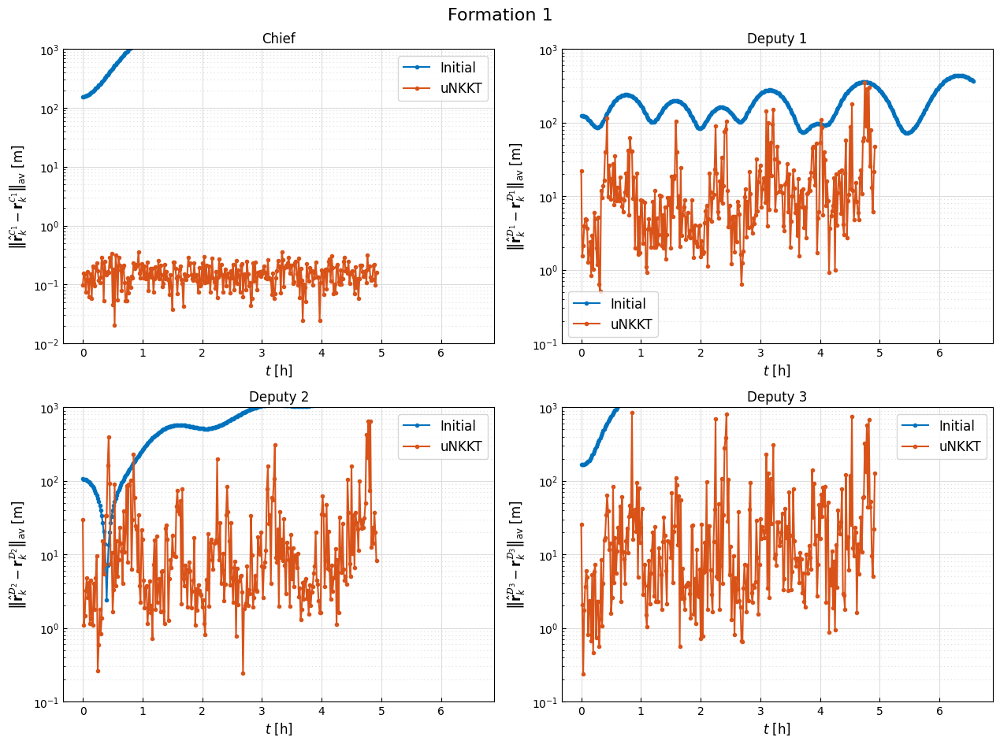

In [15]:
# MATLAB default color cycle
matlab_default_colors = [
    [0, 0.4470, 0.7410],  # blue
    [0.8500, 0.3250, 0.0980],  # orange
    [0.9290, 0.6940, 0.1250],  # yellow
    [0.4940, 0.1840, 0.5560],  # purple
    [0.4660, 0.6740, 0.1880],  # green
    [0.3010, 0.7450, 0.9330],  # light blue
    [0.6350, 0.0780, 0.1840],  # red
]
# Set the color cycle in Matplotlib to match MATLAB's default
plt.rcParams["axes.prop_cycle"] = plt.cycler(color=matlab_default_colors)

time = np.arange(0, T) / dt
algorithm = "uNKKT"

# Plot positions based on screen size
fig_width = 2 * 6.4  # in inchesa
fig_height = 2 * 4.8  # in inches

# Create a 2 by 2 figure
fig, axs = plt.subplots(2, 2, figsize=(fig_width, fig_height))

# Plot 1: Chief
axs[0, 0].plot(time, dev_chief_initial, ".-", label="Initial")
axs[0, 0].plot(time[:K - W + 1], dev_chief, ".-", label=algorithm)
axs[0, 0].grid(which="major", color="#DDDDDD", zorder=1)
axs[0, 0].grid(which="minor", color="#DDDDDD", linestyle=(0, (1, 3)), zorder=2)
axs[0, 0].grid(True, which="both")
axs[0, 0].set_yscale("log")
axs[0, 0].set_xlabel("$t$ [h]", fontsize=12)
axs[0, 0].set_ylabel(
    "$\\left\\|\\hat{\\mathbf{r}}_k^{\\mathcal{C}_1} - \\mathbf{r}_k^{\\mathcal{C}_1}\\right\\|_\\mathrm{av}$ [m]",
    fontsize=12,
)
axs[0, 0].set_ylim([1e-2, 1e3])
axs[0, 0].tick_params(axis="both", which="both", direction="in")
axs[0, 0].legend(fontsize=12)
axs[0, 0].set_title("Chief")

# Plot 2: Deputy 1
axs[0, 1].plot(time, dev_deputy1_initial, ".-", label="Initial")
axs[0, 1].plot(time[:K - W + 1], dev_deputy1, ".-", label=algorithm)
axs[0, 1].grid(which="major", color="#DDDDDD", zorder=1)
axs[0, 1].grid(which="minor", color="#DDDDDD", linestyle=(0, (1, 3)), zorder=2)
axs[0, 1].grid(True, which="both")
axs[0, 1].set_yscale("log")
axs[0, 1].set_xlabel("$t$ [h]", fontsize=12)
axs[0, 1].set_ylabel(
    "$\\left\\|\\hat{\\mathbf{r}}_k^{\\mathcal{D}_1} - \\mathbf{r}_k^{\\mathcal{D}_1}\\right\\|_\\mathrm{av}$ [m]",
    fontsize=12,
)
axs[0, 1].set_ylim([1e-1, 1e3])
axs[0, 1].tick_params(axis="both", which="both", direction="in")
axs[0, 1].legend(fontsize=12)
axs[0, 1].set_title("Deputy 1")

# Plot 3: Deputy 2
axs[1, 0].plot(time, dev_deputy2_initial, ".-", label="Initial")
axs[1, 0].plot(time[:K - W + 1], dev_deputy2, ".-", label=algorithm)
axs[1, 0].grid(which="major", color="#DDDDDD", zorder=1)
axs[1, 0].grid(which="minor", color="#DDDDDD", linestyle=(0, (1, 3)), zorder=2)
axs[1, 0].grid(True, which="both")
axs[1, 0].set_yscale("log")
axs[1, 0].set_xlabel("$t$ [h]", fontsize=12)
axs[1, 0].set_ylabel(
    "$\\left\\|\\hat{\\mathbf{r}}_k^{\\mathcal{D}_2} - \\mathbf{r}_k^{\\mathcal{D}_2}\\right\\|_\\mathrm{av}$ [m]",
    fontsize=12,
)
axs[1, 0].set_ylim([1e-1, 1e3])
axs[1, 0].tick_params(axis="both", which="both", direction="in")
axs[1, 0].legend(fontsize=12)
axs[1, 0].set_title("Deputy 2")

# Plot 4: Deputy 3
axs[1, 1].plot(time, dev_deputy3_initial, ".-", label="Initial")
axs[1, 1].plot(time[:K - W + 1], dev_deputy3, ".-", label=algorithm)
axs[1, 1].grid(which="major", color="#DDDDDD", zorder=1)
axs[1, 1].grid(which="minor", color="#DDDDDD", linestyle=(0, (1, 3)), zorder=2)
axs[1, 1].grid(True, which="both")
axs[1, 1].set_yscale("log")
axs[1, 1].set_xlabel("$t$ [h]", fontsize=12)
axs[1, 1].set_ylabel(
    "$\\left\\|\\hat{\\mathbf{r}}_k^{\\mathcal{D}_3} - \\mathbf{r}_k^{\\mathcal{D}_3}\\right\\|_\\mathrm{av}$ [m]",
    fontsize=12,
)
axs[1, 1].set_ylim([1e-1, 1e3])
axs[1, 1].tick_params(axis="both", which="both", direction="in")
axs[1, 1].legend(fontsize=12)
axs[1, 1].set_title("Deputy 3")

fig.suptitle(f"Formation {formation}", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 1])
plt.show()

In [16]:
chunk_size = K - W
for i in range(0, len(NKKT_K_minus_W_next_rounds_stop_iteration), chunk_size):
    first_round_value = NKKT_first_round_stop_iteration[i // chunk_size]
    chunk = NKKT_K_minus_W_next_rounds_stop_iteration[i:i + chunk_size]
    print(f"#{i // chunk_size + 1}: First Round = {first_round_value}, Next Rounds = {chunk}")

#1: First Round = 99, Next Rounds = [99, 99, 99, 99, 16, 99, 99, 99, 99, 99, 2, 4, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 3, 99, 99, 99, 3, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 9, 99, 99, 99, 99, 99, 99, 8, 99, 99, 99, 99, 99, 99, 99, 5, 99, 99, 99, 99, 3, 3, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 2, 99, 99, 99, 2, 99, 99, 99, 99, 4, 2, 4, 99, 10, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 3, 99, 99, 99, 99, 99, 99, 99, 99, 99, 2, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 3, 99, 99, 99, 4, 99, 99, 6, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 2, 99, 99, 99, 99, 99, 99, 4, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 4, 3, 3, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 2, 99, 99, 99, 99, 99, 99, 99, 5, 99, 99, 99, 99, 99, 99, 3, 99, 99, 99, 99, 99, 4, 99, 6, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 99, 